In [1]:
# These two lines are necessary only if GemPy is not installed
import sys, os
sys.path.append("../../..")

# Importing GemPy
import gempytf as gp

# Embedding matplotlib figures in the notebooks
%matplotlib inline

# Importing auxiliary libraries
import numpy as np
import matplotlib.pyplot as plt

import theano
import theano.tensor as T
import pymc3 as pm
theano.config.optimizer_including

from io import StringIO
import sys

import warnings
warnings.filterwarnings("ignore")

WARNING (theano.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
Can not use cuDNN on context None: cannot compile with cuDNN. We got this error:
b'/tmp/try_flags_1oevjg_7.c:4:10: fatal error: cudnn.h: No such file or directory\n #include <cudnn.h>\n          ^~~~~~~~~\ncompilation terminated.\n'
Mapped name None to device cuda: GeForce RTX 2080 (0000:01:00.0)


### Model creation:

In [2]:
# Data Preparation
path_to_data = os.pardir+"/../data/input_data/jan_models/"

geo_data = gp.create_data([0,1000,0,1000,0,1000],resolution=[10,1,10], 
                        path_o = path_to_data + "model1_orientations.csv",
                        path_i = path_to_data + "model1_surface_points.csv") 
geo_data.delete_surfaces('rock1',remove_data=True)
geo_data.delete_surface_points([1,3,4,5])
geo_data.modify_surface_points([0, 2], Y=500, Z=[500, 600])

Active grids: ['regular']


,X,Y,Z,X_r,Y_r,Z_r,surface,series,id,order_series,smooth
0,100,500,500,0.2501,0.5001,0.46885,rock2,Default series,1,1,1.000000e-08
2,900,500,600,0.7501,0.5001,0.53135,rock2,Default series,1,1,1.000000e-08


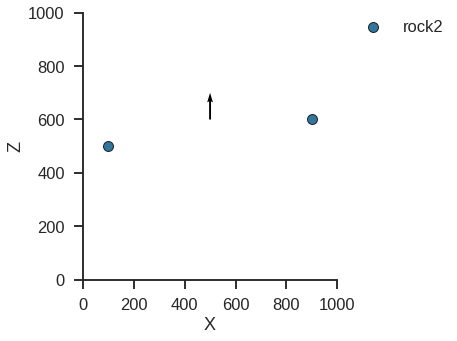

In [3]:
gp.plot.plot_data(geo_data)

In [4]:
geo_data.interpolator.get_python_input_block()[6].shape

(100, 3)

In [5]:
gp.set_interpolation_data(geo_data, theano_optimizer='fast_compile',
                         verbose=['compare'])

Compiling theano function...
Compilation Done!


In [6]:
gp.compute_model(geo_data);

n_surface_0 __str__ = [[0.]]
a __str__ = 1.3927127
n_surface_1 __str__ = [[1.]]
b __str__ = 0.8123463
drift[slice_init:slice_init+1][0] __str__ = [[1.]]
n_surface_0 __str__ = [[2.]]
a __str__ = 0.8123463
n_surface_1 __str__ = [[0.]]
b __str__ = 0.09997714
drift[slice_init:slice_init+1][0] __str__ = [[2.]]


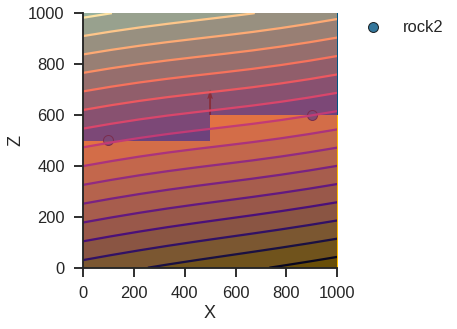

In [7]:
gp.plot.plot_section(geo_data, 0, show_data=True)
gp.plot.plot_scalar_field(geo_data, 0, plot_data=False)

## Plotting the sigmoid function:

In [8]:
# Cleaning buffer
old_stdout = sys.stdout
mystdout = sys.stdout = StringIO()

# Computing model
gp.compute_model(geo_data)

# Black magic update
sys.stdout = old_stdout

# Split print strings
output = mystdout.getvalue().split('\n')

# Init parameters
n_surface_op_float_sigmoid = []
n_surface_0 = []
n_surface_1 = []
a = []
b = []
drift = []

for s in output:
    if 'n_surface_op_float_sigmoid __str__' in s:
        n_surface_op_float_sigmoid.append(np.fromstring(s[s.find('[[')+2:-2], dtype='float', sep=' '))
    if 'n_surface_0 __str__' in s:
        n_surface_0.append(np.fromstring(s[s.find('[[')+2:-2], dtype='float', sep=' '))
    if 'n_surface_1 __str__' in s:
        n_surface_1.append(np.fromstring(s[s.find('[[')+2:-2], dtype='float', sep=' '))
    if 'a __str__' in s:
        a.append(float(s[s.find('= ')+2:]))
    if 'b __str__' in s:
        b.append(float(s[s.find('= ')+2:]))
    if 'drift[slice_init:slice_init+1][0] __str__' in s:
        drift.append(np.fromstring(s[s.find('[[')+2:-2], dtype='float', sep=' '))

a, b, n_surface_0, n_surface_1, drift

([1.3927127, 0.8123463],
 [0.8123463, 0.09997714],
 [array([0.]), array([2.])],
 [array([1.]), array([0.])],
 [array([1.]), array([2.])])

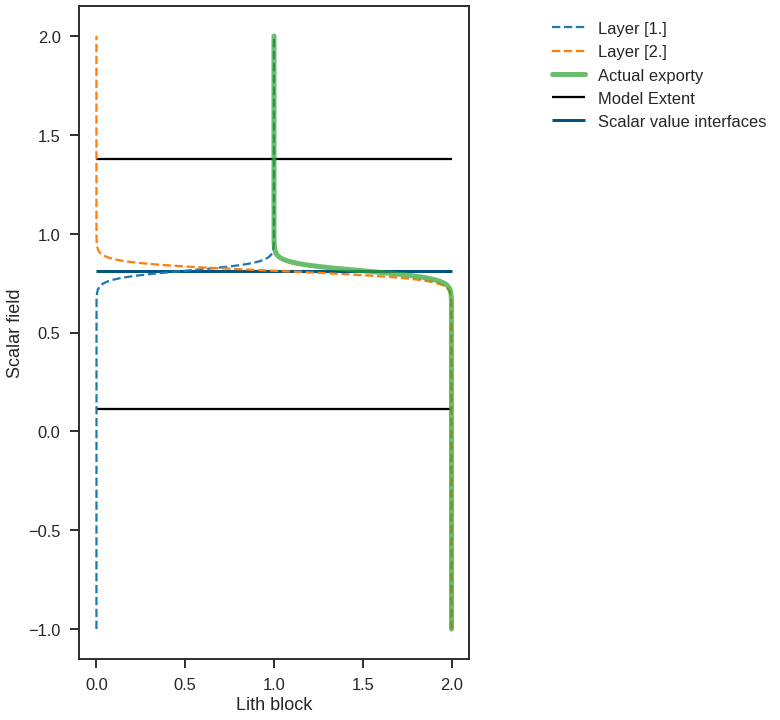

In [9]:
from gempy.utils.gradient import plot_sig
plot_sig(n_surface_0[:], n_surface_1, a, b, drift, Z_x = np.linspace(-1,2,2000),
         sf_max=geo_data.solutions.scalar_field_matrix.max(),
         sf_min=geo_data.solutions.scalar_field_matrix.min(),
         sf_at_scalar=geo_data.solutions.scalar_field_at_surface_points[0]);

In [21]:
0/5

0.0

### Calculating the jacobian

We are going to recompile so we do not print all the sigmoid values when we use `gp.compute model`

In [9]:
gp.set_interpolation_data(geo_data, theano_optimizer='fast_compile',
                         verbose=[])

Compiling theano function...
Compilation Done!


In any case, since the gradient is not yet implemented in gempy we need to recompile it appart. For this demo we will compute the jacobian of each of our lith_block respect the surface points: `geo_data.interpolator.theano_graph.input_parameters_loop[4]`

In [10]:
respect = geo_data.interpolator.theano_graph.input_parameters_loop[4]
th_f_j = theano.function(geo_data.interpolator.theano_graph.input_parameters_loop,
                         T.jacobian((geo_data.interpolator.theano_graph.compute_series()[0][-1]), 
                                respect),
                          # mode=NanGuardMode(nan_is_error=True),
                         on_unused_input='ignore')
print("Respect: " + str(respect))

Respect: All the surface_points points at once


We compute it:

In [22]:
geo_data.interpolator.theano_graph.sig_slope.set_value(np.array(500, dtype='float32'))

In [23]:
jac = th_f_j(*geo_data.interpolator.get_python_input_block())

n_surface_0 __str__ = [[0.]]
a __str__ = 1.3927127
n_surface_1 __str__ = [[1.]]
b __str__ = 0.8123463
drift[slice_init:slice_init+1][0] __str__ = [[1.]]
n_surface_0 __str__ = [[2.]]
a __str__ = 0.8123463
n_surface_1 __str__ = [[0.]]
b __str__ = 0.09997714
drift[slice_init:slice_init+1][0] __str__ = [[2.]]
n_surface_0 __str__ = [[0.]]
a __str__ = 1.3927127
n_surface_1 __str__ = [[1.]]
b __str__ = 0.8123463
drift[slice_init:slice_init+1][0] __str__ = [[1.]]
n_surface_0 __str__ = [[2.]]
a __str__ = 0.8123463
n_surface_1 __str__ = [[0.]]
b __str__ = 0.09997714
drift[slice_init:slice_init+1][0] __str__ = [[2.]]
n_surface_0 __str__ = [[0.]]
a __str__ = 1.3927127
n_surface_1 __str__ = [[1.]]
b __str__ = 0.8123463
drift[slice_init:slice_init+1][0] __str__ = [[1.]]
n_surface_0 __str__ = [[2.]]
a __str__ = 0.8123463
n_surface_1 __str__ = [[0.]]
b __str__ = 0.09997714
drift[slice_init:slice_init+1][0] __str__ = [[2.]]
n_surface_0 __str__ = [[2.]]
a __str__ = 0.8123463
n_surface_1 __str__ = [[0.]]

ValueError: array must not contain infs or NaNs
Apply node that caused the error: Solve{A_structure='general', lower=True, overwrite_A=False, overwrite_b=False}(HostFromGpu(gpuarray).0, HostFromGpu(gpuarray).0)
Toposort index: 956
Inputs types: [TensorType(float32, matrix), TensorType(float32, vector)]
Inputs shapes: [(7, 7), (7,)]
Inputs strides: [(4, 28), (4,)]
Inputs values: ['not shown', 'not shown']
Inputs type_num: [11, 11]
Outputs clients: [[GpuFromHost<None>(Solve{A_structure='general', lower=True, overwrite_A=False, overwrite_b=False}.0), GpuFromHost<None>(Solve{A_structure='general', lower=True, overwrite_A=False, overwrite_b=False}.0)]]

Backtrace when the node is created(use Theano flag traceback.limit=N to make it longer):
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1326, in access_grad_cache
    term = access_term_cache(node)[idx]
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1021, in access_term_cache
    output_grads = [access_grad_cache(var) for var in node.outputs]
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1021, in <listcomp>
    output_grads = [access_grad_cache(var) for var in node.outputs]
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1326, in access_grad_cache
    term = access_term_cache(node)[idx]
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1021, in access_term_cache
    output_grads = [access_grad_cache(var) for var in node.outputs]
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1021, in <listcomp>
    output_grads = [access_grad_cache(var) for var in node.outputs]
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1326, in access_grad_cache
    term = access_term_cache(node)[idx]
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1162, in access_term_cache
    new_output_grads)
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1326, in access_grad_cache
    term = access_term_cache(node)[idx]
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1021, in access_term_cache
    output_grads = [access_grad_cache(var) for var in node.outputs]
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1021, in <listcomp>
    output_grads = [access_grad_cache(var) for var in node.outputs]
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1326, in access_grad_cache
    term = access_term_cache(node)[idx]
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1021, in access_term_cache
    output_grads = [access_grad_cache(var) for var in node.outputs]
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1021, in <listcomp>
    output_grads = [access_grad_cache(var) for var in node.outputs]
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1326, in access_grad_cache
    term = access_term_cache(node)[idx]
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1162, in access_term_cache
    new_output_grads)

Debugprint of the apply node: 
Solve{A_structure='general', lower=True, overwrite_A=False, overwrite_b=False} [id A] <TensorType(float32, vector)> ''   
 |HostFromGpu(gpuarray) [id B] <TensorType(float32, matrix)> ''   
 | |InplaceGpuDimShuffle{1,0} [id C] <GpuArrayType<None>(float32, matrix)> ''   
 |   |GpuIncSubtensor{Set;int64::, int64:int64:} [id D] <GpuArrayType<None>(float32, matrix)> ''   
 |     |GpuIncSubtensor{Set;int64::, int64:int64:} [id E] <GpuArrayType<None>(float32, matrix)> ''   
 |     | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id F] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id G] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | |GpuIncSubtensor{Set;int64:int64:, int64::} [id H] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id I] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id J] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id K] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64::} [id L] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id M] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id N] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id O] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | |GpuAlloc<None> [id P] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |GpuArrayConstant{0.0} [id Q] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | | | |HostFromGpu(gpuarray) [id R] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id S] <GpuArrayType<None>(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   |GpuElemwise{add,no_inplace} [id T] <GpuArrayType<None>(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | |GpuFromHost<None> [id U] <GpuArrayType<None>(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | |Elemwise{add,no_inplace} [id V] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | |   |Subtensor{int64} [id W] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | |   | |Shape [id X] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | |   | | |GpuReshape{2} [id Y] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | |   | |   |InplaceGpuDimShuffle{0,2,1,3} [id Z] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 |     | | | | | | | | | | | | |   | |   | |   | |GpuAlloc<None> [id BA] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 |     | | | | | | | | | | | | |   | |   | |   |   |GpuSubtensor{int32:int32:, ::} [id BB] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | |   | |   |   | |Position of the dips_copy[Gpua] [id BC] <GpuArrayType<None>(float32, matrix)>
 |     | | | | | | | | | | | | |   | |   | |   |   | |ScalarFromTensor [id BD] <int32> ''   
 |     | | | | | | | | | | | | |   | |   | |   |   | | |HostFromGpu(gpuarray) [id BE] <TensorType(int32, scalar)> ''   
 |     | | | | | | | | | | | | |   | |   | |   |   | |   |Length of foliations in every series[t][Gpua] [id BF] <GpuArrayType<None>(int32, scalar)>
 |     | | | | | | | | | | | | |   | |   | |   |   | |ScalarFromTensor [id BG] <int32> ''   
 |     | | | | | | | | | | | | |   | |   | |   |   |   |HostFromGpu(gpuarray) [id BH] <TensorType(int32, scalar)> ''   
 |     | | | | | | | | | | | | |   | |   | |   |   |     |Length of foliations in every series[t+1][Gpua] [id BI] <GpuArrayType<None>(int32, scalar)>
 |     | | | | | | | | | | | | |   | |   | |   |   |TensorConstant{3} [id BJ] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |   | |   | |   |   |TensorConstant{1} [id BK] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |   | |   | |   |   |Subtensor{int64} [id BL] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | |   | |   |   | |Shape [id BM] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | |   | |   |   | | |GpuSubtensor{int32:int32:, ::} [id BB] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | |   | |   |   | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | | |   | |   | |   |   |Subtensor{int64} [id BO] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | |   | |   |     |Shape [id BM] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | |   | |   |     |Constant{1} [id BP] <int64>
 |     | | | | | | | | | | | | |   | |   | |   |MakeVector{dtype='int64'} [id BQ] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | |   | |     |Elemwise{mul,no_inplace} [id BR] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | |   | |     | |Subtensor{int64} [id BL] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | |   | |     | |TensorConstant{3} [id BJ] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |   | |   | |     |Elemwise{mul,no_inplace} [id BS] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | |   | |       |Subtensor{int64} [id BO] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | |   | |       |TensorConstant{1} [id BK] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |   | |   | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | | |   | |   |Subtensor{int64} [id BT] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | |     |Shape [id BU] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | |     | |GpuSubtensor{int32:int32:, ::} [id BV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | |     |   |GpuAdvancedSubtensor1 [id BW] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | |     |   | |All the surface_points points at once_copy[Gpua] [id BX] <GpuArrayType<None>(float32, matrix)>
 |     | | | | | | | | | | | | |   | |     |   | |GpuContiguous [id BY] <GpuArrayType<None>(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | |     |   |   |GpuFromHost<None> [id BZ] <GpuArrayType<None>(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | |     |   |     |Subtensor{int64} [id CA] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | |     |   |       |Nonzero [id CB] <TensorType(int64, matrix)> ''   
 |     | | | | | | | | | | | | |   | |     |   |       | |HostFromGpu(gpuarray) [id CC] <TensorType(int16, vector)> ''   
 |     | | | | | | | | | | | | |   | |     |   |       |   |GpuAdvancedIncSubtensor1{inplace=False, set_instead_of_inc=True} [id CD] <GpuArrayType<None>(int16, vector)> ''   
 |     | | | | | | | | | | | | |   | |     |   |       |     |GpuAlloc<None> [id CE] <GpuArrayType<None>(int16, vector)> ''   
 |     | | | | | | | | | | | | |   | |     |   |       |     | |GpuArrayConstant{1} [id CF] <GpuArrayType<None>(int16, scalar)>
 |     | | | | | | | | | | | | |   | |     |   |       |     | |Subtensor{int64} [id CG] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | |     |   |       |     |   |Shape [id CH] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | |     |   |       |     |   | |All the surface_points points at once_copy[Gpua] [id BX] <GpuArrayType<None>(float32, matrix)>
 |     | | | | | | | | | | | | |   | |     |   |       |     |   |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | | |   | |     |   |       |     |GpuArrayConstant{0} [id CI] <GpuArrayType<None>(int8, scalar)>
 |     | | | | | | | | | | | | |   | |     |   |       |     |CumOp{None, add} [id CJ] <TensorType(int32, vector)> ''   
 |     | | | | | | | | | | | | |   | |     |   |       |       |HostFromGpu(gpuarray) [id CK] <TensorType(int32, vector)> ''   
 |     | | | | | | | | | | | | |   | |     |   |       |         |GpuJoin [id CL] <GpuArrayType<None>(int32, vector)> ''   
 |     | | | | | | | | | | | | |   | |     |   |       |           |TensorConstant{0} [id CM] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |   | |     |   |       |           |GpuArrayConstant{[0]} [id CN] <GpuArrayType<None>(int8, vector)>
 |     | | | | | | | | | | | | |   | |     |   |       |           |GpuElemwise{add,no_inplace} [id CO] <GpuArrayType<None>(int32, vector)> ''   
 |     | | | | | | | | | | | | |   | |     |   |       |             |GpuSubtensor{:int64:} [id CP] <GpuArrayType<None>(int32, vector)> ''   
 |     | | | | | | | | | | | | |   | |     |   |       |             | |Number of points per surface used to split rest-ref_copy[Gpua] [id CQ] <GpuArrayType<None>(int32, vector)>
 |     | | | | | | | | | | | | |   | |     |   |       |             | |Constant{-1} [id CR] <int64>
 |     | | | | | | | | | | | | |   | |     |   |       |             |GpuArrayConstant{[1]} [id CS] <GpuArrayType<None>(int8, (True,))>
 |     | | | | | | | | | | | | |   | |     |   |       |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | | |   | |     |   |ScalarFromTensor [id CT] <int32> ''   
 |     | | | | | | | | | | | | |   | |     |   | |HostFromGpu(gpuarray) [id CU] <TensorType(int32, scalar)> ''   
 |     | | | | | | | | | | | | |   | |     |   |   |Length of surface_points in every series[t][Gpua] [id CV] <GpuArrayType<None>(int32, scalar)>
 |     | | | | | | | | | | | | |   | |     |   |ScalarFromTensor [id CW] <int32> ''   
 |     | | | | | | | | | | | | |   | |     |     |HostFromGpu(gpuarray) [id CX] <TensorType(int32, scalar)> ''   
 |     | | | | | | | | | | | | |   | |     |       |Length of surface_points in every series[t+1][Gpua] [id CY] <GpuArrayType<None>(int32, scalar)>
 |     | | | | | | | | | | | | |   | |     |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | | |   | |Grade of the universal drift[t][Gpua] [id CZ] <GpuArrayType<None>(int32, scalar)>
 |     | | | | | | | | | | | | |   |GpuFromHost<None> [id DA] <GpuArrayType<None>(int32, scalar)> ''   
 |     | | | | | | | | | | | | |     |Elemwise{Cast{int32}} [id DB] <TensorType(int32, scalar)> ''   
 |     | | | | | | | | | | | | |       |Subtensor{int64} [id DC] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |         |Shape [id DD] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |         | |GpuElemwise{mul,no_inplace} [id DE] <GpuArrayType<None>(float64, matrix)> ''   
 |     | | | | | | | | | | | | |         |   |GpuAdvancedSubtensor [id DF] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |         |   | |block matrix[t-1][Gpua] [id DG] <GpuArrayType<None>(float32, 3D)>
 |     | | | | | | | | | | | | |         |   | |Subtensor{int64} [id DH] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |         |   | | |Nonzero [id DI] <TensorType(int64, matrix)> ''   
 |     | | | | | | | | | | | | |         |   | | | |HostFromGpu(gpuarray) [id DJ] <TensorType(int8, vector)> ''   
 |     | | | | | | | | | | | | |         |   | | |   |GpuElemwise{Cast{int8}}[]<gpuarray> [id DK] <GpuArrayType<None>(int8, vector)> ''   
 |     | | | | | | | | | | | | |         |   | | |     |GpuSubtensor{::, int8} [id DL] <GpuArrayType<None>(int64, vector)> ''   
 |     | | | | | | | | | | | | |         |   | | |       |fault relation matrix_copy[Gpua] [id DM] <GpuArrayType<None>(int64, matrix)>
 |     | | | | | | | | | | | | |         |   | | |       |ScalarFromTensor [id DN] <int8> ''   
 |     | | | | | | | | | | | | |         |   | | |         |HostFromGpu(gpuarray) [id DO] <TensorType(int8, scalar)> ''   
 |     | | | | | | | | | | | | |         |   | | |           |GpuElemwise{Cast{int8}}[]<gpuarray> [id DP] <GpuArrayType<None>(int8, scalar)> ''   
 |     | | | | | | | | | | | | |         |   | | |             |<GpuArrayType<None>(int32, scalar)> [id DQ] <GpuArrayType<None>(int32, scalar)>
 |     | | | | | | | | | | | | |         |   | | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | | |         |   | |TensorConstant{0} [id DR] <TensorType(int64, scalar)>
 |     | | | | | | | | | | | | |         |   | |SliceConstant{None, None, None} [id DS] <slice>
 |     | | | | | | | | | | | | |         |   |InplaceGpuDimShuffle{x,x} [id DT] <GpuArrayType<None>(float64, (True, True))> ''   
 |     | | | | | | | | | | | | |         |     |<GpuArrayType<None>(float64, scalar)> [id DU] <GpuArrayType<None>(float64, scalar)>
 |     | | | | | | | | | | | | |         |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | | |HostFromGpu(gpuarray) [id DV] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | |   |GpuElemwise{add,no_inplace} [id S] <GpuArrayType<None>(int64, scalar)> ''   
 |     | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DW] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |GpuElemwise{switch,no_inplace} [id DX] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | |GpuElemwise{eq,no_inplace} [id DY] <GpuArrayType<None>(bool, matrix)> ''   
 |     | | | | | | | | | | | | | | |GpuElemwise{sqrt,no_inplace} [id DZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | | |GpuElemwise{maximum,no_inplace} [id EA] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | |   |GpuElemwise{sub,no_inplace} [id EB] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | |   | |GpuElemwise{add,no_inplace} [id EC] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | |   | | |GpuReshape{2} [id ED] <GpuArrayType<None>(float32, col)> ''   
 |     | | | | | | | | | | | | | | |   | | | |GpuCAReduceCuda{add}{1} [id EE] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | | | |   | | | | |GpuElemwise{pow,no_inplace} [id EF] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | |   | | | |   |GpuReshape{2} [id Y] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | |   | | | |   |GpuArrayConstant{[[2.]]} [id EG] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | | | | | |   | | | |MakeVector{dtype='int64'} [id EH] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | | | |   | | |   |Subtensor{int64} [id W] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | | | |   | | |   |TensorConstant{1} [id EI] <TensorType(int64, scalar)>
 |     | | | | | | | | | | | | | | |   | | |GpuReshape{2} [id EJ] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{1} [id EE] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | | | |   | |   |MakeVector{dtype='int64'} [id EK] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | | | |   | |     |TensorConstant{1} [id EI] <TensorType(int64, scalar)>
 |     | | | | | | | | | | | | | | |   | |     |Subtensor{int64} [id W] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | | | |   | |GpuElemwise{mul,no_inplace} [id EL] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | |   |   |GpuArrayConstant{[[2]]} [id EM] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | | | | | | | | |   |   |GpuDot22 [id EN] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | |   |     |GpuReshape{2} [id Y] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{1,0} [id EO] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | |   |       |GpuReshape{2} [id Y] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | |   |GpuArrayConstant{[[1.e-12]]} [id EP] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | | | | | |GpuArrayConstant{[[0]]} [id EQ] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | | | | | | | |GpuArrayConstant{[[0]]} [id ER] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | | | | | | | |GpuElemwise{sub,no_inplace} [id ES] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |GpuElemwise{mul,no_inplace} [id ET] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | |GpuElemwise{true_div,no_inplace} [id EU] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | | |GpuElemwise{mul,no_inplace} [id EV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | | | |GpuJoin [id EW] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | | | | |TensorConstant{0} [id EX] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |   | | | | |GpuReshape{2} [id EY] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | | | | | |InplaceGpuDimShuffle{0,2,1,3} [id EZ] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 |     | | | | | | | | | | | | |   | | | | | | |GpuAlloc<None> [id FA] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 |     | | | | | | | | | | | | |   | | | | | |   |GpuElemwise{sub,no_inplace} [id FB] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   | |InplaceGpuDimShuffle{x,0} [id FC] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   | | |GpuSubtensor{::, int64} [id FD] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   | |   |GpuSubtensor{int32:int32:, ::} [id BB] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   | |   |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | | |   | | | | | |   | |GpuReshape{2} [id FE] <GpuArrayType<None>(float32, col)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   |   |GpuSubtensor{::, int64} [id FD] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   |   |MakeVector{dtype='int64'} [id FF] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   |     |Subtensor{int64} [id FG] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   |     | |Shape [id FH] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   |     | | |GpuSubtensor{::, int64} [id FD] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   |     | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | | |   | | | | | |   |     |TensorConstant{1} [id EI] <TensorType(int64, scalar)>
 |     | | | | | | | | | | | | |   | | | | | |   |TensorConstant{1} [id BK] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |   | | | | | |   |TensorConstant{3} [id BJ] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |   | | | | | |   |Subtensor{int64} [id FI] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   | |Shape [id FJ] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   | | |GpuElemwise{sub,no_inplace} [id FB] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | | |   | | | | | |   |Subtensor{int64} [id FK] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | | | |     |Shape [id FJ] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | | | | | |     |Constant{1} [id BP] <int64>
 |     | | | | | | | | | | | | |   | | | | | |MakeVector{dtype='int64'} [id FL] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | | | | |   |Elemwise{mul,no_inplace} [id FM] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | | |   | |Subtensor{int64} [id FI] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | | |   | |TensorConstant{1} [id BK] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |   | | | | |   |Elemwise{mul,no_inplace} [id FN] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | | |     |Subtensor{int64} [id FK] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | | |     |TensorConstant{3} [id BJ] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |   | | | | |GpuReshape{2} [id FO] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | | | | | |InplaceGpuDimShuffle{0,2,1,3} [id FP] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 |     | | | | | | | | | | | | |   | | | | | | |GpuAlloc<None> [id FQ] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 |     | | | | | | | | | | | | |   | | | | | |   |GpuElemwise{sub,no_inplace} [id FR] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   | |InplaceGpuDimShuffle{x,0} [id FS] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   | | |GpuSubtensor{::, int64} [id FT] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   | |   |GpuSubtensor{int32:int32:, ::} [id BB] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   | |   |Constant{1} [id BP] <int64>
 |     | | | | | | | | | | | | |   | | | | | |   | |GpuReshape{2} [id FU] <GpuArrayType<None>(float32, col)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   |   |GpuSubtensor{::, int64} [id FT] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   |   |MakeVector{dtype='int64'} [id FV] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   |     |Subtensor{int64} [id FW] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   |     | |Shape [id FX] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   |     | | |GpuSubtensor{::, int64} [id FT] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   |     | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | | |   | | | | | |   |     |TensorConstant{1} [id EI] <TensorType(int64, scalar)>
 |     | | | | | | | | | | | | |   | | | | | |   |TensorConstant{1} [id BK] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |   | | | | | |   |TensorConstant{3} [id BJ] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |   | | | | | |   |Subtensor{int64} [id FY] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   | |Shape [id FZ] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   | | |GpuElemwise{sub,no_inplace} [id FR] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | | |   | | | | | |   |Subtensor{int64} [id GA] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | | | |     |Shape [id FZ] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | | | | | |     |Constant{1} [id BP] <int64>
 |     | | | | | | | | | | | | |   | | | | | |MakeVector{dtype='int64'} [id GB] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | | | | |   |Elemwise{mul,no_inplace} [id GC] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | | |   | |Subtensor{int64} [id FY] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | | |   | |TensorConstant{1} [id BK] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |   | | | | |   |Elemwise{mul,no_inplace} [id GD] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | | |     |Subtensor{int64} [id GA] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | | |     |TensorConstant{3} [id BJ] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |   | | | | |GpuReshape{2} [id GE] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | | | |   |InplaceGpuDimShuffle{0,2,1,3} [id GF] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 |     | | | | | | | | | | | | |   | | | |   | |GpuAlloc<None> [id GG] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 |     | | | | | | | | | | | | |   | | | |   |   |GpuElemwise{sub,no_inplace} [id GH] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | | | |   |   | |InplaceGpuDimShuffle{x,0} [id GI] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | | | | | | | |   | | | |   |   | | |GpuSubtensor{::, int64} [id GJ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | |   | | | |   |   | |   |GpuSubtensor{int32:int32:, ::} [id BB] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | | | |   |   | |   |Constant{2} [id GK] <int64>
 |     | | | | | | | | | | | | |   | | | |   |   | |GpuReshape{2} [id GL] <GpuArrayType<None>(float32, col)> ''   
 |     | | | | | | | | | | | | |   | | | |   |   |   |GpuSubtensor{::, int64} [id GJ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | |   | | | |   |   |   |MakeVector{dtype='int64'} [id GM] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | | | |   |   |     |Subtensor{int64} [id GN] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | |   |   |     | |Shape [id GO] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | | | |   |   |     | | |GpuSubtensor{::, int64} [id GJ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | |   | | | |   |   |     | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | | |   | | | |   |   |     |TensorConstant{1} [id EI] <TensorType(int64, scalar)>
 |     | | | | | | | | | | | | |   | | | |   |   |TensorConstant{1} [id BK] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |   | | | |   |   |TensorConstant{3} [id BJ] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |   | | | |   |   |Subtensor{int64} [id GP] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | |   |   | |Shape [id GQ] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | | | |   |   | | |GpuElemwise{sub,no_inplace} [id GH] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | | | |   |   | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | | |   | | | |   |   |Subtensor{int64} [id GR] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | |   |     |Shape [id GQ] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | | | |   |     |Constant{1} [id BP] <int64>
 |     | | | | | | | | | | | | |   | | | |   |MakeVector{dtype='int64'} [id GS] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | | | |     |Elemwise{mul,no_inplace} [id GT] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | |     | |Subtensor{int64} [id GP] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | |     | |TensorConstant{1} [id BK] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |   | | | |     |Elemwise{mul,no_inplace} [id GU] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | |       |Subtensor{int64} [id GR] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | |       |TensorConstant{3} [id BJ] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |   | | | |InplaceGpuDimShuffle{1,0} [id GV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | | |   |GpuJoin [id EW] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id GW] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | |   |GpuElemwise{sqrt,no_inplace} [id DZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | |   |GpuArrayConstant{[[2.]]} [id GX] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | | | |   | |GpuElemwise{add,no_inplace} [id GY] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |   |GpuElemwise{mul,no_inplace} [id GZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |   | |GpuElemwise{lt,no_inplace} [id HA] <GpuArrayType<None>(bool, matrix)> ''   
 |     | | | | | | | | | | | | |   |   | | |GpuElemwise{sqrt,no_inplace} [id DZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |   | | |InplaceGpuDimShuffle{x,x} [id HB] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | | | |   |   | |   |Range_copy[Gpua] [id HC] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id HD] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |   |   |InplaceGpuDimShuffle{x,x} [id HE] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | | | |   |   |   | |GpuElemwise{neg,no_inplace} [id HF] <GpuArrayType<None>(float32, scalar)> ''   
 |     | | | | | | | | | | | | |   |   |   |   |Covariance at 0_copy[Gpua] [id HG] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | | | |   |   |   |GpuElemwise{add,no_inplace} [id HH] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |   |     |GpuElemwise{sub,no_inplace} [id HI] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |   |     | |GpuElemwise{add,no_inplace} [id HJ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |   |     | | |InplaceGpuDimShuffle{x,x} [id HK] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | | | |   |   |     | | | |GpuElemwise{true_div,no_inplace} [id HL] <GpuArrayType<None>(float32, scalar)> ''   
 |     | | | | | | | | | | | | |   |   |     | | |   |GpuArrayConstant{-14} [id HM] <GpuArrayType<None>(int8, scalar)>
 |     | | | | | | | | | | | | |   |   |     | | |   |GpuElemwise{pow,no_inplace} [id HN] <GpuArrayType<None>(float32, scalar)> ''   
 |     | | | | | | | | | | | | |   |   |     | | |     |Range_copy[Gpua] [id HC] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | | | |   |   |     | | |     |GpuArrayConstant{2.0} [id HO] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | | | |   |   |     | | |GpuElemwise{true_div,no_inplace} [id HP] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |   |     | |   |GpuElemwise{mul,no_inplace} [id HQ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |   |     | |   | |GpuArrayConstant{[[26.25]]} [id HR] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | | | |   |   |     | |   | |GpuElemwise{sqrt,no_inplace} [id DZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |   |     | |   |InplaceGpuDimShuffle{x,x} [id HS] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | | | |   |   |     | |     |GpuElemwise{pow,no_inplace} [id HT] <GpuArrayType<None>(float32, scalar)> ''   
 |     | | | | | | | | | | | | |   |   |     | |       |Range_copy[Gpua] [id HC] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | | | |   |   |     | |       |GpuArrayConstant{3.0} [id HU] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | | | |   |   |     | |GpuElemwise{true_div,no_inplace} [id HV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |   |     |   |GpuElemwise{mul,no_inplace} [id HW] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |   |     |   | |GpuArrayConstant{[[17.5]]} [id HX] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | | | |   |   |     |   | |GpuElemwise{pow,no_inplace} [id HY] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |   |     |   |   |GpuElemwise{sqrt,no_inplace} [id DZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |   |     |   |   |GpuArrayConstant{[[3.]]} [id HZ] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | | | |   |   |     |   |InplaceGpuDimShuffle{x,x} [id IA] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | | | |   |   |     |     |GpuElemwise{pow,no_inplace} [id IB] <GpuArrayType<None>(float32, scalar)> ''   
 |     | | | | | | | | | | | | |   |   |     |       |Range_copy[Gpua] [id HC] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | | | |   |   |     |       |GpuArrayConstant{5.0} [id IC] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | | | |   |   |     |GpuElemwise{true_div,no_inplace} [id ID] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |   |       |GpuElemwise{mul,no_inplace} [id IE] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |   |       | |GpuArrayConstant{[[5.25]]} [id IF] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | | | |   |   |       | |GpuElemwise{pow,no_inplace} [id IG] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |   |       |   |GpuElemwise{sqrt,no_inplace} [id DZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |   |       |   |GpuArrayConstant{[[5.]]} [id IH] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | | | |   |   |       |InplaceGpuDimShuffle{x,x} [id II] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | | | |   |   |         |GpuElemwise{pow,no_inplace} [id IJ] <GpuArrayType<None>(float32, scalar)> ''   
 |     | | | | | | | | | | | | |   |   |           |Range_copy[Gpua] [id HC] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | | | |   |   |           |GpuArrayConstant{7.0} [id IK] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | | | |   |   |GpuElemwise{true_div,no_inplace} [id IL] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |     |GpuElemwise{mul,no_inplace} [id IM] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |     | |GpuElemwise{mul,no_inplace} [id IN] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |     | | |GpuElemwise{mul,no_inplace} [id IO] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |     | | | |GpuElemwise{lt,no_inplace} [id HA] <GpuArrayType<None>(bool, matrix)> ''   
 |     | | | | | | | | | | | | |   |     | | | |InplaceGpuDimShuffle{x,x} [id IP] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | | | |   |     | | |   |Covariance at 0_copy[Gpua] [id HG] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | | | |   |     | | |GpuArrayConstant{[[7]]} [id IQ] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | | | | | | |   |     | |GpuElemwise{sub,no_inplace} [id IR] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |     |   |GpuElemwise{add,no_inplace} [id IS] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |     |   | |GpuElemwise{sub,no_inplace} [id IT] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |     |   | | |GpuElemwise{mul,no_inplace} [id IU] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |     |   | | | |GpuArrayConstant{[[9]]} [id IV] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | | | | | | |   |     |   | | | |GpuElemwise{pow,no_inplace} [id IG] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |     |   | | |GpuElemwise{mul,no_inplace} [id IW] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |     |   | |   |InplaceGpuDimShuffle{x,x} [id IX] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | | | |   |     |   | |   | |GpuElemwise{mul,no_inplace} [id IY] <GpuArrayType<None>(float32, scalar)> ''   
 |     | | | | | | | | | | | | |   |     |   | |   |   |GpuArrayConstant{20} [id IZ] <GpuArrayType<None>(int8, scalar)>
 |     | | | | | | | | | | | | |   |     |   | |   |   |GpuElemwise{pow,no_inplace} [id HN] <GpuArrayType<None>(float32, scalar)> ''   
 |     | | | | | | | | | | | | |   |     |   | |   |GpuElemwise{pow,no_inplace} [id HY] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |     |   | |GpuElemwise{mul,no_inplace} [id JA] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |     |   |   |InplaceGpuDimShuffle{x,x} [id JB] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | | | |   |     |   |   | |GpuElemwise{mul,no_inplace} [id JC] <GpuArrayType<None>(float32, scalar)> ''   
 |     | | | | | | | | | | | | |   |     |   |   |   |GpuArrayConstant{15} [id JD] <GpuArrayType<None>(int8, scalar)>
 |     | | | | | | | | | | | | |   |     |   |   |   |GpuElemwise{pow,no_inplace} [id JE] <GpuArrayType<None>(float32, scalar)> ''   
 |     | | | | | | | | | | | | |   |     |   |   |     |Range_copy[Gpua] [id HC] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | | | |   |     |   |   |     |GpuArrayConstant{4.0} [id JF] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | | | |   |     |   |   |GpuElemwise{sqrt,no_inplace} [id DZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |     |   |InplaceGpuDimShuffle{x,x} [id JG] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | | | |   |     |     |GpuElemwise{mul,no_inplace} [id JH] <GpuArrayType<None>(float32, scalar)> ''   
 |     | | | | | | | | | | | | |   |     |       |GpuArrayConstant{4} [id JI] <GpuArrayType<None>(int8, scalar)>
 |     | | | | | | | | | | | | |   |     |       |GpuElemwise{pow,no_inplace} [id IB] <GpuArrayType<None>(float32, scalar)> ''   
 |     | | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{x,x} [id JJ] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | | | |   |       |GpuElemwise{mul,no_inplace} [id JK] <GpuArrayType<None>(float32, scalar)> ''   
 |     | | | | | | | | | | | | |   |         |GpuArrayConstant{2} [id JL] <GpuArrayType<None>(int8, scalar)>
 |     | | | | | | | | | | | | |   |         |GpuElemwise{pow,no_inplace} [id IJ] <GpuArrayType<None>(float32, scalar)> ''   
 |     | | | | | | | | | | | | |   |GpuElemwise{mul,no_inplace} [id JM] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |     |GpuElemwise{mul,no_inplace} [id JN] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |     | |GpuElemwise{mul,no_inplace} [id JO] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |     | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id JP] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |     | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id JQ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |     | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id JR] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |     | | | | | |GpuElemwise{second,no_inplace} [id JS] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |     | | | | | | |GpuElemwise{sqrt,no_inplace} [id DZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |     | | | | | | |GpuArrayConstant{[[0.]]} [id JT] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | | | |     | | | | | |GpuArrayConstant{1} [id JU] <GpuArrayType<None>(int8, scalar)>
 |     | | | | | | | | | | | | |     | | | | | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | | |     | | | | | |ScalarFromTensor [id JV] <int64> ''   
 |     | | | | | | | | | | | | |     | | | | | | |Subtensor{int64} [id BL] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |     | | | | | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | | |     | | | | | |ScalarFromTensor [id JV] <int64> ''   
 |     | | | | | | | | | | | | |     | | | | |GpuArrayConstant{1} [id JW] <GpuArrayType<None>(int8, scalar)>
 |     | | | | | | | | | | | | |     | | | | |ScalarFromTensor [id JV] <int64> ''   
 |     | | | | | | | | | | | | |     | | | | |ScalarFromTensor [id JX] <int64> ''   
 |     | | | | | | | | | | | | |     | | | | | |Elemwise{mul,no_inplace} [id JY] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |     | | | | |   |Subtensor{int64} [id BL] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |     | | | | |   |TensorConstant{2} [id JZ] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |     | | | | |ScalarFromTensor [id JV] <int64> ''   
 |     | | | | | | | | | | | | |     | | | | |ScalarFromTensor [id JX] <int64> ''   
 |     | | | | | | | | | | | | |     | | | |GpuArrayConstant{1} [id KA] <GpuArrayType<None>(int8, scalar)>
 |     | | | | | | | | | | | | |     | | | |ScalarFromTensor [id JX] <int64> ''   
 |     | | | | | | | | | | | | |     | | | |ScalarFromTensor [id KB] <int64> ''   
 |     | | | | | | | | | | | | |     | | | | |Elemwise{mul,no_inplace} [id BR] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |     | | | |ScalarFromTensor [id JX] <int64> ''   
 |     | | | | | | | | | | | | |     | | | |ScalarFromTensor [id KB] <int64> ''   
 |     | | | | | | | | | | | | |     | | |GpuElemwise{lt,no_inplace} [id HA] <GpuArrayType<None>(bool, matrix)> ''   
 |     | | | | | | | | | | | | |     | |InplaceGpuDimShuffle{x,x} [id IP] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | | | |     |GpuElemwise{add,no_inplace} [id HH] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id KC] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | |   |GpuEye{dtype='float32', context_name=None} [id KD] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | |   | |Subtensor{int64} [id KE] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | |   | | |Shape [id KF] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | |   | | | |GpuElemwise{switch,no_inplace} [id DX] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | |   | | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | |   | |Subtensor{int64} [id KE] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | |   | |TensorConstant{0} [id KG] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | |   |InplaceGpuDimShuffle{x,0} [id KH] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | | | | | | |     |GpuSubtensor{int32:int32:} [id KI] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | |       |Nugget effect of gradients_copy[Gpua] [id KJ] <GpuArrayType<None>(float32, vector)>
 |     | | | | | | | | | | | |       |ScalarFromTensor [id KK] <int32> ''   
 |     | | | | | | | | | | | |       | |HostFromGpu(gpuarray) [id KL] <TensorType(int32, scalar)> ''   
 |     | | | | | | | | | | | |       |   |GpuElemwise{mul,no_inplace} [id KM] <GpuArrayType<None>(int32, scalar)> ''   
 |     | | | | | | | | | | | |       |     |Length of foliations in every series[t][Gpua] [id BF] <GpuArrayType<None>(int32, scalar)>
 |     | | | | | | | | | | | |       |     |GpuArrayConstant{3} [id KN] <GpuArrayType<None>(int8, scalar)>
 |     | | | | | | | | | | | |       |ScalarFromTensor [id KO] <int32> ''   
 |     | | | | | | | | | | | |         |HostFromGpu(gpuarray) [id KP] <TensorType(int32, scalar)> ''   
 |     | | | | | | | | | | | |           |GpuElemwise{mul,no_inplace} [id KQ] <GpuArrayType<None>(int32, scalar)> ''   
 |     | | | | | | | | | | | |             |Length of foliations in every series[t+1][Gpua] [id BI] <GpuArrayType<None>(int32, scalar)>
 |     | | | | | | | | | | | |             |GpuArrayConstant{3} [id KR] <GpuArrayType<None>(int8, scalar)>
 |     | | | | | | | | | | | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | |ScalarFromTensor [id KS] <int64> ''   
 |     | | | | | | | | | | | | |Subtensor{int64} [id W] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | |ScalarFromTensor [id KS] <int64> ''   
 |     | | | | | | | | | | |InplaceGpuDimShuffle{1,0} [id KT] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id KU] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id KV] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | |   | |<GpuArrayType<None>(float32, scalar)> [id KW] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | |   |InplaceGpuDimShuffle{1,0} [id KX] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |     |GpuElemwise{sub,no_inplace} [id KY] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       |GpuElemwise{mul,no_inplace} [id KZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | |GpuElemwise{mul,no_inplace} [id LA] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | | |GpuJoin [id LB] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | | | |TensorConstant{0} [id LC] <TensorType(int8, scalar)>
 |     | | | | | | | | | | |       | | | |InplaceGpuDimShuffle{1,0} [id LD] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | | | | |GpuElemwise{sub,no_inplace} [id LE] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | | | |   |InplaceGpuDimShuffle{x,0} [id FC] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | | | | | |       | | | |   |GpuReshape{2} [id LF] <GpuArrayType<None>(float32, col)> ''   
 |     | | | | | | | | | | |       | | | |     |GpuSubtensor{::, int64} [id LG] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | |       | | | |     | |GpuSubtensor{int32:int32:, ::} [id BV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | | | |     | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | |       | | | |     |MakeVector{dtype='int64'} [id LH] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |       | | | |       |Subtensor{int64} [id LI] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |       | | | |       | |Shape [id LJ] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |       | | | |       | | |GpuSubtensor{::, int64} [id LG] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | |       | | | |       | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | |       | | | |       |TensorConstant{1} [id EI] <TensorType(int64, scalar)>
 |     | | | | | | | | | | |       | | | |InplaceGpuDimShuffle{1,0} [id LK] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | | | | |GpuElemwise{sub,no_inplace} [id LL] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | | | |   |InplaceGpuDimShuffle{x,0} [id FS] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | | | | | |       | | | |   |GpuReshape{2} [id LM] <GpuArrayType<None>(float32, col)> ''   
 |     | | | | | | | | | | |       | | | |     |GpuSubtensor{::, int64} [id LN] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | |       | | | |     | |GpuSubtensor{int32:int32:, ::} [id BV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | | | |     | |Constant{1} [id BP] <int64>
 |     | | | | | | | | | | |       | | | |     |MakeVector{dtype='int64'} [id LO] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |       | | | |       |Subtensor{int64} [id LP] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |       | | | |       | |Shape [id LQ] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |       | | | |       | | |GpuSubtensor{::, int64} [id LN] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | |       | | | |       | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | |       | | | |       |TensorConstant{1} [id EI] <TensorType(int64, scalar)>
 |     | | | | | | | | | | |       | | | |InplaceGpuDimShuffle{1,0} [id LR] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | | |   |GpuElemwise{sub,no_inplace} [id LS] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | | |     |InplaceGpuDimShuffle{x,0} [id GI] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | | | | | |       | | |     |GpuReshape{2} [id LT] <GpuArrayType<None>(float32, col)> ''   
 |     | | | | | | | | | | |       | | |       |GpuSubtensor{::, int64} [id LU] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | |       | | |       | |GpuSubtensor{int32:int32:, ::} [id BV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | | |       | |Constant{2} [id GK] <int64>
 |     | | | | | | | | | | |       | | |       |MakeVector{dtype='int64'} [id LV] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |       | | |         |Subtensor{int64} [id LW] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |       | | |         | |Shape [id LX] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |       | | |         | | |GpuSubtensor{::, int64} [id LU] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | |       | | |         | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | |       | | |         |TensorConstant{1} [id EI] <TensorType(int64, scalar)>
 |     | | | | | | | | | | |       | | |GpuElemwise{lt,no_inplace} [id LY] <GpuArrayType<None>(bool, matrix)> ''   
 |     | | | | | | | | | | |       | |   |GpuElemwise{sqrt,no_inplace} [id LZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | |   | |GpuElemwise{maximum,no_inplace} [id MA] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | |   |   |GpuElemwise{sub,no_inplace} [id MB] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | |   |   | |GpuElemwise{add,no_inplace} [id MC] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | |   |   | | |GpuReshape{2} [id ED] <GpuArrayType<None>(float32, col)> ''   
 |     | | | | | | | | | | |       | |   |   | | |GpuReshape{2} [id MD] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | | | | | |       | |   |   | |   |GpuCAReduceCuda{add}{1} [id ME] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | |       | |   |   | |   | |GpuElemwise{pow,no_inplace} [id MF] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | |   |   | |   |   |GpuSubtensor{int32:int32:, ::} [id BV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | |   |   | |   |   |GpuArrayConstant{[[2.]]} [id MG] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | |       | |   |   | |   |MakeVector{dtype='int64'} [id MH] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |       | |   |   | |     |TensorConstant{1} [id EI] <TensorType(int64, scalar)>
 |     | | | | | | | | | | |       | |   |   | |     |Subtensor{int64} [id BT] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |       | |   |   | |GpuElemwise{mul,no_inplace} [id MI] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | |   |   |   |GpuArrayConstant{[[2]]} [id MJ] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | | | | |       | |   |   |   |GpuDot22 [id MK] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | |   |   |     |GpuReshape{2} [id Y] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | |   |   |     |InplaceGpuDimShuffle{1,0} [id ML] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | |   |   |       |GpuSubtensor{int32:int32:, ::} [id BV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | |   |   |GpuArrayConstant{[[1.e-12]]} [id MM] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | |       | |   |InplaceGpuDimShuffle{x,x} [id HB] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | |       | |GpuElemwise{mul,no_inplace} [id MN] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       |   |InplaceGpuDimShuffle{x,x} [id HE] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | |       |   |GpuElemwise{add,no_inplace} [id MO] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       |     |GpuElemwise{sub,no_inplace} [id MP] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       |     | |GpuElemwise{add,no_inplace} [id MQ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       |     | | |InplaceGpuDimShuffle{x,x} [id HK] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | |       |     | | |GpuElemwise{true_div,no_inplace} [id MR] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       |     | |   |GpuElemwise{mul,no_inplace} [id MS] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       |     | |   | |GpuArrayConstant{[[26.25]]} [id MT] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | |       |     | |   | |GpuElemwise{sqrt,no_inplace} [id LZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       |     | |   |InplaceGpuDimShuffle{x,x} [id HS] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | |       |     | |GpuElemwise{true_div,no_inplace} [id MU] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       |     |   |GpuElemwise{mul,no_inplace} [id MV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       |     |   | |GpuArrayConstant{[[17.5]]} [id MW] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | |       |     |   | |GpuElemwise{pow,no_inplace} [id MX] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       |     |   |   |GpuElemwise{sqrt,no_inplace} [id LZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       |     |   |   |GpuArrayConstant{[[3.]]} [id MY] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | |       |     |   |InplaceGpuDimShuffle{x,x} [id IA] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | |       |     |GpuElemwise{true_div,no_inplace} [id MZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       |       |GpuElemwise{mul,no_inplace} [id NA] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       |       | |GpuArrayConstant{[[5.25]]} [id NB] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | |       |       | |GpuElemwise{pow,no_inplace} [id NC] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       |       |   |GpuElemwise{sqrt,no_inplace} [id LZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       |       |   |GpuArrayConstant{[[5.]]} [id ND] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | |       |       |InplaceGpuDimShuffle{x,x} [id II] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | |       |GpuElemwise{mul,no_inplace} [id NE] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         |GpuElemwise{mul,no_inplace} [id NF] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         | |GpuJoin [id NG] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         | | |TensorConstant{0} [id NH] <TensorType(int8, scalar)>
 |     | | | | | | | | | | |         | | |InplaceGpuDimShuffle{1,0} [id NI] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         | | | |GpuElemwise{sub,no_inplace} [id NJ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         | | |   |InplaceGpuDimShuffle{x,0} [id FC] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | | | | | |         | | |   |GpuReshape{2} [id NK] <GpuArrayType<None>(float32, col)> ''   
 |     | | | | | | | | | | |         | | |     |GpuSubtensor{::, int64} [id NL] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | |         | | |     | |GpuSubtensor{int32:int32:, ::} [id NM] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         | | |     | | |GpuSubtensor{int64} [id NN] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         | | |     | | | |GpuSubtensor{int64::} [id NO] <GpuArrayType<None>(float32, 3D)> ''   
 |     | | | | | | | | | | |         | | |     | | | | |for{gpu,scan_fn} [id NP] <GpuArrayType<None>(float32, 3D)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | |Elemwise{minimum,no_inplace} [id NQ] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | |Elemwise{minimum,no_inplace} [id NR] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | | |Subtensor{int64} [id NS] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | | | |Shape [id NT] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | | | | |GpuSubtensor{int64::} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | | | |   |GpuAdvancedSubtensor1 [id NV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | | | |   | |All the surface_points points at once_copy[Gpua] [id BX] <GpuArrayType<None>(float32, matrix)>
 |     | | | | | | | | | | |         | | |     | | | | | | | | |   | |GpuContiguous [id NW] <GpuArrayType<None>(int64, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | | | |   |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id NX] <GpuArrayType<None>(int64, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | | | |   |     |GpuFromHost<None> [id NY] <GpuArrayType<None>(int32, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | | | |   |       |CumOp{None, add} [id CJ] <TensorType(int32, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | | | |   |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | |         | | |     | | | | | | | | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | |         | | |     | | | | | | | |Subtensor{int64} [id NZ] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | |   |Shape [id OA] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | |   | |Subtensor{int64:int64:} [id OB] <TensorType(int32, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | |   |   |CumOp{None, add} [id OC] <TensorType(int32, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | |   |   | |HostFromGpu(gpuarray) [id OD] <TensorType(int32, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | |   |   |   |GpuJoin [id OE] <GpuArrayType<None>(int32, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | |   |   |     |TensorConstant{0} [id OF] <TensorType(int8, scalar)>
 |     | | | | | | | | | | |         | | |     | | | | | | |   |   |     |GpuArrayConstant{[0]} [id OG] <GpuArrayType<None>(int8, vector)>
 |     | | | | | | | | | | |         | | |     | | | | | | |   |   |     |Number of points per surface used to split rest-ref_copy[Gpua] [id CQ] <GpuArrayType<None>(int32, vector)>
 |     | | | | | | | | | | |         | | |     | | | | | | |   |   |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | |         | | |     | | | | | | |   |   |Constant{-1} [id CR] <int64>
 |     | | | | | | | | | | |         | | |     | | | | | | |   |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | |         | | |     | | | | | | |Subtensor{int64} [id OH] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | |   |Shape [id OI] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | |   | |Subtensor{int64::} [id OJ] <TensorType(int32, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | |   |   |CumOp{None, add} [id OC] <TensorType(int32, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | |   |   |Constant{1} [id BP] <int64>
 |     | | | | | | | | | | |         | | |     | | | | | |   |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | |         | | |     | | | | | |GpuSubtensor{:int64:} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | |GpuSubtensor{int64::} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | |ScalarFromTensor [id OL] <int64> ''   
 |     | | | | | | | | | | |         | | |     | | | | | |   |Elemwise{minimum,no_inplace} [id NQ] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | |GpuSubtensor{:int64:} [id OM] <GpuArrayType<None>(int32, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | |GpuFromHost<None> [id ON] <GpuArrayType<None>(int32, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | | |Subtensor{int64:int64:} [id OB] <TensorType(int32, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | |ScalarFromTensor [id OL] <int64> ''   
 |     | | | | | | | | | | |         | | |     | | | | | |GpuSubtensor{:int64:} [id OO] <GpuArrayType<None>(int32, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | |GpuFromHost<None> [id OP] <GpuArrayType<None>(int32, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | | |Subtensor{int64::} [id OJ] <TensorType(int32, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | |ScalarFromTensor [id OL] <int64> ''   
 |     | | | | | | | | | | |         | | |     | | | | | |GpuIncSubtensor{Set;:int64:} [id OQ] <GpuArrayType<None>(float32, 3D)> ''   
 |     | | | | | | | | | | |         | | |     | | | | |   |GpuAllocEmpty{dtype='float32', context_name=None} [id OR] <GpuArrayType<None>(float32, 3D)> ''   
 |     | | | | | | | | | | |         | | |     | | | | |   | |Elemwise{add,no_inplace} [id OS] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |         | | |     | | | | |   | | |Elemwise{minimum,no_inplace} [id NQ] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |         | | |     | | | | |   | | |Subtensor{int64} [id OT] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |         | | |     | | | | |   | |   |Shape [id OU] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | |   | |   | |Rebroadcast{0} [id OV] <GpuArrayType<None>(float32, 3D)> ''   
 |     | | | | | | | | | | |         | | |     | | | | |   | |   |   |InplaceGpuDimShuffle{x,0,1} [id OW] <GpuArrayType<None>(float32, (True, False, False))> ''   
 |     | | | | | | | | | | |         | | |     | | | | |   | |   |     |GpuAlloc<None> [id OX] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         | | |     | | | | |   | |   |       |GpuArrayConstant{0.0} [id OY] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | |         | | |     | | | | |   | |   |       |Subtensor{int64} [id OZ] <TensorType(int32, scalar)> ''   
 |     | | | | | | | | | | |         | | |     | | | | |   | |   |       | |CumOp{None, add} [id OC] <TensorType(int32, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | |   | |   |       | |Constant{-1} [id CR] <int64>
 |     | | | | | | | | | | |         | | |     | | | | |   | |   |       |TensorConstant{3} [id BJ] <TensorType(int8, scalar)>
 |     | | | | | | | | | | |         | | |     | | | | |   | |   |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | |         | | |     | | | | |   | |Subtensor{int64} [id PA] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |         | | |     | | | | |   | | |Shape [id OU] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | |   | | |Constant{1} [id BP] <int64>
 |     | | | | | | | | | | |         | | |     | | | | |   | |Subtensor{int64} [id PB] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |         | | |     | | | | |   |   |Shape [id OU] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | |   |   |Constant{2} [id GK] <int64>
 |     | | | | | | | | | | |         | | |     | | | | |   |Rebroadcast{0} [id OV] <GpuArrayType<None>(float32, 3D)> ''   
 |     | | | | | | | | | | |         | | |     | | | | |   |ScalarFromTensor [id PC] <int64> ''   
 |     | | | | | | | | | | |         | | |     | | | | |     |Subtensor{int64} [id OT] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |         | | |     | | | | |Constant{1} [id BP] <int64>
 |     | | | | | | | | | | |         | | |     | | | |Constant{-1} [id CR] <int64>
 |     | | | | | | | | | | |         | | |     | | |ScalarFromTensor [id CT] <int32> ''   
 |     | | | | | | | | | | |         | | |     | | |ScalarFromTensor [id CW] <int32> ''   
 |     | | | | | | | | | | |         | | |     | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | |         | | |     |MakeVector{dtype='int64'} [id PD] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |         | | |       |Subtensor{int64} [id PE] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |         | | |       | |Shape [id PF] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |         | | |       | | |GpuSubtensor{::, int64} [id NL] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | |         | | |       | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | |         | | |       |TensorConstant{1} [id EI] <TensorType(int64, scalar)>
 |     | | | | | | | | | | |         | | |InplaceGpuDimShuffle{1,0} [id PG] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         | | | |GpuElemwise{sub,no_inplace} [id PH] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         | | |   |InplaceGpuDimShuffle{x,0} [id FS] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | | | | | |         | | |   |GpuReshape{2} [id PI] <GpuArrayType<None>(float32, col)> ''   
 |     | | | | | | | | | | |         | | |     |GpuSubtensor{::, int64} [id PJ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | |         | | |     | |GpuSubtensor{int32:int32:, ::} [id NM] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         | | |     | |Constant{1} [id BP] <int64>
 |     | | | | | | | | | | |         | | |     |MakeVector{dtype='int64'} [id PK] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |         | | |       |Subtensor{int64} [id PL] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |         | | |       | |Shape [id PM] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |         | | |       | | |GpuSubtensor{::, int64} [id PJ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | |         | | |       | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | |         | | |       |TensorConstant{1} [id EI] <TensorType(int64, scalar)>
 |     | | | | | | | | | | |         | | |InplaceGpuDimShuffle{1,0} [id PN] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         | |   |GpuElemwise{sub,no_inplace} [id PO] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         | |     |InplaceGpuDimShuffle{x,0} [id GI] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | | | | | |         | |     |GpuReshape{2} [id PP] <GpuArrayType<None>(float32, col)> ''   
 |     | | | | | | | | | | |         | |       |GpuSubtensor{::, int64} [id PQ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | |         | |       | |GpuSubtensor{int32:int32:, ::} [id NM] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         | |       | |Constant{2} [id GK] <int64>
 |     | | | | | | | | | | |         | |       |MakeVector{dtype='int64'} [id PR] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |         | |         |Subtensor{int64} [id PS] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |         | |         | |Shape [id PT] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |         | |         | | |GpuSubtensor{::, int64} [id PQ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | |         | |         | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | |         | |         |TensorConstant{1} [id EI] <TensorType(int64, scalar)>
 |     | | | | | | | | | | |         | |GpuElemwise{lt,no_inplace} [id PU] <GpuArrayType<None>(bool, matrix)> ''   
 |     | | | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id PV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         |   | |GpuElemwise{maximum,no_inplace} [id PW] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         |   |   |GpuElemwise{sub,no_inplace} [id PX] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         |   |   | |GpuElemwise{add,no_inplace} [id PY] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         |   |   | | |GpuReshape{2} [id ED] <GpuArrayType<None>(float32, col)> ''   
 |     | | | | | | | | | | |         |   |   | | |GpuReshape{2} [id PZ] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | | | | | |         |   |   | |   |GpuCAReduceCuda{add}{1} [id QA] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | |         |   |   | |   | |GpuElemwise{pow,no_inplace} [id QB] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         |   |   | |   |   |GpuSubtensor{int32:int32:, ::} [id NM] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         |   |   | |   |   |GpuArrayConstant{[[2.]]} [id QC] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | |         |   |   | |   |MakeVector{dtype='int64'} [id QD] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |         |   |   | |     |TensorConstant{1} [id EI] <TensorType(int64, scalar)>
 |     | | | | | | | | | | |         |   |   | |     |Subtensor{int64} [id QE] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |         |   |   | |       |Shape [id QF] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |         |   |   | |       | |GpuSubtensor{int32:int32:, ::} [id NM] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         |   |   | |       |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | |         |   |   | |GpuElemwise{mul,no_inplace} [id QG] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         |   |   |   |GpuArrayConstant{[[2]]} [id QH] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | | | | |         |   |   |   |GpuDot22 [id QI] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         |   |   |     |GpuReshape{2} [id Y] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         |   |   |     |InplaceGpuDimShuffle{1,0} [id QJ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         |   |   |       |GpuSubtensor{int32:int32:, ::} [id NM] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         |   |   |GpuArrayConstant{[[1.e-12]]} [id QK] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | |         |   |InplaceGpuDimShuffle{x,x} [id HB] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | |         |GpuElemwise{mul,no_inplace} [id QL] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |           |InplaceGpuDimShuffle{x,x} [id HE] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | |           |GpuElemwise{add,no_inplace} [id QM] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |             |GpuElemwise{sub,no_inplace} [id QN] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |             | |GpuElemwise{add,no_inplace} [id QO] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |             | | |InplaceGpuDimShuffle{x,x} [id HK] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | |             | | |GpuElemwise{true_div,no_inplace} [id QP] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |             | |   |GpuElemwise{mul,no_inplace} [id QQ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |             | |   | |GpuArrayConstant{[[26.25]]} [id QR] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | |             | |   | |GpuElemwise{sqrt,no_inplace} [id PV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |             | |   |InplaceGpuDimShuffle{x,x} [id HS] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | |             | |GpuElemwise{true_div,no_inplace} [id QS] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |             |   |GpuElemwise{mul,no_inplace} [id QT] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |             |   | |GpuArrayConstant{[[17.5]]} [id QU] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | |             |   | |GpuElemwise{pow,no_inplace} [id QV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |             |   |   |GpuElemwise{sqrt,no_inplace} [id PV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |             |   |   |GpuArrayConstant{[[3.]]} [id QW] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | |             |   |InplaceGpuDimShuffle{x,x} [id IA] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | |             |GpuElemwise{true_div,no_inplace} [id QX] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |               |GpuElemwise{mul,no_inplace} [id QY] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |               | |GpuArrayConstant{[[5.25]]} [id QZ] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | |               | |GpuElemwise{pow,no_inplace} [id RA] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |               |   |GpuElemwise{sqrt,no_inplace} [id PV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |               |   |GpuArrayConstant{[[5.]]} [id RB] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | |               |InplaceGpuDimShuffle{x,x} [id II] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | |ScalarFromTensor [id KS] <int64> ''   
 |     | | | | | | | | | | |ScalarFromTensor [id KS] <int64> ''   
 |     | | | | | | | | | | |ScalarFromTensor [id RC] <int64> ''   
 |     | | | | | | | | | |   |Elemwise{add,no_inplace} [id V] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | |GpuSubtensor{::, :int32:} [id RD] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id RE] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id RF] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id RG] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id RH] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id RI] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id RJ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id RK] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id RL] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id RM] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id RN] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id RO] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id RP] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | | | | | | | | | |GpuAlloc<None> [id RQ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{0.0} [id RR] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | | | | | | | | | | | | | | |Elemwise{mul,no_inplace} [id BR] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | | | | | | | | | | | | |TensorConstant{9} [id RS] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{1} [id RT] <GpuArrayType<None>(int8, scalar)>
 |     | | | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id JV] <int64> ''   
 |     | | | | | | | | | | | | | | | | | | | | | | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{1} [id RU] <GpuArrayType<None>(int8, scalar)>
 |     | | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id RV] <int64> ''   
 |     | | | | | | | | | | | | | | | | | | | | | | |Elemwise{mul,no_inplace} [id RW] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | | | | | | | | | | |   |Subtensor{int64} [id BL] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | | | | | | | | | | |   |TensorConstant{1} [id BK] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id JX] <int64> ''   
 |     | | | | | | | | | | | | | | | | | | | | | |Constant{1} [id BP] <int64>
 |     | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{1} [id RX] <GpuArrayType<None>(int8, scalar)>
 |     | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id JX] <int64> ''   
 |     | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id KB] <int64> ''   
 |     | | | | | | | | | | | | | | | | | | | | |Constant{2} [id GK] <int64>
 |     | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id RY] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id RZ] <GpuArrayType<None>(float32, (True,))> ''   
 |     | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id SA] <GpuArrayType<None>(float32, scalar)> ''   
 |     | | | | | | | | | | | | | | | | | | | | |   |GpuArrayConstant{2} [id SB] <GpuArrayType<None>(int8, scalar)>
 |     | | | | | | | | | | | | | | | | | | | | |   |<GpuArrayType<None>(float32, scalar)> [id KW] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id FD] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id JV] <int64> ''   
 |     | | | | | | | | | | | | | | | | | | | |Constant{3} [id SC] <int64>
 |     | | | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id SD] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id RZ] <GpuArrayType<None>(float32, (True,))> ''   
 |     | | | | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id FT] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id RV] <int64> ''   
 |     | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id JX] <int64> ''   
 |     | | | | | | | | | | | | | | | | | | |Constant{4} [id SE] <int64>
 |     | | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id SF] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id RZ] <GpuArrayType<None>(float32, (True,))> ''   
 |     | | | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id GJ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | | | | | | |ScalarFromTensor [id JX] <int64> ''   
 |     | | | | | | | | | | | | | | | | | |ScalarFromTensor [id KB] <int64> ''   
 |     | | | | | | | | | | | | | | | | | |Constant{5} [id SG] <int64>
 |     | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id SH] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id SI] <GpuArrayType<None>(float32, (True,))> ''   
 |     | | | | | | | | | | | | | | | | | | |<GpuArrayType<None>(float32, scalar)> [id KW] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id FT] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | | | | | |ScalarFromTensor [id JV] <int64> ''   
 |     | | | | | | | | | | | | | | | | |Constant{6} [id SJ] <int64>
 |     | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id SK] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id SI] <GpuArrayType<None>(float32, (True,))> ''   
 |     | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id FD] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | | | | |ScalarFromTensor [id RV] <int64> ''   
 |     | | | | | | | | | | | | | | | |ScalarFromTensor [id JX] <int64> ''   
 |     | | | | | | | | | | | | | | | |Constant{6} [id SJ] <int64>
 |     | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id SL] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id SI] <GpuArrayType<None>(float32, (True,))> ''   
 |     | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id GJ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | | | |ScalarFromTensor [id JV] <int64> ''   
 |     | | | | | | | | | | | | | | |Constant{7} [id SM] <int64>
 |     | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id SK] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | | |ScalarFromTensor [id JX] <int64> ''   
 |     | | | | | | | | | | | | | |ScalarFromTensor [id KB] <int64> ''   
 |     | | | | | | | | | | | | | |Constant{7} [id SM] <int64>
 |     | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id SL] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | |ScalarFromTensor [id RV] <int64> ''   
 |     | | | | | | | | | | | | |ScalarFromTensor [id JX] <int64> ''   
 |     | | | | | | | | | | | | |Constant{8} [id SN] <int64>
 |     | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id SH] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | |ScalarFromTensor [id JX] <int64> ''   
 |     | | | | | | | | | | | |ScalarFromTensor [id KB] <int64> ''   
 |     | | | | | | | | | | | |Constant{8} [id SN] <int64>
 |     | | | | | | | | | | |ScalarFromTensor [id SO] <int32> ''   
 |     | | | | | | | | | |   |HostFromGpu(gpuarray) [id SP] <TensorType(int32, scalar)> ''   
 |     | | | | | | | | | |     |Grade of the universal drift[t][Gpua] [id CZ] <GpuArrayType<None>(int32, scalar)>
 |     | | | | | | | | | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | |ScalarFromTensor [id KS] <int64> ''   
 |     | | | | | | | | | |ScalarFromTensor [id RC] <int64> ''   
 |     | | | | | | | | | |ScalarFromTensor [id SQ] <int64> ''   
 |     | | | | | | | | |   |HostFromGpu(gpuarray) [id SR] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | |     |GpuElemwise{add,no_inplace} [id T] <GpuArrayType<None>(int64, scalar)> ''   
 |     | | | | | | | | |InplaceGpuDimShuffle{1,0} [id SS] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | |GpuElemwise{add,no_inplace} [id ST] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | |   |GpuAlloc<None> [id SU] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | |   | |GpuArrayConstant{0.0} [id SV] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | |   | |Elemwise{Cast{int32}} [id DB] <TensorType(int32, scalar)> ''   
 |     | | | | | | | | |   | |Subtensor{int64} [id W] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | |   |GpuArrayConstant{[[1.e-04]]} [id SW] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | |Constant{0} [id BN] <int64>
 |     | | | | | | | | |ScalarFromTensor [id KS] <int64> ''   
 |     | | | | | | | | |ScalarFromTensor [id SQ] <int64> ''   
 |     | | | | | | | |GpuElemwise{mul,no_inplace} [id KU] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |ScalarFromTensor [id KS] <int64> ''   
 |     | | | | | | | |ScalarFromTensor [id RC] <int64> ''   
 |     | | | | | | | |Constant{0} [id BN] <int64>
 |     | | | | | | | |ScalarFromTensor [id KS] <int64> ''   
 |     | | | | | | |GpuElemwise{add,no_inplace} [id SX] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |GpuElemwise{mul,no_inplace} [id SY] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | |InplaceGpuDimShuffle{x,x} [id SZ] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | |GpuElemwise{mul,no_inplace} [id TA] <GpuArrayType<None>(float32, scalar)> ''   
 |     | | | | | | | | |   |Covariance at 0_copy[Gpua] [id HG] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | |   |<GpuArrayType<None>(float32, scalar)> [id TB] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | |GpuElemwise{add,no_inplace} [id TC] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |GpuElemwise{sub,no_inplace} [id TD] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |GpuElemwise{sub,no_inplace} [id TE] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | |GpuElemwise{mul,no_inplace} [id TF] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | | |GpuElemwise{lt,no_inplace} [id TG] <GpuArrayType<None>(bool, matrix)> ''   
 |     | | | | | | | |   | | | | |GpuElemwise{sqrt,no_inplace} [id TH] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | | | | |GpuElemwise{maximum,no_inplace} [id TI] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | | | |   |GpuElemwise{sub,no_inplace} [id TJ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | | | |   | |GpuElemwise{add,no_inplace} [id TK] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | | | |   | | |GpuReshape{2} [id TL] <GpuArrayType<None>(float32, col)> ''   
 |     | | | | | | | |   | | | | |   | | | |GpuCAReduceCuda{add}{1} [id ME] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | |   | | | | |   | | | |MakeVector{dtype='int64'} [id TM] <TensorType(int64, vector)> ''   
 |     | | | | | | | |   | | | | |   | | |   |Subtensor{int64} [id BT] <TensorType(int64, scalar)> ''   
 |     | | | | | | | |   | | | | |   | | |   |TensorConstant{1} [id EI] <TensorType(int64, scalar)>
 |     | | | | | | | |   | | | | |   | | |GpuReshape{2} [id MD] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | | |   | | | | |   | |GpuElemwise{mul,no_inplace} [id TN] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | | | |   |   |GpuArrayConstant{[[2]]} [id TO] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | |   | | | | |   |   |GpuDot22 [id TP] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | | | |   |     |GpuSubtensor{int32:int32:, ::} [id BV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | | | |   |     |InplaceGpuDimShuffle{1,0} [id ML] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | | | |   |GpuArrayConstant{[[1.e-12]]} [id TQ] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   | | | | |InplaceGpuDimShuffle{x,x} [id HB] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | |   | | | |GpuElemwise{add,no_inplace} [id TR] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | |   |GpuElemwise{sub,no_inplace} [id TS] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | |   | |GpuElemwise{add,no_inplace} [id TT] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | |   | | |GpuElemwise{sub,no_inplace} [id TU] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | |   | | | |GpuArrayConstant{[[1]]} [id TV] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | |   | | |   | | | |GpuElemwise{mul,no_inplace} [id TW] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | |   | | |   |GpuArrayConstant{[[7]]} [id TX] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | |   | | |   | | |   |GpuElemwise{pow,no_inplace} [id TY] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | |   | | |     |GpuElemwise{true_div,no_inplace} [id TZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | |   | | |     | |GpuElemwise{sqrt,no_inplace} [id TH] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | |   | | |     | |InplaceGpuDimShuffle{x,x} [id HB] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | |   | | |   | | |     |GpuArrayConstant{[[2.]]} [id UA] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   | | |   | | |GpuElemwise{mul,no_inplace} [id UB] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | |   | |   |GpuArrayConstant{[[8.75]]} [id UC] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   | | |   | |   |GpuElemwise{pow,no_inplace} [id UD] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | |   | |     |GpuElemwise{true_div,no_inplace} [id TZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | |   | |     |GpuArrayConstant{[[3.]]} [id UE] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   | | |   | |GpuElemwise{mul,no_inplace} [id UF] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | |   |   |GpuArrayConstant{[[3.5]]} [id UG] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   | | |   |   |GpuElemwise{pow,no_inplace} [id UH] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | |   |     |GpuElemwise{true_div,no_inplace} [id TZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | |   |     |GpuArrayConstant{[[5.]]} [id UI] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   | | |   |GpuElemwise{mul,no_inplace} [id UJ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | |     |GpuArrayConstant{[[0.75]]} [id UK] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   | | |     |GpuElemwise{pow,no_inplace} [id UL] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | |       |GpuElemwise{true_div,no_inplace} [id TZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | |       |GpuArrayConstant{[[7.]]} [id UM] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   | | |GpuElemwise{mul,no_inplace} [id UN] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |   |GpuElemwise{lt,no_inplace} [id UO] <GpuArrayType<None>(bool, matrix)> ''   
 |     | | | | | | | |   | |   | |GpuElemwise{sqrt,no_inplace} [id UP] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |   | | |GpuElemwise{maximum,no_inplace} [id UQ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |   | |   |GpuElemwise{sub,no_inplace} [id UR] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |   | |   | |GpuElemwise{add,no_inplace} [id US] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |   | |   | | |GpuReshape{2} [id UT] <GpuArrayType<None>(float32, col)> ''   
 |     | | | | | | | |   | |   | |   | | | |GpuCAReduceCuda{add}{1} [id QA] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | |   | |   | |   | | | |MakeVector{dtype='int64'} [id UU] <TensorType(int64, vector)> ''   
 |     | | | | | | | |   | |   | |   | | |   |Subtensor{int64} [id QE] <TensorType(int64, scalar)> ''   
 |     | | | | | | | |   | |   | |   | | |   |TensorConstant{1} [id EI] <TensorType(int64, scalar)>
 |     | | | | | | | |   | |   | |   | | |GpuReshape{2} [id MD] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | | |   | |   | |   | |GpuElemwise{mul,no_inplace} [id UV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |   | |   |   |GpuArrayConstant{[[2]]} [id UW] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | |   | |   | |   |   |GpuDot22 [id UX] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |   | |   |     |GpuSubtensor{int32:int32:, ::} [id NM] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |   | |   |     |InplaceGpuDimShuffle{1,0} [id ML] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |   | |   |GpuArrayConstant{[[1.e-12]]} [id UY] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   | |   | |InplaceGpuDimShuffle{x,x} [id HB] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | |   | |   |GpuElemwise{add,no_inplace} [id UZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |     |GpuElemwise{sub,no_inplace} [id VA] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |     | |GpuElemwise{add,no_inplace} [id VB] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |     | | |GpuElemwise{sub,no_inplace} [id VC] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |     | | | |GpuArrayConstant{[[1]]} [id VD] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | |   | |     | | | |GpuElemwise{mul,no_inplace} [id VE] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |     | | |   |GpuArrayConstant{[[7]]} [id VF] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | |   | |     | | |   |GpuElemwise{pow,no_inplace} [id VG] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |     | | |     |GpuElemwise{true_div,no_inplace} [id VH] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |     | | |     | |GpuElemwise{sqrt,no_inplace} [id UP] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |     | | |     | |InplaceGpuDimShuffle{x,x} [id HB] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | |   | |     | | |     |GpuArrayConstant{[[2.]]} [id VI] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   | |     | | |GpuElemwise{mul,no_inplace} [id VJ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |     | |   |GpuArrayConstant{[[8.75]]} [id VK] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   | |     | |   |GpuElemwise{pow,no_inplace} [id VL] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |     | |     |GpuElemwise{true_div,no_inplace} [id VH] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |     | |     |GpuArrayConstant{[[3.]]} [id VM] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   | |     | |GpuElemwise{mul,no_inplace} [id VN] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |     |   |GpuArrayConstant{[[3.5]]} [id VO] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   | |     |   |GpuElemwise{pow,no_inplace} [id VP] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |     |     |GpuElemwise{true_div,no_inplace} [id VH] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |     |     |GpuArrayConstant{[[5.]]} [id VQ] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   | |     |GpuElemwise{mul,no_inplace} [id VR] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |       |GpuArrayConstant{[[0.75]]} [id VS] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   | |       |GpuElemwise{pow,no_inplace} [id VT] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |         |GpuElemwise{true_div,no_inplace} [id VH] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |         |GpuArrayConstant{[[7.]]} [id VU] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   | |GpuElemwise{mul,no_inplace} [id VV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |   |GpuElemwise{lt,no_inplace} [id VW] <GpuArrayType<None>(bool, matrix)> ''   
 |     | | | | | | | |   |   | |GpuElemwise{sqrt,no_inplace} [id VX] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |   | | |GpuElemwise{maximum,no_inplace} [id VY] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |   | |   |GpuElemwise{sub,no_inplace} [id VZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |   | |   | |GpuElemwise{add,no_inplace} [id WA] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |   | |   | | |GpuReshape{2} [id TL] <GpuArrayType<None>(float32, col)> ''   
 |     | | | | | | | |   |   | |   | | |GpuReshape{2} [id PZ] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | | |   |   | |   | |GpuElemwise{mul,no_inplace} [id WB] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |   | |   |   |GpuArrayConstant{[[2]]} [id WC] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | |   |   | |   |   |GpuDot22 [id WD] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |   | |   |     |GpuSubtensor{int32:int32:, ::} [id BV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |   | |   |     |InplaceGpuDimShuffle{1,0} [id QJ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |   | |   |GpuArrayConstant{[[1.e-12]]} [id WE] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   |   | |InplaceGpuDimShuffle{x,x} [id HB] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | |   |   |GpuElemwise{add,no_inplace} [id WF] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |     |GpuElemwise{sub,no_inplace} [id WG] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |     | |GpuElemwise{add,no_inplace} [id WH] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |     | | |GpuElemwise{sub,no_inplace} [id WI] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |     | | | |GpuArrayConstant{[[1]]} [id WJ] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | |   |     | | | |GpuElemwise{mul,no_inplace} [id WK] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |     | | |   |GpuArrayConstant{[[7]]} [id WL] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | |   |     | | |   |GpuElemwise{pow,no_inplace} [id WM] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |     | | |     |GpuElemwise{true_div,no_inplace} [id WN] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |     | | |     | |GpuElemwise{sqrt,no_inplace} [id VX] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |     | | |     | |InplaceGpuDimShuffle{x,x} [id HB] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | |   |     | | |     |GpuArrayConstant{[[2.]]} [id WO] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   |     | | |GpuElemwise{mul,no_inplace} [id WP] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |     | |   |GpuArrayConstant{[[8.75]]} [id WQ] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   |     | |   |GpuElemwise{pow,no_inplace} [id WR] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |     | |     |GpuElemwise{true_div,no_inplace} [id WN] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |     | |     |GpuArrayConstant{[[3.]]} [id WS] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   |     | |GpuElemwise{mul,no_inplace} [id WT] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |     |   |GpuArrayConstant{[[3.5]]} [id WU] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   |     |   |GpuElemwise{pow,no_inplace} [id WV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |     |     |GpuElemwise{true_div,no_inplace} [id WN] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |     |     |GpuArrayConstant{[[5.]]} [id WW] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   |     |GpuElemwise{mul,no_inplace} [id WX] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |       |GpuArrayConstant{[[0.75]]} [id WY] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   |       |GpuElemwise{pow,no_inplace} [id WZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |         |GpuElemwise{true_div,no_inplace} [id WN] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |         |GpuArrayConstant{[[7.]]} [id XA] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   |GpuElemwise{mul,no_inplace} [id XB] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |     |GpuElemwise{lt,no_inplace} [id XC] <GpuArrayType<None>(bool, matrix)> ''   
 |     | | | | | | | |     | |GpuElemwise{sqrt,no_inplace} [id XD] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |     | | |GpuElemwise{maximum,no_inplace} [id XE] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |     | |   |GpuElemwise{sub,no_inplace} [id XF] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |     | |   | |GpuElemwise{add,no_inplace} [id XG] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |     | |   | | |GpuReshape{2} [id UT] <GpuArrayType<None>(float32, col)> ''   
 |     | | | | | | | |     | |   | | |GpuReshape{2} [id PZ] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | | |     | |   | |GpuElemwise{mul,no_inplace} [id XH] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |     | |   |   |GpuArrayConstant{[[2]]} [id XI] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | |     | |   |   |GpuDot22 [id XJ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |     | |   |     |GpuSubtensor{int32:int32:, ::} [id NM] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |     | |   |     |InplaceGpuDimShuffle{1,0} [id QJ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |     | |   |GpuArrayConstant{[[1.e-12]]} [id XK] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |     | |InplaceGpuDimShuffle{x,x} [id HB] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | |     |GpuElemwise{add,no_inplace} [id XL] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |       |GpuElemwise{sub,no_inplace} [id XM] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |       | |GpuElemwise{add,no_inplace} [id XN] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |       | | |GpuElemwise{sub,no_inplace} [id XO] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |       | | | |GpuArrayConstant{[[1]]} [id XP] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | |       | | | |GpuElemwise{mul,no_inplace} [id XQ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |       | | |   |GpuArrayConstant{[[7]]} [id XR] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | |       | | |   |GpuElemwise{pow,no_inplace} [id XS] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |       | | |     |GpuElemwise{true_div,no_inplace} [id XT] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |       | | |     | |GpuElemwise{sqrt,no_inplace} [id XD] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |       | | |     | |InplaceGpuDimShuffle{x,x} [id HB] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | |       | | |     |GpuArrayConstant{[[2.]]} [id XU] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |       | | |GpuElemwise{mul,no_inplace} [id XV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |       | |   |GpuArrayConstant{[[8.75]]} [id XW] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |       | |   |GpuElemwise{pow,no_inplace} [id XX] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |       | |     |GpuElemwise{true_div,no_inplace} [id XT] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |       | |     |GpuArrayConstant{[[3.]]} [id XY] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |       | |GpuElemwise{mul,no_inplace} [id XZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |       |   |GpuArrayConstant{[[3.5]]} [id YA] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |       |   |GpuElemwise{pow,no_inplace} [id YB] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |       |     |GpuElemwise{true_div,no_inplace} [id XT] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |       |     |GpuArrayConstant{[[5.]]} [id YC] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |       |GpuElemwise{mul,no_inplace} [id YD] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |         |GpuArrayConstant{[[0.75]]} [id YE] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |         |GpuElemwise{pow,no_inplace} [id YF] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |           |GpuElemwise{true_div,no_inplace} [id XT] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |           |GpuArrayConstant{[[7.]]} [id YG] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |GpuElemwise{mul,no_inplace} [id YH] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | |   |GpuElemwise{mul,no_inplace} [id YI] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | |   | |GpuEye{dtype='float32', context_name=None} [id YJ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | |   | | |Subtensor{int64} [id YK] <TensorType(int64, scalar)> ''   
 |     | | | | | | |   | | | |Shape [id YL] <TensorType(int64, vector)> ''   
 |     | | | | | | |   | | | | |GpuElemwise{mul,no_inplace} [id SY] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | |   | | | |Constant{0} [id BN] <int64>
 |     | | | | | | |   | | |Subtensor{int64} [id YK] <TensorType(int64, scalar)> ''   
 |     | | | | | | |   | | |TensorConstant{0} [id KG] <TensorType(int8, scalar)>
 |     | | | | | | |   | |GpuArrayConstant{[[2]]} [id YM] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | |   |InplaceGpuDimShuffle{x,0} [id YN] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | |     |GpuSubtensor{int32:int32:} [id YO] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |       |GpuElemwise{add,no_inplace} [id YP] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |       | |GpuSubtensor{int64} [id YQ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |       | | |GpuReshape{2} [id YR] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | |       | | | |GpuSubtensor{int64} [id YS] <GpuArrayType<None>(float32, col)> ''   
 |     | | | | | | |       | | | | |GpuSubtensor{int64::} [id YT] <GpuArrayType<None>(float32, (False, False, True))> ''   
 |     | | | | | | |       | | | | | |for{gpu,scan_fn} [id YU] <GpuArrayType<None>(float32, (False, False, True))> ''   
 |     | | | | | | |       | | | | | | |Elemwise{minimum,no_inplace} [id YV] <TensorType(int64, scalar)> ''   
 |     | | | | | | |       | | | | | | | |Elemwise{minimum,no_inplace} [id YW] <TensorType(int64, scalar)> ''   
 |     | | | | | | |       | | | | | | | | |Subtensor{int64} [id YX] <TensorType(int64, scalar)> ''   
 |     | | | | | | |       | | | | | | | | | |Shape [id YY] <TensorType(int64, vector)> ''   
 |     | | | | | | |       | | | | | | | | | | |GpuSubtensor{int64::} [id YZ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |       | | | | | | | | | |   |GpuAdvancedSubtensor1 [id ZA] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |       | | | | | | | | | |   | |Nugget effect of scalar_copy[Gpua] [id ZB] <GpuArrayType<None>(float32, vector)>
 |     | | | | | | |       | | | | | | | | | |   | |GpuContiguous [id ZC] <GpuArrayType<None>(int64, vector)> ''   
 |     | | | | | | |       | | | | | | | | | |   |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id ZD] <GpuArrayType<None>(int64, vector)> ''   
 |     | | | | | | |       | | | | | | | | | |   |     |GpuFromHost<None> [id ZE] <GpuArrayType<None>(int32, vector)> ''   
 |     | | | | | | |       | | | | | | | | | |   |       |CumOp{None, add} [id CJ] <TensorType(int32, vector)> ''   
 |     | | | | | | |       | | | | | | | | | |   |Constant{0} [id BN] <int64>
 |     | | | | | | |       | | | | | | | | | |Constant{0} [id BN] <int64>
 |     | | | | | | |       | | | | | | | | |Subtensor{int64} [id NZ] <TensorType(int64, scalar)> ''   
 |     | | | | | | |       | | | | | | | |Subtensor{int64} [id OH] <TensorType(int64, scalar)> ''   
 |     | | | | | | |       | | | | | | |GpuSubtensor{:int64:} [id ZF] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |       | | | | | | | |GpuSubtensor{int64::} [id YZ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |       | | | | | | | |ScalarFromTensor [id ZG] <int64> ''   
 |     | | | | | | |       | | | | | | |   |Elemwise{minimum,no_inplace} [id YV] <TensorType(int64, scalar)> ''   
 |     | | | | | | |       | | | | | | |GpuSubtensor{:int64:} [id ZH] <GpuArrayType<None>(int32, vector)> ''   
 |     | | | | | | |       | | | | | | | |GpuFromHost<None> [id ZI] <GpuArrayType<None>(int32, vector)> ''   
 |     | | | | | | |       | | | | | | | | |Subtensor{int64:int64:} [id OB] <TensorType(int32, vector)> ''   
 |     | | | | | | |       | | | | | | | |ScalarFromTensor [id ZG] <int64> ''   
 |     | | | | | | |       | | | | | | |GpuSubtensor{:int64:} [id ZJ] <GpuArrayType<None>(int32, vector)> ''   
 |     | | | | | | |       | | | | | | | |GpuFromHost<None> [id ZK] <GpuArrayType<None>(int32, vector)> ''   
 |     | | | | | | |       | | | | | | | | |Subtensor{int64::} [id OJ] <TensorType(int32, vector)> ''   
 |     | | | | | | |       | | | | | | | |ScalarFromTensor [id ZG] <int64> ''   
 |     | | | | | | |       | | | | | | |GpuIncSubtensor{Set;:int64:} [id ZL] <GpuArrayType<None>(float32, (False, False, True))> ''   
 |     | | | | | | |       | | | | | |   |GpuAllocEmpty{dtype='float32', context_name=None} [id ZM] <GpuArrayType<None>(float32, (False, False, True))> ''   
 |     | | | | | | |       | | | | | |   | |Elemwise{add,no_inplace} [id ZN] <TensorType(int64, scalar)> ''   
 |     | | | | | | |       | | | | | |   | | |Elemwise{minimum,no_inplace} [id YV] <TensorType(int64, scalar)> ''   
 |     | | | | | | |       | | | | | |   | | |Subtensor{int64} [id ZO] <TensorType(int64, scalar)> ''   
 |     | | | | | | |       | | | | | |   | |   |Shape [id ZP] <TensorType(int64, vector)> ''   
 |     | | | | | | |       | | | | | |   | |   | |Rebroadcast{0} [id ZQ] <GpuArrayType<None>(float32, (False, False, True))> ''   
 |     | | | | | | |       | | | | | |   | |   |   |InplaceGpuDimShuffle{x,0,1} [id ZR] <GpuArrayType<None>(float32, (True, False, True))> ''   
 |     | | | | | | |       | | | | | |   | |   |     |GpuAlloc<None> [id ZS] <GpuArrayType<None>(float32, col)> ''   
 |     | | | | | | |       | | | | | |   | |   |       |GpuArrayConstant{0.0} [id ZT] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | |       | | | | | |   | |   |       |Subtensor{int64} [id OZ] <TensorType(int32, scalar)> ''   
 |     | | | | | | |       | | | | | |   | |   |       |TensorConstant{1} [id BK] <TensorType(int8, scalar)>
 |     | | | | | | |       | | | | | |   | |   |Constant{0} [id BN] <int64>
 |     | | | | | | |       | | | | | |   | |Subtensor{int64} [id ZU] <TensorType(int64, scalar)> ''   
 |     | | | | | | |       | | | | | |   | | |Shape [id ZP] <TensorType(int64, vector)> ''   
 |     | | | | | | |       | | | | | |   | | |Constant{1} [id BP] <int64>
 |     | | | | | | |       | | | | | |   | |Subtensor{int64} [id ZV] <TensorType(int64, scalar)> ''   
 |     | | | | | | |       | | | | | |   |   |Shape [id ZP] <TensorType(int64, vector)> ''   
 |     | | | | | | |       | | | | | |   |   |Constant{2} [id GK] <int64>
 |     | | | | | | |       | | | | | |   |Rebroadcast{0} [id ZQ] <GpuArrayType<None>(float32, (False, False, True))> ''   
 |     | | | | | | |       | | | | | |   |ScalarFromTensor [id ZW] <int64> ''   
 |     | | | | | | |       | | | | | |     |Subtensor{int64} [id ZO] <TensorType(int64, scalar)> ''   
 |     | | | | | | |       | | | | | |Constant{1} [id BP] <int64>
 |     | | | | | | |       | | | | |Constant{-1} [id CR] <int64>
 |     | | | | | | |       | | | |TensorConstant{[ 1 -1]} [id ZX] <TensorType(int64, vector)>
 |     | | | | | | |       | | |Constant{0} [id BN] <int64>
 |     | | | | | | |       | |GpuAdvancedSubtensor1 [id ZY] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |       |   |Nugget effect of scalar_copy[Gpua] [id ZB] <GpuArrayType<None>(float32, vector)>
 |     | | | | | | |       |   |GpuContiguous [id ZZ] <GpuArrayType<None>(int64, vector)> ''   
 |     | | | | | | |       |     |GpuFromHost<None> [id BAA] <GpuArrayType<None>(int64, vector)> ''   
 |     | | | | | | |       |       |Subtensor{int64} [id CA] <TensorType(int64, vector)> ''   
 |     | | | | | | |       |ScalarFromTensor [id CT] <int32> ''   
 |     | | | | | | |       |ScalarFromTensor [id CW] <int32> ''   
 |     | | | | | | |ScalarFromTensor [id KS] <int64> ''   
 |     | | | | | | |ScalarFromTensor [id RC] <int64> ''   
 |     | | | | | | |ScalarFromTensor [id KS] <int64> ''   
 |     | | | | | | |ScalarFromTensor [id RC] <int64> ''   
 |     | | | | | |GpuSubtensor{::, :int32:} [id BAB] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | |GpuElemwise{neg,no_inplace} [id BAC] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |InplaceGpuDimShuffle{1,0} [id BAD] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | |   |GpuJoin [id BAE] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | |     |TensorConstant{0} [id BAF] <TensorType(int8, scalar)>
 |     | | | | | | |     |InplaceGpuDimShuffle{x,0} [id BAG] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BAH] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |   |InplaceGpuDimShuffle{x} [id SI] <GpuArrayType<None>(float32, (True,))> ''   
 |     | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id BAI] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     |GpuSubtensor{::, int64} [id LG] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     |GpuSubtensor{::, int64} [id NL] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |InplaceGpuDimShuffle{x,0} [id BAJ] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BAK] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |   |InplaceGpuDimShuffle{x} [id SI] <GpuArrayType<None>(float32, (True,))> ''   
 |     | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id BAL] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     |GpuSubtensor{::, int64} [id LN] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     |GpuSubtensor{::, int64} [id PJ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |InplaceGpuDimShuffle{x,0} [id BAM] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BAN] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |   |InplaceGpuDimShuffle{x} [id SI] <GpuArrayType<None>(float32, (True,))> ''   
 |     | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id BAO] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     |GpuSubtensor{::, int64} [id LU] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     |GpuSubtensor{::, int64} [id PQ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |InplaceGpuDimShuffle{x,0} [id BAP] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BAQ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |   |InplaceGpuDimShuffle{x} [id BAR] <GpuArrayType<None>(float32, (True,))> ''   
 |     | | | | | | |     |   | |GpuElemwise{pow,no_inplace} [id BAS] <GpuArrayType<None>(float32, scalar)> ''   
 |     | | | | | | |     |   |   |<GpuArrayType<None>(float32, scalar)> [id KW] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | |     |   |   |GpuArrayConstant{2.0} [id BAT] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id BAU] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     |GpuElemwise{pow,no_inplace} [id BAV] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     | |GpuSubtensor{::, int64} [id LG] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     | |GpuArrayConstant{[2.]} [id BAW] <GpuArrayType<None>(float32, (True,))>
 |     | | | | | | |     |     |GpuElemwise{pow,no_inplace} [id BAX] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |       |GpuSubtensor{::, int64} [id NL] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |       |GpuArrayConstant{[2.]} [id BAY] <GpuArrayType<None>(float32, (True,))>
 |     | | | | | | |     |InplaceGpuDimShuffle{x,0} [id BAZ] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BBA] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |   |InplaceGpuDimShuffle{x} [id BAR] <GpuArrayType<None>(float32, (True,))> ''   
 |     | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id BBB] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     |GpuElemwise{pow,no_inplace} [id BBC] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     | |GpuSubtensor{::, int64} [id LN] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     | |GpuArrayConstant{[2.]} [id BBD] <GpuArrayType<None>(float32, (True,))>
 |     | | | | | | |     |     |GpuElemwise{pow,no_inplace} [id BBE] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |       |GpuSubtensor{::, int64} [id PJ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |       |GpuArrayConstant{[2.]} [id BBF] <GpuArrayType<None>(float32, (True,))>
 |     | | | | | | |     |InplaceGpuDimShuffle{x,0} [id BBG] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BBH] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |   |InplaceGpuDimShuffle{x} [id BAR] <GpuArrayType<None>(float32, (True,))> ''   
 |     | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id BBI] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     |GpuElemwise{pow,no_inplace} [id BBJ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     | |GpuSubtensor{::, int64} [id LU] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     | |GpuArrayConstant{[2.]} [id BBK] <GpuArrayType<None>(float32, (True,))>
 |     | | | | | | |     |     |GpuElemwise{pow,no_inplace} [id BBL] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |       |GpuSubtensor{::, int64} [id PQ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |       |GpuArrayConstant{[2.]} [id BBM] <GpuArrayType<None>(float32, (True,))>
 |     | | | | | | |     |InplaceGpuDimShuffle{x,0} [id BBN] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BBO] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |   |InplaceGpuDimShuffle{x} [id BAR] <GpuArrayType<None>(float32, (True,))> ''   
 |     | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id BBP] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     |GpuElemwise{mul,no_inplace} [id BBQ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     | |GpuSubtensor{::, int64} [id LG] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     | |GpuSubtensor{::, int64} [id LN] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     |GpuElemwise{mul,no_inplace} [id BBR] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |       |GpuSubtensor{::, int64} [id NL] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |       |GpuSubtensor{::, int64} [id PJ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |InplaceGpuDimShuffle{x,0} [id BBS] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BBT] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |   |InplaceGpuDimShuffle{x} [id BAR] <GpuArrayType<None>(float32, (True,))> ''   
 |     | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id BBU] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     |GpuElemwise{mul,no_inplace} [id BBV] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     | |GpuSubtensor{::, int64} [id LG] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     | |GpuSubtensor{::, int64} [id LU] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     |GpuElemwise{mul,no_inplace} [id BBW] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |       |GpuSubtensor{::, int64} [id NL] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |       |GpuSubtensor{::, int64} [id PQ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |InplaceGpuDimShuffle{x,0} [id BBX] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | |       |GpuElemwise{mul,no_inplace} [id BBY] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |         |InplaceGpuDimShuffle{x} [id BAR] <GpuArrayType<None>(float32, (True,))> ''   
 |     | | | | | | |         |GpuElemwise{sub,no_inplace} [id BBZ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |           |GpuElemwise{mul,no_inplace} [id BCA] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |           | |GpuSubtensor{::, int64} [id LN] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |           | |GpuSubtensor{::, int64} [id LU] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |           |GpuElemwise{mul,no_inplace} [id BCB] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |             |GpuSubtensor{::, int64} [id PJ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |             |GpuSubtensor{::, int64} [id PQ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |ScalarFromTensor [id SO] <int32> ''   
 |     | | | | | |ScalarFromTensor [id KS] <int64> ''   
 |     | | | | | |ScalarFromTensor [id RC] <int64> ''   
 |     | | | | | |ScalarFromTensor [id RC] <int64> ''   
 |     | | | | | |ScalarFromTensor [id SQ] <int64> ''   
 |     | | | | |InplaceGpuDimShuffle{1,0} [id BCC] <GpuArrayType<None>(float64, matrix)> ''   
 |     | | | | | |GpuElemwise{add,no_inplace} [id BCD] <GpuArrayType<None>(float64, matrix)> ''   
 |     | | | | |   |GpuElemwise{sub,no_inplace} [id BCE] <GpuArrayType<None>(float64, matrix)> ''   
 |     | | | | |   | |GpuSubtensor{::, int64:int64:} [id BCF] <GpuArrayType<None>(float64, matrix)> ''   
 |     | | | | |   | | |GpuElemwise{mul,no_inplace} [id DE] <GpuArrayType<None>(float64, matrix)> ''   
 |     | | | | |   | | |ScalarFromTensor [id BCG] <int64> ''   
 |     | | | | |   | | | |HostFromGpu(gpuarray) [id BCH] <TensorType(int64, scalar)> ''   
 |     | | | | |   | | |   |GpuElemwise{add,no_inplace} [id BCI] <GpuArrayType<None>(int64, scalar)> ''   
 |     | | | | |   | | |     |GpuElemwise{add,no_inplace} [id BCJ] <GpuArrayType<None>(int64, scalar)> ''   
 |     | | | | |   | | |     | |GpuElemwise{sub,no_inplace} [id BCK] <GpuArrayType<None>(int64, scalar)> ''   
 |     | | | | |   | | |     | | |GpuSubtensor{int64} [id BCL] <GpuArrayType<None>(int64, scalar)> ''   
 |     | | | | |   | | |     | | | |GpuFromHost<None> [id BCM] <GpuArrayType<None>(int64, vector)> ''   
 |     | | | | |   | | |     | | | | |Shape [id DD] <TensorType(int64, vector)> ''   
 |     | | | | |   | | |     | | | |Constant{1} [id BP] <int64>
 |     | | | | |   | | |     | | |GpuElemwise{mul,no_inplace} [id BCN] <GpuArrayType<None>(int64, scalar)> ''   
 |     | | | | |   | | |     | |   |GpuArrayConstant{2} [id BCO] <GpuArrayType<None>(int8, scalar)>
 |     | | | | |   | | |     | |   |GpuFromHost<None> [id BCP] <GpuArrayType<None>(int64, scalar)> ''   
 |     | | | | |   | | |     | |     |Elemwise{sub,no_inplace} [id BCQ] <TensorType(int64, scalar)> ''   
 |     | | | | |   | | |     | |       |Subtensor{int64} [id CG] <TensorType(int64, scalar)> ''   
 |     | | | | |   | | |     | |       |Subtensor{int64} [id BCR] <TensorType(int64, scalar)> ''   
 |     | | | | |   | | |     | |         |Shape [id BCS] <TensorType(int64, vector)> ''   
 |     | | | | |   | | |     | |         | |Number of points per surface used to split rest-ref_copy[Gpua] [id CQ] <GpuArrayType<None>(int32, vector)>
 |     | | | | |   | | |     | |         |Constant{0} [id BN] <int64>
 |     | | | | |   | | |     | |GpuFromHost<None> [id BCT] <GpuArrayType<None>(int64, scalar)> ''   
 |     | | | | |   | | |     |   |Elemwise{sub,no_inplace} [id BCQ] <TensorType(int64, scalar)> ''   
 |     | | | | |   | | |     |Length of surface_points in every series[t][Gpua] [id CV] <GpuArrayType<None>(int32, scalar)>
 |     | | | | |   | | |ScalarFromTensor [id BCU] <int64> ''   
 |     | | | | |   | |   |HostFromGpu(gpuarray) [id BCV] <TensorType(int64, scalar)> ''   
 |     | | | | |   | |     |GpuElemwise{add,no_inplace} [id BCW] <GpuArrayType<None>(int64, scalar)> ''   
 |     | | | | |   | |       |GpuElemwise{add,no_inplace} [id BCJ] <GpuArrayType<None>(int64, scalar)> ''   
 |     | | | | |   | |       |Length of surface_points in every series[t+1][Gpua] [id CY] <GpuArrayType<None>(int32, scalar)>
 |     | | | | |   | |GpuSubtensor{::, int64:int64:} [id BCX] <GpuArrayType<None>(float64, matrix)> ''   
 |     | | | | |   |   |GpuElemwise{mul,no_inplace} [id DE] <GpuArrayType<None>(float64, matrix)> ''   
 |     | | | | |   |   |ScalarFromTensor [id BCY] <int64> ''   
 |     | | | | |   |   | |HostFromGpu(gpuarray) [id BCZ] <TensorType(int64, scalar)> ''   
 |     | | | | |   |   |   |GpuElemwise{add,no_inplace} [id BDA] <GpuArrayType<None>(int64, scalar)> ''   
 |     | | | | |   |   |     |GpuElemwise{sub,no_inplace} [id BCK] <GpuArrayType<None>(int64, scalar)> ''   
 |     | | | | |   |   |     |Length of surface_points in every series[t][Gpua] [id CV] <GpuArrayType<None>(int32, scalar)>
 |     | | | | |   |   |ScalarFromTensor [id BDB] <int64> ''   
 |     | | | | |   |     |HostFromGpu(gpuarray) [id BDC] <TensorType(int64, scalar)> ''   
 |     | | | | |   |       |GpuElemwise{add,no_inplace} [id BDD] <GpuArrayType<None>(int64, scalar)> ''   
 |     | | | | |   |         |GpuElemwise{sub,no_inplace} [id BCK] <GpuArrayType<None>(int64, scalar)> ''   
 |     | | | | |   |         |Length of surface_points in every series[t+1][Gpua] [id CY] <GpuArrayType<None>(int32, scalar)>
 |     | | | | |   |GpuArrayConstant{[[1.e-04]]} [id BDE] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | |ScalarFromTensor [id KS] <int64> ''   
 |     | | | | |ScalarFromTensor [id RC] <int64> ''   
 |     | | | | |ScalarFromTensor [id SQ] <int64> ''   
 |     | | | |InplaceGpuDimShuffle{1,0} [id BDF] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | |GpuSubtensor{::, :int32:} [id RD] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | |ScalarFromTensor [id RC] <int64> ''   
 |     | | | |ScalarFromTensor [id SQ] <int64> ''   
 |     | | | |Constant{0} [id BN] <int64>
 |     | | | |ScalarFromTensor [id KS] <int64> ''   
 |     | | |InplaceGpuDimShuffle{1,0} [id BDG] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | |GpuSubtensor{::, :int32:} [id BAB] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | |ScalarFromTensor [id RC] <int64> ''   
 |     | | |ScalarFromTensor [id SQ] <int64> ''   
 |     | | |ScalarFromTensor [id KS] <int64> ''   
 |     | | |ScalarFromTensor [id RC] <int64> ''   
 |     | |GpuElemwise{add,no_inplace} [id ST] <GpuArrayType<None>(float32, matrix)> ''   
 |     | |ScalarFromTensor [id SQ] <int64> ''   
 |     | |Constant{0} [id BN] <int64>
 |     | |ScalarFromTensor [id KS] <int64> ''   
 |     |GpuElemwise{add,no_inplace} [id BCD] <GpuArrayType<None>(float64, matrix)> ''   
 |     |ScalarFromTensor [id SQ] <int64> ''   
 |     |ScalarFromTensor [id KS] <int64> ''   
 |     |ScalarFromTensor [id RC] <int64> ''   
 |HostFromGpu(gpuarray) [id BDH] <TensorType(float32, vector)> ''   
   |GpuReshape{1} [id BDI] <GpuArrayType<None>(float32, vector)> ''   
     |if{gpu} [id BDJ] <GpuArrayType<None>(float32, vector)> ''   
     | |HostFromGpu(gpuarray) [id BDK] <TensorType(bool, scalar)> ''   
     | | |Vector controlling if weights must be recomputed[t][Gpua] [id BDL] <GpuArrayType<None>(bool, scalar)>
     | |GpuElemwise{add,no_inplace} [id BDM] <GpuArrayType<None>(float32, vector)> ''   
     | | |GpuCAReduceCuda{add}{0} [id BDN] <GpuArrayType<None>(float32, vector)> ''   
     | | | |GpuReshape{2} [id BDO] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |InplaceGpuDimShuffle{0,2,1,3} [id BDP] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
     | | |   | |GpuReshape{4} [id BDQ] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
     | | |   |   |InplaceGpuDimShuffle{1,0} [id BDR] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   | |GpuSubtensor{int64} [id BDS] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   |for{gpu,grad_of_Looping grid}.9 [id BDT] <GpuArrayType<None>(float32, 3D)> ''   
     | | |   |   |   | |Elemwise{sub,no_inplace} [id BDU] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | |Subtensor{int64} [id BDV] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |Shape [id BDW] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | |for{gpu,Looping grid} [id BDX] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | |   |Elemwise{minimum,no_inplace} [id BDY] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   | |Subtensor{int64} [id BDZ] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   | | |Shape [id BEA] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |   | | | |Subtensor{int64:int64:} [id BEB] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |   | | |   |Join [id BEC] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |   | | |   | |TensorConstant{0} [id KG] <TensorType(int8, scalar)>
     | | |   |   |   | | | |   | | |   | |ARange{dtype='int64'} [id BED] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |   | | |   | | |TensorConstant{0} [id KG] <TensorType(int8, scalar)>
     | | |   |   |   | | | |   | | |   | | |Subtensor{int64} [id BEE] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   | | |   | | | |Shape [id BEF] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |   | | |   | | | | |GpuJoin [id BEG] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | |   | | |   | | | |   |TensorConstant{0} [id BEH] <TensorType(int8, scalar)>
     | | |   |   |   | | | |   | | |   | | | |   |Constant values to interpolate._copy[Gpua] [id BEI] <GpuArrayType<None>(float32, matrix)>
     | | |   |   |   | | | |   | | |   | | | |   |GpuAdvancedSubtensor1 [id BW] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | |   | | |   | | | |   |GpuSubtensor{int64} [id NN] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | |   | | |   | | | |Constant{0} [id BN] <int64>
     | | |   |   |   | | | |   | | |   | | |HostFromGpu(gpuarray) [id BEJ] <TensorType(float64, scalar)> ''   
     | | |   |   |   | | | |   | | |   | |   |GpuElemwise{true_div,no_inplace} [id BEK] <GpuArrayType<None>(float64, scalar)> ''   
     | | |   |   |   | | | |   | | |   | |     |InplaceGpuDimShuffle{} [id BEL] <GpuArrayType<None>(float64, scalar)> ''   
     | | |   |   |   | | | |   | | |   | |     | |InplaceGpuDimShuffle{x} [id BEM] <GpuArrayType<None>(float64, (True,))> ''   
     | | |   |   |   | | | |   | | |   | |     |   |GpuElemwise{true_div,no_inplace} [id BEN] <GpuArrayType<None>(float64, scalar)> ''   
     | | |   |   |   | | | |   | | |   | |     |     |GpuArrayConstant{10000000000000.0} [id BEO] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | | |   | | |   | |     |     |GpuElemwise{add,no_inplace} [id S] <GpuArrayType<None>(int64, scalar)> ''   
     | | |   |   |   | | | |   | | |   | |     |GpuFromHost<None> [id BEP] <GpuArrayType<None>(int64, scalar)> ''   
     | | |   |   |   | | | |   | | |   | |       |Subtensor{int64} [id BEE] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   | | |   | |MakeVector{dtype='int64'} [id BEQ] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |   | | |   |   |Subtensor{int64} [id BEE] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   | | |   |Constant{0} [id BN] <int64>
     | | |   |   |   | | | |   | | |   |Constant{-1} [id CR] <int64>
     | | |   |   |   | | | |   | | |Constant{0} [id BN] <int64>
     | | |   |   |   | | | |   | |Subtensor{int64} [id BER] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   |   |Shape [id BES] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |   |   | |Subtensor{int64::} [id BET] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |   |   |   |Join [id BEC] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |   |   |   |Constant{1} [id BP] <int64>
     | | |   |   |   | | | |   |   |Constant{0} [id BN] <int64>
     | | |   |   |   | | | |   |GpuSubtensor{:int64:} [id BEU] <GpuArrayType<None>(int64, vector)> ''   
     | | |   |   |   | | | |   | |GpuFromHost<None> [id BEV] <GpuArrayType<None>(int64, vector)> ''   
     | | |   |   |   | | | |   | | |Subtensor{int64:int64:} [id BEB] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |   | |ScalarFromTensor [id BEW] <int64> ''   
     | | |   |   |   | | | |   |   |Elemwise{minimum,no_inplace} [id BDY] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   |GpuSubtensor{:int64:} [id BEX] <GpuArrayType<None>(int64, vector)> ''   
     | | |   |   |   | | | |   | |GpuFromHost<None> [id BEY] <GpuArrayType<None>(int64, vector)> ''   
     | | |   |   |   | | | |   | | |Subtensor{int64::} [id BET] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |   | |ScalarFromTensor [id BEW] <int64> ''   
     | | |   |   |   | | | |   |GpuIncSubtensor{Set;:int64:} [id BEZ] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | |   | |GpuAllocEmpty{dtype='float32', context_name=None} [id BFA] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | |   | | |Elemwise{add,no_inplace} [id BFB] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   | | | |Elemwise{minimum,no_inplace} [id BDY] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   | | | |Subtensor{int64} [id BFC] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   | | |   |Shape [id BFD] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |   | | |   | |Rebroadcast{0} [id BFE] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | |   | | |   |   |InplaceGpuDimShuffle{x,0} [id BFF] <GpuArrayType<None>(float32, row)> ''   
     | | |   |   |   | | | |   | | |   |     |GpuAlloc<None> [id BFG] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   | | |   |       |GpuArrayConstant{0.0} [id BFH] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | | |   | | |   |       |Subtensor{int64} [id BEE] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   | | |   |Constant{0} [id BN] <int64>
     | | |   |   |   | | | |   | | |Subtensor{int64} [id BFI] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   | |   |Shape [id BFD] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |   | |   |Constant{1} [id BP] <int64>
     | | |   |   |   | | | |   | |Rebroadcast{0} [id BFE] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | |   | |ScalarFromTensor [id BFJ] <int64> ''   
     | | |   |   |   | | | |   |   |Subtensor{int64} [id BFC] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   |<GpuArrayType<None>(float32, scalar)> [id KW] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | | |   |Range_copy[Gpua] [id HC] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | | |   |Covariance at 0_copy[Gpua] [id HG] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | | |   |Number of points per surface used to split rest-ref_copy[Gpua] [id CQ] <GpuArrayType<None>(int32, vector)>
     | | |   |   |   | | | |   |<GpuArrayType<None>(float32, scalar)> [id TB] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | | |   |fault relation matrix_copy[Gpua] [id DM] <GpuArrayType<None>(int64, matrix)>
     | | |   |   |   | | | |   |<GpuArrayType<None>(float64, scalar)> [id DU] <GpuArrayType<None>(float64, scalar)>
     | | |   |   |   | | | |   |GpuJoin [id BEG] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | |   |InplaceGpuDimShuffle{1,0} [id BFK] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | |   | |GpuReshape{2} [id BFL] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | |   |   |InplaceGpuDimShuffle{0,2,1,3} [id BFM] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
     | | |   |   |   | | | |   |   | |GpuAlloc<None> [id BFN] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
     | | |   |   |   | | | |   |   |   |if{gpu} [id BFO] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | |HostFromGpu(gpuarray) [id BFP] <TensorType(bool, scalar)> ''   
     | | |   |   |   | | | |   |   |   | | |Vector controlling if weights must be recomputed[t][Gpua] [id BDL] <GpuArrayType<None>(bool, scalar)>
     | | |   |   |   | | | |   |   |   | |GpuReshape{1} [id BFQ] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |GpuFromHost<None> [id BFR] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | | |Solve{A_structure='general', lower=False, overwrite_A=False, overwrite_b=False} [id BFS] <TensorType(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |   |HostFromGpu(gpuarray) [id BFT] <TensorType(float32, matrix)> ''   
     | | |   |   |   | | | |   |   |   | | |   | |GpuIncSubtensor{Set;int64::, int64:int64:} [id D] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | |   |   |   | | |   |HostFromGpu(gpuarray) [id BFU] <TensorType(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |     |GpuIncSubtensor{Set;int64:int64:} [id BFV] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       |GpuAlloc<None> [id BFW] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       | |GpuArrayConstant{0.0} [id BFX] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | | |   |   |   | | |       | |HostFromGpu(gpuarray) [id BFY] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   |   |   | | |       |   |GpuElemwise{add,no_inplace} [id S] <GpuArrayType<None>(int64, scalar)> ''   
     | | |   |   |   | | | |   |   |   | | |       |GpuJoin [id BFZ] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       | |TensorConstant{0} [id BGA] <TensorType(int8, scalar)>
     | | |   |   |   | | | |   |   |   | | |       | |GpuElemwise{mul,no_inplace} [id BGB] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       | | |GpuElemwise{mul,no_inplace} [id BGC] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       | | | |GpuElemwise{sin}[]<gpuarray> [id BGD] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       | | | | |GpuElemwise{deg2rad,no_inplace} [id BGE] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       | | | |   |GpuSubtensor{int32:int32:} [id BGF] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       | | | |     |Angle of every dip_copy[Gpua] [id BGG] <GpuArrayType<None>(float32, vector)>
     | | |   |   |   | | | |   |   |   | | |       | | | |     |ScalarFromTensor [id BD] <int32> ''   
     | | |   |   |   | | | |   |   |   | | |       | | | |     |ScalarFromTensor [id BG] <int32> ''   
     | | |   |   |   | | | |   |   |   | | |       | | | |GpuElemwise{sin}[]<gpuarray> [id BGH] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       | | |   |GpuElemwise{deg2rad,no_inplace} [id BGI] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       | | |     |GpuSubtensor{int32:int32:} [id BGJ] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       | | |       |Azimuth_copy[Gpua] [id BGK] <GpuArrayType<None>(float32, vector)>
     | | |   |   |   | | | |   |   |   | | |       | | |       |ScalarFromTensor [id BD] <int32> ''   
     | | |   |   |   | | | |   |   |   | | |       | | |       |ScalarFromTensor [id BG] <int32> ''   
     | | |   |   |   | | | |   |   |   | | |       | | |GpuSubtensor{int32:int32:} [id BGL] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       | |   |Polarity_copy[Gpua] [id BGM] <GpuArrayType<None>(float32, vector)>
     | | |   |   |   | | | |   |   |   | | |       | |   |ScalarFromTensor [id BD] <int32> ''   
     | | |   |   |   | | | |   |   |   | | |       | |   |ScalarFromTensor [id BG] <int32> ''   
     | | |   |   |   | | | |   |   |   | | |       | |GpuElemwise{mul,no_inplace} [id BGN] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       | | |GpuElemwise{mul,no_inplace} [id BGO] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       | | | |GpuElemwise{sin}[]<gpuarray> [id BGD] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       | | | |GpuElemwise{cos,no_inplace} [id BGP] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       | | |   |GpuElemwise{deg2rad,no_inplace} [id BGI] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       | | |GpuSubtensor{int32:int32:} [id BGL] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       | |GpuElemwise{mul,no_inplace} [id BGQ] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       |   |GpuElemwise{cos,no_inplace} [id BGR] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       |   | |GpuElemwise{deg2rad,no_inplace} [id BGE] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       |   |GpuSubtensor{int32:int32:} [id BGL] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       |Constant{0} [id BN] <int64>
     | | |   |   |   | | | |   |   |   | | |       |ScalarFromTensor [id BGS] <int64> ''   
     | | |   |   |   | | | |   |   |   | | |         |Subtensor{int64} [id BGT] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   |   |   | | |           |Shape [id BGU] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |           | |GpuJoin [id BFZ] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |           |Constant{0} [id BN] <int64>
     | | |   |   |   | | | |   |   |   | | |MakeVector{dtype='int64'} [id BGV] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |   |   |   | |   |Subtensor{int64} [id BGW] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   |   |   | |     |Shape [id BGX] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |   |   |   | |     | |Solve{A_structure='general', lower=False, overwrite_A=False, overwrite_b=False} [id BFS] <TensorType(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | |     |Constant{0} [id BN] <int64>
     | | |   |   |   | | | |   |   |   | |GpuSubtensor{int32:int32:} [id BGY] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   |   |Weights vector[t-1][Gpua] [id BGZ] <GpuArrayType<None>(float32, vector)>
     | | |   |   |   | | | |   |   |   |   |ScalarFromTensor [id BHA] <int32> ''   
     | | |   |   |   | | | |   |   |   |   | |HostFromGpu(gpuarray) [id BHB] <TensorType(int32, scalar)> ''   
     | | |   |   |   | | | |   |   |   |   |   |Length of weights in every series[t][Gpua] [id BHC] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | | | |   |   |   |   |ScalarFromTensor [id BHD] <int32> ''   
     | | |   |   |   | | | |   |   |   |     |HostFromGpu(gpuarray) [id BHE] <TensorType(int32, scalar)> ''   
     | | |   |   |   | | | |   |   |   |       |Length of weights in every series[t+1][Gpua] [id BHF] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | | | |   |   |   |Subtensor{int64} [id BEE] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   |   |   |TensorConstant{1} [id BK] <TensorType(int8, scalar)>
     | | |   |   |   | | | |   |   |   |TensorConstant{1} [id BK] <TensorType(int8, scalar)>
     | | |   |   |   | | | |   |   |   |Subtensor{int64} [id BHG] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   |   |     |Shape [id BHH] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |   |   |     | |if{gpu} [id BFO] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |     |Constant{0} [id BN] <int64>
     | | |   |   |   | | | |   |   |MakeVector{dtype='int64'} [id BHI] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |   |     |Elemwise{mul,no_inplace} [id BHJ] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   |     | |TensorConstant{1} [id BK] <TensorType(int8, scalar)>
     | | |   |   |   | | | |   |     | |Subtensor{int64} [id BEE] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   |     |Elemwise{mul,no_inplace} [id BHK] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   |       |Subtensor{int64} [id BHG] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   |       |TensorConstant{1} [id BK] <TensorType(int8, scalar)>
     | | |   |   |   | | | |   |Position of the dips_copy[Gpua] [id BC] <GpuArrayType<None>(float32, matrix)>
     | | |   |   |   | | | |   |Length of foliations in every series[t][Gpua] [id BF] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | | | |   |Length of foliations in every series[t+1][Gpua] [id BI] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | | | |   |All the surface_points points at once_copy[Gpua] [id BX] <GpuArrayType<None>(float32, matrix)>
     | | |   |   |   | | | |   |Length of surface_points in every series[t][Gpua] [id CV] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | | | |   |Length of surface_points in every series[t+1][Gpua] [id CY] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | | | |   |Grade of the universal drift[t][Gpua] [id CZ] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | | | |   |block matrix[t-1][Gpua] [id DG] <GpuArrayType<None>(float32, 3D)>
     | | |   |   |   | | | |   |<GpuArrayType<None>(int32, scalar)> [id DQ] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | | | |Constant{0} [id BN] <int64>
     | | |   |   |   | | |TensorConstant{1} [id BK] <TensorType(int8, scalar)>
     | | |   |   |   | |GpuSubtensor{:int64:} [id BHL] <GpuArrayType<None>(int64, vector)> ''   
     | | |   |   |   | | |GpuSubtensor{::int64} [id BHM] <GpuArrayType<None>(int64, vector)> ''   
     | | |   |   |   | | | |GpuSubtensor{:int64:} [id BEU] <GpuArrayType<None>(int64, vector)> ''   
     | | |   |   |   | | | |Constant{-1} [id CR] <int64>
     | | |   |   |   | | |ScalarFromTensor [id BHN] <int64> ''   
     | | |   |   |   | |   |Elemwise{sub,no_inplace} [id BDU] <TensorType(int64, scalar)> ''   
     | | |   |   |   | |GpuSubtensor{:int64:} [id BHO] <GpuArrayType<None>(int64, vector)> ''   
     | | |   |   |   | | |GpuSubtensor{::int64} [id BHP] <GpuArrayType<None>(int64, vector)> ''   
     | | |   |   |   | | | |GpuSubtensor{:int64:} [id BEX] <GpuArrayType<None>(int64, vector)> ''   
     | | |   |   |   | | | |Constant{-1} [id CR] <int64>
     | | |   |   |   | | |ScalarFromTensor [id BHN] <int64> ''   
     | | |   |   |   | |GpuSubtensor{:int64:} [id BHQ] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | |GpuSubtensor{::int64} [id BHR] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | |GpuSubtensor{:int64:} [id BHS] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | |for{gpu,Looping grid} [id BDX] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | |Constant{-1} [id CR] <int64>
     | | |   |   |   | | | |Constant{-1} [id CR] <int64>
     | | |   |   |   | | |ScalarFromTensor [id BHN] <int64> ''   
     | | |   |   |   | |GpuSubtensor{:int64:} [id BHT] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | |GpuSubtensor{:int64:} [id BHU] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | |GpuSubtensor{::int64} [id BHV] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | |for{gpu,Looping grid} [id BDX] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | |Constant{-1} [id CR] <int64>
     | | |   |   |   | | | |Constant{-1} [id CR] <int64>
     | | |   |   |   | | |ScalarFromTensor [id BHN] <int64> ''   
     | | |   |   |   | |GpuSubtensor{::int64} [id BHW] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | |GpuIncSubtensor{Inc;int64::} [id BHX] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | |GpuElemwise{second,no_inplace} [id BHY] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | |for{gpu,Looping grid} [id BDX] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | |GpuArrayConstant{[[0.]]} [id BHZ] <GpuArrayType<None>(float32, (True, True))>
     | | |   |   |   | | | |GpuIncSubtensor{Inc;int64} [id BIA] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | |GpuElemwise{second,no_inplace} [id BIB] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | |GpuSubtensor{int64::} [id BIC] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | |for{gpu,Looping grid} [id BDX] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | |Constant{1} [id BP] <int64>
     | | |   |   |   | | | | | |GpuArrayConstant{[[0.]]} [id BID] <GpuArrayType<None>(float32, (True, True))>
     | | |   |   |   | | | | |if{gpu} [id BIE] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | |HostFromGpu(gpuarray) [id BIF] <TensorType(bool, scalar)> ''   
     | | |   |   |   | | | | | | |Vector controlling if scalar matrix must be recomputed[t][Gpua] [id BIG] <GpuArrayType<None>(bool, scalar)>
     | | |   |   |   | | | | | |GpuElemwise{add,no_inplace} [id BIH] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | |GpuElemwise{add,no_inplace} [id BII] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | |GpuElemwise{add,no_inplace} [id BIJ] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | |GpuElemwise{add,no_inplace} [id BIK] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |GpuElemwise{add,no_inplace} [id BIL] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | |GpuElemwise{add,no_inplace} [id BIM] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BIN] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | | |GpuElemwise{eq,no_inplace} [id BIO] <GpuArrayType<None>(bool, vector)> ''   
     | | |   |   |   | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id BIP] <GpuArrayType<None>(float32, (True,))> ''   
     | | |   |   |   | | | | | | | | | | | | | | |GpuMaxAndArgmax{axis=(0,)}.0 [id BIQ] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | | | |   |if{gpu} [id BIR] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | | | |     |HostFromGpu(gpuarray) [id BIS] <TensorType(bool, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | | | |     | |Vector controlling if scalar matrix must be recomputed[t][Gpua] [id BIG] <GpuArrayType<None>(bool, scalar)>
     | | |   |   |   | | | | | | | | | | | | | |     |GpuSubtensor{int64} [id BIT] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | | | |     | |GpuSubtensor{int64::} [id BIC] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | | | | | | |     | |Constant{-1} [id CR] <int64>
     | | |   |   |   | | | | | | | | | | | | | |     |GpuSubtensor{int32} [id BIU] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | | | |       |Scalar matrix[t-1][Gpua] [id BIV] <GpuArrayType<None>(float32, matrix)>
     | | |   |   |   | | | | | | | | | | | | | |       |ScalarFromTensor [id BIW] <int32> ''   
     | | |   |   |   | | | | | | | | | | | | | |         |HostFromGpu(gpuarray) [id BIX] <TensorType(int32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | | | |           |<GpuArrayType<None>(int32, scalar)> [id DQ] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | | | | | | | | | | | | | |if{gpu} [id BIR] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id BIY] <GpuArrayType<None>(float32, (True,))> ''   
     | | |   |   |   | | | | | | | | | | | |   |GpuElemwise{add,no_inplace} [id BIZ] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     |GpuElemwise{add,no_inplace} [id BJA] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | |GpuSubtensor{int64} [id BJB] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | |GpuSplit{3}.0 [id BJC] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | |GpuElemwise{add,no_inplace} [id BJD] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | |GpuIncSubtensor{Inc;int64:int64:} [id BJE] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | |GpuElemwise{second,no_inplace} [id BJF] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | |GpuJoin [id BJG] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |TensorConstant{0} [id BJH] <TensorType(int8, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |GpuFromHost<None> [id BJI] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |MakeVector{dtype='float32'} [id BJJ] <TensorType(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |   |HostFromGpu(gpuarray) [id BJK] <TensorType(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |     |GpuElemwise{add,no_inplace} [id BJL] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |       |GpuMaxAndArgmax{axis=(0,)}.0 [id BIQ] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |       |GpuElemwise{mul,no_inplace} [id BJM] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |         |GpuElemwise{sub,no_inplace} [id BJN] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |         | |GpuMaxAndArgmax{axis=(0,)}.0 [id BIQ] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |         | |GpuElemwise{neg,no_inplace} [id BJO] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |         |   |GpuMaxAndArgmax{axis=(0,)}.0 [id BJP] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |         |     |GpuElemwise{neg,no_inplace} [id BJQ] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |         |       |if{gpu} [id BIR] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |         |GpuArrayConstant{0.01} [id BJR] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |GpuAdvancedSubtensor1 [id BJS] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |GpuSubtensor{int64:int64:} [id BJT] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |if{gpu} [id BIR] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |ScalarFromTensor [id BJU] <int64> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |Elemwise{mul,no_inplace} [id BJV] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |TensorConstant{-2} [id BJW] <TensorType(int8, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |Elemwise{sub,no_inplace} [id BCQ] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |ScalarFromTensor [id BJX] <int64> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |   |Elemwise{neg,no_inplace} [id BJY] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |     |Elemwise{sub,no_inplace} [id BCQ] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |GpuContiguous [id BJZ] <GpuArrayType<None>(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id BKA] <GpuArrayType<None>(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |     |GpuFromHost<None> [id BKB] <GpuArrayType<None>(int32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |       |Subtensor{int32:int32:} [id BKC] <TensorType(int32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |         |CumOp{None, add} [id BKD] <TensorType(int32, vector)> 'Number of points per surfaces after rest-ref. This is used for finding the differentsurface points withing a layer.'   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |         |ScalarFromTensor [id BKE] <int32> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |         | |HostFromGpu(gpuarray) [id BKF] <TensorType(int32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |         |   |List with the number of surfaces[t][Gpua] [id BKG] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |         |ScalarFromTensor [id BKH] <int32> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |           |HostFromGpu(gpuarray) [id BKI] <TensorType(int32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |             |List with the number of surfaces[t+1][Gpua] [id BKJ] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |GpuFromHost<None> [id BKK] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | |   |MakeVector{dtype='float32'} [id BKL] <TensorType(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | |     |HostFromGpu(gpuarray) [id BKM] <TensorType(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | |       |GpuElemwise{sub,no_inplace} [id BKN] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | |         |GpuElemwise{neg,no_inplace} [id BJO] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | |         |GpuElemwise{mul,no_inplace} [id BJM] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | |GpuArrayConstant{[0.]} [id BKO] <GpuArrayType<None>(float32, (True,))>
     | | |   |   |   | | | | | | | | | | | |     | | | | | |GpuIncSubtensor{Inc;:int64:} [id BKP] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | |GpuElemwise{second,no_inplace} [id BKQ] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |GpuSubtensor{int64:int64:} [id BKR] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |GpuJoin [id BJG] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |Constant{0} [id BN] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |Constant{-1} [id CR] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |GpuArrayConstant{[0.]} [id BKS] <GpuArrayType<None>(float32, (True,))>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | |GpuSubtensor{::int64} [id BKT] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |for{gpu,grad_of_Looping compare}.4 [id BKU] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |Subtensor{int64} [id BKV] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |Shape [id BKW] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |for{gpu,Looping compare} [id BKX] <GpuArrayType<None>(float32, 3D)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |Elemwise{minimum,no_inplace} [id BKY] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | |Elemwise{minimum,no_inplace} [id BKZ] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | | |Subtensor{int64} [id BLA] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | | | |Shape [id BLB] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | | | | |GpuSubtensor{int64:int64:} [id BKR] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | | | |Constant{0} [id BN] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | | |Subtensor{int64} [id BLC] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | |   |Shape [id BLD] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | |   | |GpuSubtensor{int64::} [id BLE] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | |   |   |GpuJoin [id BJG] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | |   |   |Constant{1} [id BP] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | |   |Constant{0} [id BN] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | |Subtensor{int64} [id BLF] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |Shape [id BLG] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   | |Subtensor{int64::} [id BLH] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   |ARange{dtype='int64'} [id BLI] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | |TensorConstant{0} [id KG] <TensorType(int8, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | |Subtensor{int64} [id BLJ] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |Shape [id BLK] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | | |GpuIncSubtensor{Set;::, int64} [id BLL] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   |GpuIncSubtensor{Set;::, int64} [id BLM] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | |GpuReshape{2} [id BLN] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | |GpuAlloc<None> [id BLO] <GpuArrayType<None>(float32, 3D)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |InplaceGpuDimShuffle{0,1,x} [id BLP] <GpuArrayType<None>(float32, (False, False, True))> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | | |GpuSubtensor{::, int32:int32:} [id BLQ] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |   |Values that the blocks are taking_copy[Gpua] [id BLR] <GpuArrayType<None>(float32, matrix)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |   |ScalarFromTensor [id BKE] <int32> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |   |ScalarFromTensor [id BLS] <int32> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |     |HostFromGpu(gpuarray) [id BLT] <TensorType(int32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |       |GpuElemwise{add,no_inplace} [id BLU] <GpuArrayType<None>(int32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |         |List with the number of surfaces[t+1][Gpua] [id BKJ] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |         |GpuArrayConstant{1} [id BLV] <GpuArrayType<None>(int8, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |Subtensor{int64} [id BLW] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | | |Shape [id BLX] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | | | |GpuSubtensor{::, int32:int32:} [id BLQ] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | | |Constant{0} [id BN] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |Subtensor{int64} [id BLY] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | | |Shape [id BLX] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | | |Constant{1} [id BP] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |TensorConstant{2} [id JZ] <TensorType(int8, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | |MakeVector{dtype='int64'} [id BLZ] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | |   |Subtensor{int64} [id BLW] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | |   |Elemwise{mul,no_inplace} [id BMA] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | |     |Subtensor{int64} [id BLY] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | |     |TensorConstant{2} [id JZ] <TensorType(int8, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | |GpuArrayConstant{0} [id BMB] <GpuArrayType<None>(int8, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | |Constant{0} [id BN] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   |GpuArrayConstant{0} [id BMC] <GpuArrayType<None>(int8, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   |Constant{-1} [id CR] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |Constant{1} [id BP] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | |TensorConstant{2} [id JZ] <TensorType(int8, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   |Constant{0} [id BN] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |Constant{0} [id BN] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |GpuSubtensor{:int64:} [id BMD] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | |GpuSubtensor{int64:int64:} [id BKR] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | |ScalarFromTensor [id BME] <int64> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |Elemwise{minimum,no_inplace} [id BKY] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |GpuSubtensor{:int64:} [id BMF] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | |GpuSubtensor{int64::} [id BLE] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | |ScalarFromTensor [id BME] <int64> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |GpuSubtensor{:int64:} [id BMG] <GpuArrayType<None>(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | |GpuFromHost<None> [id BMH] <GpuArrayType<None>(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | | |Subtensor{int64::} [id BLH] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | |ScalarFromTensor [id BME] <int64> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |Elemwise{minimum,no_inplace} [id BKY] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |if{gpu} [id BIR] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |GpuElemwise{true_div,no_inplace} [id BMI] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | |Sigmoid slope_copy[Gpua] [id BMJ] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | |GpuElemwise{sub,no_inplace} [id BJN] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |GpuIncSubtensor{Set;::, int64} [id BLL] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |GpuIncSubtensor{Set;::, int64} [id BMK] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |     |GpuIncSubtensor{Set;::, int64} [id BLL] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |     |GpuSubtensor{::, int64} [id BML] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |     | |GpuIncSubtensor{Set;::, int64} [id BLL] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |     | |Constant{1} [id BP] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |     |Constant{0} [id BN] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |Constant{0} [id BN] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |GpuSubtensor{:int64:} [id BMM] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |GpuSubtensor{::int64} [id BMN] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |GpuSubtensor{:int64:} [id BMD] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |Constant{-1} [id CR] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |ScalarFromTensor [id BMO] <int64> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |   |Subtensor{int64} [id BKV] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |GpuSubtensor{:int64:} [id BMP] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |GpuSubtensor{::int64} [id BMQ] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |GpuSubtensor{:int64:} [id BMF] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |Constant{-1} [id CR] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |ScalarFromTensor [id BMO] <int64> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |GpuSubtensor{:int64:} [id BMR] <GpuArrayType<None>(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |GpuSubtensor{::int64} [id BMS] <GpuArrayType<None>(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |GpuSubtensor{:int64:} [id BMG] <GpuArrayType<None>(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |Constant{-1} [id CR] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |ScalarFromTensor [id BMO] <int64> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |GpuSubtensor{:int64:} [id BMT] <GpuArrayType<None>(float32, 3D)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |GpuSubtensor{::int64} [id BMU] <GpuArrayType<None>(float32, 3D)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |GpuElemwise{second}[]<gpuarray> [id BMV] <GpuArrayType<None>(float32, 3D)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | | |for{gpu,Looping compare} [id BKX] <GpuArrayType<None>(float32, 3D)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | | |InplaceGpuDimShuffle{x,0,1} [id BMW] <GpuArrayType<None>(float32, (True, False, False))> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |   |if{gpu} [id BMX] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |     |HostFromGpu(gpuarray) [id BMY] <TensorType(bool, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |     | |Vector controlling if block matrix must be recomputed[t][Gpua] [id BMZ] <GpuArrayType<None>(bool, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |     |GpuSubtensor{int32, ::} [id BNA] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |     | |<GpuArrayType<None>(float32, 3D)> [id BNB] <GpuArrayType<None>(float32, 3D)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |     | |ScalarFromTensor [id BIW] <int32> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |     |GpuElemwise{second,no_inplace} [id BNC] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |       |GpuCAReduceCuda{add}{0} [id BND] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |       | |for{gpu,Looping compare} [id BKX] <GpuArrayType<None>(float32, 3D)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |       |GpuArrayConstant{[[0.]]} [id BNE] <GpuArrayType<None>(float32, (True, True))>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |Constant{-1} [id CR] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |ScalarFromTensor [id BMO] <int64> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |GpuSubtensor{:int64:} [id BNF] <GpuArrayType<None>(float32, 3D)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |GpuSubtensor{::int64} [id BNG] <GpuArrayType<None>(float32, 3D)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |for{gpu,Looping compare} [id BKX] <GpuArrayType<None>(float32, 3D)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |Constant{-1} [id CR] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |ScalarFromTensor [id BMO] <int64> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |GpuAlloc<None> [id BNH] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |GpuArrayConstant{0.0} [id BNI] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |Elemwise{add,no_inplace} [id BNJ] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |Subtensor{int64} [id BKV] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |TensorConstant{1} [id BK] <TensorType(int8, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |Subtensor{int64} [id BNK] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |   |Shape [id BNL] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |   | |if{gpu} [id BIR] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |   |Constant{0} [id BN] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |GpuAlloc<None> [id BNM] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |GpuArrayConstant{0.0} [id BNN] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |Elemwise{add,no_inplace} [id BNJ] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |GpuAlloc<None> [id BNO] <GpuArrayType<None>(float32, 3D)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |GpuArrayConstant{0.0} [id BNP] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |Elemwise{add,no_inplace} [id BNJ] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |Subtensor{int64} [id BNQ] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |Shape [id BLK] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |Constant{0} [id BN] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |Subtensor{int64} [id BLJ] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |GpuAlloc<None> [id BNR] <GpuArrayType<None>(float32, 3D)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |GpuArrayConstant{0.0} [id BNS] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |Elemwise{add,no_inplace} [id BNJ] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |Subtensor{int64} [id BNT] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |Shape [id BNU] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | | |GpuIncSubtensor{Set;::, int64} [id BMK] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |Constant{0} [id BN] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |Subtensor{int64} [id BNV] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |   |Shape [id BNU] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |   |Constant{1} [id BP] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |Elemwise{minimum,no_inplace} [id BKY] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |Elemwise{minimum,no_inplace} [id BKY] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |Elemwise{minimum,no_inplace} [id BKY] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |if{gpu} [id BIR] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |GpuElemwise{true_div,no_inplace} [id BMI] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |GpuIncSubtensor{Set;::, int64} [id BLL] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |GpuIncSubtensor{Set;::, int64} [id BMK] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |Constant{-1} [id CR] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | |ScalarFromTensor [id BME] <int64> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | |Constant{0} [id BN] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | |Constant{-1} [id CR] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | |GpuIncSubtensor{Inc;int64::} [id BNW] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | |   |GpuElemwise{second,no_inplace} [id BJF] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | |   |GpuIncSubtensor{Inc;:int64:} [id BNX] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | |   | |GpuElemwise{second,no_inplace} [id BNY] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | |   | | |GpuSubtensor{int64::} [id BLE] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | |   | | |GpuArrayConstant{[0.]} [id BNZ] <GpuArrayType<None>(float32, (True,))>
     | | |   |   |   | | | | | | | | | | | |     | | | |   | |GpuSubtensor{::int64} [id BOA] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | |   | | |for{gpu,grad_of_Looping compare}.5 [id BKU] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | |   | | |Constant{-1} [id CR] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | |   | |ScalarFromTensor [id BME] <int64> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | |   |Constant{1} [id BP] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | |TensorConstant{0} [id KG] <TensorType(int8, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | |MakeVector{dtype='int64'} [id BOB] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | |   |Subtensor{int8} [id BOC] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | |   | |Shape [id BOD] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | |   | | |MakeVector{dtype='float32'} [id BJJ] <TensorType(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | |   | |Constant{0} [id BOE] <int8>
     | | |   |   |   | | | | | | | | | | | |     | | |   |Subtensor{int8} [id BOF] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | |   | |Shape [id BOG] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | |   | | |GpuAdvancedSubtensor1 [id BJS] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | |   | |Constant{0} [id BOE] <int8>
     | | |   |   |   | | | | | | | | | | | |     | | |   |Subtensor{int8} [id BOH] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | |     |Shape [id BOI] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | |     | |MakeVector{dtype='float32'} [id BKL] <TensorType(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | |     |Constant{0} [id BOE] <int8>
     | | |   |   |   | | | | | | | | | | | |     | | |Constant{0} [id BN] <int64>
     | | |   |   |   | | | | | | | | | | | |     | |GpuElemwise{mul}[]<gpuarray> [id BOJ] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     |   |GpuElemwise{add,no_inplace} [id BOK] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     |   | |GpuSubtensor{int64} [id BJB] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     |   | |GpuElemwise{neg}[]<gpuarray> [id BOL] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     |   |   |GpuSubtensor{int64} [id BOM] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     |   |     |GpuSplit{3}.2 [id BJC] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     |   |     |Constant{0} [id BN] <int64>
     | | |   |   |   | | | | | | | | | | | |     |   |GpuArrayConstant{0.01} [id BON] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | | | | | | | | | | |     |GpuElemwise{true_div}[]<gpuarray> [id BOO] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |       |GpuElemwise{neg}[]<gpuarray> [id BOP] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |       | |GpuElemwise{mul}[]<gpuarray> [id BOQ] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |       |   |GpuSubtensor{int64} [id BOR] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |       |   | |for{gpu,grad_of_Looping compare}.1 [id BKU] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |       |   | |Constant{-1} [id CR] <int64>
     | | |   |   |   | | | | | | | | | | | |       |   |Sigmoid slope_copy[Gpua] [id BMJ] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | | | | | | | | | | |       |GpuElemwise{mul}[]<gpuarray> [id BOS] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |         |GpuElemwise{sub,no_inplace} [id BJN] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |         |GpuElemwise{sub,no_inplace} [id BJN] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |GpuElemwise{neg}[]<gpuarray> [id BOT] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | |   |GpuElemwise{mul,no_inplace} [id BOU] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | |     |GpuElemwise{eq,no_inplace} [id BOV] <GpuArrayType<None>(bool, vector)> ''   
     | | |   |   |   | | | | | | | | | | |     | |InplaceGpuDimShuffle{x} [id BOW] <GpuArrayType<None>(float32, (True,))> ''   
     | | |   |   |   | | | | | | | | | | |     | | |GpuMaxAndArgmax{axis=(0,)}.0 [id BJP] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | |     | |GpuElemwise{neg,no_inplace} [id BJQ] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | |     |InplaceGpuDimShuffle{x} [id BOX] <GpuArrayType<None>(float32, (True,))> ''   
     | | |   |   |   | | | | | | | | | | |       |GpuElemwise{neg}[]<gpuarray> [id BOY] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | |         |GpuElemwise{add,no_inplace} [id BOZ] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | |           |GpuElemwise{add,no_inplace} [id BPA] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | |           | |GpuElemwise{neg}[]<gpuarray> [id BPB] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | |           | | |GpuElemwise{mul}[]<gpuarray> [id BOJ] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | |           | |GpuSubtensor{int64} [id BOM] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | |           |GpuElemwise{neg}[]<gpuarray> [id BPC] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | |             |GpuElemwise{true_div}[]<gpuarray> [id BOO] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | |GpuIncSubtensor{Inc;int64:int64:} [id BPD] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id BPE] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | |if{gpu} [id BIR] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | |GpuArrayConstant{[0.]} [id BPF] <GpuArrayType<None>(float32, (True,))>
     | | |   |   |   | | | | | | | | | |   |GpuAdvancedIncSubtensor1{inplace=False, set_instead_of_inc=False} [id BPG] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | |GpuElemwise{second,no_inplace} [id BPH] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | | |GpuSubtensor{int64:int64:} [id BJT] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | | |GpuArrayConstant{[0.]} [id BPI] <GpuArrayType<None>(float32, (True,))>
     | | |   |   |   | | | | | | | | | |   | |GpuElemwise{add,no_inplace} [id BPJ] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | | |GpuElemwise{add,no_inplace} [id BPK] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | | | |GpuElemwise{add,no_inplace} [id BPL] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | | | | |GpuSplit{3}.1 [id BJC] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | | | | |GpuAdvancedSubtensor [id BPM] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | | | |   |<GpuArrayType<None>(float32, matrix)> [id BPN] <GpuArrayType<None>(float32, matrix)>
     | | |   |   |   | | | | | | | | | |   | | | |   |HostFromGpu(gpuarray) [id BPO] <TensorType(int32, scalar)> ''   
     | | |   |   |   | | | | | | | | | |   | | | |   | |<GpuArrayType<None>(int32, scalar)> [id DQ] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | | | | | | | | | |   | | | |   |Elemwise{sub,no_inplace} [id BPP] <TensorType(int32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | | | |     |Subtensor{int32:int32:} [id BPQ] <TensorType(int32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | | | |     | |TensorConstant{[   1    2..4998 4999]} [id BPR] <TensorType(int32, vector)>
     | | |   |   |   | | | | | | | | | |   | | | |     | |ScalarFromTensor [id BKE] <int32> ''   
     | | |   |   |   | | | | | | | | | |   | | | |     | |ScalarFromTensor [id BKH] <int32> ''   
     | | |   |   |   | | | | | | | | | |   | | | |     |TensorConstant{(1,) of 1} [id BPS] <TensorType(int8, (True,))>
     | | |   |   |   | | | | | | | | | |   | | | |GpuElemwise{mul,no_inplace} [id BPT] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | | |   |GpuElemwise{eq,no_inplace} [id BPU] <GpuArrayType<None>(bool, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | | |   | |InplaceGpuDimShuffle{x} [id BPV] <GpuArrayType<None>(float32, (True,))> ''   
     | | |   |   |   | | | | | | | | | |   | | |   | | |GpuMaxAndArgmax{axis=(0,)}.0 [id BPW] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | |   | | |   | |   |GpuAdvancedSubtensor1 [id BJS] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | | |   | |GpuAdvancedSubtensor1 [id BJS] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | | |   |GpuArrayConstant{[0.]} [id BPX] <GpuArrayType<None>(float32, (True,))>
     | | |   |   |   | | | | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id BPY] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | |   |GpuElemwise{mul,no_inplace} [id BPZ] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | |     |GpuElemwise{eq,no_inplace} [id BQA] <GpuArrayType<None>(bool, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | |     | |InplaceGpuDimShuffle{x} [id BQB] <GpuArrayType<None>(float32, (True,))> ''   
     | | |   |   |   | | | | | | | | | |   | |     | | |GpuMaxAndArgmax{axis=(0,)}.0 [id BQC] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | |   | |     | |   |GpuElemwise{neg,no_inplace} [id BQD] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | |     | |     |GpuAdvancedSubtensor1 [id BJS] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | |     | |GpuElemwise{neg,no_inplace} [id BQD] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | |     |GpuArrayConstant{[0.]} [id BQE] <GpuArrayType<None>(float32, (True,))>
     | | |   |   |   | | | | | | | | | |   | |Subtensor{int32:int32:} [id BKC] <TensorType(int32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   |ScalarFromTensor [id BJU] <int64> ''   
     | | |   |   |   | | | | | | | | | |   |ScalarFromTensor [id BJX] <int64> ''   
     | | |   |   |   | | | | | | | | | |GpuSubtensor{int64} [id BQF] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | |   |for{gpu,grad_of_Looping compare}.0 [id BKU] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | |   |Constant{-1} [id CR] <int64>
     | | |   |   |   | | | | | | | | |GpuSubtensor{int32} [id BQG] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | |   |<GpuArrayType<None>(float32, matrix)> [id BQH] <GpuArrayType<None>(float32, matrix)>
     | | |   |   |   | | | | | | | |   |ScalarFromTensor [id BIW] <int32> ''   
     | | |   |   |   | | | | | | | |GpuElemwise{second,no_inplace} [id BPE] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | |GpuElemwise{second,no_inplace} [id BPE] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | |GpuElemwise{second,no_inplace} [id BQI] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | |   |GpuSubtensor{int64} [id BIT] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | |   |GpuArrayConstant{[0.]} [id BQJ] <GpuArrayType<None>(float32, (True,))>
     | | |   |   |   | | | | |Constant{-1} [id CR] <int64>
     | | |   |   |   | | | |Constant{1} [id BP] <int64>
     | | |   |   |   | | |Constant{-1} [id CR] <int64>
     | | |   |   |   | |GpuAlloc<None> [id BQK] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | |GpuArrayConstant{0.0} [id BQL] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | |Elemwise{add,no_inplace} [id BQM] <TensorType(int64, scalar)> ''   
     | | |   |   |   | |   |Elemwise{sub,no_inplace} [id BDU] <TensorType(int64, scalar)> ''   
     | | |   |   |   | |   |TensorConstant{1} [id BK] <TensorType(int8, scalar)>
     | | |   |   |   | |GpuAlloc<None> [id BQK] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | |GpuAlloc<None> [id BQK] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | |GpuAlloc<None> [id BQN] <GpuArrayType<None>(int32, matrix)> ''   
     | | |   |   |   | | |GpuArrayConstant{0} [id BQO] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | | |Elemwise{add,no_inplace} [id BQM] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | |Subtensor{int64} [id BQP] <TensorType(int64, scalar)> ''   
     | | |   |   |   | |   |Shape [id BQQ] <TensorType(int64, vector)> ''   
     | | |   |   |   | |   | |Number of points per surface used to split rest-ref_copy[Gpua] [id CQ] <GpuArrayType<None>(int32, vector)>
     | | |   |   |   | |   |Constant{0} [id BN] <int64>
     | | |   |   |   | |GpuAlloc<None> [id BQK] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | |GpuAlloc<None> [id BQR] <GpuArrayType<None>(int64, 3D)> ''   
     | | |   |   |   | | |GpuArrayConstant{0} [id BQS] <GpuArrayType<None>(int64, scalar)>
     | | |   |   |   | | |Elemwise{add,no_inplace} [id BQM] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | |Subtensor{int64} [id BQT] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |Shape [id BQU] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | |fault relation matrix_copy[Gpua] [id DM] <GpuArrayType<None>(int64, matrix)>
     | | |   |   |   | | | |Constant{0} [id BN] <int64>
     | | |   |   |   | | |Subtensor{int64} [id BQV] <TensorType(int64, scalar)> ''   
     | | |   |   |   | |   |Shape [id BQU] <TensorType(int64, vector)> ''   
     | | |   |   |   | |   |Constant{1} [id BP] <int64>
     | | |   |   |   | |GpuAlloc<None> [id BQW] <GpuArrayType<None>(float64, vector)> ''   
     | | |   |   |   | | |GpuArrayConstant{0.0} [id BQX] <GpuArrayType<None>(float64, scalar)>
     | | |   |   |   | | |Elemwise{add,no_inplace} [id BQM] <TensorType(int64, scalar)> ''   
     | | |   |   |   | |GpuAlloc<None> [id BQY] <GpuArrayType<None>(float32, 3D)> ''   
     | | |   |   |   | | |GpuArrayConstant{0.0} [id BQZ] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | |Elemwise{add,no_inplace} [id BQM] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | |Subtensor{int64} [id BEE] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | |Subtensor{int64} [id BRA] <TensorType(int64, scalar)> ''   
     | | |   |   |   | |   |Shape [id BEF] <TensorType(int64, vector)> ''   
     | | |   |   |   | |   |Constant{1} [id BP] <int64>
     | | |   |   |   | |GpuAlloc<None> [id BRB] <GpuArrayType<None>(float32, 3D)> ''   
     | | |   |   |   | | |GpuArrayConstant{0.0} [id BRC] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | |Elemwise{add,no_inplace} [id BQM] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | |Subtensor{int64} [id BRD] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |Shape [id BRE] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | |InplaceGpuDimShuffle{1,0} [id BFK] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | |Constant{0} [id BN] <int64>
     | | |   |   |   | | |Subtensor{int64} [id BRF] <TensorType(int64, scalar)> ''   
     | | |   |   |   | |   |Shape [id BRE] <TensorType(int64, vector)> ''   
     | | |   |   |   | |   |Constant{1} [id BP] <int64>
     | | |   |   |   | |GpuAlloc<None> [id BRG] <GpuArrayType<None>(float32, 3D)> ''   
     | | |   |   |   | | |GpuArrayConstant{0.0} [id BRH] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | |Elemwise{add,no_inplace} [id BQM] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | |Subtensor{int64} [id BRI] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |Shape [id BRJ] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | |Position of the dips_copy[Gpua] [id BC] <GpuArrayType<None>(float32, matrix)>
     | | |   |   |   | | | |Constant{0} [id BN] <int64>
     | | |   |   |   | | |Subtensor{int64} [id BRK] <TensorType(int64, scalar)> ''   
     | | |   |   |   | |   |Shape [id BRJ] <TensorType(int64, vector)> ''   
     | | |   |   |   | |   |Constant{1} [id BP] <int64>
     | | |   |   |   | |GpuAlloc<None> [id BRL] <GpuArrayType<None>(int32, vector)> ''   
     | | |   |   |   | | |GpuArrayConstant{0} [id BRM] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | | |Elemwise{add,no_inplace} [id BQM] <TensorType(int64, scalar)> ''   
     | | |   |   |   | |GpuAlloc<None> [id BRL] <GpuArrayType<None>(int32, vector)> ''   
     | | |   |   |   | |GpuAlloc<None> [id BRN] <GpuArrayType<None>(float32, 3D)> ''   
     | | |   |   |   | | |GpuArrayConstant{0.0} [id BRO] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | |Elemwise{add,no_inplace} [id BQM] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | |Subtensor{int64} [id CG] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | |Subtensor{int64} [id BRP] <TensorType(int64, scalar)> ''   
     | | |   |   |   | |   |Shape [id CH] <TensorType(int64, vector)> ''   
     | | |   |   |   | |   |Constant{1} [id BP] <int64>
     | | |   |   |   | |GpuAlloc<None> [id BRL] <GpuArrayType<None>(int32, vector)> ''   
     | | |   |   |   | |GpuAlloc<None> [id BRL] <GpuArrayType<None>(int32, vector)> ''   
     | | |   |   |   | |GpuAlloc<None> [id BRL] <GpuArrayType<None>(int32, vector)> ''   
     | | |   |   |   | |GpuAlloc<None> [id BRQ] <GpuArrayType<None>(float32, 4D)> ''   
     | | |   |   |   | | |GpuArrayConstant{0.0} [id BRR] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | |Elemwise{add,no_inplace} [id BQM] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | |Subtensor{int64} [id BRS] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |Shape [id BRT] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | |block matrix[t-1][Gpua] [id DG] <GpuArrayType<None>(float32, 3D)>
     | | |   |   |   | | | |Constant{0} [id BN] <int64>
     | | |   |   |   | | |Subtensor{int64} [id BRU] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |Shape [id BRT] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |Constant{1} [id BP] <int64>
     | | |   |   |   | | |Subtensor{int64} [id BRV] <TensorType(int64, scalar)> ''   
     | | |   |   |   | |   |Shape [id BRT] <TensorType(int64, vector)> ''   
     | | |   |   |   | |   |Constant{2} [id GK] <int64>
     | | |   |   |   | |GpuAlloc<None> [id BRL] <GpuArrayType<None>(int32, vector)> ''   
     | | |   |   |   | |Elemwise{minimum,no_inplace} [id BDY] <TensorType(int64, scalar)> ''   
     | | |   |   |   | |Elemwise{minimum,no_inplace} [id BDY] <TensorType(int64, scalar)> ''   
     | | |   |   |   | |<GpuArrayType<None>(float32, scalar)> [id KW] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | |Range_copy[Gpua] [id HC] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | |Covariance at 0_copy[Gpua] [id HG] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | |Number of points per surface used to split rest-ref_copy[Gpua] [id CQ] <GpuArrayType<None>(int32, vector)>
     | | |   |   |   | |<GpuArrayType<None>(float32, scalar)> [id TB] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | |fault relation matrix_copy[Gpua] [id DM] <GpuArrayType<None>(int64, matrix)>
     | | |   |   |   | |<GpuArrayType<None>(float64, scalar)> [id DU] <GpuArrayType<None>(float64, scalar)>
     | | |   |   |   | |GpuJoin [id BEG] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | |InplaceGpuDimShuffle{1,0} [id BFK] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | |Position of the dips_copy[Gpua] [id BC] <GpuArrayType<None>(float32, matrix)>
     | | |   |   |   | |Length of foliations in every series[t][Gpua] [id BF] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | |Length of foliations in every series[t+1][Gpua] [id BI] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | |All the surface_points points at once_copy[Gpua] [id BX] <GpuArrayType<None>(float32, matrix)>
     | | |   |   |   | |Length of surface_points in every series[t][Gpua] [id CV] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | |Length of surface_points in every series[t+1][Gpua] [id CY] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | |Grade of the universal drift[t][Gpua] [id CZ] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | |block matrix[t-1][Gpua] [id DG] <GpuArrayType<None>(float32, 3D)>
     | | |   |   |   | |<GpuArrayType<None>(int32, scalar)> [id DQ] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   |Constant{-1} [id CR] <int64>
     | | |   |   |Shape [id BRW] <TensorType(int64, vector)> ''   
     | | |   |     |InplaceGpuDimShuffle{0,2,1,3} [id BFM] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
     | | |   |MakeVector{dtype='int64'} [id BRX] <TensorType(int64, vector)> ''   
     | | |     |Elemwise{mul,no_inplace} [id BRY] <TensorType(int64, scalar)> ''   
     | | |     | |Elemwise{mul,no_inplace} [id BRZ] <TensorType(int64, scalar)> ''   
     | | |     | | |Subtensor{int64} [id BSA] <TensorType(int64, scalar)> ''   
     | | |     | | | |Shape [id BSB] <TensorType(int64, vector)> ''   
     | | |     | | | | |InplaceGpuDimShuffle{0,2,1,3} [id BDP] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
     | | |     | | | |Constant{0} [id BSC] <int64>
     | | |     | | |Subtensor{int64} [id BSD] <TensorType(int64, scalar)> ''   
     | | |     | |   |Shape [id BSE] <TensorType(int64, vector)> ''   
     | | |     | |   | |InplaceGpuDimShuffle{0,2,1,3} [id BDP] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
     | | |     | |   |Constant{1} [id BSF] <int64>
     | | |     | |Subtensor{int64} [id BSG] <TensorType(int64, scalar)> ''   
     | | |     |   |Shape [id BSH] <TensorType(int64, vector)> ''   
     | | |     |   | |InplaceGpuDimShuffle{0,2,1,3} [id BDP] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
     | | |     |   |Constant{2} [id BSI] <int64>
     | | |     |Subtensor{int64} [id BSJ] <TensorType(int64, scalar)> ''   
     | | |       |Shape [id BSK] <TensorType(int64, vector)> ''   
     | | |       | |InplaceGpuDimShuffle{0,2,1,3} [id BDP] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
     | | |       |Constant{3} [id BSL] <int64>
     | | |GpuSubtensor{int32:int32:} [id BSM] <GpuArrayType<None>(float32, vector)> ''   
     | |   |<GpuArrayType<None>(float32, vector)> [id BSN] <GpuArrayType<None>(float32, vector)>
     | |   |ScalarFromTensor [id BHA] <int32> ''   
     | |   |ScalarFromTensor [id BHD] <int32> ''   
     | |GpuElemwise{second,no_inplace} [id BSO] <GpuArrayType<None>(float32, vector)> ''   
     |   |GpuReshape{1} [id BFQ] <GpuArrayType<None>(float32, vector)> ''   
     |   |GpuArrayConstant{[0.]} [id BSP] <GpuArrayType<None>(float32, (True,))>
     |Shape [id BGX] <TensorType(int64, vector)> ''   

Inner graphs of the scan ops:

for{gpu,scan_fn} [id NP] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id BSQ] <GpuArrayType<None>(float32, matrix)> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id BSR] <GpuArrayType<None>(float32, matrix)> -> [id OQ]
 > |GpuAlloc<None> [id BSS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |<GpuArrayType<None>(float32, vector)> [id BST] <GpuArrayType<None>(float32, vector)> -> [id OK]
 > | |HostFromGpu(gpuarray) [id BSU] <TensorType(int32, scalar)> ''   
 > | | |GpuElemwise{sub,no_inplace} [id BSV] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   |<GpuArrayType<None>(int32, scalar)> [id BSW] <GpuArrayType<None>(int32, scalar)> -> [id OO]
 > | |   |<GpuArrayType<None>(int32, scalar)> [id BSX] <GpuArrayType<None>(int32, scalar)> -> [id OM]
 > | |TensorConstant{3} [id BSY] <TensorType(int8, scalar)>
 > |ScalarFromTensor [id BSZ] <int32> ''   
 > | |HostFromGpu(gpuarray) [id BTA] <TensorType(int32, scalar)> ''   
 > |   |<GpuArrayType<None>(int32, scalar)> [id BSX] <GpuArrayType<None>(int32, scalar)> -> [id OM]
 > |ScalarFromTensor [id BTB] <int32> ''   
 >   |HostFromGpu(gpuarray) [id BTC] <TensorType(int32, scalar)> ''   
 >     |<GpuArrayType<None>(int32, scalar)> [id BSW] <GpuArrayType<None>(int32, scalar)> -> [id OO]

for{gpu,scan_fn} [id YU] <GpuArrayType<None>(float32, (False, False, True))> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id BTD] <GpuArrayType<None>(float32, col)> ''   
 > |<GpuArrayType<None>(float32, col)> [id BTE] <GpuArrayType<None>(float32, col)> -> [id ZL]
 > |GpuAlloc<None> [id BTF] <GpuArrayType<None>(float32, col)> ''   
 > | |<GpuArrayType<None>(float32, scalar)> [id BTG] <GpuArrayType<None>(float32, scalar)> -> [id ZF]
 > | |HostFromGpu(gpuarray) [id BTH] <TensorType(int32, scalar)> ''   
 > | | |GpuElemwise{sub,no_inplace} [id BTI] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   |<GpuArrayType<None>(int32, scalar)> [id BTJ] <GpuArrayType<None>(int32, scalar)> -> [id ZJ]
 > | |   |<GpuArrayType<None>(int32, scalar)> [id BTK] <GpuArrayType<None>(int32, scalar)> -> [id ZH]
 > | |TensorConstant{1} [id BTL] <TensorType(int8, scalar)>
 > |ScalarFromTensor [id BTM] <int32> ''   
 > | |HostFromGpu(gpuarray) [id BTN] <TensorType(int32, scalar)> ''   
 > |   |<GpuArrayType<None>(int32, scalar)> [id BTK] <GpuArrayType<None>(int32, scalar)> -> [id ZH]
 > |ScalarFromTensor [id BTO] <int32> ''   
 >   |HostFromGpu(gpuarray) [id BTP] <TensorType(int32, scalar)> ''   
 >     |<GpuArrayType<None>(int32, scalar)> [id BTJ] <GpuArrayType<None>(int32, scalar)> -> [id ZJ]

for{gpu,grad_of_Looping grid}.9 [id BDT] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id BTQ] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{add,no_inplace} [id BTR] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuElemwise{add,no_inplace} [id BTS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |InplaceGpuDimShuffle{} [id BTT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |InplaceGpuDimShuffle{x,x} [id BTU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |   |GpuCAReduceCuda{add}{0, 1} [id BTV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |     |GpuElemwise{mul}[]<gpuarray> [id BTW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       |GpuElemwise{mul}[]<gpuarray> [id BTX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | |GpuElemwise{second}[]<gpuarray> [id BTY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |GpuElemwise{mul,no_inplace} [id BTZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | | |GpuElemwise{mul,no_inplace} [id BUA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | | | |GpuSubtensor{:int64:} [id BUB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | | | | |GpuSubtensor{::, int64:int64:} [id BUC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | | | | | |<GpuArrayType<None>(float32, matrix)> [id BUD] <GpuArrayType<None>(float32, matrix)> -> [id BFK]
 > | | |       | | | | | | |ScalarFromTensor [id BUE] <int64> ''   
 > | | |       | | | | | | | |HostFromGpu(gpuarray) [id BUF] <TensorType(int64, scalar)> ''   
 > | | |       | | | | | | |   |<GpuArrayType<None>(int64, scalar)> [id BUG] <GpuArrayType<None>(int64, scalar)> -> [id BHL]
 > | | |       | | | | | | |ScalarFromTensor [id BUH] <int64> ''   
 > | | |       | | | | | |   |HostFromGpu(gpuarray) [id BUI] <TensorType(int64, scalar)> ''   
 > | | |       | | | | | |     |<GpuArrayType<None>(int64, scalar)> [id BUJ] <GpuArrayType<None>(int64, scalar)> -> [id BHO]
 > | | |       | | | | | |ScalarFromTensor [id BUK] <int64> ''   
 > | | |       | | | | |   |Subtensor{int64} [id BUL] <TensorType(int64, scalar)> ''   
 > | | |       | | | | |     |Shape [id BUM] <TensorType(int64, vector)> ''   
 > | | |       | | | | |     | |GpuReshape{2} [id BUN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | | | |     |   |InplaceGpuDimShuffle{0,2,1,3} [id BUO] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | | |       | | | | |     |   | |GpuAlloc<None> [id BUP] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | |       | | | | |     |   |   |GpuSubtensor{int32:int32:, ::} [id BUQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | | | |     |   |   | |Position of the dips_copy[Gpua] [id BUR] <GpuArrayType<None>(float32, matrix)> -> [id BC]
 > | | |       | | | | |     |   |   | |ScalarFromTensor [id BUS] <int32> ''   
 > | | |       | | | | |     |   |   | | |HostFromGpu(gpuarray) [id BUT] <TensorType(int32, scalar)> ''   
 > | | |       | | | | |     |   |   | |   |Length of foliations in every series[t]_copy[Gpua] [id BUU] <GpuArrayType<None>(int32, scalar)> -> [id BF]
 > | | |       | | | | |     |   |   | |ScalarFromTensor [id BUV] <int32> ''   
 > | | |       | | | | |     |   |   |   |HostFromGpu(gpuarray) [id BUW] <TensorType(int32, scalar)> ''   
 > | | |       | | | | |     |   |   |     |Length of foliations in every series[t+1]_copy[Gpua] [id BUX] <GpuArrayType<None>(int32, scalar)> -> [id BI]
 > | | |       | | | | |     |   |   |TensorConstant{3} [id BUY] <TensorType(int8, scalar)>
 > | | |       | | | | |     |   |   |TensorConstant{1} [id BUZ] <TensorType(int8, scalar)>
 > | | |       | | | | |     |   |   |Subtensor{int64} [id BVA] <TensorType(int64, scalar)> ''   
 > | | |       | | | | |     |   |   | |Shape [id BVB] <TensorType(int64, vector)> ''   
 > | | |       | | | | |     |   |   | | |GpuSubtensor{int32:int32:, ::} [id BUQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | | | |     |   |   | |Constant{0} [id BVC] <int64>
 > | | |       | | | | |     |   |   |Subtensor{int64} [id BVD] <TensorType(int64, scalar)> ''   
 > | | |       | | | | |     |   |     |Shape [id BVB] <TensorType(int64, vector)> ''   
 > | | |       | | | | |     |   |     |Constant{1} [id BVE] <int64>
 > | | |       | | | | |     |   |MakeVector{dtype='int64'} [id BVF] <TensorType(int64, vector)> ''   
 > | | |       | | | | |     |     |Elemwise{mul,no_inplace} [id BVG] <TensorType(int64, scalar)> ''   
 > | | |       | | | | |     |     | |Subtensor{int64} [id BVA] <TensorType(int64, scalar)> ''   
 > | | |       | | | | |     |     | |TensorConstant{3} [id BUY] <TensorType(int8, scalar)>
 > | | |       | | | | |     |     |Elemwise{mul,no_inplace} [id BVH] <TensorType(int64, scalar)> ''   
 > | | |       | | | | |     |       |Subtensor{int64} [id BVD] <TensorType(int64, scalar)> ''   
 > | | |       | | | | |     |       |TensorConstant{1} [id BUZ] <TensorType(int8, scalar)>
 > | | |       | | | | |     |Constant{0} [id BVC] <int64>
 > | | |       | | | | |InplaceGpuDimShuffle{x,x} [id BVI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | | | |   |<GpuArrayType<None>(float32, scalar)> [id BVJ] <GpuArrayType<None>(float32, scalar)> -> [id KW]
 > | | |       | | | |GpuElemwise{mul,no_inplace} [id BVK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |GpuElemwise{mul,no_inplace} [id BVL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |GpuElemwise{neg,no_inplace} [id BVM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | | |GpuJoin [id BVN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   |TensorConstant{0} [id BVO] <TensorType(int8, scalar)>
 > | | |       | | |   | |   |InplaceGpuDimShuffle{1,0} [id BVP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   | |GpuElemwise{sub,no_inplace} [id BVQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   |   |InplaceGpuDimShuffle{x,0} [id BVR] <GpuArrayType<None>(float32, row)> ''   
 > | | |       | | |   | |   |   | |GpuSubtensor{::, int64} [id BVS] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |   |   |   |GpuSubtensor{int32:int32:, ::} [id BUQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   |   |   |Constant{0} [id BVC] <int64>
 > | | |       | | |   | |   |   |GpuReshape{2} [id BVT] <GpuArrayType<None>(float32, col)> ''   
 > | | |       | | |   | |   |     |GpuSubtensor{::, int64} [id BVU] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |   |     | |GpuSubtensor{int64:int64:} [id BVV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   |     | | |<GpuArrayType<None>(float32, matrix)> [id BVW] <GpuArrayType<None>(float32, matrix)> -> [id BEG]
 > | | |       | | |   | |   |     | | |ScalarFromTensor [id BUE] <int64> ''   
 > | | |       | | |   | |   |     | | |ScalarFromTensor [id BUH] <int64> ''   
 > | | |       | | |   | |   |     | |Constant{0} [id BVC] <int64>
 > | | |       | | |   | |   |     |MakeVector{dtype='int64'} [id BVX] <TensorType(int64, vector)> ''   
 > | | |       | | |   | |   |       |Subtensor{int64} [id BVY] <TensorType(int64, scalar)> ''   
 > | | |       | | |   | |   |       | |Shape [id BVZ] <TensorType(int64, vector)> ''   
 > | | |       | | |   | |   |       | | |GpuSubtensor{::, int64} [id BVU] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |   |       | |Constant{0} [id BVC] <int64>
 > | | |       | | |   | |   |       |TensorConstant{1} [id BWA] <TensorType(int64, scalar)>
 > | | |       | | |   | |   |InplaceGpuDimShuffle{1,0} [id BWB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   | |GpuElemwise{sub,no_inplace} [id BWC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   |   |InplaceGpuDimShuffle{x,0} [id BWD] <GpuArrayType<None>(float32, row)> ''   
 > | | |       | | |   | |   |   | |GpuSubtensor{::, int64} [id BWE] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |   |   |   |GpuSubtensor{int32:int32:, ::} [id BUQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   |   |   |Constant{1} [id BVE] <int64>
 > | | |       | | |   | |   |   |GpuReshape{2} [id BWF] <GpuArrayType<None>(float32, col)> ''   
 > | | |       | | |   | |   |     |GpuSubtensor{::, int64} [id BWG] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |   |     | |GpuSubtensor{int64:int64:} [id BVV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   |     | |Constant{1} [id BVE] <int64>
 > | | |       | | |   | |   |     |MakeVector{dtype='int64'} [id BWH] <TensorType(int64, vector)> ''   
 > | | |       | | |   | |   |       |Subtensor{int64} [id BWI] <TensorType(int64, scalar)> ''   
 > | | |       | | |   | |   |       | |Shape [id BWJ] <TensorType(int64, vector)> ''   
 > | | |       | | |   | |   |       | | |GpuSubtensor{::, int64} [id BWG] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |   |       | |Constant{0} [id BVC] <int64>
 > | | |       | | |   | |   |       |TensorConstant{1} [id BWA] <TensorType(int64, scalar)>
 > | | |       | | |   | |   |InplaceGpuDimShuffle{1,0} [id BWK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |     |GpuElemwise{sub,no_inplace} [id BWL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |       |InplaceGpuDimShuffle{x,0} [id BWM] <GpuArrayType<None>(float32, row)> ''   
 > | | |       | | |   | |       | |GpuSubtensor{::, int64} [id BWN] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |       |   |GpuSubtensor{int32:int32:, ::} [id BUQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |       |   |Constant{2} [id BWO] <int64>
 > | | |       | | |   | |       |GpuReshape{2} [id BWP] <GpuArrayType<None>(float32, col)> ''   
 > | | |       | | |   | |         |GpuSubtensor{::, int64} [id BWQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |         | |GpuSubtensor{int64:int64:} [id BVV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |         | |Constant{2} [id BWO] <int64>
 > | | |       | | |   | |         |MakeVector{dtype='int64'} [id BWR] <TensorType(int64, vector)> ''   
 > | | |       | | |   | |           |Subtensor{int64} [id BWS] <TensorType(int64, scalar)> ''   
 > | | |       | | |   | |           | |Shape [id BWT] <TensorType(int64, vector)> ''   
 > | | |       | | |   | |           | | |GpuSubtensor{::, int64} [id BWQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |           | |Constant{0} [id BVC] <int64>
 > | | |       | | |   | |           |TensorConstant{1} [id BWA] <TensorType(int64, scalar)>
 > | | |       | | |   | |GpuElemwise{lt,no_inplace} [id BWU] <GpuArrayType<None>(bool, matrix)> ''   
 > | | |       | | |   |   |GpuElemwise{sqrt,no_inplace} [id BWV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   | |GpuElemwise{maximum,no_inplace} [id BWW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   |GpuElemwise{sub,no_inplace} [id BWX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   | |GpuElemwise{add,no_inplace} [id BWY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   | | |GpuReshape{2} [id BWZ] <GpuArrayType<None>(float32, col)> ''   
 > | | |       | | |   |   |   | | | |GpuCAReduceCuda{add}{1} [id BXA] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   |   |   | | | | |GpuElemwise{pow,no_inplace} [id BXB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   | | | |   |GpuReshape{2} [id BUN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   | | | |   |GpuArrayConstant{[[2.]]} [id BXC] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |   |   |   | | | |MakeVector{dtype='int64'} [id BXD] <TensorType(int64, vector)> ''   
 > | | |       | | |   |   |   | | |   |Subtensor{int64} [id BUL] <TensorType(int64, scalar)> ''   
 > | | |       | | |   |   |   | | |   |TensorConstant{1} [id BWA] <TensorType(int64, scalar)>
 > | | |       | | |   |   |   | | |GpuReshape{2} [id BXE] <GpuArrayType<None>(float32, row)> ''   
 > | | |       | | |   |   |   | |   |GpuCAReduceCuda{add}{1} [id BXF] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   |   |   | |   | |GpuElemwise{pow,no_inplace} [id BXG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   | |   |   |GpuSubtensor{int64:int64:} [id BVV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   | |   |   |GpuArrayConstant{[[2.]]} [id BXH] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |   |   |   | |   |MakeVector{dtype='int64'} [id BXI] <TensorType(int64, vector)> ''   
 > | | |       | | |   |   |   | |     |TensorConstant{1} [id BWA] <TensorType(int64, scalar)>
 > | | |       | | |   |   |   | |     |Subtensor{int64} [id BXJ] <TensorType(int64, scalar)> ''   
 > | | |       | | |   |   |   | |       |Shape [id BXK] <TensorType(int64, vector)> ''   
 > | | |       | | |   |   |   | |       | |GpuSubtensor{int64:int64:} [id BVV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   | |       |Constant{0} [id BVC] <int64>
 > | | |       | | |   |   |   | |GpuElemwise{mul,no_inplace} [id BXL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   |   |GpuArrayConstant{[[2]]} [id BXM] <GpuArrayType<None>(int8, (True, True))>
 > | | |       | | |   |   |   |   |GpuDot22 [id BXN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   |     |GpuReshape{2} [id BUN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   |     |InplaceGpuDimShuffle{1,0} [id BXO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   |       |GpuSubtensor{int64:int64:} [id BVV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   |GpuArrayConstant{[[1.e-12]]} [id BXP] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |   |   |InplaceGpuDimShuffle{x,x} [id BXQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | | |   |     |Range_copy[Gpua] [id BXR] <GpuArrayType<None>(float32, scalar)> -> [id HC]
 > | | |       | | |   |GpuElemwise{mul,no_inplace} [id BXS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |     |InplaceGpuDimShuffle{x,x} [id BXT] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | | |     | |GpuElemwise{neg,no_inplace} [id BXU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       | | |     |   |Covariance at 0_copy[Gpua] [id BXV] <GpuArrayType<None>(float32, scalar)> -> [id HG]
 > | | |       | | |     |GpuElemwise{add,no_inplace} [id BXW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       |GpuElemwise{sub,no_inplace} [id BXX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       | |GpuElemwise{add,no_inplace} [id BXY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       | | |InplaceGpuDimShuffle{x,x} [id BXZ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | | |       | | | |GpuElemwise{true_div,no_inplace} [id BYA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       | | |       | | |   |GpuArrayConstant{-14} [id BYB] <GpuArrayType<None>(int8, scalar)>
 > | | |       | | |       | | |   |GpuElemwise{pow,no_inplace} [id BYC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       | | |       | | |     |Range_copy[Gpua] [id BXR] <GpuArrayType<None>(float32, scalar)> -> [id HC]
 > | | |       | | |       | | |     |GpuArrayConstant{2.0} [id BYD] <GpuArrayType<None>(float32, scalar)>
 > | | |       | | |       | | |GpuElemwise{true_div,no_inplace} [id BYE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       | |   |GpuElemwise{mul,no_inplace} [id BYF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       | |   | |GpuArrayConstant{[[26.25]]} [id BYG] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |       | |   | |GpuElemwise{sqrt,no_inplace} [id BWV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       | |   |InplaceGpuDimShuffle{x,x} [id BYH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | | |       | |     |GpuElemwise{pow,no_inplace} [id BYI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       | | |       | |       |Range_copy[Gpua] [id BXR] <GpuArrayType<None>(float32, scalar)> -> [id HC]
 > | | |       | | |       | |       |GpuArrayConstant{3.0} [id BYJ] <GpuArrayType<None>(float32, scalar)>
 > | | |       | | |       | |GpuElemwise{true_div,no_inplace} [id BYK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       |   |GpuElemwise{mul,no_inplace} [id BYL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       |   | |GpuArrayConstant{[[17.5]]} [id BYM] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |       |   | |GpuElemwise{pow,no_inplace} [id BYN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       |   |   |GpuElemwise{sqrt,no_inplace} [id BWV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       |   |   |GpuArrayConstant{[[3.]]} [id BYO] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |       |   |InplaceGpuDimShuffle{x,x} [id BYP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | | |       |     |GpuElemwise{pow,no_inplace} [id BYQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       | | |       |       |Range_copy[Gpua] [id BXR] <GpuArrayType<None>(float32, scalar)> -> [id HC]
 > | | |       | | |       |       |GpuArrayConstant{5.0} [id BYR] <GpuArrayType<None>(float32, scalar)>
 > | | |       | | |       |GpuElemwise{true_div,no_inplace} [id BYS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |         |GpuElemwise{mul,no_inplace} [id BYT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |         | |GpuArrayConstant{[[5.25]]} [id BYU] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |         | |GpuElemwise{pow,no_inplace} [id BYV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |         |   |GpuElemwise{sqrt,no_inplace} [id BWV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |         |   |GpuArrayConstant{[[5.]]} [id BYW] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |         |InplaceGpuDimShuffle{x,x} [id BYX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | | |           |GpuElemwise{pow,no_inplace} [id BYY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       | | |             |Range_copy[Gpua] [id BXR] <GpuArrayType<None>(float32, scalar)> -> [id HC]
 > | | |       | | |             |GpuArrayConstant{7.0} [id BYZ] <GpuArrayType<None>(float32, scalar)>
 > | | |       | | |InplaceGpuDimShuffle{x,0} [id BZA] <GpuArrayType<None>(float32, row)> ''   
 > | | |       | |   |GpuElemwise{Cast{float32}}[]<gpuarray> [id BZB] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | |     |GpuElemwise{Cast{float64}}[]<gpuarray> [id BZC] <GpuArrayType<None>(float64, vector)> ''   
 > | | |       | |       |GpuSubtensor{int64:int64:} [id BZD] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | |         |<GpuArrayType<None>(float32, vector)> [id BZE] <GpuArrayType<None>(float32, vector)> -> [id BHW]
 > | | |       | |         |ScalarFromTensor [id BUE] <int64> ''   
 > | | |       | |         |ScalarFromTensor [id BUH] <int64> ''   
 > | | |       | |GpuElemwise{mul,no_inplace} [id BVK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       |GpuSubtensor{:int64:} [id BUB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |InplaceGpuDimShuffle{} [id BZF] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   |InplaceGpuDimShuffle{x,x} [id BZG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |     |GpuCAReduceCuda{add}{0, 1} [id BZH] <GpuArrayType<None>(float32, scalar)> ''   
 > | |       |GpuElemwise{mul}[]<gpuarray> [id BZI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |GpuElemwise{mul}[]<gpuarray> [id BZJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | |GpuElemwise{mul}[]<gpuarray> [id BZK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | |GpuElemwise{second}[]<gpuarray> [id BZL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | |GpuElemwise{mul,no_inplace} [id BZM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | |GpuElemwise{mul,no_inplace} [id BZN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | | |GpuElemwise{mul,no_inplace} [id BZO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | | | |GpuSubtensor{int64:int64:} [id BZP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | | | | |GpuSubtensor{::, int64:int64:} [id BUC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | | | | |ScalarFromTensor [id BZQ] <int64> ''   
 > | |         | | | | | | | | |Elemwise{add,no_inplace} [id BZR] <TensorType(int64, scalar)> ''   
 > | |         | | | | | | | |   |Subtensor{int64} [id BUL] <TensorType(int64, scalar)> ''   
 > | |         | | | | | | | |   |Subtensor{int64} [id BZS] <TensorType(int64, scalar)> ''   
 > | |         | | | | | | | |     |Shape [id BZT] <TensorType(int64, vector)> ''   
 > | |         | | | | | | | |     | |GpuSubtensor{int32:int32:, ::} [id BZU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | | | | |     |   |GpuAdvancedSubtensor1 [id BZV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | | | | |     |   | |All the surface_points points at once_copy[Gpua] [id BZW] <GpuArrayType<None>(float32, matrix)> -> [id BX]
 > | |         | | | | | | | |     |   | |GpuContiguous [id BZX] <GpuArrayType<None>(int64, vector)> ''   
 > | |         | | | | | | | |     |   |   |GpuSubtensor{int64} [id BZY] <GpuArrayType<None>(int64, vector)> ''   
 > | |         | | | | | | | |     |   |     |GpuFromHost<None> [id BZZ] <GpuArrayType<None>(int64, matrix)> ''   
 > | |         | | | | | | | |     |   |     | |Nonzero [id CAA] <TensorType(int64, matrix)> ''   
 > | |         | | | | | | | |     |   |     |   |HostFromGpu(gpuarray) [id CAB] <TensorType(int16, vector)> ''   
 > | |         | | | | | | | |     |   |     |     |GpuAdvancedIncSubtensor1{inplace=False, set_instead_of_inc=True} [id CAC] <GpuArrayType<None>(int16, vector)> ''   
 > | |         | | | | | | | |     |   |     |       |GpuAlloc<None> [id CAD] <GpuArrayType<None>(int16, vector)> ''   
 > | |         | | | | | | | |     |   |     |       | |GpuArrayConstant{1} [id CAE] <GpuArrayType<None>(int16, scalar)>
 > | |         | | | | | | | |     |   |     |       | |Subtensor{int64} [id CAF] <TensorType(int64, scalar)> ''   
 > | |         | | | | | | | |     |   |     |       |   |Shape [id CAG] <TensorType(int64, vector)> ''   
 > | |         | | | | | | | |     |   |     |       |   | |All the surface_points points at once_copy[Gpua] [id BZW] <GpuArrayType<None>(float32, matrix)> -> [id BX]
 > | |         | | | | | | | |     |   |     |       |   |Constant{0} [id BVC] <int64>
 > | |         | | | | | | | |     |   |     |       |GpuArrayConstant{0} [id CAH] <GpuArrayType<None>(int8, scalar)>
 > | |         | | | | | | | |     |   |     |       |CumOp{None, add} [id CAI] <TensorType(int32, vector)> ''   
 > | |         | | | | | | | |     |   |     |         |HostFromGpu(gpuarray) [id CAJ] <TensorType(int32, vector)> ''   
 > | |         | | | | | | | |     |   |     |           |GpuJoin [id CAK] <GpuArrayType<None>(int32, vector)> ''   
 > | |         | | | | | | | |     |   |     |             |TensorConstant{0} [id CAL] <TensorType(int8, scalar)>
 > | |         | | | | | | | |     |   |     |             |GpuArrayConstant{[0]} [id CAM] <GpuArrayType<None>(int8, vector)>
 > | |         | | | | | | | |     |   |     |             |GpuElemwise{add,no_inplace} [id CAN] <GpuArrayType<None>(int32, vector)> ''   
 > | |         | | | | | | | |     |   |     |               |GpuSubtensor{:int64:} [id CAO] <GpuArrayType<None>(int32, vector)> ''   
 > | |         | | | | | | | |     |   |     |               | |Number of points per surface used to split rest-ref_copy[Gpua] [id CAP] <GpuArrayType<None>(int32, vector)> -> [id CQ]
 > | |         | | | | | | | |     |   |     |               | |Constant{-1} [id CAQ] <int64>
 > | |         | | | | | | | |     |   |     |               |GpuArrayConstant{[1]} [id CAR] <GpuArrayType<None>(int8, (True,))>
 > | |         | | | | | | | |     |   |     |Constant{0} [id BVC] <int64>
 > | |         | | | | | | | |     |   |ScalarFromTensor [id CAS] <int32> ''   
 > | |         | | | | | | | |     |   | |HostFromGpu(gpuarray) [id CAT] <TensorType(int32, scalar)> ''   
 > | |         | | | | | | | |     |   |   |Length of surface_points in every series[t]_copy[Gpua] [id CAU] <GpuArrayType<None>(int32, scalar)> -> [id CV]
 > | |         | | | | | | | |     |   |ScalarFromTensor [id CAV] <int32> ''   
 > | |         | | | | | | | |     |     |HostFromGpu(gpuarray) [id CAW] <TensorType(int32, scalar)> ''   
 > | |         | | | | | | | |     |       |Length of surface_points in every series[t+1]_copy[Gpua] [id CAX] <GpuArrayType<None>(int32, scalar)> -> [id CY]
 > | |         | | | | | | | |     |Constant{0} [id BVC] <int64>
 > | |         | | | | | | | |ScalarFromTensor [id CAY] <int64> ''   
 > | |         | | | | | | |   |HostFromGpu(gpuarray) [id CAZ] <TensorType(int64, scalar)> ''   
 > | |         | | | | | | |     |GpuElemwise{add,no_inplace} [id CBA] <GpuArrayType<None>(int64, scalar)> ''   
 > | |         | | | | | | |       |GpuFromHost<None> [id CBB] <GpuArrayType<None>(int64, scalar)> ''   
 > | |         | | | | | | |       | |Elemwise{add,no_inplace} [id BZR] <TensorType(int64, scalar)> ''   
 > | |         | | | | | | |       |Grade of the universal drift[t]_copy[Gpua] [id CBC] <GpuArrayType<None>(int32, scalar)> -> [id CZ]
 > | |         | | | | | | |InplaceGpuDimShuffle{x,x} [id BVI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |         | | | | | |InplaceGpuDimShuffle{1,0} [id CBD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | |   |GpuReshape{2} [id CBE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | |     |InplaceGpuDimShuffle{0,2,1,3} [id CBF] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | |         | | | | |     | |GpuAlloc<None> [id CBG] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | |         | | | | |     |   |GpuSubtensor{:int32:} [id CBH] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | | |     |   | |GpuIncSubtensor{Set;:int64:} [id CBI] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | | |     |   | | |GpuReshape{1} [id CBJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | | |     |   | | | |InplaceGpuDimShuffle{0,1} [id CBK] <GpuArrayType<None>(float32, col)> ''   
 > | |         | | | | |     |   | | | | |GpuAlloc<None> [id CBL] <GpuArrayType<None>(float32, col)> ''   
 > | |         | | | | |     |   | | | |   |<GpuArrayType<None>(float32, scalar)> [id BVJ] <GpuArrayType<None>(float32, scalar)> -> [id KW]
 > | |         | | | | |     |   | | | |   |TensorConstant{9} [id CBM] <TensorType(int8, scalar)>
 > | |         | | | | |     |   | | | |   |TensorConstant{1} [id BUZ] <TensorType(int8, scalar)>
 > | |         | | | | |     |   | | | |TensorConstant{(1,) of 9} [id CBN] <TensorType(int64, (True,))>
 > | |         | | | | |     |   | | |GpuArrayConstant{1} [id CBO] <GpuArrayType<None>(int8, scalar)>
 > | |         | | | | |     |   | | |Constant{3} [id CBP] <int64>
 > | |         | | | | |     |   | |ScalarFromTensor [id CBQ] <int32> ''   
 > | |         | | | | |     |   |   |HostFromGpu(gpuarray) [id CBR] <TensorType(int32, scalar)> ''   
 > | |         | | | | |     |   |     |Grade of the universal drift[t]_copy[Gpua] [id CBC] <GpuArrayType<None>(int32, scalar)> -> [id CZ]
 > | |         | | | | |     |   |Subtensor{int64} [id BXJ] <TensorType(int64, scalar)> ''   
 > | |         | | | | |     |   |TensorConstant{1} [id BUZ] <TensorType(int8, scalar)>
 > | |         | | | | |     |   |TensorConstant{1} [id BUZ] <TensorType(int8, scalar)>
 > | |         | | | | |     |   |Subtensor{int64} [id CBS] <TensorType(int64, scalar)> ''   
 > | |         | | | | |     |     |Shape [id CBT] <TensorType(int64, vector)> ''   
 > | |         | | | | |     |     | |GpuSubtensor{:int32:} [id CBH] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | | |     |     |Constant{0} [id BVC] <int64>
 > | |         | | | | |     |MakeVector{dtype='int64'} [id CBU] <TensorType(int64, vector)> ''   
 > | |         | | | | |       |Elemwise{mul,no_inplace} [id CBV] <TensorType(int64, scalar)> ''   
 > | |         | | | | |       | |TensorConstant{1} [id BUZ] <TensorType(int8, scalar)>
 > | |         | | | | |       | |Subtensor{int64} [id BXJ] <TensorType(int64, scalar)> ''   
 > | |         | | | | |       |Elemwise{mul,no_inplace} [id CBW] <TensorType(int64, scalar)> ''   
 > | |         | | | | |         |Subtensor{int64} [id CBS] <TensorType(int64, scalar)> ''   
 > | |         | | | | |         |TensorConstant{1} [id BUZ] <TensorType(int8, scalar)>
 > | |         | | | | |GpuSubtensor{:int32:} [id CBX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | |   |InplaceGpuDimShuffle{1,0} [id CBY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | |   | |GpuJoin [id CBZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | |   |   |TensorConstant{1} [id CCA] <TensorType(int8, scalar)>
 > | |         | | | |   |   |GpuSubtensor{int64:int64:} [id BVV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | |   |   |GpuElemwise{pow,no_inplace} [id BXG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | |   |   |GpuJoin [id CCB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | |   |     |TensorConstant{1} [id CCC] <TensorType(int8, scalar)>
 > | |         | | | |   |     |InplaceGpuDimShuffle{0,x} [id CCD] <GpuArrayType<None>(float32, col)> ''   
 > | |         | | | |   |     | |GpuElemwise{mul,no_inplace} [id CCE] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |     |   |GpuSubtensor{::, int64} [id BVU] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |     |   |GpuSubtensor{::, int64} [id BWG] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |     |InplaceGpuDimShuffle{0,x} [id CCF] <GpuArrayType<None>(float32, col)> ''   
 > | |         | | | |   |     | |GpuElemwise{mul,no_inplace} [id CCG] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |     |   |GpuSubtensor{::, int64} [id BVU] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |     |   |GpuSubtensor{::, int64} [id BWQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |     |InplaceGpuDimShuffle{0,x} [id CCH] <GpuArrayType<None>(float32, col)> ''   
 > | |         | | | |   |       |GpuElemwise{mul,no_inplace} [id CCI] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |         |GpuSubtensor{::, int64} [id BWG] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |         |GpuSubtensor{::, int64} [id BWQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |ScalarFromTensor [id CBQ] <int32> ''   
 > | |         | | | |InplaceGpuDimShuffle{x,0} [id BZA] <GpuArrayType<None>(float32, row)> ''   
 > | |         | | |GpuSubtensor{:int32:} [id CBX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | |InplaceGpuDimShuffle{1,0} [id CBD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |GpuSubtensor{int64:int64:} [id BZP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuCAReduceCuda{add}{0, 1} [id CCJ] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |InplaceGpuDimShuffle{0,1} [id CCK] <GpuArrayType<None>(float32, col)> ''   
 > |     |GpuReshape{2} [id CCL] <GpuArrayType<None>(float32, col)> ''   
 > |       |GpuIncSubtensor{Set;:int64:} [id CCM] <GpuArrayType<None>(float32, vector)> ''   
 > |       | |GpuIncSubtensor{Inc;:int32:} [id CCN] <GpuArrayType<None>(float32, vector)> ''   
 > |       | | |GpuElemwise{second,no_inplace} [id CCO] <GpuArrayType<None>(float32, vector)> ''   
 > |       | | | |GpuIncSubtensor{Set;:int64:} [id CBI] <GpuArrayType<None>(float32, vector)> ''   
 > |       | | | |GpuArrayConstant{[0.]} [id CCP] <GpuArrayType<None>(float32, (True,))>
 > |       | | |GpuCAReduceCuda{add}{0} [id CCQ] <GpuArrayType<None>(float32, vector)> ''   
 > |       | | | |GpuReshape{2} [id CCR] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | |   |InplaceGpuDimShuffle{0,2,1,3} [id CCS] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |       | | |   | |GpuReshape{4} [id CCT] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |       | | |   |   |InplaceGpuDimShuffle{1,0} [id CCU] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | |   |   | |GpuElemwise{mul}[]<gpuarray> [id CCV] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | |   |   |   |GpuElemwise{mul}[]<gpuarray> [id BZK] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | |   |   |   |GpuElemwise{mul,no_inplace} [id BZO] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | |   |   |Shape [id CCW] <TensorType(int64, vector)> ''   
 > |       | | |   |     |InplaceGpuDimShuffle{0,2,1,3} [id CBF] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |       | | |   |MakeVector{dtype='int64'} [id CCX] <TensorType(int64, vector)> ''   
 > |       | | |     |Elemwise{mul,no_inplace} [id CCY] <TensorType(int64, scalar)> ''   
 > |       | | |     | |Elemwise{mul,no_inplace} [id CCZ] <TensorType(int64, scalar)> ''   
 > |       | | |     | | |Subtensor{int64} [id CDA] <TensorType(int64, scalar)> ''   
 > |       | | |     | | | |Shape [id CDB] <TensorType(int64, vector)> ''   
 > |       | | |     | | | | |InplaceGpuDimShuffle{0,2,1,3} [id CCS] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |       | | |     | | | |Constant{0} [id CDC] <int64>
 > |       | | |     | | |Subtensor{int64} [id CDD] <TensorType(int64, scalar)> ''   
 > |       | | |     | |   |Shape [id CDE] <TensorType(int64, vector)> ''   
 > |       | | |     | |   | |InplaceGpuDimShuffle{0,2,1,3} [id CCS] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |       | | |     | |   |Constant{1} [id CDF] <int64>
 > |       | | |     | |Subtensor{int64} [id CDG] <TensorType(int64, scalar)> ''   
 > |       | | |     |   |Shape [id CDH] <TensorType(int64, vector)> ''   
 > |       | | |     |   | |InplaceGpuDimShuffle{0,2,1,3} [id CCS] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |       | | |     |   |Constant{2} [id CDI] <int64>
 > |       | | |     |Subtensor{int64} [id CDJ] <TensorType(int64, scalar)> ''   
 > |       | | |       |Shape [id CDK] <TensorType(int64, vector)> ''   
 > |       | | |       | |InplaceGpuDimShuffle{0,2,1,3} [id CCS] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |       | | |       |Constant{3} [id CDL] <int64>
 > |       | | |ScalarFromTensor [id CBQ] <int32> ''   
 > |       | |GpuArrayConstant{0} [id CDM] <GpuArrayType<None>(int8, scalar)>
 > |       | |Constant{3} [id CBP] <int64>
 > |       |Shape [id CDN] <TensorType(int64, vector)> ''   
 > |         |InplaceGpuDimShuffle{0,1} [id CBK] <GpuArrayType<None>(float32, col)> ''   
 > |<GpuArrayType<None>(float32, scalar)> [id CDO] <GpuArrayType<None>(float32, scalar)> -> [id BQK]
 >GpuElemwise{add,no_inplace} [id CDP] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{add,no_inplace} [id CDQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuElemwise{add,no_inplace} [id CDR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |GpuElemwise{add,no_inplace} [id CDS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |GpuElemwise{add,no_inplace} [id CDT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | |GpuElemwise{add,no_inplace} [id CDU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |GpuElemwise{add,no_inplace} [id CDV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | |GpuElemwise{add,no_inplace} [id CDW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | |GpuElemwise{add,no_inplace} [id CDX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |GpuElemwise{add,no_inplace} [id CDY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | |GpuElemwise{add,no_inplace} [id CDZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CEA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CEB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CEC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CED] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | |GpuArrayConstant{0.0} [id CEE] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CEF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CEG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | |GpuElemwise{true_div}[]<gpuarray> [id CEH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id CEI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | | | |GpuElemwise{mul}[]<gpuarray> [id CEJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | | |   |InplaceGpuDimShuffle{} [id CEK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | | |   | |InplaceGpuDimShuffle{x,x} [id CEL] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | |   | | |   |   |GpuCAReduceCuda{add}{0, 1} [id CEM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | | |   |     |GpuElemwise{mul}[]<gpuarray> [id CEN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   | | |   |       |GpuElemwise{mul}[]<gpuarray> [id CEO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   | | |   |       | |GpuElemwise{mul}[]<gpuarray> [id CEP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   | | |   |       | | |GpuElemwise{second}[]<gpuarray> [id BTY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   | | |   |       | | |GpuElemwise{mul,no_inplace} [id BUA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   | | |   |       | |GpuElemwise{mul,no_inplace} [id BVL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   | | |   |       |InplaceGpuDimShuffle{x,x} [id BXT] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | |   | | |   |GpuArrayConstant{-14} [id CEQ] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id CER] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | |   |GpuElemwise{pow,no_inplace} [id BYC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | |   |GpuElemwise{pow,no_inplace} [id BYC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | |GpuArrayConstant{2} [id CES] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id CET] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     |Range_copy[Gpua] [id BXR] <GpuArrayType<None>(float32, scalar)> -> [id HC]
 > | | | | | | | | | | | | | |     |GpuArrayConstant{1.0} [id CEU] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CEV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CEW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id CEX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id CEY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id CEZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id CFA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id CFB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id CFC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul}[]<gpuarray> [id CEN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id BYF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id CFD] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id BYH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id BYH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | |   | |GpuArrayConstant{3} [id CFE] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id BYC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CFF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CFG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id CFH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id CFI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id CFJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id CFK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id CFL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id CFM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   | |       |   |GpuElemwise{neg}[]<gpuarray> [id CFN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   | |       |   | |GpuElemwise{mul}[]<gpuarray> [id CEN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id BYL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id CFO] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id BYP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id BYP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | |   | |GpuArrayConstant{5} [id CFP] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id CFQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |     |Range_copy[Gpua] [id BXR] <GpuArrayType<None>(float32, scalar)> -> [id HC]
 > | | | | | | | | | | | |     |GpuArrayConstant{4.0} [id CFR] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CFS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CFT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id CFU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id CFV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id CFW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id CFX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id CFY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id CFZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |   | |       |   |GpuElemwise{mul}[]<gpuarray> [id CEN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id BYT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id CGA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id BYX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id BYX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | |   | |GpuArrayConstant{7} [id CGB] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id CGC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |     |Range_copy[Gpua] [id BXR] <GpuArrayType<None>(float32, scalar)> -> [id HC]
 > | | | | | | | | | | |     |GpuArrayConstant{6.0} [id CGD] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | |GpuArrayConstant{0.0} [id CGE] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | |InplaceGpuDimShuffle{} [id CGF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id CGG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id CGH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id CGI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id CGJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id CGK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id CGL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id CGM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id CGN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id CGO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | | |GpuElemwise{mul}[]<gpuarray> [id CGP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   |GpuElemwise{mul}[]<gpuarray> [id CGQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | |GpuElemwise{mul}[]<gpuarray> [id CGR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | |GpuElemwise{second}[]<gpuarray> [id CGS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |GpuElemwise{mul,no_inplace} [id CGT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | | |GpuElemwise{neg,no_inplace} [id CGU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | | | |GpuSubtensor{int64:int64:, ::} [id CGV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | | |   |GpuSubtensor{::, int64:int64:} [id BUC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | | |   |ScalarFromTensor [id BUK] <int64> ''   
 > | | | | | | | | |         |   | | | |   | | | | |   |ScalarFromTensor [id BZQ] <int64> ''   
 > | | | | | | | | |         |   | | | |   | | | | |GpuElemwise{mul,no_inplace} [id CGW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |   |InplaceGpuDimShuffle{x,x} [id CGX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |         |   | | | |   | | | |   | |GpuElemwise{mul,no_inplace} [id CGY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |   |   |Covariance at 0_copy[Gpua] [id BXV] <GpuArrayType<None>(float32, scalar)> -> [id HG]
 > | | | | | | | | |         |   | | | |   | | | |   |   |<GpuArrayType<None>(float32, scalar)> [id CGZ] <GpuArrayType<None>(float32, scalar)> -> [id TB]
 > | | | | | | | | |         |   | | | |   | | | |   |GpuElemwise{sub,no_inplace} [id CHA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |GpuElemwise{mul,no_inplace} [id CHB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | |GpuElemwise{lt,no_inplace} [id CHC] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |GpuElemwise{sqrt,no_inplace} [id CHD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | | |GpuElemwise{maximum,no_inplace} [id CHE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   |GpuElemwise{sub,no_inplace} [id CHF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | |GpuElemwise{add,no_inplace} [id CHG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | |GpuReshape{2} [id CHH] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | | |GpuCAReduceCuda{add}{1} [id CHI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | | | |GpuElemwise{pow,no_inplace} [id CHJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | | |   |GpuSubtensor{int32:int32:, ::} [id BZU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | | |   |GpuArrayConstant{[[2.]]} [id CHK] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | | |MakeVector{dtype='int64'} [id CHL] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | |   |Subtensor{int64} [id BZS] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | |   |TensorConstant{1} [id BWA] <TensorType(int64, scalar)>
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | |GpuReshape{2} [id BXE] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | |GpuElemwise{mul,no_inplace} [id CHM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   |   |GpuArrayConstant{[[2]]} [id CHN] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     | | |   |   |GpuDot22 [id CHO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   |     |GpuSubtensor{int32:int32:, ::} [id BZU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   |     |InplaceGpuDimShuffle{1,0} [id BXO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   |GpuArrayConstant{[[1.e-12]]} [id CHP] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     | | |InplaceGpuDimShuffle{x,x} [id BXQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | |GpuElemwise{add,no_inplace} [id CHQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   |GpuElemwise{sub,no_inplace} [id CHR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | |GpuElemwise{add,no_inplace} [id CHS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |GpuElemwise{sub,no_inplace} [id CHT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | | | |GpuArrayConstant{[[1]]} [id CHU] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |   | | | |GpuElemwise{mul,no_inplace} [id CHV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |   |GpuArrayConstant{[[7]]} [id CHW] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |   |GpuElemwise{pow,no_inplace} [id CHX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |     |GpuElemwise{true_div,no_inplace} [id CHY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |     | |GpuElemwise{sqrt,no_inplace} [id CHD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |     | |InplaceGpuDimShuffle{x,x} [id BXQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |     |GpuArrayConstant{[[2.]]} [id CHZ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |GpuElemwise{mul,no_inplace} [id CIA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | |   |GpuArrayConstant{[[8.75]]} [id CIB] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |   | |   |GpuElemwise{pow,no_inplace} [id CIC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | |     |GpuElemwise{true_div,no_inplace} [id CHY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | |     |GpuArrayConstant{[[3.]]} [id CID] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |   | |GpuElemwise{mul,no_inplace} [id CIE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   |   |GpuArrayConstant{[[3.5]]} [id CIF] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |   |   |GpuElemwise{pow,no_inplace} [id CIG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   |     |GpuElemwise{true_div,no_inplace} [id CHY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   |     |GpuArrayConstant{[[5.]]} [id CIH] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |   |GpuElemwise{mul,no_inplace} [id CII] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |     |GpuArrayConstant{[[0.75]]} [id CIJ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |     |GpuElemwise{pow,no_inplace} [id CIK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |       |GpuElemwise{true_div,no_inplace} [id CHY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |       |GpuArrayConstant{[[7.]]} [id CIL] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |GpuElemwise{mul,no_inplace} [id CIM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       |GpuElemwise{lt,no_inplace} [id CIN] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |GpuElemwise{sqrt,no_inplace} [id CIO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | | |GpuElemwise{maximum,no_inplace} [id CIP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   |GpuElemwise{sub,no_inplace} [id CIQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | |GpuElemwise{add,no_inplace} [id CIR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | |GpuReshape{2} [id CIS] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |GpuCAReduceCuda{add}{1} [id CIT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | | |GpuElemwise{pow,no_inplace} [id CIU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   |GpuSubtensor{int32:int32:, ::} [id CIV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | |GpuSubtensor{int64} [id CIW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | |GpuSubtensor{int64::} [id CIX] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |for{gpu,scan_fn} [id CIY] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |Elemwise{minimum,no_inplace} [id CIZ] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |Elemwise{minimum,no_inplace} [id CJA] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | |Subtensor{int64} [id CJB] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |Shape [id CJC] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | | |GpuSubtensor{int64::} [id CJD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |   |GpuAdvancedSubtensor1 [id CJE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |   | |All the surface_points points at once_copy[Gpua] [id BZW] <GpuArrayType<None>(float32, matrix)> -> [id BX]
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |   | |GpuContiguous [id CJF] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |   |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id CJG] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |   |     |GpuFromHost<None> [id CJH] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |   |       |CumOp{None, add} [id CAI] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |   |Constant{0} [id BVC] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |Constant{0} [id BVC] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | |Subtensor{int64} [id CJI] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |Shape [id CJJ] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   | |Subtensor{int64:int64:} [id CJK] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   |CumOp{None, add} [id CJL] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   | |HostFromGpu(gpuarray) [id CJM] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   |   |GpuJoin [id CJN] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   |     |TensorConstant{0} [id CJO] <TensorType(int8, scalar)>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   |     |GpuArrayConstant{[0]} [id CJP] <GpuArrayType<None>(int8, vector)>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   |     |Number of points per surface used to split rest-ref_copy[Gpua] [id CAP] <GpuArrayType<None>(int32, vector)> -> [id CQ]
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   |Constant{0} [id BVC] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   |Constant{-1} [id CAQ] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |Constant{0} [id BVC] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |Subtensor{int64} [id CJQ] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |   |Shape [id CJR] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |   | |Subtensor{int64::} [id CJS] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |   |   |CumOp{None, add} [id CJL] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |   |   |Constant{1} [id BVE] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |   |Constant{0} [id BVC] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |GpuSubtensor{:int64:} [id CJT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |GpuSubtensor{int64::} [id CJD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |ScalarFromTensor [id CJU] <int64> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |   |Elemwise{minimum,no_inplace} [id CIZ] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |GpuSubtensor{:int64:} [id CJV] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |GpuFromHost<None> [id CJW] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | |Subtensor{int64:int64:} [id CJK] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |ScalarFromTensor [id CJU] <int64> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |GpuSubtensor{:int64:} [id CJX] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |GpuFromHost<None> [id CJY] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | |Subtensor{int64::} [id CJS] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |ScalarFromTensor [id CJU] <int64> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |GpuIncSubtensor{Set;:int64:} [id CJZ] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   |GpuAllocEmpty{dtype='float32', context_name=None} [id CKA] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |Elemwise{add,no_inplace} [id CKB] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | | |Elemwise{minimum,no_inplace} [id CIZ] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | | |Subtensor{int64} [id CKC] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |Shape [id CKD] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   | |Rebroadcast{0} [id CKE] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |   |InplaceGpuDimShuffle{x,0,1} [id CKF] <GpuArrayType<None>(float32, (True, False, False))> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |     |GpuAlloc<None> [id CKG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |       |GpuArrayConstant{0.0} [id CKH] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |       |Subtensor{int64} [id CKI] <TensorType(int32, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |       | |CumOp{None, add} [id CJL] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |       | |Constant{-1} [id CAQ] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |       |TensorConstant{3} [id BUY] <TensorType(int8, scalar)>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |Constant{0} [id BVC] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |Subtensor{int64} [id CKJ] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | | |Shape [id CKD] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | | |Constant{1} [id BVE] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |Subtensor{int64} [id CKK] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   |   |Shape [id CKD] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   |   |Constant{2} [id BWO] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   |Rebroadcast{0} [id CKE] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   |ScalarFromTensor [id CKL] <int64> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |     |Subtensor{int64} [id CKC] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |Constant{1} [id BVE] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | |Constant{-1} [id CAQ] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | |ScalarFromTensor [id CAS] <int32> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | |ScalarFromTensor [id CAV] <int32> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   |GpuArrayConstant{[[2.]]} [id CKM] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |MakeVector{dtype='int64'} [id CKN] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | |   |Subtensor{int64} [id CKO] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | |   | |Shape [id CKP] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | |   | | |GpuSubtensor{int32:int32:, ::} [id CIV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | |   | |Constant{0} [id BVC] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | |   |TensorConstant{1} [id BWA] <TensorType(int64, scalar)>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | |GpuReshape{2} [id BXE] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | |GpuElemwise{mul,no_inplace} [id CKQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   |   |GpuArrayConstant{[[2]]} [id CKR] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |       | |   |   |GpuDot22 [id CKS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   |     |GpuSubtensor{int32:int32:, ::} [id CIV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   |     |InplaceGpuDimShuffle{1,0} [id BXO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   |GpuArrayConstant{[[1.e-12]]} [id CKT] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |       | |InplaceGpuDimShuffle{x,x} [id BXQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |         |   | | | |   | | | |       |GpuElemwise{add,no_inplace} [id CKU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         |GpuElemwise{sub,no_inplace} [id CKV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | |GpuElemwise{add,no_inplace} [id CKW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | | |GpuElemwise{sub,no_inplace} [id CKX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | | | |GpuArrayConstant{[[1]]} [id CKY] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |         | | | |GpuElemwise{mul,no_inplace} [id CKZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | | |   |GpuArrayConstant{[[7]]} [id CLA] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |         | | |   |GpuElemwise{pow,no_inplace} [id CLB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | | |     |GpuElemwise{true_div,no_inplace} [id CLC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | | |     | |GpuElemwise{sqrt,no_inplace} [id CIO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | | |     | |InplaceGpuDimShuffle{x,x} [id BXQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | | |     |GpuArrayConstant{[[2.]]} [id CLD] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |         | | |GpuElemwise{mul,no_inplace} [id CLE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | |   |GpuArrayConstant{[[8.75]]} [id CLF] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |         | |   |GpuElemwise{pow,no_inplace} [id CLG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | |     |GpuElemwise{true_div,no_inplace} [id CLC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | |     |GpuArrayConstant{[[3.]]} [id CLH] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |         | |GpuElemwise{mul,no_inplace} [id CLI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         |   |GpuArrayConstant{[[3.5]]} [id CLJ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |         |   |GpuElemwise{pow,no_inplace} [id CLK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         |     |GpuElemwise{true_div,no_inplace} [id CLC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         |     |GpuArrayConstant{[[5.]]} [id CLL] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |         |GpuElemwise{mul,no_inplace} [id CLM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |           |GpuArrayConstant{[[0.75]]} [id CLN] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |           |GpuElemwise{pow,no_inplace} [id CLO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |             |GpuElemwise{true_div,no_inplace} [id CLC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |             |GpuArrayConstant{[[7.]]} [id CLP] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |InplaceGpuDimShuffle{x,0} [id BZA] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |   | | | |   | | |GpuElemwise{neg,no_inplace} [id CGU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | |InplaceGpuDimShuffle{x,x} [id CGX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |         |   | | | |   |GpuElemwise{lt,no_inplace} [id CHC] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | |         |   | | | |GpuArrayConstant{[[7]]} [id CLQ] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | |GpuArrayConstant{[[2]]} [id CLR] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id CLS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id CHY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   |   |GpuArrayConstant{[[1.]]} [id CLT] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id CHD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id CLU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |           |InplaceGpuDimShuffle{x,x} [id BXQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |           |InplaceGpuDimShuffle{x,x} [id BXQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |InplaceGpuDimShuffle{} [id CLV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id CLW] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id CLX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id CLY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id CLZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id CMA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id CMB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id CMC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id CMD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id CGP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   | | | |GpuArrayConstant{[[8.75]]} [id CME] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | |         |   | | |GpuArrayConstant{[[3]]} [id CMF] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | |         |   | |GpuElemwise{pow,no_inplace} [id CHX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id CHD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id CLU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | |InplaceGpuDimShuffle{} [id CMG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | |   |InplaceGpuDimShuffle{x,x} [id CMH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id CMI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id CMJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id CMK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id CML] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id CMM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id CMN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id CMO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id CGO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   | | | |GpuArrayConstant{[[3.5]]} [id CMP] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | |         |   | | |GpuArrayConstant{[[5]]} [id CMQ] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id CMR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id CHY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   |   |GpuArrayConstant{[[4.]]} [id CMS] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id CHD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id CLU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | |InplaceGpuDimShuffle{} [id CMT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |InplaceGpuDimShuffle{x,x} [id CMU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id CMV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id CMW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id CMX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id CMY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id CMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id CNA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id CNB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id CGP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   | | | |GpuArrayConstant{[[0.75]]} [id CNC] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |         |   | | |GpuArrayConstant{[[7]]} [id CND] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id CNE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id CHY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   |   |GpuArrayConstant{[[6.]]} [id CNF] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id CHD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id CLU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |GpuArrayConstant{0.0} [id CNG] <GpuArrayType<None>(float32, scalar)>
 > | | | | |InplaceGpuDimShuffle{} [id CNH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |   |InplaceGpuDimShuffle{x,x} [id CNI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |     |GpuCAReduceCuda{add}{0, 1} [id CNJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |       |GpuElemwise{true_div}[]<gpuarray> [id CNK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |GpuElemwise{neg}[]<gpuarray> [id CNL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |GpuElemwise{mul}[]<gpuarray> [id CNM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id CNN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id CNO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id CNP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id CNQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | | |GpuElemwise{mul}[]<gpuarray> [id CNR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | |   |GpuElemwise{neg}[]<gpuarray> [id CNS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | |   | |GpuElemwise{mul}[]<gpuarray> [id CGQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | |   |GpuElemwise{lt,no_inplace} [id CIN] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | |         |   | | | |GpuArrayConstant{[[7]]} [id CNT] <GpuArrayType<None>(int8, (True, True))>
 > | | | |         |   | | |GpuArrayConstant{[[2]]} [id CNU] <GpuArrayType<None>(int8, (True, True))>
 > | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id CNV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id CLC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |   |GpuArrayConstant{[[1.]]} [id CNW] <GpuArrayType<None>(float32, (True, True))>
 > | | | |         |   |GpuElemwise{sqrt,no_inplace} [id CIO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |GpuElemwise{mul}[]<gpuarray> [id CLU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |InplaceGpuDimShuffle{} [id CNX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |   |InplaceGpuDimShuffle{x,x} [id CNY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |     |GpuCAReduceCuda{add}{0, 1} [id CNZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       |GpuElemwise{true_div}[]<gpuarray> [id COA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |GpuElemwise{neg}[]<gpuarray> [id COB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | |GpuElemwise{mul}[]<gpuarray> [id COC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |GpuElemwise{mul}[]<gpuarray> [id COD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id COE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id COF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id CNR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | | |GpuArrayConstant{[[8.75]]} [id COG] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   | | |GpuArrayConstant{[[3]]} [id COH] <GpuArrayType<None>(int8, (True, True))>
 > | | |         |   | |GpuElemwise{pow,no_inplace} [id CLB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |GpuElemwise{sqrt,no_inplace} [id CIO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |GpuElemwise{mul}[]<gpuarray> [id CLU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |InplaceGpuDimShuffle{} [id COI] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   |InplaceGpuDimShuffle{x,x} [id COJ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |     |GpuCAReduceCuda{add}{0, 1} [id COK] <GpuArrayType<None>(float32, scalar)> ''   
 > | |       |GpuElemwise{true_div}[]<gpuarray> [id COL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |GpuElemwise{neg}[]<gpuarray> [id COM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | |GpuElemwise{mul}[]<gpuarray> [id CON] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   |GpuElemwise{mul}[]<gpuarray> [id COO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   | |GpuElemwise{mul}[]<gpuarray> [id COP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id COQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id CNQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   | | | |GpuArrayConstant{[[3.5]]} [id COR] <GpuArrayType<None>(float32, (True, True))>
 > | |         |   | | |GpuArrayConstant{[[5]]} [id COS] <GpuArrayType<None>(int8, (True, True))>
 > | |         |   | |GpuElemwise{pow}[]<gpuarray> [id COT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   |   |GpuElemwise{true_div,no_inplace} [id CLC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   |   |GpuArrayConstant{[[4.]]} [id COU] <GpuArrayType<None>(float32, (True, True))>
 > | |         |   |GpuElemwise{sqrt,no_inplace} [id CIO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |GpuElemwise{mul}[]<gpuarray> [id CLU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |InplaceGpuDimShuffle{} [id COV] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |InplaceGpuDimShuffle{x,x} [id COW] <GpuArrayType<None>(float32, (True, True))> ''   
 > |     |GpuCAReduceCuda{add}{0, 1} [id COX] <GpuArrayType<None>(float32, scalar)> ''   
 > |       |GpuElemwise{true_div}[]<gpuarray> [id COY] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |GpuElemwise{neg}[]<gpuarray> [id COZ] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | |GpuElemwise{mul}[]<gpuarray> [id CPA] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   |GpuElemwise{mul}[]<gpuarray> [id CPB] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   | |GpuElemwise{mul}[]<gpuarray> [id CPC] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   | | |GpuElemwise{mul}[]<gpuarray> [id CPD] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id CNR] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   | | | |GpuArrayConstant{[[0.75]]} [id CPE] <GpuArrayType<None>(float32, (True, True))>
 > |         |   | | |GpuArrayConstant{[[7]]} [id CPF] <GpuArrayType<None>(int8, (True, True))>
 > |         |   | |GpuElemwise{pow}[]<gpuarray> [id CPG] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   |   |GpuElemwise{true_div,no_inplace} [id CLC] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   |   |GpuArrayConstant{[[6.]]} [id CPH] <GpuArrayType<None>(float32, (True, True))>
 > |         |   |GpuElemwise{sqrt,no_inplace} [id CIO] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |GpuElemwise{mul}[]<gpuarray> [id CLU] <GpuArrayType<None>(float32, (True, True))> ''   
 > |<GpuArrayType<None>(float32, scalar)> [id CPI] <GpuArrayType<None>(float32, scalar)> -> [id BQK]
 >GpuElemwise{add,no_inplace} [id CPJ] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{add,no_inplace} [id CPK] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuElemwise{neg}[]<gpuarray> [id CPL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |InplaceGpuDimShuffle{} [id CPM] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   |InplaceGpuDimShuffle{x,x} [id CPN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |     |GpuCAReduceCuda{add}{0, 1} [id CPO] <GpuArrayType<None>(float32, scalar)> ''   
 > | |       |GpuElemwise{mul}[]<gpuarray> [id CPP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |GpuElemwise{mul}[]<gpuarray> [id CEO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |GpuElemwise{add,no_inplace} [id BXW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{mul}[]<gpuarray> [id CPQ] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |InplaceGpuDimShuffle{} [id CPR] <GpuArrayType<None>(float32, scalar)> ''   
 > |   | |InplaceGpuDimShuffle{x,x} [id CPS] <GpuArrayType<None>(float32, (True, True))> ''   
 > |   |   |GpuCAReduceCuda{add}{0, 1} [id CPT] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |     |GpuElemwise{mul}[]<gpuarray> [id CPU] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |       |GpuElemwise{mul}[]<gpuarray> [id CGR] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |       |GpuElemwise{sub,no_inplace} [id CHA] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |<GpuArrayType<None>(float32, scalar)> [id CGZ] <GpuArrayType<None>(float32, scalar)> -> [id TB]
 > |<GpuArrayType<None>(float32, scalar)> [id CPV] <GpuArrayType<None>(float32, scalar)> -> [id BQK]
 >GpuElemwise{add,no_inplace} [id CPW] <GpuArrayType<None>(int32, vector)> ''   
 > |GpuElemwise{second,no_inplace} [id CPX] <GpuArrayType<None>(int32, vector)> ''   
 > | |Number of points per surface used to split rest-ref_copy[Gpua] [id CAP] <GpuArrayType<None>(int32, vector)> -> [id CQ]
 > | |GpuArrayConstant{[0]} [id CPY] <GpuArrayType<None>(int32, (True,))>
 > |<GpuArrayType<None>(int32, vector)> [id CPZ] <GpuArrayType<None>(int32, vector)> -> [id BQN]
 >GpuElemwise{add,no_inplace} [id CQA] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{mul}[]<gpuarray> [id CQB] <GpuArrayType<None>(float32, scalar)> ''   
 > | |InplaceGpuDimShuffle{} [id CPR] <GpuArrayType<None>(float32, scalar)> ''   
 > | |Covariance at 0_copy[Gpua] [id BXV] <GpuArrayType<None>(float32, scalar)> -> [id HG]
 > |<GpuArrayType<None>(float32, scalar)> [id CQC] <GpuArrayType<None>(float32, scalar)> -> [id BQK]
 >GpuElemwise{add,no_inplace} [id CQD] <GpuArrayType<None>(int64, matrix)> ''   
 > |GpuElemwise{second,no_inplace} [id CQE] <GpuArrayType<None>(int64, matrix)> ''   
 > | |fault relation matrix_copy[Gpua] [id CQF] <GpuArrayType<None>(int64, matrix)> -> [id DM]
 > | |GpuArrayConstant{[[0]]} [id CQG] <GpuArrayType<None>(int64, (True, True))>
 > |<GpuArrayType<None>(int64, matrix)> [id CQH] <GpuArrayType<None>(int64, matrix)> -> [id BQR]
 >GpuElemwise{add,no_inplace} [id CQI] <GpuArrayType<None>(float64, scalar)> ''   
 > |InplaceGpuDimShuffle{} [id CQJ] <GpuArrayType<None>(float64, scalar)> ''   
 > | |InplaceGpuDimShuffle{x,x} [id CQK] <GpuArrayType<None>(float64, (True, True))> ''   
 > |   |GpuCAReduceCuda{add}{0, 1} [id CQL] <GpuArrayType<None>(float64, scalar)> ''   
 > |     |GpuElemwise{mul}[]<gpuarray> [id CQM] <GpuArrayType<None>(float64, matrix)> ''   
 > |       |GpuIncSubtensor{Inc;::, int64:int64:} [id CQN] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | |GpuElemwise{second,no_inplace} [id CQO] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | | |GpuElemwise{mul,no_inplace} [id CQP] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | | | |GpuAdvancedSubtensor [id CQQ] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | | | |block matrix[t-1]_copy[Gpua] [id CQR] <GpuArrayType<None>(float32, 3D)> -> [id DG]
 > |       | | | | |Subtensor{int64} [id CQS] <TensorType(int64, vector)> ''   
 > |       | | | | | |Nonzero [id CQT] <TensorType(int64, matrix)> ''   
 > |       | | | | | | |HostFromGpu(gpuarray) [id CQU] <TensorType(int8, vector)> ''   
 > |       | | | | | |   |GpuElemwise{Cast{int8}}[]<gpuarray> [id CQV] <GpuArrayType<None>(int8, vector)> ''   
 > |       | | | | | |     |GpuSubtensor{::, int8} [id CQW] <GpuArrayType<None>(int64, vector)> ''   
 > |       | | | | | |       |fault relation matrix_copy[Gpua] [id CQF] <GpuArrayType<None>(int64, matrix)> -> [id DM]
 > |       | | | | | |       |ScalarFromTensor [id CQX] <int8> ''   
 > |       | | | | | |         |HostFromGpu(gpuarray) [id CQY] <TensorType(int8, scalar)> ''   
 > |       | | | | | |           |GpuElemwise{Cast{int8}}[]<gpuarray> [id CQZ] <GpuArrayType<None>(int8, scalar)> ''   
 > |       | | | | | |             |<GpuArrayType<None>(int32, scalar)> [id CRA] <GpuArrayType<None>(int32, scalar)> -> [id DQ]
 > |       | | | | | |Constant{0} [id BVC] <int64>
 > |       | | | | |TensorConstant{0} [id CRB] <TensorType(int64, scalar)>
 > |       | | | | |SliceConstant{None, None, None} [id CRC] <slice>
 > |       | | | |InplaceGpuDimShuffle{x,x} [id CRD] <GpuArrayType<None>(float64, (True, True))> ''   
 > |       | | |   |<GpuArrayType<None>(float64, scalar)> [id CRE] <GpuArrayType<None>(float64, scalar)> -> [id DU]
 > |       | | |GpuArrayConstant{[[0.]]} [id CRF] <GpuArrayType<None>(float64, (True, True))>
 > |       | |GpuElemwise{mul}[]<gpuarray> [id CRG] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | | |GpuElemwise{second}[]<gpuarray> [id CRH] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | | | |GpuElemwise{mul,no_inplace} [id CRI] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | | | | |GpuSubtensor{int64::, ::} [id CRJ] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | | | | |GpuSubtensor{::, int64:int64:} [id BUC] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | | | | |ScalarFromTensor [id CAY] <int64> ''   
 > |       | | | | |GpuSubtensor{::, int64:int64:} [id CRK] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | | | |   |GpuElemwise{mul,no_inplace} [id CQP] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | | | |   |ScalarFromTensor [id BUE] <int64> ''   
 > |       | | | |   |ScalarFromTensor [id BUH] <int64> ''   
 > |       | | | |InplaceGpuDimShuffle{x,0} [id CRL] <GpuArrayType<None>(float64, row)> ''   
 > |       | | |   |GpuElemwise{Cast{float64}}[]<gpuarray> [id BZC] <GpuArrayType<None>(float64, vector)> ''   
 > |       | | |GpuSubtensor{int64::, ::} [id CRJ] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | |ScalarFromTensor [id BUE] <int64> ''   
 > |       | |ScalarFromTensor [id BUH] <int64> ''   
 > |       |GpuAdvancedSubtensor [id CQQ] <GpuArrayType<None>(float32, matrix)> ''   
 > |<GpuArrayType<None>(float64, scalar)> [id CRM] <GpuArrayType<None>(float64, scalar)> -> [id BQW]
 >GpuElemwise{add,no_inplace} [id CRN] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{add,no_inplace} [id CRO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{add,no_inplace} [id CRP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuIncSubtensor{Inc;int64:int64:} [id CRQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuElemwise{second,no_inplace} [id CRR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |<GpuArrayType<None>(float32, matrix)> [id BVW] <GpuArrayType<None>(float32, matrix)> -> [id BEG]
 > | | | | |GpuArrayConstant{[[0.]]} [id CRS] <GpuArrayType<None>(float32, (True, True))>
 > | | | |GpuElemwise{add,no_inplace} [id CRT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuElemwise{add,no_inplace} [id CRU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuElemwise{add,no_inplace} [id CRV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuElemwise{add,no_inplace} [id CRW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id CRX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |GpuElemwise{second,no_inplace} [id CRY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |GpuSubtensor{int64:int64:} [id BVV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |GpuArrayConstant{[[0.]]} [id CRZ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |GpuReshape{1} [id CSA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | |InplaceGpuDimShuffle{0,x} [id CSB] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | |GpuCAReduceCuda{add}{1} [id CSC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | |   |GpuElemwise{neg}[]<gpuarray> [id CSD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |     |InplaceGpuDimShuffle{1,0} [id CSE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |       |GpuSplit{3}.0 [id CSF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id CSG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id CSH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id CSI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id CEP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |         |   | |GpuElemwise{mul,no_inplace} [id BXS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |         |   |GpuElemwise{lt,no_inplace} [id BWU] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | | |         |TensorConstant{0} [id CSJ] <TensorType(int8, scalar)>
 > | | | | | | | | | |         |MakeVector{dtype='int64'} [id CSK] <TensorType(int64, vector)> ''   
 > | | | | | | | | | |           |Subtensor{int8} [id CSL] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | |           | |Shape [id CSM] <TensorType(int64, vector)> ''   
 > | | | | | | | | | |           | | |InplaceGpuDimShuffle{1,0} [id BVP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |           | |Constant{0} [id CSN] <int8>
 > | | | | | | | | | |           |Subtensor{int8} [id CSO] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | |           | |Shape [id CSP] <TensorType(int64, vector)> ''   
 > | | | | | | | | | |           | | |InplaceGpuDimShuffle{1,0} [id BWB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |           | |Constant{0} [id CSN] <int8>
 > | | | | | | | | | |           |Subtensor{int8} [id CSQ] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | |             |Shape [id CSR] <TensorType(int64, vector)> ''   
 > | | | | | | | | | |             | |InplaceGpuDimShuffle{1,0} [id BWK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |             |Constant{0} [id CSN] <int8>
 > | | | | | | | | | |Shape [id BVZ] <TensorType(int64, vector)> ''   
 > | | | | | | | | |Constant{0} [id BVC] <int64>
 > | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id CSS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |   |GpuElemwise{second,no_inplace} [id CRY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |   |GpuReshape{1} [id CST] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |   | |InplaceGpuDimShuffle{0,x} [id CSU] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | |   | | |GpuCAReduceCuda{add}{1} [id CSV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |   | |   |GpuElemwise{neg}[]<gpuarray> [id CSW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |   | |     |InplaceGpuDimShuffle{1,0} [id CSX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |   | |       |GpuSplit{3}.1 [id CSF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |   | |Shape [id BWJ] <TensorType(int64, vector)> ''   
 > | | | | | | |   |Constant{1} [id BVE] <int64>
 > | | | | | | |GpuIncSubtensor{Inc;::, int64} [id CSY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |GpuElemwise{second,no_inplace} [id CRY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |GpuReshape{1} [id CSZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   | |InplaceGpuDimShuffle{0,x} [id CTA] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   | | |GpuCAReduceCuda{add}{1} [id CTB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   | |   |GpuElemwise{neg}[]<gpuarray> [id CTC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | |     |InplaceGpuDimShuffle{1,0} [id CTD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | |       |GpuSplit{3}.2 [id CSF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | |Shape [id BWT] <TensorType(int64, vector)> ''   
 > | | | | | |   |Constant{2} [id BWO] <int64>
 > | | | | | |GpuElemwise{mul}[]<gpuarray> [id CTE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CTF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |GpuElemwise{second}[]<gpuarray> [id CTG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | | |GpuElemwise{pow,no_inplace} [id BXG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | | |InplaceGpuDimShuffle{0,x} [id CTH] <GpuArrayType<None>(float32, col)> ''   
 > | | | | |   | |   |GpuReshape{1} [id CTI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |   | |     |InplaceGpuDimShuffle{x,0} [id CTJ] <GpuArrayType<None>(float32, row)> ''   
 > | | | | |   | |     | |GpuCAReduceCuda{add}{0} [id CTK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id CTL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |     |GpuElemwise{EQ}[]<gpuarray> [id CTM] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | |   | |     |     | |GpuElemwise{maximum,no_inplace} [id BWW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |     | |GpuElemwise{sub,no_inplace} [id BWX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |     |GpuElemwise{true_div}[]<gpuarray> [id CTN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       |GpuElemwise{mul}[]<gpuarray> [id CTO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |GpuElemwise{add,no_inplace} [id CTP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |GpuElemwise{add,no_inplace} [id CTQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | | |GpuElemwise{add,no_inplace} [id CTR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | | | |GpuElemwise{second,no_inplace} [id CTS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | | | | |GpuElemwise{sqrt,no_inplace} [id BWV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | | | | |GpuArrayConstant{[[0.]]} [id CTT] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |   | |     |       | | | | |GpuElemwise{mul}[]<gpuarray> [id CTU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | | |   |GpuElemwise{true_div}[]<gpuarray> [id CTV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | | |   | |GpuElemwise{mul}[]<gpuarray> [id CEN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | | |   | |InplaceGpuDimShuffle{x,x} [id BYH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | |   | |     |       | | | |   |GpuArrayConstant{[[26.25]]} [id CTW] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |   | |     |       | | | |GpuElemwise{mul}[]<gpuarray> [id CTX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |   |GpuElemwise{mul}[]<gpuarray> [id CTY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |   | |GpuElemwise{mul}[]<gpuarray> [id CTZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |   | | |GpuElemwise{true_div}[]<gpuarray> [id CUA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |   | | | |GpuElemwise{neg}[]<gpuarray> [id CFN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |   | | | |InplaceGpuDimShuffle{x,x} [id BYP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | |   | |     |       | | |   | | |GpuArrayConstant{[[17.5]]} [id CUB] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |   | |     |       | | |   | |GpuArrayConstant{[[3]]} [id CUC] <GpuArrayType<None>(int8, (True, True))>
 > | | | | |   | |     |       | | |   |GpuElemwise{pow}[]<gpuarray> [id CUD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |     |GpuElemwise{sqrt,no_inplace} [id BWV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |     |GpuArrayConstant{[[2.]]} [id CUE] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |   | |     |       | | |GpuElemwise{mul}[]<gpuarray> [id CUF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |   |GpuElemwise{mul}[]<gpuarray> [id CUG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |   | |GpuElemwise{mul}[]<gpuarray> [id CUH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |   | | |GpuElemwise{true_div}[]<gpuarray> [id CUI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |   | | | |GpuElemwise{mul}[]<gpuarray> [id CEN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |   | | | |InplaceGpuDimShuffle{x,x} [id BYX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | |   | |     |       | |   | | |GpuArrayConstant{[[5.25]]} [id CUJ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |   | |     |       | |   | |GpuArrayConstant{[[5]]} [id CUK] <GpuArrayType<None>(int8, (True, True))>
 > | | | | |   | |     |       | |   |GpuElemwise{pow}[]<gpuarray> [id CUL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |     |GpuElemwise{sqrt,no_inplace} [id BWV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |     |GpuArrayConstant{[[4.]]} [id CUM] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |   | |     |       | |GpuArrayConstant{[[0.5]]} [id CUN] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |   | |     |       |GpuElemwise{sqrt,no_inplace} [id BWV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |Shape [id CUO] <TensorType(int64, vector)> ''   
 > | | | | |   | |       |GpuCAReduceCuda{add}{1} [id BXF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |   | |GpuArrayConstant{[[2]]} [id CUP] <GpuArrayType<None>(int8, (True, True))>
 > | | | | |   |GpuElemwise{pow}[]<gpuarray> [id CUQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |     |GpuSubtensor{int64:int64:} [id BVV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |     |GpuArrayConstant{[[1.]]} [id CUR] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |InplaceGpuDimShuffle{1,0} [id CUS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |GpuDot22 [id CUT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |InplaceGpuDimShuffle{1,0} [id CUU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |GpuReshape{2} [id BUN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |GpuElemwise{mul}[]<gpuarray> [id CUV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |GpuElemwise{neg}[]<gpuarray> [id CUW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       | |GpuElemwise{mul}[]<gpuarray> [id CTL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |GpuArrayConstant{[[2]]} [id CUX] <GpuArrayType<None>(int8, (True, True))>
 > | | | |ScalarFromTensor [id BUE] <int64> ''   
 > | | | |ScalarFromTensor [id BUH] <int64> ''   
 > | | |GpuIncSubtensor{Inc;int64:int64:} [id CUY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |GpuElemwise{second,no_inplace} [id CRR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |GpuElemwise{add,no_inplace} [id CUZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |GpuElemwise{add,no_inplace} [id CVA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |GpuElemwise{add,no_inplace} [id CVB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |GpuElemwise{mul}[]<gpuarray> [id CVC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | |GpuElemwise{mul}[]<gpuarray> [id CVD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |GpuElemwise{second}[]<gpuarray> [id CVE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | |GpuElemwise{pow,no_inplace} [id BXG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | |InplaceGpuDimShuffle{0,x} [id CVF] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | | | |   |GpuReshape{1} [id CVG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | |     |InplaceGpuDimShuffle{x,0} [id CVH] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | | | |     | |GpuCAReduceCuda{add}{0} [id CVI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | |     |   |GpuElemwise{mul}[]<gpuarray> [id CVJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |     |GpuElemwise{EQ}[]<gpuarray> [id CVK] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | | | |     |     | |GpuElemwise{maximum,no_inplace} [id CHE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |     | |GpuElemwise{sub,no_inplace} [id CHF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |     |GpuElemwise{true_div}[]<gpuarray> [id CVL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       |GpuElemwise{mul}[]<gpuarray> [id CVM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | |GpuElemwise{add,no_inplace} [id CVN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | |GpuElemwise{add,no_inplace} [id CVO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | |GpuElemwise{add,no_inplace} [id CVP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | | |GpuElemwise{add,no_inplace} [id CVQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | | | |GpuElemwise{second,no_inplace} [id CVR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | | | | |GpuElemwise{sqrt,no_inplace} [id CHD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | | | | |GpuArrayConstant{[[0.]]} [id CVS] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | |     |       | | | | | |GpuElemwise{true_div}[]<gpuarray> [id CVT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CGL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | | |   |InplaceGpuDimShuffle{x,x} [id BXQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | |     |       | | | | |GpuElemwise{true_div}[]<gpuarray> [id CVU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | |   |GpuElemwise{mul}[]<gpuarray> [id CMB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | |   |InplaceGpuDimShuffle{x,x} [id BXQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | |     |       | | | |GpuElemwise{true_div}[]<gpuarray> [id CVV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | |   |GpuElemwise{mul}[]<gpuarray> [id CMM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | |   |InplaceGpuDimShuffle{x,x} [id BXQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | |     |       | | |GpuElemwise{true_div}[]<gpuarray> [id CVW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | |   |GpuElemwise{mul}[]<gpuarray> [id CMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | |   |InplaceGpuDimShuffle{x,x} [id BXQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | |     |       | |GpuArrayConstant{[[0.5]]} [id CVX] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | |     |       |GpuElemwise{sqrt,no_inplace} [id CHD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |Shape [id CUO] <TensorType(int64, vector)> ''   
 > | |   | | | | | |GpuArrayConstant{[[2]]} [id CVY] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | | |GpuElemwise{pow}[]<gpuarray> [id CUQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |InplaceGpuDimShuffle{1,0} [id CVZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |   |GpuDot22 [id CWA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |     |InplaceGpuDimShuffle{1,0} [id CWB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |     | |GpuSubtensor{int32:int32:, ::} [id BZU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |     |GpuElemwise{mul}[]<gpuarray> [id CWC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |       |GpuElemwise{neg}[]<gpuarray> [id CWD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |       | |GpuElemwise{mul}[]<gpuarray> [id CVJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |       |GpuArrayConstant{[[2]]} [id CWE] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | |GpuElemwise{mul}[]<gpuarray> [id CWF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   |GpuElemwise{mul}[]<gpuarray> [id CWG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |GpuElemwise{second}[]<gpuarray> [id CWH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | | |GpuElemwise{pow,no_inplace} [id BXG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | | |InplaceGpuDimShuffle{0,x} [id CWI] <GpuArrayType<None>(float32, col)> ''   
 > | |   | |   | |   |GpuReshape{1} [id CWJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |   | |     |InplaceGpuDimShuffle{x,0} [id CWK] <GpuArrayType<None>(float32, row)> ''   
 > | |   | |   | |     | |GpuCAReduceCuda{add}{0} [id CWL] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id CWM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |     |GpuElemwise{EQ}[]<gpuarray> [id CWN] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | |   | |     |     | |GpuElemwise{maximum,no_inplace} [id CIP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |     | |GpuElemwise{sub,no_inplace} [id CIQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |     |GpuElemwise{true_div}[]<gpuarray> [id CWO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       |GpuElemwise{mul}[]<gpuarray> [id CWP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | |GpuElemwise{add,no_inplace} [id CWQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | |GpuElemwise{add,no_inplace} [id CWR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | |GpuElemwise{add,no_inplace} [id CWS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | | |GpuElemwise{add,no_inplace} [id CWT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | | | |GpuElemwise{second,no_inplace} [id CWU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | | | | |GpuElemwise{sqrt,no_inplace} [id CIO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | | | | |GpuArrayConstant{[[0.]]} [id CWV] <GpuArrayType<None>(float32, (True, True))>
 > | |   | |   | |     |       | | | | | |GpuElemwise{true_div}[]<gpuarray> [id CWW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CNN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | | |   |InplaceGpuDimShuffle{x,x} [id BXQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | |   | |     |       | | | | |GpuElemwise{true_div}[]<gpuarray> [id CWX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | |   |GpuElemwise{mul}[]<gpuarray> [id COD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | |   |InplaceGpuDimShuffle{x,x} [id BXQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | |   | |     |       | | | |GpuElemwise{true_div}[]<gpuarray> [id CWY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | |   |GpuElemwise{mul}[]<gpuarray> [id COO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | |   |InplaceGpuDimShuffle{x,x} [id BXQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | |   | |     |       | | |GpuElemwise{true_div}[]<gpuarray> [id CWZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | |   |GpuElemwise{mul}[]<gpuarray> [id CPB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | |   |InplaceGpuDimShuffle{x,x} [id BXQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | |   | |     |       | |GpuArrayConstant{[[0.5]]} [id CXA] <GpuArrayType<None>(float32, (True, True))>
 > | |   | |   | |     |       |GpuElemwise{sqrt,no_inplace} [id CIO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |Shape [id CUO] <TensorType(int64, vector)> ''   
 > | |   | |   | |GpuArrayConstant{[[2]]} [id CXB] <GpuArrayType<None>(int8, (True, True))>
 > | |   | |   |GpuElemwise{pow}[]<gpuarray> [id CUQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |InplaceGpuDimShuffle{1,0} [id CXC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |GpuDot22 [id CXD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |     |InplaceGpuDimShuffle{1,0} [id CXE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |     | |GpuSubtensor{int32:int32:, ::} [id CIV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |     |GpuElemwise{mul}[]<gpuarray> [id CXF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |       |GpuElemwise{neg}[]<gpuarray> [id CXG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |       | |GpuElemwise{mul}[]<gpuarray> [id CWM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |       |GpuArrayConstant{[[2]]} [id CXH] <GpuArrayType<None>(int8, (True, True))>
 > | |   |ScalarFromTensor [id BUE] <int64> ''   
 > | |   |ScalarFromTensor [id BUH] <int64> ''   
 > | |GpuIncSubtensor{Inc;int64:int64:} [id CXI] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuElemwise{second,no_inplace} [id CRR] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuElemwise{add,no_inplace} [id CXJ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |GpuElemwise{add,no_inplace} [id CXK] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuElemwise{add,no_inplace} [id CXL] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | |GpuElemwise{add,no_inplace} [id CXM] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | |GpuElemwise{add,no_inplace} [id CXN] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | |GpuElemwise{add,no_inplace} [id CXO] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | |GpuElemwise{add,no_inplace} [id CXP] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | |GpuSplit{3}.0 [id CXQ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |InplaceGpuDimShuffle{1,0} [id CXR] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | |GpuIncSubtensor{Inc;:int32:} [id CXS] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   |GpuElemwise{second,no_inplace} [id CXT] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   | |InplaceGpuDimShuffle{1,0} [id CBY] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   | |GpuArrayConstant{[[0.]]} [id CXU] <GpuArrayType<None>(float32, (True, True))>
 > |   | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CXV] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id BZL] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   | |GpuElemwise{mul,no_inplace} [id BZN] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   |ScalarFromTensor [id CBQ] <int32> ''   
 > |   | | | | | | | | |TensorConstant{1} [id BUZ] <TensorType(int8, scalar)>
 > |   | | | | | | | | |MakeVector{dtype='int64'} [id CXW] <TensorType(int64, vector)> ''   
 > |   | | | | | | | |   |Subtensor{int8} [id CXX] <TensorType(int64, scalar)> ''   
 > |   | | | | | | | |   | |Shape [id BXK] <TensorType(int64, vector)> ''   
 > |   | | | | | | | |   | |Constant{1} [id CXY] <int8>
 > |   | | | | | | | |   |Subtensor{int8} [id CXZ] <TensorType(int64, scalar)> ''   
 > |   | | | | | | | |   | |Shape [id CYA] <TensorType(int64, vector)> ''   
 > |   | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id BXG] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | |   | |Constant{1} [id CXY] <int8>
 > |   | | | | | | | |   |Subtensor{int8} [id CYB] <TensorType(int64, scalar)> ''   
 > |   | | | | | | | |     |Shape [id CYC] <TensorType(int64, vector)> ''   
 > |   | | | | | | | |     | |GpuJoin [id CCB] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | |     |Constant{1} [id CXY] <int8>
 > |   | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CYD] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CYE] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | |   | |GpuSplit{3}.1 [id CXQ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | |   | |GpuArrayConstant{[[2]]} [id CYF] <GpuArrayType<None>(int8, (True, True))>
 > |   | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id CUQ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | |GpuIncSubtensor{Inc;::, int64} [id CYG] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | |   |GpuElemwise{second,no_inplace} [id CRY] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CYH] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | | |   | |InplaceGpuDimShuffle{0} [id CYI] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | | |   | | |Rebroadcast{?,1} [id CYJ] <GpuArrayType<None>(float32, col)> ''   
 > |   | | | | | |   | |   |GpuSplit{3}.0 [id CYK] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | |   | |     |GpuSplit{3}.2 [id CXQ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | |   | |     |TensorConstant{1} [id BUZ] <TensorType(int8, scalar)>
 > |   | | | | | |   | |     |MakeVector{dtype='int64'} [id CYL] <TensorType(int64, vector)> ''   
 > |   | | | | | |   | |       |Subtensor{int8} [id CYM] <TensorType(int64, scalar)> ''   
 > |   | | | | | |   | |       | |Shape [id CYN] <TensorType(int64, vector)> ''   
 > |   | | | | | |   | |       | | |InplaceGpuDimShuffle{0,x} [id CCD] <GpuArrayType<None>(float32, col)> ''   
 > |   | | | | | |   | |       | |Constant{1} [id CXY] <int8>
 > |   | | | | | |   | |       |Subtensor{int8} [id CYO] <TensorType(int64, scalar)> ''   
 > |   | | | | | |   | |       | |Shape [id CYP] <TensorType(int64, vector)> ''   
 > |   | | | | | |   | |       | | |InplaceGpuDimShuffle{0,x} [id CCF] <GpuArrayType<None>(float32, col)> ''   
 > |   | | | | | |   | |       | |Constant{1} [id CXY] <int8>
 > |   | | | | | |   | |       |Subtensor{int8} [id CYQ] <TensorType(int64, scalar)> ''   
 > |   | | | | | |   | |         |Shape [id CYR] <TensorType(int64, vector)> ''   
 > |   | | | | | |   | |         | |InplaceGpuDimShuffle{0,x} [id CCH] <GpuArrayType<None>(float32, col)> ''   
 > |   | | | | | |   | |         |Constant{1} [id CXY] <int8>
 > |   | | | | | |   | |GpuSubtensor{::, int64} [id BWG] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | | |   |Constant{0} [id BVC] <int64>
 > |   | | | | | |GpuIncSubtensor{Inc;::, int64} [id CYS] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | |   |GpuElemwise{second,no_inplace} [id CRY] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CYT] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | |   | |InplaceGpuDimShuffle{0} [id CYI] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | |   | |GpuSubtensor{::, int64} [id BVU] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | |   |Constant{1} [id BVE] <int64>
 > |   | | | | |GpuIncSubtensor{Inc;::, int64} [id CYU] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | |   |GpuElemwise{second,no_inplace} [id CRY] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | |   |GpuElemwise{mul}[]<gpuarray> [id CYV] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | |   | |InplaceGpuDimShuffle{0} [id CYW] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | |   | | |Rebroadcast{?,1} [id CYX] <GpuArrayType<None>(float32, col)> ''   
 > |   | | | |   | |   |GpuSplit{3}.1 [id CYK] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | |   | |GpuSubtensor{::, int64} [id BWQ] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | |   |Constant{0} [id BVC] <int64>
 > |   | | | |GpuIncSubtensor{Inc;::, int64} [id CYY] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |   |GpuElemwise{second,no_inplace} [id CRY] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |   |GpuElemwise{mul}[]<gpuarray> [id CYZ] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | |   | |InplaceGpuDimShuffle{0} [id CYW] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | |   | |GpuSubtensor{::, int64} [id BVU] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | |   |Constant{2} [id BWO] <int64>
 > |   | | |GpuIncSubtensor{Inc;::, int64} [id CZA] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |   |GpuElemwise{second,no_inplace} [id CRY] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |   |GpuElemwise{mul}[]<gpuarray> [id CZB] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |   | |InplaceGpuDimShuffle{0} [id CZC] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |   | | |Rebroadcast{?,1} [id CZD] <GpuArrayType<None>(float32, col)> ''   
 > |   | |   | |   |GpuSplit{3}.2 [id CYK] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |   | |GpuSubtensor{::, int64} [id BWQ] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |   |Constant{1} [id BVE] <int64>
 > |   | |GpuIncSubtensor{Inc;::, int64} [id CZE] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |   |GpuElemwise{second,no_inplace} [id CRY] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |   |GpuElemwise{mul}[]<gpuarray> [id CZF] <GpuArrayType<None>(float32, vector)> ''   
 > |   |   | |InplaceGpuDimShuffle{0} [id CZC] <GpuArrayType<None>(float32, vector)> ''   
 > |   |   | |GpuSubtensor{::, int64} [id BWG] <GpuArrayType<None>(float32, vector)> ''   
 > |   |   |Constant{2} [id BWO] <int64>
 > |   |ScalarFromTensor [id BUE] <int64> ''   
 > |   |ScalarFromTensor [id BUH] <int64> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id CZG] <GpuArrayType<None>(float32, matrix)> -> [id BQY]
 >GpuElemwise{add,no_inplace} [id CZH] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{add,no_inplace} [id CZI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{add,no_inplace} [id CZJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{add,no_inplace} [id CZK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuIncSubtensor{Inc;::, int64:int64:} [id CZL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuElemwise{second,no_inplace} [id CZM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |<GpuArrayType<None>(float32, matrix)> [id BUD] <GpuArrayType<None>(float32, matrix)> -> [id BFK]
 > | | | | | |GpuArrayConstant{[[0.]]} [id CZN] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |GpuIncSubtensor{Inc;:int64:} [id CZO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuElemwise{second,no_inplace} [id CZP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuSubtensor{::, int64:int64:} [id BUC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuArrayConstant{[[0.]]} [id CZQ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |GpuElemwise{mul}[]<gpuarray> [id CZR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuElemwise{mul}[]<gpuarray> [id BTX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |InplaceGpuDimShuffle{x,x} [id BVI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |ScalarFromTensor [id BUK] <int64> ''   
 > | | | | |ScalarFromTensor [id BUE] <int64> ''   
 > | | | | |ScalarFromTensor [id BUH] <int64> ''   
 > | | | |GpuIncSubtensor{Inc;::, int64:int64:} [id CZS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |GpuElemwise{second,no_inplace} [id CZM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |GpuIncSubtensor{Inc;int64:int64:, ::} [id CZT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |GpuElemwise{second,no_inplace} [id CZP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |GpuElemwise{neg}[]<gpuarray> [id CZU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | | |GpuElemwise{mul}[]<gpuarray> [id CZV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |   |GpuElemwise{second}[]<gpuarray> [id CGS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |   |GpuElemwise{mul,no_inplace} [id CGW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |ScalarFromTensor [id BUK] <int64> ''   
 > | | |   | |ScalarFromTensor [id BZQ] <int64> ''   
 > | | |   |ScalarFromTensor [id BUE] <int64> ''   
 > | | |   |ScalarFromTensor [id BUH] <int64> ''   
 > | | |GpuIncSubtensor{Inc;::, int64:int64:} [id CZW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |GpuElemwise{second,no_inplace} [id CZM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |GpuIncSubtensor{Inc;int64:int64:} [id CZX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |GpuElemwise{second,no_inplace} [id CZP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |GpuElemwise{mul}[]<gpuarray> [id CZY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |GpuElemwise{mul}[]<gpuarray> [id BZJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |InplaceGpuDimShuffle{x,x} [id BVI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | |ScalarFromTensor [id BZQ] <int64> ''   
 > | |   | |ScalarFromTensor [id CAY] <int64> ''   
 > | |   |ScalarFromTensor [id BUE] <int64> ''   
 > | |   |ScalarFromTensor [id BUH] <int64> ''   
 > | |GpuIncSubtensor{Inc;::, int64:int64:} [id CZZ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuElemwise{second,no_inplace} [id CZM] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuIncSubtensor{Inc;int64::, ::} [id DAA] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |GpuElemwise{second,no_inplace} [id CZP] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |GpuElemwise{Cast{float32}}[]<gpuarray> [id DAB] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuElemwise{mul}[]<gpuarray> [id DAC] <GpuArrayType<None>(float64, matrix)> ''   
 > |   | |   |GpuElemwise{second}[]<gpuarray> [id CRH] <GpuArrayType<None>(float64, matrix)> ''   
 > |   | |   |GpuSubtensor{::, int64:int64:} [id CRK] <GpuArrayType<None>(float64, matrix)> ''   
 > |   | |ScalarFromTensor [id CAY] <int64> ''   
 > |   |ScalarFromTensor [id BUE] <int64> ''   
 > |   |ScalarFromTensor [id BUH] <int64> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id DAD] <GpuArrayType<None>(float32, matrix)> -> [id BRB]
 >GpuElemwise{add,no_inplace} [id DAE] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuIncSubtensor{Inc;int32:int32:, ::} [id DAF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{second,no_inplace} [id DAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |Position of the dips_copy[Gpua] [id BUR] <GpuArrayType<None>(float32, matrix)> -> [id BC]
 > | | |GpuArrayConstant{[[0.]]} [id DAH] <GpuArrayType<None>(float32, (True, True))>
 > | |GpuElemwise{add,no_inplace} [id DAI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{add,no_inplace} [id DAJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuElemwise{add,no_inplace} [id DAK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuIncSubtensor{Inc;::, int64} [id DAL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuElemwise{second,no_inplace} [id DAM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuSubtensor{int32:int32:, ::} [id BUQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuArrayConstant{[[0.]]} [id DAN] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |InplaceGpuDimShuffle{1} [id DAO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |InplaceGpuDimShuffle{x,0} [id DAP] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |GpuCAReduceCuda{add}{0} [id DAQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |     |InplaceGpuDimShuffle{1,0} [id CSE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |Constant{0} [id BVC] <int64>
 > | | | | |GpuIncSubtensor{Inc;::, int64} [id DAR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |GpuElemwise{second,no_inplace} [id DAM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |InplaceGpuDimShuffle{1} [id DAS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | |InplaceGpuDimShuffle{x,0} [id DAT] <GpuArrayType<None>(float32, row)> ''   
 > | | | |   |   |GpuCAReduceCuda{add}{0} [id DAU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   |     |InplaceGpuDimShuffle{1,0} [id CSX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |Constant{1} [id BVE] <int64>
 > | | | |GpuIncSubtensor{Inc;::, int64} [id DAV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |GpuElemwise{second,no_inplace} [id DAM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |InplaceGpuDimShuffle{1} [id DAW] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | |InplaceGpuDimShuffle{x,0} [id DAX] <GpuArrayType<None>(float32, row)> ''   
 > | | |   |   |GpuCAReduceCuda{add}{0} [id DAY] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   |     |InplaceGpuDimShuffle{1,0} [id CTD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |Constant{2} [id BWO] <int64>
 > | | |GpuReshape{2} [id DAZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |GpuCAReduceCuda{add}{0} [id DBA] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |GpuReshape{2} [id DBB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |InplaceGpuDimShuffle{0,2,1,3} [id DBC] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |   |   | |GpuReshape{4} [id DBD] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | |   |   |   |GpuElemwise{add,no_inplace} [id DBE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | |GpuElemwise{mul}[]<gpuarray> [id DBF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | |GpuElemwise{mul}[]<gpuarray> [id DBG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | | |GpuElemwise{second}[]<gpuarray> [id DBH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | | | |GpuElemwise{pow,no_inplace} [id BXB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | | | |InplaceGpuDimShuffle{0,x} [id DBI] <GpuArrayType<None>(float32, col)> ''   
 > | |   |   |   | | | |   |GpuReshape{1} [id DBJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |   |   | | | |     |InplaceGpuDimShuffle{0,x} [id DBK] <GpuArrayType<None>(float32, col)> ''   
 > | |   |   |   | | | |     | |GpuCAReduceCuda{add}{1} [id DBL] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |   |   | | | |     |   |GpuElemwise{mul}[]<gpuarray> [id CTL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | | |     |Shape [id DBM] <TensorType(int64, vector)> ''   
 > | |   |   |   | | | |       |GpuCAReduceCuda{add}{1} [id BXA] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |   |   | | | |GpuArrayConstant{[[2]]} [id DBN] <GpuArrayType<None>(int8, (True, True))>
 > | |   |   |   | | |GpuElemwise{pow}[]<gpuarray> [id DBO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | |   |GpuReshape{2} [id BUN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | |   |GpuArrayConstant{[[1.]]} [id DBP] <GpuArrayType<None>(float32, (True, True))>
 > | |   |   |   | |GpuDot22 [id DBQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   |   |GpuElemwise{mul}[]<gpuarray> [id CUV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   |   |InplaceGpuDimShuffle{1,0} [id DBR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   |     |InplaceGpuDimShuffle{1,0} [id BXO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   |Shape [id DBS] <TensorType(int64, vector)> ''   
 > | |   |   |     |InplaceGpuDimShuffle{0,2,1,3} [id BUO] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | |   |   |MakeVector{dtype='int64'} [id DBT] <TensorType(int64, vector)> ''   
 > | |   |     |Elemwise{mul,no_inplace} [id DBU] <TensorType(int64, scalar)> ''   
 > | |   |     | |Subtensor{int64} [id DBV] <TensorType(int64, scalar)> ''   
 > | |   |     | | |Shape [id DBW] <TensorType(int64, vector)> ''   
 > | |   |     | | | |InplaceGpuDimShuffle{0,2,1,3} [id DBC] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |   |     | | |Constant{0} [id DBX] <int64>
 > | |   |     | |Subtensor{int64} [id DBY] <TensorType(int64, scalar)> ''   
 > | |   |     |   |Shape [id DBZ] <TensorType(int64, vector)> ''   
 > | |   |     |   | |InplaceGpuDimShuffle{0,2,1,3} [id DBC] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |   |     |   |Constant{1} [id DCA] <int64>
 > | |   |     |Elemwise{mul,no_inplace} [id DCB] <TensorType(int64, scalar)> ''   
 > | |   |       |Subtensor{int64} [id DCC] <TensorType(int64, scalar)> ''   
 > | |   |       | |Shape [id DCD] <TensorType(int64, vector)> ''   
 > | |   |       | | |InplaceGpuDimShuffle{0,2,1,3} [id DBC] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |   |       | |Constant{2} [id DCE] <int64>
 > | |   |       |Subtensor{int64} [id DCF] <TensorType(int64, scalar)> ''   
 > | |   |         |Shape [id DCG] <TensorType(int64, vector)> ''   
 > | |   |         | |InplaceGpuDimShuffle{0,2,1,3} [id DBC] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |   |         |Constant{3} [id DCH] <int64>
 > | |   |MakeVector{dtype='int64'} [id DCI] <TensorType(int64, vector)> ''   
 > | |     |Subtensor{int64} [id DCJ] <TensorType(int64, scalar)> ''   
 > | |     | |Shape [id DCK] <TensorType(int64, vector)> ''   
 > | |     | | |InplaceGpuDimShuffle{0,2,1,3} [id DBC] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |     | |Constant{2} [id DCL] <int64>
 > | |     |Subtensor{int64} [id DCM] <TensorType(int64, scalar)> ''   
 > | |       |Shape [id DCN] <TensorType(int64, vector)> ''   
 > | |       | |InplaceGpuDimShuffle{0,2,1,3} [id DBC] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |       |Constant{3} [id DCO] <int64>
 > | |ScalarFromTensor [id BUS] <int32> ''   
 > | |ScalarFromTensor [id BUV] <int32> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id DCP] <GpuArrayType<None>(float32, matrix)> -> [id BRG]
 >GpuElemwise{add,no_inplace} [id DCQ] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id DCR] <GpuArrayType<None>(int32, scalar)>
 > |<GpuArrayType<None>(int32, scalar)> [id DCS] <GpuArrayType<None>(int32, scalar)> -> [id BRL]
 >GpuElemwise{add,no_inplace} [id DCT] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id DCU] <GpuArrayType<None>(int32, scalar)>
 > |<GpuArrayType<None>(int32, scalar)> [id DCV] <GpuArrayType<None>(int32, scalar)> -> [id BRL]
 >GpuElemwise{add,no_inplace} [id DCW] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{add,no_inplace} [id DCX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuAdvancedIncSubtensor1_dev20{inplace=False, set_instead_of_inc=False} [id DCY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{second,no_inplace} [id DCZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |All the surface_points points at once_copy[Gpua] [id BZW] <GpuArrayType<None>(float32, matrix)> -> [id BX]
 > | | | |GpuArrayConstant{[[0.]]} [id DDA] <GpuArrayType<None>(float32, (True, True))>
 > | | |GpuIncSubtensor{Inc;int32:int32:, ::} [id DDB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuElemwise{second,no_inplace} [id DDC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuAdvancedSubtensor1 [id BZV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuArrayConstant{[[0.]]} [id DDD] <GpuArrayType<None>(float32, (True, True))>
 > | | | |GpuElemwise{add,no_inplace} [id DDE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuElemwise{mul}[]<gpuarray> [id DDF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuElemwise{mul}[]<gpuarray> [id DDG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuElemwise{second}[]<gpuarray> [id DDH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |GpuElemwise{pow,no_inplace} [id CHJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |InplaceGpuDimShuffle{0,x} [id DDI] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | |   |GpuReshape{1} [id DDJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |     |InplaceGpuDimShuffle{0,x} [id DDK] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | |     | |GpuCAReduceCuda{add}{1} [id DDL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |     |   |GpuElemwise{mul}[]<gpuarray> [id CVJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |     |Shape [id DDM] <TensorType(int64, vector)> ''   
 > | | | | | | |       |GpuCAReduceCuda{add}{1} [id CHI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |GpuArrayConstant{[[2]]} [id DDN] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |GpuElemwise{pow}[]<gpuarray> [id DDO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   |GpuSubtensor{int32:int32:, ::} [id BZU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   |GpuArrayConstant{[[1.]]} [id DDP] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |GpuDot22 [id DDQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |GpuElemwise{mul}[]<gpuarray> [id CWC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |InplaceGpuDimShuffle{1,0} [id DBR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |ScalarFromTensor [id CAS] <int32> ''   
 > | | | |ScalarFromTensor [id CAV] <int32> ''   
 > | | |GpuSubtensor{int64} [id BZY] <GpuArrayType<None>(int64, vector)> ''   
 > | |GpuAdvancedIncSubtensor1_dev20{inplace=False, set_instead_of_inc=False} [id DDR] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuElemwise{second,no_inplace} [id DCZ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuIncSubtensor{Inc;int64::} [id DDS] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |GpuElemwise{second,no_inplace} [id DDT] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuAdvancedSubtensor1 [id CJE] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuArrayConstant{[[0.]]} [id DDU] <GpuArrayType<None>(float32, (True, True))>
 > |   | |GpuIncSubtensor{Inc;:int64:} [id DDV] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuElemwise{second,no_inplace} [id DDW] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | |GpuSubtensor{int64::} [id CJD] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | |GpuArrayConstant{[[0.]]} [id DDX] <GpuArrayType<None>(float32, (True, True))>
 > |   | | |GpuSubtensor{::int64} [id DDY] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | |for{gpu,grad_of_scan_fn}.1 [id DDZ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | |Elemwise{sub,no_inplace} [id DEA] <TensorType(int64, scalar)> ''   
 > |   | | | | | |Subtensor{int64} [id DEB] <TensorType(int64, scalar)> ''   
 > |   | | | | | | |Shape [id DEC] <TensorType(int64, vector)> ''   
 > |   | | | | | | | |for{gpu,scan_fn} [id CIY] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | |Constant{0} [id BVC] <int64>
 > |   | | | | | |TensorConstant{1} [id BUZ] <TensorType(int8, scalar)>
 > |   | | | | |GpuSubtensor{:int64:} [id DED] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | |GpuSubtensor{::int64} [id DEE] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | |GpuSubtensor{:int64:} [id CJT] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | |Constant{-1} [id CAQ] <int64>
 > |   | | | | | |ScalarFromTensor [id DEF] <int64> ''   
 > |   | | | | |   |Elemwise{sub,no_inplace} [id DEA] <TensorType(int64, scalar)> ''   
 > |   | | | | |GpuSubtensor{:int64:} [id DEG] <GpuArrayType<None>(int32, vector)> ''   
 > |   | | | | | |GpuSubtensor{::int64} [id DEH] <GpuArrayType<None>(int32, vector)> ''   
 > |   | | | | | | |GpuSubtensor{:int64:} [id CJV] <GpuArrayType<None>(int32, vector)> ''   
 > |   | | | | | | |Constant{-1} [id CAQ] <int64>
 > |   | | | | | |ScalarFromTensor [id DEF] <int64> ''   
 > |   | | | | |GpuSubtensor{:int64:} [id DEI] <GpuArrayType<None>(int32, vector)> ''   
 > |   | | | | | |GpuSubtensor{::int64} [id DEJ] <GpuArrayType<None>(int32, vector)> ''   
 > |   | | | | | | |GpuSubtensor{:int64:} [id CJX] <GpuArrayType<None>(int32, vector)> ''   
 > |   | | | | | | |Constant{-1} [id CAQ] <int64>
 > |   | | | | | |ScalarFromTensor [id DEF] <int64> ''   
 > |   | | | | |GpuSubtensor{:int64:} [id DEK] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | |GpuSubtensor{::int64} [id DEL] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | |GpuSubtensor{:int64:} [id DEM] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | |for{gpu,scan_fn} [id CIY] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | |Constant{-1} [id CAQ] <int64>
 > |   | | | | | | |Constant{-1} [id CAQ] <int64>
 > |   | | | | | |ScalarFromTensor [id DEF] <int64> ''   
 > |   | | | | |GpuSubtensor{:int64:} [id DEN] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | |GpuSubtensor{:int64:} [id DEO] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | |GpuSubtensor{::int64} [id DEP] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | |for{gpu,scan_fn} [id CIY] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | |Constant{-1} [id CAQ] <int64>
 > |   | | | | | | |Constant{-1} [id CAQ] <int64>
 > |   | | | | | |ScalarFromTensor [id DEF] <int64> ''   
 > |   | | | | |GpuSubtensor{::int64} [id DEQ] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | |GpuIncSubtensor{Inc;int64::} [id DER] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | |GpuElemwise{second,no_inplace} [id DES] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | |for{gpu,scan_fn} [id CIY] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | |GpuArrayConstant{[[[0.]]]} [id DET] <GpuArrayType<None>(float32, (True, True, True))>
 > |   | | | | | | |GpuIncSubtensor{Inc;int64} [id DEU] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | |GpuElemwise{second,no_inplace} [id DEV] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | | |GpuSubtensor{int64::} [id CIX] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | | |GpuArrayConstant{[[[0.]]]} [id DEW] <GpuArrayType<None>(float32, (True, True, True))>
 > |   | | | | | | | |GpuIncSubtensor{Inc;int32:int32:, ::} [id DEX] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |GpuElemwise{second,no_inplace} [id DEY] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | |GpuSubtensor{int64} [id CIW] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | |GpuArrayConstant{[[0.]]} [id DEZ] <GpuArrayType<None>(float32, (True, True))>
 > |   | | | | | | | | |GpuElemwise{add,no_inplace} [id DFA] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id DFB] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id DFC] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | | | |GpuElemwise{second}[]<gpuarray> [id DFD] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | | | | |GpuElemwise{pow,no_inplace} [id CIU] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | | | | |InplaceGpuDimShuffle{0,x} [id DFE] <GpuArrayType<None>(float32, col)> ''   
 > |   | | | | | | | | | | | |   |GpuReshape{1} [id DFF] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | | | | | | | | |     |InplaceGpuDimShuffle{0,x} [id DFG] <GpuArrayType<None>(float32, col)> ''   
 > |   | | | | | | | | | | | |     | |GpuCAReduceCuda{add}{1} [id DFH] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | | | | | | | | |     |   |GpuElemwise{mul}[]<gpuarray> [id CWM] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | | | |     |Shape [id DFI] <TensorType(int64, vector)> ''   
 > |   | | | | | | | | | | | |       |GpuCAReduceCuda{add}{1} [id CIT] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | | | | | | | | |GpuArrayConstant{[[2]]} [id DFJ] <GpuArrayType<None>(int8, (True, True))>
 > |   | | | | | | | | | | |GpuElemwise{pow}[]<gpuarray> [id DFK] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | |   |GpuSubtensor{int32:int32:, ::} [id CIV] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | |   |GpuArrayConstant{[[1.]]} [id DFL] <GpuArrayType<None>(float32, (True, True))>
 > |   | | | | | | | | | |GpuDot22 [id DFM] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CXF] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   |InplaceGpuDimShuffle{1,0} [id DBR] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |ScalarFromTensor [id CAS] <int32> ''   
 > |   | | | | | | | | |ScalarFromTensor [id CAV] <int32> ''   
 > |   | | | | | | | |Constant{-1} [id CAQ] <int64>
 > |   | | | | | | |Constant{1} [id BVE] <int64>
 > |   | | | | | |Constant{-1} [id CAQ] <int64>
 > |   | | | | |Elemwise{minimum,no_inplace} [id CIZ] <TensorType(int64, scalar)> ''   
 > |   | | | | |Elemwise{minimum,no_inplace} [id CIZ] <TensorType(int64, scalar)> ''   
 > |   | | | | |Elemwise{minimum,no_inplace} [id CIZ] <TensorType(int64, scalar)> ''   
 > |   | | | |Constant{-1} [id CAQ] <int64>
 > |   | | |ScalarFromTensor [id CJU] <int64> ''   
 > |   | |Constant{0} [id BVC] <int64>
 > |   |GpuFromHost<None> [id DFN] <GpuArrayType<None>(int32, vector)> ''   
 > |     |CumOp{None, add} [id CAI] <TensorType(int32, vector)> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id DFO] <GpuArrayType<None>(float32, matrix)> -> [id BRN]
 >GpuElemwise{add,no_inplace} [id DFP] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id DFQ] <GpuArrayType<None>(int32, scalar)>
 > |<GpuArrayType<None>(int32, scalar)> [id DFR] <GpuArrayType<None>(int32, scalar)> -> [id BRL]
 >GpuElemwise{add,no_inplace} [id DFS] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id DFT] <GpuArrayType<None>(int32, scalar)>
 > |<GpuArrayType<None>(int32, scalar)> [id DFU] <GpuArrayType<None>(int32, scalar)> -> [id BRL]
 >GpuElemwise{add,no_inplace} [id DFV] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id DFW] <GpuArrayType<None>(int32, scalar)>
 > |<GpuArrayType<None>(int32, scalar)> [id DFX] <GpuArrayType<None>(int32, scalar)> -> [id BRL]
 >GpuElemwise{add,no_inplace} [id DFY] <GpuArrayType<None>(float32, 3D)> ''   
 > |GpuFromHost<None> [id DFZ] <GpuArrayType<None>(float32, 3D)> ''   
 > | |AdvancedIncSubtensor{inplace=False,  set_instead_of_inc=False} [id DGA] <TensorType(float32, 3D)> ''   
 > |   |HostFromGpu(gpuarray) [id DGB] <TensorType(float32, 3D)> ''   
 > |   | |GpuElemwise{second,no_inplace} [id DGC] <GpuArrayType<None>(float32, 3D)> ''   
 > |   |   |block matrix[t-1]_copy[Gpua] [id CQR] <GpuArrayType<None>(float32, 3D)> -> [id DG]
 > |   |   |GpuArrayConstant{[[[0.]]]} [id DGD] <GpuArrayType<None>(float32, (True, True, True))>
 > |   |HostFromGpu(gpuarray) [id DGE] <TensorType(float32, matrix)> ''   
 > |   | |GpuElemwise{Cast{float32}}[]<gpuarray> [id DGF] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |   |GpuElemwise{mul}[]<gpuarray> [id DGG] <GpuArrayType<None>(float64, matrix)> ''   
 > |   |     |GpuIncSubtensor{Inc;::, int64:int64:} [id CQN] <GpuArrayType<None>(float64, matrix)> ''   
 > |   |     |InplaceGpuDimShuffle{x,x} [id CRD] <GpuArrayType<None>(float64, (True, True))> ''   
 > |   |Subtensor{int64} [id CQS] <TensorType(int64, vector)> ''   
 > |   |TensorConstant{0} [id CRB] <TensorType(int64, scalar)>
 > |   |SliceConstant{None, None, None} [id CRC] <slice>
 > |<GpuArrayType<None>(float32, 3D)> [id DGH] <GpuArrayType<None>(float32, 3D)> -> [id BRQ]
 >GpuElemwise{add,no_inplace} [id DGI] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id DGJ] <GpuArrayType<None>(int32, scalar)>
 > |<GpuArrayType<None>(int32, scalar)> [id DGK] <GpuArrayType<None>(int32, scalar)> -> [id BRL]
 >ViewOp [id DGL] <GpuArrayType<None>(int64, scalar)> ''   
 > |GpuArrayConstant{0} [id DGM] <GpuArrayType<None>(int64, scalar)>
 >ViewOp [id DGN] <GpuArrayType<None>(int64, scalar)> ''   
 > |GpuArrayConstant{0} [id DGM] <GpuArrayType<None>(int64, scalar)>
 >GpuElemwise{add,no_inplace} [id DGO] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuIncSubtensor{Set;int64:int64:} [id DGP] <GpuArrayType<None>(float32, vector)> ''   
 > | |<GpuArrayType<None>(float32, vector)> [id BZE] <GpuArrayType<None>(float32, vector)> -> [id BHW]
 > | |GpuElemwise{second,no_inplace} [id DGQ] <GpuArrayType<None>(float64, vector)> ''   
 > | | |GpuElemwise{add,no_inplace} [id DGR] <GpuArrayType<None>(float64, vector)> ''   
 > | | | |GpuElemwise{add,no_inplace} [id DGS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuElemwise{add,no_inplace} [id DGT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |GpuCAReduceCuda{add}{0} [id DGU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |GpuElemwise{mul,no_inplace} [id BTZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuCAReduceCuda{add}{0} [id DGV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |   |GpuElemwise{mul,no_inplace} [id CGT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuCAReduceCuda{add}{0} [id DGW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   |GpuElemwise{mul,no_inplace} [id BZM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuCAReduceCuda{add}{0} [id DGX] <GpuArrayType<None>(float64, vector)> ''   
 > | | |   |GpuElemwise{mul,no_inplace} [id CRI] <GpuArrayType<None>(float64, matrix)> ''   
 > | | |GpuArrayConstant{[0.]} [id DGY] <GpuArrayType<None>(float64, (True,))>
 > | |ScalarFromTensor [id BUE] <int64> ''   
 > | |ScalarFromTensor [id BUH] <int64> ''   
 > |<GpuArrayType<None>(float32, vector)> [id DGZ] <GpuArrayType<None>(float32, vector)> -> [id BHW]

for{gpu,Looping grid} [id BDX] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int64:int64:} [id DHA] <GpuArrayType<None>(float32, vector)> ''   
 > |<GpuArrayType<None>(float32, vector)> [id DHB] <GpuArrayType<None>(float32, vector)> -> [id BEZ]
 > |GpuElemwise{add,no_inplace} [id DHC] <GpuArrayType<None>(float64, vector)> ''   
 > | |GpuElemwise{add,no_inplace} [id DHD] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuElemwise{add,no_inplace} [id DHE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |GpuCAReduceCuda{add}{0} [id DHF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuElemwise{mul,no_inplace} [id DHG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |GpuElemwise{mul,no_inplace} [id DHH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |GpuSubtensor{:int64:} [id DHI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | |GpuSubtensor{::, int64:int64:} [id DHJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | |<GpuArrayType<None>(float32, matrix)> [id DHK] <GpuArrayType<None>(float32, matrix)> -> [id BFK]
 > | | | |   | | | |ScalarFromTensor [id DHL] <int64> ''   
 > | | | |   | | | | |HostFromGpu(gpuarray) [id DHM] <TensorType(int64, scalar)> ''   
 > | | | |   | | | |   |<GpuArrayType<None>(int64, scalar)> [id DHN] <GpuArrayType<None>(int64, scalar)> -> [id BEU]
 > | | | |   | | | |ScalarFromTensor [id DHO] <int64> ''   
 > | | | |   | | |   |HostFromGpu(gpuarray) [id DHP] <TensorType(int64, scalar)> ''   
 > | | | |   | | |     |<GpuArrayType<None>(int64, scalar)> [id DHQ] <GpuArrayType<None>(int64, scalar)> -> [id BEX]
 > | | | |   | | |ScalarFromTensor [id DHR] <int64> ''   
 > | | | |   | |   |Subtensor{int64} [id DHS] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |Shape [id DHT] <TensorType(int64, vector)> ''   
 > | | | |   | |     | |GpuReshape{2} [id DHU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |     |   |InplaceGpuDimShuffle{0,2,1,3} [id DHV] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | | | |   | |     |   | |GpuAlloc<None> [id DHW] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | | |   | |     |   |   |GpuSubtensor{int32:int32:, ::} [id DHX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |     |   |   | |Position of the dips_copy[Gpua] [id DHY] <GpuArrayType<None>(float32, matrix)> -> [id BC]
 > | | | |   | |     |   |   | |ScalarFromTensor [id DHZ] <int32> ''   
 > | | | |   | |     |   |   | | |HostFromGpu(gpuarray) [id DIA] <TensorType(int32, scalar)> ''   
 > | | | |   | |     |   |   | |   |Length of foliations in every series[t]_copy[Gpua] [id DIB] <GpuArrayType<None>(int32, scalar)> -> [id BF]
 > | | | |   | |     |   |   | |ScalarFromTensor [id DIC] <int32> ''   
 > | | | |   | |     |   |   |   |HostFromGpu(gpuarray) [id DID] <TensorType(int32, scalar)> ''   
 > | | | |   | |     |   |   |     |Length of foliations in every series[t+1]_copy[Gpua] [id DIE] <GpuArrayType<None>(int32, scalar)> -> [id BI]
 > | | | |   | |     |   |   |TensorConstant{3} [id DIF] <TensorType(int8, scalar)>
 > | | | |   | |     |   |   |TensorConstant{1} [id DIG] <TensorType(int8, scalar)>
 > | | | |   | |     |   |   |Subtensor{int64} [id DIH] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |   |   | |Shape [id DII] <TensorType(int64, vector)> ''   
 > | | | |   | |     |   |   | | |GpuSubtensor{int32:int32:, ::} [id DHX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |     |   |   | |Constant{0} [id DIJ] <int64>
 > | | | |   | |     |   |   |Subtensor{int64} [id DIK] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |   |     |Shape [id DII] <TensorType(int64, vector)> ''   
 > | | | |   | |     |   |     |Constant{1} [id DIL] <int64>
 > | | | |   | |     |   |MakeVector{dtype='int64'} [id DIM] <TensorType(int64, vector)> ''   
 > | | | |   | |     |     |Elemwise{mul,no_inplace} [id DIN] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |     | |Subtensor{int64} [id DIH] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |     | |TensorConstant{3} [id DIF] <TensorType(int8, scalar)>
 > | | | |   | |     |     |Elemwise{mul,no_inplace} [id DIO] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |       |Subtensor{int64} [id DIK] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |       |TensorConstant{1} [id DIG] <TensorType(int8, scalar)>
 > | | | |   | |     |Constant{0} [id DIJ] <int64>
 > | | | |   | |InplaceGpuDimShuffle{x,x} [id DIP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   |   |<GpuArrayType<None>(float32, scalar)> [id DIQ] <GpuArrayType<None>(float32, scalar)> -> [id KW]
 > | | | |   |GpuElemwise{mul,no_inplace} [id DIR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |GpuElemwise{mul,no_inplace} [id DIS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |GpuElemwise{neg,no_inplace} [id DIT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | | |GpuJoin [id DIU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |TensorConstant{0} [id DIV] <TensorType(int8, scalar)>
 > | | | |     | |   |InplaceGpuDimShuffle{1,0} [id DIW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   | |GpuElemwise{sub,no_inplace} [id DIX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |   |InplaceGpuDimShuffle{x,0} [id DIY] <GpuArrayType<None>(float32, row)> ''   
 > | | | |     | |   |   | |GpuSubtensor{::, int64} [id DIZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |   |   |GpuSubtensor{int32:int32:, ::} [id DHX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |   |   |Constant{0} [id DIJ] <int64>
 > | | | |     | |   |   |GpuReshape{2} [id DJA] <GpuArrayType<None>(float32, col)> ''   
 > | | | |     | |   |     |GpuSubtensor{::, int64} [id DJB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |     | |GpuSubtensor{int64:int64:} [id DJC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |     | | |<GpuArrayType<None>(float32, matrix)> [id DJD] <GpuArrayType<None>(float32, matrix)> -> [id BEG]
 > | | | |     | |   |     | | |ScalarFromTensor [id DHL] <int64> ''   
 > | | | |     | |   |     | | |ScalarFromTensor [id DHO] <int64> ''   
 > | | | |     | |   |     | |Constant{0} [id DIJ] <int64>
 > | | | |     | |   |     |MakeVector{dtype='int64'} [id DJE] <TensorType(int64, vector)> ''   
 > | | | |     | |   |       |Subtensor{int64} [id DJF] <TensorType(int64, scalar)> ''   
 > | | | |     | |   |       | |Shape [id DJG] <TensorType(int64, vector)> ''   
 > | | | |     | |   |       | | |GpuSubtensor{::, int64} [id DJB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |       | |Constant{0} [id DIJ] <int64>
 > | | | |     | |   |       |TensorConstant{1} [id DJH] <TensorType(int64, scalar)>
 > | | | |     | |   |InplaceGpuDimShuffle{1,0} [id DJI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   | |GpuElemwise{sub,no_inplace} [id DJJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |   |InplaceGpuDimShuffle{x,0} [id DJK] <GpuArrayType<None>(float32, row)> ''   
 > | | | |     | |   |   | |GpuSubtensor{::, int64} [id DJL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |   |   |GpuSubtensor{int32:int32:, ::} [id DHX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |   |   |Constant{1} [id DIL] <int64>
 > | | | |     | |   |   |GpuReshape{2} [id DJM] <GpuArrayType<None>(float32, col)> ''   
 > | | | |     | |   |     |GpuSubtensor{::, int64} [id DJN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |     | |GpuSubtensor{int64:int64:} [id DJC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |     | |Constant{1} [id DIL] <int64>
 > | | | |     | |   |     |MakeVector{dtype='int64'} [id DJO] <TensorType(int64, vector)> ''   
 > | | | |     | |   |       |Subtensor{int64} [id DJP] <TensorType(int64, scalar)> ''   
 > | | | |     | |   |       | |Shape [id DJQ] <TensorType(int64, vector)> ''   
 > | | | |     | |   |       | | |GpuSubtensor{::, int64} [id DJN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |       | |Constant{0} [id DIJ] <int64>
 > | | | |     | |   |       |TensorConstant{1} [id DJH] <TensorType(int64, scalar)>
 > | | | |     | |   |InplaceGpuDimShuffle{1,0} [id DJR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |     |GpuElemwise{sub,no_inplace} [id DJS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |       |InplaceGpuDimShuffle{x,0} [id DJT] <GpuArrayType<None>(float32, row)> ''   
 > | | | |     | |       | |GpuSubtensor{::, int64} [id DJU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |       |   |GpuSubtensor{int32:int32:, ::} [id DHX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |       |   |Constant{2} [id DJV] <int64>
 > | | | |     | |       |GpuReshape{2} [id DJW] <GpuArrayType<None>(float32, col)> ''   
 > | | | |     | |         |GpuSubtensor{::, int64} [id DJX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |         | |GpuSubtensor{int64:int64:} [id DJC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |         | |Constant{2} [id DJV] <int64>
 > | | | |     | |         |MakeVector{dtype='int64'} [id DJY] <TensorType(int64, vector)> ''   
 > | | | |     | |           |Subtensor{int64} [id DJZ] <TensorType(int64, scalar)> ''   
 > | | | |     | |           | |Shape [id DKA] <TensorType(int64, vector)> ''   
 > | | | |     | |           | | |GpuSubtensor{::, int64} [id DJX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |           | |Constant{0} [id DIJ] <int64>
 > | | | |     | |           |TensorConstant{1} [id DJH] <TensorType(int64, scalar)>
 > | | | |     | |GpuElemwise{lt,no_inplace} [id DKB] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | |     |   |GpuElemwise{sqrt,no_inplace} [id DKC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   | |GpuElemwise{maximum,no_inplace} [id DKD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |GpuElemwise{sub,no_inplace} [id DKE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | |GpuElemwise{add,no_inplace} [id DKF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | | |GpuReshape{2} [id DKG] <GpuArrayType<None>(float32, col)> ''   
 > | | | |     |   |   | | | |GpuCAReduceCuda{add}{1} [id DKH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     |   |   | | | | |GpuElemwise{pow,no_inplace} [id DKI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | | | |   |GpuReshape{2} [id DHU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | | | |   |GpuArrayConstant{[[2.]]} [id DKJ] <GpuArrayType<None>(float32, (True, True))>
 > | | | |     |   |   | | | |MakeVector{dtype='int64'} [id DKK] <TensorType(int64, vector)> ''   
 > | | | |     |   |   | | |   |Subtensor{int64} [id DHS] <TensorType(int64, scalar)> ''   
 > | | | |     |   |   | | |   |TensorConstant{1} [id DJH] <TensorType(int64, scalar)>
 > | | | |     |   |   | | |GpuReshape{2} [id DKL] <GpuArrayType<None>(float32, row)> ''   
 > | | | |     |   |   | |   |GpuCAReduceCuda{add}{1} [id DKM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     |   |   | |   | |GpuElemwise{pow,no_inplace} [id DKN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | |   |   |GpuSubtensor{int64:int64:} [id DJC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | |   |   |GpuArrayConstant{[[2.]]} [id DKO] <GpuArrayType<None>(float32, (True, True))>
 > | | | |     |   |   | |   |MakeVector{dtype='int64'} [id DKP] <TensorType(int64, vector)> ''   
 > | | | |     |   |   | |     |TensorConstant{1} [id DJH] <TensorType(int64, scalar)>
 > | | | |     |   |   | |     |Subtensor{int64} [id DKQ] <TensorType(int64, scalar)> ''   
 > | | | |     |   |   | |       |Shape [id DKR] <TensorType(int64, vector)> ''   
 > | | | |     |   |   | |       | |GpuSubtensor{int64:int64:} [id DJC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | |       |Constant{0} [id DIJ] <int64>
 > | | | |     |   |   | |GpuElemwise{mul,no_inplace} [id DKS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |   |GpuArrayConstant{[[2]]} [id DKT] <GpuArrayType<None>(int8, (True, True))>
 > | | | |     |   |   |   |GpuDot22 [id DKU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |     |GpuReshape{2} [id DHU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |     |InplaceGpuDimShuffle{1,0} [id DKV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |       |GpuSubtensor{int64:int64:} [id DJC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |GpuArrayConstant{[[1.e-12]]} [id DKW] <GpuArrayType<None>(float32, (True, True))>
 > | | | |     |   |InplaceGpuDimShuffle{x,x} [id DKX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |     |     |Range_copy[Gpua] [id DKY] <GpuArrayType<None>(float32, scalar)> -> [id HC]
 > | | | |     |GpuElemwise{mul,no_inplace} [id DKZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |InplaceGpuDimShuffle{x,x} [id DLA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |       | |GpuElemwise{neg,no_inplace} [id DLB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |       |   |Covariance at 0_copy[Gpua] [id DLC] <GpuArrayType<None>(float32, scalar)> -> [id HG]
 > | | | |       |GpuElemwise{add,no_inplace} [id DLD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |GpuElemwise{sub,no_inplace} [id DLE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |GpuElemwise{add,no_inplace} [id DLF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | | |InplaceGpuDimShuffle{x,x} [id DLG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |         | | | |GpuElemwise{true_div,no_inplace} [id DLH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         | | |   |GpuArrayConstant{-14} [id DLI] <GpuArrayType<None>(int8, scalar)>
 > | | | |         | | |   |GpuElemwise{pow,no_inplace} [id DLJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         | | |     |Range_copy[Gpua] [id DKY] <GpuArrayType<None>(float32, scalar)> -> [id HC]
 > | | | |         | | |     |GpuArrayConstant{2.0} [id DLK] <GpuArrayType<None>(float32, scalar)>
 > | | | |         | | |GpuElemwise{true_div,no_inplace} [id DLL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |   |GpuElemwise{mul,no_inplace} [id DLM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |   | |GpuArrayConstant{[[26.25]]} [id DLN] <GpuArrayType<None>(float32, (True, True))>
 > | | | |         | |   | |GpuElemwise{sqrt,no_inplace} [id DKC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |   |InplaceGpuDimShuffle{x,x} [id DLO] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |         | |     |GpuElemwise{pow,no_inplace} [id DLP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         | |       |Range_copy[Gpua] [id DKY] <GpuArrayType<None>(float32, scalar)> -> [id HC]
 > | | | |         | |       |GpuArrayConstant{3.0} [id DLQ] <GpuArrayType<None>(float32, scalar)>
 > | | | |         | |GpuElemwise{true_div,no_inplace} [id DLR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |GpuElemwise{mul,no_inplace} [id DLS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | |GpuArrayConstant{[[17.5]]} [id DLT] <GpuArrayType<None>(float32, (True, True))>
 > | | | |         |   | |GpuElemwise{pow,no_inplace} [id DLU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |   |GpuElemwise{sqrt,no_inplace} [id DKC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |   |GpuArrayConstant{[[3.]]} [id DLV] <GpuArrayType<None>(float32, (True, True))>
 > | | | |         |   |InplaceGpuDimShuffle{x,x} [id DLW] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |         |     |GpuElemwise{pow,no_inplace} [id DLX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         |       |Range_copy[Gpua] [id DKY] <GpuArrayType<None>(float32, scalar)> -> [id HC]
 > | | | |         |       |GpuArrayConstant{5.0} [id DLY] <GpuArrayType<None>(float32, scalar)>
 > | | | |         |GpuElemwise{true_div,no_inplace} [id DLZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |           |GpuElemwise{mul,no_inplace} [id DMA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |           | |GpuArrayConstant{[[5.25]]} [id DMB] <GpuArrayType<None>(float32, (True, True))>
 > | | | |           | |GpuElemwise{pow,no_inplace} [id DMC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |           |   |GpuElemwise{sqrt,no_inplace} [id DKC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |           |   |GpuArrayConstant{[[5.]]} [id DMD] <GpuArrayType<None>(float32, (True, True))>
 > | | | |           |InplaceGpuDimShuffle{x,x} [id DME] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |             |GpuElemwise{pow,no_inplace} [id DMF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |               |Range_copy[Gpua] [id DKY] <GpuArrayType<None>(float32, scalar)> -> [id HC]
 > | | | |               |GpuArrayConstant{7.0} [id DMG] <GpuArrayType<None>(float32, scalar)>
 > | | | |GpuCAReduceCuda{add}{0} [id DMH] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   |GpuElemwise{mul,no_inplace} [id DMI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |GpuElemwise{neg,no_inplace} [id DMJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     | |GpuSubtensor{int64:int64:, ::} [id DMK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |   |GpuSubtensor{::, int64:int64:} [id DHJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |   |ScalarFromTensor [id DHR] <int64> ''   
 > | | |     |   |ScalarFromTensor [id DML] <int64> ''   
 > | | |     |     |Elemwise{add,no_inplace} [id DMM] <TensorType(int64, scalar)> ''   
 > | | |     |       |Subtensor{int64} [id DHS] <TensorType(int64, scalar)> ''   
 > | | |     |       |Subtensor{int64} [id DMN] <TensorType(int64, scalar)> ''   
 > | | |     |         |Shape [id DMO] <TensorType(int64, vector)> ''   
 > | | |     |         | |GpuSubtensor{int32:int32:, ::} [id DMP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |         |   |GpuAdvancedSubtensor1 [id DMQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |         |   | |All the surface_points points at once_copy[Gpua] [id DMR] <GpuArrayType<None>(float32, matrix)> -> [id BX]
 > | | |     |         |   | |GpuContiguous [id DMS] <GpuArrayType<None>(int64, vector)> ''   
 > | | |     |         |   |   |GpuSubtensor{int64} [id DMT] <GpuArrayType<None>(int64, vector)> ''   
 > | | |     |         |   |     |GpuFromHost<None> [id DMU] <GpuArrayType<None>(int64, matrix)> ''   
 > | | |     |         |   |     | |Nonzero [id DMV] <TensorType(int64, matrix)> ''   
 > | | |     |         |   |     |   |HostFromGpu(gpuarray) [id DMW] <TensorType(int16, vector)> ''   
 > | | |     |         |   |     |     |GpuAdvancedIncSubtensor1{inplace=False, set_instead_of_inc=True} [id DMX] <GpuArrayType<None>(int16, vector)> ''   
 > | | |     |         |   |     |       |GpuAlloc<None> [id DMY] <GpuArrayType<None>(int16, vector)> ''   
 > | | |     |         |   |     |       | |GpuArrayConstant{1} [id DMZ] <GpuArrayType<None>(int16, scalar)>
 > | | |     |         |   |     |       | |Subtensor{int64} [id DNA] <TensorType(int64, scalar)> ''   
 > | | |     |         |   |     |       |   |Shape [id DNB] <TensorType(int64, vector)> ''   
 > | | |     |         |   |     |       |   | |All the surface_points points at once_copy[Gpua] [id DMR] <GpuArrayType<None>(float32, matrix)> -> [id BX]
 > | | |     |         |   |     |       |   |Constant{0} [id DIJ] <int64>
 > | | |     |         |   |     |       |GpuArrayConstant{0} [id DNC] <GpuArrayType<None>(int8, scalar)>
 > | | |     |         |   |     |       |CumOp{None, add} [id DND] <TensorType(int32, vector)> ''   
 > | | |     |         |   |     |         |HostFromGpu(gpuarray) [id DNE] <TensorType(int32, vector)> ''   
 > | | |     |         |   |     |           |GpuJoin [id DNF] <GpuArrayType<None>(int32, vector)> ''   
 > | | |     |         |   |     |             |TensorConstant{0} [id DNG] <TensorType(int8, scalar)>
 > | | |     |         |   |     |             |GpuArrayConstant{[0]} [id DNH] <GpuArrayType<None>(int8, vector)>
 > | | |     |         |   |     |             |GpuElemwise{add,no_inplace} [id DNI] <GpuArrayType<None>(int32, vector)> ''   
 > | | |     |         |   |     |               |GpuSubtensor{:int64:} [id DNJ] <GpuArrayType<None>(int32, vector)> ''   
 > | | |     |         |   |     |               | |Number of points per surface used to split rest-ref_copy[Gpua] [id DNK] <GpuArrayType<None>(int32, vector)> -> [id CQ]
 > | | |     |         |   |     |               | |Constant{-1} [id DNL] <int64>
 > | | |     |         |   |     |               |GpuArrayConstant{[1]} [id DNM] <GpuArrayType<None>(int8, (True,))>
 > | | |     |         |   |     |Constant{0} [id DIJ] <int64>
 > | | |     |         |   |ScalarFromTensor [id DNN] <int32> ''   
 > | | |     |         |   | |HostFromGpu(gpuarray) [id DNO] <TensorType(int32, scalar)> ''   
 > | | |     |         |   |   |Length of surface_points in every series[t]_copy[Gpua] [id DNP] <GpuArrayType<None>(int32, scalar)> -> [id CV]
 > | | |     |         |   |ScalarFromTensor [id DNQ] <int32> ''   
 > | | |     |         |     |HostFromGpu(gpuarray) [id DNR] <TensorType(int32, scalar)> ''   
 > | | |     |         |       |Length of surface_points in every series[t+1]_copy[Gpua] [id DNS] <GpuArrayType<None>(int32, scalar)> -> [id CY]
 > | | |     |         |Constant{0} [id DIJ] <int64>
 > | | |     |GpuElemwise{mul,no_inplace} [id DNT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       |InplaceGpuDimShuffle{x,x} [id DNU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | |GpuElemwise{mul,no_inplace} [id DNV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       |   |Covariance at 0_copy[Gpua] [id DLC] <GpuArrayType<None>(float32, scalar)> -> [id HG]
 > | | |       |   |<GpuArrayType<None>(float32, scalar)> [id DNW] <GpuArrayType<None>(float32, scalar)> -> [id TB]
 > | | |       |GpuElemwise{sub,no_inplace} [id DNX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |GpuElemwise{mul,no_inplace} [id DNY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | |GpuElemwise{lt,no_inplace} [id DNZ] <GpuArrayType<None>(bool, matrix)> ''   
 > | | |         | | |GpuElemwise{sqrt,no_inplace} [id DOA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | | |GpuElemwise{maximum,no_inplace} [id DOB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |GpuElemwise{sub,no_inplace} [id DOC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   | |GpuElemwise{add,no_inplace} [id DOD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   | | |GpuReshape{2} [id DOE] <GpuArrayType<None>(float32, col)> ''   
 > | | |         | | |   | | | |GpuCAReduceCuda{add}{1} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 > | | |         | | |   | | | | |GpuElemwise{pow,no_inplace} [id DOG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   | | | |   |GpuSubtensor{int32:int32:, ::} [id DMP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   | | | |   |GpuArrayConstant{[[2.]]} [id DOH] <GpuArrayType<None>(float32, (True, True))>
 > | | |         | | |   | | | |MakeVector{dtype='int64'} [id DOI] <TensorType(int64, vector)> ''   
 > | | |         | | |   | | |   |Subtensor{int64} [id DMN] <TensorType(int64, scalar)> ''   
 > | | |         | | |   | | |   |TensorConstant{1} [id DJH] <TensorType(int64, scalar)>
 > | | |         | | |   | | |GpuReshape{2} [id DKL] <GpuArrayType<None>(float32, row)> ''   
 > | | |         | | |   | |GpuElemwise{mul,no_inplace} [id DOJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |   |GpuArrayConstant{[[2]]} [id DOK] <GpuArrayType<None>(int8, (True, True))>
 > | | |         | | |   |   |GpuDot22 [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |     |GpuSubtensor{int32:int32:, ::} [id DMP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |     |InplaceGpuDimShuffle{1,0} [id DKV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |GpuArrayConstant{[[1.e-12]]} [id DOM] <GpuArrayType<None>(float32, (True, True))>
 > | | |         | | |InplaceGpuDimShuffle{x,x} [id DKX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |         | |GpuElemwise{add,no_inplace} [id DON] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |GpuElemwise{sub,no_inplace} [id DOO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |GpuElemwise{add,no_inplace} [id DOP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |GpuElemwise{sub,no_inplace} [id DOQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | | |GpuArrayConstant{[[1]]} [id DOR] <GpuArrayType<None>(int8, (True, True))>
 > | | |         |   | | | |GpuElemwise{mul,no_inplace} [id DOS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |   |GpuArrayConstant{[[7]]} [id DOT] <GpuArrayType<None>(int8, (True, True))>
 > | | |         |   | | |   |GpuElemwise{pow,no_inplace} [id DOU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |     |GpuElemwise{true_div,no_inplace} [id DOV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |     | |GpuElemwise{sqrt,no_inplace} [id DOA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |     | |InplaceGpuDimShuffle{x,x} [id DKX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |         |   | | |     |GpuArrayConstant{[[2.]]} [id DOW] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   | | |GpuElemwise{mul,no_inplace} [id DOX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |   |GpuArrayConstant{[[8.75]]} [id DOY] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   | |   |GpuElemwise{pow,no_inplace} [id DOZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |     |GpuElemwise{true_div,no_inplace} [id DOV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |     |GpuArrayConstant{[[3.]]} [id DPA] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   | |GpuElemwise{mul,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |   |GpuArrayConstant{[[3.5]]} [id DPC] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   |   |GpuElemwise{pow,no_inplace} [id DPD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |     |GpuElemwise{true_div,no_inplace} [id DOV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |     |GpuArrayConstant{[[5.]]} [id DPE] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   |GpuElemwise{mul,no_inplace} [id DPF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |     |GpuArrayConstant{[[0.75]]} [id DPG] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |     |GpuElemwise{pow,no_inplace} [id DPH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |       |GpuElemwise{true_div,no_inplace} [id DOV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |       |GpuArrayConstant{[[7.]]} [id DPI] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |GpuElemwise{mul,no_inplace} [id DPJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           |GpuElemwise{lt,no_inplace} [id DPK] <GpuArrayType<None>(bool, matrix)> ''   
 > | | |           | |GpuElemwise{sqrt,no_inplace} [id DPL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | | |GpuElemwise{maximum,no_inplace} [id DPM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |GpuElemwise{sub,no_inplace} [id DPN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | |GpuElemwise{add,no_inplace} [id DPO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | |GpuReshape{2} [id DPP] <GpuArrayType<None>(float32, col)> ''   
 > | | |           | |   | | | |GpuCAReduceCuda{add}{1} [id DPQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | |           | |   | | | | |GpuElemwise{pow,no_inplace} [id DPR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   |GpuSubtensor{int32:int32:, ::} [id DPS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | |GpuSubtensor{int64} [id DPT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | |GpuSubtensor{int64::} [id DPU] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |for{gpu,scan_fn} [id DPV] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | | |Elemwise{minimum,no_inplace} [id DPW] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | | |Elemwise{minimum,no_inplace} [id DPX] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | | | |Subtensor{int64} [id DPY] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | | | | |Shape [id DPZ] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | | |GpuSubtensor{int64::} [id DQA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |GpuAdvancedSubtensor1 [id DQB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | | | | | |   | |All the surface_points points at once_copy[Gpua] [id DMR] <GpuArrayType<None>(float32, matrix)> -> [id BX]
 > | | |           | |   | | | |   | | | | | | | |   | |GpuContiguous [id DQC] <GpuArrayType<None>(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id DQD] <GpuArrayType<None>(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |     |GpuFromHost<None> [id DQE] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |       |CumOp{None, add} [id DND] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |Constant{0} [id DIJ] <int64>
 > | | |           | |   | | | |   | | | | | | | |Constant{0} [id DIJ] <int64>
 > | | |           | |   | | | |   | | | | | | |Subtensor{int64} [id DQF] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | | |   |Shape [id DQG] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   | |Subtensor{int64:int64:} [id DQH] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   |   |CumOp{None, add} [id DQI] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   |   | |HostFromGpu(gpuarray) [id DQJ] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   |   |   |GpuJoin [id DQK] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   |   |     |TensorConstant{0} [id DQL] <TensorType(int8, scalar)>
 > | | |           | |   | | | |   | | | | | |   |   |     |GpuArrayConstant{[0]} [id DQM] <GpuArrayType<None>(int8, vector)>
 > | | |           | |   | | | |   | | | | | |   |   |     |Number of points per surface used to split rest-ref_copy[Gpua] [id DNK] <GpuArrayType<None>(int32, vector)> -> [id CQ]
 > | | |           | |   | | | |   | | | | | |   |   |Constant{0} [id DIJ] <int64>
 > | | |           | |   | | | |   | | | | | |   |   |Constant{-1} [id DNL] <int64>
 > | | |           | |   | | | |   | | | | | |   |Constant{0} [id DIJ] <int64>
 > | | |           | |   | | | |   | | | | | |Subtensor{int64} [id DQN] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | |   |Shape [id DQO] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | |   | |Subtensor{int64::} [id DQP] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | |   |   |CumOp{None, add} [id DQI] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | |   |   |Constant{1} [id DIL] <int64>
 > | | |           | |   | | | |   | | | | |   |Constant{0} [id DIJ] <int64>
 > | | |           | |   | | | |   | | | | |GpuSubtensor{:int64:} [id DQQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | | | |GpuSubtensor{int64::} [id DQA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | | | |ScalarFromTensor [id DQR] <int64> ''   
 > | | |           | |   | | | |   | | | | |   |Elemwise{minimum,no_inplace} [id DPW] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | |GpuSubtensor{:int64:} [id DQS] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |GpuFromHost<None> [id DQT] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | | |Subtensor{int64:int64:} [id DQH] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |ScalarFromTensor [id DQR] <int64> ''   
 > | | |           | |   | | | |   | | | | |GpuSubtensor{:int64:} [id DQU] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |GpuFromHost<None> [id DQV] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | | |Subtensor{int64::} [id DQP] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |ScalarFromTensor [id DQR] <int64> ''   
 > | | |           | |   | | | |   | | | | |GpuIncSubtensor{Set;:int64:} [id DQW] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |   |GpuAllocEmpty{dtype='float32', context_name=None} [id DQX] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |   | |Elemwise{add,no_inplace} [id DQY] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | | |Elemwise{minimum,no_inplace} [id DPW] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | | |Subtensor{int64} [id DQZ] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | |   |Shape [id DRA] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | |   | |   | |Rebroadcast{0} [id DRB] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |   | |   |   |InplaceGpuDimShuffle{x,0,1} [id DRC] <GpuArrayType<None>(float32, (True, False, False))> ''   
 > | | |           | |   | | | |   | | | |   | |   |     |GpuAlloc<None> [id DRD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | |   | |   |       |GpuArrayConstant{0.0} [id DRE] <GpuArrayType<None>(float32, scalar)>
 > | | |           | |   | | | |   | | | |   | |   |       |Subtensor{int64} [id DRF] <TensorType(int32, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | |   |       | |CumOp{None, add} [id DQI] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | |   | |   |       | |Constant{-1} [id DNL] <int64>
 > | | |           | |   | | | |   | | | |   | |   |       |TensorConstant{3} [id DIF] <TensorType(int8, scalar)>
 > | | |           | |   | | | |   | | | |   | |   |Constant{0} [id DIJ] <int64>
 > | | |           | |   | | | |   | | | |   | |Subtensor{int64} [id DRG] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | | |Shape [id DRA] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | |   | | |Constant{1} [id DIL] <int64>
 > | | |           | |   | | | |   | | | |   | |Subtensor{int64} [id DRH] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   |   |Shape [id DRA] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | |   |   |Constant{2} [id DJV] <int64>
 > | | |           | |   | | | |   | | | |   |Rebroadcast{0} [id DRB] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |   |ScalarFromTensor [id DRI] <int64> ''   
 > | | |           | |   | | | |   | | | |     |Subtensor{int64} [id DQZ] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |Constant{1} [id DIL] <int64>
 > | | |           | |   | | | |   | | |Constant{-1} [id DNL] <int64>
 > | | |           | |   | | | |   | |ScalarFromTensor [id DNN] <int32> ''   
 > | | |           | |   | | | |   | |ScalarFromTensor [id DNQ] <int32> ''   
 > | | |           | |   | | | |   |GpuArrayConstant{[[2.]]} [id DRJ] <GpuArrayType<None>(float32, (True, True))>
 > | | |           | |   | | | |MakeVector{dtype='int64'} [id DRK] <TensorType(int64, vector)> ''   
 > | | |           | |   | | |   |Subtensor{int64} [id DRL] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | |   | |Shape [id DRM] <TensorType(int64, vector)> ''   
 > | | |           | |   | | |   | | |GpuSubtensor{int32:int32:, ::} [id DPS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | |   | |Constant{0} [id DIJ] <int64>
 > | | |           | |   | | |   |TensorConstant{1} [id DJH] <TensorType(int64, scalar)>
 > | | |           | |   | | |GpuReshape{2} [id DKL] <GpuArrayType<None>(float32, row)> ''   
 > | | |           | |   | |GpuElemwise{mul,no_inplace} [id DRN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |   |GpuArrayConstant{[[2]]} [id DRO] <GpuArrayType<None>(int8, (True, True))>
 > | | |           | |   |   |GpuDot22 [id DRP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |     |GpuSubtensor{int32:int32:, ::} [id DPS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |     |InplaceGpuDimShuffle{1,0} [id DKV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |GpuArrayConstant{[[1.e-12]]} [id DRQ] <GpuArrayType<None>(float32, (True, True))>
 > | | |           | |InplaceGpuDimShuffle{x,x} [id DKX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |           |GpuElemwise{add,no_inplace} [id DRR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             |GpuElemwise{sub,no_inplace} [id DRS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | |GpuElemwise{add,no_inplace} [id DRT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |GpuElemwise{sub,no_inplace} [id DRU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | | |GpuArrayConstant{[[1]]} [id DRV] <GpuArrayType<None>(int8, (True, True))>
 > | | |             | | | |GpuElemwise{mul,no_inplace} [id DRW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |   |GpuArrayConstant{[[7]]} [id DRX] <GpuArrayType<None>(int8, (True, True))>
 > | | |             | | |   |GpuElemwise{pow,no_inplace} [id DRY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |     |GpuElemwise{true_div,no_inplace} [id DRZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |     | |GpuElemwise{sqrt,no_inplace} [id DPL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |     | |InplaceGpuDimShuffle{x,x} [id DKX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |             | | |     |GpuArrayConstant{[[2.]]} [id DSA] <GpuArrayType<None>(float32, (True, True))>
 > | | |             | | |GpuElemwise{mul,no_inplace} [id DSB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | |   |GpuArrayConstant{[[8.75]]} [id DSC] <GpuArrayType<None>(float32, (True, True))>
 > | | |             | |   |GpuElemwise{pow,no_inplace} [id DSD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | |     |GpuElemwise{true_div,no_inplace} [id DRZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | |     |GpuArrayConstant{[[3.]]} [id DSE] <GpuArrayType<None>(float32, (True, True))>
 > | | |             | |GpuElemwise{mul,no_inplace} [id DSF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             |   |GpuArrayConstant{[[3.5]]} [id DSG] <GpuArrayType<None>(float32, (True, True))>
 > | | |             |   |GpuElemwise{pow,no_inplace} [id DSH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             |     |GpuElemwise{true_div,no_inplace} [id DRZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             |     |GpuArrayConstant{[[5.]]} [id DSI] <GpuArrayType<None>(float32, (True, True))>
 > | | |             |GpuElemwise{mul,no_inplace} [id DSJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |               |GpuArrayConstant{[[0.75]]} [id DSK] <GpuArrayType<None>(float32, (True, True))>
 > | | |               |GpuElemwise{pow,no_inplace} [id DSL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |                 |GpuElemwise{true_div,no_inplace} [id DRZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |                 |GpuArrayConstant{[[7.]]} [id DSM] <GpuArrayType<None>(float32, (True, True))>
 > | | |GpuCAReduceCuda{add}{0} [id DSN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |GpuElemwise{mul,no_inplace} [id DSO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |GpuElemwise{mul,no_inplace} [id DSP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | |GpuElemwise{mul,no_inplace} [id DSQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | | |GpuSubtensor{int64:int64:} [id DSR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | | | |GpuSubtensor{::, int64:int64:} [id DHJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | | | |ScalarFromTensor [id DML] <int64> ''   
 > | |     | | | |ScalarFromTensor [id DSS] <int64> ''   
 > | |     | | |   |HostFromGpu(gpuarray) [id DST] <TensorType(int64, scalar)> ''   
 > | |     | | |     |GpuElemwise{add,no_inplace} [id DSU] <GpuArrayType<None>(int64, scalar)> ''   
 > | |     | | |       |GpuFromHost<None> [id DSV] <GpuArrayType<None>(int64, scalar)> ''   
 > | |     | | |       | |Elemwise{add,no_inplace} [id DMM] <TensorType(int64, scalar)> ''   
 > | |     | | |       |Grade of the universal drift[t]_copy[Gpua] [id DSW] <GpuArrayType<None>(int32, scalar)> -> [id CZ]
 > | |     | | |InplaceGpuDimShuffle{x,x} [id DIP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |     | |InplaceGpuDimShuffle{1,0} [id DSX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |   |GpuReshape{2} [id DSY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |     |InplaceGpuDimShuffle{0,2,1,3} [id DSZ] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | |     |     | |GpuAlloc<None> [id DTA] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | |     |     |   |GpuSubtensor{:int32:} [id DTB] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |     |   | |GpuIncSubtensor{Set;:int64:} [id DTC] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |     |   | | |GpuReshape{1} [id DTD] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |     |   | | | |InplaceGpuDimShuffle{0,1} [id DTE] <GpuArrayType<None>(float32, col)> ''   
 > | |     |     |   | | | | |GpuAlloc<None> [id DTF] <GpuArrayType<None>(float32, col)> ''   
 > | |     |     |   | | | |   |<GpuArrayType<None>(float32, scalar)> [id DIQ] <GpuArrayType<None>(float32, scalar)> -> [id KW]
 > | |     |     |   | | | |   |TensorConstant{9} [id DTG] <TensorType(int8, scalar)>
 > | |     |     |   | | | |   |TensorConstant{1} [id DIG] <TensorType(int8, scalar)>
 > | |     |     |   | | | |TensorConstant{(1,) of 9} [id DTH] <TensorType(int64, (True,))>
 > | |     |     |   | | |GpuArrayConstant{1} [id DTI] <GpuArrayType<None>(int8, scalar)>
 > | |     |     |   | | |Constant{3} [id DTJ] <int64>
 > | |     |     |   | |ScalarFromTensor [id DTK] <int32> ''   
 > | |     |     |   |   |HostFromGpu(gpuarray) [id DTL] <TensorType(int32, scalar)> ''   
 > | |     |     |   |     |Grade of the universal drift[t]_copy[Gpua] [id DSW] <GpuArrayType<None>(int32, scalar)> -> [id CZ]
 > | |     |     |   |Subtensor{int64} [id DKQ] <TensorType(int64, scalar)> ''   
 > | |     |     |   |TensorConstant{1} [id DIG] <TensorType(int8, scalar)>
 > | |     |     |   |TensorConstant{1} [id DIG] <TensorType(int8, scalar)>
 > | |     |     |   |Subtensor{int64} [id DTM] <TensorType(int64, scalar)> ''   
 > | |     |     |     |Shape [id DTN] <TensorType(int64, vector)> ''   
 > | |     |     |     | |GpuSubtensor{:int32:} [id DTB] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |     |     |Constant{0} [id DIJ] <int64>
 > | |     |     |MakeVector{dtype='int64'} [id DTO] <TensorType(int64, vector)> ''   
 > | |     |       |Elemwise{mul,no_inplace} [id DTP] <TensorType(int64, scalar)> ''   
 > | |     |       | |TensorConstant{1} [id DIG] <TensorType(int8, scalar)>
 > | |     |       | |Subtensor{int64} [id DKQ] <TensorType(int64, scalar)> ''   
 > | |     |       |Elemwise{mul,no_inplace} [id DTQ] <TensorType(int64, scalar)> ''   
 > | |     |         |Subtensor{int64} [id DTM] <TensorType(int64, scalar)> ''   
 > | |     |         |TensorConstant{1} [id DIG] <TensorType(int8, scalar)>
 > | |     |GpuSubtensor{:int32:} [id DTR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |InplaceGpuDimShuffle{1,0} [id DTS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | |GpuJoin [id DTT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |   |TensorConstant{1} [id DTU] <TensorType(int8, scalar)>
 > | |       |   |GpuSubtensor{int64:int64:} [id DJC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |   |GpuElemwise{pow,no_inplace} [id DKN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |   |GpuJoin [id DTV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |     |TensorConstant{1} [id DTW] <TensorType(int8, scalar)>
 > | |       |     |InplaceGpuDimShuffle{0,x} [id DTX] <GpuArrayType<None>(float32, col)> ''   
 > | |       |     | |GpuElemwise{mul,no_inplace} [id DTY] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |   |GpuSubtensor{::, int64} [id DJB] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |   |GpuSubtensor{::, int64} [id DJN] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |InplaceGpuDimShuffle{0,x} [id DTZ] <GpuArrayType<None>(float32, col)> ''   
 > | |       |     | |GpuElemwise{mul,no_inplace} [id DUA] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |   |GpuSubtensor{::, int64} [id DJB] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |   |GpuSubtensor{::, int64} [id DJX] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |InplaceGpuDimShuffle{0,x} [id DUB] <GpuArrayType<None>(float32, col)> ''   
 > | |       |       |GpuElemwise{mul,no_inplace} [id DUC] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |         |GpuSubtensor{::, int64} [id DJN] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |         |GpuSubtensor{::, int64} [id DJX] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |ScalarFromTensor [id DTK] <int32> ''   
 > | |GpuCAReduceCuda{add}{0} [id DUD] <GpuArrayType<None>(float64, vector)> ''   
 > |   |GpuElemwise{mul,no_inplace} [id DUE] <GpuArrayType<None>(float64, matrix)> ''   
 > |     |GpuSubtensor{int64::, ::} [id DUF] <GpuArrayType<None>(float32, matrix)> ''   
 > |     | |GpuSubtensor{::, int64:int64:} [id DHJ] <GpuArrayType<None>(float32, matrix)> ''   
 > |     | |ScalarFromTensor [id DSS] <int64> ''   
 > |     |GpuElemwise{mul,no_inplace} [id DUG] <GpuArrayType<None>(float64, matrix)> ''   
 > |       |GpuSubtensor{::, int64:int64:} [id DUH] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | |GpuAdvancedSubtensor [id DUI] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | |block matrix[t-1]_copy[Gpua] [id DUJ] <GpuArrayType<None>(float32, 3D)> -> [id DG]
 > |       | | |Subtensor{int64} [id DUK] <TensorType(int64, vector)> ''   
 > |       | | | |Nonzero [id DUL] <TensorType(int64, matrix)> ''   
 > |       | | | | |HostFromGpu(gpuarray) [id DUM] <TensorType(int8, vector)> ''   
 > |       | | | |   |GpuElemwise{Cast{int8}}[]<gpuarray> [id DUN] <GpuArrayType<None>(int8, vector)> ''   
 > |       | | | |     |GpuSubtensor{::, int8} [id DUO] <GpuArrayType<None>(int64, vector)> ''   
 > |       | | | |       |fault relation matrix_copy[Gpua] [id DUP] <GpuArrayType<None>(int64, matrix)> -> [id DM]
 > |       | | | |       |ScalarFromTensor [id DUQ] <int8> ''   
 > |       | | | |         |HostFromGpu(gpuarray) [id DUR] <TensorType(int8, scalar)> ''   
 > |       | | | |           |GpuElemwise{Cast{int8}}[]<gpuarray> [id DUS] <GpuArrayType<None>(int8, scalar)> ''   
 > |       | | | |             |<GpuArrayType<None>(int32, scalar)> [id DUT] <GpuArrayType<None>(int32, scalar)> -> [id DQ]
 > |       | | | |Constant{0} [id DIJ] <int64>
 > |       | | |TensorConstant{0} [id DUU] <TensorType(int64, scalar)>
 > |       | | |SliceConstant{None, None, None} [id DUV] <slice>
 > |       | |ScalarFromTensor [id DHL] <int64> ''   
 > |       | |ScalarFromTensor [id DHO] <int64> ''   
 > |       |InplaceGpuDimShuffle{x,x} [id DUW] <GpuArrayType<None>(float64, (True, True))> ''   
 > |         |<GpuArrayType<None>(float64, scalar)> [id DUX] <GpuArrayType<None>(float64, scalar)> -> [id DU]
 > |ScalarFromTensor [id DHL] <int64> ''   
 > |ScalarFromTensor [id DHO] <int64> ''   

for{gpu,Looping grid} [id BDX] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int64:int64:} [id DHA] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,Looping grid} [id BDX] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int64:int64:} [id DHA] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,Looping grid} [id BDX] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int64:int64:} [id DHA] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,Looping grid} [id BDX] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int64:int64:} [id DHA] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,grad_of_Looping compare}.4 [id BKU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DUY] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuElemwise{add,no_inplace} [id DUZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |GpuElemwise{mul}[]<gpuarray> [id DVA] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuElemwise{mul}[]<gpuarray> [id DVB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |InplaceGpuDimShuffle{1} [id DVC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |InplaceGpuDimShuffle{x,0} [id DVD] <GpuArrayType<None>(float32, row)> ''   
 > | | | |   |GpuCAReduceCuda{add}{0} [id DVE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     |GpuElemwise{true_div}[]<gpuarray> [id DVF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |GpuElemwise{neg}[]<gpuarray> [id DVG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       | |GpuElemwise{mul}[]<gpuarray> [id DVH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |   |<GpuArrayType<None>(float32, matrix)> [id DVI] <GpuArrayType<None>(float32, matrix)> -> [id BMT]
 > | | | |       |   |GpuElemwise{neg,no_inplace} [id DVJ] <GpuArrayType<None>(float32, col)> ''   
 > | | | |       |     |GpuReshape{2} [id DVK] <GpuArrayType<None>(float32, col)> ''   
 > | | | |       |       |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id DVL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |       | |GpuSubtensor{::, int64:int64:} [id DVM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |       |   |<GpuArrayType<None>(float32, matrix)> [id DVN] <GpuArrayType<None>(float32, matrix)> -> [id BLL]
 > | | | |       |       |   |ScalarFromTensor [id DVO] <int64> ''   
 > | | | |       |       |   | |HostFromGpu(gpuarray) [id DVP] <TensorType(int64, scalar)> ''   
 > | | | |       |       |   |   |<GpuArrayType<None>(int64, scalar)> [id DVQ] <GpuArrayType<None>(int64, scalar)> -> [id BMR]
 > | | | |       |       |   |ScalarFromTensor [id DVR] <int64> ''   
 > | | | |       |       |     |HostFromGpu(gpuarray) [id DVS] <TensorType(int64, scalar)> ''   
 > | | | |       |       |       |GpuElemwise{add,no_inplace} [id DVT] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | |       |       |         |<GpuArrayType<None>(int64, scalar)> [id DVQ] <GpuArrayType<None>(int64, scalar)> -> [id BMR]
 > | | | |       |       |         |GpuArrayConstant{1} [id DVU] <GpuArrayType<None>(int8, scalar)>
 > | | | |       |       |TensorConstant{[-1  1]} [id DVV] <TensorType(int64, vector)>
 > | | | |       |GpuElemwise{mul}[]<gpuarray> [id DVW] <GpuArrayType<None>(float32, row)> ''   
 > | | | |         |InplaceGpuDimShuffle{x,0} [id DVX] <GpuArrayType<None>(float32, row)> ''   
 > | | | |         | |GpuElemwise{add,no_inplace} [id DVY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |         |   |GpuArrayConstant{[1]} [id DVZ] <GpuArrayType<None>(int8, (True,))>
 > | | | |         |   |GpuElemwise{exp}[]<gpuarray> [id DWA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |         |     |GpuElemwise{mul,no_inplace} [id DWB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |         |       |InplaceGpuDimShuffle{x} [id DWC] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |         |       | |GpuElemwise{neg,no_inplace} [id DWD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         |       |   |<GpuArrayType<None>(float32, scalar)> [id DWE] <GpuArrayType<None>(float32, scalar)> -> [id BMI]
 > | | | |         |       |GpuElemwise{sub,no_inplace} [id DWF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |         |         |<GpuArrayType<None>(float32, vector)> [id DWG] <GpuArrayType<None>(float32, vector)> -> [id BIR]
 > | | | |         |         |InplaceGpuDimShuffle{x} [id DWH] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |         |           |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id DWI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         |             |<GpuArrayType<None>(float32, scalar)> [id DWJ] <GpuArrayType<None>(float32, scalar)> -> [id BMM]
 > | | | |         |InplaceGpuDimShuffle{x,0} [id DVX] <GpuArrayType<None>(float32, row)> ''   
 > | | | |GpuElemwise{exp}[]<gpuarray> [id DWA] <GpuArrayType<None>(float32, vector)> ''   
 > | | |InplaceGpuDimShuffle{x} [id DWC] <GpuArrayType<None>(float32, (True,))> ''   
 > | |GpuElemwise{mul}[]<gpuarray> [id DWK] <GpuArrayType<None>(float32, vector)> ''   
 > |   |GpuElemwise{mul}[]<gpuarray> [id DWL] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |InplaceGpuDimShuffle{1} [id DWM] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | |InplaceGpuDimShuffle{x,0} [id DWN] <GpuArrayType<None>(float32, row)> ''   
 > |   | |   |GpuCAReduceCuda{add}{0} [id DWO] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |     |GpuElemwise{true_div}[]<gpuarray> [id DWP] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |       |GpuElemwise{neg}[]<gpuarray> [id DWQ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |       | |GpuElemwise{mul}[]<gpuarray> [id DWR] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |       |   |GpuElemwise{neg}[]<gpuarray> [id DWS] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |       |   | |<GpuArrayType<None>(float32, matrix)> [id DVI] <GpuArrayType<None>(float32, matrix)> -> [id BMT]
 > |   | |       |   |GpuReshape{2} [id DWT] <GpuArrayType<None>(float32, col)> ''   
 > |   | |       |     |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id DWU] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |       |     | |GpuSubtensor{::, int64:int64:} [id DWV] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |       |     |   |<GpuArrayType<None>(float32, matrix)> [id DVN] <GpuArrayType<None>(float32, matrix)> -> [id BLL]
 > |   | |       |     |   |ScalarFromTensor [id DVR] <int64> ''   
 > |   | |       |     |   |ScalarFromTensor [id DWW] <int64> ''   
 > |   | |       |     |     |HostFromGpu(gpuarray) [id DWX] <TensorType(int64, scalar)> ''   
 > |   | |       |     |       |GpuElemwise{add,no_inplace} [id DWY] <GpuArrayType<None>(int64, scalar)> ''   
 > |   | |       |     |         |<GpuArrayType<None>(int64, scalar)> [id DVQ] <GpuArrayType<None>(int64, scalar)> -> [id BMR]
 > |   | |       |     |         |GpuArrayConstant{2} [id DWZ] <GpuArrayType<None>(int8, scalar)>
 > |   | |       |     |TensorConstant{[-1  1]} [id DVV] <TensorType(int64, vector)>
 > |   | |       |GpuElemwise{mul}[]<gpuarray> [id DXA] <GpuArrayType<None>(float32, row)> ''   
 > |   | |         |InplaceGpuDimShuffle{x,0} [id DXB] <GpuArrayType<None>(float32, row)> ''   
 > |   | |         | |GpuElemwise{add,no_inplace} [id DXC] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |         |   |GpuArrayConstant{[1]} [id DXD] <GpuArrayType<None>(int8, (True,))>
 > |   | |         |   |GpuElemwise{exp}[]<gpuarray> [id DXE] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |         |     |GpuElemwise{mul,no_inplace} [id DXF] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |         |       |InplaceGpuDimShuffle{x} [id DXG] <GpuArrayType<None>(float32, (True,))> ''   
 > |   | |         |       | |<GpuArrayType<None>(float32, scalar)> [id DWE] <GpuArrayType<None>(float32, scalar)> -> [id BMI]
 > |   | |         |       |GpuElemwise{sub,no_inplace} [id DXH] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |         |         |<GpuArrayType<None>(float32, vector)> [id DWG] <GpuArrayType<None>(float32, vector)> -> [id BIR]
 > |   | |         |         |InplaceGpuDimShuffle{x} [id DXI] <GpuArrayType<None>(float32, (True,))> ''   
 > |   | |         |           |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id DXJ] <GpuArrayType<None>(float32, scalar)> ''   
 > |   | |         |             |<GpuArrayType<None>(float32, scalar)> [id DXK] <GpuArrayType<None>(float32, scalar)> -> [id BMP]
 > |   | |         |InplaceGpuDimShuffle{x,0} [id DXB] <GpuArrayType<None>(float32, row)> ''   
 > |   | |GpuElemwise{exp}[]<gpuarray> [id DXE] <GpuArrayType<None>(float32, vector)> ''   
 > |   |InplaceGpuDimShuffle{x} [id DXG] <GpuArrayType<None>(float32, (True,))> ''   
 > |<GpuArrayType<None>(float32, vector)> [id DXL] <GpuArrayType<None>(float32, vector)> -> [id BNH]
 >GpuElemwise{add,no_inplace} [id DXM] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{add,no_inplace} [id DXN] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuElemwise{neg}[]<gpuarray> [id DXO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |InplaceGpuDimShuffle{} [id DXP] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   |InplaceGpuDimShuffle{x} [id DXQ] <GpuArrayType<None>(float32, (True,))> ''   
 > | |     |GpuCAReduceCuda{add}{0} [id DXR] <GpuArrayType<None>(float32, scalar)> ''   
 > | |       |GpuElemwise{mul}[]<gpuarray> [id DXS] <GpuArrayType<None>(float32, vector)> ''   
 > | |         |GpuElemwise{mul}[]<gpuarray> [id DVB] <GpuArrayType<None>(float32, vector)> ''   
 > | |         |GpuElemwise{sub,no_inplace} [id DWF] <GpuArrayType<None>(float32, vector)> ''   
 > | |InplaceGpuDimShuffle{} [id DXT] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |InplaceGpuDimShuffle{x} [id DXU] <GpuArrayType<None>(float32, (True,))> ''   
 > |     |GpuCAReduceCuda{add}{0} [id DXV] <GpuArrayType<None>(float32, scalar)> ''   
 > |       |GpuElemwise{mul}[]<gpuarray> [id DXW] <GpuArrayType<None>(float32, vector)> ''   
 > |         |GpuElemwise{mul}[]<gpuarray> [id DWL] <GpuArrayType<None>(float32, vector)> ''   
 > |         |GpuElemwise{sub,no_inplace} [id DXH] <GpuArrayType<None>(float32, vector)> ''   
 > |<GpuArrayType<None>(float32, scalar)> [id DXX] <GpuArrayType<None>(float32, scalar)> -> [id BNM]
 >GpuElemwise{add,no_inplace} [id DXY] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{add,no_inplace} [id DXZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuIncSubtensor{Inc;::, int64:int64:} [id DYA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{second,no_inplace} [id DYB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |<GpuArrayType<None>(float32, matrix)> [id DVN] <GpuArrayType<None>(float32, matrix)> -> [id BLL]
 > | | | |GpuArrayConstant{[[0.]]} [id DYC] <GpuArrayType<None>(float32, (True, True))>
 > | | |GpuReshape{2} [id DYD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuElemwise{neg}[]<gpuarray> [id DYE] <GpuArrayType<None>(float32, col)> ''   
 > | | | | |InplaceGpuDimShuffle{0,x} [id DYF] <GpuArrayType<None>(float32, col)> ''   
 > | | | |   |GpuCAReduceCuda{add}{1} [id DYG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     |GpuElemwise{true_div}[]<gpuarray> [id DYH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |<GpuArrayType<None>(float32, matrix)> [id DVI] <GpuArrayType<None>(float32, matrix)> -> [id BMT]
 > | | | |       |InplaceGpuDimShuffle{x,0} [id DVX] <GpuArrayType<None>(float32, row)> ''   
 > | | | |Shape [id DYI] <TensorType(int64, vector)> ''   
 > | | |   |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id DVL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |ScalarFromTensor [id DVO] <int64> ''   
 > | | |ScalarFromTensor [id DVR] <int64> ''   
 > | |GpuIncSubtensor{Inc;::, int64:int64:} [id DYJ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuElemwise{second,no_inplace} [id DYB] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuReshape{2} [id DYK] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |InplaceGpuDimShuffle{0,x} [id DYL] <GpuArrayType<None>(float32, col)> ''   
 > |   | | |GpuCAReduceCuda{add}{1} [id DYM] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |   |GpuElemwise{true_div}[]<gpuarray> [id DYN] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |     |GpuElemwise{neg}[]<gpuarray> [id DWS] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |     |InplaceGpuDimShuffle{x,0} [id DXB] <GpuArrayType<None>(float32, row)> ''   
 > |   | |Shape [id DYO] <TensorType(int64, vector)> ''   
 > |   |   |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id DWU] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |ScalarFromTensor [id DVR] <int64> ''   
 > |   |ScalarFromTensor [id DWW] <int64> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id DYP] <GpuArrayType<None>(float32, matrix)> -> [id BNO]
 >GpuElemwise{add,no_inplace} [id DYQ] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuIncSubtensor{Inc;::, int64:int64:} [id DYR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{second,no_inplace} [id DYS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |<GpuArrayType<None>(float32, matrix)> [id DYT] <GpuArrayType<None>(float32, matrix)> -> [id BMK]
 > | | |GpuArrayConstant{[[0.]]} [id DYU] <GpuArrayType<None>(float32, (True, True))>
 > | |GpuReshape{2} [id DYV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |InplaceGpuDimShuffle{0,x} [id DYW] <GpuArrayType<None>(float32, col)> ''   
 > | | | |GpuCAReduceCuda{add}{1} [id DYX] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   |<GpuArrayType<None>(float32, matrix)> [id DVI] <GpuArrayType<None>(float32, matrix)> -> [id BMT]
 > | | |Shape [id DYY] <TensorType(int64, vector)> ''   
 > | |   |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id DYZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |GpuSubtensor{::, int64:int64:} [id DZA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |<GpuArrayType<None>(float32, matrix)> [id DYT] <GpuArrayType<None>(float32, matrix)> -> [id BMK]
 > | |       |ScalarFromTensor [id DVO] <int64> ''   
 > | |       |ScalarFromTensor [id DVR] <int64> ''   
 > | |ScalarFromTensor [id DVO] <int64> ''   
 > | |ScalarFromTensor [id DVR] <int64> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id DZB] <GpuArrayType<None>(float32, matrix)> -> [id BNR]
 >InplaceGpuDimShuffle{} [id DZC] <GpuArrayType<None>(float32, scalar)> ''   
 > |InplaceGpuDimShuffle{x} [id DZD] <GpuArrayType<None>(float32, (True,))> ''   
 >   |GpuCAReduceCuda{add}{0} [id DZE] <GpuArrayType<None>(float32, scalar)> ''   
 >     |GpuElemwise{neg}[]<gpuarray> [id DZF] <GpuArrayType<None>(float32, vector)> ''   
 >       |GpuElemwise{mul}[]<gpuarray> [id DVA] <GpuArrayType<None>(float32, vector)> ''   
 >InplaceGpuDimShuffle{} [id DZG] <GpuArrayType<None>(float32, scalar)> ''   
 > |InplaceGpuDimShuffle{x} [id DZH] <GpuArrayType<None>(float32, (True,))> ''   
 >   |GpuCAReduceCuda{add}{0} [id DZI] <GpuArrayType<None>(float32, scalar)> ''   
 >     |GpuElemwise{neg}[]<gpuarray> [id DZJ] <GpuArrayType<None>(float32, vector)> ''   
 >       |GpuElemwise{mul}[]<gpuarray> [id DWK] <GpuArrayType<None>(float32, vector)> ''   
 >ViewOp [id DZK] <GpuArrayType<None>(int64, scalar)> ''   
 > |GpuArrayConstant{0} [id DZL] <GpuArrayType<None>(int64, scalar)>

for{gpu,Looping compare} [id BKX] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id DZM] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{sub,no_inplace} [id DZN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{true_div,no_inplace} [id DZO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{neg,no_inplace} [id DZP] <GpuArrayType<None>(float32, col)> ''   
 > | | | |GpuReshape{2} [id DZQ] <GpuArrayType<None>(float32, col)> ''   
 > | | |   |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id DZR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |GpuSubtensor{::, int64:int64:} [id DZS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |   |<GpuArrayType<None>(float32, matrix)> [id DZT] <GpuArrayType<None>(float32, matrix)> -> [id BLL]
 > | | |   |   |ScalarFromTensor [id DZU] <int64> ''   
 > | | |   |   | |HostFromGpu(gpuarray) [id DZV] <TensorType(int64, scalar)> ''   
 > | | |   |   |   |<GpuArrayType<None>(int64, scalar)> [id DZW] <GpuArrayType<None>(int64, scalar)> -> [id BMG]
 > | | |   |   |ScalarFromTensor [id DZX] <int64> ''   
 > | | |   |     |HostFromGpu(gpuarray) [id DZY] <TensorType(int64, scalar)> ''   
 > | | |   |       |GpuElemwise{add,no_inplace} [id DZZ] <GpuArrayType<None>(int64, scalar)> ''   
 > | | |   |         |<GpuArrayType<None>(int64, scalar)> [id DZW] <GpuArrayType<None>(int64, scalar)> -> [id BMG]
 > | | |   |         |GpuArrayConstant{1} [id EAA] <GpuArrayType<None>(int8, scalar)>
 > | | |   |TensorConstant{[-1  1]} [id EAB] <TensorType(int64, vector)>
 > | | |InplaceGpuDimShuffle{x,0} [id EAC] <GpuArrayType<None>(float32, row)> ''   
 > | |   |GpuElemwise{add,no_inplace} [id EAD] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |GpuArrayConstant{[1]} [id EAE] <GpuArrayType<None>(int8, (True,))>
 > | |     |GpuElemwise{exp,no_inplace} [id EAF] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |GpuElemwise{mul,no_inplace} [id EAG] <GpuArrayType<None>(float32, vector)> ''   
 > | |         |InplaceGpuDimShuffle{x} [id EAH] <GpuArrayType<None>(float32, (True,))> ''   
 > | |         | |GpuElemwise{neg,no_inplace} [id EAI] <GpuArrayType<None>(float32, scalar)> ''   
 > | |         |   |<GpuArrayType<None>(float32, scalar)> [id EAJ] <GpuArrayType<None>(float32, scalar)> -> [id BMI]
 > | |         |GpuElemwise{sub,no_inplace} [id EAK] <GpuArrayType<None>(float32, vector)> ''   
 > | |           |<GpuArrayType<None>(float32, vector)> [id EAL] <GpuArrayType<None>(float32, vector)> -> [id BIR]
 > | |           |InplaceGpuDimShuffle{x} [id EAM] <GpuArrayType<None>(float32, (True,))> ''   
 > | |             |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id EAN] <GpuArrayType<None>(float32, scalar)> ''   
 > | |               |<GpuArrayType<None>(float32, scalar)> [id EAO] <GpuArrayType<None>(float32, scalar)> -> [id BMD]
 > | |GpuElemwise{true_div,no_inplace} [id EAP] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuReshape{2} [id EAQ] <GpuArrayType<None>(float32, col)> ''   
 > |   | |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id EAR] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuSubtensor{::, int64:int64:} [id EAS] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |   |<GpuArrayType<None>(float32, matrix)> [id DZT] <GpuArrayType<None>(float32, matrix)> -> [id BLL]
 > |   | |   |ScalarFromTensor [id DZX] <int64> ''   
 > |   | |   |ScalarFromTensor [id EAT] <int64> ''   
 > |   | |     |HostFromGpu(gpuarray) [id EAU] <TensorType(int64, scalar)> ''   
 > |   | |       |GpuElemwise{add,no_inplace} [id EAV] <GpuArrayType<None>(int64, scalar)> ''   
 > |   | |         |<GpuArrayType<None>(int64, scalar)> [id DZW] <GpuArrayType<None>(int64, scalar)> -> [id BMG]
 > |   | |         |GpuArrayConstant{2} [id EAW] <GpuArrayType<None>(int8, scalar)>
 > |   | |TensorConstant{[-1  1]} [id EAB] <TensorType(int64, vector)>
 > |   |InplaceGpuDimShuffle{x,0} [id EAX] <GpuArrayType<None>(float32, row)> ''   
 > |     |GpuElemwise{add,no_inplace} [id EAY] <GpuArrayType<None>(float32, vector)> ''   
 > |       |GpuArrayConstant{[1]} [id EAZ] <GpuArrayType<None>(int8, (True,))>
 > |       |GpuElemwise{exp,no_inplace} [id EBA] <GpuArrayType<None>(float32, vector)> ''   
 > |         |GpuElemwise{mul,no_inplace} [id EBB] <GpuArrayType<None>(float32, vector)> ''   
 > |           |InplaceGpuDimShuffle{x} [id EBC] <GpuArrayType<None>(float32, (True,))> ''   
 > |           | |<GpuArrayType<None>(float32, scalar)> [id EAJ] <GpuArrayType<None>(float32, scalar)> -> [id BMI]
 > |           |GpuElemwise{sub,no_inplace} [id EBD] <GpuArrayType<None>(float32, vector)> ''   
 > |             |<GpuArrayType<None>(float32, vector)> [id EAL] <GpuArrayType<None>(float32, vector)> -> [id BIR]
 > |             |InplaceGpuDimShuffle{x} [id EBE] <GpuArrayType<None>(float32, (True,))> ''   
 > |               |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id EBF] <GpuArrayType<None>(float32, scalar)> ''   
 > |                 |<GpuArrayType<None>(float32, scalar)> [id EBG] <GpuArrayType<None>(float32, scalar)> -> [id BMF]
 > |GpuReshape{2} [id EBH] <GpuArrayType<None>(float32, col)> ''   
 >   |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id EBI] <GpuArrayType<None>(float32, matrix)> ''   
 >   | |GpuSubtensor{::, int64:int64:} [id EBJ] <GpuArrayType<None>(float32, matrix)> ''   
 >   |   |<GpuArrayType<None>(float32, matrix)> [id EBK] <GpuArrayType<None>(float32, matrix)> -> [id BMK]
 >   |   |ScalarFromTensor [id DZU] <int64> ''   
 >   |   |ScalarFromTensor [id DZX] <int64> ''   
 >   |TensorConstant{[-1  1]} [id EAB] <TensorType(int64, vector)>

for{gpu,Looping compare} [id BKX] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id DZM] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,Looping compare} [id BKX] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id DZM] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,Looping compare} [id BKX] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id DZM] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping compare}.5 [id BKU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DUY] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DXM] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DXY] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id DYQ] <GpuArrayType<None>(float32, matrix)> ''   
 >InplaceGpuDimShuffle{} [id DZC] <GpuArrayType<None>(float32, scalar)> ''   
 >InplaceGpuDimShuffle{} [id DZG] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id DZK] <GpuArrayType<None>(int64, scalar)> ''   

for{gpu,grad_of_Looping compare}.1 [id BKU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DUY] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DXM] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DXY] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id DYQ] <GpuArrayType<None>(float32, matrix)> ''   
 >InplaceGpuDimShuffle{} [id DZC] <GpuArrayType<None>(float32, scalar)> ''   
 >InplaceGpuDimShuffle{} [id DZG] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id DZK] <GpuArrayType<None>(int64, scalar)> ''   

for{gpu,grad_of_Looping compare}.0 [id BKU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id DUY] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DXM] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DXY] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id DYQ] <GpuArrayType<None>(float32, matrix)> ''   
 >InplaceGpuDimShuffle{} [id DZC] <GpuArrayType<None>(float32, scalar)> ''   
 >InplaceGpuDimShuffle{} [id DZG] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id DZK] <GpuArrayType<None>(int64, scalar)> ''   

for{gpu,scan_fn} [id CIY] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id EBL] <GpuArrayType<None>(float32, matrix)> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id EBM] <GpuArrayType<None>(float32, matrix)> -> [id CJZ]
 > |GpuAlloc<None> [id EBN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |<GpuArrayType<None>(float32, vector)> [id EBO] <GpuArrayType<None>(float32, vector)> -> [id CJT]
 > | |HostFromGpu(gpuarray) [id EBP] <TensorType(int32, scalar)> ''   
 > | | |GpuElemwise{sub,no_inplace} [id EBQ] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   |<GpuArrayType<None>(int32, scalar)> [id EBR] <GpuArrayType<None>(int32, scalar)> -> [id CJX]
 > | |   |<GpuArrayType<None>(int32, scalar)> [id EBS] <GpuArrayType<None>(int32, scalar)> -> [id CJV]
 > | |TensorConstant{3} [id EBT] <TensorType(int8, scalar)>
 > |ScalarFromTensor [id EBU] <int32> ''   
 > | |HostFromGpu(gpuarray) [id EBV] <TensorType(int32, scalar)> ''   
 > |   |<GpuArrayType<None>(int32, scalar)> [id EBS] <GpuArrayType<None>(int32, scalar)> -> [id CJV]
 > |ScalarFromTensor [id EBW] <int32> ''   
 >   |HostFromGpu(gpuarray) [id EBX] <TensorType(int32, scalar)> ''   
 >     |<GpuArrayType<None>(int32, scalar)> [id EBR] <GpuArrayType<None>(int32, scalar)> -> [id CJX]

for{gpu,grad_of_scan_fn}.1 [id DDZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuCAReduceCuda{add}{0} [id EBY] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuSubtensor{int32:int32:} [id EBZ] <GpuArrayType<None>(float32, matrix)> ''   
 >   |<GpuArrayType<None>(float32, matrix)> [id ECA] <GpuArrayType<None>(float32, matrix)> -> [id DEQ]
 >   |ScalarFromTensor [id ECB] <int32> ''   
 >   | |HostFromGpu(gpuarray) [id ECC] <TensorType(int32, scalar)> ''   
 >   |   |<GpuArrayType<None>(int32, scalar)> [id ECD] <GpuArrayType<None>(int32, scalar)> -> [id DEG]
 >   |ScalarFromTensor [id ECE] <int32> ''   
 >     |HostFromGpu(gpuarray) [id ECF] <TensorType(int32, scalar)> ''   
 >       |<GpuArrayType<None>(int32, scalar)> [id ECG] <GpuArrayType<None>(int32, scalar)> -> [id DEI]
 >ViewOp [id ECH] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id ECI] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id ECJ] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id ECI] <GpuArrayType<None>(int32, scalar)>
 >GpuElemwise{add,no_inplace} [id ECK] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuIncSubtensor{Set;int32:int32:} [id ECL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |<GpuArrayType<None>(float32, matrix)> [id ECA] <GpuArrayType<None>(float32, matrix)> -> [id DEQ]
 > | |GpuElemwise{second,no_inplace} [id ECM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuAlloc<None> [id ECN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |<GpuArrayType<None>(float32, vector)> [id ECO] <GpuArrayType<None>(float32, vector)> -> [id DED]
 > | | | |HostFromGpu(gpuarray) [id ECP] <TensorType(int32, scalar)> ''   
 > | | | | |GpuElemwise{sub,no_inplace} [id ECQ] <GpuArrayType<None>(int32, scalar)> ''   
 > | | | |   |<GpuArrayType<None>(int32, scalar)> [id ECG] <GpuArrayType<None>(int32, scalar)> -> [id DEI]
 > | | | |   |<GpuArrayType<None>(int32, scalar)> [id ECD] <GpuArrayType<None>(int32, scalar)> -> [id DEG]
 > | | | |TensorConstant{3} [id ECR] <TensorType(int8, scalar)>
 > | | |GpuArrayConstant{[[0.]]} [id ECS] <GpuArrayType<None>(float32, (True, True))>
 > | |ScalarFromTensor [id ECB] <int32> ''   
 > | |ScalarFromTensor [id ECE] <int32> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id ECT] <GpuArrayType<None>(float32, matrix)> -> [id DEQ]

for{gpu,scan_fn} [id CIY] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id EBL] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,scan_fn} [id CIY] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id EBL] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,scan_fn} [id CIY] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id EBL] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,scan_fn} [id CIY] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id EBL] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,scan_fn} [id DPV] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id ECU] <GpuArrayType<None>(float32, matrix)> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id ECV] <GpuArrayType<None>(float32, matrix)> -> [id DQW]
 > |GpuAlloc<None> [id ECW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |<GpuArrayType<None>(float32, vector)> [id ECX] <GpuArrayType<None>(float32, vector)> -> [id DQQ]
 > | |HostFromGpu(gpuarray) [id ECY] <TensorType(int32, scalar)> ''   
 > | | |GpuElemwise{sub,no_inplace} [id ECZ] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   |<GpuArrayType<None>(int32, scalar)> [id EDA] <GpuArrayType<None>(int32, scalar)> -> [id DQU]
 > | |   |<GpuArrayType<None>(int32, scalar)> [id EDB] <GpuArrayType<None>(int32, scalar)> -> [id DQS]
 > | |TensorConstant{3} [id EDC] <TensorType(int8, scalar)>
 > |ScalarFromTensor [id EDD] <int32> ''   
 > | |HostFromGpu(gpuarray) [id EDE] <TensorType(int32, scalar)> ''   
 > |   |<GpuArrayType<None>(int32, scalar)> [id EDB] <GpuArrayType<None>(int32, scalar)> -> [id DQS]
 > |ScalarFromTensor [id EDF] <int32> ''   
 >   |HostFromGpu(gpuarray) [id EDG] <TensorType(int32, scalar)> ''   
 >     |<GpuArrayType<None>(int32, scalar)> [id EDA] <GpuArrayType<None>(int32, scalar)> -> [id DQU]

HINT: Use the Theano flag 'exception_verbosity=high' for a debugprint and storage map footprint of this apply node.
Apply node that caused the error: for{gpu,grad_of_Looping}(Elemwise{sub,no_inplace}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{::int64}.0, GpuAlloc<None>.0, GpuAlloc<None>.0, GpuAlloc<None>.0, GpuElemwise{Cast{float32}}[]<gpuarray>.0, GpuAlloc<None>.0, GpuAlloc<None>.0, GpuAlloc<None>.0, GpuAlloc<None>.0, GpuAlloc<None>.0, GpuAlloc<None>.0, GpuAlloc<None>.0, GpuAlloc<None>.0, GpuAlloc<None>.0, GpuAlloc<None>.0, GpuAlloc<None>.0, GpuAlloc<None>.0, GpuAlloc<None>.0, GpuAlloc<None>.0, GpuAlloc<None>.0, GpuAlloc<None>.0, GpuAlloc<None>.0, GpuAlloc<None>.0, Elemwise{minimum,no_inplace}.0, Elemwise{minimum,no_inplace}.0, Elemwise{minimum,no_inplace}.0, Elemwise{minimum,no_inplace}.0, Elemwise{minimum,no_inplace}.0, Elemwise{minimum,no_inplace}.0, Elemwise{minimum,no_inplace}.0, Elemwise{minimum,no_inplace}.0, Elemwise{minimum,no_inplace}.0, Elemwise{minimum,no_inplace}.0, Elemwise{minimum,no_inplace}.0, Elemwise{minimum,no_inplace}.0, Elemwise{minimum,no_inplace}.0, Elemwise{minimum,no_inplace}.0, Elemwise{minimum,no_inplace}.0, Elemwise{minimum,no_inplace}.0, Constant values to interpolate._copy[Gpua], Number of points per surface used to split rest-ref_copy[Gpua], fault relation matrix_copy[Gpua], <GpuArrayType<None>(float64, scalar)>, <GpuArrayType<None>(float32, scalar)>, Range_copy[Gpua], Covariance at 0_copy[Gpua], <GpuArrayType<None>(float32, scalar)>, Nugget effect of gradients_copy[Gpua], Nugget effect of scalar_copy[Gpua], Sigmoid slope_copy[Gpua], <GpuArrayType<None>(bool, vector)>, All the surface_points points at once_copy[Gpua], Position of the dips_copy[Gpua], Angle of every dip_copy[Gpua], Azimuth_copy[Gpua], Polarity_copy[Gpua], Values that the blocks are taking_copy[Gpua])
Toposort index: 288
Inputs types: [TensorType(int64, scalar), GpuArrayType<None>(int32, vector), GpuArrayType<None>(int32, vector), GpuArrayType<None>(int32, vector), GpuArrayType<None>(int32, vector), GpuArrayType<None>(int32, vector), GpuArrayType<None>(int32, vector), GpuArrayType<None>(int32, vector), GpuArrayType<None>(int32, vector), GpuArrayType<None>(int32, vector), GpuArrayType<None>(bool, vector), GpuArrayType<None>(bool, vector), GpuArrayType<None>(bool, vector), GpuArrayType<None>(int32, vector), GpuArrayType<None>(int64, vector), GpuArrayType<None>(int64, vector), GpuArrayType<None>(int32, vector), GpuArrayType<None>(float32, 4D), GpuArrayType<None>(float32, matrix), GpuArrayType<None>(float32, 3D), GpuArrayType<None>(float32, 3D), GpuArrayType<None>(bool, 3D), GpuArrayType<None>(float32, 4D), GpuArrayType<None>(float32, matrix), GpuArrayType<None>(float32, 3D), GpuArrayType<None>(float32, 3D), GpuArrayType<None>(bool, 3D), GpuArrayType<None>(float32, 4D), GpuArrayType<None>(float32, matrix), GpuArrayType<None>(float32, 3D), GpuArrayType<None>(float32, 3D), GpuArrayType<None>(float32, 3D), GpuArrayType<None>(float32, 3D), GpuArrayType<None>(int32, matrix), GpuArrayType<None>(int64, 3D), GpuArrayType<None>(float64, vector), GpuArrayType<None>(float32, vector), GpuArrayType<None>(float32, vector), GpuArrayType<None>(float32, vector), GpuArrayType<None>(float32, vector), GpuArrayType<None>(float32, matrix), GpuArrayType<None>(float32, matrix), GpuArrayType<None>(float32, vector), GpuArrayType<None>(float32, matrix), GpuArrayType<None>(float32, 3D), GpuArrayType<None>(float32, 3D), GpuArrayType<None>(float32, matrix), GpuArrayType<None>(float32, matrix), GpuArrayType<None>(float32, matrix), GpuArrayType<None>(float32, 3D), TensorType(int64, scalar), TensorType(int64, scalar), TensorType(int64, scalar), TensorType(int64, scalar), TensorType(int64, scalar), TensorType(int64, scalar), TensorType(int64, scalar), TensorType(int64, scalar), TensorType(int64, scalar), TensorType(int64, scalar), TensorType(int64, scalar), TensorType(int64, scalar), TensorType(int64, scalar), TensorType(int64, scalar), TensorType(int64, scalar), TensorType(int64, scalar), GpuArrayType<None>(float32, matrix), GpuArrayType<None>(int32, vector), GpuArrayType<None>(int64, matrix), GpuArrayType<None>(float64, scalar), GpuArrayType<None>(float32, scalar), GpuArrayType<None>(float32, scalar), GpuArrayType<None>(float32, scalar), GpuArrayType<None>(float32, scalar), GpuArrayType<None>(float32, vector), GpuArrayType<None>(float32, vector), GpuArrayType<None>(float32, scalar), GpuArrayType<None>(bool, vector), GpuArrayType<None>(float32, matrix), GpuArrayType<None>(float32, matrix), GpuArrayType<None>(float32, vector), GpuArrayType<None>(float32, vector), GpuArrayType<None>(float32, vector), GpuArrayType<None>(float32, matrix)]
Inputs shapes: [(), (1,), (1,), (1,), (1,), (1,), (1,), (1,), (1,), (1,), (1,), (1,), (1,), (1,), (1,), (1,), (1,), (1, 1, 1, 102), (1, 7), (1, 1, 102), (1, 1, 1), (1, 1, 102), (1, 1, 1, 102), (1, 7), (1, 1, 102), (1, 1, 1), (1, 1, 102), (2, 1, 1, 102), (2, 7), (2, 1, 102), (2, 1, 1), (2, 1, 102), (2, 100, 3), (2, 1), (2, 2, 2), (2,), (2,), (2,), (2,), (2,), (2, 3), (2, 2), (2,), (2, 2), (2, 2, 3), (2, 1, 3), (2, 1), (2, 1), (2, 1), (2, 1, 2), (), (), (), (), (), (), (), (), (), (), (), (), (), (), (), (), (100, 3), (1,), (2, 2), (), (), (), (), (), (3,), (2,), (), (2,), (2, 3), (1, 3), (1,), (1,), (1,), (1, 2)]
Inputs strides: [(), (-4,), (-4,), (-4,), (-4,), (-4,), (-4,), (-4,), (-4,), (-4,), (-1,), (-1,), (-1,), (-4,), (-8,), (-8,), (-4,), (-408, 408, 408, 4), (-28, 4), (-408, 408, 4), (-4, 4, 4), (-102, 102, 1), (-408, 408, 408, 4), (-28, 4), (-408, 408, 4), (-4, 4, 4), (-102, 102, 1), (-408, 408, 408, 4), (28, 4), (408, 408, 4), (4, 4, 4), (408, 408, 4), (1200, 12, 4), (4, 4), (32, 16, 8), (8,), (4,), (4,), (4,), (4,), (12, 4), (8, 4), (4,), (8, 4), (24, 12, 4), (12, 12, 4), (4, 4), (4, 4), (4, 4), (8, 8, 4), (), (), (), (), (), (), (), (), (), (), (), (), (), (), (), (), (12, 4), (4,), (16, 8), (), (), (), (), (), (4,), (4,), (), (1,), (12, 4), (12, 4), (4,), (4,), (4,), (8, 4)]
Inputs values: [array(1), gpuarray.array([0], dtype=int32), gpuarray.array([1], dtype=int32), gpuarray.array([0], dtype=int32), gpuarray.array([1], dtype=int32), gpuarray.array([0], dtype=int32), gpuarray.array([7], dtype=int32), gpuarray.array([0], dtype=int32), gpuarray.array([1], dtype=int32), gpuarray.array([3], dtype=int32), gpuarray.array([ True]), gpuarray.array([ True]), gpuarray.array([ True]), gpuarray.array([0], dtype=int32), gpuarray.array([0]), gpuarray.array([0]), gpuarray.array([0], dtype=int32), 'not shown', 'not shown', 'not shown', gpuarray.array([[[0.]]], dtype=float32), 'not shown', 'not shown', 'not shown', 'not shown', gpuarray.array([[[0.8123463]]], dtype=float32), 'not shown', 'not shown', 'not shown', 'not shown', gpuarray.array([[[0.]],

       [[0.]]], dtype=float32), 'not shown', 'not shown', gpuarray.array([[0],
       [0]], dtype=int32), 'not shown', gpuarray.array([0., 0.]), gpuarray.array([0., 0.], dtype=float32), gpuarray.array([0., 0.], dtype=float32), gpuarray.array([0., 0.], dtype=float32), gpuarray.array([0., 0.], dtype=float32), 'not shown', gpuarray.array([[0., 0.],
       [0., 0.]], dtype=float32), gpuarray.array([0., 0.], dtype=float32), gpuarray.array([[0., 0.],
       [0., 0.]], dtype=float32), 'not shown', 'not shown', gpuarray.array([[0.],
       [0.]], dtype=float32), gpuarray.array([[0.],
       [0.]], dtype=float32), gpuarray.array([[0.],
       [0.]], dtype=float32), gpuarray.array([[[0., 0.]],

       [[0., 0.]]], dtype=float32), array(1), array(1), array(1), array(1), array(1), array(1), array(1), array(1), array(1), array(1), array(1), array(1), array(1), array(1), array(1), array(1), 'not shown', gpuarray.array([1], dtype=int32), gpuarray.array([[0, 0],
       [0, 0]]), gpuarray.array(10.), gpuarray.array(2., dtype=float32), gpuarray.array(1.0825318, dtype=float32), gpuarray.array(44.642857, dtype=float32), gpuarray.array(4., dtype=float32), gpuarray.array([0.01, 0.01, 0.01], dtype=float32), gpuarray.array([1.e-08, 1.e-08], dtype=float32), gpuarray.array(500., dtype=float32), gpuarray.array([False, False]), 'not shown', gpuarray.array([[0.5001 , 0.5001 , 0.53135]], dtype=float32), gpuarray.array([0.], dtype=float32), gpuarray.array([90.], dtype=float32), gpuarray.array([1.], dtype=float32), gpuarray.array([[1., 2.]], dtype=float32)]
Inputs type_num: [7, 5, 5, 5, 5, 5, 5, 5, 5, 5, 0, 0, 0, 5, 7, 7, 5, 11, 11, 11, 11, 0, 11, 11, 11, 11, 0, 11, 11, 11, 11, 11, 11, 5, 7, 12, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 11, 5, 7, 12, 11, 11, 11, 11, 11, 11, 11, 0, 11, 11, 11, 11, 11, 11]
Outputs clients: [[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [GpuSubtensor{int64}(for{gpu,grad_of_Looping}.17, Constant{-1})], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]

Backtrace when the node is created(use Theano flag traceback.limit=N to make it longer):
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1914, in jacobian
    non_sequences=[expression] + wrt)
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/scan_module/scan.py", line 774, in scan
    condition, outputs, updates = scan_utils.get_updates_and_outputs(fn(*args))
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1905, in inner_function
    disconnected_inputs=disconnected_inputs)
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 605, in grad
    grad_dict, wrt, cost_name)
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1371, in _populate_grad_dict
    rval = [access_grad_cache(elem) for elem in wrt]
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1371, in <listcomp>
    rval = [access_grad_cache(elem) for elem in wrt]
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1326, in access_grad_cache
    term = access_term_cache(node)[idx]
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1162, in access_term_cache
    new_output_grads)

Debugprint of the apply node: 
for{gpu,grad_of_Looping}.0 [id A] <GpuArrayType<None>(float32, 4D)> ''   
 |Elemwise{sub,no_inplace} [id B] <TensorType(int64, scalar)> ''   
 | |Subtensor{int64} [id C] <TensorType(int64, scalar)> ''   
 | | |Shape [id D] <TensorType(int64, vector)> ''   
 | | | |for{gpu,Looping}.0 [id E] <GpuArrayType<None>(float32, 4D)> ''   
 | | |   |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 | | |   | |Elemwise{minimum,no_inplace} [id G] <TensorType(int64, scalar)> ''   
 | | |   | | |Elemwise{minimum,no_inplace} [id H] <TensorType(int64, scalar)> ''   
 | | |   | | | |Elemwise{minimum,no_inplace} [id I] <TensorType(int64, scalar)> ''   
 | | |   | | | | |Elemwise{minimum,no_inplace} [id J] <TensorType(int64, scalar)> ''   
 | | |   | | | | | |Elemwise{minimum,no_inplace} [id K] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | |Elemwise{minimum,no_inplace} [id L] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | | |Elemwise{minimum,no_inplace} [id M] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | | | |Elemwise{minimum,no_inplace} [id N] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | | | | |Elemwise{minimum,no_inplace} [id O] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | | | | | |Elemwise{minimum,no_inplace} [id P] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | | | | | | |Elemwise{minimum,no_inplace} [id Q] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | | | | | | | |Elemwise{minimum,no_inplace} [id R] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | | | | | | | | |Elemwise{minimum,no_inplace} [id S] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | | | | | | | | | |Elemwise{minimum,no_inplace} [id T] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | | | | | | | | | | |Subtensor{int64} [id U] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | | | | | | | | | | | |Shape [id V] <TensorType(int64, vector)> ''   
 | | |   | | | | | | | | | | | | | | | | | |GpuSubtensor{int64:int64:} [id W] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | | | | | | | | | | | | | | | | |   |Length of surface_points in every series_copy[Gpua] [id X] <GpuArrayType<None>(int32, vector)>
 | | |   | | | | | | | | | | | | | | | | |   |Constant{0} [id Y] <int64>
 | | |   | | | | | | | | | | | | | | | | |   |Constant{-1} [id Z] <int64>
 | | |   | | | | | | | | | | | | | | | | |Constant{0} [id Y] <int64>
 | | |   | | | | | | | | | | | | | | | |Subtensor{int64} [id BA] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | | | | | | | | | |   |Shape [id BB] <TensorType(int64, vector)> ''   
 | | |   | | | | | | | | | | | | | | |   | |GpuSubtensor{int64::} [id BC] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | | | | | | | | | | | | | | |   |   |Length of surface_points in every series_copy[Gpua] [id X] <GpuArrayType<None>(int32, vector)>
 | | |   | | | | | | | | | | | | | | |   |   |Constant{1} [id BD] <int64>
 | | |   | | | | | | | | | | | | | | |   |Constant{0} [id Y] <int64>
 | | |   | | | | | | | | | | | | | | |Subtensor{int64} [id BE] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | | | | | | | | |   |Shape [id BF] <TensorType(int64, vector)> ''   
 | | |   | | | | | | | | | | | | | |   | |GpuSubtensor{int64:int64:} [id BG] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | | | | | | | | | | | | | |   |   |Length of foliations in every series_copy[Gpua] [id BH] <GpuArrayType<None>(int32, vector)>
 | | |   | | | | | | | | | | | | | |   |   |Constant{0} [id Y] <int64>
 | | |   | | | | | | | | | | | | | |   |   |Constant{-1} [id Z] <int64>
 | | |   | | | | | | | | | | | | | |   |Constant{0} [id Y] <int64>
 | | |   | | | | | | | | | | | | | |Subtensor{int64} [id BI] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | | | | | | | |   |Shape [id BJ] <TensorType(int64, vector)> ''   
 | | |   | | | | | | | | | | | | |   | |GpuSubtensor{int64::} [id BK] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | | | | | | | | | | | | |   |   |Length of foliations in every series_copy[Gpua] [id BH] <GpuArrayType<None>(int32, vector)>
 | | |   | | | | | | | | | | | | |   |   |Constant{1} [id BD] <int64>
 | | |   | | | | | | | | | | | | |   |Constant{0} [id Y] <int64>
 | | |   | | | | | | | | | | | | |Subtensor{int64} [id BL] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | | | | | | |   |Shape [id BM] <TensorType(int64, vector)> ''   
 | | |   | | | | | | | | | | | |   | |GpuSubtensor{int64:int64:} [id BN] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | | | | | | | | | | | |   |   |Length of weights in every series_copy[Gpua] [id BO] <GpuArrayType<None>(int32, vector)>
 | | |   | | | | | | | | | | | |   |   |Constant{0} [id Y] <int64>
 | | |   | | | | | | | | | | | |   |   |Constant{-1} [id Z] <int64>
 | | |   | | | | | | | | | | | |   |Constant{0} [id Y] <int64>
 | | |   | | | | | | | | | | | |Subtensor{int64} [id BP] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | | | | | |   |Shape [id BQ] <TensorType(int64, vector)> ''   
 | | |   | | | | | | | | | | |   | |GpuSubtensor{int64::} [id BR] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | | | | | | | | | | |   |   |Length of weights in every series_copy[Gpua] [id BO] <GpuArrayType<None>(int32, vector)>
 | | |   | | | | | | | | | | |   |   |Constant{1} [id BD] <int64>
 | | |   | | | | | | | | | | |   |Constant{0} [id Y] <int64>
 | | |   | | | | | | | | | | |Subtensor{int64} [id BS] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | | | | |   |Shape [id BT] <TensorType(int64, vector)> ''   
 | | |   | | | | | | | | | |   | |GpuSubtensor{int64:int64:} [id BU] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | | | | | | | | | |   |   |List with the number of surfaces_copy[Gpua] [id BV] <GpuArrayType<None>(int32, vector)>
 | | |   | | | | | | | | | |   |   |Constant{0} [id Y] <int64>
 | | |   | | | | | | | | | |   |   |Constant{-1} [id Z] <int64>
 | | |   | | | | | | | | | |   |Constant{0} [id Y] <int64>
 | | |   | | | | | | | | | |Subtensor{int64} [id BW] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | | | |   |Shape [id BX] <TensorType(int64, vector)> ''   
 | | |   | | | | | | | | |   | |GpuSubtensor{int64::} [id BY] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | | | | | | | | |   |   |List with the number of surfaces_copy[Gpua] [id BV] <GpuArrayType<None>(int32, vector)>
 | | |   | | | | | | | | |   |   |Constant{1} [id BD] <int64>
 | | |   | | | | | | | | |   |Constant{0} [id Y] <int64>
 | | |   | | | | | | | | |Subtensor{int64} [id BZ] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | | |   |Shape [id CA] <TensorType(int64, vector)> ''   
 | | |   | | | | | | | |   | |GpuSubtensor{int64::} [id CB] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | | | | | | | |   |   |Grade of the universal drift_copy[Gpua] [id CC] <GpuArrayType<None>(int32, vector)>
 | | |   | | | | | | | |   |   |Constant{0} [id Y] <int64>
 | | |   | | | | | | | |   |Constant{0} [id Y] <int64>
 | | |   | | | | | | | |Subtensor{int64} [id CD] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | |   |Shape [id CE] <TensorType(int64, vector)> ''   
 | | |   | | | | | | |   | |GpuSubtensor{int64::} [id CF] <GpuArrayType<None>(bool, vector)> ''   
 | | |   | | | | | | |   |   |Vector controlling if weights must be recomputed_copy[Gpua] [id CG] <GpuArrayType<None>(bool, vector)>
 | | |   | | | | | | |   |   |Constant{0} [id Y] <int64>
 | | |   | | | | | | |   |Constant{0} [id Y] <int64>
 | | |   | | | | | | |Subtensor{int64} [id CH] <TensorType(int64, scalar)> ''   
 | | |   | | | | | |   |Shape [id CI] <TensorType(int64, vector)> ''   
 | | |   | | | | | |   | |GpuSubtensor{int64::} [id CJ] <GpuArrayType<None>(bool, vector)> ''   
 | | |   | | | | | |   |   |Vector controlling if scalar matrix must be recomputed_copy[Gpua] [id CK] <GpuArrayType<None>(bool, vector)>
 | | |   | | | | | |   |   |Constant{0} [id Y] <int64>
 | | |   | | | | | |   |Constant{0} [id Y] <int64>
 | | |   | | | | | |Subtensor{int64} [id CL] <TensorType(int64, scalar)> ''   
 | | |   | | | | |   |Shape [id CM] <TensorType(int64, vector)> ''   
 | | |   | | | | |   | |GpuSubtensor{int64::} [id CN] <GpuArrayType<None>(bool, vector)> ''   
 | | |   | | | | |   |   |Vector controlling if block matrix must be recomputed_copy[Gpua] [id CO] <GpuArrayType<None>(bool, vector)>
 | | |   | | | | |   |   |Constant{0} [id Y] <int64>
 | | |   | | | | |   |Constant{0} [id Y] <int64>
 | | |   | | | | |Subtensor{int64} [id CP] <TensorType(int64, scalar)> ''   
 | | |   | | | |   |Shape [id CQ] <TensorType(int64, vector)> ''   
 | | |   | | | |   | |GpuSubtensor{int64::} [id CR] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | | | |   |   |The series (fault) is finite_copy[Gpua] [id CS] <GpuArrayType<None>(int32, vector)>
 | | |   | | | |   |   |Constant{0} [id Y] <int64>
 | | |   | | | |   |Constant{0} [id Y] <int64>
 | | |   | | | |Subtensor{int64} [id CT] <TensorType(int64, scalar)> ''   
 | | |   | | |   |Shape [id CU] <TensorType(int64, vector)> ''   
 | | |   | | |   | |GpuSubtensor{int64::} [id CV] <GpuArrayType<None>(int64, vector)> ''   
 | | |   | | |   |   |<GpuArrayType<None>(int64, vector)> [id CW] <GpuArrayType<None>(int64, vector)>
 | | |   | | |   |   |Constant{0} [id Y] <int64>
 | | |   | | |   |Constant{0} [id Y] <int64>
 | | |   | | |Subtensor{int64} [id CX] <TensorType(int64, scalar)> ''   
 | | |   | |   |Shape [id CY] <TensorType(int64, vector)> ''   
 | | |   | |   | |GpuSubtensor{int64::} [id CZ] <GpuArrayType<None>(int64, vector)> ''   
 | | |   | |   |   |<GpuArrayType<None>(int64, vector)> [id DA] <GpuArrayType<None>(int64, vector)>
 | | |   | |   |   |Constant{0} [id Y] <int64>
 | | |   | |   |Constant{0} [id Y] <int64>
 | | |   | |TensorConstant{5000} [id DB] <TensorType(int64, scalar)>
 | | |   |GpuSubtensor{:int64:} [id DC] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |GpuSubtensor{int64:int64:} [id W] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |ScalarFromTensor [id DD] <int64> ''   
 | | |   |   |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 | | |   |GpuSubtensor{:int64:} [id DE] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |GpuSubtensor{int64::} [id BC] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |ScalarFromTensor [id DD] <int64> ''   
 | | |   |GpuSubtensor{:int64:} [id DF] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |GpuSubtensor{int64:int64:} [id BG] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |ScalarFromTensor [id DD] <int64> ''   
 | | |   |GpuSubtensor{:int64:} [id DG] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |GpuSubtensor{int64::} [id BK] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |ScalarFromTensor [id DD] <int64> ''   
 | | |   |GpuSubtensor{:int64:} [id DH] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |GpuSubtensor{int64:int64:} [id BN] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |ScalarFromTensor [id DD] <int64> ''   
 | | |   |GpuSubtensor{:int64:} [id DI] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |GpuSubtensor{int64::} [id BR] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |ScalarFromTensor [id DD] <int64> ''   
 | | |   |GpuSubtensor{:int64:} [id DJ] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |GpuSubtensor{int64:int64:} [id BU] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |ScalarFromTensor [id DD] <int64> ''   
 | | |   |GpuSubtensor{:int64:} [id DK] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |GpuSubtensor{int64::} [id BY] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |ScalarFromTensor [id DD] <int64> ''   
 | | |   |GpuSubtensor{:int64:} [id DL] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |GpuSubtensor{int64::} [id CB] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |ScalarFromTensor [id DD] <int64> ''   
 | | |   |GpuSubtensor{:int64:} [id DM] <GpuArrayType<None>(bool, vector)> ''   
 | | |   | |GpuSubtensor{int64::} [id CF] <GpuArrayType<None>(bool, vector)> ''   
 | | |   | |ScalarFromTensor [id DD] <int64> ''   
 | | |   |GpuSubtensor{:int64:} [id DN] <GpuArrayType<None>(bool, vector)> ''   
 | | |   | |GpuSubtensor{int64::} [id CJ] <GpuArrayType<None>(bool, vector)> ''   
 | | |   | |ScalarFromTensor [id DD] <int64> ''   
 | | |   |GpuSubtensor{:int64:} [id DO] <GpuArrayType<None>(bool, vector)> ''   
 | | |   | |GpuSubtensor{int64::} [id CN] <GpuArrayType<None>(bool, vector)> ''   
 | | |   | |ScalarFromTensor [id DD] <int64> ''   
 | | |   |GpuSubtensor{:int64:} [id DP] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |GpuSubtensor{int64::} [id CR] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |ScalarFromTensor [id DD] <int64> ''   
 | | |   |GpuSubtensor{:int64:} [id DQ] <GpuArrayType<None>(int64, vector)> ''   
 | | |   | |GpuSubtensor{int64::} [id CV] <GpuArrayType<None>(int64, vector)> ''   
 | | |   | |ScalarFromTensor [id DD] <int64> ''   
 | | |   |GpuSubtensor{:int64:} [id DR] <GpuArrayType<None>(int64, vector)> ''   
 | | |   | |GpuSubtensor{int64::} [id CZ] <GpuArrayType<None>(int64, vector)> ''   
 | | |   | |ScalarFromTensor [id DD] <int64> ''   
 | | |   |GpuSubtensor{:int64:} [id DS] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |GpuArrayConstant{[   0    1    2 ... 4997 4998 4999]} [id DT] <GpuArrayType<None>(int32, vector)>
 | | |   | |ScalarFromTensor [id DD] <int64> ''   
 | | |   |GpuIncSubtensor{Set;:int64:} [id DU] <GpuArrayType<None>(float32, 4D)> ''   
 | | |   | |GpuAllocEmpty{dtype='float32', context_name=None} [id DV] <GpuArrayType<None>(float32, 4D)> ''   
 | | |   | | |Elemwise{add,no_inplace} [id DW] <TensorType(int64, scalar)> ''   
 | | |   | | | |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 | | |   | | | |Subtensor{int64} [id DX] <TensorType(int64, scalar)> ''   
 | | |   | | |   |Shape [id DY] <TensorType(int64, vector)> ''   
 | | |   | | |   | |Rebroadcast{0} [id DZ] <GpuArrayType<None>(float32, 4D)> ''   
 | | |   | | |   |   |InplaceGpuDimShuffle{x,0,1,2} [id EA] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 | | |   | | |   |     |block matrix_copy[Gpua] [id EB] <GpuArrayType<None>(float32, 3D)>
 | | |   | | |   |Constant{0} [id Y] <int64>
 | | |   | | |Subtensor{int64} [id EC] <TensorType(int64, scalar)> ''   
 | | |   | | | |Shape [id DY] <TensorType(int64, vector)> ''   
 | | |   | | | |Constant{1} [id BD] <int64>
 | | |   | | |Subtensor{int64} [id ED] <TensorType(int64, scalar)> ''   
 | | |   | | | |Shape [id DY] <TensorType(int64, vector)> ''   
 | | |   | | | |Constant{2} [id EE] <int64>
 | | |   | | |Subtensor{int64} [id EF] <TensorType(int64, scalar)> ''   
 | | |   | |   |Shape [id DY] <TensorType(int64, vector)> ''   
 | | |   | |   |Constant{3} [id EG] <int64>
 | | |   | |Rebroadcast{0} [id DZ] <GpuArrayType<None>(float32, 4D)> ''   
 | | |   | |ScalarFromTensor [id EH] <int64> ''   
 | | |   |   |Subtensor{int64} [id DX] <TensorType(int64, scalar)> ''   
 | | |   |GpuIncSubtensor{Set;:int64:} [id EI] <GpuArrayType<None>(float32, matrix)> ''   
 | | |   | |GpuAllocEmpty{dtype='float32', context_name=None} [id EJ] <GpuArrayType<None>(float32, matrix)> ''   
 | | |   | | |Elemwise{add,no_inplace} [id EK] <TensorType(int64, scalar)> ''   
 | | |   | | | |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 | | |   | | | |Subtensor{int64} [id EL] <TensorType(int64, scalar)> ''   
 | | |   | | |   |Shape [id EM] <TensorType(int64, vector)> ''   
 | | |   | | |   | |Rebroadcast{0} [id EN] <GpuArrayType<None>(float32, matrix)> ''   
 | | |   | | |   |   |InplaceGpuDimShuffle{x,0} [id EO] <GpuArrayType<None>(float32, row)> ''   
 | | |   | | |   |     |Weights vector_copy[Gpua] [id EP] <GpuArrayType<None>(float32, vector)>
 | | |   | | |   |Constant{0} [id Y] <int64>
 | | |   | | |Subtensor{int64} [id EQ] <TensorType(int64, scalar)> ''   
 | | |   | |   |Shape [id EM] <TensorType(int64, vector)> ''   
 | | |   | |   |Constant{1} [id BD] <int64>
 | | |   | |Rebroadcast{0} [id EN] <GpuArrayType<None>(float32, matrix)> ''   
 | | |   | |ScalarFromTensor [id ER] <int64> ''   
 | | |   |   |Subtensor{int64} [id EL] <TensorType(int64, scalar)> ''   
 | | |   |GpuIncSubtensor{Set;:int64:} [id ES] <GpuArrayType<None>(float32, 3D)> ''   
 | | |   | |GpuAllocEmpty{dtype='float32', context_name=None} [id ET] <GpuArrayType<None>(float32, 3D)> ''   
 | | |   | | |Elemwise{add,no_inplace} [id EU] <TensorType(int64, scalar)> ''   
 | | |   | | | |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 | | |   | | | |Subtensor{int64} [id EV] <TensorType(int64, scalar)> ''   
 | | |   | | |   |Shape [id EW] <TensorType(int64, vector)> ''   
 | | |   | | |   | |Rebroadcast{0} [id EX] <GpuArrayType<None>(float32, 3D)> ''   
 | | |   | | |   |   |InplaceGpuDimShuffle{x,0,1} [id EY] <GpuArrayType<None>(float32, (True, False, False))> ''   
 | | |   | | |   |     |Scalar matrix_copy[Gpua] [id EZ] <GpuArrayType<None>(float32, matrix)>
 | | |   | | |   |Constant{0} [id Y] <int64>
 | | |   | | |Subtensor{int64} [id FA] <TensorType(int64, scalar)> ''   
 | | |   | | | |Shape [id EW] <TensorType(int64, vector)> ''   
 | | |   | | | |Constant{1} [id BD] <int64>
 | | |   | | |Subtensor{int64} [id FB] <TensorType(int64, scalar)> ''   
 | | |   | |   |Shape [id EW] <TensorType(int64, vector)> ''   
 | | |   | |   |Constant{2} [id EE] <int64>
 | | |   | |Rebroadcast{0} [id EX] <GpuArrayType<None>(float32, 3D)> ''   
 | | |   | |ScalarFromTensor [id FC] <int64> ''   
 | | |   |   |Subtensor{int64} [id EV] <TensorType(int64, scalar)> ''   
 | | |   |GpuIncSubtensor{Set;:int64:} [id FD] <GpuArrayType<None>(float32, 3D)> ''   
 | | |   | |GpuAllocEmpty{dtype='float32', context_name=None} [id FE] <GpuArrayType<None>(float32, 3D)> ''   
 | | |   | | |Elemwise{add,no_inplace} [id FF] <TensorType(int64, scalar)> ''   
 | | |   | | | |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 | | |   | | | |Subtensor{int64} [id FG] <TensorType(int64, scalar)> ''   
 | | |   | | |   |Shape [id FH] <TensorType(int64, vector)> ''   
 | | |   | | |   | |Rebroadcast{0} [id FI] <GpuArrayType<None>(float32, 3D)> ''   
 | | |   | | |   |   |InplaceGpuDimShuffle{x,0,1} [id FJ] <GpuArrayType<None>(float32, (True, False, False))> ''   
 | | |   | | |   |     |GpuAlloc<None> [id FK] <GpuArrayType<None>(float32, matrix)> ''   
 | | |   | | |   |       |GpuArrayConstant{0.0} [id FL] <GpuArrayType<None>(float32, scalar)>
 | | |   | | |   |       |Subtensor{int64} [id FM] <TensorType(int64, scalar)> ''   
 | | |   | | |   |       | |Shape [id FN] <TensorType(int64, vector)> ''   
 | | |   | | |   |       | | |<GpuArrayType<None>(int64, vector)> [id CW] <GpuArrayType<None>(int64, vector)>
 | | |   | | |   |       | |Constant{0} [id Y] <int64>
 | | |   | | |   |       |HostFromGpu(gpuarray) [id FO] <TensorType(int32, scalar)> ''   
 | | |   | | |   |         |GpuSubtensor{int64} [id FP] <GpuArrayType<None>(int32, scalar)> ''   
 | | |   | | |   |           |List with the number of surfaces_copy[Gpua] [id BV] <GpuArrayType<None>(int32, vector)>
 | | |   | | |   |           |Constant{-1} [id Z] <int64>
 | | |   | | |   |Constant{0} [id Y] <int64>
 | | |   | | |Subtensor{int64} [id FQ] <TensorType(int64, scalar)> ''   
 | | |   | | | |Shape [id FH] <TensorType(int64, vector)> ''   
 | | |   | | | |Constant{1} [id BD] <int64>
 | | |   | | |Subtensor{int64} [id FR] <TensorType(int64, scalar)> ''   
 | | |   | |   |Shape [id FH] <TensorType(int64, vector)> ''   
 | | |   | |   |Constant{2} [id EE] <int64>
 | | |   | |Rebroadcast{0} [id FI] <GpuArrayType<None>(float32, 3D)> ''   
 | | |   | |ScalarFromTensor [id FS] <int64> ''   
 | | |   |   |Subtensor{int64} [id FG] <TensorType(int64, scalar)> ''   
 | | |   |GpuIncSubtensor{Set;:int64:} [id FT] <GpuArrayType<None>(bool, 3D)> ''   
 | | |   | |GpuAllocEmpty{dtype='bool', context_name=None} [id FU] <GpuArrayType<None>(bool, 3D)> ''   
 | | |   | | |Elemwise{add,no_inplace} [id FV] <TensorType(int64, scalar)> ''   
 | | |   | | | |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 | | |   | | | |Subtensor{int64} [id FW] <TensorType(int64, scalar)> ''   
 | | |   | | |   |Shape [id FX] <TensorType(int64, vector)> ''   
 | | |   | | |   | |Rebroadcast{0} [id FY] <GpuArrayType<None>(bool, 3D)> ''   
 | | |   | | |   |   |InplaceGpuDimShuffle{x,0,1} [id FZ] <GpuArrayType<None>(bool, (True, False, False))> ''   
 | | |   | | |   |     |mask matrix_copy[Gpua] [id GA] <GpuArrayType<None>(bool, matrix)>
 | | |   | | |   |Constant{0} [id Y] <int64>
 | | |   | | |Subtensor{int64} [id GB] <TensorType(int64, scalar)> ''   
 | | |   | | | |Shape [id FX] <TensorType(int64, vector)> ''   
 | | |   | | | |Constant{1} [id BD] <int64>
 | | |   | | |Subtensor{int64} [id GC] <TensorType(int64, scalar)> ''   
 | | |   | |   |Shape [id FX] <TensorType(int64, vector)> ''   
 | | |   | |   |Constant{2} [id EE] <int64>
 | | |   | |Rebroadcast{0} [id FY] <GpuArrayType<None>(bool, 3D)> ''   
 | | |   | |ScalarFromTensor [id GD] <int64> ''   
 | | |   |   |Subtensor{int64} [id FW] <TensorType(int64, scalar)> ''   
 | | |   |Constant values to interpolate._copy[Gpua] [id GE] <GpuArrayType<None>(float32, matrix)>
 | | |   |Number of points per surface used to split rest-ref_copy[Gpua] [id GF] <GpuArrayType<None>(int32, vector)>
 | | |   |fault relation matrix_copy[Gpua] [id GG] <GpuArrayType<None>(int64, matrix)>
 | | |   |<GpuArrayType<None>(float64, scalar)> [id GH] <GpuArrayType<None>(float64, scalar)>
 | | |   |<GpuArrayType<None>(float32, scalar)> [id GI] <GpuArrayType<None>(float32, scalar)>
 | | |   |Range_copy[Gpua] [id GJ] <GpuArrayType<None>(float32, scalar)>
 | | |   |Covariance at 0_copy[Gpua] [id GK] <GpuArrayType<None>(float32, scalar)>
 | | |   |<GpuArrayType<None>(float32, scalar)> [id GL] <GpuArrayType<None>(float32, scalar)>
 | | |   |Nugget effect of gradients_copy[Gpua] [id GM] <GpuArrayType<None>(float32, vector)>
 | | |   |Nugget effect of scalar_copy[Gpua] [id GN] <GpuArrayType<None>(float32, vector)>
 | | |   |Sigmoid slope_copy[Gpua] [id GO] <GpuArrayType<None>(float32, scalar)>
 | | |   |<GpuArrayType<None>(bool, vector)> [id GP] <GpuArrayType<None>(bool, vector)>
 | | |   |All the surface_points points at once_copy[Gpua] [id GQ] <GpuArrayType<None>(float32, matrix)>
 | | |   |Position of the dips_copy[Gpua] [id GR] <GpuArrayType<None>(float32, matrix)>
 | | |   |Angle of every dip_copy[Gpua] [id GS] <GpuArrayType<None>(float32, vector)>
 | | |   |Azimuth_copy[Gpua] [id GT] <GpuArrayType<None>(float32, vector)>
 | | |   |Polarity_copy[Gpua] [id GU] <GpuArrayType<None>(float32, vector)>
 | | |   |Values that the blocks are taking_copy[Gpua] [id GV] <GpuArrayType<None>(float32, matrix)>
 | | |Constant{0} [id Y] <int64>
 | |TensorConstant{1} [id GW] <TensorType(int8, scalar)>
 |GpuSubtensor{:int64:} [id GX] <GpuArrayType<None>(int32, vector)> ''   
 | |GpuSubtensor{::int64} [id GY] <GpuArrayType<None>(int32, vector)> ''   
 | | |GpuSubtensor{:int64:} [id DC] <GpuArrayType<None>(int32, vector)> ''   
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id GZ] <int64> ''   
 |   |Elemwise{sub,no_inplace} [id B] <TensorType(int64, scalar)> ''   
 |GpuSubtensor{:int64:} [id HA] <GpuArrayType<None>(int32, vector)> ''   
 | |GpuSubtensor{::int64} [id HB] <GpuArrayType<None>(int32, vector)> ''   
 | | |GpuSubtensor{:int64:} [id DE] <GpuArrayType<None>(int32, vector)> ''   
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id GZ] <int64> ''   
 |GpuSubtensor{:int64:} [id HC] <GpuArrayType<None>(int32, vector)> ''   
 | |GpuSubtensor{::int64} [id HD] <GpuArrayType<None>(int32, vector)> ''   
 | | |GpuSubtensor{:int64:} [id DF] <GpuArrayType<None>(int32, vector)> ''   
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id GZ] <int64> ''   
 |GpuSubtensor{:int64:} [id HE] <GpuArrayType<None>(int32, vector)> ''   
 | |GpuSubtensor{::int64} [id HF] <GpuArrayType<None>(int32, vector)> ''   
 | | |GpuSubtensor{:int64:} [id DG] <GpuArrayType<None>(int32, vector)> ''   
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id GZ] <int64> ''   
 |GpuSubtensor{:int64:} [id HG] <GpuArrayType<None>(int32, vector)> ''   
 | |GpuSubtensor{::int64} [id HH] <GpuArrayType<None>(int32, vector)> ''   
 | | |GpuSubtensor{:int64:} [id DH] <GpuArrayType<None>(int32, vector)> ''   
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id GZ] <int64> ''   
 |GpuSubtensor{:int64:} [id HI] <GpuArrayType<None>(int32, vector)> ''   
 | |GpuSubtensor{::int64} [id HJ] <GpuArrayType<None>(int32, vector)> ''   
 | | |GpuSubtensor{:int64:} [id DI] <GpuArrayType<None>(int32, vector)> ''   
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id GZ] <int64> ''   
 |GpuSubtensor{:int64:} [id HK] <GpuArrayType<None>(int32, vector)> ''   
 | |GpuSubtensor{::int64} [id HL] <GpuArrayType<None>(int32, vector)> ''   
 | | |GpuSubtensor{:int64:} [id DJ] <GpuArrayType<None>(int32, vector)> ''   
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id GZ] <int64> ''   
 |GpuSubtensor{:int64:} [id HM] <GpuArrayType<None>(int32, vector)> ''   
 | |GpuSubtensor{::int64} [id HN] <GpuArrayType<None>(int32, vector)> ''   
 | | |GpuSubtensor{:int64:} [id DK] <GpuArrayType<None>(int32, vector)> ''   
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id GZ] <int64> ''   
 |GpuSubtensor{:int64:} [id HO] <GpuArrayType<None>(int32, vector)> ''   
 | |GpuSubtensor{::int64} [id HP] <GpuArrayType<None>(int32, vector)> ''   
 | | |GpuSubtensor{:int64:} [id DL] <GpuArrayType<None>(int32, vector)> ''   
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id GZ] <int64> ''   
 |GpuSubtensor{:int64:} [id HQ] <GpuArrayType<None>(bool, vector)> ''   
 | |GpuSubtensor{::int64} [id HR] <GpuArrayType<None>(bool, vector)> ''   
 | | |GpuSubtensor{:int64:} [id DM] <GpuArrayType<None>(bool, vector)> ''   
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id GZ] <int64> ''   
 |GpuSubtensor{:int64:} [id HS] <GpuArrayType<None>(bool, vector)> ''   
 | |GpuSubtensor{::int64} [id HT] <GpuArrayType<None>(bool, vector)> ''   
 | | |GpuSubtensor{:int64:} [id DN] <GpuArrayType<None>(bool, vector)> ''   
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id GZ] <int64> ''   
 |GpuSubtensor{:int64:} [id HU] <GpuArrayType<None>(bool, vector)> ''   
 | |GpuSubtensor{::int64} [id HV] <GpuArrayType<None>(bool, vector)> ''   
 | | |GpuSubtensor{:int64:} [id DO] <GpuArrayType<None>(bool, vector)> ''   
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id GZ] <int64> ''   
 |GpuSubtensor{:int64:} [id HW] <GpuArrayType<None>(int32, vector)> ''   
 | |GpuSubtensor{::int64} [id HX] <GpuArrayType<None>(int32, vector)> ''   
 | | |GpuSubtensor{:int64:} [id DP] <GpuArrayType<None>(int32, vector)> ''   
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id GZ] <int64> ''   
 |GpuSubtensor{:int64:} [id HY] <GpuArrayType<None>(int64, vector)> ''   
 | |GpuSubtensor{::int64} [id HZ] <GpuArrayType<None>(int64, vector)> ''   
 | | |GpuSubtensor{:int64:} [id DQ] <GpuArrayType<None>(int64, vector)> ''   
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id GZ] <int64> ''   
 |GpuSubtensor{:int64:} [id IA] <GpuArrayType<None>(int64, vector)> ''   
 | |GpuSubtensor{::int64} [id IB] <GpuArrayType<None>(int64, vector)> ''   
 | | |GpuSubtensor{:int64:} [id DR] <GpuArrayType<None>(int64, vector)> ''   
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id GZ] <int64> ''   
 |GpuSubtensor{:int64:} [id IC] <GpuArrayType<None>(int32, vector)> ''   
 | |GpuSubtensor{::int64} [id ID] <GpuArrayType<None>(int32, vector)> ''   
 | | |GpuSubtensor{:int64:} [id DS] <GpuArrayType<None>(int32, vector)> ''   
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id GZ] <int64> ''   
 |GpuSubtensor{:int64:} [id IE] <GpuArrayType<None>(float32, 4D)> ''   
 | |GpuSubtensor{::int64} [id IF] <GpuArrayType<None>(float32, 4D)> ''   
 | | |GpuSubtensor{:int64:} [id IG] <GpuArrayType<None>(float32, 4D)> ''   
 | | | |for{gpu,Looping}.0 [id E] <GpuArrayType<None>(float32, 4D)> ''   
 | | | |Constant{-1} [id Z] <int64>
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id GZ] <int64> ''   
 |GpuSubtensor{:int64:} [id IH] <GpuArrayType<None>(float32, matrix)> ''   
 | |GpuSubtensor{::int64} [id II] <GpuArrayType<None>(float32, matrix)> ''   
 | | |GpuSubtensor{:int64:} [id IJ] <GpuArrayType<None>(float32, matrix)> ''   
 | | | |for{gpu,Looping}.1 [id E] <GpuArrayType<None>(float32, matrix)> ''   
 | | | |Constant{-1} [id Z] <int64>
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id GZ] <int64> ''   
 |GpuSubtensor{:int64:} [id IK] <GpuArrayType<None>(float32, 3D)> ''   
 | |GpuSubtensor{::int64} [id IL] <GpuArrayType<None>(float32, 3D)> ''   
 | | |GpuSubtensor{:int64:} [id IM] <GpuArrayType<None>(float32, 3D)> ''   
 | | | |for{gpu,Looping}.2 [id E] <GpuArrayType<None>(float32, 3D)> ''   
 | | | |Constant{-1} [id Z] <int64>
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id GZ] <int64> ''   
 |GpuSubtensor{:int64:} [id IN] <GpuArrayType<None>(float32, 3D)> ''   
 | |GpuSubtensor{::int64} [id IO] <GpuArrayType<None>(float32, 3D)> ''   
 | | |GpuSubtensor{:int64:} [id IP] <GpuArrayType<None>(float32, 3D)> ''   
 | | | |for{gpu,Looping}.3 [id E] <GpuArrayType<None>(float32, 3D)> ''   
 | | | |Constant{-1} [id Z] <int64>
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id GZ] <int64> ''   
 |GpuSubtensor{:int64:} [id IQ] <GpuArrayType<None>(bool, 3D)> ''   
 | |GpuSubtensor{::int64} [id IR] <GpuArrayType<None>(bool, 3D)> ''   
 | | |GpuSubtensor{:int64:} [id IS] <GpuArrayType<None>(bool, 3D)> ''   
 | | | |for{gpu,Looping}.4 [id E] <GpuArrayType<None>(bool, 3D)> ''   
 | | | |Constant{-1} [id Z] <int64>
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id GZ] <int64> ''   
 |GpuSubtensor{:int64:} [id IT] <GpuArrayType<None>(float32, 4D)> ''   
 | |GpuSubtensor{:int64:} [id IU] <GpuArrayType<None>(float32, 4D)> ''   
 | | |GpuSubtensor{::int64} [id IV] <GpuArrayType<None>(float32, 4D)> ''   
 | | | |for{gpu,Looping}.0 [id E] <GpuArrayType<None>(float32, 4D)> ''   
 | | | |Constant{-1} [id Z] <int64>
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id GZ] <int64> ''   
 |GpuSubtensor{:int64:} [id IW] <GpuArrayType<None>(float32, matrix)> ''   
 | |GpuSubtensor{:int64:} [id IX] <GpuArrayType<None>(float32, matrix)> ''   
 | | |GpuSubtensor{::int64} [id IY] <GpuArrayType<None>(float32, matrix)> ''   
 | | | |for{gpu,Looping}.1 [id E] <GpuArrayType<None>(float32, matrix)> ''   
 | | | |Constant{-1} [id Z] <int64>
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id GZ] <int64> ''   
 |GpuSubtensor{:int64:} [id IZ] <GpuArrayType<None>(float32, 3D)> ''   
 | |GpuSubtensor{:int64:} [id JA] <GpuArrayType<None>(float32, 3D)> ''   
 | | |GpuSubtensor{::int64} [id JB] <GpuArrayType<None>(float32, 3D)> ''   
 | | | |for{gpu,Looping}.2 [id E] <GpuArrayType<None>(float32, 3D)> ''   
 | | | |Constant{-1} [id Z] <int64>
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id GZ] <int64> ''   
 |GpuSubtensor{:int64:} [id JC] <GpuArrayType<None>(float32, 3D)> ''   
 | |GpuSubtensor{:int64:} [id JD] <GpuArrayType<None>(float32, 3D)> ''   
 | | |GpuSubtensor{::int64} [id JE] <GpuArrayType<None>(float32, 3D)> ''   
 | | | |for{gpu,Looping}.3 [id E] <GpuArrayType<None>(float32, 3D)> ''   
 | | | |Constant{-1} [id Z] <int64>
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id GZ] <int64> ''   
 |GpuSubtensor{:int64:} [id JF] <GpuArrayType<None>(bool, 3D)> ''   
 | |GpuSubtensor{:int64:} [id JG] <GpuArrayType<None>(bool, 3D)> ''   
 | | |GpuSubtensor{::int64} [id JH] <GpuArrayType<None>(bool, 3D)> ''   
 | | | |for{gpu,Looping}.4 [id E] <GpuArrayType<None>(bool, 3D)> ''   
 | | | |Constant{-1} [id Z] <int64>
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id GZ] <int64> ''   
 |GpuSubtensor{::int64} [id JI] <GpuArrayType<None>(float32, 4D)> ''   
 | |GpuIncSubtensor{Inc;int64::} [id JJ] <GpuArrayType<None>(float32, 4D)> ''   
 | | |GpuElemwise{second,no_inplace} [id JK] <GpuArrayType<None>(float32, 4D)> ''   
 | | | |for{gpu,Looping}.0 [id E] <GpuArrayType<None>(float32, 4D)> ''   
 | | | |GpuArrayConstant{[[[[0.]]]]} [id JL] <GpuArrayType<None>(float32, (True, True, True, True))>
 | | |GpuIncSubtensor{Inc;int64} [id JM] <GpuArrayType<None>(float32, 4D)> ''   
 | | | |GpuElemwise{second,no_inplace} [id JN] <GpuArrayType<None>(float32, 4D)> ''   
 | | | | |GpuSubtensor{int64::} [id JO] <GpuArrayType<None>(float32, 4D)> ''   
 | | | | | |for{gpu,Looping}.0 [id E] <GpuArrayType<None>(float32, 4D)> ''   
 | | | | | |Constant{1} [id BD] <int64>
 | | | | |GpuArrayConstant{[[[[0.]]]]} [id JP] <GpuArrayType<None>(float32, (True, True, True, True))>
 | | | |GpuElemwise{mul}[]<gpuarray> [id JQ] <GpuArrayType<None>(float32, 3D)> ''   
 | | | | |GpuElemwise{second}[]<gpuarray> [id JR] <GpuArrayType<None>(float32, 3D)> ''   
 | | | | | |GpuElemwise{mul,no_inplace} [id JS] <GpuArrayType<None>(float32, 3D)> ''   
 | | | | | | |InplaceGpuDimShuffle{0,x,1} [id JT] <GpuArrayType<None>(bool, (False, True, False))> ''   
 | | | | | | | |GpuElemwise{mul,no_inplace} [id JU] <GpuArrayType<None>(bool, matrix)> ''   
 | | | | | | |   |GpuSubtensor{int64} [id JV] <GpuArrayType<None>(bool, matrix)> ''   
 | | | | | | |   | |GpuSubtensor{int64::} [id JW] <GpuArrayType<None>(bool, 3D)> ''   
 | | | | | | |   | | |for{gpu,Looping}.4 [id E] <GpuArrayType<None>(bool, 3D)> ''   
 | | | | | | |   | | |Constant{1} [id BD] <int64>
 | | | | | | |   | |Constant{-1} [id Z] <int64>
 | | | | | | |   |GpuJoin [id JX] <GpuArrayType<None>(bool, matrix)> ''   
 | | | | | | |     |TensorConstant{0} [id JY] <TensorType(int8, scalar)>
 | | | | | | |     |GpuAdvancedSubtensor1 [id JZ] <GpuArrayType<None>(bool, row)> ''   
 | | | | | | |     | |GpuSubtensor{int64} [id JV] <GpuArrayType<None>(bool, matrix)> ''   
 | | | | | | |     | |GpuArrayConstant{[-1]} [id KA] <GpuArrayType<None>(int64, (True,))>
 | | | | | | |     |GpuFromHost<None> [id KB] <GpuArrayType<None>(bool, matrix)> ''   
 | | | | | | |       |CumOp{0, mul} [id KC] <TensorType(bool, matrix)> ''   
 | | | | | | |         |HostFromGpu(gpuarray) [id KD] <TensorType(bool, matrix)> ''   
 | | | | | | |           |GpuElemwise{invert,no_inplace} [id KE] <GpuArrayType<None>(bool, matrix)> ''   
 | | | | | | |             |GpuSubtensor{:int64:} [id KF] <GpuArrayType<None>(bool, matrix)> ''   
 | | | | | | |               |GpuSubtensor{int64} [id JV] <GpuArrayType<None>(bool, matrix)> ''   
 | | | | | | |               |Constant{-1} [id Z] <int64>
 | | | | | | |GpuSubtensor{int64} [id KG] <GpuArrayType<None>(float32, 3D)> ''   
 | | | | | |   |GpuSubtensor{int64::} [id JO] <GpuArrayType<None>(float32, 4D)> ''   
 | | | | | |   |Constant{-1} [id Z] <int64>
 | | | | | |InplaceGpuDimShuffle{x,0,1} [id KH] <GpuArrayType<None>(float32, (True, False, False))> ''   
 | | | | |   |GpuIncSubtensor{Inc;int64} [id KI] <GpuArrayType<None>(float32, matrix)> ''   
 | | | | |     |GpuElemwise{second,no_inplace} [id KJ] <GpuArrayType<None>(float32, matrix)> ''   
 | | | | |     | |GpuCAReduceCuda{add}{0} [id KK] <GpuArrayType<None>(float32, matrix)> ''   
 | | | | |     | | |GpuElemwise{mul,no_inplace} [id JS] <GpuArrayType<None>(float32, 3D)> ''   
 | | | | |     | |GpuArrayConstant{[[0.]]} [id KL] <GpuArrayType<None>(float32, (True, True))>
 | | | | |     |GpuIncSubtensor{Inc;int64} [id KM] <GpuArrayType<None>(float32, vector)> ''   
 | | | | |     | |GpuElemwise{second,no_inplace} [id KN] <GpuArrayType<None>(float32, vector)> ''   
 | | | | |     | | |<GpuArrayType<None>(float32, vector)> [id KO] <GpuArrayType<None>(float32, vector)>
 | | | | |     | | |GpuArrayConstant{[0.]} [id KP] <GpuArrayType<None>(float32, (True,))>
 | | | | |     | |GpuArrayConstant{1.0} [id KQ] <GpuArrayType<None>(float32, scalar)>
 | | | | |     | |ScalarFromTensor [id KR] <int64> ''   
 | | | | |     |   |HostFromGpu(gpuarray) [id KS] <TensorType(int64, scalar)> ''   
 | | | | |     |     |<GpuArrayType<None>(int64, scalar)> [id KT] <GpuArrayType<None>(int64, scalar)>
 | | | | |     |Constant{-1} [id Z] <int64>
 | | | | |InplaceGpuDimShuffle{0,x,1} [id JT] <GpuArrayType<None>(bool, (False, True, False))> ''   
 | | | |Constant{-1} [id Z] <int64>
 | | |Constant{1} [id BD] <int64>
 | |Constant{-1} [id Z] <int64>
 |GpuAlloc<None> [id KU] <GpuArrayType<None>(float32, matrix)> ''   
 | |GpuArrayConstant{0.0} [id KV] <GpuArrayType<None>(float32, scalar)>
 | |Subtensor{int64} [id KW] <TensorType(int64, scalar)> ''   
 | | |Shape [id KX] <TensorType(int64, vector)> ''   
 | | | |for{gpu,Looping}.1 [id E] <GpuArrayType<None>(float32, matrix)> ''   
 | | |Constant{0} [id Y] <int64>
 | |Subtensor{int64} [id KY] <TensorType(int64, scalar)> ''   
 |   |Shape [id KX] <TensorType(int64, vector)> ''   
 |   |Constant{1} [id BD] <int64>
 |GpuAlloc<None> [id KZ] <GpuArrayType<None>(float32, 3D)> ''   
 | |GpuArrayConstant{0.0} [id LA] <GpuArrayType<None>(float32, scalar)>
 | |Subtensor{int64} [id LB] <TensorType(int64, scalar)> ''   
 | | |Shape [id LC] <TensorType(int64, vector)> ''   
 | | | |for{gpu,Looping}.2 [id E] <GpuArrayType<None>(float32, 3D)> ''   
 | | |Constant{0} [id Y] <int64>
 | |Subtensor{int64} [id LD] <TensorType(int64, scalar)> ''   
 | | |Shape [id LC] <TensorType(int64, vector)> ''   
 | | |Constant{1} [id BD] <int64>
 | |Subtensor{int64} [id LE] <TensorType(int64, scalar)> ''   
 |   |Shape [id LC] <TensorType(int64, vector)> ''   
 |   |Constant{2} [id EE] <int64>
 |GpuAlloc<None> [id LF] <GpuArrayType<None>(float32, 3D)> ''   
 | |GpuArrayConstant{0.0} [id LG] <GpuArrayType<None>(float32, scalar)>
 | |Subtensor{int64} [id LH] <TensorType(int64, scalar)> ''   
 | | |Shape [id LI] <TensorType(int64, vector)> ''   
 | | | |for{gpu,Looping}.3 [id E] <GpuArrayType<None>(float32, 3D)> ''   
 | | |Constant{0} [id Y] <int64>
 | |Subtensor{int64} [id LJ] <TensorType(int64, scalar)> ''   
 | | |Shape [id LI] <TensorType(int64, vector)> ''   
 | | |Constant{1} [id BD] <int64>
 | |Subtensor{int64} [id LK] <TensorType(int64, scalar)> ''   
 |   |Shape [id LI] <TensorType(int64, vector)> ''   
 |   |Constant{2} [id EE] <int64>
 |GpuElemwise{Cast{float32}}[]<gpuarray> [id LL] <GpuArrayType<None>(float32, 3D)> ''   
 | |GpuElemwise{second,no_inplace} [id LM] <GpuArrayType<None>(bool, 3D)> ''   
 |   |GpuSubtensor{::int64} [id JH] <GpuArrayType<None>(bool, 3D)> ''   
 |   |GpuArrayConstant{[[[False]]]} [id LN] <GpuArrayType<None>(bool, (True, True, True))>
 |GpuAlloc<None> [id LO] <GpuArrayType<None>(float32, 3D)> ''   
 | |GpuArrayConstant{0.0} [id LP] <GpuArrayType<None>(float32, scalar)>
 | |Elemwise{add,no_inplace} [id LQ] <TensorType(int64, scalar)> ''   
 | | |Elemwise{sub,no_inplace} [id B] <TensorType(int64, scalar)> ''   
 | | |TensorConstant{1} [id GW] <TensorType(int8, scalar)>
 | |Subtensor{int64} [id LR] <TensorType(int64, scalar)> ''   
 | | |Shape [id LS] <TensorType(int64, vector)> ''   
 | | | |Constant values to interpolate._copy[Gpua] [id GE] <GpuArrayType<None>(float32, matrix)>
 | | |Constant{0} [id Y] <int64>
 | |Subtensor{int64} [id LT] <TensorType(int64, scalar)> ''   
 |   |Shape [id LS] <TensorType(int64, vector)> ''   
 |   |Constant{1} [id BD] <int64>
 |GpuAlloc<None> [id LU] <GpuArrayType<None>(int32, matrix)> ''   
 | |GpuArrayConstant{0} [id LV] <GpuArrayType<None>(int32, scalar)>
 | |Elemwise{add,no_inplace} [id LQ] <TensorType(int64, scalar)> ''   
 | |Subtensor{int64} [id LW] <TensorType(int64, scalar)> ''   
 |   |Shape [id LX] <TensorType(int64, vector)> ''   
 |   | |Number of points per surface used to split rest-ref_copy[Gpua] [id GF] <GpuArrayType<None>(int32, vector)>
 |   |Constant{0} [id Y] <int64>
 |GpuAlloc<None> [id LY] <GpuArrayType<None>(int64, 3D)> ''   
 | |GpuArrayConstant{0} [id LZ] <GpuArrayType<None>(int64, scalar)>
 | |Elemwise{add,no_inplace} [id LQ] <TensorType(int64, scalar)> ''   
 | |Subtensor{int64} [id MA] <TensorType(int64, scalar)> ''   
 | | |Shape [id MB] <TensorType(int64, vector)> ''   
 | | | |fault relation matrix_copy[Gpua] [id GG] <GpuArrayType<None>(int64, matrix)>
 | | |Constant{0} [id Y] <int64>
 | |Subtensor{int64} [id MC] <TensorType(int64, scalar)> ''   
 |   |Shape [id MB] <TensorType(int64, vector)> ''   
 |   |Constant{1} [id BD] <int64>
 |GpuAlloc<None> [id MD] <GpuArrayType<None>(float64, vector)> ''   
 | |GpuArrayConstant{0.0} [id ME] <GpuArrayType<None>(float64, scalar)>
 | |Elemwise{add,no_inplace} [id LQ] <TensorType(int64, scalar)> ''   
 |GpuAlloc<None> [id MF] <GpuArrayType<None>(float32, vector)> ''   
 | |GpuArrayConstant{0.0} [id MG] <GpuArrayType<None>(float32, scalar)>
 | |Elemwise{add,no_inplace} [id LQ] <TensorType(int64, scalar)> ''   
 |GpuAlloc<None> [id MF] <GpuArrayType<None>(float32, vector)> ''   
 |GpuAlloc<None> [id MF] <GpuArrayType<None>(float32, vector)> ''   
 |GpuAlloc<None> [id MF] <GpuArrayType<None>(float32, vector)> ''   
 |GpuAlloc<None> [id MH] <GpuArrayType<None>(float32, matrix)> ''   
 | |GpuArrayConstant{0.0} [id MI] <GpuArrayType<None>(float32, scalar)>
 | |Elemwise{add,no_inplace} [id LQ] <TensorType(int64, scalar)> ''   
 | |Subtensor{int64} [id MJ] <TensorType(int64, scalar)> ''   
 |   |Shape [id MK] <TensorType(int64, vector)> ''   
 |   | |Nugget effect of gradients_copy[Gpua] [id GM] <GpuArrayType<None>(float32, vector)>
 |   |Constant{0} [id Y] <int64>
 |GpuAlloc<None> [id ML] <GpuArrayType<None>(float32, matrix)> ''   
 | |GpuArrayConstant{0.0} [id MM] <GpuArrayType<None>(float32, scalar)>
 | |Elemwise{add,no_inplace} [id LQ] <TensorType(int64, scalar)> ''   
 | |Subtensor{int64} [id MN] <TensorType(int64, scalar)> ''   
 |   |Shape [id MO] <TensorType(int64, vector)> ''   
 |   | |Nugget effect of scalar_copy[Gpua] [id GN] <GpuArrayType<None>(float32, vector)>
 |   |Constant{0} [id Y] <int64>
 |GpuAlloc<None> [id MF] <GpuArrayType<None>(float32, vector)> ''   
 |GpuAlloc<None> [id MP] <GpuArrayType<None>(float32, matrix)> ''   
 | |GpuArrayConstant{0.0} [id MQ] <GpuArrayType<None>(float32, scalar)>
 | |Elemwise{add,no_inplace} [id LQ] <TensorType(int64, scalar)> ''   
 | |Subtensor{int64} [id MR] <TensorType(int64, scalar)> ''   
 |   |Shape [id MS] <TensorType(int64, vector)> ''   
 |   | |<GpuArrayType<None>(bool, vector)> [id GP] <GpuArrayType<None>(bool, vector)>
 |   |Constant{0} [id Y] <int64>
 |GpuAlloc<None> [id MT] <GpuArrayType<None>(float32, 3D)> ''   
 | |GpuArrayConstant{0.0} [id MU] <GpuArrayType<None>(float32, scalar)>
 | |Elemwise{add,no_inplace} [id LQ] <TensorType(int64, scalar)> ''   
 | |Subtensor{int64} [id MV] <TensorType(int64, scalar)> ''   
 | | |Shape [id MW] <TensorType(int64, vector)> ''   
 | | | |All the surface_points points at once_copy[Gpua] [id GQ] <GpuArrayType<None>(float32, matrix)>
 | | |Constant{0} [id Y] <int64>
 | |Subtensor{int64} [id MX] <TensorType(int64, scalar)> ''   
 |   |Shape [id MW] <TensorType(int64, vector)> ''   
 |   |Constant{1} [id BD] <int64>
 |GpuAlloc<None> [id MY] <GpuArrayType<None>(float32, 3D)> ''   
 | |GpuArrayConstant{0.0} [id MZ] <GpuArrayType<None>(float32, scalar)>
 | |Elemwise{add,no_inplace} [id LQ] <TensorType(int64, scalar)> ''   
 | |Subtensor{int64} [id NA] <TensorType(int64, scalar)> ''   
 | | |Shape [id NB] <TensorType(int64, vector)> ''   
 | | | |Position of the dips_copy[Gpua] [id GR] <GpuArrayType<None>(float32, matrix)>
 | | |Constant{0} [id Y] <int64>
 | |Subtensor{int64} [id NC] <TensorType(int64, scalar)> ''   
 |   |Shape [id NB] <TensorType(int64, vector)> ''   
 |   |Constant{1} [id BD] <int64>
 |GpuAlloc<None> [id ND] <GpuArrayType<None>(float32, matrix)> ''   
 | |GpuArrayConstant{0.0} [id NE] <GpuArrayType<None>(float32, scalar)>
 | |Elemwise{add,no_inplace} [id LQ] <TensorType(int64, scalar)> ''   
 | |Subtensor{int64} [id NF] <TensorType(int64, scalar)> ''   
 |   |Shape [id NG] <TensorType(int64, vector)> ''   
 |   | |Angle of every dip_copy[Gpua] [id GS] <GpuArrayType<None>(float32, vector)>
 |   |Constant{0} [id Y] <int64>
 |GpuAlloc<None> [id NH] <GpuArrayType<None>(float32, matrix)> ''   
 | |GpuArrayConstant{0.0} [id NI] <GpuArrayType<None>(float32, scalar)>
 | |Elemwise{add,no_inplace} [id LQ] <TensorType(int64, scalar)> ''   
 | |Subtensor{int64} [id NJ] <TensorType(int64, scalar)> ''   
 |   |Shape [id NK] <TensorType(int64, vector)> ''   
 |   | |Azimuth_copy[Gpua] [id GT] <GpuArrayType<None>(float32, vector)>
 |   |Constant{0} [id Y] <int64>
 |GpuAlloc<None> [id NL] <GpuArrayType<None>(float32, matrix)> ''   
 | |GpuArrayConstant{0.0} [id NM] <GpuArrayType<None>(float32, scalar)>
 | |Elemwise{add,no_inplace} [id LQ] <TensorType(int64, scalar)> ''   
 | |Subtensor{int64} [id NN] <TensorType(int64, scalar)> ''   
 |   |Shape [id NO] <TensorType(int64, vector)> ''   
 |   | |Polarity_copy[Gpua] [id GU] <GpuArrayType<None>(float32, vector)>
 |   |Constant{0} [id Y] <int64>
 |GpuAlloc<None> [id NP] <GpuArrayType<None>(float32, 3D)> ''   
 | |GpuArrayConstant{0.0} [id NQ] <GpuArrayType<None>(float32, scalar)>
 | |Elemwise{add,no_inplace} [id LQ] <TensorType(int64, scalar)> ''   
 | |Subtensor{int64} [id NR] <TensorType(int64, scalar)> ''   
 | | |Shape [id NS] <TensorType(int64, vector)> ''   
 | | | |Values that the blocks are taking_copy[Gpua] [id GV] <GpuArrayType<None>(float32, matrix)>
 | | |Constant{0} [id Y] <int64>
 | |Subtensor{int64} [id NT] <TensorType(int64, scalar)> ''   
 |   |Shape [id NS] <TensorType(int64, vector)> ''   
 |   |Constant{1} [id BD] <int64>
 |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 |Constant values to interpolate._copy[Gpua] [id GE] <GpuArrayType<None>(float32, matrix)>
 |Number of points per surface used to split rest-ref_copy[Gpua] [id GF] <GpuArrayType<None>(int32, vector)>
 |fault relation matrix_copy[Gpua] [id GG] <GpuArrayType<None>(int64, matrix)>
 |<GpuArrayType<None>(float64, scalar)> [id GH] <GpuArrayType<None>(float64, scalar)>
 |<GpuArrayType<None>(float32, scalar)> [id GI] <GpuArrayType<None>(float32, scalar)>
 |Range_copy[Gpua] [id GJ] <GpuArrayType<None>(float32, scalar)>
 |Covariance at 0_copy[Gpua] [id GK] <GpuArrayType<None>(float32, scalar)>
 |<GpuArrayType<None>(float32, scalar)> [id GL] <GpuArrayType<None>(float32, scalar)>
 |Nugget effect of gradients_copy[Gpua] [id GM] <GpuArrayType<None>(float32, vector)>
 |Nugget effect of scalar_copy[Gpua] [id GN] <GpuArrayType<None>(float32, vector)>
 |Sigmoid slope_copy[Gpua] [id GO] <GpuArrayType<None>(float32, scalar)>
 |<GpuArrayType<None>(bool, vector)> [id GP] <GpuArrayType<None>(bool, vector)>
 |All the surface_points points at once_copy[Gpua] [id GQ] <GpuArrayType<None>(float32, matrix)>
 |Position of the dips_copy[Gpua] [id GR] <GpuArrayType<None>(float32, matrix)>
 |Angle of every dip_copy[Gpua] [id GS] <GpuArrayType<None>(float32, vector)>
 |Azimuth_copy[Gpua] [id GT] <GpuArrayType<None>(float32, vector)>
 |Polarity_copy[Gpua] [id GU] <GpuArrayType<None>(float32, vector)>
 |Values that the blocks are taking_copy[Gpua] [id GV] <GpuArrayType<None>(float32, matrix)>
for{gpu,grad_of_Looping}.1 [id A] <GpuArrayType<None>(float32, matrix)> ''   
for{gpu,grad_of_Looping}.2 [id A] <GpuArrayType<None>(float32, 3D)> ''   
for{gpu,grad_of_Looping}.3 [id A] <GpuArrayType<None>(float32, 3D)> ''   
for{gpu,grad_of_Looping}.4 [id A] <GpuArrayType<None>(float32, 3D)> ''   
for{gpu,grad_of_Looping}.5 [id A] <GpuArrayType<None>(float32, 3D)> ''   
for{gpu,grad_of_Looping}.6 [id A] <GpuArrayType<None>(int32, matrix)> ''   
for{gpu,grad_of_Looping}.7 [id A] <GpuArrayType<None>(int64, 3D)> ''   
for{gpu,grad_of_Looping}.8 [id A] <GpuArrayType<None>(float64, vector)> ''   
for{gpu,grad_of_Looping}.9 [id A] <GpuArrayType<None>(float32, vector)> ''   
for{gpu,grad_of_Looping}.10 [id A] <GpuArrayType<None>(float32, vector)> ''   
for{gpu,grad_of_Looping}.11 [id A] <GpuArrayType<None>(float32, vector)> ''   
for{gpu,grad_of_Looping}.12 [id A] <GpuArrayType<None>(float32, vector)> ''   
for{gpu,grad_of_Looping}.13 [id A] <GpuArrayType<None>(float32, matrix)> ''   
for{gpu,grad_of_Looping}.14 [id A] <GpuArrayType<None>(float32, matrix)> ''   
for{gpu,grad_of_Looping}.15 [id A] <GpuArrayType<None>(float32, vector)> ''   
for{gpu,grad_of_Looping}.16 [id A] <GpuArrayType<None>(float32, matrix)> ''   
for{gpu,grad_of_Looping}.17 [id A] <GpuArrayType<None>(float32, 3D)> ''   
for{gpu,grad_of_Looping}.18 [id A] <GpuArrayType<None>(float32, 3D)> ''   
for{gpu,grad_of_Looping}.19 [id A] <GpuArrayType<None>(float32, matrix)> ''   
for{gpu,grad_of_Looping}.20 [id A] <GpuArrayType<None>(float32, matrix)> ''   
for{gpu,grad_of_Looping}.21 [id A] <GpuArrayType<None>(float32, matrix)> ''   
for{gpu,grad_of_Looping}.22 [id A] <GpuArrayType<None>(float32, 3D)> ''   
for{gpu,grad_of_Looping}.23 [id A] <GpuArrayType<None>(int32, vector)> ''   
for{gpu,grad_of_Looping}.24 [id A] <GpuArrayType<None>(int32, vector)> ''   
for{gpu,grad_of_Looping}.25 [id A] <GpuArrayType<None>(int32, vector)> ''   
for{gpu,grad_of_Looping}.26 [id A] <GpuArrayType<None>(int32, vector)> ''   
for{gpu,grad_of_Looping}.27 [id A] <GpuArrayType<None>(int32, vector)> ''   
for{gpu,grad_of_Looping}.28 [id A] <GpuArrayType<None>(int32, vector)> ''   
for{gpu,grad_of_Looping}.29 [id A] <GpuArrayType<None>(int32, vector)> ''   
for{gpu,grad_of_Looping}.30 [id A] <GpuArrayType<None>(int32, vector)> ''   
for{gpu,grad_of_Looping}.31 [id A] <GpuArrayType<None>(int32, vector)> ''   
for{gpu,grad_of_Looping}.32 [id A] <GpuArrayType<None>(float32, vector)> ''   
for{gpu,grad_of_Looping}.33 [id A] <GpuArrayType<None>(float32, vector)> ''   
for{gpu,grad_of_Looping}.34 [id A] <GpuArrayType<None>(float32, vector)> ''   
for{gpu,grad_of_Looping}.35 [id A] <GpuArrayType<None>(int32, vector)> ''   
for{gpu,grad_of_Looping}.36 [id A] <GpuArrayType<None>(float32, vector)> ''   
for{gpu,grad_of_Looping}.37 [id A] <GpuArrayType<None>(float32, vector)> ''   
for{gpu,grad_of_Looping}.38 [id A] <GpuArrayType<None>(int32, vector)> ''   

Inner graphs of the scan ops:

for{gpu,grad_of_Looping}.0 [id A] <GpuArrayType<None>(float32, 4D)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuSplit{3}.0 [id NV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuSubtensor{int64} [id NW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |for{gpu,grad_of_Looping grid}.8 [id NX] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | |Elemwise{sub,no_inplace} [id NY] <TensorType(int64, scalar)> ''   
 > | | | | |Subtensor{int64} [id NZ] <TensorType(int64, scalar)> ''   
 > | | | | | |Shape [id OA] <TensorType(int64, vector)> ''   
 > | | | | | | |for{gpu,Looping grid} [id OB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |Elemwise{minimum,no_inplace} [id OC] <TensorType(int64, scalar)> ''   
 > | | | | | |   | |Subtensor{int64} [id OD] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |Shape [id OE] <TensorType(int64, vector)> ''   
 > | | | | | |   | | | |Subtensor{int64:int64:} [id OF] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   |Join [id OG] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | |TensorConstant{0} [id OH] <TensorType(int8, scalar)>
 > | | | | | |   | | |   | |ARange{dtype='int64'} [id OI] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | | |TensorConstant{0} [id OH] <TensorType(int8, scalar)>
 > | | | | | |   | | |   | | |Subtensor{int64} [id OJ] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |Shape [id OK] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | | | | |GpuJoin [id OL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | | | |   |TensorConstant{0} [id OM] <TensorType(int8, scalar)>
 > | | | | | |   | | |   | | | |   |Constant values to interpolate._copy[Gpua] [id ON] <GpuArrayType<None>(float32, matrix)> -> [id GE]
 > | | | | | |   | | |   | | | |   |GpuAdvancedSubtensor1 [id OO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | | | |   | |All the surface_points points at once_copy[Gpua] [id OP] <GpuArrayType<None>(float32, matrix)> -> [id GQ]
 > | | | | | |   | | |   | | | |   | |GpuContiguous [id OQ] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   | | |   | | | |   |   |GpuFromHost<None> [id OR] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   | | |   | | | |   |     |Subtensor{int64} [id OS] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | | | |   |       |Nonzero [id OT] <TensorType(int64, matrix)> ''   
 > | | | | | |   | | |   | | | |   |       | |HostFromGpu(gpuarray) [id OU] <TensorType(int16, vector)> ''   
 > | | | | | |   | | |   | | | |   |       |   |GpuAdvancedIncSubtensor1{inplace=False, set_instead_of_inc=True} [id OV] <GpuArrayType<None>(int16, vector)> ''   
 > | | | | | |   | | |   | | | |   |       |     |GpuAlloc<None> [id OW] <GpuArrayType<None>(int16, vector)> ''   
 > | | | | | |   | | |   | | | |   |       |     | |GpuArrayConstant{1} [id OX] <GpuArrayType<None>(int16, scalar)>
 > | | | | | |   | | |   | | | |   |       |     | |Subtensor{int64} [id OY] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |   |       |     |   |Shape [id OZ] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | | | |   |       |     |   | |All the surface_points points at once_copy[Gpua] [id OP] <GpuArrayType<None>(float32, matrix)> -> [id GQ]
 > | | | | | |   | | |   | | | |   |       |     |   |Constant{0} [id PA] <int64>
 > | | | | | |   | | |   | | | |   |       |     |GpuArrayConstant{0} [id PB] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   | | |   | | | |   |       |     |CumOp{None, add} [id PC] <TensorType(int32, vector)> ''   
 > | | | | | |   | | |   | | | |   |       |       |HostFromGpu(gpuarray) [id PD] <TensorType(int32, vector)> ''   
 > | | | | | |   | | |   | | | |   |       |         |GpuJoin [id PE] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   | | |   | | | |   |       |           |TensorConstant{0} [id PF] <TensorType(int8, scalar)>
 > | | | | | |   | | |   | | | |   |       |           |GpuArrayConstant{[0]} [id PG] <GpuArrayType<None>(int8, vector)>
 > | | | | | |   | | |   | | | |   |       |           |GpuElemwise{add,no_inplace} [id PH] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   | | |   | | | |   |       |             |GpuSubtensor{:int64:} [id PI] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   | | |   | | | |   |       |             | |Number of points per surface used to split rest-ref_copy[Gpua] [id PJ] <GpuArrayType<None>(int32, vector)> -> [id GF]
 > | | | | | |   | | |   | | | |   |       |             | |Constant{-1} [id PK] <int64>
 > | | | | | |   | | |   | | | |   |       |             |GpuArrayConstant{[1]} [id PL] <GpuArrayType<None>(int8, (True,))>
 > | | | | | |   | | |   | | | |   |       |Constant{0} [id PA] <int64>
 > | | | | | |   | | |   | | | |   |GpuSubtensor{int64} [id PM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | | | |     |GpuSubtensor{int64::} [id PN] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | |   | | |   | | | |     | |for{gpu,scan_fn} [id PO] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | |   | | |   | | | |     | | |Elemwise{minimum,no_inplace} [id PP] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |     | | | |Elemwise{minimum,no_inplace} [id PQ] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |     | | | | |Subtensor{int64} [id PR] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |     | | | | | |Shape [id PS] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | | | | |GpuSubtensor{int64::} [id PT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | | | |     | | | | | |   |GpuAdvancedSubtensor1 [id PU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | | | |     | | | | | |   | |All the surface_points points at once_copy[Gpua] [id OP] <GpuArrayType<None>(float32, matrix)> -> [id GQ]
 > | | | | | |   | | |   | | | |     | | | | | |   | |GpuContiguous [id PV] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | | | |   |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id PW] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | | | |   |     |GpuFromHost<None> [id PX] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | | | |   |       |CumOp{None, add} [id PC] <TensorType(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | | | |   |Constant{0} [id PA] <int64>
 > | | | | | |   | | |   | | | |     | | | | | |Constant{0} [id PA] <int64>
 > | | | | | |   | | |   | | | |     | | | | |Subtensor{int64} [id PY] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |     | | | |   |Shape [id PZ] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | |   | |Subtensor{int64:int64:} [id QA] <TensorType(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | |   |   |CumOp{None, add} [id QB] <TensorType(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | |   |   | |HostFromGpu(gpuarray) [id QC] <TensorType(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | |   |   |   |GpuJoin [id QD] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | |   |   |     |TensorConstant{0} [id QE] <TensorType(int8, scalar)>
 > | | | | | |   | | |   | | | |     | | | |   |   |     |GpuArrayConstant{[0]} [id QF] <GpuArrayType<None>(int8, vector)>
 > | | | | | |   | | |   | | | |     | | | |   |   |     |Number of points per surface used to split rest-ref_copy[Gpua] [id PJ] <GpuArrayType<None>(int32, vector)> -> [id GF]
 > | | | | | |   | | |   | | | |     | | | |   |   |Constant{0} [id PA] <int64>
 > | | | | | |   | | |   | | | |     | | | |   |   |Constant{-1} [id PK] <int64>
 > | | | | | |   | | |   | | | |     | | | |   |Constant{0} [id PA] <int64>
 > | | | | | |   | | |   | | | |     | | | |Subtensor{int64} [id QG] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |     | | |   |Shape [id QH] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | | | |     | | |   | |Subtensor{int64::} [id QI] <TensorType(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | |   |   |CumOp{None, add} [id QB] <TensorType(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | |   |   |Constant{1} [id QJ] <int64>
 > | | | | | |   | | |   | | | |     | | |   |Constant{0} [id PA] <int64>
 > | | | | | |   | | |   | | | |     | | |GpuSubtensor{:int64:} [id QK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | | | |     | | | |GpuSubtensor{int64::} [id PT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | | | |     | | | |ScalarFromTensor [id QL] <int64> ''   
 > | | | | | |   | | |   | | | |     | | |   |Elemwise{minimum,no_inplace} [id PP] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |     | | |GpuSubtensor{:int64:} [id QM] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | |GpuFromHost<None> [id QN] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | | |Subtensor{int64:int64:} [id QA] <TensorType(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | |ScalarFromTensor [id QL] <int64> ''   
 > | | | | | |   | | |   | | | |     | | |GpuSubtensor{:int64:} [id QO] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | |GpuFromHost<None> [id QP] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | | |Subtensor{int64::} [id QI] <TensorType(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | |ScalarFromTensor [id QL] <int64> ''   
 > | | | | | |   | | |   | | | |     | | |GpuIncSubtensor{Set;:int64:} [id QQ] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | |   | | |   | | | |     | |   |GpuAllocEmpty{dtype='float32', context_name=None} [id QR] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | |   | | |   | | | |     | |   | |Elemwise{add,no_inplace} [id QS] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |     | |   | | |Elemwise{minimum,no_inplace} [id PP] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |     | |   | | |Subtensor{int64} [id QT] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |     | |   | |   |Shape [id QU] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | | | |     | |   | |   | |Rebroadcast{0} [id QV] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | |   | | |   | | | |     | |   | |   |   |InplaceGpuDimShuffle{x,0,1} [id QW] <GpuArrayType<None>(float32, (True, False, False))> ''   
 > | | | | | |   | | |   | | | |     | |   | |   |     |GpuAlloc<None> [id QX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | | | |     | |   | |   |       |GpuArrayConstant{0.0} [id QY] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   | | |   | | | |     | |   | |   |       |Subtensor{int64} [id QZ] <TensorType(int32, scalar)> ''   
 > | | | | | |   | | |   | | | |     | |   | |   |       | |CumOp{None, add} [id QB] <TensorType(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | |   | |   |       | |Constant{-1} [id PK] <int64>
 > | | | | | |   | | |   | | | |     | |   | |   |       |TensorConstant{3} [id RA] <TensorType(int8, scalar)>
 > | | | | | |   | | |   | | | |     | |   | |   |Constant{0} [id PA] <int64>
 > | | | | | |   | | |   | | | |     | |   | |Subtensor{int64} [id RB] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |     | |   | | |Shape [id QU] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | | | |     | |   | | |Constant{1} [id QJ] <int64>
 > | | | | | |   | | |   | | | |     | |   | |Subtensor{int64} [id RC] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |     | |   |   |Shape [id QU] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | | | |     | |   |   |Constant{2} [id RD] <int64>
 > | | | | | |   | | |   | | | |     | |   |Rebroadcast{0} [id QV] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | |   | | |   | | | |     | |   |ScalarFromTensor [id RE] <int64> ''   
 > | | | | | |   | | |   | | | |     | |     |Subtensor{int64} [id QT] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |     | |Constant{1} [id QJ] <int64>
 > | | | | | |   | | |   | | | |     |Constant{-1} [id PK] <int64>
 > | | | | | |   | | |   | | | |Constant{0} [id PA] <int64>
 > | | | | | |   | | |   | | |HostFromGpu(gpuarray) [id RF] <TensorType(float64, scalar)> ''   
 > | | | | | |   | | |   | |   |GpuElemwise{true_div,no_inplace} [id RG] <GpuArrayType<None>(float64, scalar)> ''   
 > | | | | | |   | | |   | |     |InplaceGpuDimShuffle{} [id RH] <GpuArrayType<None>(float64, scalar)> ''   
 > | | | | | |   | | |   | |     | |InplaceGpuDimShuffle{x} [id RI] <GpuArrayType<None>(float64, (True,))> ''   
 > | | | | | |   | | |   | |     |   |GpuElemwise{true_div,no_inplace} [id RJ] <GpuArrayType<None>(float64, scalar)> ''   
 > | | | | | |   | | |   | |     |     |GpuArrayConstant{10000000000000.0} [id RK] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   | | |   | |     |     |GpuElemwise{add,no_inplace} [id RL] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |       |GpuElemwise{add,no_inplace} [id RM] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |GpuFromHost<None> [id RN] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |       | | |Elemwise{add,no_inplace} [id RO] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |   |Subtensor{int64} [id RP] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |   | |Shape [id RQ] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | |     |       | |   | | |GpuReshape{2} [id RR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | |     |       | |   | |   |InplaceGpuDimShuffle{0,2,1,3} [id RS] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | | | | | |   | | |   | |     |       | |   | |   | |GpuAlloc<None> [id RT] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | | | | |   | | |   | |     |       | |   | |   |   |GpuSubtensor{int32:int32:, ::} [id RU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | |     |       | |   | |   |   | |Position of the dips_copy[Gpua] [id RV] <GpuArrayType<None>(float32, matrix)> -> [id GR]
 > | | | | | |   | | |   | |     |       | |   | |   |   | |ScalarFromTensor [id RW] <int32> ''   
 > | | | | | |   | | |   | |     |       | |   | |   |   | | |HostFromGpu(gpuarray) [id RX] <TensorType(int32, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |   | |   |   | |   |Length of foliations in every series[t][Gpua] [id RY] <GpuArrayType<None>(int32, scalar)> -> [id HC]
 > | | | | | |   | | |   | |     |       | |   | |   |   | |ScalarFromTensor [id RZ] <int32> ''   
 > | | | | | |   | | |   | |     |       | |   | |   |   |   |HostFromGpu(gpuarray) [id SA] <TensorType(int32, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |   | |   |   |     |Length of foliations in every series[t+1][Gpua] [id SB] <GpuArrayType<None>(int32, scalar)> -> [id HE]
 > | | | | | |   | | |   | |     |       | |   | |   |   |TensorConstant{3} [id RA] <TensorType(int8, scalar)>
 > | | | | | |   | | |   | |     |       | |   | |   |   |TensorConstant{1} [id SC] <TensorType(int8, scalar)>
 > | | | | | |   | | |   | |     |       | |   | |   |   |Subtensor{int64} [id SD] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |   | |   |   | |Shape [id SE] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | |     |       | |   | |   |   | | |GpuSubtensor{int32:int32:, ::} [id RU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | |     |       | |   | |   |   | |Constant{0} [id PA] <int64>
 > | | | | | |   | | |   | |     |       | |   | |   |   |Subtensor{int64} [id SF] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |   | |   |     |Shape [id SE] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | |     |       | |   | |   |     |Constant{1} [id QJ] <int64>
 > | | | | | |   | | |   | |     |       | |   | |   |MakeVector{dtype='int64'} [id SG] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | |     |       | |   | |     |Elemwise{mul,no_inplace} [id SH] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |   | |     | |Subtensor{int64} [id SD] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |   | |     | |TensorConstant{3} [id RA] <TensorType(int8, scalar)>
 > | | | | | |   | | |   | |     |       | |   | |     |Elemwise{mul,no_inplace} [id SI] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |   | |       |Subtensor{int64} [id SF] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |   | |       |TensorConstant{1} [id SC] <TensorType(int8, scalar)>
 > | | | | | |   | | |   | |     |       | |   | |Constant{0} [id PA] <int64>
 > | | | | | |   | | |   | |     |       | |   |Subtensor{int64} [id SJ] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |     |Shape [id SK] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | |     |       | |     | |GpuSubtensor{int32:int32:, ::} [id SL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | |     |       | |     |   |GpuAdvancedSubtensor1 [id OO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | |     |       | |     |   |ScalarFromTensor [id SM] <int32> ''   
 > | | | | | |   | | |   | |     |       | |     |   | |HostFromGpu(gpuarray) [id SN] <TensorType(int32, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |     |   |   |Length of surface_points in every series[t][Gpua] [id SO] <GpuArrayType<None>(int32, scalar)> -> [id GX]
 > | | | | | |   | | |   | |     |       | |     |   |ScalarFromTensor [id SP] <int32> ''   
 > | | | | | |   | | |   | |     |       | |     |     |HostFromGpu(gpuarray) [id SQ] <TensorType(int32, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |     |       |Length of surface_points in every series[t+1][Gpua] [id SR] <GpuArrayType<None>(int32, scalar)> -> [id HA]
 > | | | | | |   | | |   | |     |       | |     |Constant{0} [id PA] <int64>
 > | | | | | |   | | |   | |     |       | |Grade of the universal drift[t][Gpua] [id SS] <GpuArrayType<None>(int32, scalar)> -> [id HO]
 > | | | | | |   | | |   | |     |       |GpuFromHost<None> [id ST] <GpuArrayType<None>(int32, scalar)> ''   
 > | | | | | |   | | |   | |     |         |Elemwise{Cast{int32}} [id SU] <TensorType(int32, scalar)> ''   
 > | | | | | |   | | |   | |     |           |Subtensor{int64} [id SV] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |             |Shape [id SW] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | |     |             | |GpuElemwise{mul,no_inplace} [id SX] <GpuArrayType<None>(float64, matrix)> ''   
 > | | | | | |   | | |   | |     |             |   |GpuAdvancedSubtensor [id SY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | |     |             |   | |block matrix[t-1][Gpua] [id SZ] <GpuArrayType<None>(float32, 3D)> -> [id IE]
 > | | | | | |   | | |   | |     |             |   | |Subtensor{int64} [id TA] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | |     |             |   | | |Nonzero [id TB] <TensorType(int64, matrix)> ''   
 > | | | | | |   | | |   | |     |             |   | | | |HostFromGpu(gpuarray) [id TC] <TensorType(int8, vector)> ''   
 > | | | | | |   | | |   | |     |             |   | | |   |GpuElemwise{Cast{int8}}[]<gpuarray> [id TD] <GpuArrayType<None>(int8, vector)> ''   
 > | | | | | |   | | |   | |     |             |   | | |     |GpuSubtensor{::, int8} [id TE] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   | | |   | |     |             |   | | |       |fault relation matrix_copy[Gpua] [id TF] <GpuArrayType<None>(int64, matrix)> -> [id GG]
 > | | | | | |   | | |   | |     |             |   | | |       |ScalarFromTensor [id TG] <int8> ''   
 > | | | | | |   | | |   | |     |             |   | | |         |HostFromGpu(gpuarray) [id TH] <TensorType(int8, scalar)> ''   
 > | | | | | |   | | |   | |     |             |   | | |           |GpuElemwise{Cast{int8}}[]<gpuarray> [id TI] <GpuArrayType<None>(int8, scalar)> ''   
 > | | | | | |   | | |   | |     |             |   | | |             |<GpuArrayType<None>(int32, scalar)> [id TJ] <GpuArrayType<None>(int32, scalar)> -> [id IC]
 > | | | | | |   | | |   | |     |             |   | | |Constant{0} [id PA] <int64>
 > | | | | | |   | | |   | |     |             |   | |TensorConstant{0} [id TK] <TensorType(int64, scalar)>
 > | | | | | |   | | |   | |     |             |   | |SliceConstant{None, None, None} [id TL] <slice>
 > | | | | | |   | | |   | |     |             |   |InplaceGpuDimShuffle{x,x} [id TM] <GpuArrayType<None>(float64, (True, True))> ''   
 > | | | | | |   | | |   | |     |             |     |<GpuArrayType<None>(float64, scalar)> [id TN] <GpuArrayType<None>(float64, scalar)> -> [id GH]
 > | | | | | |   | | |   | |     |             |Constant{0} [id PA] <int64>
 > | | | | | |   | | |   | |     |GpuFromHost<None> [id TO] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   | | |   | |       |Subtensor{int64} [id OJ] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | |MakeVector{dtype='int64'} [id TP] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   |   |Subtensor{int64} [id OJ] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   |Constant{0} [id PA] <int64>
 > | | | | | |   | | |   |Constant{-1} [id PK] <int64>
 > | | | | | |   | | |Constant{0} [id PA] <int64>
 > | | | | | |   | |Subtensor{int64} [id TQ] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |Shape [id TR] <TensorType(int64, vector)> ''   
 > | | | | | |   |   | |Subtensor{int64::} [id TS] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   |Join [id OG] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   |Constant{1} [id QJ] <int64>
 > | | | | | |   |   |Constant{0} [id PA] <int64>
 > | | | | | |   |GpuSubtensor{:int64:} [id TT] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   | |GpuFromHost<None> [id TU] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   | | |Subtensor{int64:int64:} [id OF] <TensorType(int64, vector)> ''   
 > | | | | | |   | |ScalarFromTensor [id TV] <int64> ''   
 > | | | | | |   |   |Elemwise{minimum,no_inplace} [id OC] <TensorType(int64, scalar)> ''   
 > | | | | | |   |GpuSubtensor{:int64:} [id TW] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   | |GpuFromHost<None> [id TX] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   | | |Subtensor{int64::} [id TS] <TensorType(int64, vector)> ''   
 > | | | | | |   | |ScalarFromTensor [id TV] <int64> ''   
 > | | | | | |   |GpuIncSubtensor{Set;:int64:} [id TY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | |GpuAllocEmpty{dtype='float32', context_name=None} [id TZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |Elemwise{add,no_inplace} [id UA] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | | |Elemwise{minimum,no_inplace} [id OC] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | | |Subtensor{int64} [id UB] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   |Shape [id UC] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | |Rebroadcast{0} [id UD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   |   |InplaceGpuDimShuffle{x,0} [id UE] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   | | |   |     |GpuAlloc<None> [id UF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   | | |   |       |GpuArrayConstant{0.0} [id UG] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   | | |   |       |Subtensor{int64} [id OJ] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   |Constant{0} [id PA] <int64>
 > | | | | | |   | | |Subtensor{int64} [id UH] <TensorType(int64, scalar)> ''   
 > | | | | | |   | |   |Shape [id UC] <TensorType(int64, vector)> ''   
 > | | | | | |   | |   |Constant{1} [id QJ] <int64>
 > | | | | | |   | |Rebroadcast{0} [id UD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | |ScalarFromTensor [id UI] <int64> ''   
 > | | | | | |   |   |Subtensor{int64} [id UB] <TensorType(int64, scalar)> ''   
 > | | | | | |   |<GpuArrayType<None>(float32, scalar)> [id UJ] <GpuArrayType<None>(float32, scalar)> -> [id GI]
 > | | | | | |   |Range_copy[Gpua] [id UK] <GpuArrayType<None>(float32, scalar)> -> [id GJ]
 > | | | | | |   |Covariance at 0_copy[Gpua] [id UL] <GpuArrayType<None>(float32, scalar)> -> [id GK]
 > | | | | | |   |Number of points per surface used to split rest-ref_copy[Gpua] [id PJ] <GpuArrayType<None>(int32, vector)> -> [id GF]
 > | | | | | |   |<GpuArrayType<None>(float32, scalar)> [id UM] <GpuArrayType<None>(float32, scalar)> -> [id GL]
 > | | | | | |   |fault relation matrix_copy[Gpua] [id TF] <GpuArrayType<None>(int64, matrix)> -> [id GG]
 > | | | | | |   |<GpuArrayType<None>(float64, scalar)> [id TN] <GpuArrayType<None>(float64, scalar)> -> [id GH]
 > | | | | | |   |GpuJoin [id OL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |InplaceGpuDimShuffle{1,0} [id UN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | |GpuReshape{2} [id UO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |InplaceGpuDimShuffle{0,2,1,3} [id UP] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | | | | | |   |   | |GpuAlloc<None> [id UQ] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | | | | | |   |   |   |if{gpu} [id UR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | |HostFromGpu(gpuarray) [id US] <TensorType(bool, scalar)> ''   
 > | | | | | |   |   |   | | |Vector controlling if weights must be recomputed[t][Gpua] [id UT] <GpuArrayType<None>(bool, scalar)> -> [id HQ]
 > | | | | | |   |   |   | |GpuReshape{1} [id UU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |GpuFromHost<None> [id UV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | | |Solve{A_structure='general', lower=False, overwrite_A=False, overwrite_b=False} [id UW] <TensorType(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |HostFromGpu(gpuarray) [id UX] <TensorType(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   | |GpuIncSubtensor{Set;int64::, int64:int64:} [id UY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   |GpuIncSubtensor{Set;int64::, int64:int64:} [id UZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id VA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id VB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | |GpuIncSubtensor{Set;int64:int64:, int64::} [id VC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id VD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id VE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id VF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64::} [id VG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id VH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id VI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id VJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |GpuAlloc<None> [id VK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |GpuArrayConstant{0.0} [id VL] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |HostFromGpu(gpuarray) [id VM] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id RL] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |HostFromGpu(gpuarray) [id VN] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |   |GpuElemwise{add,no_inplace} [id RL] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id VO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |GpuElemwise{switch,no_inplace} [id VP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | |GpuElemwise{eq,no_inplace} [id VQ] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |GpuElemwise{sqrt,no_inplace} [id VR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | |GpuElemwise{maximum,no_inplace} [id VS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   |GpuElemwise{sub,no_inplace} [id VT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | |GpuElemwise{add,no_inplace} [id VU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | | |GpuReshape{2} [id VV] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | | | |GpuCAReduceCuda{add}{1} [id VW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | | | | |GpuElemwise{pow,no_inplace} [id VX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | | | |   |GpuReshape{2} [id RR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | | | |   |GpuArrayConstant{[[2.]]} [id VY] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | | | |MakeVector{dtype='int64'} [id VZ] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | | |   |Subtensor{int64} [id RP] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | | |   |TensorConstant{1} [id WA] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | | |GpuReshape{2} [id WB] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{1} [id VW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | |   |MakeVector{dtype='int64'} [id WC] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | |     |TensorConstant{1} [id WA] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | |     |Subtensor{int64} [id RP] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | |GpuElemwise{mul,no_inplace} [id WD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   |   |GpuArrayConstant{[[2]]} [id WE] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   |   |GpuDot22 [id WF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   |     |GpuReshape{2} [id RR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{1,0} [id WG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   |       |GpuReshape{2} [id RR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   |GpuArrayConstant{[[1.e-12]]} [id WH] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |GpuArrayConstant{[[0]]} [id WI] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | |GpuArrayConstant{[[0]]} [id WJ] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | |GpuElemwise{sub,no_inplace} [id WK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |GpuElemwise{mul,no_inplace} [id WL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | |GpuElemwise{true_div,no_inplace} [id WM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | |GpuElemwise{mul,no_inplace} [id WN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |GpuJoin [id WO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |TensorConstant{0} [id WP] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |GpuReshape{2} [id WQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |InplaceGpuDimShuffle{0,2,1,3} [id WR] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | | |GpuAlloc<None> [id WS] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |GpuElemwise{sub,no_inplace} [id WT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |InplaceGpuDimShuffle{x,0} [id WU] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | | |GpuSubtensor{::, int64} [id WV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |   |GpuSubtensor{int32:int32:, ::} [id RU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |   |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |GpuReshape{2} [id WW] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |   |GpuSubtensor{::, int64} [id WV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |   |MakeVector{dtype='int64'} [id WX] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     |Subtensor{int64} [id WY] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | |Shape [id WZ] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | | |GpuSubtensor{::, int64} [id WV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     |TensorConstant{1} [id WA] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |TensorConstant{1} [id SC] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |TensorConstant{3} [id RA] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |Subtensor{int64} [id XA] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |Shape [id XB] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | | |GpuElemwise{sub,no_inplace} [id WT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |Subtensor{int64} [id XC] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |     |Shape [id XB] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |     |Constant{1} [id QJ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |MakeVector{dtype='int64'} [id XD] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   |Elemwise{mul,no_inplace} [id XE] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   | |Subtensor{int64} [id XA] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   | |TensorConstant{1} [id SC] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   |Elemwise{mul,no_inplace} [id XF] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |     |Subtensor{int64} [id XC] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |     |TensorConstant{3} [id RA] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |GpuReshape{2} [id XG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |InplaceGpuDimShuffle{0,2,1,3} [id XH] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | | |GpuAlloc<None> [id XI] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |GpuElemwise{sub,no_inplace} [id XJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |InplaceGpuDimShuffle{x,0} [id XK] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | | |GpuSubtensor{::, int64} [id XL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |   |GpuSubtensor{int32:int32:, ::} [id RU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |   |Constant{1} [id QJ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |GpuReshape{2} [id XM] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |   |GpuSubtensor{::, int64} [id XL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |   |MakeVector{dtype='int64'} [id XN] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     |Subtensor{int64} [id XO] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | |Shape [id XP] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | | |GpuSubtensor{::, int64} [id XL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     |TensorConstant{1} [id WA] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |TensorConstant{1} [id SC] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |TensorConstant{3} [id RA] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |Subtensor{int64} [id XQ] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |Shape [id XR] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | | |GpuElemwise{sub,no_inplace} [id XJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |Subtensor{int64} [id XS] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |     |Shape [id XR] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |     |Constant{1} [id QJ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |MakeVector{dtype='int64'} [id XT] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   |Elemwise{mul,no_inplace} [id XU] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   | |Subtensor{int64} [id XQ] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   | |TensorConstant{1} [id SC] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   |Elemwise{mul,no_inplace} [id XV] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |     |Subtensor{int64} [id XS] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |     |TensorConstant{3} [id RA] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |GpuReshape{2} [id XW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |InplaceGpuDimShuffle{0,2,1,3} [id XX] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   | |GpuAlloc<None> [id XY] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |GpuElemwise{sub,no_inplace} [id XZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |InplaceGpuDimShuffle{x,0} [id YA] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | | |GpuSubtensor{::, int64} [id YB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |   |GpuSubtensor{int32:int32:, ::} [id RU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |   |Constant{2} [id RD] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |GpuReshape{2} [id YC] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |   |GpuSubtensor{::, int64} [id YB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |   |MakeVector{dtype='int64'} [id YD] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |     |Subtensor{int64} [id YE] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |     | |Shape [id YF] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |     | | |GpuSubtensor{::, int64} [id YB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |     | |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |     |TensorConstant{1} [id WA] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |TensorConstant{1} [id SC] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |TensorConstant{3} [id RA] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |Subtensor{int64} [id YG] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |Shape [id YH] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | | |GpuElemwise{sub,no_inplace} [id XZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |Subtensor{int64} [id YI] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |     |Shape [id YH] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |     |Constant{1} [id QJ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |MakeVector{dtype='int64'} [id YJ] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |     |Elemwise{mul,no_inplace} [id YK] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |     | |Subtensor{int64} [id YG] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |     | |TensorConstant{1} [id SC] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |     |Elemwise{mul,no_inplace} [id YL] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |       |Subtensor{int64} [id YI] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |       |TensorConstant{3} [id RA] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |InplaceGpuDimShuffle{1,0} [id YM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | |   |GpuJoin [id WO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id YN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | |   |GpuElemwise{sqrt,no_inplace} [id VR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | |   |GpuArrayConstant{[[2.]]} [id YO] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | |GpuElemwise{add,no_inplace} [id YP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |GpuElemwise{mul,no_inplace} [id YQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   | |GpuElemwise{lt,no_inplace} [id YR] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   | | |GpuElemwise{sqrt,no_inplace} [id VR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   | | |InplaceGpuDimShuffle{x,x} [id YS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   | |   |Range_copy[Gpua] [id UK] <GpuArrayType<None>(float32, scalar)> -> [id GJ]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id YT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |   |InplaceGpuDimShuffle{x,x} [id YU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |   | |GpuElemwise{neg,no_inplace} [id YV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |   |   |Covariance at 0_copy[Gpua] [id UL] <GpuArrayType<None>(float32, scalar)> -> [id GK]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |   |GpuElemwise{add,no_inplace} [id YW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     |GpuElemwise{sub,no_inplace} [id YX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |GpuElemwise{add,no_inplace} [id YY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |InplaceGpuDimShuffle{x,x} [id YZ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | | |GpuElemwise{true_div,no_inplace} [id ZA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |   |GpuArrayConstant{-14} [id ZB] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |   |GpuElemwise{pow,no_inplace} [id ZC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |     |Range_copy[Gpua] [id UK] <GpuArrayType<None>(float32, scalar)> -> [id GJ]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |     |GpuArrayConstant{2.0} [id ZD] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |GpuElemwise{true_div,no_inplace} [id ZE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |   |GpuElemwise{mul,no_inplace} [id ZF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |   | |GpuArrayConstant{[[26.25]]} [id ZG] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |   | |GpuElemwise{sqrt,no_inplace} [id VR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |   |InplaceGpuDimShuffle{x,x} [id ZH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |     |GpuElemwise{pow,no_inplace} [id ZI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |       |Range_copy[Gpua] [id UK] <GpuArrayType<None>(float32, scalar)> -> [id GJ]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |       |GpuArrayConstant{3.0} [id ZJ] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |GpuElemwise{true_div,no_inplace} [id ZK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   |GpuElemwise{mul,no_inplace} [id ZL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   | |GpuArrayConstant{[[17.5]]} [id ZM] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   | |GpuElemwise{pow,no_inplace} [id ZN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   |   |GpuElemwise{sqrt,no_inplace} [id VR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   |   |GpuArrayConstant{[[3.]]} [id ZO] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   |InplaceGpuDimShuffle{x,x} [id ZP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     |     |GpuElemwise{pow,no_inplace} [id ZQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     |       |Range_copy[Gpua] [id UK] <GpuArrayType<None>(float32, scalar)> -> [id GJ]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     |       |GpuArrayConstant{5.0} [id ZR] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     |GpuElemwise{true_div,no_inplace} [id ZS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |       |GpuElemwise{mul,no_inplace} [id ZT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |       | |GpuArrayConstant{[[5.25]]} [id ZU] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |       | |GpuElemwise{pow,no_inplace} [id ZV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |       |   |GpuElemwise{sqrt,no_inplace} [id VR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |       |   |GpuArrayConstant{[[5.]]} [id ZW] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |       |InplaceGpuDimShuffle{x,x} [id ZX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |         |GpuElemwise{pow,no_inplace} [id ZY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |           |Range_copy[Gpua] [id UK] <GpuArrayType<None>(float32, scalar)> -> [id GJ]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |           |GpuArrayConstant{7.0} [id ZZ] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |GpuElemwise{true_div,no_inplace} [id BAA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |GpuElemwise{mul,no_inplace} [id BAB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     | |GpuElemwise{mul,no_inplace} [id BAC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     | | |GpuElemwise{mul,no_inplace} [id BAD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     | | | |GpuElemwise{lt,no_inplace} [id YR] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     | | | |InplaceGpuDimShuffle{x,x} [id BAE] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     | | |   |Covariance at 0_copy[Gpua] [id UL] <GpuArrayType<None>(float32, scalar)> -> [id GK]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     | | |GpuArrayConstant{[[7]]} [id BAF] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     | |GpuElemwise{sub,no_inplace} [id BAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   |GpuElemwise{add,no_inplace} [id BAH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |GpuElemwise{sub,no_inplace} [id BAI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   | | |GpuElemwise{mul,no_inplace} [id BAJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   | | | |GpuArrayConstant{[[9]]} [id BAK] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   | | | |GpuElemwise{pow,no_inplace} [id ZV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   | | |GpuElemwise{mul,no_inplace} [id BAL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |   |InplaceGpuDimShuffle{x,x} [id BAM] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |   | |GpuElemwise{mul,no_inplace} [id BAN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |   |   |GpuArrayConstant{20} [id BAO] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |   |   |GpuElemwise{pow,no_inplace} [id ZC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |   |GpuElemwise{pow,no_inplace} [id ZN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |GpuElemwise{mul,no_inplace} [id BAP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |InplaceGpuDimShuffle{x,x} [id BAQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   | |GpuElemwise{mul,no_inplace} [id BAR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |   |GpuArrayConstant{15} [id BAS] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |   |GpuElemwise{pow,no_inplace} [id BAT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |     |Range_copy[Gpua] [id UK] <GpuArrayType<None>(float32, scalar)> -> [id GJ]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |     |GpuArrayConstant{4.0} [id BAU] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |GpuElemwise{sqrt,no_inplace} [id VR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   |InplaceGpuDimShuffle{x,x} [id BAV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |     |GpuElemwise{mul,no_inplace} [id BAW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |       |GpuArrayConstant{4} [id BAX] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |       |GpuElemwise{pow,no_inplace} [id ZQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{x,x} [id BAY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |       |GpuElemwise{mul,no_inplace} [id BAZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |         |GpuArrayConstant{2} [id BBA] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |         |GpuElemwise{pow,no_inplace} [id ZY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |GpuElemwise{mul,no_inplace} [id BBB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     |GpuElemwise{mul,no_inplace} [id BBC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BBD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id BBE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id BBF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id BBG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |GpuElemwise{second,no_inplace} [id BBH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | | | |GpuElemwise{sqrt,no_inplace} [id VR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | | | |GpuArrayConstant{[[0.]]} [id BBI] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |GpuArrayConstant{1} [id BBJ] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |ScalarFromTensor [id BBK] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | | | |Subtensor{int64} [id SD] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |ScalarFromTensor [id BBK] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | |GpuArrayConstant{1} [id BBL] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | |ScalarFromTensor [id BBK] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | |ScalarFromTensor [id BBM] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |Elemwise{mul,no_inplace} [id BBN] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | |   |Subtensor{int64} [id SD] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | |   |TensorConstant{2} [id BBO] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | |ScalarFromTensor [id BBK] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | |ScalarFromTensor [id BBM] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | |GpuArrayConstant{1} [id BBP] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | |ScalarFromTensor [id BBM] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | |ScalarFromTensor [id BBQ] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | |Elemwise{mul,no_inplace} [id SH] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | |ScalarFromTensor [id BBM] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | |ScalarFromTensor [id BBQ] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | |GpuElemwise{lt,no_inplace} [id YR] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | |InplaceGpuDimShuffle{x,x} [id BAE] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     |GpuElemwise{add,no_inplace} [id YW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BBR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |   |GpuEye{dtype='float32', context_name=None} [id BBS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |   | |Subtensor{int64} [id BBT] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |   | | |Shape [id BBU] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |   | | | |GpuElemwise{switch,no_inplace} [id VP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |   | | |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |   | |Subtensor{int64} [id BBT] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |   | |TensorConstant{0} [id OH] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |   |InplaceGpuDimShuffle{x,0} [id BBV] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |     |GpuSubtensor{int32:int32:} [id BBW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |       |Nugget effect of gradients_copy[Gpua] [id BBX] <GpuArrayType<None>(float32, vector)> -> [id GM]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |       |ScalarFromTensor [id BBY] <int32> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |       | |HostFromGpu(gpuarray) [id BBZ] <TensorType(int32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |       |   |GpuElemwise{mul,no_inplace} [id BCA] <GpuArrayType<None>(int32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |       |     |Length of foliations in every series[t][Gpua] [id RY] <GpuArrayType<None>(int32, scalar)> -> [id HC]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |       |     |GpuArrayConstant{3} [id BCB] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |       |ScalarFromTensor [id BCC] <int32> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |         |HostFromGpu(gpuarray) [id BCD] <TensorType(int32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |           |GpuElemwise{mul,no_inplace} [id BCE] <GpuArrayType<None>(int32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |             |Length of foliations in every series[t+1][Gpua] [id SB] <GpuArrayType<None>(int32, scalar)> -> [id HE]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |             |GpuArrayConstant{3} [id BCF] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |Subtensor{int64} [id RP] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |InplaceGpuDimShuffle{1,0} [id BCH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BCI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id BCJ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |   | |<GpuArrayType<None>(float32, scalar)> [id UJ] <GpuArrayType<None>(float32, scalar)> -> [id GI]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |   |InplaceGpuDimShuffle{1,0} [id BCK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |     |GpuElemwise{sub,no_inplace} [id BCL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |GpuElemwise{mul,no_inplace} [id BCM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |GpuElemwise{mul,no_inplace} [id BCN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |GpuJoin [id BCO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |TensorConstant{0} [id BCP] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |InplaceGpuDimShuffle{1,0} [id BCQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | | |GpuElemwise{sub,no_inplace} [id BCR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |   |InplaceGpuDimShuffle{x,0} [id WU] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |   |GpuReshape{2} [id BCS] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |     |GpuSubtensor{::, int64} [id BCT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |     | |GpuSubtensor{int32:int32:, ::} [id SL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |     | |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |     |MakeVector{dtype='int64'} [id BCU] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |       |Subtensor{int64} [id BCV] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |       | |Shape [id BCW] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |       | | |GpuSubtensor{::, int64} [id BCT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |       | |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |       |TensorConstant{1} [id WA] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |InplaceGpuDimShuffle{1,0} [id BCX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | | |GpuElemwise{sub,no_inplace} [id BCY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |   |InplaceGpuDimShuffle{x,0} [id XK] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |   |GpuReshape{2} [id BCZ] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |     |GpuSubtensor{::, int64} [id BDA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |     | |GpuSubtensor{int32:int32:, ::} [id SL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |     | |Constant{1} [id QJ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |     |MakeVector{dtype='int64'} [id BDB] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |       |Subtensor{int64} [id BDC] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |       | |Shape [id BDD] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |       | | |GpuSubtensor{::, int64} [id BDA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |       | |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |       |TensorConstant{1} [id WA] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |InplaceGpuDimShuffle{1,0} [id BDE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |   |GpuElemwise{sub,no_inplace} [id BDF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |     |InplaceGpuDimShuffle{x,0} [id YA] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |     |GpuReshape{2} [id BDG] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |       |GpuSubtensor{::, int64} [id BDH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |       | |GpuSubtensor{int32:int32:, ::} [id SL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |       | |Constant{2} [id RD] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |       |MakeVector{dtype='int64'} [id BDI] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |         |Subtensor{int64} [id BDJ] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |         | |Shape [id BDK] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |         | | |GpuSubtensor{::, int64} [id BDH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |         | |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |         |TensorConstant{1} [id WA] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |GpuElemwise{lt,no_inplace} [id BDL] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |GpuElemwise{sqrt,no_inplace} [id BDM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   | |GpuElemwise{maximum,no_inplace} [id BDN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   |GpuElemwise{sub,no_inplace} [id BDO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   | |GpuElemwise{add,no_inplace} [id BDP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   | | |GpuReshape{2} [id VV] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   | | |GpuReshape{2} [id BDQ] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   | |   |GpuCAReduceCuda{add}{1} [id BDR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   | |   | |GpuElemwise{pow,no_inplace} [id BDS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   | |   |   |GpuSubtensor{int32:int32:, ::} [id SL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   | |   |   |GpuArrayConstant{[[2.]]} [id BDT] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   | |   |MakeVector{dtype='int64'} [id BDU] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   | |     |TensorConstant{1} [id WA] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   | |     |Subtensor{int64} [id SJ] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   | |GpuElemwise{mul,no_inplace} [id BDV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   |   |GpuArrayConstant{[[2]]} [id BDW] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   |   |GpuDot22 [id BDX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   |     |GpuReshape{2} [id RR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   |     |InplaceGpuDimShuffle{1,0} [id BDY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   |       |GpuSubtensor{int32:int32:, ::} [id SL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   |GpuArrayConstant{[[1.e-12]]} [id BDZ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |InplaceGpuDimShuffle{x,x} [id YS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |GpuElemwise{mul,no_inplace} [id BEA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |   |InplaceGpuDimShuffle{x,x} [id YU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |   |GpuElemwise{add,no_inplace} [id BEB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     |GpuElemwise{sub,no_inplace} [id BEC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     | |GpuElemwise{add,no_inplace} [id BED] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     | | |InplaceGpuDimShuffle{x,x} [id YZ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     | | |GpuElemwise{true_div,no_inplace} [id BEE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     | |   |GpuElemwise{mul,no_inplace} [id BEF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     | |   | |GpuArrayConstant{[[26.25]]} [id BEG] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     | |   | |GpuElemwise{sqrt,no_inplace} [id BDM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     | |   |InplaceGpuDimShuffle{x,x} [id ZH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     | |GpuElemwise{true_div,no_inplace} [id BEH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     |   |GpuElemwise{mul,no_inplace} [id BEI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     |   | |GpuArrayConstant{[[17.5]]} [id BEJ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     |   | |GpuElemwise{pow,no_inplace} [id BEK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     |   |   |GpuElemwise{sqrt,no_inplace} [id BDM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     |   |   |GpuArrayConstant{[[3.]]} [id BEL] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     |   |InplaceGpuDimShuffle{x,x} [id ZP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     |GpuElemwise{true_div,no_inplace} [id BEM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |       |GpuElemwise{mul,no_inplace} [id BEN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |       | |GpuArrayConstant{[[5.25]]} [id BEO] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |       | |GpuElemwise{pow,no_inplace} [id BEP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |       |   |GpuElemwise{sqrt,no_inplace} [id BDM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |       |   |GpuArrayConstant{[[5.]]} [id BEQ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |       |InplaceGpuDimShuffle{x,x} [id ZX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |GpuElemwise{mul,no_inplace} [id BER] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |GpuElemwise{mul,no_inplace} [id BES] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |GpuJoin [id BET] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |TensorConstant{0} [id BEU] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |InplaceGpuDimShuffle{1,0} [id BEV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | | |GpuElemwise{sub,no_inplace} [id BEW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |   |InplaceGpuDimShuffle{x,0} [id WU] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |   |GpuReshape{2} [id BEX] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |     |GpuSubtensor{::, int64} [id BEY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |     | |GpuSubtensor{int32:int32:, ::} [id BEZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |     | | |GpuSubtensor{int64} [id PM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |     | | |ScalarFromTensor [id SM] <int32> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |     | | |ScalarFromTensor [id SP] <int32> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |     | |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |     |MakeVector{dtype='int64'} [id BFA] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |       |Subtensor{int64} [id BFB] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |       | |Shape [id BFC] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |       | | |GpuSubtensor{::, int64} [id BEY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |       | |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |       |TensorConstant{1} [id WA] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |InplaceGpuDimShuffle{1,0} [id BFD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | | |GpuElemwise{sub,no_inplace} [id BFE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |   |InplaceGpuDimShuffle{x,0} [id XK] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |   |GpuReshape{2} [id BFF] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |     |GpuSubtensor{::, int64} [id BFG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |     | |GpuSubtensor{int32:int32:, ::} [id BEZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |     | |Constant{1} [id QJ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |     |MakeVector{dtype='int64'} [id BFH] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |       |Subtensor{int64} [id BFI] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |       | |Shape [id BFJ] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |       | | |GpuSubtensor{::, int64} [id BFG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |       | |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |       |TensorConstant{1} [id WA] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |InplaceGpuDimShuffle{1,0} [id BFK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |   |GpuElemwise{sub,no_inplace} [id BFL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |     |InplaceGpuDimShuffle{x,0} [id YA] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |     |GpuReshape{2} [id BFM] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |       |GpuSubtensor{::, int64} [id BFN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |       | |GpuSubtensor{int32:int32:, ::} [id BEZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |       | |Constant{2} [id RD] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |       |MakeVector{dtype='int64'} [id BFO] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |         |Subtensor{int64} [id BFP] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |         | |Shape [id BFQ] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |         | | |GpuSubtensor{::, int64} [id BFN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |         | |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |         |TensorConstant{1} [id WA] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |GpuElemwise{lt,no_inplace} [id BFR] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id BFS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   | |GpuElemwise{maximum,no_inplace} [id BFT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   |GpuElemwise{sub,no_inplace} [id BFU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | |GpuElemwise{add,no_inplace} [id BFV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | | |GpuReshape{2} [id VV] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | | |GpuReshape{2} [id BFW] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | |   |GpuCAReduceCuda{add}{1} [id BFX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | |   | |GpuElemwise{pow,no_inplace} [id BFY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | |   |   |GpuSubtensor{int32:int32:, ::} [id BEZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | |   |   |GpuArrayConstant{[[2.]]} [id BFZ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | |   |MakeVector{dtype='int64'} [id BGA] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | |     |TensorConstant{1} [id WA] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | |     |Subtensor{int64} [id BGB] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | |       |Shape [id BGC] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | |       | |GpuSubtensor{int32:int32:, ::} [id BEZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | |       |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | |GpuElemwise{mul,no_inplace} [id BGD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   |   |GpuArrayConstant{[[2]]} [id BGE] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   |   |GpuDot22 [id BGF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   |     |GpuReshape{2} [id RR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   |     |InplaceGpuDimShuffle{1,0} [id BGG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   |       |GpuSubtensor{int32:int32:, ::} [id BEZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   |GpuArrayConstant{[[1.e-12]]} [id BGH] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |InplaceGpuDimShuffle{x,x} [id YS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |GpuElemwise{mul,no_inplace} [id BGI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |           |InplaceGpuDimShuffle{x,x} [id YU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |           |GpuElemwise{add,no_inplace} [id BGJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             |GpuElemwise{sub,no_inplace} [id BGK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             | |GpuElemwise{add,no_inplace} [id BGL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             | | |InplaceGpuDimShuffle{x,x} [id YZ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             | | |GpuElemwise{true_div,no_inplace} [id BGM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             | |   |GpuElemwise{mul,no_inplace} [id BGN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             | |   | |GpuArrayConstant{[[26.25]]} [id BGO] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             | |   | |GpuElemwise{sqrt,no_inplace} [id BFS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             | |   |InplaceGpuDimShuffle{x,x} [id ZH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             | |GpuElemwise{true_div,no_inplace} [id BGP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             |   |GpuElemwise{mul,no_inplace} [id BGQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             |   | |GpuArrayConstant{[[17.5]]} [id BGR] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             |   | |GpuElemwise{pow,no_inplace} [id BGS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             |   |   |GpuElemwise{sqrt,no_inplace} [id BFS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             |   |   |GpuArrayConstant{[[3.]]} [id BGT] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             |   |InplaceGpuDimShuffle{x,x} [id ZP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             |GpuElemwise{true_div,no_inplace} [id BGU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |               |GpuElemwise{mul,no_inplace} [id BGV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |               | |GpuArrayConstant{[[5.25]]} [id BGW] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |               | |GpuElemwise{pow,no_inplace} [id BGX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |               |   |GpuElemwise{sqrt,no_inplace} [id BFS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |               |   |GpuArrayConstant{[[5.]]} [id BGY] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |               |InplaceGpuDimShuffle{x,x} [id ZX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |ScalarFromTensor [id BGZ] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | |   |Elemwise{add,no_inplace} [id RO] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | |GpuSubtensor{::, :int32:} [id BHA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id BHB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id BHC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id BHD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id BHE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id BHF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id BHG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id BHH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id BHI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id BHJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id BHK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id BHL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id BHM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | |GpuAlloc<None> [id BHN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{0.0} [id BHO] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | | |Elemwise{mul,no_inplace} [id SH] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | | |TensorConstant{9} [id BHP] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{1} [id BHQ] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id BBK] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{1} [id BHR] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id BHS] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | |Elemwise{mul,no_inplace} [id BHT] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |   |Subtensor{int64} [id SD] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |   |TensorConstant{1} [id SC] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id BBM] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |Constant{1} [id QJ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{1} [id BHU] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id BBM] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id BBQ] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |Constant{2} [id RD] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BHV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id BHW] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BHX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |   |GpuArrayConstant{2} [id BHY] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |   |<GpuArrayType<None>(float32, scalar)> [id UJ] <GpuArrayType<None>(float32, scalar)> -> [id GI]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id WV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id BBK] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |Constant{3} [id BHZ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BIA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id BHW] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id XL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id BHS] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id BBM] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | |Constant{4} [id BIB] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BIC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id BHW] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id YB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | |ScalarFromTensor [id BBM] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | |ScalarFromTensor [id BBQ] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | |Constant{5} [id BID] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BIE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id BIF] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | |<GpuArrayType<None>(float32, scalar)> [id UJ] <GpuArrayType<None>(float32, scalar)> -> [id GI]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id XL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | |ScalarFromTensor [id BBK] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | |Constant{6} [id BIG] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BIH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id BIF] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id WV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | |ScalarFromTensor [id BHS] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | |ScalarFromTensor [id BBM] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | |Constant{6} [id BIG] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BII] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id BIF] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id YB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |ScalarFromTensor [id BBK] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |Constant{7} [id BIJ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BIH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | |ScalarFromTensor [id BBM] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | |ScalarFromTensor [id BBQ] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | |Constant{7} [id BIJ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BII] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |ScalarFromTensor [id BHS] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |ScalarFromTensor [id BBM] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |Constant{8} [id BIK] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BIE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |ScalarFromTensor [id BBM] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |ScalarFromTensor [id BBQ] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |Constant{8} [id BIK] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |ScalarFromTensor [id BIL] <int32> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | |   |HostFromGpu(gpuarray) [id BIM] <TensorType(int32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | |     |Grade of the universal drift[t][Gpua] [id SS] <GpuArrayType<None>(int32, scalar)> -> [id HO]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | |ScalarFromTensor [id BGZ] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | |ScalarFromTensor [id BIN] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | |   |HostFromGpu(gpuarray) [id BIO] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | |     |GpuElemwise{add,no_inplace} [id RM] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | |InplaceGpuDimShuffle{1,0} [id BIP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | |GpuElemwise{add,no_inplace} [id BIQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | |   |GpuAlloc<None> [id BIR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | |   | |GpuArrayConstant{0.0} [id BIS] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | |   | |Elemwise{Cast{int32}} [id SU] <TensorType(int32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | |   | |Subtensor{int64} [id RP] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | |   |GpuArrayConstant{[[1.e-04]]} [id BIT] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | |ScalarFromTensor [id BIN] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |GpuElemwise{mul,no_inplace} [id BCI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |ScalarFromTensor [id BGZ] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |GpuElemwise{add,no_inplace} [id BIU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |GpuElemwise{mul,no_inplace} [id BIV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | |InplaceGpuDimShuffle{x,x} [id BIW] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BIX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | |   |Covariance at 0_copy[Gpua] [id UL] <GpuArrayType<None>(float32, scalar)> -> [id GK]
 > | | | | | |   |   |   | | |   |   | | | | | | | | |   |<GpuArrayType<None>(float32, scalar)> [id UM] <GpuArrayType<None>(float32, scalar)> -> [id GL]
 > | | | | | |   |   |   | | |   |   | | | | | | | | |GpuElemwise{add,no_inplace} [id BIY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |GpuElemwise{sub,no_inplace} [id BIZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |GpuElemwise{sub,no_inplace} [id BJA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |GpuElemwise{mul,no_inplace} [id BJB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | |GpuElemwise{lt,no_inplace} [id BJC] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |GpuElemwise{sqrt,no_inplace} [id BJD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | | |GpuElemwise{maximum,no_inplace} [id BJE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   |GpuElemwise{sub,no_inplace} [id BJF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   | |GpuElemwise{add,no_inplace} [id BJG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   | | |GpuReshape{2} [id BJH] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   | | | |GpuCAReduceCuda{add}{1} [id BDR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   | | | |MakeVector{dtype='int64'} [id BJI] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   | | |   |Subtensor{int64} [id SJ] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   | | |   |TensorConstant{1} [id WA] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   | | |GpuReshape{2} [id BDQ] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   | |GpuElemwise{mul,no_inplace} [id BJJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   |   |GpuArrayConstant{[[2]]} [id BJK] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   |   |GpuDot22 [id BJL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   |     |GpuSubtensor{int32:int32:, ::} [id SL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   |     |InplaceGpuDimShuffle{1,0} [id BDY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   |GpuArrayConstant{[[1.e-12]]} [id BJM] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |InplaceGpuDimShuffle{x,x} [id YS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | |GpuElemwise{add,no_inplace} [id BJN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   |GpuElemwise{sub,no_inplace} [id BJO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | |GpuElemwise{add,no_inplace} [id BJP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | | |GpuElemwise{sub,no_inplace} [id BJQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | | | |GpuArrayConstant{[[1]]} [id BJR] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | | | |GpuElemwise{mul,no_inplace} [id BJS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | | |   |GpuArrayConstant{[[7]]} [id BJT] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | | |   |GpuElemwise{pow,no_inplace} [id BJU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | | |     |GpuElemwise{true_div,no_inplace} [id BJV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | | |     | |GpuElemwise{sqrt,no_inplace} [id BJD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | | |     | |InplaceGpuDimShuffle{x,x} [id YS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | | |     |GpuArrayConstant{[[2.]]} [id BJW] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | | |GpuElemwise{mul,no_inplace} [id BJX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | |   |GpuArrayConstant{[[8.75]]} [id BJY] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | |   |GpuElemwise{pow,no_inplace} [id BJZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | |     |GpuElemwise{true_div,no_inplace} [id BJV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | |     |GpuArrayConstant{[[3.]]} [id BKA] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | |GpuElemwise{mul,no_inplace} [id BKB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   |   |GpuArrayConstant{[[3.5]]} [id BKC] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   |   |GpuElemwise{pow,no_inplace} [id BKD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   |     |GpuElemwise{true_div,no_inplace} [id BJV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   |     |GpuArrayConstant{[[5.]]} [id BKE] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   |GpuElemwise{mul,no_inplace} [id BKF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |     |GpuArrayConstant{[[0.75]]} [id BKG] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |     |GpuElemwise{pow,no_inplace} [id BKH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |       |GpuElemwise{true_div,no_inplace} [id BJV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |       |GpuArrayConstant{[[7.]]} [id BKI] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |GpuElemwise{mul,no_inplace} [id BKJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   |GpuElemwise{lt,no_inplace} [id BKK] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |GpuElemwise{sqrt,no_inplace} [id BKL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | | |GpuElemwise{maximum,no_inplace} [id BKM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   |GpuElemwise{sub,no_inplace} [id BKN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   | |GpuElemwise{add,no_inplace} [id BKO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   | | |GpuReshape{2} [id BKP] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   | | | |GpuCAReduceCuda{add}{1} [id BFX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   | | | |MakeVector{dtype='int64'} [id BKQ] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   | | |   |Subtensor{int64} [id BGB] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   | | |   |TensorConstant{1} [id WA] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   | | |GpuReshape{2} [id BDQ] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   | |GpuElemwise{mul,no_inplace} [id BKR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   |   |GpuArrayConstant{[[2]]} [id BKS] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   |   |GpuDot22 [id BKT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   |     |GpuSubtensor{int32:int32:, ::} [id BEZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   |     |InplaceGpuDimShuffle{1,0} [id BDY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   |GpuArrayConstant{[[1.e-12]]} [id BKU] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |InplaceGpuDimShuffle{x,x} [id YS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   |GpuElemwise{add,no_inplace} [id BKV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     |GpuElemwise{sub,no_inplace} [id BKW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | |GpuElemwise{add,no_inplace} [id BKX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | | |GpuElemwise{sub,no_inplace} [id BKY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | | | |GpuArrayConstant{[[1]]} [id BKZ] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | | | |GpuElemwise{mul,no_inplace} [id BLA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | | |   |GpuArrayConstant{[[7]]} [id BLB] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | | |   |GpuElemwise{pow,no_inplace} [id BLC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | | |     |GpuElemwise{true_div,no_inplace} [id BLD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | | |     | |GpuElemwise{sqrt,no_inplace} [id BKL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | | |     | |InplaceGpuDimShuffle{x,x} [id YS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | | |     |GpuArrayConstant{[[2.]]} [id BLE] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | | |GpuElemwise{mul,no_inplace} [id BLF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | |   |GpuArrayConstant{[[8.75]]} [id BLG] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | |   |GpuElemwise{pow,no_inplace} [id BLH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | |     |GpuElemwise{true_div,no_inplace} [id BLD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | |     |GpuArrayConstant{[[3.]]} [id BLI] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | |GpuElemwise{mul,no_inplace} [id BLJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     |   |GpuArrayConstant{[[3.5]]} [id BLK] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     |   |GpuElemwise{pow,no_inplace} [id BLL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     |     |GpuElemwise{true_div,no_inplace} [id BLD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     |     |GpuArrayConstant{[[5.]]} [id BLM] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     |GpuElemwise{mul,no_inplace} [id BLN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |       |GpuArrayConstant{[[0.75]]} [id BLO] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |       |GpuElemwise{pow,no_inplace} [id BLP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |         |GpuElemwise{true_div,no_inplace} [id BLD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |         |GpuArrayConstant{[[7.]]} [id BLQ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |GpuElemwise{mul,no_inplace} [id BLR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   |GpuElemwise{lt,no_inplace} [id BLS] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | |GpuElemwise{sqrt,no_inplace} [id BLT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | | |GpuElemwise{maximum,no_inplace} [id BLU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | |   |GpuElemwise{sub,no_inplace} [id BLV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | |   | |GpuElemwise{add,no_inplace} [id BLW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | |   | | |GpuReshape{2} [id BJH] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | |   | | |GpuReshape{2} [id BFW] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | |   | |GpuElemwise{mul,no_inplace} [id BLX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | |   |   |GpuArrayConstant{[[2]]} [id BLY] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | |   |   |GpuDot22 [id BLZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | |   |     |GpuSubtensor{int32:int32:, ::} [id SL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | |   |     |InplaceGpuDimShuffle{1,0} [id BGG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | |   |GpuArrayConstant{[[1.e-12]]} [id BMA] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | |InplaceGpuDimShuffle{x,x} [id YS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   |GpuElemwise{add,no_inplace} [id BMB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     |GpuElemwise{sub,no_inplace} [id BMC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | |GpuElemwise{add,no_inplace} [id BMD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | | |GpuElemwise{sub,no_inplace} [id BME] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | | | |GpuArrayConstant{[[1]]} [id BMF] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | | | |GpuElemwise{mul,no_inplace} [id BMG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | | |   |GpuArrayConstant{[[7]]} [id BMH] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | | |   |GpuElemwise{pow,no_inplace} [id BMI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | | |     |GpuElemwise{true_div,no_inplace} [id BMJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | | |     | |GpuElemwise{sqrt,no_inplace} [id BLT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | | |     | |InplaceGpuDimShuffle{x,x} [id YS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | | |     |GpuArrayConstant{[[2.]]} [id BMK] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | | |GpuElemwise{mul,no_inplace} [id BML] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | |   |GpuArrayConstant{[[8.75]]} [id BMM] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | |   |GpuElemwise{pow,no_inplace} [id BMN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | |     |GpuElemwise{true_div,no_inplace} [id BMJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | |     |GpuArrayConstant{[[3.]]} [id BMO] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | |GpuElemwise{mul,no_inplace} [id BMP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     |   |GpuArrayConstant{[[3.5]]} [id BMQ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     |   |GpuElemwise{pow,no_inplace} [id BMR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     |     |GpuElemwise{true_div,no_inplace} [id BMJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     |     |GpuArrayConstant{[[5.]]} [id BMS] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     |GpuElemwise{mul,no_inplace} [id BMT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |       |GpuArrayConstant{[[0.75]]} [id BMU] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |       |GpuElemwise{pow,no_inplace} [id BMV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |         |GpuElemwise{true_div,no_inplace} [id BMJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |         |GpuArrayConstant{[[7.]]} [id BMW] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |GpuElemwise{mul,no_inplace} [id BMX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     |GpuElemwise{lt,no_inplace} [id BMY] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | |GpuElemwise{sqrt,no_inplace} [id BMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | | |GpuElemwise{maximum,no_inplace} [id BNA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | |   |GpuElemwise{sub,no_inplace} [id BNB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | |   | |GpuElemwise{add,no_inplace} [id BNC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | |   | | |GpuReshape{2} [id BKP] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | |   | | |GpuReshape{2} [id BFW] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | |   | |GpuElemwise{mul,no_inplace} [id BND] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | |   |   |GpuArrayConstant{[[2]]} [id BNE] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | |   |   |GpuDot22 [id BNF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | |   |     |GpuSubtensor{int32:int32:, ::} [id BEZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | |   |     |InplaceGpuDimShuffle{1,0} [id BGG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | |   |GpuArrayConstant{[[1.e-12]]} [id BNG] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | |InplaceGpuDimShuffle{x,x} [id YS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     |GpuElemwise{add,no_inplace} [id BNH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       |GpuElemwise{sub,no_inplace} [id BNI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | |GpuElemwise{add,no_inplace} [id BNJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | | |GpuElemwise{sub,no_inplace} [id BNK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | | | |GpuArrayConstant{[[1]]} [id BNL] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | | | |GpuElemwise{mul,no_inplace} [id BNM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | | |   |GpuArrayConstant{[[7]]} [id BNN] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | | |   |GpuElemwise{pow,no_inplace} [id BNO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | | |     |GpuElemwise{true_div,no_inplace} [id BNP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | | |     | |GpuElemwise{sqrt,no_inplace} [id BMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | | |     | |InplaceGpuDimShuffle{x,x} [id YS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | | |     |GpuArrayConstant{[[2.]]} [id BNQ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | | |GpuElemwise{mul,no_inplace} [id BNR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | |   |GpuArrayConstant{[[8.75]]} [id BNS] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | |   |GpuElemwise{pow,no_inplace} [id BNT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | |     |GpuElemwise{true_div,no_inplace} [id BNP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | |     |GpuArrayConstant{[[3.]]} [id BNU] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | |GpuElemwise{mul,no_inplace} [id BNV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       |   |GpuArrayConstant{[[3.5]]} [id BNW] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |       |   |GpuElemwise{pow,no_inplace} [id BNX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       |     |GpuElemwise{true_div,no_inplace} [id BNP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       |     |GpuArrayConstant{[[5.]]} [id BNY] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |       |GpuElemwise{mul,no_inplace} [id BNZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |         |GpuArrayConstant{[[0.75]]} [id BOA] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |         |GpuElemwise{pow,no_inplace} [id BOB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |           |GpuElemwise{true_div,no_inplace} [id BNP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |           |GpuArrayConstant{[[7.]]} [id BOC] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |GpuElemwise{mul,no_inplace} [id BOD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |   |GpuElemwise{mul,no_inplace} [id BOE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |   | |GpuEye{dtype='float32', context_name=None} [id BOF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |   | | |Subtensor{int64} [id BOG] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |   | | | |Shape [id BOH] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |   | | | | |GpuElemwise{mul,no_inplace} [id BIV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |   | | | |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | |   | | |Subtensor{int64} [id BOG] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |   | | |TensorConstant{0} [id OH] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | |   | |GpuArrayConstant{[[2]]} [id BOI] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | |   |InplaceGpuDimShuffle{x,0} [id BOJ] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |GpuSubtensor{int32:int32:} [id BOK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       |GpuElemwise{add,no_inplace} [id BOL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | |GpuSubtensor{int64} [id BOM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | |GpuReshape{2} [id BON] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | |GpuSubtensor{int64} [id BOO] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | |GpuSubtensor{int64::} [id BOP] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |for{gpu,scan_fn} [id BOQ] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | |Elemwise{minimum,no_inplace} [id BOR] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | |Elemwise{minimum,no_inplace} [id BOS] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | |Subtensor{int64} [id BOT] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | | |Shape [id BOU] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | | | |GpuSubtensor{int64::} [id BOV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | | |   |GpuAdvancedSubtensor1 [id BOW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | | |   | |Nugget effect of scalar_copy[Gpua] [id BOX] <GpuArrayType<None>(float32, vector)> -> [id GN]
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | | |   | |GpuContiguous [id BOY] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | | |   |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id BOZ] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | | |   |     |GpuFromHost<None> [id BPA] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | | |   |       |CumOp{None, add} [id PC] <TensorType(int32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | | |   |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | | |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | |Subtensor{int64} [id PY] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | |Subtensor{int64} [id QG] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | |GpuSubtensor{:int64:} [id BPB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | |GpuSubtensor{int64::} [id BOV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | |ScalarFromTensor [id BPC] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | |   |Elemwise{minimum,no_inplace} [id BOR] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | |GpuSubtensor{:int64:} [id BPD] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | |GpuFromHost<None> [id BPE] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | |Subtensor{int64:int64:} [id QA] <TensorType(int32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | |ScalarFromTensor [id BPC] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | |GpuSubtensor{:int64:} [id BPF] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | |GpuFromHost<None> [id BPG] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | |Subtensor{int64::} [id QI] <TensorType(int32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | |ScalarFromTensor [id BPC] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | |GpuIncSubtensor{Set;:int64:} [id BPH] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   |GpuAllocEmpty{dtype='float32', context_name=None} [id BPI] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | |Elemwise{add,no_inplace} [id BPJ] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | | |Elemwise{minimum,no_inplace} [id BOR] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | | |Subtensor{int64} [id BPK] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | |   |Shape [id BPL] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | |   | |Rebroadcast{0} [id BPM] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | |   |   |InplaceGpuDimShuffle{x,0,1} [id BPN] <GpuArrayType<None>(float32, (True, False, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | |   |     |GpuAlloc<None> [id BPO] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | |   |       |GpuArrayConstant{0.0} [id BPP] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | |   |       |Subtensor{int64} [id QZ] <TensorType(int32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | |   |       |TensorConstant{1} [id SC] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | |   |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | |Subtensor{int64} [id BPQ] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | | |Shape [id BPL] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | | |Constant{1} [id QJ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | |Subtensor{int64} [id BPR] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   |   |Shape [id BPL] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   |   |Constant{2} [id RD] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   |Rebroadcast{0} [id BPM] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   |ScalarFromTensor [id BPS] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |     |Subtensor{int64} [id BPK] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |Constant{1} [id QJ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | |Constant{-1} [id PK] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | |TensorConstant{[ 1 -1]} [id BPT] <TensorType(int64, vector)>
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | |       | |GpuAdvancedSubtensor1 [id BPU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       |   |Nugget effect of scalar_copy[Gpua] [id BOX] <GpuArrayType<None>(float32, vector)> -> [id GN]
 > | | | | | |   |   |   | | |   |   | | | | | | |       |   |GpuContiguous [id BPV] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       |     |GpuFromHost<None> [id BPW] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       |       |Subtensor{int64} [id OS] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       |ScalarFromTensor [id SM] <int32> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       |ScalarFromTensor [id SP] <int32> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |ScalarFromTensor [id BGZ] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |ScalarFromTensor [id BGZ] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | |GpuSubtensor{::, :int32:} [id BPX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |GpuElemwise{neg,no_inplace} [id BPY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |InplaceGpuDimShuffle{1,0} [id BPZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |   |GpuJoin [id BQA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |TensorConstant{0} [id BQB] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | |     |InplaceGpuDimShuffle{x,0} [id BQC] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BQD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |InplaceGpuDimShuffle{x} [id BIF] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id BQE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuSubtensor{::, int64} [id BCT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuSubtensor{::, int64} [id BEY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |InplaceGpuDimShuffle{x,0} [id BQF] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BQG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |InplaceGpuDimShuffle{x} [id BIF] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id BQH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuSubtensor{::, int64} [id BDA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuSubtensor{::, int64} [id BFG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |InplaceGpuDimShuffle{x,0} [id BQI] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BQJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |InplaceGpuDimShuffle{x} [id BIF] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id BQK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuSubtensor{::, int64} [id BDH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuSubtensor{::, int64} [id BFN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |InplaceGpuDimShuffle{x,0} [id BQL] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BQM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |InplaceGpuDimShuffle{x} [id BQN] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   | |GpuElemwise{pow,no_inplace} [id BQO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |   |<GpuArrayType<None>(float32, scalar)> [id UJ] <GpuArrayType<None>(float32, scalar)> -> [id GI]
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |   |GpuArrayConstant{2.0} [id BQP] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id BQQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuElemwise{pow,no_inplace} [id BQR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     | |GpuSubtensor{::, int64} [id BCT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     | |GpuArrayConstant{[2.]} [id BQS] <GpuArrayType<None>(float32, (True,))>
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuElemwise{pow,no_inplace} [id BQT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |       |GpuSubtensor{::, int64} [id BEY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |       |GpuArrayConstant{[2.]} [id BQU] <GpuArrayType<None>(float32, (True,))>
 > | | | | | |   |   |   | | |   |   | | | | | | |     |InplaceGpuDimShuffle{x,0} [id BQV] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BQW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |InplaceGpuDimShuffle{x} [id BQN] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id BQX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuElemwise{pow,no_inplace} [id BQY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     | |GpuSubtensor{::, int64} [id BDA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     | |GpuArrayConstant{[2.]} [id BQZ] <GpuArrayType<None>(float32, (True,))>
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuElemwise{pow,no_inplace} [id BRA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |       |GpuSubtensor{::, int64} [id BFG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |       |GpuArrayConstant{[2.]} [id BRB] <GpuArrayType<None>(float32, (True,))>
 > | | | | | |   |   |   | | |   |   | | | | | | |     |InplaceGpuDimShuffle{x,0} [id BRC] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BRD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |InplaceGpuDimShuffle{x} [id BQN] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id BRE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuElemwise{pow,no_inplace} [id BRF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     | |GpuSubtensor{::, int64} [id BDH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     | |GpuArrayConstant{[2.]} [id BRG] <GpuArrayType<None>(float32, (True,))>
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuElemwise{pow,no_inplace} [id BRH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |       |GpuSubtensor{::, int64} [id BFN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |       |GpuArrayConstant{[2.]} [id BRI] <GpuArrayType<None>(float32, (True,))>
 > | | | | | |   |   |   | | |   |   | | | | | | |     |InplaceGpuDimShuffle{x,0} [id BRJ] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BRK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |InplaceGpuDimShuffle{x} [id BQN] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id BRL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuElemwise{mul,no_inplace} [id BRM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     | |GpuSubtensor{::, int64} [id BCT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     | |GpuSubtensor{::, int64} [id BDA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuElemwise{mul,no_inplace} [id BRN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |       |GpuSubtensor{::, int64} [id BEY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |       |GpuSubtensor{::, int64} [id BFG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |InplaceGpuDimShuffle{x,0} [id BRO] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BRP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |InplaceGpuDimShuffle{x} [id BQN] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id BRQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuElemwise{mul,no_inplace} [id BRR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     | |GpuSubtensor{::, int64} [id BCT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     | |GpuSubtensor{::, int64} [id BDH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuElemwise{mul,no_inplace} [id BRS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |       |GpuSubtensor{::, int64} [id BEY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |       |GpuSubtensor{::, int64} [id BFN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |InplaceGpuDimShuffle{x,0} [id BRT] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       |GpuElemwise{mul,no_inplace} [id BRU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |         |InplaceGpuDimShuffle{x} [id BQN] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |         |GpuElemwise{sub,no_inplace} [id BRV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |           |GpuElemwise{mul,no_inplace} [id BRW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |           | |GpuSubtensor{::, int64} [id BDA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |           | |GpuSubtensor{::, int64} [id BDH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |           |GpuElemwise{mul,no_inplace} [id BRX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |             |GpuSubtensor{::, int64} [id BFG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |             |GpuSubtensor{::, int64} [id BFN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |ScalarFromTensor [id BIL] <int32> ''   
 > | | | | | |   |   |   | | |   |   | | | | | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | |ScalarFromTensor [id BGZ] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | |ScalarFromTensor [id BGZ] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | |ScalarFromTensor [id BIN] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | |InplaceGpuDimShuffle{1,0} [id BRY] <GpuArrayType<None>(float64, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | |GpuElemwise{add,no_inplace} [id BRZ] <GpuArrayType<None>(float64, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   |GpuElemwise{sub,no_inplace} [id BSA] <GpuArrayType<None>(float64, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | |GpuSubtensor{::, int64:int64:} [id BSB] <GpuArrayType<None>(float64, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |GpuElemwise{mul,no_inplace} [id SX] <GpuArrayType<None>(float64, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |ScalarFromTensor [id BSC] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | | |HostFromGpu(gpuarray) [id BSD] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |   |GpuElemwise{add,no_inplace} [id BSE] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     |GpuElemwise{add,no_inplace} [id BSF] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | |GpuElemwise{sub,no_inplace} [id BSG] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | | |GpuSubtensor{int64} [id BSH] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | | | |GpuFromHost<None> [id BSI] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | | | | |Shape [id SW] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | | | |Constant{1} [id QJ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | | |GpuElemwise{mul,no_inplace} [id BSJ] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | |   |GpuArrayConstant{2} [id BSK] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | |   |GpuFromHost<None> [id BSL] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | |     |Elemwise{sub,no_inplace} [id BSM] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | |       |Subtensor{int64} [id OY] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | |       |Subtensor{int64} [id BSN] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | |         |Shape [id BSO] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | |         | |Number of points per surface used to split rest-ref_copy[Gpua] [id PJ] <GpuArrayType<None>(int32, vector)> -> [id GF]
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | |         |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | |GpuFromHost<None> [id BSP] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     |   |Elemwise{sub,no_inplace} [id BSM] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     |Length of surface_points in every series[t][Gpua] [id SO] <GpuArrayType<None>(int32, scalar)> -> [id GX]
 > | | | | | |   |   |   | | |   |   | | | | |   | | |ScalarFromTensor [id BSQ] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | |   |HostFromGpu(gpuarray) [id BSR] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | |     |GpuElemwise{add,no_inplace} [id BSS] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | |       |GpuElemwise{add,no_inplace} [id BSF] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | |       |Length of surface_points in every series[t+1][Gpua] [id SR] <GpuArrayType<None>(int32, scalar)> -> [id HA]
 > | | | | | |   |   |   | | |   |   | | | | |   | |GpuSubtensor{::, int64:int64:} [id BST] <GpuArrayType<None>(float64, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   |   |GpuElemwise{mul,no_inplace} [id SX] <GpuArrayType<None>(float64, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   |   |ScalarFromTensor [id BSU] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   |   | |HostFromGpu(gpuarray) [id BSV] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   |   |   |GpuElemwise{add,no_inplace} [id BSW] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   |   |     |GpuElemwise{sub,no_inplace} [id BSG] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   |   |     |Length of surface_points in every series[t][Gpua] [id SO] <GpuArrayType<None>(int32, scalar)> -> [id GX]
 > | | | | | |   |   |   | | |   |   | | | | |   |   |ScalarFromTensor [id BSX] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   |     |HostFromGpu(gpuarray) [id BSY] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   |       |GpuElemwise{add,no_inplace} [id BSZ] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   |         |GpuElemwise{sub,no_inplace} [id BSG] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   |         |Length of surface_points in every series[t+1][Gpua] [id SR] <GpuArrayType<None>(int32, scalar)> -> [id HA]
 > | | | | | |   |   |   | | |   |   | | | | |   |GpuArrayConstant{[[1.e-04]]} [id BTA] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | |ScalarFromTensor [id BGZ] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | |ScalarFromTensor [id BIN] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | |InplaceGpuDimShuffle{1,0} [id BTB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |GpuSubtensor{::, :int32:} [id BHA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | |ScalarFromTensor [id BGZ] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | |ScalarFromTensor [id BIN] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | | |   |   | | | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | |InplaceGpuDimShuffle{1,0} [id BTC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | |GpuSubtensor{::, :int32:} [id BPX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | |ScalarFromTensor [id BGZ] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | |ScalarFromTensor [id BIN] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | |ScalarFromTensor [id BGZ] <int64> ''   
 > | | | | | |   |   |   | | |   |   | |GpuElemwise{add,no_inplace} [id BIQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | |ScalarFromTensor [id BIN] <int64> ''   
 > | | | | | |   |   |   | | |   |   | |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | | |   |   | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | |   |   |   | | |   |   |GpuElemwise{add,no_inplace} [id BRZ] <GpuArrayType<None>(float64, matrix)> ''   
 > | | | | | |   |   |   | | |   |   |ScalarFromTensor [id BIN] <int64> ''   
 > | | | | | |   |   |   | | |   |   |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | |   |   |   | | |   |   |ScalarFromTensor [id BGZ] <int64> ''   
 > | | | | | |   |   |   | | |   |HostFromGpu(gpuarray) [id BTD] <TensorType(float32, vector)> ''   
 > | | | | | |   |   |   | | |     |GpuIncSubtensor{Set;int64:int64:} [id BTE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       |GpuAlloc<None> [id BTF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | |GpuArrayConstant{0.0} [id BTG] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   |   |   | | |       | |HostFromGpu(gpuarray) [id BTH] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |       |   |GpuElemwise{add,no_inplace} [id RL] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |       |GpuJoin [id BTI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | |TensorConstant{0} [id BTJ] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |       | |GpuElemwise{mul,no_inplace} [id BTK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | |GpuElemwise{mul,no_inplace} [id BTL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | | |GpuElemwise{sin}[]<gpuarray> [id BTM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | | | |GpuElemwise{deg2rad,no_inplace} [id BTN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | | |   |GpuSubtensor{int32:int32:} [id BTO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | | |     |Angle of every dip_copy[Gpua] [id BTP] <GpuArrayType<None>(float32, vector)> -> [id GS]
 > | | | | | |   |   |   | | |       | | | |     |ScalarFromTensor [id RW] <int32> ''   
 > | | | | | |   |   |   | | |       | | | |     |ScalarFromTensor [id RZ] <int32> ''   
 > | | | | | |   |   |   | | |       | | | |GpuElemwise{sin}[]<gpuarray> [id BTQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | |   |GpuElemwise{deg2rad,no_inplace} [id BTR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | |     |GpuSubtensor{int32:int32:} [id BTS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | |       |Azimuth_copy[Gpua] [id BTT] <GpuArrayType<None>(float32, vector)> -> [id GT]
 > | | | | | |   |   |   | | |       | | |       |ScalarFromTensor [id RW] <int32> ''   
 > | | | | | |   |   |   | | |       | | |       |ScalarFromTensor [id RZ] <int32> ''   
 > | | | | | |   |   |   | | |       | | |GpuSubtensor{int32:int32:} [id BTU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | |   |Polarity_copy[Gpua] [id BTV] <GpuArrayType<None>(float32, vector)> -> [id GU]
 > | | | | | |   |   |   | | |       | |   |ScalarFromTensor [id RW] <int32> ''   
 > | | | | | |   |   |   | | |       | |   |ScalarFromTensor [id RZ] <int32> ''   
 > | | | | | |   |   |   | | |       | |GpuElemwise{mul,no_inplace} [id BTW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | |GpuElemwise{mul,no_inplace} [id BTX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | | |GpuElemwise{sin}[]<gpuarray> [id BTM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | | |GpuElemwise{cos,no_inplace} [id BTY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | |   |GpuElemwise{deg2rad,no_inplace} [id BTR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | |GpuSubtensor{int32:int32:} [id BTU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | |GpuElemwise{mul,no_inplace} [id BTZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       |   |GpuElemwise{cos,no_inplace} [id BUA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       |   | |GpuElemwise{deg2rad,no_inplace} [id BTN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       |   |GpuSubtensor{int32:int32:} [id BTU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | | |       |ScalarFromTensor [id BUB] <int64> ''   
 > | | | | | |   |   |   | | |         |Subtensor{int64} [id BUC] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |           |Shape [id BUD] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |           | |GpuJoin [id BTI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |           |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | | |MakeVector{dtype='int64'} [id BUE] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | |   |Subtensor{int64} [id BUF] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | |     |Shape [id BUG] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | |     | |Solve{A_structure='general', lower=False, overwrite_A=False, overwrite_b=False} [id UW] <TensorType(float32, vector)> ''   
 > | | | | | |   |   |   | |     |Constant{0} [id PA] <int64>
 > | | | | | |   |   |   | |GpuSubtensor{int32:int32:} [id BUH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   |   |Weights vector[t-1][Gpua] [id BUI] <GpuArrayType<None>(float32, vector)> -> [id IH]
 > | | | | | |   |   |   |   |ScalarFromTensor [id BUJ] <int32> ''   
 > | | | | | |   |   |   |   | |HostFromGpu(gpuarray) [id BUK] <TensorType(int32, scalar)> ''   
 > | | | | | |   |   |   |   |   |Length of weights in every series[t][Gpua] [id BUL] <GpuArrayType<None>(int32, scalar)> -> [id HG]
 > | | | | | |   |   |   |   |ScalarFromTensor [id BUM] <int32> ''   
 > | | | | | |   |   |   |     |HostFromGpu(gpuarray) [id BUN] <TensorType(int32, scalar)> ''   
 > | | | | | |   |   |   |       |Length of weights in every series[t+1][Gpua] [id BUO] <GpuArrayType<None>(int32, scalar)> -> [id HI]
 > | | | | | |   |   |   |Subtensor{int64} [id OJ] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   |TensorConstant{1} [id SC] <TensorType(int8, scalar)>
 > | | | | | |   |   |   |TensorConstant{1} [id SC] <TensorType(int8, scalar)>
 > | | | | | |   |   |   |Subtensor{int64} [id BUP] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |     |Shape [id BUQ] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |     | |if{gpu} [id UR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |     |Constant{0} [id PA] <int64>
 > | | | | | |   |   |MakeVector{dtype='int64'} [id BUR] <TensorType(int64, vector)> ''   
 > | | | | | |   |     |Elemwise{mul,no_inplace} [id BUS] <TensorType(int64, scalar)> ''   
 > | | | | | |   |     | |TensorConstant{1} [id SC] <TensorType(int8, scalar)>
 > | | | | | |   |     | |Subtensor{int64} [id OJ] <TensorType(int64, scalar)> ''   
 > | | | | | |   |     |Elemwise{mul,no_inplace} [id BUT] <TensorType(int64, scalar)> ''   
 > | | | | | |   |       |Subtensor{int64} [id BUP] <TensorType(int64, scalar)> ''   
 > | | | | | |   |       |TensorConstant{1} [id SC] <TensorType(int8, scalar)>
 > | | | | | |   |Position of the dips_copy[Gpua] [id RV] <GpuArrayType<None>(float32, matrix)> -> [id GR]
 > | | | | | |   |Length of foliations in every series[t][Gpua] [id RY] <GpuArrayType<None>(int32, scalar)> -> [id HC]
 > | | | | | |   |Length of foliations in every series[t+1][Gpua] [id SB] <GpuArrayType<None>(int32, scalar)> -> [id HE]
 > | | | | | |   |All the surface_points points at once_copy[Gpua] [id OP] <GpuArrayType<None>(float32, matrix)> -> [id GQ]
 > | | | | | |   |Length of surface_points in every series[t][Gpua] [id SO] <GpuArrayType<None>(int32, scalar)> -> [id GX]
 > | | | | | |   |Length of surface_points in every series[t+1][Gpua] [id SR] <GpuArrayType<None>(int32, scalar)> -> [id HA]
 > | | | | | |   |Grade of the universal drift[t][Gpua] [id SS] <GpuArrayType<None>(int32, scalar)> -> [id HO]
 > | | | | | |   |block matrix[t-1][Gpua] [id SZ] <GpuArrayType<None>(float32, 3D)> -> [id IE]
 > | | | | | |   |<GpuArrayType<None>(int32, scalar)> [id TJ] <GpuArrayType<None>(int32, scalar)> -> [id IC]
 > | | | | | |Constant{0} [id PA] <int64>
 > | | | | |TensorConstant{1} [id SC] <TensorType(int8, scalar)>
 > | | | |GpuSubtensor{:int64:} [id BUU] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | |GpuSubtensor{::int64} [id BUV] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |GpuSubtensor{:int64:} [id TT] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |Constant{-1} [id PK] <int64>
 > | | | | |ScalarFromTensor [id BUW] <int64> ''   
 > | | | |   |Elemwise{sub,no_inplace} [id NY] <TensorType(int64, scalar)> ''   
 > | | | |GpuSubtensor{:int64:} [id BUX] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | |GpuSubtensor{::int64} [id BUY] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |GpuSubtensor{:int64:} [id TW] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |Constant{-1} [id PK] <int64>
 > | | | | |ScalarFromTensor [id BUW] <int64> ''   
 > | | | |GpuSubtensor{:int64:} [id BUZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuSubtensor{::int64} [id BVA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuSubtensor{:int64:} [id BVB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |for{gpu,Looping grid} [id OB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |Constant{-1} [id PK] <int64>
 > | | | | | |Constant{-1} [id PK] <int64>
 > | | | | |ScalarFromTensor [id BUW] <int64> ''   
 > | | | |GpuSubtensor{:int64:} [id BVC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuSubtensor{:int64:} [id BVD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuSubtensor{::int64} [id BVE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |for{gpu,Looping grid} [id OB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |Constant{-1} [id PK] <int64>
 > | | | | | |Constant{-1} [id PK] <int64>
 > | | | | |ScalarFromTensor [id BUW] <int64> ''   
 > | | | |GpuSubtensor{::int64} [id BVF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuIncSubtensor{Inc;int64::} [id BVG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuElemwise{second,no_inplace} [id BVH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |for{gpu,Looping grid} [id OB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuArrayConstant{[[0.]]} [id BVI] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |GpuIncSubtensor{Inc;int64} [id BVJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuElemwise{second,no_inplace} [id BVK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |GpuSubtensor{int64::} [id BVL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |for{gpu,Looping grid} [id OB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |Constant{1} [id QJ] <int64>
 > | | | | | | | |GpuArrayConstant{[[0.]]} [id BVM] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | |if{gpu} [id BVN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |HostFromGpu(gpuarray) [id BVO] <TensorType(bool, scalar)> ''   
 > | | | | | | | | |Vector controlling if scalar matrix must be recomputed[t][Gpua] [id BVP] <GpuArrayType<None>(bool, scalar)> -> [id HS]
 > | | | | | | | |GpuElemwise{add,no_inplace} [id BVQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |GpuElemwise{add,no_inplace} [id BVR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | |GpuElemwise{add,no_inplace} [id BVS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | |GpuElemwise{add,no_inplace} [id BVT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id BVU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id BVV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BVW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | |GpuElemwise{eq,no_inplace} [id BVX] <GpuArrayType<None>(bool, vector)> ''   
 > | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id BVY] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | | | | | | |GpuMaxAndArgmax{axis=(0,)}.0 [id BVZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | |   |if{gpu} [id BWA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | |     |HostFromGpu(gpuarray) [id BWB] <TensorType(bool, scalar)> ''   
 > | | | | | | | | | | | | | | | |     | |Vector controlling if scalar matrix must be recomputed[t][Gpua] [id BVP] <GpuArrayType<None>(bool, scalar)> -> [id HS]
 > | | | | | | | | | | | | | | | |     |GpuSubtensor{int64} [id BWC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | |     | |GpuSubtensor{int64::} [id BVL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |     | |Constant{-1} [id PK] <int64>
 > | | | | | | | | | | | | | | | |     |GpuSubtensor{int32} [id BWD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | |       |Scalar matrix[t-1][Gpua] [id BWE] <GpuArrayType<None>(float32, matrix)> -> [id IK]
 > | | | | | | | | | | | | | | | |       |ScalarFromTensor [id BWF] <int32> ''   
 > | | | | | | | | | | | | | | | |         |HostFromGpu(gpuarray) [id BWG] <TensorType(int32, scalar)> ''   
 > | | | | | | | | | | | | | | | |           |<GpuArrayType<None>(int32, scalar)> [id TJ] <GpuArrayType<None>(int32, scalar)> -> [id IC]
 > | | | | | | | | | | | | | | | |if{gpu} [id BWA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id BWH] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | | | |   |GpuElemwise{add,no_inplace} [id BWI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     |GpuElemwise{add,no_inplace} [id BWJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | |GpuSubtensor{int64} [id BWK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | |GpuSplit{3}.0 [id BWL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | |GpuElemwise{add,no_inplace} [id BWM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | |GpuIncSubtensor{Inc;int64:int64:} [id BWN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | |GpuElemwise{second,no_inplace} [id BWO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | |GpuJoin [id BWP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |TensorConstant{0} [id BWQ] <TensorType(int8, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | |GpuFromHost<None> [id BWR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |MakeVector{dtype='float32'} [id BWS] <TensorType(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |   |HostFromGpu(gpuarray) [id BWT] <TensorType(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |     |GpuElemwise{add,no_inplace} [id BWU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |       |GpuMaxAndArgmax{axis=(0,)}.0 [id BVZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |       |GpuElemwise{mul,no_inplace} [id BWV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |         |GpuElemwise{sub,no_inplace} [id BWW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |         | |GpuMaxAndArgmax{axis=(0,)}.0 [id BVZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |         | |GpuElemwise{neg,no_inplace} [id BWX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |         |   |GpuMaxAndArgmax{axis=(0,)}.0 [id BWY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |         |     |GpuElemwise{neg,no_inplace} [id BWZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |         |       |if{gpu} [id BWA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |         |GpuArrayConstant{0.01} [id BXA] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | |GpuAdvancedSubtensor1 [id BXB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuSubtensor{int64:int64:} [id BXC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |if{gpu} [id BWA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |ScalarFromTensor [id BXD] <int64> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |Elemwise{mul,no_inplace} [id BXE] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |TensorConstant{-2} [id BXF] <TensorType(int8, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |Elemwise{sub,no_inplace} [id BSM] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |ScalarFromTensor [id BXG] <int64> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |   |Elemwise{neg,no_inplace} [id BXH] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |     |Elemwise{sub,no_inplace} [id BSM] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuContiguous [id BXI] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id BXJ] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |     |GpuFromHost<None> [id BXK] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |       |Subtensor{int32:int32:} [id BXL] <TensorType(int32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |         |CumOp{None, add} [id BXM] <TensorType(int32, vector)> 'Number of points per surfaces after rest-ref. This is used for finding the differentsurface points withing a layer.'   
 > | | | | | | | | | | | | | |     | | | | | | | |         |ScalarFromTensor [id BXN] <int32> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |         | |HostFromGpu(gpuarray) [id BXO] <TensorType(int32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |         |   |List with the number of surfaces[t][Gpua] [id BXP] <GpuArrayType<None>(int32, scalar)> -> [id HK]
 > | | | | | | | | | | | | | |     | | | | | | | |         |ScalarFromTensor [id BXQ] <int32> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |           |HostFromGpu(gpuarray) [id BXR] <TensorType(int32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |             |List with the number of surfaces[t+1][Gpua] [id BXS] <GpuArrayType<None>(int32, scalar)> -> [id HM]
 > | | | | | | | | | | | | | |     | | | | | | | |GpuFromHost<None> [id BXT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | |   |MakeVector{dtype='float32'} [id BXU] <TensorType(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | |     |HostFromGpu(gpuarray) [id BXV] <TensorType(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | |       |GpuElemwise{sub,no_inplace} [id BXW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | |         |GpuElemwise{neg,no_inplace} [id BWX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | |         |GpuElemwise{mul,no_inplace} [id BWV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | |GpuArrayConstant{[0.]} [id BXX] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | | | |     | | | | | |GpuIncSubtensor{Inc;:int64:} [id BXY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | |GpuElemwise{second,no_inplace} [id BXZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |GpuSubtensor{int64:int64:} [id BYA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuJoin [id BWP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |Constant{0} [id PA] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | |Constant{-1} [id PK] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | |GpuArrayConstant{[0.]} [id BYB] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | | | |     | | | | | | |GpuSubtensor{::int64} [id BYC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |for{gpu,grad_of_Looping compare}.4 [id BYD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |Subtensor{int64} [id BYE] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |Shape [id BYF] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |for{gpu,Looping compare} [id BYG] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |Elemwise{minimum,no_inplace} [id BYH] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |Elemwise{minimum,no_inplace} [id BYI] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | | |Subtensor{int64} [id BYJ] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | | | |Shape [id BYK] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | | | | |GpuSubtensor{int64:int64:} [id BYA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | | | |Constant{0} [id PA] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | | |Subtensor{int64} [id BYL] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |   |Shape [id BYM] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |   | |GpuSubtensor{int64::} [id BYN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |   |   |GpuJoin [id BWP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |   |   |Constant{1} [id QJ] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |   |Constant{0} [id PA] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |Subtensor{int64} [id BYO] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |Shape [id BYP] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   | |Subtensor{int64::} [id BYQ] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   |ARange{dtype='int64'} [id BYR] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | |TensorConstant{0} [id OH] <TensorType(int8, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | |Subtensor{int64} [id BYS] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |Shape [id BYT] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | | |GpuIncSubtensor{Set;::, int64} [id BYU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   |GpuIncSubtensor{Set;::, int64} [id BYV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | |GpuReshape{2} [id BYW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | |GpuAlloc<None> [id BYX] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |InplaceGpuDimShuffle{0,1,x} [id BYY] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | | |GpuSubtensor{::, int32:int32:} [id BYZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |   |Values that the blocks are taking_copy[Gpua] [id BZA] <GpuArrayType<None>(float32, matrix)> -> [id GV]
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |   |ScalarFromTensor [id BXN] <int32> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |   |ScalarFromTensor [id BZB] <int32> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |     |HostFromGpu(gpuarray) [id BZC] <TensorType(int32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |       |GpuElemwise{add,no_inplace} [id BZD] <GpuArrayType<None>(int32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |         |List with the number of surfaces[t+1][Gpua] [id BXS] <GpuArrayType<None>(int32, scalar)> -> [id HM]
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |         |GpuArrayConstant{1} [id BZE] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |Subtensor{int64} [id BZF] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | | |Shape [id BZG] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | | | |GpuSubtensor{::, int32:int32:} [id BYZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | | |Constant{0} [id PA] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |Subtensor{int64} [id BZH] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | | |Shape [id BZG] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | | |Constant{1} [id QJ] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |TensorConstant{2} [id BBO] <TensorType(int8, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | |MakeVector{dtype='int64'} [id BZI] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | |   |Subtensor{int64} [id BZF] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | |   |Elemwise{mul,no_inplace} [id BZJ] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | |     |Subtensor{int64} [id BZH] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | |     |TensorConstant{2} [id BBO] <TensorType(int8, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | |GpuArrayConstant{0} [id BZK] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | |Constant{0} [id PA] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   |GpuArrayConstant{0} [id BZL] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   |Constant{-1} [id PK] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |Constant{1} [id QJ] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | |TensorConstant{2} [id BBO] <TensorType(int8, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   |Constant{0} [id PA] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |Constant{0} [id PA] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |GpuSubtensor{:int64:} [id BZM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |GpuSubtensor{int64:int64:} [id BYA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |ScalarFromTensor [id BZN] <int64> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |Elemwise{minimum,no_inplace} [id BYH] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |GpuSubtensor{:int64:} [id BZO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |GpuSubtensor{int64::} [id BYN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |ScalarFromTensor [id BZN] <int64> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |GpuSubtensor{:int64:} [id BZP] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |GpuFromHost<None> [id BZQ] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | | |Subtensor{int64::} [id BYQ] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |ScalarFromTensor [id BZN] <int64> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |Elemwise{minimum,no_inplace} [id BYH] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |if{gpu} [id BWA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |GpuElemwise{true_div,no_inplace} [id BZR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |Sigmoid slope_copy[Gpua] [id BZS] <GpuArrayType<None>(float32, scalar)> -> [id GO]
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |GpuElemwise{sub,no_inplace} [id BWW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |GpuIncSubtensor{Set;::, int64} [id BYU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |GpuIncSubtensor{Set;::, int64} [id BZT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |     |GpuIncSubtensor{Set;::, int64} [id BYU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |     |GpuSubtensor{::, int64} [id BZU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |     | |GpuIncSubtensor{Set;::, int64} [id BYU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |     | |Constant{1} [id QJ] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |     |Constant{0} [id PA] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |Constant{0} [id PA] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuSubtensor{:int64:} [id BZV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |GpuSubtensor{::int64} [id BZW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |GpuSubtensor{:int64:} [id BZM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |Constant{-1} [id PK] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |ScalarFromTensor [id BZX] <int64> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |   |Subtensor{int64} [id BYE] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuSubtensor{:int64:} [id BZY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |GpuSubtensor{::int64} [id BZZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |GpuSubtensor{:int64:} [id BZO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |Constant{-1} [id PK] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |ScalarFromTensor [id BZX] <int64> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuSubtensor{:int64:} [id CAA] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |GpuSubtensor{::int64} [id CAB] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |GpuSubtensor{:int64:} [id BZP] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |Constant{-1} [id PK] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |ScalarFromTensor [id BZX] <int64> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuSubtensor{:int64:} [id CAC] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |GpuSubtensor{::int64} [id CAD] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |GpuElemwise{second}[]<gpuarray> [id CAE] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | | |for{gpu,Looping compare} [id BYG] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | | |InplaceGpuDimShuffle{x,0,1} [id CAF] <GpuArrayType<None>(float32, (True, False, False))> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |   |if{gpu} [id CAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |     |HostFromGpu(gpuarray) [id CAH] <TensorType(bool, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |     | |Vector controlling if block matrix must be recomputed[t][Gpua] [id CAI] <GpuArrayType<None>(bool, scalar)> -> [id HU]
 > | | | | | | | | | | | | | |     | | | | | | | | | | |     |GpuSubtensor{int32, ::} [id CAJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |     | |<GpuArrayType<None>(float32, 3D)> [id CAK] <GpuArrayType<None>(float32, 3D)> -> [id JI]
 > | | | | | | | | | | | | | |     | | | | | | | | | | |     | |ScalarFromTensor [id BWF] <int32> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |     |GpuElemwise{second,no_inplace} [id CAL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |       |GpuCAReduceCuda{add}{0} [id CAM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |       | |for{gpu,Looping compare} [id BYG] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |       |GpuArrayConstant{[[0.]]} [id CAN] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | |     | | | | | | | | | | |Constant{-1} [id PK] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |ScalarFromTensor [id BZX] <int64> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuSubtensor{:int64:} [id CAO] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |GpuSubtensor{::int64} [id CAP] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |for{gpu,Looping compare} [id BYG] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |Constant{-1} [id PK] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |ScalarFromTensor [id BZX] <int64> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuAlloc<None> [id CAQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |GpuArrayConstant{0.0} [id CAR] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |Elemwise{add,no_inplace} [id CAS] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |Subtensor{int64} [id BYE] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |TensorConstant{1} [id SC] <TensorType(int8, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |Subtensor{int64} [id CAT] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |   |Shape [id CAU] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |   | |if{gpu} [id BWA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |   |Constant{0} [id PA] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuAlloc<None> [id CAV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |GpuArrayConstant{0.0} [id CAW] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |Elemwise{add,no_inplace} [id CAS] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuAlloc<None> [id CAX] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |GpuArrayConstant{0.0} [id CAY] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |Elemwise{add,no_inplace} [id CAS] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |Subtensor{int64} [id CAZ] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |Shape [id BYT] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |Constant{0} [id PA] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |Subtensor{int64} [id BYS] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuAlloc<None> [id CBA] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |GpuArrayConstant{0.0} [id CBB] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |Elemwise{add,no_inplace} [id CAS] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |Subtensor{int64} [id CBC] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |Shape [id CBD] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | | |GpuIncSubtensor{Set;::, int64} [id BZT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |Constant{0} [id PA] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |Subtensor{int64} [id CBE] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |   |Shape [id CBD] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |   |Constant{1} [id QJ] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | |Elemwise{minimum,no_inplace} [id BYH] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |Elemwise{minimum,no_inplace} [id BYH] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |Elemwise{minimum,no_inplace} [id BYH] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |if{gpu} [id BWA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuElemwise{true_div,no_inplace} [id BZR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuIncSubtensor{Set;::, int64} [id BYU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuIncSubtensor{Set;::, int64} [id BZT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |Constant{-1} [id PK] <int64>
 > | | | | | | | | | | | | | |     | | | | | | |ScalarFromTensor [id BZN] <int64> ''   
 > | | | | | | | | | | | | | |     | | | | | |Constant{0} [id PA] <int64>
 > | | | | | | | | | | | | | |     | | | | | |Constant{-1} [id PK] <int64>
 > | | | | | | | | | | | | | |     | | | | |GpuIncSubtensor{Inc;int64::} [id CBF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | |   |GpuElemwise{second,no_inplace} [id BWO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | |   |GpuIncSubtensor{Inc;:int64:} [id CBG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | |   | |GpuElemwise{second,no_inplace} [id CBH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | |   | | |GpuSubtensor{int64::} [id BYN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | |   | | |GpuArrayConstant{[0.]} [id CBI] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | | | |     | | | |   | |GpuSubtensor{::int64} [id CBJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | |   | | |for{gpu,grad_of_Looping compare}.5 [id BYD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | |   | | |Constant{-1} [id PK] <int64>
 > | | | | | | | | | | | | | |     | | | |   | |ScalarFromTensor [id BZN] <int64> ''   
 > | | | | | | | | | | | | | |     | | | |   |Constant{1} [id QJ] <int64>
 > | | | | | | | | | | | | | |     | | | |TensorConstant{0} [id OH] <TensorType(int8, scalar)>
 > | | | | | | | | | | | | | |     | | | |MakeVector{dtype='int64'} [id CBK] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | |   |Subtensor{int8} [id CBL] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | |   | |Shape [id CBM] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | |   | | |MakeVector{dtype='float32'} [id BWS] <TensorType(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | |   | |Constant{0} [id CBN] <int8>
 > | | | | | | | | | | | | | |     | | |   |Subtensor{int8} [id CBO] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | |   | |Shape [id CBP] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | |   | | |GpuAdvancedSubtensor1 [id BXB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | |   | |Constant{0} [id CBN] <int8>
 > | | | | | | | | | | | | | |     | | |   |Subtensor{int8} [id CBQ] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | |     |Shape [id CBR] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | |     | |MakeVector{dtype='float32'} [id BXU] <TensorType(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | |     |Constant{0} [id CBN] <int8>
 > | | | | | | | | | | | | | |     | | |Constant{0} [id PA] <int64>
 > | | | | | | | | | | | | | |     | |GpuElemwise{mul}[]<gpuarray> [id CBS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     |   |GpuElemwise{add,no_inplace} [id CBT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     |   | |GpuSubtensor{int64} [id BWK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     |   | |GpuElemwise{neg}[]<gpuarray> [id CBU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     |   |   |GpuSubtensor{int64} [id CBV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     |   |     |GpuSplit{3}.2 [id BWL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     |   |     |Constant{0} [id PA] <int64>
 > | | | | | | | | | | | | | |     |   |GpuArrayConstant{0.01} [id CBW] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | |     |GpuElemwise{true_div}[]<gpuarray> [id CBX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |       |GpuElemwise{neg}[]<gpuarray> [id CBY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |       | |GpuElemwise{mul}[]<gpuarray> [id CBZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |       |   |GpuSubtensor{int64} [id CCA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |       |   | |for{gpu,grad_of_Looping compare}.1 [id BYD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |       |   | |Constant{-1} [id PK] <int64>
 > | | | | | | | | | | | | | |       |   |Sigmoid slope_copy[Gpua] [id BZS] <GpuArrayType<None>(float32, scalar)> -> [id GO]
 > | | | | | | | | | | | | | |       |GpuElemwise{mul}[]<gpuarray> [id CCB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |         |GpuElemwise{sub,no_inplace} [id BWW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |         |GpuElemwise{sub,no_inplace} [id BWW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |GpuElemwise{neg}[]<gpuarray> [id CCC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | |   |GpuElemwise{mul,no_inplace} [id CCD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | |     |GpuElemwise{eq,no_inplace} [id CCE] <GpuArrayType<None>(bool, vector)> ''   
 > | | | | | | | | | | | | |     | |InplaceGpuDimShuffle{x} [id CCF] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | | |     | | |GpuMaxAndArgmax{axis=(0,)}.0 [id BWY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |     | |GpuElemwise{neg,no_inplace} [id BWZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | |     |InplaceGpuDimShuffle{x} [id CCG] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | | |       |GpuElemwise{neg}[]<gpuarray> [id CCH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |         |GpuElemwise{add,no_inplace} [id CCI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |           |GpuElemwise{add,no_inplace} [id CCJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |           | |GpuElemwise{neg}[]<gpuarray> [id CCK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |           | | |GpuElemwise{mul}[]<gpuarray> [id CBS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |           | |GpuSubtensor{int64} [id CBV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |           |GpuElemwise{neg}[]<gpuarray> [id CCL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |             |GpuElemwise{true_div}[]<gpuarray> [id CBX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |GpuIncSubtensor{Inc;int64:int64:} [id CCM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id CCN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | |if{gpu} [id BWA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | |GpuArrayConstant{[0.]} [id CCO] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | |   |GpuAdvancedIncSubtensor1{inplace=False, set_instead_of_inc=False} [id CCP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | |GpuElemwise{second,no_inplace} [id CCQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | | |GpuSubtensor{int64:int64:} [id BXC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | | |GpuArrayConstant{[0.]} [id CCR] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | |   | |GpuElemwise{add,no_inplace} [id CCS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | | |GpuElemwise{add,no_inplace} [id CCT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | | | |GpuElemwise{add,no_inplace} [id CCU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | | | | |GpuSplit{3}.1 [id BWL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | | | | |GpuAdvancedSubtensor [id CCV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | | | |   |<GpuArrayType<None>(float32, matrix)> [id CCW] <GpuArrayType<None>(float32, matrix)> -> [id LF]
 > | | | | | | | | | | | |   | | | |   |HostFromGpu(gpuarray) [id CCX] <TensorType(int32, scalar)> ''   
 > | | | | | | | | | | | |   | | | |   | |<GpuArrayType<None>(int32, scalar)> [id TJ] <GpuArrayType<None>(int32, scalar)> -> [id IC]
 > | | | | | | | | | | | |   | | | |   |Elemwise{sub,no_inplace} [id CCY] <TensorType(int32, vector)> ''   
 > | | | | | | | | | | | |   | | | |     |Subtensor{int32:int32:} [id CCZ] <TensorType(int32, vector)> ''   
 > | | | | | | | | | | | |   | | | |     | |TensorConstant{[   1    2..4998 4999]} [id CDA] <TensorType(int32, vector)>
 > | | | | | | | | | | | |   | | | |     | |ScalarFromTensor [id BXN] <int32> ''   
 > | | | | | | | | | | | |   | | | |     | |ScalarFromTensor [id BXQ] <int32> ''   
 > | | | | | | | | | | | |   | | | |     |TensorConstant{(1,) of 1} [id CDB] <TensorType(int8, (True,))>
 > | | | | | | | | | | | |   | | | |GpuElemwise{mul,no_inplace} [id CDC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | | |   |GpuElemwise{eq,no_inplace} [id CDD] <GpuArrayType<None>(bool, vector)> ''   
 > | | | | | | | | | | | |   | | |   | |InplaceGpuDimShuffle{x} [id CDE] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | |   | | |   | | |GpuMaxAndArgmax{axis=(0,)}.0 [id CDF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |   | | |   | |   |GpuAdvancedSubtensor1 [id BXB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | | |   | |GpuAdvancedSubtensor1 [id BXB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | | |   |GpuArrayConstant{[0.]} [id CDG] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id CDH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | |   |GpuElemwise{mul,no_inplace} [id CDI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | |     |GpuElemwise{eq,no_inplace} [id CDJ] <GpuArrayType<None>(bool, vector)> ''   
 > | | | | | | | | | | | |   | |     | |InplaceGpuDimShuffle{x} [id CDK] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | |   | |     | | |GpuMaxAndArgmax{axis=(0,)}.0 [id CDL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |   | |     | |   |GpuElemwise{neg,no_inplace} [id CDM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | |     | |     |GpuAdvancedSubtensor1 [id BXB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | |     | |GpuElemwise{neg,no_inplace} [id CDM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | |     |GpuArrayConstant{[0.]} [id CDN] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | |   | |Subtensor{int32:int32:} [id BXL] <TensorType(int32, vector)> ''   
 > | | | | | | | | | | | |   |ScalarFromTensor [id BXD] <int64> ''   
 > | | | | | | | | | | | |   |ScalarFromTensor [id BXG] <int64> ''   
 > | | | | | | | | | | | |GpuSubtensor{int64} [id CDO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | |   |for{gpu,grad_of_Looping compare}.0 [id BYD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |   |Constant{-1} [id PK] <int64>
 > | | | | | | | | | | |GpuSubtensor{int32} [id CDP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | |   |<GpuArrayType<None>(float32, matrix)> [id CDQ] <GpuArrayType<None>(float32, matrix)> -> [id KZ]
 > | | | | | | | | | |   |ScalarFromTensor [id BWF] <int32> ''   
 > | | | | | | | | | |GpuElemwise{second,no_inplace} [id CCN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |GpuElemwise{second,no_inplace} [id CCN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |GpuElemwise{second,no_inplace} [id CDR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |   |GpuSubtensor{int64} [id BWC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |   |GpuArrayConstant{[0.]} [id CDS] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | |Constant{-1} [id PK] <int64>
 > | | | | | |Constant{1} [id QJ] <int64>
 > | | | | |Constant{-1} [id PK] <int64>
 > | | | |GpuAlloc<None> [id CDT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuArrayConstant{0.0} [id CDU] <GpuArrayType<None>(float32, scalar)>
 > | | | | |Elemwise{add,no_inplace} [id CDV] <TensorType(int64, scalar)> ''   
 > | | | |   |Elemwise{sub,no_inplace} [id NY] <TensorType(int64, scalar)> ''   
 > | | | |   |TensorConstant{1} [id SC] <TensorType(int8, scalar)>
 > | | | |GpuAlloc<None> [id CDT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |GpuAlloc<None> [id CDT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |GpuAlloc<None> [id CDW] <GpuArrayType<None>(int32, matrix)> ''   
 > | | | | |GpuArrayConstant{0} [id CDX] <GpuArrayType<None>(int32, scalar)>
 > | | | | |Elemwise{add,no_inplace} [id CDV] <TensorType(int64, scalar)> ''   
 > | | | | |Subtensor{int64} [id CDY] <TensorType(int64, scalar)> ''   
 > | | | |   |Shape [id CDZ] <TensorType(int64, vector)> ''   
 > | | | |   | |Number of points per surface used to split rest-ref_copy[Gpua] [id PJ] <GpuArrayType<None>(int32, vector)> -> [id GF]
 > | | | |   |Constant{0} [id PA] <int64>
 > | | | |GpuAlloc<None> [id CDT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |GpuAlloc<None> [id CEA] <GpuArrayType<None>(int64, 3D)> ''   
 > | | | | |GpuArrayConstant{0} [id CEB] <GpuArrayType<None>(int64, scalar)>
 > | | | | |Elemwise{add,no_inplace} [id CDV] <TensorType(int64, scalar)> ''   
 > | | | | |Subtensor{int64} [id CEC] <TensorType(int64, scalar)> ''   
 > | | | | | |Shape [id CED] <TensorType(int64, vector)> ''   
 > | | | | | | |fault relation matrix_copy[Gpua] [id TF] <GpuArrayType<None>(int64, matrix)> -> [id GG]
 > | | | | | |Constant{0} [id PA] <int64>
 > | | | | |Subtensor{int64} [id CEE] <TensorType(int64, scalar)> ''   
 > | | | |   |Shape [id CED] <TensorType(int64, vector)> ''   
 > | | | |   |Constant{1} [id QJ] <int64>
 > | | | |GpuAlloc<None> [id CEF] <GpuArrayType<None>(float64, vector)> ''   
 > | | | | |GpuArrayConstant{0.0} [id CEG] <GpuArrayType<None>(float64, scalar)>
 > | | | | |Elemwise{add,no_inplace} [id CDV] <TensorType(int64, scalar)> ''   
 > | | | |GpuAlloc<None> [id CEH] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | |GpuArrayConstant{0.0} [id CEI] <GpuArrayType<None>(float32, scalar)>
 > | | | | |Elemwise{add,no_inplace} [id CDV] <TensorType(int64, scalar)> ''   
 > | | | | |Subtensor{int64} [id OJ] <TensorType(int64, scalar)> ''   
 > | | | | |Subtensor{int64} [id CEJ] <TensorType(int64, scalar)> ''   
 > | | | |   |Shape [id OK] <TensorType(int64, vector)> ''   
 > | | | |   |Constant{1} [id QJ] <int64>
 > | | | |GpuAlloc<None> [id CEK] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | |GpuArrayConstant{0.0} [id CEL] <GpuArrayType<None>(float32, scalar)>
 > | | | | |Elemwise{add,no_inplace} [id CDV] <TensorType(int64, scalar)> ''   
 > | | | | |Subtensor{int64} [id CEM] <TensorType(int64, scalar)> ''   
 > | | | | | |Shape [id CEN] <TensorType(int64, vector)> ''   
 > | | | | | | |InplaceGpuDimShuffle{1,0} [id UN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |Constant{0} [id PA] <int64>
 > | | | | |Subtensor{int64} [id CEO] <TensorType(int64, scalar)> ''   
 > | | | |   |Shape [id CEN] <TensorType(int64, vector)> ''   
 > | | | |   |Constant{1} [id QJ] <int64>
 > | | | |GpuAlloc<None> [id CEP] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | |GpuArrayConstant{0.0} [id CEQ] <GpuArrayType<None>(float32, scalar)>
 > | | | | |Elemwise{add,no_inplace} [id CDV] <TensorType(int64, scalar)> ''   
 > | | | | |Subtensor{int64} [id CER] <TensorType(int64, scalar)> ''   
 > | | | | | |Shape [id CES] <TensorType(int64, vector)> ''   
 > | | | | | | |Position of the dips_copy[Gpua] [id RV] <GpuArrayType<None>(float32, matrix)> -> [id GR]
 > | | | | | |Constant{0} [id PA] <int64>
 > | | | | |Subtensor{int64} [id CET] <TensorType(int64, scalar)> ''   
 > | | | |   |Shape [id CES] <TensorType(int64, vector)> ''   
 > | | | |   |Constant{1} [id QJ] <int64>
 > | | | |GpuAlloc<None> [id CEU] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | |GpuArrayConstant{0} [id CEV] <GpuArrayType<None>(int32, scalar)>
 > | | | | |Elemwise{add,no_inplace} [id CDV] <TensorType(int64, scalar)> ''   
 > | | | |GpuAlloc<None> [id CEU] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |GpuAlloc<None> [id CEW] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | |GpuArrayConstant{0.0} [id CEX] <GpuArrayType<None>(float32, scalar)>
 > | | | | |Elemwise{add,no_inplace} [id CDV] <TensorType(int64, scalar)> ''   
 > | | | | |Subtensor{int64} [id OY] <TensorType(int64, scalar)> ''   
 > | | | | |Subtensor{int64} [id CEY] <TensorType(int64, scalar)> ''   
 > | | | |   |Shape [id OZ] <TensorType(int64, vector)> ''   
 > | | | |   |Constant{1} [id QJ] <int64>
 > | | | |GpuAlloc<None> [id CEU] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |GpuAlloc<None> [id CEU] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |GpuAlloc<None> [id CEU] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |GpuAlloc<None> [id CEZ] <GpuArrayType<None>(float32, 4D)> ''   
 > | | | | |GpuArrayConstant{0.0} [id CFA] <GpuArrayType<None>(float32, scalar)>
 > | | | | |Elemwise{add,no_inplace} [id CDV] <TensorType(int64, scalar)> ''   
 > | | | | |Subtensor{int64} [id CFB] <TensorType(int64, scalar)> ''   
 > | | | | | |Shape [id CFC] <TensorType(int64, vector)> ''   
 > | | | | | | |block matrix[t-1][Gpua] [id SZ] <GpuArrayType<None>(float32, 3D)> -> [id IE]
 > | | | | | |Constant{0} [id PA] <int64>
 > | | | | |Subtensor{int64} [id CFD] <TensorType(int64, scalar)> ''   
 > | | | | | |Shape [id CFC] <TensorType(int64, vector)> ''   
 > | | | | | |Constant{1} [id QJ] <int64>
 > | | | | |Subtensor{int64} [id CFE] <TensorType(int64, scalar)> ''   
 > | | | |   |Shape [id CFC] <TensorType(int64, vector)> ''   
 > | | | |   |Constant{2} [id RD] <int64>
 > | | | |GpuAlloc<None> [id CEU] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |Elemwise{minimum,no_inplace} [id OC] <TensorType(int64, scalar)> ''   
 > | | | |Elemwise{minimum,no_inplace} [id OC] <TensorType(int64, scalar)> ''   
 > | | | |<GpuArrayType<None>(float32, scalar)> [id UJ] <GpuArrayType<None>(float32, scalar)> -> [id GI]
 > | | | |Range_copy[Gpua] [id UK] <GpuArrayType<None>(float32, scalar)> -> [id GJ]
 > | | | |Covariance at 0_copy[Gpua] [id UL] <GpuArrayType<None>(float32, scalar)> -> [id GK]
 > | | | |Number of points per surface used to split rest-ref_copy[Gpua] [id PJ] <GpuArrayType<None>(int32, vector)> -> [id GF]
 > | | | |<GpuArrayType<None>(float32, scalar)> [id UM] <GpuArrayType<None>(float32, scalar)> -> [id GL]
 > | | | |fault relation matrix_copy[Gpua] [id TF] <GpuArrayType<None>(int64, matrix)> -> [id GG]
 > | | | |<GpuArrayType<None>(float64, scalar)> [id TN] <GpuArrayType<None>(float64, scalar)> -> [id GH]
 > | | | |GpuJoin [id OL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |InplaceGpuDimShuffle{1,0} [id UN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |Position of the dips_copy[Gpua] [id RV] <GpuArrayType<None>(float32, matrix)> -> [id GR]
 > | | | |Length of foliations in every series[t][Gpua] [id RY] <GpuArrayType<None>(int32, scalar)> -> [id HC]
 > | | | |Length of foliations in every series[t+1][Gpua] [id SB] <GpuArrayType<None>(int32, scalar)> -> [id HE]
 > | | | |All the surface_points points at once_copy[Gpua] [id OP] <GpuArrayType<None>(float32, matrix)> -> [id GQ]
 > | | | |Length of surface_points in every series[t][Gpua] [id SO] <GpuArrayType<None>(int32, scalar)> -> [id GX]
 > | | | |Length of surface_points in every series[t+1][Gpua] [id SR] <GpuArrayType<None>(int32, scalar)> -> [id HA]
 > | | | |Grade of the universal drift[t][Gpua] [id SS] <GpuArrayType<None>(int32, scalar)> -> [id HO]
 > | | | |block matrix[t-1][Gpua] [id SZ] <GpuArrayType<None>(float32, 3D)> -> [id IE]
 > | | | |<GpuArrayType<None>(int32, scalar)> [id TJ] <GpuArrayType<None>(int32, scalar)> -> [id IC]
 > | | |Constant{-1} [id PK] <int64>
 > | |TensorConstant{0} [id OH] <TensorType(int8, scalar)>
 > | |MakeVector{dtype='int64'} [id CFF] <TensorType(int64, vector)> ''   
 > |   |Subtensor{int8} [id CFG] <TensorType(int64, scalar)> ''   
 > |   | |Shape [id CFH] <TensorType(int64, vector)> ''   
 > |   | | |Constant values to interpolate._copy[Gpua] [id ON] <GpuArrayType<None>(float32, matrix)> -> [id GE]
 > |   | |Constant{0} [id CBN] <int8>
 > |   |Subtensor{int8} [id CFI] <TensorType(int64, scalar)> ''   
 > |   | |Shape [id CFJ] <TensorType(int64, vector)> ''   
 > |   | | |GpuAdvancedSubtensor1 [id OO] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |Constant{0} [id CBN] <int8>
 > |   |Subtensor{int8} [id CFK] <TensorType(int64, scalar)> ''   
 > |     |Shape [id CFL] <TensorType(int64, vector)> ''   
 > |     | |GpuSubtensor{int64} [id PM] <GpuArrayType<None>(float32, matrix)> ''   
 > |     |Constant{0} [id CBN] <int8>
 > |<GpuArrayType<None>(float32, matrix)> [id CFM] <GpuArrayType<None>(float32, matrix)> -> [id LO]
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 > |GpuElemwise{second,no_inplace} [id CFO] <GpuArrayType<None>(int32, vector)> ''   
 > | |Number of points per surface used to split rest-ref_copy[Gpua] [id PJ] <GpuArrayType<None>(int32, vector)> -> [id GF]
 > | |GpuArrayConstant{[0]} [id CFP] <GpuArrayType<None>(int32, (True,))>
 > |<GpuArrayType<None>(int32, vector)> [id CFQ] <GpuArrayType<None>(int32, vector)> -> [id LU]
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 > |GpuElemwise{second,no_inplace} [id CFS] <GpuArrayType<None>(int64, matrix)> ''   
 > | |fault relation matrix_copy[Gpua] [id TF] <GpuArrayType<None>(int64, matrix)> -> [id GG]
 > | |GpuArrayConstant{[[0]]} [id CFT] <GpuArrayType<None>(int64, (True, True))>
 > |<GpuArrayType<None>(int64, matrix)> [id CFU] <GpuArrayType<None>(int64, matrix)> -> [id LY]
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 > |GpuElemwise{add,no_inplace} [id CFW] <GpuArrayType<None>(float64, scalar)> ''   
 > | |GpuSubtensor{int64} [id CFX] <GpuArrayType<None>(float64, scalar)> ''   
 > | | |for{gpu,grad_of_Looping grid}.7 [id NX] <GpuArrayType<None>(float64, vector)> ''   
 > | | |Constant{-1} [id PK] <int64>
 > | |InplaceGpuDimShuffle{} [id CFY] <GpuArrayType<None>(float64, scalar)> ''   
 > |   |InplaceGpuDimShuffle{x,x} [id CFZ] <GpuArrayType<None>(float64, (True, True))> ''   
 > |     |GpuCAReduceCuda{add}{0, 1} [id CGA] <GpuArrayType<None>(float64, scalar)> ''   
 > |       |GpuElemwise{mul}[]<gpuarray> [id CGB] <GpuArrayType<None>(float64, matrix)> ''   
 > |         |GpuElemwise{add,no_inplace} [id CGC] <GpuArrayType<None>(float64, matrix)> ''   
 > |         | |GpuIncSubtensor{Inc;::, int64:int64:} [id CGD] <GpuArrayType<None>(float64, matrix)> ''   
 > |         | | |GpuElemwise{second,no_inplace} [id CGE] <GpuArrayType<None>(float64, matrix)> ''   
 > |         | | | |GpuElemwise{mul,no_inplace} [id SX] <GpuArrayType<None>(float64, matrix)> ''   
 > |         | | | |GpuArrayConstant{[[0.]]} [id CGF] <GpuArrayType<None>(float64, (True, True))>
 > |         | | |GpuElemwise{add,no_inplace} [id CGG] <GpuArrayType<None>(float64, matrix)> ''   
 > |         | | | |InplaceGpuDimShuffle{1,0} [id CGH] <GpuArrayType<None>(float64, matrix)> ''   
 > |         | | | | |GpuElemwise{Cast{float64}}[]<gpuarray> [id CGI] <GpuArrayType<None>(float64, matrix)> ''   
 > |         | | | |   |GpuSubtensor{int64:int64:, int64::} [id CGJ] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id CGK] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id CGL] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | |GpuIncSubtensor{Set;int64::, int64:int64:} [id CGM] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | |GpuIncSubtensor{Set;int64::, int64:int64:} [id CGN] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | | |GpuElemwise{neg,no_inplace} [id CGO] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | | | |GpuDot22 [id CGP] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | | |   |InplaceGpuDimShuffle{0,x} [id CGQ] <GpuArrayType<None>(float32, col)> ''   
 > |         | | | |     | | | | |   | |GpuFromHost<None> [id CGR] <GpuArrayType<None>(float32, vector)> ''   
 > |         | | | |     | | | | |   |   |Solve{A_structure='general', lower=True, overwrite_A=False, overwrite_b=False} [id CGS] <TensorType(float32, vector)> ''   
 > |         | | | |     | | | | |   |     |HostFromGpu(gpuarray) [id CGT] <TensorType(float32, matrix)> ''   
 > |         | | | |     | | | | |   |     | |InplaceGpuDimShuffle{1,0} [id CGU] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | | |   |     |   |GpuIncSubtensor{Set;int64::, int64:int64:} [id UY] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | | |   |     |HostFromGpu(gpuarray) [id CGV] <TensorType(float32, vector)> ''   
 > |         | | | |     | | | | |   |       |GpuReshape{1} [id CGW] <GpuArrayType<None>(float32, vector)> ''   
 > |         | | | |     | | | | |   |         |if{gpu} [id CGX] <GpuArrayType<None>(float32, vector)> ''   
 > |         | | | |     | | | | |   |         | |HostFromGpu(gpuarray) [id CGY] <TensorType(bool, scalar)> ''   
 > |         | | | |     | | | | |   |         | | |Vector controlling if weights must be recomputed[t][Gpua] [id UT] <GpuArrayType<None>(bool, scalar)> -> [id HQ]
 > |         | | | |     | | | | |   |         | |GpuElemwise{add,no_inplace} [id CGZ] <GpuArrayType<None>(float32, vector)> ''   
 > |         | | | |     | | | | |   |         | | |GpuCAReduceCuda{add}{0} [id CHA] <GpuArrayType<None>(float32, vector)> ''   
 > |         | | | |     | | | | |   |         | | | |GpuReshape{2} [id CHB] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | | |   |         | | |   |InplaceGpuDimShuffle{0,2,1,3} [id CHC] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |         | | | |     | | | | |   |         | | |   | |GpuReshape{4} [id CHD] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |         | | | |     | | | | |   |         | | |   |   |InplaceGpuDimShuffle{1,0} [id CHE] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | | |   |         | | |   |   | |GpuSubtensor{int64} [id CHF] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | | |   |         | | |   |   |   |for{gpu,grad_of_Looping grid}.9 [id NX] <GpuArrayType<None>(float32, 3D)> ''   
 > |         | | | |     | | | | |   |         | | |   |   |   |Constant{-1} [id PK] <int64>
 > |         | | | |     | | | | |   |         | | |   |   |Shape [id CHG] <TensorType(int64, vector)> ''   
 > |         | | | |     | | | | |   |         | | |   |     |InplaceGpuDimShuffle{0,2,1,3} [id UP] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |         | | | |     | | | | |   |         | | |   |MakeVector{dtype='int64'} [id CHH] <TensorType(int64, vector)> ''   
 > |         | | | |     | | | | |   |         | | |     |Elemwise{mul,no_inplace} [id CHI] <TensorType(int64, scalar)> ''   
 > |         | | | |     | | | | |   |         | | |     | |Elemwise{mul,no_inplace} [id CHJ] <TensorType(int64, scalar)> ''   
 > |         | | | |     | | | | |   |         | | |     | | |Subtensor{int64} [id CHK] <TensorType(int64, scalar)> ''   
 > |         | | | |     | | | | |   |         | | |     | | | |Shape [id CHL] <TensorType(int64, vector)> ''   
 > |         | | | |     | | | | |   |         | | |     | | | | |InplaceGpuDimShuffle{0,2,1,3} [id CHC] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |         | | | |     | | | | |   |         | | |     | | | |Constant{0} [id CHM] <int64>
 > |         | | | |     | | | | |   |         | | |     | | |Subtensor{int64} [id CHN] <TensorType(int64, scalar)> ''   
 > |         | | | |     | | | | |   |         | | |     | |   |Shape [id CHO] <TensorType(int64, vector)> ''   
 > |         | | | |     | | | | |   |         | | |     | |   | |InplaceGpuDimShuffle{0,2,1,3} [id CHC] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |         | | | |     | | | | |   |         | | |     | |   |Constant{1} [id CHP] <int64>
 > |         | | | |     | | | | |   |         | | |     | |Subtensor{int64} [id CHQ] <TensorType(int64, scalar)> ''   
 > |         | | | |     | | | | |   |         | | |     |   |Shape [id CHR] <TensorType(int64, vector)> ''   
 > |         | | | |     | | | | |   |         | | |     |   | |InplaceGpuDimShuffle{0,2,1,3} [id CHC] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |         | | | |     | | | | |   |         | | |     |   |Constant{2} [id CHS] <int64>
 > |         | | | |     | | | | |   |         | | |     |Subtensor{int64} [id CHT] <TensorType(int64, scalar)> ''   
 > |         | | | |     | | | | |   |         | | |       |Shape [id CHU] <TensorType(int64, vector)> ''   
 > |         | | | |     | | | | |   |         | | |       | |InplaceGpuDimShuffle{0,2,1,3} [id CHC] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |         | | | |     | | | | |   |         | | |       |Constant{3} [id CHV] <int64>
 > |         | | | |     | | | | |   |         | | |GpuSubtensor{int32:int32:} [id CHW] <GpuArrayType<None>(float32, vector)> ''   
 > |         | | | |     | | | | |   |         | |   |<GpuArrayType<None>(float32, vector)> [id CHX] <GpuArrayType<None>(float32, vector)> -> [id KU]
 > |         | | | |     | | | | |   |         | |   |ScalarFromTensor [id BUJ] <int32> ''   
 > |         | | | |     | | | | |   |         | |   |ScalarFromTensor [id BUM] <int32> ''   
 > |         | | | |     | | | | |   |         | |GpuElemwise{second,no_inplace} [id CHY] <GpuArrayType<None>(float32, vector)> ''   
 > |         | | | |     | | | | |   |         |   |GpuReshape{1} [id UU] <GpuArrayType<None>(float32, vector)> ''   
 > |         | | | |     | | | | |   |         |   |GpuArrayConstant{[0.]} [id CHZ] <GpuArrayType<None>(float32, (True,))>
 > |         | | | |     | | | | |   |         |Shape [id BUG] <TensorType(int64, vector)> ''   
 > |         | | | |     | | | | |   |InplaceGpuDimShuffle{x,0} [id CIA] <GpuArrayType<None>(float32, row)> ''   
 > |         | | | |     | | | | |     |GpuFromHost<None> [id CIB] <GpuArrayType<None>(float32, vector)> ''   
 > |         | | | |     | | | | |       |Solve{A_structure='general', lower=False, overwrite_A=False, overwrite_b=False} [id UW] <TensorType(float32, vector)> ''   
 > |         | | | |     | | | | |GpuElemwise{second,no_inplace} [id CIC] <GpuArrayType<None>(float64, matrix)> ''   
 > |         | | | |     | | | | | |GpuElemwise{add,no_inplace} [id BRZ] <GpuArrayType<None>(float64, matrix)> ''   
 > |         | | | |     | | | | | |GpuArrayConstant{[[0.]]} [id CID] <GpuArrayType<None>(float64, (True, True))>
 > |         | | | |     | | | | |ScalarFromTensor [id BIN] <int64> ''   
 > |         | | | |     | | | | |ScalarFromTensor [id BCG] <int64> ''   
 > |         | | | |     | | | | |ScalarFromTensor [id BGZ] <int64> ''   
 > |         | | | |     | | | |GpuElemwise{second,no_inplace} [id CIE] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | | |GpuElemwise{add,no_inplace} [id BIQ] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | | |GpuArrayConstant{[[0.]]} [id CIF] <GpuArrayType<None>(float32, (True, True))>
 > |         | | | |     | | | |ScalarFromTensor [id BIN] <int64> ''   
 > |         | | | |     | | | |Constant{0} [id PA] <int64>
 > |         | | | |     | | | |ScalarFromTensor [id BCG] <int64> ''   
 > |         | | | |     | | |GpuElemwise{second,no_inplace} [id CIG] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | |InplaceGpuDimShuffle{1,0} [id BTC] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | |GpuArrayConstant{[[0.]]} [id CIH] <GpuArrayType<None>(float32, (True, True))>
 > |         | | | |     | | |ScalarFromTensor [id BGZ] <int64> ''   
 > |         | | | |     | | |ScalarFromTensor [id BIN] <int64> ''   
 > |         | | | |     | | |ScalarFromTensor [id BCG] <int64> ''   
 > |         | | | |     | | |ScalarFromTensor [id BGZ] <int64> ''   
 > |         | | | |     | |GpuElemwise{second,no_inplace} [id CII] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | |InplaceGpuDimShuffle{1,0} [id BTB] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | |GpuArrayConstant{[[0.]]} [id CIJ] <GpuArrayType<None>(float32, (True, True))>
 > |         | | | |     | |ScalarFromTensor [id BGZ] <int64> ''   
 > |         | | | |     | |ScalarFromTensor [id BIN] <int64> ''   
 > |         | | | |     | |Constant{0} [id PA] <int64>
 > |         | | | |     | |ScalarFromTensor [id BCG] <int64> ''   
 > |         | | | |     |ScalarFromTensor [id BCG] <int64> ''   
 > |         | | | |     |ScalarFromTensor [id BGZ] <int64> ''   
 > |         | | | |     |ScalarFromTensor [id BIN] <int64> ''   
 > |         | | | |GpuSubtensor{int64::, int64:int64:} [id CIK] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | |   |GpuElemwise{neg,no_inplace} [id CGO] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | |   |ScalarFromTensor [id BIN] <int64> ''   
 > |         | | |   |ScalarFromTensor [id BCG] <int64> ''   
 > |         | | |   |ScalarFromTensor [id BGZ] <int64> ''   
 > |         | | |ScalarFromTensor [id BSC] <int64> ''   
 > |         | | |ScalarFromTensor [id BSQ] <int64> ''   
 > |         | |GpuIncSubtensor{Inc;::, int64:int64:} [id CIL] <GpuArrayType<None>(float64, matrix)> ''   
 > |         |   |GpuElemwise{second,no_inplace} [id CGE] <GpuArrayType<None>(float64, matrix)> ''   
 > |         |   |GpuElemwise{neg}[]<gpuarray> [id CIM] <GpuArrayType<None>(float64, matrix)> ''   
 > |         |   | |GpuElemwise{add,no_inplace} [id CGG] <GpuArrayType<None>(float64, matrix)> ''   
 > |         |   |ScalarFromTensor [id BSU] <int64> ''   
 > |         |   |ScalarFromTensor [id BSX] <int64> ''   
 > |         |GpuAdvancedSubtensor [id SY] <GpuArrayType<None>(float32, matrix)> ''   
 > |<GpuArrayType<None>(float64, scalar)> [id CIN] <GpuArrayType<None>(float64, scalar)> -> [id MD]
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{add,no_inplace} [id CIP] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuElemwise{add,no_inplace} [id CIQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |GpuElemwise{add,no_inplace} [id CIR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |GpuElemwise{add,no_inplace} [id CIS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | |GpuElemwise{add,no_inplace} [id CIT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |GpuElemwise{add,no_inplace} [id CIU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | |GpuElemwise{add,no_inplace} [id CIV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | |GpuElemwise{add,no_inplace} [id CIW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |GpuElemwise{add,no_inplace} [id CIX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | |GpuElemwise{add,no_inplace} [id CIY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CIZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CJA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CJB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CJC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CJD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CJF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CJG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CJH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | |GpuSubtensor{int64} [id CJI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |for{gpu,grad_of_Looping grid}.1 [id NX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |Constant{-1} [id PK] <int64>
 > | | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{} [id CJJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id CJK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id CJL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |       |GpuElemwise{mul}[]<gpuarray> [id CJM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |GpuElemwise{add,no_inplace} [id CJN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |InplaceGpuDimShuffle{1,0} [id CJO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | | |GpuSubtensor{int64:int64:, int64:int64:} [id CJP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id CJQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | |GpuIncSubtensor{Set;int64:int64:, int64::} [id CJR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id CJS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id CJT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id CJU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | |GpuIncSubtensor{Set;int64:int64:, int64::} [id CJV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id CGK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | | |GpuElemwise{second,no_inplace} [id CJW] <GpuArrayType<None>(float64, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | | | |InplaceGpuDimShuffle{1,0} [id BRY] <GpuArrayType<None>(float64, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | | | |GpuArrayConstant{[[0.]]} [id CJX] <GpuArrayType<None>(float64, (True, True))>
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | | |ScalarFromTensor [id BGZ] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | | |ScalarFromTensor [id BIN] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | |GpuElemwise{second,no_inplace} [id CJY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | | |GpuSubtensor{::, :int32:} [id BPX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | | |GpuArrayConstant{[[0.]]} [id CJZ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | |ScalarFromTensor [id BGZ] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | |ScalarFromTensor [id BGZ] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | |ScalarFromTensor [id BIN] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | |GpuElemwise{second,no_inplace} [id CKA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | |GpuElemwise{add,no_inplace} [id BIU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | |GpuArrayConstant{[[0.]]} [id CKB] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | |ScalarFromTensor [id BGZ] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | |ScalarFromTensor [id BGZ] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | |GpuElemwise{second,no_inplace} [id CKC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | |GpuElemwise{mul,no_inplace} [id BCI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | |GpuArrayConstant{[[0.]]} [id CKD] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | |         | |   | | | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | |ScalarFromTensor [id BGZ] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | |Constant{0} [id PA] <int64>
 > | | | | | | | | | | | | | | | | | | |         | |   | | | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | |GpuElemwise{second,no_inplace} [id CKE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | |InplaceGpuDimShuffle{1,0} [id BIP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | |GpuArrayConstant{[[0.]]} [id CKF] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | |         | |   | | |Constant{0} [id PA] <int64>
 > | | | | | | | | | | | | | | | | | | |         | |   | | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | |ScalarFromTensor [id BIN] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | |GpuElemwise{second,no_inplace} [id CKG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | |GpuSubtensor{::, :int32:} [id BHA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | |GpuArrayConstant{[[0.]]} [id CKH] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | |         | |   | |Constant{0} [id PA] <int64>
 > | | | | | | | | | | | | | | | | | | |         | |   | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | |ScalarFromTensor [id BGZ] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | |ScalarFromTensor [id BIN] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   |Constant{0} [id PA] <int64>
 > | | | | | | | | | | | | | | | | | | |         | |   |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   |ScalarFromTensor [id BGZ] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |GpuSubtensor{int64:int64:, int64:int64:} [id CKI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id CJT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         |   |ScalarFromTensor [id BGZ] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         |   |Constant{0} [id PA] <int64>
 > | | | | | | | | | | | | | | | | | | |         |   |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         |InplaceGpuDimShuffle{1,0} [id BCK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CKJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{} [id CKK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x} [id CKL] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | | | | | | | |   |   |GpuCAReduceCuda{add}{0} [id CKM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | |   |     |GpuElemwise{mul}[]<gpuarray> [id CKN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       |GpuSubtensor{:int64:, int64} [id CKO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | |GpuIncSubtensor{Set;int64:int64:, int64} [id CKP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | |GpuIncSubtensor{Set;int64:int64:, int64} [id CKQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | |GpuIncSubtensor{Set;:int64:, int64} [id CKR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id CKS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id CKT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id CKU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id CKV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id CKW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | |GpuIncSubtensor{Inc;::, :int32:} [id CKX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | |GpuElemwise{second,no_inplace} [id CKY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id BHB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | | |GpuArrayConstant{[[0.]]} [id CKZ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CLA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | | |GpuSubtensor{int64:int64:, int64:int64:} [id CLB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64::} [id CJR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | | | |Constant{0} [id PA] <int64>
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | | | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | | | |ScalarFromTensor [id BGZ] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | | | |ScalarFromTensor [id BIN] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | | |InplaceGpuDimShuffle{1,0} [id CLC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | |   |GpuSubtensor{int64:int64:, int64:int64:} [id CLD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | |     |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id CGL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | |     |ScalarFromTensor [id BGZ] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | |     |ScalarFromTensor [id BIN] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | |     |Constant{0} [id PA] <int64>
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | |     |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | |ScalarFromTensor [id BIL] <int32> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | |GpuElemwise{second,no_inplace} [id CLE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BIE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | |GpuArrayConstant{[0.]} [id CLF] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | |ScalarFromTensor [id BBM] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | |ScalarFromTensor [id BBQ] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | |Constant{8} [id BIK] <int64>
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | |GpuElemwise{second,no_inplace} [id CLG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BII] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | |GpuArrayConstant{[0.]} [id CLH] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | |ScalarFromTensor [id BHS] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | |ScalarFromTensor [id BBM] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | |Constant{8} [id BIK] <int64>
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | |GpuElemwise{second,no_inplace} [id CLI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | |GpuElemwise{mul,no_inplace} [id BIH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | |GpuArrayConstant{[0.]} [id CLJ] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | |ScalarFromTensor [id BBM] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | |ScalarFromTensor [id BBQ] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | |Constant{7} [id BIJ] <int64>
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | |GpuElemwise{second,no_inplace} [id CLG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | |ScalarFromTensor [id BBK] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | |Constant{7} [id BIJ] <int64>
 > | | | | | | | | | | | | | | | | | |   |       | | | | | |GpuElemwise{second,no_inplace} [id CLI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | |ScalarFromTensor [id BHS] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | |ScalarFromTensor [id BBM] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | |Constant{6} [id BIG] <int64>
 > | | | | | | | | | | | | | | | | | |   |       | | | | |GpuElemwise{second,no_inplace} [id CLE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | |ScalarFromTensor [id BBK] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | |Constant{6} [id BIG] <int64>
 > | | | | | | | | | | | | | | | | | |   |       | | | |GpuElemwise{second,no_inplace} [id CLK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | |GpuElemwise{mul,no_inplace} [id BIC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | |GpuArrayConstant{[0.]} [id CLL] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | | | | | | | |   |       | | | |ScalarFromTensor [id BBM] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | |ScalarFromTensor [id BBQ] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | |Constant{5} [id BID] <int64>
 > | | | | | | | | | | | | | | | | | |   |       | | |GpuElemwise{second,no_inplace} [id CLM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | |GpuElemwise{mul,no_inplace} [id BIA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | |GpuArrayConstant{[0.]} [id CLN] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | | | | | | | |   |       | | |ScalarFromTensor [id BHS] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | |ScalarFromTensor [id BBM] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | |Constant{4} [id BIB] <int64>
 > | | | | | | | | | | | | | | | | | |   |       | |ScalarFromTensor [id BBK] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | |Constant{3} [id BHZ] <int64>
 > | | | | | | | | | | | | | | | | | |   |       |GpuSubtensor{::, int64} [id WV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |GpuArrayConstant{2} [id CLO] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CLP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{} [id CLQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x} [id CLR] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | | | | | | |   |   |GpuCAReduceCuda{add}{0} [id CLS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | |   |     |GpuElemwise{mul}[]<gpuarray> [id CLT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | |   |       |GpuSubtensor{int64:int64:, int64} [id CLU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | |   |       | |GpuIncSubtensor{Set;int64:int64:, int64} [id CKQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |   |       | |ScalarFromTensor [id BHS] <int64> ''   
 > | | | | | | | | | | | | | | | | |   |       | |ScalarFromTensor [id BBM] <int64> ''   
 > | | | | | | | | | | | | | | | | |   |       | |Constant{4} [id BIB] <int64>
 > | | | | | | | | | | | | | | | | |   |       |GpuSubtensor{::, int64} [id XL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | |   |GpuArrayConstant{2} [id CLV] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CLW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{} [id CLX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x} [id CLY] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | | | | | |   |   |GpuCAReduceCuda{add}{0} [id CLZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | |   |     |GpuElemwise{mul}[]<gpuarray> [id CMA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | |   |       |GpuSubtensor{int64:int64:, int64} [id CMB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | |   |       | |GpuIncSubtensor{Set;:int64:, int64} [id CKR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |   |       | |ScalarFromTensor [id BBM] <int64> ''   
 > | | | | | | | | | | | | | | | |   |       | |ScalarFromTensor [id BBQ] <int64> ''   
 > | | | | | | | | | | | | | | | |   |       | |Constant{5} [id BID] <int64>
 > | | | | | | | | | | | | | | | |   |       |GpuSubtensor{::, int64} [id YB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | |   |GpuArrayConstant{2} [id CMC] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{} [id CMD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{x} [id CME] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | | | | |     |GpuCAReduceCuda{add}{0} [id CMF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | |       |GpuElemwise{mul}[]<gpuarray> [id CMG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | |         |GpuSubtensor{:int64:, int64} [id CMH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | |         | |GpuIncSubtensor{Set;int64:int64:, int64} [id CKS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | |         | |ScalarFromTensor [id BBK] <int64> ''   
 > | | | | | | | | | | | | | | |         | |Constant{6} [id BIG] <int64>
 > | | | | | | | | | | | | | | |         |GpuSubtensor{::, int64} [id XL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | |InplaceGpuDimShuffle{} [id CMI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{x} [id CMJ] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | | | |     |GpuCAReduceCuda{add}{0} [id CMK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |       |GpuElemwise{mul}[]<gpuarray> [id CML] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |         |GpuSubtensor{int64:int64:, int64} [id CMM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |         | |GpuIncSubtensor{Set;:int64:, int64} [id CKT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         | |ScalarFromTensor [id BHS] <int64> ''   
 > | | | | | | | | | | | | | |         | |ScalarFromTensor [id BBM] <int64> ''   
 > | | | | | | | | | | | | | |         | |Constant{6} [id BIG] <int64>
 > | | | | | | | | | | | | | |         |GpuSubtensor{::, int64} [id WV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |InplaceGpuDimShuffle{} [id CMN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |   |InplaceGpuDimShuffle{x} [id CMO] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | | |     |GpuCAReduceCuda{add}{0} [id CMP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |       |GpuElemwise{mul}[]<gpuarray> [id CMQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | |         |GpuSubtensor{:int64:, int64} [id CMR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | |         | |GpuIncSubtensor{Set;int64:int64:, int64} [id CKU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |         | |ScalarFromTensor [id BBK] <int64> ''   
 > | | | | | | | | | | | | |         | |Constant{7} [id BIJ] <int64>
 > | | | | | | | | | | | | |         |GpuSubtensor{::, int64} [id YB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | |InplaceGpuDimShuffle{} [id CMS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |   |InplaceGpuDimShuffle{x} [id CMT] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | |     |GpuCAReduceCuda{add}{0} [id CMU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |       |GpuElemwise{mul}[]<gpuarray> [id CMV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |         |GpuSubtensor{int64:int64:, int64} [id CMW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |         | |GpuIncSubtensor{Set;int64:int64:, int64} [id CKV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |         | |ScalarFromTensor [id BBM] <int64> ''   
 > | | | | | | | | | | | |         | |ScalarFromTensor [id BBQ] <int64> ''   
 > | | | | | | | | | | | |         | |Constant{7} [id BIJ] <int64>
 > | | | | | | | | | | | |         |GpuSubtensor{::, int64} [id WV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |InplaceGpuDimShuffle{} [id CMX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |   |InplaceGpuDimShuffle{x} [id CMY] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | |     |GpuCAReduceCuda{add}{0} [id CMZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |       |GpuElemwise{mul}[]<gpuarray> [id CNA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | |         |GpuSubtensor{int64:int64:, int64} [id CNB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | |         | |GpuIncSubtensor{Set;int64:int64:, int64} [id CKW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |         | |ScalarFromTensor [id BHS] <int64> ''   
 > | | | | | | | | | | |         | |ScalarFromTensor [id BBM] <int64> ''   
 > | | | | | | | | | | |         | |Constant{8} [id BIK] <int64>
 > | | | | | | | | | | |         |GpuSubtensor{::, int64} [id YB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | |InplaceGpuDimShuffle{} [id CNC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | |   |InplaceGpuDimShuffle{x} [id CND] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | |     |GpuCAReduceCuda{add}{0} [id CNE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | |       |GpuElemwise{mul}[]<gpuarray> [id CNF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | |         |GpuSubtensor{int64:int64:, int64} [id CNG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | |         | |GpuIncSubtensor{Inc;::, :int32:} [id CKX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |         | |ScalarFromTensor [id BBM] <int64> ''   
 > | | | | | | | | | |         | |ScalarFromTensor [id BBQ] <int64> ''   
 > | | | | | | | | | |         | |Constant{8} [id BIK] <int64>
 > | | | | | | | | | |         |GpuSubtensor{::, int64} [id XL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | |InplaceGpuDimShuffle{} [id CNH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |   |InplaceGpuDimShuffle{x} [id CNI] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | |     |GpuCAReduceCuda{add}{0} [id CNJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |       |GpuElemwise{mul}[]<gpuarray> [id CNK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |         |InplaceGpuDimShuffle{1} [id CNL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |         | |Rebroadcast{1} [id CNM] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |   |GpuSplit{9}.0 [id CNN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |     |InplaceGpuDimShuffle{1,0} [id CNO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |     | |GpuElemwise{neg}[]<gpuarray> [id CNP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |     |   |GpuIncSubtensor{Inc;::, :int32:} [id CNQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |     |     |GpuElemwise{second,no_inplace} [id CNR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |     |     | |GpuElemwise{neg,no_inplace} [id BPY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |     |     | |GpuArrayConstant{[[0.]]} [id CNS] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |     |     |GpuElemwise{add,no_inplace} [id CNT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |     |     | |GpuSubtensor{int64:int64:, int64:int64:} [id CNU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |     |     | | |GpuIncSubtensor{Set;int64:int64:, int64::} [id CJV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |     |     | | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | | | | |         |     |     | | |ScalarFromTensor [id BGZ] <int64> ''   
 > | | | | | | | | |         |     |     | | |ScalarFromTensor [id BGZ] <int64> ''   
 > | | | | | | | | |         |     |     | | |ScalarFromTensor [id BIN] <int64> ''   
 > | | | | | | | | |         |     |     | |InplaceGpuDimShuffle{1,0} [id CNV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |     |     |   |GpuSubtensor{int64:int64:, int64:int64:} [id CNW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |     |     |     |GpuIncSubtensor{Set;int64::, int64:int64:} [id CGM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |     |     |     |ScalarFromTensor [id BGZ] <int64> ''   
 > | | | | | | | | |         |     |     |     |ScalarFromTensor [id BIN] <int64> ''   
 > | | | | | | | | |         |     |     |     |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | | | | |         |     |     |     |ScalarFromTensor [id BGZ] <int64> ''   
 > | | | | | | | | |         |     |     |ScalarFromTensor [id BIL] <int32> ''   
 > | | | | | | | | |         |     |TensorConstant{0} [id OH] <TensorType(int8, scalar)>
 > | | | | | | | | |         |     |MakeVector{dtype='int64'} [id CNX] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |       |Subtensor{int8} [id CNY] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |       | |Shape [id CNZ] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |       | | |InplaceGpuDimShuffle{x,0} [id BQC] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |       | |Constant{0} [id CBN] <int8>
 > | | | | | | | | |         |       |Subtensor{int8} [id COA] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |       | |Shape [id COB] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |       | | |InplaceGpuDimShuffle{x,0} [id BQF] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |       | |Constant{0} [id CBN] <int8>
 > | | | | | | | | |         |       |Subtensor{int8} [id COC] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |       | |Shape [id COD] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |       | | |InplaceGpuDimShuffle{x,0} [id BQI] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |       | |Constant{0} [id CBN] <int8>
 > | | | | | | | | |         |       |Subtensor{int8} [id COE] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |       | |Shape [id COF] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |       | | |InplaceGpuDimShuffle{x,0} [id BQL] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |       | |Constant{0} [id CBN] <int8>
 > | | | | | | | | |         |       |Subtensor{int8} [id COG] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |       | |Shape [id COH] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |       | | |InplaceGpuDimShuffle{x,0} [id BQV] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |       | |Constant{0} [id CBN] <int8>
 > | | | | | | | | |         |       |Subtensor{int8} [id COI] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |       | |Shape [id COJ] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |       | | |InplaceGpuDimShuffle{x,0} [id BRC] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |       | |Constant{0} [id CBN] <int8>
 > | | | | | | | | |         |       |Subtensor{int8} [id COK] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |       | |Shape [id COL] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |       | | |InplaceGpuDimShuffle{x,0} [id BRJ] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |       | |Constant{0} [id CBN] <int8>
 > | | | | | | | | |         |       |Subtensor{int8} [id COM] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |       | |Shape [id CON] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |       | | |InplaceGpuDimShuffle{x,0} [id BRO] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |       | |Constant{0} [id CBN] <int8>
 > | | | | | | | | |         |       |Subtensor{int8} [id COO] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |         |Shape [id COP] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |         | |InplaceGpuDimShuffle{x,0} [id BRT] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |         |Constant{0} [id CBN] <int8>
 > | | | | | | | | |         |GpuElemwise{sub,no_inplace} [id BQE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |InplaceGpuDimShuffle{} [id COQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | |   |InplaceGpuDimShuffle{x} [id COR] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | |     |GpuCAReduceCuda{add}{0} [id COS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | |       |GpuElemwise{mul}[]<gpuarray> [id COT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |         |InplaceGpuDimShuffle{1} [id COU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |         | |Rebroadcast{1} [id COV] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | |         |   |GpuSplit{9}.1 [id CNN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |GpuElemwise{sub,no_inplace} [id BQH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |InplaceGpuDimShuffle{} [id COW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | |   |InplaceGpuDimShuffle{x} [id COX] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | |     |GpuCAReduceCuda{add}{0} [id COY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | |       |GpuElemwise{mul}[]<gpuarray> [id COZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |         |InplaceGpuDimShuffle{1} [id CPA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |         | |Rebroadcast{1} [id CPB] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | |         |   |GpuSplit{9}.2 [id CNN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |GpuElemwise{sub,no_inplace} [id BQK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CPC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CPD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   | |InplaceGpuDimShuffle{} [id CPE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   | | |InplaceGpuDimShuffle{x} [id CPF] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   | |   |GpuCAReduceCuda{add}{0} [id CPG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   | |     |GpuElemwise{mul}[]<gpuarray> [id CPH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   | |       |InplaceGpuDimShuffle{1} [id CPI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   | |       | |Rebroadcast{1} [id CPJ] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   | |       |   |GpuSplit{9}.3 [id CNN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | |       |GpuElemwise{sub,no_inplace} [id BQQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   | |GpuArrayConstant{2} [id CPK] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id CPL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |     |<GpuArrayType<None>(float32, scalar)> [id UJ] <GpuArrayType<None>(float32, scalar)> -> [id GI]
 > | | | | | |     |GpuArrayConstant{1.0} [id CPM] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |GpuElemwise{mul}[]<gpuarray> [id CPN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CPO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | |   | |InplaceGpuDimShuffle{} [id CPP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | |   | | |InplaceGpuDimShuffle{x} [id CPQ] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | |   | |   |GpuCAReduceCuda{add}{0} [id CPR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | |   | |     |GpuElemwise{mul}[]<gpuarray> [id CPS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |   | |       |InplaceGpuDimShuffle{1} [id CPT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |   | |       | |Rebroadcast{1} [id CPU] <GpuArrayType<None>(float32, row)> ''   
 > | | | | |   | |       |   |GpuSplit{9}.4 [id CNN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |       |GpuElemwise{sub,no_inplace} [id BQX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |   | |GpuArrayConstant{2} [id CPV] <GpuArrayType<None>(int8, scalar)>
 > | | | | |   |GpuElemwise{pow}[]<gpuarray> [id CPL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | |GpuElemwise{mul}[]<gpuarray> [id CPW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |   |GpuElemwise{mul}[]<gpuarray> [id CPX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |   | |InplaceGpuDimShuffle{} [id CPY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |   | | |InplaceGpuDimShuffle{x} [id CPZ] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |   | |   |GpuCAReduceCuda{add}{0} [id CQA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |   | |     |GpuElemwise{mul}[]<gpuarray> [id CQB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | |       |InplaceGpuDimShuffle{1} [id CQC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | |       | |Rebroadcast{1} [id CQD] <GpuArrayType<None>(float32, row)> ''   
 > | | | |   | |       |   |GpuSplit{9}.5 [id CNN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |       |GpuElemwise{sub,no_inplace} [id BRE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | |GpuArrayConstant{2} [id CQE] <GpuArrayType<None>(int8, scalar)>
 > | | | |   |GpuElemwise{pow}[]<gpuarray> [id CPL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |GpuElemwise{mul}[]<gpuarray> [id CQF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |   |GpuElemwise{mul}[]<gpuarray> [id CQG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |   | |InplaceGpuDimShuffle{} [id CQH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |   | | |InplaceGpuDimShuffle{x} [id CQI] <GpuArrayType<None>(float32, (True,))> ''   
 > | | |   | |   |GpuCAReduceCuda{add}{0} [id CQJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |   | |     |GpuElemwise{mul}[]<gpuarray> [id CQK] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | |       |InplaceGpuDimShuffle{1} [id CQL] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | |       | |Rebroadcast{1} [id CQM] <GpuArrayType<None>(float32, row)> ''   
 > | | |   | |       |   |GpuSplit{9}.6 [id CNN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |       |GpuElemwise{sub,no_inplace} [id BRL] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | |GpuArrayConstant{2} [id CQN] <GpuArrayType<None>(int8, scalar)>
 > | | |   |GpuElemwise{pow}[]<gpuarray> [id CPL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |GpuElemwise{mul}[]<gpuarray> [id CQO] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   |GpuElemwise{mul}[]<gpuarray> [id CQP] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | |InplaceGpuDimShuffle{} [id CQQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | |InplaceGpuDimShuffle{x} [id CQR] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | |   |GpuCAReduceCuda{add}{0} [id CQS] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | |     |GpuElemwise{mul}[]<gpuarray> [id CQT] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |       |InplaceGpuDimShuffle{1} [id CQU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |       | |Rebroadcast{1} [id CQV] <GpuArrayType<None>(float32, row)> ''   
 > | |   | |       |   |GpuSplit{9}.7 [id CNN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |       |GpuElemwise{sub,no_inplace} [id BRQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |GpuArrayConstant{2} [id CQW] <GpuArrayType<None>(int8, scalar)>
 > | |   |GpuElemwise{pow}[]<gpuarray> [id CPL] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuElemwise{mul}[]<gpuarray> [id CQX] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |GpuElemwise{mul}[]<gpuarray> [id CQY] <GpuArrayType<None>(float32, scalar)> ''   
 > |   | |InplaceGpuDimShuffle{} [id CQZ] <GpuArrayType<None>(float32, scalar)> ''   
 > |   | | |InplaceGpuDimShuffle{x} [id CRA] <GpuArrayType<None>(float32, (True,))> ''   
 > |   | |   |GpuCAReduceCuda{add}{0} [id CRB] <GpuArrayType<None>(float32, scalar)> ''   
 > |   | |     |GpuElemwise{mul}[]<gpuarray> [id CRC] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |       |InplaceGpuDimShuffle{1} [id CRD] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |       | |Rebroadcast{1} [id CRE] <GpuArrayType<None>(float32, row)> ''   
 > |   | |       |   |GpuSplit{9}.8 [id CNN] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |       |GpuElemwise{sub,no_inplace} [id BRV] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |GpuArrayConstant{2} [id CRF] <GpuArrayType<None>(int8, scalar)>
 > |   |GpuElemwise{pow}[]<gpuarray> [id CPL] <GpuArrayType<None>(float32, scalar)> ''   
 > |<GpuArrayType<None>(float32, scalar)> [id CRG] <GpuArrayType<None>(float32, scalar)> -> [id MF]
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{add,no_inplace} [id CRI] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuElemwise{add,no_inplace} [id CRJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |GpuElemwise{add,no_inplace} [id CRK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |GpuElemwise{add,no_inplace} [id CRL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | |GpuElemwise{add,no_inplace} [id CRM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |GpuElemwise{add,no_inplace} [id CRN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | |GpuElemwise{add,no_inplace} [id CRO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | |GpuElemwise{add,no_inplace} [id CRP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |GpuElemwise{add,no_inplace} [id CRQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | |GpuElemwise{add,no_inplace} [id CRR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CRS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CRT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CRU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CRV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CRW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CRY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CRZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CST] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CTA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuSubtensor{int64} [id CTB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |for{gpu,grad_of_Looping grid}.2 [id NX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |Constant{-1} [id PK] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{0.0} [id CTC] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CTD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CTE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{true_div}[]<gpuarray> [id CTF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id CTG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | | |GpuElemwise{mul}[]<gpuarray> [id CTH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |InplaceGpuDimShuffle{} [id CTI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   | |InplaceGpuDimShuffle{x,x} [id CTJ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |   |GpuCAReduceCuda{add}{0, 1} [id CTK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |     |GpuElemwise{mul}[]<gpuarray> [id CTL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       |GpuElemwise{mul}[]<gpuarray> [id CTM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | |GpuElemwise{mul}[]<gpuarray> [id CTN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |GpuElemwise{Switch}[]<gpuarray> [id CTO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | | |GpuElemwise{eq,no_inplace} [id VQ] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | | |GpuArrayConstant{[[0.]]} [id CTP] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | | |GpuSubtensor{int64:int64:, int64:int64:} [id CTQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id CTR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id CJQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   | |GpuElemwise{second,no_inplace} [id CTS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   | | |InplaceGpuDimShuffle{1,0} [id BCH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   | | |GpuArrayConstant{[[0.]]} [id CTT] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   | |Constant{0} [id PA] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   | |ScalarFromTensor [id BGZ] <int64> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   |Constant{0} [id PA] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   |Constant{0} [id PA] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |GpuElemwise{true_div,no_inplace} [id WM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | |GpuElemwise{lt,no_inplace} [id YR] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       |InplaceGpuDimShuffle{x,x} [id YU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |GpuArrayConstant{-14} [id CTU] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id CTV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuElemwise{pow,no_inplace} [id ZC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuElemwise{pow,no_inplace} [id ZC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{2} [id CTW] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id CTX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |     |Range_copy[Gpua] [id UK] <GpuArrayType<None>(float32, scalar)> -> [id GJ]
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |     |GpuArrayConstant{1.0} [id CTY] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CTZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CUA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id CUB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id CUC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id CUD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id CUE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id CUF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id CUG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul}[]<gpuarray> [id CTL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id ZF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id CUH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id ZH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id ZH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{3} [id CUI] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id ZC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CUJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CUK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id CUL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id CUM] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id CUN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id CUO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id CUP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id CUQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{neg}[]<gpuarray> [id CUR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   | |GpuElemwise{mul}[]<gpuarray> [id CTL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id ZL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id CUS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id ZP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id ZP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{5} [id CUT] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id BAT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CUU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CUV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id CUW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id CUX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id CUY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id CUZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id CVA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id CVB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul}[]<gpuarray> [id CTL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id ZT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id CVC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id ZX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id ZX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{7} [id CVD] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id CVE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |     |Range_copy[Gpua] [id UK] <GpuArrayType<None>(float32, scalar)> -> [id GJ]
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |     |GpuArrayConstant{6.0} [id CVF] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{0.0} [id CVG] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CVH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CVI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id CVJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{} [id CVK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | | |InplaceGpuDimShuffle{x,x} [id CVL] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |GpuCAReduceCuda{add}{0, 1} [id CVM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |     |GpuElemwise{mul}[]<gpuarray> [id CVN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       |GpuElemwise{neg}[]<gpuarray> [id CVO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       | |GpuElemwise{mul}[]<gpuarray> [id CVP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       |   |GpuElemwise{true_div}[]<gpuarray> [id CVQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       |   | |GpuElemwise{mul}[]<gpuarray> [id CTN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       |   | |InplaceGpuDimShuffle{x,x} [id BAY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       |   |GpuElemwise{mul,no_inplace} [id BAC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       |GpuElemwise{pow,no_inplace} [id ZN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuArrayConstant{20} [id CVR] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{2} [id CVS] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id CTX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CVT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CVU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id CVV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{} [id CVW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | | |InplaceGpuDimShuffle{x,x} [id CVX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |GpuCAReduceCuda{add}{0, 1} [id CVY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |     |GpuElemwise{mul}[]<gpuarray> [id CVZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       |GpuElemwise{mul}[]<gpuarray> [id CVP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       |GpuElemwise{sqrt,no_inplace} [id VR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuArrayConstant{15} [id CWA] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{4} [id CWB] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id ZI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CWC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CWD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id CWE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{} [id CWF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | | |InplaceGpuDimShuffle{x,x} [id CWG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |GpuCAReduceCuda{add}{0, 1} [id CWH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |     |GpuElemwise{neg}[]<gpuarray> [id CVO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuArrayConstant{4} [id CWI] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{5} [id CWJ] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id BAT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CWK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CWL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id CWM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{} [id CWN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | | |InplaceGpuDimShuffle{x,x} [id CWO] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |GpuCAReduceCuda{add}{0, 1} [id CWP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |     |GpuElemwise{true_div}[]<gpuarray> [id CWQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       |GpuElemwise{neg}[]<gpuarray> [id CWR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       | |GpuElemwise{mul}[]<gpuarray> [id CWS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       |   |GpuElemwise{mul}[]<gpuarray> [id CTN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       |   |GpuElemwise{mul,no_inplace} [id BAB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       |GpuElemwise{mul}[]<gpuarray> [id CWT] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |         |InplaceGpuDimShuffle{x,x} [id BAY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |         |InplaceGpuDimShuffle{x,x} [id BAY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuArrayConstant{2} [id CWU] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{7} [id CWV] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id CVE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{0.0} [id CWW] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CWX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CWY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{true_div}[]<gpuarray> [id CWZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id CXA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | | |GpuElemwise{mul}[]<gpuarray> [id CXB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |InplaceGpuDimShuffle{} [id CXC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   | |InplaceGpuDimShuffle{x,x} [id CXD] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |   |GpuCAReduceCuda{add}{0, 1} [id CXE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |     |GpuElemwise{mul}[]<gpuarray> [id CXF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       |GpuElemwise{neg}[]<gpuarray> [id CXG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | |GpuElemwise{Switch}[]<gpuarray> [id CTO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       |GpuElemwise{mul,no_inplace} [id BBC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |GpuArrayConstant{-14} [id CXH] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id CTV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{2} [id CXI] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id CTX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CXJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CXK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id CXL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id CXM] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id CXN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id CXO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id CXP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id CXQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul}[]<gpuarray> [id CXF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id ZF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id CUH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{3} [id CXR] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id ZC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CXS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CXT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id CXU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id CXV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id CXW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id CXX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id CXY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id CXZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{neg}[]<gpuarray> [id CYA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   | |GpuElemwise{mul}[]<gpuarray> [id CXF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id ZL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id CUS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{5} [id CYB] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id BAT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CYC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CYD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id CYE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id CYF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id CYG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id CYH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id CYI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id CYJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul}[]<gpuarray> [id CXF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id ZT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id CVC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{7} [id CYK] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id CVE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{0.0} [id CYL] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CYM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CYN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{true_div}[]<gpuarray> [id CYO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id CYP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | | |GpuElemwise{mul}[]<gpuarray> [id CYQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |InplaceGpuDimShuffle{} [id CYR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   | |InplaceGpuDimShuffle{x,x} [id CYS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |   |GpuCAReduceCuda{add}{0, 1} [id CYT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |     |GpuElemwise{mul}[]<gpuarray> [id CYU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       |GpuElemwise{mul}[]<gpuarray> [id CYV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | |InplaceGpuDimShuffle{1,0} [id CYW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |GpuElemwise{mul}[]<gpuarray> [id CYX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | |   |GpuElemwise{add,no_inplace} [id CJN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | |   |InplaceGpuDimShuffle{x,x} [id BCJ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | |GpuElemwise{mul,no_inplace} [id BCN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       |InplaceGpuDimShuffle{x,x} [id YU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |GpuArrayConstant{-14} [id CYY] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id CTV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{2} [id CYZ] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id CTX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CZA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CZB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id CZC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id CZD] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id CZE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id CZF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id CZG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id CZH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul}[]<gpuarray> [id CYU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id BEF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id CUH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{3} [id CZI] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id ZC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CZJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CZK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id CZL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id CZM] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id CZN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id CZO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id CZP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id CZQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{neg}[]<gpuarray> [id CZR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   | |GpuElemwise{mul}[]<gpuarray> [id CYU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id BEI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id CUS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{5} [id CZS] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id BAT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CZT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CZU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id CZV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id CZW] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id CZX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id CZY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id CZZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id DAA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul}[]<gpuarray> [id CYU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id BEN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id CVC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{7} [id DAB] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id CVE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{0.0} [id DAC] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id DAD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DAE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{true_div}[]<gpuarray> [id DAF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id DAG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | | |GpuElemwise{mul}[]<gpuarray> [id DAH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |InplaceGpuDimShuffle{} [id DAI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |   | |InplaceGpuDimShuffle{x,x} [id DAJ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |   |GpuCAReduceCuda{add}{0, 1} [id DAK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |     |GpuElemwise{mul}[]<gpuarray> [id DAL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       |GpuElemwise{mul}[]<gpuarray> [id DAM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | |GpuElemwise{neg}[]<gpuarray> [id DAN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |InplaceGpuDimShuffle{1,0} [id CYW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | |GpuElemwise{mul,no_inplace} [id BES] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       |InplaceGpuDimShuffle{x,x} [id YU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |GpuArrayConstant{-14} [id DAO] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id CTV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{2} [id DAP] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id CTX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id DAQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DAR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id DAS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id DAT] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id DAU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id DAV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id DAW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id DAX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul}[]<gpuarray> [id DAL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id BGN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id CUH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{3} [id DAY] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id ZC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id DAZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DBA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id DBB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id DBC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id DBD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id DBE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id DBF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id DBG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{neg}[]<gpuarray> [id DBH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |       |   | |GpuElemwise{mul}[]<gpuarray> [id DAL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id BGQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id CUS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{5} [id DBI] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id BAT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id DBJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DBK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id DBL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id DBM] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id DBN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id DBO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id DBP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id DBQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul}[]<gpuarray> [id DAL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id BGV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id CVC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{7} [id DBR] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id CVE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{0.0} [id DBS] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{} [id DBT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id DBU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id DBV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id DBW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id DBX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id DBY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id DBZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id DCA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id DCB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id DCC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | | | |GpuElemwise{mul}[]<gpuarray> [id DCD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | | |   |GpuElemwise{mul}[]<gpuarray> [id DCE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | | |   | |GpuSubtensor{int64:int64:, int64:int64:} [id DCF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | | |   | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id CJU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | | |   | | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | | |   | | |ScalarFromTensor [id BGZ] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | | |   | | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | | |   | | |ScalarFromTensor [id BGZ] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | | |   | |InplaceGpuDimShuffle{x,x} [id BIW] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | | |   |GpuElemwise{lt,no_inplace} [id BJC] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | | |GpuArrayConstant{[[7]]} [id DCG] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | |         |   | | |GpuArrayConstant{[[2]]} [id DCH] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id DCI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id BJV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   |   |GpuArrayConstant{[[1.]]} [id DCJ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id BJD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id DCK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | |           |InplaceGpuDimShuffle{x,x} [id YS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | |           |InplaceGpuDimShuffle{x,x} [id YS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{} [id DCL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id DCM] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id DCN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id DCO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id DCP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id DCQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id DCR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id DCS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id DCT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id DCD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |         |   | | | |GpuArrayConstant{[[8.75]]} [id DCU] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | |         |   | | |GpuArrayConstant{[[3]]} [id DCV] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | |         |   | |GpuElemwise{pow,no_inplace} [id BJU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id BJD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id DCK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{} [id DCW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id DCX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id DCY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id DCZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id DDA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id DDB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id DDC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id DDD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id DDE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id DCC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |         |   | | | |GpuArrayConstant{[[3.5]]} [id DDF] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | |         |   | | |GpuArrayConstant{[[5]]} [id DDG] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id DDH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id BJV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |         |   |   |GpuArrayConstant{[[4.]]} [id DDI] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id BJD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id DCK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{} [id DDJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id DDK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id DDL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id DDM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id DDN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id DDO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id DDP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id DDQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id DDR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id DCD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |         |   | | | |GpuArrayConstant{[[0.75]]} [id DDS] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | |         |   | | |GpuArrayConstant{[[7]]} [id DDT] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id DDU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id BJV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |         |   |   |GpuArrayConstant{[[6.]]} [id DDV] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id BJD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id DCK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | |GpuArrayConstant{0.0} [id DDW] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | | |InplaceGpuDimShuffle{} [id DDX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id DDY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id DDZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id DEA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id DEB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id DEC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id DED] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id DEE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id DEF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id DEG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         |   | | | | |GpuElemwise{mul}[]<gpuarray> [id DEH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         |   | | | |   |GpuElemwise{neg}[]<gpuarray> [id DEI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         |   | | | |   | |GpuElemwise{mul}[]<gpuarray> [id DCE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         |   | | | |   |GpuElemwise{lt,no_inplace} [id BKK] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | | | | | | |         |   | | | |GpuArrayConstant{[[7]]} [id DEJ] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | |         |   | | |GpuArrayConstant{[[2]]} [id DEK] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id DEL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id BLD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         |   |   |GpuArrayConstant{[[1.]]} [id DEM] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id BKL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id DCK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | |InplaceGpuDimShuffle{} [id DEN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id DEO] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id DEP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id DEQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id DER] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id DES] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id DET] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id DEU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id DEV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id DEH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |         |   | | | |GpuArrayConstant{[[8.75]]} [id DEW] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | |         |   | | |GpuArrayConstant{[[3]]} [id DEX] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | |         |   | |GpuElemwise{pow,no_inplace} [id BLC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id BKL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id DCK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | |InplaceGpuDimShuffle{} [id DEY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id DEZ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id DFA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id DFB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id DFC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id DFD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id DFE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id DFF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id DFG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id DEG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |         |   | | | |GpuArrayConstant{[[3.5]]} [id DFH] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | |         |   | | |GpuArrayConstant{[[5]]} [id DFI] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id DFJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id BLD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |         |   |   |GpuArrayConstant{[[4.]]} [id DFK] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id BKL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id DCK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | |InplaceGpuDimShuffle{} [id DFL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id DFM] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id DFN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id DFO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id DFP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id DFQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id DFR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id DFS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id DFT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id DEH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |         |   | | | |GpuArrayConstant{[[0.75]]} [id DFU] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | |         |   | | |GpuArrayConstant{[[7]]} [id DFV] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id DFW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id BLD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |         |   |   |GpuArrayConstant{[[6.]]} [id DFX] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id BKL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id DCK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | |GpuArrayConstant{0.0} [id DFY] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | |InplaceGpuDimShuffle{} [id DFZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id DGA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id DGB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id DGC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id DGD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id DGE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id DGF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id DGG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id DGH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id DGI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | | |GpuElemwise{mul}[]<gpuarray> [id DGJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   |GpuElemwise{neg}[]<gpuarray> [id DEI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   |GpuElemwise{lt,no_inplace} [id BLS] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | |         |   | | | |GpuArrayConstant{[[7]]} [id DGK] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | |GpuArrayConstant{[[2]]} [id DGL] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id DGM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id BMJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   |   |GpuArrayConstant{[[1.]]} [id DGN] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id BLT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id DCK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |InplaceGpuDimShuffle{} [id DGO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id DGP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id DGQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id DGR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id DGS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id DGT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id DGU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id DGV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id DGW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id DGJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   | | | |GpuArrayConstant{[[8.75]]} [id DGX] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | |         |   | | |GpuArrayConstant{[[3]]} [id DGY] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | |         |   | |GpuElemwise{pow,no_inplace} [id BMI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id BLT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id DCK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | |InplaceGpuDimShuffle{} [id DGZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | |   |InplaceGpuDimShuffle{x,x} [id DHA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id DHB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id DHC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id DHD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id DHE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id DHF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id DHG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id DHH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id DGI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   | | | |GpuArrayConstant{[[3.5]]} [id DHI] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | |         |   | | |GpuArrayConstant{[[5]]} [id DHJ] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id DHK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id BMJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   |   |GpuArrayConstant{[[4.]]} [id DHL] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id BLT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id DCK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | |InplaceGpuDimShuffle{} [id DHM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |InplaceGpuDimShuffle{x,x} [id DHN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id DHO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id DHP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id DHQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id DHR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id DHS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id DHT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id DHU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id DGJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   | | | |GpuArrayConstant{[[0.75]]} [id DHV] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |         |   | | |GpuArrayConstant{[[7]]} [id DHW] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id DHX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id BMJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   |   |GpuArrayConstant{[[6.]]} [id DHY] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id BLT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id DCK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |GpuArrayConstant{0.0} [id DHZ] <GpuArrayType<None>(float32, scalar)>
 > | | | | |InplaceGpuDimShuffle{} [id DIA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |   |InplaceGpuDimShuffle{x,x} [id DIB] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |     |GpuCAReduceCuda{add}{0, 1} [id DIC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |       |GpuElemwise{true_div}[]<gpuarray> [id DID] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |GpuElemwise{neg}[]<gpuarray> [id DIE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |GpuElemwise{mul}[]<gpuarray> [id DIF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id DIG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id DIH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id DII] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id DIJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | | |GpuElemwise{mul}[]<gpuarray> [id DIK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | |   |GpuElemwise{mul}[]<gpuarray> [id DCE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | |   |GpuElemwise{lt,no_inplace} [id BMY] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | |         |   | | | |GpuArrayConstant{[[7]]} [id DIL] <GpuArrayType<None>(int8, (True, True))>
 > | | | |         |   | | |GpuArrayConstant{[[2]]} [id DIM] <GpuArrayType<None>(int8, (True, True))>
 > | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id DIN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id BNP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |   |GpuArrayConstant{[[1.]]} [id DIO] <GpuArrayType<None>(float32, (True, True))>
 > | | | |         |   |GpuElemwise{sqrt,no_inplace} [id BMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |GpuElemwise{mul}[]<gpuarray> [id DCK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |InplaceGpuDimShuffle{} [id DIP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |   |InplaceGpuDimShuffle{x,x} [id DIQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |     |GpuCAReduceCuda{add}{0, 1} [id DIR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       |GpuElemwise{true_div}[]<gpuarray> [id DIS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |GpuElemwise{neg}[]<gpuarray> [id DIT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | |GpuElemwise{mul}[]<gpuarray> [id DIU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |GpuElemwise{mul}[]<gpuarray> [id DIV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id DIW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id DIX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id DIK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | | |GpuArrayConstant{[[8.75]]} [id DIY] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   | | |GpuArrayConstant{[[3]]} [id DIZ] <GpuArrayType<None>(int8, (True, True))>
 > | | |         |   | |GpuElemwise{pow,no_inplace} [id BNO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |GpuElemwise{sqrt,no_inplace} [id BMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |GpuElemwise{mul}[]<gpuarray> [id DCK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |InplaceGpuDimShuffle{} [id DJA] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   |InplaceGpuDimShuffle{x,x} [id DJB] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |     |GpuCAReduceCuda{add}{0, 1} [id DJC] <GpuArrayType<None>(float32, scalar)> ''   
 > | |       |GpuElemwise{true_div}[]<gpuarray> [id DJD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |GpuElemwise{neg}[]<gpuarray> [id DJE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | |GpuElemwise{mul}[]<gpuarray> [id DJF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   |GpuElemwise{mul}[]<gpuarray> [id DJG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   | |GpuElemwise{mul}[]<gpuarray> [id DJH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id DJI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id DIJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   | | | |GpuArrayConstant{[[3.5]]} [id DJJ] <GpuArrayType<None>(float32, (True, True))>
 > | |         |   | | |GpuArrayConstant{[[5]]} [id DJK] <GpuArrayType<None>(int8, (True, True))>
 > | |         |   | |GpuElemwise{pow}[]<gpuarray> [id DJL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   |   |GpuElemwise{true_div,no_inplace} [id BNP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   |   |GpuArrayConstant{[[4.]]} [id DJM] <GpuArrayType<None>(float32, (True, True))>
 > | |         |   |GpuElemwise{sqrt,no_inplace} [id BMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |GpuElemwise{mul}[]<gpuarray> [id DCK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |InplaceGpuDimShuffle{} [id DJN] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |InplaceGpuDimShuffle{x,x} [id DJO] <GpuArrayType<None>(float32, (True, True))> ''   
 > |     |GpuCAReduceCuda{add}{0, 1} [id DJP] <GpuArrayType<None>(float32, scalar)> ''   
 > |       |GpuElemwise{true_div}[]<gpuarray> [id DJQ] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |GpuElemwise{neg}[]<gpuarray> [id DJR] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | |GpuElemwise{mul}[]<gpuarray> [id DJS] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   |GpuElemwise{mul}[]<gpuarray> [id DJT] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   | |GpuElemwise{mul}[]<gpuarray> [id DJU] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   | | |GpuElemwise{mul}[]<gpuarray> [id DJV] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id DIK] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   | | | |GpuArrayConstant{[[0.75]]} [id DJW] <GpuArrayType<None>(float32, (True, True))>
 > |         |   | | |GpuArrayConstant{[[7]]} [id DJX] <GpuArrayType<None>(int8, (True, True))>
 > |         |   | |GpuElemwise{pow}[]<gpuarray> [id DJY] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   |   |GpuElemwise{true_div,no_inplace} [id BNP] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   |   |GpuArrayConstant{[[6.]]} [id DJZ] <GpuArrayType<None>(float32, (True, True))>
 > |         |   |GpuElemwise{sqrt,no_inplace} [id BMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |GpuElemwise{mul}[]<gpuarray> [id DCK] <GpuArrayType<None>(float32, (True, True))> ''   
 > |<GpuArrayType<None>(float32, scalar)> [id DKA] <GpuArrayType<None>(float32, scalar)> -> [id MF]
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{add,no_inplace} [id DKC] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuElemwise{add,no_inplace} [id DKD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |GpuElemwise{add,no_inplace} [id DKE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |GpuElemwise{add,no_inplace} [id DKF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | |GpuElemwise{add,no_inplace} [id DKG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |GpuElemwise{add,no_inplace} [id DKH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | |GpuSubtensor{int64} [id DKI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | |for{gpu,grad_of_Looping grid}.3 [id NX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |Constant{-1} [id PK] <int64>
 > | | | | | | |GpuElemwise{neg}[]<gpuarray> [id DKJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |InplaceGpuDimShuffle{} [id DKK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |     |InplaceGpuDimShuffle{x,x} [id DKL] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |       |GpuCAReduceCuda{add}{0, 1} [id DKM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id DKN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |           |GpuElemwise{mul}[]<gpuarray> [id CTM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |           |GpuElemwise{add,no_inplace} [id YW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |InplaceGpuDimShuffle{} [id DKO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | |   |InplaceGpuDimShuffle{x,x} [id DKP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | |     |GpuCAReduceCuda{add}{0, 1} [id DKQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | |       |GpuElemwise{mul}[]<gpuarray> [id DKR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |         |GpuElemwise{mul}[]<gpuarray> [id DKS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id DKT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |         | | |GpuElemwise{true_div}[]<gpuarray> [id CVQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |         | | |GpuElemwise{sub,no_inplace} [id BAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |         | |GpuArrayConstant{[[7]]} [id DKU] <GpuArrayType<None>(int8, (True, True))>
 > | | | | |         |GpuElemwise{lt,no_inplace} [id YR] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | |InplaceGpuDimShuffle{} [id DKV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |   |InplaceGpuDimShuffle{x,x} [id DKW] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |     |GpuCAReduceCuda{add}{0, 1} [id DKX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |       |GpuElemwise{mul}[]<gpuarray> [id DKY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |GpuElemwise{mul}[]<gpuarray> [id DKZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |GpuElemwise{neg}[]<gpuarray> [id CXG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |GpuElemwise{add,no_inplace} [id YW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |GpuElemwise{mul,no_inplace} [id BBD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuElemwise{neg}[]<gpuarray> [id DLA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |   |InplaceGpuDimShuffle{} [id DLB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |     |InplaceGpuDimShuffle{x,x} [id DLC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       |GpuCAReduceCuda{add}{0, 1} [id DLD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |         |GpuElemwise{mul}[]<gpuarray> [id DLE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           |GpuElemwise{mul}[]<gpuarray> [id CYV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           |GpuElemwise{add,no_inplace} [id BEB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{neg}[]<gpuarray> [id DLF] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   |InplaceGpuDimShuffle{} [id DLG] <GpuArrayType<None>(float32, scalar)> ''   
 > | |     |InplaceGpuDimShuffle{x,x} [id DLH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |       |GpuCAReduceCuda{add}{0, 1} [id DLI] <GpuArrayType<None>(float32, scalar)> ''   
 > | |         |GpuElemwise{mul}[]<gpuarray> [id DLJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |           |GpuElemwise{mul}[]<gpuarray> [id DAM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |           |GpuElemwise{add,no_inplace} [id BGJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{mul}[]<gpuarray> [id DLK] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |InplaceGpuDimShuffle{} [id DLL] <GpuArrayType<None>(float32, scalar)> ''   
 > |   | |InplaceGpuDimShuffle{x,x} [id DLM] <GpuArrayType<None>(float32, (True, True))> ''   
 > |   |   |GpuCAReduceCuda{add}{0, 1} [id DLN] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |     |GpuElemwise{mul}[]<gpuarray> [id DLO] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |       |GpuSubtensor{int64:int64:, int64:int64:} [id DCF] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |       |GpuElemwise{add,no_inplace} [id BIY] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |<GpuArrayType<None>(float32, scalar)> [id UM] <GpuArrayType<None>(float32, scalar)> -> [id GL]
 > |<GpuArrayType<None>(float32, scalar)> [id DLP] <GpuArrayType<None>(float32, scalar)> -> [id MF]
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{add,no_inplace} [id DLR] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuSubtensor{int64} [id DLS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |for{gpu,grad_of_Looping grid}.5 [id NX] <GpuArrayType<None>(float32, vector)> ''   
 > | | |Constant{-1} [id PK] <int64>
 > | |GpuElemwise{mul}[]<gpuarray> [id DLT] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |InplaceGpuDimShuffle{} [id DLL] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |Covariance at 0_copy[Gpua] [id UL] <GpuArrayType<None>(float32, scalar)> -> [id GK]
 > |<GpuArrayType<None>(float32, scalar)> [id DLU] <GpuArrayType<None>(float32, scalar)> -> [id MF]
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuIncSubtensor{Inc;int32:int32:} [id DLW] <GpuArrayType<None>(float32, vector)> ''   
 > | |GpuElemwise{second,no_inplace} [id DLX] <GpuArrayType<None>(float32, vector)> ''   
 > | | |Nugget effect of gradients_copy[Gpua] [id BBX] <GpuArrayType<None>(float32, vector)> -> [id GM]
 > | | |GpuArrayConstant{[0.]} [id DLY] <GpuArrayType<None>(float32, (True,))>
 > | |InplaceGpuDimShuffle{1} [id DLZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | |InplaceGpuDimShuffle{x,0} [id DMA] <GpuArrayType<None>(float32, row)> ''   
 > | |   |GpuCAReduceCuda{add}{0} [id DMB] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |GpuElemwise{mul}[]<gpuarray> [id DMC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |GpuSubtensor{int64:int64:, int64:int64:} [id CTQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |GpuEye{dtype='float32', context_name=None} [id BBS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |ScalarFromTensor [id BBY] <int32> ''   
 > | |ScalarFromTensor [id BCC] <int32> ''   
 > |<GpuArrayType<None>(float32, vector)> [id DMD] <GpuArrayType<None>(float32, vector)> -> [id MH]
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuElemwise{add,no_inplace} [id DMF] <GpuArrayType<None>(float32, vector)> ''   
 > | |GpuAdvancedIncSubtensor1{inplace=False, set_instead_of_inc=False} [id DMG] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuElemwise{second,no_inplace} [id DMH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |Nugget effect of scalar_copy[Gpua] [id BOX] <GpuArrayType<None>(float32, vector)> -> [id GN]
 > | | | |GpuArrayConstant{[0.]} [id DMI] <GpuArrayType<None>(float32, (True,))>
 > | | |GpuIncSubtensor{Inc;int64::} [id DMJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |GpuElemwise{second,no_inplace} [id DMK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuAdvancedSubtensor1 [id BOW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuArrayConstant{[0.]} [id DML] <GpuArrayType<None>(float32, (True,))>
 > | | | |GpuIncSubtensor{Inc;:int64:} [id DMM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuElemwise{second,no_inplace} [id DMN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |GpuSubtensor{int64::} [id BOV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |GpuArrayConstant{[0.]} [id DMO] <GpuArrayType<None>(float32, (True,))>
 > | | | | |GpuSubtensor{::int64} [id DMP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |for{gpu,grad_of_scan_fn}.1 [id DMQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |Elemwise{sub,no_inplace} [id DMR] <TensorType(int64, scalar)> ''   
 > | | | | | | | |Subtensor{int64} [id DMS] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |Shape [id DMT] <TensorType(int64, vector)> ''   
 > | | | | | | | | | |for{gpu,scan_fn} [id BOQ] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | |Constant{0} [id PA] <int64>
 > | | | | | | | |TensorConstant{1} [id SC] <TensorType(int8, scalar)>
 > | | | | | | |GpuSubtensor{:int64:} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |GpuSubtensor{::int64} [id DMV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |GpuSubtensor{:int64:} [id BPB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |Constant{-1} [id PK] <int64>
 > | | | | | | | |ScalarFromTensor [id DMW] <int64> ''   
 > | | | | | | |   |Elemwise{sub,no_inplace} [id DMR] <TensorType(int64, scalar)> ''   
 > | | | | | | |GpuSubtensor{:int64:} [id DMX] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | |GpuSubtensor{::int64} [id DMY] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |GpuSubtensor{:int64:} [id BPD] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |Constant{-1} [id PK] <int64>
 > | | | | | | | |ScalarFromTensor [id DMW] <int64> ''   
 > | | | | | | |GpuSubtensor{:int64:} [id DMZ] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | |GpuSubtensor{::int64} [id DNA] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |GpuSubtensor{:int64:} [id BPF] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |Constant{-1} [id PK] <int64>
 > | | | | | | | |ScalarFromTensor [id DMW] <int64> ''   
 > | | | | | | |GpuSubtensor{:int64:} [id DNB] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | |GpuSubtensor{::int64} [id DNC] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | |GpuSubtensor{:int64:} [id DND] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | | |for{gpu,scan_fn} [id BOQ] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | | |Constant{-1} [id PK] <int64>
 > | | | | | | | | |Constant{-1} [id PK] <int64>
 > | | | | | | | |ScalarFromTensor [id DMW] <int64> ''   
 > | | | | | | |GpuSubtensor{:int64:} [id DNE] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | |GpuSubtensor{:int64:} [id DNF] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | |GpuSubtensor{::int64} [id DNG] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | | |for{gpu,scan_fn} [id BOQ] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | | |Constant{-1} [id PK] <int64>
 > | | | | | | | | |Constant{-1} [id PK] <int64>
 > | | | | | | | |ScalarFromTensor [id DMW] <int64> ''   
 > | | | | | | |GpuSubtensor{::int64} [id DNH] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | |GpuIncSubtensor{Inc;int64::} [id DNI] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | |GpuElemwise{second,no_inplace} [id DNJ] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | | |for{gpu,scan_fn} [id BOQ] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | | |GpuArrayConstant{[[[0.]]]} [id DNK] <GpuArrayType<None>(float32, (True, True, True))>
 > | | | | | | | | |GpuIncSubtensor{Inc;int64} [id DNL] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | | |GpuElemwise{second,no_inplace} [id DNM] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | | | |GpuSubtensor{int64::} [id BOP] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | | | |GpuArrayConstant{[[[0.]]]} [id DNN] <GpuArrayType<None>(float32, (True, True, True))>
 > | | | | | | | | | |GpuReshape{2} [id DNO] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | |GpuIncSubtensor{Inc;int64} [id DNP] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | |GpuElemwise{second,no_inplace} [id DNQ] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | | |GpuReshape{2} [id BON] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | | |GpuArrayConstant{[[0.]]} [id DNR] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | |GpuIncSubtensor{Inc;int32:int32:} [id DNS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | |GpuElemwise{second,no_inplace} [id DNT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id BOL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |GpuArrayConstant{[0.]} [id DNU] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | | |InplaceGpuDimShuffle{1} [id DNV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |InplaceGpuDimShuffle{x,0} [id DNW] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | | |   |GpuCAReduceCuda{add}{0} [id DNX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | |     |GpuElemwise{mul}[]<gpuarray> [id DNY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |       |GpuSubtensor{int64:int64:, int64:int64:} [id DCF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |       |GpuElemwise{mul,no_inplace} [id BOE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |ScalarFromTensor [id SM] <int32> ''   
 > | | | | | | | | | | | | |ScalarFromTensor [id SP] <int32> ''   
 > | | | | | | | | | | | |Constant{0} [id PA] <int64>
 > | | | | | | | | | | |Shape [id DNZ] <TensorType(int64, vector)> ''   
 > | | | | | | | | | |   |GpuSubtensor{int64} [id BOO] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | |Constant{-1} [id PK] <int64>
 > | | | | | | | | |Constant{1} [id QJ] <int64>
 > | | | | | | | |Constant{-1} [id PK] <int64>
 > | | | | | | |Elemwise{minimum,no_inplace} [id BOR] <TensorType(int64, scalar)> ''   
 > | | | | | | |Elemwise{minimum,no_inplace} [id BOR] <TensorType(int64, scalar)> ''   
 > | | | | | | |Elemwise{minimum,no_inplace} [id BOR] <TensorType(int64, scalar)> ''   
 > | | | | | |Constant{-1} [id PK] <int64>
 > | | | | |ScalarFromTensor [id BPC] <int64> ''   
 > | | | |Constant{0} [id PA] <int64>
 > | | |CumOp{None, add} [id PC] <TensorType(int32, vector)> ''   
 > | |GpuAdvancedIncSubtensor1{inplace=False, set_instead_of_inc=False} [id DOA] <GpuArrayType<None>(float32, vector)> ''   
 > |   |GpuElemwise{second,no_inplace} [id DMH] <GpuArrayType<None>(float32, vector)> ''   
 > |   |GpuIncSubtensor{Inc;int32:int32:} [id DNS] <GpuArrayType<None>(float32, vector)> ''   
 > |   |Subtensor{int64} [id OS] <TensorType(int64, vector)> ''   
 > |<GpuArrayType<None>(float32, vector)> [id DOB] <GpuArrayType<None>(float32, vector)> -> [id ML]
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{true_div}[]<gpuarray> [id DOD] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuSubtensor{int64} [id CCA] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuElemwise{sub,no_inplace} [id BWW] <GpuArrayType<None>(float32, scalar)> ''   
 > |<GpuArrayType<None>(float32, scalar)> [id DOE] <GpuArrayType<None>(float32, scalar)> -> [id MF]
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuElemwise{Cast{float32}}[]<gpuarray> [id DOG] <GpuArrayType<None>(float32, vector)> ''   
 > | |GpuElemwise{second,no_inplace} [id DOH] <GpuArrayType<None>(bool, vector)> ''   
 > |   |<GpuArrayType<None>(bool, vector)> [id DOI] <GpuArrayType<None>(bool, vector)> -> [id GP]
 > |   |GpuArrayConstant{[False]} [id DOJ] <GpuArrayType<None>(bool, (True,))>
 > |<GpuArrayType<None>(float32, vector)> [id DOK] <GpuArrayType<None>(float32, vector)> -> [id MP]
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{add,no_inplace} [id DOM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{add,no_inplace} [id DON] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuAdvancedIncSubtensor1_dev20{inplace=False, set_instead_of_inc=False} [id DOO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuElemwise{second,no_inplace} [id DOP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |All the surface_points points at once_copy[Gpua] [id OP] <GpuArrayType<None>(float32, matrix)> -> [id GQ]
 > | | | | |GpuArrayConstant{[[0.]]} [id DOQ] <GpuArrayType<None>(float32, (True, True))>
 > | | | |GpuElemwise{add,no_inplace} [id DOR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuSplit{3}.1 [id NV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuIncSubtensor{Inc;int32:int32:, ::} [id DOS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |GpuElemwise{second,no_inplace} [id DOT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |GpuAdvancedSubtensor1 [id OO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |GpuArrayConstant{[[0.]]} [id DOU] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   |GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |GpuElemwise{add,no_inplace} [id DOW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | |GpuElemwise{add,no_inplace} [id DOX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | |GpuElemwise{add,no_inplace} [id DOY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | |GpuElemwise{add,no_inplace} [id DOZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | |GpuElemwise{add,no_inplace} [id DPA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | |GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | |GpuElemwise{add,no_inplace} [id DPC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | |GpuElemwise{add,no_inplace} [id DPD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | |GpuElemwise{add,no_inplace} [id DPE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DPF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DPG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DPH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DPI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DPJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DPK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DPL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DPM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DPN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DPO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DPP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DPQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DPR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DPS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id DPT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{second,no_inplace} [id DPU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuSubtensor{int32:int32:, ::} [id SL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{[[0.]]} [id DPV] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | |GpuReshape{1} [id DPW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{0,x} [id DPX] <GpuArrayType<None>(float32, col)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuCAReduceCuda{add}{1} [id DPY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{neg}[]<gpuarray> [id DPZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |     |InplaceGpuDimShuffle{1,0} [id DQA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |       |GpuSplit{3}.0 [id DQB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id DQC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id DQD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         | | |InplaceGpuDimShuffle{1,0} [id CYW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         | | |GpuElemwise{mul,no_inplace} [id BEA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         | |GpuElemwise{lt,no_inplace} [id BDL] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         |TensorConstant{0} [id OH] <TensorType(int8, scalar)>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         |MakeVector{dtype='int64'} [id DQE] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           |Subtensor{int8} [id DQF] <TensorType(int64, scalar)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           | |Shape [id DQG] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           | | |InplaceGpuDimShuffle{1,0} [id BCQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           | |Constant{0} [id CBN] <int8>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           |Subtensor{int8} [id DQH] <TensorType(int64, scalar)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           | |Shape [id DQI] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           | | |InplaceGpuDimShuffle{1,0} [id BCX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           | |Constant{0} [id CBN] <int8>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           |Subtensor{int8} [id DQJ] <TensorType(int64, scalar)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |             |Shape [id DQK] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |             | |InplaceGpuDimShuffle{1,0} [id BDE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |             |Constant{0} [id CBN] <int8>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |Shape [id BCW] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | |Constant{0} [id PA] <int64>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id DQL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id DPU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   |GpuReshape{1} [id DQM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{0,x} [id DQN] <GpuArrayType<None>(float32, col)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuCAReduceCuda{add}{1} [id DQO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuElemwise{neg}[]<gpuarray> [id DQP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{1,0} [id DQQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuSplit{3}.1 [id DQB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   | |Shape [id BDD] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   |Constant{1} [id QJ] <int64>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id DQR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id DPU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | |   |GpuReshape{1} [id DQS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{0,x} [id DQT] <GpuArrayType<None>(float32, col)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuCAReduceCuda{add}{1} [id DQU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuElemwise{neg}[]<gpuarray> [id DQV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{1,0} [id DQW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuSplit{3}.2 [id DQB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | |   | |Shape [id BDK] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | |   |Constant{2} [id RD] <int64>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id DQX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DQY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id DQZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id BDS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{0,x} [id DRA] <GpuArrayType<None>(float32, col)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuReshape{1} [id DRB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{x,0} [id DRC] <GpuArrayType<None>(float32, row)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     | |GpuCAReduceCuda{add}{0} [id DRD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id DRE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |     |GpuElemwise{EQ}[]<gpuarray> [id DRF] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |     | |GpuElemwise{maximum,no_inplace} [id BDN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |     | |GpuElemwise{sub,no_inplace} [id BDO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |     |GpuElemwise{true_div}[]<gpuarray> [id DRG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       |GpuElemwise{mul}[]<gpuarray> [id DRH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |GpuElemwise{add,no_inplace} [id DRI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |GpuElemwise{add,no_inplace} [id DRJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |GpuElemwise{add,no_inplace} [id DRK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | |GpuElemwise{second,no_inplace} [id DRL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | | |GpuElemwise{sqrt,no_inplace} [id BDM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | | |GpuArrayConstant{[[0.]]} [id DRM] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | |GpuElemwise{mul}[]<gpuarray> [id DRN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |   |GpuElemwise{true_div}[]<gpuarray> [id DRO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |   | |GpuElemwise{mul}[]<gpuarray> [id CYU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |   | |InplaceGpuDimShuffle{x,x} [id ZH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |   |GpuArrayConstant{[[26.25]]} [id DRP] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |GpuElemwise{mul}[]<gpuarray> [id DRQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   |GpuElemwise{mul}[]<gpuarray> [id DRR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   | |GpuElemwise{mul}[]<gpuarray> [id DRS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   | | |GpuElemwise{true_div}[]<gpuarray> [id DRT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   | | | |GpuElemwise{neg}[]<gpuarray> [id CZR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   | | | |InplaceGpuDimShuffle{x,x} [id ZP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   | | |GpuArrayConstant{[[17.5]]} [id DRU] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   | |GpuArrayConstant{[[3]]} [id DRV] <GpuArrayType<None>(int8, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   |GpuElemwise{pow}[]<gpuarray> [id DRW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |     |GpuElemwise{sqrt,no_inplace} [id BDM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |     |GpuArrayConstant{[[2.]]} [id DRX] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |GpuElemwise{mul}[]<gpuarray> [id DRY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   |GpuElemwise{mul}[]<gpuarray> [id DRZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   | |GpuElemwise{mul}[]<gpuarray> [id DSA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   | | |GpuElemwise{true_div}[]<gpuarray> [id DSB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   | | | |GpuElemwise{mul}[]<gpuarray> [id CYU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   | | | |InplaceGpuDimShuffle{x,x} [id ZX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   | | |GpuArrayConstant{[[5.25]]} [id DSC] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   | |GpuArrayConstant{[[5]]} [id DSD] <GpuArrayType<None>(int8, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   |GpuElemwise{pow}[]<gpuarray> [id DSE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |     |GpuElemwise{sqrt,no_inplace} [id BDM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |     |GpuArrayConstant{[[4.]]} [id DSF] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |GpuArrayConstant{[[0.5]]} [id DSG] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       |GpuElemwise{sqrt,no_inplace} [id BDM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |Shape [id DSH] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuCAReduceCuda{add}{1} [id BDR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id DSI] <GpuArrayType<None>(int8, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id DSJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |     |GpuSubtensor{int32:int32:, ::} [id SL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |     |GpuArrayConstant{[[1.]]} [id DSK] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{1,0} [id DSL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | |   |GpuDot22 [id DSM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | |     |InplaceGpuDimShuffle{1,0} [id WG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | |     |GpuElemwise{mul}[]<gpuarray> [id DSN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | |       |GpuElemwise{neg}[]<gpuarray> [id DSO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | |       | |GpuElemwise{mul}[]<gpuarray> [id DRE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | |       |GpuArrayConstant{[[2]]} [id DSP] <GpuArrayType<None>(int8, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id DSQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DSR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id DSS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id BDS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{0,x} [id DST] <GpuArrayType<None>(float32, col)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |   |GpuReshape{1} [id DSU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{0,x} [id DSV] <GpuArrayType<None>(float32, col)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     | |GpuCAReduceCuda{add}{1} [id DSW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id DSX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |     |GpuElemwise{EQ}[]<gpuarray> [id DSY] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |     | |GpuElemwise{maximum,no_inplace} [id BJE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |     | |GpuElemwise{sub,no_inplace} [id BJF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |     |GpuElemwise{true_div}[]<gpuarray> [id DSZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       |GpuElemwise{mul}[]<gpuarray> [id DTA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | |GpuElemwise{add,no_inplace} [id DTB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | |GpuElemwise{add,no_inplace} [id DTC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |GpuElemwise{add,no_inplace} [id DTD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | |GpuElemwise{add,no_inplace} [id DTE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | | |GpuElemwise{second,no_inplace} [id DTF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | | | |GpuElemwise{sqrt,no_inplace} [id BJD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | | | |GpuArrayConstant{[[0.]]} [id DTG] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | | |GpuElemwise{true_div}[]<gpuarray> [id DTH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DBZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | |   |InplaceGpuDimShuffle{x,x} [id YS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | |GpuElemwise{true_div}[]<gpuarray> [id DTI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |   |GpuElemwise{mul}[]<gpuarray> [id DCR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |   |InplaceGpuDimShuffle{x,x} [id YS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |GpuElemwise{true_div}[]<gpuarray> [id DTJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   |GpuElemwise{mul}[]<gpuarray> [id DDC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   |InplaceGpuDimShuffle{x,x} [id YS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | |GpuElemwise{true_div}[]<gpuarray> [id DTK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | |   |GpuElemwise{mul}[]<gpuarray> [id DDP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | |   |InplaceGpuDimShuffle{x,x} [id YS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | |GpuArrayConstant{[[0.5]]} [id DTL] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       |GpuElemwise{sqrt,no_inplace} [id BJD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |Shape [id DSH] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id DTM] <GpuArrayType<None>(int8, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id DSJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id DTN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DTO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id DTP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id BDS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{0,x} [id DTQ] <GpuArrayType<None>(float32, col)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | |   | |   |GpuReshape{1} [id DTR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{x,0} [id DTS] <GpuArrayType<None>(float32, row)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | |   | |     | |GpuCAReduceCuda{add}{0} [id DTT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id DSX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | |   | |     |Shape [id DSH] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id DTU] <GpuArrayType<None>(int8, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id DSJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | |GpuDot22 [id DTV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DTW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | |   | |GpuElemwise{neg}[]<gpuarray> [id DTX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id DSX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id DTY] <GpuArrayType<None>(int8, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{1,0} [id DTZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | |     |InplaceGpuDimShuffle{1,0} [id BDY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{1,0} [id DUA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | |   |GpuDot22 [id DUB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | |     |InplaceGpuDimShuffle{1,0} [id BDY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | |     |GpuElemwise{mul}[]<gpuarray> [id DTW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id DUC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DUD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id DUE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id BDS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{0,x} [id DUF] <GpuArrayType<None>(float32, col)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |   |GpuReshape{1} [id DUG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{x,0} [id DUH] <GpuArrayType<None>(float32, row)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     | |GpuCAReduceCuda{add}{0} [id DUI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id DUJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |     |GpuElemwise{EQ}[]<gpuarray> [id DUK] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |     | |GpuElemwise{maximum,no_inplace} [id BKM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |     | |GpuElemwise{sub,no_inplace} [id BKN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |     |GpuElemwise{true_div}[]<gpuarray> [id DUL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       |GpuElemwise{mul}[]<gpuarray> [id DUM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | |GpuElemwise{add,no_inplace} [id DUN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | |GpuElemwise{add,no_inplace} [id DUO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | |GpuElemwise{add,no_inplace} [id DUP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | |GpuElemwise{add,no_inplace} [id DUQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | | |GpuElemwise{second,no_inplace} [id DUR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | | | |GpuElemwise{sqrt,no_inplace} [id BKL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | | | |GpuArrayConstant{[[0.]]} [id DUS] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | | |GpuElemwise{true_div}[]<gpuarray> [id DUT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DED] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | |   |InplaceGpuDimShuffle{x,x} [id YS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | |GpuElemwise{true_div}[]<gpuarray> [id DUU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | |   |GpuElemwise{mul}[]<gpuarray> [id DET] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | |   |InplaceGpuDimShuffle{x,x} [id YS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | |GpuElemwise{true_div}[]<gpuarray> [id DUV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | |   |GpuElemwise{mul}[]<gpuarray> [id DFE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | |   |InplaceGpuDimShuffle{x,x} [id YS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | |GpuElemwise{true_div}[]<gpuarray> [id DUW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | |   |GpuElemwise{mul}[]<gpuarray> [id DFR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | |   |InplaceGpuDimShuffle{x,x} [id YS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | |GpuArrayConstant{[[0.5]]} [id DUX] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       |GpuElemwise{sqrt,no_inplace} [id BKL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |Shape [id DSH] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id DUY] <GpuArrayType<None>(int8, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id DSJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{1,0} [id DUZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | |   |GpuDot22 [id DVA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | |     |InplaceGpuDimShuffle{1,0} [id BGG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | |     |GpuElemwise{mul}[]<gpuarray> [id DVB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | |       |GpuElemwise{neg}[]<gpuarray> [id DVC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | |       | |GpuElemwise{mul}[]<gpuarray> [id DUJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | |       |GpuArrayConstant{[[2]]} [id DVD] <GpuArrayType<None>(int8, (True, True))>
 > | | | |   | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id DVE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DVF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id DVG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id BDS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{0,x} [id DVH] <GpuArrayType<None>(float32, col)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |   |GpuReshape{1} [id DVI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{0,x} [id DVJ] <GpuArrayType<None>(float32, col)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     | |GpuCAReduceCuda{add}{1} [id DVK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id DVL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |     |GpuElemwise{EQ}[]<gpuarray> [id DVM] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |     | |GpuElemwise{maximum,no_inplace} [id BLU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |     | |GpuElemwise{sub,no_inplace} [id BLV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |     |GpuElemwise{true_div}[]<gpuarray> [id DVN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       |GpuElemwise{mul}[]<gpuarray> [id DVO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | |GpuElemwise{add,no_inplace} [id DVP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | |GpuElemwise{add,no_inplace} [id DVQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | | |GpuElemwise{add,no_inplace} [id DVR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | | | |GpuElemwise{add,no_inplace} [id DVS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | | | | |GpuElemwise{second,no_inplace} [id DVT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | | | | | |GpuElemwise{sqrt,no_inplace} [id BLT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | | | | | |GpuArrayConstant{[[0.]]} [id DVU] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | | | | |GpuElemwise{true_div}[]<gpuarray> [id DVV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DGF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | | | |   |InplaceGpuDimShuffle{x,x} [id YS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | | | |GpuElemwise{true_div}[]<gpuarray> [id DVW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | | |   |GpuElemwise{mul}[]<gpuarray> [id DGU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | | |   |InplaceGpuDimShuffle{x,x} [id YS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | | |GpuElemwise{true_div}[]<gpuarray> [id DVX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | |   |GpuElemwise{mul}[]<gpuarray> [id DHF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | |   |InplaceGpuDimShuffle{x,x} [id YS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | |GpuElemwise{true_div}[]<gpuarray> [id DVY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | |   |GpuElemwise{mul}[]<gpuarray> [id DHS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | |   |InplaceGpuDimShuffle{x,x} [id YS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | |GpuArrayConstant{[[0.5]]} [id DVZ] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | |   | |     |       |GpuElemwise{sqrt,no_inplace} [id BLT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |Shape [id DSH] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id DWA] <GpuArrayType<None>(int8, (True, True))>
 > | | | |   | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id DSJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |GpuDot22 [id DWB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DWC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | |   | |GpuElemwise{neg}[]<gpuarray> [id DWD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id DVL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id DWE] <GpuArrayType<None>(int8, (True, True))>
 > | | | |   | | | | | | | | | | | | |   |InplaceGpuDimShuffle{1,0} [id DWF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | |     |InplaceGpuDimShuffle{1,0} [id BGG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id DWG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id DPU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DWH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | |   | |InplaceGpuDimShuffle{1} [id CNL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x} [id BIF] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |   | | | | | | | | | | | |   |Constant{0} [id PA] <int64>
 > | | | |   | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id DWI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id DPU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DWJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | |   | |InplaceGpuDimShuffle{1} [id COU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | |   | |InplaceGpuDimShuffle{x} [id BIF] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |   | | | | | | | | | | |   |Constant{1} [id QJ] <int64>
 > | | | |   | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id DWK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id DPU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DWL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | |   | |InplaceGpuDimShuffle{1} [id CPA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | |   | |InplaceGpuDimShuffle{x} [id BIF] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |   | | | | | | | | | |   |Constant{2} [id RD] <int64>
 > | | | |   | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id DWM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | |   |GpuElemwise{second,no_inplace} [id DPU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DWN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id DWO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id DWP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | |   | | | |InplaceGpuDimShuffle{1} [id CPI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | |   | | | |InplaceGpuDimShuffle{x} [id BQN] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |   | | | | | | | | |   | | |GpuArrayConstant{[2]} [id DWQ] <GpuArrayType<None>(int8, (True,))>
 > | | | |   | | | | | | | | |   | |GpuElemwise{pow}[]<gpuarray> [id DWR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | |   |   |GpuSubtensor{::, int64} [id BCT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | |   |   |GpuArrayConstant{[1.]} [id DWS] <GpuArrayType<None>(float32, (True,))>
 > | | | |   | | | | | | | | |   |Constant{0} [id PA] <int64>
 > | | | |   | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id DWT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | |   |GpuElemwise{second,no_inplace} [id DPU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DWU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id DWV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id DWW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | |   | | | |InplaceGpuDimShuffle{1} [id CPT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | |   | | | |InplaceGpuDimShuffle{x} [id BQN] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |   | | | | | | | |   | | |GpuArrayConstant{[2]} [id DWX] <GpuArrayType<None>(int8, (True,))>
 > | | | |   | | | | | | | |   | |GpuElemwise{pow}[]<gpuarray> [id DWY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | |   |   |GpuSubtensor{::, int64} [id BDA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | |   |   |GpuArrayConstant{[1.]} [id DWZ] <GpuArrayType<None>(float32, (True,))>
 > | | | |   | | | | | | | |   |Constant{1} [id QJ] <int64>
 > | | | |   | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id DXA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | |   |GpuElemwise{second,no_inplace} [id DPU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DXB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id DXC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id DXD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | |   | | | |InplaceGpuDimShuffle{1} [id CQC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | |   | | | |InplaceGpuDimShuffle{x} [id BQN] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |   | | | | | | |   | | |GpuArrayConstant{[2]} [id DXE] <GpuArrayType<None>(int8, (True,))>
 > | | | |   | | | | | | |   | |GpuElemwise{pow}[]<gpuarray> [id DXF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | |   |   |GpuSubtensor{::, int64} [id BDH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | |   |   |GpuArrayConstant{[1.]} [id DXG] <GpuArrayType<None>(float32, (True,))>
 > | | | |   | | | | | | |   |Constant{2} [id RD] <int64>
 > | | | |   | | | | | | |GpuIncSubtensor{Inc;::, int64} [id DXH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | |   |GpuElemwise{second,no_inplace} [id DPU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DXI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id DXJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | |   | | |InplaceGpuDimShuffle{1} [id CQL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | |   | | |InplaceGpuDimShuffle{x} [id BQN] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |   | | | | | |   | |GpuSubtensor{::, int64} [id BDA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | |   |Constant{0} [id PA] <int64>
 > | | | |   | | | | | |GpuIncSubtensor{Inc;::, int64} [id DXK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | |   |GpuElemwise{second,no_inplace} [id DPU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DXL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id DXJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | |   | |GpuSubtensor{::, int64} [id BCT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | |   |Constant{1} [id QJ] <int64>
 > | | | |   | | | | |GpuIncSubtensor{Inc;::, int64} [id DXM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | |   |GpuElemwise{second,no_inplace} [id DPU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | |   |GpuElemwise{mul}[]<gpuarray> [id DXN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | |   | |GpuElemwise{mul}[]<gpuarray> [id DXO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | |   | | |InplaceGpuDimShuffle{1} [id CQU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | |   | | |InplaceGpuDimShuffle{x} [id BQN] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |   | | | |   | |GpuSubtensor{::, int64} [id BDH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | |   |Constant{0} [id PA] <int64>
 > | | | |   | | | |GpuIncSubtensor{Inc;::, int64} [id DXP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | |   |GpuElemwise{second,no_inplace} [id DPU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | |   |GpuElemwise{mul}[]<gpuarray> [id DXQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | |   | |GpuElemwise{mul}[]<gpuarray> [id DXO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | |   | |GpuSubtensor{::, int64} [id BCT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | |   |Constant{2} [id RD] <int64>
 > | | | |   | | |GpuIncSubtensor{Inc;::, int64} [id DXR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |   |GpuElemwise{second,no_inplace} [id DPU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |   |GpuElemwise{mul}[]<gpuarray> [id DXS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | |   | |GpuElemwise{mul}[]<gpuarray> [id DXT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | |   | | |InplaceGpuDimShuffle{1} [id CRD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | |   | | |InplaceGpuDimShuffle{x} [id BQN] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |   | |   | |GpuSubtensor{::, int64} [id BDH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | |   |Constant{1} [id QJ] <int64>
 > | | | |   | |GpuIncSubtensor{Inc;::, int64} [id DXU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |   |GpuElemwise{second,no_inplace} [id DPU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |   |GpuElemwise{mul}[]<gpuarray> [id DXV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   |   | |GpuElemwise{mul}[]<gpuarray> [id DXT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   |   | |GpuSubtensor{::, int64} [id BDA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   |   |Constant{2} [id RD] <int64>
 > | | | |   |ScalarFromTensor [id SM] <int32> ''   
 > | | | |   |ScalarFromTensor [id SP] <int32> ''   
 > | | | |GpuFromHost<None> [id DXW] <GpuArrayType<None>(int64, vector)> ''   
 > | | |   |Subtensor{int64} [id OS] <TensorType(int64, vector)> ''   
 > | | |GpuAdvancedIncSubtensor1_dev20{inplace=False, set_instead_of_inc=False} [id DXX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |GpuElemwise{second,no_inplace} [id DOP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |GpuIncSubtensor{Inc;int64::} [id DXY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |GpuElemwise{second,no_inplace} [id DXZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |GpuAdvancedSubtensor1 [id PU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |GpuArrayConstant{[[0.]]} [id DYA] <GpuArrayType<None>(float32, (True, True))>
 > | |   | |GpuIncSubtensor{Inc;:int64:} [id DYB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |GpuElemwise{second,no_inplace} [id DYC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |GpuSubtensor{int64::} [id PT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |GpuArrayConstant{[[0.]]} [id DYD] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | |GpuSubtensor{::int64} [id DYE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |for{gpu,grad_of_scan_fn}.1 [id DYF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | |Elemwise{sub,no_inplace} [id DYG] <TensorType(int64, scalar)> ''   
 > | |   | | | | | |Subtensor{int64} [id DYH] <TensorType(int64, scalar)> ''   
 > | |   | | | | | | |Shape [id DYI] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |for{gpu,scan_fn} [id PO] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | |Constant{0} [id PA] <int64>
 > | |   | | | | | |TensorConstant{1} [id SC] <TensorType(int8, scalar)>
 > | |   | | | | |GpuSubtensor{:int64:} [id DYJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |GpuSubtensor{::int64} [id DYK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | |GpuSubtensor{:int64:} [id QK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | |Constant{-1} [id PK] <int64>
 > | |   | | | | | |ScalarFromTensor [id DYL] <int64> ''   
 > | |   | | | | |   |Elemwise{sub,no_inplace} [id DYG] <TensorType(int64, scalar)> ''   
 > | |   | | | | |GpuSubtensor{:int64:} [id DYM] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | | | |GpuSubtensor{::int64} [id DYN] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | | | | |GpuSubtensor{:int64:} [id QM] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | | | | |Constant{-1} [id PK] <int64>
 > | |   | | | | | |ScalarFromTensor [id DYL] <int64> ''   
 > | |   | | | | |GpuSubtensor{:int64:} [id DYO] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | | | |GpuSubtensor{::int64} [id DYP] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | | | | |GpuSubtensor{:int64:} [id QO] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | | | | |Constant{-1} [id PK] <int64>
 > | |   | | | | | |ScalarFromTensor [id DYL] <int64> ''   
 > | |   | | | | |GpuSubtensor{:int64:} [id DYQ] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | |GpuSubtensor{::int64} [id DYR] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | |GpuSubtensor{:int64:} [id DYS] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | | |for{gpu,scan_fn} [id PO] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | | |Constant{-1} [id PK] <int64>
 > | |   | | | | | | |Constant{-1} [id PK] <int64>
 > | |   | | | | | |ScalarFromTensor [id DYL] <int64> ''   
 > | |   | | | | |GpuSubtensor{:int64:} [id DYT] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | |GpuSubtensor{:int64:} [id DYU] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | |GpuSubtensor{::int64} [id DYV] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | | |for{gpu,scan_fn} [id PO] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | | |Constant{-1} [id PK] <int64>
 > | |   | | | | | | |Constant{-1} [id PK] <int64>
 > | |   | | | | | |ScalarFromTensor [id DYL] <int64> ''   
 > | |   | | | | |GpuSubtensor{::int64} [id DYW] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | |GpuIncSubtensor{Inc;int64::} [id DYX] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | |GpuElemwise{second,no_inplace} [id DYY] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | | |for{gpu,scan_fn} [id PO] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | | |GpuArrayConstant{[[[0.]]]} [id DYZ] <GpuArrayType<None>(float32, (True, True, True))>
 > | |   | | | | | | |GpuIncSubtensor{Inc;int64} [id DZA] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | | |GpuElemwise{second,no_inplace} [id DZB] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | | | |GpuSubtensor{int64::} [id PN] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | | | |GpuArrayConstant{[[[0.]]]} [id DZC] <GpuArrayType<None>(float32, (True, True, True))>
 > | |   | | | | | | | |GpuElemwise{add,no_inplace} [id DZD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | | |GpuSplit{3}.2 [id NV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | | |GpuIncSubtensor{Inc;int32:int32:, ::} [id DZE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   |GpuElemwise{second,no_inplace} [id DZF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | |GpuSubtensor{int64} [id PM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | |GpuArrayConstant{[[0.]]} [id DZG] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | | | |   |GpuElemwise{add,no_inplace} [id DZH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | |GpuElemwise{add,no_inplace} [id DZI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | |GpuElemwise{add,no_inplace} [id DZJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | |GpuElemwise{add,no_inplace} [id DZK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | |GpuElemwise{add,no_inplace} [id DZL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | |GpuElemwise{add,no_inplace} [id DZM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | |GpuElemwise{add,no_inplace} [id DZN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | |GpuElemwise{add,no_inplace} [id DZO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | |GpuElemwise{add,no_inplace} [id DZP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | |GpuElemwise{add,no_inplace} [id DZQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DZR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DZS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DZT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DZU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DZV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DZW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DZX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DZY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DZZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EAA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EAB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EAC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EAD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EAE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id EAF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{second,no_inplace} [id EAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuSubtensor{int32:int32:, ::} [id BEZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{[[0.]]} [id EAH] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | |GpuReshape{1} [id EAI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{0,x} [id EAJ] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuCAReduceCuda{add}{1} [id EAK] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{neg}[]<gpuarray> [id EAL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |     |InplaceGpuDimShuffle{1,0} [id EAM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |       |GpuSplit{3}.0 [id EAN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id EAO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id EAP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         | | |GpuElemwise{neg}[]<gpuarray> [id DAN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         | | |GpuElemwise{mul,no_inplace} [id BGI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         | |GpuElemwise{lt,no_inplace} [id BFR] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         |TensorConstant{0} [id OH] <TensorType(int8, scalar)>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         |MakeVector{dtype='int64'} [id EAQ] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           |Subtensor{int8} [id EAR] <TensorType(int64, scalar)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           | |Shape [id EAS] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           | | |InplaceGpuDimShuffle{1,0} [id BEV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           | |Constant{0} [id CBN] <int8>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           |Subtensor{int8} [id EAT] <TensorType(int64, scalar)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           | |Shape [id EAU] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           | | |InplaceGpuDimShuffle{1,0} [id BFD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           | |Constant{0} [id CBN] <int8>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           |Subtensor{int8} [id EAV] <TensorType(int64, scalar)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |             |Shape [id EAW] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |             | |InplaceGpuDimShuffle{1,0} [id BFK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |             |Constant{0} [id CBN] <int8>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |Shape [id BFC] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | |Constant{0} [id PA] <int64>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id EAX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id EAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   |GpuReshape{1} [id EAY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{0,x} [id EAZ] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuCAReduceCuda{add}{1} [id EBA] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuElemwise{neg}[]<gpuarray> [id EBB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{1,0} [id EBC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuSplit{3}.1 [id EAN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   | |Shape [id BFJ] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   |Constant{1} [id QJ] <int64>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id EBD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id EAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | |   |GpuReshape{1} [id EBE] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{0,x} [id EBF] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuCAReduceCuda{add}{1} [id EBG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuElemwise{neg}[]<gpuarray> [id EBH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{1,0} [id EBI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuSplit{3}.2 [id EAN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | |   | |Shape [id BFQ] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | |   |Constant{2} [id RD] <int64>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EBJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EBK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id EBL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id BFY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{0,x} [id EBM] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuReshape{1} [id EBN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{x,0} [id EBO] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     | |GpuCAReduceCuda{add}{0} [id EBP] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id EBQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |     |GpuElemwise{EQ}[]<gpuarray> [id EBR] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |     | |GpuElemwise{maximum,no_inplace} [id BFT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |     | |GpuElemwise{sub,no_inplace} [id BFU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |     |GpuElemwise{true_div}[]<gpuarray> [id EBS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       |GpuElemwise{mul}[]<gpuarray> [id EBT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |GpuElemwise{add,no_inplace} [id EBU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |GpuElemwise{add,no_inplace} [id EBV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |GpuElemwise{add,no_inplace} [id EBW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | |GpuElemwise{second,no_inplace} [id EBX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | | |GpuElemwise{sqrt,no_inplace} [id BFS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | | |GpuArrayConstant{[[0.]]} [id EBY] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | |GpuElemwise{mul}[]<gpuarray> [id EBZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |   |GpuElemwise{true_div}[]<gpuarray> [id ECA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |   | |GpuElemwise{mul}[]<gpuarray> [id DAL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |   | |InplaceGpuDimShuffle{x,x} [id ZH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |   |GpuArrayConstant{[[26.25]]} [id ECB] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |GpuElemwise{mul}[]<gpuarray> [id ECC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   |GpuElemwise{mul}[]<gpuarray> [id ECD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   | |GpuElemwise{mul}[]<gpuarray> [id ECE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   | | |GpuElemwise{true_div}[]<gpuarray> [id ECF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   | | | |GpuElemwise{neg}[]<gpuarray> [id DBH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   | | | |InplaceGpuDimShuffle{x,x} [id ZP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   | | |GpuArrayConstant{[[17.5]]} [id ECG] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   | |GpuArrayConstant{[[3]]} [id ECH] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   |GpuElemwise{pow}[]<gpuarray> [id ECI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |     |GpuElemwise{sqrt,no_inplace} [id BFS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |     |GpuArrayConstant{[[2.]]} [id ECJ] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |GpuElemwise{mul}[]<gpuarray> [id ECK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   |GpuElemwise{mul}[]<gpuarray> [id ECL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   | |GpuElemwise{mul}[]<gpuarray> [id ECM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   | | |GpuElemwise{true_div}[]<gpuarray> [id ECN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   | | | |GpuElemwise{mul}[]<gpuarray> [id DAL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   | | | |InplaceGpuDimShuffle{x,x} [id ZX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   | | |GpuArrayConstant{[[5.25]]} [id ECO] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   | |GpuArrayConstant{[[5]]} [id ECP] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   |GpuElemwise{pow}[]<gpuarray> [id ECQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |     |GpuElemwise{sqrt,no_inplace} [id BFS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |     |GpuArrayConstant{[[4.]]} [id ECR] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |GpuArrayConstant{[[0.5]]} [id ECS] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       |GpuElemwise{sqrt,no_inplace} [id BFS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |Shape [id ECT] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuCAReduceCuda{add}{1} [id BFX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id ECU] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id ECV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |     |GpuSubtensor{int32:int32:, ::} [id BEZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |     |GpuArrayConstant{[[1.]]} [id ECW] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{1,0} [id ECX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | |   |GpuDot22 [id ECY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | |     |InplaceGpuDimShuffle{1,0} [id WG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | |     |GpuElemwise{mul}[]<gpuarray> [id ECZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | |       |GpuElemwise{neg}[]<gpuarray> [id EDA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | |       | |GpuElemwise{mul}[]<gpuarray> [id EBQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | |       |GpuArrayConstant{[[2]]} [id EDB] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EDC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EDD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id EDE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id BFY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{0,x} [id EDF] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |   | |   |GpuReshape{1} [id EDG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{0,x} [id EDH] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |   | |     | |GpuCAReduceCuda{add}{1} [id EDI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id DUJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |Shape [id ECT] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id EDJ] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id ECV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |GpuDot22 [id EDK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DVB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{1,0} [id DTZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EDL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EDM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id EDN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id BFY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{0,x} [id EDO] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |   | |   |GpuReshape{1} [id EDP] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{x,0} [id EDQ] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |   | |     | |GpuCAReduceCuda{add}{0} [id EDR] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id DVL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |   | |     |Shape [id ECT] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id EDS] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id ECV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{1,0} [id EDT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | |   |GpuDot22 [id EDU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | |     |InplaceGpuDimShuffle{1,0} [id BDY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | |     |GpuElemwise{mul}[]<gpuarray> [id DWC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EDV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EDW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id EDX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id BFY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{0,x} [id EDY] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |   |GpuReshape{1} [id EDZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{0,x} [id EEA] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     | |GpuCAReduceCuda{add}{1} [id EEB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id EEC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |     |GpuElemwise{EQ}[]<gpuarray> [id EED] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |     | |GpuElemwise{maximum,no_inplace} [id BNA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |     | |GpuElemwise{sub,no_inplace} [id BNB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |     |GpuElemwise{true_div}[]<gpuarray> [id EEE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       |GpuElemwise{mul}[]<gpuarray> [id EEF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | |GpuElemwise{add,no_inplace} [id EEG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | |GpuElemwise{add,no_inplace} [id EEH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | |GpuElemwise{add,no_inplace} [id EEI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | |GpuElemwise{add,no_inplace} [id EEJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | | |GpuElemwise{second,no_inplace} [id EEK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | | | |GpuElemwise{sqrt,no_inplace} [id BMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | | | |GpuArrayConstant{[[0.]]} [id EEL] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | | |GpuElemwise{true_div}[]<gpuarray> [id EEM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DIG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | |   |InplaceGpuDimShuffle{x,x} [id YS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | |GpuElemwise{true_div}[]<gpuarray> [id EEN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | |   |GpuElemwise{mul}[]<gpuarray> [id DIV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | |   |InplaceGpuDimShuffle{x,x} [id YS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | |GpuElemwise{true_div}[]<gpuarray> [id EEO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | |   |GpuElemwise{mul}[]<gpuarray> [id DJG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | |   |InplaceGpuDimShuffle{x,x} [id YS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | |GpuElemwise{true_div}[]<gpuarray> [id EEP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | |   |GpuElemwise{mul}[]<gpuarray> [id DJT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | |   |InplaceGpuDimShuffle{x,x} [id YS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | |GpuArrayConstant{[[0.5]]} [id EEQ] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       |GpuElemwise{sqrt,no_inplace} [id BMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |Shape [id ECT] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id EER] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id ECV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EES] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EET] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id EEU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id BFY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{0,x} [id EEV] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |   | |   |GpuReshape{1} [id EEW] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{x,0} [id EEX] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |   | |     | |GpuCAReduceCuda{add}{0} [id EEY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id EEC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |   | |     |Shape [id ECT] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id EEZ] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id ECV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |GpuDot22 [id EFA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EFB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | |   | |GpuElemwise{neg}[]<gpuarray> [id EFC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id EEC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id EFD] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{1,0} [id DWF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | |InplaceGpuDimShuffle{1,0} [id EFE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | |   |GpuDot22 [id EFF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | |     |InplaceGpuDimShuffle{1,0} [id BGG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | |     |GpuElemwise{mul}[]<gpuarray> [id EFB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id EFG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id EAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | |   |GpuElemwise{neg}[]<gpuarray> [id EFH] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id DWH] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | |   |Constant{0} [id PA] <int64>
 > | |   | | | | | | | |   | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id EFI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id EAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | |   |GpuElemwise{neg}[]<gpuarray> [id EFJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id DWJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | |   |Constant{1} [id QJ] <int64>
 > | |   | | | | | | | |   | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id EFK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id EAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | |   |GpuElemwise{neg}[]<gpuarray> [id EFL] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id DWL] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | |   |Constant{2} [id RD] <int64>
 > | |   | | | | | | | |   | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id EFM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | |   |GpuElemwise{second,no_inplace} [id EAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EFN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id EFO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id EFP] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | |   | | | |GpuElemwise{mul}[]<gpuarray> [id DWP] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | |   | | |GpuArrayConstant{[2]} [id EFQ] <GpuArrayType<None>(int8, (True,))>
 > | |   | | | | | | | |   | | | | | | | | |   | |GpuElemwise{pow}[]<gpuarray> [id EFR] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | |   |   |GpuSubtensor{::, int64} [id BEY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | |   |   |GpuArrayConstant{[1.]} [id EFS] <GpuArrayType<None>(float32, (True,))>
 > | |   | | | | | | | |   | | | | | | | | |   |Constant{0} [id PA] <int64>
 > | |   | | | | | | | |   | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id EFT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | |   |GpuElemwise{second,no_inplace} [id EAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EFU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id EFV] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id EFW] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | |   | | | |GpuElemwise{mul}[]<gpuarray> [id DWW] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | |   | | |GpuArrayConstant{[2]} [id EFX] <GpuArrayType<None>(int8, (True,))>
 > | |   | | | | | | | |   | | | | | | | |   | |GpuElemwise{pow}[]<gpuarray> [id EFY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | |   |   |GpuSubtensor{::, int64} [id BFG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | |   |   |GpuArrayConstant{[1.]} [id EFZ] <GpuArrayType<None>(float32, (True,))>
 > | |   | | | | | | | |   | | | | | | | |   |Constant{1} [id QJ] <int64>
 > | |   | | | | | | | |   | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id EGA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | |   |GpuElemwise{second,no_inplace} [id EAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EGB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id EGC] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id EGD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | |   | | | |GpuElemwise{mul}[]<gpuarray> [id DXD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | |   | | |GpuArrayConstant{[2]} [id EGE] <GpuArrayType<None>(int8, (True,))>
 > | |   | | | | | | | |   | | | | | | |   | |GpuElemwise{pow}[]<gpuarray> [id EGF] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | |   |   |GpuSubtensor{::, int64} [id BFN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | |   |   |GpuArrayConstant{[1.]} [id EGG] <GpuArrayType<None>(float32, (True,))>
 > | |   | | | | | | | |   | | | | | | |   |Constant{2} [id RD] <int64>
 > | |   | | | | | | | |   | | | | | | |GpuIncSubtensor{Inc;::, int64} [id EGH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | |   |GpuElemwise{second,no_inplace} [id EAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EGI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | |   | |GpuElemwise{neg}[]<gpuarray> [id EGJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id DXJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | |   | |GpuSubtensor{::, int64} [id BFG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | |   |Constant{0} [id PA] <int64>
 > | |   | | | | | | | |   | | | | | |GpuIncSubtensor{Inc;::, int64} [id EGK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | |   |GpuElemwise{second,no_inplace} [id EAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EGL] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | |   | |GpuElemwise{neg}[]<gpuarray> [id EGJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | |   | |GpuSubtensor{::, int64} [id BEY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | |   |Constant{1} [id QJ] <int64>
 > | |   | | | | | | | |   | | | | |GpuIncSubtensor{Inc;::, int64} [id EGM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | |   |GpuElemwise{second,no_inplace} [id EAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | |   |GpuElemwise{mul}[]<gpuarray> [id EGN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | |   | |GpuElemwise{neg}[]<gpuarray> [id EGO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id DXO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | |   | |GpuSubtensor{::, int64} [id BFN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | |   |Constant{0} [id PA] <int64>
 > | |   | | | | | | | |   | | | |GpuIncSubtensor{Inc;::, int64} [id EGP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | |   |GpuElemwise{second,no_inplace} [id EAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | |   |GpuElemwise{mul}[]<gpuarray> [id EGQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | |   | |GpuElemwise{neg}[]<gpuarray> [id EGO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | |   | |GpuSubtensor{::, int64} [id BEY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | |   |Constant{2} [id RD] <int64>
 > | |   | | | | | | | |   | | |GpuIncSubtensor{Inc;::, int64} [id EGR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | |   |GpuElemwise{second,no_inplace} [id EAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | |   |GpuElemwise{mul}[]<gpuarray> [id EGS] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | |   | |GpuElemwise{neg}[]<gpuarray> [id EGT] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | |   | | |GpuElemwise{mul}[]<gpuarray> [id DXT] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | |   | |GpuSubtensor{::, int64} [id BFN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | |   |Constant{1} [id QJ] <int64>
 > | |   | | | | | | | |   | |GpuIncSubtensor{Inc;::, int64} [id EGU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   |   |GpuElemwise{second,no_inplace} [id EAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   |   |GpuElemwise{mul}[]<gpuarray> [id EGV] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   |   | |GpuElemwise{neg}[]<gpuarray> [id EGT] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   |   | |GpuSubtensor{::, int64} [id BFG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   |   |Constant{2} [id RD] <int64>
 > | |   | | | | | | | |   |ScalarFromTensor [id SM] <int32> ''   
 > | |   | | | | | | | |   |ScalarFromTensor [id SP] <int32> ''   
 > | |   | | | | | | | |Constant{-1} [id PK] <int64>
 > | |   | | | | | | |Constant{1} [id QJ] <int64>
 > | |   | | | | | |Constant{-1} [id PK] <int64>
 > | |   | | | | |Elemwise{minimum,no_inplace} [id PP] <TensorType(int64, scalar)> ''   
 > | |   | | | | |Elemwise{minimum,no_inplace} [id PP] <TensorType(int64, scalar)> ''   
 > | |   | | | | |Elemwise{minimum,no_inplace} [id PP] <TensorType(int64, scalar)> ''   
 > | |   | | | |Constant{-1} [id PK] <int64>
 > | |   | | |ScalarFromTensor [id QL] <int64> ''   
 > | |   | |Constant{0} [id PA] <int64>
 > | |   |GpuFromHost<None> [id EGW] <GpuArrayType<None>(int32, vector)> ''   
 > | |     |CumOp{None, add} [id PC] <TensorType(int32, vector)> ''   
 > | |GpuSubtensor{int64} [id EGX] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |for{gpu,grad_of_Looping grid}.13 [id NX] <GpuArrayType<None>(float32, 3D)> ''   
 > |   |Constant{-1} [id PK] <int64>
 > |<GpuArrayType<None>(float32, matrix)> [id EGY] <GpuArrayType<None>(float32, matrix)> -> [id MT]
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{add,no_inplace} [id EHA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuIncSubtensor{Inc;int32:int32:, ::} [id EHB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{second,no_inplace} [id EHC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |Position of the dips_copy[Gpua] [id RV] <GpuArrayType<None>(float32, matrix)> -> [id GR]
 > | | | |GpuArrayConstant{[[0.]]} [id EHD] <GpuArrayType<None>(float32, (True, True))>
 > | | |GpuElemwise{add,no_inplace} [id EHE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuElemwise{add,no_inplace} [id EHF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuElemwise{add,no_inplace} [id EHG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuElemwise{add,no_inplace} [id EHH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuElemwise{add,no_inplace} [id EHI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |GpuElemwise{add,no_inplace} [id EHJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |GpuElemwise{add,no_inplace} [id EHK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |GpuElemwise{add,no_inplace} [id EHL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EHM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EHN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EHO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EHQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EHR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EHS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EHT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EHU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EHV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EHW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EHX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EHY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |GpuReshape{2} [id EHZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |GpuCAReduceCuda{add}{0} [id EIA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |GpuReshape{2} [id EIB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{0,2,1,3} [id EIC] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuReshape{4} [id EID] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   |GpuElemwise{add,no_inplace} [id EIE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |GpuElemwise{add,no_inplace} [id EIF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | |GpuElemwise{add,no_inplace} [id EIG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |GpuElemwise{add,no_inplace} [id EIH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | |GpuElemwise{add,no_inplace} [id EII] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | |GpuElemwise{add,no_inplace} [id EIJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |GpuElemwise{add,no_inplace} [id EIK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EIL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EIM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |GpuElemwise{second}[]<gpuarray> [id EIN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | | |GpuElemwise{pow,no_inplace} [id VX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | | |InplaceGpuDimShuffle{0,x} [id EIO] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |   |GpuReshape{1} [id EIP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |InplaceGpuDimShuffle{0,x} [id EIQ] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     | |GpuCAReduceCuda{add}{1} [id EIR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |   |GpuElemwise{mul}[]<gpuarray> [id EIS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |     |GpuElemwise{EQ}[]<gpuarray> [id EIT] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |     | |GpuElemwise{maximum,no_inplace} [id VS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |     | |GpuElemwise{sub,no_inplace} [id VT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |     |GpuElemwise{true_div}[]<gpuarray> [id EIU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       |GpuElemwise{mul}[]<gpuarray> [id EIV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | |GpuElemwise{add,no_inplace} [id EIW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | |GpuElemwise{add,no_inplace} [id EIX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | |GpuElemwise{add,no_inplace} [id EIY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | |GpuElemwise{add,no_inplace} [id EIZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | |GpuElemwise{add,no_inplace} [id EJA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | |GpuElemwise{add,no_inplace} [id EJB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | |GpuElemwise{add,no_inplace} [id EJC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | |GpuElemwise{add,no_inplace} [id EJD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | |GpuElemwise{add,no_inplace} [id EJE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EJF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EJG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EJH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EJI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | | |GpuElemwise{second,no_inplace} [id BBH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EJJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EJK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   | |GpuElemwise{true_div}[]<gpuarray> [id EJL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id EJM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   | | | |GpuElemwise{mul}[]<gpuarray> [id EJN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   | | |   |GpuElemwise{mul}[]<gpuarray> [id EJO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   | | |   | |GpuElemwise{Switch}[]<gpuarray> [id CTO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   | | |   | |GpuElemwise{add,no_inplace} [id YP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   | | |   |GpuElemwise{mul,no_inplace} [id WN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id EJP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   | |   |GpuElemwise{pow,no_inplace} [id YN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   | |   |GpuElemwise{pow,no_inplace} [id YN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id EJQ] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id EJR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |     |GpuElemwise{sqrt,no_inplace} [id VR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |     |GpuArrayConstant{[[1.]]} [id EJS] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |GpuElemwise{second,no_inplace} [id BBH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EJT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | |   |GpuElemwise{true_div}[]<gpuarray> [id EJU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id CTL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x,x} [id ZH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | |   |GpuArrayConstant{[[26.25]]} [id EJV] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EJW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EJX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id EJY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | |   | | |GpuElemwise{true_div}[]<gpuarray> [id EJZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | |   | | | |GpuElemwise{neg}[]<gpuarray> [id CUR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | |   | | | |InplaceGpuDimShuffle{x,x} [id ZP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | |   | | |GpuArrayConstant{[[17.5]]} [id EKA] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | |   | |GpuArrayConstant{[[3]]} [id EKB] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id YN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EKC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EKD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id EKE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | |   | | |GpuElemwise{true_div}[]<gpuarray> [id EKF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | |   | | | |GpuElemwise{mul}[]<gpuarray> [id CTL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | |   | | | |InplaceGpuDimShuffle{x,x} [id ZX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | |   | | |GpuArrayConstant{[[5.25]]} [id EKG] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | |   | |GpuArrayConstant{[[5]]} [id EKH] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id EKI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | |     |GpuElemwise{sqrt,no_inplace} [id VR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | |     |GpuArrayConstant{[[4.]]} [id EKJ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | |GpuElemwise{second,no_inplace} [id BBH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EKK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EKL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id EKM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id CVP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | |   | | |GpuArrayConstant{[[9]]} [id EKN] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | |   | |GpuArrayConstant{[[5]]} [id EKO] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id EKI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EKP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EKQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id EKR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id CVO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id BAM] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | |   | |GpuArrayConstant{[[3]]} [id EKS] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | |   |GpuElemwise{pow,no_inplace} [id YN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EKT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CVP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | |   |InplaceGpuDimShuffle{x,x} [id BAQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | |GpuElemwise{second,no_inplace} [id BBH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | |GpuElemwise{mul}[]<gpuarray> [id EKU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | |   |GpuElemwise{true_div}[]<gpuarray> [id EKV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | |   | |GpuElemwise{mul}[]<gpuarray> [id CXF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | |   | |InplaceGpuDimShuffle{x,x} [id ZH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | |   |GpuArrayConstant{[[26.25]]} [id EKW] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | |GpuElemwise{mul}[]<gpuarray> [id EKX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | |   |GpuElemwise{mul}[]<gpuarray> [id EKY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | |   | |GpuElemwise{mul}[]<gpuarray> [id EKZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | |   | | |GpuElemwise{true_div}[]<gpuarray> [id ELA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | |   | | | |GpuElemwise{neg}[]<gpuarray> [id CYA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | |   | | | |InplaceGpuDimShuffle{x,x} [id ZP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | |   | | |GpuArrayConstant{[[17.5]]} [id ELB] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | |   | |GpuArrayConstant{[[3]]} [id ELC] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | |   |GpuElemwise{pow,no_inplace} [id YN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | |GpuElemwise{mul}[]<gpuarray> [id ELD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | |   |GpuElemwise{mul}[]<gpuarray> [id ELE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | |   | |GpuElemwise{mul}[]<gpuarray> [id ELF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | |   | | |GpuElemwise{true_div}[]<gpuarray> [id ELG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | |   | | | |GpuElemwise{mul}[]<gpuarray> [id CXF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | |   | | | |InplaceGpuDimShuffle{x,x} [id ZX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | |   | | |GpuArrayConstant{[[5.25]]} [id ELH] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | |   | |GpuArrayConstant{[[5]]} [id ELI] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | |   |GpuElemwise{pow}[]<gpuarray> [id EKI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | |GpuArrayConstant{[[0.5]]} [id ELJ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       |GpuElemwise{sqrt,no_inplace} [id VR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |Shape [id ELK] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |       |GpuCAReduceCuda{add}{1} [id VW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |GpuArrayConstant{[[2]]} [id ELL] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | |GpuElemwise{pow}[]<gpuarray> [id ELM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | |   |GpuReshape{2} [id RR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | |   |GpuArrayConstant{[[1.]]} [id ELN] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id ELO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id ELP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id ELQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id VX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |   | | |InplaceGpuDimShuffle{0,x} [id ELR] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |   | |   |GpuReshape{1} [id ELS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |   | |     |InplaceGpuDimShuffle{x,0} [id ELT] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |   | |     | |GpuCAReduceCuda{add}{0} [id ELU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id EIS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |   | |     |Shape [id ELK] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |   | |GpuArrayConstant{[[2]]} [id ELV] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id ELM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |GpuDot22 [id ELW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id ELX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | |   | |GpuElemwise{neg}[]<gpuarray> [id ELY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id EIS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | |   | |GpuArrayConstant{[[2]]} [id ELZ] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | |   |InplaceGpuDimShuffle{1,0} [id EMA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | |     |InplaceGpuDimShuffle{1,0} [id WG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | |InplaceGpuDimShuffle{1,0} [id EMB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | |   |GpuDot22 [id EMC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | |     |InplaceGpuDimShuffle{1,0} [id WG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | |     |GpuElemwise{mul}[]<gpuarray> [id ELX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | |GpuElemwise{mul}[]<gpuarray> [id EMD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |   |GpuElemwise{mul}[]<gpuarray> [id EME] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |   | |GpuElemwise{second}[]<gpuarray> [id EMF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |   | | |GpuElemwise{pow,no_inplace} [id VX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |   | | |InplaceGpuDimShuffle{0,x} [id EMG] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |   | |   |GpuReshape{1} [id EMH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |   | |     |InplaceGpuDimShuffle{0,x} [id EMI] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |   | |     | |GpuCAReduceCuda{add}{1} [id EMJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id DRE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |   | |     |Shape [id ELK] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |   | |GpuArrayConstant{[[2]]} [id EMK] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |   |GpuElemwise{pow}[]<gpuarray> [id ELM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |GpuDot22 [id EML] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | |   |GpuElemwise{mul}[]<gpuarray> [id DSN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | |   |InplaceGpuDimShuffle{1,0} [id DTZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | |GpuElemwise{mul}[]<gpuarray> [id EMM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |   |GpuElemwise{mul}[]<gpuarray> [id EMN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |   | |GpuElemwise{second}[]<gpuarray> [id EMO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |   | | |GpuElemwise{pow,no_inplace} [id VX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |   | | |InplaceGpuDimShuffle{0,x} [id EMP] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |   | |   |GpuReshape{1} [id EMQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |   | |     |InplaceGpuDimShuffle{0,x} [id EMR] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |   | |     | |GpuCAReduceCuda{add}{1} [id EMS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id EBQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |   | |     |Shape [id ELK] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |   | |GpuArrayConstant{[[2]]} [id EMT] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |   |GpuElemwise{pow}[]<gpuarray> [id ELM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |GpuDot22 [id EMU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   |   |GpuElemwise{mul}[]<gpuarray> [id ECZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   |   |InplaceGpuDimShuffle{1,0} [id DWF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   |Shape [id EMV] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{0,2,1,3} [id RS] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |MakeVector{dtype='int64'} [id EMW] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |     |Elemwise{mul,no_inplace} [id EMX] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |     | |Subtensor{int64} [id EMY] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |     | | |Shape [id EMZ] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |     | | | |InplaceGpuDimShuffle{0,2,1,3} [id EIC] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |     | | |Constant{0} [id ENA] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | | | |     | |Subtensor{int64} [id ENB] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |     |   |Shape [id ENC] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |     |   | |InplaceGpuDimShuffle{0,2,1,3} [id EIC] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |     |   |Constant{1} [id END] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | | | |     |Elemwise{mul,no_inplace} [id ENE] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |       |Subtensor{int64} [id ENF] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |       | |Shape [id ENG] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |       | | |InplaceGpuDimShuffle{0,2,1,3} [id EIC] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |       | |Constant{2} [id ENH] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | | | |       |Subtensor{int64} [id ENI] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |         |Shape [id ENJ] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |         | |InplaceGpuDimShuffle{0,2,1,3} [id EIC] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |         |Constant{3} [id ENK] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | | | |MakeVector{dtype='int64'} [id ENL] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   |Subtensor{int64} [id ENM] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | |Shape [id ENN] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{0,2,1,3} [id EIC] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | |Constant{2} [id ENO] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | | |   |Subtensor{int64} [id ENP] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |     |Shape [id ENQ] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |     | |InplaceGpuDimShuffle{0,2,1,3} [id EIC] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |     |Constant{3} [id ENR] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id ENS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id ENT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | |GpuSubtensor{int32:int32:, ::} [id RU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{[[0.]]} [id ENU] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{1} [id ENV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x,0} [id ENW] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |   |GpuCAReduceCuda{add}{0} [id ENX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |     |GpuReshape{2} [id ENY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |GpuCAReduceCuda{add}{0} [id ENZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       | |GpuReshape{2} [id EOA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |InplaceGpuDimShuffle{0,2,1,3} [id EOB] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   | |GpuReshape{4} [id EOC] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |GpuSplit{3}.0 [id EOD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   | |GpuElemwise{add,no_inplace} [id EOE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   | | |GpuElemwise{mul}[]<gpuarray> [id EOF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   | | | |GpuElemwise{true_div}[]<gpuarray> [id EOG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   | | | | |GpuElemwise{mul}[]<gpuarray> [id EJO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   | | | | |GpuElemwise{pow,no_inplace} [id YN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   | | | |InplaceGpuDimShuffle{1,0} [id YM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   | | |InplaceGpuDimShuffle{1,0} [id EOH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   | |   |GpuElemwise{mul}[]<gpuarray> [id EOI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   | |     |GpuElemwise{true_div}[]<gpuarray> [id EOG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   | |     |GpuJoin [id WO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   | |TensorConstant{0} [id OH] <TensorType(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   | |MakeVector{dtype='int64'} [id EOJ] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |   |Subtensor{int8} [id EOK] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |   | |Shape [id EOL] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |   | | |GpuReshape{2} [id WQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |   | |Constant{0} [id CBN] <int8>
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |   |Subtensor{int8} [id EOM] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |   | |Shape [id EON] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |   | | |GpuReshape{2} [id XG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |   | |Constant{0} [id CBN] <int8>
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |   |Subtensor{int8} [id EOO] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |     |Shape [id EOP] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |     | |GpuReshape{2} [id XW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |     |Constant{0} [id CBN] <int8>
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |Shape [id EOQ] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |     |InplaceGpuDimShuffle{0,2,1,3} [id WR] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |MakeVector{dtype='int64'} [id EOR] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |     |Elemwise{mul,no_inplace} [id EOS] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |     | |Subtensor{int64} [id EOT] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |     | | |Shape [id EOU] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |     | | | |InplaceGpuDimShuffle{0,2,1,3} [id EOB] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |     | | |Constant{0} [id EOV] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |     | |Subtensor{int64} [id EOW] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |     |   |Shape [id EOX] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |     |   | |InplaceGpuDimShuffle{0,2,1,3} [id EOB] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |     |   |Constant{1} [id EOY] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |     |Elemwise{mul,no_inplace} [id EOZ] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |       |Subtensor{int64} [id EPA] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |       | |Shape [id EPB] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |       | | |InplaceGpuDimShuffle{0,2,1,3} [id EOB] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |       | |Constant{2} [id EPC] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |       |Subtensor{int64} [id EPD] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |         |Shape [id EPE] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |         | |InplaceGpuDimShuffle{0,2,1,3} [id EOB] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |         |Constant{3} [id EPF] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |MakeVector{dtype='int64'} [id EPG] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |         |Subtensor{int64} [id EPH] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |         | |Shape [id EPI] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |         | | |InplaceGpuDimShuffle{0,2,1,3} [id EOB] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |         | |Constant{2} [id EPJ] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | |   |         |Subtensor{int64} [id EPK] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |           |Shape [id EPL] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |           | |InplaceGpuDimShuffle{0,2,1,3} [id EOB] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |           |Constant{3} [id EPM] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | |   |Constant{0} [id PA] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id EPN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id ENT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   |GpuReshape{1} [id EPO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{0,x} [id EPP] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | | |GpuCAReduceCuda{add}{1} [id EPQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuElemwise{neg}[]<gpuarray> [id EPR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |     |GpuReshape{2} [id ENY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |Shape [id WZ] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   |Constant{0} [id PA] <int64>
 > | | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id EPS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id ENT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{1} [id EPT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x,0} [id EPU] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |   |GpuCAReduceCuda{add}{0} [id EPV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |     |GpuReshape{2} [id EPW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |GpuCAReduceCuda{add}{0} [id EPX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       | |GpuReshape{2} [id EPY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |   |InplaceGpuDimShuffle{0,2,1,3} [id EPZ] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |   | |GpuReshape{4} [id EQA] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |   |   |GpuSplit{3}.1 [id EOD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |   |   |Shape [id EQB] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |   |     |InplaceGpuDimShuffle{0,2,1,3} [id XH] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |   |MakeVector{dtype='int64'} [id EQC] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |     |Elemwise{mul,no_inplace} [id EQD] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |     | |Subtensor{int64} [id EQE] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |     | | |Shape [id EQF] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |     | | | |InplaceGpuDimShuffle{0,2,1,3} [id EPZ] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |     | | |Constant{0} [id EQG] <int64>
 > | | | | | | | | | | | | | | | | | | | | |   |       |     | |Subtensor{int64} [id EQH] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |     |   |Shape [id EQI] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |     |   | |InplaceGpuDimShuffle{0,2,1,3} [id EPZ] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |     |   |Constant{1} [id EQJ] <int64>
 > | | | | | | | | | | | | | | | | | | | | |   |       |     |Elemwise{mul,no_inplace} [id EQK] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |       |Subtensor{int64} [id EQL] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |       | |Shape [id EQM] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |       | | |InplaceGpuDimShuffle{0,2,1,3} [id EPZ] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |       | |Constant{2} [id EQN] <int64>
 > | | | | | | | | | | | | | | | | | | | | |   |       |       |Subtensor{int64} [id EQO] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |         |Shape [id EQP] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |         | |InplaceGpuDimShuffle{0,2,1,3} [id EPZ] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |         |Constant{3} [id EQQ] <int64>
 > | | | | | | | | | | | | | | | | | | | | |   |       |MakeVector{dtype='int64'} [id EQR] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |         |Subtensor{int64} [id EQS] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |         | |Shape [id EQT] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |         | | |InplaceGpuDimShuffle{0,2,1,3} [id EPZ] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |         | |Constant{2} [id EQU] <int64>
 > | | | | | | | | | | | | | | | | | | | | |   |         |Subtensor{int64} [id EQV] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |           |Shape [id EQW] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |           | |InplaceGpuDimShuffle{0,2,1,3} [id EPZ] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |           |Constant{3} [id EQX] <int64>
 > | | | | | | | | | | | | | | | | | | | | |   |Constant{1} [id QJ] <int64>
 > | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id EQY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id ENT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | |   |GpuReshape{1} [id EQZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{0,x} [id ERA] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | | | | | | | | | | |   | | |GpuCAReduceCuda{add}{1} [id ERB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | |   | |   |GpuElemwise{neg}[]<gpuarray> [id ERC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | |   | |     |GpuReshape{2} [id EPW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | |   | |Shape [id XP] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | |   |Constant{1} [id QJ] <int64>
 > | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id ERD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id ENT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{1} [id ERE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x,0} [id ERF] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | | | | | | | | |   |   |GpuCAReduceCuda{add}{0} [id ERG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | |   |     |GpuReshape{2} [id ERH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |GpuCAReduceCuda{add}{0} [id ERI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       | |GpuReshape{2} [id ERJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |   |InplaceGpuDimShuffle{0,2,1,3} [id ERK] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |   | |GpuReshape{4} [id ERL] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |   |   |GpuSplit{3}.2 [id EOD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |   |   |Shape [id ERM] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |   |     |InplaceGpuDimShuffle{0,2,1,3} [id XX] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |   |MakeVector{dtype='int64'} [id ERN] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |     |Elemwise{mul,no_inplace} [id ERO] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |     | |Subtensor{int64} [id ERP] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |     | | |Shape [id ERQ] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |     | | | |InplaceGpuDimShuffle{0,2,1,3} [id ERK] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |     | | |Constant{0} [id ERR] <int64>
 > | | | | | | | | | | | | | | | | | | |   |       |     | |Subtensor{int64} [id ERS] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |     |   |Shape [id ERT] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |     |   | |InplaceGpuDimShuffle{0,2,1,3} [id ERK] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |     |   |Constant{1} [id ERU] <int64>
 > | | | | | | | | | | | | | | | | | | |   |       |     |Elemwise{mul,no_inplace} [id ERV] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |       |Subtensor{int64} [id ERW] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |       | |Shape [id ERX] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |       | | |InplaceGpuDimShuffle{0,2,1,3} [id ERK] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |       | |Constant{2} [id ERY] <int64>
 > | | | | | | | | | | | | | | | | | | |   |       |       |Subtensor{int64} [id ERZ] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |         |Shape [id ESA] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |         | |InplaceGpuDimShuffle{0,2,1,3} [id ERK] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |         |Constant{3} [id ESB] <int64>
 > | | | | | | | | | | | | | | | | | | |   |       |MakeVector{dtype='int64'} [id ESC] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | |   |         |Subtensor{int64} [id ESD] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |   |         | |Shape [id ESE] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | |   |         | | |InplaceGpuDimShuffle{0,2,1,3} [id ERK] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | |   |         | |Constant{2} [id ESF] <int64>
 > | | | | | | | | | | | | | | | | | | |   |         |Subtensor{int64} [id ESG] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |   |           |Shape [id ESH] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | |   |           | |InplaceGpuDimShuffle{0,2,1,3} [id ERK] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | |   |           |Constant{3} [id ESI] <int64>
 > | | | | | | | | | | | | | | | | | | |   |Constant{2} [id RD] <int64>
 > | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id ESJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id ENT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |GpuReshape{1} [id ESK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{0,x} [id ESL] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | | | | | | | | |   | | |GpuCAReduceCuda{add}{1} [id ESM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   | |   |GpuElemwise{neg}[]<gpuarray> [id ESN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   | |     |GpuReshape{2} [id ERH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   | |Shape [id YF] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |Constant{2} [id RD] <int64>
 > | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id ESO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id ENT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{1} [id ESP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x,0} [id ESQ] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | | | | | | |   |   |GpuCAReduceCuda{add}{0} [id ESR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{1,0} [id DQA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |   |Constant{0} [id PA] <int64>
 > | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id ESS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id ENT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{1} [id EST] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x,0} [id ESU] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | | | | | |   |   |GpuCAReduceCuda{add}{0} [id ESV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{1,0} [id DQQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |   |Constant{1} [id QJ] <int64>
 > | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id ESW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id ENT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{1} [id ESX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x,0} [id ESY] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | | | | |   |   |GpuCAReduceCuda{add}{0} [id ESZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{1,0} [id DQW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | |   |Constant{2} [id RD] <int64>
 > | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id ETA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id ENT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{1} [id ETB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x,0} [id ETC] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | | | |   |   |GpuCAReduceCuda{add}{0} [id ETD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{1,0} [id EAM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   |Constant{0} [id PA] <int64>
 > | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id ETE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id ENT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |   |InplaceGpuDimShuffle{1} [id ETF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x,0} [id ETG] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | | |   |   |GpuCAReduceCuda{add}{0} [id ETH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{1,0} [id EBC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |   |Constant{1} [id QJ] <int64>
 > | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id ETI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id ENT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   |InplaceGpuDimShuffle{1} [id ETJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x,0} [id ETK] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | |   |   |GpuCAReduceCuda{add}{0} [id ETL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{1,0} [id EBI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   |Constant{2} [id RD] <int64>
 > | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id ETM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id ENT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id ETN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | |   | |GpuSubtensor{:int64:, int64} [id CKO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | |   | |InplaceGpuDimShuffle{x} [id BHW] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | |   |Constant{0} [id PA] <int64>
 > | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id ETO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id ENT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id ETP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | |   | |GpuSubtensor{int64:int64:, int64} [id CLU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | |   | |InplaceGpuDimShuffle{x} [id BHW] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | |   |Constant{1} [id QJ] <int64>
 > | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id ETQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |   |GpuElemwise{second,no_inplace} [id ENT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id ETR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |   | |GpuSubtensor{int64:int64:, int64} [id CMB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |   | |InplaceGpuDimShuffle{x} [id BHW] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | |   |Constant{2} [id RD] <int64>
 > | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id ETS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |   |GpuElemwise{second,no_inplace} [id ENT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id ETT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |   | |GpuSubtensor{:int64:, int64} [id CMH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |   | |InplaceGpuDimShuffle{x} [id BIF] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | |   |Constant{1} [id QJ] <int64>
 > | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id ETU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |   |GpuElemwise{second,no_inplace} [id ENT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id ETV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |   | |GpuSubtensor{int64:int64:, int64} [id CMM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |   | |InplaceGpuDimShuffle{x} [id BIF] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | |   |Constant{0} [id PA] <int64>
 > | | | | | | |GpuIncSubtensor{Inc;::, int64} [id ETW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |GpuElemwise{second,no_inplace} [id ENT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id ETX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   | |GpuSubtensor{:int64:, int64} [id CMR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   | |InplaceGpuDimShuffle{x} [id BIF] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |Constant{2} [id RD] <int64>
 > | | | | | |GpuIncSubtensor{Inc;::, int64} [id ETY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   |GpuElemwise{second,no_inplace} [id ENT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   |GpuElemwise{mul}[]<gpuarray> [id ETZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |   | |GpuSubtensor{int64:int64:, int64} [id CMW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |   | |InplaceGpuDimShuffle{x} [id BIF] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | |   |Constant{0} [id PA] <int64>
 > | | | | |GpuIncSubtensor{Inc;::, int64} [id EUA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |GpuElemwise{second,no_inplace} [id ENT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |GpuElemwise{mul}[]<gpuarray> [id EUB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | |GpuSubtensor{int64:int64:, int64} [id CNB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | |InplaceGpuDimShuffle{x} [id BIF] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |   |Constant{2} [id RD] <int64>
 > | | | |GpuIncSubtensor{Inc;::, int64} [id EUC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |GpuElemwise{second,no_inplace} [id ENT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |GpuElemwise{mul}[]<gpuarray> [id EUD] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | |GpuSubtensor{int64:int64:, int64} [id CNG] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | |InplaceGpuDimShuffle{x} [id BIF] <GpuArrayType<None>(float32, (True,))> ''   
 > | | |   |Constant{1} [id QJ] <int64>
 > | | |ScalarFromTensor [id RW] <int32> ''   
 > | | |ScalarFromTensor [id RZ] <int32> ''   
 > | |GpuSubtensor{int64} [id EUE] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |for{gpu,grad_of_Looping grid}.10 [id NX] <GpuArrayType<None>(float32, 3D)> ''   
 > |   |Constant{-1} [id PK] <int64>
 > |<GpuArrayType<None>(float32, matrix)> [id EUF] <GpuArrayType<None>(float32, matrix)> -> [id MY]
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuIncSubtensor{Inc;int32:int32:} [id EUH] <GpuArrayType<None>(float32, vector)> ''   
 > | |GpuElemwise{second,no_inplace} [id EUI] <GpuArrayType<None>(float32, vector)> ''   
 > | | |Angle of every dip_copy[Gpua] [id BTP] <GpuArrayType<None>(float32, vector)> -> [id GS]
 > | | |GpuArrayConstant{[0.]} [id EUJ] <GpuArrayType<None>(float32, (True,))>
 > | |GpuElemwise{add,no_inplace} [id EUK] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuElemwise{add,no_inplace} [id EUL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |GpuElemwise{mul}[]<gpuarray> [id EUM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuElemwise{mul}[]<gpuarray> [id EUN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |GpuElemwise{mul}[]<gpuarray> [id EUO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EUP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |GpuSplit{3}.0 [id EUQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |GpuSubtensor{int64:int64:} [id EUR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | |GpuFromHost<None> [id EUS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | |Solve{A_structure='general', lower=True, overwrite_A=False, overwrite_b=False} [id CGS] <TensorType(float32, vector)> ''   
 > | | | | | | | | | |Constant{0} [id PA] <int64>
 > | | | | | | | | | |ScalarFromTensor [id BUB] <int64> ''   
 > | | | | | | | | |TensorConstant{0} [id OH] <TensorType(int8, scalar)>
 > | | | | | | | | |MakeVector{dtype='int64'} [id EUT] <TensorType(int64, vector)> ''   
 > | | | | | | | |   |Subtensor{int8} [id EUU] <TensorType(int64, scalar)> ''   
 > | | | | | | | |   | |Shape [id EUV] <TensorType(int64, vector)> ''   
 > | | | | | | | |   | | |GpuElemwise{mul,no_inplace} [id BTK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |   | |Constant{0} [id CBN] <int8>
 > | | | | | | | |   |Subtensor{int8} [id EUW] <TensorType(int64, scalar)> ''   
 > | | | | | | | |   | |Shape [id EUX] <TensorType(int64, vector)> ''   
 > | | | | | | | |   | | |GpuElemwise{mul,no_inplace} [id BTW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |   | |Constant{0} [id CBN] <int8>
 > | | | | | | | |   |Subtensor{int8} [id EUY] <TensorType(int64, scalar)> ''   
 > | | | | | | | |     |Shape [id EUZ] <TensorType(int64, vector)> ''   
 > | | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BTZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |     |Constant{0} [id CBN] <int8>
 > | | | | | | | |GpuSubtensor{int32:int32:} [id BTU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |GpuElemwise{sin}[]<gpuarray> [id BTQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |GpuElemwise{cos,no_inplace} [id BUA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuArrayConstant{[0.01745329]} [id EVA] <GpuArrayType<None>(float32, (True,))>
 > | | | |GpuElemwise{mul}[]<gpuarray> [id EVB] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   |GpuElemwise{mul}[]<gpuarray> [id EVC] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | |GpuElemwise{mul}[]<gpuarray> [id EVD] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | | |GpuElemwise{mul}[]<gpuarray> [id EVE] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | | | |GpuSplit{3}.1 [id EUQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | | | |GpuSubtensor{int32:int32:} [id BTU] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | | |GpuElemwise{cos,no_inplace} [id BTY] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | |GpuElemwise{cos,no_inplace} [id BUA] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   |GpuArrayConstant{[0.01745329]} [id EVF] <GpuArrayType<None>(float32, (True,))>
 > | | |GpuElemwise{mul}[]<gpuarray> [id EVG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |GpuElemwise{mul}[]<gpuarray> [id EVH] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |GpuElemwise{neg}[]<gpuarray> [id EVI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | |GpuElemwise{mul}[]<gpuarray> [id EVJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |   |GpuSplit{3}.2 [id EUQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |   |GpuSubtensor{int32:int32:} [id BTU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |GpuElemwise{sin}[]<gpuarray> [id BTM] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |GpuArrayConstant{[0.01745329]} [id EVK] <GpuArrayType<None>(float32, (True,))>
 > | |ScalarFromTensor [id RW] <int32> ''   
 > | |ScalarFromTensor [id RZ] <int32> ''   
 > |<GpuArrayType<None>(float32, vector)> [id EVL] <GpuArrayType<None>(float32, vector)> -> [id ND]
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuIncSubtensor{Inc;int32:int32:} [id EVN] <GpuArrayType<None>(float32, vector)> ''   
 > | |GpuElemwise{second,no_inplace} [id EVO] <GpuArrayType<None>(float32, vector)> ''   
 > | | |Azimuth_copy[Gpua] [id BTT] <GpuArrayType<None>(float32, vector)> -> [id GT]
 > | | |GpuArrayConstant{[0.]} [id EVP] <GpuArrayType<None>(float32, (True,))>
 > | |GpuElemwise{add,no_inplace} [id EVQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuElemwise{mul}[]<gpuarray> [id EVR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |GpuElemwise{mul}[]<gpuarray> [id EVS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuElemwise{mul}[]<gpuarray> [id EVT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |GpuElemwise{mul}[]<gpuarray> [id EUP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |GpuElemwise{sin}[]<gpuarray> [id BTM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuElemwise{cos,no_inplace} [id BTY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |GpuArrayConstant{[0.01745329]} [id EVU] <GpuArrayType<None>(float32, (True,))>
 > | | |GpuElemwise{mul}[]<gpuarray> [id EVV] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |GpuElemwise{mul}[]<gpuarray> [id EVW] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |GpuElemwise{neg}[]<gpuarray> [id EVX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | |GpuElemwise{mul}[]<gpuarray> [id EVY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |   |GpuElemwise{mul}[]<gpuarray> [id EVE] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |   |GpuElemwise{sin}[]<gpuarray> [id BTM] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |GpuElemwise{sin}[]<gpuarray> [id BTQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |GpuArrayConstant{[0.01745329]} [id EVZ] <GpuArrayType<None>(float32, (True,))>
 > | |ScalarFromTensor [id RW] <int32> ''   
 > | |ScalarFromTensor [id RZ] <int32> ''   
 > |<GpuArrayType<None>(float32, vector)> [id EWA] <GpuArrayType<None>(float32, vector)> -> [id NH]
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuIncSubtensor{Inc;int32:int32:} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 > | |GpuElemwise{second,no_inplace} [id EWD] <GpuArrayType<None>(float32, vector)> ''   
 > | | |Polarity_copy[Gpua] [id BTV] <GpuArrayType<None>(float32, vector)> -> [id GU]
 > | | |GpuArrayConstant{[0.]} [id EWE] <GpuArrayType<None>(float32, (True,))>
 > | |GpuElemwise{add,no_inplace} [id EWF] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuElemwise{add,no_inplace} [id EWG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |GpuElemwise{mul}[]<gpuarray> [id EWH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuSplit{3}.0 [id EUQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuElemwise{mul,no_inplace} [id BTL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |GpuElemwise{mul}[]<gpuarray> [id EWI] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   |GpuSplit{3}.1 [id EUQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   |GpuElemwise{mul,no_inplace} [id BTX] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuElemwise{mul}[]<gpuarray> [id EWJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |GpuSplit{3}.2 [id EUQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |GpuElemwise{cos,no_inplace} [id BUA] <GpuArrayType<None>(float32, vector)> ''   
 > | |ScalarFromTensor [id RW] <int32> ''   
 > | |ScalarFromTensor [id RZ] <int32> ''   
 > |<GpuArrayType<None>(float32, vector)> [id EWK] <GpuArrayType<None>(float32, vector)> -> [id NL]
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuIncSubtensor{Inc;::, int32:int32:} [id EWM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{second,no_inplace} [id EWN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |Values that the blocks are taking_copy[Gpua] [id BZA] <GpuArrayType<None>(float32, matrix)> -> [id GV]
 > | | |GpuArrayConstant{[[0.]]} [id EWO] <GpuArrayType<None>(float32, (True, True))>
 > | |InplaceGpuDimShuffle{0,1} [id EWP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |InplaceGpuDimShuffle{0,1,x} [id EWQ] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | |   |GpuCAReduceCuda{add}{2} [id EWR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |GpuReshape{3} [id EWS] <GpuArrayType<None>(float32, 3D)> ''   
 > | |       |GpuIncSubtensor{Set;::, int64} [id EWT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | |GpuIncSubtensor{Set;::, int64} [id EWU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | | |GpuElemwise{add,no_inplace} [id EWV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | | | |GpuElemwise{add,no_inplace} [id EWW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | | | | |GpuSubtensor{int64} [id EWX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | | | | | |for{gpu,grad_of_Looping compare}.2 [id BYD] <GpuArrayType<None>(float32, 3D)> ''   
 > | |       | | | | | |Constant{-1} [id PK] <int64>
 > | |       | | | | |GpuIncSubtensor{Set;::, int64} [id EWY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | | | |   |GpuSubtensor{int64} [id EWZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | | | |   | |for{gpu,grad_of_Looping compare}.3 [id BYD] <GpuArrayType<None>(float32, 3D)> ''   
 > | |       | | | |   | |Constant{-1} [id PK] <int64>
 > | |       | | | |   |GpuElemwise{second,no_inplace} [id EXA] <GpuArrayType<None>(float32, vector)> ''   
 > | |       | | | |   | |GpuSubtensor{::, int64} [id BZU] <GpuArrayType<None>(float32, vector)> ''   
 > | |       | | | |   | |GpuArrayConstant{[0.]} [id EXB] <GpuArrayType<None>(float32, (True,))>
 > | |       | | | |   |Constant{0} [id PA] <int64>
 > | |       | | | |GpuIncSubtensor{Inc;::, int64} [id EXC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | | |   |GpuElemwise{second,no_inplace} [id EXD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | | |   | |GpuIncSubtensor{Set;::, int64} [id BYU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | | |   | |GpuArrayConstant{[[0.]]} [id EXE] <GpuArrayType<None>(float32, (True, True))>
 > | |       | | |   |GpuSubtensor{::, int64} [id EXF] <GpuArrayType<None>(float32, vector)> ''   
 > | |       | | |   | |GpuSubtensor{int64} [id EWZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | | |   | |Constant{0} [id PA] <int64>
 > | |       | | |   |Constant{1} [id QJ] <int64>
 > | |       | | |GpuArrayConstant{0} [id EXG] <GpuArrayType<None>(int8, scalar)>
 > | |       | | |Constant{-1} [id PK] <int64>
 > | |       | |GpuArrayConstant{0} [id EXH] <GpuArrayType<None>(int8, scalar)>
 > | |       | |Constant{0} [id PA] <int64>
 > | |       |Shape [id EXI] <TensorType(int64, vector)> ''   
 > | |         |GpuAlloc<None> [id BYX] <GpuArrayType<None>(float32, 3D)> ''   
 > | |ScalarFromTensor [id BXN] <int32> ''   
 > | |ScalarFromTensor [id BZB] <int32> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id EXJ] <GpuArrayType<None>(float32, matrix)> -> [id NP]
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id EXL] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id EXL] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id EXL] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id EXL] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id EXL] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id EXL] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id EXL] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id EXL] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id EXL] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuArrayConstant{0.0} [id EXV] <GpuArrayType<None>(float32, scalar)>
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuArrayConstant{0.0} [id EXV] <GpuArrayType<None>(float32, scalar)>
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuArrayConstant{0.0} [id EXV] <GpuArrayType<None>(float32, scalar)>
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id EXL] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuArrayConstant{0.0} [id EXV] <GpuArrayType<None>(float32, scalar)>
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuArrayConstant{0.0} [id EXV] <GpuArrayType<None>(float32, scalar)>
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id EXL] <GpuArrayType<None>(int32, scalar)>
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 > |GpuElemwise{add,no_inplace} [id EYD] <GpuArrayType<None>(float32, 3D)> ''   
 > | |GpuElemwise{add,no_inplace} [id EYE] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |GpuElemwise{add,no_inplace} [id EYF] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | |GpuIncSubtensor{Set;int32, ::} [id EYG] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | |<GpuArrayType<None>(float32, 3D)> [id CAK] <GpuArrayType<None>(float32, 3D)> -> [id JI]
 > | | | | |GpuElemwise{second,no_inplace} [id EYH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |if{gpu} [id EYI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |HostFromGpu(gpuarray) [id EYJ] <TensorType(bool, scalar)> ''   
 > | | | | | | | |Vector controlling if block matrix must be recomputed[t][Gpua] [id CAI] <GpuArrayType<None>(bool, scalar)> -> [id HU]
 > | | | | | | |GpuCAReduceCuda{add}{0} [id CAM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuSubtensor{int32, ::} [id EYK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |block matrix[t-1][Gpua] [id SZ] <GpuArrayType<None>(float32, 3D)> -> [id IE]
 > | | | | | |   |ScalarFromTensor [id BWF] <int32> ''   
 > | | | | | |GpuArrayConstant{[[0.]]} [id EYL] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |ScalarFromTensor [id BWF] <int32> ''   
 > | | | |GpuFromHost<None> [id EYM] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |   |AdvancedIncSubtensor{inplace=False,  set_instead_of_inc=False} [id EYN] <TensorType(float32, 3D)> ''   
 > | | |     |HostFromGpu(gpuarray) [id EYO] <TensorType(float32, 3D)> ''   
 > | | |     | |GpuElemwise{second,no_inplace} [id EYP] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |     |   |block matrix[t-1][Gpua] [id SZ] <GpuArrayType<None>(float32, 3D)> -> [id IE]
 > | | |     |   |GpuArrayConstant{[[[0.]]]} [id EYQ] <GpuArrayType<None>(float32, (True, True, True))>
 > | | |     |HostFromGpu(gpuarray) [id EYR] <TensorType(float32, matrix)> ''   
 > | | |     | |GpuElemwise{Cast{float32}}[]<gpuarray> [id EYS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |   |GpuElemwise{mul}[]<gpuarray> [id EYT] <GpuArrayType<None>(float64, matrix)> ''   
 > | | |     |     |GpuElemwise{add,no_inplace} [id CGC] <GpuArrayType<None>(float64, matrix)> ''   
 > | | |     |     |InplaceGpuDimShuffle{x,x} [id TM] <GpuArrayType<None>(float64, (True, True))> ''   
 > | | |     |Subtensor{int64} [id TA] <TensorType(int64, vector)> ''   
 > | | |     |TensorConstant{0} [id TK] <TensorType(int64, scalar)>
 > | | |     |SliceConstant{None, None, None} [id TL] <slice>
 > | | |GpuSubtensor{int64} [id EYU] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   |for{gpu,grad_of_Looping grid}.17 [id NX] <GpuArrayType<None>(float32, 4D)> ''   
 > | |   |Constant{-1} [id PK] <int64>
 > | |GpuIncSubtensor{Inc;int32, ::} [id EYV] <GpuArrayType<None>(float32, 3D)> ''   
 > |   |GpuElemwise{second,no_inplace} [id EYP] <GpuArrayType<None>(float32, 3D)> ''   
 > |   |if{gpu} [id EYW] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |HostFromGpu(gpuarray) [id EYX] <TensorType(bool, scalar)> ''   
 > |   | | |Vector controlling if block matrix must be recomputed[t][Gpua] [id CAI] <GpuArrayType<None>(bool, scalar)> -> [id HU]
 > |   | |GpuElemwise{second,no_inplace} [id EYY] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuSubtensor{int32, ::} [id EYK] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuArrayConstant{[[0.]]} [id EYZ] <GpuArrayType<None>(float32, (True, True))>
 > |   | |GpuSubtensor{int32, ::} [id CAJ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |ScalarFromTensor [id BWF] <int32> ''   
 > |<GpuArrayType<None>(float32, 3D)> [id EZA] <GpuArrayType<None>(float32, 3D)> -> [id JI]
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuElemwise{add,no_inplace} [id EZC] <GpuArrayType<None>(float32, vector)> ''   
 > | |GpuIncSubtensor{Inc;int32:int32:} [id EZD] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuElemwise{second,no_inplace} [id EZE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |Weights vector[t-1][Gpua] [id BUI] <GpuArrayType<None>(float32, vector)> -> [id IH]
 > | | | |GpuArrayConstant{[0.]} [id EZF] <GpuArrayType<None>(float32, (True,))>
 > | | |if{gpu} [id EZG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |HostFromGpu(gpuarray) [id EZH] <TensorType(bool, scalar)> ''   
 > | | | | |Vector controlling if weights must be recomputed[t][Gpua] [id UT] <GpuArrayType<None>(bool, scalar)> -> [id HQ]
 > | | | |GpuElemwise{second,no_inplace} [id EZI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuSubtensor{int32:int32:} [id BUH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuArrayConstant{[0.]} [id EZJ] <GpuArrayType<None>(float32, (True,))>
 > | | | |GpuElemwise{add,no_inplace} [id CGZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | |ScalarFromTensor [id BUJ] <int32> ''   
 > | | |ScalarFromTensor [id BUM] <int32> ''   
 > | |GpuIncSubtensor{Set;int32:int32:} [id EZK] <GpuArrayType<None>(float32, vector)> ''   
 > |   |<GpuArrayType<None>(float32, vector)> [id CHX] <GpuArrayType<None>(float32, vector)> -> [id KU]
 > |   |GpuElemwise{second,no_inplace} [id EZL] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |if{gpu} [id UR] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |GpuArrayConstant{[0.]} [id EZM] <GpuArrayType<None>(float32, (True,))>
 > |   |ScalarFromTensor [id BUJ] <int32> ''   
 > |   |ScalarFromTensor [id BUM] <int32> ''   
 > |<GpuArrayType<None>(float32, vector)> [id EZN] <GpuArrayType<None>(float32, vector)> -> [id KU]
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{add,no_inplace} [id EZP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuIncSubtensor{Inc;int32} [id EZQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{second,no_inplace} [id EZR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |Scalar matrix[t-1][Gpua] [id BWE] <GpuArrayType<None>(float32, matrix)> -> [id IK]
 > | | | |GpuArrayConstant{[[0.]]} [id EZS] <GpuArrayType<None>(float32, (True, True))>
 > | | |if{gpu} [id EZT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |HostFromGpu(gpuarray) [id EZU] <TensorType(bool, scalar)> ''   
 > | | | | |Vector controlling if scalar matrix must be recomputed[t][Gpua] [id BVP] <GpuArrayType<None>(bool, scalar)> -> [id HS]
 > | | | |GpuElemwise{second,no_inplace} [id EZV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuSubtensor{int32} [id BWD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuArrayConstant{[0.]} [id EZW] <GpuArrayType<None>(float32, (True,))>
 > | | | |GpuElemwise{add,no_inplace} [id BVQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | |ScalarFromTensor [id BWF] <int32> ''   
 > | |GpuIncSubtensor{Set;int32} [id EZX] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |<GpuArrayType<None>(float32, matrix)> [id CDQ] <GpuArrayType<None>(float32, matrix)> -> [id KZ]
 > |   |GpuElemwise{second,no_inplace} [id CCN] <GpuArrayType<None>(float32, vector)> ''   
 > |   |ScalarFromTensor [id BWF] <int32> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id EZY] <GpuArrayType<None>(float32, matrix)> -> [id KZ]
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuFromHost<None> [id FAA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |AdvancedIncSubtensor{inplace=False,  set_instead_of_inc=True} [id FAB] <TensorType(float32, matrix)> ''   
 > |   |HostFromGpu(gpuarray) [id FAC] <TensorType(float32, matrix)> ''   
 > |   | |<GpuArrayType<None>(float32, matrix)> [id CCW] <GpuArrayType<None>(float32, matrix)> -> [id LF]
 > |   |HostFromGpu(gpuarray) [id FAD] <TensorType(float32, vector)> ''   
 > |   | |GpuElemwise{second,no_inplace} [id FAE] <GpuArrayType<None>(float32, vector)> ''   
 > |   |   |GpuAdvancedSubtensor1 [id BXB] <GpuArrayType<None>(float32, vector)> ''   
 > |   |   |GpuArrayConstant{[0.]} [id FAF] <GpuArrayType<None>(float32, (True,))>
 > |   |HostFromGpu(gpuarray) [id FAG] <TensorType(int32, scalar)> ''   
 > |   | |<GpuArrayType<None>(int32, scalar)> [id TJ] <GpuArrayType<None>(int32, scalar)> -> [id IC]
 > |   |Elemwise{sub,no_inplace} [id CCY] <TensorType(int32, vector)> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id FAH] <GpuArrayType<None>(float32, matrix)> -> [id LF]
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{add,no_inplace} [id FAJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{second,no_inplace} [id FAK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |mask matrix[t-1][Gpua] [id FAL] <GpuArrayType<None>(bool, matrix)> -> [id IQ]
 > | | |GpuArrayConstant{[[0.]]} [id FAM] <GpuArrayType<None>(float32, (True, True))>
 > | |GpuElemwise{Cast{float32}}[]<gpuarray> [id FAN] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuElemwise{second,no_inplace} [id FAO] <GpuArrayType<None>(bool, matrix)> ''   
 > |     |mask matrix[t-1][Gpua] [id FAL] <GpuArrayType<None>(bool, matrix)> -> [id IQ]
 > |     |GpuArrayConstant{[[False]]} [id FAP] <GpuArrayType<None>(bool, (True, True))>
 > |<GpuArrayType<None>(float32, matrix)> [id FAQ] <GpuArrayType<None>(float32, matrix)> -> [id LL]

for{gpu,Looping}.0 [id E] <GpuArrayType<None>(float32, 4D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id FAR] <GpuArrayType<None>(float32, 3D)> ''   
 > |block matrix[t-1][Gpua] [id FAS] <GpuArrayType<None>(float32, 3D)> -> [id DU]
 > |if{gpu} [id FAT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |HostFromGpu(gpuarray) [id FAU] <TensorType(bool, scalar)> ''   
 > | | |Vector controlling if block matrix must be recomputed[t][Gpua] [id FAV] <GpuArrayType<None>(bool, scalar)> -> [id DO]
 > | |GpuCAReduceCuda{add}{0} [id FAW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |for{gpu,Looping compare} [id FAX] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   |Elemwise{minimum,no_inplace} [id FAY] <TensorType(int64, scalar)> ''   
 > | |   | |Elemwise{minimum,no_inplace} [id FAZ] <TensorType(int64, scalar)> ''   
 > | |   | | |Subtensor{int64} [id FBA] <TensorType(int64, scalar)> ''   
 > | |   | | | |Shape [id FBB] <TensorType(int64, vector)> ''   
 > | |   | | | | |GpuSubtensor{int64:int64:} [id FBC] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   |GpuJoin [id FBD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |TensorConstant{0} [id FBE] <TensorType(int8, scalar)>
 > | |   | | | |   | |GpuFromHost<None> [id FBF] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | | |MakeVector{dtype='float32'} [id FBG] <TensorType(float32, vector)> ''   
 > | |   | | | |   | |   |HostFromGpu(gpuarray) [id FBH] <TensorType(float32, scalar)> ''   
 > | |   | | | |   | |     |GpuElemwise{add,no_inplace} [id FBI] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |GpuMaxAndArgmax{axis=(0,)}.0 [id FBJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       | |if{gpu} [id FBK] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   |HostFromGpu(gpuarray) [id FBL] <TensorType(bool, scalar)> ''   
 > | |   | | | |   | |       |   | |Vector controlling if scalar matrix must be recomputed[t][Gpua] [id FBM] <GpuArrayType<None>(bool, scalar)> -> [id DN]
 > | |   | | | |   | |       |   |GpuSubtensor{int64} [id FBN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | |GpuSubtensor{int64::} [id FBO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | |for{gpu,Looping grid} [id FBP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |Elemwise{minimum,no_inplace} [id FBQ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | |Subtensor{int64} [id FBR] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |Shape [id FBS] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | | |Subtensor{int64:int64:} [id FBT] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   |Join [id FBU] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |TensorConstant{0} [id FBV] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | |ARange{dtype='int64'} [id FBW] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | |TensorConstant{0} [id FBV] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | | |Subtensor{int64} [id FBX] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |Shape [id FBY] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | | |GpuJoin [id FBZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |TensorConstant{0} [id FCA] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | | | |   |Constant values to interpolate._copy[Gpua] [id FCB] <GpuArrayType<None>(float32, matrix)> -> [id GE]
 > | |   | | | |   | |       |   | | | | | |   | | | |   |GpuAdvancedSubtensor1 [id FCC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   | |All the surface_points points at once_copy[Gpua] [id FCD] <GpuArrayType<None>(float32, matrix)> -> [id GQ]
 > | |   | | | |   | |       |   | | | | | |   | | | |   | |GpuContiguous [id FCE] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |   |GpuSubtensor{int64} [id FCF] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |GpuFromHost<None> [id FCG] <GpuArrayType<None>(int64, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     | |Nonzero [id FCH] <TensorType(int64, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |   |HostFromGpu(gpuarray) [id FCI] <TensorType(int16, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |     |GpuAdvancedIncSubtensor1{inplace=False, set_instead_of_inc=True} [id FCJ] <GpuArrayType<None>(int16, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |       |GpuAlloc<None> [id FCK] <GpuArrayType<None>(int16, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |       | |GpuArrayConstant{1} [id FCL] <GpuArrayType<None>(int16, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |       | |Subtensor{int64} [id FCM] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |       |   |Shape [id FCN] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |       |   | |All the surface_points points at once_copy[Gpua] [id FCD] <GpuArrayType<None>(float32, matrix)> -> [id GQ]
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |       |   |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |       |GpuArrayConstant{0} [id FCP] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |       |CumOp{None, add} [id FCQ] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |         |HostFromGpu(gpuarray) [id FCR] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |           |GpuJoin [id FCS] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |             |TensorConstant{0} [id FCT] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |             |GpuArrayConstant{[0]} [id FCU] <GpuArrayType<None>(int8, vector)>
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |             |GpuElemwise{add,no_inplace} [id FCV] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |               |GpuSubtensor{:int64:} [id FCW] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |               | |Number of points per surface used to split rest-ref_copy[Gpua] [id FCX] <GpuArrayType<None>(int32, vector)> -> [id GF]
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |               | |Constant{-1} [id FCY] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |               |GpuArrayConstant{[1]} [id FCZ] <GpuArrayType<None>(int8, (True,))>
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |   |GpuSubtensor{int64} [id FDA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     |GpuSubtensor{int64::} [id FDB] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |for{gpu,scan_fn} [id FDC] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |Elemwise{minimum,no_inplace} [id FDD] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |Elemwise{minimum,no_inplace} [id FDE] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | |Subtensor{int64} [id FDF] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | |Shape [id FDG] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | | |GpuSubtensor{int64::} [id FDH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | |   |GpuAdvancedSubtensor1 [id FDI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | |   | |All the surface_points points at once_copy[Gpua] [id FCD] <GpuArrayType<None>(float32, matrix)> -> [id GQ]
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | |   | |GpuContiguous [id FDJ] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | |   |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id FDK] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | |   |     |GpuFromHost<None> [id FDL] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | |   |       |CumOp{None, add} [id FCQ] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | |   |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | |Subtensor{int64} [id FDM] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |Shape [id FDN] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   | |Subtensor{int64:int64:} [id FDO] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |   |CumOp{None, add} [id FDP] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |   | |HostFromGpu(gpuarray) [id FDQ] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |   |   |GpuJoin [id FDR] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |   |     |TensorConstant{0} [id FDS] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |   |     |GpuArrayConstant{[0]} [id FDT] <GpuArrayType<None>(int8, vector)>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |   |     |Number of points per surface used to split rest-ref_copy[Gpua] [id FCX] <GpuArrayType<None>(int32, vector)> -> [id GF]
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |   |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |   |Constant{-1} [id FCY] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |Subtensor{int64} [id FDU] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |   |Shape [id FDV] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |   | |Subtensor{int64::} [id FDW] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |   |   |CumOp{None, add} [id FDP] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |   |   |Constant{1} [id FDX] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |   |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |GpuSubtensor{:int64:} [id FDY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |GpuSubtensor{int64::} [id FDH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |ScalarFromTensor [id FDZ] <int64> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |   |Elemwise{minimum,no_inplace} [id FDD] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |GpuSubtensor{:int64:} [id FEA] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |GpuFromHost<None> [id FEB] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | |Subtensor{int64:int64:} [id FDO] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |ScalarFromTensor [id FDZ] <int64> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |GpuSubtensor{:int64:} [id FEC] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |GpuFromHost<None> [id FED] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | |Subtensor{int64::} [id FDW] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |ScalarFromTensor [id FDZ] <int64> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |GpuIncSubtensor{Set;:int64:} [id FEE] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   |GpuAllocEmpty{dtype='float32', context_name=None} [id FEF] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |Elemwise{add,no_inplace} [id FEG] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | | |Elemwise{minimum,no_inplace} [id FDD] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | | |Subtensor{int64} [id FEH] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   |Shape [id FEI] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   | |Rebroadcast{0} [id FEJ] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   |   |InplaceGpuDimShuffle{x,0,1} [id FEK] <GpuArrayType<None>(float32, (True, False, False))> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   |     |GpuAlloc<None> [id FEL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   |       |GpuArrayConstant{0.0} [id FEM] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   |       |Subtensor{int64} [id FEN] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   |       | |CumOp{None, add} [id FDP] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   |       | |Constant{-1} [id FCY] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   |       |TensorConstant{3} [id FEO] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |Subtensor{int64} [id FEP] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | | |Shape [id FEI] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | | |Constant{1} [id FDX] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |Subtensor{int64} [id FEQ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   |   |Shape [id FEI] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   |   |Constant{2} [id FER] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   |Rebroadcast{0} [id FEJ] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   |ScalarFromTensor [id FES] <int64> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |     |Subtensor{int64} [id FEH] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |Constant{1} [id FDX] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     |Constant{-1} [id FCY] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | |HostFromGpu(gpuarray) [id FET] <TensorType(float64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |   |GpuElemwise{true_div,no_inplace} [id FEU] <GpuArrayType<None>(float64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |InplaceGpuDimShuffle{} [id FEV] <GpuArrayType<None>(float64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     | |InplaceGpuDimShuffle{x} [id FEW] <GpuArrayType<None>(float64, (True,))> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |   |GpuElemwise{true_div,no_inplace} [id FEX] <GpuArrayType<None>(float64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |     |GpuArrayConstant{10000000000000.0} [id FEY] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | |     |     |GpuElemwise{add,no_inplace} [id FEZ] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       |GpuElemwise{add,no_inplace} [id FFA] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |GpuFromHost<None> [id FFB] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | | |Elemwise{add,no_inplace} [id FFC] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   |Subtensor{int64} [id FFD] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |Shape [id FFE] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | | |GpuReshape{2} [id FFF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |InplaceGpuDimShuffle{0,2,1,3} [id FFG] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   | |GpuAlloc<None> [id FFH] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   |GpuSubtensor{int32:int32:, ::} [id FFI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   | |Position of the dips_copy[Gpua] [id FFJ] <GpuArrayType<None>(float32, matrix)> -> [id GR]
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   | |ScalarFromTensor [id FFK] <int32> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   | | |HostFromGpu(gpuarray) [id FFL] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   | |   |Length of foliations in every series[t][Gpua] [id FFM] <GpuArrayType<None>(int32, scalar)> -> [id DF]
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   | |ScalarFromTensor [id FFN] <int32> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   |   |HostFromGpu(gpuarray) [id FFO] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   |     |Length of foliations in every series[t+1][Gpua] [id FFP] <GpuArrayType<None>(int32, scalar)> -> [id DG]
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   |TensorConstant{3} [id FEO] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   |TensorConstant{1} [id FFQ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   |Subtensor{int64} [id FFR] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   | |Shape [id FFS] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   | | |GpuSubtensor{int32:int32:, ::} [id FFI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   | |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   |Subtensor{int64} [id FFT] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |     |Shape [id FFS] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |     |Constant{1} [id FDX] <int64>
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |MakeVector{dtype='int64'} [id FFU] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |     |Elemwise{mul,no_inplace} [id FFV] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |     | |Subtensor{int64} [id FFR] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |     | |TensorConstant{3} [id FEO] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |     |Elemwise{mul,no_inplace} [id FFW] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |       |Subtensor{int64} [id FFT] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |       |TensorConstant{1} [id FFQ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   |Subtensor{int64} [id FFX] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     |Shape [id FFY] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     | |GpuSubtensor{int32:int32:, ::} [id FFZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     |   |GpuAdvancedSubtensor1 [id FCC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     |   |ScalarFromTensor [id FGA] <int32> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     |   | |HostFromGpu(gpuarray) [id FGB] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     |   |   |Length of surface_points in every series[t][Gpua] [id FGC] <GpuArrayType<None>(int32, scalar)> -> [id DC]
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     |   |ScalarFromTensor [id FGD] <int32> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     |     |HostFromGpu(gpuarray) [id FGE] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     |       |Length of surface_points in every series[t+1][Gpua] [id FGF] <GpuArrayType<None>(int32, scalar)> -> [id DE]
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |Grade of the universal drift[t][Gpua] [id FGG] <GpuArrayType<None>(int32, scalar)> -> [id DL]
 > | |   | | | |   | |       |   | | | | | |   | |     |       |GpuFromHost<None> [id FGH] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |         |Elemwise{Cast{int32}} [id FGI] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |           |Subtensor{int64} [id FGJ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |Shape [id FGK] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             | |GpuElemwise{mul,no_inplace} [id FGL] <GpuArrayType<None>(float64, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   |GpuAdvancedSubtensor [id FGM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | |block matrix[t-1][Gpua] [id FAS] <GpuArrayType<None>(float32, 3D)> -> [id DU]
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | |Subtensor{int64} [id FGN] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | |Nonzero [id FGO] <TensorType(int64, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | | |HostFromGpu(gpuarray) [id FGP] <TensorType(int8, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | |   |GpuElemwise{Cast{int8}}[]<gpuarray> [id FGQ] <GpuArrayType<None>(int8, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | |     |GpuSubtensor{::, int8} [id FGR] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | |       |fault relation matrix_copy[Gpua] [id FGS] <GpuArrayType<None>(int64, matrix)> -> [id GG]
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | |       |ScalarFromTensor [id FGT] <int8> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | |         |HostFromGpu(gpuarray) [id FGU] <TensorType(int8, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | |           |GpuElemwise{Cast{int8}}[]<gpuarray> [id FGV] <GpuArrayType<None>(int8, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | |             |<GpuArrayType<None>(int32, scalar)> [id FGW] <GpuArrayType<None>(int32, scalar)> -> [id DS]
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | |TensorConstant{0} [id FGX] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | |SliceConstant{None, None, None} [id FGY] <slice>
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   |InplaceGpuDimShuffle{x,x} [id FGZ] <GpuArrayType<None>(float64, (True, True))> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |     |<GpuArrayType<None>(float64, scalar)> [id FHA] <GpuArrayType<None>(float64, scalar)> -> [id GH]
 > | |   | | | |   | |       |   | | | | | |   | |     |             |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | | | |   | |     |GpuFromHost<None> [id FHB] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |       |Subtensor{int64} [id FBX] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |MakeVector{dtype='int64'} [id FHC] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   |   |Subtensor{int64} [id FBX] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | | | |   |Constant{-1} [id FCY] <int64>
 > | |   | | | |   | |       |   | | | | | |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | | |Subtensor{int64} [id FHD] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |Shape [id FHE] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   | |Subtensor{int64::} [id FHF] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   |Join [id FBU] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   |Constant{1} [id FDX] <int64>
 > | |   | | | |   | |       |   | | | |   |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |GpuSubtensor{:int64:} [id FHG] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | |GpuFromHost<None> [id FHH] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |Subtensor{int64:int64:} [id FBT] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | |ScalarFromTensor [id FHI] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |Elemwise{minimum,no_inplace} [id FBQ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |GpuSubtensor{:int64:} [id FHJ] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | |GpuFromHost<None> [id FHK] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |Subtensor{int64::} [id FHF] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | |ScalarFromTensor [id FHI] <int64> ''   
 > | |   | | | |   | |       |   | | | |GpuIncSubtensor{Set;:int64:} [id FHL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | |GpuAllocEmpty{dtype='float32', context_name=None} [id FHM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |Elemwise{add,no_inplace} [id FHN] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | | |Elemwise{minimum,no_inplace} [id FBQ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | | |Subtensor{int64} [id FHO] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   |Shape [id FHP] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |Rebroadcast{0} [id FHQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id FHR] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | | | |   |     |GpuAlloc<None> [id FHS] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   |       |GpuArrayConstant{0.0} [id FHT] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | | | |   |       |Subtensor{int64} [id FBX] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | | | |Subtensor{int64} [id FHU] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | |   |Shape [id FHP] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | |   |Constant{1} [id FDX] <int64>
 > | |   | | | |   | |       |   | | | | |Rebroadcast{0} [id FHQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | |ScalarFromTensor [id FHV] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |Subtensor{int64} [id FHO] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |<GpuArrayType<None>(float32, scalar)> [id FHW] <GpuArrayType<None>(float32, scalar)> -> [id GI]
 > | |   | | | |   | |       |   | | | |Range_copy[Gpua] [id FHX] <GpuArrayType<None>(float32, scalar)> -> [id GJ]
 > | |   | | | |   | |       |   | | | |Covariance at 0_copy[Gpua] [id FHY] <GpuArrayType<None>(float32, scalar)> -> [id GK]
 > | |   | | | |   | |       |   | | | |Number of points per surface used to split rest-ref_copy[Gpua] [id FCX] <GpuArrayType<None>(int32, vector)> -> [id GF]
 > | |   | | | |   | |       |   | | | |<GpuArrayType<None>(float32, scalar)> [id FHZ] <GpuArrayType<None>(float32, scalar)> -> [id GL]
 > | |   | | | |   | |       |   | | | |fault relation matrix_copy[Gpua] [id FGS] <GpuArrayType<None>(int64, matrix)> -> [id GG]
 > | |   | | | |   | |       |   | | | |<GpuArrayType<None>(float64, scalar)> [id FHA] <GpuArrayType<None>(float64, scalar)> -> [id GH]
 > | |   | | | |   | |       |   | | | |GpuJoin [id FBZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |InplaceGpuDimShuffle{1,0} [id FIA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | |GpuReshape{2} [id FIB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |InplaceGpuDimShuffle{0,2,1,3} [id FIC] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | |   | | | |   | |       |   | | | |   | |GpuAlloc<None> [id FID] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | |   | | | |   | |       |   | | | |   |   |if{gpu} [id FIE] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | |HostFromGpu(gpuarray) [id FIF] <TensorType(bool, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |Vector controlling if weights must be recomputed[t][Gpua] [id FIG] <GpuArrayType<None>(bool, scalar)> -> [id DM]
 > | |   | | | |   | |       |   | | | |   |   | |GpuReshape{1} [id FIH] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |GpuFromHost<None> [id FII] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | | |Solve{A_structure='general', lower=False, overwrite_A=False, overwrite_b=False} [id FIJ] <TensorType(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |HostFromGpu(gpuarray) [id FIK] <TensorType(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   | |GpuIncSubtensor{Set;int64::, int64:int64:} [id FIL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   |GpuIncSubtensor{Set;int64::, int64:int64:} [id FIM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id FIN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id FIO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | |GpuIncSubtensor{Set;int64:int64:, int64::} [id FIP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id FIQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id FIR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id FIS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64::} [id FIT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id FIU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id FIV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id FIW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |GpuAlloc<None> [id FIX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |GpuArrayConstant{0.0} [id FIY] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |HostFromGpu(gpuarray) [id FIZ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id FEZ] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |HostFromGpu(gpuarray) [id FJA] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |   |GpuElemwise{add,no_inplace} [id FEZ] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id FJB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |GpuElemwise{switch,no_inplace} [id FJC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | |GpuElemwise{eq,no_inplace} [id FJD] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |GpuElemwise{sqrt,no_inplace} [id FJE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | |GpuElemwise{maximum,no_inplace} [id FJF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   |GpuElemwise{sub,no_inplace} [id FJG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | |GpuElemwise{add,no_inplace} [id FJH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | | |GpuReshape{2} [id FJI] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | | | |GpuCAReduceCuda{add}{1} [id FJJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | | | | |GpuElemwise{pow,no_inplace} [id FJK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | | | |   |GpuReshape{2} [id FFF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | | | |   |GpuArrayConstant{[[2.]]} [id FJL] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | | | |MakeVector{dtype='int64'} [id FJM] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | | |   |Subtensor{int64} [id FFD] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | | |   |TensorConstant{1} [id FJN] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | | |GpuReshape{2} [id FJO] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{1} [id FJJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | |   |MakeVector{dtype='int64'} [id FJP] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | |     |TensorConstant{1} [id FJN] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | |     |Subtensor{int64} [id FFD] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | |GpuElemwise{mul,no_inplace} [id FJQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   |   |GpuArrayConstant{[[2]]} [id FJR] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   |   |GpuDot22 [id FJS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   |     |GpuReshape{2} [id FFF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{1,0} [id FJT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   |       |GpuReshape{2} [id FFF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   |GpuArrayConstant{[[1.e-12]]} [id FJU] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |GpuArrayConstant{[[0]]} [id FJV] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | |GpuArrayConstant{[[0]]} [id FJW] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | |GpuElemwise{sub,no_inplace} [id FJX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |GpuElemwise{mul,no_inplace} [id FJY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | |GpuElemwise{true_div,no_inplace} [id FJZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | |GpuElemwise{mul,no_inplace} [id FKA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |GpuJoin [id FKB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |TensorConstant{0} [id FKC] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |GpuReshape{2} [id FKD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |InplaceGpuDimShuffle{0,2,1,3} [id FKE] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | | |GpuAlloc<None> [id FKF] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |GpuElemwise{sub,no_inplace} [id FKG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |InplaceGpuDimShuffle{x,0} [id FKH] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | | |GpuSubtensor{::, int64} [id FKI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |   |GpuSubtensor{int32:int32:, ::} [id FFI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |   |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |GpuReshape{2} [id FKJ] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |   |GpuSubtensor{::, int64} [id FKI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |   |MakeVector{dtype='int64'} [id FKK] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     |Subtensor{int64} [id FKL] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | |Shape [id FKM] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | | |GpuSubtensor{::, int64} [id FKI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     |TensorConstant{1} [id FJN] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |TensorConstant{1} [id FFQ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |TensorConstant{3} [id FEO] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |Subtensor{int64} [id FKN] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |Shape [id FKO] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | | |GpuElemwise{sub,no_inplace} [id FKG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |Subtensor{int64} [id FKP] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |     |Shape [id FKO] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |     |Constant{1} [id FDX] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |MakeVector{dtype='int64'} [id FKQ] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   |Elemwise{mul,no_inplace} [id FKR] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   | |Subtensor{int64} [id FKN] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   | |TensorConstant{1} [id FFQ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   |Elemwise{mul,no_inplace} [id FKS] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |     |Subtensor{int64} [id FKP] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |     |TensorConstant{3} [id FEO] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |GpuReshape{2} [id FKT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |InplaceGpuDimShuffle{0,2,1,3} [id FKU] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | | |GpuAlloc<None> [id FKV] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |GpuElemwise{sub,no_inplace} [id FKW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |InplaceGpuDimShuffle{x,0} [id FKX] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | | |GpuSubtensor{::, int64} [id FKY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |   |GpuSubtensor{int32:int32:, ::} [id FFI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |   |Constant{1} [id FDX] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |GpuReshape{2} [id FKZ] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |   |GpuSubtensor{::, int64} [id FKY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |   |MakeVector{dtype='int64'} [id FLA] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     |Subtensor{int64} [id FLB] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | |Shape [id FLC] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | | |GpuSubtensor{::, int64} [id FKY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     |TensorConstant{1} [id FJN] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |TensorConstant{1} [id FFQ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |TensorConstant{3} [id FEO] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |Subtensor{int64} [id FLD] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |Shape [id FLE] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | | |GpuElemwise{sub,no_inplace} [id FKW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |Subtensor{int64} [id FLF] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |     |Shape [id FLE] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |     |Constant{1} [id FDX] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |MakeVector{dtype='int64'} [id FLG] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   |Elemwise{mul,no_inplace} [id FLH] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   | |Subtensor{int64} [id FLD] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   | |TensorConstant{1} [id FFQ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   |Elemwise{mul,no_inplace} [id FLI] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |     |Subtensor{int64} [id FLF] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |     |TensorConstant{3} [id FEO] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |GpuReshape{2} [id FLJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |InplaceGpuDimShuffle{0,2,1,3} [id FLK] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   | |GpuAlloc<None> [id FLL] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |GpuElemwise{sub,no_inplace} [id FLM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |InplaceGpuDimShuffle{x,0} [id FLN] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | | |GpuSubtensor{::, int64} [id FLO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |   |GpuSubtensor{int32:int32:, ::} [id FFI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |   |Constant{2} [id FER] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |GpuReshape{2} [id FLP] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |   |GpuSubtensor{::, int64} [id FLO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |   |MakeVector{dtype='int64'} [id FLQ] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |     |Subtensor{int64} [id FLR] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |     | |Shape [id FLS] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |     | | |GpuSubtensor{::, int64} [id FLO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |     | |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |     |TensorConstant{1} [id FJN] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |TensorConstant{1} [id FFQ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |TensorConstant{3} [id FEO] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |Subtensor{int64} [id FLT] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |Shape [id FLU] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | | |GpuElemwise{sub,no_inplace} [id FLM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |Subtensor{int64} [id FLV] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |     |Shape [id FLU] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |     |Constant{1} [id FDX] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |MakeVector{dtype='int64'} [id FLW] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |     |Elemwise{mul,no_inplace} [id FLX] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |     | |Subtensor{int64} [id FLT] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |     | |TensorConstant{1} [id FFQ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |     |Elemwise{mul,no_inplace} [id FLY] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |       |Subtensor{int64} [id FLV] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |       |TensorConstant{3} [id FEO] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |InplaceGpuDimShuffle{1,0} [id FLZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | |   |GpuJoin [id FKB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id FMA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | |   |GpuElemwise{sqrt,no_inplace} [id FJE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | |   |GpuArrayConstant{[[2.]]} [id FMB] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | |GpuElemwise{add,no_inplace} [id FMC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |GpuElemwise{mul,no_inplace} [id FMD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   | |GpuElemwise{lt,no_inplace} [id FME] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   | | |GpuElemwise{sqrt,no_inplace} [id FJE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   | | |InplaceGpuDimShuffle{x,x} [id FMF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   | |   |Range_copy[Gpua] [id FHX] <GpuArrayType<None>(float32, scalar)> -> [id GJ]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id FMG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |   |InplaceGpuDimShuffle{x,x} [id FMH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |   | |GpuElemwise{neg,no_inplace} [id FMI] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |   |   |Covariance at 0_copy[Gpua] [id FHY] <GpuArrayType<None>(float32, scalar)> -> [id GK]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |   |GpuElemwise{add,no_inplace} [id FMJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |GpuElemwise{sub,no_inplace} [id FMK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |GpuElemwise{add,no_inplace} [id FML] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |InplaceGpuDimShuffle{x,x} [id FMM] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | | |GpuElemwise{true_div,no_inplace} [id FMN] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |   |GpuArrayConstant{-14} [id FMO] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |   |GpuElemwise{pow,no_inplace} [id FMP] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |     |Range_copy[Gpua] [id FHX] <GpuArrayType<None>(float32, scalar)> -> [id GJ]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |     |GpuArrayConstant{2.0} [id FMQ] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |GpuElemwise{true_div,no_inplace} [id FMR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |   |GpuElemwise{mul,no_inplace} [id FMS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |   | |GpuArrayConstant{[[26.25]]} [id FMT] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |   | |GpuElemwise{sqrt,no_inplace} [id FJE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |   |InplaceGpuDimShuffle{x,x} [id FMU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |     |GpuElemwise{pow,no_inplace} [id FMV] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |       |Range_copy[Gpua] [id FHX] <GpuArrayType<None>(float32, scalar)> -> [id GJ]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |       |GpuArrayConstant{3.0} [id FMW] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |GpuElemwise{true_div,no_inplace} [id FMX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   |GpuElemwise{mul,no_inplace} [id FMY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   | |GpuArrayConstant{[[17.5]]} [id FMZ] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   | |GpuElemwise{pow,no_inplace} [id FNA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   |   |GpuElemwise{sqrt,no_inplace} [id FJE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   |   |GpuArrayConstant{[[3.]]} [id FNB] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   |InplaceGpuDimShuffle{x,x} [id FNC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |     |GpuElemwise{pow,no_inplace} [id FND] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |       |Range_copy[Gpua] [id FHX] <GpuArrayType<None>(float32, scalar)> -> [id GJ]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |       |GpuArrayConstant{5.0} [id FNE] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |GpuElemwise{true_div,no_inplace} [id FNF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |       |GpuElemwise{mul,no_inplace} [id FNG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |       | |GpuArrayConstant{[[5.25]]} [id FNH] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |       | |GpuElemwise{pow,no_inplace} [id FNI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |       |   |GpuElemwise{sqrt,no_inplace} [id FJE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |       |   |GpuArrayConstant{[[5.]]} [id FNJ] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |       |InplaceGpuDimShuffle{x,x} [id FNK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |         |GpuElemwise{pow,no_inplace} [id FNL] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |           |Range_copy[Gpua] [id FHX] <GpuArrayType<None>(float32, scalar)> -> [id GJ]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |           |GpuArrayConstant{7.0} [id FNM] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |GpuElemwise{true_div,no_inplace} [id FNN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |GpuElemwise{mul,no_inplace} [id FNO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     | |GpuElemwise{mul,no_inplace} [id FNP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     | | |GpuElemwise{mul,no_inplace} [id FNQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     | | | |GpuElemwise{lt,no_inplace} [id FME] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     | | | |InplaceGpuDimShuffle{x,x} [id FNR] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     | | |   |Covariance at 0_copy[Gpua] [id FHY] <GpuArrayType<None>(float32, scalar)> -> [id GK]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     | | |GpuArrayConstant{[[7]]} [id FNS] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     | |GpuElemwise{sub,no_inplace} [id FNT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   |GpuElemwise{add,no_inplace} [id FNU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |GpuElemwise{sub,no_inplace} [id FNV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | | |GpuElemwise{mul,no_inplace} [id FNW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | | | |GpuArrayConstant{[[9]]} [id FNX] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | | | |GpuElemwise{pow,no_inplace} [id FNI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | | |GpuElemwise{mul,no_inplace} [id FNY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |   |InplaceGpuDimShuffle{x,x} [id FNZ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |   | |GpuElemwise{mul,no_inplace} [id FOA] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |   |   |GpuArrayConstant{20} [id FOB] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |   |   |GpuElemwise{pow,no_inplace} [id FMP] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |   |GpuElemwise{pow,no_inplace} [id FNA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |GpuElemwise{mul,no_inplace} [id FOC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |InplaceGpuDimShuffle{x,x} [id FOD] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   | |GpuElemwise{mul,no_inplace} [id FOE] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |   |GpuArrayConstant{15} [id FOF] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |   |GpuElemwise{pow,no_inplace} [id FOG] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |     |Range_copy[Gpua] [id FHX] <GpuArrayType<None>(float32, scalar)> -> [id GJ]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |     |GpuArrayConstant{4.0} [id FOH] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |GpuElemwise{sqrt,no_inplace} [id FJE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   |InplaceGpuDimShuffle{x,x} [id FOI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |     |GpuElemwise{mul,no_inplace} [id FOJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |       |GpuArrayConstant{4} [id FOK] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |       |GpuElemwise{pow,no_inplace} [id FND] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{x,x} [id FOL] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |       |GpuElemwise{mul,no_inplace} [id FOM] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |         |GpuArrayConstant{2} [id FON] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |         |GpuElemwise{pow,no_inplace} [id FNL] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |GpuElemwise{mul,no_inplace} [id FOO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     |GpuElemwise{mul,no_inplace} [id FOP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | |GpuElemwise{mul,no_inplace} [id FOQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id FOR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id FOS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id FOT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |GpuElemwise{second,no_inplace} [id FOU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | | |GpuElemwise{sqrt,no_inplace} [id FJE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | | |GpuArrayConstant{[[0.]]} [id FOV] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |GpuArrayConstant{1} [id FOW] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |ScalarFromTensor [id FOX] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | | |Subtensor{int64} [id FFR] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |ScalarFromTensor [id FOX] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | |GpuArrayConstant{1} [id FOY] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | |ScalarFromTensor [id FOX] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | |ScalarFromTensor [id FOZ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |Elemwise{mul,no_inplace} [id FPA] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | |   |Subtensor{int64} [id FFR] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | |   |TensorConstant{2} [id FPB] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | |ScalarFromTensor [id FOX] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | |ScalarFromTensor [id FOZ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | |GpuArrayConstant{1} [id FPC] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | |ScalarFromTensor [id FOZ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | |ScalarFromTensor [id FPD] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | |Elemwise{mul,no_inplace} [id FFV] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | |ScalarFromTensor [id FOZ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | |ScalarFromTensor [id FPD] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | |GpuElemwise{lt,no_inplace} [id FME] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | |InplaceGpuDimShuffle{x,x} [id FNR] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     |GpuElemwise{add,no_inplace} [id FMJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id FPE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |   |GpuEye{dtype='float32', context_name=None} [id FPF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |   | |Subtensor{int64} [id FPG] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |   | | |Shape [id FPH] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |   | | | |GpuElemwise{switch,no_inplace} [id FJC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |   | | |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |   | |Subtensor{int64} [id FPG] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |   | |TensorConstant{0} [id FBV] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |   |InplaceGpuDimShuffle{x,0} [id FPI] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |     |GpuSubtensor{int32:int32:} [id FPJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |       |Nugget effect of gradients_copy[Gpua] [id FPK] <GpuArrayType<None>(float32, vector)> -> [id GM]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |       |ScalarFromTensor [id FPL] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |       | |HostFromGpu(gpuarray) [id FPM] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |       |   |GpuElemwise{mul,no_inplace} [id FPN] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |       |     |Length of foliations in every series[t][Gpua] [id FFM] <GpuArrayType<None>(int32, scalar)> -> [id DF]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |       |     |GpuArrayConstant{3} [id FPO] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |       |ScalarFromTensor [id FPP] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |         |HostFromGpu(gpuarray) [id FPQ] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |           |GpuElemwise{mul,no_inplace} [id FPR] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |             |Length of foliations in every series[t+1][Gpua] [id FFP] <GpuArrayType<None>(int32, scalar)> -> [id DG]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |             |GpuArrayConstant{3} [id FPS] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |ScalarFromTensor [id FPT] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |Subtensor{int64} [id FFD] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |ScalarFromTensor [id FPT] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |InplaceGpuDimShuffle{1,0} [id FPU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id FPV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id FPW] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |   | |<GpuArrayType<None>(float32, scalar)> [id FHW] <GpuArrayType<None>(float32, scalar)> -> [id GI]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |   |InplaceGpuDimShuffle{1,0} [id FPX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |     |GpuElemwise{sub,no_inplace} [id FPY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |GpuElemwise{mul,no_inplace} [id FPZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |GpuElemwise{mul,no_inplace} [id FQA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |GpuJoin [id FQB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |TensorConstant{0} [id FQC] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |InplaceGpuDimShuffle{1,0} [id FQD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | | |GpuElemwise{sub,no_inplace} [id FQE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |   |InplaceGpuDimShuffle{x,0} [id FKH] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |   |GpuReshape{2} [id FQF] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |     |GpuSubtensor{::, int64} [id FQG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |     | |GpuSubtensor{int32:int32:, ::} [id FFZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |     | |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |     |MakeVector{dtype='int64'} [id FQH] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       |Subtensor{int64} [id FQI] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       | |Shape [id FQJ] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       | | |GpuSubtensor{::, int64} [id FQG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       | |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       |TensorConstant{1} [id FJN] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |InplaceGpuDimShuffle{1,0} [id FQK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | | |GpuElemwise{sub,no_inplace} [id FQL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |   |InplaceGpuDimShuffle{x,0} [id FKX] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |   |GpuReshape{2} [id FQM] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |     |GpuSubtensor{::, int64} [id FQN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |     | |GpuSubtensor{int32:int32:, ::} [id FFZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |     | |Constant{1} [id FDX] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |     |MakeVector{dtype='int64'} [id FQO] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       |Subtensor{int64} [id FQP] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       | |Shape [id FQQ] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       | | |GpuSubtensor{::, int64} [id FQN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       | |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       |TensorConstant{1} [id FJN] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |InplaceGpuDimShuffle{1,0} [id FQR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |   |GpuElemwise{sub,no_inplace} [id FQS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |     |InplaceGpuDimShuffle{x,0} [id FLN] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |     |GpuReshape{2} [id FQT] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |       |GpuSubtensor{::, int64} [id FQU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |       | |GpuSubtensor{int32:int32:, ::} [id FFZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |       | |Constant{2} [id FER] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |       |MakeVector{dtype='int64'} [id FQV] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |         |Subtensor{int64} [id FQW] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |         | |Shape [id FQX] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |         | | |GpuSubtensor{::, int64} [id FQU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |         | |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |         |TensorConstant{1} [id FJN] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |GpuElemwise{lt,no_inplace} [id FQY] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |GpuElemwise{sqrt,no_inplace} [id FQZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   | |GpuElemwise{maximum,no_inplace} [id FRA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   |GpuElemwise{sub,no_inplace} [id FRB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | |GpuElemwise{add,no_inplace} [id FRC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | | |GpuReshape{2} [id FJI] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | | |GpuReshape{2} [id FRD] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | |   |GpuCAReduceCuda{add}{1} [id FRE] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | |   | |GpuElemwise{pow,no_inplace} [id FRF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | |   |   |GpuSubtensor{int32:int32:, ::} [id FFZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | |   |   |GpuArrayConstant{[[2.]]} [id FRG] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | |   |MakeVector{dtype='int64'} [id FRH] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | |     |TensorConstant{1} [id FJN] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | |     |Subtensor{int64} [id FFX] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | |GpuElemwise{mul,no_inplace} [id FRI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   |   |GpuArrayConstant{[[2]]} [id FRJ] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   |   |GpuDot22 [id FRK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   |     |GpuReshape{2} [id FFF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   |     |InplaceGpuDimShuffle{1,0} [id FRL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   |       |GpuSubtensor{int32:int32:, ::} [id FFZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   |GpuArrayConstant{[[1.e-12]]} [id FRM] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |InplaceGpuDimShuffle{x,x} [id FMF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |GpuElemwise{mul,no_inplace} [id FRN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |   |InplaceGpuDimShuffle{x,x} [id FMH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |   |GpuElemwise{add,no_inplace} [id FRO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     |GpuElemwise{sub,no_inplace} [id FRP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     | |GpuElemwise{add,no_inplace} [id FRQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     | | |InplaceGpuDimShuffle{x,x} [id FMM] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     | | |GpuElemwise{true_div,no_inplace} [id FRR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     | |   |GpuElemwise{mul,no_inplace} [id FRS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     | |   | |GpuArrayConstant{[[26.25]]} [id FRT] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     | |   | |GpuElemwise{sqrt,no_inplace} [id FQZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     | |   |InplaceGpuDimShuffle{x,x} [id FMU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     | |GpuElemwise{true_div,no_inplace} [id FRU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     |   |GpuElemwise{mul,no_inplace} [id FRV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     |   | |GpuArrayConstant{[[17.5]]} [id FRW] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     |   | |GpuElemwise{pow,no_inplace} [id FRX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     |   |   |GpuElemwise{sqrt,no_inplace} [id FQZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     |   |   |GpuArrayConstant{[[3.]]} [id FRY] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     |   |InplaceGpuDimShuffle{x,x} [id FNC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     |GpuElemwise{true_div,no_inplace} [id FRZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |       |GpuElemwise{mul,no_inplace} [id FSA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |       | |GpuArrayConstant{[[5.25]]} [id FSB] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |       | |GpuElemwise{pow,no_inplace} [id FSC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |       |   |GpuElemwise{sqrt,no_inplace} [id FQZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |       |   |GpuArrayConstant{[[5.]]} [id FSD] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |       |InplaceGpuDimShuffle{x,x} [id FNK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |GpuElemwise{mul,no_inplace} [id FSE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |GpuElemwise{mul,no_inplace} [id FSF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |GpuJoin [id FSG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |TensorConstant{0} [id FSH] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |InplaceGpuDimShuffle{1,0} [id FSI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | | |GpuElemwise{sub,no_inplace} [id FSJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |   |InplaceGpuDimShuffle{x,0} [id FKH] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |   |GpuReshape{2} [id FSK] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     |GpuSubtensor{::, int64} [id FSL] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     | |GpuSubtensor{int32:int32:, ::} [id FSM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     | | |GpuSubtensor{int64} [id FDA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     | | |ScalarFromTensor [id FGA] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     | | |ScalarFromTensor [id FGD] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     | |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     |MakeVector{dtype='int64'} [id FSN] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       |Subtensor{int64} [id FSO] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       | |Shape [id FSP] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       | | |GpuSubtensor{::, int64} [id FSL] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       | |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       |TensorConstant{1} [id FJN] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |InplaceGpuDimShuffle{1,0} [id FSQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | | |GpuElemwise{sub,no_inplace} [id FSR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |   |InplaceGpuDimShuffle{x,0} [id FKX] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |   |GpuReshape{2} [id FSS] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     |GpuSubtensor{::, int64} [id FST] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     | |GpuSubtensor{int32:int32:, ::} [id FSM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     | |Constant{1} [id FDX] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     |MakeVector{dtype='int64'} [id FSU] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       |Subtensor{int64} [id FSV] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       | |Shape [id FSW] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       | | |GpuSubtensor{::, int64} [id FST] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       | |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       |TensorConstant{1} [id FJN] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |InplaceGpuDimShuffle{1,0} [id FSX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |   |GpuElemwise{sub,no_inplace} [id FSY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |     |InplaceGpuDimShuffle{x,0} [id FLN] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |     |GpuReshape{2} [id FSZ] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |       |GpuSubtensor{::, int64} [id FTA] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |       | |GpuSubtensor{int32:int32:, ::} [id FSM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |       | |Constant{2} [id FER] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |       |MakeVector{dtype='int64'} [id FTB] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |         |Subtensor{int64} [id FTC] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |         | |Shape [id FTD] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |         | | |GpuSubtensor{::, int64} [id FTA] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |         | |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |         |TensorConstant{1} [id FJN] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |GpuElemwise{lt,no_inplace} [id FTE] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id FTF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   | |GpuElemwise{maximum,no_inplace} [id FTG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   |GpuElemwise{sub,no_inplace} [id FTH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |GpuElemwise{add,no_inplace} [id FTI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | | |GpuReshape{2} [id FJI] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | | |GpuReshape{2} [id FTJ] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |   |GpuCAReduceCuda{add}{1} [id FTK] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |   | |GpuElemwise{pow,no_inplace} [id FTL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |   |   |GpuSubtensor{int32:int32:, ::} [id FSM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |   |   |GpuArrayConstant{[[2.]]} [id FTM] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |   |MakeVector{dtype='int64'} [id FTN] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |     |TensorConstant{1} [id FJN] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |     |Subtensor{int64} [id FTO] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |       |Shape [id FTP] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |       | |GpuSubtensor{int32:int32:, ::} [id FSM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |       |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |GpuElemwise{mul,no_inplace} [id FTQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   |   |GpuArrayConstant{[[2]]} [id FTR] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   |   |GpuDot22 [id FTS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   |     |GpuReshape{2} [id FFF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   |     |InplaceGpuDimShuffle{1,0} [id FTT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   |       |GpuSubtensor{int32:int32:, ::} [id FSM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   |GpuArrayConstant{[[1.e-12]]} [id FTU] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |InplaceGpuDimShuffle{x,x} [id FMF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |GpuElemwise{mul,no_inplace} [id FTV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |           |InplaceGpuDimShuffle{x,x} [id FMH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |           |GpuElemwise{add,no_inplace} [id FTW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             |GpuElemwise{sub,no_inplace} [id FTX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             | |GpuElemwise{add,no_inplace} [id FTY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             | | |InplaceGpuDimShuffle{x,x} [id FMM] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             | | |GpuElemwise{true_div,no_inplace} [id FTZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             | |   |GpuElemwise{mul,no_inplace} [id FUA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             | |   | |GpuArrayConstant{[[26.25]]} [id FUB] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             | |   | |GpuElemwise{sqrt,no_inplace} [id FTF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             | |   |InplaceGpuDimShuffle{x,x} [id FMU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             | |GpuElemwise{true_div,no_inplace} [id FUC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             |   |GpuElemwise{mul,no_inplace} [id FUD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             |   | |GpuArrayConstant{[[17.5]]} [id FUE] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             |   | |GpuElemwise{pow,no_inplace} [id FUF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             |   |   |GpuElemwise{sqrt,no_inplace} [id FTF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             |   |   |GpuArrayConstant{[[3.]]} [id FUG] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             |   |InplaceGpuDimShuffle{x,x} [id FNC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             |GpuElemwise{true_div,no_inplace} [id FUH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |               |GpuElemwise{mul,no_inplace} [id FUI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |               | |GpuArrayConstant{[[5.25]]} [id FUJ] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |               | |GpuElemwise{pow,no_inplace} [id FUK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |               |   |GpuElemwise{sqrt,no_inplace} [id FTF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |               |   |GpuArrayConstant{[[5.]]} [id FUL] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |               |InplaceGpuDimShuffle{x,x} [id FNK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |ScalarFromTensor [id FPT] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |ScalarFromTensor [id FPT] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |ScalarFromTensor [id FUM] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |   |Elemwise{add,no_inplace} [id FFC] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |GpuSubtensor{::, :int32:} [id FUN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id FUO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id FUP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id FUQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id FUR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id FUS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id FUT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id FUU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id FUV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id FUW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id FUX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id FUY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id FUZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | |GpuAlloc<None> [id FVA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{0.0} [id FVB] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | | |Elemwise{mul,no_inplace} [id FFV] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | | |TensorConstant{9} [id FVC] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{1} [id FVD] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id FOX] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{1} [id FVE] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id FVF] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | |Elemwise{mul,no_inplace} [id FVG] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |   |Subtensor{int64} [id FFR] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |   |TensorConstant{1} [id FFQ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id FOZ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |Constant{1} [id FDX] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{1} [id FVH] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id FOZ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id FPD] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |Constant{2} [id FER] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id FVI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id FVJ] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id FVK] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |   |GpuArrayConstant{2} [id FVL] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |   |<GpuArrayType<None>(float32, scalar)> [id FHW] <GpuArrayType<None>(float32, scalar)> -> [id GI]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id FKI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id FOX] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |Constant{3} [id FVM] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id FVN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id FVJ] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id FKY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id FVF] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id FOZ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | |Constant{4} [id FVO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id FVP] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id FVJ] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id FLO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | |ScalarFromTensor [id FOZ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | |ScalarFromTensor [id FPD] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | |Constant{5} [id FVQ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id FVR] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id FVS] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | |<GpuArrayType<None>(float32, scalar)> [id FHW] <GpuArrayType<None>(float32, scalar)> -> [id GI]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id FKY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | |ScalarFromTensor [id FOX] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | |Constant{6} [id FVT] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id FVU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id FVS] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id FKI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | |ScalarFromTensor [id FVF] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | |ScalarFromTensor [id FOZ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | |Constant{6} [id FVT] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id FVV] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id FVS] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id FLO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |ScalarFromTensor [id FOX] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |Constant{7} [id FVW] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id FVU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | |ScalarFromTensor [id FOZ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | |ScalarFromTensor [id FPD] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | |Constant{7} [id FVW] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id FVV] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |ScalarFromTensor [id FVF] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |ScalarFromTensor [id FOZ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |Constant{8} [id FVX] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id FVR] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |ScalarFromTensor [id FOZ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |ScalarFromTensor [id FPD] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |Constant{8} [id FVX] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |ScalarFromTensor [id FVY] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |   |HostFromGpu(gpuarray) [id FVZ] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |     |Grade of the universal drift[t][Gpua] [id FGG] <GpuArrayType<None>(int32, scalar)> -> [id DL]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |ScalarFromTensor [id FPT] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |ScalarFromTensor [id FUM] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |ScalarFromTensor [id FWA] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |   |HostFromGpu(gpuarray) [id FWB] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |     |GpuElemwise{add,no_inplace} [id FFA] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |InplaceGpuDimShuffle{1,0} [id FWC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |GpuElemwise{add,no_inplace} [id FWD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |   |GpuAlloc<None> [id FWE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |   | |GpuArrayConstant{0.0} [id FWF] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |   | |Elemwise{Cast{int32}} [id FGI] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |   | |Subtensor{int64} [id FFD] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |   |GpuArrayConstant{[[1.e-04]]} [id FWG] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |ScalarFromTensor [id FPT] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |ScalarFromTensor [id FWA] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |GpuElemwise{mul,no_inplace} [id FPV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |ScalarFromTensor [id FPT] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |ScalarFromTensor [id FUM] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |ScalarFromTensor [id FPT] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |GpuElemwise{add,no_inplace} [id FWH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |GpuElemwise{mul,no_inplace} [id FWI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |InplaceGpuDimShuffle{x,x} [id FWJ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |GpuElemwise{mul,no_inplace} [id FWK] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |   |Covariance at 0_copy[Gpua] [id FHY] <GpuArrayType<None>(float32, scalar)> -> [id GK]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |   |<GpuArrayType<None>(float32, scalar)> [id FHZ] <GpuArrayType<None>(float32, scalar)> -> [id GL]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |GpuElemwise{add,no_inplace} [id FWL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |GpuElemwise{sub,no_inplace} [id FWM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |GpuElemwise{sub,no_inplace} [id FWN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |GpuElemwise{mul,no_inplace} [id FWO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | |GpuElemwise{lt,no_inplace} [id FWP] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |GpuElemwise{sqrt,no_inplace} [id FWQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | | |GpuElemwise{maximum,no_inplace} [id FWR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   |GpuElemwise{sub,no_inplace} [id FWS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   | |GpuElemwise{add,no_inplace} [id FWT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   | | |GpuReshape{2} [id FWU] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   | | | |GpuCAReduceCuda{add}{1} [id FRE] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   | | | |MakeVector{dtype='int64'} [id FWV] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   | | |   |Subtensor{int64} [id FFX] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   | | |   |TensorConstant{1} [id FJN] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   | | |GpuReshape{2} [id FRD] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   | |GpuElemwise{mul,no_inplace} [id FWW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   |   |GpuArrayConstant{[[2]]} [id FWX] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   |   |GpuDot22 [id FWY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   |     |GpuSubtensor{int32:int32:, ::} [id FFZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   |     |InplaceGpuDimShuffle{1,0} [id FRL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   |GpuArrayConstant{[[1.e-12]]} [id FWZ] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |InplaceGpuDimShuffle{x,x} [id FMF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | |GpuElemwise{add,no_inplace} [id FXA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   |GpuElemwise{sub,no_inplace} [id FXB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | |GpuElemwise{add,no_inplace} [id FXC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | |GpuElemwise{sub,no_inplace} [id FXD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | | |GpuArrayConstant{[[1]]} [id FXE] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | | |GpuElemwise{mul,no_inplace} [id FXF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | |   |GpuArrayConstant{[[7]]} [id FXG] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | |   |GpuElemwise{pow,no_inplace} [id FXH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | |     |GpuElemwise{true_div,no_inplace} [id FXI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | |     | |GpuElemwise{sqrt,no_inplace} [id FWQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | |     | |InplaceGpuDimShuffle{x,x} [id FMF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | |     |GpuArrayConstant{[[2.]]} [id FXJ] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | |GpuElemwise{mul,no_inplace} [id FXK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | |   |GpuArrayConstant{[[8.75]]} [id FXL] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | |   |GpuElemwise{pow,no_inplace} [id FXM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | |     |GpuElemwise{true_div,no_inplace} [id FXI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | |     |GpuArrayConstant{[[3.]]} [id FXN] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | |GpuElemwise{mul,no_inplace} [id FXO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   |   |GpuArrayConstant{[[3.5]]} [id FXP] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   |   |GpuElemwise{pow,no_inplace} [id FXQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   |     |GpuElemwise{true_div,no_inplace} [id FXI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   |     |GpuArrayConstant{[[5.]]} [id FXR] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   |GpuElemwise{mul,no_inplace} [id FXS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |     |GpuArrayConstant{[[0.75]]} [id FXT] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |     |GpuElemwise{pow,no_inplace} [id FXU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |       |GpuElemwise{true_div,no_inplace} [id FXI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |       |GpuArrayConstant{[[7.]]} [id FXV] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |GpuElemwise{mul,no_inplace} [id FXW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   |GpuElemwise{lt,no_inplace} [id FXX] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |GpuElemwise{sqrt,no_inplace} [id FXY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | | |GpuElemwise{maximum,no_inplace} [id FXZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   |GpuElemwise{sub,no_inplace} [id FYA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   | |GpuElemwise{add,no_inplace} [id FYB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   | | |GpuReshape{2} [id FYC] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   | | | |GpuCAReduceCuda{add}{1} [id FTK] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   | | | |MakeVector{dtype='int64'} [id FYD] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   | | |   |Subtensor{int64} [id FTO] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   | | |   |TensorConstant{1} [id FJN] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   | | |GpuReshape{2} [id FRD] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   | |GpuElemwise{mul,no_inplace} [id FYE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   |   |GpuArrayConstant{[[2]]} [id FYF] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   |   |GpuDot22 [id FYG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   |     |GpuSubtensor{int32:int32:, ::} [id FSM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   |     |InplaceGpuDimShuffle{1,0} [id FRL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   |GpuArrayConstant{[[1.e-12]]} [id FYH] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |InplaceGpuDimShuffle{x,x} [id FMF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   |GpuElemwise{add,no_inplace} [id FYI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     |GpuElemwise{sub,no_inplace} [id FYJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | |GpuElemwise{add,no_inplace} [id FYK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | |GpuElemwise{sub,no_inplace} [id FYL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | | |GpuArrayConstant{[[1]]} [id FYM] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | | |GpuElemwise{mul,no_inplace} [id FYN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | |   |GpuArrayConstant{[[7]]} [id FYO] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | |   |GpuElemwise{pow,no_inplace} [id FYP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | |     |GpuElemwise{true_div,no_inplace} [id FYQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | |     | |GpuElemwise{sqrt,no_inplace} [id FXY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | |     | |InplaceGpuDimShuffle{x,x} [id FMF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | |     |GpuArrayConstant{[[2.]]} [id FYR] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | |GpuElemwise{mul,no_inplace} [id FYS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | |   |GpuArrayConstant{[[8.75]]} [id FYT] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | |   |GpuElemwise{pow,no_inplace} [id FYU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | |     |GpuElemwise{true_div,no_inplace} [id FYQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | |     |GpuArrayConstant{[[3.]]} [id FYV] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | |GpuElemwise{mul,no_inplace} [id FYW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     |   |GpuArrayConstant{[[3.5]]} [id FYX] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     |   |GpuElemwise{pow,no_inplace} [id FYY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     |     |GpuElemwise{true_div,no_inplace} [id FYQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     |     |GpuArrayConstant{[[5.]]} [id FYZ] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     |GpuElemwise{mul,no_inplace} [id FZA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |       |GpuArrayConstant{[[0.75]]} [id FZB] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |       |GpuElemwise{pow,no_inplace} [id FZC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |         |GpuElemwise{true_div,no_inplace} [id FYQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |         |GpuArrayConstant{[[7.]]} [id FZD] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |GpuElemwise{mul,no_inplace} [id FZE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   |GpuElemwise{lt,no_inplace} [id FZF] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |GpuElemwise{sqrt,no_inplace} [id FZG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | | |GpuElemwise{maximum,no_inplace} [id FZH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   |GpuElemwise{sub,no_inplace} [id FZI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   | |GpuElemwise{add,no_inplace} [id FZJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   | | |GpuReshape{2} [id FWU] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   | | |GpuReshape{2} [id FTJ] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   | |GpuElemwise{mul,no_inplace} [id FZK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   |   |GpuArrayConstant{[[2]]} [id FZL] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   |   |GpuDot22 [id FZM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   |     |GpuSubtensor{int32:int32:, ::} [id FFZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   |     |InplaceGpuDimShuffle{1,0} [id FTT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   |GpuArrayConstant{[[1.e-12]]} [id FZN] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |InplaceGpuDimShuffle{x,x} [id FMF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   |GpuElemwise{add,no_inplace} [id FZO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     |GpuElemwise{sub,no_inplace} [id FZP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | |GpuElemwise{add,no_inplace} [id FZQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | |GpuElemwise{sub,no_inplace} [id FZR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | | |GpuArrayConstant{[[1]]} [id FZS] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | | |GpuElemwise{mul,no_inplace} [id FZT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | |   |GpuArrayConstant{[[7]]} [id FZU] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | |   |GpuElemwise{pow,no_inplace} [id FZV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | |     |GpuElemwise{true_div,no_inplace} [id FZW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | |     | |GpuElemwise{sqrt,no_inplace} [id FZG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | |     | |InplaceGpuDimShuffle{x,x} [id FMF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | |     |GpuArrayConstant{[[2.]]} [id FZX] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | |GpuElemwise{mul,no_inplace} [id FZY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | |   |GpuArrayConstant{[[8.75]]} [id FZZ] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | |   |GpuElemwise{pow,no_inplace} [id GAA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | |     |GpuElemwise{true_div,no_inplace} [id FZW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | |     |GpuArrayConstant{[[3.]]} [id GAB] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | |GpuElemwise{mul,no_inplace} [id GAC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     |   |GpuArrayConstant{[[3.5]]} [id GAD] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     |   |GpuElemwise{pow,no_inplace} [id GAE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     |     |GpuElemwise{true_div,no_inplace} [id FZW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     |     |GpuArrayConstant{[[5.]]} [id GAF] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     |GpuElemwise{mul,no_inplace} [id GAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |       |GpuArrayConstant{[[0.75]]} [id GAH] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |       |GpuElemwise{pow,no_inplace} [id GAI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |         |GpuElemwise{true_div,no_inplace} [id FZW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |         |GpuArrayConstant{[[7.]]} [id GAJ] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |GpuElemwise{mul,no_inplace} [id GAK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     |GpuElemwise{lt,no_inplace} [id GAL] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |GpuElemwise{sqrt,no_inplace} [id GAM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | | |GpuElemwise{maximum,no_inplace} [id GAN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   |GpuElemwise{sub,no_inplace} [id GAO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   | |GpuElemwise{add,no_inplace} [id GAP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   | | |GpuReshape{2} [id FYC] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   | | |GpuReshape{2} [id FTJ] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   | |GpuElemwise{mul,no_inplace} [id GAQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   |   |GpuArrayConstant{[[2]]} [id GAR] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   |   |GpuDot22 [id GAS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   |     |GpuSubtensor{int32:int32:, ::} [id FSM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   |     |InplaceGpuDimShuffle{1,0} [id FTT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   |GpuArrayConstant{[[1.e-12]]} [id GAT] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |InplaceGpuDimShuffle{x,x} [id FMF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     |GpuElemwise{add,no_inplace} [id GAU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       |GpuElemwise{sub,no_inplace} [id GAV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | |GpuElemwise{add,no_inplace} [id GAW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | |GpuElemwise{sub,no_inplace} [id GAX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | | |GpuArrayConstant{[[1]]} [id GAY] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | | |GpuElemwise{mul,no_inplace} [id GAZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | |   |GpuArrayConstant{[[7]]} [id GBA] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | |   |GpuElemwise{pow,no_inplace} [id GBB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | |     |GpuElemwise{true_div,no_inplace} [id GBC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | |     | |GpuElemwise{sqrt,no_inplace} [id GAM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | |     | |InplaceGpuDimShuffle{x,x} [id FMF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | |     |GpuArrayConstant{[[2.]]} [id GBD] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | |GpuElemwise{mul,no_inplace} [id GBE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | |   |GpuArrayConstant{[[8.75]]} [id GBF] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | |   |GpuElemwise{pow,no_inplace} [id GBG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | |     |GpuElemwise{true_div,no_inplace} [id GBC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | |     |GpuArrayConstant{[[3.]]} [id GBH] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | |GpuElemwise{mul,no_inplace} [id GBI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       |   |GpuArrayConstant{[[3.5]]} [id GBJ] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       |   |GpuElemwise{pow,no_inplace} [id GBK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       |     |GpuElemwise{true_div,no_inplace} [id GBC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       |     |GpuArrayConstant{[[5.]]} [id GBL] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       |GpuElemwise{mul,no_inplace} [id GBM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |         |GpuArrayConstant{[[0.75]]} [id GBN] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |         |GpuElemwise{pow,no_inplace} [id GBO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |           |GpuElemwise{true_div,no_inplace} [id GBC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |           |GpuArrayConstant{[[7.]]} [id GBP] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |GpuElemwise{mul,no_inplace} [id GBQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   |GpuElemwise{mul,no_inplace} [id GBR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   | |GpuEye{dtype='float32', context_name=None} [id GBS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   | | |Subtensor{int64} [id GBT] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   | | | |Shape [id GBU] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   | | | | |GpuElemwise{mul,no_inplace} [id FWI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   | | | |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   | | |Subtensor{int64} [id GBT] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   | | |TensorConstant{0} [id FBV] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   | |GpuArrayConstant{[[2]]} [id GBV] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   |InplaceGpuDimShuffle{x,0} [id GBW] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |     |GpuElemwise{add,no_inplace} [id GBX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       |GpuSubtensor{int32:int32:} [id GBY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | |GpuSubtensor{int64} [id GBZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | |GpuReshape{2} [id GCA] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | |GpuSubtensor{int64} [id GCB] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | |GpuSubtensor{int64::} [id GCC] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |for{gpu,scan_fn} [id GCD] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | |Elemwise{minimum,no_inplace} [id GCE] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | |Elemwise{minimum,no_inplace} [id GCF] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | |Subtensor{int64} [id GCG] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | |Shape [id GCH] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | | |GpuSubtensor{int64::} [id GCI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | |   |GpuAdvancedSubtensor1 [id GCJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | |   | |Nugget effect of scalar_copy[Gpua] [id GCK] <GpuArrayType<None>(float32, vector)> -> [id GN]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | |   | |GpuContiguous [id GCL] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | |   |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id GCM] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | |   |     |GpuFromHost<None> [id GCN] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | |   |       |CumOp{None, add} [id FCQ] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | |   |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | |Subtensor{int64} [id FDM] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | |Subtensor{int64} [id FDU] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | |GpuSubtensor{:int64:} [id GCO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | |GpuSubtensor{int64::} [id GCI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | |ScalarFromTensor [id GCP] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | |   |Elemwise{minimum,no_inplace} [id GCE] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | |GpuSubtensor{:int64:} [id GCQ] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | |GpuFromHost<None> [id GCR] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | |Subtensor{int64:int64:} [id FDO] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | |ScalarFromTensor [id GCP] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | |GpuSubtensor{:int64:} [id GCS] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | |GpuFromHost<None> [id GCT] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | |Subtensor{int64::} [id FDW] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | |ScalarFromTensor [id GCP] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | |GpuIncSubtensor{Set;:int64:} [id GCU] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   |GpuAllocEmpty{dtype='float32', context_name=None} [id GCV] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |Elemwise{add,no_inplace} [id GCW] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | | |Elemwise{minimum,no_inplace} [id GCE] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | | |Subtensor{int64} [id GCX] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |   |Shape [id GCY] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |   | |Rebroadcast{0} [id GCZ] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |   |   |InplaceGpuDimShuffle{x,0,1} [id GDA] <GpuArrayType<None>(float32, (True, False, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |   |     |GpuAlloc<None> [id GDB] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |   |       |GpuArrayConstant{0.0} [id GDC] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |   |       |Subtensor{int64} [id FEN] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |   |       |TensorConstant{1} [id FFQ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |   |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |Subtensor{int64} [id GDD] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | | |Shape [id GCY] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | | |Constant{1} [id FDX] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |Subtensor{int64} [id GDE] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   |   |Shape [id GCY] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   |   |Constant{2} [id FER] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   |Rebroadcast{0} [id GCZ] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   |ScalarFromTensor [id GDF] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |     |Subtensor{int64} [id GCX] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |Constant{1} [id FDX] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | |Constant{-1} [id FCY] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | |TensorConstant{[ 1 -1]} [id GDG] <TensorType(int64, vector)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | |ScalarFromTensor [id FGA] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | |ScalarFromTensor [id FGD] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       |GpuSubtensor{int32:int32:} [id GDH] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |         |GpuAdvancedSubtensor1 [id GDI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |         | |Nugget effect of scalar_copy[Gpua] [id GCK] <GpuArrayType<None>(float32, vector)> -> [id GN]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |         | |GpuContiguous [id GDJ] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |         |   |GpuSubtensor{int64} [id FCF] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |         |ScalarFromTensor [id FGA] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |         |ScalarFromTensor [id FGD] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |ScalarFromTensor [id FPT] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |ScalarFromTensor [id FUM] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |ScalarFromTensor [id FPT] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |ScalarFromTensor [id FUM] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |GpuElemwise{neg,no_inplace} [id GDK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |GpuSubtensor{::, :int32:} [id GDL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |InplaceGpuDimShuffle{1,0} [id GDM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   | |GpuJoin [id GDN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |TensorConstant{0} [id GDO] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id GDP] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id GDQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |InplaceGpuDimShuffle{x} [id FVS] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |GpuElemwise{sub,no_inplace} [id GDR] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuSubtensor{::, int64} [id FQG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuSubtensor{::, int64} [id FSL] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id GDS] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id GDT] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |InplaceGpuDimShuffle{x} [id FVS] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |GpuElemwise{sub,no_inplace} [id GDU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuSubtensor{::, int64} [id FQN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuSubtensor{::, int64} [id FST] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id GDV] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id GDW] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |InplaceGpuDimShuffle{x} [id FVS] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |GpuElemwise{sub,no_inplace} [id GDX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuSubtensor{::, int64} [id FQU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuSubtensor{::, int64} [id FTA] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id GDY] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id GDZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |InplaceGpuDimShuffle{x} [id GEA] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   | |GpuElemwise{pow,no_inplace} [id GEB] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |   |<GpuArrayType<None>(float32, scalar)> [id FHW] <GpuArrayType<None>(float32, scalar)> -> [id GI]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |   |GpuArrayConstant{2.0} [id GEC] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |GpuElemwise{sub,no_inplace} [id GED] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{pow,no_inplace} [id GEE] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuSubtensor{::, int64} [id FQG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuArrayConstant{[2.]} [id GEF] <GpuArrayType<None>(float32, (True,))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{pow,no_inplace} [id GEG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuSubtensor{::, int64} [id FSL] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuArrayConstant{[2.]} [id GEH] <GpuArrayType<None>(float32, (True,))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id GEI] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id GEJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |InplaceGpuDimShuffle{x} [id GEA] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |GpuElemwise{sub,no_inplace} [id GEK] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{pow,no_inplace} [id GEL] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuSubtensor{::, int64} [id FQN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuArrayConstant{[2.]} [id GEM] <GpuArrayType<None>(float32, (True,))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{pow,no_inplace} [id GEN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuSubtensor{::, int64} [id FST] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuArrayConstant{[2.]} [id GEO] <GpuArrayType<None>(float32, (True,))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id GEP] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id GEQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |InplaceGpuDimShuffle{x} [id GEA] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |GpuElemwise{sub,no_inplace} [id GER] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{pow,no_inplace} [id GES] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuSubtensor{::, int64} [id FQU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuArrayConstant{[2.]} [id GET] <GpuArrayType<None>(float32, (True,))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{pow,no_inplace} [id GEU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuSubtensor{::, int64} [id FTA] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuArrayConstant{[2.]} [id GEV] <GpuArrayType<None>(float32, (True,))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id GEW] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id GEX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |InplaceGpuDimShuffle{x} [id GEA] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |GpuElemwise{sub,no_inplace} [id GEY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{mul,no_inplace} [id GEZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuSubtensor{::, int64} [id FQG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuSubtensor{::, int64} [id FQN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{mul,no_inplace} [id GFA] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuSubtensor{::, int64} [id FSL] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuSubtensor{::, int64} [id FST] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id GFB] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id GFC] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |InplaceGpuDimShuffle{x} [id GEA] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |GpuElemwise{sub,no_inplace} [id GFD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{mul,no_inplace} [id GFE] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuSubtensor{::, int64} [id FQG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuSubtensor{::, int64} [id FQU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{mul,no_inplace} [id GFF] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuSubtensor{::, int64} [id FSL] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuSubtensor{::, int64} [id FTA] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id GFG] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |     |GpuElemwise{mul,no_inplace} [id GFH] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |       |InplaceGpuDimShuffle{x} [id GEA] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |       |GpuElemwise{sub,no_inplace} [id GFI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |         |GpuElemwise{mul,no_inplace} [id GFJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |         | |GpuSubtensor{::, int64} [id FQN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |         | |GpuSubtensor{::, int64} [id FQU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |         |GpuElemwise{mul,no_inplace} [id GFK] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |           |GpuSubtensor{::, int64} [id FST] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |           |GpuSubtensor{::, int64} [id FTA] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |ScalarFromTensor [id FVY] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |ScalarFromTensor [id FPT] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |ScalarFromTensor [id FUM] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |ScalarFromTensor [id FUM] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |ScalarFromTensor [id FWA] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |InplaceGpuDimShuffle{1,0} [id GFL] <GpuArrayType<None>(float64, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |GpuElemwise{add,no_inplace} [id GFM] <GpuArrayType<None>(float64, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |GpuElemwise{sub,no_inplace} [id GFN] <GpuArrayType<None>(float64, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | |GpuSubtensor{::, int64:int64:} [id GFO] <GpuArrayType<None>(float64, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |GpuElemwise{mul,no_inplace} [id FGL] <GpuArrayType<None>(float64, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |ScalarFromTensor [id GFP] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | | |HostFromGpu(gpuarray) [id GFQ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |   |GpuElemwise{add,no_inplace} [id GFR] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     |GpuElemwise{add,no_inplace} [id GFS] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |GpuElemwise{sub,no_inplace} [id GFT] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | | |GpuSubtensor{int64} [id GFU] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | | | |GpuFromHost<None> [id GFV] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | | | | |Shape [id FGK] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | | | |Constant{1} [id FDX] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | | |GpuElemwise{mul,no_inplace} [id GFW] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |   |GpuArrayConstant{2} [id GFX] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |   |GpuFromHost<None> [id GFY] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |     |Elemwise{sub,no_inplace} [id GFZ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |       |Subtensor{int64} [id FCM] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |       |Subtensor{int64} [id GGA] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |         |Shape [id GGB] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |         | |Number of points per surface used to split rest-ref_copy[Gpua] [id FCX] <GpuArrayType<None>(int32, vector)> -> [id GF]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |         |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |GpuFromHost<None> [id GGC] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     |   |Elemwise{sub,no_inplace} [id GFZ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     |Length of surface_points in every series[t][Gpua] [id FGC] <GpuArrayType<None>(int32, scalar)> -> [id DC]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |ScalarFromTensor [id GGD] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | |   |HostFromGpu(gpuarray) [id GGE] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | |     |GpuElemwise{add,no_inplace} [id GGF] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | |       |GpuElemwise{add,no_inplace} [id GFS] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | |       |Length of surface_points in every series[t+1][Gpua] [id FGF] <GpuArrayType<None>(int32, scalar)> -> [id DE]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | |GpuSubtensor{::, int64:int64:} [id GGG] <GpuArrayType<None>(float64, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |   |GpuElemwise{mul,no_inplace} [id FGL] <GpuArrayType<None>(float64, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |   |ScalarFromTensor [id GGH] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |   | |HostFromGpu(gpuarray) [id GGI] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |   |   |GpuElemwise{add,no_inplace} [id GGJ] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |   |     |GpuElemwise{sub,no_inplace} [id GFT] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |   |     |Length of surface_points in every series[t][Gpua] [id FGC] <GpuArrayType<None>(int32, scalar)> -> [id DC]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |   |ScalarFromTensor [id GGK] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |     |HostFromGpu(gpuarray) [id GGL] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |       |GpuElemwise{add,no_inplace} [id GGM] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |         |GpuElemwise{sub,no_inplace} [id GFT] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |         |Length of surface_points in every series[t+1][Gpua] [id FGF] <GpuArrayType<None>(int32, scalar)> -> [id DE]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |GpuArrayConstant{[[1.e-04]]} [id GGN] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |ScalarFromTensor [id FPT] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |ScalarFromTensor [id FUM] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |ScalarFromTensor [id FWA] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | |InplaceGpuDimShuffle{1,0} [id GGO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |GpuSubtensor{::, :int32:} [id FUN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | |ScalarFromTensor [id FUM] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | |ScalarFromTensor [id FWA] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | |ScalarFromTensor [id FPT] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | |InplaceGpuDimShuffle{1,0} [id GGP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | |GpuElemwise{neg,no_inplace} [id GDK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | |ScalarFromTensor [id FUM] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | |ScalarFromTensor [id FWA] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | |ScalarFromTensor [id FPT] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | |ScalarFromTensor [id FUM] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | |GpuElemwise{add,no_inplace} [id FWD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | |ScalarFromTensor [id FWA] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | |ScalarFromTensor [id FPT] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   |GpuElemwise{add,no_inplace} [id GFM] <GpuArrayType<None>(float64, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   |ScalarFromTensor [id FWA] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   |ScalarFromTensor [id FPT] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   |ScalarFromTensor [id FUM] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |HostFromGpu(gpuarray) [id GGQ] <TensorType(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |     |GpuIncSubtensor{Set;int64:int64:} [id GGR] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       |GpuAlloc<None> [id GGS] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | |GpuArrayConstant{0.0} [id GGT] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |       | |HostFromGpu(gpuarray) [id GGU] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       |   |GpuElemwise{add,no_inplace} [id FEZ] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       |GpuJoin [id GGV] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | |TensorConstant{0} [id GGW] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |       | |GpuElemwise{mul,no_inplace} [id GGX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |GpuElemwise{mul,no_inplace} [id GGY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | | |GpuElemwise{sin,no_inplace} [id GGZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | | | |GpuElemwise{deg2rad,no_inplace} [id GHA] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | | |   |GpuSubtensor{int32:int32:} [id GHB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | | |     |Angle of every dip_copy[Gpua] [id GHC] <GpuArrayType<None>(float32, vector)> -> [id GS]
 > | |   | | | |   | |       |   | | | |   |   | | |       | | | |     |ScalarFromTensor [id FFK] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | | |     |ScalarFromTensor [id FFN] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | | |GpuElemwise{sin,no_inplace} [id GHD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |   |GpuElemwise{deg2rad,no_inplace} [id GHE] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |     |GpuSubtensor{int32:int32:} [id GHF] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |       |Azimuth_copy[Gpua] [id GHG] <GpuArrayType<None>(float32, vector)> -> [id GT]
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |       |ScalarFromTensor [id FFK] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |       |ScalarFromTensor [id FFN] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |GpuSubtensor{int32:int32:} [id GHH] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | |   |Polarity_copy[Gpua] [id GHI] <GpuArrayType<None>(float32, vector)> -> [id GU]
 > | |   | | | |   | |       |   | | | |   |   | | |       | |   |ScalarFromTensor [id FFK] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | |   |ScalarFromTensor [id FFN] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | |GpuElemwise{mul,no_inplace} [id GHJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |GpuElemwise{mul,no_inplace} [id GHK] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | | |GpuElemwise{sin,no_inplace} [id GGZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | | |GpuElemwise{cos,no_inplace} [id GHL] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |   |GpuElemwise{deg2rad,no_inplace} [id GHE] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |GpuSubtensor{int32:int32:} [id GHH] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | |GpuElemwise{mul,no_inplace} [id GHM] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       |   |GpuElemwise{cos,no_inplace} [id GHN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       |   | |GpuElemwise{deg2rad,no_inplace} [id GHA] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       |   |GpuSubtensor{int32:int32:} [id GHH] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |       |ScalarFromTensor [id GHO] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |         |Subtensor{int64} [id GHP] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |           |Shape [id GHQ] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |           | |GpuJoin [id GGV] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |           |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |MakeVector{dtype='int64'} [id GHR] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | |   |Subtensor{int64} [id GHS] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | |     |Shape [id GHT] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | |     | |Solve{A_structure='general', lower=False, overwrite_A=False, overwrite_b=False} [id FIJ] <TensorType(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | |     |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | |GpuSubtensor{int32:int32:} [id GHU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   |   |Weights vector[t-1][Gpua] [id GHV] <GpuArrayType<None>(float32, vector)> -> [id EI]
 > | |   | | | |   | |       |   | | | |   |   |   |ScalarFromTensor [id GHW] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   |   | |HostFromGpu(gpuarray) [id GHX] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   |   |   |Length of weights in every series[t][Gpua] [id GHY] <GpuArrayType<None>(int32, scalar)> -> [id DH]
 > | |   | | | |   | |       |   | | | |   |   |   |ScalarFromTensor [id GHZ] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   |     |HostFromGpu(gpuarray) [id GIA] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   |       |Length of weights in every series[t+1][Gpua] [id GIB] <GpuArrayType<None>(int32, scalar)> -> [id DI]
 > | |   | | | |   | |       |   | | | |   |   |Subtensor{int64} [id FBX] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   |TensorConstant{1} [id FFQ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   |TensorConstant{1} [id FFQ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   |Subtensor{int64} [id GIC] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |     |Shape [id GID] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |     | |if{gpu} [id FIE] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |     |Constant{0} [id FCO] <int64>
 > | |   | | | |   | |       |   | | | |   |MakeVector{dtype='int64'} [id GIE] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |     |Elemwise{mul,no_inplace} [id GIF] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |     | |TensorConstant{1} [id FFQ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |     | |Subtensor{int64} [id FBX] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |     |Elemwise{mul,no_inplace} [id GIG] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |       |Subtensor{int64} [id GIC] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |       |TensorConstant{1} [id FFQ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |Position of the dips_copy[Gpua] [id FFJ] <GpuArrayType<None>(float32, matrix)> -> [id GR]
 > | |   | | | |   | |       |   | | | |Length of foliations in every series[t][Gpua] [id FFM] <GpuArrayType<None>(int32, scalar)> -> [id DF]
 > | |   | | | |   | |       |   | | | |Length of foliations in every series[t+1][Gpua] [id FFP] <GpuArrayType<None>(int32, scalar)> -> [id DG]
 > | |   | | | |   | |       |   | | | |All the surface_points points at once_copy[Gpua] [id FCD] <GpuArrayType<None>(float32, matrix)> -> [id GQ]
 > | |   | | | |   | |       |   | | | |Length of surface_points in every series[t][Gpua] [id FGC] <GpuArrayType<None>(int32, scalar)> -> [id DC]
 > | |   | | | |   | |       |   | | | |Length of surface_points in every series[t+1][Gpua] [id FGF] <GpuArrayType<None>(int32, scalar)> -> [id DE]
 > | |   | | | |   | |       |   | | | |Grade of the universal drift[t][Gpua] [id FGG] <GpuArrayType<None>(int32, scalar)> -> [id DL]
 > | |   | | | |   | |       |   | | | |block matrix[t-1][Gpua] [id FAS] <GpuArrayType<None>(float32, 3D)> -> [id DU]
 > | |   | | | |   | |       |   | | | |<GpuArrayType<None>(int32, scalar)> [id FGW] <GpuArrayType<None>(int32, scalar)> -> [id DS]
 > | |   | | | |   | |       |   | | |Constant{1} [id FDX] <int64>
 > | |   | | | |   | |       |   | |Constant{-1} [id FCY] <int64>
 > | |   | | | |   | |       |   |GpuSubtensor{int32} [id GIH] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |     |Scalar matrix[t-1][Gpua] [id GII] <GpuArrayType<None>(float32, matrix)> -> [id ES]
 > | |   | | | |   | |       |     |ScalarFromTensor [id GIJ] <int32> ''   
 > | |   | | | |   | |       |       |HostFromGpu(gpuarray) [id GIK] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |         |<GpuArrayType<None>(int32, scalar)> [id FGW] <GpuArrayType<None>(int32, scalar)> -> [id DS]
 > | |   | | | |   | |       |GpuElemwise{mul,no_inplace} [id GIL] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |         |GpuElemwise{sub,no_inplace} [id GIM] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |         | |GpuMaxAndArgmax{axis=(0,)}.0 [id FBJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |         | |GpuElemwise{neg,no_inplace} [id GIN] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |         |   |GpuMaxAndArgmax{axis=(0,)}.0 [id GIO] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |         |     |GpuElemwise{neg,no_inplace} [id GIP] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |         |       |if{gpu} [id FBK] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |         |GpuArrayConstant{0.01} [id GIQ] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |GpuAdvancedSubtensor1 [id GIR] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | | |GpuSubtensor{int64:int64:} [id GIS] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | | | |if{gpu} [id FBK] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | | | |ScalarFromTensor [id GIT] <int64> ''   
 > | |   | | | |   | | | | |Elemwise{mul,no_inplace} [id GIU] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | | | |   |TensorConstant{-2} [id GIV] <TensorType(int8, scalar)>
 > | |   | | | |   | | | |   |Elemwise{sub,no_inplace} [id GFZ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | | | |ScalarFromTensor [id GIW] <int64> ''   
 > | |   | | | |   | | |   |Elemwise{neg,no_inplace} [id GIX] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | | |     |Elemwise{sub,no_inplace} [id GFZ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | | |GpuContiguous [id GIY] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id GIZ] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |     |GpuSubtensor{int32:int32:} [id GJA] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |GpuFromHost<None> [id GJB] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       | |CumOp{None, add} [id GJC] <TensorType(int32, vector)> 'Number of points per surfaces after rest-ref. This is used for finding the differentsurface points withing a layer.'   
 > | |   | | | |   | |       |ScalarFromTensor [id GJD] <int32> ''   
 > | |   | | | |   | |       | |HostFromGpu(gpuarray) [id GJE] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   |List with the number of surfaces[t][Gpua] [id GJF] <GpuArrayType<None>(int32, scalar)> -> [id DJ]
 > | |   | | | |   | |       |ScalarFromTensor [id GJG] <int32> ''   
 > | |   | | | |   | |         |HostFromGpu(gpuarray) [id GJH] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |           |List with the number of surfaces[t+1][Gpua] [id GJI] <GpuArrayType<None>(int32, scalar)> -> [id DK]
 > | |   | | | |   | |GpuFromHost<None> [id GJJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   |   |MakeVector{dtype='float32'} [id GJK] <TensorType(float32, vector)> ''   
 > | |   | | | |   |     |HostFromGpu(gpuarray) [id GJL] <TensorType(float32, scalar)> ''   
 > | |   | | | |   |       |GpuElemwise{sub,no_inplace} [id GJM] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   |         |GpuElemwise{neg,no_inplace} [id GIN] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   |         |GpuElemwise{mul,no_inplace} [id GIL] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   |Constant{0} [id FCO] <int64>
 > | |   | | | |   |Constant{-1} [id FCY] <int64>
 > | |   | | | |Constant{0} [id FCO] <int64>
 > | |   | | |Subtensor{int64} [id GJN] <TensorType(int64, scalar)> ''   
 > | |   | |   |Shape [id GJO] <TensorType(int64, vector)> ''   
 > | |   | |   | |GpuSubtensor{int64::} [id GJP] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |   |   |GpuJoin [id FBD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |   |   |Constant{1} [id FDX] <int64>
 > | |   | |   |Constant{0} [id FCO] <int64>
 > | |   | |Subtensor{int64} [id GJQ] <TensorType(int64, scalar)> ''   
 > | |   |   |Shape [id GJR] <TensorType(int64, vector)> ''   
 > | |   |   | |Subtensor{int64::} [id GJS] <TensorType(int64, vector)> ''   
 > | |   |   |   |ARange{dtype='int64'} [id GJT] <TensorType(int64, vector)> ''   
 > | |   |   |   | |TensorConstant{0} [id FBV] <TensorType(int8, scalar)>
 > | |   |   |   | |Subtensor{int64} [id GJU] <TensorType(int64, scalar)> ''   
 > | |   |   |   | | |Shape [id GJV] <TensorType(int64, vector)> ''   
 > | |   |   |   | | | |GpuIncSubtensor{Set;::, int64} [id GJW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | |   |GpuIncSubtensor{Set;::, int64} [id GJX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | |   | |GpuReshape{2} [id GJY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | |   | | |GpuAlloc<None> [id GJZ] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   |   |   | | |   | | | |InplaceGpuDimShuffle{0,1,x} [id GKA] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | |   |   |   | | |   | | | | |GpuSubtensor{::, int32:int32:} [id GKB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | |   | | | |   |Values that the blocks are taking_copy[Gpua] [id GKC] <GpuArrayType<None>(float32, matrix)> -> [id GV]
 > | |   |   |   | | |   | | | |   |ScalarFromTensor [id GJD] <int32> ''   
 > | |   |   |   | | |   | | | |   |ScalarFromTensor [id GKD] <int32> ''   
 > | |   |   |   | | |   | | | |     |HostFromGpu(gpuarray) [id GKE] <TensorType(int32, scalar)> ''   
 > | |   |   |   | | |   | | | |       |GpuElemwise{add,no_inplace} [id GKF] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   |   |   | | |   | | | |         |List with the number of surfaces[t+1][Gpua] [id GJI] <GpuArrayType<None>(int32, scalar)> -> [id DK]
 > | |   |   |   | | |   | | | |         |GpuArrayConstant{1} [id GKG] <GpuArrayType<None>(int8, scalar)>
 > | |   |   |   | | |   | | | |Subtensor{int64} [id GKH] <TensorType(int64, scalar)> ''   
 > | |   |   |   | | |   | | | | |Shape [id GKI] <TensorType(int64, vector)> ''   
 > | |   |   |   | | |   | | | | | |GpuSubtensor{::, int32:int32:} [id GKB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | |   | | | | |Constant{0} [id FCO] <int64>
 > | |   |   |   | | |   | | | |Subtensor{int64} [id GKJ] <TensorType(int64, scalar)> ''   
 > | |   |   |   | | |   | | | | |Shape [id GKI] <TensorType(int64, vector)> ''   
 > | |   |   |   | | |   | | | | |Constant{1} [id FDX] <int64>
 > | |   |   |   | | |   | | | |TensorConstant{2} [id FPB] <TensorType(int8, scalar)>
 > | |   |   |   | | |   | | |MakeVector{dtype='int64'} [id GKK] <TensorType(int64, vector)> ''   
 > | |   |   |   | | |   | |   |Subtensor{int64} [id GKH] <TensorType(int64, scalar)> ''   
 > | |   |   |   | | |   | |   |Elemwise{mul,no_inplace} [id GKL] <TensorType(int64, scalar)> ''   
 > | |   |   |   | | |   | |     |Subtensor{int64} [id GKJ] <TensorType(int64, scalar)> ''   
 > | |   |   |   | | |   | |     |TensorConstant{2} [id FPB] <TensorType(int8, scalar)>
 > | |   |   |   | | |   | |GpuArrayConstant{0} [id GKM] <GpuArrayType<None>(int8, scalar)>
 > | |   |   |   | | |   | |Constant{0} [id FCO] <int64>
 > | |   |   |   | | |   |GpuArrayConstant{0} [id GKN] <GpuArrayType<None>(int8, scalar)>
 > | |   |   |   | | |   |Constant{-1} [id FCY] <int64>
 > | |   |   |   | | |Constant{1} [id FDX] <int64>
 > | |   |   |   | |TensorConstant{2} [id FPB] <TensorType(int8, scalar)>
 > | |   |   |   |Constant{0} [id FCO] <int64>
 > | |   |   |Constant{0} [id FCO] <int64>
 > | |   |GpuSubtensor{:int64:} [id GKO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |GpuSubtensor{int64:int64:} [id FBC] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |ScalarFromTensor [id GKP] <int64> ''   
 > | |   |   |Elemwise{minimum,no_inplace} [id FAY] <TensorType(int64, scalar)> ''   
 > | |   |GpuSubtensor{:int64:} [id GKQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |GpuSubtensor{int64::} [id GJP] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |ScalarFromTensor [id GKP] <int64> ''   
 > | |   |GpuSubtensor{:int64:} [id GKR] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | |GpuFromHost<None> [id GKS] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | |Subtensor{int64::} [id GJS] <TensorType(int64, vector)> ''   
 > | |   | |ScalarFromTensor [id GKP] <int64> ''   
 > | |   |Elemwise{minimum,no_inplace} [id FAY] <TensorType(int64, scalar)> ''   
 > | |   |if{gpu} [id FBK] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |GpuElemwise{true_div,no_inplace} [id GKT] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | |Sigmoid slope_copy[Gpua] [id GKU] <GpuArrayType<None>(float32, scalar)> -> [id GO]
 > | |   | |GpuElemwise{sub,no_inplace} [id GIM] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   |GpuIncSubtensor{Set;::, int64} [id GJW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |GpuIncSubtensor{Set;::, int64} [id GKV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |GpuIncSubtensor{Set;::, int64} [id GJW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |GpuSubtensor{::, int64} [id GKW] <GpuArrayType<None>(float32, vector)> ''   
 > | |     | |GpuIncSubtensor{Set;::, int64} [id GJW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | |Constant{1} [id FDX] <int64>
 > | |     |Constant{0} [id FCO] <int64>
 > | |GpuSubtensor{int32, ::} [id GKX] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |block matrix[t-1][Gpua] [id FAS] <GpuArrayType<None>(float32, 3D)> -> [id DU]
 > |   |ScalarFromTensor [id GIJ] <int32> ''   
 > |ScalarFromTensor [id GIJ] <int32> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id GKY] <GpuArrayType<None>(float32, vector)> ''   
 > |Weights vector[t-1][Gpua] [id GHV] <GpuArrayType<None>(float32, vector)> -> [id EI]
 > |if{gpu} [id FIE] <GpuArrayType<None>(float32, vector)> ''   
 > |ScalarFromTensor [id GHW] <int32> ''   
 > |ScalarFromTensor [id GHZ] <int32> ''   
 >GpuIncSubtensor{Set;int32} [id GKZ] <GpuArrayType<None>(float32, matrix)> ''   
 > |Scalar matrix[t-1][Gpua] [id GII] <GpuArrayType<None>(float32, matrix)> -> [id ES]
 > |if{gpu} [id FBK] <GpuArrayType<None>(float32, vector)> ''   
 > |ScalarFromTensor [id GIJ] <int32> ''   
 >GpuFromHost<None> [id GLA] <GpuArrayType<None>(float32, matrix)> ''   
 > |AdvancedIncSubtensor{inplace=False,  set_instead_of_inc=True} [id GLB] <TensorType(float32, matrix)> ''   
 >   |HostFromGpu(gpuarray) [id GLC] <TensorType(float32, matrix)> ''   
 >   | |<GpuArrayType<None>(float32, matrix)> [id GLD] <GpuArrayType<None>(float32, matrix)> -> [id FD]
 >   |HostFromGpu(gpuarray) [id GLE] <TensorType(float32, vector)> ''   
 >   | |GpuAdvancedSubtensor1 [id GIR] <GpuArrayType<None>(float32, vector)> ''   
 >   |HostFromGpu(gpuarray) [id GLF] <TensorType(int32, scalar)> ''   
 >   | |<GpuArrayType<None>(int32, scalar)> [id FGW] <GpuArrayType<None>(int32, scalar)> -> [id DS]
 >   |Elemwise{sub,no_inplace} [id GLG] <TensorType(int32, vector)> ''   
 >     |Subtensor{int32:int32:} [id GLH] <TensorType(int32, vector)> ''   
 >     | |TensorConstant{[   1    2..4998 4999]} [id GLI] <TensorType(int32, vector)>
 >     | |ScalarFromTensor [id GJD] <int32> ''   
 >     | |ScalarFromTensor [id GJG] <int32> ''   
 >     |TensorConstant{(1,) of 1} [id GLJ] <TensorType(int8, (True,))>
 >GpuIncSubtensor{Set;int32, ::} [id GLK] <GpuArrayType<None>(bool, matrix)> ''   
 > |GpuIncSubtensor{Set;int32, ::} [id GLL] <GpuArrayType<None>(bool, matrix)> ''   
 > | |mask matrix[t-1][Gpua] [id GLM] <GpuArrayType<None>(bool, matrix)> -> [id FT]
 > | |if{gpu} [id GLN] <GpuArrayType<None>(bool, vector)> ''   
 > | | |HostFromGpu(gpuarray) [id GLO] <TensorType(int64, scalar)> ''   
 > | | | |<GpuArrayType<None>(int64, scalar)> [id GLP] <GpuArrayType<None>(int64, scalar)> -> [id DR]
 > | | |GpuElemwise{gt,no_inplace} [id GLQ] <GpuArrayType<None>(bool, vector)> ''   
 > | | | |if{gpu} [id FBK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |InplaceGpuDimShuffle{x} [id GLR] <GpuArrayType<None>(float32, (True,))> ''   
 > | | |   |GpuMaxAndArgmax{axis=(0,)}.0 [id GLS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |     |GpuAdvancedSubtensor1 [id GIR] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuSubtensor{int32, ::} [id GLT] <GpuArrayType<None>(bool, vector)> ''   
 > | |   |mask matrix[t-1][Gpua] [id GLM] <GpuArrayType<None>(bool, matrix)> -> [id FT]
 > | |   |ScalarFromTensor [id GLU] <int32> ''   
 > | |     |HostFromGpu(gpuarray) [id GLV] <TensorType(int32, scalar)> ''   
 > | |       |GpuElemwise{sub,no_inplace} [id GLW] <GpuArrayType<None>(int32, scalar)> ''   
 > | |         |<GpuArrayType<None>(int32, scalar)> [id FGW] <GpuArrayType<None>(int32, scalar)> -> [id DS]
 > | |         |GpuArrayConstant{1} [id GLX] <GpuArrayType<None>(int8, scalar)>
 > | |ScalarFromTensor [id GLU] <int32> ''   
 > |if{gpu} [id GLY] <GpuArrayType<None>(bool, vector)> ''   
 > | |HostFromGpu(gpuarray) [id GLZ] <TensorType(int64, scalar)> ''   
 > | | |<GpuArrayType<None>(int64, scalar)> [id GMA] <GpuArrayType<None>(int64, scalar)> -> [id DQ]
 > | |GpuElemwise{gt,no_inplace} [id GMB] <GpuArrayType<None>(bool, vector)> ''   
 > | | |if{gpu} [id FBK] <GpuArrayType<None>(float32, vector)> ''   
 > | | |InplaceGpuDimShuffle{x} [id GMC] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   |GpuElemwise{neg,no_inplace} [id GMD] <GpuArrayType<None>(float32, scalar)> ''   
 > | |     |GpuMaxAndArgmax{axis=(0,)}.0 [id GME] <GpuArrayType<None>(float32, scalar)> ''   
 > | |       |GpuElemwise{neg,no_inplace} [id GMF] <GpuArrayType<None>(float32, vector)> ''   
 > | |         |GpuAdvancedSubtensor1 [id GIR] <GpuArrayType<None>(float32, vector)> ''   
 > | |GpuElemwise{mul,no_inplace} [id GMG] <GpuArrayType<None>(bool, vector)> ''   
 > |   |InplaceGpuDimShuffle{x} [id GMH] <GpuArrayType<None>(bool, (True,))> ''   
 > |   | |GpuElemwise{invert,no_inplace} [id GMI] <GpuArrayType<None>(bool, scalar)> ''   
 > |   |   |GpuSubtensor{int32} [id GMJ] <GpuArrayType<None>(bool, scalar)> ''   
 > |   |     |<GpuArrayType<None>(bool, vector)> [id GMK] <GpuArrayType<None>(bool, vector)> -> [id GP]
 > |   |     |ScalarFromTensor [id GIJ] <int32> ''   
 > |   |GpuElemwise{second,no_inplace} [id GML] <GpuArrayType<None>(bool, vector)> ''   
 > |     |if{gpu} [id FBK] <GpuArrayType<None>(float32, vector)> ''   
 > |     |GpuArrayConstant{[ True]} [id GMM] <GpuArrayType<None>(bool, (True,))>
 > |ScalarFromTensor [id GIJ] <int32> ''   

for{gpu,Looping}.0 [id E] <GpuArrayType<None>(float32, 4D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id FAR] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id GKY] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id GKZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id GLA] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GLK] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.1 [id E] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id FAR] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id GKY] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id GKZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id GLA] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GLK] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.2 [id E] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id FAR] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id GKY] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id GKZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id GLA] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GLK] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.3 [id E] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id FAR] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id GKY] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id GKZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id GLA] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GLK] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.4 [id E] <GpuArrayType<None>(bool, 3D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id FAR] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id GKY] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id GKZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id GLA] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GLK] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.0 [id E] <GpuArrayType<None>(float32, 4D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id FAR] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id GKY] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id GKZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id GLA] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GLK] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.1 [id E] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id FAR] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id GKY] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id GKZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id GLA] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GLK] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.2 [id E] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id FAR] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id GKY] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id GKZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id GLA] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GLK] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.3 [id E] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id FAR] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id GKY] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id GKZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id GLA] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GLK] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.4 [id E] <GpuArrayType<None>(bool, 3D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id FAR] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id GKY] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id GKZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id GLA] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GLK] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.0 [id E] <GpuArrayType<None>(float32, 4D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id FAR] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id GKY] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id GKZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id GLA] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GLK] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.0 [id E] <GpuArrayType<None>(float32, 4D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id FAR] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id GKY] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id GKZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id GLA] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GLK] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.4 [id E] <GpuArrayType<None>(bool, 3D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id FAR] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id GKY] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id GKZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id GLA] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GLK] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.1 [id E] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id FAR] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id GKY] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id GKZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id GLA] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GLK] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.2 [id E] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id FAR] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id GKY] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id GKZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id GLA] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GLK] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.3 [id E] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id FAR] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id GKY] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id GKZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id GLA] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GLK] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,grad_of_Looping}.1 [id A] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.2 [id A] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.3 [id A] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.4 [id A] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.5 [id A] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.6 [id A] <GpuArrayType<None>(int32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.7 [id A] <GpuArrayType<None>(int64, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.8 [id A] <GpuArrayType<None>(float64, vector)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.9 [id A] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.10 [id A] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.11 [id A] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.12 [id A] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.13 [id A] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.14 [id A] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.15 [id A] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.16 [id A] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.17 [id A] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.18 [id A] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.19 [id A] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.20 [id A] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.21 [id A] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.22 [id A] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.23 [id A] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.24 [id A] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.25 [id A] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.26 [id A] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.27 [id A] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.28 [id A] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.29 [id A] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.30 [id A] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.31 [id A] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.32 [id A] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.33 [id A] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.34 [id A] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.35 [id A] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.36 [id A] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.37 [id A] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.38 [id A] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFN] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CFR] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CFV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CIO] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRH] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKB] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EGZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EVM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EXK] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXM] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXN] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXP] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXR] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXS] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXT] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXU] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXW] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EXY] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZB] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EZZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAI] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping grid}.8 [id NX] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id GMN] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{add,no_inplace} [id GMO] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuElemwise{add,no_inplace} [id GMP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |InplaceGpuDimShuffle{} [id GMQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |InplaceGpuDimShuffle{x,x} [id GMR] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |   |GpuCAReduceCuda{add}{0, 1} [id GMS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |     |GpuElemwise{mul}[]<gpuarray> [id GMT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       |GpuElemwise{mul}[]<gpuarray> [id GMU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | |GpuElemwise{second}[]<gpuarray> [id GMV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |GpuElemwise{mul,no_inplace} [id GMW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | | |GpuElemwise{mul,no_inplace} [id GMX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | | | |GpuSubtensor{:int64:} [id GMY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | | | | |GpuSubtensor{::, int64:int64:} [id GMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | | | | | |<GpuArrayType<None>(float32, matrix)> [id GNA] <GpuArrayType<None>(float32, matrix)> -> [id UN]
 > | | |       | | | | | | |ScalarFromTensor [id GNB] <int64> ''   
 > | | |       | | | | | | | |HostFromGpu(gpuarray) [id GNC] <TensorType(int64, scalar)> ''   
 > | | |       | | | | | | |   |<GpuArrayType<None>(int64, scalar)> [id GND] <GpuArrayType<None>(int64, scalar)> -> [id BUU]
 > | | |       | | | | | | |ScalarFromTensor [id GNE] <int64> ''   
 > | | |       | | | | | |   |HostFromGpu(gpuarray) [id GNF] <TensorType(int64, scalar)> ''   
 > | | |       | | | | | |     |<GpuArrayType<None>(int64, scalar)> [id GNG] <GpuArrayType<None>(int64, scalar)> -> [id BUX]
 > | | |       | | | | | |ScalarFromTensor [id GNH] <int64> ''   
 > | | |       | | | | |   |Subtensor{int64} [id GNI] <TensorType(int64, scalar)> ''   
 > | | |       | | | | |     |Shape [id GNJ] <TensorType(int64, vector)> ''   
 > | | |       | | | | |     | |GpuReshape{2} [id GNK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | | | |     |   |InplaceGpuDimShuffle{0,2,1,3} [id GNL] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | | |       | | | | |     |   | |GpuAlloc<None> [id GNM] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | |       | | | | |     |   |   |GpuSubtensor{int32:int32:, ::} [id GNN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | | | |     |   |   | |Position of the dips_copy[Gpua] [id GNO] <GpuArrayType<None>(float32, matrix)> -> [id RV]
 > | | |       | | | | |     |   |   | |ScalarFromTensor [id GNP] <int32> ''   
 > | | |       | | | | |     |   |   | | |HostFromGpu(gpuarray) [id GNQ] <TensorType(int32, scalar)> ''   
 > | | |       | | | | |     |   |   | |   |Length of foliations in every series[t]_copy[Gpua] [id GNR] <GpuArrayType<None>(int32, scalar)> -> [id RY]
 > | | |       | | | | |     |   |   | |ScalarFromTensor [id GNS] <int32> ''   
 > | | |       | | | | |     |   |   |   |HostFromGpu(gpuarray) [id GNT] <TensorType(int32, scalar)> ''   
 > | | |       | | | | |     |   |   |     |Length of foliations in every series[t+1]_copy[Gpua] [id GNU] <GpuArrayType<None>(int32, scalar)> -> [id SB]
 > | | |       | | | | |     |   |   |TensorConstant{3} [id GNV] <TensorType(int8, scalar)>
 > | | |       | | | | |     |   |   |TensorConstant{1} [id GNW] <TensorType(int8, scalar)>
 > | | |       | | | | |     |   |   |Subtensor{int64} [id GNX] <TensorType(int64, scalar)> ''   
 > | | |       | | | | |     |   |   | |Shape [id GNY] <TensorType(int64, vector)> ''   
 > | | |       | | | | |     |   |   | | |GpuSubtensor{int32:int32:, ::} [id GNN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | | | |     |   |   | |Constant{0} [id GNZ] <int64>
 > | | |       | | | | |     |   |   |Subtensor{int64} [id GOA] <TensorType(int64, scalar)> ''   
 > | | |       | | | | |     |   |     |Shape [id GNY] <TensorType(int64, vector)> ''   
 > | | |       | | | | |     |   |     |Constant{1} [id GOB] <int64>
 > | | |       | | | | |     |   |MakeVector{dtype='int64'} [id GOC] <TensorType(int64, vector)> ''   
 > | | |       | | | | |     |     |Elemwise{mul,no_inplace} [id GOD] <TensorType(int64, scalar)> ''   
 > | | |       | | | | |     |     | |Subtensor{int64} [id GNX] <TensorType(int64, scalar)> ''   
 > | | |       | | | | |     |     | |TensorConstant{3} [id GNV] <TensorType(int8, scalar)>
 > | | |       | | | | |     |     |Elemwise{mul,no_inplace} [id GOE] <TensorType(int64, scalar)> ''   
 > | | |       | | | | |     |       |Subtensor{int64} [id GOA] <TensorType(int64, scalar)> ''   
 > | | |       | | | | |     |       |TensorConstant{1} [id GNW] <TensorType(int8, scalar)>
 > | | |       | | | | |     |Constant{0} [id GNZ] <int64>
 > | | |       | | | | |InplaceGpuDimShuffle{x,x} [id GOF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | | | |   |<GpuArrayType<None>(float32, scalar)> [id GOG] <GpuArrayType<None>(float32, scalar)> -> [id UJ]
 > | | |       | | | |GpuElemwise{mul,no_inplace} [id GOH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |GpuElemwise{mul,no_inplace} [id GOI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |GpuElemwise{neg,no_inplace} [id GOJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | | |GpuJoin [id GOK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   |TensorConstant{0} [id GOL] <TensorType(int8, scalar)>
 > | | |       | | |   | |   |InplaceGpuDimShuffle{1,0} [id GOM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   | |GpuElemwise{sub,no_inplace} [id GON] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   |   |InplaceGpuDimShuffle{x,0} [id GOO] <GpuArrayType<None>(float32, row)> ''   
 > | | |       | | |   | |   |   | |GpuSubtensor{::, int64} [id GOP] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |   |   |   |GpuSubtensor{int32:int32:, ::} [id GNN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   |   |   |Constant{0} [id GNZ] <int64>
 > | | |       | | |   | |   |   |GpuReshape{2} [id GOQ] <GpuArrayType<None>(float32, col)> ''   
 > | | |       | | |   | |   |     |GpuSubtensor{::, int64} [id GOR] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |   |     | |GpuSubtensor{int64:int64:} [id GOS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   |     | | |<GpuArrayType<None>(float32, matrix)> [id GOT] <GpuArrayType<None>(float32, matrix)> -> [id OL]
 > | | |       | | |   | |   |     | | |ScalarFromTensor [id GNB] <int64> ''   
 > | | |       | | |   | |   |     | | |ScalarFromTensor [id GNE] <int64> ''   
 > | | |       | | |   | |   |     | |Constant{0} [id GNZ] <int64>
 > | | |       | | |   | |   |     |MakeVector{dtype='int64'} [id GOU] <TensorType(int64, vector)> ''   
 > | | |       | | |   | |   |       |Subtensor{int64} [id GOV] <TensorType(int64, scalar)> ''   
 > | | |       | | |   | |   |       | |Shape [id GOW] <TensorType(int64, vector)> ''   
 > | | |       | | |   | |   |       | | |GpuSubtensor{::, int64} [id GOR] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |   |       | |Constant{0} [id GNZ] <int64>
 > | | |       | | |   | |   |       |TensorConstant{1} [id GOX] <TensorType(int64, scalar)>
 > | | |       | | |   | |   |InplaceGpuDimShuffle{1,0} [id GOY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   | |GpuElemwise{sub,no_inplace} [id GOZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   |   |InplaceGpuDimShuffle{x,0} [id GPA] <GpuArrayType<None>(float32, row)> ''   
 > | | |       | | |   | |   |   | |GpuSubtensor{::, int64} [id GPB] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |   |   |   |GpuSubtensor{int32:int32:, ::} [id GNN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   |   |   |Constant{1} [id GOB] <int64>
 > | | |       | | |   | |   |   |GpuReshape{2} [id GPC] <GpuArrayType<None>(float32, col)> ''   
 > | | |       | | |   | |   |     |GpuSubtensor{::, int64} [id GPD] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |   |     | |GpuSubtensor{int64:int64:} [id GOS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   |     | |Constant{1} [id GOB] <int64>
 > | | |       | | |   | |   |     |MakeVector{dtype='int64'} [id GPE] <TensorType(int64, vector)> ''   
 > | | |       | | |   | |   |       |Subtensor{int64} [id GPF] <TensorType(int64, scalar)> ''   
 > | | |       | | |   | |   |       | |Shape [id GPG] <TensorType(int64, vector)> ''   
 > | | |       | | |   | |   |       | | |GpuSubtensor{::, int64} [id GPD] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |   |       | |Constant{0} [id GNZ] <int64>
 > | | |       | | |   | |   |       |TensorConstant{1} [id GOX] <TensorType(int64, scalar)>
 > | | |       | | |   | |   |InplaceGpuDimShuffle{1,0} [id GPH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |     |GpuElemwise{sub,no_inplace} [id GPI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |       |InplaceGpuDimShuffle{x,0} [id GPJ] <GpuArrayType<None>(float32, row)> ''   
 > | | |       | | |   | |       | |GpuSubtensor{::, int64} [id GPK] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |       |   |GpuSubtensor{int32:int32:, ::} [id GNN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |       |   |Constant{2} [id GPL] <int64>
 > | | |       | | |   | |       |GpuReshape{2} [id GPM] <GpuArrayType<None>(float32, col)> ''   
 > | | |       | | |   | |         |GpuSubtensor{::, int64} [id GPN] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |         | |GpuSubtensor{int64:int64:} [id GOS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |         | |Constant{2} [id GPL] <int64>
 > | | |       | | |   | |         |MakeVector{dtype='int64'} [id GPO] <TensorType(int64, vector)> ''   
 > | | |       | | |   | |           |Subtensor{int64} [id GPP] <TensorType(int64, scalar)> ''   
 > | | |       | | |   | |           | |Shape [id GPQ] <TensorType(int64, vector)> ''   
 > | | |       | | |   | |           | | |GpuSubtensor{::, int64} [id GPN] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |           | |Constant{0} [id GNZ] <int64>
 > | | |       | | |   | |           |TensorConstant{1} [id GOX] <TensorType(int64, scalar)>
 > | | |       | | |   | |GpuElemwise{lt,no_inplace} [id GPR] <GpuArrayType<None>(bool, matrix)> ''   
 > | | |       | | |   |   |GpuElemwise{sqrt,no_inplace} [id GPS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   | |GpuElemwise{maximum,no_inplace} [id GPT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   |GpuElemwise{sub,no_inplace} [id GPU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   | |GpuElemwise{add,no_inplace} [id GPV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   | | |GpuReshape{2} [id GPW] <GpuArrayType<None>(float32, col)> ''   
 > | | |       | | |   |   |   | | | |GpuCAReduceCuda{add}{1} [id GPX] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   |   |   | | | | |GpuElemwise{pow,no_inplace} [id GPY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   | | | |   |GpuReshape{2} [id GNK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   | | | |   |GpuArrayConstant{[[2.]]} [id GPZ] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |   |   |   | | | |MakeVector{dtype='int64'} [id GQA] <TensorType(int64, vector)> ''   
 > | | |       | | |   |   |   | | |   |Subtensor{int64} [id GNI] <TensorType(int64, scalar)> ''   
 > | | |       | | |   |   |   | | |   |TensorConstant{1} [id GOX] <TensorType(int64, scalar)>
 > | | |       | | |   |   |   | | |GpuReshape{2} [id GQB] <GpuArrayType<None>(float32, row)> ''   
 > | | |       | | |   |   |   | |   |GpuCAReduceCuda{add}{1} [id GQC] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   |   |   | |   | |GpuElemwise{pow,no_inplace} [id GQD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   | |   |   |GpuSubtensor{int64:int64:} [id GOS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   | |   |   |GpuArrayConstant{[[2.]]} [id GQE] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |   |   |   | |   |MakeVector{dtype='int64'} [id GQF] <TensorType(int64, vector)> ''   
 > | | |       | | |   |   |   | |     |TensorConstant{1} [id GOX] <TensorType(int64, scalar)>
 > | | |       | | |   |   |   | |     |Subtensor{int64} [id GQG] <TensorType(int64, scalar)> ''   
 > | | |       | | |   |   |   | |       |Shape [id GQH] <TensorType(int64, vector)> ''   
 > | | |       | | |   |   |   | |       | |GpuSubtensor{int64:int64:} [id GOS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   | |       |Constant{0} [id GNZ] <int64>
 > | | |       | | |   |   |   | |GpuElemwise{mul,no_inplace} [id GQI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   |   |GpuArrayConstant{[[2]]} [id GQJ] <GpuArrayType<None>(int8, (True, True))>
 > | | |       | | |   |   |   |   |GpuDot22 [id GQK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   |     |GpuReshape{2} [id GNK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   |     |InplaceGpuDimShuffle{1,0} [id GQL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   |       |GpuSubtensor{int64:int64:} [id GOS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   |GpuArrayConstant{[[1.e-12]]} [id GQM] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |   |   |InplaceGpuDimShuffle{x,x} [id GQN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | | |   |     |Range_copy[Gpua] [id GQO] <GpuArrayType<None>(float32, scalar)> -> [id UK]
 > | | |       | | |   |GpuElemwise{mul,no_inplace} [id GQP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |     |InplaceGpuDimShuffle{x,x} [id GQQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | | |     | |GpuElemwise{neg,no_inplace} [id GQR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       | | |     |   |Covariance at 0_copy[Gpua] [id GQS] <GpuArrayType<None>(float32, scalar)> -> [id UL]
 > | | |       | | |     |GpuElemwise{add,no_inplace} [id GQT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       |GpuElemwise{sub,no_inplace} [id GQU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       | |GpuElemwise{add,no_inplace} [id GQV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       | | |InplaceGpuDimShuffle{x,x} [id GQW] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | | |       | | | |GpuElemwise{true_div,no_inplace} [id GQX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       | | |       | | |   |GpuArrayConstant{-14} [id GQY] <GpuArrayType<None>(int8, scalar)>
 > | | |       | | |       | | |   |GpuElemwise{pow,no_inplace} [id GQZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       | | |       | | |     |Range_copy[Gpua] [id GQO] <GpuArrayType<None>(float32, scalar)> -> [id UK]
 > | | |       | | |       | | |     |GpuArrayConstant{2.0} [id GRA] <GpuArrayType<None>(float32, scalar)>
 > | | |       | | |       | | |GpuElemwise{true_div,no_inplace} [id GRB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       | |   |GpuElemwise{mul,no_inplace} [id GRC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       | |   | |GpuArrayConstant{[[26.25]]} [id GRD] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |       | |   | |GpuElemwise{sqrt,no_inplace} [id GPS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       | |   |InplaceGpuDimShuffle{x,x} [id GRE] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | | |       | |     |GpuElemwise{pow,no_inplace} [id GRF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       | | |       | |       |Range_copy[Gpua] [id GQO] <GpuArrayType<None>(float32, scalar)> -> [id UK]
 > | | |       | | |       | |       |GpuArrayConstant{3.0} [id GRG] <GpuArrayType<None>(float32, scalar)>
 > | | |       | | |       | |GpuElemwise{true_div,no_inplace} [id GRH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       |   |GpuElemwise{mul,no_inplace} [id GRI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       |   | |GpuArrayConstant{[[17.5]]} [id GRJ] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |       |   | |GpuElemwise{pow,no_inplace} [id GRK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       |   |   |GpuElemwise{sqrt,no_inplace} [id GPS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       |   |   |GpuArrayConstant{[[3.]]} [id GRL] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |       |   |InplaceGpuDimShuffle{x,x} [id GRM] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | | |       |     |GpuElemwise{pow,no_inplace} [id GRN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       | | |       |       |Range_copy[Gpua] [id GQO] <GpuArrayType<None>(float32, scalar)> -> [id UK]
 > | | |       | | |       |       |GpuArrayConstant{5.0} [id GRO] <GpuArrayType<None>(float32, scalar)>
 > | | |       | | |       |GpuElemwise{true_div,no_inplace} [id GRP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |         |GpuElemwise{mul,no_inplace} [id GRQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |         | |GpuArrayConstant{[[5.25]]} [id GRR] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |         | |GpuElemwise{pow,no_inplace} [id GRS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |         |   |GpuElemwise{sqrt,no_inplace} [id GPS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |         |   |GpuArrayConstant{[[5.]]} [id GRT] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |         |InplaceGpuDimShuffle{x,x} [id GRU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | | |           |GpuElemwise{pow,no_inplace} [id GRV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       | | |             |Range_copy[Gpua] [id GQO] <GpuArrayType<None>(float32, scalar)> -> [id UK]
 > | | |       | | |             |GpuArrayConstant{7.0} [id GRW] <GpuArrayType<None>(float32, scalar)>
 > | | |       | | |InplaceGpuDimShuffle{x,0} [id GRX] <GpuArrayType<None>(float32, row)> ''   
 > | | |       | |   |GpuElemwise{Cast{float32}}[]<gpuarray> [id GRY] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | |     |GpuElemwise{Cast{float64}}[]<gpuarray> [id GRZ] <GpuArrayType<None>(float64, vector)> ''   
 > | | |       | |       |GpuSubtensor{int64:int64:} [id GSA] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | |         |<GpuArrayType<None>(float32, vector)> [id GSB] <GpuArrayType<None>(float32, vector)> -> [id BVF]
 > | | |       | |         |ScalarFromTensor [id GNB] <int64> ''   
 > | | |       | |         |ScalarFromTensor [id GNE] <int64> ''   
 > | | |       | |GpuElemwise{mul,no_inplace} [id GOH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       |GpuSubtensor{:int64:} [id GMY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |InplaceGpuDimShuffle{} [id GSC] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   |InplaceGpuDimShuffle{x,x} [id GSD] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |     |GpuCAReduceCuda{add}{0, 1} [id GSE] <GpuArrayType<None>(float32, scalar)> ''   
 > | |       |GpuElemwise{mul}[]<gpuarray> [id GSF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |GpuElemwise{mul}[]<gpuarray> [id GSG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | |GpuElemwise{mul}[]<gpuarray> [id GSH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | |GpuElemwise{second}[]<gpuarray> [id GSI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | |GpuElemwise{mul,no_inplace} [id GSJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | |GpuElemwise{mul,no_inplace} [id GSK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | | |GpuElemwise{mul,no_inplace} [id GSL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | | | |GpuSubtensor{int64:int64:} [id GSM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | | | | |GpuSubtensor{::, int64:int64:} [id GMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | | | | |ScalarFromTensor [id GSN] <int64> ''   
 > | |         | | | | | | | | |Elemwise{add,no_inplace} [id GSO] <TensorType(int64, scalar)> ''   
 > | |         | | | | | | | |   |Subtensor{int64} [id GNI] <TensorType(int64, scalar)> ''   
 > | |         | | | | | | | |   |Subtensor{int64} [id GSP] <TensorType(int64, scalar)> ''   
 > | |         | | | | | | | |     |Shape [id GSQ] <TensorType(int64, vector)> ''   
 > | |         | | | | | | | |     | |GpuSubtensor{int32:int32:, ::} [id GSR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | | | | |     |   |GpuAdvancedSubtensor1 [id GSS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | | | | |     |   | |All the surface_points points at once_copy[Gpua] [id GST] <GpuArrayType<None>(float32, matrix)> -> [id OP]
 > | |         | | | | | | | |     |   | |GpuContiguous [id GSU] <GpuArrayType<None>(int64, vector)> ''   
 > | |         | | | | | | | |     |   |   |GpuSubtensor{int64} [id GSV] <GpuArrayType<None>(int64, vector)> ''   
 > | |         | | | | | | | |     |   |     |GpuFromHost<None> [id GSW] <GpuArrayType<None>(int64, matrix)> ''   
 > | |         | | | | | | | |     |   |     | |Nonzero [id GSX] <TensorType(int64, matrix)> ''   
 > | |         | | | | | | | |     |   |     |   |HostFromGpu(gpuarray) [id GSY] <TensorType(int16, vector)> ''   
 > | |         | | | | | | | |     |   |     |     |GpuAdvancedIncSubtensor1{inplace=False, set_instead_of_inc=True} [id GSZ] <GpuArrayType<None>(int16, vector)> ''   
 > | |         | | | | | | | |     |   |     |       |GpuAlloc<None> [id GTA] <GpuArrayType<None>(int16, vector)> ''   
 > | |         | | | | | | | |     |   |     |       | |GpuArrayConstant{1} [id GTB] <GpuArrayType<None>(int16, scalar)>
 > | |         | | | | | | | |     |   |     |       | |Subtensor{int64} [id GTC] <TensorType(int64, scalar)> ''   
 > | |         | | | | | | | |     |   |     |       |   |Shape [id GTD] <TensorType(int64, vector)> ''   
 > | |         | | | | | | | |     |   |     |       |   | |All the surface_points points at once_copy[Gpua] [id GST] <GpuArrayType<None>(float32, matrix)> -> [id OP]
 > | |         | | | | | | | |     |   |     |       |   |Constant{0} [id GNZ] <int64>
 > | |         | | | | | | | |     |   |     |       |GpuArrayConstant{0} [id GTE] <GpuArrayType<None>(int8, scalar)>
 > | |         | | | | | | | |     |   |     |       |CumOp{None, add} [id GTF] <TensorType(int32, vector)> ''   
 > | |         | | | | | | | |     |   |     |         |HostFromGpu(gpuarray) [id GTG] <TensorType(int32, vector)> ''   
 > | |         | | | | | | | |     |   |     |           |GpuJoin [id GTH] <GpuArrayType<None>(int32, vector)> ''   
 > | |         | | | | | | | |     |   |     |             |TensorConstant{0} [id GTI] <TensorType(int8, scalar)>
 > | |         | | | | | | | |     |   |     |             |GpuArrayConstant{[0]} [id GTJ] <GpuArrayType<None>(int8, vector)>
 > | |         | | | | | | | |     |   |     |             |GpuElemwise{add,no_inplace} [id GTK] <GpuArrayType<None>(int32, vector)> ''   
 > | |         | | | | | | | |     |   |     |               |GpuSubtensor{:int64:} [id GTL] <GpuArrayType<None>(int32, vector)> ''   
 > | |         | | | | | | | |     |   |     |               | |Number of points per surface used to split rest-ref_copy[Gpua] [id GTM] <GpuArrayType<None>(int32, vector)> -> [id PJ]
 > | |         | | | | | | | |     |   |     |               | |Constant{-1} [id GTN] <int64>
 > | |         | | | | | | | |     |   |     |               |GpuArrayConstant{[1]} [id GTO] <GpuArrayType<None>(int8, (True,))>
 > | |         | | | | | | | |     |   |     |Constant{0} [id GNZ] <int64>
 > | |         | | | | | | | |     |   |ScalarFromTensor [id GTP] <int32> ''   
 > | |         | | | | | | | |     |   | |HostFromGpu(gpuarray) [id GTQ] <TensorType(int32, scalar)> ''   
 > | |         | | | | | | | |     |   |   |Length of surface_points in every series[t]_copy[Gpua] [id GTR] <GpuArrayType<None>(int32, scalar)> -> [id SO]
 > | |         | | | | | | | |     |   |ScalarFromTensor [id GTS] <int32> ''   
 > | |         | | | | | | | |     |     |HostFromGpu(gpuarray) [id GTT] <TensorType(int32, scalar)> ''   
 > | |         | | | | | | | |     |       |Length of surface_points in every series[t+1]_copy[Gpua] [id GTU] <GpuArrayType<None>(int32, scalar)> -> [id SR]
 > | |         | | | | | | | |     |Constant{0} [id GNZ] <int64>
 > | |         | | | | | | | |ScalarFromTensor [id GTV] <int64> ''   
 > | |         | | | | | | |   |HostFromGpu(gpuarray) [id GTW] <TensorType(int64, scalar)> ''   
 > | |         | | | | | | |     |GpuElemwise{add,no_inplace} [id GTX] <GpuArrayType<None>(int64, scalar)> ''   
 > | |         | | | | | | |       |GpuFromHost<None> [id GTY] <GpuArrayType<None>(int64, scalar)> ''   
 > | |         | | | | | | |       | |Elemwise{add,no_inplace} [id GSO] <TensorType(int64, scalar)> ''   
 > | |         | | | | | | |       |Grade of the universal drift[t]_copy[Gpua] [id GTZ] <GpuArrayType<None>(int32, scalar)> -> [id SS]
 > | |         | | | | | | |InplaceGpuDimShuffle{x,x} [id GOF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |         | | | | | |InplaceGpuDimShuffle{1,0} [id GUA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | |   |GpuReshape{2} [id GUB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | |     |InplaceGpuDimShuffle{0,2,1,3} [id GUC] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | |         | | | | |     | |GpuAlloc<None> [id GUD] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | |         | | | | |     |   |GpuSubtensor{:int32:} [id GUE] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | | |     |   | |GpuIncSubtensor{Set;:int64:} [id GUF] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | | |     |   | | |GpuReshape{1} [id GUG] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | | |     |   | | | |InplaceGpuDimShuffle{0,1} [id GUH] <GpuArrayType<None>(float32, col)> ''   
 > | |         | | | | |     |   | | | | |GpuAlloc<None> [id GUI] <GpuArrayType<None>(float32, col)> ''   
 > | |         | | | | |     |   | | | |   |<GpuArrayType<None>(float32, scalar)> [id GOG] <GpuArrayType<None>(float32, scalar)> -> [id UJ]
 > | |         | | | | |     |   | | | |   |TensorConstant{9} [id GUJ] <TensorType(int8, scalar)>
 > | |         | | | | |     |   | | | |   |TensorConstant{1} [id GNW] <TensorType(int8, scalar)>
 > | |         | | | | |     |   | | | |TensorConstant{(1,) of 9} [id GUK] <TensorType(int64, (True,))>
 > | |         | | | | |     |   | | |GpuArrayConstant{1} [id GUL] <GpuArrayType<None>(int8, scalar)>
 > | |         | | | | |     |   | | |Constant{3} [id GUM] <int64>
 > | |         | | | | |     |   | |ScalarFromTensor [id GUN] <int32> ''   
 > | |         | | | | |     |   |   |HostFromGpu(gpuarray) [id GUO] <TensorType(int32, scalar)> ''   
 > | |         | | | | |     |   |     |Grade of the universal drift[t]_copy[Gpua] [id GTZ] <GpuArrayType<None>(int32, scalar)> -> [id SS]
 > | |         | | | | |     |   |Subtensor{int64} [id GQG] <TensorType(int64, scalar)> ''   
 > | |         | | | | |     |   |TensorConstant{1} [id GNW] <TensorType(int8, scalar)>
 > | |         | | | | |     |   |TensorConstant{1} [id GNW] <TensorType(int8, scalar)>
 > | |         | | | | |     |   |Subtensor{int64} [id GUP] <TensorType(int64, scalar)> ''   
 > | |         | | | | |     |     |Shape [id GUQ] <TensorType(int64, vector)> ''   
 > | |         | | | | |     |     | |GpuSubtensor{:int32:} [id GUE] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | | |     |     |Constant{0} [id GNZ] <int64>
 > | |         | | | | |     |MakeVector{dtype='int64'} [id GUR] <TensorType(int64, vector)> ''   
 > | |         | | | | |       |Elemwise{mul,no_inplace} [id GUS] <TensorType(int64, scalar)> ''   
 > | |         | | | | |       | |TensorConstant{1} [id GNW] <TensorType(int8, scalar)>
 > | |         | | | | |       | |Subtensor{int64} [id GQG] <TensorType(int64, scalar)> ''   
 > | |         | | | | |       |Elemwise{mul,no_inplace} [id GUT] <TensorType(int64, scalar)> ''   
 > | |         | | | | |         |Subtensor{int64} [id GUP] <TensorType(int64, scalar)> ''   
 > | |         | | | | |         |TensorConstant{1} [id GNW] <TensorType(int8, scalar)>
 > | |         | | | | |GpuSubtensor{:int32:} [id GUU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | |   |InplaceGpuDimShuffle{1,0} [id GUV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | |   | |GpuJoin [id GUW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | |   |   |TensorConstant{1} [id GUX] <TensorType(int8, scalar)>
 > | |         | | | |   |   |GpuSubtensor{int64:int64:} [id GOS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | |   |   |GpuElemwise{pow,no_inplace} [id GQD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | |   |   |GpuJoin [id GUY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | |   |     |TensorConstant{1} [id GUZ] <TensorType(int8, scalar)>
 > | |         | | | |   |     |InplaceGpuDimShuffle{0,x} [id GVA] <GpuArrayType<None>(float32, col)> ''   
 > | |         | | | |   |     | |GpuElemwise{mul,no_inplace} [id GVB] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |     |   |GpuSubtensor{::, int64} [id GOR] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |     |   |GpuSubtensor{::, int64} [id GPD] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |     |InplaceGpuDimShuffle{0,x} [id GVC] <GpuArrayType<None>(float32, col)> ''   
 > | |         | | | |   |     | |GpuElemwise{mul,no_inplace} [id GVD] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |     |   |GpuSubtensor{::, int64} [id GOR] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |     |   |GpuSubtensor{::, int64} [id GPN] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |     |InplaceGpuDimShuffle{0,x} [id GVE] <GpuArrayType<None>(float32, col)> ''   
 > | |         | | | |   |       |GpuElemwise{mul,no_inplace} [id GVF] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |         |GpuSubtensor{::, int64} [id GPD] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |         |GpuSubtensor{::, int64} [id GPN] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |ScalarFromTensor [id GUN] <int32> ''   
 > | |         | | | |InplaceGpuDimShuffle{x,0} [id GRX] <GpuArrayType<None>(float32, row)> ''   
 > | |         | | |GpuSubtensor{:int32:} [id GUU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | |InplaceGpuDimShuffle{1,0} [id GUA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |GpuSubtensor{int64:int64:} [id GSM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuCAReduceCuda{add}{0, 1} [id GVG] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |InplaceGpuDimShuffle{0,1} [id GVH] <GpuArrayType<None>(float32, col)> ''   
 > |     |GpuReshape{2} [id GVI] <GpuArrayType<None>(float32, col)> ''   
 > |       |GpuIncSubtensor{Set;:int64:} [id GVJ] <GpuArrayType<None>(float32, vector)> ''   
 > |       | |GpuIncSubtensor{Inc;:int32:} [id GVK] <GpuArrayType<None>(float32, vector)> ''   
 > |       | | |GpuElemwise{second,no_inplace} [id GVL] <GpuArrayType<None>(float32, vector)> ''   
 > |       | | | |GpuIncSubtensor{Set;:int64:} [id GUF] <GpuArrayType<None>(float32, vector)> ''   
 > |       | | | |GpuArrayConstant{[0.]} [id GVM] <GpuArrayType<None>(float32, (True,))>
 > |       | | |GpuCAReduceCuda{add}{0} [id GVN] <GpuArrayType<None>(float32, vector)> ''   
 > |       | | | |GpuReshape{2} [id GVO] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | |   |InplaceGpuDimShuffle{0,2,1,3} [id GVP] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |       | | |   | |GpuReshape{4} [id GVQ] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |       | | |   |   |InplaceGpuDimShuffle{1,0} [id GVR] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | |   |   | |GpuElemwise{mul}[]<gpuarray> [id GVS] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | |   |   |   |GpuElemwise{mul}[]<gpuarray> [id GSH] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | |   |   |   |GpuElemwise{mul,no_inplace} [id GSL] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | |   |   |Shape [id GVT] <TensorType(int64, vector)> ''   
 > |       | | |   |     |InplaceGpuDimShuffle{0,2,1,3} [id GUC] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |       | | |   |MakeVector{dtype='int64'} [id GVU] <TensorType(int64, vector)> ''   
 > |       | | |     |Elemwise{mul,no_inplace} [id GVV] <TensorType(int64, scalar)> ''   
 > |       | | |     | |Elemwise{mul,no_inplace} [id GVW] <TensorType(int64, scalar)> ''   
 > |       | | |     | | |Subtensor{int64} [id GVX] <TensorType(int64, scalar)> ''   
 > |       | | |     | | | |Shape [id GVY] <TensorType(int64, vector)> ''   
 > |       | | |     | | | | |InplaceGpuDimShuffle{0,2,1,3} [id GVP] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |       | | |     | | | |Constant{0} [id GVZ] <int64>
 > |       | | |     | | |Subtensor{int64} [id GWA] <TensorType(int64, scalar)> ''   
 > |       | | |     | |   |Shape [id GWB] <TensorType(int64, vector)> ''   
 > |       | | |     | |   | |InplaceGpuDimShuffle{0,2,1,3} [id GVP] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |       | | |     | |   |Constant{1} [id GWC] <int64>
 > |       | | |     | |Subtensor{int64} [id GWD] <TensorType(int64, scalar)> ''   
 > |       | | |     |   |Shape [id GWE] <TensorType(int64, vector)> ''   
 > |       | | |     |   | |InplaceGpuDimShuffle{0,2,1,3} [id GVP] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |       | | |     |   |Constant{2} [id GWF] <int64>
 > |       | | |     |Subtensor{int64} [id GWG] <TensorType(int64, scalar)> ''   
 > |       | | |       |Shape [id GWH] <TensorType(int64, vector)> ''   
 > |       | | |       | |InplaceGpuDimShuffle{0,2,1,3} [id GVP] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |       | | |       |Constant{3} [id GWI] <int64>
 > |       | | |ScalarFromTensor [id GUN] <int32> ''   
 > |       | |GpuArrayConstant{0} [id GWJ] <GpuArrayType<None>(int8, scalar)>
 > |       | |Constant{3} [id GUM] <int64>
 > |       |Shape [id GWK] <TensorType(int64, vector)> ''   
 > |         |InplaceGpuDimShuffle{0,1} [id GUH] <GpuArrayType<None>(float32, col)> ''   
 > |<GpuArrayType<None>(float32, scalar)> [id GWL] <GpuArrayType<None>(float32, scalar)> -> [id CDT]
 >GpuElemwise{add,no_inplace} [id GWM] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{add,no_inplace} [id GWN] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuElemwise{add,no_inplace} [id GWO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |GpuElemwise{add,no_inplace} [id GWP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |GpuElemwise{add,no_inplace} [id GWQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | |GpuElemwise{add,no_inplace} [id GWR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |GpuElemwise{add,no_inplace} [id GWS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | |GpuElemwise{add,no_inplace} [id GWT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | |GpuElemwise{add,no_inplace} [id GWU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |GpuElemwise{add,no_inplace} [id GWV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | |GpuElemwise{add,no_inplace} [id GWW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |GpuElemwise{add,no_inplace} [id GWX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id GWY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id GWZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id GXA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | |GpuArrayConstant{0.0} [id GXB] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id GXC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id GXD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | |GpuElemwise{true_div}[]<gpuarray> [id GXE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id GXF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | | | |GpuElemwise{mul}[]<gpuarray> [id GXG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | | |   |InplaceGpuDimShuffle{} [id GXH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | | |   | |InplaceGpuDimShuffle{x,x} [id GXI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | |   | | |   |   |GpuCAReduceCuda{add}{0, 1} [id GXJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | | |   |     |GpuElemwise{mul}[]<gpuarray> [id GXK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   | | |   |       |GpuElemwise{mul}[]<gpuarray> [id GXL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   | | |   |       | |GpuElemwise{mul}[]<gpuarray> [id GXM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   | | |   |       | | |GpuElemwise{second}[]<gpuarray> [id GMV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   | | |   |       | | |GpuElemwise{mul,no_inplace} [id GMX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   | | |   |       | |GpuElemwise{mul,no_inplace} [id GOI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   | | |   |       |InplaceGpuDimShuffle{x,x} [id GQQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | |   | | |   |GpuArrayConstant{-14} [id GXN] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id GXO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | |   |GpuElemwise{pow,no_inplace} [id GQZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | |   |GpuElemwise{pow,no_inplace} [id GQZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | |GpuArrayConstant{2} [id GXP] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id GXQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     |Range_copy[Gpua] [id GQO] <GpuArrayType<None>(float32, scalar)> -> [id UK]
 > | | | | | | | | | | | | | |     |GpuArrayConstant{1.0} [id GXR] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id GXS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id GXT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id GXU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id GXV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id GXW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id GXX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id GXY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id GXZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul}[]<gpuarray> [id GXK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id GRC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id GYA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id GRE] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id GRE] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | |   | |GpuArrayConstant{3} [id GYB] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id GQZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id GYC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id GYD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id GYE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id GYF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id GYG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id GYH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id GYI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id GYJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   | |       |   |GpuElemwise{neg}[]<gpuarray> [id GYK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   | |       |   | |GpuElemwise{mul}[]<gpuarray> [id GXK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id GRI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id GYL] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id GRM] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id GRM] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | |   | |GpuArrayConstant{5} [id GYM] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id GYN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |     |Range_copy[Gpua] [id GQO] <GpuArrayType<None>(float32, scalar)> -> [id UK]
 > | | | | | | | | | | | |     |GpuArrayConstant{4.0} [id GYO] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id GYP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id GYQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id GYR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id GYS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id GYT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id GYU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id GYV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id GYW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |   | |       |   |GpuElemwise{mul}[]<gpuarray> [id GXK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id GRQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id GYX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id GRU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id GRU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | |   | |GpuArrayConstant{7} [id GYY] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id GYZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |     |Range_copy[Gpua] [id GQO] <GpuArrayType<None>(float32, scalar)> -> [id UK]
 > | | | | | | | | | | |     |GpuArrayConstant{6.0} [id GZA] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | |GpuArrayConstant{0.0} [id GZB] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | |InplaceGpuDimShuffle{} [id GZC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id GZD] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id GZE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id GZF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id GZG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id GZH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id GZI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id GZJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id GZK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id GZL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | | |GpuElemwise{mul}[]<gpuarray> [id GZM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   |GpuElemwise{mul}[]<gpuarray> [id GZN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | |GpuElemwise{mul}[]<gpuarray> [id GZO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | |GpuElemwise{second}[]<gpuarray> [id GZP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |GpuElemwise{mul,no_inplace} [id GZQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | | |GpuElemwise{neg,no_inplace} [id GZR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | | | |GpuSubtensor{int64:int64:, ::} [id GZS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | | |   |GpuSubtensor{::, int64:int64:} [id GMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | | |   |ScalarFromTensor [id GNH] <int64> ''   
 > | | | | | | | | |         |   | | | |   | | | | |   |ScalarFromTensor [id GSN] <int64> ''   
 > | | | | | | | | |         |   | | | |   | | | | |GpuElemwise{mul,no_inplace} [id GZT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |   |InplaceGpuDimShuffle{x,x} [id GZU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |         |   | | | |   | | | |   | |GpuElemwise{mul,no_inplace} [id GZV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |   |   |Covariance at 0_copy[Gpua] [id GQS] <GpuArrayType<None>(float32, scalar)> -> [id UL]
 > | | | | | | | | |         |   | | | |   | | | |   |   |<GpuArrayType<None>(float32, scalar)> [id GZW] <GpuArrayType<None>(float32, scalar)> -> [id UM]
 > | | | | | | | | |         |   | | | |   | | | |   |GpuElemwise{sub,no_inplace} [id GZX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |GpuElemwise{mul,no_inplace} [id GZY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | |GpuElemwise{lt,no_inplace} [id GZZ] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |GpuElemwise{sqrt,no_inplace} [id HAA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | | |GpuElemwise{maximum,no_inplace} [id HAB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   |GpuElemwise{sub,no_inplace} [id HAC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | |GpuElemwise{add,no_inplace} [id HAD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | |GpuReshape{2} [id HAE] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | | |GpuCAReduceCuda{add}{1} [id HAF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | | | |GpuElemwise{pow,no_inplace} [id HAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | | |   |GpuSubtensor{int32:int32:, ::} [id GSR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | | |   |GpuArrayConstant{[[2.]]} [id HAH] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | | |MakeVector{dtype='int64'} [id HAI] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | |   |Subtensor{int64} [id GSP] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | |   |TensorConstant{1} [id GOX] <TensorType(int64, scalar)>
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | |GpuReshape{2} [id GQB] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | |GpuElemwise{mul,no_inplace} [id HAJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   |   |GpuArrayConstant{[[2]]} [id HAK] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     | | |   |   |GpuDot22 [id HAL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   |     |GpuSubtensor{int32:int32:, ::} [id GSR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   |     |InplaceGpuDimShuffle{1,0} [id GQL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   |GpuArrayConstant{[[1.e-12]]} [id HAM] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     | | |InplaceGpuDimShuffle{x,x} [id GQN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | |GpuElemwise{add,no_inplace} [id HAN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   |GpuElemwise{sub,no_inplace} [id HAO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | |GpuElemwise{add,no_inplace} [id HAP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |GpuElemwise{sub,no_inplace} [id HAQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | | | |GpuArrayConstant{[[1]]} [id HAR] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |   | | | |GpuElemwise{mul,no_inplace} [id HAS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |   |GpuArrayConstant{[[7]]} [id HAT] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |   |GpuElemwise{pow,no_inplace} [id HAU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |     |GpuElemwise{true_div,no_inplace} [id HAV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |     | |GpuElemwise{sqrt,no_inplace} [id HAA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |     | |InplaceGpuDimShuffle{x,x} [id GQN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |     |GpuArrayConstant{[[2.]]} [id HAW] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |GpuElemwise{mul,no_inplace} [id HAX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | |   |GpuArrayConstant{[[8.75]]} [id HAY] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |   | |   |GpuElemwise{pow,no_inplace} [id HAZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | |     |GpuElemwise{true_div,no_inplace} [id HAV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | |     |GpuArrayConstant{[[3.]]} [id HBA] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |   | |GpuElemwise{mul,no_inplace} [id HBB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   |   |GpuArrayConstant{[[3.5]]} [id HBC] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |   |   |GpuElemwise{pow,no_inplace} [id HBD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   |     |GpuElemwise{true_div,no_inplace} [id HAV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   |     |GpuArrayConstant{[[5.]]} [id HBE] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |   |GpuElemwise{mul,no_inplace} [id HBF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |     |GpuArrayConstant{[[0.75]]} [id HBG] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |     |GpuElemwise{pow,no_inplace} [id HBH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |       |GpuElemwise{true_div,no_inplace} [id HAV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |       |GpuArrayConstant{[[7.]]} [id HBI] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |GpuElemwise{mul,no_inplace} [id HBJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       |GpuElemwise{lt,no_inplace} [id HBK] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |GpuElemwise{sqrt,no_inplace} [id HBL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | | |GpuElemwise{maximum,no_inplace} [id HBM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   |GpuElemwise{sub,no_inplace} [id HBN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | |GpuElemwise{add,no_inplace} [id HBO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | |GpuReshape{2} [id HBP] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |GpuCAReduceCuda{add}{1} [id HBQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | | |GpuElemwise{pow,no_inplace} [id HBR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   |GpuSubtensor{int32:int32:, ::} [id HBS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | |GpuSubtensor{int64} [id HBT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | |GpuSubtensor{int64::} [id HBU] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |for{gpu,scan_fn} [id HBV] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |Elemwise{minimum,no_inplace} [id HBW] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |Elemwise{minimum,no_inplace} [id HBX] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | |Subtensor{int64} [id HBY] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |Shape [id HBZ] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | | |GpuSubtensor{int64::} [id HCA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |   |GpuAdvancedSubtensor1 [id HCB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |   | |All the surface_points points at once_copy[Gpua] [id GST] <GpuArrayType<None>(float32, matrix)> -> [id OP]
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |   | |GpuContiguous [id HCC] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |   |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id HCD] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |   |     |GpuFromHost<None> [id HCE] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |   |       |CumOp{None, add} [id GTF] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |   |Constant{0} [id GNZ] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |Constant{0} [id GNZ] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | |Subtensor{int64} [id HCF] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |Shape [id HCG] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   | |Subtensor{int64:int64:} [id HCH] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   |CumOp{None, add} [id HCI] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   | |HostFromGpu(gpuarray) [id HCJ] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   |   |GpuJoin [id HCK] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   |     |TensorConstant{0} [id HCL] <TensorType(int8, scalar)>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   |     |GpuArrayConstant{[0]} [id HCM] <GpuArrayType<None>(int8, vector)>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   |     |Number of points per surface used to split rest-ref_copy[Gpua] [id GTM] <GpuArrayType<None>(int32, vector)> -> [id PJ]
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   |Constant{0} [id GNZ] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   |Constant{-1} [id GTN] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |Constant{0} [id GNZ] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |Subtensor{int64} [id HCN] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |   |Shape [id HCO] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |   | |Subtensor{int64::} [id HCP] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |   |   |CumOp{None, add} [id HCI] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |   |   |Constant{1} [id GOB] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |   |Constant{0} [id GNZ] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |GpuSubtensor{:int64:} [id HCQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |GpuSubtensor{int64::} [id HCA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |ScalarFromTensor [id HCR] <int64> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |   |Elemwise{minimum,no_inplace} [id HBW] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |GpuSubtensor{:int64:} [id HCS] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |GpuFromHost<None> [id HCT] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | |Subtensor{int64:int64:} [id HCH] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |ScalarFromTensor [id HCR] <int64> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |GpuSubtensor{:int64:} [id HCU] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |GpuFromHost<None> [id HCV] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | |Subtensor{int64::} [id HCP] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |ScalarFromTensor [id HCR] <int64> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |GpuIncSubtensor{Set;:int64:} [id HCW] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   |GpuAllocEmpty{dtype='float32', context_name=None} [id HCX] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |Elemwise{add,no_inplace} [id HCY] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | | |Elemwise{minimum,no_inplace} [id HBW] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | | |Subtensor{int64} [id HCZ] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |Shape [id HDA] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   | |Rebroadcast{0} [id HDB] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |   |InplaceGpuDimShuffle{x,0,1} [id HDC] <GpuArrayType<None>(float32, (True, False, False))> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |     |GpuAlloc<None> [id HDD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |       |GpuArrayConstant{0.0} [id HDE] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |       |Subtensor{int64} [id HDF] <TensorType(int32, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |       | |CumOp{None, add} [id HCI] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |       | |Constant{-1} [id GTN] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |       |TensorConstant{3} [id GNV] <TensorType(int8, scalar)>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |Constant{0} [id GNZ] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |Subtensor{int64} [id HDG] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | | |Shape [id HDA] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | | |Constant{1} [id GOB] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |Subtensor{int64} [id HDH] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   |   |Shape [id HDA] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   |   |Constant{2} [id GPL] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   |Rebroadcast{0} [id HDB] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   |ScalarFromTensor [id HDI] <int64> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |     |Subtensor{int64} [id HCZ] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |Constant{1} [id GOB] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | |Constant{-1} [id GTN] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | |ScalarFromTensor [id GTP] <int32> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | |ScalarFromTensor [id GTS] <int32> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   |GpuArrayConstant{[[2.]]} [id HDJ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |MakeVector{dtype='int64'} [id HDK] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | |   |Subtensor{int64} [id HDL] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | |   | |Shape [id HDM] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | |   | | |GpuSubtensor{int32:int32:, ::} [id HBS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | |   | |Constant{0} [id GNZ] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | |   |TensorConstant{1} [id GOX] <TensorType(int64, scalar)>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | |GpuReshape{2} [id GQB] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | |GpuElemwise{mul,no_inplace} [id HDN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   |   |GpuArrayConstant{[[2]]} [id HDO] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |       | |   |   |GpuDot22 [id HDP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   |     |GpuSubtensor{int32:int32:, ::} [id HBS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   |     |InplaceGpuDimShuffle{1,0} [id GQL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   |GpuArrayConstant{[[1.e-12]]} [id HDQ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |       | |InplaceGpuDimShuffle{x,x} [id GQN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |         |   | | | |   | | | |       |GpuElemwise{add,no_inplace} [id HDR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         |GpuElemwise{sub,no_inplace} [id HDS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | |GpuElemwise{add,no_inplace} [id HDT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | | |GpuElemwise{sub,no_inplace} [id HDU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | | | |GpuArrayConstant{[[1]]} [id HDV] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |         | | | |GpuElemwise{mul,no_inplace} [id HDW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | | |   |GpuArrayConstant{[[7]]} [id HDX] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |         | | |   |GpuElemwise{pow,no_inplace} [id HDY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | | |     |GpuElemwise{true_div,no_inplace} [id HDZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | | |     | |GpuElemwise{sqrt,no_inplace} [id HBL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | | |     | |InplaceGpuDimShuffle{x,x} [id GQN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | | |     |GpuArrayConstant{[[2.]]} [id HEA] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |         | | |GpuElemwise{mul,no_inplace} [id HEB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | |   |GpuArrayConstant{[[8.75]]} [id HEC] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |         | |   |GpuElemwise{pow,no_inplace} [id HED] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | |     |GpuElemwise{true_div,no_inplace} [id HDZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | |     |GpuArrayConstant{[[3.]]} [id HEE] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |         | |GpuElemwise{mul,no_inplace} [id HEF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         |   |GpuArrayConstant{[[3.5]]} [id HEG] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |         |   |GpuElemwise{pow,no_inplace} [id HEH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         |     |GpuElemwise{true_div,no_inplace} [id HDZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         |     |GpuArrayConstant{[[5.]]} [id HEI] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |         |GpuElemwise{mul,no_inplace} [id HEJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |           |GpuArrayConstant{[[0.75]]} [id HEK] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |           |GpuElemwise{pow,no_inplace} [id HEL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |             |GpuElemwise{true_div,no_inplace} [id HDZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |             |GpuArrayConstant{[[7.]]} [id HEM] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |InplaceGpuDimShuffle{x,0} [id GRX] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |   | | | |   | | |GpuElemwise{neg,no_inplace} [id GZR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | |InplaceGpuDimShuffle{x,x} [id GZU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |         |   | | | |   |GpuElemwise{lt,no_inplace} [id GZZ] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | |         |   | | | |GpuArrayConstant{[[7]]} [id HEN] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | |GpuArrayConstant{[[2]]} [id HEO] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id HEP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id HAV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   |   |GpuArrayConstant{[[1.]]} [id HEQ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id HAA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id HER] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |           |InplaceGpuDimShuffle{x,x} [id GQN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |           |InplaceGpuDimShuffle{x,x} [id GQN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |InplaceGpuDimShuffle{} [id HES] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id HET] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id HEU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id HEV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id HEW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id HEX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id HEY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id HEZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id HFA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id GZM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   | | | |GpuArrayConstant{[[8.75]]} [id HFB] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | |         |   | | |GpuArrayConstant{[[3]]} [id HFC] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | |         |   | |GpuElemwise{pow,no_inplace} [id HAU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id HAA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id HER] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | |InplaceGpuDimShuffle{} [id HFD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | |   |InplaceGpuDimShuffle{x,x} [id HFE] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id HFF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id HFG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id HFH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id HFI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id HFJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id HFK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id HFL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id GZL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   | | | |GpuArrayConstant{[[3.5]]} [id HFM] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | |         |   | | |GpuArrayConstant{[[5]]} [id HFN] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id HFO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id HAV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   |   |GpuArrayConstant{[[4.]]} [id HFP] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id HAA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id HER] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | |InplaceGpuDimShuffle{} [id HFQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |InplaceGpuDimShuffle{x,x} [id HFR] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id HFS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id HFT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id HFU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id HFV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id HFW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id HFX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id HFY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id GZM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   | | | |GpuArrayConstant{[[0.75]]} [id HFZ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |         |   | | |GpuArrayConstant{[[7]]} [id HGA] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id HGB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id HAV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   |   |GpuArrayConstant{[[6.]]} [id HGC] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id HAA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id HER] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |GpuArrayConstant{0.0} [id HGD] <GpuArrayType<None>(float32, scalar)>
 > | | | | |InplaceGpuDimShuffle{} [id HGE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |   |InplaceGpuDimShuffle{x,x} [id HGF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |     |GpuCAReduceCuda{add}{0, 1} [id HGG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |       |GpuElemwise{true_div}[]<gpuarray> [id HGH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |GpuElemwise{neg}[]<gpuarray> [id HGI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |GpuElemwise{mul}[]<gpuarray> [id HGJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id HGK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id HGL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id HGM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id HGN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | | |GpuElemwise{mul}[]<gpuarray> [id HGO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | |   |GpuElemwise{neg}[]<gpuarray> [id HGP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | |   | |GpuElemwise{mul}[]<gpuarray> [id GZN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | |   |GpuElemwise{lt,no_inplace} [id HBK] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | |         |   | | | |GpuArrayConstant{[[7]]} [id HGQ] <GpuArrayType<None>(int8, (True, True))>
 > | | | |         |   | | |GpuArrayConstant{[[2]]} [id HGR] <GpuArrayType<None>(int8, (True, True))>
 > | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id HGS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id HDZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |   |GpuArrayConstant{[[1.]]} [id HGT] <GpuArrayType<None>(float32, (True, True))>
 > | | | |         |   |GpuElemwise{sqrt,no_inplace} [id HBL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |GpuElemwise{mul}[]<gpuarray> [id HER] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |InplaceGpuDimShuffle{} [id HGU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |   |InplaceGpuDimShuffle{x,x} [id HGV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |     |GpuCAReduceCuda{add}{0, 1} [id HGW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       |GpuElemwise{true_div}[]<gpuarray> [id HGX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |GpuElemwise{neg}[]<gpuarray> [id HGY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | |GpuElemwise{mul}[]<gpuarray> [id HGZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |GpuElemwise{mul}[]<gpuarray> [id HHA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id HHB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id HHC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id HGO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | | |GpuArrayConstant{[[8.75]]} [id HHD] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   | | |GpuArrayConstant{[[3]]} [id HHE] <GpuArrayType<None>(int8, (True, True))>
 > | | |         |   | |GpuElemwise{pow,no_inplace} [id HDY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |GpuElemwise{sqrt,no_inplace} [id HBL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |GpuElemwise{mul}[]<gpuarray> [id HER] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |InplaceGpuDimShuffle{} [id HHF] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   |InplaceGpuDimShuffle{x,x} [id HHG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |     |GpuCAReduceCuda{add}{0, 1} [id HHH] <GpuArrayType<None>(float32, scalar)> ''   
 > | |       |GpuElemwise{true_div}[]<gpuarray> [id HHI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |GpuElemwise{neg}[]<gpuarray> [id HHJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | |GpuElemwise{mul}[]<gpuarray> [id HHK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   |GpuElemwise{mul}[]<gpuarray> [id HHL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   | |GpuElemwise{mul}[]<gpuarray> [id HHM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id HHN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id HGN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   | | | |GpuArrayConstant{[[3.5]]} [id HHO] <GpuArrayType<None>(float32, (True, True))>
 > | |         |   | | |GpuArrayConstant{[[5]]} [id HHP] <GpuArrayType<None>(int8, (True, True))>
 > | |         |   | |GpuElemwise{pow}[]<gpuarray> [id HHQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   |   |GpuElemwise{true_div,no_inplace} [id HDZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   |   |GpuArrayConstant{[[4.]]} [id HHR] <GpuArrayType<None>(float32, (True, True))>
 > | |         |   |GpuElemwise{sqrt,no_inplace} [id HBL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |GpuElemwise{mul}[]<gpuarray> [id HER] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |InplaceGpuDimShuffle{} [id HHS] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |InplaceGpuDimShuffle{x,x} [id HHT] <GpuArrayType<None>(float32, (True, True))> ''   
 > |     |GpuCAReduceCuda{add}{0, 1} [id HHU] <GpuArrayType<None>(float32, scalar)> ''   
 > |       |GpuElemwise{true_div}[]<gpuarray> [id HHV] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |GpuElemwise{neg}[]<gpuarray> [id HHW] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | |GpuElemwise{mul}[]<gpuarray> [id HHX] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   |GpuElemwise{mul}[]<gpuarray> [id HHY] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   | |GpuElemwise{mul}[]<gpuarray> [id HHZ] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   | | |GpuElemwise{mul}[]<gpuarray> [id HIA] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id HGO] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   | | | |GpuArrayConstant{[[0.75]]} [id HIB] <GpuArrayType<None>(float32, (True, True))>
 > |         |   | | |GpuArrayConstant{[[7]]} [id HIC] <GpuArrayType<None>(int8, (True, True))>
 > |         |   | |GpuElemwise{pow}[]<gpuarray> [id HID] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   |   |GpuElemwise{true_div,no_inplace} [id HDZ] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   |   |GpuArrayConstant{[[6.]]} [id HIE] <GpuArrayType<None>(float32, (True, True))>
 > |         |   |GpuElemwise{sqrt,no_inplace} [id HBL] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |GpuElemwise{mul}[]<gpuarray> [id HER] <GpuArrayType<None>(float32, (True, True))> ''   
 > |<GpuArrayType<None>(float32, scalar)> [id HIF] <GpuArrayType<None>(float32, scalar)> -> [id CDT]
 >GpuElemwise{add,no_inplace} [id HIG] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{add,no_inplace} [id HIH] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuElemwise{neg}[]<gpuarray> [id HII] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |InplaceGpuDimShuffle{} [id HIJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   |InplaceGpuDimShuffle{x,x} [id HIK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |     |GpuCAReduceCuda{add}{0, 1} [id HIL] <GpuArrayType<None>(float32, scalar)> ''   
 > | |       |GpuElemwise{mul}[]<gpuarray> [id HIM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |GpuElemwise{mul}[]<gpuarray> [id GXL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |GpuElemwise{add,no_inplace} [id GQT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{mul}[]<gpuarray> [id HIN] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |InplaceGpuDimShuffle{} [id HIO] <GpuArrayType<None>(float32, scalar)> ''   
 > |   | |InplaceGpuDimShuffle{x,x} [id HIP] <GpuArrayType<None>(float32, (True, True))> ''   
 > |   |   |GpuCAReduceCuda{add}{0, 1} [id HIQ] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |     |GpuElemwise{mul}[]<gpuarray> [id HIR] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |       |GpuElemwise{mul}[]<gpuarray> [id GZO] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |       |GpuElemwise{sub,no_inplace} [id GZX] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |<GpuArrayType<None>(float32, scalar)> [id GZW] <GpuArrayType<None>(float32, scalar)> -> [id UM]
 > |<GpuArrayType<None>(float32, scalar)> [id HIS] <GpuArrayType<None>(float32, scalar)> -> [id CDT]
 >GpuElemwise{add,no_inplace} [id HIT] <GpuArrayType<None>(int32, vector)> ''   
 > |GpuElemwise{second,no_inplace} [id HIU] <GpuArrayType<None>(int32, vector)> ''   
 > | |Number of points per surface used to split rest-ref_copy[Gpua] [id GTM] <GpuArrayType<None>(int32, vector)> -> [id PJ]
 > | |GpuArrayConstant{[0]} [id HIV] <GpuArrayType<None>(int32, (True,))>
 > |<GpuArrayType<None>(int32, vector)> [id HIW] <GpuArrayType<None>(int32, vector)> -> [id CDW]
 >GpuElemwise{add,no_inplace} [id HIX] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{mul}[]<gpuarray> [id HIY] <GpuArrayType<None>(float32, scalar)> ''   
 > | |InplaceGpuDimShuffle{} [id HIO] <GpuArrayType<None>(float32, scalar)> ''   
 > | |Covariance at 0_copy[Gpua] [id GQS] <GpuArrayType<None>(float32, scalar)> -> [id UL]
 > |<GpuArrayType<None>(float32, scalar)> [id HIZ] <GpuArrayType<None>(float32, scalar)> -> [id CDT]
 >GpuElemwise{add,no_inplace} [id HJA] <GpuArrayType<None>(int64, matrix)> ''   
 > |GpuElemwise{second,no_inplace} [id HJB] <GpuArrayType<None>(int64, matrix)> ''   
 > | |fault relation matrix_copy[Gpua] [id HJC] <GpuArrayType<None>(int64, matrix)> -> [id TF]
 > | |GpuArrayConstant{[[0]]} [id HJD] <GpuArrayType<None>(int64, (True, True))>
 > |<GpuArrayType<None>(int64, matrix)> [id HJE] <GpuArrayType<None>(int64, matrix)> -> [id CEA]
 >GpuElemwise{add,no_inplace} [id HJF] <GpuArrayType<None>(float64, scalar)> ''   
 > |InplaceGpuDimShuffle{} [id HJG] <GpuArrayType<None>(float64, scalar)> ''   
 > | |InplaceGpuDimShuffle{x,x} [id HJH] <GpuArrayType<None>(float64, (True, True))> ''   
 > |   |GpuCAReduceCuda{add}{0, 1} [id HJI] <GpuArrayType<None>(float64, scalar)> ''   
 > |     |GpuElemwise{mul}[]<gpuarray> [id HJJ] <GpuArrayType<None>(float64, matrix)> ''   
 > |       |GpuIncSubtensor{Inc;::, int64:int64:} [id HJK] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | |GpuElemwise{second,no_inplace} [id HJL] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | | |GpuElemwise{mul,no_inplace} [id HJM] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | | | |GpuAdvancedSubtensor [id HJN] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | | | |block matrix[t-1]_copy[Gpua] [id HJO] <GpuArrayType<None>(float32, 3D)> -> [id SZ]
 > |       | | | | |Subtensor{int64} [id HJP] <TensorType(int64, vector)> ''   
 > |       | | | | | |Nonzero [id HJQ] <TensorType(int64, matrix)> ''   
 > |       | | | | | | |HostFromGpu(gpuarray) [id HJR] <TensorType(int8, vector)> ''   
 > |       | | | | | |   |GpuElemwise{Cast{int8}}[]<gpuarray> [id HJS] <GpuArrayType<None>(int8, vector)> ''   
 > |       | | | | | |     |GpuSubtensor{::, int8} [id HJT] <GpuArrayType<None>(int64, vector)> ''   
 > |       | | | | | |       |fault relation matrix_copy[Gpua] [id HJC] <GpuArrayType<None>(int64, matrix)> -> [id TF]
 > |       | | | | | |       |ScalarFromTensor [id HJU] <int8> ''   
 > |       | | | | | |         |HostFromGpu(gpuarray) [id HJV] <TensorType(int8, scalar)> ''   
 > |       | | | | | |           |GpuElemwise{Cast{int8}}[]<gpuarray> [id HJW] <GpuArrayType<None>(int8, scalar)> ''   
 > |       | | | | | |             |<GpuArrayType<None>(int32, scalar)> [id HJX] <GpuArrayType<None>(int32, scalar)> -> [id TJ]
 > |       | | | | | |Constant{0} [id GNZ] <int64>
 > |       | | | | |TensorConstant{0} [id HJY] <TensorType(int64, scalar)>
 > |       | | | | |SliceConstant{None, None, None} [id HJZ] <slice>
 > |       | | | |InplaceGpuDimShuffle{x,x} [id HKA] <GpuArrayType<None>(float64, (True, True))> ''   
 > |       | | |   |<GpuArrayType<None>(float64, scalar)> [id HKB] <GpuArrayType<None>(float64, scalar)> -> [id TN]
 > |       | | |GpuArrayConstant{[[0.]]} [id HKC] <GpuArrayType<None>(float64, (True, True))>
 > |       | |GpuElemwise{mul}[]<gpuarray> [id HKD] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | | |GpuElemwise{second}[]<gpuarray> [id HKE] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | | | |GpuElemwise{mul,no_inplace} [id HKF] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | | | | |GpuSubtensor{int64::, ::} [id HKG] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | | | | |GpuSubtensor{::, int64:int64:} [id GMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | | | | |ScalarFromTensor [id GTV] <int64> ''   
 > |       | | | | |GpuSubtensor{::, int64:int64:} [id HKH] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | | | |   |GpuElemwise{mul,no_inplace} [id HJM] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | | | |   |ScalarFromTensor [id GNB] <int64> ''   
 > |       | | | |   |ScalarFromTensor [id GNE] <int64> ''   
 > |       | | | |InplaceGpuDimShuffle{x,0} [id HKI] <GpuArrayType<None>(float64, row)> ''   
 > |       | | |   |GpuElemwise{Cast{float64}}[]<gpuarray> [id GRZ] <GpuArrayType<None>(float64, vector)> ''   
 > |       | | |GpuSubtensor{int64::, ::} [id HKG] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | |ScalarFromTensor [id GNB] <int64> ''   
 > |       | |ScalarFromTensor [id GNE] <int64> ''   
 > |       |GpuAdvancedSubtensor [id HJN] <GpuArrayType<None>(float32, matrix)> ''   
 > |<GpuArrayType<None>(float64, scalar)> [id HKJ] <GpuArrayType<None>(float64, scalar)> -> [id CEF]
 >GpuElemwise{add,no_inplace} [id HKK] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{add,no_inplace} [id HKL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{add,no_inplace} [id HKM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuIncSubtensor{Inc;int64:int64:} [id HKN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuElemwise{second,no_inplace} [id HKO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |<GpuArrayType<None>(float32, matrix)> [id GOT] <GpuArrayType<None>(float32, matrix)> -> [id OL]
 > | | | | |GpuArrayConstant{[[0.]]} [id HKP] <GpuArrayType<None>(float32, (True, True))>
 > | | | |GpuElemwise{add,no_inplace} [id HKQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuElemwise{add,no_inplace} [id HKR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuElemwise{add,no_inplace} [id HKS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuElemwise{add,no_inplace} [id HKT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id HKU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |GpuElemwise{second,no_inplace} [id HKV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |GpuSubtensor{int64:int64:} [id GOS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |GpuArrayConstant{[[0.]]} [id HKW] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |GpuReshape{1} [id HKX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | |InplaceGpuDimShuffle{0,x} [id HKY] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | |GpuCAReduceCuda{add}{1} [id HKZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | |   |GpuElemwise{neg}[]<gpuarray> [id HLA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |     |InplaceGpuDimShuffle{1,0} [id HLB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |       |GpuSplit{3}.0 [id HLC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id HLD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id HLE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id HLF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id GXM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |         |   | |GpuElemwise{mul,no_inplace} [id GQP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |         |   |GpuElemwise{lt,no_inplace} [id GPR] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | | |         |TensorConstant{0} [id HLG] <TensorType(int8, scalar)>
 > | | | | | | | | | |         |MakeVector{dtype='int64'} [id HLH] <TensorType(int64, vector)> ''   
 > | | | | | | | | | |           |Subtensor{int8} [id HLI] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | |           | |Shape [id HLJ] <TensorType(int64, vector)> ''   
 > | | | | | | | | | |           | | |InplaceGpuDimShuffle{1,0} [id GOM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |           | |Constant{0} [id HLK] <int8>
 > | | | | | | | | | |           |Subtensor{int8} [id HLL] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | |           | |Shape [id HLM] <TensorType(int64, vector)> ''   
 > | | | | | | | | | |           | | |InplaceGpuDimShuffle{1,0} [id GOY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |           | |Constant{0} [id HLK] <int8>
 > | | | | | | | | | |           |Subtensor{int8} [id HLN] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | |             |Shape [id HLO] <TensorType(int64, vector)> ''   
 > | | | | | | | | | |             | |InplaceGpuDimShuffle{1,0} [id GPH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |             |Constant{0} [id HLK] <int8>
 > | | | | | | | | | |Shape [id GOW] <TensorType(int64, vector)> ''   
 > | | | | | | | | |Constant{0} [id GNZ] <int64>
 > | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id HLP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |   |GpuElemwise{second,no_inplace} [id HKV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |   |GpuReshape{1} [id HLQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |   | |InplaceGpuDimShuffle{0,x} [id HLR] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | |   | | |GpuCAReduceCuda{add}{1} [id HLS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |   | |   |GpuElemwise{neg}[]<gpuarray> [id HLT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |   | |     |InplaceGpuDimShuffle{1,0} [id HLU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |   | |       |GpuSplit{3}.1 [id HLC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |   | |Shape [id GPG] <TensorType(int64, vector)> ''   
 > | | | | | | |   |Constant{1} [id GOB] <int64>
 > | | | | | | |GpuIncSubtensor{Inc;::, int64} [id HLV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |GpuElemwise{second,no_inplace} [id HKV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |GpuReshape{1} [id HLW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   | |InplaceGpuDimShuffle{0,x} [id HLX] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   | | |GpuCAReduceCuda{add}{1} [id HLY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   | |   |GpuElemwise{neg}[]<gpuarray> [id HLZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | |     |InplaceGpuDimShuffle{1,0} [id HMA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | |       |GpuSplit{3}.2 [id HLC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | |Shape [id GPQ] <TensorType(int64, vector)> ''   
 > | | | | | |   |Constant{2} [id GPL] <int64>
 > | | | | | |GpuElemwise{mul}[]<gpuarray> [id HMB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   |GpuElemwise{mul}[]<gpuarray> [id HMC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |GpuElemwise{second}[]<gpuarray> [id HMD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | | |GpuElemwise{pow,no_inplace} [id GQD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | | |InplaceGpuDimShuffle{0,x} [id HME] <GpuArrayType<None>(float32, col)> ''   
 > | | | | |   | |   |GpuReshape{1} [id HMF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |   | |     |InplaceGpuDimShuffle{x,0} [id HMG] <GpuArrayType<None>(float32, row)> ''   
 > | | | | |   | |     | |GpuCAReduceCuda{add}{0} [id HMH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id HMI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |     |GpuElemwise{EQ}[]<gpuarray> [id HMJ] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | |   | |     |     | |GpuElemwise{maximum,no_inplace} [id GPT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |     | |GpuElemwise{sub,no_inplace} [id GPU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |     |GpuElemwise{true_div}[]<gpuarray> [id HMK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       |GpuElemwise{mul}[]<gpuarray> [id HML] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |GpuElemwise{add,no_inplace} [id HMM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |GpuElemwise{add,no_inplace} [id HMN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | | |GpuElemwise{add,no_inplace} [id HMO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | | | |GpuElemwise{second,no_inplace} [id HMP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | | | | |GpuElemwise{sqrt,no_inplace} [id GPS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | | | | |GpuArrayConstant{[[0.]]} [id HMQ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |   | |     |       | | | | |GpuElemwise{mul}[]<gpuarray> [id HMR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | | |   |GpuElemwise{true_div}[]<gpuarray> [id HMS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | | |   | |GpuElemwise{mul}[]<gpuarray> [id GXK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | | |   | |InplaceGpuDimShuffle{x,x} [id GRE] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | |   | |     |       | | | |   |GpuArrayConstant{[[26.25]]} [id HMT] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |   | |     |       | | | |GpuElemwise{mul}[]<gpuarray> [id HMU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |   |GpuElemwise{mul}[]<gpuarray> [id HMV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |   | |GpuElemwise{mul}[]<gpuarray> [id HMW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |   | | |GpuElemwise{true_div}[]<gpuarray> [id HMX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |   | | | |GpuElemwise{neg}[]<gpuarray> [id GYK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |   | | | |InplaceGpuDimShuffle{x,x} [id GRM] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | |   | |     |       | | |   | | |GpuArrayConstant{[[17.5]]} [id HMY] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |   | |     |       | | |   | |GpuArrayConstant{[[3]]} [id HMZ] <GpuArrayType<None>(int8, (True, True))>
 > | | | | |   | |     |       | | |   |GpuElemwise{pow}[]<gpuarray> [id HNA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |     |GpuElemwise{sqrt,no_inplace} [id GPS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |     |GpuArrayConstant{[[2.]]} [id HNB] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |   | |     |       | | |GpuElemwise{mul}[]<gpuarray> [id HNC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |   |GpuElemwise{mul}[]<gpuarray> [id HND] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |   | |GpuElemwise{mul}[]<gpuarray> [id HNE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |   | | |GpuElemwise{true_div}[]<gpuarray> [id HNF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |   | | | |GpuElemwise{mul}[]<gpuarray> [id GXK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |   | | | |InplaceGpuDimShuffle{x,x} [id GRU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | |   | |     |       | |   | | |GpuArrayConstant{[[5.25]]} [id HNG] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |   | |     |       | |   | |GpuArrayConstant{[[5]]} [id HNH] <GpuArrayType<None>(int8, (True, True))>
 > | | | | |   | |     |       | |   |GpuElemwise{pow}[]<gpuarray> [id HNI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |     |GpuElemwise{sqrt,no_inplace} [id GPS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |     |GpuArrayConstant{[[4.]]} [id HNJ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |   | |     |       | |GpuArrayConstant{[[0.5]]} [id HNK] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |   | |     |       |GpuElemwise{sqrt,no_inplace} [id GPS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |Shape [id HNL] <TensorType(int64, vector)> ''   
 > | | | | |   | |       |GpuCAReduceCuda{add}{1} [id GQC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |   | |GpuArrayConstant{[[2]]} [id HNM] <GpuArrayType<None>(int8, (True, True))>
 > | | | | |   |GpuElemwise{pow}[]<gpuarray> [id HNN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |     |GpuSubtensor{int64:int64:} [id GOS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |     |GpuArrayConstant{[[1.]]} [id HNO] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |InplaceGpuDimShuffle{1,0} [id HNP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |GpuDot22 [id HNQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |InplaceGpuDimShuffle{1,0} [id HNR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |GpuReshape{2} [id GNK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |GpuElemwise{mul}[]<gpuarray> [id HNS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |GpuElemwise{neg}[]<gpuarray> [id HNT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       | |GpuElemwise{mul}[]<gpuarray> [id HMI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |GpuArrayConstant{[[2]]} [id HNU] <GpuArrayType<None>(int8, (True, True))>
 > | | | |ScalarFromTensor [id GNB] <int64> ''   
 > | | | |ScalarFromTensor [id GNE] <int64> ''   
 > | | |GpuIncSubtensor{Inc;int64:int64:} [id HNV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |GpuElemwise{second,no_inplace} [id HKO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |GpuElemwise{add,no_inplace} [id HNW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |GpuElemwise{add,no_inplace} [id HNX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |GpuElemwise{add,no_inplace} [id HNY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |GpuElemwise{mul}[]<gpuarray> [id HNZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | |GpuElemwise{mul}[]<gpuarray> [id HOA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |GpuElemwise{second}[]<gpuarray> [id HOB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | |GpuElemwise{pow,no_inplace} [id GQD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | |InplaceGpuDimShuffle{0,x} [id HOC] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | | | |   |GpuReshape{1} [id HOD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | |     |InplaceGpuDimShuffle{x,0} [id HOE] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | | | |     | |GpuCAReduceCuda{add}{0} [id HOF] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | |     |   |GpuElemwise{mul}[]<gpuarray> [id HOG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |     |GpuElemwise{EQ}[]<gpuarray> [id HOH] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | | | |     |     | |GpuElemwise{maximum,no_inplace} [id HAB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |     | |GpuElemwise{sub,no_inplace} [id HAC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |     |GpuElemwise{true_div}[]<gpuarray> [id HOI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       |GpuElemwise{mul}[]<gpuarray> [id HOJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | |GpuElemwise{add,no_inplace} [id HOK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | |GpuElemwise{add,no_inplace} [id HOL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | |GpuElemwise{add,no_inplace} [id HOM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | | |GpuElemwise{add,no_inplace} [id HON] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | | | |GpuElemwise{second,no_inplace} [id HOO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | | | | |GpuElemwise{sqrt,no_inplace} [id HAA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | | | | |GpuArrayConstant{[[0.]]} [id HOP] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | |     |       | | | | | |GpuElemwise{true_div}[]<gpuarray> [id HOQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | | |   |GpuElemwise{mul}[]<gpuarray> [id GZI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | | |   |InplaceGpuDimShuffle{x,x} [id GQN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | |     |       | | | | |GpuElemwise{true_div}[]<gpuarray> [id HOR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | |   |GpuElemwise{mul}[]<gpuarray> [id HEY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | |   |InplaceGpuDimShuffle{x,x} [id GQN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | |     |       | | | |GpuElemwise{true_div}[]<gpuarray> [id HOS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | |   |GpuElemwise{mul}[]<gpuarray> [id HFJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | |   |InplaceGpuDimShuffle{x,x} [id GQN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | |     |       | | |GpuElemwise{true_div}[]<gpuarray> [id HOT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | |   |GpuElemwise{mul}[]<gpuarray> [id HFW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | |   |InplaceGpuDimShuffle{x,x} [id GQN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | |     |       | |GpuArrayConstant{[[0.5]]} [id HOU] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | |     |       |GpuElemwise{sqrt,no_inplace} [id HAA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |Shape [id HNL] <TensorType(int64, vector)> ''   
 > | |   | | | | | |GpuArrayConstant{[[2]]} [id HOV] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | | |GpuElemwise{pow}[]<gpuarray> [id HNN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |InplaceGpuDimShuffle{1,0} [id HOW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |   |GpuDot22 [id HOX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |     |InplaceGpuDimShuffle{1,0} [id HOY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |     | |GpuSubtensor{int32:int32:, ::} [id GSR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |     |GpuElemwise{mul}[]<gpuarray> [id HOZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |       |GpuElemwise{neg}[]<gpuarray> [id HPA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |       | |GpuElemwise{mul}[]<gpuarray> [id HOG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |       |GpuArrayConstant{[[2]]} [id HPB] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | |GpuElemwise{mul}[]<gpuarray> [id HPC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   |GpuElemwise{mul}[]<gpuarray> [id HPD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |GpuElemwise{second}[]<gpuarray> [id HPE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | | |GpuElemwise{pow,no_inplace} [id GQD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | | |InplaceGpuDimShuffle{0,x} [id HPF] <GpuArrayType<None>(float32, col)> ''   
 > | |   | |   | |   |GpuReshape{1} [id HPG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |   | |     |InplaceGpuDimShuffle{x,0} [id HPH] <GpuArrayType<None>(float32, row)> ''   
 > | |   | |   | |     | |GpuCAReduceCuda{add}{0} [id HPI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id HPJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |     |GpuElemwise{EQ}[]<gpuarray> [id HPK] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | |   | |     |     | |GpuElemwise{maximum,no_inplace} [id HBM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |     | |GpuElemwise{sub,no_inplace} [id HBN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |     |GpuElemwise{true_div}[]<gpuarray> [id HPL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       |GpuElemwise{mul}[]<gpuarray> [id HPM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | |GpuElemwise{add,no_inplace} [id HPN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | |GpuElemwise{add,no_inplace} [id HPO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | |GpuElemwise{add,no_inplace} [id HPP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | | |GpuElemwise{add,no_inplace} [id HPQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | | | |GpuElemwise{second,no_inplace} [id HPR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | | | | |GpuElemwise{sqrt,no_inplace} [id HBL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | | | | |GpuArrayConstant{[[0.]]} [id HPS] <GpuArrayType<None>(float32, (True, True))>
 > | |   | |   | |     |       | | | | | |GpuElemwise{true_div}[]<gpuarray> [id HPT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | | |   |GpuElemwise{mul}[]<gpuarray> [id HGK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | | |   |InplaceGpuDimShuffle{x,x} [id GQN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | |   | |     |       | | | | |GpuElemwise{true_div}[]<gpuarray> [id HPU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | |   |GpuElemwise{mul}[]<gpuarray> [id HHA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | |   |InplaceGpuDimShuffle{x,x} [id GQN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | |   | |     |       | | | |GpuElemwise{true_div}[]<gpuarray> [id HPV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | |   |GpuElemwise{mul}[]<gpuarray> [id HHL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | |   |InplaceGpuDimShuffle{x,x} [id GQN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | |   | |     |       | | |GpuElemwise{true_div}[]<gpuarray> [id HPW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | |   |GpuElemwise{mul}[]<gpuarray> [id HHY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | |   |InplaceGpuDimShuffle{x,x} [id GQN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | |   | |     |       | |GpuArrayConstant{[[0.5]]} [id HPX] <GpuArrayType<None>(float32, (True, True))>
 > | |   | |   | |     |       |GpuElemwise{sqrt,no_inplace} [id HBL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |Shape [id HNL] <TensorType(int64, vector)> ''   
 > | |   | |   | |GpuArrayConstant{[[2]]} [id HPY] <GpuArrayType<None>(int8, (True, True))>
 > | |   | |   |GpuElemwise{pow}[]<gpuarray> [id HNN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |InplaceGpuDimShuffle{1,0} [id HPZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |GpuDot22 [id HQA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |     |InplaceGpuDimShuffle{1,0} [id HQB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |     | |GpuSubtensor{int32:int32:, ::} [id HBS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |     |GpuElemwise{mul}[]<gpuarray> [id HQC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |       |GpuElemwise{neg}[]<gpuarray> [id HQD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |       | |GpuElemwise{mul}[]<gpuarray> [id HPJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |       |GpuArrayConstant{[[2]]} [id HQE] <GpuArrayType<None>(int8, (True, True))>
 > | |   |ScalarFromTensor [id GNB] <int64> ''   
 > | |   |ScalarFromTensor [id GNE] <int64> ''   
 > | |GpuIncSubtensor{Inc;int64:int64:} [id HQF] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuElemwise{second,no_inplace} [id HKO] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuElemwise{add,no_inplace} [id HQG] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |GpuElemwise{add,no_inplace} [id HQH] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuElemwise{add,no_inplace} [id HQI] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | |GpuElemwise{add,no_inplace} [id HQJ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | |GpuElemwise{add,no_inplace} [id HQK] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | |GpuElemwise{add,no_inplace} [id HQL] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | |GpuElemwise{add,no_inplace} [id HQM] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | |GpuSplit{3}.0 [id HQN] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |InplaceGpuDimShuffle{1,0} [id HQO] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | |GpuIncSubtensor{Inc;:int32:} [id HQP] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   |GpuElemwise{second,no_inplace} [id HQQ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   | |InplaceGpuDimShuffle{1,0} [id GUV] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   | |GpuArrayConstant{[[0.]]} [id HQR] <GpuArrayType<None>(float32, (True, True))>
 > |   | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id HQS] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id GSI] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   | |GpuElemwise{mul,no_inplace} [id GSK] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   |ScalarFromTensor [id GUN] <int32> ''   
 > |   | | | | | | | | |TensorConstant{1} [id GNW] <TensorType(int8, scalar)>
 > |   | | | | | | | | |MakeVector{dtype='int64'} [id HQT] <TensorType(int64, vector)> ''   
 > |   | | | | | | | |   |Subtensor{int8} [id HQU] <TensorType(int64, scalar)> ''   
 > |   | | | | | | | |   | |Shape [id GQH] <TensorType(int64, vector)> ''   
 > |   | | | | | | | |   | |Constant{1} [id HQV] <int8>
 > |   | | | | | | | |   |Subtensor{int8} [id HQW] <TensorType(int64, scalar)> ''   
 > |   | | | | | | | |   | |Shape [id HQX] <TensorType(int64, vector)> ''   
 > |   | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id GQD] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | |   | |Constant{1} [id HQV] <int8>
 > |   | | | | | | | |   |Subtensor{int8} [id HQY] <TensorType(int64, scalar)> ''   
 > |   | | | | | | | |     |Shape [id HQZ] <TensorType(int64, vector)> ''   
 > |   | | | | | | | |     | |GpuJoin [id GUY] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | |     |Constant{1} [id HQV] <int8>
 > |   | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id HRA] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id HRB] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | |   | |GpuSplit{3}.1 [id HQN] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | |   | |GpuArrayConstant{[[2]]} [id HRC] <GpuArrayType<None>(int8, (True, True))>
 > |   | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id HNN] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | |GpuIncSubtensor{Inc;::, int64} [id HRD] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | |   |GpuElemwise{second,no_inplace} [id HKV] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id HRE] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | | |   | |InplaceGpuDimShuffle{0} [id HRF] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | | |   | | |Rebroadcast{?,1} [id HRG] <GpuArrayType<None>(float32, col)> ''   
 > |   | | | | | |   | |   |GpuSplit{3}.0 [id HRH] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | |   | |     |GpuSplit{3}.2 [id HQN] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | |   | |     |TensorConstant{1} [id GNW] <TensorType(int8, scalar)>
 > |   | | | | | |   | |     |MakeVector{dtype='int64'} [id HRI] <TensorType(int64, vector)> ''   
 > |   | | | | | |   | |       |Subtensor{int8} [id HRJ] <TensorType(int64, scalar)> ''   
 > |   | | | | | |   | |       | |Shape [id HRK] <TensorType(int64, vector)> ''   
 > |   | | | | | |   | |       | | |InplaceGpuDimShuffle{0,x} [id GVA] <GpuArrayType<None>(float32, col)> ''   
 > |   | | | | | |   | |       | |Constant{1} [id HQV] <int8>
 > |   | | | | | |   | |       |Subtensor{int8} [id HRL] <TensorType(int64, scalar)> ''   
 > |   | | | | | |   | |       | |Shape [id HRM] <TensorType(int64, vector)> ''   
 > |   | | | | | |   | |       | | |InplaceGpuDimShuffle{0,x} [id GVC] <GpuArrayType<None>(float32, col)> ''   
 > |   | | | | | |   | |       | |Constant{1} [id HQV] <int8>
 > |   | | | | | |   | |       |Subtensor{int8} [id HRN] <TensorType(int64, scalar)> ''   
 > |   | | | | | |   | |         |Shape [id HRO] <TensorType(int64, vector)> ''   
 > |   | | | | | |   | |         | |InplaceGpuDimShuffle{0,x} [id GVE] <GpuArrayType<None>(float32, col)> ''   
 > |   | | | | | |   | |         |Constant{1} [id HQV] <int8>
 > |   | | | | | |   | |GpuSubtensor{::, int64} [id GPD] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | | |   |Constant{0} [id GNZ] <int64>
 > |   | | | | | |GpuIncSubtensor{Inc;::, int64} [id HRP] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | |   |GpuElemwise{second,no_inplace} [id HKV] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | |   |GpuElemwise{mul}[]<gpuarray> [id HRQ] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | |   | |InplaceGpuDimShuffle{0} [id HRF] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | |   | |GpuSubtensor{::, int64} [id GOR] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | |   |Constant{1} [id GOB] <int64>
 > |   | | | | |GpuIncSubtensor{Inc;::, int64} [id HRR] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | |   |GpuElemwise{second,no_inplace} [id HKV] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | |   |GpuElemwise{mul}[]<gpuarray> [id HRS] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | |   | |InplaceGpuDimShuffle{0} [id HRT] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | |   | | |Rebroadcast{?,1} [id HRU] <GpuArrayType<None>(float32, col)> ''   
 > |   | | | |   | |   |GpuSplit{3}.1 [id HRH] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | |   | |GpuSubtensor{::, int64} [id GPN] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | |   |Constant{0} [id GNZ] <int64>
 > |   | | | |GpuIncSubtensor{Inc;::, int64} [id HRV] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |   |GpuElemwise{second,no_inplace} [id HKV] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |   |GpuElemwise{mul}[]<gpuarray> [id HRW] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | |   | |InplaceGpuDimShuffle{0} [id HRT] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | |   | |GpuSubtensor{::, int64} [id GOR] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | |   |Constant{2} [id GPL] <int64>
 > |   | | |GpuIncSubtensor{Inc;::, int64} [id HRX] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |   |GpuElemwise{second,no_inplace} [id HKV] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |   |GpuElemwise{mul}[]<gpuarray> [id HRY] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |   | |InplaceGpuDimShuffle{0} [id HRZ] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |   | | |Rebroadcast{?,1} [id HSA] <GpuArrayType<None>(float32, col)> ''   
 > |   | |   | |   |GpuSplit{3}.2 [id HRH] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |   | |GpuSubtensor{::, int64} [id GPN] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |   |Constant{1} [id GOB] <int64>
 > |   | |GpuIncSubtensor{Inc;::, int64} [id HSB] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |   |GpuElemwise{second,no_inplace} [id HKV] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |   |GpuElemwise{mul}[]<gpuarray> [id HSC] <GpuArrayType<None>(float32, vector)> ''   
 > |   |   | |InplaceGpuDimShuffle{0} [id HRZ] <GpuArrayType<None>(float32, vector)> ''   
 > |   |   | |GpuSubtensor{::, int64} [id GPD] <GpuArrayType<None>(float32, vector)> ''   
 > |   |   |Constant{2} [id GPL] <int64>
 > |   |ScalarFromTensor [id GNB] <int64> ''   
 > |   |ScalarFromTensor [id GNE] <int64> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id HSD] <GpuArrayType<None>(float32, matrix)> -> [id CEH]
 >GpuElemwise{add,no_inplace} [id HSE] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{add,no_inplace} [id HSF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{add,no_inplace} [id HSG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{add,no_inplace} [id HSH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuIncSubtensor{Inc;::, int64:int64:} [id HSI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuElemwise{second,no_inplace} [id HSJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |<GpuArrayType<None>(float32, matrix)> [id GNA] <GpuArrayType<None>(float32, matrix)> -> [id UN]
 > | | | | | |GpuArrayConstant{[[0.]]} [id HSK] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |GpuIncSubtensor{Inc;:int64:} [id HSL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuElemwise{second,no_inplace} [id HSM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuSubtensor{::, int64:int64:} [id GMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuArrayConstant{[[0.]]} [id HSN] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |GpuElemwise{mul}[]<gpuarray> [id HSO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuElemwise{mul}[]<gpuarray> [id GMU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |InplaceGpuDimShuffle{x,x} [id GOF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |ScalarFromTensor [id GNH] <int64> ''   
 > | | | | |ScalarFromTensor [id GNB] <int64> ''   
 > | | | | |ScalarFromTensor [id GNE] <int64> ''   
 > | | | |GpuIncSubtensor{Inc;::, int64:int64:} [id HSP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |GpuElemwise{second,no_inplace} [id HSJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |GpuIncSubtensor{Inc;int64:int64:, ::} [id HSQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |GpuElemwise{second,no_inplace} [id HSM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |GpuElemwise{neg}[]<gpuarray> [id HSR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | | |GpuElemwise{mul}[]<gpuarray> [id HSS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |   |GpuElemwise{second}[]<gpuarray> [id GZP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |   |GpuElemwise{mul,no_inplace} [id GZT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |ScalarFromTensor [id GNH] <int64> ''   
 > | | |   | |ScalarFromTensor [id GSN] <int64> ''   
 > | | |   |ScalarFromTensor [id GNB] <int64> ''   
 > | | |   |ScalarFromTensor [id GNE] <int64> ''   
 > | | |GpuIncSubtensor{Inc;::, int64:int64:} [id HST] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |GpuElemwise{second,no_inplace} [id HSJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |GpuIncSubtensor{Inc;int64:int64:} [id HSU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |GpuElemwise{second,no_inplace} [id HSM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |GpuElemwise{mul}[]<gpuarray> [id HSV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |GpuElemwise{mul}[]<gpuarray> [id GSG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |InplaceGpuDimShuffle{x,x} [id GOF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | |ScalarFromTensor [id GSN] <int64> ''   
 > | |   | |ScalarFromTensor [id GTV] <int64> ''   
 > | |   |ScalarFromTensor [id GNB] <int64> ''   
 > | |   |ScalarFromTensor [id GNE] <int64> ''   
 > | |GpuIncSubtensor{Inc;::, int64:int64:} [id HSW] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuElemwise{second,no_inplace} [id HSJ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuIncSubtensor{Inc;int64::, ::} [id HSX] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |GpuElemwise{second,no_inplace} [id HSM] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |GpuElemwise{Cast{float32}}[]<gpuarray> [id HSY] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuElemwise{mul}[]<gpuarray> [id HSZ] <GpuArrayType<None>(float64, matrix)> ''   
 > |   | |   |GpuElemwise{second}[]<gpuarray> [id HKE] <GpuArrayType<None>(float64, matrix)> ''   
 > |   | |   |GpuSubtensor{::, int64:int64:} [id HKH] <GpuArrayType<None>(float64, matrix)> ''   
 > |   | |ScalarFromTensor [id GTV] <int64> ''   
 > |   |ScalarFromTensor [id GNB] <int64> ''   
 > |   |ScalarFromTensor [id GNE] <int64> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id HTA] <GpuArrayType<None>(float32, matrix)> -> [id CEK]
 >GpuElemwise{add,no_inplace} [id HTB] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuIncSubtensor{Inc;int32:int32:, ::} [id HTC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{second,no_inplace} [id HTD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |Position of the dips_copy[Gpua] [id GNO] <GpuArrayType<None>(float32, matrix)> -> [id RV]
 > | | |GpuArrayConstant{[[0.]]} [id HTE] <GpuArrayType<None>(float32, (True, True))>
 > | |GpuElemwise{add,no_inplace} [id HTF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{add,no_inplace} [id HTG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuElemwise{add,no_inplace} [id HTH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuIncSubtensor{Inc;::, int64} [id HTI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuElemwise{second,no_inplace} [id HTJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuSubtensor{int32:int32:, ::} [id GNN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuArrayConstant{[[0.]]} [id HTK] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |InplaceGpuDimShuffle{1} [id HTL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |InplaceGpuDimShuffle{x,0} [id HTM] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |GpuCAReduceCuda{add}{0} [id HTN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |     |InplaceGpuDimShuffle{1,0} [id HLB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |Constant{0} [id GNZ] <int64>
 > | | | | |GpuIncSubtensor{Inc;::, int64} [id HTO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |GpuElemwise{second,no_inplace} [id HTJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |InplaceGpuDimShuffle{1} [id HTP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | |InplaceGpuDimShuffle{x,0} [id HTQ] <GpuArrayType<None>(float32, row)> ''   
 > | | | |   |   |GpuCAReduceCuda{add}{0} [id HTR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   |     |InplaceGpuDimShuffle{1,0} [id HLU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |Constant{1} [id GOB] <int64>
 > | | | |GpuIncSubtensor{Inc;::, int64} [id HTS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |GpuElemwise{second,no_inplace} [id HTJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |InplaceGpuDimShuffle{1} [id HTT] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | |InplaceGpuDimShuffle{x,0} [id HTU] <GpuArrayType<None>(float32, row)> ''   
 > | | |   |   |GpuCAReduceCuda{add}{0} [id HTV] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   |     |InplaceGpuDimShuffle{1,0} [id HMA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |Constant{2} [id GPL] <int64>
 > | | |GpuReshape{2} [id HTW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |GpuCAReduceCuda{add}{0} [id HTX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |GpuReshape{2} [id HTY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |InplaceGpuDimShuffle{0,2,1,3} [id HTZ] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |   |   | |GpuReshape{4} [id HUA] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | |   |   |   |GpuElemwise{add,no_inplace} [id HUB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | |GpuElemwise{mul}[]<gpuarray> [id HUC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | |GpuElemwise{mul}[]<gpuarray> [id HUD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | | |GpuElemwise{second}[]<gpuarray> [id HUE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | | | |GpuElemwise{pow,no_inplace} [id GPY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | | | |InplaceGpuDimShuffle{0,x} [id HUF] <GpuArrayType<None>(float32, col)> ''   
 > | |   |   |   | | | |   |GpuReshape{1} [id HUG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |   |   | | | |     |InplaceGpuDimShuffle{0,x} [id HUH] <GpuArrayType<None>(float32, col)> ''   
 > | |   |   |   | | | |     | |GpuCAReduceCuda{add}{1} [id HUI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |   |   | | | |     |   |GpuElemwise{mul}[]<gpuarray> [id HMI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | | |     |Shape [id HUJ] <TensorType(int64, vector)> ''   
 > | |   |   |   | | | |       |GpuCAReduceCuda{add}{1} [id GPX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |   |   | | | |GpuArrayConstant{[[2]]} [id HUK] <GpuArrayType<None>(int8, (True, True))>
 > | |   |   |   | | |GpuElemwise{pow}[]<gpuarray> [id HUL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | |   |GpuReshape{2} [id GNK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | |   |GpuArrayConstant{[[1.]]} [id HUM] <GpuArrayType<None>(float32, (True, True))>
 > | |   |   |   | |GpuDot22 [id HUN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   |   |GpuElemwise{mul}[]<gpuarray> [id HNS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   |   |InplaceGpuDimShuffle{1,0} [id HUO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   |     |InplaceGpuDimShuffle{1,0} [id GQL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   |Shape [id HUP] <TensorType(int64, vector)> ''   
 > | |   |   |     |InplaceGpuDimShuffle{0,2,1,3} [id GNL] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | |   |   |MakeVector{dtype='int64'} [id HUQ] <TensorType(int64, vector)> ''   
 > | |   |     |Elemwise{mul,no_inplace} [id HUR] <TensorType(int64, scalar)> ''   
 > | |   |     | |Subtensor{int64} [id HUS] <TensorType(int64, scalar)> ''   
 > | |   |     | | |Shape [id HUT] <TensorType(int64, vector)> ''   
 > | |   |     | | | |InplaceGpuDimShuffle{0,2,1,3} [id HTZ] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |   |     | | |Constant{0} [id HUU] <int64>
 > | |   |     | |Subtensor{int64} [id HUV] <TensorType(int64, scalar)> ''   
 > | |   |     |   |Shape [id HUW] <TensorType(int64, vector)> ''   
 > | |   |     |   | |InplaceGpuDimShuffle{0,2,1,3} [id HTZ] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |   |     |   |Constant{1} [id HUX] <int64>
 > | |   |     |Elemwise{mul,no_inplace} [id HUY] <TensorType(int64, scalar)> ''   
 > | |   |       |Subtensor{int64} [id HUZ] <TensorType(int64, scalar)> ''   
 > | |   |       | |Shape [id HVA] <TensorType(int64, vector)> ''   
 > | |   |       | | |InplaceGpuDimShuffle{0,2,1,3} [id HTZ] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |   |       | |Constant{2} [id HVB] <int64>
 > | |   |       |Subtensor{int64} [id HVC] <TensorType(int64, scalar)> ''   
 > | |   |         |Shape [id HVD] <TensorType(int64, vector)> ''   
 > | |   |         | |InplaceGpuDimShuffle{0,2,1,3} [id HTZ] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |   |         |Constant{3} [id HVE] <int64>
 > | |   |MakeVector{dtype='int64'} [id HVF] <TensorType(int64, vector)> ''   
 > | |     |Subtensor{int64} [id HVG] <TensorType(int64, scalar)> ''   
 > | |     | |Shape [id HVH] <TensorType(int64, vector)> ''   
 > | |     | | |InplaceGpuDimShuffle{0,2,1,3} [id HTZ] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |     | |Constant{2} [id HVI] <int64>
 > | |     |Subtensor{int64} [id HVJ] <TensorType(int64, scalar)> ''   
 > | |       |Shape [id HVK] <TensorType(int64, vector)> ''   
 > | |       | |InplaceGpuDimShuffle{0,2,1,3} [id HTZ] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |       |Constant{3} [id HVL] <int64>
 > | |ScalarFromTensor [id GNP] <int32> ''   
 > | |ScalarFromTensor [id GNS] <int32> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id HVM] <GpuArrayType<None>(float32, matrix)> -> [id CEP]
 >GpuElemwise{add,no_inplace} [id HVN] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id HVO] <GpuArrayType<None>(int32, scalar)>
 > |<GpuArrayType<None>(int32, scalar)> [id HVP] <GpuArrayType<None>(int32, scalar)> -> [id CEU]
 >GpuElemwise{add,no_inplace} [id HVQ] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id HVR] <GpuArrayType<None>(int32, scalar)>
 > |<GpuArrayType<None>(int32, scalar)> [id HVS] <GpuArrayType<None>(int32, scalar)> -> [id CEU]
 >GpuElemwise{add,no_inplace} [id HVT] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{add,no_inplace} [id HVU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuAdvancedIncSubtensor1_dev20{inplace=False, set_instead_of_inc=False} [id HVV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{second,no_inplace} [id HVW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |All the surface_points points at once_copy[Gpua] [id GST] <GpuArrayType<None>(float32, matrix)> -> [id OP]
 > | | | |GpuArrayConstant{[[0.]]} [id HVX] <GpuArrayType<None>(float32, (True, True))>
 > | | |GpuIncSubtensor{Inc;int32:int32:, ::} [id HVY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuElemwise{second,no_inplace} [id HVZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuAdvancedSubtensor1 [id GSS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuArrayConstant{[[0.]]} [id HWA] <GpuArrayType<None>(float32, (True, True))>
 > | | | |GpuElemwise{add,no_inplace} [id HWB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuElemwise{mul}[]<gpuarray> [id HWC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuElemwise{mul}[]<gpuarray> [id HWD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuElemwise{second}[]<gpuarray> [id HWE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |GpuElemwise{pow,no_inplace} [id HAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |InplaceGpuDimShuffle{0,x} [id HWF] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | |   |GpuReshape{1} [id HWG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |     |InplaceGpuDimShuffle{0,x} [id HWH] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | |     | |GpuCAReduceCuda{add}{1} [id HWI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |     |   |GpuElemwise{mul}[]<gpuarray> [id HOG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |     |Shape [id HWJ] <TensorType(int64, vector)> ''   
 > | | | | | | |       |GpuCAReduceCuda{add}{1} [id HAF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |GpuArrayConstant{[[2]]} [id HWK] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |GpuElemwise{pow}[]<gpuarray> [id HWL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   |GpuSubtensor{int32:int32:, ::} [id GSR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   |GpuArrayConstant{[[1.]]} [id HWM] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |GpuDot22 [id HWN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |GpuElemwise{mul}[]<gpuarray> [id HOZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |InplaceGpuDimShuffle{1,0} [id HUO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |ScalarFromTensor [id GTP] <int32> ''   
 > | | | |ScalarFromTensor [id GTS] <int32> ''   
 > | | |GpuSubtensor{int64} [id GSV] <GpuArrayType<None>(int64, vector)> ''   
 > | |GpuAdvancedIncSubtensor1_dev20{inplace=False, set_instead_of_inc=False} [id HWO] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuElemwise{second,no_inplace} [id HVW] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuIncSubtensor{Inc;int64::} [id HWP] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |GpuElemwise{second,no_inplace} [id HWQ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuAdvancedSubtensor1 [id HCB] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuArrayConstant{[[0.]]} [id HWR] <GpuArrayType<None>(float32, (True, True))>
 > |   | |GpuIncSubtensor{Inc;:int64:} [id HWS] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuElemwise{second,no_inplace} [id HWT] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | |GpuSubtensor{int64::} [id HCA] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | |GpuArrayConstant{[[0.]]} [id HWU] <GpuArrayType<None>(float32, (True, True))>
 > |   | | |GpuSubtensor{::int64} [id HWV] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | |for{gpu,grad_of_scan_fn}.1 [id HWW] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | |Elemwise{sub,no_inplace} [id HWX] <TensorType(int64, scalar)> ''   
 > |   | | | | | |Subtensor{int64} [id HWY] <TensorType(int64, scalar)> ''   
 > |   | | | | | | |Shape [id HWZ] <TensorType(int64, vector)> ''   
 > |   | | | | | | | |for{gpu,scan_fn} [id HBV] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | |Constant{0} [id GNZ] <int64>
 > |   | | | | | |TensorConstant{1} [id GNW] <TensorType(int8, scalar)>
 > |   | | | | |GpuSubtensor{:int64:} [id HXA] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | |GpuSubtensor{::int64} [id HXB] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | |GpuSubtensor{:int64:} [id HCQ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | |Constant{-1} [id GTN] <int64>
 > |   | | | | | |ScalarFromTensor [id HXC] <int64> ''   
 > |   | | | | |   |Elemwise{sub,no_inplace} [id HWX] <TensorType(int64, scalar)> ''   
 > |   | | | | |GpuSubtensor{:int64:} [id HXD] <GpuArrayType<None>(int32, vector)> ''   
 > |   | | | | | |GpuSubtensor{::int64} [id HXE] <GpuArrayType<None>(int32, vector)> ''   
 > |   | | | | | | |GpuSubtensor{:int64:} [id HCS] <GpuArrayType<None>(int32, vector)> ''   
 > |   | | | | | | |Constant{-1} [id GTN] <int64>
 > |   | | | | | |ScalarFromTensor [id HXC] <int64> ''   
 > |   | | | | |GpuSubtensor{:int64:} [id HXF] <GpuArrayType<None>(int32, vector)> ''   
 > |   | | | | | |GpuSubtensor{::int64} [id HXG] <GpuArrayType<None>(int32, vector)> ''   
 > |   | | | | | | |GpuSubtensor{:int64:} [id HCU] <GpuArrayType<None>(int32, vector)> ''   
 > |   | | | | | | |Constant{-1} [id GTN] <int64>
 > |   | | | | | |ScalarFromTensor [id HXC] <int64> ''   
 > |   | | | | |GpuSubtensor{:int64:} [id HXH] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | |GpuSubtensor{::int64} [id HXI] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | |GpuSubtensor{:int64:} [id HXJ] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | |for{gpu,scan_fn} [id HBV] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | |Constant{-1} [id GTN] <int64>
 > |   | | | | | | |Constant{-1} [id GTN] <int64>
 > |   | | | | | |ScalarFromTensor [id HXC] <int64> ''   
 > |   | | | | |GpuSubtensor{:int64:} [id HXK] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | |GpuSubtensor{:int64:} [id HXL] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | |GpuSubtensor{::int64} [id HXM] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | |for{gpu,scan_fn} [id HBV] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | |Constant{-1} [id GTN] <int64>
 > |   | | | | | | |Constant{-1} [id GTN] <int64>
 > |   | | | | | |ScalarFromTensor [id HXC] <int64> ''   
 > |   | | | | |GpuSubtensor{::int64} [id HXN] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | |GpuIncSubtensor{Inc;int64::} [id HXO] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | |GpuElemwise{second,no_inplace} [id HXP] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | |for{gpu,scan_fn} [id HBV] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | |GpuArrayConstant{[[[0.]]]} [id HXQ] <GpuArrayType<None>(float32, (True, True, True))>
 > |   | | | | | | |GpuIncSubtensor{Inc;int64} [id HXR] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | |GpuElemwise{second,no_inplace} [id HXS] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | | |GpuSubtensor{int64::} [id HBU] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | | |GpuArrayConstant{[[[0.]]]} [id HXT] <GpuArrayType<None>(float32, (True, True, True))>
 > |   | | | | | | | |GpuIncSubtensor{Inc;int32:int32:, ::} [id HXU] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |GpuElemwise{second,no_inplace} [id HXV] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | |GpuSubtensor{int64} [id HBT] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | |GpuArrayConstant{[[0.]]} [id HXW] <GpuArrayType<None>(float32, (True, True))>
 > |   | | | | | | | | |GpuElemwise{add,no_inplace} [id HXX] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id HXY] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id HXZ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | | | |GpuElemwise{second}[]<gpuarray> [id HYA] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | | | | |GpuElemwise{pow,no_inplace} [id HBR] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | | | | |InplaceGpuDimShuffle{0,x} [id HYB] <GpuArrayType<None>(float32, col)> ''   
 > |   | | | | | | | | | | | |   |GpuReshape{1} [id HYC] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | | | | | | | | |     |InplaceGpuDimShuffle{0,x} [id HYD] <GpuArrayType<None>(float32, col)> ''   
 > |   | | | | | | | | | | | |     | |GpuCAReduceCuda{add}{1} [id HYE] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | | | | | | | | |     |   |GpuElemwise{mul}[]<gpuarray> [id HPJ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | | | |     |Shape [id HYF] <TensorType(int64, vector)> ''   
 > |   | | | | | | | | | | | |       |GpuCAReduceCuda{add}{1} [id HBQ] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | | | | | | | | |GpuArrayConstant{[[2]]} [id HYG] <GpuArrayType<None>(int8, (True, True))>
 > |   | | | | | | | | | | |GpuElemwise{pow}[]<gpuarray> [id HYH] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | |   |GpuSubtensor{int32:int32:, ::} [id HBS] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | |   |GpuArrayConstant{[[1.]]} [id HYI] <GpuArrayType<None>(float32, (True, True))>
 > |   | | | | | | | | | |GpuDot22 [id HYJ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id HQC] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   |InplaceGpuDimShuffle{1,0} [id HUO] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |ScalarFromTensor [id GTP] <int32> ''   
 > |   | | | | | | | | |ScalarFromTensor [id GTS] <int32> ''   
 > |   | | | | | | | |Constant{-1} [id GTN] <int64>
 > |   | | | | | | |Constant{1} [id GOB] <int64>
 > |   | | | | | |Constant{-1} [id GTN] <int64>
 > |   | | | | |Elemwise{minimum,no_inplace} [id HBW] <TensorType(int64, scalar)> ''   
 > |   | | | | |Elemwise{minimum,no_inplace} [id HBW] <TensorType(int64, scalar)> ''   
 > |   | | | | |Elemwise{minimum,no_inplace} [id HBW] <TensorType(int64, scalar)> ''   
 > |   | | | |Constant{-1} [id GTN] <int64>
 > |   | | |ScalarFromTensor [id HCR] <int64> ''   
 > |   | |Constant{0} [id GNZ] <int64>
 > |   |GpuFromHost<None> [id HYK] <GpuArrayType<None>(int32, vector)> ''   
 > |     |CumOp{None, add} [id GTF] <TensorType(int32, vector)> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id HYL] <GpuArrayType<None>(float32, matrix)> -> [id CEW]
 >GpuElemwise{add,no_inplace} [id HYM] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id HYN] <GpuArrayType<None>(int32, scalar)>
 > |<GpuArrayType<None>(int32, scalar)> [id HYO] <GpuArrayType<None>(int32, scalar)> -> [id CEU]
 >GpuElemwise{add,no_inplace} [id HYP] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id HYQ] <GpuArrayType<None>(int32, scalar)>
 > |<GpuArrayType<None>(int32, scalar)> [id HYR] <GpuArrayType<None>(int32, scalar)> -> [id CEU]
 >GpuElemwise{add,no_inplace} [id HYS] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id HYT] <GpuArrayType<None>(int32, scalar)>
 > |<GpuArrayType<None>(int32, scalar)> [id HYU] <GpuArrayType<None>(int32, scalar)> -> [id CEU]
 >GpuElemwise{add,no_inplace} [id HYV] <GpuArrayType<None>(float32, 3D)> ''   
 > |GpuFromHost<None> [id HYW] <GpuArrayType<None>(float32, 3D)> ''   
 > | |AdvancedIncSubtensor{inplace=False,  set_instead_of_inc=False} [id HYX] <TensorType(float32, 3D)> ''   
 > |   |HostFromGpu(gpuarray) [id HYY] <TensorType(float32, 3D)> ''   
 > |   | |GpuElemwise{second,no_inplace} [id HYZ] <GpuArrayType<None>(float32, 3D)> ''   
 > |   |   |block matrix[t-1]_copy[Gpua] [id HJO] <GpuArrayType<None>(float32, 3D)> -> [id SZ]
 > |   |   |GpuArrayConstant{[[[0.]]]} [id HZA] <GpuArrayType<None>(float32, (True, True, True))>
 > |   |HostFromGpu(gpuarray) [id HZB] <TensorType(float32, matrix)> ''   
 > |   | |GpuElemwise{Cast{float32}}[]<gpuarray> [id HZC] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |   |GpuElemwise{mul}[]<gpuarray> [id HZD] <GpuArrayType<None>(float64, matrix)> ''   
 > |   |     |GpuIncSubtensor{Inc;::, int64:int64:} [id HJK] <GpuArrayType<None>(float64, matrix)> ''   
 > |   |     |InplaceGpuDimShuffle{x,x} [id HKA] <GpuArrayType<None>(float64, (True, True))> ''   
 > |   |Subtensor{int64} [id HJP] <TensorType(int64, vector)> ''   
 > |   |TensorConstant{0} [id HJY] <TensorType(int64, scalar)>
 > |   |SliceConstant{None, None, None} [id HJZ] <slice>
 > |<GpuArrayType<None>(float32, 3D)> [id HZE] <GpuArrayType<None>(float32, 3D)> -> [id CEZ]
 >GpuElemwise{add,no_inplace} [id HZF] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id HZG] <GpuArrayType<None>(int32, scalar)>
 > |<GpuArrayType<None>(int32, scalar)> [id HZH] <GpuArrayType<None>(int32, scalar)> -> [id CEU]
 >ViewOp [id HZI] <GpuArrayType<None>(int64, scalar)> ''   
 > |GpuArrayConstant{0} [id HZJ] <GpuArrayType<None>(int64, scalar)>
 >ViewOp [id HZK] <GpuArrayType<None>(int64, scalar)> ''   
 > |GpuArrayConstant{0} [id HZJ] <GpuArrayType<None>(int64, scalar)>
 >GpuElemwise{add,no_inplace} [id HZL] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuIncSubtensor{Set;int64:int64:} [id HZM] <GpuArrayType<None>(float32, vector)> ''   
 > | |<GpuArrayType<None>(float32, vector)> [id GSB] <GpuArrayType<None>(float32, vector)> -> [id BVF]
 > | |GpuElemwise{second,no_inplace} [id HZN] <GpuArrayType<None>(float64, vector)> ''   
 > | | |GpuElemwise{add,no_inplace} [id HZO] <GpuArrayType<None>(float64, vector)> ''   
 > | | | |GpuElemwise{add,no_inplace} [id HZP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuElemwise{add,no_inplace} [id HZQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |GpuCAReduceCuda{add}{0} [id HZR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |GpuElemwise{mul,no_inplace} [id GMW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuCAReduceCuda{add}{0} [id HZS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |   |GpuElemwise{mul,no_inplace} [id GZQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuCAReduceCuda{add}{0} [id HZT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   |GpuElemwise{mul,no_inplace} [id GSJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuCAReduceCuda{add}{0} [id HZU] <GpuArrayType<None>(float64, vector)> ''   
 > | | |   |GpuElemwise{mul,no_inplace} [id HKF] <GpuArrayType<None>(float64, matrix)> ''   
 > | | |GpuArrayConstant{[0.]} [id HZV] <GpuArrayType<None>(float64, (True,))>
 > | |ScalarFromTensor [id GNB] <int64> ''   
 > | |ScalarFromTensor [id GNE] <int64> ''   
 > |<GpuArrayType<None>(float32, vector)> [id HZW] <GpuArrayType<None>(float32, vector)> -> [id BVF]

for{gpu,Looping grid} [id OB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int64:int64:} [id HZX] <GpuArrayType<None>(float32, vector)> ''   
 > |<GpuArrayType<None>(float32, vector)> [id HZY] <GpuArrayType<None>(float32, vector)> -> [id TY]
 > |GpuElemwise{add,no_inplace} [id HZZ] <GpuArrayType<None>(float64, vector)> ''   
 > | |GpuElemwise{add,no_inplace} [id IAA] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuElemwise{add,no_inplace} [id IAB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |GpuCAReduceCuda{add}{0} [id IAC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuElemwise{mul,no_inplace} [id IAD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |GpuElemwise{mul,no_inplace} [id IAE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |GpuSubtensor{:int64:} [id IAF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | |GpuSubtensor{::, int64:int64:} [id IAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | |<GpuArrayType<None>(float32, matrix)> [id IAH] <GpuArrayType<None>(float32, matrix)> -> [id UN]
 > | | | |   | | | |ScalarFromTensor [id IAI] <int64> ''   
 > | | | |   | | | | |HostFromGpu(gpuarray) [id IAJ] <TensorType(int64, scalar)> ''   
 > | | | |   | | | |   |<GpuArrayType<None>(int64, scalar)> [id IAK] <GpuArrayType<None>(int64, scalar)> -> [id TT]
 > | | | |   | | | |ScalarFromTensor [id IAL] <int64> ''   
 > | | | |   | | |   |HostFromGpu(gpuarray) [id IAM] <TensorType(int64, scalar)> ''   
 > | | | |   | | |     |<GpuArrayType<None>(int64, scalar)> [id IAN] <GpuArrayType<None>(int64, scalar)> -> [id TW]
 > | | | |   | | |ScalarFromTensor [id IAO] <int64> ''   
 > | | | |   | |   |Subtensor{int64} [id IAP] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |Shape [id IAQ] <TensorType(int64, vector)> ''   
 > | | | |   | |     | |GpuReshape{2} [id IAR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |     |   |InplaceGpuDimShuffle{0,2,1,3} [id IAS] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | | | |   | |     |   | |GpuAlloc<None> [id IAT] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | | |   | |     |   |   |GpuSubtensor{int32:int32:, ::} [id IAU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |     |   |   | |Position of the dips_copy[Gpua] [id IAV] <GpuArrayType<None>(float32, matrix)> -> [id RV]
 > | | | |   | |     |   |   | |ScalarFromTensor [id IAW] <int32> ''   
 > | | | |   | |     |   |   | | |HostFromGpu(gpuarray) [id IAX] <TensorType(int32, scalar)> ''   
 > | | | |   | |     |   |   | |   |Length of foliations in every series[t]_copy[Gpua] [id IAY] <GpuArrayType<None>(int32, scalar)> -> [id RY]
 > | | | |   | |     |   |   | |ScalarFromTensor [id IAZ] <int32> ''   
 > | | | |   | |     |   |   |   |HostFromGpu(gpuarray) [id IBA] <TensorType(int32, scalar)> ''   
 > | | | |   | |     |   |   |     |Length of foliations in every series[t+1]_copy[Gpua] [id IBB] <GpuArrayType<None>(int32, scalar)> -> [id SB]
 > | | | |   | |     |   |   |TensorConstant{3} [id IBC] <TensorType(int8, scalar)>
 > | | | |   | |     |   |   |TensorConstant{1} [id IBD] <TensorType(int8, scalar)>
 > | | | |   | |     |   |   |Subtensor{int64} [id IBE] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |   |   | |Shape [id IBF] <TensorType(int64, vector)> ''   
 > | | | |   | |     |   |   | | |GpuSubtensor{int32:int32:, ::} [id IAU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |     |   |   | |Constant{0} [id IBG] <int64>
 > | | | |   | |     |   |   |Subtensor{int64} [id IBH] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |   |     |Shape [id IBF] <TensorType(int64, vector)> ''   
 > | | | |   | |     |   |     |Constant{1} [id IBI] <int64>
 > | | | |   | |     |   |MakeVector{dtype='int64'} [id IBJ] <TensorType(int64, vector)> ''   
 > | | | |   | |     |     |Elemwise{mul,no_inplace} [id IBK] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |     | |Subtensor{int64} [id IBE] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |     | |TensorConstant{3} [id IBC] <TensorType(int8, scalar)>
 > | | | |   | |     |     |Elemwise{mul,no_inplace} [id IBL] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |       |Subtensor{int64} [id IBH] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |       |TensorConstant{1} [id IBD] <TensorType(int8, scalar)>
 > | | | |   | |     |Constant{0} [id IBG] <int64>
 > | | | |   | |InplaceGpuDimShuffle{x,x} [id IBM] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   |   |<GpuArrayType<None>(float32, scalar)> [id IBN] <GpuArrayType<None>(float32, scalar)> -> [id UJ]
 > | | | |   |GpuElemwise{mul,no_inplace} [id IBO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |GpuElemwise{mul,no_inplace} [id IBP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |GpuElemwise{neg,no_inplace} [id IBQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | | |GpuJoin [id IBR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |TensorConstant{0} [id IBS] <TensorType(int8, scalar)>
 > | | | |     | |   |InplaceGpuDimShuffle{1,0} [id IBT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   | |GpuElemwise{sub,no_inplace} [id IBU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |   |InplaceGpuDimShuffle{x,0} [id IBV] <GpuArrayType<None>(float32, row)> ''   
 > | | | |     | |   |   | |GpuSubtensor{::, int64} [id IBW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |   |   |GpuSubtensor{int32:int32:, ::} [id IAU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |   |   |Constant{0} [id IBG] <int64>
 > | | | |     | |   |   |GpuReshape{2} [id IBX] <GpuArrayType<None>(float32, col)> ''   
 > | | | |     | |   |     |GpuSubtensor{::, int64} [id IBY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |     | |GpuSubtensor{int64:int64:} [id IBZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |     | | |<GpuArrayType<None>(float32, matrix)> [id ICA] <GpuArrayType<None>(float32, matrix)> -> [id OL]
 > | | | |     | |   |     | | |ScalarFromTensor [id IAI] <int64> ''   
 > | | | |     | |   |     | | |ScalarFromTensor [id IAL] <int64> ''   
 > | | | |     | |   |     | |Constant{0} [id IBG] <int64>
 > | | | |     | |   |     |MakeVector{dtype='int64'} [id ICB] <TensorType(int64, vector)> ''   
 > | | | |     | |   |       |Subtensor{int64} [id ICC] <TensorType(int64, scalar)> ''   
 > | | | |     | |   |       | |Shape [id ICD] <TensorType(int64, vector)> ''   
 > | | | |     | |   |       | | |GpuSubtensor{::, int64} [id IBY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |       | |Constant{0} [id IBG] <int64>
 > | | | |     | |   |       |TensorConstant{1} [id ICE] <TensorType(int64, scalar)>
 > | | | |     | |   |InplaceGpuDimShuffle{1,0} [id ICF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   | |GpuElemwise{sub,no_inplace} [id ICG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |   |InplaceGpuDimShuffle{x,0} [id ICH] <GpuArrayType<None>(float32, row)> ''   
 > | | | |     | |   |   | |GpuSubtensor{::, int64} [id ICI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |   |   |GpuSubtensor{int32:int32:, ::} [id IAU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |   |   |Constant{1} [id IBI] <int64>
 > | | | |     | |   |   |GpuReshape{2} [id ICJ] <GpuArrayType<None>(float32, col)> ''   
 > | | | |     | |   |     |GpuSubtensor{::, int64} [id ICK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |     | |GpuSubtensor{int64:int64:} [id IBZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |     | |Constant{1} [id IBI] <int64>
 > | | | |     | |   |     |MakeVector{dtype='int64'} [id ICL] <TensorType(int64, vector)> ''   
 > | | | |     | |   |       |Subtensor{int64} [id ICM] <TensorType(int64, scalar)> ''   
 > | | | |     | |   |       | |Shape [id ICN] <TensorType(int64, vector)> ''   
 > | | | |     | |   |       | | |GpuSubtensor{::, int64} [id ICK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |       | |Constant{0} [id IBG] <int64>
 > | | | |     | |   |       |TensorConstant{1} [id ICE] <TensorType(int64, scalar)>
 > | | | |     | |   |InplaceGpuDimShuffle{1,0} [id ICO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |     |GpuElemwise{sub,no_inplace} [id ICP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |       |InplaceGpuDimShuffle{x,0} [id ICQ] <GpuArrayType<None>(float32, row)> ''   
 > | | | |     | |       | |GpuSubtensor{::, int64} [id ICR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |       |   |GpuSubtensor{int32:int32:, ::} [id IAU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |       |   |Constant{2} [id ICS] <int64>
 > | | | |     | |       |GpuReshape{2} [id ICT] <GpuArrayType<None>(float32, col)> ''   
 > | | | |     | |         |GpuSubtensor{::, int64} [id ICU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |         | |GpuSubtensor{int64:int64:} [id IBZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |         | |Constant{2} [id ICS] <int64>
 > | | | |     | |         |MakeVector{dtype='int64'} [id ICV] <TensorType(int64, vector)> ''   
 > | | | |     | |           |Subtensor{int64} [id ICW] <TensorType(int64, scalar)> ''   
 > | | | |     | |           | |Shape [id ICX] <TensorType(int64, vector)> ''   
 > | | | |     | |           | | |GpuSubtensor{::, int64} [id ICU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |           | |Constant{0} [id IBG] <int64>
 > | | | |     | |           |TensorConstant{1} [id ICE] <TensorType(int64, scalar)>
 > | | | |     | |GpuElemwise{lt,no_inplace} [id ICY] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | |     |   |GpuElemwise{sqrt,no_inplace} [id ICZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   | |GpuElemwise{maximum,no_inplace} [id IDA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |GpuElemwise{sub,no_inplace} [id IDB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | |GpuElemwise{add,no_inplace} [id IDC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | | |GpuReshape{2} [id IDD] <GpuArrayType<None>(float32, col)> ''   
 > | | | |     |   |   | | | |GpuCAReduceCuda{add}{1} [id IDE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     |   |   | | | | |GpuElemwise{pow,no_inplace} [id IDF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | | | |   |GpuReshape{2} [id IAR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | | | |   |GpuArrayConstant{[[2.]]} [id IDG] <GpuArrayType<None>(float32, (True, True))>
 > | | | |     |   |   | | | |MakeVector{dtype='int64'} [id IDH] <TensorType(int64, vector)> ''   
 > | | | |     |   |   | | |   |Subtensor{int64} [id IAP] <TensorType(int64, scalar)> ''   
 > | | | |     |   |   | | |   |TensorConstant{1} [id ICE] <TensorType(int64, scalar)>
 > | | | |     |   |   | | |GpuReshape{2} [id IDI] <GpuArrayType<None>(float32, row)> ''   
 > | | | |     |   |   | |   |GpuCAReduceCuda{add}{1} [id IDJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     |   |   | |   | |GpuElemwise{pow,no_inplace} [id IDK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | |   |   |GpuSubtensor{int64:int64:} [id IBZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | |   |   |GpuArrayConstant{[[2.]]} [id IDL] <GpuArrayType<None>(float32, (True, True))>
 > | | | |     |   |   | |   |MakeVector{dtype='int64'} [id IDM] <TensorType(int64, vector)> ''   
 > | | | |     |   |   | |     |TensorConstant{1} [id ICE] <TensorType(int64, scalar)>
 > | | | |     |   |   | |     |Subtensor{int64} [id IDN] <TensorType(int64, scalar)> ''   
 > | | | |     |   |   | |       |Shape [id IDO] <TensorType(int64, vector)> ''   
 > | | | |     |   |   | |       | |GpuSubtensor{int64:int64:} [id IBZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | |       |Constant{0} [id IBG] <int64>
 > | | | |     |   |   | |GpuElemwise{mul,no_inplace} [id IDP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |   |GpuArrayConstant{[[2]]} [id IDQ] <GpuArrayType<None>(int8, (True, True))>
 > | | | |     |   |   |   |GpuDot22 [id IDR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |     |GpuReshape{2} [id IAR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |     |InplaceGpuDimShuffle{1,0} [id IDS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |       |GpuSubtensor{int64:int64:} [id IBZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |GpuArrayConstant{[[1.e-12]]} [id IDT] <GpuArrayType<None>(float32, (True, True))>
 > | | | |     |   |InplaceGpuDimShuffle{x,x} [id IDU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |     |     |Range_copy[Gpua] [id IDV] <GpuArrayType<None>(float32, scalar)> -> [id UK]
 > | | | |     |GpuElemwise{mul,no_inplace} [id IDW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |InplaceGpuDimShuffle{x,x} [id IDX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |       | |GpuElemwise{neg,no_inplace} [id IDY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |       |   |Covariance at 0_copy[Gpua] [id IDZ] <GpuArrayType<None>(float32, scalar)> -> [id UL]
 > | | | |       |GpuElemwise{add,no_inplace} [id IEA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |GpuElemwise{sub,no_inplace} [id IEB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |GpuElemwise{add,no_inplace} [id IEC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | | |InplaceGpuDimShuffle{x,x} [id IED] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |         | | | |GpuElemwise{true_div,no_inplace} [id IEE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         | | |   |GpuArrayConstant{-14} [id IEF] <GpuArrayType<None>(int8, scalar)>
 > | | | |         | | |   |GpuElemwise{pow,no_inplace} [id IEG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         | | |     |Range_copy[Gpua] [id IDV] <GpuArrayType<None>(float32, scalar)> -> [id UK]
 > | | | |         | | |     |GpuArrayConstant{2.0} [id IEH] <GpuArrayType<None>(float32, scalar)>
 > | | | |         | | |GpuElemwise{true_div,no_inplace} [id IEI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |   |GpuElemwise{mul,no_inplace} [id IEJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |   | |GpuArrayConstant{[[26.25]]} [id IEK] <GpuArrayType<None>(float32, (True, True))>
 > | | | |         | |   | |GpuElemwise{sqrt,no_inplace} [id ICZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |   |InplaceGpuDimShuffle{x,x} [id IEL] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |         | |     |GpuElemwise{pow,no_inplace} [id IEM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         | |       |Range_copy[Gpua] [id IDV] <GpuArrayType<None>(float32, scalar)> -> [id UK]
 > | | | |         | |       |GpuArrayConstant{3.0} [id IEN] <GpuArrayType<None>(float32, scalar)>
 > | | | |         | |GpuElemwise{true_div,no_inplace} [id IEO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |GpuElemwise{mul,no_inplace} [id IEP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | |GpuArrayConstant{[[17.5]]} [id IEQ] <GpuArrayType<None>(float32, (True, True))>
 > | | | |         |   | |GpuElemwise{pow,no_inplace} [id IER] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |   |GpuElemwise{sqrt,no_inplace} [id ICZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |   |GpuArrayConstant{[[3.]]} [id IES] <GpuArrayType<None>(float32, (True, True))>
 > | | | |         |   |InplaceGpuDimShuffle{x,x} [id IET] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |         |     |GpuElemwise{pow,no_inplace} [id IEU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         |       |Range_copy[Gpua] [id IDV] <GpuArrayType<None>(float32, scalar)> -> [id UK]
 > | | | |         |       |GpuArrayConstant{5.0} [id IEV] <GpuArrayType<None>(float32, scalar)>
 > | | | |         |GpuElemwise{true_div,no_inplace} [id IEW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |           |GpuElemwise{mul,no_inplace} [id IEX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |           | |GpuArrayConstant{[[5.25]]} [id IEY] <GpuArrayType<None>(float32, (True, True))>
 > | | | |           | |GpuElemwise{pow,no_inplace} [id IEZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |           |   |GpuElemwise{sqrt,no_inplace} [id ICZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |           |   |GpuArrayConstant{[[5.]]} [id IFA] <GpuArrayType<None>(float32, (True, True))>
 > | | | |           |InplaceGpuDimShuffle{x,x} [id IFB] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |             |GpuElemwise{pow,no_inplace} [id IFC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |               |Range_copy[Gpua] [id IDV] <GpuArrayType<None>(float32, scalar)> -> [id UK]
 > | | | |               |GpuArrayConstant{7.0} [id IFD] <GpuArrayType<None>(float32, scalar)>
 > | | | |GpuCAReduceCuda{add}{0} [id IFE] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   |GpuElemwise{mul,no_inplace} [id IFF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |GpuElemwise{neg,no_inplace} [id IFG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     | |GpuSubtensor{int64:int64:, ::} [id IFH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |   |GpuSubtensor{::, int64:int64:} [id IAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |   |ScalarFromTensor [id IAO] <int64> ''   
 > | | |     |   |ScalarFromTensor [id IFI] <int64> ''   
 > | | |     |     |Elemwise{add,no_inplace} [id IFJ] <TensorType(int64, scalar)> ''   
 > | | |     |       |Subtensor{int64} [id IAP] <TensorType(int64, scalar)> ''   
 > | | |     |       |Subtensor{int64} [id IFK] <TensorType(int64, scalar)> ''   
 > | | |     |         |Shape [id IFL] <TensorType(int64, vector)> ''   
 > | | |     |         | |GpuSubtensor{int32:int32:, ::} [id IFM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |         |   |GpuAdvancedSubtensor1 [id IFN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |         |   | |All the surface_points points at once_copy[Gpua] [id IFO] <GpuArrayType<None>(float32, matrix)> -> [id OP]
 > | | |     |         |   | |GpuContiguous [id IFP] <GpuArrayType<None>(int64, vector)> ''   
 > | | |     |         |   |   |GpuSubtensor{int64} [id IFQ] <GpuArrayType<None>(int64, vector)> ''   
 > | | |     |         |   |     |GpuFromHost<None> [id IFR] <GpuArrayType<None>(int64, matrix)> ''   
 > | | |     |         |   |     | |Nonzero [id IFS] <TensorType(int64, matrix)> ''   
 > | | |     |         |   |     |   |HostFromGpu(gpuarray) [id IFT] <TensorType(int16, vector)> ''   
 > | | |     |         |   |     |     |GpuAdvancedIncSubtensor1{inplace=False, set_instead_of_inc=True} [id IFU] <GpuArrayType<None>(int16, vector)> ''   
 > | | |     |         |   |     |       |GpuAlloc<None> [id IFV] <GpuArrayType<None>(int16, vector)> ''   
 > | | |     |         |   |     |       | |GpuArrayConstant{1} [id IFW] <GpuArrayType<None>(int16, scalar)>
 > | | |     |         |   |     |       | |Subtensor{int64} [id IFX] <TensorType(int64, scalar)> ''   
 > | | |     |         |   |     |       |   |Shape [id IFY] <TensorType(int64, vector)> ''   
 > | | |     |         |   |     |       |   | |All the surface_points points at once_copy[Gpua] [id IFO] <GpuArrayType<None>(float32, matrix)> -> [id OP]
 > | | |     |         |   |     |       |   |Constant{0} [id IBG] <int64>
 > | | |     |         |   |     |       |GpuArrayConstant{0} [id IFZ] <GpuArrayType<None>(int8, scalar)>
 > | | |     |         |   |     |       |CumOp{None, add} [id IGA] <TensorType(int32, vector)> ''   
 > | | |     |         |   |     |         |HostFromGpu(gpuarray) [id IGB] <TensorType(int32, vector)> ''   
 > | | |     |         |   |     |           |GpuJoin [id IGC] <GpuArrayType<None>(int32, vector)> ''   
 > | | |     |         |   |     |             |TensorConstant{0} [id IGD] <TensorType(int8, scalar)>
 > | | |     |         |   |     |             |GpuArrayConstant{[0]} [id IGE] <GpuArrayType<None>(int8, vector)>
 > | | |     |         |   |     |             |GpuElemwise{add,no_inplace} [id IGF] <GpuArrayType<None>(int32, vector)> ''   
 > | | |     |         |   |     |               |GpuSubtensor{:int64:} [id IGG] <GpuArrayType<None>(int32, vector)> ''   
 > | | |     |         |   |     |               | |Number of points per surface used to split rest-ref_copy[Gpua] [id IGH] <GpuArrayType<None>(int32, vector)> -> [id PJ]
 > | | |     |         |   |     |               | |Constant{-1} [id IGI] <int64>
 > | | |     |         |   |     |               |GpuArrayConstant{[1]} [id IGJ] <GpuArrayType<None>(int8, (True,))>
 > | | |     |         |   |     |Constant{0} [id IBG] <int64>
 > | | |     |         |   |ScalarFromTensor [id IGK] <int32> ''   
 > | | |     |         |   | |HostFromGpu(gpuarray) [id IGL] <TensorType(int32, scalar)> ''   
 > | | |     |         |   |   |Length of surface_points in every series[t]_copy[Gpua] [id IGM] <GpuArrayType<None>(int32, scalar)> -> [id SO]
 > | | |     |         |   |ScalarFromTensor [id IGN] <int32> ''   
 > | | |     |         |     |HostFromGpu(gpuarray) [id IGO] <TensorType(int32, scalar)> ''   
 > | | |     |         |       |Length of surface_points in every series[t+1]_copy[Gpua] [id IGP] <GpuArrayType<None>(int32, scalar)> -> [id SR]
 > | | |     |         |Constant{0} [id IBG] <int64>
 > | | |     |GpuElemwise{mul,no_inplace} [id IGQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       |InplaceGpuDimShuffle{x,x} [id IGR] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | |GpuElemwise{mul,no_inplace} [id IGS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       |   |Covariance at 0_copy[Gpua] [id IDZ] <GpuArrayType<None>(float32, scalar)> -> [id UL]
 > | | |       |   |<GpuArrayType<None>(float32, scalar)> [id IGT] <GpuArrayType<None>(float32, scalar)> -> [id UM]
 > | | |       |GpuElemwise{sub,no_inplace} [id IGU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |GpuElemwise{mul,no_inplace} [id IGV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | |GpuElemwise{lt,no_inplace} [id IGW] <GpuArrayType<None>(bool, matrix)> ''   
 > | | |         | | |GpuElemwise{sqrt,no_inplace} [id IGX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | | |GpuElemwise{maximum,no_inplace} [id IGY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |GpuElemwise{sub,no_inplace} [id IGZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   | |GpuElemwise{add,no_inplace} [id IHA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   | | |GpuReshape{2} [id IHB] <GpuArrayType<None>(float32, col)> ''   
 > | | |         | | |   | | | |GpuCAReduceCuda{add}{1} [id IHC] <GpuArrayType<None>(float32, vector)> ''   
 > | | |         | | |   | | | | |GpuElemwise{pow,no_inplace} [id IHD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   | | | |   |GpuSubtensor{int32:int32:, ::} [id IFM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   | | | |   |GpuArrayConstant{[[2.]]} [id IHE] <GpuArrayType<None>(float32, (True, True))>
 > | | |         | | |   | | | |MakeVector{dtype='int64'} [id IHF] <TensorType(int64, vector)> ''   
 > | | |         | | |   | | |   |Subtensor{int64} [id IFK] <TensorType(int64, scalar)> ''   
 > | | |         | | |   | | |   |TensorConstant{1} [id ICE] <TensorType(int64, scalar)>
 > | | |         | | |   | | |GpuReshape{2} [id IDI] <GpuArrayType<None>(float32, row)> ''   
 > | | |         | | |   | |GpuElemwise{mul,no_inplace} [id IHG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |   |GpuArrayConstant{[[2]]} [id IHH] <GpuArrayType<None>(int8, (True, True))>
 > | | |         | | |   |   |GpuDot22 [id IHI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |     |GpuSubtensor{int32:int32:, ::} [id IFM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |     |InplaceGpuDimShuffle{1,0} [id IDS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |GpuArrayConstant{[[1.e-12]]} [id IHJ] <GpuArrayType<None>(float32, (True, True))>
 > | | |         | | |InplaceGpuDimShuffle{x,x} [id IDU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |         | |GpuElemwise{add,no_inplace} [id IHK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |GpuElemwise{sub,no_inplace} [id IHL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |GpuElemwise{add,no_inplace} [id IHM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |GpuElemwise{sub,no_inplace} [id IHN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | | |GpuArrayConstant{[[1]]} [id IHO] <GpuArrayType<None>(int8, (True, True))>
 > | | |         |   | | | |GpuElemwise{mul,no_inplace} [id IHP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |   |GpuArrayConstant{[[7]]} [id IHQ] <GpuArrayType<None>(int8, (True, True))>
 > | | |         |   | | |   |GpuElemwise{pow,no_inplace} [id IHR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |     |GpuElemwise{true_div,no_inplace} [id IHS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |     | |GpuElemwise{sqrt,no_inplace} [id IGX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |     | |InplaceGpuDimShuffle{x,x} [id IDU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |         |   | | |     |GpuArrayConstant{[[2.]]} [id IHT] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   | | |GpuElemwise{mul,no_inplace} [id IHU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |   |GpuArrayConstant{[[8.75]]} [id IHV] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   | |   |GpuElemwise{pow,no_inplace} [id IHW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |     |GpuElemwise{true_div,no_inplace} [id IHS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |     |GpuArrayConstant{[[3.]]} [id IHX] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   | |GpuElemwise{mul,no_inplace} [id IHY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |   |GpuArrayConstant{[[3.5]]} [id IHZ] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   |   |GpuElemwise{pow,no_inplace} [id IIA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |     |GpuElemwise{true_div,no_inplace} [id IHS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |     |GpuArrayConstant{[[5.]]} [id IIB] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   |GpuElemwise{mul,no_inplace} [id IIC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |     |GpuArrayConstant{[[0.75]]} [id IID] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |     |GpuElemwise{pow,no_inplace} [id IIE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |       |GpuElemwise{true_div,no_inplace} [id IHS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |       |GpuArrayConstant{[[7.]]} [id IIF] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |GpuElemwise{mul,no_inplace} [id IIG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           |GpuElemwise{lt,no_inplace} [id IIH] <GpuArrayType<None>(bool, matrix)> ''   
 > | | |           | |GpuElemwise{sqrt,no_inplace} [id III] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | | |GpuElemwise{maximum,no_inplace} [id IIJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |GpuElemwise{sub,no_inplace} [id IIK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | |GpuElemwise{add,no_inplace} [id IIL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | |GpuReshape{2} [id IIM] <GpuArrayType<None>(float32, col)> ''   
 > | | |           | |   | | | |GpuCAReduceCuda{add}{1} [id IIN] <GpuArrayType<None>(float32, vector)> ''   
 > | | |           | |   | | | | |GpuElemwise{pow,no_inplace} [id IIO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   |GpuSubtensor{int32:int32:, ::} [id IIP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | |GpuSubtensor{int64} [id IIQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | |GpuSubtensor{int64::} [id IIR] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |for{gpu,scan_fn} [id IIS] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | | |Elemwise{minimum,no_inplace} [id IIT] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | | |Elemwise{minimum,no_inplace} [id IIU] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | | | |Subtensor{int64} [id IIV] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | | | | |Shape [id IIW] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | | |GpuSubtensor{int64::} [id IIX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |GpuAdvancedSubtensor1 [id IIY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | | | | | |   | |All the surface_points points at once_copy[Gpua] [id IFO] <GpuArrayType<None>(float32, matrix)> -> [id OP]
 > | | |           | |   | | | |   | | | | | | | |   | |GpuContiguous [id IIZ] <GpuArrayType<None>(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id IJA] <GpuArrayType<None>(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |     |GpuFromHost<None> [id IJB] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |       |CumOp{None, add} [id IGA] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |Constant{0} [id IBG] <int64>
 > | | |           | |   | | | |   | | | | | | | |Constant{0} [id IBG] <int64>
 > | | |           | |   | | | |   | | | | | | |Subtensor{int64} [id IJC] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | | |   |Shape [id IJD] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   | |Subtensor{int64:int64:} [id IJE] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   |   |CumOp{None, add} [id IJF] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   |   | |HostFromGpu(gpuarray) [id IJG] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   |   |   |GpuJoin [id IJH] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   |   |     |TensorConstant{0} [id IJI] <TensorType(int8, scalar)>
 > | | |           | |   | | | |   | | | | | |   |   |     |GpuArrayConstant{[0]} [id IJJ] <GpuArrayType<None>(int8, vector)>
 > | | |           | |   | | | |   | | | | | |   |   |     |Number of points per surface used to split rest-ref_copy[Gpua] [id IGH] <GpuArrayType<None>(int32, vector)> -> [id PJ]
 > | | |           | |   | | | |   | | | | | |   |   |Constant{0} [id IBG] <int64>
 > | | |           | |   | | | |   | | | | | |   |   |Constant{-1} [id IGI] <int64>
 > | | |           | |   | | | |   | | | | | |   |Constant{0} [id IBG] <int64>
 > | | |           | |   | | | |   | | | | | |Subtensor{int64} [id IJK] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | |   |Shape [id IJL] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | |   | |Subtensor{int64::} [id IJM] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | |   |   |CumOp{None, add} [id IJF] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | |   |   |Constant{1} [id IBI] <int64>
 > | | |           | |   | | | |   | | | | |   |Constant{0} [id IBG] <int64>
 > | | |           | |   | | | |   | | | | |GpuSubtensor{:int64:} [id IJN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | | | |GpuSubtensor{int64::} [id IIX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | | | |ScalarFromTensor [id IJO] <int64> ''   
 > | | |           | |   | | | |   | | | | |   |Elemwise{minimum,no_inplace} [id IIT] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | |GpuSubtensor{:int64:} [id IJP] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |GpuFromHost<None> [id IJQ] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | | |Subtensor{int64:int64:} [id IJE] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |ScalarFromTensor [id IJO] <int64> ''   
 > | | |           | |   | | | |   | | | | |GpuSubtensor{:int64:} [id IJR] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |GpuFromHost<None> [id IJS] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | | |Subtensor{int64::} [id IJM] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |ScalarFromTensor [id IJO] <int64> ''   
 > | | |           | |   | | | |   | | | | |GpuIncSubtensor{Set;:int64:} [id IJT] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |   |GpuAllocEmpty{dtype='float32', context_name=None} [id IJU] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |   | |Elemwise{add,no_inplace} [id IJV] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | | |Elemwise{minimum,no_inplace} [id IIT] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | | |Subtensor{int64} [id IJW] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | |   |Shape [id IJX] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | |   | |   | |Rebroadcast{0} [id IJY] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |   | |   |   |InplaceGpuDimShuffle{x,0,1} [id IJZ] <GpuArrayType<None>(float32, (True, False, False))> ''   
 > | | |           | |   | | | |   | | | |   | |   |     |GpuAlloc<None> [id IKA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | |   | |   |       |GpuArrayConstant{0.0} [id IKB] <GpuArrayType<None>(float32, scalar)>
 > | | |           | |   | | | |   | | | |   | |   |       |Subtensor{int64} [id IKC] <TensorType(int32, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | |   |       | |CumOp{None, add} [id IJF] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | |   | |   |       | |Constant{-1} [id IGI] <int64>
 > | | |           | |   | | | |   | | | |   | |   |       |TensorConstant{3} [id IBC] <TensorType(int8, scalar)>
 > | | |           | |   | | | |   | | | |   | |   |Constant{0} [id IBG] <int64>
 > | | |           | |   | | | |   | | | |   | |Subtensor{int64} [id IKD] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | | |Shape [id IJX] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | |   | | |Constant{1} [id IBI] <int64>
 > | | |           | |   | | | |   | | | |   | |Subtensor{int64} [id IKE] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   |   |Shape [id IJX] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | |   |   |Constant{2} [id ICS] <int64>
 > | | |           | |   | | | |   | | | |   |Rebroadcast{0} [id IJY] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |   |ScalarFromTensor [id IKF] <int64> ''   
 > | | |           | |   | | | |   | | | |     |Subtensor{int64} [id IJW] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |Constant{1} [id IBI] <int64>
 > | | |           | |   | | | |   | | |Constant{-1} [id IGI] <int64>
 > | | |           | |   | | | |   | |ScalarFromTensor [id IGK] <int32> ''   
 > | | |           | |   | | | |   | |ScalarFromTensor [id IGN] <int32> ''   
 > | | |           | |   | | | |   |GpuArrayConstant{[[2.]]} [id IKG] <GpuArrayType<None>(float32, (True, True))>
 > | | |           | |   | | | |MakeVector{dtype='int64'} [id IKH] <TensorType(int64, vector)> ''   
 > | | |           | |   | | |   |Subtensor{int64} [id IKI] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | |   | |Shape [id IKJ] <TensorType(int64, vector)> ''   
 > | | |           | |   | | |   | | |GpuSubtensor{int32:int32:, ::} [id IIP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | |   | |Constant{0} [id IBG] <int64>
 > | | |           | |   | | |   |TensorConstant{1} [id ICE] <TensorType(int64, scalar)>
 > | | |           | |   | | |GpuReshape{2} [id IDI] <GpuArrayType<None>(float32, row)> ''   
 > | | |           | |   | |GpuElemwise{mul,no_inplace} [id IKK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |   |GpuArrayConstant{[[2]]} [id IKL] <GpuArrayType<None>(int8, (True, True))>
 > | | |           | |   |   |GpuDot22 [id IKM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |     |GpuSubtensor{int32:int32:, ::} [id IIP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |     |InplaceGpuDimShuffle{1,0} [id IDS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |GpuArrayConstant{[[1.e-12]]} [id IKN] <GpuArrayType<None>(float32, (True, True))>
 > | | |           | |InplaceGpuDimShuffle{x,x} [id IDU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |           |GpuElemwise{add,no_inplace} [id IKO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             |GpuElemwise{sub,no_inplace} [id IKP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | |GpuElemwise{add,no_inplace} [id IKQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |GpuElemwise{sub,no_inplace} [id IKR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | | |GpuArrayConstant{[[1]]} [id IKS] <GpuArrayType<None>(int8, (True, True))>
 > | | |             | | | |GpuElemwise{mul,no_inplace} [id IKT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |   |GpuArrayConstant{[[7]]} [id IKU] <GpuArrayType<None>(int8, (True, True))>
 > | | |             | | |   |GpuElemwise{pow,no_inplace} [id IKV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |     |GpuElemwise{true_div,no_inplace} [id IKW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |     | |GpuElemwise{sqrt,no_inplace} [id III] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |     | |InplaceGpuDimShuffle{x,x} [id IDU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |             | | |     |GpuArrayConstant{[[2.]]} [id IKX] <GpuArrayType<None>(float32, (True, True))>
 > | | |             | | |GpuElemwise{mul,no_inplace} [id IKY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | |   |GpuArrayConstant{[[8.75]]} [id IKZ] <GpuArrayType<None>(float32, (True, True))>
 > | | |             | |   |GpuElemwise{pow,no_inplace} [id ILA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | |     |GpuElemwise{true_div,no_inplace} [id IKW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | |     |GpuArrayConstant{[[3.]]} [id ILB] <GpuArrayType<None>(float32, (True, True))>
 > | | |             | |GpuElemwise{mul,no_inplace} [id ILC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             |   |GpuArrayConstant{[[3.5]]} [id ILD] <GpuArrayType<None>(float32, (True, True))>
 > | | |             |   |GpuElemwise{pow,no_inplace} [id ILE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             |     |GpuElemwise{true_div,no_inplace} [id IKW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             |     |GpuArrayConstant{[[5.]]} [id ILF] <GpuArrayType<None>(float32, (True, True))>
 > | | |             |GpuElemwise{mul,no_inplace} [id ILG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |               |GpuArrayConstant{[[0.75]]} [id ILH] <GpuArrayType<None>(float32, (True, True))>
 > | | |               |GpuElemwise{pow,no_inplace} [id ILI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |                 |GpuElemwise{true_div,no_inplace} [id IKW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |                 |GpuArrayConstant{[[7.]]} [id ILJ] <GpuArrayType<None>(float32, (True, True))>
 > | | |GpuCAReduceCuda{add}{0} [id ILK] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |GpuElemwise{mul,no_inplace} [id ILL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |GpuElemwise{mul,no_inplace} [id ILM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | |GpuElemwise{mul,no_inplace} [id ILN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | | |GpuSubtensor{int64:int64:} [id ILO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | | | |GpuSubtensor{::, int64:int64:} [id IAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | | | |ScalarFromTensor [id IFI] <int64> ''   
 > | |     | | | |ScalarFromTensor [id ILP] <int64> ''   
 > | |     | | |   |HostFromGpu(gpuarray) [id ILQ] <TensorType(int64, scalar)> ''   
 > | |     | | |     |GpuElemwise{add,no_inplace} [id ILR] <GpuArrayType<None>(int64, scalar)> ''   
 > | |     | | |       |GpuFromHost<None> [id ILS] <GpuArrayType<None>(int64, scalar)> ''   
 > | |     | | |       | |Elemwise{add,no_inplace} [id IFJ] <TensorType(int64, scalar)> ''   
 > | |     | | |       |Grade of the universal drift[t]_copy[Gpua] [id ILT] <GpuArrayType<None>(int32, scalar)> -> [id SS]
 > | |     | | |InplaceGpuDimShuffle{x,x} [id IBM] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |     | |InplaceGpuDimShuffle{1,0} [id ILU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |   |GpuReshape{2} [id ILV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |     |InplaceGpuDimShuffle{0,2,1,3} [id ILW] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | |     |     | |GpuAlloc<None> [id ILX] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | |     |     |   |GpuSubtensor{:int32:} [id ILY] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |     |   | |GpuIncSubtensor{Set;:int64:} [id ILZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |     |   | | |GpuReshape{1} [id IMA] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |     |   | | | |InplaceGpuDimShuffle{0,1} [id IMB] <GpuArrayType<None>(float32, col)> ''   
 > | |     |     |   | | | | |GpuAlloc<None> [id IMC] <GpuArrayType<None>(float32, col)> ''   
 > | |     |     |   | | | |   |<GpuArrayType<None>(float32, scalar)> [id IBN] <GpuArrayType<None>(float32, scalar)> -> [id UJ]
 > | |     |     |   | | | |   |TensorConstant{9} [id IMD] <TensorType(int8, scalar)>
 > | |     |     |   | | | |   |TensorConstant{1} [id IBD] <TensorType(int8, scalar)>
 > | |     |     |   | | | |TensorConstant{(1,) of 9} [id IME] <TensorType(int64, (True,))>
 > | |     |     |   | | |GpuArrayConstant{1} [id IMF] <GpuArrayType<None>(int8, scalar)>
 > | |     |     |   | | |Constant{3} [id IMG] <int64>
 > | |     |     |   | |ScalarFromTensor [id IMH] <int32> ''   
 > | |     |     |   |   |HostFromGpu(gpuarray) [id IMI] <TensorType(int32, scalar)> ''   
 > | |     |     |   |     |Grade of the universal drift[t]_copy[Gpua] [id ILT] <GpuArrayType<None>(int32, scalar)> -> [id SS]
 > | |     |     |   |Subtensor{int64} [id IDN] <TensorType(int64, scalar)> ''   
 > | |     |     |   |TensorConstant{1} [id IBD] <TensorType(int8, scalar)>
 > | |     |     |   |TensorConstant{1} [id IBD] <TensorType(int8, scalar)>
 > | |     |     |   |Subtensor{int64} [id IMJ] <TensorType(int64, scalar)> ''   
 > | |     |     |     |Shape [id IMK] <TensorType(int64, vector)> ''   
 > | |     |     |     | |GpuSubtensor{:int32:} [id ILY] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |     |     |Constant{0} [id IBG] <int64>
 > | |     |     |MakeVector{dtype='int64'} [id IML] <TensorType(int64, vector)> ''   
 > | |     |       |Elemwise{mul,no_inplace} [id IMM] <TensorType(int64, scalar)> ''   
 > | |     |       | |TensorConstant{1} [id IBD] <TensorType(int8, scalar)>
 > | |     |       | |Subtensor{int64} [id IDN] <TensorType(int64, scalar)> ''   
 > | |     |       |Elemwise{mul,no_inplace} [id IMN] <TensorType(int64, scalar)> ''   
 > | |     |         |Subtensor{int64} [id IMJ] <TensorType(int64, scalar)> ''   
 > | |     |         |TensorConstant{1} [id IBD] <TensorType(int8, scalar)>
 > | |     |GpuSubtensor{:int32:} [id IMO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |InplaceGpuDimShuffle{1,0} [id IMP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | |GpuJoin [id IMQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |   |TensorConstant{1} [id IMR] <TensorType(int8, scalar)>
 > | |       |   |GpuSubtensor{int64:int64:} [id IBZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |   |GpuElemwise{pow,no_inplace} [id IDK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |   |GpuJoin [id IMS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |     |TensorConstant{1} [id IMT] <TensorType(int8, scalar)>
 > | |       |     |InplaceGpuDimShuffle{0,x} [id IMU] <GpuArrayType<None>(float32, col)> ''   
 > | |       |     | |GpuElemwise{mul,no_inplace} [id IMV] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |   |GpuSubtensor{::, int64} [id IBY] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |   |GpuSubtensor{::, int64} [id ICK] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |InplaceGpuDimShuffle{0,x} [id IMW] <GpuArrayType<None>(float32, col)> ''   
 > | |       |     | |GpuElemwise{mul,no_inplace} [id IMX] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |   |GpuSubtensor{::, int64} [id IBY] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |   |GpuSubtensor{::, int64} [id ICU] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |InplaceGpuDimShuffle{0,x} [id IMY] <GpuArrayType<None>(float32, col)> ''   
 > | |       |       |GpuElemwise{mul,no_inplace} [id IMZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |         |GpuSubtensor{::, int64} [id ICK] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |         |GpuSubtensor{::, int64} [id ICU] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |ScalarFromTensor [id IMH] <int32> ''   
 > | |GpuCAReduceCuda{add}{0} [id INA] <GpuArrayType<None>(float64, vector)> ''   
 > |   |GpuElemwise{mul,no_inplace} [id INB] <GpuArrayType<None>(float64, matrix)> ''   
 > |     |GpuSubtensor{int64::, ::} [id INC] <GpuArrayType<None>(float32, matrix)> ''   
 > |     | |GpuSubtensor{::, int64:int64:} [id IAG] <GpuArrayType<None>(float32, matrix)> ''   
 > |     | |ScalarFromTensor [id ILP] <int64> ''   
 > |     |GpuElemwise{mul,no_inplace} [id IND] <GpuArrayType<None>(float64, matrix)> ''   
 > |       |GpuSubtensor{::, int64:int64:} [id INE] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | |GpuAdvancedSubtensor [id INF] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | |block matrix[t-1]_copy[Gpua] [id ING] <GpuArrayType<None>(float32, 3D)> -> [id SZ]
 > |       | | |Subtensor{int64} [id INH] <TensorType(int64, vector)> ''   
 > |       | | | |Nonzero [id INI] <TensorType(int64, matrix)> ''   
 > |       | | | | |HostFromGpu(gpuarray) [id INJ] <TensorType(int8, vector)> ''   
 > |       | | | |   |GpuElemwise{Cast{int8}}[]<gpuarray> [id INK] <GpuArrayType<None>(int8, vector)> ''   
 > |       | | | |     |GpuSubtensor{::, int8} [id INL] <GpuArrayType<None>(int64, vector)> ''   
 > |       | | | |       |fault relation matrix_copy[Gpua] [id INM] <GpuArrayType<None>(int64, matrix)> -> [id TF]
 > |       | | | |       |ScalarFromTensor [id INN] <int8> ''   
 > |       | | | |         |HostFromGpu(gpuarray) [id INO] <TensorType(int8, scalar)> ''   
 > |       | | | |           |GpuElemwise{Cast{int8}}[]<gpuarray> [id INP] <GpuArrayType<None>(int8, scalar)> ''   
 > |       | | | |             |<GpuArrayType<None>(int32, scalar)> [id INQ] <GpuArrayType<None>(int32, scalar)> -> [id TJ]
 > |       | | | |Constant{0} [id IBG] <int64>
 > |       | | |TensorConstant{0} [id INR] <TensorType(int64, scalar)>
 > |       | | |SliceConstant{None, None, None} [id INS] <slice>
 > |       | |ScalarFromTensor [id IAI] <int64> ''   
 > |       | |ScalarFromTensor [id IAL] <int64> ''   
 > |       |InplaceGpuDimShuffle{x,x} [id INT] <GpuArrayType<None>(float64, (True, True))> ''   
 > |         |<GpuArrayType<None>(float64, scalar)> [id INU] <GpuArrayType<None>(float64, scalar)> -> [id TN]
 > |ScalarFromTensor [id IAI] <int64> ''   
 > |ScalarFromTensor [id IAL] <int64> ''   

for{gpu,scan_fn} [id PO] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id INV] <GpuArrayType<None>(float32, matrix)> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id INW] <GpuArrayType<None>(float32, matrix)> -> [id QQ]
 > |GpuAlloc<None> [id INX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |<GpuArrayType<None>(float32, vector)> [id INY] <GpuArrayType<None>(float32, vector)> -> [id QK]
 > | |HostFromGpu(gpuarray) [id INZ] <TensorType(int32, scalar)> ''   
 > | | |GpuElemwise{sub,no_inplace} [id IOA] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   |<GpuArrayType<None>(int32, scalar)> [id IOB] <GpuArrayType<None>(int32, scalar)> -> [id QO]
 > | |   |<GpuArrayType<None>(int32, scalar)> [id IOC] <GpuArrayType<None>(int32, scalar)> -> [id QM]
 > | |TensorConstant{3} [id IOD] <TensorType(int8, scalar)>
 > |ScalarFromTensor [id IOE] <int32> ''   
 > | |HostFromGpu(gpuarray) [id IOF] <TensorType(int32, scalar)> ''   
 > |   |<GpuArrayType<None>(int32, scalar)> [id IOC] <GpuArrayType<None>(int32, scalar)> -> [id QM]
 > |ScalarFromTensor [id IOG] <int32> ''   
 >   |HostFromGpu(gpuarray) [id IOH] <TensorType(int32, scalar)> ''   
 >     |<GpuArrayType<None>(int32, scalar)> [id IOB] <GpuArrayType<None>(int32, scalar)> -> [id QO]

for{gpu,scan_fn} [id BOQ] <GpuArrayType<None>(float32, (False, False, True))> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id IOI] <GpuArrayType<None>(float32, col)> ''   
 > |<GpuArrayType<None>(float32, col)> [id IOJ] <GpuArrayType<None>(float32, col)> -> [id BPH]
 > |GpuAlloc<None> [id IOK] <GpuArrayType<None>(float32, col)> ''   
 > | |<GpuArrayType<None>(float32, scalar)> [id IOL] <GpuArrayType<None>(float32, scalar)> -> [id BPB]
 > | |HostFromGpu(gpuarray) [id IOM] <TensorType(int32, scalar)> ''   
 > | | |GpuElemwise{sub,no_inplace} [id ION] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   |<GpuArrayType<None>(int32, scalar)> [id IOO] <GpuArrayType<None>(int32, scalar)> -> [id BPF]
 > | |   |<GpuArrayType<None>(int32, scalar)> [id IOP] <GpuArrayType<None>(int32, scalar)> -> [id BPD]
 > | |TensorConstant{1} [id IOQ] <TensorType(int8, scalar)>
 > |ScalarFromTensor [id IOR] <int32> ''   
 > | |HostFromGpu(gpuarray) [id IOS] <TensorType(int32, scalar)> ''   
 > |   |<GpuArrayType<None>(int32, scalar)> [id IOP] <GpuArrayType<None>(int32, scalar)> -> [id BPD]
 > |ScalarFromTensor [id IOT] <int32> ''   
 >   |HostFromGpu(gpuarray) [id IOU] <TensorType(int32, scalar)> ''   
 >     |<GpuArrayType<None>(int32, scalar)> [id IOO] <GpuArrayType<None>(int32, scalar)> -> [id BPF]

for{gpu,Looping grid} [id OB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int64:int64:} [id HZX] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,Looping grid} [id OB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int64:int64:} [id HZX] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,Looping grid} [id OB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int64:int64:} [id HZX] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,Looping grid} [id OB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int64:int64:} [id HZX] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,grad_of_Looping compare}.4 [id BYD] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id IOV] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuElemwise{add,no_inplace} [id IOW] <GpuArrayType<None>(float32, vector)> ''   
 > | |GpuElemwise{mul}[]<gpuarray> [id IOX] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuElemwise{mul}[]<gpuarray> [id IOY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |InplaceGpuDimShuffle{1} [id IOZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |InplaceGpuDimShuffle{x,0} [id IPA] <GpuArrayType<None>(float32, row)> ''   
 > | | | |   |GpuCAReduceCuda{add}{0} [id IPB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     |GpuElemwise{true_div}[]<gpuarray> [id IPC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |GpuElemwise{neg}[]<gpuarray> [id IPD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       | |GpuElemwise{mul}[]<gpuarray> [id IPE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |   |<GpuArrayType<None>(float32, matrix)> [id IPF] <GpuArrayType<None>(float32, matrix)> -> [id CAC]
 > | | | |       |   |GpuElemwise{neg,no_inplace} [id IPG] <GpuArrayType<None>(float32, col)> ''   
 > | | | |       |     |GpuReshape{2} [id IPH] <GpuArrayType<None>(float32, col)> ''   
 > | | | |       |       |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id IPI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |       | |GpuSubtensor{::, int64:int64:} [id IPJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |       |   |<GpuArrayType<None>(float32, matrix)> [id IPK] <GpuArrayType<None>(float32, matrix)> -> [id BYU]
 > | | | |       |       |   |ScalarFromTensor [id IPL] <int64> ''   
 > | | | |       |       |   | |HostFromGpu(gpuarray) [id IPM] <TensorType(int64, scalar)> ''   
 > | | | |       |       |   |   |<GpuArrayType<None>(int64, scalar)> [id IPN] <GpuArrayType<None>(int64, scalar)> -> [id CAA]
 > | | | |       |       |   |ScalarFromTensor [id IPO] <int64> ''   
 > | | | |       |       |     |HostFromGpu(gpuarray) [id IPP] <TensorType(int64, scalar)> ''   
 > | | | |       |       |       |GpuElemwise{add,no_inplace} [id IPQ] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | |       |       |         |<GpuArrayType<None>(int64, scalar)> [id IPN] <GpuArrayType<None>(int64, scalar)> -> [id CAA]
 > | | | |       |       |         |GpuArrayConstant{1} [id IPR] <GpuArrayType<None>(int8, scalar)>
 > | | | |       |       |TensorConstant{[-1  1]} [id IPS] <TensorType(int64, vector)>
 > | | | |       |GpuElemwise{mul}[]<gpuarray> [id IPT] <GpuArrayType<None>(float32, row)> ''   
 > | | | |         |InplaceGpuDimShuffle{x,0} [id IPU] <GpuArrayType<None>(float32, row)> ''   
 > | | | |         | |GpuElemwise{add,no_inplace} [id IPV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |         |   |GpuArrayConstant{[1]} [id IPW] <GpuArrayType<None>(int8, (True,))>
 > | | | |         |   |GpuElemwise{exp}[]<gpuarray> [id IPX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |         |     |GpuElemwise{mul,no_inplace} [id IPY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |         |       |InplaceGpuDimShuffle{x} [id IPZ] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |         |       | |GpuElemwise{neg,no_inplace} [id IQA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         |       |   |<GpuArrayType<None>(float32, scalar)> [id IQB] <GpuArrayType<None>(float32, scalar)> -> [id BZR]
 > | | | |         |       |GpuElemwise{sub,no_inplace} [id IQC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |         |         |<GpuArrayType<None>(float32, vector)> [id IQD] <GpuArrayType<None>(float32, vector)> -> [id BWA]
 > | | | |         |         |InplaceGpuDimShuffle{x} [id IQE] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |         |           |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id IQF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         |             |<GpuArrayType<None>(float32, scalar)> [id IQG] <GpuArrayType<None>(float32, scalar)> -> [id BZV]
 > | | | |         |InplaceGpuDimShuffle{x,0} [id IPU] <GpuArrayType<None>(float32, row)> ''   
 > | | | |GpuElemwise{exp}[]<gpuarray> [id IPX] <GpuArrayType<None>(float32, vector)> ''   
 > | | |InplaceGpuDimShuffle{x} [id IPZ] <GpuArrayType<None>(float32, (True,))> ''   
 > | |GpuElemwise{mul}[]<gpuarray> [id IQH] <GpuArrayType<None>(float32, vector)> ''   
 > |   |GpuElemwise{mul}[]<gpuarray> [id IQI] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |InplaceGpuDimShuffle{1} [id IQJ] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | |InplaceGpuDimShuffle{x,0} [id IQK] <GpuArrayType<None>(float32, row)> ''   
 > |   | |   |GpuCAReduceCuda{add}{0} [id IQL] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |     |GpuElemwise{true_div}[]<gpuarray> [id IQM] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |       |GpuElemwise{neg}[]<gpuarray> [id IQN] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |       | |GpuElemwise{mul}[]<gpuarray> [id IQO] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |       |   |GpuElemwise{neg}[]<gpuarray> [id IQP] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |       |   | |<GpuArrayType<None>(float32, matrix)> [id IPF] <GpuArrayType<None>(float32, matrix)> -> [id CAC]
 > |   | |       |   |GpuReshape{2} [id IQQ] <GpuArrayType<None>(float32, col)> ''   
 > |   | |       |     |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id IQR] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |       |     | |GpuSubtensor{::, int64:int64:} [id IQS] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |       |     |   |<GpuArrayType<None>(float32, matrix)> [id IPK] <GpuArrayType<None>(float32, matrix)> -> [id BYU]
 > |   | |       |     |   |ScalarFromTensor [id IPO] <int64> ''   
 > |   | |       |     |   |ScalarFromTensor [id IQT] <int64> ''   
 > |   | |       |     |     |HostFromGpu(gpuarray) [id IQU] <TensorType(int64, scalar)> ''   
 > |   | |       |     |       |GpuElemwise{add,no_inplace} [id IQV] <GpuArrayType<None>(int64, scalar)> ''   
 > |   | |       |     |         |<GpuArrayType<None>(int64, scalar)> [id IPN] <GpuArrayType<None>(int64, scalar)> -> [id CAA]
 > |   | |       |     |         |GpuArrayConstant{2} [id IQW] <GpuArrayType<None>(int8, scalar)>
 > |   | |       |     |TensorConstant{[-1  1]} [id IPS] <TensorType(int64, vector)>
 > |   | |       |GpuElemwise{mul}[]<gpuarray> [id IQX] <GpuArrayType<None>(float32, row)> ''   
 > |   | |         |InplaceGpuDimShuffle{x,0} [id IQY] <GpuArrayType<None>(float32, row)> ''   
 > |   | |         | |GpuElemwise{add,no_inplace} [id IQZ] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |         |   |GpuArrayConstant{[1]} [id IRA] <GpuArrayType<None>(int8, (True,))>
 > |   | |         |   |GpuElemwise{exp}[]<gpuarray> [id IRB] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |         |     |GpuElemwise{mul,no_inplace} [id IRC] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |         |       |InplaceGpuDimShuffle{x} [id IRD] <GpuArrayType<None>(float32, (True,))> ''   
 > |   | |         |       | |<GpuArrayType<None>(float32, scalar)> [id IQB] <GpuArrayType<None>(float32, scalar)> -> [id BZR]
 > |   | |         |       |GpuElemwise{sub,no_inplace} [id IRE] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |         |         |<GpuArrayType<None>(float32, vector)> [id IQD] <GpuArrayType<None>(float32, vector)> -> [id BWA]
 > |   | |         |         |InplaceGpuDimShuffle{x} [id IRF] <GpuArrayType<None>(float32, (True,))> ''   
 > |   | |         |           |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id IRG] <GpuArrayType<None>(float32, scalar)> ''   
 > |   | |         |             |<GpuArrayType<None>(float32, scalar)> [id IRH] <GpuArrayType<None>(float32, scalar)> -> [id BZY]
 > |   | |         |InplaceGpuDimShuffle{x,0} [id IQY] <GpuArrayType<None>(float32, row)> ''   
 > |   | |GpuElemwise{exp}[]<gpuarray> [id IRB] <GpuArrayType<None>(float32, vector)> ''   
 > |   |InplaceGpuDimShuffle{x} [id IRD] <GpuArrayType<None>(float32, (True,))> ''   
 > |<GpuArrayType<None>(float32, vector)> [id IRI] <GpuArrayType<None>(float32, vector)> -> [id CAQ]
 >GpuElemwise{add,no_inplace} [id IRJ] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{add,no_inplace} [id IRK] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuElemwise{neg}[]<gpuarray> [id IRL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |InplaceGpuDimShuffle{} [id IRM] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   |InplaceGpuDimShuffle{x} [id IRN] <GpuArrayType<None>(float32, (True,))> ''   
 > | |     |GpuCAReduceCuda{add}{0} [id IRO] <GpuArrayType<None>(float32, scalar)> ''   
 > | |       |GpuElemwise{mul}[]<gpuarray> [id IRP] <GpuArrayType<None>(float32, vector)> ''   
 > | |         |GpuElemwise{mul}[]<gpuarray> [id IOY] <GpuArrayType<None>(float32, vector)> ''   
 > | |         |GpuElemwise{sub,no_inplace} [id IQC] <GpuArrayType<None>(float32, vector)> ''   
 > | |InplaceGpuDimShuffle{} [id IRQ] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |InplaceGpuDimShuffle{x} [id IRR] <GpuArrayType<None>(float32, (True,))> ''   
 > |     |GpuCAReduceCuda{add}{0} [id IRS] <GpuArrayType<None>(float32, scalar)> ''   
 > |       |GpuElemwise{mul}[]<gpuarray> [id IRT] <GpuArrayType<None>(float32, vector)> ''   
 > |         |GpuElemwise{mul}[]<gpuarray> [id IQI] <GpuArrayType<None>(float32, vector)> ''   
 > |         |GpuElemwise{sub,no_inplace} [id IRE] <GpuArrayType<None>(float32, vector)> ''   
 > |<GpuArrayType<None>(float32, scalar)> [id IRU] <GpuArrayType<None>(float32, scalar)> -> [id CAV]
 >GpuElemwise{add,no_inplace} [id IRV] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{add,no_inplace} [id IRW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuIncSubtensor{Inc;::, int64:int64:} [id IRX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{second,no_inplace} [id IRY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |<GpuArrayType<None>(float32, matrix)> [id IPK] <GpuArrayType<None>(float32, matrix)> -> [id BYU]
 > | | | |GpuArrayConstant{[[0.]]} [id IRZ] <GpuArrayType<None>(float32, (True, True))>
 > | | |GpuReshape{2} [id ISA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuElemwise{neg}[]<gpuarray> [id ISB] <GpuArrayType<None>(float32, col)> ''   
 > | | | | |InplaceGpuDimShuffle{0,x} [id ISC] <GpuArrayType<None>(float32, col)> ''   
 > | | | |   |GpuCAReduceCuda{add}{1} [id ISD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     |GpuElemwise{true_div}[]<gpuarray> [id ISE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |<GpuArrayType<None>(float32, matrix)> [id IPF] <GpuArrayType<None>(float32, matrix)> -> [id CAC]
 > | | | |       |InplaceGpuDimShuffle{x,0} [id IPU] <GpuArrayType<None>(float32, row)> ''   
 > | | | |Shape [id ISF] <TensorType(int64, vector)> ''   
 > | | |   |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id IPI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |ScalarFromTensor [id IPL] <int64> ''   
 > | | |ScalarFromTensor [id IPO] <int64> ''   
 > | |GpuIncSubtensor{Inc;::, int64:int64:} [id ISG] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuElemwise{second,no_inplace} [id IRY] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuReshape{2} [id ISH] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |InplaceGpuDimShuffle{0,x} [id ISI] <GpuArrayType<None>(float32, col)> ''   
 > |   | | |GpuCAReduceCuda{add}{1} [id ISJ] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |   |GpuElemwise{true_div}[]<gpuarray> [id ISK] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |     |GpuElemwise{neg}[]<gpuarray> [id IQP] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |     |InplaceGpuDimShuffle{x,0} [id IQY] <GpuArrayType<None>(float32, row)> ''   
 > |   | |Shape [id ISL] <TensorType(int64, vector)> ''   
 > |   |   |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id IQR] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |ScalarFromTensor [id IPO] <int64> ''   
 > |   |ScalarFromTensor [id IQT] <int64> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id ISM] <GpuArrayType<None>(float32, matrix)> -> [id CAX]
 >GpuElemwise{add,no_inplace} [id ISN] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuIncSubtensor{Inc;::, int64:int64:} [id ISO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{second,no_inplace} [id ISP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |<GpuArrayType<None>(float32, matrix)> [id ISQ] <GpuArrayType<None>(float32, matrix)> -> [id BZT]
 > | | |GpuArrayConstant{[[0.]]} [id ISR] <GpuArrayType<None>(float32, (True, True))>
 > | |GpuReshape{2} [id ISS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |InplaceGpuDimShuffle{0,x} [id IST] <GpuArrayType<None>(float32, col)> ''   
 > | | | |GpuCAReduceCuda{add}{1} [id ISU] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   |<GpuArrayType<None>(float32, matrix)> [id IPF] <GpuArrayType<None>(float32, matrix)> -> [id CAC]
 > | | |Shape [id ISV] <TensorType(int64, vector)> ''   
 > | |   |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id ISW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |GpuSubtensor{::, int64:int64:} [id ISX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |<GpuArrayType<None>(float32, matrix)> [id ISQ] <GpuArrayType<None>(float32, matrix)> -> [id BZT]
 > | |       |ScalarFromTensor [id IPL] <int64> ''   
 > | |       |ScalarFromTensor [id IPO] <int64> ''   
 > | |ScalarFromTensor [id IPL] <int64> ''   
 > | |ScalarFromTensor [id IPO] <int64> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id ISY] <GpuArrayType<None>(float32, matrix)> -> [id CBA]
 >InplaceGpuDimShuffle{} [id ISZ] <GpuArrayType<None>(float32, scalar)> ''   
 > |InplaceGpuDimShuffle{x} [id ITA] <GpuArrayType<None>(float32, (True,))> ''   
 >   |GpuCAReduceCuda{add}{0} [id ITB] <GpuArrayType<None>(float32, scalar)> ''   
 >     |GpuElemwise{neg}[]<gpuarray> [id ITC] <GpuArrayType<None>(float32, vector)> ''   
 >       |GpuElemwise{mul}[]<gpuarray> [id IOX] <GpuArrayType<None>(float32, vector)> ''   
 >InplaceGpuDimShuffle{} [id ITD] <GpuArrayType<None>(float32, scalar)> ''   
 > |InplaceGpuDimShuffle{x} [id ITE] <GpuArrayType<None>(float32, (True,))> ''   
 >   |GpuCAReduceCuda{add}{0} [id ITF] <GpuArrayType<None>(float32, scalar)> ''   
 >     |GpuElemwise{neg}[]<gpuarray> [id ITG] <GpuArrayType<None>(float32, vector)> ''   
 >       |GpuElemwise{mul}[]<gpuarray> [id IQH] <GpuArrayType<None>(float32, vector)> ''   
 >ViewOp [id ITH] <GpuArrayType<None>(int64, scalar)> ''   
 > |GpuArrayConstant{0} [id ITI] <GpuArrayType<None>(int64, scalar)>

for{gpu,Looping compare} [id BYG] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id ITJ] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{sub,no_inplace} [id ITK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{true_div,no_inplace} [id ITL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{neg,no_inplace} [id ITM] <GpuArrayType<None>(float32, col)> ''   
 > | | | |GpuReshape{2} [id ITN] <GpuArrayType<None>(float32, col)> ''   
 > | | |   |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id ITO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |GpuSubtensor{::, int64:int64:} [id ITP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |   |<GpuArrayType<None>(float32, matrix)> [id ITQ] <GpuArrayType<None>(float32, matrix)> -> [id BYU]
 > | | |   |   |ScalarFromTensor [id ITR] <int64> ''   
 > | | |   |   | |HostFromGpu(gpuarray) [id ITS] <TensorType(int64, scalar)> ''   
 > | | |   |   |   |<GpuArrayType<None>(int64, scalar)> [id ITT] <GpuArrayType<None>(int64, scalar)> -> [id BZP]
 > | | |   |   |ScalarFromTensor [id ITU] <int64> ''   
 > | | |   |     |HostFromGpu(gpuarray) [id ITV] <TensorType(int64, scalar)> ''   
 > | | |   |       |GpuElemwise{add,no_inplace} [id ITW] <GpuArrayType<None>(int64, scalar)> ''   
 > | | |   |         |<GpuArrayType<None>(int64, scalar)> [id ITT] <GpuArrayType<None>(int64, scalar)> -> [id BZP]
 > | | |   |         |GpuArrayConstant{1} [id ITX] <GpuArrayType<None>(int8, scalar)>
 > | | |   |TensorConstant{[-1  1]} [id ITY] <TensorType(int64, vector)>
 > | | |InplaceGpuDimShuffle{x,0} [id ITZ] <GpuArrayType<None>(float32, row)> ''   
 > | |   |GpuElemwise{add,no_inplace} [id IUA] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |GpuArrayConstant{[1]} [id IUB] <GpuArrayType<None>(int8, (True,))>
 > | |     |GpuElemwise{exp,no_inplace} [id IUC] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |GpuElemwise{mul,no_inplace} [id IUD] <GpuArrayType<None>(float32, vector)> ''   
 > | |         |InplaceGpuDimShuffle{x} [id IUE] <GpuArrayType<None>(float32, (True,))> ''   
 > | |         | |GpuElemwise{neg,no_inplace} [id IUF] <GpuArrayType<None>(float32, scalar)> ''   
 > | |         |   |<GpuArrayType<None>(float32, scalar)> [id IUG] <GpuArrayType<None>(float32, scalar)> -> [id BZR]
 > | |         |GpuElemwise{sub,no_inplace} [id IUH] <GpuArrayType<None>(float32, vector)> ''   
 > | |           |<GpuArrayType<None>(float32, vector)> [id IUI] <GpuArrayType<None>(float32, vector)> -> [id BWA]
 > | |           |InplaceGpuDimShuffle{x} [id IUJ] <GpuArrayType<None>(float32, (True,))> ''   
 > | |             |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id IUK] <GpuArrayType<None>(float32, scalar)> ''   
 > | |               |<GpuArrayType<None>(float32, scalar)> [id IUL] <GpuArrayType<None>(float32, scalar)> -> [id BZM]
 > | |GpuElemwise{true_div,no_inplace} [id IUM] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuReshape{2} [id IUN] <GpuArrayType<None>(float32, col)> ''   
 > |   | |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id IUO] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuSubtensor{::, int64:int64:} [id IUP] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |   |<GpuArrayType<None>(float32, matrix)> [id ITQ] <GpuArrayType<None>(float32, matrix)> -> [id BYU]
 > |   | |   |ScalarFromTensor [id ITU] <int64> ''   
 > |   | |   |ScalarFromTensor [id IUQ] <int64> ''   
 > |   | |     |HostFromGpu(gpuarray) [id IUR] <TensorType(int64, scalar)> ''   
 > |   | |       |GpuElemwise{add,no_inplace} [id IUS] <GpuArrayType<None>(int64, scalar)> ''   
 > |   | |         |<GpuArrayType<None>(int64, scalar)> [id ITT] <GpuArrayType<None>(int64, scalar)> -> [id BZP]
 > |   | |         |GpuArrayConstant{2} [id IUT] <GpuArrayType<None>(int8, scalar)>
 > |   | |TensorConstant{[-1  1]} [id ITY] <TensorType(int64, vector)>
 > |   |InplaceGpuDimShuffle{x,0} [id IUU] <GpuArrayType<None>(float32, row)> ''   
 > |     |GpuElemwise{add,no_inplace} [id IUV] <GpuArrayType<None>(float32, vector)> ''   
 > |       |GpuArrayConstant{[1]} [id IUW] <GpuArrayType<None>(int8, (True,))>
 > |       |GpuElemwise{exp,no_inplace} [id IUX] <GpuArrayType<None>(float32, vector)> ''   
 > |         |GpuElemwise{mul,no_inplace} [id IUY] <GpuArrayType<None>(float32, vector)> ''   
 > |           |InplaceGpuDimShuffle{x} [id IUZ] <GpuArrayType<None>(float32, (True,))> ''   
 > |           | |<GpuArrayType<None>(float32, scalar)> [id IUG] <GpuArrayType<None>(float32, scalar)> -> [id BZR]
 > |           |GpuElemwise{sub,no_inplace} [id IVA] <GpuArrayType<None>(float32, vector)> ''   
 > |             |<GpuArrayType<None>(float32, vector)> [id IUI] <GpuArrayType<None>(float32, vector)> -> [id BWA]
 > |             |InplaceGpuDimShuffle{x} [id IVB] <GpuArrayType<None>(float32, (True,))> ''   
 > |               |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id IVC] <GpuArrayType<None>(float32, scalar)> ''   
 > |                 |<GpuArrayType<None>(float32, scalar)> [id IVD] <GpuArrayType<None>(float32, scalar)> -> [id BZO]
 > |GpuReshape{2} [id IVE] <GpuArrayType<None>(float32, col)> ''   
 >   |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id IVF] <GpuArrayType<None>(float32, matrix)> ''   
 >   | |GpuSubtensor{::, int64:int64:} [id IVG] <GpuArrayType<None>(float32, matrix)> ''   
 >   |   |<GpuArrayType<None>(float32, matrix)> [id IVH] <GpuArrayType<None>(float32, matrix)> -> [id BZT]
 >   |   |ScalarFromTensor [id ITR] <int64> ''   
 >   |   |ScalarFromTensor [id ITU] <int64> ''   
 >   |TensorConstant{[-1  1]} [id ITY] <TensorType(int64, vector)>

for{gpu,Looping compare} [id BYG] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id ITJ] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,Looping compare} [id BYG] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id ITJ] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,Looping compare} [id BYG] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id ITJ] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping compare}.5 [id BYD] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id IOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id IRJ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id IRV] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id ISN] <GpuArrayType<None>(float32, matrix)> ''   
 >InplaceGpuDimShuffle{} [id ISZ] <GpuArrayType<None>(float32, scalar)> ''   
 >InplaceGpuDimShuffle{} [id ITD] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id ITH] <GpuArrayType<None>(int64, scalar)> ''   

for{gpu,grad_of_Looping compare}.1 [id BYD] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id IOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id IRJ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id IRV] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id ISN] <GpuArrayType<None>(float32, matrix)> ''   
 >InplaceGpuDimShuffle{} [id ISZ] <GpuArrayType<None>(float32, scalar)> ''   
 >InplaceGpuDimShuffle{} [id ITD] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id ITH] <GpuArrayType<None>(int64, scalar)> ''   

for{gpu,grad_of_Looping compare}.0 [id BYD] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id IOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id IRJ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id IRV] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id ISN] <GpuArrayType<None>(float32, matrix)> ''   
 >InplaceGpuDimShuffle{} [id ISZ] <GpuArrayType<None>(float32, scalar)> ''   
 >InplaceGpuDimShuffle{} [id ITD] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id ITH] <GpuArrayType<None>(int64, scalar)> ''   

for{gpu,grad_of_Looping grid}.7 [id NX] <GpuArrayType<None>(float64, vector)> ''   
 >GpuElemwise{add,no_inplace} [id GMN] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id GWM] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HIG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HIT] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id HIX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HJA] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HJF] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HKK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HSE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HTB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HVN] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HVQ] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HVT] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HYM] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HYP] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HYS] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HYV] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id HZF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id HZI] <GpuArrayType<None>(int64, scalar)> ''   
 >ViewOp [id HZK] <GpuArrayType<None>(int64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HZL] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,grad_of_Looping grid}.9 [id NX] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id GMN] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id GWM] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HIG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HIT] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id HIX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HJA] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HJF] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HKK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HSE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HTB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HVN] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HVQ] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HVT] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HYM] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HYP] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HYS] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HYV] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id HZF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id HZI] <GpuArrayType<None>(int64, scalar)> ''   
 >ViewOp [id HZK] <GpuArrayType<None>(int64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HZL] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,grad_of_Looping grid}.1 [id NX] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id GMN] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id GWM] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HIG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HIT] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id HIX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HJA] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HJF] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HKK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HSE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HTB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HVN] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HVQ] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HVT] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HYM] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HYP] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HYS] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HYV] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id HZF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id HZI] <GpuArrayType<None>(int64, scalar)> ''   
 >ViewOp [id HZK] <GpuArrayType<None>(int64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HZL] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,grad_of_Looping grid}.2 [id NX] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id GMN] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id GWM] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HIG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HIT] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id HIX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HJA] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HJF] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HKK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HSE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HTB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HVN] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HVQ] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HVT] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HYM] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HYP] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HYS] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HYV] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id HZF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id HZI] <GpuArrayType<None>(int64, scalar)> ''   
 >ViewOp [id HZK] <GpuArrayType<None>(int64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HZL] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,grad_of_Looping grid}.3 [id NX] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id GMN] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id GWM] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HIG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HIT] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id HIX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HJA] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HJF] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HKK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HSE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HTB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HVN] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HVQ] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HVT] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HYM] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HYP] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HYS] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HYV] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id HZF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id HZI] <GpuArrayType<None>(int64, scalar)> ''   
 >ViewOp [id HZK] <GpuArrayType<None>(int64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HZL] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,grad_of_Looping grid}.5 [id NX] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id GMN] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id GWM] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HIG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HIT] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id HIX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HJA] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HJF] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HKK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HSE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HTB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HVN] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HVQ] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HVT] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HYM] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HYP] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HYS] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HYV] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id HZF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id HZI] <GpuArrayType<None>(int64, scalar)> ''   
 >ViewOp [id HZK] <GpuArrayType<None>(int64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HZL] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,grad_of_scan_fn}.1 [id DMQ] <GpuArrayType<None>(float32, vector)> ''   
 >GpuCAReduceCuda{add}{0, 1} [id IVI] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuSubtensor{int32:int32:} [id IVJ] <GpuArrayType<None>(float32, col)> ''   
 >   |<GpuArrayType<None>(float32, col)> [id IVK] <GpuArrayType<None>(float32, col)> -> [id DNH]
 >   |ScalarFromTensor [id IVL] <int32> ''   
 >   | |HostFromGpu(gpuarray) [id IVM] <TensorType(int32, scalar)> ''   
 >   |   |<GpuArrayType<None>(int32, scalar)> [id IVN] <GpuArrayType<None>(int32, scalar)> -> [id DMX]
 >   |ScalarFromTensor [id IVO] <int32> ''   
 >     |HostFromGpu(gpuarray) [id IVP] <TensorType(int32, scalar)> ''   
 >       |<GpuArrayType<None>(int32, scalar)> [id IVQ] <GpuArrayType<None>(int32, scalar)> -> [id DMZ]
 >ViewOp [id IVR] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id IVS] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id IVT] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id IVS] <GpuArrayType<None>(int32, scalar)>
 >GpuElemwise{add,no_inplace} [id IVU] <GpuArrayType<None>(float32, col)> ''   
 > |GpuIncSubtensor{Set;int32:int32:} [id IVV] <GpuArrayType<None>(float32, col)> ''   
 > | |<GpuArrayType<None>(float32, col)> [id IVK] <GpuArrayType<None>(float32, col)> -> [id DNH]
 > | |GpuElemwise{second,no_inplace} [id IVW] <GpuArrayType<None>(float32, col)> ''   
 > | | |GpuAlloc<None> [id IVX] <GpuArrayType<None>(float32, col)> ''   
 > | | | |<GpuArrayType<None>(float32, scalar)> [id IVY] <GpuArrayType<None>(float32, scalar)> -> [id DMU]
 > | | | |HostFromGpu(gpuarray) [id IVZ] <TensorType(int32, scalar)> ''   
 > | | | | |GpuElemwise{sub,no_inplace} [id IWA] <GpuArrayType<None>(int32, scalar)> ''   
 > | | | |   |<GpuArrayType<None>(int32, scalar)> [id IVQ] <GpuArrayType<None>(int32, scalar)> -> [id DMZ]
 > | | | |   |<GpuArrayType<None>(int32, scalar)> [id IVN] <GpuArrayType<None>(int32, scalar)> -> [id DMX]
 > | | | |TensorConstant{1} [id IWB] <TensorType(int8, scalar)>
 > | | |GpuArrayConstant{[[0.]]} [id IWC] <GpuArrayType<None>(float32, (True, True))>
 > | |ScalarFromTensor [id IVL] <int32> ''   
 > | |ScalarFromTensor [id IVO] <int32> ''   
 > |<GpuArrayType<None>(float32, col)> [id IWD] <GpuArrayType<None>(float32, col)> -> [id DNH]

for{gpu,scan_fn} [id BOQ] <GpuArrayType<None>(float32, (False, False, True))> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id IOI] <GpuArrayType<None>(float32, col)> ''   

for{gpu,scan_fn} [id BOQ] <GpuArrayType<None>(float32, (False, False, True))> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id IOI] <GpuArrayType<None>(float32, col)> ''   

for{gpu,scan_fn} [id BOQ] <GpuArrayType<None>(float32, (False, False, True))> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id IOI] <GpuArrayType<None>(float32, col)> ''   

for{gpu,scan_fn} [id BOQ] <GpuArrayType<None>(float32, (False, False, True))> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id IOI] <GpuArrayType<None>(float32, col)> ''   

for{gpu,grad_of_scan_fn}.1 [id DYF] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuCAReduceCuda{add}{0} [id IWE] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuSubtensor{int32:int32:} [id IWF] <GpuArrayType<None>(float32, matrix)> ''   
 >   |<GpuArrayType<None>(float32, matrix)> [id IWG] <GpuArrayType<None>(float32, matrix)> -> [id DYW]
 >   |ScalarFromTensor [id IWH] <int32> ''   
 >   | |HostFromGpu(gpuarray) [id IWI] <TensorType(int32, scalar)> ''   
 >   |   |<GpuArrayType<None>(int32, scalar)> [id IWJ] <GpuArrayType<None>(int32, scalar)> -> [id DYM]
 >   |ScalarFromTensor [id IWK] <int32> ''   
 >     |HostFromGpu(gpuarray) [id IWL] <TensorType(int32, scalar)> ''   
 >       |<GpuArrayType<None>(int32, scalar)> [id IWM] <GpuArrayType<None>(int32, scalar)> -> [id DYO]
 >ViewOp [id IWN] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id IWO] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id IWP] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id IWO] <GpuArrayType<None>(int32, scalar)>
 >GpuElemwise{add,no_inplace} [id IWQ] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuIncSubtensor{Set;int32:int32:} [id IWR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |<GpuArrayType<None>(float32, matrix)> [id IWG] <GpuArrayType<None>(float32, matrix)> -> [id DYW]
 > | |GpuElemwise{second,no_inplace} [id IWS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuAlloc<None> [id IWT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |<GpuArrayType<None>(float32, vector)> [id IWU] <GpuArrayType<None>(float32, vector)> -> [id DYJ]
 > | | | |HostFromGpu(gpuarray) [id IWV] <TensorType(int32, scalar)> ''   
 > | | | | |GpuElemwise{sub,no_inplace} [id IWW] <GpuArrayType<None>(int32, scalar)> ''   
 > | | | |   |<GpuArrayType<None>(int32, scalar)> [id IWM] <GpuArrayType<None>(int32, scalar)> -> [id DYO]
 > | | | |   |<GpuArrayType<None>(int32, scalar)> [id IWJ] <GpuArrayType<None>(int32, scalar)> -> [id DYM]
 > | | | |TensorConstant{3} [id IWX] <TensorType(int8, scalar)>
 > | | |GpuArrayConstant{[[0.]]} [id IWY] <GpuArrayType<None>(float32, (True, True))>
 > | |ScalarFromTensor [id IWH] <int32> ''   
 > | |ScalarFromTensor [id IWK] <int32> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id IWZ] <GpuArrayType<None>(float32, matrix)> -> [id DYW]

for{gpu,scan_fn} [id PO] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id INV] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,scan_fn} [id PO] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id INV] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,scan_fn} [id PO] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id INV] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,scan_fn} [id PO] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id INV] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping grid}.13 [id NX] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id GMN] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id GWM] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HIG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HIT] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id HIX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HJA] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HJF] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HKK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HSE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HTB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HVN] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HVQ] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HVT] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HYM] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HYP] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HYS] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HYV] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id HZF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id HZI] <GpuArrayType<None>(int64, scalar)> ''   
 >ViewOp [id HZK] <GpuArrayType<None>(int64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HZL] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,grad_of_Looping grid}.10 [id NX] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id GMN] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id GWM] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HIG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HIT] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id HIX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HJA] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HJF] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HKK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HSE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HTB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HVN] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HVQ] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HVT] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HYM] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HYP] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HYS] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HYV] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id HZF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id HZI] <GpuArrayType<None>(int64, scalar)> ''   
 >ViewOp [id HZK] <GpuArrayType<None>(int64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HZL] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,grad_of_Looping compare}.2 [id BYD] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id IOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id IRJ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id IRV] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id ISN] <GpuArrayType<None>(float32, matrix)> ''   
 >InplaceGpuDimShuffle{} [id ISZ] <GpuArrayType<None>(float32, scalar)> ''   
 >InplaceGpuDimShuffle{} [id ITD] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id ITH] <GpuArrayType<None>(int64, scalar)> ''   

for{gpu,grad_of_Looping compare}.3 [id BYD] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id IOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id IRJ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id IRV] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id ISN] <GpuArrayType<None>(float32, matrix)> ''   
 >InplaceGpuDimShuffle{} [id ISZ] <GpuArrayType<None>(float32, scalar)> ''   
 >InplaceGpuDimShuffle{} [id ITD] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id ITH] <GpuArrayType<None>(int64, scalar)> ''   

for{gpu,grad_of_Looping grid}.17 [id NX] <GpuArrayType<None>(float32, 4D)> ''   
 >GpuElemwise{add,no_inplace} [id GMN] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id GWM] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HIG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HIT] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id HIX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HJA] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HJF] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HKK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HSE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HTB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HVN] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HVQ] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HVT] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HYM] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HYP] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HYS] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HYV] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id HZF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id HZI] <GpuArrayType<None>(int64, scalar)> ''   
 >ViewOp [id HZK] <GpuArrayType<None>(int64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HZL] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,Looping compare} [id FAX] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id IXA] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{sub,no_inplace} [id IXB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{true_div,no_inplace} [id IXC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{neg,no_inplace} [id IXD] <GpuArrayType<None>(float32, col)> ''   
 > | | | |GpuReshape{2} [id IXE] <GpuArrayType<None>(float32, col)> ''   
 > | | |   |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id IXF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |GpuSubtensor{::, int64:int64:} [id IXG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |   |<GpuArrayType<None>(float32, matrix)> [id IXH] <GpuArrayType<None>(float32, matrix)> -> [id GJW]
 > | | |   |   |ScalarFromTensor [id IXI] <int64> ''   
 > | | |   |   | |HostFromGpu(gpuarray) [id IXJ] <TensorType(int64, scalar)> ''   
 > | | |   |   |   |<GpuArrayType<None>(int64, scalar)> [id IXK] <GpuArrayType<None>(int64, scalar)> -> [id GKR]
 > | | |   |   |ScalarFromTensor [id IXL] <int64> ''   
 > | | |   |     |HostFromGpu(gpuarray) [id IXM] <TensorType(int64, scalar)> ''   
 > | | |   |       |GpuElemwise{add,no_inplace} [id IXN] <GpuArrayType<None>(int64, scalar)> ''   
 > | | |   |         |<GpuArrayType<None>(int64, scalar)> [id IXK] <GpuArrayType<None>(int64, scalar)> -> [id GKR]
 > | | |   |         |GpuArrayConstant{1} [id IXO] <GpuArrayType<None>(int8, scalar)>
 > | | |   |TensorConstant{[-1  1]} [id IXP] <TensorType(int64, vector)>
 > | | |InplaceGpuDimShuffle{x,0} [id IXQ] <GpuArrayType<None>(float32, row)> ''   
 > | |   |GpuElemwise{add,no_inplace} [id IXR] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |GpuArrayConstant{[1]} [id IXS] <GpuArrayType<None>(int8, (True,))>
 > | |     |GpuElemwise{exp,no_inplace} [id IXT] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |GpuElemwise{mul,no_inplace} [id IXU] <GpuArrayType<None>(float32, vector)> ''   
 > | |         |InplaceGpuDimShuffle{x} [id IXV] <GpuArrayType<None>(float32, (True,))> ''   
 > | |         | |GpuElemwise{neg,no_inplace} [id IXW] <GpuArrayType<None>(float32, scalar)> ''   
 > | |         |   |<GpuArrayType<None>(float32, scalar)> [id IXX] <GpuArrayType<None>(float32, scalar)> -> [id GKT]
 > | |         |GpuElemwise{sub,no_inplace} [id IXY] <GpuArrayType<None>(float32, vector)> ''   
 > | |           |<GpuArrayType<None>(float32, vector)> [id IXZ] <GpuArrayType<None>(float32, vector)> -> [id FBK]
 > | |           |InplaceGpuDimShuffle{x} [id IYA] <GpuArrayType<None>(float32, (True,))> ''   
 > | |             |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id IYB] <GpuArrayType<None>(float32, scalar)> ''   
 > | |               |<GpuArrayType<None>(float32, scalar)> [id IYC] <GpuArrayType<None>(float32, scalar)> -> [id GKO]
 > | |GpuElemwise{true_div,no_inplace} [id IYD] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuReshape{2} [id IYE] <GpuArrayType<None>(float32, col)> ''   
 > |   | |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id IYF] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuSubtensor{::, int64:int64:} [id IYG] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |   |<GpuArrayType<None>(float32, matrix)> [id IXH] <GpuArrayType<None>(float32, matrix)> -> [id GJW]
 > |   | |   |ScalarFromTensor [id IXL] <int64> ''   
 > |   | |   |ScalarFromTensor [id IYH] <int64> ''   
 > |   | |     |HostFromGpu(gpuarray) [id IYI] <TensorType(int64, scalar)> ''   
 > |   | |       |GpuElemwise{add,no_inplace} [id IYJ] <GpuArrayType<None>(int64, scalar)> ''   
 > |   | |         |<GpuArrayType<None>(int64, scalar)> [id IXK] <GpuArrayType<None>(int64, scalar)> -> [id GKR]
 > |   | |         |GpuArrayConstant{2} [id IYK] <GpuArrayType<None>(int8, scalar)>
 > |   | |TensorConstant{[-1  1]} [id IXP] <TensorType(int64, vector)>
 > |   |InplaceGpuDimShuffle{x,0} [id IYL] <GpuArrayType<None>(float32, row)> ''   
 > |     |GpuElemwise{add,no_inplace} [id IYM] <GpuArrayType<None>(float32, vector)> ''   
 > |       |GpuArrayConstant{[1]} [id IYN] <GpuArrayType<None>(int8, (True,))>
 > |       |GpuElemwise{exp,no_inplace} [id IYO] <GpuArrayType<None>(float32, vector)> ''   
 > |         |GpuElemwise{mul,no_inplace} [id IYP] <GpuArrayType<None>(float32, vector)> ''   
 > |           |InplaceGpuDimShuffle{x} [id IYQ] <GpuArrayType<None>(float32, (True,))> ''   
 > |           | |<GpuArrayType<None>(float32, scalar)> [id IXX] <GpuArrayType<None>(float32, scalar)> -> [id GKT]
 > |           |GpuElemwise{sub,no_inplace} [id IYR] <GpuArrayType<None>(float32, vector)> ''   
 > |             |<GpuArrayType<None>(float32, vector)> [id IXZ] <GpuArrayType<None>(float32, vector)> -> [id FBK]
 > |             |InplaceGpuDimShuffle{x} [id IYS] <GpuArrayType<None>(float32, (True,))> ''   
 > |               |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id IYT] <GpuArrayType<None>(float32, scalar)> ''   
 > |                 |<GpuArrayType<None>(float32, scalar)> [id IYU] <GpuArrayType<None>(float32, scalar)> -> [id GKQ]
 > |GpuReshape{2} [id IYV] <GpuArrayType<None>(float32, col)> ''   
 >   |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id IYW] <GpuArrayType<None>(float32, matrix)> ''   
 >   | |GpuSubtensor{::, int64:int64:} [id IYX] <GpuArrayType<None>(float32, matrix)> ''   
 >   |   |<GpuArrayType<None>(float32, matrix)> [id IYY] <GpuArrayType<None>(float32, matrix)> -> [id GKV]
 >   |   |ScalarFromTensor [id IXI] <int64> ''   
 >   |   |ScalarFromTensor [id IXL] <int64> ''   
 >   |TensorConstant{[-1  1]} [id IXP] <TensorType(int64, vector)>

for{gpu,Looping grid} [id FBP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int64:int64:} [id IYZ] <GpuArrayType<None>(float32, vector)> ''   
 > |<GpuArrayType<None>(float32, vector)> [id IZA] <GpuArrayType<None>(float32, vector)> -> [id FHL]
 > |GpuElemwise{add,no_inplace} [id IZB] <GpuArrayType<None>(float64, vector)> ''   
 > | |GpuElemwise{add,no_inplace} [id IZC] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuElemwise{add,no_inplace} [id IZD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |GpuCAReduceCuda{add}{0} [id IZE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuElemwise{mul,no_inplace} [id IZF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |GpuElemwise{mul,no_inplace} [id IZG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |GpuSubtensor{:int64:} [id IZH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | |GpuSubtensor{::, int64:int64:} [id IZI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | |<GpuArrayType<None>(float32, matrix)> [id IZJ] <GpuArrayType<None>(float32, matrix)> -> [id FIA]
 > | | | |   | | | |ScalarFromTensor [id IZK] <int64> ''   
 > | | | |   | | | | |HostFromGpu(gpuarray) [id IZL] <TensorType(int64, scalar)> ''   
 > | | | |   | | | |   |<GpuArrayType<None>(int64, scalar)> [id IZM] <GpuArrayType<None>(int64, scalar)> -> [id FHG]
 > | | | |   | | | |ScalarFromTensor [id IZN] <int64> ''   
 > | | | |   | | |   |HostFromGpu(gpuarray) [id IZO] <TensorType(int64, scalar)> ''   
 > | | | |   | | |     |<GpuArrayType<None>(int64, scalar)> [id IZP] <GpuArrayType<None>(int64, scalar)> -> [id FHJ]
 > | | | |   | | |ScalarFromTensor [id IZQ] <int64> ''   
 > | | | |   | |   |Subtensor{int64} [id IZR] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |Shape [id IZS] <TensorType(int64, vector)> ''   
 > | | | |   | |     | |GpuReshape{2} [id IZT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |     |   |InplaceGpuDimShuffle{0,2,1,3} [id IZU] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | | | |   | |     |   | |GpuAlloc<None> [id IZV] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | | |   | |     |   |   |GpuSubtensor{int32:int32:, ::} [id IZW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |     |   |   | |Position of the dips_copy[Gpua] [id IZX] <GpuArrayType<None>(float32, matrix)> -> [id FFJ]
 > | | | |   | |     |   |   | |ScalarFromTensor [id IZY] <int32> ''   
 > | | | |   | |     |   |   | | |HostFromGpu(gpuarray) [id IZZ] <TensorType(int32, scalar)> ''   
 > | | | |   | |     |   |   | |   |Length of foliations in every series[t]_copy[Gpua] [id JAA] <GpuArrayType<None>(int32, scalar)> -> [id FFM]
 > | | | |   | |     |   |   | |ScalarFromTensor [id JAB] <int32> ''   
 > | | | |   | |     |   |   |   |HostFromGpu(gpuarray) [id JAC] <TensorType(int32, scalar)> ''   
 > | | | |   | |     |   |   |     |Length of foliations in every series[t+1]_copy[Gpua] [id JAD] <GpuArrayType<None>(int32, scalar)> -> [id FFP]
 > | | | |   | |     |   |   |TensorConstant{3} [id JAE] <TensorType(int8, scalar)>
 > | | | |   | |     |   |   |TensorConstant{1} [id JAF] <TensorType(int8, scalar)>
 > | | | |   | |     |   |   |Subtensor{int64} [id JAG] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |   |   | |Shape [id JAH] <TensorType(int64, vector)> ''   
 > | | | |   | |     |   |   | | |GpuSubtensor{int32:int32:, ::} [id IZW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |     |   |   | |Constant{0} [id JAI] <int64>
 > | | | |   | |     |   |   |Subtensor{int64} [id JAJ] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |   |     |Shape [id JAH] <TensorType(int64, vector)> ''   
 > | | | |   | |     |   |     |Constant{1} [id JAK] <int64>
 > | | | |   | |     |   |MakeVector{dtype='int64'} [id JAL] <TensorType(int64, vector)> ''   
 > | | | |   | |     |     |Elemwise{mul,no_inplace} [id JAM] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |     | |Subtensor{int64} [id JAG] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |     | |TensorConstant{3} [id JAE] <TensorType(int8, scalar)>
 > | | | |   | |     |     |Elemwise{mul,no_inplace} [id JAN] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |       |Subtensor{int64} [id JAJ] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |       |TensorConstant{1} [id JAF] <TensorType(int8, scalar)>
 > | | | |   | |     |Constant{0} [id JAI] <int64>
 > | | | |   | |InplaceGpuDimShuffle{x,x} [id JAO] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   |   |<GpuArrayType<None>(float32, scalar)> [id JAP] <GpuArrayType<None>(float32, scalar)> -> [id FHW]
 > | | | |   |GpuElemwise{mul,no_inplace} [id JAQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |GpuElemwise{mul,no_inplace} [id JAR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |GpuElemwise{neg,no_inplace} [id JAS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | | |GpuJoin [id JAT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |TensorConstant{0} [id JAU] <TensorType(int8, scalar)>
 > | | | |     | |   |InplaceGpuDimShuffle{1,0} [id JAV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   | |GpuElemwise{sub,no_inplace} [id JAW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |   |InplaceGpuDimShuffle{x,0} [id JAX] <GpuArrayType<None>(float32, row)> ''   
 > | | | |     | |   |   | |GpuSubtensor{::, int64} [id JAY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |   |   |GpuSubtensor{int32:int32:, ::} [id IZW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |   |   |Constant{0} [id JAI] <int64>
 > | | | |     | |   |   |GpuReshape{2} [id JAZ] <GpuArrayType<None>(float32, col)> ''   
 > | | | |     | |   |     |GpuSubtensor{::, int64} [id JBA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |     | |GpuSubtensor{int64:int64:} [id JBB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |     | | |<GpuArrayType<None>(float32, matrix)> [id JBC] <GpuArrayType<None>(float32, matrix)> -> [id FBZ]
 > | | | |     | |   |     | | |ScalarFromTensor [id IZK] <int64> ''   
 > | | | |     | |   |     | | |ScalarFromTensor [id IZN] <int64> ''   
 > | | | |     | |   |     | |Constant{0} [id JAI] <int64>
 > | | | |     | |   |     |MakeVector{dtype='int64'} [id JBD] <TensorType(int64, vector)> ''   
 > | | | |     | |   |       |Subtensor{int64} [id JBE] <TensorType(int64, scalar)> ''   
 > | | | |     | |   |       | |Shape [id JBF] <TensorType(int64, vector)> ''   
 > | | | |     | |   |       | | |GpuSubtensor{::, int64} [id JBA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |       | |Constant{0} [id JAI] <int64>
 > | | | |     | |   |       |TensorConstant{1} [id JBG] <TensorType(int64, scalar)>
 > | | | |     | |   |InplaceGpuDimShuffle{1,0} [id JBH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   | |GpuElemwise{sub,no_inplace} [id JBI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |   |InplaceGpuDimShuffle{x,0} [id JBJ] <GpuArrayType<None>(float32, row)> ''   
 > | | | |     | |   |   | |GpuSubtensor{::, int64} [id JBK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |   |   |GpuSubtensor{int32:int32:, ::} [id IZW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |   |   |Constant{1} [id JAK] <int64>
 > | | | |     | |   |   |GpuReshape{2} [id JBL] <GpuArrayType<None>(float32, col)> ''   
 > | | | |     | |   |     |GpuSubtensor{::, int64} [id JBM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |     | |GpuSubtensor{int64:int64:} [id JBB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |     | |Constant{1} [id JAK] <int64>
 > | | | |     | |   |     |MakeVector{dtype='int64'} [id JBN] <TensorType(int64, vector)> ''   
 > | | | |     | |   |       |Subtensor{int64} [id JBO] <TensorType(int64, scalar)> ''   
 > | | | |     | |   |       | |Shape [id JBP] <TensorType(int64, vector)> ''   
 > | | | |     | |   |       | | |GpuSubtensor{::, int64} [id JBM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |       | |Constant{0} [id JAI] <int64>
 > | | | |     | |   |       |TensorConstant{1} [id JBG] <TensorType(int64, scalar)>
 > | | | |     | |   |InplaceGpuDimShuffle{1,0} [id JBQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |     |GpuElemwise{sub,no_inplace} [id JBR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |       |InplaceGpuDimShuffle{x,0} [id JBS] <GpuArrayType<None>(float32, row)> ''   
 > | | | |     | |       | |GpuSubtensor{::, int64} [id JBT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |       |   |GpuSubtensor{int32:int32:, ::} [id IZW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |       |   |Constant{2} [id JBU] <int64>
 > | | | |     | |       |GpuReshape{2} [id JBV] <GpuArrayType<None>(float32, col)> ''   
 > | | | |     | |         |GpuSubtensor{::, int64} [id JBW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |         | |GpuSubtensor{int64:int64:} [id JBB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |         | |Constant{2} [id JBU] <int64>
 > | | | |     | |         |MakeVector{dtype='int64'} [id JBX] <TensorType(int64, vector)> ''   
 > | | | |     | |           |Subtensor{int64} [id JBY] <TensorType(int64, scalar)> ''   
 > | | | |     | |           | |Shape [id JBZ] <TensorType(int64, vector)> ''   
 > | | | |     | |           | | |GpuSubtensor{::, int64} [id JBW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |           | |Constant{0} [id JAI] <int64>
 > | | | |     | |           |TensorConstant{1} [id JBG] <TensorType(int64, scalar)>
 > | | | |     | |GpuElemwise{lt,no_inplace} [id JCA] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | |     |   |GpuElemwise{sqrt,no_inplace} [id JCB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   | |GpuElemwise{maximum,no_inplace} [id JCC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |GpuElemwise{sub,no_inplace} [id JCD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | |GpuElemwise{add,no_inplace} [id JCE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | | |GpuReshape{2} [id JCF] <GpuArrayType<None>(float32, col)> ''   
 > | | | |     |   |   | | | |GpuCAReduceCuda{add}{1} [id JCG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     |   |   | | | | |GpuElemwise{pow,no_inplace} [id JCH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | | | |   |GpuReshape{2} [id IZT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | | | |   |GpuArrayConstant{[[2.]]} [id JCI] <GpuArrayType<None>(float32, (True, True))>
 > | | | |     |   |   | | | |MakeVector{dtype='int64'} [id JCJ] <TensorType(int64, vector)> ''   
 > | | | |     |   |   | | |   |Subtensor{int64} [id IZR] <TensorType(int64, scalar)> ''   
 > | | | |     |   |   | | |   |TensorConstant{1} [id JBG] <TensorType(int64, scalar)>
 > | | | |     |   |   | | |GpuReshape{2} [id JCK] <GpuArrayType<None>(float32, row)> ''   
 > | | | |     |   |   | |   |GpuCAReduceCuda{add}{1} [id JCL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     |   |   | |   | |GpuElemwise{pow,no_inplace} [id JCM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | |   |   |GpuSubtensor{int64:int64:} [id JBB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | |   |   |GpuArrayConstant{[[2.]]} [id JCN] <GpuArrayType<None>(float32, (True, True))>
 > | | | |     |   |   | |   |MakeVector{dtype='int64'} [id JCO] <TensorType(int64, vector)> ''   
 > | | | |     |   |   | |     |TensorConstant{1} [id JBG] <TensorType(int64, scalar)>
 > | | | |     |   |   | |     |Subtensor{int64} [id JCP] <TensorType(int64, scalar)> ''   
 > | | | |     |   |   | |       |Shape [id JCQ] <TensorType(int64, vector)> ''   
 > | | | |     |   |   | |       | |GpuSubtensor{int64:int64:} [id JBB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | |       |Constant{0} [id JAI] <int64>
 > | | | |     |   |   | |GpuElemwise{mul,no_inplace} [id JCR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |   |GpuArrayConstant{[[2]]} [id JCS] <GpuArrayType<None>(int8, (True, True))>
 > | | | |     |   |   |   |GpuDot22 [id JCT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |     |GpuReshape{2} [id IZT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |     |InplaceGpuDimShuffle{1,0} [id JCU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |       |GpuSubtensor{int64:int64:} [id JBB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |GpuArrayConstant{[[1.e-12]]} [id JCV] <GpuArrayType<None>(float32, (True, True))>
 > | | | |     |   |InplaceGpuDimShuffle{x,x} [id JCW] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |     |     |Range_copy[Gpua] [id JCX] <GpuArrayType<None>(float32, scalar)> -> [id FHX]
 > | | | |     |GpuElemwise{mul,no_inplace} [id JCY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |InplaceGpuDimShuffle{x,x} [id JCZ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |       | |GpuElemwise{neg,no_inplace} [id JDA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |       |   |Covariance at 0_copy[Gpua] [id JDB] <GpuArrayType<None>(float32, scalar)> -> [id FHY]
 > | | | |       |GpuElemwise{add,no_inplace} [id JDC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |GpuElemwise{sub,no_inplace} [id JDD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |GpuElemwise{add,no_inplace} [id JDE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | | |InplaceGpuDimShuffle{x,x} [id JDF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |         | | | |GpuElemwise{true_div,no_inplace} [id JDG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         | | |   |GpuArrayConstant{-14} [id JDH] <GpuArrayType<None>(int8, scalar)>
 > | | | |         | | |   |GpuElemwise{pow,no_inplace} [id JDI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         | | |     |Range_copy[Gpua] [id JCX] <GpuArrayType<None>(float32, scalar)> -> [id FHX]
 > | | | |         | | |     |GpuArrayConstant{2.0} [id JDJ] <GpuArrayType<None>(float32, scalar)>
 > | | | |         | | |GpuElemwise{true_div,no_inplace} [id JDK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |   |GpuElemwise{mul,no_inplace} [id JDL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |   | |GpuArrayConstant{[[26.25]]} [id JDM] <GpuArrayType<None>(float32, (True, True))>
 > | | | |         | |   | |GpuElemwise{sqrt,no_inplace} [id JCB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |   |InplaceGpuDimShuffle{x,x} [id JDN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |         | |     |GpuElemwise{pow,no_inplace} [id JDO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         | |       |Range_copy[Gpua] [id JCX] <GpuArrayType<None>(float32, scalar)> -> [id FHX]
 > | | | |         | |       |GpuArrayConstant{3.0} [id JDP] <GpuArrayType<None>(float32, scalar)>
 > | | | |         | |GpuElemwise{true_div,no_inplace} [id JDQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |GpuElemwise{mul,no_inplace} [id JDR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | |GpuArrayConstant{[[17.5]]} [id JDS] <GpuArrayType<None>(float32, (True, True))>
 > | | | |         |   | |GpuElemwise{pow,no_inplace} [id JDT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |   |GpuElemwise{sqrt,no_inplace} [id JCB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |   |GpuArrayConstant{[[3.]]} [id JDU] <GpuArrayType<None>(float32, (True, True))>
 > | | | |         |   |InplaceGpuDimShuffle{x,x} [id JDV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |         |     |GpuElemwise{pow,no_inplace} [id JDW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         |       |Range_copy[Gpua] [id JCX] <GpuArrayType<None>(float32, scalar)> -> [id FHX]
 > | | | |         |       |GpuArrayConstant{5.0} [id JDX] <GpuArrayType<None>(float32, scalar)>
 > | | | |         |GpuElemwise{true_div,no_inplace} [id JDY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |           |GpuElemwise{mul,no_inplace} [id JDZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |           | |GpuArrayConstant{[[5.25]]} [id JEA] <GpuArrayType<None>(float32, (True, True))>
 > | | | |           | |GpuElemwise{pow,no_inplace} [id JEB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |           |   |GpuElemwise{sqrt,no_inplace} [id JCB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |           |   |GpuArrayConstant{[[5.]]} [id JEC] <GpuArrayType<None>(float32, (True, True))>
 > | | | |           |InplaceGpuDimShuffle{x,x} [id JED] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |             |GpuElemwise{pow,no_inplace} [id JEE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |               |Range_copy[Gpua] [id JCX] <GpuArrayType<None>(float32, scalar)> -> [id FHX]
 > | | | |               |GpuArrayConstant{7.0} [id JEF] <GpuArrayType<None>(float32, scalar)>
 > | | | |GpuCAReduceCuda{add}{0} [id JEG] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   |GpuElemwise{mul,no_inplace} [id JEH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |GpuElemwise{neg,no_inplace} [id JEI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     | |GpuSubtensor{int64:int64:, ::} [id JEJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |   |GpuSubtensor{::, int64:int64:} [id IZI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |   |ScalarFromTensor [id IZQ] <int64> ''   
 > | | |     |   |ScalarFromTensor [id JEK] <int64> ''   
 > | | |     |     |Elemwise{add,no_inplace} [id JEL] <TensorType(int64, scalar)> ''   
 > | | |     |       |Subtensor{int64} [id IZR] <TensorType(int64, scalar)> ''   
 > | | |     |       |Subtensor{int64} [id JEM] <TensorType(int64, scalar)> ''   
 > | | |     |         |Shape [id JEN] <TensorType(int64, vector)> ''   
 > | | |     |         | |GpuSubtensor{int32:int32:, ::} [id JEO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |         |   |GpuAdvancedSubtensor1 [id JEP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |         |   | |All the surface_points points at once_copy[Gpua] [id JEQ] <GpuArrayType<None>(float32, matrix)> -> [id FCD]
 > | | |     |         |   | |GpuContiguous [id JER] <GpuArrayType<None>(int64, vector)> ''   
 > | | |     |         |   |   |GpuSubtensor{int64} [id JES] <GpuArrayType<None>(int64, vector)> ''   
 > | | |     |         |   |     |GpuFromHost<None> [id JET] <GpuArrayType<None>(int64, matrix)> ''   
 > | | |     |         |   |     | |Nonzero [id JEU] <TensorType(int64, matrix)> ''   
 > | | |     |         |   |     |   |HostFromGpu(gpuarray) [id JEV] <TensorType(int16, vector)> ''   
 > | | |     |         |   |     |     |GpuAdvancedIncSubtensor1{inplace=False, set_instead_of_inc=True} [id JEW] <GpuArrayType<None>(int16, vector)> ''   
 > | | |     |         |   |     |       |GpuAlloc<None> [id JEX] <GpuArrayType<None>(int16, vector)> ''   
 > | | |     |         |   |     |       | |GpuArrayConstant{1} [id JEY] <GpuArrayType<None>(int16, scalar)>
 > | | |     |         |   |     |       | |Subtensor{int64} [id JEZ] <TensorType(int64, scalar)> ''   
 > | | |     |         |   |     |       |   |Shape [id JFA] <TensorType(int64, vector)> ''   
 > | | |     |         |   |     |       |   | |All the surface_points points at once_copy[Gpua] [id JEQ] <GpuArrayType<None>(float32, matrix)> -> [id FCD]
 > | | |     |         |   |     |       |   |Constant{0} [id JAI] <int64>
 > | | |     |         |   |     |       |GpuArrayConstant{0} [id JFB] <GpuArrayType<None>(int8, scalar)>
 > | | |     |         |   |     |       |CumOp{None, add} [id JFC] <TensorType(int32, vector)> ''   
 > | | |     |         |   |     |         |HostFromGpu(gpuarray) [id JFD] <TensorType(int32, vector)> ''   
 > | | |     |         |   |     |           |GpuJoin [id JFE] <GpuArrayType<None>(int32, vector)> ''   
 > | | |     |         |   |     |             |TensorConstant{0} [id JFF] <TensorType(int8, scalar)>
 > | | |     |         |   |     |             |GpuArrayConstant{[0]} [id JFG] <GpuArrayType<None>(int8, vector)>
 > | | |     |         |   |     |             |GpuElemwise{add,no_inplace} [id JFH] <GpuArrayType<None>(int32, vector)> ''   
 > | | |     |         |   |     |               |GpuSubtensor{:int64:} [id JFI] <GpuArrayType<None>(int32, vector)> ''   
 > | | |     |         |   |     |               | |Number of points per surface used to split rest-ref_copy[Gpua] [id JFJ] <GpuArrayType<None>(int32, vector)> -> [id FCX]
 > | | |     |         |   |     |               | |Constant{-1} [id JFK] <int64>
 > | | |     |         |   |     |               |GpuArrayConstant{[1]} [id JFL] <GpuArrayType<None>(int8, (True,))>
 > | | |     |         |   |     |Constant{0} [id JAI] <int64>
 > | | |     |         |   |ScalarFromTensor [id JFM] <int32> ''   
 > | | |     |         |   | |HostFromGpu(gpuarray) [id JFN] <TensorType(int32, scalar)> ''   
 > | | |     |         |   |   |Length of surface_points in every series[t]_copy[Gpua] [id JFO] <GpuArrayType<None>(int32, scalar)> -> [id FGC]
 > | | |     |         |   |ScalarFromTensor [id JFP] <int32> ''   
 > | | |     |         |     |HostFromGpu(gpuarray) [id JFQ] <TensorType(int32, scalar)> ''   
 > | | |     |         |       |Length of surface_points in every series[t+1]_copy[Gpua] [id JFR] <GpuArrayType<None>(int32, scalar)> -> [id FGF]
 > | | |     |         |Constant{0} [id JAI] <int64>
 > | | |     |GpuElemwise{mul,no_inplace} [id JFS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       |InplaceGpuDimShuffle{x,x} [id JFT] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | |GpuElemwise{mul,no_inplace} [id JFU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       |   |Covariance at 0_copy[Gpua] [id JDB] <GpuArrayType<None>(float32, scalar)> -> [id FHY]
 > | | |       |   |<GpuArrayType<None>(float32, scalar)> [id JFV] <GpuArrayType<None>(float32, scalar)> -> [id FHZ]
 > | | |       |GpuElemwise{sub,no_inplace} [id JFW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |GpuElemwise{mul,no_inplace} [id JFX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | |GpuElemwise{lt,no_inplace} [id JFY] <GpuArrayType<None>(bool, matrix)> ''   
 > | | |         | | |GpuElemwise{sqrt,no_inplace} [id JFZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | | |GpuElemwise{maximum,no_inplace} [id JGA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |GpuElemwise{sub,no_inplace} [id JGB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   | |GpuElemwise{add,no_inplace} [id JGC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   | | |GpuReshape{2} [id JGD] <GpuArrayType<None>(float32, col)> ''   
 > | | |         | | |   | | | |GpuCAReduceCuda{add}{1} [id JGE] <GpuArrayType<None>(float32, vector)> ''   
 > | | |         | | |   | | | | |GpuElemwise{pow,no_inplace} [id JGF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   | | | |   |GpuSubtensor{int32:int32:, ::} [id JEO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   | | | |   |GpuArrayConstant{[[2.]]} [id JGG] <GpuArrayType<None>(float32, (True, True))>
 > | | |         | | |   | | | |MakeVector{dtype='int64'} [id JGH] <TensorType(int64, vector)> ''   
 > | | |         | | |   | | |   |Subtensor{int64} [id JEM] <TensorType(int64, scalar)> ''   
 > | | |         | | |   | | |   |TensorConstant{1} [id JBG] <TensorType(int64, scalar)>
 > | | |         | | |   | | |GpuReshape{2} [id JCK] <GpuArrayType<None>(float32, row)> ''   
 > | | |         | | |   | |GpuElemwise{mul,no_inplace} [id JGI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |   |GpuArrayConstant{[[2]]} [id JGJ] <GpuArrayType<None>(int8, (True, True))>
 > | | |         | | |   |   |GpuDot22 [id JGK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |     |GpuSubtensor{int32:int32:, ::} [id JEO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |     |InplaceGpuDimShuffle{1,0} [id JCU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |GpuArrayConstant{[[1.e-12]]} [id JGL] <GpuArrayType<None>(float32, (True, True))>
 > | | |         | | |InplaceGpuDimShuffle{x,x} [id JCW] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |         | |GpuElemwise{add,no_inplace} [id JGM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |GpuElemwise{sub,no_inplace} [id JGN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |GpuElemwise{add,no_inplace} [id JGO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |GpuElemwise{sub,no_inplace} [id JGP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | | |GpuArrayConstant{[[1]]} [id JGQ] <GpuArrayType<None>(int8, (True, True))>
 > | | |         |   | | | |GpuElemwise{mul,no_inplace} [id JGR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |   |GpuArrayConstant{[[7]]} [id JGS] <GpuArrayType<None>(int8, (True, True))>
 > | | |         |   | | |   |GpuElemwise{pow,no_inplace} [id JGT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |     |GpuElemwise{true_div,no_inplace} [id JGU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |     | |GpuElemwise{sqrt,no_inplace} [id JFZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |     | |InplaceGpuDimShuffle{x,x} [id JCW] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |         |   | | |     |GpuArrayConstant{[[2.]]} [id JGV] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   | | |GpuElemwise{mul,no_inplace} [id JGW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |   |GpuArrayConstant{[[8.75]]} [id JGX] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   | |   |GpuElemwise{pow,no_inplace} [id JGY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |     |GpuElemwise{true_div,no_inplace} [id JGU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |     |GpuArrayConstant{[[3.]]} [id JGZ] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   | |GpuElemwise{mul,no_inplace} [id JHA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |   |GpuArrayConstant{[[3.5]]} [id JHB] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   |   |GpuElemwise{pow,no_inplace} [id JHC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |     |GpuElemwise{true_div,no_inplace} [id JGU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |     |GpuArrayConstant{[[5.]]} [id JHD] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   |GpuElemwise{mul,no_inplace} [id JHE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |     |GpuArrayConstant{[[0.75]]} [id JHF] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |     |GpuElemwise{pow,no_inplace} [id JHG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |       |GpuElemwise{true_div,no_inplace} [id JGU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |       |GpuArrayConstant{[[7.]]} [id JHH] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |GpuElemwise{mul,no_inplace} [id JHI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           |GpuElemwise{lt,no_inplace} [id JHJ] <GpuArrayType<None>(bool, matrix)> ''   
 > | | |           | |GpuElemwise{sqrt,no_inplace} [id JHK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | | |GpuElemwise{maximum,no_inplace} [id JHL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |GpuElemwise{sub,no_inplace} [id JHM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | |GpuElemwise{add,no_inplace} [id JHN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | |GpuReshape{2} [id JHO] <GpuArrayType<None>(float32, col)> ''   
 > | | |           | |   | | | |GpuCAReduceCuda{add}{1} [id JHP] <GpuArrayType<None>(float32, vector)> ''   
 > | | |           | |   | | | | |GpuElemwise{pow,no_inplace} [id JHQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   |GpuSubtensor{int32:int32:, ::} [id JHR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | |GpuSubtensor{int64} [id JHS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | |GpuSubtensor{int64::} [id JHT] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |for{gpu,scan_fn} [id JHU] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | | |Elemwise{minimum,no_inplace} [id JHV] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | | |Elemwise{minimum,no_inplace} [id JHW] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | | | |Subtensor{int64} [id JHX] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | | | | |Shape [id JHY] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | | |GpuSubtensor{int64::} [id JHZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |GpuAdvancedSubtensor1 [id JIA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | | | | | |   | |All the surface_points points at once_copy[Gpua] [id JEQ] <GpuArrayType<None>(float32, matrix)> -> [id FCD]
 > | | |           | |   | | | |   | | | | | | | |   | |GpuContiguous [id JIB] <GpuArrayType<None>(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id JIC] <GpuArrayType<None>(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |     |GpuFromHost<None> [id JID] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |       |CumOp{None, add} [id JFC] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |Constant{0} [id JAI] <int64>
 > | | |           | |   | | | |   | | | | | | | |Constant{0} [id JAI] <int64>
 > | | |           | |   | | | |   | | | | | | |Subtensor{int64} [id JIE] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | | |   |Shape [id JIF] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   | |Subtensor{int64:int64:} [id JIG] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   |   |CumOp{None, add} [id JIH] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   |   | |HostFromGpu(gpuarray) [id JII] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   |   |   |GpuJoin [id JIJ] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   |   |     |TensorConstant{0} [id JIK] <TensorType(int8, scalar)>
 > | | |           | |   | | | |   | | | | | |   |   |     |GpuArrayConstant{[0]} [id JIL] <GpuArrayType<None>(int8, vector)>
 > | | |           | |   | | | |   | | | | | |   |   |     |Number of points per surface used to split rest-ref_copy[Gpua] [id JFJ] <GpuArrayType<None>(int32, vector)> -> [id FCX]
 > | | |           | |   | | | |   | | | | | |   |   |Constant{0} [id JAI] <int64>
 > | | |           | |   | | | |   | | | | | |   |   |Constant{-1} [id JFK] <int64>
 > | | |           | |   | | | |   | | | | | |   |Constant{0} [id JAI] <int64>
 > | | |           | |   | | | |   | | | | | |Subtensor{int64} [id JIM] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | |   |Shape [id JIN] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | |   | |Subtensor{int64::} [id JIO] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | |   |   |CumOp{None, add} [id JIH] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | |   |   |Constant{1} [id JAK] <int64>
 > | | |           | |   | | | |   | | | | |   |Constant{0} [id JAI] <int64>
 > | | |           | |   | | | |   | | | | |GpuSubtensor{:int64:} [id JIP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | | | |GpuSubtensor{int64::} [id JHZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | | | |ScalarFromTensor [id JIQ] <int64> ''   
 > | | |           | |   | | | |   | | | | |   |Elemwise{minimum,no_inplace} [id JHV] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | |GpuSubtensor{:int64:} [id JIR] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |GpuFromHost<None> [id JIS] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | | |Subtensor{int64:int64:} [id JIG] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |ScalarFromTensor [id JIQ] <int64> ''   
 > | | |           | |   | | | |   | | | | |GpuSubtensor{:int64:} [id JIT] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |GpuFromHost<None> [id JIU] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | | |Subtensor{int64::} [id JIO] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |ScalarFromTensor [id JIQ] <int64> ''   
 > | | |           | |   | | | |   | | | | |GpuIncSubtensor{Set;:int64:} [id JIV] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |   |GpuAllocEmpty{dtype='float32', context_name=None} [id JIW] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |   | |Elemwise{add,no_inplace} [id JIX] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | | |Elemwise{minimum,no_inplace} [id JHV] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | | |Subtensor{int64} [id JIY] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | |   |Shape [id JIZ] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | |   | |   | |Rebroadcast{0} [id JJA] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |   | |   |   |InplaceGpuDimShuffle{x,0,1} [id JJB] <GpuArrayType<None>(float32, (True, False, False))> ''   
 > | | |           | |   | | | |   | | | |   | |   |     |GpuAlloc<None> [id JJC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | |   | |   |       |GpuArrayConstant{0.0} [id JJD] <GpuArrayType<None>(float32, scalar)>
 > | | |           | |   | | | |   | | | |   | |   |       |Subtensor{int64} [id JJE] <TensorType(int32, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | |   |       | |CumOp{None, add} [id JIH] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | |   | |   |       | |Constant{-1} [id JFK] <int64>
 > | | |           | |   | | | |   | | | |   | |   |       |TensorConstant{3} [id JAE] <TensorType(int8, scalar)>
 > | | |           | |   | | | |   | | | |   | |   |Constant{0} [id JAI] <int64>
 > | | |           | |   | | | |   | | | |   | |Subtensor{int64} [id JJF] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | | |Shape [id JIZ] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | |   | | |Constant{1} [id JAK] <int64>
 > | | |           | |   | | | |   | | | |   | |Subtensor{int64} [id JJG] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   |   |Shape [id JIZ] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | |   |   |Constant{2} [id JBU] <int64>
 > | | |           | |   | | | |   | | | |   |Rebroadcast{0} [id JJA] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |   |ScalarFromTensor [id JJH] <int64> ''   
 > | | |           | |   | | | |   | | | |     |Subtensor{int64} [id JIY] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |Constant{1} [id JAK] <int64>
 > | | |           | |   | | | |   | | |Constant{-1} [id JFK] <int64>
 > | | |           | |   | | | |   | |ScalarFromTensor [id JFM] <int32> ''   
 > | | |           | |   | | | |   | |ScalarFromTensor [id JFP] <int32> ''   
 > | | |           | |   | | | |   |GpuArrayConstant{[[2.]]} [id JJI] <GpuArrayType<None>(float32, (True, True))>
 > | | |           | |   | | | |MakeVector{dtype='int64'} [id JJJ] <TensorType(int64, vector)> ''   
 > | | |           | |   | | |   |Subtensor{int64} [id JJK] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | |   | |Shape [id JJL] <TensorType(int64, vector)> ''   
 > | | |           | |   | | |   | | |GpuSubtensor{int32:int32:, ::} [id JHR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | |   | |Constant{0} [id JAI] <int64>
 > | | |           | |   | | |   |TensorConstant{1} [id JBG] <TensorType(int64, scalar)>
 > | | |           | |   | | |GpuReshape{2} [id JCK] <GpuArrayType<None>(float32, row)> ''   
 > | | |           | |   | |GpuElemwise{mul,no_inplace} [id JJM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |   |GpuArrayConstant{[[2]]} [id JJN] <GpuArrayType<None>(int8, (True, True))>
 > | | |           | |   |   |GpuDot22 [id JJO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |     |GpuSubtensor{int32:int32:, ::} [id JHR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |     |InplaceGpuDimShuffle{1,0} [id JCU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |GpuArrayConstant{[[1.e-12]]} [id JJP] <GpuArrayType<None>(float32, (True, True))>
 > | | |           | |InplaceGpuDimShuffle{x,x} [id JCW] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |           |GpuElemwise{add,no_inplace} [id JJQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             |GpuElemwise{sub,no_inplace} [id JJR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | |GpuElemwise{add,no_inplace} [id JJS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |GpuElemwise{sub,no_inplace} [id JJT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | | |GpuArrayConstant{[[1]]} [id JJU] <GpuArrayType<None>(int8, (True, True))>
 > | | |             | | | |GpuElemwise{mul,no_inplace} [id JJV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |   |GpuArrayConstant{[[7]]} [id JJW] <GpuArrayType<None>(int8, (True, True))>
 > | | |             | | |   |GpuElemwise{pow,no_inplace} [id JJX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |     |GpuElemwise{true_div,no_inplace} [id JJY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |     | |GpuElemwise{sqrt,no_inplace} [id JHK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |     | |InplaceGpuDimShuffle{x,x} [id JCW] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |             | | |     |GpuArrayConstant{[[2.]]} [id JJZ] <GpuArrayType<None>(float32, (True, True))>
 > | | |             | | |GpuElemwise{mul,no_inplace} [id JKA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | |   |GpuArrayConstant{[[8.75]]} [id JKB] <GpuArrayType<None>(float32, (True, True))>
 > | | |             | |   |GpuElemwise{pow,no_inplace} [id JKC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | |     |GpuElemwise{true_div,no_inplace} [id JJY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | |     |GpuArrayConstant{[[3.]]} [id JKD] <GpuArrayType<None>(float32, (True, True))>
 > | | |             | |GpuElemwise{mul,no_inplace} [id JKE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             |   |GpuArrayConstant{[[3.5]]} [id JKF] <GpuArrayType<None>(float32, (True, True))>
 > | | |             |   |GpuElemwise{pow,no_inplace} [id JKG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             |     |GpuElemwise{true_div,no_inplace} [id JJY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             |     |GpuArrayConstant{[[5.]]} [id JKH] <GpuArrayType<None>(float32, (True, True))>
 > | | |             |GpuElemwise{mul,no_inplace} [id JKI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |               |GpuArrayConstant{[[0.75]]} [id JKJ] <GpuArrayType<None>(float32, (True, True))>
 > | | |               |GpuElemwise{pow,no_inplace} [id JKK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |                 |GpuElemwise{true_div,no_inplace} [id JJY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |                 |GpuArrayConstant{[[7.]]} [id JKL] <GpuArrayType<None>(float32, (True, True))>
 > | | |GpuCAReduceCuda{add}{0} [id JKM] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |GpuElemwise{mul,no_inplace} [id JKN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |GpuElemwise{mul,no_inplace} [id JKO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | |GpuElemwise{mul,no_inplace} [id JKP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | | |GpuSubtensor{int64:int64:} [id JKQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | | | |GpuSubtensor{::, int64:int64:} [id IZI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | | | |ScalarFromTensor [id JEK] <int64> ''   
 > | |     | | | |ScalarFromTensor [id JKR] <int64> ''   
 > | |     | | |   |HostFromGpu(gpuarray) [id JKS] <TensorType(int64, scalar)> ''   
 > | |     | | |     |GpuElemwise{add,no_inplace} [id JKT] <GpuArrayType<None>(int64, scalar)> ''   
 > | |     | | |       |GpuFromHost<None> [id JKU] <GpuArrayType<None>(int64, scalar)> ''   
 > | |     | | |       | |Elemwise{add,no_inplace} [id JEL] <TensorType(int64, scalar)> ''   
 > | |     | | |       |Grade of the universal drift[t]_copy[Gpua] [id JKV] <GpuArrayType<None>(int32, scalar)> -> [id FGG]
 > | |     | | |InplaceGpuDimShuffle{x,x} [id JAO] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |     | |InplaceGpuDimShuffle{1,0} [id JKW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |   |GpuReshape{2} [id JKX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |     |InplaceGpuDimShuffle{0,2,1,3} [id JKY] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | |     |     | |GpuAlloc<None> [id JKZ] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | |     |     |   |GpuSubtensor{:int32:} [id JLA] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |     |   | |GpuIncSubtensor{Set;:int64:} [id JLB] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |     |   | | |GpuReshape{1} [id JLC] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |     |   | | | |InplaceGpuDimShuffle{0,1} [id JLD] <GpuArrayType<None>(float32, col)> ''   
 > | |     |     |   | | | | |GpuAlloc<None> [id JLE] <GpuArrayType<None>(float32, col)> ''   
 > | |     |     |   | | | |   |<GpuArrayType<None>(float32, scalar)> [id JAP] <GpuArrayType<None>(float32, scalar)> -> [id FHW]
 > | |     |     |   | | | |   |TensorConstant{9} [id JLF] <TensorType(int8, scalar)>
 > | |     |     |   | | | |   |TensorConstant{1} [id JAF] <TensorType(int8, scalar)>
 > | |     |     |   | | | |TensorConstant{(1,) of 9} [id JLG] <TensorType(int64, (True,))>
 > | |     |     |   | | |GpuArrayConstant{1} [id JLH] <GpuArrayType<None>(int8, scalar)>
 > | |     |     |   | | |Constant{3} [id JLI] <int64>
 > | |     |     |   | |ScalarFromTensor [id JLJ] <int32> ''   
 > | |     |     |   |   |HostFromGpu(gpuarray) [id JLK] <TensorType(int32, scalar)> ''   
 > | |     |     |   |     |Grade of the universal drift[t]_copy[Gpua] [id JKV] <GpuArrayType<None>(int32, scalar)> -> [id FGG]
 > | |     |     |   |Subtensor{int64} [id JCP] <TensorType(int64, scalar)> ''   
 > | |     |     |   |TensorConstant{1} [id JAF] <TensorType(int8, scalar)>
 > | |     |     |   |TensorConstant{1} [id JAF] <TensorType(int8, scalar)>
 > | |     |     |   |Subtensor{int64} [id JLL] <TensorType(int64, scalar)> ''   
 > | |     |     |     |Shape [id JLM] <TensorType(int64, vector)> ''   
 > | |     |     |     | |GpuSubtensor{:int32:} [id JLA] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |     |     |Constant{0} [id JAI] <int64>
 > | |     |     |MakeVector{dtype='int64'} [id JLN] <TensorType(int64, vector)> ''   
 > | |     |       |Elemwise{mul,no_inplace} [id JLO] <TensorType(int64, scalar)> ''   
 > | |     |       | |TensorConstant{1} [id JAF] <TensorType(int8, scalar)>
 > | |     |       | |Subtensor{int64} [id JCP] <TensorType(int64, scalar)> ''   
 > | |     |       |Elemwise{mul,no_inplace} [id JLP] <TensorType(int64, scalar)> ''   
 > | |     |         |Subtensor{int64} [id JLL] <TensorType(int64, scalar)> ''   
 > | |     |         |TensorConstant{1} [id JAF] <TensorType(int8, scalar)>
 > | |     |GpuSubtensor{:int32:} [id JLQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |InplaceGpuDimShuffle{1,0} [id JLR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | |GpuJoin [id JLS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |   |TensorConstant{1} [id JLT] <TensorType(int8, scalar)>
 > | |       |   |GpuSubtensor{int64:int64:} [id JBB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |   |GpuElemwise{pow,no_inplace} [id JCM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |   |GpuJoin [id JLU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |     |TensorConstant{1} [id JLV] <TensorType(int8, scalar)>
 > | |       |     |InplaceGpuDimShuffle{0,x} [id JLW] <GpuArrayType<None>(float32, col)> ''   
 > | |       |     | |GpuElemwise{mul,no_inplace} [id JLX] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |   |GpuSubtensor{::, int64} [id JBA] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |   |GpuSubtensor{::, int64} [id JBM] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |InplaceGpuDimShuffle{0,x} [id JLY] <GpuArrayType<None>(float32, col)> ''   
 > | |       |     | |GpuElemwise{mul,no_inplace} [id JLZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |   |GpuSubtensor{::, int64} [id JBA] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |   |GpuSubtensor{::, int64} [id JBW] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |InplaceGpuDimShuffle{0,x} [id JMA] <GpuArrayType<None>(float32, col)> ''   
 > | |       |       |GpuElemwise{mul,no_inplace} [id JMB] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |         |GpuSubtensor{::, int64} [id JBM] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |         |GpuSubtensor{::, int64} [id JBW] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |ScalarFromTensor [id JLJ] <int32> ''   
 > | |GpuCAReduceCuda{add}{0} [id JMC] <GpuArrayType<None>(float64, vector)> ''   
 > |   |GpuElemwise{mul,no_inplace} [id JMD] <GpuArrayType<None>(float64, matrix)> ''   
 > |     |GpuSubtensor{int64::, ::} [id JME] <GpuArrayType<None>(float32, matrix)> ''   
 > |     | |GpuSubtensor{::, int64:int64:} [id IZI] <GpuArrayType<None>(float32, matrix)> ''   
 > |     | |ScalarFromTensor [id JKR] <int64> ''   
 > |     |GpuElemwise{mul,no_inplace} [id JMF] <GpuArrayType<None>(float64, matrix)> ''   
 > |       |GpuSubtensor{::, int64:int64:} [id JMG] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | |GpuAdvancedSubtensor [id JMH] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | |block matrix[t-1]_copy[Gpua] [id JMI] <GpuArrayType<None>(float32, 3D)> -> [id FAS]
 > |       | | |Subtensor{int64} [id JMJ] <TensorType(int64, vector)> ''   
 > |       | | | |Nonzero [id JMK] <TensorType(int64, matrix)> ''   
 > |       | | | | |HostFromGpu(gpuarray) [id JML] <TensorType(int8, vector)> ''   
 > |       | | | |   |GpuElemwise{Cast{int8}}[]<gpuarray> [id JMM] <GpuArrayType<None>(int8, vector)> ''   
 > |       | | | |     |GpuSubtensor{::, int8} [id JMN] <GpuArrayType<None>(int64, vector)> ''   
 > |       | | | |       |fault relation matrix_copy[Gpua] [id JMO] <GpuArrayType<None>(int64, matrix)> -> [id FGS]
 > |       | | | |       |ScalarFromTensor [id JMP] <int8> ''   
 > |       | | | |         |HostFromGpu(gpuarray) [id JMQ] <TensorType(int8, scalar)> ''   
 > |       | | | |           |GpuElemwise{Cast{int8}}[]<gpuarray> [id JMR] <GpuArrayType<None>(int8, scalar)> ''   
 > |       | | | |             |<GpuArrayType<None>(int32, scalar)> [id JMS] <GpuArrayType<None>(int32, scalar)> -> [id FGW]
 > |       | | | |Constant{0} [id JAI] <int64>
 > |       | | |TensorConstant{0} [id JMT] <TensorType(int64, scalar)>
 > |       | | |SliceConstant{None, None, None} [id JMU] <slice>
 > |       | |ScalarFromTensor [id IZK] <int64> ''   
 > |       | |ScalarFromTensor [id IZN] <int64> ''   
 > |       |InplaceGpuDimShuffle{x,x} [id JMV] <GpuArrayType<None>(float64, (True, True))> ''   
 > |         |<GpuArrayType<None>(float64, scalar)> [id JMW] <GpuArrayType<None>(float64, scalar)> -> [id FHA]
 > |ScalarFromTensor [id IZK] <int64> ''   
 > |ScalarFromTensor [id IZN] <int64> ''   

for{gpu,scan_fn} [id FDC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id JMX] <GpuArrayType<None>(float32, matrix)> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id JMY] <GpuArrayType<None>(float32, matrix)> -> [id FEE]
 > |GpuAlloc<None> [id JMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |<GpuArrayType<None>(float32, vector)> [id JNA] <GpuArrayType<None>(float32, vector)> -> [id FDY]
 > | |HostFromGpu(gpuarray) [id JNB] <TensorType(int32, scalar)> ''   
 > | | |GpuElemwise{sub,no_inplace} [id JNC] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   |<GpuArrayType<None>(int32, scalar)> [id JND] <GpuArrayType<None>(int32, scalar)> -> [id FEC]
 > | |   |<GpuArrayType<None>(int32, scalar)> [id JNE] <GpuArrayType<None>(int32, scalar)> -> [id FEA]
 > | |TensorConstant{3} [id JNF] <TensorType(int8, scalar)>
 > |ScalarFromTensor [id JNG] <int32> ''   
 > | |HostFromGpu(gpuarray) [id JNH] <TensorType(int32, scalar)> ''   
 > |   |<GpuArrayType<None>(int32, scalar)> [id JNE] <GpuArrayType<None>(int32, scalar)> -> [id FEA]
 > |ScalarFromTensor [id JNI] <int32> ''   
 >   |HostFromGpu(gpuarray) [id JNJ] <TensorType(int32, scalar)> ''   
 >     |<GpuArrayType<None>(int32, scalar)> [id JND] <GpuArrayType<None>(int32, scalar)> -> [id FEC]

for{gpu,scan_fn} [id GCD] <GpuArrayType<None>(float32, (False, False, True))> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id JNK] <GpuArrayType<None>(float32, col)> ''   
 > |<GpuArrayType<None>(float32, col)> [id JNL] <GpuArrayType<None>(float32, col)> -> [id GCU]
 > |GpuAlloc<None> [id JNM] <GpuArrayType<None>(float32, col)> ''   
 > | |<GpuArrayType<None>(float32, scalar)> [id JNN] <GpuArrayType<None>(float32, scalar)> -> [id GCO]
 > | |HostFromGpu(gpuarray) [id JNO] <TensorType(int32, scalar)> ''   
 > | | |GpuElemwise{sub,no_inplace} [id JNP] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   |<GpuArrayType<None>(int32, scalar)> [id JNQ] <GpuArrayType<None>(int32, scalar)> -> [id GCS]
 > | |   |<GpuArrayType<None>(int32, scalar)> [id JNR] <GpuArrayType<None>(int32, scalar)> -> [id GCQ]
 > | |TensorConstant{1} [id JNS] <TensorType(int8, scalar)>
 > |ScalarFromTensor [id JNT] <int32> ''   
 > | |HostFromGpu(gpuarray) [id JNU] <TensorType(int32, scalar)> ''   
 > |   |<GpuArrayType<None>(int32, scalar)> [id JNR] <GpuArrayType<None>(int32, scalar)> -> [id GCQ]
 > |ScalarFromTensor [id JNV] <int32> ''   
 >   |HostFromGpu(gpuarray) [id JNW] <TensorType(int32, scalar)> ''   
 >     |<GpuArrayType<None>(int32, scalar)> [id JNQ] <GpuArrayType<None>(int32, scalar)> -> [id GCS]

for{gpu,scan_fn} [id HBV] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id JNX] <GpuArrayType<None>(float32, matrix)> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id JNY] <GpuArrayType<None>(float32, matrix)> -> [id HCW]
 > |GpuAlloc<None> [id JNZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |<GpuArrayType<None>(float32, vector)> [id JOA] <GpuArrayType<None>(float32, vector)> -> [id HCQ]
 > | |HostFromGpu(gpuarray) [id JOB] <TensorType(int32, scalar)> ''   
 > | | |GpuElemwise{sub,no_inplace} [id JOC] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   |<GpuArrayType<None>(int32, scalar)> [id JOD] <GpuArrayType<None>(int32, scalar)> -> [id HCU]
 > | |   |<GpuArrayType<None>(int32, scalar)> [id JOE] <GpuArrayType<None>(int32, scalar)> -> [id HCS]
 > | |TensorConstant{3} [id JOF] <TensorType(int8, scalar)>
 > |ScalarFromTensor [id JOG] <int32> ''   
 > | |HostFromGpu(gpuarray) [id JOH] <TensorType(int32, scalar)> ''   
 > |   |<GpuArrayType<None>(int32, scalar)> [id JOE] <GpuArrayType<None>(int32, scalar)> -> [id HCS]
 > |ScalarFromTensor [id JOI] <int32> ''   
 >   |HostFromGpu(gpuarray) [id JOJ] <TensorType(int32, scalar)> ''   
 >     |<GpuArrayType<None>(int32, scalar)> [id JOD] <GpuArrayType<None>(int32, scalar)> -> [id HCU]

for{gpu,grad_of_scan_fn}.1 [id HWW] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuCAReduceCuda{add}{0} [id JOK] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuSubtensor{int32:int32:} [id JOL] <GpuArrayType<None>(float32, matrix)> ''   
 >   |<GpuArrayType<None>(float32, matrix)> [id JOM] <GpuArrayType<None>(float32, matrix)> -> [id HXN]
 >   |ScalarFromTensor [id JON] <int32> ''   
 >   | |HostFromGpu(gpuarray) [id JOO] <TensorType(int32, scalar)> ''   
 >   |   |<GpuArrayType<None>(int32, scalar)> [id JOP] <GpuArrayType<None>(int32, scalar)> -> [id HXD]
 >   |ScalarFromTensor [id JOQ] <int32> ''   
 >     |HostFromGpu(gpuarray) [id JOR] <TensorType(int32, scalar)> ''   
 >       |<GpuArrayType<None>(int32, scalar)> [id JOS] <GpuArrayType<None>(int32, scalar)> -> [id HXF]
 >ViewOp [id JOT] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id JOU] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id JOV] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id JOU] <GpuArrayType<None>(int32, scalar)>
 >GpuElemwise{add,no_inplace} [id JOW] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuIncSubtensor{Set;int32:int32:} [id JOX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |<GpuArrayType<None>(float32, matrix)> [id JOM] <GpuArrayType<None>(float32, matrix)> -> [id HXN]
 > | |GpuElemwise{second,no_inplace} [id JOY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuAlloc<None> [id JOZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |<GpuArrayType<None>(float32, vector)> [id JPA] <GpuArrayType<None>(float32, vector)> -> [id HXA]
 > | | | |HostFromGpu(gpuarray) [id JPB] <TensorType(int32, scalar)> ''   
 > | | | | |GpuElemwise{sub,no_inplace} [id JPC] <GpuArrayType<None>(int32, scalar)> ''   
 > | | | |   |<GpuArrayType<None>(int32, scalar)> [id JOS] <GpuArrayType<None>(int32, scalar)> -> [id HXF]
 > | | | |   |<GpuArrayType<None>(int32, scalar)> [id JOP] <GpuArrayType<None>(int32, scalar)> -> [id HXD]
 > | | | |TensorConstant{3} [id JPD] <TensorType(int8, scalar)>
 > | | |GpuArrayConstant{[[0.]]} [id JPE] <GpuArrayType<None>(float32, (True, True))>
 > | |ScalarFromTensor [id JON] <int32> ''   
 > | |ScalarFromTensor [id JOQ] <int32> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id JPF] <GpuArrayType<None>(float32, matrix)> -> [id HXN]

for{gpu,scan_fn} [id HBV] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id JNX] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,scan_fn} [id HBV] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id JNX] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,scan_fn} [id HBV] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id JNX] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,scan_fn} [id HBV] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id JNX] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,scan_fn} [id IIS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id JPG] <GpuArrayType<None>(float32, matrix)> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id JPH] <GpuArrayType<None>(float32, matrix)> -> [id IJT]
 > |GpuAlloc<None> [id JPI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |<GpuArrayType<None>(float32, vector)> [id JPJ] <GpuArrayType<None>(float32, vector)> -> [id IJN]
 > | |HostFromGpu(gpuarray) [id JPK] <TensorType(int32, scalar)> ''   
 > | | |GpuElemwise{sub,no_inplace} [id JPL] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   |<GpuArrayType<None>(int32, scalar)> [id JPM] <GpuArrayType<None>(int32, scalar)> -> [id IJR]
 > | |   |<GpuArrayType<None>(int32, scalar)> [id JPN] <GpuArrayType<None>(int32, scalar)> -> [id IJP]
 > | |TensorConstant{3} [id JPO] <TensorType(int8, scalar)>
 > |ScalarFromTensor [id JPP] <int32> ''   
 > | |HostFromGpu(gpuarray) [id JPQ] <TensorType(int32, scalar)> ''   
 > |   |<GpuArrayType<None>(int32, scalar)> [id JPN] <GpuArrayType<None>(int32, scalar)> -> [id IJP]
 > |ScalarFromTensor [id JPR] <int32> ''   
 >   |HostFromGpu(gpuarray) [id JPS] <TensorType(int32, scalar)> ''   
 >     |<GpuArrayType<None>(int32, scalar)> [id JPM] <GpuArrayType<None>(int32, scalar)> -> [id IJR]

for{gpu,scan_fn} [id JHU] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id JPT] <GpuArrayType<None>(float32, matrix)> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id JPU] <GpuArrayType<None>(float32, matrix)> -> [id JIV]
 > |GpuAlloc<None> [id JPV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |<GpuArrayType<None>(float32, vector)> [id JPW] <GpuArrayType<None>(float32, vector)> -> [id JIP]
 > | |HostFromGpu(gpuarray) [id JPX] <TensorType(int32, scalar)> ''   
 > | | |GpuElemwise{sub,no_inplace} [id JPY] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   |<GpuArrayType<None>(int32, scalar)> [id JPZ] <GpuArrayType<None>(int32, scalar)> -> [id JIT]
 > | |   |<GpuArrayType<None>(int32, scalar)> [id JQA] <GpuArrayType<None>(int32, scalar)> -> [id JIR]
 > | |TensorConstant{3} [id JQB] <TensorType(int8, scalar)>
 > |ScalarFromTensor [id JQC] <int32> ''   
 > | |HostFromGpu(gpuarray) [id JQD] <TensorType(int32, scalar)> ''   
 > |   |<GpuArrayType<None>(int32, scalar)> [id JQA] <GpuArrayType<None>(int32, scalar)> -> [id JIR]
 > |ScalarFromTensor [id JQE] <int32> ''   
 >   |HostFromGpu(gpuarray) [id JQF] <TensorType(int32, scalar)> ''   
 >     |<GpuArrayType<None>(int32, scalar)> [id JPZ] <GpuArrayType<None>(int32, scalar)> -> [id JIT]

HINT: Use the Theano flag 'exception_verbosity=high' for a debugprint and storage map footprint of this apply node.
Apply node that caused the error: for{gpu,scan_fn}(Subtensor{int64}.0, GpuSubtensor{:int64:}.0, Subtensor{int64}.0, Length of surface_points in every series, Length of foliations in every series, Length of weights in every series, List with the number of surfaces, Grade of the universal drift, The series (fault) is finite, <GpuArrayType<None>(int64, vector)>, <GpuArrayType<None>(int64, vector)>, block matrix, Weights vector, Scalar matrix, mask matrix, Constant values to interpolate., Number of points per surface used to split rest-ref, fault relation matrix, GpuFromHost<None>.0, GpuFromHost<None>.0, GpuFromHost<None>.0, GpuFromHost<None>.0, GpuFromHost<None>.0, Nugget effect of gradients, Nugget effect of scalar, GpuFromHost<None>.0, <GpuArrayType<None>(bool, vector)>, GpuSubtensor{int64}.0, GpuFromHost<None>.0, GpuFromHost<None>.0, GpuFromHost<None>.0, GpuFromHost<None>.0, GpuFromHost<None>.0, GpuFromHost<None>.0, GpuFromHost<None>.0, GpuFromHost<None>.0, GpuFromHost<None>.0)
Toposort index: 179
Inputs types: [TensorType(int64, scalar), GpuArrayType<None>(int64, vector), TensorType(int64, scalar), GpuArrayType<None>(int32, vector), GpuArrayType<None>(int32, vector), GpuArrayType<None>(int32, vector), GpuArrayType<None>(int32, vector), GpuArrayType<None>(int32, vector), GpuArrayType<None>(int32, vector), GpuArrayType<None>(int64, vector), GpuArrayType<None>(int64, vector), GpuArrayType<None>(float32, 3D), GpuArrayType<None>(float32, vector), GpuArrayType<None>(float32, matrix), GpuArrayType<None>(bool, matrix), GpuArrayType<None>(float32, matrix), GpuArrayType<None>(int32, vector), GpuArrayType<None>(int64, matrix), GpuArrayType<None>(float64, scalar), GpuArrayType<None>(float32, scalar), GpuArrayType<None>(float32, scalar), GpuArrayType<None>(float32, scalar), GpuArrayType<None>(float32, scalar), GpuArrayType<None>(float32, vector), GpuArrayType<None>(float32, vector), GpuArrayType<None>(float32, scalar), GpuArrayType<None>(bool, vector), GpuArrayType<None>(float32, vector), GpuArrayType<None>(float32, matrix), GpuArrayType<None>(bool, vector), GpuArrayType<None>(bool, vector), GpuArrayType<None>(bool, vector), GpuArrayType<None>(float32, matrix), GpuArrayType<None>(float32, vector), GpuArrayType<None>(float32, vector), GpuArrayType<None>(float32, vector), GpuArrayType<None>(float32, matrix)]
Inputs shapes: [(), (102,), (), (2,), (2,), (2,), (2,), (1,), (2,), (1,), (1,), (1, 1, 102), (7,), (1, 102), (1, 102), (100, 3), (1,), (2, 2), (), (), (), (), (), (3,), (2,), (), (2,), (102,), (2, 3), (1000,), (1000,), (1000,), (1, 3), (1,), (1,), (1,), (1, 2)]
Inputs strides: [(), (8,), (), (4,), (4,), (4,), (4,), (4,), (4,), (8,), (8,), (408, 408, 4), (4,), (408, 4), (102, 1), (12, 4), (4,), (16, 8), (), (), (), (), (), (4,), (4,), (), (1,), (4,), (12, 4), (1,), (1,), (1,), (12, 4), (4,), (4,), (4,), (8, 4)]
Inputs values: [array(102), 'not shown', array(102), gpuarray.array([0, 1], dtype=int32), gpuarray.array([0, 1], dtype=int32), gpuarray.array([0, 7], dtype=int32), gpuarray.array([0, 1], dtype=int32), gpuarray.array([3], dtype=int32), gpuarray.array([0, 0], dtype=int32), gpuarray.array([0]), gpuarray.array([0]), 'not shown', 'not shown', 'not shown', 'not shown', 'not shown', gpuarray.array([1], dtype=int32), gpuarray.array([[0, 0],
       [0, 0]]), gpuarray.array(10.), gpuarray.array(2., dtype=float32), gpuarray.array(1.0825318, dtype=float32), gpuarray.array(44.642857, dtype=float32), gpuarray.array(4., dtype=float32), gpuarray.array([0.01, 0.01, 0.01], dtype=float32), gpuarray.array([1.e-08, 1.e-08], dtype=float32), gpuarray.array(500., dtype=float32), gpuarray.array([False, False]), 'not shown', 'not shown', 'not shown', 'not shown', 'not shown', gpuarray.array([[0.5001 , 0.5001 , 0.53135]], dtype=float32), gpuarray.array([0.], dtype=float32), gpuarray.array([90.], dtype=float32), gpuarray.array([1.], dtype=float32), gpuarray.array([[1., 2.]], dtype=float32)]
Inputs type_num: [7, 7, 7, 5, 5, 5, 5, 5, 5, 7, 7, 11, 11, 11, 0, 11, 5, 7, 12, 11, 11, 11, 11, 11, 11, 11, 0, 11, 11, 0, 0, 0, 11, 11, 11, 11, 11]
Outputs clients: [[HostFromGpu(gpuarray)(for{gpu,scan_fn}.0)]]

Backtrace when the node is created(use Theano flag traceback.limit=N to make it longer):
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 2855, in run_cell
    raw_cell, store_history, silent, shell_futures)
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 2881, in _run_cell
    return runner(coro)
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/IPython/core/async_helpers.py", line 68, in _pseudo_sync_runner
    coro.send(None)
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 3058, in run_cell_async
    interactivity=interactivity, compiler=compiler, result=result)
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 3249, in run_ast_nodes
    if (await self.run_code(code, result,  async_=asy)):
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 3326, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-10-043bee28f611>", line 4, in <module>
    respect),
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1914, in jacobian
    non_sequences=[expression] + wrt)

Debugprint of the apply node: 
for{gpu,scan_fn} [id A] <GpuArrayType<None>(float32, 3D)> ''   
 |Subtensor{int64} [id B] <TensorType(int64, scalar)> ''   
 | |Shape [id C] <TensorType(int64, vector)> ''   
 | | |Subtensor{int64::} [id D] <TensorType(int64, vector)> ''   
 | |   |ARange{dtype='int64'} [id E] <TensorType(int64, vector)> ''   
 | |   | |TensorConstant{0} [id F] <TensorType(int8, scalar)>
 | |   | |Subtensor{int64} [id G] <TensorType(int64, scalar)> ''   
 | |   | | |Shape [id H] <TensorType(int64, vector)> ''   
 | |   | | | |GpuSubtensor{int64} [id I] <GpuArrayType<None>(float32, vector)> ''   
 | |   | | |   |GpuCAReduceCuda{add}{0} [id J] <GpuArrayType<None>(float32, matrix)> ''   
 | |   | | |   | |GpuElemwise{mul,no_inplace} [id K] <GpuArrayType<None>(float32, 3D)> ''   
 | |   | | |   |   |InplaceGpuDimShuffle{0,x,1} [id L] <GpuArrayType<None>(bool, (False, True, False))> ''   
 | |   | | |   |   | |GpuElemwise{mul,no_inplace} [id M] <GpuArrayType<None>(bool, matrix)> ''   
 | |   | | |   |   |   |GpuSubtensor{int64} [id N] <GpuArrayType<None>(bool, matrix)> ''   
 | |   | | |   |   |   | |GpuSubtensor{int64::} [id O] <GpuArrayType<None>(bool, 3D)> ''   
 | |   | | |   |   |   | | |for{gpu,Looping}.4 [id P] <GpuArrayType<None>(bool, 3D)> ''   
 | |   | | |   |   |   | | | |Elemwise{minimum,no_inplace} [id Q] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | |Elemwise{minimum,no_inplace} [id R] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | |Elemwise{minimum,no_inplace} [id S] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | |Elemwise{minimum,no_inplace} [id T] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | | |Elemwise{minimum,no_inplace} [id U] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | | | |Elemwise{minimum,no_inplace} [id V] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | | | | |Elemwise{minimum,no_inplace} [id W] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | | | | | |Elemwise{minimum,no_inplace} [id X] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | | | | | | |Elemwise{minimum,no_inplace} [id Y] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | | | | | | | |Elemwise{minimum,no_inplace} [id Z] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | | | | | | | | |Elemwise{minimum,no_inplace} [id BA] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | | | | | | | | | |Elemwise{minimum,no_inplace} [id BB] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | | | | | | | | | | |Elemwise{minimum,no_inplace} [id BC] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | | | | | | | | | | | |Elemwise{minimum,no_inplace} [id BD] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | | | | | | | | | | | | |Elemwise{minimum,no_inplace} [id BE] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | | | | | | | | | | | | | |Subtensor{int64} [id BF] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | | | | | | | | | | | | | | |Shape [id BG] <TensorType(int64, vector)> ''   
 | |   | | |   |   |   | | | | | | | | | | | | | | | | | | | | |GpuSubtensor{int64:int64:} [id BH] <GpuArrayType<None>(int32, vector)> ''   
 | |   | | |   |   |   | | | | | | | | | | | | | | | | | | | |   |Length of surface_points in every series [id BI] <GpuArrayType<None>(int32, vector)>
 | |   | | |   |   |   | | | | | | | | | | | | | | | | | | | |   |Constant{0} [id BJ] <int64>
 | |   | | |   |   |   | | | | | | | | | | | | | | | | | | | |   |Constant{-1} [id BK] <int64>
 | |   | | |   |   |   | | | | | | | | | | | | | | | | | | | |Constant{0} [id BJ] <int64>
 | |   | | |   |   |   | | | | | | | | | | | | | | | | | | |Subtensor{int64} [id BL] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | | | | | | | | | | | | |   |Shape [id BM] <TensorType(int64, vector)> ''   
 | |   | | |   |   |   | | | | | | | | | | | | | | | | | |   | |GpuSubtensor{int64::} [id BN] <GpuArrayType<None>(int32, vector)> ''   
 | |   | | |   |   |   | | | | | | | | | | | | | | | | | |   |   |Length of surface_points in every series [id BI] <GpuArrayType<None>(int32, vector)>
 | |   | | |   |   |   | | | | | | | | | | | | | | | | | |   |   |Constant{1} [id BO] <int64>
 | |   | | |   |   |   | | | | | | | | | | | | | | | | | |   |Constant{0} [id BJ] <int64>
 | |   | | |   |   |   | | | | | | | | | | | | | | | | | |Subtensor{int64} [id BP] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | | | | | | | | | | | |   |Shape [id BQ] <TensorType(int64, vector)> ''   
 | |   | | |   |   |   | | | | | | | | | | | | | | | | |   | |GpuSubtensor{int64:int64:} [id BR] <GpuArrayType<None>(int32, vector)> ''   
 | |   | | |   |   |   | | | | | | | | | | | | | | | | |   |   |Length of foliations in every series [id BS] <GpuArrayType<None>(int32, vector)>
 | |   | | |   |   |   | | | | | | | | | | | | | | | | |   |   |Constant{0} [id BJ] <int64>
 | |   | | |   |   |   | | | | | | | | | | | | | | | | |   |   |Constant{-1} [id BK] <int64>
 | |   | | |   |   |   | | | | | | | | | | | | | | | | |   |Constant{0} [id BJ] <int64>
 | |   | | |   |   |   | | | | | | | | | | | | | | | | |Subtensor{int64} [id BT] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | | | | | | | | | | |   |Shape [id BU] <TensorType(int64, vector)> ''   
 | |   | | |   |   |   | | | | | | | | | | | | | | | |   | |GpuSubtensor{int64::} [id BV] <GpuArrayType<None>(int32, vector)> ''   
 | |   | | |   |   |   | | | | | | | | | | | | | | | |   |   |Length of foliations in every series [id BS] <GpuArrayType<None>(int32, vector)>
 | |   | | |   |   |   | | | | | | | | | | | | | | | |   |   |Constant{1} [id BO] <int64>
 | |   | | |   |   |   | | | | | | | | | | | | | | | |   |Constant{0} [id BJ] <int64>
 | |   | | |   |   |   | | | | | | | | | | | | | | | |Subtensor{int64} [id BW] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | | | | | | | | | |   |Shape [id BX] <TensorType(int64, vector)> ''   
 | |   | | |   |   |   | | | | | | | | | | | | | | |   | |GpuSubtensor{int64:int64:} [id BY] <GpuArrayType<None>(int32, vector)> ''   
 | |   | | |   |   |   | | | | | | | | | | | | | | |   |   |Length of weights in every series [id BZ] <GpuArrayType<None>(int32, vector)>
 | |   | | |   |   |   | | | | | | | | | | | | | | |   |   |Constant{0} [id BJ] <int64>
 | |   | | |   |   |   | | | | | | | | | | | | | | |   |   |Constant{-1} [id BK] <int64>
 | |   | | |   |   |   | | | | | | | | | | | | | | |   |Constant{0} [id BJ] <int64>
 | |   | | |   |   |   | | | | | | | | | | | | | | |Subtensor{int64} [id CA] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | | | | | | | | |   |Shape [id CB] <TensorType(int64, vector)> ''   
 | |   | | |   |   |   | | | | | | | | | | | | | |   | |GpuSubtensor{int64::} [id CC] <GpuArrayType<None>(int32, vector)> ''   
 | |   | | |   |   |   | | | | | | | | | | | | | |   |   |Length of weights in every series [id BZ] <GpuArrayType<None>(int32, vector)>
 | |   | | |   |   |   | | | | | | | | | | | | | |   |   |Constant{1} [id BO] <int64>
 | |   | | |   |   |   | | | | | | | | | | | | | |   |Constant{0} [id BJ] <int64>
 | |   | | |   |   |   | | | | | | | | | | | | | |Subtensor{int64} [id CD] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | | | | | | | |   |Shape [id CE] <TensorType(int64, vector)> ''   
 | |   | | |   |   |   | | | | | | | | | | | | |   | |GpuSubtensor{int64:int64:} [id CF] <GpuArrayType<None>(int32, vector)> ''   
 | |   | | |   |   |   | | | | | | | | | | | | |   |   |List with the number of surfaces [id CG] <GpuArrayType<None>(int32, vector)>
 | |   | | |   |   |   | | | | | | | | | | | | |   |   |Constant{0} [id BJ] <int64>
 | |   | | |   |   |   | | | | | | | | | | | | |   |   |Constant{-1} [id BK] <int64>
 | |   | | |   |   |   | | | | | | | | | | | | |   |Constant{0} [id BJ] <int64>
 | |   | | |   |   |   | | | | | | | | | | | | |Subtensor{int64} [id CH] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | | | | | | |   |Shape [id CI] <TensorType(int64, vector)> ''   
 | |   | | |   |   |   | | | | | | | | | | | |   | |GpuSubtensor{int64::} [id CJ] <GpuArrayType<None>(int32, vector)> ''   
 | |   | | |   |   |   | | | | | | | | | | | |   |   |List with the number of surfaces [id CG] <GpuArrayType<None>(int32, vector)>
 | |   | | |   |   |   | | | | | | | | | | | |   |   |Constant{1} [id BO] <int64>
 | |   | | |   |   |   | | | | | | | | | | | |   |Constant{0} [id BJ] <int64>
 | |   | | |   |   |   | | | | | | | | | | | |Subtensor{int64} [id CK] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | | | | | |   |Shape [id CL] <TensorType(int64, vector)> ''   
 | |   | | |   |   |   | | | | | | | | | | |   | |GpuSubtensor{int64::} [id CM] <GpuArrayType<None>(int32, vector)> ''   
 | |   | | |   |   |   | | | | | | | | | | |   |   |Grade of the universal drift [id CN] <GpuArrayType<None>(int32, vector)>
 | |   | | |   |   |   | | | | | | | | | | |   |   |Constant{0} [id BJ] <int64>
 | |   | | |   |   |   | | | | | | | | | | |   |Constant{0} [id BJ] <int64>
 | |   | | |   |   |   | | | | | | | | | | |Subtensor{int64} [id CO] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | | | | |   |Shape [id CP] <TensorType(int64, vector)> ''   
 | |   | | |   |   |   | | | | | | | | | |   | |GpuSubtensor{int64::} [id CQ] <GpuArrayType<None>(bool, vector)> ''   
 | |   | | |   |   |   | | | | | | | | | |   |   |GpuFromHost<None> [id CR] <GpuArrayType<None>(bool, vector)> ''   
 | |   | | |   |   |   | | | | | | | | | |   |   | |Vector controlling if weights must be recomputed [id CS] <TensorType(bool, vector)>
 | |   | | |   |   |   | | | | | | | | | |   |   |Constant{0} [id BJ] <int64>
 | |   | | |   |   |   | | | | | | | | | |   |Constant{0} [id BJ] <int64>
 | |   | | |   |   |   | | | | | | | | | |Subtensor{int64} [id CT] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | | | |   |Shape [id CU] <TensorType(int64, vector)> ''   
 | |   | | |   |   |   | | | | | | | | |   | |GpuSubtensor{int64::} [id CV] <GpuArrayType<None>(bool, vector)> ''   
 | |   | | |   |   |   | | | | | | | | |   |   |GpuFromHost<None> [id CW] <GpuArrayType<None>(bool, vector)> ''   
 | |   | | |   |   |   | | | | | | | | |   |   | |Vector controlling if scalar matrix must be recomputed [id CX] <TensorType(bool, vector)>
 | |   | | |   |   |   | | | | | | | | |   |   |Constant{0} [id BJ] <int64>
 | |   | | |   |   |   | | | | | | | | |   |Constant{0} [id BJ] <int64>
 | |   | | |   |   |   | | | | | | | | |Subtensor{int64} [id CY] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | | |   |Shape [id CZ] <TensorType(int64, vector)> ''   
 | |   | | |   |   |   | | | | | | | |   | |GpuSubtensor{int64::} [id DA] <GpuArrayType<None>(bool, vector)> ''   
 | |   | | |   |   |   | | | | | | | |   |   |GpuFromHost<None> [id DB] <GpuArrayType<None>(bool, vector)> ''   
 | |   | | |   |   |   | | | | | | | |   |   | |Vector controlling if block matrix must be recomputed [id DC] <TensorType(bool, vector)>
 | |   | | |   |   |   | | | | | | | |   |   |Constant{0} [id BJ] <int64>
 | |   | | |   |   |   | | | | | | | |   |Constant{0} [id BJ] <int64>
 | |   | | |   |   |   | | | | | | | |Subtensor{int64} [id DD] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | |   |Shape [id DE] <TensorType(int64, vector)> ''   
 | |   | | |   |   |   | | | | | | |   | |GpuSubtensor{int64::} [id DF] <GpuArrayType<None>(int32, vector)> ''   
 | |   | | |   |   |   | | | | | | |   |   |The series (fault) is finite [id DG] <GpuArrayType<None>(int32, vector)>
 | |   | | |   |   |   | | | | | | |   |   |Constant{0} [id BJ] <int64>
 | |   | | |   |   |   | | | | | | |   |Constant{0} [id BJ] <int64>
 | |   | | |   |   |   | | | | | | |Subtensor{int64} [id DH] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | |   |Shape [id DI] <TensorType(int64, vector)> ''   
 | |   | | |   |   |   | | | | | |   | |GpuSubtensor{int64::} [id DJ] <GpuArrayType<None>(int64, vector)> ''   
 | |   | | |   |   |   | | | | | |   |   |<GpuArrayType<None>(int64, vector)> [id DK] <GpuArrayType<None>(int64, vector)>
 | |   | | |   |   |   | | | | | |   |   |Constant{0} [id BJ] <int64>
 | |   | | |   |   |   | | | | | |   |Constant{0} [id BJ] <int64>
 | |   | | |   |   |   | | | | | |Subtensor{int64} [id DL] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | |   |Shape [id DM] <TensorType(int64, vector)> ''   
 | |   | | |   |   |   | | | | |   | |GpuSubtensor{int64::} [id DN] <GpuArrayType<None>(int64, vector)> ''   
 | |   | | |   |   |   | | | | |   |   |<GpuArrayType<None>(int64, vector)> [id DO] <GpuArrayType<None>(int64, vector)>
 | |   | | |   |   |   | | | | |   |   |Constant{0} [id BJ] <int64>
 | |   | | |   |   |   | | | | |   |Constant{0} [id BJ] <int64>
 | |   | | |   |   |   | | | | |TensorConstant{5000} [id DP] <TensorType(int64, scalar)>
 | |   | | |   |   |   | | | |GpuSubtensor{:int64:} [id DQ] <GpuArrayType<None>(int32, vector)> ''   
 | |   | | |   |   |   | | | | |GpuSubtensor{int64:int64:} [id BH] <GpuArrayType<None>(int32, vector)> ''   
 | |   | | |   |   |   | | | | |ScalarFromTensor [id DR] <int64> ''   
 | |   | | |   |   |   | | | |   |Elemwise{minimum,no_inplace} [id Q] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | |GpuSubtensor{:int64:} [id DS] <GpuArrayType<None>(int32, vector)> ''   
 | |   | | |   |   |   | | | | |GpuSubtensor{int64::} [id BN] <GpuArrayType<None>(int32, vector)> ''   
 | |   | | |   |   |   | | | | |ScalarFromTensor [id DR] <int64> ''   
 | |   | | |   |   |   | | | |GpuSubtensor{:int64:} [id DT] <GpuArrayType<None>(int32, vector)> ''   
 | |   | | |   |   |   | | | | |GpuSubtensor{int64:int64:} [id BR] <GpuArrayType<None>(int32, vector)> ''   
 | |   | | |   |   |   | | | | |ScalarFromTensor [id DR] <int64> ''   
 | |   | | |   |   |   | | | |GpuSubtensor{:int64:} [id DU] <GpuArrayType<None>(int32, vector)> ''   
 | |   | | |   |   |   | | | | |GpuSubtensor{int64::} [id BV] <GpuArrayType<None>(int32, vector)> ''   
 | |   | | |   |   |   | | | | |ScalarFromTensor [id DR] <int64> ''   
 | |   | | |   |   |   | | | |GpuSubtensor{:int64:} [id DV] <GpuArrayType<None>(int32, vector)> ''   
 | |   | | |   |   |   | | | | |GpuSubtensor{int64:int64:} [id BY] <GpuArrayType<None>(int32, vector)> ''   
 | |   | | |   |   |   | | | | |ScalarFromTensor [id DR] <int64> ''   
 | |   | | |   |   |   | | | |GpuSubtensor{:int64:} [id DW] <GpuArrayType<None>(int32, vector)> ''   
 | |   | | |   |   |   | | | | |GpuSubtensor{int64::} [id CC] <GpuArrayType<None>(int32, vector)> ''   
 | |   | | |   |   |   | | | | |ScalarFromTensor [id DR] <int64> ''   
 | |   | | |   |   |   | | | |GpuSubtensor{:int64:} [id DX] <GpuArrayType<None>(int32, vector)> ''   
 | |   | | |   |   |   | | | | |GpuSubtensor{int64:int64:} [id CF] <GpuArrayType<None>(int32, vector)> ''   
 | |   | | |   |   |   | | | | |ScalarFromTensor [id DR] <int64> ''   
 | |   | | |   |   |   | | | |GpuSubtensor{:int64:} [id DY] <GpuArrayType<None>(int32, vector)> ''   
 | |   | | |   |   |   | | | | |GpuSubtensor{int64::} [id CJ] <GpuArrayType<None>(int32, vector)> ''   
 | |   | | |   |   |   | | | | |ScalarFromTensor [id DR] <int64> ''   
 | |   | | |   |   |   | | | |GpuSubtensor{:int64:} [id DZ] <GpuArrayType<None>(int32, vector)> ''   
 | |   | | |   |   |   | | | | |GpuSubtensor{int64::} [id CM] <GpuArrayType<None>(int32, vector)> ''   
 | |   | | |   |   |   | | | | |ScalarFromTensor [id DR] <int64> ''   
 | |   | | |   |   |   | | | |GpuSubtensor{:int64:} [id EA] <GpuArrayType<None>(bool, vector)> ''   
 | |   | | |   |   |   | | | | |GpuSubtensor{int64::} [id CQ] <GpuArrayType<None>(bool, vector)> ''   
 | |   | | |   |   |   | | | | |ScalarFromTensor [id DR] <int64> ''   
 | |   | | |   |   |   | | | |GpuSubtensor{:int64:} [id EB] <GpuArrayType<None>(bool, vector)> ''   
 | |   | | |   |   |   | | | | |GpuSubtensor{int64::} [id CV] <GpuArrayType<None>(bool, vector)> ''   
 | |   | | |   |   |   | | | | |ScalarFromTensor [id DR] <int64> ''   
 | |   | | |   |   |   | | | |GpuSubtensor{:int64:} [id EC] <GpuArrayType<None>(bool, vector)> ''   
 | |   | | |   |   |   | | | | |GpuSubtensor{int64::} [id DA] <GpuArrayType<None>(bool, vector)> ''   
 | |   | | |   |   |   | | | | |ScalarFromTensor [id DR] <int64> ''   
 | |   | | |   |   |   | | | |GpuSubtensor{:int64:} [id ED] <GpuArrayType<None>(int32, vector)> ''   
 | |   | | |   |   |   | | | | |GpuSubtensor{int64::} [id DF] <GpuArrayType<None>(int32, vector)> ''   
 | |   | | |   |   |   | | | | |ScalarFromTensor [id DR] <int64> ''   
 | |   | | |   |   |   | | | |GpuSubtensor{:int64:} [id EE] <GpuArrayType<None>(int64, vector)> ''   
 | |   | | |   |   |   | | | | |GpuSubtensor{int64::} [id DJ] <GpuArrayType<None>(int64, vector)> ''   
 | |   | | |   |   |   | | | | |ScalarFromTensor [id DR] <int64> ''   
 | |   | | |   |   |   | | | |GpuSubtensor{:int64:} [id EF] <GpuArrayType<None>(int64, vector)> ''   
 | |   | | |   |   |   | | | | |GpuSubtensor{int64::} [id DN] <GpuArrayType<None>(int64, vector)> ''   
 | |   | | |   |   |   | | | | |ScalarFromTensor [id DR] <int64> ''   
 | |   | | |   |   |   | | | |GpuSubtensor{:int64:} [id EG] <GpuArrayType<None>(int32, vector)> ''   
 | |   | | |   |   |   | | | | |GpuArrayConstant{[   0    1    2 ... 4997 4998 4999]} [id EH] <GpuArrayType<None>(int32, vector)>
 | |   | | |   |   |   | | | | |ScalarFromTensor [id DR] <int64> ''   
 | |   | | |   |   |   | | | |GpuIncSubtensor{Set;:int64:} [id EI] <GpuArrayType<None>(float32, 4D)> ''   
 | |   | | |   |   |   | | | | |GpuAllocEmpty{dtype='float32', context_name=None} [id EJ] <GpuArrayType<None>(float32, 4D)> ''   
 | |   | | |   |   |   | | | | | |Elemwise{add,no_inplace} [id EK] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | |Elemwise{minimum,no_inplace} [id Q] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | |Subtensor{int64} [id EL] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | |   |Shape [id EM] <TensorType(int64, vector)> ''   
 | |   | | |   |   |   | | | | | |   | |Rebroadcast{0} [id EN] <GpuArrayType<None>(float32, 4D)> ''   
 | |   | | |   |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0,1,2} [id EO] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 | |   | | |   |   |   | | | | | |   |     |block matrix [id EP] <GpuArrayType<None>(float32, 3D)>
 | |   | | |   |   |   | | | | | |   |Constant{0} [id BJ] <int64>
 | |   | | |   |   |   | | | | | |Subtensor{int64} [id EQ] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | |Shape [id EM] <TensorType(int64, vector)> ''   
 | |   | | |   |   |   | | | | | | |Constant{1} [id BO] <int64>
 | |   | | |   |   |   | | | | | |Subtensor{int64} [id ER] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | |Shape [id EM] <TensorType(int64, vector)> ''   
 | |   | | |   |   |   | | | | | | |Constant{2} [id ES] <int64>
 | |   | | |   |   |   | | | | | |Subtensor{int64} [id ET] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | |   |Shape [id EM] <TensorType(int64, vector)> ''   
 | |   | | |   |   |   | | | | |   |Constant{3} [id EU] <int64>
 | |   | | |   |   |   | | | | |Rebroadcast{0} [id EN] <GpuArrayType<None>(float32, 4D)> ''   
 | |   | | |   |   |   | | | | |ScalarFromTensor [id EV] <int64> ''   
 | |   | | |   |   |   | | | |   |Subtensor{int64} [id EL] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | |GpuIncSubtensor{Set;:int64:} [id EW] <GpuArrayType<None>(float32, matrix)> ''   
 | |   | | |   |   |   | | | | |GpuAllocEmpty{dtype='float32', context_name=None} [id EX] <GpuArrayType<None>(float32, matrix)> ''   
 | |   | | |   |   |   | | | | | |Elemwise{add,no_inplace} [id EY] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | |Elemwise{minimum,no_inplace} [id Q] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | |Subtensor{int64} [id EZ] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | |   |Shape [id FA] <TensorType(int64, vector)> ''   
 | |   | | |   |   |   | | | | | |   | |Rebroadcast{0} [id FB] <GpuArrayType<None>(float32, matrix)> ''   
 | |   | | |   |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id FC] <GpuArrayType<None>(float32, row)> ''   
 | |   | | |   |   |   | | | | | |   |     |Weights vector [id FD] <GpuArrayType<None>(float32, vector)>
 | |   | | |   |   |   | | | | | |   |Constant{0} [id BJ] <int64>
 | |   | | |   |   |   | | | | | |Subtensor{int64} [id FE] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | |   |Shape [id FA] <TensorType(int64, vector)> ''   
 | |   | | |   |   |   | | | | |   |Constant{1} [id BO] <int64>
 | |   | | |   |   |   | | | | |Rebroadcast{0} [id FB] <GpuArrayType<None>(float32, matrix)> ''   
 | |   | | |   |   |   | | | | |ScalarFromTensor [id FF] <int64> ''   
 | |   | | |   |   |   | | | |   |Subtensor{int64} [id EZ] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | |GpuIncSubtensor{Set;:int64:} [id FG] <GpuArrayType<None>(float32, 3D)> ''   
 | |   | | |   |   |   | | | | |GpuAllocEmpty{dtype='float32', context_name=None} [id FH] <GpuArrayType<None>(float32, 3D)> ''   
 | |   | | |   |   |   | | | | | |Elemwise{add,no_inplace} [id FI] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | |Elemwise{minimum,no_inplace} [id Q] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | |Subtensor{int64} [id FJ] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | |   |Shape [id FK] <TensorType(int64, vector)> ''   
 | |   | | |   |   |   | | | | | |   | |Rebroadcast{0} [id FL] <GpuArrayType<None>(float32, 3D)> ''   
 | |   | | |   |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0,1} [id FM] <GpuArrayType<None>(float32, (True, False, False))> ''   
 | |   | | |   |   |   | | | | | |   |     |Scalar matrix [id FN] <GpuArrayType<None>(float32, matrix)>
 | |   | | |   |   |   | | | | | |   |Constant{0} [id BJ] <int64>
 | |   | | |   |   |   | | | | | |Subtensor{int64} [id FO] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | |Shape [id FK] <TensorType(int64, vector)> ''   
 | |   | | |   |   |   | | | | | | |Constant{1} [id BO] <int64>
 | |   | | |   |   |   | | | | | |Subtensor{int64} [id FP] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | |   |Shape [id FK] <TensorType(int64, vector)> ''   
 | |   | | |   |   |   | | | | |   |Constant{2} [id ES] <int64>
 | |   | | |   |   |   | | | | |Rebroadcast{0} [id FL] <GpuArrayType<None>(float32, 3D)> ''   
 | |   | | |   |   |   | | | | |ScalarFromTensor [id FQ] <int64> ''   
 | |   | | |   |   |   | | | |   |Subtensor{int64} [id FJ] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | |GpuIncSubtensor{Set;:int64:} [id FR] <GpuArrayType<None>(float32, 3D)> ''   
 | |   | | |   |   |   | | | | |GpuAllocEmpty{dtype='float32', context_name=None} [id FS] <GpuArrayType<None>(float32, 3D)> ''   
 | |   | | |   |   |   | | | | | |Elemwise{add,no_inplace} [id FT] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | |Elemwise{minimum,no_inplace} [id Q] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | |Subtensor{int64} [id FU] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | |   |Shape [id FV] <TensorType(int64, vector)> ''   
 | |   | | |   |   |   | | | | | |   | |Rebroadcast{0} [id FW] <GpuArrayType<None>(float32, 3D)> ''   
 | |   | | |   |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0,1} [id FX] <GpuArrayType<None>(float32, (True, False, False))> ''   
 | |   | | |   |   |   | | | | | |   |     |GpuAlloc<None> [id FY] <GpuArrayType<None>(float32, matrix)> ''   
 | |   | | |   |   |   | | | | | |   |       |GpuArrayConstant{0.0} [id FZ] <GpuArrayType<None>(float32, scalar)>
 | |   | | |   |   |   | | | | | |   |       |Subtensor{int64} [id GA] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | |   |       | |Shape [id GB] <TensorType(int64, vector)> ''   
 | |   | | |   |   |   | | | | | |   |       | | |<GpuArrayType<None>(int64, vector)> [id DK] <GpuArrayType<None>(int64, vector)>
 | |   | | |   |   |   | | | | | |   |       | |Constant{0} [id BJ] <int64>
 | |   | | |   |   |   | | | | | |   |       |HostFromGpu(gpuarray) [id GC] <TensorType(int32, scalar)> ''   
 | |   | | |   |   |   | | | | | |   |         |GpuSubtensor{int64} [id GD] <GpuArrayType<None>(int32, scalar)> ''   
 | |   | | |   |   |   | | | | | |   |           |List with the number of surfaces [id CG] <GpuArrayType<None>(int32, vector)>
 | |   | | |   |   |   | | | | | |   |           |Constant{-1} [id BK] <int64>
 | |   | | |   |   |   | | | | | |   |Constant{0} [id BJ] <int64>
 | |   | | |   |   |   | | | | | |Subtensor{int64} [id GE] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | |Shape [id FV] <TensorType(int64, vector)> ''   
 | |   | | |   |   |   | | | | | | |Constant{1} [id BO] <int64>
 | |   | | |   |   |   | | | | | |Subtensor{int64} [id GF] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | |   |Shape [id FV] <TensorType(int64, vector)> ''   
 | |   | | |   |   |   | | | | |   |Constant{2} [id ES] <int64>
 | |   | | |   |   |   | | | | |Rebroadcast{0} [id FW] <GpuArrayType<None>(float32, 3D)> ''   
 | |   | | |   |   |   | | | | |ScalarFromTensor [id GG] <int64> ''   
 | |   | | |   |   |   | | | |   |Subtensor{int64} [id FU] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | |GpuIncSubtensor{Set;:int64:} [id GH] <GpuArrayType<None>(bool, 3D)> ''   
 | |   | | |   |   |   | | | | |GpuAllocEmpty{dtype='bool', context_name=None} [id GI] <GpuArrayType<None>(bool, 3D)> ''   
 | |   | | |   |   |   | | | | | |Elemwise{add,no_inplace} [id GJ] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | |Elemwise{minimum,no_inplace} [id Q] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | |Subtensor{int64} [id GK] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | |   |Shape [id GL] <TensorType(int64, vector)> ''   
 | |   | | |   |   |   | | | | | |   | |Rebroadcast{0} [id GM] <GpuArrayType<None>(bool, 3D)> ''   
 | |   | | |   |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0,1} [id GN] <GpuArrayType<None>(bool, (True, False, False))> ''   
 | |   | | |   |   |   | | | | | |   |     |mask matrix [id GO] <GpuArrayType<None>(bool, matrix)>
 | |   | | |   |   |   | | | | | |   |Constant{0} [id BJ] <int64>
 | |   | | |   |   |   | | | | | |Subtensor{int64} [id GP] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | | | |Shape [id GL] <TensorType(int64, vector)> ''   
 | |   | | |   |   |   | | | | | | |Constant{1} [id BO] <int64>
 | |   | | |   |   |   | | | | | |Subtensor{int64} [id GQ] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | | |   |Shape [id GL] <TensorType(int64, vector)> ''   
 | |   | | |   |   |   | | | | |   |Constant{2} [id ES] <int64>
 | |   | | |   |   |   | | | | |Rebroadcast{0} [id GM] <GpuArrayType<None>(bool, 3D)> ''   
 | |   | | |   |   |   | | | | |ScalarFromTensor [id GR] <int64> ''   
 | |   | | |   |   |   | | | |   |Subtensor{int64} [id GK] <TensorType(int64, scalar)> ''   
 | |   | | |   |   |   | | | |Constant values to interpolate. [id GS] <GpuArrayType<None>(float32, matrix)>
 | |   | | |   |   |   | | | |Number of points per surface used to split rest-ref [id GT] <GpuArrayType<None>(int32, vector)>
 | |   | | |   |   |   | | | |fault relation matrix [id GU] <GpuArrayType<None>(int64, matrix)>
 | |   | | |   |   |   | | | |GpuFromHost<None> [id GV] <GpuArrayType<None>(float64, scalar)> ''   
 | |   | | |   |   |   | | | | |<TensorType(float64, scalar)> [id GW] <TensorType(float64, scalar)>
 | |   | | |   |   |   | | | |GpuFromHost<None> [id GX] <GpuArrayType<None>(float32, scalar)> ''   
 | |   | | |   |   |   | | | | |<TensorType(float32, scalar)> [id GY] <TensorType(float32, scalar)>
 | |   | | |   |   |   | | | |GpuFromHost<None> [id GZ] <GpuArrayType<None>(float32, scalar)> ''   
 | |   | | |   |   |   | | | | |Range [id HA] <TensorType(float32, scalar)>
 | |   | | |   |   |   | | | |GpuFromHost<None> [id HB] <GpuArrayType<None>(float32, scalar)> ''   
 | |   | | |   |   |   | | | | |Covariance at 0 [id HC] <TensorType(float32, scalar)>
 | |   | | |   |   |   | | | |GpuFromHost<None> [id HD] <GpuArrayType<None>(float32, scalar)> ''   
 | |   | | |   |   |   | | | | |<TensorType(float32, scalar)> [id HE] <TensorType(float32, scalar)>
 | |   | | |   |   |   | | | |Nugget effect of gradients [id HF] <GpuArrayType<None>(float32, vector)>
 | |   | | |   |   |   | | | |Nugget effect of scalar [id HG] <GpuArrayType<None>(float32, vector)>
 | |   | | |   |   |   | | | |GpuFromHost<None> [id HH] <GpuArrayType<None>(float32, scalar)> ''   
 | |   | | |   |   |   | | | | |Sigmoid slope [id HI] <TensorType(float32, scalar)>
 | |   | | |   |   |   | | | |<GpuArrayType<None>(bool, vector)> [id HJ] <GpuArrayType<None>(bool, vector)>
 | |   | | |   |   |   | | | |GpuFromHost<None> [id HK] <GpuArrayType<None>(float32, matrix)> ''   
 | |   | | |   |   |   | | | | |All the surface_points points at once [id HL] <TensorType(float32, matrix)>
 | |   | | |   |   |   | | | |GpuFromHost<None> [id HM] <GpuArrayType<None>(float32, matrix)> ''   
 | |   | | |   |   |   | | | | |Position of the dips [id HN] <TensorType(float32, matrix)>
 | |   | | |   |   |   | | | |GpuFromHost<None> [id HO] <GpuArrayType<None>(float32, vector)> ''   
 | |   | | |   |   |   | | | | |Angle of every dip [id HP] <TensorType(float32, vector)>
 | |   | | |   |   |   | | | |GpuFromHost<None> [id HQ] <GpuArrayType<None>(float32, vector)> ''   
 | |   | | |   |   |   | | | | |Azimuth [id HR] <TensorType(float32, vector)>
 | |   | | |   |   |   | | | |GpuFromHost<None> [id HS] <GpuArrayType<None>(float32, vector)> ''   
 | |   | | |   |   |   | | | | |Polarity [id HT] <TensorType(float32, vector)>
 | |   | | |   |   |   | | | |GpuFromHost<None> [id HU] <GpuArrayType<None>(float32, matrix)> ''   
 | |   | | |   |   |   | | |   |Values that the blocks are taking [id HV] <TensorType(float32, matrix)>
 | |   | | |   |   |   | | |Constant{1} [id BO] <int64>
 | |   | | |   |   |   | |Constant{-1} [id BK] <int64>
 | |   | | |   |   |   |GpuJoin [id HW] <GpuArrayType<None>(bool, matrix)> ''   
 | |   | | |   |   |     |TensorConstant{0} [id HX] <TensorType(int8, scalar)>
 | |   | | |   |   |     |GpuAdvancedSubtensor1 [id HY] <GpuArrayType<None>(bool, row)> ''   
 | |   | | |   |   |     | |GpuSubtensor{int64} [id N] <GpuArrayType<None>(bool, matrix)> ''   
 | |   | | |   |   |     | |GpuArrayConstant{[-1]} [id HZ] <GpuArrayType<None>(int64, (True,))>
 | |   | | |   |   |     |GpuFromHost<None> [id IA] <GpuArrayType<None>(bool, matrix)> ''   
 | |   | | |   |   |       |CumOp{0, mul} [id IB] <TensorType(bool, matrix)> ''   
 | |   | | |   |   |         |HostFromGpu(gpuarray) [id IC] <TensorType(bool, matrix)> ''   
 | |   | | |   |   |           |GpuElemwise{invert,no_inplace} [id ID] <GpuArrayType<None>(bool, matrix)> ''   
 | |   | | |   |   |             |GpuSubtensor{:int64:} [id IE] <GpuArrayType<None>(bool, matrix)> ''   
 | |   | | |   |   |               |GpuSubtensor{int64} [id N] <GpuArrayType<None>(bool, matrix)> ''   
 | |   | | |   |   |               |Constant{-1} [id BK] <int64>
 | |   | | |   |   |GpuSubtensor{int64} [id IF] <GpuArrayType<None>(float32, 3D)> ''   
 | |   | | |   |     |GpuSubtensor{int64::} [id IG] <GpuArrayType<None>(float32, 4D)> ''   
 | |   | | |   |     | |for{gpu,Looping}.0 [id P] <GpuArrayType<None>(float32, 4D)> ''   
 | |   | | |   |     | |Constant{1} [id BO] <int64>
 | |   | | |   |     |Constant{-1} [id BK] <int64>
 | |   | | |   |Constant{-1} [id BK] <int64>
 | |   | | |Constant{0} [id BJ] <int64>
 | |   | |TensorConstant{1} [id IH] <TensorType(int8, scalar)>
 | |   |Constant{0} [id BJ] <int64>
 | |Constant{0} [id BJ] <int64>
 |GpuSubtensor{:int64:} [id II] <GpuArrayType<None>(int64, vector)> ''   
 | |GpuFromHost<None> [id IJ] <GpuArrayType<None>(int64, vector)> ''   
 | | |Subtensor{int64::} [id D] <TensorType(int64, vector)> ''   
 | |ScalarFromTensor [id IK] <int64> ''   
 |   |Subtensor{int64} [id B] <TensorType(int64, scalar)> ''   
 |Subtensor{int64} [id B] <TensorType(int64, scalar)> ''   
 |Length of surface_points in every series [id BI] <GpuArrayType<None>(int32, vector)>
 |Length of foliations in every series [id BS] <GpuArrayType<None>(int32, vector)>
 |Length of weights in every series [id BZ] <GpuArrayType<None>(int32, vector)>
 |List with the number of surfaces [id CG] <GpuArrayType<None>(int32, vector)>
 |Grade of the universal drift [id CN] <GpuArrayType<None>(int32, vector)>
 |The series (fault) is finite [id DG] <GpuArrayType<None>(int32, vector)>
 |<GpuArrayType<None>(int64, vector)> [id DK] <GpuArrayType<None>(int64, vector)>
 |<GpuArrayType<None>(int64, vector)> [id DO] <GpuArrayType<None>(int64, vector)>
 |block matrix [id EP] <GpuArrayType<None>(float32, 3D)>
 |Weights vector [id FD] <GpuArrayType<None>(float32, vector)>
 |Scalar matrix [id FN] <GpuArrayType<None>(float32, matrix)>
 |mask matrix [id GO] <GpuArrayType<None>(bool, matrix)>
 |Constant values to interpolate. [id GS] <GpuArrayType<None>(float32, matrix)>
 |Number of points per surface used to split rest-ref [id GT] <GpuArrayType<None>(int32, vector)>
 |fault relation matrix [id GU] <GpuArrayType<None>(int64, matrix)>
 |GpuFromHost<None> [id IL] <GpuArrayType<None>(float64, scalar)> ''   
 | |<TensorType(float64, scalar)> [id GW] <TensorType(float64, scalar)>
 |GpuFromHost<None> [id IM] <GpuArrayType<None>(float32, scalar)> ''   
 | |<TensorType(float32, scalar)> [id GY] <TensorType(float32, scalar)>
 |GpuFromHost<None> [id IN] <GpuArrayType<None>(float32, scalar)> ''   
 | |Range [id HA] <TensorType(float32, scalar)>
 |GpuFromHost<None> [id IO] <GpuArrayType<None>(float32, scalar)> ''   
 | |Covariance at 0 [id HC] <TensorType(float32, scalar)>
 |GpuFromHost<None> [id IP] <GpuArrayType<None>(float32, scalar)> ''   
 | |<TensorType(float32, scalar)> [id HE] <TensorType(float32, scalar)>
 |Nugget effect of gradients [id HF] <GpuArrayType<None>(float32, vector)>
 |Nugget effect of scalar [id HG] <GpuArrayType<None>(float32, vector)>
 |GpuFromHost<None> [id IQ] <GpuArrayType<None>(float32, scalar)> ''   
 | |Sigmoid slope [id HI] <TensorType(float32, scalar)>
 |<GpuArrayType<None>(bool, vector)> [id HJ] <GpuArrayType<None>(bool, vector)>
 |GpuSubtensor{int64} [id I] <GpuArrayType<None>(float32, vector)> ''   
 |GpuFromHost<None> [id HK] <GpuArrayType<None>(float32, matrix)> ''   
 |GpuFromHost<None> [id CR] <GpuArrayType<None>(bool, vector)> ''   
 |GpuFromHost<None> [id CW] <GpuArrayType<None>(bool, vector)> ''   
 |GpuFromHost<None> [id DB] <GpuArrayType<None>(bool, vector)> ''   
 |GpuFromHost<None> [id HM] <GpuArrayType<None>(float32, matrix)> ''   
 |GpuFromHost<None> [id HO] <GpuArrayType<None>(float32, vector)> ''   
 |GpuFromHost<None> [id HQ] <GpuArrayType<None>(float32, vector)> ''   
 |GpuFromHost<None> [id HS] <GpuArrayType<None>(float32, vector)> ''   
 |GpuFromHost<None> [id HU] <GpuArrayType<None>(float32, matrix)> ''   

Inner graphs of the scan ops:

for{gpu,scan_fn} [id A] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuSubtensor{int64} [id IR] <GpuArrayType<None>(float32, matrix)> ''   
 > |for{gpu,grad_of_Looping}.17 [id IS] <GpuArrayType<None>(float32, 3D)> ''   
 > | |Elemwise{sub,no_inplace} [id IT] <TensorType(int64, scalar)> ''   
 > | | |Subtensor{int64} [id IU] <TensorType(int64, scalar)> ''   
 > | | | |Shape [id IV] <TensorType(int64, vector)> ''   
 > | | | | |for{gpu,Looping}.0 [id IW] <GpuArrayType<None>(float32, 4D)> ''   
 > | | | |   |Elemwise{minimum,no_inplace} [id IX] <TensorType(int64, scalar)> ''   
 > | | | |   | |Elemwise{minimum,no_inplace} [id IY] <TensorType(int64, scalar)> ''   
 > | | | |   | | |Elemwise{minimum,no_inplace} [id IZ] <TensorType(int64, scalar)> ''   
 > | | | |   | | | |Elemwise{minimum,no_inplace} [id JA] <TensorType(int64, scalar)> ''   
 > | | | |   | | | | |Elemwise{minimum,no_inplace} [id JB] <TensorType(int64, scalar)> ''   
 > | | | |   | | | | | |Elemwise{minimum,no_inplace} [id JC] <TensorType(int64, scalar)> ''   
 > | | | |   | | | | | | |Elemwise{minimum,no_inplace} [id JD] <TensorType(int64, scalar)> ''   
 > | | | |   | | | | | | | |Elemwise{minimum,no_inplace} [id JE] <TensorType(int64, scalar)> ''   
 > | | | |   | | | | | | | | |Elemwise{minimum,no_inplace} [id JF] <TensorType(int64, scalar)> ''   
 > | | | |   | | | | | | | | | |Elemwise{minimum,no_inplace} [id JG] <TensorType(int64, scalar)> ''   
 > | | | |   | | | | | | | | | | |Elemwise{minimum,no_inplace} [id JH] <TensorType(int64, scalar)> ''   
 > | | | |   | | | | | | | | | | | |Elemwise{minimum,no_inplace} [id JI] <TensorType(int64, scalar)> ''   
 > | | | |   | | | | | | | | | | | | |Elemwise{minimum,no_inplace} [id JJ] <TensorType(int64, scalar)> ''   
 > | | | |   | | | | | | | | | | | | | |Elemwise{minimum,no_inplace} [id JK] <TensorType(int64, scalar)> ''   
 > | | | |   | | | | | | | | | | | | | | |Elemwise{minimum,no_inplace} [id JL] <TensorType(int64, scalar)> ''   
 > | | | |   | | | | | | | | | | | | | | | |Subtensor{int64} [id JM] <TensorType(int64, scalar)> ''   
 > | | | |   | | | | | | | | | | | | | | | | |Shape [id JN] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | |GpuSubtensor{int64:int64:} [id JO] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | |   |Length of surface_points in every series_copy[Gpua] [id JP] <GpuArrayType<None>(int32, vector)> -> [id BI]
 > | | | |   | | | | | | | | | | | | | | | | |   |Constant{0} [id JQ] <int64>
 > | | | |   | | | | | | | | | | | | | | | | |   |Constant{-1} [id JR] <int64>
 > | | | |   | | | | | | | | | | | | | | | | |Constant{0} [id JQ] <int64>
 > | | | |   | | | | | | | | | | | | | | | |Subtensor{int64} [id JS] <TensorType(int64, scalar)> ''   
 > | | | |   | | | | | | | | | | | | | | |   |Shape [id JT] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | |   | |GpuSubtensor{int64::} [id JU] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | |   |   |Length of surface_points in every series_copy[Gpua] [id JP] <GpuArrayType<None>(int32, vector)> -> [id BI]
 > | | | |   | | | | | | | | | | | | | | |   |   |Constant{1} [id JV] <int64>
 > | | | |   | | | | | | | | | | | | | | |   |Constant{0} [id JQ] <int64>
 > | | | |   | | | | | | | | | | | | | | |Subtensor{int64} [id JW] <TensorType(int64, scalar)> ''   
 > | | | |   | | | | | | | | | | | | | |   |Shape [id JX] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |GpuSubtensor{int64:int64:} [id JY] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | |   |   |Length of foliations in every series_copy[Gpua] [id JZ] <GpuArrayType<None>(int32, vector)> -> [id BS]
 > | | | |   | | | | | | | | | | | | | |   |   |Constant{0} [id JQ] <int64>
 > | | | |   | | | | | | | | | | | | | |   |   |Constant{-1} [id JR] <int64>
 > | | | |   | | | | | | | | | | | | | |   |Constant{0} [id JQ] <int64>
 > | | | |   | | | | | | | | | | | | | |Subtensor{int64} [id KA] <TensorType(int64, scalar)> ''   
 > | | | |   | | | | | | | | | | | | |   |Shape [id KB] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | |   | |GpuSubtensor{int64::} [id KC] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |   | | | | | | | | | | | | |   |   |Length of foliations in every series_copy[Gpua] [id JZ] <GpuArrayType<None>(int32, vector)> -> [id BS]
 > | | | |   | | | | | | | | | | | | |   |   |Constant{1} [id JV] <int64>
 > | | | |   | | | | | | | | | | | | |   |Constant{0} [id JQ] <int64>
 > | | | |   | | | | | | | | | | | | |Subtensor{int64} [id KD] <TensorType(int64, scalar)> ''   
 > | | | |   | | | | | | | | | | | |   |Shape [id KE] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | |   | |GpuSubtensor{int64:int64:} [id KF] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |   | | | | | | | | | | | |   |   |Length of weights in every series_copy[Gpua] [id KG] <GpuArrayType<None>(int32, vector)> -> [id BZ]
 > | | | |   | | | | | | | | | | | |   |   |Constant{0} [id JQ] <int64>
 > | | | |   | | | | | | | | | | | |   |   |Constant{-1} [id JR] <int64>
 > | | | |   | | | | | | | | | | | |   |Constant{0} [id JQ] <int64>
 > | | | |   | | | | | | | | | | | |Subtensor{int64} [id KH] <TensorType(int64, scalar)> ''   
 > | | | |   | | | | | | | | | | |   |Shape [id KI] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | |   | |GpuSubtensor{int64::} [id KJ] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |   | | | | | | | | | | |   |   |Length of weights in every series_copy[Gpua] [id KG] <GpuArrayType<None>(int32, vector)> -> [id BZ]
 > | | | |   | | | | | | | | | | |   |   |Constant{1} [id JV] <int64>
 > | | | |   | | | | | | | | | | |   |Constant{0} [id JQ] <int64>
 > | | | |   | | | | | | | | | | |Subtensor{int64} [id KK] <TensorType(int64, scalar)> ''   
 > | | | |   | | | | | | | | | |   |Shape [id KL] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | |   | |GpuSubtensor{int64:int64:} [id KM] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |   | | | | | | | | | |   |   |List with the number of surfaces_copy[Gpua] [id KN] <GpuArrayType<None>(int32, vector)> -> [id CG]
 > | | | |   | | | | | | | | | |   |   |Constant{0} [id JQ] <int64>
 > | | | |   | | | | | | | | | |   |   |Constant{-1} [id JR] <int64>
 > | | | |   | | | | | | | | | |   |Constant{0} [id JQ] <int64>
 > | | | |   | | | | | | | | | |Subtensor{int64} [id KO] <TensorType(int64, scalar)> ''   
 > | | | |   | | | | | | | | |   |Shape [id KP] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | |   | |GpuSubtensor{int64::} [id KQ] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |   | | | | | | | | |   |   |List with the number of surfaces_copy[Gpua] [id KN] <GpuArrayType<None>(int32, vector)> -> [id CG]
 > | | | |   | | | | | | | | |   |   |Constant{1} [id JV] <int64>
 > | | | |   | | | | | | | | |   |Constant{0} [id JQ] <int64>
 > | | | |   | | | | | | | | |Subtensor{int64} [id KR] <TensorType(int64, scalar)> ''   
 > | | | |   | | | | | | | |   |Shape [id KS] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | |   | |GpuSubtensor{int64::} [id KT] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |   | | | | | | | |   |   |Grade of the universal drift_copy[Gpua] [id KU] <GpuArrayType<None>(int32, vector)> -> [id CN]
 > | | | |   | | | | | | | |   |   |Constant{0} [id JQ] <int64>
 > | | | |   | | | | | | | |   |Constant{0} [id JQ] <int64>
 > | | | |   | | | | | | | |Subtensor{int64} [id KV] <TensorType(int64, scalar)> ''   
 > | | | |   | | | | | | |   |Shape [id KW] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | |   | |GpuSubtensor{int64::} [id KX] <GpuArrayType<None>(bool, vector)> ''   
 > | | | |   | | | | | | |   |   |Vector controlling if weights must be recomputed_copy[Gpua] [id KY] <GpuArrayType<None>(bool, vector)> -> [id CR]
 > | | | |   | | | | | | |   |   |Constant{0} [id JQ] <int64>
 > | | | |   | | | | | | |   |Constant{0} [id JQ] <int64>
 > | | | |   | | | | | | |Subtensor{int64} [id KZ] <TensorType(int64, scalar)> ''   
 > | | | |   | | | | | |   |Shape [id LA] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | |   | |GpuSubtensor{int64::} [id LB] <GpuArrayType<None>(bool, vector)> ''   
 > | | | |   | | | | | |   |   |Vector controlling if scalar matrix must be recomputed_copy[Gpua] [id LC] <GpuArrayType<None>(bool, vector)> -> [id CW]
 > | | | |   | | | | | |   |   |Constant{0} [id JQ] <int64>
 > | | | |   | | | | | |   |Constant{0} [id JQ] <int64>
 > | | | |   | | | | | |Subtensor{int64} [id LD] <TensorType(int64, scalar)> ''   
 > | | | |   | | | | |   |Shape [id LE] <TensorType(int64, vector)> ''   
 > | | | |   | | | | |   | |GpuSubtensor{int64::} [id LF] <GpuArrayType<None>(bool, vector)> ''   
 > | | | |   | | | | |   |   |Vector controlling if block matrix must be recomputed_copy[Gpua] [id LG] <GpuArrayType<None>(bool, vector)> -> [id DB]
 > | | | |   | | | | |   |   |Constant{0} [id JQ] <int64>
 > | | | |   | | | | |   |Constant{0} [id JQ] <int64>
 > | | | |   | | | | |Subtensor{int64} [id LH] <TensorType(int64, scalar)> ''   
 > | | | |   | | | |   |Shape [id LI] <TensorType(int64, vector)> ''   
 > | | | |   | | | |   | |GpuSubtensor{int64::} [id LJ] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |   | | | |   |   |The series (fault) is finite_copy[Gpua] [id LK] <GpuArrayType<None>(int32, vector)> -> [id DG]
 > | | | |   | | | |   |   |Constant{0} [id JQ] <int64>
 > | | | |   | | | |   |Constant{0} [id JQ] <int64>
 > | | | |   | | | |Subtensor{int64} [id LL] <TensorType(int64, scalar)> ''   
 > | | | |   | | |   |Shape [id LM] <TensorType(int64, vector)> ''   
 > | | | |   | | |   | |GpuSubtensor{int64::} [id LN] <GpuArrayType<None>(int64, vector)> ''   
 > | | | |   | | |   |   |<GpuArrayType<None>(int64, vector)> [id LO] <GpuArrayType<None>(int64, vector)> -> [id DK]
 > | | | |   | | |   |   |Constant{0} [id JQ] <int64>
 > | | | |   | | |   |Constant{0} [id JQ] <int64>
 > | | | |   | | |Subtensor{int64} [id LP] <TensorType(int64, scalar)> ''   
 > | | | |   | |   |Shape [id LQ] <TensorType(int64, vector)> ''   
 > | | | |   | |   | |GpuSubtensor{int64::} [id LR] <GpuArrayType<None>(int64, vector)> ''   
 > | | | |   | |   |   |<GpuArrayType<None>(int64, vector)> [id LS] <GpuArrayType<None>(int64, vector)> -> [id DO]
 > | | | |   | |   |   |Constant{0} [id JQ] <int64>
 > | | | |   | |   |Constant{0} [id JQ] <int64>
 > | | | |   | |TensorConstant{5000} [id LT] <TensorType(int64, scalar)>
 > | | | |   |GpuSubtensor{:int64:} [id LU] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |   | |GpuSubtensor{int64:int64:} [id JO] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |   | |ScalarFromTensor [id LV] <int64> ''   
 > | | | |   |   |Elemwise{minimum,no_inplace} [id IX] <TensorType(int64, scalar)> ''   
 > | | | |   |GpuSubtensor{:int64:} [id LW] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |   | |GpuSubtensor{int64::} [id JU] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |   | |ScalarFromTensor [id LV] <int64> ''   
 > | | | |   |GpuSubtensor{:int64:} [id LX] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |   | |GpuSubtensor{int64:int64:} [id JY] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |   | |ScalarFromTensor [id LV] <int64> ''   
 > | | | |   |GpuSubtensor{:int64:} [id LY] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |   | |GpuSubtensor{int64::} [id KC] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |   | |ScalarFromTensor [id LV] <int64> ''   
 > | | | |   |GpuSubtensor{:int64:} [id LZ] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |   | |GpuSubtensor{int64:int64:} [id KF] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |   | |ScalarFromTensor [id LV] <int64> ''   
 > | | | |   |GpuSubtensor{:int64:} [id MA] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |   | |GpuSubtensor{int64::} [id KJ] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |   | |ScalarFromTensor [id LV] <int64> ''   
 > | | | |   |GpuSubtensor{:int64:} [id MB] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |   | |GpuSubtensor{int64:int64:} [id KM] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |   | |ScalarFromTensor [id LV] <int64> ''   
 > | | | |   |GpuSubtensor{:int64:} [id MC] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |   | |GpuSubtensor{int64::} [id KQ] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |   | |ScalarFromTensor [id LV] <int64> ''   
 > | | | |   |GpuSubtensor{:int64:} [id MD] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |   | |GpuSubtensor{int64::} [id KT] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |   | |ScalarFromTensor [id LV] <int64> ''   
 > | | | |   |GpuSubtensor{:int64:} [id ME] <GpuArrayType<None>(bool, vector)> ''   
 > | | | |   | |GpuSubtensor{int64::} [id KX] <GpuArrayType<None>(bool, vector)> ''   
 > | | | |   | |ScalarFromTensor [id LV] <int64> ''   
 > | | | |   |GpuSubtensor{:int64:} [id MF] <GpuArrayType<None>(bool, vector)> ''   
 > | | | |   | |GpuSubtensor{int64::} [id LB] <GpuArrayType<None>(bool, vector)> ''   
 > | | | |   | |ScalarFromTensor [id LV] <int64> ''   
 > | | | |   |GpuSubtensor{:int64:} [id MG] <GpuArrayType<None>(bool, vector)> ''   
 > | | | |   | |GpuSubtensor{int64::} [id LF] <GpuArrayType<None>(bool, vector)> ''   
 > | | | |   | |ScalarFromTensor [id LV] <int64> ''   
 > | | | |   |GpuSubtensor{:int64:} [id MH] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |   | |GpuSubtensor{int64::} [id LJ] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |   | |ScalarFromTensor [id LV] <int64> ''   
 > | | | |   |GpuSubtensor{:int64:} [id MI] <GpuArrayType<None>(int64, vector)> ''   
 > | | | |   | |GpuSubtensor{int64::} [id LN] <GpuArrayType<None>(int64, vector)> ''   
 > | | | |   | |ScalarFromTensor [id LV] <int64> ''   
 > | | | |   |GpuSubtensor{:int64:} [id MJ] <GpuArrayType<None>(int64, vector)> ''   
 > | | | |   | |GpuSubtensor{int64::} [id LR] <GpuArrayType<None>(int64, vector)> ''   
 > | | | |   | |ScalarFromTensor [id LV] <int64> ''   
 > | | | |   |GpuSubtensor{:int64:} [id MK] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |   | |GpuArrayConstant{[   0    1    2 ... 4997 4998 4999]} [id ML] <GpuArrayType<None>(int32, vector)>
 > | | | |   | |ScalarFromTensor [id LV] <int64> ''   
 > | | | |   |GpuIncSubtensor{Set;:int64:} [id MM] <GpuArrayType<None>(float32, 4D)> ''   
 > | | | |   | |GpuAllocEmpty{dtype='float32', context_name=None} [id MN] <GpuArrayType<None>(float32, 4D)> ''   
 > | | | |   | | |Elemwise{add,no_inplace} [id MO] <TensorType(int64, scalar)> ''   
 > | | | |   | | | |Elemwise{minimum,no_inplace} [id IX] <TensorType(int64, scalar)> ''   
 > | | | |   | | | |Subtensor{int64} [id MP] <TensorType(int64, scalar)> ''   
 > | | | |   | | |   |Shape [id MQ] <TensorType(int64, vector)> ''   
 > | | | |   | | |   | |Rebroadcast{0} [id MR] <GpuArrayType<None>(float32, 4D)> ''   
 > | | | |   | | |   |   |InplaceGpuDimShuffle{x,0,1,2} [id MS] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | |   | | |   |     |block matrix_copy[Gpua] [id MT] <GpuArrayType<None>(float32, 3D)> -> [id EP]
 > | | | |   | | |   |Constant{0} [id JQ] <int64>
 > | | | |   | | |Subtensor{int64} [id MU] <TensorType(int64, scalar)> ''   
 > | | | |   | | | |Shape [id MQ] <TensorType(int64, vector)> ''   
 > | | | |   | | | |Constant{1} [id JV] <int64>
 > | | | |   | | |Subtensor{int64} [id MV] <TensorType(int64, scalar)> ''   
 > | | | |   | | | |Shape [id MQ] <TensorType(int64, vector)> ''   
 > | | | |   | | | |Constant{2} [id MW] <int64>
 > | | | |   | | |Subtensor{int64} [id MX] <TensorType(int64, scalar)> ''   
 > | | | |   | |   |Shape [id MQ] <TensorType(int64, vector)> ''   
 > | | | |   | |   |Constant{3} [id MY] <int64>
 > | | | |   | |Rebroadcast{0} [id MR] <GpuArrayType<None>(float32, 4D)> ''   
 > | | | |   | |ScalarFromTensor [id MZ] <int64> ''   
 > | | | |   |   |Subtensor{int64} [id MP] <TensorType(int64, scalar)> ''   
 > | | | |   |GpuIncSubtensor{Set;:int64:} [id NA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |GpuAllocEmpty{dtype='float32', context_name=None} [id NB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | |Elemwise{add,no_inplace} [id NC] <TensorType(int64, scalar)> ''   
 > | | | |   | | | |Elemwise{minimum,no_inplace} [id IX] <TensorType(int64, scalar)> ''   
 > | | | |   | | | |Subtensor{int64} [id ND] <TensorType(int64, scalar)> ''   
 > | | | |   | | |   |Shape [id NE] <TensorType(int64, vector)> ''   
 > | | | |   | | |   | |Rebroadcast{0} [id NF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | |   |   |InplaceGpuDimShuffle{x,0} [id NG] <GpuArrayType<None>(float32, row)> ''   
 > | | | |   | | |   |     |Weights vector_copy[Gpua] [id NH] <GpuArrayType<None>(float32, vector)> -> [id FD]
 > | | | |   | | |   |Constant{0} [id JQ] <int64>
 > | | | |   | | |Subtensor{int64} [id NI] <TensorType(int64, scalar)> ''   
 > | | | |   | |   |Shape [id NE] <TensorType(int64, vector)> ''   
 > | | | |   | |   |Constant{1} [id JV] <int64>
 > | | | |   | |Rebroadcast{0} [id NF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |ScalarFromTensor [id NJ] <int64> ''   
 > | | | |   |   |Subtensor{int64} [id ND] <TensorType(int64, scalar)> ''   
 > | | | |   |GpuIncSubtensor{Set;:int64:} [id NK] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | |   | |GpuAllocEmpty{dtype='float32', context_name=None} [id NL] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | |   | | |Elemwise{add,no_inplace} [id NM] <TensorType(int64, scalar)> ''   
 > | | | |   | | | |Elemwise{minimum,no_inplace} [id IX] <TensorType(int64, scalar)> ''   
 > | | | |   | | | |Subtensor{int64} [id NN] <TensorType(int64, scalar)> ''   
 > | | | |   | | |   |Shape [id NO] <TensorType(int64, vector)> ''   
 > | | | |   | | |   | |Rebroadcast{0} [id NP] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | |   | | |   |   |InplaceGpuDimShuffle{x,0,1} [id NQ] <GpuArrayType<None>(float32, (True, False, False))> ''   
 > | | | |   | | |   |     |Scalar matrix_copy[Gpua] [id NR] <GpuArrayType<None>(float32, matrix)> -> [id FN]
 > | | | |   | | |   |Constant{0} [id JQ] <int64>
 > | | | |   | | |Subtensor{int64} [id NS] <TensorType(int64, scalar)> ''   
 > | | | |   | | | |Shape [id NO] <TensorType(int64, vector)> ''   
 > | | | |   | | | |Constant{1} [id JV] <int64>
 > | | | |   | | |Subtensor{int64} [id NT] <TensorType(int64, scalar)> ''   
 > | | | |   | |   |Shape [id NO] <TensorType(int64, vector)> ''   
 > | | | |   | |   |Constant{2} [id MW] <int64>
 > | | | |   | |Rebroadcast{0} [id NP] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | |   | |ScalarFromTensor [id NU] <int64> ''   
 > | | | |   |   |Subtensor{int64} [id NN] <TensorType(int64, scalar)> ''   
 > | | | |   |GpuIncSubtensor{Set;:int64:} [id NV] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | |   | |GpuAllocEmpty{dtype='float32', context_name=None} [id NW] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | |   | | |Elemwise{add,no_inplace} [id NX] <TensorType(int64, scalar)> ''   
 > | | | |   | | | |Elemwise{minimum,no_inplace} [id IX] <TensorType(int64, scalar)> ''   
 > | | | |   | | | |Subtensor{int64} [id NY] <TensorType(int64, scalar)> ''   
 > | | | |   | | |   |Shape [id NZ] <TensorType(int64, vector)> ''   
 > | | | |   | | |   | |Rebroadcast{0} [id OA] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | |   | | |   |   |InplaceGpuDimShuffle{x,0,1} [id OB] <GpuArrayType<None>(float32, (True, False, False))> ''   
 > | | | |   | | |   |     |GpuAlloc<None> [id OC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | |   |       |GpuArrayConstant{0.0} [id OD] <GpuArrayType<None>(float32, scalar)>
 > | | | |   | | |   |       |Subtensor{int64} [id OE] <TensorType(int64, scalar)> ''   
 > | | | |   | | |   |       | |Shape [id OF] <TensorType(int64, vector)> ''   
 > | | | |   | | |   |       | | |<GpuArrayType<None>(int64, vector)> [id LO] <GpuArrayType<None>(int64, vector)> -> [id DK]
 > | | | |   | | |   |       | |Constant{0} [id JQ] <int64>
 > | | | |   | | |   |       |HostFromGpu(gpuarray) [id OG] <TensorType(int32, scalar)> ''   
 > | | | |   | | |   |         |GpuSubtensor{int64} [id OH] <GpuArrayType<None>(int32, scalar)> ''   
 > | | | |   | | |   |           |List with the number of surfaces_copy[Gpua] [id KN] <GpuArrayType<None>(int32, vector)> -> [id CG]
 > | | | |   | | |   |           |Constant{-1} [id JR] <int64>
 > | | | |   | | |   |Constant{0} [id JQ] <int64>
 > | | | |   | | |Subtensor{int64} [id OI] <TensorType(int64, scalar)> ''   
 > | | | |   | | | |Shape [id NZ] <TensorType(int64, vector)> ''   
 > | | | |   | | | |Constant{1} [id JV] <int64>
 > | | | |   | | |Subtensor{int64} [id OJ] <TensorType(int64, scalar)> ''   
 > | | | |   | |   |Shape [id NZ] <TensorType(int64, vector)> ''   
 > | | | |   | |   |Constant{2} [id MW] <int64>
 > | | | |   | |Rebroadcast{0} [id OA] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | |   | |ScalarFromTensor [id OK] <int64> ''   
 > | | | |   |   |Subtensor{int64} [id NY] <TensorType(int64, scalar)> ''   
 > | | | |   |GpuIncSubtensor{Set;:int64:} [id OL] <GpuArrayType<None>(bool, 3D)> ''   
 > | | | |   | |GpuAllocEmpty{dtype='bool', context_name=None} [id OM] <GpuArrayType<None>(bool, 3D)> ''   
 > | | | |   | | |Elemwise{add,no_inplace} [id ON] <TensorType(int64, scalar)> ''   
 > | | | |   | | | |Elemwise{minimum,no_inplace} [id IX] <TensorType(int64, scalar)> ''   
 > | | | |   | | | |Subtensor{int64} [id OO] <TensorType(int64, scalar)> ''   
 > | | | |   | | |   |Shape [id OP] <TensorType(int64, vector)> ''   
 > | | | |   | | |   | |Rebroadcast{0} [id OQ] <GpuArrayType<None>(bool, 3D)> ''   
 > | | | |   | | |   |   |InplaceGpuDimShuffle{x,0,1} [id OR] <GpuArrayType<None>(bool, (True, False, False))> ''   
 > | | | |   | | |   |     |mask matrix_copy[Gpua] [id OS] <GpuArrayType<None>(bool, matrix)> -> [id GO]
 > | | | |   | | |   |Constant{0} [id JQ] <int64>
 > | | | |   | | |Subtensor{int64} [id OT] <TensorType(int64, scalar)> ''   
 > | | | |   | | | |Shape [id OP] <TensorType(int64, vector)> ''   
 > | | | |   | | | |Constant{1} [id JV] <int64>
 > | | | |   | | |Subtensor{int64} [id OU] <TensorType(int64, scalar)> ''   
 > | | | |   | |   |Shape [id OP] <TensorType(int64, vector)> ''   
 > | | | |   | |   |Constant{2} [id MW] <int64>
 > | | | |   | |Rebroadcast{0} [id OQ] <GpuArrayType<None>(bool, 3D)> ''   
 > | | | |   | |ScalarFromTensor [id OV] <int64> ''   
 > | | | |   |   |Subtensor{int64} [id OO] <TensorType(int64, scalar)> ''   
 > | | | |   |Constant values to interpolate._copy[Gpua] [id OW] <GpuArrayType<None>(float32, matrix)> -> [id GS]
 > | | | |   |Number of points per surface used to split rest-ref_copy[Gpua] [id OX] <GpuArrayType<None>(int32, vector)> -> [id GT]
 > | | | |   |fault relation matrix_copy[Gpua] [id OY] <GpuArrayType<None>(int64, matrix)> -> [id GU]
 > | | | |   |<GpuArrayType<None>(float64, scalar)> [id OZ] <GpuArrayType<None>(float64, scalar)> -> [id IL]
 > | | | |   |<GpuArrayType<None>(float32, scalar)> [id PA] <GpuArrayType<None>(float32, scalar)> -> [id IM]
 > | | | |   |Range_copy[Gpua] [id PB] <GpuArrayType<None>(float32, scalar)> -> [id IN]
 > | | | |   |Covariance at 0_copy[Gpua] [id PC] <GpuArrayType<None>(float32, scalar)> -> [id IO]
 > | | | |   |<GpuArrayType<None>(float32, scalar)> [id PD] <GpuArrayType<None>(float32, scalar)> -> [id IP]
 > | | | |   |Nugget effect of gradients_copy[Gpua] [id PE] <GpuArrayType<None>(float32, vector)> -> [id HF]
 > | | | |   |Nugget effect of scalar_copy[Gpua] [id PF] <GpuArrayType<None>(float32, vector)> -> [id HG]
 > | | | |   |Sigmoid slope_copy[Gpua] [id PG] <GpuArrayType<None>(float32, scalar)> -> [id IQ]
 > | | | |   |<GpuArrayType<None>(bool, vector)> [id PH] <GpuArrayType<None>(bool, vector)> -> [id HJ]
 > | | | |   |All the surface_points points at once_copy[Gpua] [id PI] <GpuArrayType<None>(float32, matrix)> -> [id HK]
 > | | | |   |Position of the dips_copy[Gpua] [id PJ] <GpuArrayType<None>(float32, matrix)> -> [id HM]
 > | | | |   |Angle of every dip_copy[Gpua] [id PK] <GpuArrayType<None>(float32, vector)> -> [id HO]
 > | | | |   |Azimuth_copy[Gpua] [id PL] <GpuArrayType<None>(float32, vector)> -> [id HQ]
 > | | | |   |Polarity_copy[Gpua] [id PM] <GpuArrayType<None>(float32, vector)> -> [id HS]
 > | | | |   |Values that the blocks are taking_copy[Gpua] [id PN] <GpuArrayType<None>(float32, matrix)> -> [id HU]
 > | | | |Constant{0} [id JQ] <int64>
 > | | |TensorConstant{1} [id PO] <TensorType(int8, scalar)>
 > | |GpuSubtensor{:int64:} [id PP] <GpuArrayType<None>(int32, vector)> ''   
 > | | |GpuSubtensor{::int64} [id PQ] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |GpuSubtensor{:int64:} [id LU] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |Constant{-1} [id JR] <int64>
 > | | |ScalarFromTensor [id PR] <int64> ''   
 > | |   |Elemwise{sub,no_inplace} [id IT] <TensorType(int64, scalar)> ''   
 > | |GpuSubtensor{:int64:} [id PS] <GpuArrayType<None>(int32, vector)> ''   
 > | | |GpuSubtensor{::int64} [id PT] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |GpuSubtensor{:int64:} [id LW] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |Constant{-1} [id JR] <int64>
 > | | |ScalarFromTensor [id PR] <int64> ''   
 > | |GpuSubtensor{:int64:} [id PU] <GpuArrayType<None>(int32, vector)> ''   
 > | | |GpuSubtensor{::int64} [id PV] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |GpuSubtensor{:int64:} [id LX] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |Constant{-1} [id JR] <int64>
 > | | |ScalarFromTensor [id PR] <int64> ''   
 > | |GpuSubtensor{:int64:} [id PW] <GpuArrayType<None>(int32, vector)> ''   
 > | | |GpuSubtensor{::int64} [id PX] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |GpuSubtensor{:int64:} [id LY] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |Constant{-1} [id JR] <int64>
 > | | |ScalarFromTensor [id PR] <int64> ''   
 > | |GpuSubtensor{:int64:} [id PY] <GpuArrayType<None>(int32, vector)> ''   
 > | | |GpuSubtensor{::int64} [id PZ] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |GpuSubtensor{:int64:} [id LZ] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |Constant{-1} [id JR] <int64>
 > | | |ScalarFromTensor [id PR] <int64> ''   
 > | |GpuSubtensor{:int64:} [id QA] <GpuArrayType<None>(int32, vector)> ''   
 > | | |GpuSubtensor{::int64} [id QB] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |GpuSubtensor{:int64:} [id MA] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |Constant{-1} [id JR] <int64>
 > | | |ScalarFromTensor [id PR] <int64> ''   
 > | |GpuSubtensor{:int64:} [id QC] <GpuArrayType<None>(int32, vector)> ''   
 > | | |GpuSubtensor{::int64} [id QD] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |GpuSubtensor{:int64:} [id MB] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |Constant{-1} [id JR] <int64>
 > | | |ScalarFromTensor [id PR] <int64> ''   
 > | |GpuSubtensor{:int64:} [id QE] <GpuArrayType<None>(int32, vector)> ''   
 > | | |GpuSubtensor{::int64} [id QF] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |GpuSubtensor{:int64:} [id MC] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |Constant{-1} [id JR] <int64>
 > | | |ScalarFromTensor [id PR] <int64> ''   
 > | |GpuSubtensor{:int64:} [id QG] <GpuArrayType<None>(int32, vector)> ''   
 > | | |GpuSubtensor{::int64} [id QH] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |GpuSubtensor{:int64:} [id MD] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |Constant{-1} [id JR] <int64>
 > | | |ScalarFromTensor [id PR] <int64> ''   
 > | |GpuSubtensor{:int64:} [id QI] <GpuArrayType<None>(bool, vector)> ''   
 > | | |GpuSubtensor{::int64} [id QJ] <GpuArrayType<None>(bool, vector)> ''   
 > | | | |GpuSubtensor{:int64:} [id ME] <GpuArrayType<None>(bool, vector)> ''   
 > | | | |Constant{-1} [id JR] <int64>
 > | | |ScalarFromTensor [id PR] <int64> ''   
 > | |GpuSubtensor{:int64:} [id QK] <GpuArrayType<None>(bool, vector)> ''   
 > | | |GpuSubtensor{::int64} [id QL] <GpuArrayType<None>(bool, vector)> ''   
 > | | | |GpuSubtensor{:int64:} [id MF] <GpuArrayType<None>(bool, vector)> ''   
 > | | | |Constant{-1} [id JR] <int64>
 > | | |ScalarFromTensor [id PR] <int64> ''   
 > | |GpuSubtensor{:int64:} [id QM] <GpuArrayType<None>(bool, vector)> ''   
 > | | |GpuSubtensor{::int64} [id QN] <GpuArrayType<None>(bool, vector)> ''   
 > | | | |GpuSubtensor{:int64:} [id MG] <GpuArrayType<None>(bool, vector)> ''   
 > | | | |Constant{-1} [id JR] <int64>
 > | | |ScalarFromTensor [id PR] <int64> ''   
 > | |GpuSubtensor{:int64:} [id QO] <GpuArrayType<None>(int32, vector)> ''   
 > | | |GpuSubtensor{::int64} [id QP] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |GpuSubtensor{:int64:} [id MH] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |Constant{-1} [id JR] <int64>
 > | | |ScalarFromTensor [id PR] <int64> ''   
 > | |GpuSubtensor{:int64:} [id QQ] <GpuArrayType<None>(int64, vector)> ''   
 > | | |GpuSubtensor{::int64} [id QR] <GpuArrayType<None>(int64, vector)> ''   
 > | | | |GpuSubtensor{:int64:} [id MI] <GpuArrayType<None>(int64, vector)> ''   
 > | | | |Constant{-1} [id JR] <int64>
 > | | |ScalarFromTensor [id PR] <int64> ''   
 > | |GpuSubtensor{:int64:} [id QS] <GpuArrayType<None>(int64, vector)> ''   
 > | | |GpuSubtensor{::int64} [id QT] <GpuArrayType<None>(int64, vector)> ''   
 > | | | |GpuSubtensor{:int64:} [id MJ] <GpuArrayType<None>(int64, vector)> ''   
 > | | | |Constant{-1} [id JR] <int64>
 > | | |ScalarFromTensor [id PR] <int64> ''   
 > | |GpuSubtensor{:int64:} [id QU] <GpuArrayType<None>(int32, vector)> ''   
 > | | |GpuSubtensor{::int64} [id QV] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |GpuSubtensor{:int64:} [id MK] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |Constant{-1} [id JR] <int64>
 > | | |ScalarFromTensor [id PR] <int64> ''   
 > | |GpuSubtensor{:int64:} [id QW] <GpuArrayType<None>(float32, 4D)> ''   
 > | | |GpuSubtensor{::int64} [id QX] <GpuArrayType<None>(float32, 4D)> ''   
 > | | | |GpuSubtensor{:int64:} [id QY] <GpuArrayType<None>(float32, 4D)> ''   
 > | | | | |for{gpu,Looping}.0 [id IW] <GpuArrayType<None>(float32, 4D)> ''   
 > | | | | |Constant{-1} [id JR] <int64>
 > | | | |Constant{-1} [id JR] <int64>
 > | | |ScalarFromTensor [id PR] <int64> ''   
 > | |GpuSubtensor{:int64:} [id QZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuSubtensor{::int64} [id RA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuSubtensor{:int64:} [id RB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |for{gpu,Looping}.1 [id IW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |Constant{-1} [id JR] <int64>
 > | | | |Constant{-1} [id JR] <int64>
 > | | |ScalarFromTensor [id PR] <int64> ''   
 > | |GpuSubtensor{:int64:} [id RC] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |GpuSubtensor{::int64} [id RD] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | |GpuSubtensor{:int64:} [id RE] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | |for{gpu,Looping}.2 [id IW] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | |Constant{-1} [id JR] <int64>
 > | | | |Constant{-1} [id JR] <int64>
 > | | |ScalarFromTensor [id PR] <int64> ''   
 > | |GpuSubtensor{:int64:} [id RF] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |GpuSubtensor{::int64} [id RG] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | |GpuSubtensor{:int64:} [id RH] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | |for{gpu,Looping}.3 [id IW] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | |Constant{-1} [id JR] <int64>
 > | | | |Constant{-1} [id JR] <int64>
 > | | |ScalarFromTensor [id PR] <int64> ''   
 > | |GpuSubtensor{:int64:} [id RI] <GpuArrayType<None>(bool, 3D)> ''   
 > | | |GpuSubtensor{::int64} [id RJ] <GpuArrayType<None>(bool, 3D)> ''   
 > | | | |GpuSubtensor{:int64:} [id RK] <GpuArrayType<None>(bool, 3D)> ''   
 > | | | | |for{gpu,Looping}.4 [id IW] <GpuArrayType<None>(bool, 3D)> ''   
 > | | | | |Constant{-1} [id JR] <int64>
 > | | | |Constant{-1} [id JR] <int64>
 > | | |ScalarFromTensor [id PR] <int64> ''   
 > | |GpuSubtensor{:int64:} [id RL] <GpuArrayType<None>(float32, 4D)> ''   
 > | | |GpuSubtensor{:int64:} [id RM] <GpuArrayType<None>(float32, 4D)> ''   
 > | | | |GpuSubtensor{::int64} [id RN] <GpuArrayType<None>(float32, 4D)> ''   
 > | | | | |for{gpu,Looping}.0 [id IW] <GpuArrayType<None>(float32, 4D)> ''   
 > | | | | |Constant{-1} [id JR] <int64>
 > | | | |Constant{-1} [id JR] <int64>
 > | | |ScalarFromTensor [id PR] <int64> ''   
 > | |GpuSubtensor{:int64:} [id RO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuSubtensor{:int64:} [id RP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuSubtensor{::int64} [id RQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |for{gpu,Looping}.1 [id IW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |Constant{-1} [id JR] <int64>
 > | | | |Constant{-1} [id JR] <int64>
 > | | |ScalarFromTensor [id PR] <int64> ''   
 > | |GpuSubtensor{:int64:} [id RR] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |GpuSubtensor{:int64:} [id RS] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | |GpuSubtensor{::int64} [id RT] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | |for{gpu,Looping}.2 [id IW] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | |Constant{-1} [id JR] <int64>
 > | | | |Constant{-1} [id JR] <int64>
 > | | |ScalarFromTensor [id PR] <int64> ''   
 > | |GpuSubtensor{:int64:} [id RU] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |GpuSubtensor{:int64:} [id RV] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | |GpuSubtensor{::int64} [id RW] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | |for{gpu,Looping}.3 [id IW] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | |Constant{-1} [id JR] <int64>
 > | | | |Constant{-1} [id JR] <int64>
 > | | |ScalarFromTensor [id PR] <int64> ''   
 > | |GpuSubtensor{:int64:} [id RX] <GpuArrayType<None>(bool, 3D)> ''   
 > | | |GpuSubtensor{:int64:} [id RY] <GpuArrayType<None>(bool, 3D)> ''   
 > | | | |GpuSubtensor{::int64} [id RZ] <GpuArrayType<None>(bool, 3D)> ''   
 > | | | | |for{gpu,Looping}.4 [id IW] <GpuArrayType<None>(bool, 3D)> ''   
 > | | | | |Constant{-1} [id JR] <int64>
 > | | | |Constant{-1} [id JR] <int64>
 > | | |ScalarFromTensor [id PR] <int64> ''   
 > | |GpuSubtensor{::int64} [id SA] <GpuArrayType<None>(float32, 4D)> ''   
 > | | |GpuIncSubtensor{Inc;int64::} [id SB] <GpuArrayType<None>(float32, 4D)> ''   
 > | | | |GpuElemwise{second,no_inplace} [id SC] <GpuArrayType<None>(float32, 4D)> ''   
 > | | | | |for{gpu,Looping}.0 [id IW] <GpuArrayType<None>(float32, 4D)> ''   
 > | | | | |GpuArrayConstant{[[[[0.]]]]} [id SD] <GpuArrayType<None>(float32, (True, True, True, True))>
 > | | | |GpuIncSubtensor{Inc;int64} [id SE] <GpuArrayType<None>(float32, 4D)> ''   
 > | | | | |GpuElemwise{second,no_inplace} [id SF] <GpuArrayType<None>(float32, 4D)> ''   
 > | | | | | |GpuSubtensor{int64::} [id SG] <GpuArrayType<None>(float32, 4D)> ''   
 > | | | | | | |for{gpu,Looping}.0 [id IW] <GpuArrayType<None>(float32, 4D)> ''   
 > | | | | | | |Constant{1} [id JV] <int64>
 > | | | | | |GpuArrayConstant{[[[[0.]]]]} [id SH] <GpuArrayType<None>(float32, (True, True, True, True))>
 > | | | | |GpuElemwise{mul}[]<gpuarray> [id SI] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | |GpuElemwise{second}[]<gpuarray> [id SJ] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | |GpuElemwise{mul,no_inplace} [id SK] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | |InplaceGpuDimShuffle{0,x,1} [id SL] <GpuArrayType<None>(bool, (False, True, False))> ''   
 > | | | | | | | | |GpuElemwise{mul,no_inplace} [id SM] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | |   |GpuSubtensor{int64} [id SN] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | |   | |GpuSubtensor{int64::} [id SO] <GpuArrayType<None>(bool, 3D)> ''   
 > | | | | | | | |   | | |for{gpu,Looping}.4 [id IW] <GpuArrayType<None>(bool, 3D)> ''   
 > | | | | | | | |   | | |Constant{1} [id JV] <int64>
 > | | | | | | | |   | |Constant{-1} [id JR] <int64>
 > | | | | | | | |   |GpuJoin [id SP] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | |     |TensorConstant{0} [id SQ] <TensorType(int8, scalar)>
 > | | | | | | | |     |GpuAdvancedSubtensor1 [id SR] <GpuArrayType<None>(bool, row)> ''   
 > | | | | | | | |     | |GpuSubtensor{int64} [id SN] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | |     | |GpuArrayConstant{[-1]} [id SS] <GpuArrayType<None>(int64, (True,))>
 > | | | | | | | |     |GpuFromHost<None> [id ST] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | |       |CumOp{0, mul} [id SU] <TensorType(bool, matrix)> ''   
 > | | | | | | | |         |HostFromGpu(gpuarray) [id SV] <TensorType(bool, matrix)> ''   
 > | | | | | | | |           |GpuElemwise{invert,no_inplace} [id SW] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | |             |GpuSubtensor{:int64:} [id SX] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | |               |GpuSubtensor{int64} [id SN] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | |               |Constant{-1} [id JR] <int64>
 > | | | | | | | |GpuSubtensor{int64} [id SY] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | |   |GpuSubtensor{int64::} [id SG] <GpuArrayType<None>(float32, 4D)> ''   
 > | | | | | | |   |Constant{-1} [id JR] <int64>
 > | | | | | | |InplaceGpuDimShuffle{x,0,1} [id SZ] <GpuArrayType<None>(float32, (True, False, False))> ''   
 > | | | | | |   |GpuIncSubtensor{Inc;int64} [id TA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |     |GpuElemwise{second,no_inplace} [id TB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |     | |GpuCAReduceCuda{add}{0} [id TC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |     | | |GpuElemwise{mul,no_inplace} [id SK] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | |     | |GpuArrayConstant{[[0.]]} [id TD] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |     |GpuIncSubtensor{Inc;int64} [id TE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |     | |GpuElemwise{second,no_inplace} [id TF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |     | | |<GpuArrayType<None>(float32, vector)> [id TG] <GpuArrayType<None>(float32, vector)> -> [id I]
 > | | | | | |     | | |GpuArrayConstant{[0.]} [id TH] <GpuArrayType<None>(float32, (True,))>
 > | | | | | |     | |GpuArrayConstant{1.0} [id TI] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |     | |ScalarFromTensor [id TJ] <int64> ''   
 > | | | | | |     |   |HostFromGpu(gpuarray) [id TK] <TensorType(int64, scalar)> ''   
 > | | | | | |     |     |<GpuArrayType<None>(int64, scalar)> [id TL] <GpuArrayType<None>(int64, scalar)> -> [id II]
 > | | | | | |     |Constant{-1} [id JR] <int64>
 > | | | | | |InplaceGpuDimShuffle{0,x,1} [id SL] <GpuArrayType<None>(bool, (False, True, False))> ''   
 > | | | | |Constant{-1} [id JR] <int64>
 > | | | |Constant{1} [id JV] <int64>
 > | | |Constant{-1} [id JR] <int64>
 > | |GpuAlloc<None> [id TM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuArrayConstant{0.0} [id TN] <GpuArrayType<None>(float32, scalar)>
 > | | |Subtensor{int64} [id TO] <TensorType(int64, scalar)> ''   
 > | | | |Shape [id TP] <TensorType(int64, vector)> ''   
 > | | | | |for{gpu,Looping}.1 [id IW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |Constant{0} [id JQ] <int64>
 > | | |Subtensor{int64} [id TQ] <TensorType(int64, scalar)> ''   
 > | |   |Shape [id TP] <TensorType(int64, vector)> ''   
 > | |   |Constant{1} [id JV] <int64>
 > | |GpuAlloc<None> [id TR] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |GpuArrayConstant{0.0} [id TS] <GpuArrayType<None>(float32, scalar)>
 > | | |Subtensor{int64} [id TT] <TensorType(int64, scalar)> ''   
 > | | | |Shape [id TU] <TensorType(int64, vector)> ''   
 > | | | | |for{gpu,Looping}.2 [id IW] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | |Constant{0} [id JQ] <int64>
 > | | |Subtensor{int64} [id TV] <TensorType(int64, scalar)> ''   
 > | | | |Shape [id TU] <TensorType(int64, vector)> ''   
 > | | | |Constant{1} [id JV] <int64>
 > | | |Subtensor{int64} [id TW] <TensorType(int64, scalar)> ''   
 > | |   |Shape [id TU] <TensorType(int64, vector)> ''   
 > | |   |Constant{2} [id MW] <int64>
 > | |GpuAlloc<None> [id TX] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |GpuArrayConstant{0.0} [id TY] <GpuArrayType<None>(float32, scalar)>
 > | | |Subtensor{int64} [id TZ] <TensorType(int64, scalar)> ''   
 > | | | |Shape [id UA] <TensorType(int64, vector)> ''   
 > | | | | |for{gpu,Looping}.3 [id IW] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | |Constant{0} [id JQ] <int64>
 > | | |Subtensor{int64} [id UB] <TensorType(int64, scalar)> ''   
 > | | | |Shape [id UA] <TensorType(int64, vector)> ''   
 > | | | |Constant{1} [id JV] <int64>
 > | | |Subtensor{int64} [id UC] <TensorType(int64, scalar)> ''   
 > | |   |Shape [id UA] <TensorType(int64, vector)> ''   
 > | |   |Constant{2} [id MW] <int64>
 > | |GpuElemwise{Cast{float32}}[]<gpuarray> [id UD] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |GpuElemwise{second,no_inplace} [id UE] <GpuArrayType<None>(bool, 3D)> ''   
 > | |   |GpuSubtensor{::int64} [id RZ] <GpuArrayType<None>(bool, 3D)> ''   
 > | |   |GpuArrayConstant{[[[False]]]} [id UF] <GpuArrayType<None>(bool, (True, True, True))>
 > | |GpuAlloc<None> [id UG] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |GpuArrayConstant{0.0} [id UH] <GpuArrayType<None>(float32, scalar)>
 > | | |Elemwise{add,no_inplace} [id UI] <TensorType(int64, scalar)> ''   
 > | | | |Elemwise{sub,no_inplace} [id IT] <TensorType(int64, scalar)> ''   
 > | | | |TensorConstant{1} [id PO] <TensorType(int8, scalar)>
 > | | |Subtensor{int64} [id UJ] <TensorType(int64, scalar)> ''   
 > | | | |Shape [id UK] <TensorType(int64, vector)> ''   
 > | | | | |Constant values to interpolate._copy[Gpua] [id OW] <GpuArrayType<None>(float32, matrix)> -> [id GS]
 > | | | |Constant{0} [id JQ] <int64>
 > | | |Subtensor{int64} [id UL] <TensorType(int64, scalar)> ''   
 > | |   |Shape [id UK] <TensorType(int64, vector)> ''   
 > | |   |Constant{1} [id JV] <int64>
 > | |GpuAlloc<None> [id UM] <GpuArrayType<None>(int32, matrix)> ''   
 > | | |GpuArrayConstant{0} [id UN] <GpuArrayType<None>(int32, scalar)>
 > | | |Elemwise{add,no_inplace} [id UI] <TensorType(int64, scalar)> ''   
 > | | |Subtensor{int64} [id UO] <TensorType(int64, scalar)> ''   
 > | |   |Shape [id UP] <TensorType(int64, vector)> ''   
 > | |   | |Number of points per surface used to split rest-ref_copy[Gpua] [id OX] <GpuArrayType<None>(int32, vector)> -> [id GT]
 > | |   |Constant{0} [id JQ] <int64>
 > | |GpuAlloc<None> [id UQ] <GpuArrayType<None>(int64, 3D)> ''   
 > | | |GpuArrayConstant{0} [id UR] <GpuArrayType<None>(int64, scalar)>
 > | | |Elemwise{add,no_inplace} [id UI] <TensorType(int64, scalar)> ''   
 > | | |Subtensor{int64} [id US] <TensorType(int64, scalar)> ''   
 > | | | |Shape [id UT] <TensorType(int64, vector)> ''   
 > | | | | |fault relation matrix_copy[Gpua] [id OY] <GpuArrayType<None>(int64, matrix)> -> [id GU]
 > | | | |Constant{0} [id JQ] <int64>
 > | | |Subtensor{int64} [id UU] <TensorType(int64, scalar)> ''   
 > | |   |Shape [id UT] <TensorType(int64, vector)> ''   
 > | |   |Constant{1} [id JV] <int64>
 > | |GpuAlloc<None> [id UV] <GpuArrayType<None>(float64, vector)> ''   
 > | | |GpuArrayConstant{0.0} [id UW] <GpuArrayType<None>(float64, scalar)>
 > | | |Elemwise{add,no_inplace} [id UI] <TensorType(int64, scalar)> ''   
 > | |GpuAlloc<None> [id UX] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuArrayConstant{0.0} [id UY] <GpuArrayType<None>(float32, scalar)>
 > | | |Elemwise{add,no_inplace} [id UI] <TensorType(int64, scalar)> ''   
 > | |GpuAlloc<None> [id UX] <GpuArrayType<None>(float32, vector)> ''   
 > | |GpuAlloc<None> [id UX] <GpuArrayType<None>(float32, vector)> ''   
 > | |GpuAlloc<None> [id UX] <GpuArrayType<None>(float32, vector)> ''   
 > | |GpuAlloc<None> [id UZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuArrayConstant{0.0} [id VA] <GpuArrayType<None>(float32, scalar)>
 > | | |Elemwise{add,no_inplace} [id UI] <TensorType(int64, scalar)> ''   
 > | | |Subtensor{int64} [id VB] <TensorType(int64, scalar)> ''   
 > | |   |Shape [id VC] <TensorType(int64, vector)> ''   
 > | |   | |Nugget effect of gradients_copy[Gpua] [id PE] <GpuArrayType<None>(float32, vector)> -> [id HF]
 > | |   |Constant{0} [id JQ] <int64>
 > | |GpuAlloc<None> [id VD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuArrayConstant{0.0} [id VE] <GpuArrayType<None>(float32, scalar)>
 > | | |Elemwise{add,no_inplace} [id UI] <TensorType(int64, scalar)> ''   
 > | | |Subtensor{int64} [id VF] <TensorType(int64, scalar)> ''   
 > | |   |Shape [id VG] <TensorType(int64, vector)> ''   
 > | |   | |Nugget effect of scalar_copy[Gpua] [id PF] <GpuArrayType<None>(float32, vector)> -> [id HG]
 > | |   |Constant{0} [id JQ] <int64>
 > | |GpuAlloc<None> [id UX] <GpuArrayType<None>(float32, vector)> ''   
 > | |GpuAlloc<None> [id VH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuArrayConstant{0.0} [id VI] <GpuArrayType<None>(float32, scalar)>
 > | | |Elemwise{add,no_inplace} [id UI] <TensorType(int64, scalar)> ''   
 > | | |Subtensor{int64} [id VJ] <TensorType(int64, scalar)> ''   
 > | |   |Shape [id VK] <TensorType(int64, vector)> ''   
 > | |   | |<GpuArrayType<None>(bool, vector)> [id PH] <GpuArrayType<None>(bool, vector)> -> [id HJ]
 > | |   |Constant{0} [id JQ] <int64>
 > | |GpuAlloc<None> [id VL] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |GpuArrayConstant{0.0} [id VM] <GpuArrayType<None>(float32, scalar)>
 > | | |Elemwise{add,no_inplace} [id UI] <TensorType(int64, scalar)> ''   
 > | | |Subtensor{int64} [id VN] <TensorType(int64, scalar)> ''   
 > | | | |Shape [id VO] <TensorType(int64, vector)> ''   
 > | | | | |All the surface_points points at once_copy[Gpua] [id PI] <GpuArrayType<None>(float32, matrix)> -> [id HK]
 > | | | |Constant{0} [id JQ] <int64>
 > | | |Subtensor{int64} [id VP] <TensorType(int64, scalar)> ''   
 > | |   |Shape [id VO] <TensorType(int64, vector)> ''   
 > | |   |Constant{1} [id JV] <int64>
 > | |GpuAlloc<None> [id VQ] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |GpuArrayConstant{0.0} [id VR] <GpuArrayType<None>(float32, scalar)>
 > | | |Elemwise{add,no_inplace} [id UI] <TensorType(int64, scalar)> ''   
 > | | |Subtensor{int64} [id VS] <TensorType(int64, scalar)> ''   
 > | | | |Shape [id VT] <TensorType(int64, vector)> ''   
 > | | | | |Position of the dips_copy[Gpua] [id PJ] <GpuArrayType<None>(float32, matrix)> -> [id HM]
 > | | | |Constant{0} [id JQ] <int64>
 > | | |Subtensor{int64} [id VU] <TensorType(int64, scalar)> ''   
 > | |   |Shape [id VT] <TensorType(int64, vector)> ''   
 > | |   |Constant{1} [id JV] <int64>
 > | |GpuAlloc<None> [id VV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuArrayConstant{0.0} [id VW] <GpuArrayType<None>(float32, scalar)>
 > | | |Elemwise{add,no_inplace} [id UI] <TensorType(int64, scalar)> ''   
 > | | |Subtensor{int64} [id VX] <TensorType(int64, scalar)> ''   
 > | |   |Shape [id VY] <TensorType(int64, vector)> ''   
 > | |   | |Angle of every dip_copy[Gpua] [id PK] <GpuArrayType<None>(float32, vector)> -> [id HO]
 > | |   |Constant{0} [id JQ] <int64>
 > | |GpuAlloc<None> [id VZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuArrayConstant{0.0} [id WA] <GpuArrayType<None>(float32, scalar)>
 > | | |Elemwise{add,no_inplace} [id UI] <TensorType(int64, scalar)> ''   
 > | | |Subtensor{int64} [id WB] <TensorType(int64, scalar)> ''   
 > | |   |Shape [id WC] <TensorType(int64, vector)> ''   
 > | |   | |Azimuth_copy[Gpua] [id PL] <GpuArrayType<None>(float32, vector)> -> [id HQ]
 > | |   |Constant{0} [id JQ] <int64>
 > | |GpuAlloc<None> [id WD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuArrayConstant{0.0} [id WE] <GpuArrayType<None>(float32, scalar)>
 > | | |Elemwise{add,no_inplace} [id UI] <TensorType(int64, scalar)> ''   
 > | | |Subtensor{int64} [id WF] <TensorType(int64, scalar)> ''   
 > | |   |Shape [id WG] <TensorType(int64, vector)> ''   
 > | |   | |Polarity_copy[Gpua] [id PM] <GpuArrayType<None>(float32, vector)> -> [id HS]
 > | |   |Constant{0} [id JQ] <int64>
 > | |GpuAlloc<None> [id WH] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |GpuArrayConstant{0.0} [id WI] <GpuArrayType<None>(float32, scalar)>
 > | | |Elemwise{add,no_inplace} [id UI] <TensorType(int64, scalar)> ''   
 > | | |Subtensor{int64} [id WJ] <TensorType(int64, scalar)> ''   
 > | | | |Shape [id WK] <TensorType(int64, vector)> ''   
 > | | | | |Values that the blocks are taking_copy[Gpua] [id PN] <GpuArrayType<None>(float32, matrix)> -> [id HU]
 > | | | |Constant{0} [id JQ] <int64>
 > | | |Subtensor{int64} [id WL] <TensorType(int64, scalar)> ''   
 > | |   |Shape [id WK] <TensorType(int64, vector)> ''   
 > | |   |Constant{1} [id JV] <int64>
 > | |Elemwise{minimum,no_inplace} [id IX] <TensorType(int64, scalar)> ''   
 > | |Elemwise{minimum,no_inplace} [id IX] <TensorType(int64, scalar)> ''   
 > | |Elemwise{minimum,no_inplace} [id IX] <TensorType(int64, scalar)> ''   
 > | |Elemwise{minimum,no_inplace} [id IX] <TensorType(int64, scalar)> ''   
 > | |Elemwise{minimum,no_inplace} [id IX] <TensorType(int64, scalar)> ''   
 > | |Elemwise{minimum,no_inplace} [id IX] <TensorType(int64, scalar)> ''   
 > | |Elemwise{minimum,no_inplace} [id IX] <TensorType(int64, scalar)> ''   
 > | |Elemwise{minimum,no_inplace} [id IX] <TensorType(int64, scalar)> ''   
 > | |Elemwise{minimum,no_inplace} [id IX] <TensorType(int64, scalar)> ''   
 > | |Elemwise{minimum,no_inplace} [id IX] <TensorType(int64, scalar)> ''   
 > | |Elemwise{minimum,no_inplace} [id IX] <TensorType(int64, scalar)> ''   
 > | |Elemwise{minimum,no_inplace} [id IX] <TensorType(int64, scalar)> ''   
 > | |Elemwise{minimum,no_inplace} [id IX] <TensorType(int64, scalar)> ''   
 > | |Elemwise{minimum,no_inplace} [id IX] <TensorType(int64, scalar)> ''   
 > | |Elemwise{minimum,no_inplace} [id IX] <TensorType(int64, scalar)> ''   
 > | |Elemwise{minimum,no_inplace} [id IX] <TensorType(int64, scalar)> ''   
 > | |Constant values to interpolate._copy[Gpua] [id OW] <GpuArrayType<None>(float32, matrix)> -> [id GS]
 > | |Number of points per surface used to split rest-ref_copy[Gpua] [id OX] <GpuArrayType<None>(int32, vector)> -> [id GT]
 > | |fault relation matrix_copy[Gpua] [id OY] <GpuArrayType<None>(int64, matrix)> -> [id GU]
 > | |<GpuArrayType<None>(float64, scalar)> [id OZ] <GpuArrayType<None>(float64, scalar)> -> [id IL]
 > | |<GpuArrayType<None>(float32, scalar)> [id PA] <GpuArrayType<None>(float32, scalar)> -> [id IM]
 > | |Range_copy[Gpua] [id PB] <GpuArrayType<None>(float32, scalar)> -> [id IN]
 > | |Covariance at 0_copy[Gpua] [id PC] <GpuArrayType<None>(float32, scalar)> -> [id IO]
 > | |<GpuArrayType<None>(float32, scalar)> [id PD] <GpuArrayType<None>(float32, scalar)> -> [id IP]
 > | |Nugget effect of gradients_copy[Gpua] [id PE] <GpuArrayType<None>(float32, vector)> -> [id HF]
 > | |Nugget effect of scalar_copy[Gpua] [id PF] <GpuArrayType<None>(float32, vector)> -> [id HG]
 > | |Sigmoid slope_copy[Gpua] [id PG] <GpuArrayType<None>(float32, scalar)> -> [id IQ]
 > | |<GpuArrayType<None>(bool, vector)> [id PH] <GpuArrayType<None>(bool, vector)> -> [id HJ]
 > | |All the surface_points points at once_copy[Gpua] [id PI] <GpuArrayType<None>(float32, matrix)> -> [id HK]
 > | |Position of the dips_copy[Gpua] [id PJ] <GpuArrayType<None>(float32, matrix)> -> [id HM]
 > | |Angle of every dip_copy[Gpua] [id PK] <GpuArrayType<None>(float32, vector)> -> [id HO]
 > | |Azimuth_copy[Gpua] [id PL] <GpuArrayType<None>(float32, vector)> -> [id HQ]
 > | |Polarity_copy[Gpua] [id PM] <GpuArrayType<None>(float32, vector)> -> [id HS]
 > | |Values that the blocks are taking_copy[Gpua] [id PN] <GpuArrayType<None>(float32, matrix)> -> [id HU]
 > |Constant{-1} [id JR] <int64>

for{gpu,Looping}.4 [id P] <GpuArrayType<None>(bool, 3D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id WM] <GpuArrayType<None>(float32, 3D)> ''   
 > |block matrix[t-1][Gpua] [id WN] <GpuArrayType<None>(float32, 3D)> -> [id EI]
 > |if{gpu} [id WO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |HostFromGpu(gpuarray) [id WP] <TensorType(bool, scalar)> ''   
 > | | |Vector controlling if block matrix must be recomputed[t][Gpua] [id WQ] <GpuArrayType<None>(bool, scalar)> -> [id EC]
 > | |GpuCAReduceCuda{add}{0} [id WR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |for{gpu,Looping compare} [id WS] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   |Elemwise{minimum,no_inplace} [id WT] <TensorType(int64, scalar)> ''   
 > | |   | |Elemwise{minimum,no_inplace} [id WU] <TensorType(int64, scalar)> ''   
 > | |   | | |Subtensor{int64} [id WV] <TensorType(int64, scalar)> ''   
 > | |   | | | |Shape [id WW] <TensorType(int64, vector)> ''   
 > | |   | | | | |GpuSubtensor{int64:int64:} [id WX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   |GpuJoin [id WY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |TensorConstant{0} [id WZ] <TensorType(int8, scalar)>
 > | |   | | | |   | |GpuFromHost<None> [id XA] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | | |MakeVector{dtype='float32'} [id XB] <TensorType(float32, vector)> ''   
 > | |   | | | |   | |   |HostFromGpu(gpuarray) [id XC] <TensorType(float32, scalar)> ''   
 > | |   | | | |   | |     |GpuElemwise{add,no_inplace} [id XD] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |GpuMaxAndArgmax{axis=(0,)}.0 [id XE] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       | |if{gpu} [id XF] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   |HostFromGpu(gpuarray) [id XG] <TensorType(bool, scalar)> ''   
 > | |   | | | |   | |       |   | |Vector controlling if scalar matrix must be recomputed[t][Gpua] [id XH] <GpuArrayType<None>(bool, scalar)> -> [id EB]
 > | |   | | | |   | |       |   |GpuSubtensor{int64} [id XI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | |GpuSubtensor{int64::} [id XJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | |for{gpu,Looping grid} [id XK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |Elemwise{minimum,no_inplace} [id XL] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | |Subtensor{int64} [id XM] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |Shape [id XN] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | | |Subtensor{int64:int64:} [id XO] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   |Join [id XP] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |TensorConstant{0} [id XQ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | |ARange{dtype='int64'} [id XR] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | |TensorConstant{0} [id XQ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | | |Subtensor{int64} [id XS] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |Shape [id XT] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | | |GpuJoin [id XU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |TensorConstant{0} [id XV] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | | | |   |Constant values to interpolate._copy[Gpua] [id XW] <GpuArrayType<None>(float32, matrix)> -> [id GS]
 > | |   | | | |   | |       |   | | | | | |   | | | |   |GpuAdvancedSubtensor1 [id XX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   | |All the surface_points points at once_copy[Gpua] [id XY] <GpuArrayType<None>(float32, matrix)> -> [id HK]
 > | |   | | | |   | |       |   | | | | | |   | | | |   | |GpuContiguous [id XZ] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |   |GpuSubtensor{int64} [id YA] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |GpuFromHost<None> [id YB] <GpuArrayType<None>(int64, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     | |Nonzero [id YC] <TensorType(int64, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |   |HostFromGpu(gpuarray) [id YD] <TensorType(int16, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |     |GpuAdvancedIncSubtensor1{inplace=False, set_instead_of_inc=True} [id YE] <GpuArrayType<None>(int16, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |       |GpuAlloc<None> [id YF] <GpuArrayType<None>(int16, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |       | |GpuArrayConstant{1} [id YG] <GpuArrayType<None>(int16, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |       | |Subtensor{int64} [id YH] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |       |   |Shape [id YI] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |       |   | |All the surface_points points at once_copy[Gpua] [id XY] <GpuArrayType<None>(float32, matrix)> -> [id HK]
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |       |   |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |       |GpuArrayConstant{0} [id YK] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |       |CumOp{None, add} [id YL] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |         |HostFromGpu(gpuarray) [id YM] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |           |GpuJoin [id YN] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |             |TensorConstant{0} [id YO] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |             |GpuArrayConstant{[0]} [id YP] <GpuArrayType<None>(int8, vector)>
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |             |GpuElemwise{add,no_inplace} [id YQ] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |               |GpuSubtensor{:int64:} [id YR] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |               | |Number of points per surface used to split rest-ref_copy[Gpua] [id YS] <GpuArrayType<None>(int32, vector)> -> [id GT]
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |               | |Constant{-1} [id YT] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |               |GpuArrayConstant{[1]} [id YU] <GpuArrayType<None>(int8, (True,))>
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |   |GpuSubtensor{int64} [id YV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     |GpuSubtensor{int64::} [id YW] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |for{gpu,scan_fn} [id YX] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |Elemwise{minimum,no_inplace} [id YY] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |Elemwise{minimum,no_inplace} [id YZ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | |Subtensor{int64} [id ZA] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | |Shape [id ZB] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | | |GpuSubtensor{int64::} [id ZC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | |   |GpuAdvancedSubtensor1 [id ZD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | |   | |All the surface_points points at once_copy[Gpua] [id XY] <GpuArrayType<None>(float32, matrix)> -> [id HK]
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | |   | |GpuContiguous [id ZE] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | |   |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id ZF] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | |   |     |GpuFromHost<None> [id ZG] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | |   |       |CumOp{None, add} [id YL] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | |   |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | |Subtensor{int64} [id ZH] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |Shape [id ZI] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   | |Subtensor{int64:int64:} [id ZJ] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |   |CumOp{None, add} [id ZK] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |   | |HostFromGpu(gpuarray) [id ZL] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |   |   |GpuJoin [id ZM] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |   |     |TensorConstant{0} [id ZN] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |   |     |GpuArrayConstant{[0]} [id ZO] <GpuArrayType<None>(int8, vector)>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |   |     |Number of points per surface used to split rest-ref_copy[Gpua] [id YS] <GpuArrayType<None>(int32, vector)> -> [id GT]
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |   |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |   |Constant{-1} [id YT] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |Subtensor{int64} [id ZP] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |   |Shape [id ZQ] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |   | |Subtensor{int64::} [id ZR] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |   |   |CumOp{None, add} [id ZK] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |   |   |Constant{1} [id ZS] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |   |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |GpuSubtensor{:int64:} [id ZT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |GpuSubtensor{int64::} [id ZC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |ScalarFromTensor [id ZU] <int64> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |   |Elemwise{minimum,no_inplace} [id YY] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |GpuSubtensor{:int64:} [id ZV] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |GpuFromHost<None> [id ZW] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | |Subtensor{int64:int64:} [id ZJ] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |ScalarFromTensor [id ZU] <int64> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |GpuSubtensor{:int64:} [id ZX] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |GpuFromHost<None> [id ZY] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | |Subtensor{int64::} [id ZR] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |ScalarFromTensor [id ZU] <int64> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |GpuIncSubtensor{Set;:int64:} [id ZZ] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   |GpuAllocEmpty{dtype='float32', context_name=None} [id BAA] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |Elemwise{add,no_inplace} [id BAB] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | | |Elemwise{minimum,no_inplace} [id YY] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | | |Subtensor{int64} [id BAC] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   |Shape [id BAD] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   | |Rebroadcast{0} [id BAE] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   |   |InplaceGpuDimShuffle{x,0,1} [id BAF] <GpuArrayType<None>(float32, (True, False, False))> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   |     |GpuAlloc<None> [id BAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   |       |GpuArrayConstant{0.0} [id BAH] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   |       |Subtensor{int64} [id BAI] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   |       | |CumOp{None, add} [id ZK] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   |       | |Constant{-1} [id YT] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   |       |TensorConstant{3} [id BAJ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |Subtensor{int64} [id BAK] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | | |Shape [id BAD] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | | |Constant{1} [id ZS] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |Subtensor{int64} [id BAL] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   |   |Shape [id BAD] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   |   |Constant{2} [id BAM] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   |Rebroadcast{0} [id BAE] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   |ScalarFromTensor [id BAN] <int64> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |     |Subtensor{int64} [id BAC] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |Constant{1} [id ZS] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     |Constant{-1} [id YT] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | |HostFromGpu(gpuarray) [id BAO] <TensorType(float64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |   |GpuElemwise{true_div,no_inplace} [id BAP] <GpuArrayType<None>(float64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |InplaceGpuDimShuffle{} [id BAQ] <GpuArrayType<None>(float64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     | |InplaceGpuDimShuffle{x} [id BAR] <GpuArrayType<None>(float64, (True,))> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |   |GpuElemwise{true_div,no_inplace} [id BAS] <GpuArrayType<None>(float64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |     |GpuArrayConstant{10000000000000.0} [id BAT] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | |     |     |GpuElemwise{add,no_inplace} [id BAU] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       |GpuElemwise{add,no_inplace} [id BAV] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |GpuFromHost<None> [id BAW] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | | |Elemwise{add,no_inplace} [id BAX] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   |Subtensor{int64} [id BAY] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |Shape [id BAZ] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | | |GpuReshape{2} [id BBA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |InplaceGpuDimShuffle{0,2,1,3} [id BBB] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   | |GpuAlloc<None> [id BBC] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   |GpuSubtensor{int32:int32:, ::} [id BBD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   | |Position of the dips_copy[Gpua] [id BBE] <GpuArrayType<None>(float32, matrix)> -> [id HM]
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   | |ScalarFromTensor [id BBF] <int32> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   | | |HostFromGpu(gpuarray) [id BBG] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   | |   |Length of foliations in every series[t][Gpua] [id BBH] <GpuArrayType<None>(int32, scalar)> -> [id DT]
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   | |ScalarFromTensor [id BBI] <int32> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   |   |HostFromGpu(gpuarray) [id BBJ] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   |     |Length of foliations in every series[t+1][Gpua] [id BBK] <GpuArrayType<None>(int32, scalar)> -> [id DU]
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   |TensorConstant{3} [id BAJ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   |TensorConstant{1} [id BBL] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   |Subtensor{int64} [id BBM] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   | |Shape [id BBN] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   | | |GpuSubtensor{int32:int32:, ::} [id BBD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   | |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   |Subtensor{int64} [id BBO] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |     |Shape [id BBN] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |     |Constant{1} [id ZS] <int64>
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |MakeVector{dtype='int64'} [id BBP] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |     |Elemwise{mul,no_inplace} [id BBQ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |     | |Subtensor{int64} [id BBM] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |     | |TensorConstant{3} [id BAJ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |     |Elemwise{mul,no_inplace} [id BBR] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |       |Subtensor{int64} [id BBO] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |       |TensorConstant{1} [id BBL] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   |Subtensor{int64} [id BBS] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     |Shape [id BBT] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     | |GpuSubtensor{int32:int32:, ::} [id BBU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     |   |GpuAdvancedSubtensor1 [id XX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     |   |ScalarFromTensor [id BBV] <int32> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     |   | |HostFromGpu(gpuarray) [id BBW] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     |   |   |Length of surface_points in every series[t][Gpua] [id BBX] <GpuArrayType<None>(int32, scalar)> -> [id DQ]
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     |   |ScalarFromTensor [id BBY] <int32> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     |     |HostFromGpu(gpuarray) [id BBZ] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     |       |Length of surface_points in every series[t+1][Gpua] [id BCA] <GpuArrayType<None>(int32, scalar)> -> [id DS]
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |Grade of the universal drift[t][Gpua] [id BCB] <GpuArrayType<None>(int32, scalar)> -> [id DZ]
 > | |   | | | |   | |       |   | | | | | |   | |     |       |GpuFromHost<None> [id BCC] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |         |Elemwise{Cast{int32}} [id BCD] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |           |Subtensor{int64} [id BCE] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |Shape [id BCF] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             | |GpuElemwise{mul,no_inplace} [id BCG] <GpuArrayType<None>(float64, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   |GpuAdvancedSubtensor [id BCH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | |block matrix[t-1][Gpua] [id WN] <GpuArrayType<None>(float32, 3D)> -> [id EI]
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | |Subtensor{int64} [id BCI] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | |Nonzero [id BCJ] <TensorType(int64, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | | |HostFromGpu(gpuarray) [id BCK] <TensorType(int8, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | |   |GpuElemwise{Cast{int8}}[]<gpuarray> [id BCL] <GpuArrayType<None>(int8, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | |     |GpuSubtensor{::, int8} [id BCM] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | |       |fault relation matrix_copy[Gpua] [id BCN] <GpuArrayType<None>(int64, matrix)> -> [id GU]
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | |       |ScalarFromTensor [id BCO] <int8> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | |         |HostFromGpu(gpuarray) [id BCP] <TensorType(int8, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | |           |GpuElemwise{Cast{int8}}[]<gpuarray> [id BCQ] <GpuArrayType<None>(int8, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | |             |<GpuArrayType<None>(int32, scalar)> [id BCR] <GpuArrayType<None>(int32, scalar)> -> [id EG]
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | |TensorConstant{0} [id BCS] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | |SliceConstant{None, None, None} [id BCT] <slice>
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   |InplaceGpuDimShuffle{x,x} [id BCU] <GpuArrayType<None>(float64, (True, True))> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |     |<GpuArrayType<None>(float64, scalar)> [id BCV] <GpuArrayType<None>(float64, scalar)> -> [id GV]
 > | |   | | | |   | |       |   | | | | | |   | |     |             |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | | | |   | |     |GpuFromHost<None> [id BCW] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |       |Subtensor{int64} [id XS] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |MakeVector{dtype='int64'} [id BCX] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   |   |Subtensor{int64} [id XS] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | | | |   |Constant{-1} [id YT] <int64>
 > | |   | | | |   | |       |   | | | | | |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | | |Subtensor{int64} [id BCY] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |Shape [id BCZ] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   | |Subtensor{int64::} [id BDA] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   |Join [id XP] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   |Constant{1} [id ZS] <int64>
 > | |   | | | |   | |       |   | | | |   |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |GpuSubtensor{:int64:} [id BDB] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | |GpuFromHost<None> [id BDC] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |Subtensor{int64:int64:} [id XO] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | |ScalarFromTensor [id BDD] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |Elemwise{minimum,no_inplace} [id XL] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |GpuSubtensor{:int64:} [id BDE] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | |GpuFromHost<None> [id BDF] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |Subtensor{int64::} [id BDA] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | |ScalarFromTensor [id BDD] <int64> ''   
 > | |   | | | |   | |       |   | | | |GpuIncSubtensor{Set;:int64:} [id BDG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | |GpuAllocEmpty{dtype='float32', context_name=None} [id BDH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |Elemwise{add,no_inplace} [id BDI] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | | |Elemwise{minimum,no_inplace} [id XL] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | | |Subtensor{int64} [id BDJ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   |Shape [id BDK] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |Rebroadcast{0} [id BDL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id BDM] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | | | |   |     |GpuAlloc<None> [id BDN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   |       |GpuArrayConstant{0.0} [id BDO] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | | | |   |       |Subtensor{int64} [id XS] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | | | |Subtensor{int64} [id BDP] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | |   |Shape [id BDK] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | |   |Constant{1} [id ZS] <int64>
 > | |   | | | |   | |       |   | | | | |Rebroadcast{0} [id BDL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | |ScalarFromTensor [id BDQ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |Subtensor{int64} [id BDJ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |<GpuArrayType<None>(float32, scalar)> [id BDR] <GpuArrayType<None>(float32, scalar)> -> [id GX]
 > | |   | | | |   | |       |   | | | |Range_copy[Gpua] [id BDS] <GpuArrayType<None>(float32, scalar)> -> [id GZ]
 > | |   | | | |   | |       |   | | | |Covariance at 0_copy[Gpua] [id BDT] <GpuArrayType<None>(float32, scalar)> -> [id HB]
 > | |   | | | |   | |       |   | | | |Number of points per surface used to split rest-ref_copy[Gpua] [id YS] <GpuArrayType<None>(int32, vector)> -> [id GT]
 > | |   | | | |   | |       |   | | | |<GpuArrayType<None>(float32, scalar)> [id BDU] <GpuArrayType<None>(float32, scalar)> -> [id HD]
 > | |   | | | |   | |       |   | | | |fault relation matrix_copy[Gpua] [id BCN] <GpuArrayType<None>(int64, matrix)> -> [id GU]
 > | |   | | | |   | |       |   | | | |<GpuArrayType<None>(float64, scalar)> [id BCV] <GpuArrayType<None>(float64, scalar)> -> [id GV]
 > | |   | | | |   | |       |   | | | |GpuJoin [id XU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |InplaceGpuDimShuffle{1,0} [id BDV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | |GpuReshape{2} [id BDW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |InplaceGpuDimShuffle{0,2,1,3} [id BDX] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | |   | | | |   | |       |   | | | |   | |GpuAlloc<None> [id BDY] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | |   | | | |   | |       |   | | | |   |   |if{gpu} [id BDZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | |HostFromGpu(gpuarray) [id BEA] <TensorType(bool, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |Vector controlling if weights must be recomputed[t][Gpua] [id BEB] <GpuArrayType<None>(bool, scalar)> -> [id EA]
 > | |   | | | |   | |       |   | | | |   |   | |GpuReshape{1} [id BEC] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |GpuFromHost<None> [id BED] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | | |Solve{A_structure='general', lower=False, overwrite_A=False, overwrite_b=False} [id BEE] <TensorType(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |HostFromGpu(gpuarray) [id BEF] <TensorType(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   | |GpuIncSubtensor{Set;int64::, int64:int64:} [id BEG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   |GpuIncSubtensor{Set;int64::, int64:int64:} [id BEH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id BEI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id BEJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | |GpuIncSubtensor{Set;int64:int64:, int64::} [id BEK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id BEL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id BEM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id BEN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64::} [id BEO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id BEP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id BEQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id BER] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |GpuAlloc<None> [id BES] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |GpuArrayConstant{0.0} [id BET] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |HostFromGpu(gpuarray) [id BEU] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id BAU] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |HostFromGpu(gpuarray) [id BEV] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |   |GpuElemwise{add,no_inplace} [id BAU] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id BEW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |GpuElemwise{switch,no_inplace} [id BEX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | |GpuElemwise{eq,no_inplace} [id BEY] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |GpuElemwise{sqrt,no_inplace} [id BEZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | |GpuElemwise{maximum,no_inplace} [id BFA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   |GpuElemwise{sub,no_inplace} [id BFB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | |GpuElemwise{add,no_inplace} [id BFC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | | |GpuReshape{2} [id BFD] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | | | |GpuCAReduceCuda{add}{1} [id BFE] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | | | | |GpuElemwise{pow,no_inplace} [id BFF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | | | |   |GpuReshape{2} [id BBA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | | | |   |GpuArrayConstant{[[2.]]} [id BFG] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | | | |MakeVector{dtype='int64'} [id BFH] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | | |   |Subtensor{int64} [id BAY] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | | |   |TensorConstant{1} [id BFI] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | | |GpuReshape{2} [id BFJ] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{1} [id BFE] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | |   |MakeVector{dtype='int64'} [id BFK] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | |     |TensorConstant{1} [id BFI] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | |     |Subtensor{int64} [id BAY] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | |GpuElemwise{mul,no_inplace} [id BFL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   |   |GpuArrayConstant{[[2]]} [id BFM] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   |   |GpuDot22 [id BFN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   |     |GpuReshape{2} [id BBA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{1,0} [id BFO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   |       |GpuReshape{2} [id BBA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   |GpuArrayConstant{[[1.e-12]]} [id BFP] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |GpuArrayConstant{[[0]]} [id BFQ] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | |GpuArrayConstant{[[0]]} [id BFR] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | |GpuElemwise{sub,no_inplace} [id BFS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |GpuElemwise{mul,no_inplace} [id BFT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | |GpuElemwise{true_div,no_inplace} [id BFU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | |GpuElemwise{mul,no_inplace} [id BFV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |GpuJoin [id BFW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |TensorConstant{0} [id BFX] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |GpuReshape{2} [id BFY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |InplaceGpuDimShuffle{0,2,1,3} [id BFZ] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | | |GpuAlloc<None> [id BGA] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |GpuElemwise{sub,no_inplace} [id BGB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |InplaceGpuDimShuffle{x,0} [id BGC] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | | |GpuSubtensor{::, int64} [id BGD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |   |GpuSubtensor{int32:int32:, ::} [id BBD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |   |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |GpuReshape{2} [id BGE] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |   |GpuSubtensor{::, int64} [id BGD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |   |MakeVector{dtype='int64'} [id BGF] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     |Subtensor{int64} [id BGG] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | |Shape [id BGH] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | | |GpuSubtensor{::, int64} [id BGD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     |TensorConstant{1} [id BFI] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |TensorConstant{1} [id BBL] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |TensorConstant{3} [id BAJ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |Subtensor{int64} [id BGI] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |Shape [id BGJ] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | | |GpuElemwise{sub,no_inplace} [id BGB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |Subtensor{int64} [id BGK] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |     |Shape [id BGJ] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |     |Constant{1} [id ZS] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |MakeVector{dtype='int64'} [id BGL] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   |Elemwise{mul,no_inplace} [id BGM] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   | |Subtensor{int64} [id BGI] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   | |TensorConstant{1} [id BBL] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   |Elemwise{mul,no_inplace} [id BGN] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |     |Subtensor{int64} [id BGK] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |     |TensorConstant{3} [id BAJ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |GpuReshape{2} [id BGO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |InplaceGpuDimShuffle{0,2,1,3} [id BGP] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | | |GpuAlloc<None> [id BGQ] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |GpuElemwise{sub,no_inplace} [id BGR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |InplaceGpuDimShuffle{x,0} [id BGS] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | | |GpuSubtensor{::, int64} [id BGT] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |   |GpuSubtensor{int32:int32:, ::} [id BBD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |   |Constant{1} [id ZS] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |GpuReshape{2} [id BGU] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |   |GpuSubtensor{::, int64} [id BGT] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |   |MakeVector{dtype='int64'} [id BGV] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     |Subtensor{int64} [id BGW] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | |Shape [id BGX] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | | |GpuSubtensor{::, int64} [id BGT] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     |TensorConstant{1} [id BFI] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |TensorConstant{1} [id BBL] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |TensorConstant{3} [id BAJ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |Subtensor{int64} [id BGY] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |Shape [id BGZ] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | | |GpuElemwise{sub,no_inplace} [id BGR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |Subtensor{int64} [id BHA] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |     |Shape [id BGZ] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |     |Constant{1} [id ZS] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |MakeVector{dtype='int64'} [id BHB] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   |Elemwise{mul,no_inplace} [id BHC] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   | |Subtensor{int64} [id BGY] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   | |TensorConstant{1} [id BBL] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   |Elemwise{mul,no_inplace} [id BHD] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |     |Subtensor{int64} [id BHA] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |     |TensorConstant{3} [id BAJ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |GpuReshape{2} [id BHE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |InplaceGpuDimShuffle{0,2,1,3} [id BHF] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   | |GpuAlloc<None> [id BHG] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |GpuElemwise{sub,no_inplace} [id BHH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |InplaceGpuDimShuffle{x,0} [id BHI] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | | |GpuSubtensor{::, int64} [id BHJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |   |GpuSubtensor{int32:int32:, ::} [id BBD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |   |Constant{2} [id BAM] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |GpuReshape{2} [id BHK] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |   |GpuSubtensor{::, int64} [id BHJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |   |MakeVector{dtype='int64'} [id BHL] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |     |Subtensor{int64} [id BHM] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |     | |Shape [id BHN] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |     | | |GpuSubtensor{::, int64} [id BHJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |     | |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |     |TensorConstant{1} [id BFI] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |TensorConstant{1} [id BBL] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |TensorConstant{3} [id BAJ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |Subtensor{int64} [id BHO] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |Shape [id BHP] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | | |GpuElemwise{sub,no_inplace} [id BHH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |Subtensor{int64} [id BHQ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |     |Shape [id BHP] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |     |Constant{1} [id ZS] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |MakeVector{dtype='int64'} [id BHR] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |     |Elemwise{mul,no_inplace} [id BHS] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |     | |Subtensor{int64} [id BHO] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |     | |TensorConstant{1} [id BBL] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |     |Elemwise{mul,no_inplace} [id BHT] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |       |Subtensor{int64} [id BHQ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |       |TensorConstant{3} [id BAJ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |InplaceGpuDimShuffle{1,0} [id BHU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | |   |GpuJoin [id BFW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id BHV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | |   |GpuElemwise{sqrt,no_inplace} [id BEZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | |   |GpuArrayConstant{[[2.]]} [id BHW] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | |GpuElemwise{add,no_inplace} [id BHX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |GpuElemwise{mul,no_inplace} [id BHY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   | |GpuElemwise{lt,no_inplace} [id BHZ] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   | | |GpuElemwise{sqrt,no_inplace} [id BEZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   | | |InplaceGpuDimShuffle{x,x} [id BIA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   | |   |Range_copy[Gpua] [id BDS] <GpuArrayType<None>(float32, scalar)> -> [id GZ]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id BIB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |   |InplaceGpuDimShuffle{x,x} [id BIC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |   | |GpuElemwise{neg,no_inplace} [id BID] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |   |   |Covariance at 0_copy[Gpua] [id BDT] <GpuArrayType<None>(float32, scalar)> -> [id HB]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |   |GpuElemwise{add,no_inplace} [id BIE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |GpuElemwise{sub,no_inplace} [id BIF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |GpuElemwise{add,no_inplace} [id BIG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |InplaceGpuDimShuffle{x,x} [id BIH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | | |GpuElemwise{true_div,no_inplace} [id BII] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |   |GpuArrayConstant{-14} [id BIJ] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |   |GpuElemwise{pow,no_inplace} [id BIK] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |     |Range_copy[Gpua] [id BDS] <GpuArrayType<None>(float32, scalar)> -> [id GZ]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |     |GpuArrayConstant{2.0} [id BIL] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |GpuElemwise{true_div,no_inplace} [id BIM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |   |GpuElemwise{mul,no_inplace} [id BIN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |   | |GpuArrayConstant{[[26.25]]} [id BIO] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |   | |GpuElemwise{sqrt,no_inplace} [id BEZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |   |InplaceGpuDimShuffle{x,x} [id BIP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |     |GpuElemwise{pow,no_inplace} [id BIQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |       |Range_copy[Gpua] [id BDS] <GpuArrayType<None>(float32, scalar)> -> [id GZ]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |       |GpuArrayConstant{3.0} [id BIR] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |GpuElemwise{true_div,no_inplace} [id BIS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   |GpuElemwise{mul,no_inplace} [id BIT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   | |GpuArrayConstant{[[17.5]]} [id BIU] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   | |GpuElemwise{pow,no_inplace} [id BIV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   |   |GpuElemwise{sqrt,no_inplace} [id BEZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   |   |GpuArrayConstant{[[3.]]} [id BIW] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   |InplaceGpuDimShuffle{x,x} [id BIX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |     |GpuElemwise{pow,no_inplace} [id BIY] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |       |Range_copy[Gpua] [id BDS] <GpuArrayType<None>(float32, scalar)> -> [id GZ]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |       |GpuArrayConstant{5.0} [id BIZ] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |GpuElemwise{true_div,no_inplace} [id BJA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |       |GpuElemwise{mul,no_inplace} [id BJB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |       | |GpuArrayConstant{[[5.25]]} [id BJC] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |       | |GpuElemwise{pow,no_inplace} [id BJD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |       |   |GpuElemwise{sqrt,no_inplace} [id BEZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |       |   |GpuArrayConstant{[[5.]]} [id BJE] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |       |InplaceGpuDimShuffle{x,x} [id BJF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |         |GpuElemwise{pow,no_inplace} [id BJG] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |           |Range_copy[Gpua] [id BDS] <GpuArrayType<None>(float32, scalar)> -> [id GZ]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |           |GpuArrayConstant{7.0} [id BJH] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |GpuElemwise{true_div,no_inplace} [id BJI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |GpuElemwise{mul,no_inplace} [id BJJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     | |GpuElemwise{mul,no_inplace} [id BJK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     | | |GpuElemwise{mul,no_inplace} [id BJL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     | | | |GpuElemwise{lt,no_inplace} [id BHZ] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     | | | |InplaceGpuDimShuffle{x,x} [id BJM] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     | | |   |Covariance at 0_copy[Gpua] [id BDT] <GpuArrayType<None>(float32, scalar)> -> [id HB]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     | | |GpuArrayConstant{[[7]]} [id BJN] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     | |GpuElemwise{sub,no_inplace} [id BJO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   |GpuElemwise{add,no_inplace} [id BJP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |GpuElemwise{sub,no_inplace} [id BJQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | | |GpuElemwise{mul,no_inplace} [id BJR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | | | |GpuArrayConstant{[[9]]} [id BJS] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | | | |GpuElemwise{pow,no_inplace} [id BJD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | | |GpuElemwise{mul,no_inplace} [id BJT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |   |InplaceGpuDimShuffle{x,x} [id BJU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |   | |GpuElemwise{mul,no_inplace} [id BJV] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |   |   |GpuArrayConstant{20} [id BJW] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |   |   |GpuElemwise{pow,no_inplace} [id BIK] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |   |GpuElemwise{pow,no_inplace} [id BIV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |GpuElemwise{mul,no_inplace} [id BJX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |InplaceGpuDimShuffle{x,x} [id BJY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   | |GpuElemwise{mul,no_inplace} [id BJZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |   |GpuArrayConstant{15} [id BKA] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |   |GpuElemwise{pow,no_inplace} [id BKB] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |     |Range_copy[Gpua] [id BDS] <GpuArrayType<None>(float32, scalar)> -> [id GZ]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |     |GpuArrayConstant{4.0} [id BKC] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |GpuElemwise{sqrt,no_inplace} [id BEZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   |InplaceGpuDimShuffle{x,x} [id BKD] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |     |GpuElemwise{mul,no_inplace} [id BKE] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |       |GpuArrayConstant{4} [id BKF] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |       |GpuElemwise{pow,no_inplace} [id BIY] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{x,x} [id BKG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |       |GpuElemwise{mul,no_inplace} [id BKH] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |         |GpuArrayConstant{2} [id BKI] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |         |GpuElemwise{pow,no_inplace} [id BJG] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |GpuElemwise{mul,no_inplace} [id BKJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     |GpuElemwise{mul,no_inplace} [id BKK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BKL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id BKM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id BKN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id BKO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |GpuElemwise{second,no_inplace} [id BKP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | | |GpuElemwise{sqrt,no_inplace} [id BEZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | | |GpuArrayConstant{[[0.]]} [id BKQ] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |GpuArrayConstant{1} [id BKR] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |ScalarFromTensor [id BKS] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | | |Subtensor{int64} [id BBM] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |ScalarFromTensor [id BKS] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | |GpuArrayConstant{1} [id BKT] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | |ScalarFromTensor [id BKS] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | |ScalarFromTensor [id BKU] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |Elemwise{mul,no_inplace} [id BKV] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | |   |Subtensor{int64} [id BBM] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | |   |TensorConstant{2} [id BKW] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | |ScalarFromTensor [id BKS] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | |ScalarFromTensor [id BKU] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | |GpuArrayConstant{1} [id BKX] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | |ScalarFromTensor [id BKU] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | |ScalarFromTensor [id BKY] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | |Elemwise{mul,no_inplace} [id BBQ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | |ScalarFromTensor [id BKU] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | |ScalarFromTensor [id BKY] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | |GpuElemwise{lt,no_inplace} [id BHZ] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | |InplaceGpuDimShuffle{x,x} [id BJM] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     |GpuElemwise{add,no_inplace} [id BIE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BKZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |   |GpuEye{dtype='float32', context_name=None} [id BLA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |   | |Subtensor{int64} [id BLB] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |   | | |Shape [id BLC] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |   | | | |GpuElemwise{switch,no_inplace} [id BEX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |   | | |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |   | |Subtensor{int64} [id BLB] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |   | |TensorConstant{0} [id XQ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |   |InplaceGpuDimShuffle{x,0} [id BLD] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |     |GpuSubtensor{int32:int32:} [id BLE] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |       |Nugget effect of gradients_copy[Gpua] [id BLF] <GpuArrayType<None>(float32, vector)> -> [id HF]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |       |ScalarFromTensor [id BLG] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |       | |HostFromGpu(gpuarray) [id BLH] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |       |   |GpuElemwise{mul,no_inplace} [id BLI] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |       |     |Length of foliations in every series[t][Gpua] [id BBH] <GpuArrayType<None>(int32, scalar)> -> [id DT]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |       |     |GpuArrayConstant{3} [id BLJ] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |       |ScalarFromTensor [id BLK] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |         |HostFromGpu(gpuarray) [id BLL] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |           |GpuElemwise{mul,no_inplace} [id BLM] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |             |Length of foliations in every series[t+1][Gpua] [id BBK] <GpuArrayType<None>(int32, scalar)> -> [id DU]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |             |GpuArrayConstant{3} [id BLN] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |ScalarFromTensor [id BLO] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |Subtensor{int64} [id BAY] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |ScalarFromTensor [id BLO] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |InplaceGpuDimShuffle{1,0} [id BLP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BLQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id BLR] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |   | |<GpuArrayType<None>(float32, scalar)> [id BDR] <GpuArrayType<None>(float32, scalar)> -> [id GX]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |   |InplaceGpuDimShuffle{1,0} [id BLS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |     |GpuElemwise{sub,no_inplace} [id BLT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |GpuElemwise{mul,no_inplace} [id BLU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |GpuElemwise{mul,no_inplace} [id BLV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |GpuJoin [id BLW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |TensorConstant{0} [id BLX] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |InplaceGpuDimShuffle{1,0} [id BLY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | | |GpuElemwise{sub,no_inplace} [id BLZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |   |InplaceGpuDimShuffle{x,0} [id BGC] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |   |GpuReshape{2} [id BMA] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |     |GpuSubtensor{::, int64} [id BMB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |     | |GpuSubtensor{int32:int32:, ::} [id BBU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |     | |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |     |MakeVector{dtype='int64'} [id BMC] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       |Subtensor{int64} [id BMD] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       | |Shape [id BME] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       | | |GpuSubtensor{::, int64} [id BMB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       | |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       |TensorConstant{1} [id BFI] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |InplaceGpuDimShuffle{1,0} [id BMF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | | |GpuElemwise{sub,no_inplace} [id BMG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |   |InplaceGpuDimShuffle{x,0} [id BGS] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |   |GpuReshape{2} [id BMH] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |     |GpuSubtensor{::, int64} [id BMI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |     | |GpuSubtensor{int32:int32:, ::} [id BBU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |     | |Constant{1} [id ZS] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |     |MakeVector{dtype='int64'} [id BMJ] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       |Subtensor{int64} [id BMK] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       | |Shape [id BML] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       | | |GpuSubtensor{::, int64} [id BMI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       | |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       |TensorConstant{1} [id BFI] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |InplaceGpuDimShuffle{1,0} [id BMM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |   |GpuElemwise{sub,no_inplace} [id BMN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |     |InplaceGpuDimShuffle{x,0} [id BHI] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |     |GpuReshape{2} [id BMO] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |       |GpuSubtensor{::, int64} [id BMP] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |       | |GpuSubtensor{int32:int32:, ::} [id BBU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |       | |Constant{2} [id BAM] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |       |MakeVector{dtype='int64'} [id BMQ] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |         |Subtensor{int64} [id BMR] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |         | |Shape [id BMS] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |         | | |GpuSubtensor{::, int64} [id BMP] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |         | |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |         |TensorConstant{1} [id BFI] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |GpuElemwise{lt,no_inplace} [id BMT] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |GpuElemwise{sqrt,no_inplace} [id BMU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   | |GpuElemwise{maximum,no_inplace} [id BMV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   |GpuElemwise{sub,no_inplace} [id BMW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | |GpuElemwise{add,no_inplace} [id BMX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | | |GpuReshape{2} [id BFD] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | | |GpuReshape{2} [id BMY] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | |   |GpuCAReduceCuda{add}{1} [id BMZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | |   | |GpuElemwise{pow,no_inplace} [id BNA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | |   |   |GpuSubtensor{int32:int32:, ::} [id BBU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | |   |   |GpuArrayConstant{[[2.]]} [id BNB] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | |   |MakeVector{dtype='int64'} [id BNC] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | |     |TensorConstant{1} [id BFI] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | |     |Subtensor{int64} [id BBS] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | |GpuElemwise{mul,no_inplace} [id BND] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   |   |GpuArrayConstant{[[2]]} [id BNE] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   |   |GpuDot22 [id BNF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   |     |GpuReshape{2} [id BBA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   |     |InplaceGpuDimShuffle{1,0} [id BNG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   |       |GpuSubtensor{int32:int32:, ::} [id BBU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   |GpuArrayConstant{[[1.e-12]]} [id BNH] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |InplaceGpuDimShuffle{x,x} [id BIA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |GpuElemwise{mul,no_inplace} [id BNI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |   |InplaceGpuDimShuffle{x,x} [id BIC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |   |GpuElemwise{add,no_inplace} [id BNJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     |GpuElemwise{sub,no_inplace} [id BNK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     | |GpuElemwise{add,no_inplace} [id BNL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     | | |InplaceGpuDimShuffle{x,x} [id BIH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     | | |GpuElemwise{true_div,no_inplace} [id BNM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     | |   |GpuElemwise{mul,no_inplace} [id BNN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     | |   | |GpuArrayConstant{[[26.25]]} [id BNO] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     | |   | |GpuElemwise{sqrt,no_inplace} [id BMU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     | |   |InplaceGpuDimShuffle{x,x} [id BIP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     | |GpuElemwise{true_div,no_inplace} [id BNP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     |   |GpuElemwise{mul,no_inplace} [id BNQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     |   | |GpuArrayConstant{[[17.5]]} [id BNR] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     |   | |GpuElemwise{pow,no_inplace} [id BNS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     |   |   |GpuElemwise{sqrt,no_inplace} [id BMU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     |   |   |GpuArrayConstant{[[3.]]} [id BNT] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     |   |InplaceGpuDimShuffle{x,x} [id BIX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     |GpuElemwise{true_div,no_inplace} [id BNU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |       |GpuElemwise{mul,no_inplace} [id BNV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |       | |GpuArrayConstant{[[5.25]]} [id BNW] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |       | |GpuElemwise{pow,no_inplace} [id BNX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |       |   |GpuElemwise{sqrt,no_inplace} [id BMU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |       |   |GpuArrayConstant{[[5.]]} [id BNY] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |       |InplaceGpuDimShuffle{x,x} [id BJF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |GpuElemwise{mul,no_inplace} [id BNZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |GpuElemwise{mul,no_inplace} [id BOA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |GpuJoin [id BOB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |TensorConstant{0} [id BOC] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |InplaceGpuDimShuffle{1,0} [id BOD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | | |GpuElemwise{sub,no_inplace} [id BOE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |   |InplaceGpuDimShuffle{x,0} [id BGC] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |   |GpuReshape{2} [id BOF] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     |GpuSubtensor{::, int64} [id BOG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     | |GpuSubtensor{int32:int32:, ::} [id BOH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     | | |GpuSubtensor{int64} [id YV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     | | |ScalarFromTensor [id BBV] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     | | |ScalarFromTensor [id BBY] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     | |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     |MakeVector{dtype='int64'} [id BOI] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       |Subtensor{int64} [id BOJ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       | |Shape [id BOK] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       | | |GpuSubtensor{::, int64} [id BOG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       | |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       |TensorConstant{1} [id BFI] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |InplaceGpuDimShuffle{1,0} [id BOL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | | |GpuElemwise{sub,no_inplace} [id BOM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |   |InplaceGpuDimShuffle{x,0} [id BGS] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |   |GpuReshape{2} [id BON] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     |GpuSubtensor{::, int64} [id BOO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     | |GpuSubtensor{int32:int32:, ::} [id BOH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     | |Constant{1} [id ZS] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     |MakeVector{dtype='int64'} [id BOP] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       |Subtensor{int64} [id BOQ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       | |Shape [id BOR] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       | | |GpuSubtensor{::, int64} [id BOO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       | |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       |TensorConstant{1} [id BFI] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |InplaceGpuDimShuffle{1,0} [id BOS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |   |GpuElemwise{sub,no_inplace} [id BOT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |     |InplaceGpuDimShuffle{x,0} [id BHI] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |     |GpuReshape{2} [id BOU] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |       |GpuSubtensor{::, int64} [id BOV] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |       | |GpuSubtensor{int32:int32:, ::} [id BOH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |       | |Constant{2} [id BAM] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |       |MakeVector{dtype='int64'} [id BOW] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |         |Subtensor{int64} [id BOX] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |         | |Shape [id BOY] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |         | | |GpuSubtensor{::, int64} [id BOV] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |         | |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |         |TensorConstant{1} [id BFI] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |GpuElemwise{lt,no_inplace} [id BOZ] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id BPA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   | |GpuElemwise{maximum,no_inplace} [id BPB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   |GpuElemwise{sub,no_inplace} [id BPC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |GpuElemwise{add,no_inplace} [id BPD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | | |GpuReshape{2} [id BFD] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | | |GpuReshape{2} [id BPE] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |   |GpuCAReduceCuda{add}{1} [id BPF] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |   | |GpuElemwise{pow,no_inplace} [id BPG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |   |   |GpuSubtensor{int32:int32:, ::} [id BOH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |   |   |GpuArrayConstant{[[2.]]} [id BPH] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |   |MakeVector{dtype='int64'} [id BPI] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |     |TensorConstant{1} [id BFI] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |     |Subtensor{int64} [id BPJ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |       |Shape [id BPK] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |       | |GpuSubtensor{int32:int32:, ::} [id BOH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |       |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |GpuElemwise{mul,no_inplace} [id BPL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   |   |GpuArrayConstant{[[2]]} [id BPM] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   |   |GpuDot22 [id BPN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   |     |GpuReshape{2} [id BBA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   |     |InplaceGpuDimShuffle{1,0} [id BPO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   |       |GpuSubtensor{int32:int32:, ::} [id BOH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   |GpuArrayConstant{[[1.e-12]]} [id BPP] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |InplaceGpuDimShuffle{x,x} [id BIA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |GpuElemwise{mul,no_inplace} [id BPQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |           |InplaceGpuDimShuffle{x,x} [id BIC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |           |GpuElemwise{add,no_inplace} [id BPR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             |GpuElemwise{sub,no_inplace} [id BPS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             | |GpuElemwise{add,no_inplace} [id BPT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             | | |InplaceGpuDimShuffle{x,x} [id BIH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             | | |GpuElemwise{true_div,no_inplace} [id BPU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             | |   |GpuElemwise{mul,no_inplace} [id BPV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             | |   | |GpuArrayConstant{[[26.25]]} [id BPW] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             | |   | |GpuElemwise{sqrt,no_inplace} [id BPA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             | |   |InplaceGpuDimShuffle{x,x} [id BIP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             | |GpuElemwise{true_div,no_inplace} [id BPX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             |   |GpuElemwise{mul,no_inplace} [id BPY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             |   | |GpuArrayConstant{[[17.5]]} [id BPZ] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             |   | |GpuElemwise{pow,no_inplace} [id BQA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             |   |   |GpuElemwise{sqrt,no_inplace} [id BPA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             |   |   |GpuArrayConstant{[[3.]]} [id BQB] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             |   |InplaceGpuDimShuffle{x,x} [id BIX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             |GpuElemwise{true_div,no_inplace} [id BQC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |               |GpuElemwise{mul,no_inplace} [id BQD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |               | |GpuArrayConstant{[[5.25]]} [id BQE] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |               | |GpuElemwise{pow,no_inplace} [id BQF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |               |   |GpuElemwise{sqrt,no_inplace} [id BPA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |               |   |GpuArrayConstant{[[5.]]} [id BQG] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |               |InplaceGpuDimShuffle{x,x} [id BJF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |ScalarFromTensor [id BLO] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |ScalarFromTensor [id BLO] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |ScalarFromTensor [id BQH] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |   |Elemwise{add,no_inplace} [id BAX] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |GpuSubtensor{::, :int32:} [id BQI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id BQJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id BQK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id BQL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id BQM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id BQN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id BQO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id BQP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id BQQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id BQR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id BQS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id BQT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id BQU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | |GpuAlloc<None> [id BQV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{0.0} [id BQW] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | | |Elemwise{mul,no_inplace} [id BBQ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | | |TensorConstant{9} [id BQX] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{1} [id BQY] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id BKS] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{1} [id BQZ] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id BRA] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | |Elemwise{mul,no_inplace} [id BRB] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |   |Subtensor{int64} [id BBM] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |   |TensorConstant{1} [id BBL] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id BKU] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |Constant{1} [id ZS] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{1} [id BRC] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id BKU] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id BKY] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |Constant{2} [id BAM] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BRD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id BRE] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BRF] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |   |GpuArrayConstant{2} [id BRG] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |   |<GpuArrayType<None>(float32, scalar)> [id BDR] <GpuArrayType<None>(float32, scalar)> -> [id GX]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id BGD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id BKS] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |Constant{3} [id BRH] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BRI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id BRE] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id BGT] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id BRA] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id BKU] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | |Constant{4} [id BRJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BRK] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id BRE] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id BHJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | |ScalarFromTensor [id BKU] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | |ScalarFromTensor [id BKY] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | |Constant{5} [id BRL] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BRM] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id BRN] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | |<GpuArrayType<None>(float32, scalar)> [id BDR] <GpuArrayType<None>(float32, scalar)> -> [id GX]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id BGT] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | |ScalarFromTensor [id BKS] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | |Constant{6} [id BRO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BRP] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id BRN] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id BGD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | |ScalarFromTensor [id BRA] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | |ScalarFromTensor [id BKU] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | |Constant{6} [id BRO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BRQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id BRN] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id BHJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |ScalarFromTensor [id BKS] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |Constant{7} [id BRR] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BRP] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | |ScalarFromTensor [id BKU] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | |ScalarFromTensor [id BKY] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | |Constant{7} [id BRR] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BRQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |ScalarFromTensor [id BRA] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |ScalarFromTensor [id BKU] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |Constant{8} [id BRS] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BRM] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |ScalarFromTensor [id BKU] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |ScalarFromTensor [id BKY] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |Constant{8} [id BRS] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |ScalarFromTensor [id BRT] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |   |HostFromGpu(gpuarray) [id BRU] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |     |Grade of the universal drift[t][Gpua] [id BCB] <GpuArrayType<None>(int32, scalar)> -> [id DZ]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |ScalarFromTensor [id BLO] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |ScalarFromTensor [id BQH] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |ScalarFromTensor [id BRV] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |   |HostFromGpu(gpuarray) [id BRW] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |     |GpuElemwise{add,no_inplace} [id BAV] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |InplaceGpuDimShuffle{1,0} [id BRX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |GpuElemwise{add,no_inplace} [id BRY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |   |GpuAlloc<None> [id BRZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |   | |GpuArrayConstant{0.0} [id BSA] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |   | |Elemwise{Cast{int32}} [id BCD] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |   | |Subtensor{int64} [id BAY] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |   |GpuArrayConstant{[[1.e-04]]} [id BSB] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |ScalarFromTensor [id BLO] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |ScalarFromTensor [id BRV] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |GpuElemwise{mul,no_inplace} [id BLQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |ScalarFromTensor [id BLO] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |ScalarFromTensor [id BQH] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |ScalarFromTensor [id BLO] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |GpuElemwise{add,no_inplace} [id BSC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |GpuElemwise{mul,no_inplace} [id BSD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |InplaceGpuDimShuffle{x,x} [id BSE] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BSF] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |   |Covariance at 0_copy[Gpua] [id BDT] <GpuArrayType<None>(float32, scalar)> -> [id HB]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |   |<GpuArrayType<None>(float32, scalar)> [id BDU] <GpuArrayType<None>(float32, scalar)> -> [id HD]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |GpuElemwise{add,no_inplace} [id BSG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |GpuElemwise{sub,no_inplace} [id BSH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |GpuElemwise{sub,no_inplace} [id BSI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |GpuElemwise{mul,no_inplace} [id BSJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | |GpuElemwise{lt,no_inplace} [id BSK] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |GpuElemwise{sqrt,no_inplace} [id BSL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | | |GpuElemwise{maximum,no_inplace} [id BSM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   |GpuElemwise{sub,no_inplace} [id BSN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   | |GpuElemwise{add,no_inplace} [id BSO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   | | |GpuReshape{2} [id BSP] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   | | | |GpuCAReduceCuda{add}{1} [id BMZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   | | | |MakeVector{dtype='int64'} [id BSQ] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   | | |   |Subtensor{int64} [id BBS] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   | | |   |TensorConstant{1} [id BFI] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   | | |GpuReshape{2} [id BMY] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   | |GpuElemwise{mul,no_inplace} [id BSR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   |   |GpuArrayConstant{[[2]]} [id BSS] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   |   |GpuDot22 [id BST] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   |     |GpuSubtensor{int32:int32:, ::} [id BBU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   |     |InplaceGpuDimShuffle{1,0} [id BNG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   |GpuArrayConstant{[[1.e-12]]} [id BSU] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |InplaceGpuDimShuffle{x,x} [id BIA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | |GpuElemwise{add,no_inplace} [id BSV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   |GpuElemwise{sub,no_inplace} [id BSW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | |GpuElemwise{add,no_inplace} [id BSX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | |GpuElemwise{sub,no_inplace} [id BSY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | | |GpuArrayConstant{[[1]]} [id BSZ] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | | |GpuElemwise{mul,no_inplace} [id BTA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | |   |GpuArrayConstant{[[7]]} [id BTB] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | |   |GpuElemwise{pow,no_inplace} [id BTC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | |     |GpuElemwise{true_div,no_inplace} [id BTD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | |     | |GpuElemwise{sqrt,no_inplace} [id BSL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | |     | |InplaceGpuDimShuffle{x,x} [id BIA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | |     |GpuArrayConstant{[[2.]]} [id BTE] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | |GpuElemwise{mul,no_inplace} [id BTF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | |   |GpuArrayConstant{[[8.75]]} [id BTG] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | |   |GpuElemwise{pow,no_inplace} [id BTH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | |     |GpuElemwise{true_div,no_inplace} [id BTD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | |     |GpuArrayConstant{[[3.]]} [id BTI] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | |GpuElemwise{mul,no_inplace} [id BTJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   |   |GpuArrayConstant{[[3.5]]} [id BTK] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   |   |GpuElemwise{pow,no_inplace} [id BTL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   |     |GpuElemwise{true_div,no_inplace} [id BTD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   |     |GpuArrayConstant{[[5.]]} [id BTM] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   |GpuElemwise{mul,no_inplace} [id BTN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |     |GpuArrayConstant{[[0.75]]} [id BTO] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |     |GpuElemwise{pow,no_inplace} [id BTP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |       |GpuElemwise{true_div,no_inplace} [id BTD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |       |GpuArrayConstant{[[7.]]} [id BTQ] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |GpuElemwise{mul,no_inplace} [id BTR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   |GpuElemwise{lt,no_inplace} [id BTS] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |GpuElemwise{sqrt,no_inplace} [id BTT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | | |GpuElemwise{maximum,no_inplace} [id BTU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   |GpuElemwise{sub,no_inplace} [id BTV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   | |GpuElemwise{add,no_inplace} [id BTW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   | | |GpuReshape{2} [id BTX] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   | | | |GpuCAReduceCuda{add}{1} [id BPF] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   | | | |MakeVector{dtype='int64'} [id BTY] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   | | |   |Subtensor{int64} [id BPJ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   | | |   |TensorConstant{1} [id BFI] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   | | |GpuReshape{2} [id BMY] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   | |GpuElemwise{mul,no_inplace} [id BTZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   |   |GpuArrayConstant{[[2]]} [id BUA] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   |   |GpuDot22 [id BUB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   |     |GpuSubtensor{int32:int32:, ::} [id BOH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   |     |InplaceGpuDimShuffle{1,0} [id BNG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   |GpuArrayConstant{[[1.e-12]]} [id BUC] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |InplaceGpuDimShuffle{x,x} [id BIA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   |GpuElemwise{add,no_inplace} [id BUD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     |GpuElemwise{sub,no_inplace} [id BUE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | |GpuElemwise{add,no_inplace} [id BUF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | |GpuElemwise{sub,no_inplace} [id BUG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | | |GpuArrayConstant{[[1]]} [id BUH] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | | |GpuElemwise{mul,no_inplace} [id BUI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | |   |GpuArrayConstant{[[7]]} [id BUJ] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | |   |GpuElemwise{pow,no_inplace} [id BUK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | |     |GpuElemwise{true_div,no_inplace} [id BUL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | |     | |GpuElemwise{sqrt,no_inplace} [id BTT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | |     | |InplaceGpuDimShuffle{x,x} [id BIA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | |     |GpuArrayConstant{[[2.]]} [id BUM] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | |GpuElemwise{mul,no_inplace} [id BUN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | |   |GpuArrayConstant{[[8.75]]} [id BUO] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | |   |GpuElemwise{pow,no_inplace} [id BUP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | |     |GpuElemwise{true_div,no_inplace} [id BUL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | |     |GpuArrayConstant{[[3.]]} [id BUQ] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | |GpuElemwise{mul,no_inplace} [id BUR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     |   |GpuArrayConstant{[[3.5]]} [id BUS] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     |   |GpuElemwise{pow,no_inplace} [id BUT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     |     |GpuElemwise{true_div,no_inplace} [id BUL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     |     |GpuArrayConstant{[[5.]]} [id BUU] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     |GpuElemwise{mul,no_inplace} [id BUV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |       |GpuArrayConstant{[[0.75]]} [id BUW] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |       |GpuElemwise{pow,no_inplace} [id BUX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |         |GpuElemwise{true_div,no_inplace} [id BUL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |         |GpuArrayConstant{[[7.]]} [id BUY] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |GpuElemwise{mul,no_inplace} [id BUZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   |GpuElemwise{lt,no_inplace} [id BVA] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |GpuElemwise{sqrt,no_inplace} [id BVB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | | |GpuElemwise{maximum,no_inplace} [id BVC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   |GpuElemwise{sub,no_inplace} [id BVD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   | |GpuElemwise{add,no_inplace} [id BVE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   | | |GpuReshape{2} [id BSP] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   | | |GpuReshape{2} [id BPE] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   | |GpuElemwise{mul,no_inplace} [id BVF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   |   |GpuArrayConstant{[[2]]} [id BVG] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   |   |GpuDot22 [id BVH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   |     |GpuSubtensor{int32:int32:, ::} [id BBU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   |     |InplaceGpuDimShuffle{1,0} [id BPO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   |GpuArrayConstant{[[1.e-12]]} [id BVI] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |InplaceGpuDimShuffle{x,x} [id BIA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   |GpuElemwise{add,no_inplace} [id BVJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     |GpuElemwise{sub,no_inplace} [id BVK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | |GpuElemwise{add,no_inplace} [id BVL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | |GpuElemwise{sub,no_inplace} [id BVM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | | |GpuArrayConstant{[[1]]} [id BVN] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | | |GpuElemwise{mul,no_inplace} [id BVO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | |   |GpuArrayConstant{[[7]]} [id BVP] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | |   |GpuElemwise{pow,no_inplace} [id BVQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | |     |GpuElemwise{true_div,no_inplace} [id BVR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | |     | |GpuElemwise{sqrt,no_inplace} [id BVB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | |     | |InplaceGpuDimShuffle{x,x} [id BIA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | |     |GpuArrayConstant{[[2.]]} [id BVS] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | |GpuElemwise{mul,no_inplace} [id BVT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | |   |GpuArrayConstant{[[8.75]]} [id BVU] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | |   |GpuElemwise{pow,no_inplace} [id BVV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | |     |GpuElemwise{true_div,no_inplace} [id BVR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | |     |GpuArrayConstant{[[3.]]} [id BVW] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | |GpuElemwise{mul,no_inplace} [id BVX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     |   |GpuArrayConstant{[[3.5]]} [id BVY] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     |   |GpuElemwise{pow,no_inplace} [id BVZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     |     |GpuElemwise{true_div,no_inplace} [id BVR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     |     |GpuArrayConstant{[[5.]]} [id BWA] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     |GpuElemwise{mul,no_inplace} [id BWB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |       |GpuArrayConstant{[[0.75]]} [id BWC] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |       |GpuElemwise{pow,no_inplace} [id BWD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |         |GpuElemwise{true_div,no_inplace} [id BVR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |         |GpuArrayConstant{[[7.]]} [id BWE] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |GpuElemwise{mul,no_inplace} [id BWF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     |GpuElemwise{lt,no_inplace} [id BWG] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |GpuElemwise{sqrt,no_inplace} [id BWH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | | |GpuElemwise{maximum,no_inplace} [id BWI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   |GpuElemwise{sub,no_inplace} [id BWJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   | |GpuElemwise{add,no_inplace} [id BWK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   | | |GpuReshape{2} [id BTX] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   | | |GpuReshape{2} [id BPE] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   | |GpuElemwise{mul,no_inplace} [id BWL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   |   |GpuArrayConstant{[[2]]} [id BWM] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   |   |GpuDot22 [id BWN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   |     |GpuSubtensor{int32:int32:, ::} [id BOH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   |     |InplaceGpuDimShuffle{1,0} [id BPO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   |GpuArrayConstant{[[1.e-12]]} [id BWO] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |InplaceGpuDimShuffle{x,x} [id BIA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     |GpuElemwise{add,no_inplace} [id BWP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       |GpuElemwise{sub,no_inplace} [id BWQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | |GpuElemwise{add,no_inplace} [id BWR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | |GpuElemwise{sub,no_inplace} [id BWS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | | |GpuArrayConstant{[[1]]} [id BWT] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | | |GpuElemwise{mul,no_inplace} [id BWU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | |   |GpuArrayConstant{[[7]]} [id BWV] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | |   |GpuElemwise{pow,no_inplace} [id BWW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | |     |GpuElemwise{true_div,no_inplace} [id BWX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | |     | |GpuElemwise{sqrt,no_inplace} [id BWH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | |     | |InplaceGpuDimShuffle{x,x} [id BIA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | |     |GpuArrayConstant{[[2.]]} [id BWY] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | |GpuElemwise{mul,no_inplace} [id BWZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | |   |GpuArrayConstant{[[8.75]]} [id BXA] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | |   |GpuElemwise{pow,no_inplace} [id BXB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | |     |GpuElemwise{true_div,no_inplace} [id BWX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | |     |GpuArrayConstant{[[3.]]} [id BXC] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | |GpuElemwise{mul,no_inplace} [id BXD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       |   |GpuArrayConstant{[[3.5]]} [id BXE] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       |   |GpuElemwise{pow,no_inplace} [id BXF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       |     |GpuElemwise{true_div,no_inplace} [id BWX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       |     |GpuArrayConstant{[[5.]]} [id BXG] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       |GpuElemwise{mul,no_inplace} [id BXH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |         |GpuArrayConstant{[[0.75]]} [id BXI] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |         |GpuElemwise{pow,no_inplace} [id BXJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |           |GpuElemwise{true_div,no_inplace} [id BWX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |           |GpuArrayConstant{[[7.]]} [id BXK] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |GpuElemwise{mul,no_inplace} [id BXL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   |GpuElemwise{mul,no_inplace} [id BXM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   | |GpuEye{dtype='float32', context_name=None} [id BXN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   | | |Subtensor{int64} [id BXO] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   | | | |Shape [id BXP] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   | | | | |GpuElemwise{mul,no_inplace} [id BSD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   | | | |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   | | |Subtensor{int64} [id BXO] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   | | |TensorConstant{0} [id XQ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   | |GpuArrayConstant{[[2]]} [id BXQ] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   |InplaceGpuDimShuffle{x,0} [id BXR] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |     |GpuElemwise{add,no_inplace} [id BXS] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       |GpuSubtensor{int32:int32:} [id BXT] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | |GpuSubtensor{int64} [id BXU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | |GpuReshape{2} [id BXV] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | |GpuSubtensor{int64} [id BXW] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | |GpuSubtensor{int64::} [id BXX] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |for{gpu,scan_fn} [id BXY] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | |Elemwise{minimum,no_inplace} [id BXZ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | |Elemwise{minimum,no_inplace} [id BYA] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | |Subtensor{int64} [id BYB] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | |Shape [id BYC] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | | |GpuSubtensor{int64::} [id BYD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | |   |GpuAdvancedSubtensor1 [id BYE] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | |   | |Nugget effect of scalar_copy[Gpua] [id BYF] <GpuArrayType<None>(float32, vector)> -> [id HG]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | |   | |GpuContiguous [id BYG] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | |   |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id BYH] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | |   |     |GpuFromHost<None> [id BYI] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | |   |       |CumOp{None, add} [id YL] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | |   |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | |Subtensor{int64} [id ZH] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | |Subtensor{int64} [id ZP] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | |GpuSubtensor{:int64:} [id BYJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | |GpuSubtensor{int64::} [id BYD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | |ScalarFromTensor [id BYK] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | |   |Elemwise{minimum,no_inplace} [id BXZ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | |GpuSubtensor{:int64:} [id BYL] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | |GpuFromHost<None> [id BYM] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | |Subtensor{int64:int64:} [id ZJ] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | |ScalarFromTensor [id BYK] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | |GpuSubtensor{:int64:} [id BYN] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | |GpuFromHost<None> [id BYO] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | |Subtensor{int64::} [id ZR] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | |ScalarFromTensor [id BYK] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | |GpuIncSubtensor{Set;:int64:} [id BYP] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   |GpuAllocEmpty{dtype='float32', context_name=None} [id BYQ] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |Elemwise{add,no_inplace} [id BYR] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | | |Elemwise{minimum,no_inplace} [id BXZ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | | |Subtensor{int64} [id BYS] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |   |Shape [id BYT] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |   | |Rebroadcast{0} [id BYU] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |   |   |InplaceGpuDimShuffle{x,0,1} [id BYV] <GpuArrayType<None>(float32, (True, False, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |   |     |GpuAlloc<None> [id BYW] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |   |       |GpuArrayConstant{0.0} [id BYX] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |   |       |Subtensor{int64} [id BAI] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |   |       |TensorConstant{1} [id BBL] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |   |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |Subtensor{int64} [id BYY] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | | |Shape [id BYT] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | | |Constant{1} [id ZS] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |Subtensor{int64} [id BYZ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   |   |Shape [id BYT] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   |   |Constant{2} [id BAM] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   |Rebroadcast{0} [id BYU] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   |ScalarFromTensor [id BZA] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |     |Subtensor{int64} [id BYS] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |Constant{1} [id ZS] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | |Constant{-1} [id YT] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | |TensorConstant{[ 1 -1]} [id BZB] <TensorType(int64, vector)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | |ScalarFromTensor [id BBV] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | |ScalarFromTensor [id BBY] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       |GpuSubtensor{int32:int32:} [id BZC] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |         |GpuAdvancedSubtensor1 [id BZD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |         | |Nugget effect of scalar_copy[Gpua] [id BYF] <GpuArrayType<None>(float32, vector)> -> [id HG]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |         | |GpuContiguous [id BZE] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |         |   |GpuSubtensor{int64} [id YA] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |         |ScalarFromTensor [id BBV] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |         |ScalarFromTensor [id BBY] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |ScalarFromTensor [id BLO] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |ScalarFromTensor [id BQH] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |ScalarFromTensor [id BLO] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |ScalarFromTensor [id BQH] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |GpuElemwise{neg,no_inplace} [id BZF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |GpuSubtensor{::, :int32:} [id BZG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |InplaceGpuDimShuffle{1,0} [id BZH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   | |GpuJoin [id BZI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |TensorConstant{0} [id BZJ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id BZK] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id BZL] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |InplaceGpuDimShuffle{x} [id BRN] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |GpuElemwise{sub,no_inplace} [id BZM] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuSubtensor{::, int64} [id BMB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuSubtensor{::, int64} [id BOG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id BZN] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id BZO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |InplaceGpuDimShuffle{x} [id BRN] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |GpuElemwise{sub,no_inplace} [id BZP] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuSubtensor{::, int64} [id BMI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuSubtensor{::, int64} [id BOO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id BZQ] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id BZR] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |InplaceGpuDimShuffle{x} [id BRN] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |GpuElemwise{sub,no_inplace} [id BZS] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuSubtensor{::, int64} [id BMP] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuSubtensor{::, int64} [id BOV] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id BZT] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id BZU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |InplaceGpuDimShuffle{x} [id BZV] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   | |GpuElemwise{pow,no_inplace} [id BZW] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |   |<GpuArrayType<None>(float32, scalar)> [id BDR] <GpuArrayType<None>(float32, scalar)> -> [id GX]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |   |GpuArrayConstant{2.0} [id BZX] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |GpuElemwise{sub,no_inplace} [id BZY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{pow,no_inplace} [id BZZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuSubtensor{::, int64} [id BMB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuArrayConstant{[2.]} [id CAA] <GpuArrayType<None>(float32, (True,))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{pow,no_inplace} [id CAB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuSubtensor{::, int64} [id BOG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuArrayConstant{[2.]} [id CAC] <GpuArrayType<None>(float32, (True,))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id CAD] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id CAE] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |InplaceGpuDimShuffle{x} [id BZV] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |GpuElemwise{sub,no_inplace} [id CAF] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{pow,no_inplace} [id CAG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuSubtensor{::, int64} [id BMI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuArrayConstant{[2.]} [id CAH] <GpuArrayType<None>(float32, (True,))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{pow,no_inplace} [id CAI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuSubtensor{::, int64} [id BOO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuArrayConstant{[2.]} [id CAJ] <GpuArrayType<None>(float32, (True,))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id CAK] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id CAL] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |InplaceGpuDimShuffle{x} [id BZV] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |GpuElemwise{sub,no_inplace} [id CAM] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{pow,no_inplace} [id CAN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuSubtensor{::, int64} [id BMP] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuArrayConstant{[2.]} [id CAO] <GpuArrayType<None>(float32, (True,))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{pow,no_inplace} [id CAP] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuSubtensor{::, int64} [id BOV] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuArrayConstant{[2.]} [id CAQ] <GpuArrayType<None>(float32, (True,))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id CAR] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id CAS] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |InplaceGpuDimShuffle{x} [id BZV] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |GpuElemwise{sub,no_inplace} [id CAT] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{mul,no_inplace} [id CAU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuSubtensor{::, int64} [id BMB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuSubtensor{::, int64} [id BMI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{mul,no_inplace} [id CAV] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuSubtensor{::, int64} [id BOG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuSubtensor{::, int64} [id BOO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id CAW] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id CAX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |InplaceGpuDimShuffle{x} [id BZV] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |GpuElemwise{sub,no_inplace} [id CAY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{mul,no_inplace} [id CAZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuSubtensor{::, int64} [id BMB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuSubtensor{::, int64} [id BMP] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{mul,no_inplace} [id CBA] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuSubtensor{::, int64} [id BOG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuSubtensor{::, int64} [id BOV] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id CBB] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |     |GpuElemwise{mul,no_inplace} [id CBC] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |       |InplaceGpuDimShuffle{x} [id BZV] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |       |GpuElemwise{sub,no_inplace} [id CBD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |         |GpuElemwise{mul,no_inplace} [id CBE] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |         | |GpuSubtensor{::, int64} [id BMI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |         | |GpuSubtensor{::, int64} [id BMP] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |         |GpuElemwise{mul,no_inplace} [id CBF] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |           |GpuSubtensor{::, int64} [id BOO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |           |GpuSubtensor{::, int64} [id BOV] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |ScalarFromTensor [id BRT] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |ScalarFromTensor [id BLO] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |ScalarFromTensor [id BQH] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |ScalarFromTensor [id BQH] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |ScalarFromTensor [id BRV] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |InplaceGpuDimShuffle{1,0} [id CBG] <GpuArrayType<None>(float64, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |GpuElemwise{add,no_inplace} [id CBH] <GpuArrayType<None>(float64, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |GpuElemwise{sub,no_inplace} [id CBI] <GpuArrayType<None>(float64, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | |GpuSubtensor{::, int64:int64:} [id CBJ] <GpuArrayType<None>(float64, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |GpuElemwise{mul,no_inplace} [id BCG] <GpuArrayType<None>(float64, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |ScalarFromTensor [id CBK] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | | |HostFromGpu(gpuarray) [id CBL] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |   |GpuElemwise{add,no_inplace} [id CBM] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     |GpuElemwise{add,no_inplace} [id CBN] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |GpuElemwise{sub,no_inplace} [id CBO] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | | |GpuSubtensor{int64} [id CBP] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | | | |GpuFromHost<None> [id CBQ] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | | | | |Shape [id BCF] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | | | |Constant{1} [id ZS] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | | |GpuElemwise{mul,no_inplace} [id CBR] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |   |GpuArrayConstant{2} [id CBS] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |   |GpuFromHost<None> [id CBT] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |     |Elemwise{sub,no_inplace} [id CBU] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |       |Subtensor{int64} [id YH] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |       |Subtensor{int64} [id CBV] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |         |Shape [id CBW] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |         | |Number of points per surface used to split rest-ref_copy[Gpua] [id YS] <GpuArrayType<None>(int32, vector)> -> [id GT]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |         |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |GpuFromHost<None> [id CBX] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     |   |Elemwise{sub,no_inplace} [id CBU] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     |Length of surface_points in every series[t][Gpua] [id BBX] <GpuArrayType<None>(int32, scalar)> -> [id DQ]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |ScalarFromTensor [id CBY] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | |   |HostFromGpu(gpuarray) [id CBZ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | |     |GpuElemwise{add,no_inplace} [id CCA] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | |       |GpuElemwise{add,no_inplace} [id CBN] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | |       |Length of surface_points in every series[t+1][Gpua] [id BCA] <GpuArrayType<None>(int32, scalar)> -> [id DS]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | |GpuSubtensor{::, int64:int64:} [id CCB] <GpuArrayType<None>(float64, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |   |GpuElemwise{mul,no_inplace} [id BCG] <GpuArrayType<None>(float64, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |   |ScalarFromTensor [id CCC] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |   | |HostFromGpu(gpuarray) [id CCD] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |   |   |GpuElemwise{add,no_inplace} [id CCE] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |   |     |GpuElemwise{sub,no_inplace} [id CBO] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |   |     |Length of surface_points in every series[t][Gpua] [id BBX] <GpuArrayType<None>(int32, scalar)> -> [id DQ]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |   |ScalarFromTensor [id CCF] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |     |HostFromGpu(gpuarray) [id CCG] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |       |GpuElemwise{add,no_inplace} [id CCH] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |         |GpuElemwise{sub,no_inplace} [id CBO] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |         |Length of surface_points in every series[t+1][Gpua] [id BCA] <GpuArrayType<None>(int32, scalar)> -> [id DS]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |GpuArrayConstant{[[1.e-04]]} [id CCI] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |ScalarFromTensor [id BLO] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |ScalarFromTensor [id BQH] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |ScalarFromTensor [id BRV] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | |InplaceGpuDimShuffle{1,0} [id CCJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |GpuSubtensor{::, :int32:} [id BQI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | |ScalarFromTensor [id BQH] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | |ScalarFromTensor [id BRV] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | |ScalarFromTensor [id BLO] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | |InplaceGpuDimShuffle{1,0} [id CCK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | |GpuElemwise{neg,no_inplace} [id BZF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | |ScalarFromTensor [id BQH] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | |ScalarFromTensor [id BRV] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | |ScalarFromTensor [id BLO] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | |ScalarFromTensor [id BQH] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | |GpuElemwise{add,no_inplace} [id BRY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | |ScalarFromTensor [id BRV] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | |ScalarFromTensor [id BLO] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   |GpuElemwise{add,no_inplace} [id CBH] <GpuArrayType<None>(float64, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   |ScalarFromTensor [id BRV] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   |ScalarFromTensor [id BLO] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   |ScalarFromTensor [id BQH] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |HostFromGpu(gpuarray) [id CCL] <TensorType(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |     |GpuIncSubtensor{Set;int64:int64:} [id CCM] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       |GpuAlloc<None> [id CCN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | |GpuArrayConstant{0.0} [id CCO] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |       | |HostFromGpu(gpuarray) [id CCP] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       |   |GpuElemwise{add,no_inplace} [id BAU] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       |GpuJoin [id CCQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | |TensorConstant{0} [id CCR] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |       | |GpuElemwise{mul,no_inplace} [id CCS] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |GpuElemwise{mul,no_inplace} [id CCT] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | | |GpuElemwise{sin,no_inplace} [id CCU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | | | |GpuElemwise{deg2rad,no_inplace} [id CCV] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | | |   |GpuSubtensor{int32:int32:} [id CCW] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | | |     |Angle of every dip_copy[Gpua] [id CCX] <GpuArrayType<None>(float32, vector)> -> [id HO]
 > | |   | | | |   | |       |   | | | |   |   | | |       | | | |     |ScalarFromTensor [id BBF] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | | |     |ScalarFromTensor [id BBI] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | | |GpuElemwise{sin,no_inplace} [id CCY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |   |GpuElemwise{deg2rad,no_inplace} [id CCZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |     |GpuSubtensor{int32:int32:} [id CDA] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |       |Azimuth_copy[Gpua] [id CDB] <GpuArrayType<None>(float32, vector)> -> [id HQ]
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |       |ScalarFromTensor [id BBF] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |       |ScalarFromTensor [id BBI] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |GpuSubtensor{int32:int32:} [id CDC] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | |   |Polarity_copy[Gpua] [id CDD] <GpuArrayType<None>(float32, vector)> -> [id HS]
 > | |   | | | |   | |       |   | | | |   |   | | |       | |   |ScalarFromTensor [id BBF] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | |   |ScalarFromTensor [id BBI] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | |GpuElemwise{mul,no_inplace} [id CDE] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |GpuElemwise{mul,no_inplace} [id CDF] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | | |GpuElemwise{sin,no_inplace} [id CCU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | | |GpuElemwise{cos,no_inplace} [id CDG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |   |GpuElemwise{deg2rad,no_inplace} [id CCZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |GpuSubtensor{int32:int32:} [id CDC] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | |GpuElemwise{mul,no_inplace} [id CDH] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       |   |GpuElemwise{cos,no_inplace} [id CDI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       |   | |GpuElemwise{deg2rad,no_inplace} [id CCV] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       |   |GpuSubtensor{int32:int32:} [id CDC] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |       |ScalarFromTensor [id CDJ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |         |Subtensor{int64} [id CDK] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |           |Shape [id CDL] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |           | |GpuJoin [id CCQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |           |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |MakeVector{dtype='int64'} [id CDM] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | |   |Subtensor{int64} [id CDN] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | |     |Shape [id CDO] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | |     | |Solve{A_structure='general', lower=False, overwrite_A=False, overwrite_b=False} [id BEE] <TensorType(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | |     |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | |GpuSubtensor{int32:int32:} [id CDP] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   |   |Weights vector[t-1][Gpua] [id CDQ] <GpuArrayType<None>(float32, vector)> -> [id EW]
 > | |   | | | |   | |       |   | | | |   |   |   |ScalarFromTensor [id CDR] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   |   | |HostFromGpu(gpuarray) [id CDS] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   |   |   |Length of weights in every series[t][Gpua] [id CDT] <GpuArrayType<None>(int32, scalar)> -> [id DV]
 > | |   | | | |   | |       |   | | | |   |   |   |ScalarFromTensor [id CDU] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   |     |HostFromGpu(gpuarray) [id CDV] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   |       |Length of weights in every series[t+1][Gpua] [id CDW] <GpuArrayType<None>(int32, scalar)> -> [id DW]
 > | |   | | | |   | |       |   | | | |   |   |Subtensor{int64} [id XS] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   |TensorConstant{1} [id BBL] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   |TensorConstant{1} [id BBL] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   |Subtensor{int64} [id CDX] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |     |Shape [id CDY] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |     | |if{gpu} [id BDZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |     |Constant{0} [id YJ] <int64>
 > | |   | | | |   | |       |   | | | |   |MakeVector{dtype='int64'} [id CDZ] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |     |Elemwise{mul,no_inplace} [id CEA] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |     | |TensorConstant{1} [id BBL] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |     | |Subtensor{int64} [id XS] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |     |Elemwise{mul,no_inplace} [id CEB] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |       |Subtensor{int64} [id CDX] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |       |TensorConstant{1} [id BBL] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |Position of the dips_copy[Gpua] [id BBE] <GpuArrayType<None>(float32, matrix)> -> [id HM]
 > | |   | | | |   | |       |   | | | |Length of foliations in every series[t][Gpua] [id BBH] <GpuArrayType<None>(int32, scalar)> -> [id DT]
 > | |   | | | |   | |       |   | | | |Length of foliations in every series[t+1][Gpua] [id BBK] <GpuArrayType<None>(int32, scalar)> -> [id DU]
 > | |   | | | |   | |       |   | | | |All the surface_points points at once_copy[Gpua] [id XY] <GpuArrayType<None>(float32, matrix)> -> [id HK]
 > | |   | | | |   | |       |   | | | |Length of surface_points in every series[t][Gpua] [id BBX] <GpuArrayType<None>(int32, scalar)> -> [id DQ]
 > | |   | | | |   | |       |   | | | |Length of surface_points in every series[t+1][Gpua] [id BCA] <GpuArrayType<None>(int32, scalar)> -> [id DS]
 > | |   | | | |   | |       |   | | | |Grade of the universal drift[t][Gpua] [id BCB] <GpuArrayType<None>(int32, scalar)> -> [id DZ]
 > | |   | | | |   | |       |   | | | |block matrix[t-1][Gpua] [id WN] <GpuArrayType<None>(float32, 3D)> -> [id EI]
 > | |   | | | |   | |       |   | | | |<GpuArrayType<None>(int32, scalar)> [id BCR] <GpuArrayType<None>(int32, scalar)> -> [id EG]
 > | |   | | | |   | |       |   | | |Constant{1} [id ZS] <int64>
 > | |   | | | |   | |       |   | |Constant{-1} [id YT] <int64>
 > | |   | | | |   | |       |   |GpuSubtensor{int32} [id CEC] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |     |Scalar matrix[t-1][Gpua] [id CED] <GpuArrayType<None>(float32, matrix)> -> [id FG]
 > | |   | | | |   | |       |     |ScalarFromTensor [id CEE] <int32> ''   
 > | |   | | | |   | |       |       |HostFromGpu(gpuarray) [id CEF] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |         |<GpuArrayType<None>(int32, scalar)> [id BCR] <GpuArrayType<None>(int32, scalar)> -> [id EG]
 > | |   | | | |   | |       |GpuElemwise{mul,no_inplace} [id CEG] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |         |GpuElemwise{sub,no_inplace} [id CEH] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |         | |GpuMaxAndArgmax{axis=(0,)}.0 [id XE] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |         | |GpuElemwise{neg,no_inplace} [id CEI] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |         |   |GpuMaxAndArgmax{axis=(0,)}.0 [id CEJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |         |     |GpuElemwise{neg,no_inplace} [id CEK] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |         |       |if{gpu} [id XF] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |         |GpuArrayConstant{0.01} [id CEL] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |GpuAdvancedSubtensor1 [id CEM] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | | |GpuSubtensor{int64:int64:} [id CEN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | | | |if{gpu} [id XF] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | | | |ScalarFromTensor [id CEO] <int64> ''   
 > | |   | | | |   | | | | |Elemwise{mul,no_inplace} [id CEP] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | | | |   |TensorConstant{-2} [id CEQ] <TensorType(int8, scalar)>
 > | |   | | | |   | | | |   |Elemwise{sub,no_inplace} [id CBU] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | | | |ScalarFromTensor [id CER] <int64> ''   
 > | |   | | | |   | | |   |Elemwise{neg,no_inplace} [id CES] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | | |     |Elemwise{sub,no_inplace} [id CBU] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | | |GpuContiguous [id CET] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id CEU] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |     |GpuSubtensor{int32:int32:} [id CEV] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |GpuFromHost<None> [id CEW] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       | |CumOp{None, add} [id CEX] <TensorType(int32, vector)> 'Number of points per surfaces after rest-ref. This is used for finding the differentsurface points withing a layer.'   
 > | |   | | | |   | |       |ScalarFromTensor [id CEY] <int32> ''   
 > | |   | | | |   | |       | |HostFromGpu(gpuarray) [id CEZ] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   |List with the number of surfaces[t][Gpua] [id CFA] <GpuArrayType<None>(int32, scalar)> -> [id DX]
 > | |   | | | |   | |       |ScalarFromTensor [id CFB] <int32> ''   
 > | |   | | | |   | |         |HostFromGpu(gpuarray) [id CFC] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |           |List with the number of surfaces[t+1][Gpua] [id CFD] <GpuArrayType<None>(int32, scalar)> -> [id DY]
 > | |   | | | |   | |GpuFromHost<None> [id CFE] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   |   |MakeVector{dtype='float32'} [id CFF] <TensorType(float32, vector)> ''   
 > | |   | | | |   |     |HostFromGpu(gpuarray) [id CFG] <TensorType(float32, scalar)> ''   
 > | |   | | | |   |       |GpuElemwise{sub,no_inplace} [id CFH] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   |         |GpuElemwise{neg,no_inplace} [id CEI] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   |         |GpuElemwise{mul,no_inplace} [id CEG] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   |Constant{0} [id YJ] <int64>
 > | |   | | | |   |Constant{-1} [id YT] <int64>
 > | |   | | | |Constant{0} [id YJ] <int64>
 > | |   | | |Subtensor{int64} [id CFI] <TensorType(int64, scalar)> ''   
 > | |   | |   |Shape [id CFJ] <TensorType(int64, vector)> ''   
 > | |   | |   | |GpuSubtensor{int64::} [id CFK] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |   |   |GpuJoin [id WY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |   |   |Constant{1} [id ZS] <int64>
 > | |   | |   |Constant{0} [id YJ] <int64>
 > | |   | |Subtensor{int64} [id CFL] <TensorType(int64, scalar)> ''   
 > | |   |   |Shape [id CFM] <TensorType(int64, vector)> ''   
 > | |   |   | |Subtensor{int64::} [id CFN] <TensorType(int64, vector)> ''   
 > | |   |   |   |ARange{dtype='int64'} [id CFO] <TensorType(int64, vector)> ''   
 > | |   |   |   | |TensorConstant{0} [id XQ] <TensorType(int8, scalar)>
 > | |   |   |   | |Subtensor{int64} [id CFP] <TensorType(int64, scalar)> ''   
 > | |   |   |   | | |Shape [id CFQ] <TensorType(int64, vector)> ''   
 > | |   |   |   | | | |GpuIncSubtensor{Set;::, int64} [id CFR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | |   |GpuIncSubtensor{Set;::, int64} [id CFS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | |   | |GpuReshape{2} [id CFT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | |   | | |GpuAlloc<None> [id CFU] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   |   |   | | |   | | | |InplaceGpuDimShuffle{0,1,x} [id CFV] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | |   |   |   | | |   | | | | |GpuSubtensor{::, int32:int32:} [id CFW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | |   | | | |   |Values that the blocks are taking_copy[Gpua] [id CFX] <GpuArrayType<None>(float32, matrix)> -> [id HU]
 > | |   |   |   | | |   | | | |   |ScalarFromTensor [id CEY] <int32> ''   
 > | |   |   |   | | |   | | | |   |ScalarFromTensor [id CFY] <int32> ''   
 > | |   |   |   | | |   | | | |     |HostFromGpu(gpuarray) [id CFZ] <TensorType(int32, scalar)> ''   
 > | |   |   |   | | |   | | | |       |GpuElemwise{add,no_inplace} [id CGA] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   |   |   | | |   | | | |         |List with the number of surfaces[t+1][Gpua] [id CFD] <GpuArrayType<None>(int32, scalar)> -> [id DY]
 > | |   |   |   | | |   | | | |         |GpuArrayConstant{1} [id CGB] <GpuArrayType<None>(int8, scalar)>
 > | |   |   |   | | |   | | | |Subtensor{int64} [id CGC] <TensorType(int64, scalar)> ''   
 > | |   |   |   | | |   | | | | |Shape [id CGD] <TensorType(int64, vector)> ''   
 > | |   |   |   | | |   | | | | | |GpuSubtensor{::, int32:int32:} [id CFW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | |   | | | | |Constant{0} [id YJ] <int64>
 > | |   |   |   | | |   | | | |Subtensor{int64} [id CGE] <TensorType(int64, scalar)> ''   
 > | |   |   |   | | |   | | | | |Shape [id CGD] <TensorType(int64, vector)> ''   
 > | |   |   |   | | |   | | | | |Constant{1} [id ZS] <int64>
 > | |   |   |   | | |   | | | |TensorConstant{2} [id BKW] <TensorType(int8, scalar)>
 > | |   |   |   | | |   | | |MakeVector{dtype='int64'} [id CGF] <TensorType(int64, vector)> ''   
 > | |   |   |   | | |   | |   |Subtensor{int64} [id CGC] <TensorType(int64, scalar)> ''   
 > | |   |   |   | | |   | |   |Elemwise{mul,no_inplace} [id CGG] <TensorType(int64, scalar)> ''   
 > | |   |   |   | | |   | |     |Subtensor{int64} [id CGE] <TensorType(int64, scalar)> ''   
 > | |   |   |   | | |   | |     |TensorConstant{2} [id BKW] <TensorType(int8, scalar)>
 > | |   |   |   | | |   | |GpuArrayConstant{0} [id CGH] <GpuArrayType<None>(int8, scalar)>
 > | |   |   |   | | |   | |Constant{0} [id YJ] <int64>
 > | |   |   |   | | |   |GpuArrayConstant{0} [id CGI] <GpuArrayType<None>(int8, scalar)>
 > | |   |   |   | | |   |Constant{-1} [id YT] <int64>
 > | |   |   |   | | |Constant{1} [id ZS] <int64>
 > | |   |   |   | |TensorConstant{2} [id BKW] <TensorType(int8, scalar)>
 > | |   |   |   |Constant{0} [id YJ] <int64>
 > | |   |   |Constant{0} [id YJ] <int64>
 > | |   |GpuSubtensor{:int64:} [id CGJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |GpuSubtensor{int64:int64:} [id WX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |ScalarFromTensor [id CGK] <int64> ''   
 > | |   |   |Elemwise{minimum,no_inplace} [id WT] <TensorType(int64, scalar)> ''   
 > | |   |GpuSubtensor{:int64:} [id CGL] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |GpuSubtensor{int64::} [id CFK] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |ScalarFromTensor [id CGK] <int64> ''   
 > | |   |GpuSubtensor{:int64:} [id CGM] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | |GpuFromHost<None> [id CGN] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | |Subtensor{int64::} [id CFN] <TensorType(int64, vector)> ''   
 > | |   | |ScalarFromTensor [id CGK] <int64> ''   
 > | |   |Elemwise{minimum,no_inplace} [id WT] <TensorType(int64, scalar)> ''   
 > | |   |if{gpu} [id XF] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |GpuElemwise{true_div,no_inplace} [id CGO] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | |Sigmoid slope_copy[Gpua] [id CGP] <GpuArrayType<None>(float32, scalar)> -> [id HH]
 > | |   | |GpuElemwise{sub,no_inplace} [id CEH] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   |GpuIncSubtensor{Set;::, int64} [id CFR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |GpuIncSubtensor{Set;::, int64} [id CGQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |GpuIncSubtensor{Set;::, int64} [id CFR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |GpuSubtensor{::, int64} [id CGR] <GpuArrayType<None>(float32, vector)> ''   
 > | |     | |GpuIncSubtensor{Set;::, int64} [id CFR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | |Constant{1} [id ZS] <int64>
 > | |     |Constant{0} [id YJ] <int64>
 > | |GpuSubtensor{int32, ::} [id CGS] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |block matrix[t-1][Gpua] [id WN] <GpuArrayType<None>(float32, 3D)> -> [id EI]
 > |   |ScalarFromTensor [id CEE] <int32> ''   
 > |ScalarFromTensor [id CEE] <int32> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id CGT] <GpuArrayType<None>(float32, vector)> ''   
 > |Weights vector[t-1][Gpua] [id CDQ] <GpuArrayType<None>(float32, vector)> -> [id EW]
 > |if{gpu} [id BDZ] <GpuArrayType<None>(float32, vector)> ''   
 > |ScalarFromTensor [id CDR] <int32> ''   
 > |ScalarFromTensor [id CDU] <int32> ''   
 >GpuIncSubtensor{Set;int32} [id CGU] <GpuArrayType<None>(float32, matrix)> ''   
 > |Scalar matrix[t-1][Gpua] [id CED] <GpuArrayType<None>(float32, matrix)> -> [id FG]
 > |if{gpu} [id XF] <GpuArrayType<None>(float32, vector)> ''   
 > |ScalarFromTensor [id CEE] <int32> ''   
 >GpuFromHost<None> [id CGV] <GpuArrayType<None>(float32, matrix)> ''   
 > |AdvancedIncSubtensor{inplace=False,  set_instead_of_inc=True} [id CGW] <TensorType(float32, matrix)> ''   
 >   |HostFromGpu(gpuarray) [id CGX] <TensorType(float32, matrix)> ''   
 >   | |<GpuArrayType<None>(float32, matrix)> [id CGY] <GpuArrayType<None>(float32, matrix)> -> [id FR]
 >   |HostFromGpu(gpuarray) [id CGZ] <TensorType(float32, vector)> ''   
 >   | |GpuAdvancedSubtensor1 [id CEM] <GpuArrayType<None>(float32, vector)> ''   
 >   |HostFromGpu(gpuarray) [id CHA] <TensorType(int32, scalar)> ''   
 >   | |<GpuArrayType<None>(int32, scalar)> [id BCR] <GpuArrayType<None>(int32, scalar)> -> [id EG]
 >   |Elemwise{sub,no_inplace} [id CHB] <TensorType(int32, vector)> ''   
 >     |Subtensor{int32:int32:} [id CHC] <TensorType(int32, vector)> ''   
 >     | |TensorConstant{[   1    2..4998 4999]} [id CHD] <TensorType(int32, vector)>
 >     | |ScalarFromTensor [id CEY] <int32> ''   
 >     | |ScalarFromTensor [id CFB] <int32> ''   
 >     |TensorConstant{(1,) of 1} [id CHE] <TensorType(int8, (True,))>
 >GpuIncSubtensor{Set;int32, ::} [id CHF] <GpuArrayType<None>(bool, matrix)> ''   
 > |GpuIncSubtensor{Set;int32, ::} [id CHG] <GpuArrayType<None>(bool, matrix)> ''   
 > | |mask matrix[t-1][Gpua] [id CHH] <GpuArrayType<None>(bool, matrix)> -> [id GH]
 > | |if{gpu} [id CHI] <GpuArrayType<None>(bool, vector)> ''   
 > | | |HostFromGpu(gpuarray) [id CHJ] <TensorType(int64, scalar)> ''   
 > | | | |<GpuArrayType<None>(int64, scalar)> [id CHK] <GpuArrayType<None>(int64, scalar)> -> [id EF]
 > | | |GpuElemwise{gt,no_inplace} [id CHL] <GpuArrayType<None>(bool, vector)> ''   
 > | | | |if{gpu} [id XF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |InplaceGpuDimShuffle{x} [id CHM] <GpuArrayType<None>(float32, (True,))> ''   
 > | | |   |GpuMaxAndArgmax{axis=(0,)}.0 [id CHN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |     |GpuAdvancedSubtensor1 [id CEM] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuSubtensor{int32, ::} [id CHO] <GpuArrayType<None>(bool, vector)> ''   
 > | |   |mask matrix[t-1][Gpua] [id CHH] <GpuArrayType<None>(bool, matrix)> -> [id GH]
 > | |   |ScalarFromTensor [id CHP] <int32> ''   
 > | |     |HostFromGpu(gpuarray) [id CHQ] <TensorType(int32, scalar)> ''   
 > | |       |GpuElemwise{sub,no_inplace} [id CHR] <GpuArrayType<None>(int32, scalar)> ''   
 > | |         |<GpuArrayType<None>(int32, scalar)> [id BCR] <GpuArrayType<None>(int32, scalar)> -> [id EG]
 > | |         |GpuArrayConstant{1} [id CHS] <GpuArrayType<None>(int8, scalar)>
 > | |ScalarFromTensor [id CHP] <int32> ''   
 > |if{gpu} [id CHT] <GpuArrayType<None>(bool, vector)> ''   
 > | |HostFromGpu(gpuarray) [id CHU] <TensorType(int64, scalar)> ''   
 > | | |<GpuArrayType<None>(int64, scalar)> [id CHV] <GpuArrayType<None>(int64, scalar)> -> [id EE]
 > | |GpuElemwise{gt,no_inplace} [id CHW] <GpuArrayType<None>(bool, vector)> ''   
 > | | |if{gpu} [id XF] <GpuArrayType<None>(float32, vector)> ''   
 > | | |InplaceGpuDimShuffle{x} [id CHX] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   |GpuElemwise{neg,no_inplace} [id CHY] <GpuArrayType<None>(float32, scalar)> ''   
 > | |     |GpuMaxAndArgmax{axis=(0,)}.0 [id CHZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | |       |GpuElemwise{neg,no_inplace} [id CIA] <GpuArrayType<None>(float32, vector)> ''   
 > | |         |GpuAdvancedSubtensor1 [id CEM] <GpuArrayType<None>(float32, vector)> ''   
 > | |GpuElemwise{mul,no_inplace} [id CIB] <GpuArrayType<None>(bool, vector)> ''   
 > |   |InplaceGpuDimShuffle{x} [id CIC] <GpuArrayType<None>(bool, (True,))> ''   
 > |   | |GpuElemwise{invert,no_inplace} [id CID] <GpuArrayType<None>(bool, scalar)> ''   
 > |   |   |GpuSubtensor{int32} [id CIE] <GpuArrayType<None>(bool, scalar)> ''   
 > |   |     |<GpuArrayType<None>(bool, vector)> [id CIF] <GpuArrayType<None>(bool, vector)> -> [id HJ]
 > |   |     |ScalarFromTensor [id CEE] <int32> ''   
 > |   |GpuElemwise{second,no_inplace} [id CIG] <GpuArrayType<None>(bool, vector)> ''   
 > |     |if{gpu} [id XF] <GpuArrayType<None>(float32, vector)> ''   
 > |     |GpuArrayConstant{[ True]} [id CIH] <GpuArrayType<None>(bool, (True,))>
 > |ScalarFromTensor [id CEE] <int32> ''   

for{gpu,Looping}.0 [id P] <GpuArrayType<None>(float32, 4D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id WM] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id CGT] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id CGU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id CGV] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id CHF] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,grad_of_Looping}.17 [id IS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id CII] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuSplit{3}.0 [id CIJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuSubtensor{int64} [id CIK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |for{gpu,grad_of_Looping grid}.8 [id CIL] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | |Elemwise{sub,no_inplace} [id CIM] <TensorType(int64, scalar)> ''   
 > | | | | |Subtensor{int64} [id CIN] <TensorType(int64, scalar)> ''   
 > | | | | | |Shape [id CIO] <TensorType(int64, vector)> ''   
 > | | | | | | |for{gpu,Looping grid} [id CIP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |Elemwise{minimum,no_inplace} [id CIQ] <TensorType(int64, scalar)> ''   
 > | | | | | |   | |Subtensor{int64} [id CIR] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |Shape [id CIS] <TensorType(int64, vector)> ''   
 > | | | | | |   | | | |Subtensor{int64:int64:} [id CIT] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   |Join [id CIU] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | |TensorConstant{0} [id CIV] <TensorType(int8, scalar)>
 > | | | | | |   | | |   | |ARange{dtype='int64'} [id CIW] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | | |TensorConstant{0} [id CIV] <TensorType(int8, scalar)>
 > | | | | | |   | | |   | | |Subtensor{int64} [id CIX] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |Shape [id CIY] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | | | | |GpuJoin [id CIZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | | | |   |TensorConstant{0} [id CJA] <TensorType(int8, scalar)>
 > | | | | | |   | | |   | | | |   |Constant values to interpolate._copy[Gpua] [id CJB] <GpuArrayType<None>(float32, matrix)> -> [id OW]
 > | | | | | |   | | |   | | | |   |GpuAdvancedSubtensor1 [id CJC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | | | |   | |All the surface_points points at once_copy[Gpua] [id CJD] <GpuArrayType<None>(float32, matrix)> -> [id PI]
 > | | | | | |   | | |   | | | |   | |GpuContiguous [id CJE] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   | | |   | | | |   |   |GpuFromHost<None> [id CJF] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   | | |   | | | |   |     |Subtensor{int64} [id CJG] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | | | |   |       |Nonzero [id CJH] <TensorType(int64, matrix)> ''   
 > | | | | | |   | | |   | | | |   |       | |HostFromGpu(gpuarray) [id CJI] <TensorType(int16, vector)> ''   
 > | | | | | |   | | |   | | | |   |       |   |GpuAdvancedIncSubtensor1{inplace=False, set_instead_of_inc=True} [id CJJ] <GpuArrayType<None>(int16, vector)> ''   
 > | | | | | |   | | |   | | | |   |       |     |GpuAlloc<None> [id CJK] <GpuArrayType<None>(int16, vector)> ''   
 > | | | | | |   | | |   | | | |   |       |     | |GpuArrayConstant{1} [id CJL] <GpuArrayType<None>(int16, scalar)>
 > | | | | | |   | | |   | | | |   |       |     | |Subtensor{int64} [id CJM] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |   |       |     |   |Shape [id CJN] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | | | |   |       |     |   | |All the surface_points points at once_copy[Gpua] [id CJD] <GpuArrayType<None>(float32, matrix)> -> [id PI]
 > | | | | | |   | | |   | | | |   |       |     |   |Constant{0} [id CJO] <int64>
 > | | | | | |   | | |   | | | |   |       |     |GpuArrayConstant{0} [id CJP] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   | | |   | | | |   |       |     |CumOp{None, add} [id CJQ] <TensorType(int32, vector)> ''   
 > | | | | | |   | | |   | | | |   |       |       |HostFromGpu(gpuarray) [id CJR] <TensorType(int32, vector)> ''   
 > | | | | | |   | | |   | | | |   |       |         |GpuJoin [id CJS] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   | | |   | | | |   |       |           |TensorConstant{0} [id CJT] <TensorType(int8, scalar)>
 > | | | | | |   | | |   | | | |   |       |           |GpuArrayConstant{[0]} [id CJU] <GpuArrayType<None>(int8, vector)>
 > | | | | | |   | | |   | | | |   |       |           |GpuElemwise{add,no_inplace} [id CJV] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   | | |   | | | |   |       |             |GpuSubtensor{:int64:} [id CJW] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   | | |   | | | |   |       |             | |Number of points per surface used to split rest-ref_copy[Gpua] [id CJX] <GpuArrayType<None>(int32, vector)> -> [id OX]
 > | | | | | |   | | |   | | | |   |       |             | |Constant{-1} [id CJY] <int64>
 > | | | | | |   | | |   | | | |   |       |             |GpuArrayConstant{[1]} [id CJZ] <GpuArrayType<None>(int8, (True,))>
 > | | | | | |   | | |   | | | |   |       |Constant{0} [id CJO] <int64>
 > | | | | | |   | | |   | | | |   |GpuSubtensor{int64} [id CKA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | | | |     |GpuSubtensor{int64::} [id CKB] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | |   | | |   | | | |     | |for{gpu,scan_fn} [id CKC] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | |   | | |   | | | |     | | |Elemwise{minimum,no_inplace} [id CKD] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |     | | | |Elemwise{minimum,no_inplace} [id CKE] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |     | | | | |Subtensor{int64} [id CKF] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |     | | | | | |Shape [id CKG] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | | | | |GpuSubtensor{int64::} [id CKH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | | | |     | | | | | |   |GpuAdvancedSubtensor1 [id CKI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | | | |     | | | | | |   | |All the surface_points points at once_copy[Gpua] [id CJD] <GpuArrayType<None>(float32, matrix)> -> [id PI]
 > | | | | | |   | | |   | | | |     | | | | | |   | |GpuContiguous [id CKJ] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | | | |   |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id CKK] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | | | |   |     |GpuFromHost<None> [id CKL] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | | | |   |       |CumOp{None, add} [id CJQ] <TensorType(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | | | |   |Constant{0} [id CJO] <int64>
 > | | | | | |   | | |   | | | |     | | | | | |Constant{0} [id CJO] <int64>
 > | | | | | |   | | |   | | | |     | | | | |Subtensor{int64} [id CKM] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |     | | | |   |Shape [id CKN] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | |   | |Subtensor{int64:int64:} [id CKO] <TensorType(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | |   |   |CumOp{None, add} [id CKP] <TensorType(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | |   |   | |HostFromGpu(gpuarray) [id CKQ] <TensorType(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | |   |   |   |GpuJoin [id CKR] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | |   |   |     |TensorConstant{0} [id CKS] <TensorType(int8, scalar)>
 > | | | | | |   | | |   | | | |     | | | |   |   |     |GpuArrayConstant{[0]} [id CKT] <GpuArrayType<None>(int8, vector)>
 > | | | | | |   | | |   | | | |     | | | |   |   |     |Number of points per surface used to split rest-ref_copy[Gpua] [id CJX] <GpuArrayType<None>(int32, vector)> -> [id OX]
 > | | | | | |   | | |   | | | |     | | | |   |   |Constant{0} [id CJO] <int64>
 > | | | | | |   | | |   | | | |     | | | |   |   |Constant{-1} [id CJY] <int64>
 > | | | | | |   | | |   | | | |     | | | |   |Constant{0} [id CJO] <int64>
 > | | | | | |   | | |   | | | |     | | | |Subtensor{int64} [id CKU] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |     | | |   |Shape [id CKV] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | | | |     | | |   | |Subtensor{int64::} [id CKW] <TensorType(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | |   |   |CumOp{None, add} [id CKP] <TensorType(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | |   |   |Constant{1} [id CKX] <int64>
 > | | | | | |   | | |   | | | |     | | |   |Constant{0} [id CJO] <int64>
 > | | | | | |   | | |   | | | |     | | |GpuSubtensor{:int64:} [id CKY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | | | |     | | | |GpuSubtensor{int64::} [id CKH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | | | |     | | | |ScalarFromTensor [id CKZ] <int64> ''   
 > | | | | | |   | | |   | | | |     | | |   |Elemwise{minimum,no_inplace} [id CKD] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |     | | |GpuSubtensor{:int64:} [id CLA] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | |GpuFromHost<None> [id CLB] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | | |Subtensor{int64:int64:} [id CKO] <TensorType(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | |ScalarFromTensor [id CKZ] <int64> ''   
 > | | | | | |   | | |   | | | |     | | |GpuSubtensor{:int64:} [id CLC] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | |GpuFromHost<None> [id CLD] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | | |Subtensor{int64::} [id CKW] <TensorType(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | |ScalarFromTensor [id CKZ] <int64> ''   
 > | | | | | |   | | |   | | | |     | | |GpuIncSubtensor{Set;:int64:} [id CLE] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | |   | | |   | | | |     | |   |GpuAllocEmpty{dtype='float32', context_name=None} [id CLF] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | |   | | |   | | | |     | |   | |Elemwise{add,no_inplace} [id CLG] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |     | |   | | |Elemwise{minimum,no_inplace} [id CKD] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |     | |   | | |Subtensor{int64} [id CLH] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |     | |   | |   |Shape [id CLI] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | | | |     | |   | |   | |Rebroadcast{0} [id CLJ] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | |   | | |   | | | |     | |   | |   |   |InplaceGpuDimShuffle{x,0,1} [id CLK] <GpuArrayType<None>(float32, (True, False, False))> ''   
 > | | | | | |   | | |   | | | |     | |   | |   |     |GpuAlloc<None> [id CLL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | | | |     | |   | |   |       |GpuArrayConstant{0.0} [id CLM] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   | | |   | | | |     | |   | |   |       |Subtensor{int64} [id CLN] <TensorType(int32, scalar)> ''   
 > | | | | | |   | | |   | | | |     | |   | |   |       | |CumOp{None, add} [id CKP] <TensorType(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | |   | |   |       | |Constant{-1} [id CJY] <int64>
 > | | | | | |   | | |   | | | |     | |   | |   |       |TensorConstant{3} [id CLO] <TensorType(int8, scalar)>
 > | | | | | |   | | |   | | | |     | |   | |   |Constant{0} [id CJO] <int64>
 > | | | | | |   | | |   | | | |     | |   | |Subtensor{int64} [id CLP] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |     | |   | | |Shape [id CLI] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | | | |     | |   | | |Constant{1} [id CKX] <int64>
 > | | | | | |   | | |   | | | |     | |   | |Subtensor{int64} [id CLQ] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |     | |   |   |Shape [id CLI] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | | | |     | |   |   |Constant{2} [id CLR] <int64>
 > | | | | | |   | | |   | | | |     | |   |Rebroadcast{0} [id CLJ] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | |   | | |   | | | |     | |   |ScalarFromTensor [id CLS] <int64> ''   
 > | | | | | |   | | |   | | | |     | |     |Subtensor{int64} [id CLH] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |     | |Constant{1} [id CKX] <int64>
 > | | | | | |   | | |   | | | |     |Constant{-1} [id CJY] <int64>
 > | | | | | |   | | |   | | | |Constant{0} [id CJO] <int64>
 > | | | | | |   | | |   | | |HostFromGpu(gpuarray) [id CLT] <TensorType(float64, scalar)> ''   
 > | | | | | |   | | |   | |   |GpuElemwise{true_div,no_inplace} [id CLU] <GpuArrayType<None>(float64, scalar)> ''   
 > | | | | | |   | | |   | |     |InplaceGpuDimShuffle{} [id CLV] <GpuArrayType<None>(float64, scalar)> ''   
 > | | | | | |   | | |   | |     | |InplaceGpuDimShuffle{x} [id CLW] <GpuArrayType<None>(float64, (True,))> ''   
 > | | | | | |   | | |   | |     |   |GpuElemwise{true_div,no_inplace} [id CLX] <GpuArrayType<None>(float64, scalar)> ''   
 > | | | | | |   | | |   | |     |     |GpuArrayConstant{10000000000000.0} [id CLY] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   | | |   | |     |     |GpuElemwise{add,no_inplace} [id CLZ] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |       |GpuElemwise{add,no_inplace} [id CMA] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |GpuFromHost<None> [id CMB] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |       | | |Elemwise{add,no_inplace} [id CMC] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |   |Subtensor{int64} [id CMD] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |   | |Shape [id CME] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | |     |       | |   | | |GpuReshape{2} [id CMF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | |     |       | |   | |   |InplaceGpuDimShuffle{0,2,1,3} [id CMG] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | | | | | |   | | |   | |     |       | |   | |   | |GpuAlloc<None> [id CMH] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | | | | |   | | |   | |     |       | |   | |   |   |GpuSubtensor{int32:int32:, ::} [id CMI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | |     |       | |   | |   |   | |Position of the dips_copy[Gpua] [id CMJ] <GpuArrayType<None>(float32, matrix)> -> [id PJ]
 > | | | | | |   | | |   | |     |       | |   | |   |   | |ScalarFromTensor [id CMK] <int32> ''   
 > | | | | | |   | | |   | |     |       | |   | |   |   | | |HostFromGpu(gpuarray) [id CML] <TensorType(int32, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |   | |   |   | |   |Length of foliations in every series[t][Gpua] [id CMM] <GpuArrayType<None>(int32, scalar)> -> [id PU]
 > | | | | | |   | | |   | |     |       | |   | |   |   | |ScalarFromTensor [id CMN] <int32> ''   
 > | | | | | |   | | |   | |     |       | |   | |   |   |   |HostFromGpu(gpuarray) [id CMO] <TensorType(int32, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |   | |   |   |     |Length of foliations in every series[t+1][Gpua] [id CMP] <GpuArrayType<None>(int32, scalar)> -> [id PW]
 > | | | | | |   | | |   | |     |       | |   | |   |   |TensorConstant{3} [id CLO] <TensorType(int8, scalar)>
 > | | | | | |   | | |   | |     |       | |   | |   |   |TensorConstant{1} [id CMQ] <TensorType(int8, scalar)>
 > | | | | | |   | | |   | |     |       | |   | |   |   |Subtensor{int64} [id CMR] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |   | |   |   | |Shape [id CMS] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | |     |       | |   | |   |   | | |GpuSubtensor{int32:int32:, ::} [id CMI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | |     |       | |   | |   |   | |Constant{0} [id CJO] <int64>
 > | | | | | |   | | |   | |     |       | |   | |   |   |Subtensor{int64} [id CMT] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |   | |   |     |Shape [id CMS] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | |     |       | |   | |   |     |Constant{1} [id CKX] <int64>
 > | | | | | |   | | |   | |     |       | |   | |   |MakeVector{dtype='int64'} [id CMU] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | |     |       | |   | |     |Elemwise{mul,no_inplace} [id CMV] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |   | |     | |Subtensor{int64} [id CMR] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |   | |     | |TensorConstant{3} [id CLO] <TensorType(int8, scalar)>
 > | | | | | |   | | |   | |     |       | |   | |     |Elemwise{mul,no_inplace} [id CMW] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |   | |       |Subtensor{int64} [id CMT] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |   | |       |TensorConstant{1} [id CMQ] <TensorType(int8, scalar)>
 > | | | | | |   | | |   | |     |       | |   | |Constant{0} [id CJO] <int64>
 > | | | | | |   | | |   | |     |       | |   |Subtensor{int64} [id CMX] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |     |Shape [id CMY] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | |     |       | |     | |GpuSubtensor{int32:int32:, ::} [id CMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | |     |       | |     |   |GpuAdvancedSubtensor1 [id CJC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | |     |       | |     |   |ScalarFromTensor [id CNA] <int32> ''   
 > | | | | | |   | | |   | |     |       | |     |   | |HostFromGpu(gpuarray) [id CNB] <TensorType(int32, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |     |   |   |Length of surface_points in every series[t][Gpua] [id CNC] <GpuArrayType<None>(int32, scalar)> -> [id PP]
 > | | | | | |   | | |   | |     |       | |     |   |ScalarFromTensor [id CND] <int32> ''   
 > | | | | | |   | | |   | |     |       | |     |     |HostFromGpu(gpuarray) [id CNE] <TensorType(int32, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |     |       |Length of surface_points in every series[t+1][Gpua] [id CNF] <GpuArrayType<None>(int32, scalar)> -> [id PS]
 > | | | | | |   | | |   | |     |       | |     |Constant{0} [id CJO] <int64>
 > | | | | | |   | | |   | |     |       | |Grade of the universal drift[t][Gpua] [id CNG] <GpuArrayType<None>(int32, scalar)> -> [id QG]
 > | | | | | |   | | |   | |     |       |GpuFromHost<None> [id CNH] <GpuArrayType<None>(int32, scalar)> ''   
 > | | | | | |   | | |   | |     |         |Elemwise{Cast{int32}} [id CNI] <TensorType(int32, scalar)> ''   
 > | | | | | |   | | |   | |     |           |Subtensor{int64} [id CNJ] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |             |Shape [id CNK] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | |     |             | |GpuElemwise{mul,no_inplace} [id CNL] <GpuArrayType<None>(float64, matrix)> ''   
 > | | | | | |   | | |   | |     |             |   |GpuAdvancedSubtensor [id CNM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | |     |             |   | |block matrix[t-1][Gpua] [id CNN] <GpuArrayType<None>(float32, 3D)> -> [id QW]
 > | | | | | |   | | |   | |     |             |   | |Subtensor{int64} [id CNO] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | |     |             |   | | |Nonzero [id CNP] <TensorType(int64, matrix)> ''   
 > | | | | | |   | | |   | |     |             |   | | | |HostFromGpu(gpuarray) [id CNQ] <TensorType(int8, vector)> ''   
 > | | | | | |   | | |   | |     |             |   | | |   |GpuElemwise{Cast{int8}}[]<gpuarray> [id CNR] <GpuArrayType<None>(int8, vector)> ''   
 > | | | | | |   | | |   | |     |             |   | | |     |GpuSubtensor{::, int8} [id CNS] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   | | |   | |     |             |   | | |       |fault relation matrix_copy[Gpua] [id CNT] <GpuArrayType<None>(int64, matrix)> -> [id OY]
 > | | | | | |   | | |   | |     |             |   | | |       |ScalarFromTensor [id CNU] <int8> ''   
 > | | | | | |   | | |   | |     |             |   | | |         |HostFromGpu(gpuarray) [id CNV] <TensorType(int8, scalar)> ''   
 > | | | | | |   | | |   | |     |             |   | | |           |GpuElemwise{Cast{int8}}[]<gpuarray> [id CNW] <GpuArrayType<None>(int8, scalar)> ''   
 > | | | | | |   | | |   | |     |             |   | | |             |<GpuArrayType<None>(int32, scalar)> [id CNX] <GpuArrayType<None>(int32, scalar)> -> [id QU]
 > | | | | | |   | | |   | |     |             |   | | |Constant{0} [id CJO] <int64>
 > | | | | | |   | | |   | |     |             |   | |TensorConstant{0} [id CNY] <TensorType(int64, scalar)>
 > | | | | | |   | | |   | |     |             |   | |SliceConstant{None, None, None} [id CNZ] <slice>
 > | | | | | |   | | |   | |     |             |   |InplaceGpuDimShuffle{x,x} [id COA] <GpuArrayType<None>(float64, (True, True))> ''   
 > | | | | | |   | | |   | |     |             |     |<GpuArrayType<None>(float64, scalar)> [id COB] <GpuArrayType<None>(float64, scalar)> -> [id OZ]
 > | | | | | |   | | |   | |     |             |Constant{0} [id CJO] <int64>
 > | | | | | |   | | |   | |     |GpuFromHost<None> [id COC] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   | | |   | |       |Subtensor{int64} [id CIX] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | |MakeVector{dtype='int64'} [id COD] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   |   |Subtensor{int64} [id CIX] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   |Constant{0} [id CJO] <int64>
 > | | | | | |   | | |   |Constant{-1} [id CJY] <int64>
 > | | | | | |   | | |Constant{0} [id CJO] <int64>
 > | | | | | |   | |Subtensor{int64} [id COE] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |Shape [id COF] <TensorType(int64, vector)> ''   
 > | | | | | |   |   | |Subtensor{int64::} [id COG] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   |Join [id CIU] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   |Constant{1} [id CKX] <int64>
 > | | | | | |   |   |Constant{0} [id CJO] <int64>
 > | | | | | |   |GpuSubtensor{:int64:} [id COH] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   | |GpuFromHost<None> [id COI] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   | | |Subtensor{int64:int64:} [id CIT] <TensorType(int64, vector)> ''   
 > | | | | | |   | |ScalarFromTensor [id COJ] <int64> ''   
 > | | | | | |   |   |Elemwise{minimum,no_inplace} [id CIQ] <TensorType(int64, scalar)> ''   
 > | | | | | |   |GpuSubtensor{:int64:} [id COK] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   | |GpuFromHost<None> [id COL] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   | | |Subtensor{int64::} [id COG] <TensorType(int64, vector)> ''   
 > | | | | | |   | |ScalarFromTensor [id COJ] <int64> ''   
 > | | | | | |   |GpuIncSubtensor{Set;:int64:} [id COM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | |GpuAllocEmpty{dtype='float32', context_name=None} [id CON] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |Elemwise{add,no_inplace} [id COO] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | | |Elemwise{minimum,no_inplace} [id CIQ] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | | |Subtensor{int64} [id COP] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   |Shape [id COQ] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | |Rebroadcast{0} [id COR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   |   |InplaceGpuDimShuffle{x,0} [id COS] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   | | |   |     |GpuAlloc<None> [id COT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   | | |   |       |GpuArrayConstant{0.0} [id COU] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   | | |   |       |Subtensor{int64} [id CIX] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   |Constant{0} [id CJO] <int64>
 > | | | | | |   | | |Subtensor{int64} [id COV] <TensorType(int64, scalar)> ''   
 > | | | | | |   | |   |Shape [id COQ] <TensorType(int64, vector)> ''   
 > | | | | | |   | |   |Constant{1} [id CKX] <int64>
 > | | | | | |   | |Rebroadcast{0} [id COR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | |ScalarFromTensor [id COW] <int64> ''   
 > | | | | | |   |   |Subtensor{int64} [id COP] <TensorType(int64, scalar)> ''   
 > | | | | | |   |<GpuArrayType<None>(float32, scalar)> [id COX] <GpuArrayType<None>(float32, scalar)> -> [id PA]
 > | | | | | |   |Range_copy[Gpua] [id COY] <GpuArrayType<None>(float32, scalar)> -> [id PB]
 > | | | | | |   |Covariance at 0_copy[Gpua] [id COZ] <GpuArrayType<None>(float32, scalar)> -> [id PC]
 > | | | | | |   |Number of points per surface used to split rest-ref_copy[Gpua] [id CJX] <GpuArrayType<None>(int32, vector)> -> [id OX]
 > | | | | | |   |<GpuArrayType<None>(float32, scalar)> [id CPA] <GpuArrayType<None>(float32, scalar)> -> [id PD]
 > | | | | | |   |fault relation matrix_copy[Gpua] [id CNT] <GpuArrayType<None>(int64, matrix)> -> [id OY]
 > | | | | | |   |<GpuArrayType<None>(float64, scalar)> [id COB] <GpuArrayType<None>(float64, scalar)> -> [id OZ]
 > | | | | | |   |GpuJoin [id CIZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |InplaceGpuDimShuffle{1,0} [id CPB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | |GpuReshape{2} [id CPC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |InplaceGpuDimShuffle{0,2,1,3} [id CPD] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | | | | | |   |   | |GpuAlloc<None> [id CPE] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | | | | | |   |   |   |if{gpu} [id CPF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | |HostFromGpu(gpuarray) [id CPG] <TensorType(bool, scalar)> ''   
 > | | | | | |   |   |   | | |Vector controlling if weights must be recomputed[t][Gpua] [id CPH] <GpuArrayType<None>(bool, scalar)> -> [id QI]
 > | | | | | |   |   |   | |GpuReshape{1} [id CPI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |GpuFromHost<None> [id CPJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | | |Solve{A_structure='general', lower=False, overwrite_A=False, overwrite_b=False} [id CPK] <TensorType(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |HostFromGpu(gpuarray) [id CPL] <TensorType(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   | |GpuIncSubtensor{Set;int64::, int64:int64:} [id CPM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   |GpuIncSubtensor{Set;int64::, int64:int64:} [id CPN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id CPO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id CPP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | |GpuIncSubtensor{Set;int64:int64:, int64::} [id CPQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id CPR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id CPS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id CPT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64::} [id CPU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id CPV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id CPW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id CPX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |GpuAlloc<None> [id CPY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |GpuArrayConstant{0.0} [id CPZ] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |HostFromGpu(gpuarray) [id CQA] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CLZ] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |HostFromGpu(gpuarray) [id CQB] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |   |GpuElemwise{add,no_inplace} [id CLZ] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CQC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |GpuElemwise{switch,no_inplace} [id CQD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | |GpuElemwise{eq,no_inplace} [id CQE] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |GpuElemwise{sqrt,no_inplace} [id CQF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | |GpuElemwise{maximum,no_inplace} [id CQG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   |GpuElemwise{sub,no_inplace} [id CQH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | |GpuElemwise{add,no_inplace} [id CQI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | | |GpuReshape{2} [id CQJ] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | | | |GpuCAReduceCuda{add}{1} [id CQK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | | | | |GpuElemwise{pow,no_inplace} [id CQL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | | | |   |GpuReshape{2} [id CMF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | | | |   |GpuArrayConstant{[[2.]]} [id CQM] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | | | |MakeVector{dtype='int64'} [id CQN] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | | |   |Subtensor{int64} [id CMD] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | | |   |TensorConstant{1} [id CQO] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | | |GpuReshape{2} [id CQP] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{1} [id CQK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | |   |MakeVector{dtype='int64'} [id CQQ] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | |     |TensorConstant{1} [id CQO] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | |     |Subtensor{int64} [id CMD] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | |GpuElemwise{mul,no_inplace} [id CQR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   |   |GpuArrayConstant{[[2]]} [id CQS] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   |   |GpuDot22 [id CQT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   |     |GpuReshape{2} [id CMF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{1,0} [id CQU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   |       |GpuReshape{2} [id CMF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   |GpuArrayConstant{[[1.e-12]]} [id CQV] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |GpuArrayConstant{[[0]]} [id CQW] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | |GpuArrayConstant{[[0]]} [id CQX] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | |GpuElemwise{sub,no_inplace} [id CQY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |GpuElemwise{mul,no_inplace} [id CQZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | |GpuElemwise{true_div,no_inplace} [id CRA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | |GpuElemwise{mul,no_inplace} [id CRB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |GpuJoin [id CRC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |TensorConstant{0} [id CRD] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |GpuReshape{2} [id CRE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |InplaceGpuDimShuffle{0,2,1,3} [id CRF] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | | |GpuAlloc<None> [id CRG] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |GpuElemwise{sub,no_inplace} [id CRH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |InplaceGpuDimShuffle{x,0} [id CRI] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | | |GpuSubtensor{::, int64} [id CRJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |   |GpuSubtensor{int32:int32:, ::} [id CMI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |   |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |GpuReshape{2} [id CRK] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |   |GpuSubtensor{::, int64} [id CRJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |   |MakeVector{dtype='int64'} [id CRL] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     |Subtensor{int64} [id CRM] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | |Shape [id CRN] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | | |GpuSubtensor{::, int64} [id CRJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     |TensorConstant{1} [id CQO] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |TensorConstant{1} [id CMQ] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |TensorConstant{3} [id CLO] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |Subtensor{int64} [id CRO] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |Shape [id CRP] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | | |GpuElemwise{sub,no_inplace} [id CRH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |Subtensor{int64} [id CRQ] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |     |Shape [id CRP] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |     |Constant{1} [id CKX] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |MakeVector{dtype='int64'} [id CRR] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   |Elemwise{mul,no_inplace} [id CRS] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   | |Subtensor{int64} [id CRO] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   | |TensorConstant{1} [id CMQ] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   |Elemwise{mul,no_inplace} [id CRT] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |     |Subtensor{int64} [id CRQ] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |     |TensorConstant{3} [id CLO] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |GpuReshape{2} [id CRU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |InplaceGpuDimShuffle{0,2,1,3} [id CRV] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | | |GpuAlloc<None> [id CRW] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |GpuElemwise{sub,no_inplace} [id CRX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |InplaceGpuDimShuffle{x,0} [id CRY] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | | |GpuSubtensor{::, int64} [id CRZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |   |GpuSubtensor{int32:int32:, ::} [id CMI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |   |Constant{1} [id CKX] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |GpuReshape{2} [id CSA] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |   |GpuSubtensor{::, int64} [id CRZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |   |MakeVector{dtype='int64'} [id CSB] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     |Subtensor{int64} [id CSC] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | |Shape [id CSD] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | | |GpuSubtensor{::, int64} [id CRZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     |TensorConstant{1} [id CQO] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |TensorConstant{1} [id CMQ] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |TensorConstant{3} [id CLO] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |Subtensor{int64} [id CSE] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |Shape [id CSF] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | | |GpuElemwise{sub,no_inplace} [id CRX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |Subtensor{int64} [id CSG] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |     |Shape [id CSF] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |     |Constant{1} [id CKX] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |MakeVector{dtype='int64'} [id CSH] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   |Elemwise{mul,no_inplace} [id CSI] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   | |Subtensor{int64} [id CSE] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   | |TensorConstant{1} [id CMQ] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   |Elemwise{mul,no_inplace} [id CSJ] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |     |Subtensor{int64} [id CSG] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |     |TensorConstant{3} [id CLO] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |GpuReshape{2} [id CSK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |InplaceGpuDimShuffle{0,2,1,3} [id CSL] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   | |GpuAlloc<None> [id CSM] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |GpuElemwise{sub,no_inplace} [id CSN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |InplaceGpuDimShuffle{x,0} [id CSO] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | | |GpuSubtensor{::, int64} [id CSP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |   |GpuSubtensor{int32:int32:, ::} [id CMI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |   |Constant{2} [id CLR] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |GpuReshape{2} [id CSQ] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |   |GpuSubtensor{::, int64} [id CSP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |   |MakeVector{dtype='int64'} [id CSR] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |     |Subtensor{int64} [id CSS] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |     | |Shape [id CST] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |     | | |GpuSubtensor{::, int64} [id CSP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |     | |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |     |TensorConstant{1} [id CQO] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |TensorConstant{1} [id CMQ] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |TensorConstant{3} [id CLO] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |Subtensor{int64} [id CSU] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |Shape [id CSV] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | | |GpuElemwise{sub,no_inplace} [id CSN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |Subtensor{int64} [id CSW] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |     |Shape [id CSV] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |     |Constant{1} [id CKX] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |MakeVector{dtype='int64'} [id CSX] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |     |Elemwise{mul,no_inplace} [id CSY] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |     | |Subtensor{int64} [id CSU] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |     | |TensorConstant{1} [id CMQ] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |     |Elemwise{mul,no_inplace} [id CSZ] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |       |Subtensor{int64} [id CSW] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |       |TensorConstant{3} [id CLO] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |InplaceGpuDimShuffle{1,0} [id CTA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | |   |GpuJoin [id CRC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id CTB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | |   |GpuElemwise{sqrt,no_inplace} [id CQF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | |   |GpuArrayConstant{[[2.]]} [id CTC] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | |GpuElemwise{add,no_inplace} [id CTD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |GpuElemwise{mul,no_inplace} [id CTE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   | |GpuElemwise{lt,no_inplace} [id CTF] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   | | |GpuElemwise{sqrt,no_inplace} [id CQF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   | | |InplaceGpuDimShuffle{x,x} [id CTG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   | |   |Range_copy[Gpua] [id COY] <GpuArrayType<None>(float32, scalar)> -> [id PB]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id CTH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |   |InplaceGpuDimShuffle{x,x} [id CTI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |   | |GpuElemwise{neg,no_inplace} [id CTJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |   |   |Covariance at 0_copy[Gpua] [id COZ] <GpuArrayType<None>(float32, scalar)> -> [id PC]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |   |GpuElemwise{add,no_inplace} [id CTK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     |GpuElemwise{sub,no_inplace} [id CTL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |GpuElemwise{add,no_inplace} [id CTM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |InplaceGpuDimShuffle{x,x} [id CTN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | | |GpuElemwise{true_div,no_inplace} [id CTO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |   |GpuArrayConstant{-14} [id CTP] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |   |GpuElemwise{pow,no_inplace} [id CTQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |     |Range_copy[Gpua] [id COY] <GpuArrayType<None>(float32, scalar)> -> [id PB]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |     |GpuArrayConstant{2.0} [id CTR] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |GpuElemwise{true_div,no_inplace} [id CTS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |   |GpuElemwise{mul,no_inplace} [id CTT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |   | |GpuArrayConstant{[[26.25]]} [id CTU] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |   | |GpuElemwise{sqrt,no_inplace} [id CQF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |   |InplaceGpuDimShuffle{x,x} [id CTV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |     |GpuElemwise{pow,no_inplace} [id CTW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |       |Range_copy[Gpua] [id COY] <GpuArrayType<None>(float32, scalar)> -> [id PB]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |       |GpuArrayConstant{3.0} [id CTX] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |GpuElemwise{true_div,no_inplace} [id CTY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   |GpuElemwise{mul,no_inplace} [id CTZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   | |GpuArrayConstant{[[17.5]]} [id CUA] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   | |GpuElemwise{pow,no_inplace} [id CUB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   |   |GpuElemwise{sqrt,no_inplace} [id CQF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   |   |GpuArrayConstant{[[3.]]} [id CUC] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   |InplaceGpuDimShuffle{x,x} [id CUD] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     |     |GpuElemwise{pow,no_inplace} [id CUE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     |       |Range_copy[Gpua] [id COY] <GpuArrayType<None>(float32, scalar)> -> [id PB]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     |       |GpuArrayConstant{5.0} [id CUF] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     |GpuElemwise{true_div,no_inplace} [id CUG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |       |GpuElemwise{mul,no_inplace} [id CUH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |       | |GpuArrayConstant{[[5.25]]} [id CUI] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |       | |GpuElemwise{pow,no_inplace} [id CUJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |       |   |GpuElemwise{sqrt,no_inplace} [id CQF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |       |   |GpuArrayConstant{[[5.]]} [id CUK] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |       |InplaceGpuDimShuffle{x,x} [id CUL] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |         |GpuElemwise{pow,no_inplace} [id CUM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |           |Range_copy[Gpua] [id COY] <GpuArrayType<None>(float32, scalar)> -> [id PB]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |           |GpuArrayConstant{7.0} [id CUN] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |GpuElemwise{true_div,no_inplace} [id CUO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |GpuElemwise{mul,no_inplace} [id CUP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     | |GpuElemwise{mul,no_inplace} [id CUQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     | | |GpuElemwise{mul,no_inplace} [id CUR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     | | | |GpuElemwise{lt,no_inplace} [id CTF] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     | | | |InplaceGpuDimShuffle{x,x} [id CUS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     | | |   |Covariance at 0_copy[Gpua] [id COZ] <GpuArrayType<None>(float32, scalar)> -> [id PC]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     | | |GpuArrayConstant{[[7]]} [id CUT] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     | |GpuElemwise{sub,no_inplace} [id CUU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   |GpuElemwise{add,no_inplace} [id CUV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |GpuElemwise{sub,no_inplace} [id CUW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   | | |GpuElemwise{mul,no_inplace} [id CUX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   | | | |GpuArrayConstant{[[9]]} [id CUY] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   | | | |GpuElemwise{pow,no_inplace} [id CUJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   | | |GpuElemwise{mul,no_inplace} [id CUZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |   |InplaceGpuDimShuffle{x,x} [id CVA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |   | |GpuElemwise{mul,no_inplace} [id CVB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |   |   |GpuArrayConstant{20} [id CVC] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |   |   |GpuElemwise{pow,no_inplace} [id CTQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |   |GpuElemwise{pow,no_inplace} [id CUB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |GpuElemwise{mul,no_inplace} [id CVD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |InplaceGpuDimShuffle{x,x} [id CVE] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   | |GpuElemwise{mul,no_inplace} [id CVF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |   |GpuArrayConstant{15} [id CVG] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |   |GpuElemwise{pow,no_inplace} [id CVH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |     |Range_copy[Gpua] [id COY] <GpuArrayType<None>(float32, scalar)> -> [id PB]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |     |GpuArrayConstant{4.0} [id CVI] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |GpuElemwise{sqrt,no_inplace} [id CQF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   |InplaceGpuDimShuffle{x,x} [id CVJ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |     |GpuElemwise{mul,no_inplace} [id CVK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |       |GpuArrayConstant{4} [id CVL] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |       |GpuElemwise{pow,no_inplace} [id CUE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{x,x} [id CVM] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |       |GpuElemwise{mul,no_inplace} [id CVN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |         |GpuArrayConstant{2} [id CVO] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |         |GpuElemwise{pow,no_inplace} [id CUM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |GpuElemwise{mul,no_inplace} [id CVP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     |GpuElemwise{mul,no_inplace} [id CVQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | |GpuElemwise{mul,no_inplace} [id CVR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id CVS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id CVT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id CVU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |GpuElemwise{second,no_inplace} [id CVV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | | | |GpuElemwise{sqrt,no_inplace} [id CQF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | | | |GpuArrayConstant{[[0.]]} [id CVW] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |GpuArrayConstant{1} [id CVX] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |ScalarFromTensor [id CVY] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | | | |Subtensor{int64} [id CMR] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |ScalarFromTensor [id CVY] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | |GpuArrayConstant{1} [id CVZ] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | |ScalarFromTensor [id CVY] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | |ScalarFromTensor [id CWA] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |Elemwise{mul,no_inplace} [id CWB] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | |   |Subtensor{int64} [id CMR] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | |   |TensorConstant{2} [id CWC] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | |ScalarFromTensor [id CVY] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | |ScalarFromTensor [id CWA] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | |GpuArrayConstant{1} [id CWD] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | |ScalarFromTensor [id CWA] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | |ScalarFromTensor [id CWE] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | |Elemwise{mul,no_inplace} [id CMV] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | |ScalarFromTensor [id CWA] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | |ScalarFromTensor [id CWE] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | |GpuElemwise{lt,no_inplace} [id CTF] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | |InplaceGpuDimShuffle{x,x} [id CUS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     |GpuElemwise{add,no_inplace} [id CTK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id CWF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |   |GpuEye{dtype='float32', context_name=None} [id CWG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |   | |Subtensor{int64} [id CWH] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |   | | |Shape [id CWI] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |   | | | |GpuElemwise{switch,no_inplace} [id CQD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |   | | |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |   | |Subtensor{int64} [id CWH] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |   | |TensorConstant{0} [id CIV] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |   |InplaceGpuDimShuffle{x,0} [id CWJ] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |     |GpuSubtensor{int32:int32:} [id CWK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |       |Nugget effect of gradients_copy[Gpua] [id CWL] <GpuArrayType<None>(float32, vector)> -> [id PE]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |       |ScalarFromTensor [id CWM] <int32> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |       | |HostFromGpu(gpuarray) [id CWN] <TensorType(int32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |       |   |GpuElemwise{mul,no_inplace} [id CWO] <GpuArrayType<None>(int32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |       |     |Length of foliations in every series[t][Gpua] [id CMM] <GpuArrayType<None>(int32, scalar)> -> [id PU]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |       |     |GpuArrayConstant{3} [id CWP] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |       |ScalarFromTensor [id CWQ] <int32> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |         |HostFromGpu(gpuarray) [id CWR] <TensorType(int32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |           |GpuElemwise{mul,no_inplace} [id CWS] <GpuArrayType<None>(int32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |             |Length of foliations in every series[t+1][Gpua] [id CMP] <GpuArrayType<None>(int32, scalar)> -> [id PW]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |             |GpuArrayConstant{3} [id CWT] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |Subtensor{int64} [id CMD] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |InplaceGpuDimShuffle{1,0} [id CWV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id CWW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id CWX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |   | |<GpuArrayType<None>(float32, scalar)> [id COX] <GpuArrayType<None>(float32, scalar)> -> [id PA]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |   |InplaceGpuDimShuffle{1,0} [id CWY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |     |GpuElemwise{sub,no_inplace} [id CWZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |GpuElemwise{mul,no_inplace} [id CXA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |GpuElemwise{mul,no_inplace} [id CXB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |GpuJoin [id CXC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |TensorConstant{0} [id CXD] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |InplaceGpuDimShuffle{1,0} [id CXE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | | |GpuElemwise{sub,no_inplace} [id CXF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |   |InplaceGpuDimShuffle{x,0} [id CRI] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |   |GpuReshape{2} [id CXG] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |     |GpuSubtensor{::, int64} [id CXH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |     | |GpuSubtensor{int32:int32:, ::} [id CMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |     | |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |     |MakeVector{dtype='int64'} [id CXI] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |       |Subtensor{int64} [id CXJ] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |       | |Shape [id CXK] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |       | | |GpuSubtensor{::, int64} [id CXH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |       | |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |       |TensorConstant{1} [id CQO] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |InplaceGpuDimShuffle{1,0} [id CXL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | | |GpuElemwise{sub,no_inplace} [id CXM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |   |InplaceGpuDimShuffle{x,0} [id CRY] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |   |GpuReshape{2} [id CXN] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |     |GpuSubtensor{::, int64} [id CXO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |     | |GpuSubtensor{int32:int32:, ::} [id CMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |     | |Constant{1} [id CKX] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |     |MakeVector{dtype='int64'} [id CXP] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |       |Subtensor{int64} [id CXQ] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |       | |Shape [id CXR] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |       | | |GpuSubtensor{::, int64} [id CXO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |       | |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |       |TensorConstant{1} [id CQO] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |InplaceGpuDimShuffle{1,0} [id CXS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |   |GpuElemwise{sub,no_inplace} [id CXT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |     |InplaceGpuDimShuffle{x,0} [id CSO] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |     |GpuReshape{2} [id CXU] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |       |GpuSubtensor{::, int64} [id CXV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |       | |GpuSubtensor{int32:int32:, ::} [id CMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |       | |Constant{2} [id CLR] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |       |MakeVector{dtype='int64'} [id CXW] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |         |Subtensor{int64} [id CXX] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |         | |Shape [id CXY] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |         | | |GpuSubtensor{::, int64} [id CXV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |         | |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |         |TensorConstant{1} [id CQO] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |GpuElemwise{lt,no_inplace} [id CXZ] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |GpuElemwise{sqrt,no_inplace} [id CYA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   | |GpuElemwise{maximum,no_inplace} [id CYB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   |GpuElemwise{sub,no_inplace} [id CYC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   | |GpuElemwise{add,no_inplace} [id CYD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   | | |GpuReshape{2} [id CQJ] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   | | |GpuReshape{2} [id CYE] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   | |   |GpuCAReduceCuda{add}{1} [id CYF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   | |   | |GpuElemwise{pow,no_inplace} [id CYG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   | |   |   |GpuSubtensor{int32:int32:, ::} [id CMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   | |   |   |GpuArrayConstant{[[2.]]} [id CYH] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   | |   |MakeVector{dtype='int64'} [id CYI] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   | |     |TensorConstant{1} [id CQO] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   | |     |Subtensor{int64} [id CMX] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   | |GpuElemwise{mul,no_inplace} [id CYJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   |   |GpuArrayConstant{[[2]]} [id CYK] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   |   |GpuDot22 [id CYL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   |     |GpuReshape{2} [id CMF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   |     |InplaceGpuDimShuffle{1,0} [id CYM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   |       |GpuSubtensor{int32:int32:, ::} [id CMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   |GpuArrayConstant{[[1.e-12]]} [id CYN] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |InplaceGpuDimShuffle{x,x} [id CTG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |GpuElemwise{mul,no_inplace} [id CYO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |   |InplaceGpuDimShuffle{x,x} [id CTI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |   |GpuElemwise{add,no_inplace} [id CYP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     |GpuElemwise{sub,no_inplace} [id CYQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     | |GpuElemwise{add,no_inplace} [id CYR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     | | |InplaceGpuDimShuffle{x,x} [id CTN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     | | |GpuElemwise{true_div,no_inplace} [id CYS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     | |   |GpuElemwise{mul,no_inplace} [id CYT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     | |   | |GpuArrayConstant{[[26.25]]} [id CYU] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     | |   | |GpuElemwise{sqrt,no_inplace} [id CYA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     | |   |InplaceGpuDimShuffle{x,x} [id CTV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     | |GpuElemwise{true_div,no_inplace} [id CYV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     |   |GpuElemwise{mul,no_inplace} [id CYW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     |   | |GpuArrayConstant{[[17.5]]} [id CYX] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     |   | |GpuElemwise{pow,no_inplace} [id CYY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     |   |   |GpuElemwise{sqrt,no_inplace} [id CYA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     |   |   |GpuArrayConstant{[[3.]]} [id CYZ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     |   |InplaceGpuDimShuffle{x,x} [id CUD] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     |GpuElemwise{true_div,no_inplace} [id CZA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |       |GpuElemwise{mul,no_inplace} [id CZB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |       | |GpuArrayConstant{[[5.25]]} [id CZC] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |       | |GpuElemwise{pow,no_inplace} [id CZD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |       |   |GpuElemwise{sqrt,no_inplace} [id CYA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |       |   |GpuArrayConstant{[[5.]]} [id CZE] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |       |InplaceGpuDimShuffle{x,x} [id CUL] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |GpuElemwise{mul,no_inplace} [id CZF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |GpuElemwise{mul,no_inplace} [id CZG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |GpuJoin [id CZH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |TensorConstant{0} [id CZI] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |InplaceGpuDimShuffle{1,0} [id CZJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | | |GpuElemwise{sub,no_inplace} [id CZK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |   |InplaceGpuDimShuffle{x,0} [id CRI] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |   |GpuReshape{2} [id CZL] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |     |GpuSubtensor{::, int64} [id CZM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |     | |GpuSubtensor{int32:int32:, ::} [id CZN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |     | | |GpuSubtensor{int64} [id CKA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |     | | |ScalarFromTensor [id CNA] <int32> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |     | | |ScalarFromTensor [id CND] <int32> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |     | |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |     |MakeVector{dtype='int64'} [id CZO] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |       |Subtensor{int64} [id CZP] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |       | |Shape [id CZQ] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |       | | |GpuSubtensor{::, int64} [id CZM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |       | |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |       |TensorConstant{1} [id CQO] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |InplaceGpuDimShuffle{1,0} [id CZR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | | |GpuElemwise{sub,no_inplace} [id CZS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |   |InplaceGpuDimShuffle{x,0} [id CRY] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |   |GpuReshape{2} [id CZT] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |     |GpuSubtensor{::, int64} [id CZU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |     | |GpuSubtensor{int32:int32:, ::} [id CZN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |     | |Constant{1} [id CKX] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |     |MakeVector{dtype='int64'} [id CZV] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |       |Subtensor{int64} [id CZW] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |       | |Shape [id CZX] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |       | | |GpuSubtensor{::, int64} [id CZU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |       | |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |       |TensorConstant{1} [id CQO] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |InplaceGpuDimShuffle{1,0} [id CZY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |   |GpuElemwise{sub,no_inplace} [id CZZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |     |InplaceGpuDimShuffle{x,0} [id CSO] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |     |GpuReshape{2} [id DAA] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |       |GpuSubtensor{::, int64} [id DAB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |       | |GpuSubtensor{int32:int32:, ::} [id CZN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |       | |Constant{2} [id CLR] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |       |MakeVector{dtype='int64'} [id DAC] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |         |Subtensor{int64} [id DAD] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |         | |Shape [id DAE] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |         | | |GpuSubtensor{::, int64} [id DAB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |         | |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |         |TensorConstant{1} [id CQO] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |GpuElemwise{lt,no_inplace} [id DAF] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id DAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   | |GpuElemwise{maximum,no_inplace} [id DAH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   |GpuElemwise{sub,no_inplace} [id DAI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | |GpuElemwise{add,no_inplace} [id DAJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | | |GpuReshape{2} [id CQJ] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | | |GpuReshape{2} [id DAK] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | |   |GpuCAReduceCuda{add}{1} [id DAL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | |   | |GpuElemwise{pow,no_inplace} [id DAM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | |   |   |GpuSubtensor{int32:int32:, ::} [id CZN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | |   |   |GpuArrayConstant{[[2.]]} [id DAN] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | |   |MakeVector{dtype='int64'} [id DAO] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | |     |TensorConstant{1} [id CQO] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | |     |Subtensor{int64} [id DAP] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | |       |Shape [id DAQ] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | |       | |GpuSubtensor{int32:int32:, ::} [id CZN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | |       |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | |GpuElemwise{mul,no_inplace} [id DAR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   |   |GpuArrayConstant{[[2]]} [id DAS] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   |   |GpuDot22 [id DAT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   |     |GpuReshape{2} [id CMF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   |     |InplaceGpuDimShuffle{1,0} [id DAU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   |       |GpuSubtensor{int32:int32:, ::} [id CZN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   |GpuArrayConstant{[[1.e-12]]} [id DAV] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |InplaceGpuDimShuffle{x,x} [id CTG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |GpuElemwise{mul,no_inplace} [id DAW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |           |InplaceGpuDimShuffle{x,x} [id CTI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |           |GpuElemwise{add,no_inplace} [id DAX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             |GpuElemwise{sub,no_inplace} [id DAY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             | |GpuElemwise{add,no_inplace} [id DAZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             | | |InplaceGpuDimShuffle{x,x} [id CTN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             | | |GpuElemwise{true_div,no_inplace} [id DBA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             | |   |GpuElemwise{mul,no_inplace} [id DBB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             | |   | |GpuArrayConstant{[[26.25]]} [id DBC] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             | |   | |GpuElemwise{sqrt,no_inplace} [id DAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             | |   |InplaceGpuDimShuffle{x,x} [id CTV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             | |GpuElemwise{true_div,no_inplace} [id DBD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             |   |GpuElemwise{mul,no_inplace} [id DBE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             |   | |GpuArrayConstant{[[17.5]]} [id DBF] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             |   | |GpuElemwise{pow,no_inplace} [id DBG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             |   |   |GpuElemwise{sqrt,no_inplace} [id DAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             |   |   |GpuArrayConstant{[[3.]]} [id DBH] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             |   |InplaceGpuDimShuffle{x,x} [id CUD] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             |GpuElemwise{true_div,no_inplace} [id DBI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |               |GpuElemwise{mul,no_inplace} [id DBJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |               | |GpuArrayConstant{[[5.25]]} [id DBK] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |               | |GpuElemwise{pow,no_inplace} [id DBL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |               |   |GpuElemwise{sqrt,no_inplace} [id DAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |               |   |GpuArrayConstant{[[5.]]} [id DBM] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |               |InplaceGpuDimShuffle{x,x} [id CUL] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |ScalarFromTensor [id DBN] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | |   |Elemwise{add,no_inplace} [id CMC] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | |GpuSubtensor{::, :int32:} [id DBO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id DBP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id DBQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id DBR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id DBS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id DBT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id DBU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id DBV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id DBW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id DBX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id DBY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id DBZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id DCA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | |GpuAlloc<None> [id DCB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{0.0} [id DCC] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | | |Elemwise{mul,no_inplace} [id CMV] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | | |TensorConstant{9} [id DCD] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{1} [id DCE] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id CVY] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{1} [id DCF] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id DCG] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | |Elemwise{mul,no_inplace} [id DCH] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |   |Subtensor{int64} [id CMR] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |   |TensorConstant{1} [id CMQ] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id CWA] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |Constant{1} [id CKX] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{1} [id DCI] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id CWA] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id CWE] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |Constant{2} [id CLR] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id DCJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id DCK] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id DCL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |   |GpuArrayConstant{2} [id DCM] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |   |<GpuArrayType<None>(float32, scalar)> [id COX] <GpuArrayType<None>(float32, scalar)> -> [id PA]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id CRJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id CVY] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |Constant{3} [id DCN] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id DCO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id DCK] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id CRZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id DCG] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id CWA] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | |Constant{4} [id DCP] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id DCQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id DCK] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id CSP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | |ScalarFromTensor [id CWA] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | |ScalarFromTensor [id CWE] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | |Constant{5} [id DCR] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id DCS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id DCT] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | |<GpuArrayType<None>(float32, scalar)> [id COX] <GpuArrayType<None>(float32, scalar)> -> [id PA]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id CRZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | |ScalarFromTensor [id CVY] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | |Constant{6} [id DCU] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id DCV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id DCT] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id CRJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | |ScalarFromTensor [id DCG] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | |ScalarFromTensor [id CWA] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | |Constant{6} [id DCU] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id DCW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id DCT] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id CSP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |ScalarFromTensor [id CVY] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |Constant{7} [id DCX] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id DCV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | |ScalarFromTensor [id CWA] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | |ScalarFromTensor [id CWE] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | |Constant{7} [id DCX] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id DCW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |ScalarFromTensor [id DCG] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |ScalarFromTensor [id CWA] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |Constant{8} [id DCY] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id DCS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |ScalarFromTensor [id CWA] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |ScalarFromTensor [id CWE] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |Constant{8} [id DCY] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |ScalarFromTensor [id DCZ] <int32> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | |   |HostFromGpu(gpuarray) [id DDA] <TensorType(int32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | |     |Grade of the universal drift[t][Gpua] [id CNG] <GpuArrayType<None>(int32, scalar)> -> [id QG]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | |ScalarFromTensor [id DBN] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | |ScalarFromTensor [id DDB] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | |   |HostFromGpu(gpuarray) [id DDC] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | |     |GpuElemwise{add,no_inplace} [id CMA] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | |InplaceGpuDimShuffle{1,0} [id DDD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | |GpuElemwise{add,no_inplace} [id DDE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | |   |GpuAlloc<None> [id DDF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | |   | |GpuArrayConstant{0.0} [id DDG] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | |   | |Elemwise{Cast{int32}} [id CNI] <TensorType(int32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | |   | |Subtensor{int64} [id CMD] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | |   |GpuArrayConstant{[[1.e-04]]} [id DDH] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | |ScalarFromTensor [id DDB] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |GpuElemwise{mul,no_inplace} [id CWW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |ScalarFromTensor [id DBN] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |GpuElemwise{add,no_inplace} [id DDI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |GpuElemwise{mul,no_inplace} [id DDJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | |InplaceGpuDimShuffle{x,x} [id DDK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | |GpuElemwise{mul,no_inplace} [id DDL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | |   |Covariance at 0_copy[Gpua] [id COZ] <GpuArrayType<None>(float32, scalar)> -> [id PC]
 > | | | | | |   |   |   | | |   |   | | | | | | | | |   |<GpuArrayType<None>(float32, scalar)> [id CPA] <GpuArrayType<None>(float32, scalar)> -> [id PD]
 > | | | | | |   |   |   | | |   |   | | | | | | | | |GpuElemwise{add,no_inplace} [id DDM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |GpuElemwise{sub,no_inplace} [id DDN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |GpuElemwise{sub,no_inplace} [id DDO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |GpuElemwise{mul,no_inplace} [id DDP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | |GpuElemwise{lt,no_inplace} [id DDQ] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |GpuElemwise{sqrt,no_inplace} [id DDR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | | |GpuElemwise{maximum,no_inplace} [id DDS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   |GpuElemwise{sub,no_inplace} [id DDT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   | |GpuElemwise{add,no_inplace} [id DDU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   | | |GpuReshape{2} [id DDV] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   | | | |GpuCAReduceCuda{add}{1} [id CYF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   | | | |MakeVector{dtype='int64'} [id DDW] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   | | |   |Subtensor{int64} [id CMX] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   | | |   |TensorConstant{1} [id CQO] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   | | |GpuReshape{2} [id CYE] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   | |GpuElemwise{mul,no_inplace} [id DDX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   |   |GpuArrayConstant{[[2]]} [id DDY] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   |   |GpuDot22 [id DDZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   |     |GpuSubtensor{int32:int32:, ::} [id CMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   |     |InplaceGpuDimShuffle{1,0} [id CYM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   |GpuArrayConstant{[[1.e-12]]} [id DEA] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |InplaceGpuDimShuffle{x,x} [id CTG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | |GpuElemwise{add,no_inplace} [id DEB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   |GpuElemwise{sub,no_inplace} [id DEC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | |GpuElemwise{add,no_inplace} [id DED] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | | |GpuElemwise{sub,no_inplace} [id DEE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | | | |GpuArrayConstant{[[1]]} [id DEF] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | | | |GpuElemwise{mul,no_inplace} [id DEG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | | |   |GpuArrayConstant{[[7]]} [id DEH] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | | |   |GpuElemwise{pow,no_inplace} [id DEI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | | |     |GpuElemwise{true_div,no_inplace} [id DEJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | | |     | |GpuElemwise{sqrt,no_inplace} [id DDR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | | |     | |InplaceGpuDimShuffle{x,x} [id CTG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | | |     |GpuArrayConstant{[[2.]]} [id DEK] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | | |GpuElemwise{mul,no_inplace} [id DEL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | |   |GpuArrayConstant{[[8.75]]} [id DEM] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | |   |GpuElemwise{pow,no_inplace} [id DEN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | |     |GpuElemwise{true_div,no_inplace} [id DEJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | |     |GpuArrayConstant{[[3.]]} [id DEO] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | |GpuElemwise{mul,no_inplace} [id DEP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   |   |GpuArrayConstant{[[3.5]]} [id DEQ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   |   |GpuElemwise{pow,no_inplace} [id DER] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   |     |GpuElemwise{true_div,no_inplace} [id DEJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   |     |GpuArrayConstant{[[5.]]} [id DES] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   |GpuElemwise{mul,no_inplace} [id DET] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |     |GpuArrayConstant{[[0.75]]} [id DEU] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |     |GpuElemwise{pow,no_inplace} [id DEV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |       |GpuElemwise{true_div,no_inplace} [id DEJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |       |GpuArrayConstant{[[7.]]} [id DEW] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |GpuElemwise{mul,no_inplace} [id DEX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   |GpuElemwise{lt,no_inplace} [id DEY] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |GpuElemwise{sqrt,no_inplace} [id DEZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | | |GpuElemwise{maximum,no_inplace} [id DFA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   |GpuElemwise{sub,no_inplace} [id DFB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   | |GpuElemwise{add,no_inplace} [id DFC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   | | |GpuReshape{2} [id DFD] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   | | | |GpuCAReduceCuda{add}{1} [id DAL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   | | | |MakeVector{dtype='int64'} [id DFE] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   | | |   |Subtensor{int64} [id DAP] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   | | |   |TensorConstant{1} [id CQO] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   | | |GpuReshape{2} [id CYE] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   | |GpuElemwise{mul,no_inplace} [id DFF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   |   |GpuArrayConstant{[[2]]} [id DFG] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   |   |GpuDot22 [id DFH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   |     |GpuSubtensor{int32:int32:, ::} [id CZN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   |     |InplaceGpuDimShuffle{1,0} [id CYM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   |GpuArrayConstant{[[1.e-12]]} [id DFI] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |InplaceGpuDimShuffle{x,x} [id CTG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   |GpuElemwise{add,no_inplace} [id DFJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     |GpuElemwise{sub,no_inplace} [id DFK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | |GpuElemwise{add,no_inplace} [id DFL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | | |GpuElemwise{sub,no_inplace} [id DFM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | | | |GpuArrayConstant{[[1]]} [id DFN] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | | | |GpuElemwise{mul,no_inplace} [id DFO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | | |   |GpuArrayConstant{[[7]]} [id DFP] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | | |   |GpuElemwise{pow,no_inplace} [id DFQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | | |     |GpuElemwise{true_div,no_inplace} [id DFR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | | |     | |GpuElemwise{sqrt,no_inplace} [id DEZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | | |     | |InplaceGpuDimShuffle{x,x} [id CTG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | | |     |GpuArrayConstant{[[2.]]} [id DFS] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | | |GpuElemwise{mul,no_inplace} [id DFT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | |   |GpuArrayConstant{[[8.75]]} [id DFU] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | |   |GpuElemwise{pow,no_inplace} [id DFV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | |     |GpuElemwise{true_div,no_inplace} [id DFR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | |     |GpuArrayConstant{[[3.]]} [id DFW] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | |GpuElemwise{mul,no_inplace} [id DFX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     |   |GpuArrayConstant{[[3.5]]} [id DFY] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     |   |GpuElemwise{pow,no_inplace} [id DFZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     |     |GpuElemwise{true_div,no_inplace} [id DFR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     |     |GpuArrayConstant{[[5.]]} [id DGA] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     |GpuElemwise{mul,no_inplace} [id DGB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |       |GpuArrayConstant{[[0.75]]} [id DGC] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |       |GpuElemwise{pow,no_inplace} [id DGD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |         |GpuElemwise{true_div,no_inplace} [id DFR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |         |GpuArrayConstant{[[7.]]} [id DGE] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |GpuElemwise{mul,no_inplace} [id DGF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   |GpuElemwise{lt,no_inplace} [id DGG] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | |GpuElemwise{sqrt,no_inplace} [id DGH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | | |GpuElemwise{maximum,no_inplace} [id DGI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | |   |GpuElemwise{sub,no_inplace} [id DGJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | |   | |GpuElemwise{add,no_inplace} [id DGK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | |   | | |GpuReshape{2} [id DDV] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | |   | | |GpuReshape{2} [id DAK] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | |   | |GpuElemwise{mul,no_inplace} [id DGL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | |   |   |GpuArrayConstant{[[2]]} [id DGM] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | |   |   |GpuDot22 [id DGN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | |   |     |GpuSubtensor{int32:int32:, ::} [id CMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | |   |     |InplaceGpuDimShuffle{1,0} [id DAU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | |   |GpuArrayConstant{[[1.e-12]]} [id DGO] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | |InplaceGpuDimShuffle{x,x} [id CTG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   |GpuElemwise{add,no_inplace} [id DGP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     |GpuElemwise{sub,no_inplace} [id DGQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | |GpuElemwise{add,no_inplace} [id DGR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | | |GpuElemwise{sub,no_inplace} [id DGS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | | | |GpuArrayConstant{[[1]]} [id DGT] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | | | |GpuElemwise{mul,no_inplace} [id DGU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | | |   |GpuArrayConstant{[[7]]} [id DGV] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | | |   |GpuElemwise{pow,no_inplace} [id DGW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | | |     |GpuElemwise{true_div,no_inplace} [id DGX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | | |     | |GpuElemwise{sqrt,no_inplace} [id DGH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | | |     | |InplaceGpuDimShuffle{x,x} [id CTG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | | |     |GpuArrayConstant{[[2.]]} [id DGY] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | | |GpuElemwise{mul,no_inplace} [id DGZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | |   |GpuArrayConstant{[[8.75]]} [id DHA] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | |   |GpuElemwise{pow,no_inplace} [id DHB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | |     |GpuElemwise{true_div,no_inplace} [id DGX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | |     |GpuArrayConstant{[[3.]]} [id DHC] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | |GpuElemwise{mul,no_inplace} [id DHD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     |   |GpuArrayConstant{[[3.5]]} [id DHE] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     |   |GpuElemwise{pow,no_inplace} [id DHF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     |     |GpuElemwise{true_div,no_inplace} [id DGX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     |     |GpuArrayConstant{[[5.]]} [id DHG] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     |GpuElemwise{mul,no_inplace} [id DHH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |       |GpuArrayConstant{[[0.75]]} [id DHI] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |       |GpuElemwise{pow,no_inplace} [id DHJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |         |GpuElemwise{true_div,no_inplace} [id DGX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |         |GpuArrayConstant{[[7.]]} [id DHK] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |GpuElemwise{mul,no_inplace} [id DHL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     |GpuElemwise{lt,no_inplace} [id DHM] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | |GpuElemwise{sqrt,no_inplace} [id DHN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | | |GpuElemwise{maximum,no_inplace} [id DHO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | |   |GpuElemwise{sub,no_inplace} [id DHP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | |   | |GpuElemwise{add,no_inplace} [id DHQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | |   | | |GpuReshape{2} [id DFD] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | |   | | |GpuReshape{2} [id DAK] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | |   | |GpuElemwise{mul,no_inplace} [id DHR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | |   |   |GpuArrayConstant{[[2]]} [id DHS] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | |   |   |GpuDot22 [id DHT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | |   |     |GpuSubtensor{int32:int32:, ::} [id CZN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | |   |     |InplaceGpuDimShuffle{1,0} [id DAU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | |   |GpuArrayConstant{[[1.e-12]]} [id DHU] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | |InplaceGpuDimShuffle{x,x} [id CTG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     |GpuElemwise{add,no_inplace} [id DHV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       |GpuElemwise{sub,no_inplace} [id DHW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | |GpuElemwise{add,no_inplace} [id DHX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | | |GpuElemwise{sub,no_inplace} [id DHY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | | | |GpuArrayConstant{[[1]]} [id DHZ] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | | | |GpuElemwise{mul,no_inplace} [id DIA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | | |   |GpuArrayConstant{[[7]]} [id DIB] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | | |   |GpuElemwise{pow,no_inplace} [id DIC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | | |     |GpuElemwise{true_div,no_inplace} [id DID] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | | |     | |GpuElemwise{sqrt,no_inplace} [id DHN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | | |     | |InplaceGpuDimShuffle{x,x} [id CTG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | | |     |GpuArrayConstant{[[2.]]} [id DIE] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | | |GpuElemwise{mul,no_inplace} [id DIF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | |   |GpuArrayConstant{[[8.75]]} [id DIG] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | |   |GpuElemwise{pow,no_inplace} [id DIH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | |     |GpuElemwise{true_div,no_inplace} [id DID] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | |     |GpuArrayConstant{[[3.]]} [id DII] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | |GpuElemwise{mul,no_inplace} [id DIJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       |   |GpuArrayConstant{[[3.5]]} [id DIK] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |       |   |GpuElemwise{pow,no_inplace} [id DIL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       |     |GpuElemwise{true_div,no_inplace} [id DID] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       |     |GpuArrayConstant{[[5.]]} [id DIM] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |       |GpuElemwise{mul,no_inplace} [id DIN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |         |GpuArrayConstant{[[0.75]]} [id DIO] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |         |GpuElemwise{pow,no_inplace} [id DIP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |           |GpuElemwise{true_div,no_inplace} [id DID] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |           |GpuArrayConstant{[[7.]]} [id DIQ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |GpuElemwise{mul,no_inplace} [id DIR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |   |GpuElemwise{mul,no_inplace} [id DIS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |   | |GpuEye{dtype='float32', context_name=None} [id DIT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |   | | |Subtensor{int64} [id DIU] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |   | | | |Shape [id DIV] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |   | | | | |GpuElemwise{mul,no_inplace} [id DDJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |   | | | |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | |   | | |Subtensor{int64} [id DIU] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |   | | |TensorConstant{0} [id CIV] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | |   | |GpuArrayConstant{[[2]]} [id DIW] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | |   |InplaceGpuDimShuffle{x,0} [id DIX] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |GpuSubtensor{int32:int32:} [id DIY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       |GpuElemwise{add,no_inplace} [id DIZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | |GpuSubtensor{int64} [id DJA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | |GpuReshape{2} [id DJB] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | |GpuSubtensor{int64} [id DJC] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | |GpuSubtensor{int64::} [id DJD] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |for{gpu,scan_fn} [id DJE] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | |Elemwise{minimum,no_inplace} [id DJF] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | |Elemwise{minimum,no_inplace} [id DJG] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | |Subtensor{int64} [id DJH] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | | |Shape [id DJI] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | | | |GpuSubtensor{int64::} [id DJJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | | |   |GpuAdvancedSubtensor1 [id DJK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | | |   | |Nugget effect of scalar_copy[Gpua] [id DJL] <GpuArrayType<None>(float32, vector)> -> [id PF]
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | | |   | |GpuContiguous [id DJM] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | | |   |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id DJN] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | | |   |     |GpuFromHost<None> [id DJO] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | | |   |       |CumOp{None, add} [id CJQ] <TensorType(int32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | | |   |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | | |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | |Subtensor{int64} [id CKM] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | |Subtensor{int64} [id CKU] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | |GpuSubtensor{:int64:} [id DJP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | |GpuSubtensor{int64::} [id DJJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | |ScalarFromTensor [id DJQ] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | |   |Elemwise{minimum,no_inplace} [id DJF] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | |GpuSubtensor{:int64:} [id DJR] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | |GpuFromHost<None> [id DJS] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | |Subtensor{int64:int64:} [id CKO] <TensorType(int32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | |ScalarFromTensor [id DJQ] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | |GpuSubtensor{:int64:} [id DJT] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | |GpuFromHost<None> [id DJU] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | |Subtensor{int64::} [id CKW] <TensorType(int32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | |ScalarFromTensor [id DJQ] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | |GpuIncSubtensor{Set;:int64:} [id DJV] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   |GpuAllocEmpty{dtype='float32', context_name=None} [id DJW] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | |Elemwise{add,no_inplace} [id DJX] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | | |Elemwise{minimum,no_inplace} [id DJF] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | | |Subtensor{int64} [id DJY] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | |   |Shape [id DJZ] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | |   | |Rebroadcast{0} [id DKA] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | |   |   |InplaceGpuDimShuffle{x,0,1} [id DKB] <GpuArrayType<None>(float32, (True, False, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | |   |     |GpuAlloc<None> [id DKC] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | |   |       |GpuArrayConstant{0.0} [id DKD] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | |   |       |Subtensor{int64} [id CLN] <TensorType(int32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | |   |       |TensorConstant{1} [id CMQ] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | |   |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | |Subtensor{int64} [id DKE] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | | |Shape [id DJZ] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | | |Constant{1} [id CKX] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | |Subtensor{int64} [id DKF] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   |   |Shape [id DJZ] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   |   |Constant{2} [id CLR] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   |Rebroadcast{0} [id DKA] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   |ScalarFromTensor [id DKG] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |     |Subtensor{int64} [id DJY] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |Constant{1} [id CKX] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | |Constant{-1} [id CJY] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | |TensorConstant{[ 1 -1]} [id DKH] <TensorType(int64, vector)>
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | |       | |GpuAdvancedSubtensor1 [id DKI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       |   |Nugget effect of scalar_copy[Gpua] [id DJL] <GpuArrayType<None>(float32, vector)> -> [id PF]
 > | | | | | |   |   |   | | |   |   | | | | | | |       |   |GpuContiguous [id DKJ] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       |     |GpuFromHost<None> [id DKK] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       |       |Subtensor{int64} [id CJG] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       |ScalarFromTensor [id CNA] <int32> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       |ScalarFromTensor [id CND] <int32> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |ScalarFromTensor [id DBN] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |ScalarFromTensor [id DBN] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | |GpuSubtensor{::, :int32:} [id DKL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |GpuElemwise{neg,no_inplace} [id DKM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |InplaceGpuDimShuffle{1,0} [id DKN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |   |GpuJoin [id DKO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |TensorConstant{0} [id DKP] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | |     |InplaceGpuDimShuffle{x,0} [id DKQ] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     | |GpuElemwise{mul,no_inplace} [id DKR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |InplaceGpuDimShuffle{x} [id DCT] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id DKS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuSubtensor{::, int64} [id CXH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuSubtensor{::, int64} [id CZM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |InplaceGpuDimShuffle{x,0} [id DKT] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     | |GpuElemwise{mul,no_inplace} [id DKU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |InplaceGpuDimShuffle{x} [id DCT] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id DKV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuSubtensor{::, int64} [id CXO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuSubtensor{::, int64} [id CZU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |InplaceGpuDimShuffle{x,0} [id DKW] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     | |GpuElemwise{mul,no_inplace} [id DKX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |InplaceGpuDimShuffle{x} [id DCT] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id DKY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuSubtensor{::, int64} [id CXV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuSubtensor{::, int64} [id DAB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |InplaceGpuDimShuffle{x,0} [id DKZ] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     | |GpuElemwise{mul,no_inplace} [id DLA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |InplaceGpuDimShuffle{x} [id DLB] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   | |GpuElemwise{pow,no_inplace} [id DLC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |   |<GpuArrayType<None>(float32, scalar)> [id COX] <GpuArrayType<None>(float32, scalar)> -> [id PA]
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |   |GpuArrayConstant{2.0} [id DLD] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id DLE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuElemwise{pow,no_inplace} [id DLF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     | |GpuSubtensor{::, int64} [id CXH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     | |GpuArrayConstant{[2.]} [id DLG] <GpuArrayType<None>(float32, (True,))>
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuElemwise{pow,no_inplace} [id DLH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |       |GpuSubtensor{::, int64} [id CZM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |       |GpuArrayConstant{[2.]} [id DLI] <GpuArrayType<None>(float32, (True,))>
 > | | | | | |   |   |   | | |   |   | | | | | | |     |InplaceGpuDimShuffle{x,0} [id DLJ] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     | |GpuElemwise{mul,no_inplace} [id DLK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |InplaceGpuDimShuffle{x} [id DLB] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id DLL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuElemwise{pow,no_inplace} [id DLM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     | |GpuSubtensor{::, int64} [id CXO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     | |GpuArrayConstant{[2.]} [id DLN] <GpuArrayType<None>(float32, (True,))>
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuElemwise{pow,no_inplace} [id DLO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |       |GpuSubtensor{::, int64} [id CZU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |       |GpuArrayConstant{[2.]} [id DLP] <GpuArrayType<None>(float32, (True,))>
 > | | | | | |   |   |   | | |   |   | | | | | | |     |InplaceGpuDimShuffle{x,0} [id DLQ] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     | |GpuElemwise{mul,no_inplace} [id DLR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |InplaceGpuDimShuffle{x} [id DLB] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id DLS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuElemwise{pow,no_inplace} [id DLT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     | |GpuSubtensor{::, int64} [id CXV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     | |GpuArrayConstant{[2.]} [id DLU] <GpuArrayType<None>(float32, (True,))>
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuElemwise{pow,no_inplace} [id DLV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |       |GpuSubtensor{::, int64} [id DAB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |       |GpuArrayConstant{[2.]} [id DLW] <GpuArrayType<None>(float32, (True,))>
 > | | | | | |   |   |   | | |   |   | | | | | | |     |InplaceGpuDimShuffle{x,0} [id DLX] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     | |GpuElemwise{mul,no_inplace} [id DLY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |InplaceGpuDimShuffle{x} [id DLB] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id DLZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuElemwise{mul,no_inplace} [id DMA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     | |GpuSubtensor{::, int64} [id CXH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     | |GpuSubtensor{::, int64} [id CXO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuElemwise{mul,no_inplace} [id DMB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |       |GpuSubtensor{::, int64} [id CZM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |       |GpuSubtensor{::, int64} [id CZU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |InplaceGpuDimShuffle{x,0} [id DMC] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     | |GpuElemwise{mul,no_inplace} [id DMD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |InplaceGpuDimShuffle{x} [id DLB] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuElemwise{mul,no_inplace} [id DMF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     | |GpuSubtensor{::, int64} [id CXH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     | |GpuSubtensor{::, int64} [id CXV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuElemwise{mul,no_inplace} [id DMG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |       |GpuSubtensor{::, int64} [id CZM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |       |GpuSubtensor{::, int64} [id DAB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |InplaceGpuDimShuffle{x,0} [id DMH] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       |GpuElemwise{mul,no_inplace} [id DMI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |         |InplaceGpuDimShuffle{x} [id DLB] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |         |GpuElemwise{sub,no_inplace} [id DMJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |           |GpuElemwise{mul,no_inplace} [id DMK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |           | |GpuSubtensor{::, int64} [id CXO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |           | |GpuSubtensor{::, int64} [id CXV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |           |GpuElemwise{mul,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |             |GpuSubtensor{::, int64} [id CZU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |             |GpuSubtensor{::, int64} [id DAB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |ScalarFromTensor [id DCZ] <int32> ''   
 > | | | | | |   |   |   | | |   |   | | | | | |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | |ScalarFromTensor [id DBN] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | |ScalarFromTensor [id DBN] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | |ScalarFromTensor [id DDB] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | |InplaceGpuDimShuffle{1,0} [id DMM] <GpuArrayType<None>(float64, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | |GpuElemwise{add,no_inplace} [id DMN] <GpuArrayType<None>(float64, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   |GpuElemwise{sub,no_inplace} [id DMO] <GpuArrayType<None>(float64, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | |GpuSubtensor{::, int64:int64:} [id DMP] <GpuArrayType<None>(float64, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |GpuElemwise{mul,no_inplace} [id CNL] <GpuArrayType<None>(float64, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |ScalarFromTensor [id DMQ] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | | |HostFromGpu(gpuarray) [id DMR] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |   |GpuElemwise{add,no_inplace} [id DMS] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     |GpuElemwise{add,no_inplace} [id DMT] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | |GpuElemwise{sub,no_inplace} [id DMU] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | | |GpuSubtensor{int64} [id DMV] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | | | |GpuFromHost<None> [id DMW] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | | | | |Shape [id CNK] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | | | |Constant{1} [id CKX] <int64>
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | | |GpuElemwise{mul,no_inplace} [id DMX] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | |   |GpuArrayConstant{2} [id DMY] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | |   |GpuFromHost<None> [id DMZ] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | |     |Elemwise{sub,no_inplace} [id DNA] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | |       |Subtensor{int64} [id CJM] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | |       |Subtensor{int64} [id DNB] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | |         |Shape [id DNC] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | |         | |Number of points per surface used to split rest-ref_copy[Gpua] [id CJX] <GpuArrayType<None>(int32, vector)> -> [id OX]
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | |         |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | |GpuFromHost<None> [id DND] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     |   |Elemwise{sub,no_inplace} [id DNA] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     |Length of surface_points in every series[t][Gpua] [id CNC] <GpuArrayType<None>(int32, scalar)> -> [id PP]
 > | | | | | |   |   |   | | |   |   | | | | |   | | |ScalarFromTensor [id DNE] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | |   |HostFromGpu(gpuarray) [id DNF] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | |     |GpuElemwise{add,no_inplace} [id DNG] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | |       |GpuElemwise{add,no_inplace} [id DMT] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | |       |Length of surface_points in every series[t+1][Gpua] [id CNF] <GpuArrayType<None>(int32, scalar)> -> [id PS]
 > | | | | | |   |   |   | | |   |   | | | | |   | |GpuSubtensor{::, int64:int64:} [id DNH] <GpuArrayType<None>(float64, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   |   |GpuElemwise{mul,no_inplace} [id CNL] <GpuArrayType<None>(float64, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   |   |ScalarFromTensor [id DNI] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   |   | |HostFromGpu(gpuarray) [id DNJ] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   |   |   |GpuElemwise{add,no_inplace} [id DNK] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   |   |     |GpuElemwise{sub,no_inplace} [id DMU] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   |   |     |Length of surface_points in every series[t][Gpua] [id CNC] <GpuArrayType<None>(int32, scalar)> -> [id PP]
 > | | | | | |   |   |   | | |   |   | | | | |   |   |ScalarFromTensor [id DNL] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   |     |HostFromGpu(gpuarray) [id DNM] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   |       |GpuElemwise{add,no_inplace} [id DNN] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   |         |GpuElemwise{sub,no_inplace} [id DMU] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   |         |Length of surface_points in every series[t+1][Gpua] [id CNF] <GpuArrayType<None>(int32, scalar)> -> [id PS]
 > | | | | | |   |   |   | | |   |   | | | | |   |GpuArrayConstant{[[1.e-04]]} [id DNO] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | |ScalarFromTensor [id DBN] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | |ScalarFromTensor [id DDB] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | |InplaceGpuDimShuffle{1,0} [id DNP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |GpuSubtensor{::, :int32:} [id DBO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | |ScalarFromTensor [id DBN] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | |ScalarFromTensor [id DDB] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | | |   |   | | | |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | |InplaceGpuDimShuffle{1,0} [id DNQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | |GpuSubtensor{::, :int32:} [id DKL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | |ScalarFromTensor [id DBN] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | |ScalarFromTensor [id DDB] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | |ScalarFromTensor [id DBN] <int64> ''   
 > | | | | | |   |   |   | | |   |   | |GpuElemwise{add,no_inplace} [id DDE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | |ScalarFromTensor [id DDB] <int64> ''   
 > | | | | | |   |   |   | | |   |   | |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | | |   |   | |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | |   |   |   | | |   |   |GpuElemwise{add,no_inplace} [id DMN] <GpuArrayType<None>(float64, matrix)> ''   
 > | | | | | |   |   |   | | |   |   |ScalarFromTensor [id DDB] <int64> ''   
 > | | | | | |   |   |   | | |   |   |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | |   |   |   | | |   |   |ScalarFromTensor [id DBN] <int64> ''   
 > | | | | | |   |   |   | | |   |HostFromGpu(gpuarray) [id DNR] <TensorType(float32, vector)> ''   
 > | | | | | |   |   |   | | |     |GpuIncSubtensor{Set;int64:int64:} [id DNS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       |GpuAlloc<None> [id DNT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | |GpuArrayConstant{0.0} [id DNU] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   |   |   | | |       | |HostFromGpu(gpuarray) [id DNV] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |       |   |GpuElemwise{add,no_inplace} [id CLZ] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |       |GpuJoin [id DNW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | |TensorConstant{0} [id DNX] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |       | |GpuElemwise{mul,no_inplace} [id DNY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | |GpuElemwise{mul,no_inplace} [id DNZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | | |GpuElemwise{sin}[]<gpuarray> [id DOA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | | | |GpuElemwise{deg2rad,no_inplace} [id DOB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | | |   |GpuSubtensor{int32:int32:} [id DOC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | | |     |Angle of every dip_copy[Gpua] [id DOD] <GpuArrayType<None>(float32, vector)> -> [id PK]
 > | | | | | |   |   |   | | |       | | | |     |ScalarFromTensor [id CMK] <int32> ''   
 > | | | | | |   |   |   | | |       | | | |     |ScalarFromTensor [id CMN] <int32> ''   
 > | | | | | |   |   |   | | |       | | | |GpuElemwise{sin}[]<gpuarray> [id DOE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | |   |GpuElemwise{deg2rad,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | |     |GpuSubtensor{int32:int32:} [id DOG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | |       |Azimuth_copy[Gpua] [id DOH] <GpuArrayType<None>(float32, vector)> -> [id PL]
 > | | | | | |   |   |   | | |       | | |       |ScalarFromTensor [id CMK] <int32> ''   
 > | | | | | |   |   |   | | |       | | |       |ScalarFromTensor [id CMN] <int32> ''   
 > | | | | | |   |   |   | | |       | | |GpuSubtensor{int32:int32:} [id DOI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | |   |Polarity_copy[Gpua] [id DOJ] <GpuArrayType<None>(float32, vector)> -> [id PM]
 > | | | | | |   |   |   | | |       | |   |ScalarFromTensor [id CMK] <int32> ''   
 > | | | | | |   |   |   | | |       | |   |ScalarFromTensor [id CMN] <int32> ''   
 > | | | | | |   |   |   | | |       | |GpuElemwise{mul,no_inplace} [id DOK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | |GpuElemwise{mul,no_inplace} [id DOL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | | |GpuElemwise{sin}[]<gpuarray> [id DOA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | | |GpuElemwise{cos,no_inplace} [id DOM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | |   |GpuElemwise{deg2rad,no_inplace} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | |GpuSubtensor{int32:int32:} [id DOI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | |GpuElemwise{mul,no_inplace} [id DON] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       |   |GpuElemwise{cos,no_inplace} [id DOO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       |   | |GpuElemwise{deg2rad,no_inplace} [id DOB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       |   |GpuSubtensor{int32:int32:} [id DOI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | | |       |ScalarFromTensor [id DOP] <int64> ''   
 > | | | | | |   |   |   | | |         |Subtensor{int64} [id DOQ] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |           |Shape [id DOR] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |           | |GpuJoin [id DNW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |           |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | | |MakeVector{dtype='int64'} [id DOS] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | |   |Subtensor{int64} [id DOT] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | |     |Shape [id DOU] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | |     | |Solve{A_structure='general', lower=False, overwrite_A=False, overwrite_b=False} [id CPK] <TensorType(float32, vector)> ''   
 > | | | | | |   |   |   | |     |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |   | |GpuSubtensor{int32:int32:} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   |   |Weights vector[t-1][Gpua] [id DOW] <GpuArrayType<None>(float32, vector)> -> [id QZ]
 > | | | | | |   |   |   |   |ScalarFromTensor [id DOX] <int32> ''   
 > | | | | | |   |   |   |   | |HostFromGpu(gpuarray) [id DOY] <TensorType(int32, scalar)> ''   
 > | | | | | |   |   |   |   |   |Length of weights in every series[t][Gpua] [id DOZ] <GpuArrayType<None>(int32, scalar)> -> [id PY]
 > | | | | | |   |   |   |   |ScalarFromTensor [id DPA] <int32> ''   
 > | | | | | |   |   |   |     |HostFromGpu(gpuarray) [id DPB] <TensorType(int32, scalar)> ''   
 > | | | | | |   |   |   |       |Length of weights in every series[t+1][Gpua] [id DPC] <GpuArrayType<None>(int32, scalar)> -> [id QA]
 > | | | | | |   |   |   |Subtensor{int64} [id CIX] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   |TensorConstant{1} [id CMQ] <TensorType(int8, scalar)>
 > | | | | | |   |   |   |TensorConstant{1} [id CMQ] <TensorType(int8, scalar)>
 > | | | | | |   |   |   |Subtensor{int64} [id DPD] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |     |Shape [id DPE] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |     | |if{gpu} [id CPF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |     |Constant{0} [id CJO] <int64>
 > | | | | | |   |   |MakeVector{dtype='int64'} [id DPF] <TensorType(int64, vector)> ''   
 > | | | | | |   |     |Elemwise{mul,no_inplace} [id DPG] <TensorType(int64, scalar)> ''   
 > | | | | | |   |     | |TensorConstant{1} [id CMQ] <TensorType(int8, scalar)>
 > | | | | | |   |     | |Subtensor{int64} [id CIX] <TensorType(int64, scalar)> ''   
 > | | | | | |   |     |Elemwise{mul,no_inplace} [id DPH] <TensorType(int64, scalar)> ''   
 > | | | | | |   |       |Subtensor{int64} [id DPD] <TensorType(int64, scalar)> ''   
 > | | | | | |   |       |TensorConstant{1} [id CMQ] <TensorType(int8, scalar)>
 > | | | | | |   |Position of the dips_copy[Gpua] [id CMJ] <GpuArrayType<None>(float32, matrix)> -> [id PJ]
 > | | | | | |   |Length of foliations in every series[t][Gpua] [id CMM] <GpuArrayType<None>(int32, scalar)> -> [id PU]
 > | | | | | |   |Length of foliations in every series[t+1][Gpua] [id CMP] <GpuArrayType<None>(int32, scalar)> -> [id PW]
 > | | | | | |   |All the surface_points points at once_copy[Gpua] [id CJD] <GpuArrayType<None>(float32, matrix)> -> [id PI]
 > | | | | | |   |Length of surface_points in every series[t][Gpua] [id CNC] <GpuArrayType<None>(int32, scalar)> -> [id PP]
 > | | | | | |   |Length of surface_points in every series[t+1][Gpua] [id CNF] <GpuArrayType<None>(int32, scalar)> -> [id PS]
 > | | | | | |   |Grade of the universal drift[t][Gpua] [id CNG] <GpuArrayType<None>(int32, scalar)> -> [id QG]
 > | | | | | |   |block matrix[t-1][Gpua] [id CNN] <GpuArrayType<None>(float32, 3D)> -> [id QW]
 > | | | | | |   |<GpuArrayType<None>(int32, scalar)> [id CNX] <GpuArrayType<None>(int32, scalar)> -> [id QU]
 > | | | | | |Constant{0} [id CJO] <int64>
 > | | | | |TensorConstant{1} [id CMQ] <TensorType(int8, scalar)>
 > | | | |GpuSubtensor{:int64:} [id DPI] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | |GpuSubtensor{::int64} [id DPJ] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |GpuSubtensor{:int64:} [id COH] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |Constant{-1} [id CJY] <int64>
 > | | | | |ScalarFromTensor [id DPK] <int64> ''   
 > | | | |   |Elemwise{sub,no_inplace} [id CIM] <TensorType(int64, scalar)> ''   
 > | | | |GpuSubtensor{:int64:} [id DPL] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | |GpuSubtensor{::int64} [id DPM] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |GpuSubtensor{:int64:} [id COK] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |Constant{-1} [id CJY] <int64>
 > | | | | |ScalarFromTensor [id DPK] <int64> ''   
 > | | | |GpuSubtensor{:int64:} [id DPN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuSubtensor{::int64} [id DPO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuSubtensor{:int64:} [id DPP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |for{gpu,Looping grid} [id CIP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |Constant{-1} [id CJY] <int64>
 > | | | | | |Constant{-1} [id CJY] <int64>
 > | | | | |ScalarFromTensor [id DPK] <int64> ''   
 > | | | |GpuSubtensor{:int64:} [id DPQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuSubtensor{:int64:} [id DPR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuSubtensor{::int64} [id DPS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |for{gpu,Looping grid} [id CIP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |Constant{-1} [id CJY] <int64>
 > | | | | | |Constant{-1} [id CJY] <int64>
 > | | | | |ScalarFromTensor [id DPK] <int64> ''   
 > | | | |GpuSubtensor{::int64} [id DPT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuIncSubtensor{Inc;int64::} [id DPU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuElemwise{second,no_inplace} [id DPV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |for{gpu,Looping grid} [id CIP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuArrayConstant{[[0.]]} [id DPW] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |GpuIncSubtensor{Inc;int64} [id DPX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuElemwise{second,no_inplace} [id DPY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |GpuSubtensor{int64::} [id DPZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |for{gpu,Looping grid} [id CIP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |Constant{1} [id CKX] <int64>
 > | | | | | | | |GpuArrayConstant{[[0.]]} [id DQA] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | |if{gpu} [id DQB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |HostFromGpu(gpuarray) [id DQC] <TensorType(bool, scalar)> ''   
 > | | | | | | | | |Vector controlling if scalar matrix must be recomputed[t][Gpua] [id DQD] <GpuArrayType<None>(bool, scalar)> -> [id QK]
 > | | | | | | | |GpuElemwise{add,no_inplace} [id DQE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |GpuElemwise{add,no_inplace} [id DQF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | |GpuElemwise{add,no_inplace} [id DQG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DQH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DQI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DQJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id DQK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | |GpuElemwise{eq,no_inplace} [id DQL] <GpuArrayType<None>(bool, vector)> ''   
 > | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id DQM] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | | | | | | |GpuMaxAndArgmax{axis=(0,)}.0 [id DQN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | |   |if{gpu} [id DQO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | |     |HostFromGpu(gpuarray) [id DQP] <TensorType(bool, scalar)> ''   
 > | | | | | | | | | | | | | | | |     | |Vector controlling if scalar matrix must be recomputed[t][Gpua] [id DQD] <GpuArrayType<None>(bool, scalar)> -> [id QK]
 > | | | | | | | | | | | | | | | |     |GpuSubtensor{int64} [id DQQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | |     | |GpuSubtensor{int64::} [id DPZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |     | |Constant{-1} [id CJY] <int64>
 > | | | | | | | | | | | | | | | |     |GpuSubtensor{int32} [id DQR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | |       |Scalar matrix[t-1][Gpua] [id DQS] <GpuArrayType<None>(float32, matrix)> -> [id RC]
 > | | | | | | | | | | | | | | | |       |ScalarFromTensor [id DQT] <int32> ''   
 > | | | | | | | | | | | | | | | |         |HostFromGpu(gpuarray) [id DQU] <TensorType(int32, scalar)> ''   
 > | | | | | | | | | | | | | | | |           |<GpuArrayType<None>(int32, scalar)> [id CNX] <GpuArrayType<None>(int32, scalar)> -> [id QU]
 > | | | | | | | | | | | | | | | |if{gpu} [id DQO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id DQV] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | | | |   |GpuElemwise{add,no_inplace} [id DQW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     |GpuElemwise{add,no_inplace} [id DQX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | |GpuSubtensor{int64} [id DQY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | |GpuSplit{3}.0 [id DQZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | |GpuElemwise{add,no_inplace} [id DRA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | |GpuIncSubtensor{Inc;int64:int64:} [id DRB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | |GpuElemwise{second,no_inplace} [id DRC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | |GpuJoin [id DRD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |TensorConstant{0} [id DRE] <TensorType(int8, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | |GpuFromHost<None> [id DRF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |MakeVector{dtype='float32'} [id DRG] <TensorType(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |   |HostFromGpu(gpuarray) [id DRH] <TensorType(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |     |GpuElemwise{add,no_inplace} [id DRI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |       |GpuMaxAndArgmax{axis=(0,)}.0 [id DQN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |       |GpuElemwise{mul,no_inplace} [id DRJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |         |GpuElemwise{sub,no_inplace} [id DRK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |         | |GpuMaxAndArgmax{axis=(0,)}.0 [id DQN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |         | |GpuElemwise{neg,no_inplace} [id DRL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |         |   |GpuMaxAndArgmax{axis=(0,)}.0 [id DRM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |         |     |GpuElemwise{neg,no_inplace} [id DRN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |         |       |if{gpu} [id DQO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |         |GpuArrayConstant{0.01} [id DRO] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | |GpuAdvancedSubtensor1 [id DRP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuSubtensor{int64:int64:} [id DRQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |if{gpu} [id DQO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |ScalarFromTensor [id DRR] <int64> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |Elemwise{mul,no_inplace} [id DRS] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |TensorConstant{-2} [id DRT] <TensorType(int8, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |Elemwise{sub,no_inplace} [id DNA] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |ScalarFromTensor [id DRU] <int64> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |   |Elemwise{neg,no_inplace} [id DRV] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |     |Elemwise{sub,no_inplace} [id DNA] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuContiguous [id DRW] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id DRX] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |     |GpuFromHost<None> [id DRY] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |       |Subtensor{int32:int32:} [id DRZ] <TensorType(int32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |         |CumOp{None, add} [id DSA] <TensorType(int32, vector)> 'Number of points per surfaces after rest-ref. This is used for finding the differentsurface points withing a layer.'   
 > | | | | | | | | | | | | | |     | | | | | | | |         |ScalarFromTensor [id DSB] <int32> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |         | |HostFromGpu(gpuarray) [id DSC] <TensorType(int32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |         |   |List with the number of surfaces[t][Gpua] [id DSD] <GpuArrayType<None>(int32, scalar)> -> [id QC]
 > | | | | | | | | | | | | | |     | | | | | | | |         |ScalarFromTensor [id DSE] <int32> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |           |HostFromGpu(gpuarray) [id DSF] <TensorType(int32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |             |List with the number of surfaces[t+1][Gpua] [id DSG] <GpuArrayType<None>(int32, scalar)> -> [id QE]
 > | | | | | | | | | | | | | |     | | | | | | | |GpuFromHost<None> [id DSH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | |   |MakeVector{dtype='float32'} [id DSI] <TensorType(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | |     |HostFromGpu(gpuarray) [id DSJ] <TensorType(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | |       |GpuElemwise{sub,no_inplace} [id DSK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | |         |GpuElemwise{neg,no_inplace} [id DRL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | |         |GpuElemwise{mul,no_inplace} [id DRJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | |GpuArrayConstant{[0.]} [id DSL] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | | | |     | | | | | |GpuIncSubtensor{Inc;:int64:} [id DSM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | |GpuElemwise{second,no_inplace} [id DSN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |GpuSubtensor{int64:int64:} [id DSO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuJoin [id DRD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |Constant{0} [id CJO] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | |Constant{-1} [id CJY] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | |GpuArrayConstant{[0.]} [id DSP] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | | | |     | | | | | | |GpuSubtensor{::int64} [id DSQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |for{gpu,grad_of_Looping compare}.4 [id DSR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |Subtensor{int64} [id DSS] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |Shape [id DST] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |for{gpu,Looping compare} [id DSU] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |Elemwise{minimum,no_inplace} [id DSV] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |Elemwise{minimum,no_inplace} [id DSW] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | | |Subtensor{int64} [id DSX] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | | | |Shape [id DSY] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | | | | |GpuSubtensor{int64:int64:} [id DSO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | | | |Constant{0} [id CJO] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | | |Subtensor{int64} [id DSZ] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |   |Shape [id DTA] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |   | |GpuSubtensor{int64::} [id DTB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |   |   |GpuJoin [id DRD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |   |   |Constant{1} [id CKX] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |   |Constant{0} [id CJO] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |Subtensor{int64} [id DTC] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |Shape [id DTD] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   | |Subtensor{int64::} [id DTE] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   |ARange{dtype='int64'} [id DTF] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | |TensorConstant{0} [id CIV] <TensorType(int8, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | |Subtensor{int64} [id DTG] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |Shape [id DTH] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | | |GpuIncSubtensor{Set;::, int64} [id DTI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   |GpuIncSubtensor{Set;::, int64} [id DTJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | |GpuReshape{2} [id DTK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | |GpuAlloc<None> [id DTL] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |InplaceGpuDimShuffle{0,1,x} [id DTM] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | | |GpuSubtensor{::, int32:int32:} [id DTN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |   |Values that the blocks are taking_copy[Gpua] [id DTO] <GpuArrayType<None>(float32, matrix)> -> [id PN]
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |   |ScalarFromTensor [id DSB] <int32> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |   |ScalarFromTensor [id DTP] <int32> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |     |HostFromGpu(gpuarray) [id DTQ] <TensorType(int32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |       |GpuElemwise{add,no_inplace} [id DTR] <GpuArrayType<None>(int32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |         |List with the number of surfaces[t+1][Gpua] [id DSG] <GpuArrayType<None>(int32, scalar)> -> [id QE]
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |         |GpuArrayConstant{1} [id DTS] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |Subtensor{int64} [id DTT] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | | |Shape [id DTU] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | | | |GpuSubtensor{::, int32:int32:} [id DTN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | | |Constant{0} [id CJO] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |Subtensor{int64} [id DTV] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | | |Shape [id DTU] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | | |Constant{1} [id CKX] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |TensorConstant{2} [id CWC] <TensorType(int8, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | |MakeVector{dtype='int64'} [id DTW] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | |   |Subtensor{int64} [id DTT] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | |   |Elemwise{mul,no_inplace} [id DTX] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | |     |Subtensor{int64} [id DTV] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | |     |TensorConstant{2} [id CWC] <TensorType(int8, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | |GpuArrayConstant{0} [id DTY] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | |Constant{0} [id CJO] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   |GpuArrayConstant{0} [id DTZ] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   |Constant{-1} [id CJY] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |Constant{1} [id CKX] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | |TensorConstant{2} [id CWC] <TensorType(int8, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   |Constant{0} [id CJO] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |Constant{0} [id CJO] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |GpuSubtensor{:int64:} [id DUA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |GpuSubtensor{int64:int64:} [id DSO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |ScalarFromTensor [id DUB] <int64> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |Elemwise{minimum,no_inplace} [id DSV] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |GpuSubtensor{:int64:} [id DUC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |GpuSubtensor{int64::} [id DTB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |ScalarFromTensor [id DUB] <int64> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |GpuSubtensor{:int64:} [id DUD] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |GpuFromHost<None> [id DUE] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | | |Subtensor{int64::} [id DTE] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |ScalarFromTensor [id DUB] <int64> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |Elemwise{minimum,no_inplace} [id DSV] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |if{gpu} [id DQO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |GpuElemwise{true_div,no_inplace} [id DUF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |Sigmoid slope_copy[Gpua] [id DUG] <GpuArrayType<None>(float32, scalar)> -> [id PG]
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |GpuElemwise{sub,no_inplace} [id DRK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |GpuIncSubtensor{Set;::, int64} [id DTI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |GpuIncSubtensor{Set;::, int64} [id DUH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |     |GpuIncSubtensor{Set;::, int64} [id DTI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |     |GpuSubtensor{::, int64} [id DUI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |     | |GpuIncSubtensor{Set;::, int64} [id DTI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |     | |Constant{1} [id CKX] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |     |Constant{0} [id CJO] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |Constant{0} [id CJO] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuSubtensor{:int64:} [id DUJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |GpuSubtensor{::int64} [id DUK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |GpuSubtensor{:int64:} [id DUA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |Constant{-1} [id CJY] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |ScalarFromTensor [id DUL] <int64> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |   |Subtensor{int64} [id DSS] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuSubtensor{:int64:} [id DUM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |GpuSubtensor{::int64} [id DUN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |GpuSubtensor{:int64:} [id DUC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |Constant{-1} [id CJY] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |ScalarFromTensor [id DUL] <int64> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuSubtensor{:int64:} [id DUO] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |GpuSubtensor{::int64} [id DUP] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |GpuSubtensor{:int64:} [id DUD] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |Constant{-1} [id CJY] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |ScalarFromTensor [id DUL] <int64> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuSubtensor{:int64:} [id DUQ] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |GpuSubtensor{::int64} [id DUR] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |GpuElemwise{second}[]<gpuarray> [id DUS] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | | |for{gpu,Looping compare} [id DSU] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | | |InplaceGpuDimShuffle{x,0,1} [id DUT] <GpuArrayType<None>(float32, (True, False, False))> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |   |if{gpu} [id DUU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |     |HostFromGpu(gpuarray) [id DUV] <TensorType(bool, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |     | |Vector controlling if block matrix must be recomputed[t][Gpua] [id DUW] <GpuArrayType<None>(bool, scalar)> -> [id QM]
 > | | | | | | | | | | | | | |     | | | | | | | | | | |     |GpuSubtensor{int32, ::} [id DUX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |     | |<GpuArrayType<None>(float32, 3D)> [id DUY] <GpuArrayType<None>(float32, 3D)> -> [id SA]
 > | | | | | | | | | | | | | |     | | | | | | | | | | |     | |ScalarFromTensor [id DQT] <int32> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |     |GpuElemwise{second,no_inplace} [id DUZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |       |GpuCAReduceCuda{add}{0} [id DVA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |       | |for{gpu,Looping compare} [id DSU] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |       |GpuArrayConstant{[[0.]]} [id DVB] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | |     | | | | | | | | | | |Constant{-1} [id CJY] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |ScalarFromTensor [id DUL] <int64> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuSubtensor{:int64:} [id DVC] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |GpuSubtensor{::int64} [id DVD] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |for{gpu,Looping compare} [id DSU] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |Constant{-1} [id CJY] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |ScalarFromTensor [id DUL] <int64> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuAlloc<None> [id DVE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |GpuArrayConstant{0.0} [id DVF] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |Elemwise{add,no_inplace} [id DVG] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |Subtensor{int64} [id DSS] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |TensorConstant{1} [id CMQ] <TensorType(int8, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |Subtensor{int64} [id DVH] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |   |Shape [id DVI] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |   | |if{gpu} [id DQO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |   |Constant{0} [id CJO] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuAlloc<None> [id DVJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |GpuArrayConstant{0.0} [id DVK] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |Elemwise{add,no_inplace} [id DVG] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuAlloc<None> [id DVL] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |GpuArrayConstant{0.0} [id DVM] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |Elemwise{add,no_inplace} [id DVG] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |Subtensor{int64} [id DVN] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |Shape [id DTH] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |Constant{0} [id CJO] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |Subtensor{int64} [id DTG] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuAlloc<None> [id DVO] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |GpuArrayConstant{0.0} [id DVP] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |Elemwise{add,no_inplace} [id DVG] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |Subtensor{int64} [id DVQ] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |Shape [id DVR] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | | |GpuIncSubtensor{Set;::, int64} [id DUH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |Constant{0} [id CJO] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |Subtensor{int64} [id DVS] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |   |Shape [id DVR] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |   |Constant{1} [id CKX] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | |Elemwise{minimum,no_inplace} [id DSV] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |Elemwise{minimum,no_inplace} [id DSV] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |Elemwise{minimum,no_inplace} [id DSV] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |if{gpu} [id DQO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuElemwise{true_div,no_inplace} [id DUF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuIncSubtensor{Set;::, int64} [id DTI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuIncSubtensor{Set;::, int64} [id DUH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |Constant{-1} [id CJY] <int64>
 > | | | | | | | | | | | | | |     | | | | | | |ScalarFromTensor [id DUB] <int64> ''   
 > | | | | | | | | | | | | | |     | | | | | |Constant{0} [id CJO] <int64>
 > | | | | | | | | | | | | | |     | | | | | |Constant{-1} [id CJY] <int64>
 > | | | | | | | | | | | | | |     | | | | |GpuIncSubtensor{Inc;int64::} [id DVT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | |   |GpuElemwise{second,no_inplace} [id DRC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | |   |GpuIncSubtensor{Inc;:int64:} [id DVU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | |   | |GpuElemwise{second,no_inplace} [id DVV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | |   | | |GpuSubtensor{int64::} [id DTB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | |   | | |GpuArrayConstant{[0.]} [id DVW] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | | | |     | | | |   | |GpuSubtensor{::int64} [id DVX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | |   | | |for{gpu,grad_of_Looping compare}.5 [id DSR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | |   | | |Constant{-1} [id CJY] <int64>
 > | | | | | | | | | | | | | |     | | | |   | |ScalarFromTensor [id DUB] <int64> ''   
 > | | | | | | | | | | | | | |     | | | |   |Constant{1} [id CKX] <int64>
 > | | | | | | | | | | | | | |     | | | |TensorConstant{0} [id CIV] <TensorType(int8, scalar)>
 > | | | | | | | | | | | | | |     | | | |MakeVector{dtype='int64'} [id DVY] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | |   |Subtensor{int8} [id DVZ] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | |   | |Shape [id DWA] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | |   | | |MakeVector{dtype='float32'} [id DRG] <TensorType(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | |   | |Constant{0} [id DWB] <int8>
 > | | | | | | | | | | | | | |     | | |   |Subtensor{int8} [id DWC] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | |   | |Shape [id DWD] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | |   | | |GpuAdvancedSubtensor1 [id DRP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | |   | |Constant{0} [id DWB] <int8>
 > | | | | | | | | | | | | | |     | | |   |Subtensor{int8} [id DWE] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | |     |Shape [id DWF] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | |     | |MakeVector{dtype='float32'} [id DSI] <TensorType(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | |     |Constant{0} [id DWB] <int8>
 > | | | | | | | | | | | | | |     | | |Constant{0} [id CJO] <int64>
 > | | | | | | | | | | | | | |     | |GpuElemwise{mul}[]<gpuarray> [id DWG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     |   |GpuElemwise{add,no_inplace} [id DWH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     |   | |GpuSubtensor{int64} [id DQY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     |   | |GpuElemwise{neg}[]<gpuarray> [id DWI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     |   |   |GpuSubtensor{int64} [id DWJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     |   |     |GpuSplit{3}.2 [id DQZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     |   |     |Constant{0} [id CJO] <int64>
 > | | | | | | | | | | | | | |     |   |GpuArrayConstant{0.01} [id DWK] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | |     |GpuElemwise{true_div}[]<gpuarray> [id DWL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |       |GpuElemwise{neg}[]<gpuarray> [id DWM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |       | |GpuElemwise{mul}[]<gpuarray> [id DWN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |       |   |GpuSubtensor{int64} [id DWO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |       |   | |for{gpu,grad_of_Looping compare}.1 [id DSR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |       |   | |Constant{-1} [id CJY] <int64>
 > | | | | | | | | | | | | | |       |   |Sigmoid slope_copy[Gpua] [id DUG] <GpuArrayType<None>(float32, scalar)> -> [id PG]
 > | | | | | | | | | | | | | |       |GpuElemwise{mul}[]<gpuarray> [id DWP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |         |GpuElemwise{sub,no_inplace} [id DRK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |         |GpuElemwise{sub,no_inplace} [id DRK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |GpuElemwise{neg}[]<gpuarray> [id DWQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | |   |GpuElemwise{mul,no_inplace} [id DWR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | |     |GpuElemwise{eq,no_inplace} [id DWS] <GpuArrayType<None>(bool, vector)> ''   
 > | | | | | | | | | | | | |     | |InplaceGpuDimShuffle{x} [id DWT] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | | |     | | |GpuMaxAndArgmax{axis=(0,)}.0 [id DRM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |     | |GpuElemwise{neg,no_inplace} [id DRN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | |     |InplaceGpuDimShuffle{x} [id DWU] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | | |       |GpuElemwise{neg}[]<gpuarray> [id DWV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |         |GpuElemwise{add,no_inplace} [id DWW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |           |GpuElemwise{add,no_inplace} [id DWX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |           | |GpuElemwise{neg}[]<gpuarray> [id DWY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |           | | |GpuElemwise{mul}[]<gpuarray> [id DWG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |           | |GpuSubtensor{int64} [id DWJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |           |GpuElemwise{neg}[]<gpuarray> [id DWZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |             |GpuElemwise{true_div}[]<gpuarray> [id DWL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |GpuIncSubtensor{Inc;int64:int64:} [id DXA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id DXB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | |if{gpu} [id DQO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | |GpuArrayConstant{[0.]} [id DXC] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | |   |GpuAdvancedIncSubtensor1{inplace=False, set_instead_of_inc=False} [id DXD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | |GpuElemwise{second,no_inplace} [id DXE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | | |GpuSubtensor{int64:int64:} [id DRQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | | |GpuArrayConstant{[0.]} [id DXF] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | |   | |GpuElemwise{add,no_inplace} [id DXG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | | |GpuElemwise{add,no_inplace} [id DXH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | | | |GpuElemwise{add,no_inplace} [id DXI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | | | | |GpuSplit{3}.1 [id DQZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | | | | |GpuAdvancedSubtensor [id DXJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | | | |   |<GpuArrayType<None>(float32, matrix)> [id DXK] <GpuArrayType<None>(float32, matrix)> -> [id TX]
 > | | | | | | | | | | | |   | | | |   |HostFromGpu(gpuarray) [id DXL] <TensorType(int32, scalar)> ''   
 > | | | | | | | | | | | |   | | | |   | |<GpuArrayType<None>(int32, scalar)> [id CNX] <GpuArrayType<None>(int32, scalar)> -> [id QU]
 > | | | | | | | | | | | |   | | | |   |Elemwise{sub,no_inplace} [id DXM] <TensorType(int32, vector)> ''   
 > | | | | | | | | | | | |   | | | |     |Subtensor{int32:int32:} [id DXN] <TensorType(int32, vector)> ''   
 > | | | | | | | | | | | |   | | | |     | |TensorConstant{[   1    2..4998 4999]} [id DXO] <TensorType(int32, vector)>
 > | | | | | | | | | | | |   | | | |     | |ScalarFromTensor [id DSB] <int32> ''   
 > | | | | | | | | | | | |   | | | |     | |ScalarFromTensor [id DSE] <int32> ''   
 > | | | | | | | | | | | |   | | | |     |TensorConstant{(1,) of 1} [id DXP] <TensorType(int8, (True,))>
 > | | | | | | | | | | | |   | | | |GpuElemwise{mul,no_inplace} [id DXQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | | |   |GpuElemwise{eq,no_inplace} [id DXR] <GpuArrayType<None>(bool, vector)> ''   
 > | | | | | | | | | | | |   | | |   | |InplaceGpuDimShuffle{x} [id DXS] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | |   | | |   | | |GpuMaxAndArgmax{axis=(0,)}.0 [id DXT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |   | | |   | |   |GpuAdvancedSubtensor1 [id DRP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | | |   | |GpuAdvancedSubtensor1 [id DRP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | | |   |GpuArrayConstant{[0.]} [id DXU] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id DXV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | |   |GpuElemwise{mul,no_inplace} [id DXW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | |     |GpuElemwise{eq,no_inplace} [id DXX] <GpuArrayType<None>(bool, vector)> ''   
 > | | | | | | | | | | | |   | |     | |InplaceGpuDimShuffle{x} [id DXY] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | |   | |     | | |GpuMaxAndArgmax{axis=(0,)}.0 [id DXZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |   | |     | |   |GpuElemwise{neg,no_inplace} [id DYA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | |     | |     |GpuAdvancedSubtensor1 [id DRP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | |     | |GpuElemwise{neg,no_inplace} [id DYA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | |     |GpuArrayConstant{[0.]} [id DYB] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | |   | |Subtensor{int32:int32:} [id DRZ] <TensorType(int32, vector)> ''   
 > | | | | | | | | | | | |   |ScalarFromTensor [id DRR] <int64> ''   
 > | | | | | | | | | | | |   |ScalarFromTensor [id DRU] <int64> ''   
 > | | | | | | | | | | | |GpuSubtensor{int64} [id DYC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | |   |for{gpu,grad_of_Looping compare}.0 [id DSR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |   |Constant{-1} [id CJY] <int64>
 > | | | | | | | | | | |GpuSubtensor{int32} [id DYD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | |   |<GpuArrayType<None>(float32, matrix)> [id DYE] <GpuArrayType<None>(float32, matrix)> -> [id TR]
 > | | | | | | | | | |   |ScalarFromTensor [id DQT] <int32> ''   
 > | | | | | | | | | |GpuElemwise{second,no_inplace} [id DXB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |GpuElemwise{second,no_inplace} [id DXB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |GpuElemwise{second,no_inplace} [id DYF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |   |GpuSubtensor{int64} [id DQQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |   |GpuArrayConstant{[0.]} [id DYG] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | |Constant{-1} [id CJY] <int64>
 > | | | | | |Constant{1} [id CKX] <int64>
 > | | | | |Constant{-1} [id CJY] <int64>
 > | | | |GpuAlloc<None> [id DYH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuArrayConstant{0.0} [id DYI] <GpuArrayType<None>(float32, scalar)>
 > | | | | |Elemwise{add,no_inplace} [id DYJ] <TensorType(int64, scalar)> ''   
 > | | | |   |Elemwise{sub,no_inplace} [id CIM] <TensorType(int64, scalar)> ''   
 > | | | |   |TensorConstant{1} [id CMQ] <TensorType(int8, scalar)>
 > | | | |GpuAlloc<None> [id DYH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |GpuAlloc<None> [id DYH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |GpuAlloc<None> [id DYK] <GpuArrayType<None>(int32, matrix)> ''   
 > | | | | |GpuArrayConstant{0} [id DYL] <GpuArrayType<None>(int32, scalar)>
 > | | | | |Elemwise{add,no_inplace} [id DYJ] <TensorType(int64, scalar)> ''   
 > | | | | |Subtensor{int64} [id DYM] <TensorType(int64, scalar)> ''   
 > | | | |   |Shape [id DYN] <TensorType(int64, vector)> ''   
 > | | | |   | |Number of points per surface used to split rest-ref_copy[Gpua] [id CJX] <GpuArrayType<None>(int32, vector)> -> [id OX]
 > | | | |   |Constant{0} [id CJO] <int64>
 > | | | |GpuAlloc<None> [id DYH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |GpuAlloc<None> [id DYO] <GpuArrayType<None>(int64, 3D)> ''   
 > | | | | |GpuArrayConstant{0} [id DYP] <GpuArrayType<None>(int64, scalar)>
 > | | | | |Elemwise{add,no_inplace} [id DYJ] <TensorType(int64, scalar)> ''   
 > | | | | |Subtensor{int64} [id DYQ] <TensorType(int64, scalar)> ''   
 > | | | | | |Shape [id DYR] <TensorType(int64, vector)> ''   
 > | | | | | | |fault relation matrix_copy[Gpua] [id CNT] <GpuArrayType<None>(int64, matrix)> -> [id OY]
 > | | | | | |Constant{0} [id CJO] <int64>
 > | | | | |Subtensor{int64} [id DYS] <TensorType(int64, scalar)> ''   
 > | | | |   |Shape [id DYR] <TensorType(int64, vector)> ''   
 > | | | |   |Constant{1} [id CKX] <int64>
 > | | | |GpuAlloc<None> [id DYT] <GpuArrayType<None>(float64, vector)> ''   
 > | | | | |GpuArrayConstant{0.0} [id DYU] <GpuArrayType<None>(float64, scalar)>
 > | | | | |Elemwise{add,no_inplace} [id DYJ] <TensorType(int64, scalar)> ''   
 > | | | |GpuAlloc<None> [id DYV] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | |GpuArrayConstant{0.0} [id DYW] <GpuArrayType<None>(float32, scalar)>
 > | | | | |Elemwise{add,no_inplace} [id DYJ] <TensorType(int64, scalar)> ''   
 > | | | | |Subtensor{int64} [id CIX] <TensorType(int64, scalar)> ''   
 > | | | | |Subtensor{int64} [id DYX] <TensorType(int64, scalar)> ''   
 > | | | |   |Shape [id CIY] <TensorType(int64, vector)> ''   
 > | | | |   |Constant{1} [id CKX] <int64>
 > | | | |GpuAlloc<None> [id DYY] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | |GpuArrayConstant{0.0} [id DYZ] <GpuArrayType<None>(float32, scalar)>
 > | | | | |Elemwise{add,no_inplace} [id DYJ] <TensorType(int64, scalar)> ''   
 > | | | | |Subtensor{int64} [id DZA] <TensorType(int64, scalar)> ''   
 > | | | | | |Shape [id DZB] <TensorType(int64, vector)> ''   
 > | | | | | | |InplaceGpuDimShuffle{1,0} [id CPB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |Constant{0} [id CJO] <int64>
 > | | | | |Subtensor{int64} [id DZC] <TensorType(int64, scalar)> ''   
 > | | | |   |Shape [id DZB] <TensorType(int64, vector)> ''   
 > | | | |   |Constant{1} [id CKX] <int64>
 > | | | |GpuAlloc<None> [id DZD] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | |GpuArrayConstant{0.0} [id DZE] <GpuArrayType<None>(float32, scalar)>
 > | | | | |Elemwise{add,no_inplace} [id DYJ] <TensorType(int64, scalar)> ''   
 > | | | | |Subtensor{int64} [id DZF] <TensorType(int64, scalar)> ''   
 > | | | | | |Shape [id DZG] <TensorType(int64, vector)> ''   
 > | | | | | | |Position of the dips_copy[Gpua] [id CMJ] <GpuArrayType<None>(float32, matrix)> -> [id PJ]
 > | | | | | |Constant{0} [id CJO] <int64>
 > | | | | |Subtensor{int64} [id DZH] <TensorType(int64, scalar)> ''   
 > | | | |   |Shape [id DZG] <TensorType(int64, vector)> ''   
 > | | | |   |Constant{1} [id CKX] <int64>
 > | | | |GpuAlloc<None> [id DZI] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | |GpuArrayConstant{0} [id DZJ] <GpuArrayType<None>(int32, scalar)>
 > | | | | |Elemwise{add,no_inplace} [id DYJ] <TensorType(int64, scalar)> ''   
 > | | | |GpuAlloc<None> [id DZI] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |GpuAlloc<None> [id DZK] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | |GpuArrayConstant{0.0} [id DZL] <GpuArrayType<None>(float32, scalar)>
 > | | | | |Elemwise{add,no_inplace} [id DYJ] <TensorType(int64, scalar)> ''   
 > | | | | |Subtensor{int64} [id CJM] <TensorType(int64, scalar)> ''   
 > | | | | |Subtensor{int64} [id DZM] <TensorType(int64, scalar)> ''   
 > | | | |   |Shape [id CJN] <TensorType(int64, vector)> ''   
 > | | | |   |Constant{1} [id CKX] <int64>
 > | | | |GpuAlloc<None> [id DZI] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |GpuAlloc<None> [id DZI] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |GpuAlloc<None> [id DZI] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |GpuAlloc<None> [id DZN] <GpuArrayType<None>(float32, 4D)> ''   
 > | | | | |GpuArrayConstant{0.0} [id DZO] <GpuArrayType<None>(float32, scalar)>
 > | | | | |Elemwise{add,no_inplace} [id DYJ] <TensorType(int64, scalar)> ''   
 > | | | | |Subtensor{int64} [id DZP] <TensorType(int64, scalar)> ''   
 > | | | | | |Shape [id DZQ] <TensorType(int64, vector)> ''   
 > | | | | | | |block matrix[t-1][Gpua] [id CNN] <GpuArrayType<None>(float32, 3D)> -> [id QW]
 > | | | | | |Constant{0} [id CJO] <int64>
 > | | | | |Subtensor{int64} [id DZR] <TensorType(int64, scalar)> ''   
 > | | | | | |Shape [id DZQ] <TensorType(int64, vector)> ''   
 > | | | | | |Constant{1} [id CKX] <int64>
 > | | | | |Subtensor{int64} [id DZS] <TensorType(int64, scalar)> ''   
 > | | | |   |Shape [id DZQ] <TensorType(int64, vector)> ''   
 > | | | |   |Constant{2} [id CLR] <int64>
 > | | | |GpuAlloc<None> [id DZI] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |Elemwise{minimum,no_inplace} [id CIQ] <TensorType(int64, scalar)> ''   
 > | | | |Elemwise{minimum,no_inplace} [id CIQ] <TensorType(int64, scalar)> ''   
 > | | | |<GpuArrayType<None>(float32, scalar)> [id COX] <GpuArrayType<None>(float32, scalar)> -> [id PA]
 > | | | |Range_copy[Gpua] [id COY] <GpuArrayType<None>(float32, scalar)> -> [id PB]
 > | | | |Covariance at 0_copy[Gpua] [id COZ] <GpuArrayType<None>(float32, scalar)> -> [id PC]
 > | | | |Number of points per surface used to split rest-ref_copy[Gpua] [id CJX] <GpuArrayType<None>(int32, vector)> -> [id OX]
 > | | | |<GpuArrayType<None>(float32, scalar)> [id CPA] <GpuArrayType<None>(float32, scalar)> -> [id PD]
 > | | | |fault relation matrix_copy[Gpua] [id CNT] <GpuArrayType<None>(int64, matrix)> -> [id OY]
 > | | | |<GpuArrayType<None>(float64, scalar)> [id COB] <GpuArrayType<None>(float64, scalar)> -> [id OZ]
 > | | | |GpuJoin [id CIZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |InplaceGpuDimShuffle{1,0} [id CPB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |Position of the dips_copy[Gpua] [id CMJ] <GpuArrayType<None>(float32, matrix)> -> [id PJ]
 > | | | |Length of foliations in every series[t][Gpua] [id CMM] <GpuArrayType<None>(int32, scalar)> -> [id PU]
 > | | | |Length of foliations in every series[t+1][Gpua] [id CMP] <GpuArrayType<None>(int32, scalar)> -> [id PW]
 > | | | |All the surface_points points at once_copy[Gpua] [id CJD] <GpuArrayType<None>(float32, matrix)> -> [id PI]
 > | | | |Length of surface_points in every series[t][Gpua] [id CNC] <GpuArrayType<None>(int32, scalar)> -> [id PP]
 > | | | |Length of surface_points in every series[t+1][Gpua] [id CNF] <GpuArrayType<None>(int32, scalar)> -> [id PS]
 > | | | |Grade of the universal drift[t][Gpua] [id CNG] <GpuArrayType<None>(int32, scalar)> -> [id QG]
 > | | | |block matrix[t-1][Gpua] [id CNN] <GpuArrayType<None>(float32, 3D)> -> [id QW]
 > | | | |<GpuArrayType<None>(int32, scalar)> [id CNX] <GpuArrayType<None>(int32, scalar)> -> [id QU]
 > | | |Constant{-1} [id CJY] <int64>
 > | |TensorConstant{0} [id CIV] <TensorType(int8, scalar)>
 > | |MakeVector{dtype='int64'} [id DZT] <TensorType(int64, vector)> ''   
 > |   |Subtensor{int8} [id DZU] <TensorType(int64, scalar)> ''   
 > |   | |Shape [id DZV] <TensorType(int64, vector)> ''   
 > |   | | |Constant values to interpolate._copy[Gpua] [id CJB] <GpuArrayType<None>(float32, matrix)> -> [id OW]
 > |   | |Constant{0} [id DWB] <int8>
 > |   |Subtensor{int8} [id DZW] <TensorType(int64, scalar)> ''   
 > |   | |Shape [id DZX] <TensorType(int64, vector)> ''   
 > |   | | |GpuAdvancedSubtensor1 [id CJC] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |Constant{0} [id DWB] <int8>
 > |   |Subtensor{int8} [id DZY] <TensorType(int64, scalar)> ''   
 > |     |Shape [id DZZ] <TensorType(int64, vector)> ''   
 > |     | |GpuSubtensor{int64} [id CKA] <GpuArrayType<None>(float32, matrix)> ''   
 > |     |Constant{0} [id DWB] <int8>
 > |<GpuArrayType<None>(float32, matrix)> [id EAA] <GpuArrayType<None>(float32, matrix)> -> [id UG]
 >GpuElemwise{add,no_inplace} [id EAB] <GpuArrayType<None>(int32, vector)> ''   
 > |GpuElemwise{second,no_inplace} [id EAC] <GpuArrayType<None>(int32, vector)> ''   
 > | |Number of points per surface used to split rest-ref_copy[Gpua] [id CJX] <GpuArrayType<None>(int32, vector)> -> [id OX]
 > | |GpuArrayConstant{[0]} [id EAD] <GpuArrayType<None>(int32, (True,))>
 > |<GpuArrayType<None>(int32, vector)> [id EAE] <GpuArrayType<None>(int32, vector)> -> [id UM]
 >GpuElemwise{add,no_inplace} [id EAF] <GpuArrayType<None>(int64, matrix)> ''   
 > |GpuElemwise{second,no_inplace} [id EAG] <GpuArrayType<None>(int64, matrix)> ''   
 > | |fault relation matrix_copy[Gpua] [id CNT] <GpuArrayType<None>(int64, matrix)> -> [id OY]
 > | |GpuArrayConstant{[[0]]} [id EAH] <GpuArrayType<None>(int64, (True, True))>
 > |<GpuArrayType<None>(int64, matrix)> [id EAI] <GpuArrayType<None>(int64, matrix)> -> [id UQ]
 >GpuElemwise{add,no_inplace} [id EAJ] <GpuArrayType<None>(float64, scalar)> ''   
 > |GpuElemwise{add,no_inplace} [id EAK] <GpuArrayType<None>(float64, scalar)> ''   
 > | |GpuSubtensor{int64} [id EAL] <GpuArrayType<None>(float64, scalar)> ''   
 > | | |for{gpu,grad_of_Looping grid}.7 [id CIL] <GpuArrayType<None>(float64, vector)> ''   
 > | | |Constant{-1} [id CJY] <int64>
 > | |InplaceGpuDimShuffle{} [id EAM] <GpuArrayType<None>(float64, scalar)> ''   
 > |   |InplaceGpuDimShuffle{x,x} [id EAN] <GpuArrayType<None>(float64, (True, True))> ''   
 > |     |GpuCAReduceCuda{add}{0, 1} [id EAO] <GpuArrayType<None>(float64, scalar)> ''   
 > |       |GpuElemwise{mul}[]<gpuarray> [id EAP] <GpuArrayType<None>(float64, matrix)> ''   
 > |         |GpuElemwise{add,no_inplace} [id EAQ] <GpuArrayType<None>(float64, matrix)> ''   
 > |         | |GpuIncSubtensor{Inc;::, int64:int64:} [id EAR] <GpuArrayType<None>(float64, matrix)> ''   
 > |         | | |GpuElemwise{second,no_inplace} [id EAS] <GpuArrayType<None>(float64, matrix)> ''   
 > |         | | | |GpuElemwise{mul,no_inplace} [id CNL] <GpuArrayType<None>(float64, matrix)> ''   
 > |         | | | |GpuArrayConstant{[[0.]]} [id EAT] <GpuArrayType<None>(float64, (True, True))>
 > |         | | |GpuElemwise{add,no_inplace} [id EAU] <GpuArrayType<None>(float64, matrix)> ''   
 > |         | | | |InplaceGpuDimShuffle{1,0} [id EAV] <GpuArrayType<None>(float64, matrix)> ''   
 > |         | | | | |GpuElemwise{Cast{float64}}[]<gpuarray> [id EAW] <GpuArrayType<None>(float64, matrix)> ''   
 > |         | | | |   |GpuSubtensor{int64:int64:, int64::} [id EAX] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id EAY] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id EAZ] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | |GpuIncSubtensor{Set;int64::, int64:int64:} [id EBA] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | |GpuIncSubtensor{Set;int64::, int64:int64:} [id EBB] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | | |GpuElemwise{neg,no_inplace} [id EBC] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | | | |GpuDot22 [id EBD] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | | |   |InplaceGpuDimShuffle{0,x} [id EBE] <GpuArrayType<None>(float32, col)> ''   
 > |         | | | |     | | | | |   | |GpuFromHost<None> [id EBF] <GpuArrayType<None>(float32, vector)> ''   
 > |         | | | |     | | | | |   |   |Solve{A_structure='general', lower=True, overwrite_A=False, overwrite_b=False} [id EBG] <TensorType(float32, vector)> ''   
 > |         | | | |     | | | | |   |     |HostFromGpu(gpuarray) [id EBH] <TensorType(float32, matrix)> ''   
 > |         | | | |     | | | | |   |     | |InplaceGpuDimShuffle{1,0} [id EBI] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | | |   |     |   |GpuIncSubtensor{Set;int64::, int64:int64:} [id CPM] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | | |   |     |HostFromGpu(gpuarray) [id EBJ] <TensorType(float32, vector)> ''   
 > |         | | | |     | | | | |   |       |GpuReshape{1} [id EBK] <GpuArrayType<None>(float32, vector)> ''   
 > |         | | | |     | | | | |   |         |if{gpu} [id EBL] <GpuArrayType<None>(float32, vector)> ''   
 > |         | | | |     | | | | |   |         | |HostFromGpu(gpuarray) [id EBM] <TensorType(bool, scalar)> ''   
 > |         | | | |     | | | | |   |         | | |Vector controlling if weights must be recomputed[t][Gpua] [id CPH] <GpuArrayType<None>(bool, scalar)> -> [id QI]
 > |         | | | |     | | | | |   |         | |GpuElemwise{add,no_inplace} [id EBN] <GpuArrayType<None>(float32, vector)> ''   
 > |         | | | |     | | | | |   |         | | |GpuCAReduceCuda{add}{0} [id EBO] <GpuArrayType<None>(float32, vector)> ''   
 > |         | | | |     | | | | |   |         | | | |GpuReshape{2} [id EBP] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | | |   |         | | |   |InplaceGpuDimShuffle{0,2,1,3} [id EBQ] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |         | | | |     | | | | |   |         | | |   | |GpuReshape{4} [id EBR] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |         | | | |     | | | | |   |         | | |   |   |InplaceGpuDimShuffle{1,0} [id EBS] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | | |   |         | | |   |   | |GpuSubtensor{int64} [id EBT] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | | |   |         | | |   |   |   |for{gpu,grad_of_Looping grid}.9 [id CIL] <GpuArrayType<None>(float32, 3D)> ''   
 > |         | | | |     | | | | |   |         | | |   |   |   |Constant{-1} [id CJY] <int64>
 > |         | | | |     | | | | |   |         | | |   |   |Shape [id EBU] <TensorType(int64, vector)> ''   
 > |         | | | |     | | | | |   |         | | |   |     |InplaceGpuDimShuffle{0,2,1,3} [id CPD] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |         | | | |     | | | | |   |         | | |   |MakeVector{dtype='int64'} [id EBV] <TensorType(int64, vector)> ''   
 > |         | | | |     | | | | |   |         | | |     |Elemwise{mul,no_inplace} [id EBW] <TensorType(int64, scalar)> ''   
 > |         | | | |     | | | | |   |         | | |     | |Elemwise{mul,no_inplace} [id EBX] <TensorType(int64, scalar)> ''   
 > |         | | | |     | | | | |   |         | | |     | | |Subtensor{int64} [id EBY] <TensorType(int64, scalar)> ''   
 > |         | | | |     | | | | |   |         | | |     | | | |Shape [id EBZ] <TensorType(int64, vector)> ''   
 > |         | | | |     | | | | |   |         | | |     | | | | |InplaceGpuDimShuffle{0,2,1,3} [id EBQ] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |         | | | |     | | | | |   |         | | |     | | | |Constant{0} [id ECA] <int64>
 > |         | | | |     | | | | |   |         | | |     | | |Subtensor{int64} [id ECB] <TensorType(int64, scalar)> ''   
 > |         | | | |     | | | | |   |         | | |     | |   |Shape [id ECC] <TensorType(int64, vector)> ''   
 > |         | | | |     | | | | |   |         | | |     | |   | |InplaceGpuDimShuffle{0,2,1,3} [id EBQ] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |         | | | |     | | | | |   |         | | |     | |   |Constant{1} [id ECD] <int64>
 > |         | | | |     | | | | |   |         | | |     | |Subtensor{int64} [id ECE] <TensorType(int64, scalar)> ''   
 > |         | | | |     | | | | |   |         | | |     |   |Shape [id ECF] <TensorType(int64, vector)> ''   
 > |         | | | |     | | | | |   |         | | |     |   | |InplaceGpuDimShuffle{0,2,1,3} [id EBQ] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |         | | | |     | | | | |   |         | | |     |   |Constant{2} [id ECG] <int64>
 > |         | | | |     | | | | |   |         | | |     |Subtensor{int64} [id ECH] <TensorType(int64, scalar)> ''   
 > |         | | | |     | | | | |   |         | | |       |Shape [id ECI] <TensorType(int64, vector)> ''   
 > |         | | | |     | | | | |   |         | | |       | |InplaceGpuDimShuffle{0,2,1,3} [id EBQ] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |         | | | |     | | | | |   |         | | |       |Constant{3} [id ECJ] <int64>
 > |         | | | |     | | | | |   |         | | |GpuSubtensor{int32:int32:} [id ECK] <GpuArrayType<None>(float32, vector)> ''   
 > |         | | | |     | | | | |   |         | |   |<GpuArrayType<None>(float32, vector)> [id ECL] <GpuArrayType<None>(float32, vector)> -> [id TM]
 > |         | | | |     | | | | |   |         | |   |ScalarFromTensor [id DOX] <int32> ''   
 > |         | | | |     | | | | |   |         | |   |ScalarFromTensor [id DPA] <int32> ''   
 > |         | | | |     | | | | |   |         | |GpuElemwise{second,no_inplace} [id ECM] <GpuArrayType<None>(float32, vector)> ''   
 > |         | | | |     | | | | |   |         |   |GpuReshape{1} [id CPI] <GpuArrayType<None>(float32, vector)> ''   
 > |         | | | |     | | | | |   |         |   |GpuArrayConstant{[0.]} [id ECN] <GpuArrayType<None>(float32, (True,))>
 > |         | | | |     | | | | |   |         |Shape [id DOU] <TensorType(int64, vector)> ''   
 > |         | | | |     | | | | |   |InplaceGpuDimShuffle{x,0} [id ECO] <GpuArrayType<None>(float32, row)> ''   
 > |         | | | |     | | | | |     |GpuFromHost<None> [id ECP] <GpuArrayType<None>(float32, vector)> ''   
 > |         | | | |     | | | | |       |Solve{A_structure='general', lower=False, overwrite_A=False, overwrite_b=False} [id CPK] <TensorType(float32, vector)> ''   
 > |         | | | |     | | | | |GpuElemwise{second,no_inplace} [id ECQ] <GpuArrayType<None>(float64, matrix)> ''   
 > |         | | | |     | | | | | |GpuElemwise{add,no_inplace} [id DMN] <GpuArrayType<None>(float64, matrix)> ''   
 > |         | | | |     | | | | | |GpuArrayConstant{[[0.]]} [id ECR] <GpuArrayType<None>(float64, (True, True))>
 > |         | | | |     | | | | |ScalarFromTensor [id DDB] <int64> ''   
 > |         | | | |     | | | | |ScalarFromTensor [id CWU] <int64> ''   
 > |         | | | |     | | | | |ScalarFromTensor [id DBN] <int64> ''   
 > |         | | | |     | | | |GpuElemwise{second,no_inplace} [id ECS] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | | |GpuElemwise{add,no_inplace} [id DDE] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | | |GpuArrayConstant{[[0.]]} [id ECT] <GpuArrayType<None>(float32, (True, True))>
 > |         | | | |     | | | |ScalarFromTensor [id DDB] <int64> ''   
 > |         | | | |     | | | |Constant{0} [id CJO] <int64>
 > |         | | | |     | | | |ScalarFromTensor [id CWU] <int64> ''   
 > |         | | | |     | | |GpuElemwise{second,no_inplace} [id ECU] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | |InplaceGpuDimShuffle{1,0} [id DNQ] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | |GpuArrayConstant{[[0.]]} [id ECV] <GpuArrayType<None>(float32, (True, True))>
 > |         | | | |     | | |ScalarFromTensor [id DBN] <int64> ''   
 > |         | | | |     | | |ScalarFromTensor [id DDB] <int64> ''   
 > |         | | | |     | | |ScalarFromTensor [id CWU] <int64> ''   
 > |         | | | |     | | |ScalarFromTensor [id DBN] <int64> ''   
 > |         | | | |     | |GpuElemwise{second,no_inplace} [id ECW] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | |InplaceGpuDimShuffle{1,0} [id DNP] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | |GpuArrayConstant{[[0.]]} [id ECX] <GpuArrayType<None>(float32, (True, True))>
 > |         | | | |     | |ScalarFromTensor [id DBN] <int64> ''   
 > |         | | | |     | |ScalarFromTensor [id DDB] <int64> ''   
 > |         | | | |     | |Constant{0} [id CJO] <int64>
 > |         | | | |     | |ScalarFromTensor [id CWU] <int64> ''   
 > |         | | | |     |ScalarFromTensor [id CWU] <int64> ''   
 > |         | | | |     |ScalarFromTensor [id DBN] <int64> ''   
 > |         | | | |     |ScalarFromTensor [id DDB] <int64> ''   
 > |         | | | |GpuSubtensor{int64::, int64:int64:} [id ECY] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | |   |GpuElemwise{neg,no_inplace} [id EBC] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | |   |ScalarFromTensor [id DDB] <int64> ''   
 > |         | | |   |ScalarFromTensor [id CWU] <int64> ''   
 > |         | | |   |ScalarFromTensor [id DBN] <int64> ''   
 > |         | | |ScalarFromTensor [id DMQ] <int64> ''   
 > |         | | |ScalarFromTensor [id DNE] <int64> ''   
 > |         | |GpuIncSubtensor{Inc;::, int64:int64:} [id ECZ] <GpuArrayType<None>(float64, matrix)> ''   
 > |         |   |GpuElemwise{second,no_inplace} [id EAS] <GpuArrayType<None>(float64, matrix)> ''   
 > |         |   |GpuElemwise{neg}[]<gpuarray> [id EDA] <GpuArrayType<None>(float64, matrix)> ''   
 > |         |   | |GpuElemwise{add,no_inplace} [id EAU] <GpuArrayType<None>(float64, matrix)> ''   
 > |         |   |ScalarFromTensor [id DNI] <int64> ''   
 > |         |   |ScalarFromTensor [id DNL] <int64> ''   
 > |         |GpuAdvancedSubtensor [id CNM] <GpuArrayType<None>(float32, matrix)> ''   
 > |<GpuArrayType<None>(float64, scalar)> [id EDB] <GpuArrayType<None>(float64, scalar)> -> [id UV]
 >GpuElemwise{add,no_inplace} [id EDC] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{add,no_inplace} [id EDD] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuElemwise{add,no_inplace} [id EDE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |GpuElemwise{add,no_inplace} [id EDF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |GpuElemwise{add,no_inplace} [id EDG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | |GpuElemwise{add,no_inplace} [id EDH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |GpuElemwise{add,no_inplace} [id EDI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | |GpuElemwise{add,no_inplace} [id EDJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | |GpuElemwise{add,no_inplace} [id EDK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |GpuElemwise{add,no_inplace} [id EDL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | |GpuElemwise{add,no_inplace} [id EDM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EDN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EDO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EDP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EDQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EDR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EDS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EDT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EDU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EDV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | |GpuSubtensor{int64} [id EDW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |for{gpu,grad_of_Looping grid}.1 [id CIL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |Constant{-1} [id CJY] <int64>
 > | | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{} [id EDX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id EDY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id EDZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |       |GpuElemwise{mul}[]<gpuarray> [id EEA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |GpuElemwise{add,no_inplace} [id EEB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |InplaceGpuDimShuffle{1,0} [id EEC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | | |GpuSubtensor{int64:int64:, int64:int64:} [id EED] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id EEE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | |GpuIncSubtensor{Set;int64:int64:, int64::} [id EEF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id EEG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id EEH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id EEI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | |GpuIncSubtensor{Set;int64:int64:, int64::} [id EEJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id EAY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | | |GpuElemwise{second,no_inplace} [id EEK] <GpuArrayType<None>(float64, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | | | |InplaceGpuDimShuffle{1,0} [id DMM] <GpuArrayType<None>(float64, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | | | |GpuArrayConstant{[[0.]]} [id EEL] <GpuArrayType<None>(float64, (True, True))>
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | | |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | | |ScalarFromTensor [id DBN] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | | |ScalarFromTensor [id DDB] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | |GpuElemwise{second,no_inplace} [id EEM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | | |GpuSubtensor{::, :int32:} [id DKL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | | |GpuArrayConstant{[[0.]]} [id EEN] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | |ScalarFromTensor [id DBN] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | |ScalarFromTensor [id DBN] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | |ScalarFromTensor [id DDB] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | |GpuElemwise{second,no_inplace} [id EEO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | |GpuElemwise{add,no_inplace} [id DDI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | |GpuArrayConstant{[[0.]]} [id EEP] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | |ScalarFromTensor [id DBN] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | |ScalarFromTensor [id DBN] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | |GpuElemwise{second,no_inplace} [id EEQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | |GpuElemwise{mul,no_inplace} [id CWW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | |GpuArrayConstant{[[0.]]} [id EER] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | |         | |   | | | |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | |ScalarFromTensor [id DBN] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | |Constant{0} [id CJO] <int64>
 > | | | | | | | | | | | | | | | | | | |         | |   | | | |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | |GpuElemwise{second,no_inplace} [id EES] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | |InplaceGpuDimShuffle{1,0} [id DDD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | |GpuArrayConstant{[[0.]]} [id EET] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | |         | |   | | |Constant{0} [id CJO] <int64>
 > | | | | | | | | | | | | | | | | | | |         | |   | | |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | |ScalarFromTensor [id DDB] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | |GpuElemwise{second,no_inplace} [id EEU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | |GpuSubtensor{::, :int32:} [id DBO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | |GpuArrayConstant{[[0.]]} [id EEV] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | |         | |   | |Constant{0} [id CJO] <int64>
 > | | | | | | | | | | | | | | | | | | |         | |   | |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | |ScalarFromTensor [id DBN] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | |ScalarFromTensor [id DDB] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   |Constant{0} [id CJO] <int64>
 > | | | | | | | | | | | | | | | | | | |         | |   |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   |ScalarFromTensor [id DBN] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |GpuSubtensor{int64:int64:, int64:int64:} [id EEW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id EEH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         |   |ScalarFromTensor [id DBN] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         |   |Constant{0} [id CJO] <int64>
 > | | | | | | | | | | | | | | | | | | |         |   |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         |InplaceGpuDimShuffle{1,0} [id CWY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EEX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{} [id EEY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x} [id EEZ] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | | | | | | | |   |   |GpuCAReduceCuda{add}{0} [id EFA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | |   |     |GpuElemwise{mul}[]<gpuarray> [id EFB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       |GpuSubtensor{:int64:, int64} [id EFC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | |GpuIncSubtensor{Set;int64:int64:, int64} [id EFD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | |GpuIncSubtensor{Set;int64:int64:, int64} [id EFE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | |GpuIncSubtensor{Set;:int64:, int64} [id EFF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id EFG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id EFH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id EFI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id EFJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id EFK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | |GpuIncSubtensor{Inc;::, :int32:} [id EFL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | |GpuElemwise{second,no_inplace} [id EFM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id DBP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | | |GpuArrayConstant{[[0.]]} [id EFN] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EFO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | | |GpuSubtensor{int64:int64:, int64:int64:} [id EFP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64::} [id EEF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | | | |Constant{0} [id CJO] <int64>
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | | | |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | | | |ScalarFromTensor [id DBN] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | | | |ScalarFromTensor [id DDB] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | | |InplaceGpuDimShuffle{1,0} [id EFQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | |   |GpuSubtensor{int64:int64:, int64:int64:} [id EFR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | |     |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id EAZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | |     |ScalarFromTensor [id DBN] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | |     |ScalarFromTensor [id DDB] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | |     |Constant{0} [id CJO] <int64>
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | |     |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | |ScalarFromTensor [id DCZ] <int32> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | |GpuElemwise{second,no_inplace} [id EFS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id DCS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | |GpuArrayConstant{[0.]} [id EFT] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | |ScalarFromTensor [id CWA] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | |ScalarFromTensor [id CWE] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | |Constant{8} [id DCY] <int64>
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | |GpuElemwise{second,no_inplace} [id EFU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | |GpuElemwise{mul,no_inplace} [id DCW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | |GpuArrayConstant{[0.]} [id EFV] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | |ScalarFromTensor [id DCG] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | |ScalarFromTensor [id CWA] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | |Constant{8} [id DCY] <int64>
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | |GpuElemwise{second,no_inplace} [id EFW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | |GpuElemwise{mul,no_inplace} [id DCV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | |GpuArrayConstant{[0.]} [id EFX] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | |ScalarFromTensor [id CWA] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | |ScalarFromTensor [id CWE] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | |Constant{7} [id DCX] <int64>
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | |GpuElemwise{second,no_inplace} [id EFU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | |ScalarFromTensor [id CVY] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | |Constant{7} [id DCX] <int64>
 > | | | | | | | | | | | | | | | | | |   |       | | | | | |GpuElemwise{second,no_inplace} [id EFW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | |ScalarFromTensor [id DCG] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | |ScalarFromTensor [id CWA] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | |Constant{6} [id DCU] <int64>
 > | | | | | | | | | | | | | | | | | |   |       | | | | |GpuElemwise{second,no_inplace} [id EFS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | |ScalarFromTensor [id CVY] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | |Constant{6} [id DCU] <int64>
 > | | | | | | | | | | | | | | | | | |   |       | | | |GpuElemwise{second,no_inplace} [id EFY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | |GpuElemwise{mul,no_inplace} [id DCQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | |GpuArrayConstant{[0.]} [id EFZ] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | | | | | | | |   |       | | | |ScalarFromTensor [id CWA] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | |ScalarFromTensor [id CWE] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | |Constant{5} [id DCR] <int64>
 > | | | | | | | | | | | | | | | | | |   |       | | |GpuElemwise{second,no_inplace} [id EGA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | |GpuElemwise{mul,no_inplace} [id DCO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | |GpuArrayConstant{[0.]} [id EGB] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | | | | | | | |   |       | | |ScalarFromTensor [id DCG] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | |ScalarFromTensor [id CWA] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | |Constant{4} [id DCP] <int64>
 > | | | | | | | | | | | | | | | | | |   |       | |ScalarFromTensor [id CVY] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | |Constant{3} [id DCN] <int64>
 > | | | | | | | | | | | | | | | | | |   |       |GpuSubtensor{::, int64} [id CRJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |GpuArrayConstant{2} [id EGC] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EGD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{} [id EGE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x} [id EGF] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | | | | | | |   |   |GpuCAReduceCuda{add}{0} [id EGG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | |   |     |GpuElemwise{mul}[]<gpuarray> [id EGH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | |   |       |GpuSubtensor{int64:int64:, int64} [id EGI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | |   |       | |GpuIncSubtensor{Set;int64:int64:, int64} [id EFE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |   |       | |ScalarFromTensor [id DCG] <int64> ''   
 > | | | | | | | | | | | | | | | | |   |       | |ScalarFromTensor [id CWA] <int64> ''   
 > | | | | | | | | | | | | | | | | |   |       | |Constant{4} [id DCP] <int64>
 > | | | | | | | | | | | | | | | | |   |       |GpuSubtensor{::, int64} [id CRZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | |   |GpuArrayConstant{2} [id EGJ] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EGK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{} [id EGL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x} [id EGM] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | | | | | |   |   |GpuCAReduceCuda{add}{0} [id EGN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | |   |     |GpuElemwise{mul}[]<gpuarray> [id EGO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | |   |       |GpuSubtensor{int64:int64:, int64} [id EGP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | |   |       | |GpuIncSubtensor{Set;:int64:, int64} [id EFF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |   |       | |ScalarFromTensor [id CWA] <int64> ''   
 > | | | | | | | | | | | | | | | |   |       | |ScalarFromTensor [id CWE] <int64> ''   
 > | | | | | | | | | | | | | | | |   |       | |Constant{5} [id DCR] <int64>
 > | | | | | | | | | | | | | | | |   |       |GpuSubtensor{::, int64} [id CSP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | |   |GpuArrayConstant{2} [id EGQ] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{} [id EGR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{x} [id EGS] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | | | | |     |GpuCAReduceCuda{add}{0} [id EGT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | |       |GpuElemwise{mul}[]<gpuarray> [id EGU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | |         |GpuSubtensor{:int64:, int64} [id EGV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | |         | |GpuIncSubtensor{Set;int64:int64:, int64} [id EFG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | |         | |ScalarFromTensor [id CVY] <int64> ''   
 > | | | | | | | | | | | | | | |         | |Constant{6} [id DCU] <int64>
 > | | | | | | | | | | | | | | |         |GpuSubtensor{::, int64} [id CRZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | |InplaceGpuDimShuffle{} [id EGW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{x} [id EGX] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | | | |     |GpuCAReduceCuda{add}{0} [id EGY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |       |GpuElemwise{mul}[]<gpuarray> [id EGZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |         |GpuSubtensor{int64:int64:, int64} [id EHA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |         | |GpuIncSubtensor{Set;:int64:, int64} [id EFH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         | |ScalarFromTensor [id DCG] <int64> ''   
 > | | | | | | | | | | | | | |         | |ScalarFromTensor [id CWA] <int64> ''   
 > | | | | | | | | | | | | | |         | |Constant{6} [id DCU] <int64>
 > | | | | | | | | | | | | | |         |GpuSubtensor{::, int64} [id CRJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |InplaceGpuDimShuffle{} [id EHB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |   |InplaceGpuDimShuffle{x} [id EHC] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | | |     |GpuCAReduceCuda{add}{0} [id EHD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |       |GpuElemwise{mul}[]<gpuarray> [id EHE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | |         |GpuSubtensor{:int64:, int64} [id EHF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | |         | |GpuIncSubtensor{Set;int64:int64:, int64} [id EFI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |         | |ScalarFromTensor [id CVY] <int64> ''   
 > | | | | | | | | | | | | |         | |Constant{7} [id DCX] <int64>
 > | | | | | | | | | | | | |         |GpuSubtensor{::, int64} [id CSP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | |InplaceGpuDimShuffle{} [id EHG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |   |InplaceGpuDimShuffle{x} [id EHH] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | |     |GpuCAReduceCuda{add}{0} [id EHI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |       |GpuElemwise{mul}[]<gpuarray> [id EHJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |         |GpuSubtensor{int64:int64:, int64} [id EHK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |         | |GpuIncSubtensor{Set;int64:int64:, int64} [id EFJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |         | |ScalarFromTensor [id CWA] <int64> ''   
 > | | | | | | | | | | | |         | |ScalarFromTensor [id CWE] <int64> ''   
 > | | | | | | | | | | | |         | |Constant{7} [id DCX] <int64>
 > | | | | | | | | | | | |         |GpuSubtensor{::, int64} [id CRJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |InplaceGpuDimShuffle{} [id EHL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |   |InplaceGpuDimShuffle{x} [id EHM] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | |     |GpuCAReduceCuda{add}{0} [id EHN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |       |GpuElemwise{mul}[]<gpuarray> [id EHO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | |         |GpuSubtensor{int64:int64:, int64} [id EHP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | |         | |GpuIncSubtensor{Set;int64:int64:, int64} [id EFK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |         | |ScalarFromTensor [id DCG] <int64> ''   
 > | | | | | | | | | | |         | |ScalarFromTensor [id CWA] <int64> ''   
 > | | | | | | | | | | |         | |Constant{8} [id DCY] <int64>
 > | | | | | | | | | | |         |GpuSubtensor{::, int64} [id CSP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | |InplaceGpuDimShuffle{} [id EHQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | |   |InplaceGpuDimShuffle{x} [id EHR] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | |     |GpuCAReduceCuda{add}{0} [id EHS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | |       |GpuElemwise{mul}[]<gpuarray> [id EHT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | |         |GpuSubtensor{int64:int64:, int64} [id EHU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | |         | |GpuIncSubtensor{Inc;::, :int32:} [id EFL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |         | |ScalarFromTensor [id CWA] <int64> ''   
 > | | | | | | | | | |         | |ScalarFromTensor [id CWE] <int64> ''   
 > | | | | | | | | | |         | |Constant{8} [id DCY] <int64>
 > | | | | | | | | | |         |GpuSubtensor{::, int64} [id CRZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | |InplaceGpuDimShuffle{} [id EHV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |   |InplaceGpuDimShuffle{x} [id EHW] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | |     |GpuCAReduceCuda{add}{0} [id EHX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |       |GpuElemwise{mul}[]<gpuarray> [id EHY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |         |InplaceGpuDimShuffle{1} [id EHZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |         | |Rebroadcast{1} [id EIA] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |   |GpuSplit{9}.0 [id EIB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |     |InplaceGpuDimShuffle{1,0} [id EIC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |     | |GpuElemwise{neg}[]<gpuarray> [id EID] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |     |   |GpuIncSubtensor{Inc;::, :int32:} [id EIE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |     |     |GpuElemwise{second,no_inplace} [id EIF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |     |     | |GpuElemwise{neg,no_inplace} [id DKM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |     |     | |GpuArrayConstant{[[0.]]} [id EIG] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |     |     |GpuElemwise{add,no_inplace} [id EIH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |     |     | |GpuSubtensor{int64:int64:, int64:int64:} [id EII] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |     |     | | |GpuIncSubtensor{Set;int64:int64:, int64::} [id EEJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |     |     | | |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | | | | |         |     |     | | |ScalarFromTensor [id DBN] <int64> ''   
 > | | | | | | | | |         |     |     | | |ScalarFromTensor [id DBN] <int64> ''   
 > | | | | | | | | |         |     |     | | |ScalarFromTensor [id DDB] <int64> ''   
 > | | | | | | | | |         |     |     | |InplaceGpuDimShuffle{1,0} [id EIJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |     |     |   |GpuSubtensor{int64:int64:, int64:int64:} [id EIK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |     |     |     |GpuIncSubtensor{Set;int64::, int64:int64:} [id EBA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |     |     |     |ScalarFromTensor [id DBN] <int64> ''   
 > | | | | | | | | |         |     |     |     |ScalarFromTensor [id DDB] <int64> ''   
 > | | | | | | | | |         |     |     |     |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | | | | |         |     |     |     |ScalarFromTensor [id DBN] <int64> ''   
 > | | | | | | | | |         |     |     |ScalarFromTensor [id DCZ] <int32> ''   
 > | | | | | | | | |         |     |TensorConstant{0} [id CIV] <TensorType(int8, scalar)>
 > | | | | | | | | |         |     |MakeVector{dtype='int64'} [id EIL] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |       |Subtensor{int8} [id EIM] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |       | |Shape [id EIN] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |       | | |InplaceGpuDimShuffle{x,0} [id DKQ] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |       | |Constant{0} [id DWB] <int8>
 > | | | | | | | | |         |       |Subtensor{int8} [id EIO] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |       | |Shape [id EIP] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |       | | |InplaceGpuDimShuffle{x,0} [id DKT] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |       | |Constant{0} [id DWB] <int8>
 > | | | | | | | | |         |       |Subtensor{int8} [id EIQ] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |       | |Shape [id EIR] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |       | | |InplaceGpuDimShuffle{x,0} [id DKW] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |       | |Constant{0} [id DWB] <int8>
 > | | | | | | | | |         |       |Subtensor{int8} [id EIS] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |       | |Shape [id EIT] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |       | | |InplaceGpuDimShuffle{x,0} [id DKZ] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |       | |Constant{0} [id DWB] <int8>
 > | | | | | | | | |         |       |Subtensor{int8} [id EIU] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |       | |Shape [id EIV] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |       | | |InplaceGpuDimShuffle{x,0} [id DLJ] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |       | |Constant{0} [id DWB] <int8>
 > | | | | | | | | |         |       |Subtensor{int8} [id EIW] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |       | |Shape [id EIX] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |       | | |InplaceGpuDimShuffle{x,0} [id DLQ] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |       | |Constant{0} [id DWB] <int8>
 > | | | | | | | | |         |       |Subtensor{int8} [id EIY] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |       | |Shape [id EIZ] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |       | | |InplaceGpuDimShuffle{x,0} [id DLX] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |       | |Constant{0} [id DWB] <int8>
 > | | | | | | | | |         |       |Subtensor{int8} [id EJA] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |       | |Shape [id EJB] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |       | | |InplaceGpuDimShuffle{x,0} [id DMC] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |       | |Constant{0} [id DWB] <int8>
 > | | | | | | | | |         |       |Subtensor{int8} [id EJC] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |         |Shape [id EJD] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |         | |InplaceGpuDimShuffle{x,0} [id DMH] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |         |Constant{0} [id DWB] <int8>
 > | | | | | | | | |         |GpuElemwise{sub,no_inplace} [id DKS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |InplaceGpuDimShuffle{} [id EJE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | |   |InplaceGpuDimShuffle{x} [id EJF] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | |     |GpuCAReduceCuda{add}{0} [id EJG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | |       |GpuElemwise{mul}[]<gpuarray> [id EJH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |         |InplaceGpuDimShuffle{1} [id EJI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |         | |Rebroadcast{1} [id EJJ] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | |         |   |GpuSplit{9}.1 [id EIB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |GpuElemwise{sub,no_inplace} [id DKV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |InplaceGpuDimShuffle{} [id EJK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | |   |InplaceGpuDimShuffle{x} [id EJL] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | |     |GpuCAReduceCuda{add}{0} [id EJM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | |       |GpuElemwise{mul}[]<gpuarray> [id EJN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |         |InplaceGpuDimShuffle{1} [id EJO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |         | |Rebroadcast{1} [id EJP] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | |         |   |GpuSplit{9}.2 [id EIB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |GpuElemwise{sub,no_inplace} [id DKY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EJQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EJR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   | |InplaceGpuDimShuffle{} [id EJS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   | | |InplaceGpuDimShuffle{x} [id EJT] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   | |   |GpuCAReduceCuda{add}{0} [id EJU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   | |     |GpuElemwise{mul}[]<gpuarray> [id EJV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   | |       |InplaceGpuDimShuffle{1} [id EJW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   | |       | |Rebroadcast{1} [id EJX] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   | |       |   |GpuSplit{9}.3 [id EIB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | |       |GpuElemwise{sub,no_inplace} [id DLE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   | |GpuArrayConstant{2} [id EJY] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id EJZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |     |<GpuArrayType<None>(float32, scalar)> [id COX] <GpuArrayType<None>(float32, scalar)> -> [id PA]
 > | | | | | |     |GpuArrayConstant{1.0} [id EKA] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |GpuElemwise{mul}[]<gpuarray> [id EKB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EKC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | |   | |InplaceGpuDimShuffle{} [id EKD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | |   | | |InplaceGpuDimShuffle{x} [id EKE] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | |   | |   |GpuCAReduceCuda{add}{0} [id EKF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | |   | |     |GpuElemwise{mul}[]<gpuarray> [id EKG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |   | |       |InplaceGpuDimShuffle{1} [id EKH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |   | |       | |Rebroadcast{1} [id EKI] <GpuArrayType<None>(float32, row)> ''   
 > | | | | |   | |       |   |GpuSplit{9}.4 [id EIB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |       |GpuElemwise{sub,no_inplace} [id DLL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |   | |GpuArrayConstant{2} [id EKJ] <GpuArrayType<None>(int8, scalar)>
 > | | | | |   |GpuElemwise{pow}[]<gpuarray> [id EJZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | |GpuElemwise{mul}[]<gpuarray> [id EKK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |   |GpuElemwise{mul}[]<gpuarray> [id EKL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |   | |InplaceGpuDimShuffle{} [id EKM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |   | | |InplaceGpuDimShuffle{x} [id EKN] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |   | |   |GpuCAReduceCuda{add}{0} [id EKO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |   | |     |GpuElemwise{mul}[]<gpuarray> [id EKP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | |       |InplaceGpuDimShuffle{1} [id EKQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | |       | |Rebroadcast{1} [id EKR] <GpuArrayType<None>(float32, row)> ''   
 > | | | |   | |       |   |GpuSplit{9}.5 [id EIB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |       |GpuElemwise{sub,no_inplace} [id DLS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | |GpuArrayConstant{2} [id EKS] <GpuArrayType<None>(int8, scalar)>
 > | | | |   |GpuElemwise{pow}[]<gpuarray> [id EJZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |GpuElemwise{mul}[]<gpuarray> [id EKT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |   |GpuElemwise{mul}[]<gpuarray> [id EKU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |   | |InplaceGpuDimShuffle{} [id EKV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |   | | |InplaceGpuDimShuffle{x} [id EKW] <GpuArrayType<None>(float32, (True,))> ''   
 > | | |   | |   |GpuCAReduceCuda{add}{0} [id EKX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |   | |     |GpuElemwise{mul}[]<gpuarray> [id EKY] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | |       |InplaceGpuDimShuffle{1} [id EKZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | |       | |Rebroadcast{1} [id ELA] <GpuArrayType<None>(float32, row)> ''   
 > | | |   | |       |   |GpuSplit{9}.6 [id EIB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |       |GpuElemwise{sub,no_inplace} [id DLZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | |GpuArrayConstant{2} [id ELB] <GpuArrayType<None>(int8, scalar)>
 > | | |   |GpuElemwise{pow}[]<gpuarray> [id EJZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |GpuElemwise{mul}[]<gpuarray> [id ELC] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   |GpuElemwise{mul}[]<gpuarray> [id ELD] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | |InplaceGpuDimShuffle{} [id ELE] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | |InplaceGpuDimShuffle{x} [id ELF] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | |   |GpuCAReduceCuda{add}{0} [id ELG] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | |     |GpuElemwise{mul}[]<gpuarray> [id ELH] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |       |InplaceGpuDimShuffle{1} [id ELI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |       | |Rebroadcast{1} [id ELJ] <GpuArrayType<None>(float32, row)> ''   
 > | |   | |       |   |GpuSplit{9}.7 [id EIB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |       |GpuElemwise{sub,no_inplace} [id DME] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |GpuArrayConstant{2} [id ELK] <GpuArrayType<None>(int8, scalar)>
 > | |   |GpuElemwise{pow}[]<gpuarray> [id EJZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuElemwise{mul}[]<gpuarray> [id ELL] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |GpuElemwise{mul}[]<gpuarray> [id ELM] <GpuArrayType<None>(float32, scalar)> ''   
 > |   | |InplaceGpuDimShuffle{} [id ELN] <GpuArrayType<None>(float32, scalar)> ''   
 > |   | | |InplaceGpuDimShuffle{x} [id ELO] <GpuArrayType<None>(float32, (True,))> ''   
 > |   | |   |GpuCAReduceCuda{add}{0} [id ELP] <GpuArrayType<None>(float32, scalar)> ''   
 > |   | |     |GpuElemwise{mul}[]<gpuarray> [id ELQ] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |       |InplaceGpuDimShuffle{1} [id ELR] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |       | |Rebroadcast{1} [id ELS] <GpuArrayType<None>(float32, row)> ''   
 > |   | |       |   |GpuSplit{9}.8 [id EIB] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |       |GpuElemwise{sub,no_inplace} [id DMJ] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |GpuArrayConstant{2} [id ELT] <GpuArrayType<None>(int8, scalar)>
 > |   |GpuElemwise{pow}[]<gpuarray> [id EJZ] <GpuArrayType<None>(float32, scalar)> ''   
 > |<GpuArrayType<None>(float32, scalar)> [id ELU] <GpuArrayType<None>(float32, scalar)> -> [id UX]
 >GpuElemwise{add,no_inplace} [id ELV] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{add,no_inplace} [id ELW] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuElemwise{add,no_inplace} [id ELX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |GpuElemwise{add,no_inplace} [id ELY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |GpuElemwise{add,no_inplace} [id ELZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | |GpuElemwise{add,no_inplace} [id EMA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |GpuElemwise{add,no_inplace} [id EMB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | |GpuElemwise{add,no_inplace} [id EMC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | |GpuElemwise{add,no_inplace} [id EMD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |GpuElemwise{add,no_inplace} [id EME] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | |GpuElemwise{add,no_inplace} [id EMF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EMG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EMH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EMI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EMJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EMK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EML] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EMM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EMN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EMO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EMP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EMQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EMR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EMS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EMT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EMU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EMV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EMW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EMX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EMY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EMZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id ENA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id ENB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id ENC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id END] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id ENE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id ENF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id ENG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id ENH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id ENI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id ENJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id ENK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id ENL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id ENM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id ENN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id ENO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuSubtensor{int64} [id ENP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |for{gpu,grad_of_Looping grid}.2 [id CIL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |Constant{-1} [id CJY] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{0.0} [id ENQ] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id ENR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id ENS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{true_div}[]<gpuarray> [id ENT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id ENU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | | |GpuElemwise{mul}[]<gpuarray> [id ENV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |InplaceGpuDimShuffle{} [id ENW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   | |InplaceGpuDimShuffle{x,x} [id ENX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |   |GpuCAReduceCuda{add}{0, 1} [id ENY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |     |GpuElemwise{mul}[]<gpuarray> [id ENZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       |GpuElemwise{mul}[]<gpuarray> [id EOA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | |GpuElemwise{mul}[]<gpuarray> [id EOB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |GpuElemwise{Switch}[]<gpuarray> [id EOC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | | |GpuElemwise{eq,no_inplace} [id CQE] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | | |GpuArrayConstant{[[0.]]} [id EOD] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | | |GpuSubtensor{int64:int64:, int64:int64:} [id EOE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id EOF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id EEE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   | |GpuElemwise{second,no_inplace} [id EOG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   | | |InplaceGpuDimShuffle{1,0} [id CWV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   | | |GpuArrayConstant{[[0.]]} [id EOH] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   | |Constant{0} [id CJO] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   | |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   | |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   | |ScalarFromTensor [id DBN] <int64> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   |Constant{0} [id CJO] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   |Constant{0} [id CJO] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |GpuElemwise{true_div,no_inplace} [id CRA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | |GpuElemwise{lt,no_inplace} [id CTF] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       |InplaceGpuDimShuffle{x,x} [id CTI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |GpuArrayConstant{-14} [id EOI] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id EOJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuElemwise{pow,no_inplace} [id CTQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuElemwise{pow,no_inplace} [id CTQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{2} [id EOK] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id EOL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |     |Range_copy[Gpua] [id COY] <GpuArrayType<None>(float32, scalar)> -> [id PB]
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |     |GpuArrayConstant{1.0} [id EOM] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EON] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EOO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id EOP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id EOQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id EOR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id EOS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id EOT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id EOU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul}[]<gpuarray> [id ENZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id CTT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id EOV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id CTV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id CTV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{3} [id EOW] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id CTQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EOX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EOY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id EOZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id EPA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id EPB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id EPC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id EPD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id EPE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{neg}[]<gpuarray> [id EPF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   | |GpuElemwise{mul}[]<gpuarray> [id ENZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id CTZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id EPG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id CUD] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id CUD] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{5} [id EPH] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id CVH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EPI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EPJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id EPK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id EPL] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id EPM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id EPN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id EPO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id EPP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul}[]<gpuarray> [id ENZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id CUH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id EPQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id CUL] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id CUL] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{7} [id EPR] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id EPS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |     |Range_copy[Gpua] [id COY] <GpuArrayType<None>(float32, scalar)> -> [id PB]
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |     |GpuArrayConstant{6.0} [id EPT] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{0.0} [id EPU] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EPV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EPW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id EPX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{} [id EPY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | | |InplaceGpuDimShuffle{x,x} [id EPZ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |GpuCAReduceCuda{add}{0, 1} [id EQA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |     |GpuElemwise{mul}[]<gpuarray> [id EQB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       |GpuElemwise{neg}[]<gpuarray> [id EQC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       | |GpuElemwise{mul}[]<gpuarray> [id EQD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       |   |GpuElemwise{true_div}[]<gpuarray> [id EQE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       |   | |GpuElemwise{mul}[]<gpuarray> [id EOB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       |   | |InplaceGpuDimShuffle{x,x} [id CVM] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       |   |GpuElemwise{mul,no_inplace} [id CUQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       |GpuElemwise{pow,no_inplace} [id CUB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuArrayConstant{20} [id EQF] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{2} [id EQG] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id EOL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EQH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EQI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id EQJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{} [id EQK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | | |InplaceGpuDimShuffle{x,x} [id EQL] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |GpuCAReduceCuda{add}{0, 1} [id EQM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |     |GpuElemwise{mul}[]<gpuarray> [id EQN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       |GpuElemwise{mul}[]<gpuarray> [id EQD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       |GpuElemwise{sqrt,no_inplace} [id CQF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuArrayConstant{15} [id EQO] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{4} [id EQP] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id CTW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EQQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EQR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id EQS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{} [id EQT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | | |InplaceGpuDimShuffle{x,x} [id EQU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |GpuCAReduceCuda{add}{0, 1} [id EQV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |     |GpuElemwise{neg}[]<gpuarray> [id EQC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuArrayConstant{4} [id EQW] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{5} [id EQX] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id CVH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EQY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EQZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id ERA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{} [id ERB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | | |InplaceGpuDimShuffle{x,x} [id ERC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |GpuCAReduceCuda{add}{0, 1} [id ERD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |     |GpuElemwise{true_div}[]<gpuarray> [id ERE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       |GpuElemwise{neg}[]<gpuarray> [id ERF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       | |GpuElemwise{mul}[]<gpuarray> [id ERG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       |   |GpuElemwise{mul}[]<gpuarray> [id EOB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       |   |GpuElemwise{mul,no_inplace} [id CUP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       |GpuElemwise{mul}[]<gpuarray> [id ERH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |         |InplaceGpuDimShuffle{x,x} [id CVM] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |         |InplaceGpuDimShuffle{x,x} [id CVM] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuArrayConstant{2} [id ERI] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{7} [id ERJ] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id EPS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{0.0} [id ERK] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id ERL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id ERM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{true_div}[]<gpuarray> [id ERN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id ERO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | | |GpuElemwise{mul}[]<gpuarray> [id ERP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |InplaceGpuDimShuffle{} [id ERQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   | |InplaceGpuDimShuffle{x,x} [id ERR] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |   |GpuCAReduceCuda{add}{0, 1} [id ERS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |     |GpuElemwise{mul}[]<gpuarray> [id ERT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       |GpuElemwise{neg}[]<gpuarray> [id ERU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | |GpuElemwise{Switch}[]<gpuarray> [id EOC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       |GpuElemwise{mul,no_inplace} [id CVQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |GpuArrayConstant{-14} [id ERV] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id EOJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{2} [id ERW] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id EOL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id ERX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id ERY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id ERZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id ESA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id ESB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id ESC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id ESD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id ESE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul}[]<gpuarray> [id ERT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id CTT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id EOV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{3} [id ESF] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id CTQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id ESG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id ESH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id ESI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id ESJ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id ESK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id ESL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id ESM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id ESN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{neg}[]<gpuarray> [id ESO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   | |GpuElemwise{mul}[]<gpuarray> [id ERT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id CTZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id EPG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{5} [id ESP] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id CVH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id ESQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id ESR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id ESS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id EST] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id ESU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id ESV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id ESW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id ESX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul}[]<gpuarray> [id ERT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id CUH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id EPQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{7} [id ESY] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id EPS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{0.0} [id ESZ] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id ETA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id ETB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{true_div}[]<gpuarray> [id ETC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id ETD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | | |GpuElemwise{mul}[]<gpuarray> [id ETE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |InplaceGpuDimShuffle{} [id ETF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   | |InplaceGpuDimShuffle{x,x} [id ETG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |   |GpuCAReduceCuda{add}{0, 1} [id ETH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |     |GpuElemwise{mul}[]<gpuarray> [id ETI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       |GpuElemwise{mul}[]<gpuarray> [id ETJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | |InplaceGpuDimShuffle{1,0} [id ETK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |GpuElemwise{mul}[]<gpuarray> [id ETL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | |   |GpuElemwise{add,no_inplace} [id EEB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | |   |InplaceGpuDimShuffle{x,x} [id CWX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | |GpuElemwise{mul,no_inplace} [id CXB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       |InplaceGpuDimShuffle{x,x} [id CTI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |GpuArrayConstant{-14} [id ETM] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id EOJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{2} [id ETN] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id EOL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id ETO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id ETP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id ETQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id ETR] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id ETS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id ETT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id ETU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id ETV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul}[]<gpuarray> [id ETI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id CYT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id EOV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{3} [id ETW] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id CTQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id ETX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id ETY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id ETZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id EUA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id EUB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id EUC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id EUD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id EUE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{neg}[]<gpuarray> [id EUF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   | |GpuElemwise{mul}[]<gpuarray> [id ETI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id CYW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id EPG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{5} [id EUG] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id CVH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EUH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EUI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id EUJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id EUK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id EUL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id EUM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id EUN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id EUO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul}[]<gpuarray> [id ETI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id CZB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id EPQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{7} [id EUP] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id EPS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{0.0} [id EUQ] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EUR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EUS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{true_div}[]<gpuarray> [id EUT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id EUU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | | |GpuElemwise{mul}[]<gpuarray> [id EUV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |InplaceGpuDimShuffle{} [id EUW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |   | |InplaceGpuDimShuffle{x,x} [id EUX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |   |GpuCAReduceCuda{add}{0, 1} [id EUY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |     |GpuElemwise{mul}[]<gpuarray> [id EUZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       |GpuElemwise{mul}[]<gpuarray> [id EVA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | |GpuElemwise{neg}[]<gpuarray> [id EVB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |InplaceGpuDimShuffle{1,0} [id ETK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | |GpuElemwise{mul,no_inplace} [id CZG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       |InplaceGpuDimShuffle{x,x} [id CTI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |GpuArrayConstant{-14} [id EVC] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id EOJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{2} [id EVD] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id EOL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EVE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EVF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id EVG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id EVH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id EVI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id EVJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id EVK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id EVL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul}[]<gpuarray> [id EUZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id DBB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id EOV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{3} [id EVM] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id CTQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EVN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EVO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id EVP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id EVQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id EVR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id EVS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id EVT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id EVU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{neg}[]<gpuarray> [id EVV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |       |   | |GpuElemwise{mul}[]<gpuarray> [id EUZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id DBE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id EPG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{5} [id EVW] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id CVH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EVX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EVY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id EVZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id EWA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id EWB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id EWC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id EWD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id EWE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul}[]<gpuarray> [id EUZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id DBJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id EPQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{7} [id EWF] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id EPS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{0.0} [id EWG] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{} [id EWH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id EWI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id EWJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id EWK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id EWL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id EWM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id EWN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id EWO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id EWP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id EWQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | | | |GpuElemwise{mul}[]<gpuarray> [id EWR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | | |   |GpuElemwise{mul}[]<gpuarray> [id EWS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | | |   | |GpuSubtensor{int64:int64:, int64:int64:} [id EWT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | | |   | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id EEI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | | |   | | |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | | |   | | |ScalarFromTensor [id DBN] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | | |   | | |ScalarFromTensor [id CWU] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | | |   | | |ScalarFromTensor [id DBN] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | | |   | |InplaceGpuDimShuffle{x,x} [id DDK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | | |   |GpuElemwise{lt,no_inplace} [id DDQ] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | | |GpuArrayConstant{[[7]]} [id EWU] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | |         |   | | |GpuArrayConstant{[[2]]} [id EWV] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id EWW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id DEJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   |   |GpuArrayConstant{[[1.]]} [id EWX] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id DDR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id EWY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | |           |InplaceGpuDimShuffle{x,x} [id CTG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | |           |InplaceGpuDimShuffle{x,x} [id CTG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{} [id EWZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id EXA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id EXB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id EXC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id EXD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id EXE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id EXF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id EXG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id EXH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id EWR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |         |   | | | |GpuArrayConstant{[[8.75]]} [id EXI] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | |         |   | | |GpuArrayConstant{[[3]]} [id EXJ] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | |         |   | |GpuElemwise{pow,no_inplace} [id DEI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id DDR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id EWY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{} [id EXK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id EXL] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id EXM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id EXN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id EXO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id EXP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id EXQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id EXR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id EXS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id EWQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |         |   | | | |GpuArrayConstant{[[3.5]]} [id EXT] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | |         |   | | |GpuArrayConstant{[[5]]} [id EXU] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id EXV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id DEJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |         |   |   |GpuArrayConstant{[[4.]]} [id EXW] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id DDR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id EWY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{} [id EXX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id EXY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id EXZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id EYA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id EYB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id EYC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id EYD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id EYE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id EYF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id EWR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |         |   | | | |GpuArrayConstant{[[0.75]]} [id EYG] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | |         |   | | |GpuArrayConstant{[[7]]} [id EYH] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id EYI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id DEJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |         |   |   |GpuArrayConstant{[[6.]]} [id EYJ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id DDR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id EWY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | |GpuArrayConstant{0.0} [id EYK] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | | |InplaceGpuDimShuffle{} [id EYL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id EYM] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id EYO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id EYP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id EYQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id EYR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id EYS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id EYT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id EYU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         |   | | | | |GpuElemwise{mul}[]<gpuarray> [id EYV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         |   | | | |   |GpuElemwise{neg}[]<gpuarray> [id EYW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         |   | | | |   | |GpuElemwise{mul}[]<gpuarray> [id EWS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         |   | | | |   |GpuElemwise{lt,no_inplace} [id DEY] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | | | | | | |         |   | | | |GpuArrayConstant{[[7]]} [id EYX] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | |         |   | | |GpuArrayConstant{[[2]]} [id EYY] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id EYZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id DFR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         |   |   |GpuArrayConstant{[[1.]]} [id EZA] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id DEZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id EWY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | |InplaceGpuDimShuffle{} [id EZB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id EZC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id EZD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id EZE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id EZF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id EZG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id EZH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id EZI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id EZJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id EYV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |         |   | | | |GpuArrayConstant{[[8.75]]} [id EZK] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | |         |   | | |GpuArrayConstant{[[3]]} [id EZL] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | |         |   | |GpuElemwise{pow,no_inplace} [id DFQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id DEZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id EWY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | |InplaceGpuDimShuffle{} [id EZM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id EZN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id EZO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id EZP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id EZQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id EZR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id EZS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id EZT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id EZU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id EYU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |         |   | | | |GpuArrayConstant{[[3.5]]} [id EZV] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | |         |   | | |GpuArrayConstant{[[5]]} [id EZW] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id EZX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id DFR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |         |   |   |GpuArrayConstant{[[4.]]} [id EZY] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id DEZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id EWY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | |InplaceGpuDimShuffle{} [id EZZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id FAA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id FAB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id FAC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id FAD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id FAF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id FAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id FAH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id EYV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |         |   | | | |GpuArrayConstant{[[0.75]]} [id FAI] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | |         |   | | |GpuArrayConstant{[[7]]} [id FAJ] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id FAK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id DFR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |         |   |   |GpuArrayConstant{[[6.]]} [id FAL] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id DEZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id EWY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | |GpuArrayConstant{0.0} [id FAM] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | |InplaceGpuDimShuffle{} [id FAN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id FAO] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id FAP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id FAQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id FAR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id FAS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id FAT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id FAU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id FAV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id FAW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | | |GpuElemwise{mul}[]<gpuarray> [id FAX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   |GpuElemwise{neg}[]<gpuarray> [id EYW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   |GpuElemwise{lt,no_inplace} [id DGG] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | |         |   | | | |GpuArrayConstant{[[7]]} [id FAY] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | |GpuArrayConstant{[[2]]} [id FAZ] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id FBA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id DGX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   |   |GpuArrayConstant{[[1.]]} [id FBB] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id DGH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id EWY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |InplaceGpuDimShuffle{} [id FBC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id FBD] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id FBE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id FBF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id FBG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id FBH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id FBI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id FBJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id FBK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id FAX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   | | | |GpuArrayConstant{[[8.75]]} [id FBL] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | |         |   | | |GpuArrayConstant{[[3]]} [id FBM] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | |         |   | |GpuElemwise{pow,no_inplace} [id DGW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id DGH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id EWY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | |InplaceGpuDimShuffle{} [id FBN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | |   |InplaceGpuDimShuffle{x,x} [id FBO] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id FBP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id FBQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id FBR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id FBS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id FBT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id FBU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id FBV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id FAW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   | | | |GpuArrayConstant{[[3.5]]} [id FBW] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | |         |   | | |GpuArrayConstant{[[5]]} [id FBX] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id FBY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id DGX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   |   |GpuArrayConstant{[[4.]]} [id FBZ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id DGH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id EWY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | |InplaceGpuDimShuffle{} [id FCA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |InplaceGpuDimShuffle{x,x} [id FCB] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id FCC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id FCD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id FCE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id FCF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id FCG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id FCH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id FCI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id FAX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   | | | |GpuArrayConstant{[[0.75]]} [id FCJ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |         |   | | |GpuArrayConstant{[[7]]} [id FCK] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id FCL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id DGX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   |   |GpuArrayConstant{[[6.]]} [id FCM] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id DGH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id EWY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |GpuArrayConstant{0.0} [id FCN] <GpuArrayType<None>(float32, scalar)>
 > | | | | |InplaceGpuDimShuffle{} [id FCO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |   |InplaceGpuDimShuffle{x,x} [id FCP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |     |GpuCAReduceCuda{add}{0, 1} [id FCQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |       |GpuElemwise{true_div}[]<gpuarray> [id FCR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |GpuElemwise{neg}[]<gpuarray> [id FCS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |GpuElemwise{mul}[]<gpuarray> [id FCT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id FCU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id FCV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id FCW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id FCX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | | |GpuElemwise{mul}[]<gpuarray> [id FCY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | |   |GpuElemwise{mul}[]<gpuarray> [id EWS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | |   |GpuElemwise{lt,no_inplace} [id DHM] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | |         |   | | | |GpuArrayConstant{[[7]]} [id FCZ] <GpuArrayType<None>(int8, (True, True))>
 > | | | |         |   | | |GpuArrayConstant{[[2]]} [id FDA] <GpuArrayType<None>(int8, (True, True))>
 > | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id FDB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id DID] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |   |GpuArrayConstant{[[1.]]} [id FDC] <GpuArrayType<None>(float32, (True, True))>
 > | | | |         |   |GpuElemwise{sqrt,no_inplace} [id DHN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |GpuElemwise{mul}[]<gpuarray> [id EWY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |InplaceGpuDimShuffle{} [id FDD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |   |InplaceGpuDimShuffle{x,x} [id FDE] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |     |GpuCAReduceCuda{add}{0, 1} [id FDF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       |GpuElemwise{true_div}[]<gpuarray> [id FDG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |GpuElemwise{neg}[]<gpuarray> [id FDH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | |GpuElemwise{mul}[]<gpuarray> [id FDI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |GpuElemwise{mul}[]<gpuarray> [id FDJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id FDK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id FDL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id FCY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | | |GpuArrayConstant{[[8.75]]} [id FDM] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   | | |GpuArrayConstant{[[3]]} [id FDN] <GpuArrayType<None>(int8, (True, True))>
 > | | |         |   | |GpuElemwise{pow,no_inplace} [id DIC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |GpuElemwise{sqrt,no_inplace} [id DHN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |GpuElemwise{mul}[]<gpuarray> [id EWY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |InplaceGpuDimShuffle{} [id FDO] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   |InplaceGpuDimShuffle{x,x} [id FDP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |     |GpuCAReduceCuda{add}{0, 1} [id FDQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | |       |GpuElemwise{true_div}[]<gpuarray> [id FDR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |GpuElemwise{neg}[]<gpuarray> [id FDS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | |GpuElemwise{mul}[]<gpuarray> [id FDT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   |GpuElemwise{mul}[]<gpuarray> [id FDU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   | |GpuElemwise{mul}[]<gpuarray> [id FDV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id FDW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id FCX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   | | | |GpuArrayConstant{[[3.5]]} [id FDX] <GpuArrayType<None>(float32, (True, True))>
 > | |         |   | | |GpuArrayConstant{[[5]]} [id FDY] <GpuArrayType<None>(int8, (True, True))>
 > | |         |   | |GpuElemwise{pow}[]<gpuarray> [id FDZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   |   |GpuElemwise{true_div,no_inplace} [id DID] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   |   |GpuArrayConstant{[[4.]]} [id FEA] <GpuArrayType<None>(float32, (True, True))>
 > | |         |   |GpuElemwise{sqrt,no_inplace} [id DHN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |GpuElemwise{mul}[]<gpuarray> [id EWY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |InplaceGpuDimShuffle{} [id FEB] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |InplaceGpuDimShuffle{x,x} [id FEC] <GpuArrayType<None>(float32, (True, True))> ''   
 > |     |GpuCAReduceCuda{add}{0, 1} [id FED] <GpuArrayType<None>(float32, scalar)> ''   
 > |       |GpuElemwise{true_div}[]<gpuarray> [id FEE] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |GpuElemwise{neg}[]<gpuarray> [id FEF] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | |GpuElemwise{mul}[]<gpuarray> [id FEG] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   |GpuElemwise{mul}[]<gpuarray> [id FEH] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   | |GpuElemwise{mul}[]<gpuarray> [id FEI] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   | | |GpuElemwise{mul}[]<gpuarray> [id FEJ] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id FCY] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   | | | |GpuArrayConstant{[[0.75]]} [id FEK] <GpuArrayType<None>(float32, (True, True))>
 > |         |   | | |GpuArrayConstant{[[7]]} [id FEL] <GpuArrayType<None>(int8, (True, True))>
 > |         |   | |GpuElemwise{pow}[]<gpuarray> [id FEM] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   |   |GpuElemwise{true_div,no_inplace} [id DID] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   |   |GpuArrayConstant{[[6.]]} [id FEN] <GpuArrayType<None>(float32, (True, True))>
 > |         |   |GpuElemwise{sqrt,no_inplace} [id DHN] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |GpuElemwise{mul}[]<gpuarray> [id EWY] <GpuArrayType<None>(float32, (True, True))> ''   
 > |<GpuArrayType<None>(float32, scalar)> [id FEO] <GpuArrayType<None>(float32, scalar)> -> [id UX]
 >GpuElemwise{add,no_inplace} [id FEP] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{add,no_inplace} [id FEQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuElemwise{add,no_inplace} [id FER] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |GpuElemwise{add,no_inplace} [id FES] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |GpuElemwise{add,no_inplace} [id FET] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | |GpuElemwise{add,no_inplace} [id FEU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |GpuElemwise{add,no_inplace} [id FEV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | |GpuSubtensor{int64} [id FEW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | |for{gpu,grad_of_Looping grid}.3 [id CIL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |Constant{-1} [id CJY] <int64>
 > | | | | | | |GpuElemwise{neg}[]<gpuarray> [id FEX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |InplaceGpuDimShuffle{} [id FEY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |     |InplaceGpuDimShuffle{x,x} [id FEZ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |       |GpuCAReduceCuda{add}{0, 1} [id FFA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id FFB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |           |GpuElemwise{mul}[]<gpuarray> [id EOA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |           |GpuElemwise{add,no_inplace} [id CTK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |InplaceGpuDimShuffle{} [id FFC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | |   |InplaceGpuDimShuffle{x,x} [id FFD] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | |     |GpuCAReduceCuda{add}{0, 1} [id FFE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | |       |GpuElemwise{mul}[]<gpuarray> [id FFF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |         |GpuElemwise{mul}[]<gpuarray> [id FFG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id FFH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |         | | |GpuElemwise{true_div}[]<gpuarray> [id EQE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |         | | |GpuElemwise{sub,no_inplace} [id CUU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |         | |GpuArrayConstant{[[7]]} [id FFI] <GpuArrayType<None>(int8, (True, True))>
 > | | | | |         |GpuElemwise{lt,no_inplace} [id CTF] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | |InplaceGpuDimShuffle{} [id FFJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |   |InplaceGpuDimShuffle{x,x} [id FFK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |     |GpuCAReduceCuda{add}{0, 1} [id FFL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |       |GpuElemwise{mul}[]<gpuarray> [id FFM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |GpuElemwise{mul}[]<gpuarray> [id FFN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |GpuElemwise{neg}[]<gpuarray> [id ERU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |GpuElemwise{add,no_inplace} [id CTK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |GpuElemwise{mul,no_inplace} [id CVR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuElemwise{neg}[]<gpuarray> [id FFO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |   |InplaceGpuDimShuffle{} [id FFP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |     |InplaceGpuDimShuffle{x,x} [id FFQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       |GpuCAReduceCuda{add}{0, 1} [id FFR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |         |GpuElemwise{mul}[]<gpuarray> [id FFS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           |GpuElemwise{mul}[]<gpuarray> [id ETJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           |GpuElemwise{add,no_inplace} [id CYP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{neg}[]<gpuarray> [id FFT] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   |InplaceGpuDimShuffle{} [id FFU] <GpuArrayType<None>(float32, scalar)> ''   
 > | |     |InplaceGpuDimShuffle{x,x} [id FFV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |       |GpuCAReduceCuda{add}{0, 1} [id FFW] <GpuArrayType<None>(float32, scalar)> ''   
 > | |         |GpuElemwise{mul}[]<gpuarray> [id FFX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |           |GpuElemwise{mul}[]<gpuarray> [id EVA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |           |GpuElemwise{add,no_inplace} [id DAX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{mul}[]<gpuarray> [id FFY] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |InplaceGpuDimShuffle{} [id FFZ] <GpuArrayType<None>(float32, scalar)> ''   
 > |   | |InplaceGpuDimShuffle{x,x} [id FGA] <GpuArrayType<None>(float32, (True, True))> ''   
 > |   |   |GpuCAReduceCuda{add}{0, 1} [id FGB] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |     |GpuElemwise{mul}[]<gpuarray> [id FGC] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |       |GpuSubtensor{int64:int64:, int64:int64:} [id EWT] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |       |GpuElemwise{add,no_inplace} [id DDM] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |<GpuArrayType<None>(float32, scalar)> [id CPA] <GpuArrayType<None>(float32, scalar)> -> [id PD]
 > |<GpuArrayType<None>(float32, scalar)> [id FGD] <GpuArrayType<None>(float32, scalar)> -> [id UX]
 >GpuElemwise{add,no_inplace} [id FGE] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{add,no_inplace} [id FGF] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuSubtensor{int64} [id FGG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |for{gpu,grad_of_Looping grid}.5 [id CIL] <GpuArrayType<None>(float32, vector)> ''   
 > | | |Constant{-1} [id CJY] <int64>
 > | |GpuElemwise{mul}[]<gpuarray> [id FGH] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |InplaceGpuDimShuffle{} [id FFZ] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |Covariance at 0_copy[Gpua] [id COZ] <GpuArrayType<None>(float32, scalar)> -> [id PC]
 > |<GpuArrayType<None>(float32, scalar)> [id FGI] <GpuArrayType<None>(float32, scalar)> -> [id UX]
 >GpuElemwise{add,no_inplace} [id FGJ] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuIncSubtensor{Inc;int32:int32:} [id FGK] <GpuArrayType<None>(float32, vector)> ''   
 > | |GpuElemwise{second,no_inplace} [id FGL] <GpuArrayType<None>(float32, vector)> ''   
 > | | |Nugget effect of gradients_copy[Gpua] [id CWL] <GpuArrayType<None>(float32, vector)> -> [id PE]
 > | | |GpuArrayConstant{[0.]} [id FGM] <GpuArrayType<None>(float32, (True,))>
 > | |InplaceGpuDimShuffle{1} [id FGN] <GpuArrayType<None>(float32, vector)> ''   
 > | | |InplaceGpuDimShuffle{x,0} [id FGO] <GpuArrayType<None>(float32, row)> ''   
 > | |   |GpuCAReduceCuda{add}{0} [id FGP] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |GpuElemwise{mul}[]<gpuarray> [id FGQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |GpuSubtensor{int64:int64:, int64:int64:} [id EOE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |GpuEye{dtype='float32', context_name=None} [id CWG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |ScalarFromTensor [id CWM] <int32> ''   
 > | |ScalarFromTensor [id CWQ] <int32> ''   
 > |<GpuArrayType<None>(float32, vector)> [id FGR] <GpuArrayType<None>(float32, vector)> -> [id UZ]
 >GpuElemwise{add,no_inplace} [id FGS] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuElemwise{add,no_inplace} [id FGT] <GpuArrayType<None>(float32, vector)> ''   
 > | |GpuAdvancedIncSubtensor1{inplace=False, set_instead_of_inc=False} [id FGU] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuElemwise{second,no_inplace} [id FGV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |Nugget effect of scalar_copy[Gpua] [id DJL] <GpuArrayType<None>(float32, vector)> -> [id PF]
 > | | | |GpuArrayConstant{[0.]} [id FGW] <GpuArrayType<None>(float32, (True,))>
 > | | |GpuIncSubtensor{Inc;int64::} [id FGX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |GpuElemwise{second,no_inplace} [id FGY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuAdvancedSubtensor1 [id DJK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuArrayConstant{[0.]} [id FGZ] <GpuArrayType<None>(float32, (True,))>
 > | | | |GpuIncSubtensor{Inc;:int64:} [id FHA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuElemwise{second,no_inplace} [id FHB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |GpuSubtensor{int64::} [id DJJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |GpuArrayConstant{[0.]} [id FHC] <GpuArrayType<None>(float32, (True,))>
 > | | | | |GpuSubtensor{::int64} [id FHD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |for{gpu,grad_of_scan_fn}.1 [id FHE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |Elemwise{sub,no_inplace} [id FHF] <TensorType(int64, scalar)> ''   
 > | | | | | | | |Subtensor{int64} [id FHG] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |Shape [id FHH] <TensorType(int64, vector)> ''   
 > | | | | | | | | | |for{gpu,scan_fn} [id DJE] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | |Constant{0} [id CJO] <int64>
 > | | | | | | | |TensorConstant{1} [id CMQ] <TensorType(int8, scalar)>
 > | | | | | | |GpuSubtensor{:int64:} [id FHI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |GpuSubtensor{::int64} [id FHJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |GpuSubtensor{:int64:} [id DJP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |Constant{-1} [id CJY] <int64>
 > | | | | | | | |ScalarFromTensor [id FHK] <int64> ''   
 > | | | | | | |   |Elemwise{sub,no_inplace} [id FHF] <TensorType(int64, scalar)> ''   
 > | | | | | | |GpuSubtensor{:int64:} [id FHL] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | |GpuSubtensor{::int64} [id FHM] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |GpuSubtensor{:int64:} [id DJR] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |Constant{-1} [id CJY] <int64>
 > | | | | | | | |ScalarFromTensor [id FHK] <int64> ''   
 > | | | | | | |GpuSubtensor{:int64:} [id FHN] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | |GpuSubtensor{::int64} [id FHO] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |GpuSubtensor{:int64:} [id DJT] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |Constant{-1} [id CJY] <int64>
 > | | | | | | | |ScalarFromTensor [id FHK] <int64> ''   
 > | | | | | | |GpuSubtensor{:int64:} [id FHP] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | |GpuSubtensor{::int64} [id FHQ] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | |GpuSubtensor{:int64:} [id FHR] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | | |for{gpu,scan_fn} [id DJE] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | | |Constant{-1} [id CJY] <int64>
 > | | | | | | | | |Constant{-1} [id CJY] <int64>
 > | | | | | | | |ScalarFromTensor [id FHK] <int64> ''   
 > | | | | | | |GpuSubtensor{:int64:} [id FHS] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | |GpuSubtensor{:int64:} [id FHT] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | |GpuSubtensor{::int64} [id FHU] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | | |for{gpu,scan_fn} [id DJE] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | | |Constant{-1} [id CJY] <int64>
 > | | | | | | | | |Constant{-1} [id CJY] <int64>
 > | | | | | | | |ScalarFromTensor [id FHK] <int64> ''   
 > | | | | | | |GpuSubtensor{::int64} [id FHV] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | |GpuIncSubtensor{Inc;int64::} [id FHW] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | |GpuElemwise{second,no_inplace} [id FHX] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | | |for{gpu,scan_fn} [id DJE] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | | |GpuArrayConstant{[[[0.]]]} [id FHY] <GpuArrayType<None>(float32, (True, True, True))>
 > | | | | | | | | |GpuIncSubtensor{Inc;int64} [id FHZ] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | | |GpuElemwise{second,no_inplace} [id FIA] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | | | |GpuSubtensor{int64::} [id DJD] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | | | |GpuArrayConstant{[[[0.]]]} [id FIB] <GpuArrayType<None>(float32, (True, True, True))>
 > | | | | | | | | | |GpuReshape{2} [id FIC] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | |GpuIncSubtensor{Inc;int64} [id FID] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | |GpuElemwise{second,no_inplace} [id FIE] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | | |GpuReshape{2} [id DJB] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | | |GpuArrayConstant{[[0.]]} [id FIF] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | |GpuIncSubtensor{Inc;int32:int32:} [id FIG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | |GpuElemwise{second,no_inplace} [id FIH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DIZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |GpuArrayConstant{[0.]} [id FII] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | | |InplaceGpuDimShuffle{1} [id FIJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |InplaceGpuDimShuffle{x,0} [id FIK] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | | |   |GpuCAReduceCuda{add}{0} [id FIL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | |     |GpuElemwise{mul}[]<gpuarray> [id FIM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |       |GpuSubtensor{int64:int64:, int64:int64:} [id EWT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |       |GpuElemwise{mul,no_inplace} [id DIS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |ScalarFromTensor [id CNA] <int32> ''   
 > | | | | | | | | | | | | |ScalarFromTensor [id CND] <int32> ''   
 > | | | | | | | | | | | |Constant{0} [id CJO] <int64>
 > | | | | | | | | | | |Shape [id FIN] <TensorType(int64, vector)> ''   
 > | | | | | | | | | |   |GpuSubtensor{int64} [id DJC] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | |Constant{-1} [id CJY] <int64>
 > | | | | | | | | |Constant{1} [id CKX] <int64>
 > | | | | | | | |Constant{-1} [id CJY] <int64>
 > | | | | | | |Elemwise{minimum,no_inplace} [id DJF] <TensorType(int64, scalar)> ''   
 > | | | | | | |Elemwise{minimum,no_inplace} [id DJF] <TensorType(int64, scalar)> ''   
 > | | | | | | |Elemwise{minimum,no_inplace} [id DJF] <TensorType(int64, scalar)> ''   
 > | | | | | |Constant{-1} [id CJY] <int64>
 > | | | | |ScalarFromTensor [id DJQ] <int64> ''   
 > | | | |Constant{0} [id CJO] <int64>
 > | | |CumOp{None, add} [id CJQ] <TensorType(int32, vector)> ''   
 > | |GpuAdvancedIncSubtensor1{inplace=False, set_instead_of_inc=False} [id FIO] <GpuArrayType<None>(float32, vector)> ''   
 > |   |GpuElemwise{second,no_inplace} [id FGV] <GpuArrayType<None>(float32, vector)> ''   
 > |   |GpuIncSubtensor{Inc;int32:int32:} [id FIG] <GpuArrayType<None>(float32, vector)> ''   
 > |   |Subtensor{int64} [id CJG] <TensorType(int64, vector)> ''   
 > |<GpuArrayType<None>(float32, vector)> [id FIP] <GpuArrayType<None>(float32, vector)> -> [id VD]
 >GpuElemwise{add,no_inplace} [id FIQ] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{true_div}[]<gpuarray> [id FIR] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuSubtensor{int64} [id DWO] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuElemwise{sub,no_inplace} [id DRK] <GpuArrayType<None>(float32, scalar)> ''   
 > |<GpuArrayType<None>(float32, scalar)> [id FIS] <GpuArrayType<None>(float32, scalar)> -> [id UX]
 >GpuElemwise{add,no_inplace} [id FIT] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuElemwise{Cast{float32}}[]<gpuarray> [id FIU] <GpuArrayType<None>(float32, vector)> ''   
 > | |GpuElemwise{second,no_inplace} [id FIV] <GpuArrayType<None>(bool, vector)> ''   
 > |   |<GpuArrayType<None>(bool, vector)> [id FIW] <GpuArrayType<None>(bool, vector)> -> [id PH]
 > |   |GpuArrayConstant{[False]} [id FIX] <GpuArrayType<None>(bool, (True,))>
 > |<GpuArrayType<None>(float32, vector)> [id FIY] <GpuArrayType<None>(float32, vector)> -> [id VH]
 >GpuElemwise{add,no_inplace} [id FIZ] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{add,no_inplace} [id FJA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{add,no_inplace} [id FJB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuAdvancedIncSubtensor1_dev20{inplace=False, set_instead_of_inc=False} [id FJC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuElemwise{second,no_inplace} [id FJD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |All the surface_points points at once_copy[Gpua] [id CJD] <GpuArrayType<None>(float32, matrix)> -> [id PI]
 > | | | | |GpuArrayConstant{[[0.]]} [id FJE] <GpuArrayType<None>(float32, (True, True))>
 > | | | |GpuElemwise{add,no_inplace} [id FJF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuSplit{3}.1 [id CIJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuIncSubtensor{Inc;int32:int32:, ::} [id FJG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |GpuElemwise{second,no_inplace} [id FJH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |GpuAdvancedSubtensor1 [id CJC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |GpuArrayConstant{[[0.]]} [id FJI] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   |GpuElemwise{add,no_inplace} [id FJJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |GpuElemwise{add,no_inplace} [id FJK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | |GpuElemwise{add,no_inplace} [id FJL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | |GpuElemwise{add,no_inplace} [id FJM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | |GpuElemwise{add,no_inplace} [id FJN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | |GpuElemwise{add,no_inplace} [id FJO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | |GpuElemwise{add,no_inplace} [id FJP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | |GpuElemwise{add,no_inplace} [id FJQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | |GpuElemwise{add,no_inplace} [id FJR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | |GpuElemwise{add,no_inplace} [id FJS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | |GpuElemwise{add,no_inplace} [id FJT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id FJU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id FJV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id FJW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id FJX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id FJY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id FJZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id FKA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id FKB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id FKC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id FKD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id FKE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id FKF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id FKG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id FKH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{second,no_inplace} [id FKI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuSubtensor{int32:int32:, ::} [id CMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{[[0.]]} [id FKJ] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | |GpuReshape{1} [id FKK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{0,x} [id FKL] <GpuArrayType<None>(float32, col)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuCAReduceCuda{add}{1} [id FKM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{neg}[]<gpuarray> [id FKN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |     |InplaceGpuDimShuffle{1,0} [id FKO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |       |GpuSplit{3}.0 [id FKP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id FKQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id FKR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         | | |InplaceGpuDimShuffle{1,0} [id ETK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         | | |GpuElemwise{mul,no_inplace} [id CYO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         | |GpuElemwise{lt,no_inplace} [id CXZ] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         |TensorConstant{0} [id CIV] <TensorType(int8, scalar)>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         |MakeVector{dtype='int64'} [id FKS] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           |Subtensor{int8} [id FKT] <TensorType(int64, scalar)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           | |Shape [id FKU] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           | | |InplaceGpuDimShuffle{1,0} [id CXE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           | |Constant{0} [id DWB] <int8>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           |Subtensor{int8} [id FKV] <TensorType(int64, scalar)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           | |Shape [id FKW] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           | | |InplaceGpuDimShuffle{1,0} [id CXL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           | |Constant{0} [id DWB] <int8>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           |Subtensor{int8} [id FKX] <TensorType(int64, scalar)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |             |Shape [id FKY] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |             | |InplaceGpuDimShuffle{1,0} [id CXS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |             |Constant{0} [id DWB] <int8>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |Shape [id CXK] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | |Constant{0} [id CJO] <int64>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id FKZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id FKI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   |GpuReshape{1} [id FLA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{0,x} [id FLB] <GpuArrayType<None>(float32, col)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuCAReduceCuda{add}{1} [id FLC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuElemwise{neg}[]<gpuarray> [id FLD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{1,0} [id FLE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuSplit{3}.1 [id FKP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   | |Shape [id CXR] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   |Constant{1} [id CKX] <int64>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id FLF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id FKI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | |   |GpuReshape{1} [id FLG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{0,x} [id FLH] <GpuArrayType<None>(float32, col)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuCAReduceCuda{add}{1} [id FLI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuElemwise{neg}[]<gpuarray> [id FLJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{1,0} [id FLK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuSplit{3}.2 [id FKP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | |   | |Shape [id CXY] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | |   |Constant{2} [id CLR] <int64>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id FLL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id FLM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id FLN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id CYG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{0,x} [id FLO] <GpuArrayType<None>(float32, col)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuReshape{1} [id FLP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{x,0} [id FLQ] <GpuArrayType<None>(float32, row)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     | |GpuCAReduceCuda{add}{0} [id FLR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id FLS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |     |GpuElemwise{EQ}[]<gpuarray> [id FLT] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |     | |GpuElemwise{maximum,no_inplace} [id CYB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |     | |GpuElemwise{sub,no_inplace} [id CYC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |     |GpuElemwise{true_div}[]<gpuarray> [id FLU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       |GpuElemwise{mul}[]<gpuarray> [id FLV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |GpuElemwise{add,no_inplace} [id FLW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |GpuElemwise{add,no_inplace} [id FLX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |GpuElemwise{add,no_inplace} [id FLY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | |GpuElemwise{second,no_inplace} [id FLZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | | |GpuElemwise{sqrt,no_inplace} [id CYA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | | |GpuArrayConstant{[[0.]]} [id FMA] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | |GpuElemwise{mul}[]<gpuarray> [id FMB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |   |GpuElemwise{true_div}[]<gpuarray> [id FMC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |   | |GpuElemwise{mul}[]<gpuarray> [id ETI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |   | |InplaceGpuDimShuffle{x,x} [id CTV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |   |GpuArrayConstant{[[26.25]]} [id FMD] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |GpuElemwise{mul}[]<gpuarray> [id FME] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   |GpuElemwise{mul}[]<gpuarray> [id FMF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   | |GpuElemwise{mul}[]<gpuarray> [id FMG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   | | |GpuElemwise{true_div}[]<gpuarray> [id FMH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   | | | |GpuElemwise{neg}[]<gpuarray> [id EUF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   | | | |InplaceGpuDimShuffle{x,x} [id CUD] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   | | |GpuArrayConstant{[[17.5]]} [id FMI] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   | |GpuArrayConstant{[[3]]} [id FMJ] <GpuArrayType<None>(int8, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   |GpuElemwise{pow}[]<gpuarray> [id FMK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |     |GpuElemwise{sqrt,no_inplace} [id CYA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |     |GpuArrayConstant{[[2.]]} [id FML] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |GpuElemwise{mul}[]<gpuarray> [id FMM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   |GpuElemwise{mul}[]<gpuarray> [id FMN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   | |GpuElemwise{mul}[]<gpuarray> [id FMO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   | | |GpuElemwise{true_div}[]<gpuarray> [id FMP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   | | | |GpuElemwise{mul}[]<gpuarray> [id ETI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   | | | |InplaceGpuDimShuffle{x,x} [id CUL] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   | | |GpuArrayConstant{[[5.25]]} [id FMQ] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   | |GpuArrayConstant{[[5]]} [id FMR] <GpuArrayType<None>(int8, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   |GpuElemwise{pow}[]<gpuarray> [id FMS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |     |GpuElemwise{sqrt,no_inplace} [id CYA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |     |GpuArrayConstant{[[4.]]} [id FMT] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |GpuArrayConstant{[[0.5]]} [id FMU] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       |GpuElemwise{sqrt,no_inplace} [id CYA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |Shape [id FMV] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuCAReduceCuda{add}{1} [id CYF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id FMW] <GpuArrayType<None>(int8, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id FMX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |     |GpuSubtensor{int32:int32:, ::} [id CMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |     |GpuArrayConstant{[[1.]]} [id FMY] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{1,0} [id FMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | |   |GpuDot22 [id FNA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | |     |InplaceGpuDimShuffle{1,0} [id CQU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | |     |GpuElemwise{mul}[]<gpuarray> [id FNB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | |       |GpuElemwise{neg}[]<gpuarray> [id FNC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | |       | |GpuElemwise{mul}[]<gpuarray> [id FLS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | |       |GpuArrayConstant{[[2]]} [id FND] <GpuArrayType<None>(int8, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id FNE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id FNF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id FNG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id CYG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{0,x} [id FNH] <GpuArrayType<None>(float32, col)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |   |GpuReshape{1} [id FNI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{0,x} [id FNJ] <GpuArrayType<None>(float32, col)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     | |GpuCAReduceCuda{add}{1} [id FNK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id FNL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |     |GpuElemwise{EQ}[]<gpuarray> [id FNM] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |     | |GpuElemwise{maximum,no_inplace} [id DDS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |     | |GpuElemwise{sub,no_inplace} [id DDT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |     |GpuElemwise{true_div}[]<gpuarray> [id FNN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       |GpuElemwise{mul}[]<gpuarray> [id FNO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | |GpuElemwise{add,no_inplace} [id FNP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | |GpuElemwise{add,no_inplace} [id FNQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |GpuElemwise{add,no_inplace} [id FNR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | |GpuElemwise{add,no_inplace} [id FNS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | | |GpuElemwise{second,no_inplace} [id FNT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | | | |GpuElemwise{sqrt,no_inplace} [id DDR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | | | |GpuArrayConstant{[[0.]]} [id FNU] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | | |GpuElemwise{true_div}[]<gpuarray> [id FNV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EWN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | |   |InplaceGpuDimShuffle{x,x} [id CTG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | |GpuElemwise{true_div}[]<gpuarray> [id FNW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |   |GpuElemwise{mul}[]<gpuarray> [id EXF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |   |InplaceGpuDimShuffle{x,x} [id CTG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |GpuElemwise{true_div}[]<gpuarray> [id FNX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   |GpuElemwise{mul}[]<gpuarray> [id EXQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   |InplaceGpuDimShuffle{x,x} [id CTG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | |GpuElemwise{true_div}[]<gpuarray> [id FNY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | |   |GpuElemwise{mul}[]<gpuarray> [id EYD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | |   |InplaceGpuDimShuffle{x,x} [id CTG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | |GpuArrayConstant{[[0.5]]} [id FNZ] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       |GpuElemwise{sqrt,no_inplace} [id DDR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |Shape [id FMV] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id FOA] <GpuArrayType<None>(int8, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id FMX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id FOB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id FOC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id FOD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id CYG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{0,x} [id FOE] <GpuArrayType<None>(float32, col)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | |   | |   |GpuReshape{1} [id FOF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{x,0} [id FOG] <GpuArrayType<None>(float32, row)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | |   | |     | |GpuCAReduceCuda{add}{0} [id FOH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id FNL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | |   | |     |Shape [id FMV] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id FOI] <GpuArrayType<None>(int8, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id FMX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | |GpuDot22 [id FOJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id FOK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | |   | |GpuElemwise{neg}[]<gpuarray> [id FOL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id FNL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id FOM] <GpuArrayType<None>(int8, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{1,0} [id FON] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | |     |InplaceGpuDimShuffle{1,0} [id CYM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{1,0} [id FOO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | |   |GpuDot22 [id FOP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | |     |InplaceGpuDimShuffle{1,0} [id CYM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | |     |GpuElemwise{mul}[]<gpuarray> [id FOK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id FOQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id FOR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id FOS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id CYG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{0,x} [id FOT] <GpuArrayType<None>(float32, col)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |   |GpuReshape{1} [id FOU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{x,0} [id FOV] <GpuArrayType<None>(float32, row)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     | |GpuCAReduceCuda{add}{0} [id FOW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id FOX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |     |GpuElemwise{EQ}[]<gpuarray> [id FOY] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |     | |GpuElemwise{maximum,no_inplace} [id DFA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |     | |GpuElemwise{sub,no_inplace} [id DFB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |     |GpuElemwise{true_div}[]<gpuarray> [id FOZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       |GpuElemwise{mul}[]<gpuarray> [id FPA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | |GpuElemwise{add,no_inplace} [id FPB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | |GpuElemwise{add,no_inplace} [id FPC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | |GpuElemwise{add,no_inplace} [id FPD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | |GpuElemwise{add,no_inplace} [id FPE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | | |GpuElemwise{second,no_inplace} [id FPF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | | | |GpuElemwise{sqrt,no_inplace} [id DEZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | | | |GpuArrayConstant{[[0.]]} [id FPG] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | | |GpuElemwise{true_div}[]<gpuarray> [id FPH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EYR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | |   |InplaceGpuDimShuffle{x,x} [id CTG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | |GpuElemwise{true_div}[]<gpuarray> [id FPI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | |   |GpuElemwise{mul}[]<gpuarray> [id EZH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | |   |InplaceGpuDimShuffle{x,x} [id CTG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | |GpuElemwise{true_div}[]<gpuarray> [id FPJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | |   |GpuElemwise{mul}[]<gpuarray> [id EZS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | |   |InplaceGpuDimShuffle{x,x} [id CTG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | |GpuElemwise{true_div}[]<gpuarray> [id FPK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | |   |GpuElemwise{mul}[]<gpuarray> [id FAF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | |   |InplaceGpuDimShuffle{x,x} [id CTG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | |GpuArrayConstant{[[0.5]]} [id FPL] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       |GpuElemwise{sqrt,no_inplace} [id DEZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |Shape [id FMV] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id FPM] <GpuArrayType<None>(int8, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id FMX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{1,0} [id FPN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | |   |GpuDot22 [id FPO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | |     |InplaceGpuDimShuffle{1,0} [id DAU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | |     |GpuElemwise{mul}[]<gpuarray> [id FPP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | |       |GpuElemwise{neg}[]<gpuarray> [id FPQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | |       | |GpuElemwise{mul}[]<gpuarray> [id FOX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | |       |GpuArrayConstant{[[2]]} [id FPR] <GpuArrayType<None>(int8, (True, True))>
 > | | | |   | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id FPS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id FPT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id FPU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id CYG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{0,x} [id FPV] <GpuArrayType<None>(float32, col)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |   |GpuReshape{1} [id FPW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{0,x} [id FPX] <GpuArrayType<None>(float32, col)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     | |GpuCAReduceCuda{add}{1} [id FPY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id FPZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |     |GpuElemwise{EQ}[]<gpuarray> [id FQA] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |     | |GpuElemwise{maximum,no_inplace} [id DGI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |     | |GpuElemwise{sub,no_inplace} [id DGJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |     |GpuElemwise{true_div}[]<gpuarray> [id FQB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       |GpuElemwise{mul}[]<gpuarray> [id FQC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | |GpuElemwise{add,no_inplace} [id FQD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | |GpuElemwise{add,no_inplace} [id FQE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | | |GpuElemwise{add,no_inplace} [id FQF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | | | |GpuElemwise{add,no_inplace} [id FQG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | | | | |GpuElemwise{second,no_inplace} [id FQH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | | | | | |GpuElemwise{sqrt,no_inplace} [id DGH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | | | | | |GpuArrayConstant{[[0.]]} [id FQI] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | | | | |GpuElemwise{true_div}[]<gpuarray> [id FQJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | | | |   |GpuElemwise{mul}[]<gpuarray> [id FAT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | | | |   |InplaceGpuDimShuffle{x,x} [id CTG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | | | |GpuElemwise{true_div}[]<gpuarray> [id FQK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | | |   |GpuElemwise{mul}[]<gpuarray> [id FBI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | | |   |InplaceGpuDimShuffle{x,x} [id CTG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | | |GpuElemwise{true_div}[]<gpuarray> [id FQL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | |   |GpuElemwise{mul}[]<gpuarray> [id FBT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | |   |InplaceGpuDimShuffle{x,x} [id CTG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | |GpuElemwise{true_div}[]<gpuarray> [id FQM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | |   |GpuElemwise{mul}[]<gpuarray> [id FCG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | |   |InplaceGpuDimShuffle{x,x} [id CTG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | |GpuArrayConstant{[[0.5]]} [id FQN] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | |   | |     |       |GpuElemwise{sqrt,no_inplace} [id DGH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |Shape [id FMV] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id FQO] <GpuArrayType<None>(int8, (True, True))>
 > | | | |   | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id FMX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |GpuDot22 [id FQP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id FQQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | |   | |GpuElemwise{neg}[]<gpuarray> [id FQR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id FPZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id FQS] <GpuArrayType<None>(int8, (True, True))>
 > | | | |   | | | | | | | | | | | | |   |InplaceGpuDimShuffle{1,0} [id FQT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | |     |InplaceGpuDimShuffle{1,0} [id DAU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id FQU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id FKI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id FQV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | |   | |InplaceGpuDimShuffle{1} [id EHZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x} [id DCT] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |   | | | | | | | | | | | |   |Constant{0} [id CJO] <int64>
 > | | | |   | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id FQW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id FKI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id FQX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | |   | |InplaceGpuDimShuffle{1} [id EJI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | |   | |InplaceGpuDimShuffle{x} [id DCT] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |   | | | | | | | | | | |   |Constant{1} [id CKX] <int64>
 > | | | |   | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id FQY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id FKI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id FQZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | |   | |InplaceGpuDimShuffle{1} [id EJO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | |   | |InplaceGpuDimShuffle{x} [id DCT] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |   | | | | | | | | | |   |Constant{2} [id CLR] <int64>
 > | | | |   | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id FRA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | |   |GpuElemwise{second,no_inplace} [id FKI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id FRB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id FRC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id FRD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | |   | | | |InplaceGpuDimShuffle{1} [id EJW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | |   | | | |InplaceGpuDimShuffle{x} [id DLB] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |   | | | | | | | | |   | | |GpuArrayConstant{[2]} [id FRE] <GpuArrayType<None>(int8, (True,))>
 > | | | |   | | | | | | | | |   | |GpuElemwise{pow}[]<gpuarray> [id FRF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | |   |   |GpuSubtensor{::, int64} [id CXH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | |   |   |GpuArrayConstant{[1.]} [id FRG] <GpuArrayType<None>(float32, (True,))>
 > | | | |   | | | | | | | | |   |Constant{0} [id CJO] <int64>
 > | | | |   | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id FRH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | |   |GpuElemwise{second,no_inplace} [id FKI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id FRI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id FRJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id FRK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | |   | | | |InplaceGpuDimShuffle{1} [id EKH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | |   | | | |InplaceGpuDimShuffle{x} [id DLB] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |   | | | | | | | |   | | |GpuArrayConstant{[2]} [id FRL] <GpuArrayType<None>(int8, (True,))>
 > | | | |   | | | | | | | |   | |GpuElemwise{pow}[]<gpuarray> [id FRM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | |   |   |GpuSubtensor{::, int64} [id CXO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | |   |   |GpuArrayConstant{[1.]} [id FRN] <GpuArrayType<None>(float32, (True,))>
 > | | | |   | | | | | | | |   |Constant{1} [id CKX] <int64>
 > | | | |   | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id FRO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | |   |GpuElemwise{second,no_inplace} [id FKI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id FRP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id FRQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id FRR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | |   | | | |InplaceGpuDimShuffle{1} [id EKQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | |   | | | |InplaceGpuDimShuffle{x} [id DLB] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |   | | | | | | |   | | |GpuArrayConstant{[2]} [id FRS] <GpuArrayType<None>(int8, (True,))>
 > | | | |   | | | | | | |   | |GpuElemwise{pow}[]<gpuarray> [id FRT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | |   |   |GpuSubtensor{::, int64} [id CXV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | |   |   |GpuArrayConstant{[1.]} [id FRU] <GpuArrayType<None>(float32, (True,))>
 > | | | |   | | | | | | |   |Constant{2} [id CLR] <int64>
 > | | | |   | | | | | | |GpuIncSubtensor{Inc;::, int64} [id FRV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | |   |GpuElemwise{second,no_inplace} [id FKI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id FRW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id FRX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | |   | | |InplaceGpuDimShuffle{1} [id EKZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | |   | | |InplaceGpuDimShuffle{x} [id DLB] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |   | | | | | |   | |GpuSubtensor{::, int64} [id CXO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | |   |Constant{0} [id CJO] <int64>
 > | | | |   | | | | | |GpuIncSubtensor{Inc;::, int64} [id FRY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | |   |GpuElemwise{second,no_inplace} [id FKI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | |   |GpuElemwise{mul}[]<gpuarray> [id FRZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id FRX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | |   | |GpuSubtensor{::, int64} [id CXH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | |   |Constant{1} [id CKX] <int64>
 > | | | |   | | | | |GpuIncSubtensor{Inc;::, int64} [id FSA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | |   |GpuElemwise{second,no_inplace} [id FKI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | |   |GpuElemwise{mul}[]<gpuarray> [id FSB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | |   | |GpuElemwise{mul}[]<gpuarray> [id FSC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | |   | | |InplaceGpuDimShuffle{1} [id ELI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | |   | | |InplaceGpuDimShuffle{x} [id DLB] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |   | | | |   | |GpuSubtensor{::, int64} [id CXV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | |   |Constant{0} [id CJO] <int64>
 > | | | |   | | | |GpuIncSubtensor{Inc;::, int64} [id FSD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | |   |GpuElemwise{second,no_inplace} [id FKI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | |   |GpuElemwise{mul}[]<gpuarray> [id FSE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | |   | |GpuElemwise{mul}[]<gpuarray> [id FSC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | |   | |GpuSubtensor{::, int64} [id CXH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | |   |Constant{2} [id CLR] <int64>
 > | | | |   | | |GpuIncSubtensor{Inc;::, int64} [id FSF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |   |GpuElemwise{second,no_inplace} [id FKI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |   |GpuElemwise{mul}[]<gpuarray> [id FSG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | |   | |GpuElemwise{mul}[]<gpuarray> [id FSH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | |   | | |InplaceGpuDimShuffle{1} [id ELR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | |   | | |InplaceGpuDimShuffle{x} [id DLB] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |   | |   | |GpuSubtensor{::, int64} [id CXV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | |   |Constant{1} [id CKX] <int64>
 > | | | |   | |GpuIncSubtensor{Inc;::, int64} [id FSI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |   |GpuElemwise{second,no_inplace} [id FKI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |   |GpuElemwise{mul}[]<gpuarray> [id FSJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   |   | |GpuElemwise{mul}[]<gpuarray> [id FSH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   |   | |GpuSubtensor{::, int64} [id CXO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   |   |Constant{2} [id CLR] <int64>
 > | | | |   |ScalarFromTensor [id CNA] <int32> ''   
 > | | | |   |ScalarFromTensor [id CND] <int32> ''   
 > | | | |GpuFromHost<None> [id FSK] <GpuArrayType<None>(int64, vector)> ''   
 > | | |   |Subtensor{int64} [id CJG] <TensorType(int64, vector)> ''   
 > | | |GpuAdvancedIncSubtensor1_dev20{inplace=False, set_instead_of_inc=False} [id FSL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |GpuElemwise{second,no_inplace} [id FJD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |GpuIncSubtensor{Inc;int64::} [id FSM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |GpuElemwise{second,no_inplace} [id FSN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |GpuAdvancedSubtensor1 [id CKI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |GpuArrayConstant{[[0.]]} [id FSO] <GpuArrayType<None>(float32, (True, True))>
 > | |   | |GpuIncSubtensor{Inc;:int64:} [id FSP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |GpuElemwise{second,no_inplace} [id FSQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |GpuSubtensor{int64::} [id CKH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |GpuArrayConstant{[[0.]]} [id FSR] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | |GpuSubtensor{::int64} [id FSS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |for{gpu,grad_of_scan_fn}.1 [id FST] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | |Elemwise{sub,no_inplace} [id FSU] <TensorType(int64, scalar)> ''   
 > | |   | | | | | |Subtensor{int64} [id FSV] <TensorType(int64, scalar)> ''   
 > | |   | | | | | | |Shape [id FSW] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |for{gpu,scan_fn} [id CKC] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | |Constant{0} [id CJO] <int64>
 > | |   | | | | | |TensorConstant{1} [id CMQ] <TensorType(int8, scalar)>
 > | |   | | | | |GpuSubtensor{:int64:} [id FSX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |GpuSubtensor{::int64} [id FSY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | |GpuSubtensor{:int64:} [id CKY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | |Constant{-1} [id CJY] <int64>
 > | |   | | | | | |ScalarFromTensor [id FSZ] <int64> ''   
 > | |   | | | | |   |Elemwise{sub,no_inplace} [id FSU] <TensorType(int64, scalar)> ''   
 > | |   | | | | |GpuSubtensor{:int64:} [id FTA] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | | | |GpuSubtensor{::int64} [id FTB] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | | | | |GpuSubtensor{:int64:} [id CLA] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | | | | |Constant{-1} [id CJY] <int64>
 > | |   | | | | | |ScalarFromTensor [id FSZ] <int64> ''   
 > | |   | | | | |GpuSubtensor{:int64:} [id FTC] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | | | |GpuSubtensor{::int64} [id FTD] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | | | | |GpuSubtensor{:int64:} [id CLC] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | | | | |Constant{-1} [id CJY] <int64>
 > | |   | | | | | |ScalarFromTensor [id FSZ] <int64> ''   
 > | |   | | | | |GpuSubtensor{:int64:} [id FTE] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | |GpuSubtensor{::int64} [id FTF] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | |GpuSubtensor{:int64:} [id FTG] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | | |for{gpu,scan_fn} [id CKC] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | | |Constant{-1} [id CJY] <int64>
 > | |   | | | | | | |Constant{-1} [id CJY] <int64>
 > | |   | | | | | |ScalarFromTensor [id FSZ] <int64> ''   
 > | |   | | | | |GpuSubtensor{:int64:} [id FTH] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | |GpuSubtensor{:int64:} [id FTI] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | |GpuSubtensor{::int64} [id FTJ] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | | |for{gpu,scan_fn} [id CKC] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | | |Constant{-1} [id CJY] <int64>
 > | |   | | | | | | |Constant{-1} [id CJY] <int64>
 > | |   | | | | | |ScalarFromTensor [id FSZ] <int64> ''   
 > | |   | | | | |GpuSubtensor{::int64} [id FTK] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | |GpuIncSubtensor{Inc;int64::} [id FTL] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | |GpuElemwise{second,no_inplace} [id FTM] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | | |for{gpu,scan_fn} [id CKC] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | | |GpuArrayConstant{[[[0.]]]} [id FTN] <GpuArrayType<None>(float32, (True, True, True))>
 > | |   | | | | | | |GpuIncSubtensor{Inc;int64} [id FTO] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | | |GpuElemwise{second,no_inplace} [id FTP] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | | | |GpuSubtensor{int64::} [id CKB] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | | | |GpuArrayConstant{[[[0.]]]} [id FTQ] <GpuArrayType<None>(float32, (True, True, True))>
 > | |   | | | | | | | |GpuElemwise{add,no_inplace} [id FTR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | | |GpuSplit{3}.2 [id CIJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | | |GpuIncSubtensor{Inc;int32:int32:, ::} [id FTS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   |GpuElemwise{second,no_inplace} [id FTT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | |GpuSubtensor{int64} [id CKA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | |GpuArrayConstant{[[0.]]} [id FTU] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | | | |   |GpuElemwise{add,no_inplace} [id FTV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | |GpuElemwise{add,no_inplace} [id FTW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | |GpuElemwise{add,no_inplace} [id FTX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | |GpuElemwise{add,no_inplace} [id FTY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | |GpuElemwise{add,no_inplace} [id FTZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | |GpuElemwise{add,no_inplace} [id FUA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | |GpuElemwise{add,no_inplace} [id FUB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | |GpuElemwise{add,no_inplace} [id FUC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | |GpuElemwise{add,no_inplace} [id FUD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | |GpuElemwise{add,no_inplace} [id FUE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | |GpuElemwise{add,no_inplace} [id FUF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id FUG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id FUH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id FUI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id FUJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id FUK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id FUL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id FUM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id FUN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id FUO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id FUP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id FUQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id FUR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id FUS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id FUT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{second,no_inplace} [id FUU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuSubtensor{int32:int32:, ::} [id CZN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{[[0.]]} [id FUV] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | |GpuReshape{1} [id FUW] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{0,x} [id FUX] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuCAReduceCuda{add}{1} [id FUY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{neg}[]<gpuarray> [id FUZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |     |InplaceGpuDimShuffle{1,0} [id FVA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |       |GpuSplit{3}.0 [id FVB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id FVC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id FVD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         | | |GpuElemwise{neg}[]<gpuarray> [id EVB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         | | |GpuElemwise{mul,no_inplace} [id DAW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         | |GpuElemwise{lt,no_inplace} [id DAF] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         |TensorConstant{0} [id CIV] <TensorType(int8, scalar)>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         |MakeVector{dtype='int64'} [id FVE] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           |Subtensor{int8} [id FVF] <TensorType(int64, scalar)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           | |Shape [id FVG] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           | | |InplaceGpuDimShuffle{1,0} [id CZJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           | |Constant{0} [id DWB] <int8>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           |Subtensor{int8} [id FVH] <TensorType(int64, scalar)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           | |Shape [id FVI] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           | | |InplaceGpuDimShuffle{1,0} [id CZR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           | |Constant{0} [id DWB] <int8>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           |Subtensor{int8} [id FVJ] <TensorType(int64, scalar)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |             |Shape [id FVK] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |             | |InplaceGpuDimShuffle{1,0} [id CZY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |             |Constant{0} [id DWB] <int8>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |Shape [id CZQ] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | |Constant{0} [id CJO] <int64>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id FVL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id FUU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   |GpuReshape{1} [id FVM] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{0,x} [id FVN] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuCAReduceCuda{add}{1} [id FVO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuElemwise{neg}[]<gpuarray> [id FVP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{1,0} [id FVQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuSplit{3}.1 [id FVB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   | |Shape [id CZX] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   |Constant{1} [id CKX] <int64>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id FVR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id FUU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | |   |GpuReshape{1} [id FVS] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{0,x} [id FVT] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuCAReduceCuda{add}{1} [id FVU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuElemwise{neg}[]<gpuarray> [id FVV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{1,0} [id FVW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuSplit{3}.2 [id FVB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | |   | |Shape [id DAE] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | |   |Constant{2} [id CLR] <int64>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id FVX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id FVY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id FVZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id DAM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{0,x} [id FWA] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuReshape{1} [id FWB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{x,0} [id FWC] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     | |GpuCAReduceCuda{add}{0} [id FWD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id FWE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |     |GpuElemwise{EQ}[]<gpuarray> [id FWF] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |     | |GpuElemwise{maximum,no_inplace} [id DAH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |     | |GpuElemwise{sub,no_inplace} [id DAI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |     |GpuElemwise{true_div}[]<gpuarray> [id FWG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       |GpuElemwise{mul}[]<gpuarray> [id FWH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |GpuElemwise{add,no_inplace} [id FWI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |GpuElemwise{add,no_inplace} [id FWJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |GpuElemwise{add,no_inplace} [id FWK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | |GpuElemwise{second,no_inplace} [id FWL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | | |GpuElemwise{sqrt,no_inplace} [id DAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | | |GpuArrayConstant{[[0.]]} [id FWM] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | |GpuElemwise{mul}[]<gpuarray> [id FWN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |   |GpuElemwise{true_div}[]<gpuarray> [id FWO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |   | |GpuElemwise{mul}[]<gpuarray> [id EUZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |   | |InplaceGpuDimShuffle{x,x} [id CTV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |   |GpuArrayConstant{[[26.25]]} [id FWP] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |GpuElemwise{mul}[]<gpuarray> [id FWQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   |GpuElemwise{mul}[]<gpuarray> [id FWR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   | |GpuElemwise{mul}[]<gpuarray> [id FWS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   | | |GpuElemwise{true_div}[]<gpuarray> [id FWT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   | | | |GpuElemwise{neg}[]<gpuarray> [id EVV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   | | | |InplaceGpuDimShuffle{x,x} [id CUD] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   | | |GpuArrayConstant{[[17.5]]} [id FWU] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   | |GpuArrayConstant{[[3]]} [id FWV] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   |GpuElemwise{pow}[]<gpuarray> [id FWW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |     |GpuElemwise{sqrt,no_inplace} [id DAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |     |GpuArrayConstant{[[2.]]} [id FWX] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |GpuElemwise{mul}[]<gpuarray> [id FWY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   |GpuElemwise{mul}[]<gpuarray> [id FWZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   | |GpuElemwise{mul}[]<gpuarray> [id FXA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   | | |GpuElemwise{true_div}[]<gpuarray> [id FXB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   | | | |GpuElemwise{mul}[]<gpuarray> [id EUZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   | | | |InplaceGpuDimShuffle{x,x} [id CUL] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   | | |GpuArrayConstant{[[5.25]]} [id FXC] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   | |GpuArrayConstant{[[5]]} [id FXD] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   |GpuElemwise{pow}[]<gpuarray> [id FXE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |     |GpuElemwise{sqrt,no_inplace} [id DAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |     |GpuArrayConstant{[[4.]]} [id FXF] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |GpuArrayConstant{[[0.5]]} [id FXG] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       |GpuElemwise{sqrt,no_inplace} [id DAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |Shape [id FXH] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuCAReduceCuda{add}{1} [id DAL] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id FXI] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id FXJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |     |GpuSubtensor{int32:int32:, ::} [id CZN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |     |GpuArrayConstant{[[1.]]} [id FXK] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{1,0} [id FXL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | |   |GpuDot22 [id FXM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | |     |InplaceGpuDimShuffle{1,0} [id CQU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | |     |GpuElemwise{mul}[]<gpuarray> [id FXN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | |       |GpuElemwise{neg}[]<gpuarray> [id FXO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | |       | |GpuElemwise{mul}[]<gpuarray> [id FWE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | |       |GpuArrayConstant{[[2]]} [id FXP] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id FXQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id FXR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id FXS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id DAM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{0,x} [id FXT] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |   | |   |GpuReshape{1} [id FXU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{0,x} [id FXV] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |   | |     | |GpuCAReduceCuda{add}{1} [id FXW] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id FOX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |Shape [id FXH] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id FXX] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id FXJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |GpuDot22 [id FXY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id FPP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{1,0} [id FON] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id FXZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id FYA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id FYB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id DAM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{0,x} [id FYC] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |   | |   |GpuReshape{1} [id FYD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{x,0} [id FYE] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |   | |     | |GpuCAReduceCuda{add}{0} [id FYF] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id FPZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |   | |     |Shape [id FXH] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id FYG] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id FXJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{1,0} [id FYH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | |   |GpuDot22 [id FYI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | |     |InplaceGpuDimShuffle{1,0} [id CYM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | |     |GpuElemwise{mul}[]<gpuarray> [id FQQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id FYJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id FYK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id FYL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id DAM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{0,x} [id FYM] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |   |GpuReshape{1} [id FYN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{0,x} [id FYO] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     | |GpuCAReduceCuda{add}{1} [id FYP] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id FYQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |     |GpuElemwise{EQ}[]<gpuarray> [id FYR] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |     | |GpuElemwise{maximum,no_inplace} [id DHO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |     | |GpuElemwise{sub,no_inplace} [id DHP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |     |GpuElemwise{true_div}[]<gpuarray> [id FYS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       |GpuElemwise{mul}[]<gpuarray> [id FYT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | |GpuElemwise{add,no_inplace} [id FYU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | |GpuElemwise{add,no_inplace} [id FYV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | |GpuElemwise{add,no_inplace} [id FYW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | |GpuElemwise{add,no_inplace} [id FYX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | | |GpuElemwise{second,no_inplace} [id FYY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | | | |GpuElemwise{sqrt,no_inplace} [id DHN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | | | |GpuArrayConstant{[[0.]]} [id FYZ] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | | |GpuElemwise{true_div}[]<gpuarray> [id FZA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | |   |GpuElemwise{mul}[]<gpuarray> [id FCU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | |   |InplaceGpuDimShuffle{x,x} [id CTG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | |GpuElemwise{true_div}[]<gpuarray> [id FZB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | |   |GpuElemwise{mul}[]<gpuarray> [id FDJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | |   |InplaceGpuDimShuffle{x,x} [id CTG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | |GpuElemwise{true_div}[]<gpuarray> [id FZC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | |   |GpuElemwise{mul}[]<gpuarray> [id FDU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | |   |InplaceGpuDimShuffle{x,x} [id CTG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | |GpuElemwise{true_div}[]<gpuarray> [id FZD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | |   |GpuElemwise{mul}[]<gpuarray> [id FEH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | |   |InplaceGpuDimShuffle{x,x} [id CTG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | |GpuArrayConstant{[[0.5]]} [id FZE] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       |GpuElemwise{sqrt,no_inplace} [id DHN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |Shape [id FXH] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id FZF] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id FXJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id FZG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id FZH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id FZI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id DAM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{0,x} [id FZJ] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |   | |   |GpuReshape{1} [id FZK] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{x,0} [id FZL] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |   | |     | |GpuCAReduceCuda{add}{0} [id FZM] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id FYQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |   | |     |Shape [id FXH] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id FZN] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id FXJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |GpuDot22 [id FZO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id FZP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | |   | |GpuElemwise{neg}[]<gpuarray> [id FZQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id FYQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id FZR] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{1,0} [id FQT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | |InplaceGpuDimShuffle{1,0} [id FZS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | |   |GpuDot22 [id FZT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | |     |InplaceGpuDimShuffle{1,0} [id DAU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | |     |GpuElemwise{mul}[]<gpuarray> [id FZP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id FZU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id FUU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | |   |GpuElemwise{neg}[]<gpuarray> [id FZV] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id FQV] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | |   |Constant{0} [id CJO] <int64>
 > | |   | | | | | | | |   | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id FZW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id FUU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | |   |GpuElemwise{neg}[]<gpuarray> [id FZX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id FQX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | |   |Constant{1} [id CKX] <int64>
 > | |   | | | | | | | |   | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id FZY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id FUU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | |   |GpuElemwise{neg}[]<gpuarray> [id FZZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id FQZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | |   |Constant{2} [id CLR] <int64>
 > | |   | | | | | | | |   | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id GAA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | |   |GpuElemwise{second,no_inplace} [id FUU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id GAB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id GAC] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id GAD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | |   | | | |GpuElemwise{mul}[]<gpuarray> [id FRD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | |   | | |GpuArrayConstant{[2]} [id GAE] <GpuArrayType<None>(int8, (True,))>
 > | |   | | | | | | | |   | | | | | | | | |   | |GpuElemwise{pow}[]<gpuarray> [id GAF] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | |   |   |GpuSubtensor{::, int64} [id CZM] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | |   |   |GpuArrayConstant{[1.]} [id GAG] <GpuArrayType<None>(float32, (True,))>
 > | |   | | | | | | | |   | | | | | | | | |   |Constant{0} [id CJO] <int64>
 > | |   | | | | | | | |   | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id GAH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | |   |GpuElemwise{second,no_inplace} [id FUU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id GAI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id GAJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id GAK] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | |   | | | |GpuElemwise{mul}[]<gpuarray> [id FRK] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | |   | | |GpuArrayConstant{[2]} [id GAL] <GpuArrayType<None>(int8, (True,))>
 > | |   | | | | | | | |   | | | | | | | |   | |GpuElemwise{pow}[]<gpuarray> [id GAM] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | |   |   |GpuSubtensor{::, int64} [id CZU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | |   |   |GpuArrayConstant{[1.]} [id GAN] <GpuArrayType<None>(float32, (True,))>
 > | |   | | | | | | | |   | | | | | | | |   |Constant{1} [id CKX] <int64>
 > | |   | | | | | | | |   | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id GAO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | |   |GpuElemwise{second,no_inplace} [id FUU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id GAP] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id GAQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id GAR] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | |   | | | |GpuElemwise{mul}[]<gpuarray> [id FRR] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | |   | | |GpuArrayConstant{[2]} [id GAS] <GpuArrayType<None>(int8, (True,))>
 > | |   | | | | | | | |   | | | | | | |   | |GpuElemwise{pow}[]<gpuarray> [id GAT] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | |   |   |GpuSubtensor{::, int64} [id DAB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | |   |   |GpuArrayConstant{[1.]} [id GAU] <GpuArrayType<None>(float32, (True,))>
 > | |   | | | | | | | |   | | | | | | |   |Constant{2} [id CLR] <int64>
 > | |   | | | | | | | |   | | | | | | |GpuIncSubtensor{Inc;::, int64} [id GAV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | |   |GpuElemwise{second,no_inplace} [id FUU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id GAW] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | |   | |GpuElemwise{neg}[]<gpuarray> [id GAX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id FRX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | |   | |GpuSubtensor{::, int64} [id CZU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | |   |Constant{0} [id CJO] <int64>
 > | |   | | | | | | | |   | | | | | |GpuIncSubtensor{Inc;::, int64} [id GAY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | |   |GpuElemwise{second,no_inplace} [id FUU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | |   |GpuElemwise{mul}[]<gpuarray> [id GAZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | |   | |GpuElemwise{neg}[]<gpuarray> [id GAX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | |   | |GpuSubtensor{::, int64} [id CZM] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | |   |Constant{1} [id CKX] <int64>
 > | |   | | | | | | | |   | | | | |GpuIncSubtensor{Inc;::, int64} [id GBA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | |   |GpuElemwise{second,no_inplace} [id FUU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | |   |GpuElemwise{mul}[]<gpuarray> [id GBB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | |   | |GpuElemwise{neg}[]<gpuarray> [id GBC] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id FSC] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | |   | |GpuSubtensor{::, int64} [id DAB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | |   |Constant{0} [id CJO] <int64>
 > | |   | | | | | | | |   | | | |GpuIncSubtensor{Inc;::, int64} [id GBD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | |   |GpuElemwise{second,no_inplace} [id FUU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | |   |GpuElemwise{mul}[]<gpuarray> [id GBE] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | |   | |GpuElemwise{neg}[]<gpuarray> [id GBC] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | |   | |GpuSubtensor{::, int64} [id CZM] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | |   |Constant{2} [id CLR] <int64>
 > | |   | | | | | | | |   | | |GpuIncSubtensor{Inc;::, int64} [id GBF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | |   |GpuElemwise{second,no_inplace} [id FUU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | |   |GpuElemwise{mul}[]<gpuarray> [id GBG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | |   | |GpuElemwise{neg}[]<gpuarray> [id GBH] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | |   | | |GpuElemwise{mul}[]<gpuarray> [id FSH] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | |   | |GpuSubtensor{::, int64} [id DAB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | |   |Constant{1} [id CKX] <int64>
 > | |   | | | | | | | |   | |GpuIncSubtensor{Inc;::, int64} [id GBI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   |   |GpuElemwise{second,no_inplace} [id FUU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   |   |GpuElemwise{mul}[]<gpuarray> [id GBJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   |   | |GpuElemwise{neg}[]<gpuarray> [id GBH] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   |   | |GpuSubtensor{::, int64} [id CZU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   |   |Constant{2} [id CLR] <int64>
 > | |   | | | | | | | |   |ScalarFromTensor [id CNA] <int32> ''   
 > | |   | | | | | | | |   |ScalarFromTensor [id CND] <int32> ''   
 > | |   | | | | | | | |Constant{-1} [id CJY] <int64>
 > | |   | | | | | | |Constant{1} [id CKX] <int64>
 > | |   | | | | | |Constant{-1} [id CJY] <int64>
 > | |   | | | | |Elemwise{minimum,no_inplace} [id CKD] <TensorType(int64, scalar)> ''   
 > | |   | | | | |Elemwise{minimum,no_inplace} [id CKD] <TensorType(int64, scalar)> ''   
 > | |   | | | | |Elemwise{minimum,no_inplace} [id CKD] <TensorType(int64, scalar)> ''   
 > | |   | | | |Constant{-1} [id CJY] <int64>
 > | |   | | |ScalarFromTensor [id CKZ] <int64> ''   
 > | |   | |Constant{0} [id CJO] <int64>
 > | |   |GpuFromHost<None> [id GBK] <GpuArrayType<None>(int32, vector)> ''   
 > | |     |CumOp{None, add} [id CJQ] <TensorType(int32, vector)> ''   
 > | |GpuSubtensor{int64} [id GBL] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |for{gpu,grad_of_Looping grid}.13 [id CIL] <GpuArrayType<None>(float32, 3D)> ''   
 > |   |Constant{-1} [id CJY] <int64>
 > |<GpuArrayType<None>(float32, matrix)> [id GBM] <GpuArrayType<None>(float32, matrix)> -> [id VL]
 >GpuElemwise{add,no_inplace} [id GBN] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{add,no_inplace} [id GBO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuIncSubtensor{Inc;int32:int32:, ::} [id GBP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{second,no_inplace} [id GBQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |Position of the dips_copy[Gpua] [id CMJ] <GpuArrayType<None>(float32, matrix)> -> [id PJ]
 > | | | |GpuArrayConstant{[[0.]]} [id GBR] <GpuArrayType<None>(float32, (True, True))>
 > | | |GpuElemwise{add,no_inplace} [id GBS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuElemwise{add,no_inplace} [id GBT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuElemwise{add,no_inplace} [id GBU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuElemwise{add,no_inplace} [id GBV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuElemwise{add,no_inplace} [id GBW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |GpuElemwise{add,no_inplace} [id GBX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |GpuElemwise{add,no_inplace} [id GBY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |GpuElemwise{add,no_inplace} [id GBZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |GpuElemwise{add,no_inplace} [id GCA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id GCB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id GCC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id GCD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id GCE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id GCF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id GCG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id GCH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id GCI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id GCJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id GCK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id GCL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id GCM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |GpuReshape{2} [id GCN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |GpuCAReduceCuda{add}{0} [id GCO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |GpuReshape{2} [id GCP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{0,2,1,3} [id GCQ] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuReshape{4} [id GCR] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   |GpuElemwise{add,no_inplace} [id GCS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |GpuElemwise{add,no_inplace} [id GCT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | |GpuElemwise{add,no_inplace} [id GCU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |GpuElemwise{add,no_inplace} [id GCV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | |GpuElemwise{add,no_inplace} [id GCW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | |GpuElemwise{add,no_inplace} [id GCX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |GpuElemwise{add,no_inplace} [id GCY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id GCZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id GDA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |GpuElemwise{second}[]<gpuarray> [id GDB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | | |GpuElemwise{pow,no_inplace} [id CQL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | | |InplaceGpuDimShuffle{0,x} [id GDC] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |   |GpuReshape{1} [id GDD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |InplaceGpuDimShuffle{0,x} [id GDE] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     | |GpuCAReduceCuda{add}{1} [id GDF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |   |GpuElemwise{mul}[]<gpuarray> [id GDG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |     |GpuElemwise{EQ}[]<gpuarray> [id GDH] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |     | |GpuElemwise{maximum,no_inplace} [id CQG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |     | |GpuElemwise{sub,no_inplace} [id CQH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |     |GpuElemwise{true_div}[]<gpuarray> [id GDI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       |GpuElemwise{mul}[]<gpuarray> [id GDJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | |GpuElemwise{add,no_inplace} [id GDK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | |GpuElemwise{add,no_inplace} [id GDL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | |GpuElemwise{add,no_inplace} [id GDM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | |GpuElemwise{add,no_inplace} [id GDN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | |GpuElemwise{add,no_inplace} [id GDO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | |GpuElemwise{add,no_inplace} [id GDP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | |GpuElemwise{add,no_inplace} [id GDQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | |GpuElemwise{add,no_inplace} [id GDR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | |GpuElemwise{add,no_inplace} [id GDS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | |GpuElemwise{add,no_inplace} [id GDT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id GDU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id GDV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id GDW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | | |GpuElemwise{second,no_inplace} [id CVV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id GDX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id GDY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   | |GpuElemwise{true_div}[]<gpuarray> [id GDZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id GEA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   | | | |GpuElemwise{mul}[]<gpuarray> [id GEB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   | | |   |GpuElemwise{mul}[]<gpuarray> [id GEC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   | | |   | |GpuElemwise{Switch}[]<gpuarray> [id EOC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   | | |   | |GpuElemwise{add,no_inplace} [id CTD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   | | |   |GpuElemwise{mul,no_inplace} [id CRB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id GED] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   | |   |GpuElemwise{pow,no_inplace} [id CTB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   | |   |GpuElemwise{pow,no_inplace} [id CTB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id GEE] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id GEF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |     |GpuElemwise{sqrt,no_inplace} [id CQF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |     |GpuArrayConstant{[[1.]]} [id GEG] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |GpuElemwise{second,no_inplace} [id CVV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id GEH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | |   |GpuElemwise{true_div}[]<gpuarray> [id GEI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id ENZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x,x} [id CTV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | |   |GpuArrayConstant{[[26.25]]} [id GEJ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id GEK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id GEL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id GEM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | |   | | |GpuElemwise{true_div}[]<gpuarray> [id GEN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | |   | | | |GpuElemwise{neg}[]<gpuarray> [id EPF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | |   | | | |InplaceGpuDimShuffle{x,x} [id CUD] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | |   | | |GpuArrayConstant{[[17.5]]} [id GEO] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | |   | |GpuArrayConstant{[[3]]} [id GEP] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id CTB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id GEQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id GER] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id GES] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | |   | | |GpuElemwise{true_div}[]<gpuarray> [id GET] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | |   | | | |GpuElemwise{mul}[]<gpuarray> [id ENZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | |   | | | |InplaceGpuDimShuffle{x,x} [id CUL] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | |   | | |GpuArrayConstant{[[5.25]]} [id GEU] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | |   | |GpuArrayConstant{[[5]]} [id GEV] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id GEW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | |     |GpuElemwise{sqrt,no_inplace} [id CQF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | |     |GpuArrayConstant{[[4.]]} [id GEX] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | |GpuElemwise{second,no_inplace} [id CVV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id GEY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id GEZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id GFA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id EQD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | |   | | |GpuArrayConstant{[[9]]} [id GFB] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | |   | |GpuArrayConstant{[[5]]} [id GFC] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id GEW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id GFD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id GFE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id GFF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id EQC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id CVA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | |   | |GpuArrayConstant{[[3]]} [id GFG] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | |   |GpuElemwise{pow,no_inplace} [id CTB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | |GpuElemwise{mul}[]<gpuarray> [id GFH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EQD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | |   |InplaceGpuDimShuffle{x,x} [id CVE] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | |GpuElemwise{second,no_inplace} [id CVV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | |GpuElemwise{mul}[]<gpuarray> [id GFI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | |   |GpuElemwise{true_div}[]<gpuarray> [id GFJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | |   | |GpuElemwise{mul}[]<gpuarray> [id ERT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | |   | |InplaceGpuDimShuffle{x,x} [id CTV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | |   |GpuArrayConstant{[[26.25]]} [id GFK] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | |GpuElemwise{mul}[]<gpuarray> [id GFL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | |   |GpuElemwise{mul}[]<gpuarray> [id GFM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | |   | |GpuElemwise{mul}[]<gpuarray> [id GFN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | |   | | |GpuElemwise{true_div}[]<gpuarray> [id GFO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | |   | | | |GpuElemwise{neg}[]<gpuarray> [id ESO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | |   | | | |InplaceGpuDimShuffle{x,x} [id CUD] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | |   | | |GpuArrayConstant{[[17.5]]} [id GFP] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | |   | |GpuArrayConstant{[[3]]} [id GFQ] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | |   |GpuElemwise{pow,no_inplace} [id CTB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | |GpuElemwise{mul}[]<gpuarray> [id GFR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | |   |GpuElemwise{mul}[]<gpuarray> [id GFS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | |   | |GpuElemwise{mul}[]<gpuarray> [id GFT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | |   | | |GpuElemwise{true_div}[]<gpuarray> [id GFU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | |   | | | |GpuElemwise{mul}[]<gpuarray> [id ERT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | |   | | | |InplaceGpuDimShuffle{x,x} [id CUL] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | |   | | |GpuArrayConstant{[[5.25]]} [id GFV] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | |   | |GpuArrayConstant{[[5]]} [id GFW] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | |   |GpuElemwise{pow}[]<gpuarray> [id GEW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | |GpuArrayConstant{[[0.5]]} [id GFX] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       |GpuElemwise{sqrt,no_inplace} [id CQF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |Shape [id GFY] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |       |GpuCAReduceCuda{add}{1} [id CQK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |GpuArrayConstant{[[2]]} [id GFZ] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | |GpuElemwise{pow}[]<gpuarray> [id GGA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | |   |GpuReshape{2} [id CMF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | |   |GpuArrayConstant{[[1.]]} [id GGB] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id GGC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id GGD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id GGE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id CQL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |   | | |InplaceGpuDimShuffle{0,x} [id GGF] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |   | |   |GpuReshape{1} [id GGG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |   | |     |InplaceGpuDimShuffle{x,0} [id GGH] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |   | |     | |GpuCAReduceCuda{add}{0} [id GGI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id GDG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |   | |     |Shape [id GFY] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |   | |GpuArrayConstant{[[2]]} [id GGJ] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id GGA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |GpuDot22 [id GGK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id GGL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | |   | |GpuElemwise{neg}[]<gpuarray> [id GGM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id GDG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | |   | |GpuArrayConstant{[[2]]} [id GGN] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | |   |InplaceGpuDimShuffle{1,0} [id GGO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | |     |InplaceGpuDimShuffle{1,0} [id CQU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | |InplaceGpuDimShuffle{1,0} [id GGP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | |   |GpuDot22 [id GGQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | |     |InplaceGpuDimShuffle{1,0} [id CQU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | |     |GpuElemwise{mul}[]<gpuarray> [id GGL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | |GpuElemwise{mul}[]<gpuarray> [id GGR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |   |GpuElemwise{mul}[]<gpuarray> [id GGS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |   | |GpuElemwise{second}[]<gpuarray> [id GGT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |   | | |GpuElemwise{pow,no_inplace} [id CQL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |   | | |InplaceGpuDimShuffle{0,x} [id GGU] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |   | |   |GpuReshape{1} [id GGV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |   | |     |InplaceGpuDimShuffle{0,x} [id GGW] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |   | |     | |GpuCAReduceCuda{add}{1} [id GGX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id FLS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |   | |     |Shape [id GFY] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |   | |GpuArrayConstant{[[2]]} [id GGY] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |   |GpuElemwise{pow}[]<gpuarray> [id GGA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |GpuDot22 [id GGZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | |   |GpuElemwise{mul}[]<gpuarray> [id FNB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | |   |InplaceGpuDimShuffle{1,0} [id FON] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | |GpuElemwise{mul}[]<gpuarray> [id GHA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |   |GpuElemwise{mul}[]<gpuarray> [id GHB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |   | |GpuElemwise{second}[]<gpuarray> [id GHC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |   | | |GpuElemwise{pow,no_inplace} [id CQL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |   | | |InplaceGpuDimShuffle{0,x} [id GHD] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |   | |   |GpuReshape{1} [id GHE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |   | |     |InplaceGpuDimShuffle{0,x} [id GHF] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |   | |     | |GpuCAReduceCuda{add}{1} [id GHG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id FWE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |   | |     |Shape [id GFY] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |   | |GpuArrayConstant{[[2]]} [id GHH] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |   |GpuElemwise{pow}[]<gpuarray> [id GGA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |GpuDot22 [id GHI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   |   |GpuElemwise{mul}[]<gpuarray> [id FXN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   |   |InplaceGpuDimShuffle{1,0} [id FQT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   |Shape [id GHJ] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{0,2,1,3} [id CMG] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |MakeVector{dtype='int64'} [id GHK] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |     |Elemwise{mul,no_inplace} [id GHL] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |     | |Subtensor{int64} [id GHM] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |     | | |Shape [id GHN] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |     | | | |InplaceGpuDimShuffle{0,2,1,3} [id GCQ] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |     | | |Constant{0} [id GHO] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | | | |     | |Subtensor{int64} [id GHP] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |     |   |Shape [id GHQ] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |     |   | |InplaceGpuDimShuffle{0,2,1,3} [id GCQ] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |     |   |Constant{1} [id GHR] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | | | |     |Elemwise{mul,no_inplace} [id GHS] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |       |Subtensor{int64} [id GHT] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |       | |Shape [id GHU] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |       | | |InplaceGpuDimShuffle{0,2,1,3} [id GCQ] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |       | |Constant{2} [id GHV] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | | | |       |Subtensor{int64} [id GHW] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |         |Shape [id GHX] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |         | |InplaceGpuDimShuffle{0,2,1,3} [id GCQ] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |         |Constant{3} [id GHY] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | | | |MakeVector{dtype='int64'} [id GHZ] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   |Subtensor{int64} [id GIA] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | |Shape [id GIB] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{0,2,1,3} [id GCQ] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | |Constant{2} [id GIC] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | | |   |Subtensor{int64} [id GID] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |     |Shape [id GIE] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |     | |InplaceGpuDimShuffle{0,2,1,3} [id GCQ] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |     |Constant{3} [id GIF] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id GIG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id GIH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | |GpuSubtensor{int32:int32:, ::} [id CMI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{[[0.]]} [id GII] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{1} [id GIJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x,0} [id GIK] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |   |GpuCAReduceCuda{add}{0} [id GIL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |     |GpuReshape{2} [id GIM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |GpuCAReduceCuda{add}{0} [id GIN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       | |GpuReshape{2} [id GIO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |InplaceGpuDimShuffle{0,2,1,3} [id GIP] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   | |GpuReshape{4} [id GIQ] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |GpuSplit{3}.0 [id GIR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   | |GpuElemwise{add,no_inplace} [id GIS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   | | |GpuElemwise{mul}[]<gpuarray> [id GIT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   | | | |GpuElemwise{true_div}[]<gpuarray> [id GIU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   | | | | |GpuElemwise{mul}[]<gpuarray> [id GEC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   | | | | |GpuElemwise{pow,no_inplace} [id CTB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   | | | |InplaceGpuDimShuffle{1,0} [id CTA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   | | |InplaceGpuDimShuffle{1,0} [id GIV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   | |   |GpuElemwise{mul}[]<gpuarray> [id GIW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   | |     |GpuElemwise{true_div}[]<gpuarray> [id GIU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   | |     |GpuJoin [id CRC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   | |TensorConstant{0} [id CIV] <TensorType(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   | |MakeVector{dtype='int64'} [id GIX] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |   |Subtensor{int8} [id GIY] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |   | |Shape [id GIZ] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |   | | |GpuReshape{2} [id CRE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |   | |Constant{0} [id DWB] <int8>
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |   |Subtensor{int8} [id GJA] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |   | |Shape [id GJB] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |   | | |GpuReshape{2} [id CRU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |   | |Constant{0} [id DWB] <int8>
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |   |Subtensor{int8} [id GJC] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |     |Shape [id GJD] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |     | |GpuReshape{2} [id CSK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |     |Constant{0} [id DWB] <int8>
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |Shape [id GJE] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |     |InplaceGpuDimShuffle{0,2,1,3} [id CRF] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |MakeVector{dtype='int64'} [id GJF] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |     |Elemwise{mul,no_inplace} [id GJG] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |     | |Subtensor{int64} [id GJH] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |     | | |Shape [id GJI] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |     | | | |InplaceGpuDimShuffle{0,2,1,3} [id GIP] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |     | | |Constant{0} [id GJJ] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |     | |Subtensor{int64} [id GJK] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |     |   |Shape [id GJL] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |     |   | |InplaceGpuDimShuffle{0,2,1,3} [id GIP] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |     |   |Constant{1} [id GJM] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |     |Elemwise{mul,no_inplace} [id GJN] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |       |Subtensor{int64} [id GJO] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |       | |Shape [id GJP] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |       | | |InplaceGpuDimShuffle{0,2,1,3} [id GIP] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |       | |Constant{2} [id GJQ] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |       |Subtensor{int64} [id GJR] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |         |Shape [id GJS] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |         | |InplaceGpuDimShuffle{0,2,1,3} [id GIP] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |         |Constant{3} [id GJT] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |MakeVector{dtype='int64'} [id GJU] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |         |Subtensor{int64} [id GJV] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |         | |Shape [id GJW] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |         | | |InplaceGpuDimShuffle{0,2,1,3} [id GIP] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |         | |Constant{2} [id GJX] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | |   |         |Subtensor{int64} [id GJY] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |           |Shape [id GJZ] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |           | |InplaceGpuDimShuffle{0,2,1,3} [id GIP] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |           |Constant{3} [id GKA] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | |   |Constant{0} [id CJO] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id GKB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id GIH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   |GpuReshape{1} [id GKC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{0,x} [id GKD] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | | |GpuCAReduceCuda{add}{1} [id GKE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuElemwise{neg}[]<gpuarray> [id GKF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |     |GpuReshape{2} [id GIM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |Shape [id CRN] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   |Constant{0} [id CJO] <int64>
 > | | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id GKG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id GIH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{1} [id GKH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x,0} [id GKI] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |   |GpuCAReduceCuda{add}{0} [id GKJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |     |GpuReshape{2} [id GKK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |GpuCAReduceCuda{add}{0} [id GKL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       | |GpuReshape{2} [id GKM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |   |InplaceGpuDimShuffle{0,2,1,3} [id GKN] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |   | |GpuReshape{4} [id GKO] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |   |   |GpuSplit{3}.1 [id GIR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |   |   |Shape [id GKP] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |   |     |InplaceGpuDimShuffle{0,2,1,3} [id CRV] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |   |MakeVector{dtype='int64'} [id GKQ] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |     |Elemwise{mul,no_inplace} [id GKR] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |     | |Subtensor{int64} [id GKS] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |     | | |Shape [id GKT] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |     | | | |InplaceGpuDimShuffle{0,2,1,3} [id GKN] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |     | | |Constant{0} [id GKU] <int64>
 > | | | | | | | | | | | | | | | | | | | | |   |       |     | |Subtensor{int64} [id GKV] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |     |   |Shape [id GKW] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |     |   | |InplaceGpuDimShuffle{0,2,1,3} [id GKN] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |     |   |Constant{1} [id GKX] <int64>
 > | | | | | | | | | | | | | | | | | | | | |   |       |     |Elemwise{mul,no_inplace} [id GKY] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |       |Subtensor{int64} [id GKZ] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |       | |Shape [id GLA] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |       | | |InplaceGpuDimShuffle{0,2,1,3} [id GKN] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |       | |Constant{2} [id GLB] <int64>
 > | | | | | | | | | | | | | | | | | | | | |   |       |       |Subtensor{int64} [id GLC] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |         |Shape [id GLD] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |         | |InplaceGpuDimShuffle{0,2,1,3} [id GKN] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |         |Constant{3} [id GLE] <int64>
 > | | | | | | | | | | | | | | | | | | | | |   |       |MakeVector{dtype='int64'} [id GLF] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |         |Subtensor{int64} [id GLG] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |         | |Shape [id GLH] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |         | | |InplaceGpuDimShuffle{0,2,1,3} [id GKN] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |         | |Constant{2} [id GLI] <int64>
 > | | | | | | | | | | | | | | | | | | | | |   |         |Subtensor{int64} [id GLJ] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |           |Shape [id GLK] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |           | |InplaceGpuDimShuffle{0,2,1,3} [id GKN] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |           |Constant{3} [id GLL] <int64>
 > | | | | | | | | | | | | | | | | | | | | |   |Constant{1} [id CKX] <int64>
 > | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id GLM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id GIH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | |   |GpuReshape{1} [id GLN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{0,x} [id GLO] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | | | | | | | | | | |   | | |GpuCAReduceCuda{add}{1} [id GLP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | |   | |   |GpuElemwise{neg}[]<gpuarray> [id GLQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | |   | |     |GpuReshape{2} [id GKK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | |   | |Shape [id CSD] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | |   |Constant{1} [id CKX] <int64>
 > | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id GLR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id GIH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{1} [id GLS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x,0} [id GLT] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | | | | | | | | |   |   |GpuCAReduceCuda{add}{0} [id GLU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | |   |     |GpuReshape{2} [id GLV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |GpuCAReduceCuda{add}{0} [id GLW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       | |GpuReshape{2} [id GLX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |   |InplaceGpuDimShuffle{0,2,1,3} [id GLY] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |   | |GpuReshape{4} [id GLZ] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |   |   |GpuSplit{3}.2 [id GIR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |   |   |Shape [id GMA] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |   |     |InplaceGpuDimShuffle{0,2,1,3} [id CSL] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |   |MakeVector{dtype='int64'} [id GMB] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |     |Elemwise{mul,no_inplace} [id GMC] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |     | |Subtensor{int64} [id GMD] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |     | | |Shape [id GME] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |     | | | |InplaceGpuDimShuffle{0,2,1,3} [id GLY] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |     | | |Constant{0} [id GMF] <int64>
 > | | | | | | | | | | | | | | | | | | |   |       |     | |Subtensor{int64} [id GMG] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |     |   |Shape [id GMH] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |     |   | |InplaceGpuDimShuffle{0,2,1,3} [id GLY] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |     |   |Constant{1} [id GMI] <int64>
 > | | | | | | | | | | | | | | | | | | |   |       |     |Elemwise{mul,no_inplace} [id GMJ] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |       |Subtensor{int64} [id GMK] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |       | |Shape [id GML] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |       | | |InplaceGpuDimShuffle{0,2,1,3} [id GLY] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |       | |Constant{2} [id GMM] <int64>
 > | | | | | | | | | | | | | | | | | | |   |       |       |Subtensor{int64} [id GMN] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |         |Shape [id GMO] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |         | |InplaceGpuDimShuffle{0,2,1,3} [id GLY] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |         |Constant{3} [id GMP] <int64>
 > | | | | | | | | | | | | | | | | | | |   |       |MakeVector{dtype='int64'} [id GMQ] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | |   |         |Subtensor{int64} [id GMR] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |   |         | |Shape [id GMS] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | |   |         | | |InplaceGpuDimShuffle{0,2,1,3} [id GLY] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | |   |         | |Constant{2} [id GMT] <int64>
 > | | | | | | | | | | | | | | | | | | |   |         |Subtensor{int64} [id GMU] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |   |           |Shape [id GMV] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | |   |           | |InplaceGpuDimShuffle{0,2,1,3} [id GLY] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | |   |           |Constant{3} [id GMW] <int64>
 > | | | | | | | | | | | | | | | | | | |   |Constant{2} [id CLR] <int64>
 > | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id GMX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id GIH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |GpuReshape{1} [id GMY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{0,x} [id GMZ] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | | | | | | | | |   | | |GpuCAReduceCuda{add}{1} [id GNA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   | |   |GpuElemwise{neg}[]<gpuarray> [id GNB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   | |     |GpuReshape{2} [id GLV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   | |Shape [id CST] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |Constant{2} [id CLR] <int64>
 > | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id GNC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id GIH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{1} [id GND] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x,0} [id GNE] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | | | | | | |   |   |GpuCAReduceCuda{add}{0} [id GNF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{1,0} [id FKO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |   |Constant{0} [id CJO] <int64>
 > | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id GNG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id GIH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{1} [id GNH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x,0} [id GNI] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | | | | | |   |   |GpuCAReduceCuda{add}{0} [id GNJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{1,0} [id FLE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |   |Constant{1} [id CKX] <int64>
 > | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id GNK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id GIH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{1} [id GNL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x,0} [id GNM] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | | | | |   |   |GpuCAReduceCuda{add}{0} [id GNN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{1,0} [id FLK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | |   |Constant{2} [id CLR] <int64>
 > | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id GNO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id GIH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{1} [id GNP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x,0} [id GNQ] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | | | |   |   |GpuCAReduceCuda{add}{0} [id GNR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{1,0} [id FVA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   |Constant{0} [id CJO] <int64>
 > | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id GNS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id GIH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |   |InplaceGpuDimShuffle{1} [id GNT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x,0} [id GNU] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | | |   |   |GpuCAReduceCuda{add}{0} [id GNV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{1,0} [id FVQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |   |Constant{1} [id CKX] <int64>
 > | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id GNW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id GIH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   |InplaceGpuDimShuffle{1} [id GNX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x,0} [id GNY] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | |   |   |GpuCAReduceCuda{add}{0} [id GNZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{1,0} [id FVW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   |Constant{2} [id CLR] <int64>
 > | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id GOA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id GIH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id GOB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | |   | |GpuSubtensor{:int64:, int64} [id EFC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | |   | |InplaceGpuDimShuffle{x} [id DCK] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | |   |Constant{0} [id CJO] <int64>
 > | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id GOC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id GIH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id GOD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | |   | |GpuSubtensor{int64:int64:, int64} [id EGI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | |   | |InplaceGpuDimShuffle{x} [id DCK] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | |   |Constant{1} [id CKX] <int64>
 > | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id GOE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |   |GpuElemwise{second,no_inplace} [id GIH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id GOF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |   | |GpuSubtensor{int64:int64:, int64} [id EGP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |   | |InplaceGpuDimShuffle{x} [id DCK] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | |   |Constant{2} [id CLR] <int64>
 > | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id GOG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |   |GpuElemwise{second,no_inplace} [id GIH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id GOH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |   | |GpuSubtensor{:int64:, int64} [id EGV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |   | |InplaceGpuDimShuffle{x} [id DCT] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | |   |Constant{1} [id CKX] <int64>
 > | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id GOI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |   |GpuElemwise{second,no_inplace} [id GIH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id GOJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |   | |GpuSubtensor{int64:int64:, int64} [id EHA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |   | |InplaceGpuDimShuffle{x} [id DCT] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | |   |Constant{0} [id CJO] <int64>
 > | | | | | | |GpuIncSubtensor{Inc;::, int64} [id GOK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |GpuElemwise{second,no_inplace} [id GIH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id GOL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   | |GpuSubtensor{:int64:, int64} [id EHF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   | |InplaceGpuDimShuffle{x} [id DCT] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |Constant{2} [id CLR] <int64>
 > | | | | | |GpuIncSubtensor{Inc;::, int64} [id GOM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   |GpuElemwise{second,no_inplace} [id GIH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   |GpuElemwise{mul}[]<gpuarray> [id GON] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |   | |GpuSubtensor{int64:int64:, int64} [id EHK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |   | |InplaceGpuDimShuffle{x} [id DCT] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | |   |Constant{0} [id CJO] <int64>
 > | | | | |GpuIncSubtensor{Inc;::, int64} [id GOO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |GpuElemwise{second,no_inplace} [id GIH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |GpuElemwise{mul}[]<gpuarray> [id GOP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | |GpuSubtensor{int64:int64:, int64} [id EHP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | |InplaceGpuDimShuffle{x} [id DCT] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |   |Constant{2} [id CLR] <int64>
 > | | | |GpuIncSubtensor{Inc;::, int64} [id GOQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |GpuElemwise{second,no_inplace} [id GIH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |GpuElemwise{mul}[]<gpuarray> [id GOR] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | |GpuSubtensor{int64:int64:, int64} [id EHU] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | |InplaceGpuDimShuffle{x} [id DCT] <GpuArrayType<None>(float32, (True,))> ''   
 > | | |   |Constant{1} [id CKX] <int64>
 > | | |ScalarFromTensor [id CMK] <int32> ''   
 > | | |ScalarFromTensor [id CMN] <int32> ''   
 > | |GpuSubtensor{int64} [id GOS] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |for{gpu,grad_of_Looping grid}.10 [id CIL] <GpuArrayType<None>(float32, 3D)> ''   
 > |   |Constant{-1} [id CJY] <int64>
 > |<GpuArrayType<None>(float32, matrix)> [id GOT] <GpuArrayType<None>(float32, matrix)> -> [id VQ]
 >GpuElemwise{add,no_inplace} [id GOU] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuIncSubtensor{Inc;int32:int32:} [id GOV] <GpuArrayType<None>(float32, vector)> ''   
 > | |GpuElemwise{second,no_inplace} [id GOW] <GpuArrayType<None>(float32, vector)> ''   
 > | | |Angle of every dip_copy[Gpua] [id DOD] <GpuArrayType<None>(float32, vector)> -> [id PK]
 > | | |GpuArrayConstant{[0.]} [id GOX] <GpuArrayType<None>(float32, (True,))>
 > | |GpuElemwise{add,no_inplace} [id GOY] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuElemwise{add,no_inplace} [id GOZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |GpuElemwise{mul}[]<gpuarray> [id GPA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuElemwise{mul}[]<gpuarray> [id GPB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |GpuElemwise{mul}[]<gpuarray> [id GPC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |GpuElemwise{mul}[]<gpuarray> [id GPD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |GpuSplit{3}.0 [id GPE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |GpuSubtensor{int64:int64:} [id GPF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | |GpuFromHost<None> [id GPG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | |Solve{A_structure='general', lower=True, overwrite_A=False, overwrite_b=False} [id EBG] <TensorType(float32, vector)> ''   
 > | | | | | | | | | |Constant{0} [id CJO] <int64>
 > | | | | | | | | | |ScalarFromTensor [id DOP] <int64> ''   
 > | | | | | | | | |TensorConstant{0} [id CIV] <TensorType(int8, scalar)>
 > | | | | | | | | |MakeVector{dtype='int64'} [id GPH] <TensorType(int64, vector)> ''   
 > | | | | | | | |   |Subtensor{int8} [id GPI] <TensorType(int64, scalar)> ''   
 > | | | | | | | |   | |Shape [id GPJ] <TensorType(int64, vector)> ''   
 > | | | | | | | |   | | |GpuElemwise{mul,no_inplace} [id DNY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |   | |Constant{0} [id DWB] <int8>
 > | | | | | | | |   |Subtensor{int8} [id GPK] <TensorType(int64, scalar)> ''   
 > | | | | | | | |   | |Shape [id GPL] <TensorType(int64, vector)> ''   
 > | | | | | | | |   | | |GpuElemwise{mul,no_inplace} [id DOK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |   | |Constant{0} [id DWB] <int8>
 > | | | | | | | |   |Subtensor{int8} [id GPM] <TensorType(int64, scalar)> ''   
 > | | | | | | | |     |Shape [id GPN] <TensorType(int64, vector)> ''   
 > | | | | | | | |     | |GpuElemwise{mul,no_inplace} [id DON] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |     |Constant{0} [id DWB] <int8>
 > | | | | | | | |GpuSubtensor{int32:int32:} [id DOI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |GpuElemwise{sin}[]<gpuarray> [id DOE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |GpuElemwise{cos,no_inplace} [id DOO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuArrayConstant{[0.01745329]} [id GPO] <GpuArrayType<None>(float32, (True,))>
 > | | | |GpuElemwise{mul}[]<gpuarray> [id GPP] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   |GpuElemwise{mul}[]<gpuarray> [id GPQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | |GpuElemwise{mul}[]<gpuarray> [id GPR] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | | |GpuElemwise{mul}[]<gpuarray> [id GPS] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | | | |GpuSplit{3}.1 [id GPE] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | | | |GpuSubtensor{int32:int32:} [id DOI] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | | |GpuElemwise{cos,no_inplace} [id DOM] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | |GpuElemwise{cos,no_inplace} [id DOO] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   |GpuArrayConstant{[0.01745329]} [id GPT] <GpuArrayType<None>(float32, (True,))>
 > | | |GpuElemwise{mul}[]<gpuarray> [id GPU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |GpuElemwise{mul}[]<gpuarray> [id GPV] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |GpuElemwise{neg}[]<gpuarray> [id GPW] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | |GpuElemwise{mul}[]<gpuarray> [id GPX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |   |GpuSplit{3}.2 [id GPE] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |   |GpuSubtensor{int32:int32:} [id DOI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |GpuElemwise{sin}[]<gpuarray> [id DOA] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |GpuArrayConstant{[0.01745329]} [id GPY] <GpuArrayType<None>(float32, (True,))>
 > | |ScalarFromTensor [id CMK] <int32> ''   
 > | |ScalarFromTensor [id CMN] <int32> ''   
 > |<GpuArrayType<None>(float32, vector)> [id GPZ] <GpuArrayType<None>(float32, vector)> -> [id VV]
 >GpuElemwise{add,no_inplace} [id GQA] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuIncSubtensor{Inc;int32:int32:} [id GQB] <GpuArrayType<None>(float32, vector)> ''   
 > | |GpuElemwise{second,no_inplace} [id GQC] <GpuArrayType<None>(float32, vector)> ''   
 > | | |Azimuth_copy[Gpua] [id DOH] <GpuArrayType<None>(float32, vector)> -> [id PL]
 > | | |GpuArrayConstant{[0.]} [id GQD] <GpuArrayType<None>(float32, (True,))>
 > | |GpuElemwise{add,no_inplace} [id GQE] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuElemwise{mul}[]<gpuarray> [id GQF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |GpuElemwise{mul}[]<gpuarray> [id GQG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuElemwise{mul}[]<gpuarray> [id GQH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |GpuElemwise{mul}[]<gpuarray> [id GPD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |GpuElemwise{sin}[]<gpuarray> [id DOA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuElemwise{cos,no_inplace} [id DOM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |GpuArrayConstant{[0.01745329]} [id GQI] <GpuArrayType<None>(float32, (True,))>
 > | | |GpuElemwise{mul}[]<gpuarray> [id GQJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |GpuElemwise{mul}[]<gpuarray> [id GQK] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |GpuElemwise{neg}[]<gpuarray> [id GQL] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | |GpuElemwise{mul}[]<gpuarray> [id GQM] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |   |GpuElemwise{mul}[]<gpuarray> [id GPS] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |   |GpuElemwise{sin}[]<gpuarray> [id DOA] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |GpuElemwise{sin}[]<gpuarray> [id DOE] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |GpuArrayConstant{[0.01745329]} [id GQN] <GpuArrayType<None>(float32, (True,))>
 > | |ScalarFromTensor [id CMK] <int32> ''   
 > | |ScalarFromTensor [id CMN] <int32> ''   
 > |<GpuArrayType<None>(float32, vector)> [id GQO] <GpuArrayType<None>(float32, vector)> -> [id VZ]
 >GpuElemwise{add,no_inplace} [id GQP] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuIncSubtensor{Inc;int32:int32:} [id GQQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |GpuElemwise{second,no_inplace} [id GQR] <GpuArrayType<None>(float32, vector)> ''   
 > | | |Polarity_copy[Gpua] [id DOJ] <GpuArrayType<None>(float32, vector)> -> [id PM]
 > | | |GpuArrayConstant{[0.]} [id GQS] <GpuArrayType<None>(float32, (True,))>
 > | |GpuElemwise{add,no_inplace} [id GQT] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuElemwise{add,no_inplace} [id GQU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |GpuElemwise{mul}[]<gpuarray> [id GQV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuSplit{3}.0 [id GPE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuElemwise{mul,no_inplace} [id DNZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |GpuElemwise{mul}[]<gpuarray> [id GQW] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   |GpuSplit{3}.1 [id GPE] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   |GpuElemwise{mul,no_inplace} [id DOL] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuElemwise{mul}[]<gpuarray> [id GQX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |GpuSplit{3}.2 [id GPE] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |GpuElemwise{cos,no_inplace} [id DOO] <GpuArrayType<None>(float32, vector)> ''   
 > | |ScalarFromTensor [id CMK] <int32> ''   
 > | |ScalarFromTensor [id CMN] <int32> ''   
 > |<GpuArrayType<None>(float32, vector)> [id GQY] <GpuArrayType<None>(float32, vector)> -> [id WD]
 >GpuElemwise{add,no_inplace} [id GQZ] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuIncSubtensor{Inc;::, int32:int32:} [id GRA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{second,no_inplace} [id GRB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |Values that the blocks are taking_copy[Gpua] [id DTO] <GpuArrayType<None>(float32, matrix)> -> [id PN]
 > | | |GpuArrayConstant{[[0.]]} [id GRC] <GpuArrayType<None>(float32, (True, True))>
 > | |InplaceGpuDimShuffle{0,1} [id GRD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |InplaceGpuDimShuffle{0,1,x} [id GRE] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | |   |GpuCAReduceCuda{add}{2} [id GRF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |GpuReshape{3} [id GRG] <GpuArrayType<None>(float32, 3D)> ''   
 > | |       |GpuIncSubtensor{Set;::, int64} [id GRH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | |GpuIncSubtensor{Set;::, int64} [id GRI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | | |GpuElemwise{add,no_inplace} [id GRJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | | | |GpuElemwise{add,no_inplace} [id GRK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | | | | |GpuSubtensor{int64} [id GRL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | | | | | |for{gpu,grad_of_Looping compare}.2 [id DSR] <GpuArrayType<None>(float32, 3D)> ''   
 > | |       | | | | | |Constant{-1} [id CJY] <int64>
 > | |       | | | | |GpuIncSubtensor{Set;::, int64} [id GRM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | | | |   |GpuSubtensor{int64} [id GRN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | | | |   | |for{gpu,grad_of_Looping compare}.3 [id DSR] <GpuArrayType<None>(float32, 3D)> ''   
 > | |       | | | |   | |Constant{-1} [id CJY] <int64>
 > | |       | | | |   |GpuElemwise{second,no_inplace} [id GRO] <GpuArrayType<None>(float32, vector)> ''   
 > | |       | | | |   | |GpuSubtensor{::, int64} [id DUI] <GpuArrayType<None>(float32, vector)> ''   
 > | |       | | | |   | |GpuArrayConstant{[0.]} [id GRP] <GpuArrayType<None>(float32, (True,))>
 > | |       | | | |   |Constant{0} [id CJO] <int64>
 > | |       | | | |GpuIncSubtensor{Inc;::, int64} [id GRQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | | |   |GpuElemwise{second,no_inplace} [id GRR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | | |   | |GpuIncSubtensor{Set;::, int64} [id DTI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | | |   | |GpuArrayConstant{[[0.]]} [id GRS] <GpuArrayType<None>(float32, (True, True))>
 > | |       | | |   |GpuSubtensor{::, int64} [id GRT] <GpuArrayType<None>(float32, vector)> ''   
 > | |       | | |   | |GpuSubtensor{int64} [id GRN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | | |   | |Constant{0} [id CJO] <int64>
 > | |       | | |   |Constant{1} [id CKX] <int64>
 > | |       | | |GpuArrayConstant{0} [id GRU] <GpuArrayType<None>(int8, scalar)>
 > | |       | | |Constant{-1} [id CJY] <int64>
 > | |       | |GpuArrayConstant{0} [id GRV] <GpuArrayType<None>(int8, scalar)>
 > | |       | |Constant{0} [id CJO] <int64>
 > | |       |Shape [id GRW] <TensorType(int64, vector)> ''   
 > | |         |GpuAlloc<None> [id DTL] <GpuArrayType<None>(float32, 3D)> ''   
 > | |ScalarFromTensor [id DSB] <int32> ''   
 > | |ScalarFromTensor [id DTP] <int32> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id GRX] <GpuArrayType<None>(float32, matrix)> -> [id WH]
 >ViewOp [id GRY] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id GRZ] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id GSA] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id GRZ] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id GSB] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id GRZ] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id GSC] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id GRZ] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id GSD] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id GRZ] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id GSE] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id GRZ] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id GSF] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id GRZ] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id GSG] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id GRZ] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id GSH] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id GRZ] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id GSI] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuArrayConstant{0.0} [id GSJ] <GpuArrayType<None>(float32, scalar)>
 >ViewOp [id GSK] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuArrayConstant{0.0} [id GSJ] <GpuArrayType<None>(float32, scalar)>
 >ViewOp [id GSL] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuArrayConstant{0.0} [id GSJ] <GpuArrayType<None>(float32, scalar)>
 >ViewOp [id GSM] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id GRZ] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id GSN] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuArrayConstant{0.0} [id GSJ] <GpuArrayType<None>(float32, scalar)>
 >ViewOp [id GSO] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuArrayConstant{0.0} [id GSJ] <GpuArrayType<None>(float32, scalar)>
 >ViewOp [id GSP] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id GRZ] <GpuArrayType<None>(int32, scalar)>
 >GpuElemwise{add,no_inplace} [id GSQ] <GpuArrayType<None>(float32, 3D)> ''   
 > |GpuElemwise{add,no_inplace} [id GSR] <GpuArrayType<None>(float32, 3D)> ''   
 > | |GpuElemwise{add,no_inplace} [id GSS] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |GpuElemwise{add,no_inplace} [id GST] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | |GpuIncSubtensor{Set;int32, ::} [id GSU] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | |<GpuArrayType<None>(float32, 3D)> [id DUY] <GpuArrayType<None>(float32, 3D)> -> [id SA]
 > | | | | |GpuElemwise{second,no_inplace} [id GSV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |if{gpu} [id GSW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |HostFromGpu(gpuarray) [id GSX] <TensorType(bool, scalar)> ''   
 > | | | | | | | |Vector controlling if block matrix must be recomputed[t][Gpua] [id DUW] <GpuArrayType<None>(bool, scalar)> -> [id QM]
 > | | | | | | |GpuCAReduceCuda{add}{0} [id DVA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuSubtensor{int32, ::} [id GSY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |block matrix[t-1][Gpua] [id CNN] <GpuArrayType<None>(float32, 3D)> -> [id QW]
 > | | | | | |   |ScalarFromTensor [id DQT] <int32> ''   
 > | | | | | |GpuArrayConstant{[[0.]]} [id GSZ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |ScalarFromTensor [id DQT] <int32> ''   
 > | | | |GpuFromHost<None> [id GTA] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |   |AdvancedIncSubtensor{inplace=False,  set_instead_of_inc=False} [id GTB] <TensorType(float32, 3D)> ''   
 > | | |     |HostFromGpu(gpuarray) [id GTC] <TensorType(float32, 3D)> ''   
 > | | |     | |GpuElemwise{second,no_inplace} [id GTD] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |     |   |block matrix[t-1][Gpua] [id CNN] <GpuArrayType<None>(float32, 3D)> -> [id QW]
 > | | |     |   |GpuArrayConstant{[[[0.]]]} [id GTE] <GpuArrayType<None>(float32, (True, True, True))>
 > | | |     |HostFromGpu(gpuarray) [id GTF] <TensorType(float32, matrix)> ''   
 > | | |     | |GpuElemwise{Cast{float32}}[]<gpuarray> [id GTG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |   |GpuElemwise{mul}[]<gpuarray> [id GTH] <GpuArrayType<None>(float64, matrix)> ''   
 > | | |     |     |GpuElemwise{add,no_inplace} [id EAQ] <GpuArrayType<None>(float64, matrix)> ''   
 > | | |     |     |InplaceGpuDimShuffle{x,x} [id COA] <GpuArrayType<None>(float64, (True, True))> ''   
 > | | |     |Subtensor{int64} [id CNO] <TensorType(int64, vector)> ''   
 > | | |     |TensorConstant{0} [id CNY] <TensorType(int64, scalar)>
 > | | |     |SliceConstant{None, None, None} [id CNZ] <slice>
 > | | |GpuSubtensor{int64} [id GTI] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   |for{gpu,grad_of_Looping grid}.17 [id CIL] <GpuArrayType<None>(float32, 4D)> ''   
 > | |   |Constant{-1} [id CJY] <int64>
 > | |GpuIncSubtensor{Inc;int32, ::} [id GTJ] <GpuArrayType<None>(float32, 3D)> ''   
 > |   |GpuElemwise{second,no_inplace} [id GTD] <GpuArrayType<None>(float32, 3D)> ''   
 > |   |if{gpu} [id GTK] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |HostFromGpu(gpuarray) [id GTL] <TensorType(bool, scalar)> ''   
 > |   | | |Vector controlling if block matrix must be recomputed[t][Gpua] [id DUW] <GpuArrayType<None>(bool, scalar)> -> [id QM]
 > |   | |GpuElemwise{second,no_inplace} [id GTM] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuSubtensor{int32, ::} [id GSY] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuArrayConstant{[[0.]]} [id GTN] <GpuArrayType<None>(float32, (True, True))>
 > |   | |GpuSubtensor{int32, ::} [id DUX] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |ScalarFromTensor [id DQT] <int32> ''   
 > |<GpuArrayType<None>(float32, 3D)> [id GTO] <GpuArrayType<None>(float32, 3D)> -> [id SA]
 >GpuElemwise{add,no_inplace} [id GTP] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuElemwise{add,no_inplace} [id GTQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |GpuIncSubtensor{Inc;int32:int32:} [id GTR] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuElemwise{second,no_inplace} [id GTS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |Weights vector[t-1][Gpua] [id DOW] <GpuArrayType<None>(float32, vector)> -> [id QZ]
 > | | | |GpuArrayConstant{[0.]} [id GTT] <GpuArrayType<None>(float32, (True,))>
 > | | |if{gpu} [id GTU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |HostFromGpu(gpuarray) [id GTV] <TensorType(bool, scalar)> ''   
 > | | | | |Vector controlling if weights must be recomputed[t][Gpua] [id CPH] <GpuArrayType<None>(bool, scalar)> -> [id QI]
 > | | | |GpuElemwise{second,no_inplace} [id GTW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuSubtensor{int32:int32:} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuArrayConstant{[0.]} [id GTX] <GpuArrayType<None>(float32, (True,))>
 > | | | |GpuElemwise{add,no_inplace} [id EBN] <GpuArrayType<None>(float32, vector)> ''   
 > | | |ScalarFromTensor [id DOX] <int32> ''   
 > | | |ScalarFromTensor [id DPA] <int32> ''   
 > | |GpuIncSubtensor{Set;int32:int32:} [id GTY] <GpuArrayType<None>(float32, vector)> ''   
 > |   |<GpuArrayType<None>(float32, vector)> [id ECL] <GpuArrayType<None>(float32, vector)> -> [id TM]
 > |   |GpuElemwise{second,no_inplace} [id GTZ] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |if{gpu} [id CPF] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |GpuArrayConstant{[0.]} [id GUA] <GpuArrayType<None>(float32, (True,))>
 > |   |ScalarFromTensor [id DOX] <int32> ''   
 > |   |ScalarFromTensor [id DPA] <int32> ''   
 > |<GpuArrayType<None>(float32, vector)> [id GUB] <GpuArrayType<None>(float32, vector)> -> [id TM]
 >GpuElemwise{add,no_inplace} [id GUC] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{add,no_inplace} [id GUD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuIncSubtensor{Inc;int32} [id GUE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{second,no_inplace} [id GUF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |Scalar matrix[t-1][Gpua] [id DQS] <GpuArrayType<None>(float32, matrix)> -> [id RC]
 > | | | |GpuArrayConstant{[[0.]]} [id GUG] <GpuArrayType<None>(float32, (True, True))>
 > | | |if{gpu} [id GUH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |HostFromGpu(gpuarray) [id GUI] <TensorType(bool, scalar)> ''   
 > | | | | |Vector controlling if scalar matrix must be recomputed[t][Gpua] [id DQD] <GpuArrayType<None>(bool, scalar)> -> [id QK]
 > | | | |GpuElemwise{second,no_inplace} [id GUJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuSubtensor{int32} [id DQR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuArrayConstant{[0.]} [id GUK] <GpuArrayType<None>(float32, (True,))>
 > | | | |GpuElemwise{add,no_inplace} [id DQE] <GpuArrayType<None>(float32, vector)> ''   
 > | | |ScalarFromTensor [id DQT] <int32> ''   
 > | |GpuIncSubtensor{Set;int32} [id GUL] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |<GpuArrayType<None>(float32, matrix)> [id DYE] <GpuArrayType<None>(float32, matrix)> -> [id TR]
 > |   |GpuElemwise{second,no_inplace} [id DXB] <GpuArrayType<None>(float32, vector)> ''   
 > |   |ScalarFromTensor [id DQT] <int32> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id GUM] <GpuArrayType<None>(float32, matrix)> -> [id TR]
 >GpuElemwise{add,no_inplace} [id GUN] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuFromHost<None> [id GUO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |AdvancedIncSubtensor{inplace=False,  set_instead_of_inc=True} [id GUP] <TensorType(float32, matrix)> ''   
 > |   |HostFromGpu(gpuarray) [id GUQ] <TensorType(float32, matrix)> ''   
 > |   | |<GpuArrayType<None>(float32, matrix)> [id DXK] <GpuArrayType<None>(float32, matrix)> -> [id TX]
 > |   |HostFromGpu(gpuarray) [id GUR] <TensorType(float32, vector)> ''   
 > |   | |GpuElemwise{second,no_inplace} [id GUS] <GpuArrayType<None>(float32, vector)> ''   
 > |   |   |GpuAdvancedSubtensor1 [id DRP] <GpuArrayType<None>(float32, vector)> ''   
 > |   |   |GpuArrayConstant{[0.]} [id GUT] <GpuArrayType<None>(float32, (True,))>
 > |   |HostFromGpu(gpuarray) [id GUU] <TensorType(int32, scalar)> ''   
 > |   | |<GpuArrayType<None>(int32, scalar)> [id CNX] <GpuArrayType<None>(int32, scalar)> -> [id QU]
 > |   |Elemwise{sub,no_inplace} [id DXM] <TensorType(int32, vector)> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id GUV] <GpuArrayType<None>(float32, matrix)> -> [id TX]
 >GpuElemwise{add,no_inplace} [id GUW] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{add,no_inplace} [id GUX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{second,no_inplace} [id GUY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |mask matrix[t-1][Gpua] [id GUZ] <GpuArrayType<None>(bool, matrix)> -> [id RI]
 > | | |GpuArrayConstant{[[0.]]} [id GVA] <GpuArrayType<None>(float32, (True, True))>
 > | |GpuElemwise{Cast{float32}}[]<gpuarray> [id GVB] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuElemwise{second,no_inplace} [id GVC] <GpuArrayType<None>(bool, matrix)> ''   
 > |     |mask matrix[t-1][Gpua] [id GUZ] <GpuArrayType<None>(bool, matrix)> -> [id RI]
 > |     |GpuArrayConstant{[[False]]} [id GVD] <GpuArrayType<None>(bool, (True, True))>
 > |<GpuArrayType<None>(float32, matrix)> [id GVE] <GpuArrayType<None>(float32, matrix)> -> [id UD]

for{gpu,Looping}.0 [id IW] <GpuArrayType<None>(float32, 4D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GVF] <GpuArrayType<None>(float32, 3D)> ''   
 > |block matrix[t-1][Gpua] [id GVG] <GpuArrayType<None>(float32, 3D)> -> [id MM]
 > |if{gpu} [id GVH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |HostFromGpu(gpuarray) [id GVI] <TensorType(bool, scalar)> ''   
 > | | |Vector controlling if block matrix must be recomputed[t][Gpua] [id GVJ] <GpuArrayType<None>(bool, scalar)> -> [id MG]
 > | |GpuCAReduceCuda{add}{0} [id GVK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |for{gpu,Looping compare} [id GVL] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   |Elemwise{minimum,no_inplace} [id GVM] <TensorType(int64, scalar)> ''   
 > | |   | |Elemwise{minimum,no_inplace} [id GVN] <TensorType(int64, scalar)> ''   
 > | |   | | |Subtensor{int64} [id GVO] <TensorType(int64, scalar)> ''   
 > | |   | | | |Shape [id GVP] <TensorType(int64, vector)> ''   
 > | |   | | | | |GpuSubtensor{int64:int64:} [id GVQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   |GpuJoin [id GVR] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |TensorConstant{0} [id GVS] <TensorType(int8, scalar)>
 > | |   | | | |   | |GpuFromHost<None> [id GVT] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | | |MakeVector{dtype='float32'} [id GVU] <TensorType(float32, vector)> ''   
 > | |   | | | |   | |   |HostFromGpu(gpuarray) [id GVV] <TensorType(float32, scalar)> ''   
 > | |   | | | |   | |     |GpuElemwise{add,no_inplace} [id GVW] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |GpuMaxAndArgmax{axis=(0,)}.0 [id GVX] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       | |if{gpu} [id GVY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   |HostFromGpu(gpuarray) [id GVZ] <TensorType(bool, scalar)> ''   
 > | |   | | | |   | |       |   | |Vector controlling if scalar matrix must be recomputed[t][Gpua] [id GWA] <GpuArrayType<None>(bool, scalar)> -> [id MF]
 > | |   | | | |   | |       |   |GpuSubtensor{int64} [id GWB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | |GpuSubtensor{int64::} [id GWC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | |for{gpu,Looping grid} [id GWD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |Elemwise{minimum,no_inplace} [id GWE] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | |Subtensor{int64} [id GWF] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |Shape [id GWG] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | | |Subtensor{int64:int64:} [id GWH] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   |Join [id GWI] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |TensorConstant{0} [id GWJ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | |ARange{dtype='int64'} [id GWK] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | |TensorConstant{0} [id GWJ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | | |Subtensor{int64} [id GWL] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |Shape [id GWM] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | | |GpuJoin [id GWN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |TensorConstant{0} [id GWO] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | | | |   |Constant values to interpolate._copy[Gpua] [id GWP] <GpuArrayType<None>(float32, matrix)> -> [id OW]
 > | |   | | | |   | |       |   | | | | | |   | | | |   |GpuAdvancedSubtensor1 [id GWQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   | |All the surface_points points at once_copy[Gpua] [id GWR] <GpuArrayType<None>(float32, matrix)> -> [id PI]
 > | |   | | | |   | |       |   | | | | | |   | | | |   | |GpuContiguous [id GWS] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |   |GpuSubtensor{int64} [id GWT] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |GpuFromHost<None> [id GWU] <GpuArrayType<None>(int64, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     | |Nonzero [id GWV] <TensorType(int64, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |   |HostFromGpu(gpuarray) [id GWW] <TensorType(int16, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |     |GpuAdvancedIncSubtensor1{inplace=False, set_instead_of_inc=True} [id GWX] <GpuArrayType<None>(int16, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |       |GpuAlloc<None> [id GWY] <GpuArrayType<None>(int16, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |       | |GpuArrayConstant{1} [id GWZ] <GpuArrayType<None>(int16, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |       | |Subtensor{int64} [id GXA] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |       |   |Shape [id GXB] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |       |   | |All the surface_points points at once_copy[Gpua] [id GWR] <GpuArrayType<None>(float32, matrix)> -> [id PI]
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |       |   |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |       |GpuArrayConstant{0} [id GXD] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |       |CumOp{None, add} [id GXE] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |         |HostFromGpu(gpuarray) [id GXF] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |           |GpuJoin [id GXG] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |             |TensorConstant{0} [id GXH] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |             |GpuArrayConstant{[0]} [id GXI] <GpuArrayType<None>(int8, vector)>
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |             |GpuElemwise{add,no_inplace} [id GXJ] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |               |GpuSubtensor{:int64:} [id GXK] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |               | |Number of points per surface used to split rest-ref_copy[Gpua] [id GXL] <GpuArrayType<None>(int32, vector)> -> [id OX]
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |               | |Constant{-1} [id GXM] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |               |GpuArrayConstant{[1]} [id GXN] <GpuArrayType<None>(int8, (True,))>
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |   |GpuSubtensor{int64} [id GXO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     |GpuSubtensor{int64::} [id GXP] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |for{gpu,scan_fn} [id GXQ] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |Elemwise{minimum,no_inplace} [id GXR] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |Elemwise{minimum,no_inplace} [id GXS] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | |Subtensor{int64} [id GXT] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | |Shape [id GXU] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | | |GpuSubtensor{int64::} [id GXV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | |   |GpuAdvancedSubtensor1 [id GXW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | |   | |All the surface_points points at once_copy[Gpua] [id GWR] <GpuArrayType<None>(float32, matrix)> -> [id PI]
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | |   | |GpuContiguous [id GXX] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | |   |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id GXY] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | |   |     |GpuFromHost<None> [id GXZ] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | |   |       |CumOp{None, add} [id GXE] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | |   |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | |Subtensor{int64} [id GYA] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |Shape [id GYB] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   | |Subtensor{int64:int64:} [id GYC] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |   |CumOp{None, add} [id GYD] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |   | |HostFromGpu(gpuarray) [id GYE] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |   |   |GpuJoin [id GYF] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |   |     |TensorConstant{0} [id GYG] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |   |     |GpuArrayConstant{[0]} [id GYH] <GpuArrayType<None>(int8, vector)>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |   |     |Number of points per surface used to split rest-ref_copy[Gpua] [id GXL] <GpuArrayType<None>(int32, vector)> -> [id OX]
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |   |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |   |Constant{-1} [id GXM] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |Subtensor{int64} [id GYI] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |   |Shape [id GYJ] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |   | |Subtensor{int64::} [id GYK] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |   |   |CumOp{None, add} [id GYD] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |   |   |Constant{1} [id GYL] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |   |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |GpuSubtensor{:int64:} [id GYM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |GpuSubtensor{int64::} [id GXV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |ScalarFromTensor [id GYN] <int64> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |   |Elemwise{minimum,no_inplace} [id GXR] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |GpuSubtensor{:int64:} [id GYO] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |GpuFromHost<None> [id GYP] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | |Subtensor{int64:int64:} [id GYC] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |ScalarFromTensor [id GYN] <int64> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |GpuSubtensor{:int64:} [id GYQ] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |GpuFromHost<None> [id GYR] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | |Subtensor{int64::} [id GYK] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |ScalarFromTensor [id GYN] <int64> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |GpuIncSubtensor{Set;:int64:} [id GYS] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   |GpuAllocEmpty{dtype='float32', context_name=None} [id GYT] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |Elemwise{add,no_inplace} [id GYU] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | | |Elemwise{minimum,no_inplace} [id GXR] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | | |Subtensor{int64} [id GYV] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   |Shape [id GYW] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   | |Rebroadcast{0} [id GYX] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   |   |InplaceGpuDimShuffle{x,0,1} [id GYY] <GpuArrayType<None>(float32, (True, False, False))> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   |     |GpuAlloc<None> [id GYZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   |       |GpuArrayConstant{0.0} [id GZA] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   |       |Subtensor{int64} [id GZB] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   |       | |CumOp{None, add} [id GYD] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   |       | |Constant{-1} [id GXM] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   |       |TensorConstant{3} [id GZC] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |Subtensor{int64} [id GZD] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | | |Shape [id GYW] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | | |Constant{1} [id GYL] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |Subtensor{int64} [id GZE] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   |   |Shape [id GYW] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   |   |Constant{2} [id GZF] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   |Rebroadcast{0} [id GYX] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   |ScalarFromTensor [id GZG] <int64> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |     |Subtensor{int64} [id GYV] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |Constant{1} [id GYL] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     |Constant{-1} [id GXM] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | |HostFromGpu(gpuarray) [id GZH] <TensorType(float64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |   |GpuElemwise{true_div,no_inplace} [id GZI] <GpuArrayType<None>(float64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |InplaceGpuDimShuffle{} [id GZJ] <GpuArrayType<None>(float64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     | |InplaceGpuDimShuffle{x} [id GZK] <GpuArrayType<None>(float64, (True,))> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |   |GpuElemwise{true_div,no_inplace} [id GZL] <GpuArrayType<None>(float64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |     |GpuArrayConstant{10000000000000.0} [id GZM] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | |     |     |GpuElemwise{add,no_inplace} [id GZN] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       |GpuElemwise{add,no_inplace} [id GZO] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |GpuFromHost<None> [id GZP] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | | |Elemwise{add,no_inplace} [id GZQ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   |Subtensor{int64} [id GZR] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |Shape [id GZS] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | | |GpuReshape{2} [id GZT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |InplaceGpuDimShuffle{0,2,1,3} [id GZU] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   | |GpuAlloc<None> [id GZV] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   |GpuSubtensor{int32:int32:, ::} [id GZW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   | |Position of the dips_copy[Gpua] [id GZX] <GpuArrayType<None>(float32, matrix)> -> [id PJ]
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   | |ScalarFromTensor [id GZY] <int32> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   | | |HostFromGpu(gpuarray) [id GZZ] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   | |   |Length of foliations in every series[t][Gpua] [id HAA] <GpuArrayType<None>(int32, scalar)> -> [id LX]
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   | |ScalarFromTensor [id HAB] <int32> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   |   |HostFromGpu(gpuarray) [id HAC] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   |     |Length of foliations in every series[t+1][Gpua] [id HAD] <GpuArrayType<None>(int32, scalar)> -> [id LY]
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   |TensorConstant{3} [id GZC] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   |TensorConstant{1} [id HAE] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   |Subtensor{int64} [id HAF] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   | |Shape [id HAG] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   | | |GpuSubtensor{int32:int32:, ::} [id GZW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   | |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   |Subtensor{int64} [id HAH] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |     |Shape [id HAG] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |     |Constant{1} [id GYL] <int64>
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |MakeVector{dtype='int64'} [id HAI] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |     |Elemwise{mul,no_inplace} [id HAJ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |     | |Subtensor{int64} [id HAF] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |     | |TensorConstant{3} [id GZC] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |     |Elemwise{mul,no_inplace} [id HAK] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |       |Subtensor{int64} [id HAH] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |       |TensorConstant{1} [id HAE] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   |Subtensor{int64} [id HAL] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     |Shape [id HAM] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     | |GpuSubtensor{int32:int32:, ::} [id HAN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     |   |GpuAdvancedSubtensor1 [id GWQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     |   |ScalarFromTensor [id HAO] <int32> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     |   | |HostFromGpu(gpuarray) [id HAP] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     |   |   |Length of surface_points in every series[t][Gpua] [id HAQ] <GpuArrayType<None>(int32, scalar)> -> [id LU]
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     |   |ScalarFromTensor [id HAR] <int32> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     |     |HostFromGpu(gpuarray) [id HAS] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     |       |Length of surface_points in every series[t+1][Gpua] [id HAT] <GpuArrayType<None>(int32, scalar)> -> [id LW]
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |Grade of the universal drift[t][Gpua] [id HAU] <GpuArrayType<None>(int32, scalar)> -> [id MD]
 > | |   | | | |   | |       |   | | | | | |   | |     |       |GpuFromHost<None> [id HAV] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |         |Elemwise{Cast{int32}} [id HAW] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |           |Subtensor{int64} [id HAX] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |Shape [id HAY] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             | |GpuElemwise{mul,no_inplace} [id HAZ] <GpuArrayType<None>(float64, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   |GpuAdvancedSubtensor [id HBA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | |block matrix[t-1][Gpua] [id GVG] <GpuArrayType<None>(float32, 3D)> -> [id MM]
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | |Subtensor{int64} [id HBB] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | |Nonzero [id HBC] <TensorType(int64, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | | |HostFromGpu(gpuarray) [id HBD] <TensorType(int8, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | |   |GpuElemwise{Cast{int8}}[]<gpuarray> [id HBE] <GpuArrayType<None>(int8, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | |     |GpuSubtensor{::, int8} [id HBF] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | |       |fault relation matrix_copy[Gpua] [id HBG] <GpuArrayType<None>(int64, matrix)> -> [id OY]
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | |       |ScalarFromTensor [id HBH] <int8> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | |         |HostFromGpu(gpuarray) [id HBI] <TensorType(int8, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | |           |GpuElemwise{Cast{int8}}[]<gpuarray> [id HBJ] <GpuArrayType<None>(int8, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | |             |<GpuArrayType<None>(int32, scalar)> [id HBK] <GpuArrayType<None>(int32, scalar)> -> [id MK]
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | |TensorConstant{0} [id HBL] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | |SliceConstant{None, None, None} [id HBM] <slice>
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   |InplaceGpuDimShuffle{x,x} [id HBN] <GpuArrayType<None>(float64, (True, True))> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |     |<GpuArrayType<None>(float64, scalar)> [id HBO] <GpuArrayType<None>(float64, scalar)> -> [id OZ]
 > | |   | | | |   | |       |   | | | | | |   | |     |             |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | | | |   | |     |GpuFromHost<None> [id HBP] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |       |Subtensor{int64} [id GWL] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |MakeVector{dtype='int64'} [id HBQ] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   |   |Subtensor{int64} [id GWL] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | | | |   |Constant{-1} [id GXM] <int64>
 > | |   | | | |   | |       |   | | | | | |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | | |Subtensor{int64} [id HBR] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |Shape [id HBS] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   | |Subtensor{int64::} [id HBT] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   |Join [id GWI] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   |Constant{1} [id GYL] <int64>
 > | |   | | | |   | |       |   | | | |   |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |GpuSubtensor{:int64:} [id HBU] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | |GpuFromHost<None> [id HBV] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |Subtensor{int64:int64:} [id GWH] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | |ScalarFromTensor [id HBW] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |Elemwise{minimum,no_inplace} [id GWE] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |GpuSubtensor{:int64:} [id HBX] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | |GpuFromHost<None> [id HBY] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |Subtensor{int64::} [id HBT] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | |ScalarFromTensor [id HBW] <int64> ''   
 > | |   | | | |   | |       |   | | | |GpuIncSubtensor{Set;:int64:} [id HBZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | |GpuAllocEmpty{dtype='float32', context_name=None} [id HCA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |Elemwise{add,no_inplace} [id HCB] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | | |Elemwise{minimum,no_inplace} [id GWE] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | | |Subtensor{int64} [id HCC] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   |Shape [id HCD] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |Rebroadcast{0} [id HCE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id HCF] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | | | |   |     |GpuAlloc<None> [id HCG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   |       |GpuArrayConstant{0.0} [id HCH] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | | | |   |       |Subtensor{int64} [id GWL] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | | | |Subtensor{int64} [id HCI] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | |   |Shape [id HCD] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | |   |Constant{1} [id GYL] <int64>
 > | |   | | | |   | |       |   | | | | |Rebroadcast{0} [id HCE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | |ScalarFromTensor [id HCJ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |Subtensor{int64} [id HCC] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |<GpuArrayType<None>(float32, scalar)> [id HCK] <GpuArrayType<None>(float32, scalar)> -> [id PA]
 > | |   | | | |   | |       |   | | | |Range_copy[Gpua] [id HCL] <GpuArrayType<None>(float32, scalar)> -> [id PB]
 > | |   | | | |   | |       |   | | | |Covariance at 0_copy[Gpua] [id HCM] <GpuArrayType<None>(float32, scalar)> -> [id PC]
 > | |   | | | |   | |       |   | | | |Number of points per surface used to split rest-ref_copy[Gpua] [id GXL] <GpuArrayType<None>(int32, vector)> -> [id OX]
 > | |   | | | |   | |       |   | | | |<GpuArrayType<None>(float32, scalar)> [id HCN] <GpuArrayType<None>(float32, scalar)> -> [id PD]
 > | |   | | | |   | |       |   | | | |fault relation matrix_copy[Gpua] [id HBG] <GpuArrayType<None>(int64, matrix)> -> [id OY]
 > | |   | | | |   | |       |   | | | |<GpuArrayType<None>(float64, scalar)> [id HBO] <GpuArrayType<None>(float64, scalar)> -> [id OZ]
 > | |   | | | |   | |       |   | | | |GpuJoin [id GWN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |InplaceGpuDimShuffle{1,0} [id HCO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | |GpuReshape{2} [id HCP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |InplaceGpuDimShuffle{0,2,1,3} [id HCQ] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | |   | | | |   | |       |   | | | |   | |GpuAlloc<None> [id HCR] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | |   | | | |   | |       |   | | | |   |   |if{gpu} [id HCS] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | |HostFromGpu(gpuarray) [id HCT] <TensorType(bool, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |Vector controlling if weights must be recomputed[t][Gpua] [id HCU] <GpuArrayType<None>(bool, scalar)> -> [id ME]
 > | |   | | | |   | |       |   | | | |   |   | |GpuReshape{1} [id HCV] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |GpuFromHost<None> [id HCW] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | | |Solve{A_structure='general', lower=False, overwrite_A=False, overwrite_b=False} [id HCX] <TensorType(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |HostFromGpu(gpuarray) [id HCY] <TensorType(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   | |GpuIncSubtensor{Set;int64::, int64:int64:} [id HCZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   |GpuIncSubtensor{Set;int64::, int64:int64:} [id HDA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id HDB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id HDC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | |GpuIncSubtensor{Set;int64:int64:, int64::} [id HDD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id HDE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id HDF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id HDG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64::} [id HDH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id HDI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id HDJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id HDK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |GpuAlloc<None> [id HDL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |GpuArrayConstant{0.0} [id HDM] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |HostFromGpu(gpuarray) [id HDN] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id GZN] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |HostFromGpu(gpuarray) [id HDO] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |   |GpuElemwise{add,no_inplace} [id GZN] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id HDP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |GpuElemwise{switch,no_inplace} [id HDQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | |GpuElemwise{eq,no_inplace} [id HDR] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |GpuElemwise{sqrt,no_inplace} [id HDS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | |GpuElemwise{maximum,no_inplace} [id HDT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   |GpuElemwise{sub,no_inplace} [id HDU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | |GpuElemwise{add,no_inplace} [id HDV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | | |GpuReshape{2} [id HDW] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | | | |GpuCAReduceCuda{add}{1} [id HDX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | | | | |GpuElemwise{pow,no_inplace} [id HDY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | | | |   |GpuReshape{2} [id GZT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | | | |   |GpuArrayConstant{[[2.]]} [id HDZ] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | | | |MakeVector{dtype='int64'} [id HEA] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | | |   |Subtensor{int64} [id GZR] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | | |   |TensorConstant{1} [id HEB] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | | |GpuReshape{2} [id HEC] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{1} [id HDX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | |   |MakeVector{dtype='int64'} [id HED] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | |     |TensorConstant{1} [id HEB] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | |     |Subtensor{int64} [id GZR] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | |GpuElemwise{mul,no_inplace} [id HEE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   |   |GpuArrayConstant{[[2]]} [id HEF] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   |   |GpuDot22 [id HEG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   |     |GpuReshape{2} [id GZT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{1,0} [id HEH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   |       |GpuReshape{2} [id GZT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   |GpuArrayConstant{[[1.e-12]]} [id HEI] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |GpuArrayConstant{[[0]]} [id HEJ] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | |GpuArrayConstant{[[0]]} [id HEK] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | |GpuElemwise{sub,no_inplace} [id HEL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |GpuElemwise{mul,no_inplace} [id HEM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | |GpuElemwise{true_div,no_inplace} [id HEN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | |GpuElemwise{mul,no_inplace} [id HEO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |GpuJoin [id HEP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |TensorConstant{0} [id HEQ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |GpuReshape{2} [id HER] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |InplaceGpuDimShuffle{0,2,1,3} [id HES] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | | |GpuAlloc<None> [id HET] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |GpuElemwise{sub,no_inplace} [id HEU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |InplaceGpuDimShuffle{x,0} [id HEV] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | | |GpuSubtensor{::, int64} [id HEW] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |   |GpuSubtensor{int32:int32:, ::} [id GZW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |   |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |GpuReshape{2} [id HEX] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |   |GpuSubtensor{::, int64} [id HEW] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |   |MakeVector{dtype='int64'} [id HEY] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     |Subtensor{int64} [id HEZ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | |Shape [id HFA] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | | |GpuSubtensor{::, int64} [id HEW] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     |TensorConstant{1} [id HEB] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |TensorConstant{1} [id HAE] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |TensorConstant{3} [id GZC] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |Subtensor{int64} [id HFB] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |Shape [id HFC] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | | |GpuElemwise{sub,no_inplace} [id HEU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |Subtensor{int64} [id HFD] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |     |Shape [id HFC] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |     |Constant{1} [id GYL] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |MakeVector{dtype='int64'} [id HFE] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   |Elemwise{mul,no_inplace} [id HFF] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   | |Subtensor{int64} [id HFB] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   | |TensorConstant{1} [id HAE] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   |Elemwise{mul,no_inplace} [id HFG] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |     |Subtensor{int64} [id HFD] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |     |TensorConstant{3} [id GZC] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |GpuReshape{2} [id HFH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |InplaceGpuDimShuffle{0,2,1,3} [id HFI] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | | |GpuAlloc<None> [id HFJ] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |GpuElemwise{sub,no_inplace} [id HFK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |InplaceGpuDimShuffle{x,0} [id HFL] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | | |GpuSubtensor{::, int64} [id HFM] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |   |GpuSubtensor{int32:int32:, ::} [id GZW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |   |Constant{1} [id GYL] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |GpuReshape{2} [id HFN] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |   |GpuSubtensor{::, int64} [id HFM] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |   |MakeVector{dtype='int64'} [id HFO] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     |Subtensor{int64} [id HFP] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | |Shape [id HFQ] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | | |GpuSubtensor{::, int64} [id HFM] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     |TensorConstant{1} [id HEB] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |TensorConstant{1} [id HAE] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |TensorConstant{3} [id GZC] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |Subtensor{int64} [id HFR] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |Shape [id HFS] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | | |GpuElemwise{sub,no_inplace} [id HFK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |Subtensor{int64} [id HFT] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |     |Shape [id HFS] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |     |Constant{1} [id GYL] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |MakeVector{dtype='int64'} [id HFU] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   |Elemwise{mul,no_inplace} [id HFV] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   | |Subtensor{int64} [id HFR] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   | |TensorConstant{1} [id HAE] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   |Elemwise{mul,no_inplace} [id HFW] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |     |Subtensor{int64} [id HFT] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |     |TensorConstant{3} [id GZC] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |GpuReshape{2} [id HFX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |InplaceGpuDimShuffle{0,2,1,3} [id HFY] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   | |GpuAlloc<None> [id HFZ] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |GpuElemwise{sub,no_inplace} [id HGA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |InplaceGpuDimShuffle{x,0} [id HGB] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | | |GpuSubtensor{::, int64} [id HGC] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |   |GpuSubtensor{int32:int32:, ::} [id GZW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |   |Constant{2} [id GZF] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |GpuReshape{2} [id HGD] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |   |GpuSubtensor{::, int64} [id HGC] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |   |MakeVector{dtype='int64'} [id HGE] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |     |Subtensor{int64} [id HGF] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |     | |Shape [id HGG] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |     | | |GpuSubtensor{::, int64} [id HGC] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |     | |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |     |TensorConstant{1} [id HEB] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |TensorConstant{1} [id HAE] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |TensorConstant{3} [id GZC] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |Subtensor{int64} [id HGH] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |Shape [id HGI] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | | |GpuElemwise{sub,no_inplace} [id HGA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |Subtensor{int64} [id HGJ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |     |Shape [id HGI] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |     |Constant{1} [id GYL] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |MakeVector{dtype='int64'} [id HGK] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |     |Elemwise{mul,no_inplace} [id HGL] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |     | |Subtensor{int64} [id HGH] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |     | |TensorConstant{1} [id HAE] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |     |Elemwise{mul,no_inplace} [id HGM] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |       |Subtensor{int64} [id HGJ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |       |TensorConstant{3} [id GZC] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |InplaceGpuDimShuffle{1,0} [id HGN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | |   |GpuJoin [id HEP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id HGO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | |   |GpuElemwise{sqrt,no_inplace} [id HDS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | |   |GpuArrayConstant{[[2.]]} [id HGP] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | |GpuElemwise{add,no_inplace} [id HGQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |GpuElemwise{mul,no_inplace} [id HGR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   | |GpuElemwise{lt,no_inplace} [id HGS] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   | | |GpuElemwise{sqrt,no_inplace} [id HDS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   | | |InplaceGpuDimShuffle{x,x} [id HGT] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   | |   |Range_copy[Gpua] [id HCL] <GpuArrayType<None>(float32, scalar)> -> [id PB]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id HGU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |   |InplaceGpuDimShuffle{x,x} [id HGV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |   | |GpuElemwise{neg,no_inplace} [id HGW] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |   |   |Covariance at 0_copy[Gpua] [id HCM] <GpuArrayType<None>(float32, scalar)> -> [id PC]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |   |GpuElemwise{add,no_inplace} [id HGX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |GpuElemwise{sub,no_inplace} [id HGY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |GpuElemwise{add,no_inplace} [id HGZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |InplaceGpuDimShuffle{x,x} [id HHA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | | |GpuElemwise{true_div,no_inplace} [id HHB] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |   |GpuArrayConstant{-14} [id HHC] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |   |GpuElemwise{pow,no_inplace} [id HHD] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |     |Range_copy[Gpua] [id HCL] <GpuArrayType<None>(float32, scalar)> -> [id PB]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |     |GpuArrayConstant{2.0} [id HHE] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |GpuElemwise{true_div,no_inplace} [id HHF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |   |GpuElemwise{mul,no_inplace} [id HHG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |   | |GpuArrayConstant{[[26.25]]} [id HHH] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |   | |GpuElemwise{sqrt,no_inplace} [id HDS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |   |InplaceGpuDimShuffle{x,x} [id HHI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |     |GpuElemwise{pow,no_inplace} [id HHJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |       |Range_copy[Gpua] [id HCL] <GpuArrayType<None>(float32, scalar)> -> [id PB]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |       |GpuArrayConstant{3.0} [id HHK] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |GpuElemwise{true_div,no_inplace} [id HHL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   |GpuElemwise{mul,no_inplace} [id HHM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   | |GpuArrayConstant{[[17.5]]} [id HHN] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   | |GpuElemwise{pow,no_inplace} [id HHO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   |   |GpuElemwise{sqrt,no_inplace} [id HDS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   |   |GpuArrayConstant{[[3.]]} [id HHP] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   |InplaceGpuDimShuffle{x,x} [id HHQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |     |GpuElemwise{pow,no_inplace} [id HHR] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |       |Range_copy[Gpua] [id HCL] <GpuArrayType<None>(float32, scalar)> -> [id PB]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |       |GpuArrayConstant{5.0} [id HHS] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |GpuElemwise{true_div,no_inplace} [id HHT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |       |GpuElemwise{mul,no_inplace} [id HHU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |       | |GpuArrayConstant{[[5.25]]} [id HHV] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |       | |GpuElemwise{pow,no_inplace} [id HHW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |       |   |GpuElemwise{sqrt,no_inplace} [id HDS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |       |   |GpuArrayConstant{[[5.]]} [id HHX] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |       |InplaceGpuDimShuffle{x,x} [id HHY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |         |GpuElemwise{pow,no_inplace} [id HHZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |           |Range_copy[Gpua] [id HCL] <GpuArrayType<None>(float32, scalar)> -> [id PB]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |           |GpuArrayConstant{7.0} [id HIA] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |GpuElemwise{true_div,no_inplace} [id HIB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |GpuElemwise{mul,no_inplace} [id HIC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     | |GpuElemwise{mul,no_inplace} [id HID] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     | | |GpuElemwise{mul,no_inplace} [id HIE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     | | | |GpuElemwise{lt,no_inplace} [id HGS] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     | | | |InplaceGpuDimShuffle{x,x} [id HIF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     | | |   |Covariance at 0_copy[Gpua] [id HCM] <GpuArrayType<None>(float32, scalar)> -> [id PC]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     | | |GpuArrayConstant{[[7]]} [id HIG] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     | |GpuElemwise{sub,no_inplace} [id HIH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   |GpuElemwise{add,no_inplace} [id HII] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |GpuElemwise{sub,no_inplace} [id HIJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | | |GpuElemwise{mul,no_inplace} [id HIK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | | | |GpuArrayConstant{[[9]]} [id HIL] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | | | |GpuElemwise{pow,no_inplace} [id HHW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | | |GpuElemwise{mul,no_inplace} [id HIM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |   |InplaceGpuDimShuffle{x,x} [id HIN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |   | |GpuElemwise{mul,no_inplace} [id HIO] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |   |   |GpuArrayConstant{20} [id HIP] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |   |   |GpuElemwise{pow,no_inplace} [id HHD] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |   |GpuElemwise{pow,no_inplace} [id HHO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |GpuElemwise{mul,no_inplace} [id HIQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |InplaceGpuDimShuffle{x,x} [id HIR] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   | |GpuElemwise{mul,no_inplace} [id HIS] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |   |GpuArrayConstant{15} [id HIT] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |   |GpuElemwise{pow,no_inplace} [id HIU] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |     |Range_copy[Gpua] [id HCL] <GpuArrayType<None>(float32, scalar)> -> [id PB]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |     |GpuArrayConstant{4.0} [id HIV] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |GpuElemwise{sqrt,no_inplace} [id HDS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   |InplaceGpuDimShuffle{x,x} [id HIW] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |     |GpuElemwise{mul,no_inplace} [id HIX] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |       |GpuArrayConstant{4} [id HIY] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |       |GpuElemwise{pow,no_inplace} [id HHR] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{x,x} [id HIZ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |       |GpuElemwise{mul,no_inplace} [id HJA] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |         |GpuArrayConstant{2} [id HJB] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |         |GpuElemwise{pow,no_inplace} [id HHZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |GpuElemwise{mul,no_inplace} [id HJC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     |GpuElemwise{mul,no_inplace} [id HJD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | |GpuElemwise{mul,no_inplace} [id HJE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id HJF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id HJG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id HJH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |GpuElemwise{second,no_inplace} [id HJI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | | |GpuElemwise{sqrt,no_inplace} [id HDS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | | |GpuArrayConstant{[[0.]]} [id HJJ] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |GpuArrayConstant{1} [id HJK] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |ScalarFromTensor [id HJL] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | | |Subtensor{int64} [id HAF] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |ScalarFromTensor [id HJL] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | |GpuArrayConstant{1} [id HJM] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | |ScalarFromTensor [id HJL] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | |ScalarFromTensor [id HJN] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |Elemwise{mul,no_inplace} [id HJO] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | |   |Subtensor{int64} [id HAF] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | |   |TensorConstant{2} [id HJP] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | |ScalarFromTensor [id HJL] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | |ScalarFromTensor [id HJN] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | |GpuArrayConstant{1} [id HJQ] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | |ScalarFromTensor [id HJN] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | |ScalarFromTensor [id HJR] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | |Elemwise{mul,no_inplace} [id HAJ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | |ScalarFromTensor [id HJN] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | |ScalarFromTensor [id HJR] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | |GpuElemwise{lt,no_inplace} [id HGS] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | |InplaceGpuDimShuffle{x,x} [id HIF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     |GpuElemwise{add,no_inplace} [id HGX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id HJS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |   |GpuEye{dtype='float32', context_name=None} [id HJT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |   | |Subtensor{int64} [id HJU] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |   | | |Shape [id HJV] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |   | | | |GpuElemwise{switch,no_inplace} [id HDQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |   | | |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |   | |Subtensor{int64} [id HJU] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |   | |TensorConstant{0} [id GWJ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |   |InplaceGpuDimShuffle{x,0} [id HJW] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |     |GpuSubtensor{int32:int32:} [id HJX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |       |Nugget effect of gradients_copy[Gpua] [id HJY] <GpuArrayType<None>(float32, vector)> -> [id PE]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |       |ScalarFromTensor [id HJZ] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |       | |HostFromGpu(gpuarray) [id HKA] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |       |   |GpuElemwise{mul,no_inplace} [id HKB] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |       |     |Length of foliations in every series[t][Gpua] [id HAA] <GpuArrayType<None>(int32, scalar)> -> [id LX]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |       |     |GpuArrayConstant{3} [id HKC] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |       |ScalarFromTensor [id HKD] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |         |HostFromGpu(gpuarray) [id HKE] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |           |GpuElemwise{mul,no_inplace} [id HKF] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |             |Length of foliations in every series[t+1][Gpua] [id HAD] <GpuArrayType<None>(int32, scalar)> -> [id LY]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |             |GpuArrayConstant{3} [id HKG] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |ScalarFromTensor [id HKH] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |Subtensor{int64} [id GZR] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |ScalarFromTensor [id HKH] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |InplaceGpuDimShuffle{1,0} [id HKI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id HKJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id HKK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |   | |<GpuArrayType<None>(float32, scalar)> [id HCK] <GpuArrayType<None>(float32, scalar)> -> [id PA]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |   |InplaceGpuDimShuffle{1,0} [id HKL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |     |GpuElemwise{sub,no_inplace} [id HKM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |GpuElemwise{mul,no_inplace} [id HKN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |GpuElemwise{mul,no_inplace} [id HKO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |GpuJoin [id HKP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |TensorConstant{0} [id HKQ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |InplaceGpuDimShuffle{1,0} [id HKR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | | |GpuElemwise{sub,no_inplace} [id HKS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |   |InplaceGpuDimShuffle{x,0} [id HEV] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |   |GpuReshape{2} [id HKT] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |     |GpuSubtensor{::, int64} [id HKU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |     | |GpuSubtensor{int32:int32:, ::} [id HAN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |     | |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |     |MakeVector{dtype='int64'} [id HKV] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       |Subtensor{int64} [id HKW] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       | |Shape [id HKX] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       | | |GpuSubtensor{::, int64} [id HKU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       | |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       |TensorConstant{1} [id HEB] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |InplaceGpuDimShuffle{1,0} [id HKY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | | |GpuElemwise{sub,no_inplace} [id HKZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |   |InplaceGpuDimShuffle{x,0} [id HFL] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |   |GpuReshape{2} [id HLA] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |     |GpuSubtensor{::, int64} [id HLB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |     | |GpuSubtensor{int32:int32:, ::} [id HAN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |     | |Constant{1} [id GYL] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |     |MakeVector{dtype='int64'} [id HLC] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       |Subtensor{int64} [id HLD] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       | |Shape [id HLE] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       | | |GpuSubtensor{::, int64} [id HLB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       | |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       |TensorConstant{1} [id HEB] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |InplaceGpuDimShuffle{1,0} [id HLF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |   |GpuElemwise{sub,no_inplace} [id HLG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |     |InplaceGpuDimShuffle{x,0} [id HGB] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |     |GpuReshape{2} [id HLH] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |       |GpuSubtensor{::, int64} [id HLI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |       | |GpuSubtensor{int32:int32:, ::} [id HAN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |       | |Constant{2} [id GZF] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |       |MakeVector{dtype='int64'} [id HLJ] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |         |Subtensor{int64} [id HLK] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |         | |Shape [id HLL] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |         | | |GpuSubtensor{::, int64} [id HLI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |         | |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |         |TensorConstant{1} [id HEB] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |GpuElemwise{lt,no_inplace} [id HLM] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |GpuElemwise{sqrt,no_inplace} [id HLN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   | |GpuElemwise{maximum,no_inplace} [id HLO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   |GpuElemwise{sub,no_inplace} [id HLP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | |GpuElemwise{add,no_inplace} [id HLQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | | |GpuReshape{2} [id HDW] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | | |GpuReshape{2} [id HLR] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | |   |GpuCAReduceCuda{add}{1} [id HLS] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | |   | |GpuElemwise{pow,no_inplace} [id HLT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | |   |   |GpuSubtensor{int32:int32:, ::} [id HAN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | |   |   |GpuArrayConstant{[[2.]]} [id HLU] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | |   |MakeVector{dtype='int64'} [id HLV] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | |     |TensorConstant{1} [id HEB] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | |     |Subtensor{int64} [id HAL] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | |GpuElemwise{mul,no_inplace} [id HLW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   |   |GpuArrayConstant{[[2]]} [id HLX] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   |   |GpuDot22 [id HLY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   |     |GpuReshape{2} [id GZT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   |     |InplaceGpuDimShuffle{1,0} [id HLZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   |       |GpuSubtensor{int32:int32:, ::} [id HAN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   |GpuArrayConstant{[[1.e-12]]} [id HMA] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |InplaceGpuDimShuffle{x,x} [id HGT] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |GpuElemwise{mul,no_inplace} [id HMB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |   |InplaceGpuDimShuffle{x,x} [id HGV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |   |GpuElemwise{add,no_inplace} [id HMC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     |GpuElemwise{sub,no_inplace} [id HMD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     | |GpuElemwise{add,no_inplace} [id HME] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     | | |InplaceGpuDimShuffle{x,x} [id HHA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     | | |GpuElemwise{true_div,no_inplace} [id HMF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     | |   |GpuElemwise{mul,no_inplace} [id HMG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     | |   | |GpuArrayConstant{[[26.25]]} [id HMH] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     | |   | |GpuElemwise{sqrt,no_inplace} [id HLN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     | |   |InplaceGpuDimShuffle{x,x} [id HHI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     | |GpuElemwise{true_div,no_inplace} [id HMI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     |   |GpuElemwise{mul,no_inplace} [id HMJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     |   | |GpuArrayConstant{[[17.5]]} [id HMK] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     |   | |GpuElemwise{pow,no_inplace} [id HML] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     |   |   |GpuElemwise{sqrt,no_inplace} [id HLN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     |   |   |GpuArrayConstant{[[3.]]} [id HMM] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     |   |InplaceGpuDimShuffle{x,x} [id HHQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     |GpuElemwise{true_div,no_inplace} [id HMN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |       |GpuElemwise{mul,no_inplace} [id HMO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |       | |GpuArrayConstant{[[5.25]]} [id HMP] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |       | |GpuElemwise{pow,no_inplace} [id HMQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |       |   |GpuElemwise{sqrt,no_inplace} [id HLN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |       |   |GpuArrayConstant{[[5.]]} [id HMR] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |       |InplaceGpuDimShuffle{x,x} [id HHY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |GpuElemwise{mul,no_inplace} [id HMS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |GpuElemwise{mul,no_inplace} [id HMT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |GpuJoin [id HMU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |TensorConstant{0} [id HMV] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |InplaceGpuDimShuffle{1,0} [id HMW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | | |GpuElemwise{sub,no_inplace} [id HMX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |   |InplaceGpuDimShuffle{x,0} [id HEV] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |   |GpuReshape{2} [id HMY] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     |GpuSubtensor{::, int64} [id HMZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     | |GpuSubtensor{int32:int32:, ::} [id HNA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     | | |GpuSubtensor{int64} [id GXO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     | | |ScalarFromTensor [id HAO] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     | | |ScalarFromTensor [id HAR] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     | |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     |MakeVector{dtype='int64'} [id HNB] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       |Subtensor{int64} [id HNC] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       | |Shape [id HND] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       | | |GpuSubtensor{::, int64} [id HMZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       | |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       |TensorConstant{1} [id HEB] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |InplaceGpuDimShuffle{1,0} [id HNE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | | |GpuElemwise{sub,no_inplace} [id HNF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |   |InplaceGpuDimShuffle{x,0} [id HFL] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |   |GpuReshape{2} [id HNG] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     |GpuSubtensor{::, int64} [id HNH] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     | |GpuSubtensor{int32:int32:, ::} [id HNA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     | |Constant{1} [id GYL] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     |MakeVector{dtype='int64'} [id HNI] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       |Subtensor{int64} [id HNJ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       | |Shape [id HNK] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       | | |GpuSubtensor{::, int64} [id HNH] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       | |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       |TensorConstant{1} [id HEB] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |InplaceGpuDimShuffle{1,0} [id HNL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |   |GpuElemwise{sub,no_inplace} [id HNM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |     |InplaceGpuDimShuffle{x,0} [id HGB] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |     |GpuReshape{2} [id HNN] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |       |GpuSubtensor{::, int64} [id HNO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |       | |GpuSubtensor{int32:int32:, ::} [id HNA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |       | |Constant{2} [id GZF] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |       |MakeVector{dtype='int64'} [id HNP] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |         |Subtensor{int64} [id HNQ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |         | |Shape [id HNR] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |         | | |GpuSubtensor{::, int64} [id HNO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |         | |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |         |TensorConstant{1} [id HEB] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |GpuElemwise{lt,no_inplace} [id HNS] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id HNT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   | |GpuElemwise{maximum,no_inplace} [id HNU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   |GpuElemwise{sub,no_inplace} [id HNV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |GpuElemwise{add,no_inplace} [id HNW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | | |GpuReshape{2} [id HDW] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | | |GpuReshape{2} [id HNX] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |   |GpuCAReduceCuda{add}{1} [id HNY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |   | |GpuElemwise{pow,no_inplace} [id HNZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |   |   |GpuSubtensor{int32:int32:, ::} [id HNA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |   |   |GpuArrayConstant{[[2.]]} [id HOA] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |   |MakeVector{dtype='int64'} [id HOB] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |     |TensorConstant{1} [id HEB] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |     |Subtensor{int64} [id HOC] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |       |Shape [id HOD] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |       | |GpuSubtensor{int32:int32:, ::} [id HNA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |       |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |GpuElemwise{mul,no_inplace} [id HOE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   |   |GpuArrayConstant{[[2]]} [id HOF] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   |   |GpuDot22 [id HOG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   |     |GpuReshape{2} [id GZT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   |     |InplaceGpuDimShuffle{1,0} [id HOH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   |       |GpuSubtensor{int32:int32:, ::} [id HNA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   |GpuArrayConstant{[[1.e-12]]} [id HOI] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |InplaceGpuDimShuffle{x,x} [id HGT] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |GpuElemwise{mul,no_inplace} [id HOJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |           |InplaceGpuDimShuffle{x,x} [id HGV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |           |GpuElemwise{add,no_inplace} [id HOK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             |GpuElemwise{sub,no_inplace} [id HOL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             | |GpuElemwise{add,no_inplace} [id HOM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             | | |InplaceGpuDimShuffle{x,x} [id HHA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             | | |GpuElemwise{true_div,no_inplace} [id HON] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             | |   |GpuElemwise{mul,no_inplace} [id HOO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             | |   | |GpuArrayConstant{[[26.25]]} [id HOP] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             | |   | |GpuElemwise{sqrt,no_inplace} [id HNT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             | |   |InplaceGpuDimShuffle{x,x} [id HHI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             | |GpuElemwise{true_div,no_inplace} [id HOQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             |   |GpuElemwise{mul,no_inplace} [id HOR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             |   | |GpuArrayConstant{[[17.5]]} [id HOS] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             |   | |GpuElemwise{pow,no_inplace} [id HOT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             |   |   |GpuElemwise{sqrt,no_inplace} [id HNT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             |   |   |GpuArrayConstant{[[3.]]} [id HOU] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             |   |InplaceGpuDimShuffle{x,x} [id HHQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             |GpuElemwise{true_div,no_inplace} [id HOV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |               |GpuElemwise{mul,no_inplace} [id HOW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |               | |GpuArrayConstant{[[5.25]]} [id HOX] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |               | |GpuElemwise{pow,no_inplace} [id HOY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |               |   |GpuElemwise{sqrt,no_inplace} [id HNT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |               |   |GpuArrayConstant{[[5.]]} [id HOZ] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |               |InplaceGpuDimShuffle{x,x} [id HHY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |ScalarFromTensor [id HKH] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |ScalarFromTensor [id HKH] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |ScalarFromTensor [id HPA] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |   |Elemwise{add,no_inplace} [id GZQ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |GpuSubtensor{::, :int32:} [id HPB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id HPC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id HPD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id HPE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id HPF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id HPG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id HPH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id HPI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id HPJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id HPK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id HPL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id HPM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id HPN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | |GpuAlloc<None> [id HPO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{0.0} [id HPP] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | | |Elemwise{mul,no_inplace} [id HAJ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | | |TensorConstant{9} [id HPQ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{1} [id HPR] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id HJL] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{1} [id HPS] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id HPT] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | |Elemwise{mul,no_inplace} [id HPU] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |   |Subtensor{int64} [id HAF] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |   |TensorConstant{1} [id HAE] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id HJN] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |Constant{1} [id GYL] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{1} [id HPV] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id HJN] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id HJR] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |Constant{2} [id GZF] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id HPW] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id HPX] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id HPY] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |   |GpuArrayConstant{2} [id HPZ] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |   |<GpuArrayType<None>(float32, scalar)> [id HCK] <GpuArrayType<None>(float32, scalar)> -> [id PA]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id HEW] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id HJL] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |Constant{3} [id HQA] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id HQB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id HPX] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id HFM] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id HPT] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id HJN] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | |Constant{4} [id HQC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id HQD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id HPX] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id HGC] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | |ScalarFromTensor [id HJN] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | |ScalarFromTensor [id HJR] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | |Constant{5} [id HQE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id HQF] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id HQG] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | |<GpuArrayType<None>(float32, scalar)> [id HCK] <GpuArrayType<None>(float32, scalar)> -> [id PA]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id HFM] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | |ScalarFromTensor [id HJL] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | |Constant{6} [id HQH] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id HQI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id HQG] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id HEW] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | |ScalarFromTensor [id HPT] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | |ScalarFromTensor [id HJN] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | |Constant{6} [id HQH] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id HQJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id HQG] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id HGC] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |ScalarFromTensor [id HJL] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |Constant{7} [id HQK] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id HQI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | |ScalarFromTensor [id HJN] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | |ScalarFromTensor [id HJR] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | |Constant{7} [id HQK] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id HQJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |ScalarFromTensor [id HPT] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |ScalarFromTensor [id HJN] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |Constant{8} [id HQL] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id HQF] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |ScalarFromTensor [id HJN] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |ScalarFromTensor [id HJR] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |Constant{8} [id HQL] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |ScalarFromTensor [id HQM] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |   |HostFromGpu(gpuarray) [id HQN] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |     |Grade of the universal drift[t][Gpua] [id HAU] <GpuArrayType<None>(int32, scalar)> -> [id MD]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |ScalarFromTensor [id HKH] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |ScalarFromTensor [id HPA] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |ScalarFromTensor [id HQO] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |   |HostFromGpu(gpuarray) [id HQP] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |     |GpuElemwise{add,no_inplace} [id GZO] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |InplaceGpuDimShuffle{1,0} [id HQQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |GpuElemwise{add,no_inplace} [id HQR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |   |GpuAlloc<None> [id HQS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |   | |GpuArrayConstant{0.0} [id HQT] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |   | |Elemwise{Cast{int32}} [id HAW] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |   | |Subtensor{int64} [id GZR] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |   |GpuArrayConstant{[[1.e-04]]} [id HQU] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |ScalarFromTensor [id HKH] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |ScalarFromTensor [id HQO] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |GpuElemwise{mul,no_inplace} [id HKJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |ScalarFromTensor [id HKH] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |ScalarFromTensor [id HPA] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |ScalarFromTensor [id HKH] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |GpuElemwise{add,no_inplace} [id HQV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |GpuElemwise{mul,no_inplace} [id HQW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |InplaceGpuDimShuffle{x,x} [id HQX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |GpuElemwise{mul,no_inplace} [id HQY] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |   |Covariance at 0_copy[Gpua] [id HCM] <GpuArrayType<None>(float32, scalar)> -> [id PC]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |   |<GpuArrayType<None>(float32, scalar)> [id HCN] <GpuArrayType<None>(float32, scalar)> -> [id PD]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |GpuElemwise{add,no_inplace} [id HQZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |GpuElemwise{sub,no_inplace} [id HRA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |GpuElemwise{sub,no_inplace} [id HRB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |GpuElemwise{mul,no_inplace} [id HRC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | |GpuElemwise{lt,no_inplace} [id HRD] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |GpuElemwise{sqrt,no_inplace} [id HRE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | | |GpuElemwise{maximum,no_inplace} [id HRF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   |GpuElemwise{sub,no_inplace} [id HRG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   | |GpuElemwise{add,no_inplace} [id HRH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   | | |GpuReshape{2} [id HRI] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   | | | |GpuCAReduceCuda{add}{1} [id HLS] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   | | | |MakeVector{dtype='int64'} [id HRJ] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   | | |   |Subtensor{int64} [id HAL] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   | | |   |TensorConstant{1} [id HEB] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   | | |GpuReshape{2} [id HLR] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   | |GpuElemwise{mul,no_inplace} [id HRK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   |   |GpuArrayConstant{[[2]]} [id HRL] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   |   |GpuDot22 [id HRM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   |     |GpuSubtensor{int32:int32:, ::} [id HAN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   |     |InplaceGpuDimShuffle{1,0} [id HLZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   |GpuArrayConstant{[[1.e-12]]} [id HRN] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |InplaceGpuDimShuffle{x,x} [id HGT] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | |GpuElemwise{add,no_inplace} [id HRO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   |GpuElemwise{sub,no_inplace} [id HRP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | |GpuElemwise{add,no_inplace} [id HRQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | |GpuElemwise{sub,no_inplace} [id HRR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | | |GpuArrayConstant{[[1]]} [id HRS] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | | |GpuElemwise{mul,no_inplace} [id HRT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | |   |GpuArrayConstant{[[7]]} [id HRU] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | |   |GpuElemwise{pow,no_inplace} [id HRV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | |     |GpuElemwise{true_div,no_inplace} [id HRW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | |     | |GpuElemwise{sqrt,no_inplace} [id HRE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | |     | |InplaceGpuDimShuffle{x,x} [id HGT] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | |     |GpuArrayConstant{[[2.]]} [id HRX] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | |GpuElemwise{mul,no_inplace} [id HRY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | |   |GpuArrayConstant{[[8.75]]} [id HRZ] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | |   |GpuElemwise{pow,no_inplace} [id HSA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | |     |GpuElemwise{true_div,no_inplace} [id HRW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | |     |GpuArrayConstant{[[3.]]} [id HSB] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | |GpuElemwise{mul,no_inplace} [id HSC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   |   |GpuArrayConstant{[[3.5]]} [id HSD] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   |   |GpuElemwise{pow,no_inplace} [id HSE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   |     |GpuElemwise{true_div,no_inplace} [id HRW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   |     |GpuArrayConstant{[[5.]]} [id HSF] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   |GpuElemwise{mul,no_inplace} [id HSG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |     |GpuArrayConstant{[[0.75]]} [id HSH] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |     |GpuElemwise{pow,no_inplace} [id HSI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |       |GpuElemwise{true_div,no_inplace} [id HRW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |       |GpuArrayConstant{[[7.]]} [id HSJ] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |GpuElemwise{mul,no_inplace} [id HSK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   |GpuElemwise{lt,no_inplace} [id HSL] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |GpuElemwise{sqrt,no_inplace} [id HSM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | | |GpuElemwise{maximum,no_inplace} [id HSN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   |GpuElemwise{sub,no_inplace} [id HSO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   | |GpuElemwise{add,no_inplace} [id HSP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   | | |GpuReshape{2} [id HSQ] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   | | | |GpuCAReduceCuda{add}{1} [id HNY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   | | | |MakeVector{dtype='int64'} [id HSR] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   | | |   |Subtensor{int64} [id HOC] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   | | |   |TensorConstant{1} [id HEB] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   | | |GpuReshape{2} [id HLR] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   | |GpuElemwise{mul,no_inplace} [id HSS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   |   |GpuArrayConstant{[[2]]} [id HST] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   |   |GpuDot22 [id HSU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   |     |GpuSubtensor{int32:int32:, ::} [id HNA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   |     |InplaceGpuDimShuffle{1,0} [id HLZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   |GpuArrayConstant{[[1.e-12]]} [id HSV] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |InplaceGpuDimShuffle{x,x} [id HGT] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   |GpuElemwise{add,no_inplace} [id HSW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     |GpuElemwise{sub,no_inplace} [id HSX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | |GpuElemwise{add,no_inplace} [id HSY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | |GpuElemwise{sub,no_inplace} [id HSZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | | |GpuArrayConstant{[[1]]} [id HTA] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | | |GpuElemwise{mul,no_inplace} [id HTB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | |   |GpuArrayConstant{[[7]]} [id HTC] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | |   |GpuElemwise{pow,no_inplace} [id HTD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | |     |GpuElemwise{true_div,no_inplace} [id HTE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | |     | |GpuElemwise{sqrt,no_inplace} [id HSM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | |     | |InplaceGpuDimShuffle{x,x} [id HGT] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | |     |GpuArrayConstant{[[2.]]} [id HTF] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | |GpuElemwise{mul,no_inplace} [id HTG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | |   |GpuArrayConstant{[[8.75]]} [id HTH] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | |   |GpuElemwise{pow,no_inplace} [id HTI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | |     |GpuElemwise{true_div,no_inplace} [id HTE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | |     |GpuArrayConstant{[[3.]]} [id HTJ] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | |GpuElemwise{mul,no_inplace} [id HTK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     |   |GpuArrayConstant{[[3.5]]} [id HTL] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     |   |GpuElemwise{pow,no_inplace} [id HTM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     |     |GpuElemwise{true_div,no_inplace} [id HTE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     |     |GpuArrayConstant{[[5.]]} [id HTN] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     |GpuElemwise{mul,no_inplace} [id HTO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |       |GpuArrayConstant{[[0.75]]} [id HTP] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |       |GpuElemwise{pow,no_inplace} [id HTQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |         |GpuElemwise{true_div,no_inplace} [id HTE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |         |GpuArrayConstant{[[7.]]} [id HTR] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |GpuElemwise{mul,no_inplace} [id HTS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   |GpuElemwise{lt,no_inplace} [id HTT] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |GpuElemwise{sqrt,no_inplace} [id HTU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | | |GpuElemwise{maximum,no_inplace} [id HTV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   |GpuElemwise{sub,no_inplace} [id HTW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   | |GpuElemwise{add,no_inplace} [id HTX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   | | |GpuReshape{2} [id HRI] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   | | |GpuReshape{2} [id HNX] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   | |GpuElemwise{mul,no_inplace} [id HTY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   |   |GpuArrayConstant{[[2]]} [id HTZ] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   |   |GpuDot22 [id HUA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   |     |GpuSubtensor{int32:int32:, ::} [id HAN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   |     |InplaceGpuDimShuffle{1,0} [id HOH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   |GpuArrayConstant{[[1.e-12]]} [id HUB] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |InplaceGpuDimShuffle{x,x} [id HGT] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   |GpuElemwise{add,no_inplace} [id HUC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     |GpuElemwise{sub,no_inplace} [id HUD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | |GpuElemwise{add,no_inplace} [id HUE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | |GpuElemwise{sub,no_inplace} [id HUF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | | |GpuArrayConstant{[[1]]} [id HUG] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | | |GpuElemwise{mul,no_inplace} [id HUH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | |   |GpuArrayConstant{[[7]]} [id HUI] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | |   |GpuElemwise{pow,no_inplace} [id HUJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | |     |GpuElemwise{true_div,no_inplace} [id HUK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | |     | |GpuElemwise{sqrt,no_inplace} [id HTU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | |     | |InplaceGpuDimShuffle{x,x} [id HGT] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | |     |GpuArrayConstant{[[2.]]} [id HUL] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | |GpuElemwise{mul,no_inplace} [id HUM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | |   |GpuArrayConstant{[[8.75]]} [id HUN] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | |   |GpuElemwise{pow,no_inplace} [id HUO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | |     |GpuElemwise{true_div,no_inplace} [id HUK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | |     |GpuArrayConstant{[[3.]]} [id HUP] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | |GpuElemwise{mul,no_inplace} [id HUQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     |   |GpuArrayConstant{[[3.5]]} [id HUR] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     |   |GpuElemwise{pow,no_inplace} [id HUS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     |     |GpuElemwise{true_div,no_inplace} [id HUK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     |     |GpuArrayConstant{[[5.]]} [id HUT] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     |GpuElemwise{mul,no_inplace} [id HUU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |       |GpuArrayConstant{[[0.75]]} [id HUV] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |       |GpuElemwise{pow,no_inplace} [id HUW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |         |GpuElemwise{true_div,no_inplace} [id HUK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |         |GpuArrayConstant{[[7.]]} [id HUX] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |GpuElemwise{mul,no_inplace} [id HUY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     |GpuElemwise{lt,no_inplace} [id HUZ] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |GpuElemwise{sqrt,no_inplace} [id HVA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | | |GpuElemwise{maximum,no_inplace} [id HVB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   |GpuElemwise{sub,no_inplace} [id HVC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   | |GpuElemwise{add,no_inplace} [id HVD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   | | |GpuReshape{2} [id HSQ] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   | | |GpuReshape{2} [id HNX] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   | |GpuElemwise{mul,no_inplace} [id HVE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   |   |GpuArrayConstant{[[2]]} [id HVF] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   |   |GpuDot22 [id HVG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   |     |GpuSubtensor{int32:int32:, ::} [id HNA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   |     |InplaceGpuDimShuffle{1,0} [id HOH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   |GpuArrayConstant{[[1.e-12]]} [id HVH] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |InplaceGpuDimShuffle{x,x} [id HGT] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     |GpuElemwise{add,no_inplace} [id HVI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       |GpuElemwise{sub,no_inplace} [id HVJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | |GpuElemwise{add,no_inplace} [id HVK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | |GpuElemwise{sub,no_inplace} [id HVL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | | |GpuArrayConstant{[[1]]} [id HVM] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | | |GpuElemwise{mul,no_inplace} [id HVN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | |   |GpuArrayConstant{[[7]]} [id HVO] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | |   |GpuElemwise{pow,no_inplace} [id HVP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | |     |GpuElemwise{true_div,no_inplace} [id HVQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | |     | |GpuElemwise{sqrt,no_inplace} [id HVA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | |     | |InplaceGpuDimShuffle{x,x} [id HGT] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | |     |GpuArrayConstant{[[2.]]} [id HVR] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | |GpuElemwise{mul,no_inplace} [id HVS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | |   |GpuArrayConstant{[[8.75]]} [id HVT] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | |   |GpuElemwise{pow,no_inplace} [id HVU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | |     |GpuElemwise{true_div,no_inplace} [id HVQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | |     |GpuArrayConstant{[[3.]]} [id HVV] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | |GpuElemwise{mul,no_inplace} [id HVW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       |   |GpuArrayConstant{[[3.5]]} [id HVX] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       |   |GpuElemwise{pow,no_inplace} [id HVY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       |     |GpuElemwise{true_div,no_inplace} [id HVQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       |     |GpuArrayConstant{[[5.]]} [id HVZ] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       |GpuElemwise{mul,no_inplace} [id HWA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |         |GpuArrayConstant{[[0.75]]} [id HWB] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |         |GpuElemwise{pow,no_inplace} [id HWC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |           |GpuElemwise{true_div,no_inplace} [id HVQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |           |GpuArrayConstant{[[7.]]} [id HWD] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |GpuElemwise{mul,no_inplace} [id HWE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   |GpuElemwise{mul,no_inplace} [id HWF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   | |GpuEye{dtype='float32', context_name=None} [id HWG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   | | |Subtensor{int64} [id HWH] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   | | | |Shape [id HWI] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   | | | | |GpuElemwise{mul,no_inplace} [id HQW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   | | | |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   | | |Subtensor{int64} [id HWH] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   | | |TensorConstant{0} [id GWJ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   | |GpuArrayConstant{[[2]]} [id HWJ] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   |InplaceGpuDimShuffle{x,0} [id HWK] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |     |GpuElemwise{add,no_inplace} [id HWL] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       |GpuSubtensor{int32:int32:} [id HWM] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | |GpuSubtensor{int64} [id HWN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | |GpuReshape{2} [id HWO] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | |GpuSubtensor{int64} [id HWP] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | |GpuSubtensor{int64::} [id HWQ] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |for{gpu,scan_fn} [id HWR] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | |Elemwise{minimum,no_inplace} [id HWS] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | |Elemwise{minimum,no_inplace} [id HWT] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | |Subtensor{int64} [id HWU] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | |Shape [id HWV] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | | |GpuSubtensor{int64::} [id HWW] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | |   |GpuAdvancedSubtensor1 [id HWX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | |   | |Nugget effect of scalar_copy[Gpua] [id HWY] <GpuArrayType<None>(float32, vector)> -> [id PF]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | |   | |GpuContiguous [id HWZ] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | |   |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id HXA] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | |   |     |GpuFromHost<None> [id HXB] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | |   |       |CumOp{None, add} [id GXE] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | |   |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | |Subtensor{int64} [id GYA] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | |Subtensor{int64} [id GYI] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | |GpuSubtensor{:int64:} [id HXC] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | |GpuSubtensor{int64::} [id HWW] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | |ScalarFromTensor [id HXD] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | |   |Elemwise{minimum,no_inplace} [id HWS] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | |GpuSubtensor{:int64:} [id HXE] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | |GpuFromHost<None> [id HXF] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | |Subtensor{int64:int64:} [id GYC] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | |ScalarFromTensor [id HXD] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | |GpuSubtensor{:int64:} [id HXG] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | |GpuFromHost<None> [id HXH] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | |Subtensor{int64::} [id GYK] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | |ScalarFromTensor [id HXD] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | |GpuIncSubtensor{Set;:int64:} [id HXI] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   |GpuAllocEmpty{dtype='float32', context_name=None} [id HXJ] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |Elemwise{add,no_inplace} [id HXK] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | | |Elemwise{minimum,no_inplace} [id HWS] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | | |Subtensor{int64} [id HXL] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |   |Shape [id HXM] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |   | |Rebroadcast{0} [id HXN] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |   |   |InplaceGpuDimShuffle{x,0,1} [id HXO] <GpuArrayType<None>(float32, (True, False, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |   |     |GpuAlloc<None> [id HXP] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |   |       |GpuArrayConstant{0.0} [id HXQ] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |   |       |Subtensor{int64} [id GZB] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |   |       |TensorConstant{1} [id HAE] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |   |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |Subtensor{int64} [id HXR] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | | |Shape [id HXM] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | | |Constant{1} [id GYL] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |Subtensor{int64} [id HXS] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   |   |Shape [id HXM] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   |   |Constant{2} [id GZF] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   |Rebroadcast{0} [id HXN] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   |ScalarFromTensor [id HXT] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |     |Subtensor{int64} [id HXL] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |Constant{1} [id GYL] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | |Constant{-1} [id GXM] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | |TensorConstant{[ 1 -1]} [id HXU] <TensorType(int64, vector)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | |ScalarFromTensor [id HAO] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | |ScalarFromTensor [id HAR] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       |GpuSubtensor{int32:int32:} [id HXV] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |         |GpuAdvancedSubtensor1 [id HXW] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |         | |Nugget effect of scalar_copy[Gpua] [id HWY] <GpuArrayType<None>(float32, vector)> -> [id PF]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |         | |GpuContiguous [id HXX] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |         |   |GpuSubtensor{int64} [id GWT] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |         |ScalarFromTensor [id HAO] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |         |ScalarFromTensor [id HAR] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |ScalarFromTensor [id HKH] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |ScalarFromTensor [id HPA] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |ScalarFromTensor [id HKH] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |ScalarFromTensor [id HPA] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |GpuElemwise{neg,no_inplace} [id HXY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |GpuSubtensor{::, :int32:} [id HXZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |InplaceGpuDimShuffle{1,0} [id HYA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   | |GpuJoin [id HYB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |TensorConstant{0} [id HYC] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id HYD] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id HYE] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |InplaceGpuDimShuffle{x} [id HQG] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |GpuElemwise{sub,no_inplace} [id HYF] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuSubtensor{::, int64} [id HKU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuSubtensor{::, int64} [id HMZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id HYG] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id HYH] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |InplaceGpuDimShuffle{x} [id HQG] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |GpuElemwise{sub,no_inplace} [id HYI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuSubtensor{::, int64} [id HLB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuSubtensor{::, int64} [id HNH] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id HYJ] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id HYK] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |InplaceGpuDimShuffle{x} [id HQG] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |GpuElemwise{sub,no_inplace} [id HYL] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuSubtensor{::, int64} [id HLI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuSubtensor{::, int64} [id HNO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id HYM] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id HYN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |InplaceGpuDimShuffle{x} [id HYO] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   | |GpuElemwise{pow,no_inplace} [id HYP] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |   |<GpuArrayType<None>(float32, scalar)> [id HCK] <GpuArrayType<None>(float32, scalar)> -> [id PA]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |   |GpuArrayConstant{2.0} [id HYQ] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |GpuElemwise{sub,no_inplace} [id HYR] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{pow,no_inplace} [id HYS] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuSubtensor{::, int64} [id HKU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuArrayConstant{[2.]} [id HYT] <GpuArrayType<None>(float32, (True,))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{pow,no_inplace} [id HYU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuSubtensor{::, int64} [id HMZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuArrayConstant{[2.]} [id HYV] <GpuArrayType<None>(float32, (True,))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id HYW] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id HYX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |InplaceGpuDimShuffle{x} [id HYO] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |GpuElemwise{sub,no_inplace} [id HYY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{pow,no_inplace} [id HYZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuSubtensor{::, int64} [id HLB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuArrayConstant{[2.]} [id HZA] <GpuArrayType<None>(float32, (True,))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{pow,no_inplace} [id HZB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuSubtensor{::, int64} [id HNH] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuArrayConstant{[2.]} [id HZC] <GpuArrayType<None>(float32, (True,))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id HZD] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id HZE] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |InplaceGpuDimShuffle{x} [id HYO] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |GpuElemwise{sub,no_inplace} [id HZF] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{pow,no_inplace} [id HZG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuSubtensor{::, int64} [id HLI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuArrayConstant{[2.]} [id HZH] <GpuArrayType<None>(float32, (True,))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{pow,no_inplace} [id HZI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuSubtensor{::, int64} [id HNO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuArrayConstant{[2.]} [id HZJ] <GpuArrayType<None>(float32, (True,))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id HZK] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id HZL] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |InplaceGpuDimShuffle{x} [id HYO] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |GpuElemwise{sub,no_inplace} [id HZM] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{mul,no_inplace} [id HZN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuSubtensor{::, int64} [id HKU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuSubtensor{::, int64} [id HLB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{mul,no_inplace} [id HZO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuSubtensor{::, int64} [id HMZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuSubtensor{::, int64} [id HNH] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id HZP] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id HZQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |InplaceGpuDimShuffle{x} [id HYO] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |GpuElemwise{sub,no_inplace} [id HZR] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{mul,no_inplace} [id HZS] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuSubtensor{::, int64} [id HKU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuSubtensor{::, int64} [id HLI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{mul,no_inplace} [id HZT] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuSubtensor{::, int64} [id HMZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuSubtensor{::, int64} [id HNO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id HZU] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |     |GpuElemwise{mul,no_inplace} [id HZV] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |       |InplaceGpuDimShuffle{x} [id HYO] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |       |GpuElemwise{sub,no_inplace} [id HZW] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |         |GpuElemwise{mul,no_inplace} [id HZX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |         | |GpuSubtensor{::, int64} [id HLB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |         | |GpuSubtensor{::, int64} [id HLI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |         |GpuElemwise{mul,no_inplace} [id HZY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |           |GpuSubtensor{::, int64} [id HNH] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |           |GpuSubtensor{::, int64} [id HNO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |ScalarFromTensor [id HQM] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |ScalarFromTensor [id HKH] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |ScalarFromTensor [id HPA] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |ScalarFromTensor [id HPA] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |ScalarFromTensor [id HQO] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |InplaceGpuDimShuffle{1,0} [id HZZ] <GpuArrayType<None>(float64, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |GpuElemwise{add,no_inplace} [id IAA] <GpuArrayType<None>(float64, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |GpuElemwise{sub,no_inplace} [id IAB] <GpuArrayType<None>(float64, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | |GpuSubtensor{::, int64:int64:} [id IAC] <GpuArrayType<None>(float64, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |GpuElemwise{mul,no_inplace} [id HAZ] <GpuArrayType<None>(float64, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |ScalarFromTensor [id IAD] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | | |HostFromGpu(gpuarray) [id IAE] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |   |GpuElemwise{add,no_inplace} [id IAF] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     |GpuElemwise{add,no_inplace} [id IAG] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |GpuElemwise{sub,no_inplace} [id IAH] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | | |GpuSubtensor{int64} [id IAI] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | | | |GpuFromHost<None> [id IAJ] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | | | | |Shape [id HAY] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | | | |Constant{1} [id GYL] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | | |GpuElemwise{mul,no_inplace} [id IAK] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |   |GpuArrayConstant{2} [id IAL] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |   |GpuFromHost<None> [id IAM] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |     |Elemwise{sub,no_inplace} [id IAN] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |       |Subtensor{int64} [id GXA] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |       |Subtensor{int64} [id IAO] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |         |Shape [id IAP] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |         | |Number of points per surface used to split rest-ref_copy[Gpua] [id GXL] <GpuArrayType<None>(int32, vector)> -> [id OX]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |         |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |GpuFromHost<None> [id IAQ] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     |   |Elemwise{sub,no_inplace} [id IAN] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     |Length of surface_points in every series[t][Gpua] [id HAQ] <GpuArrayType<None>(int32, scalar)> -> [id LU]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |ScalarFromTensor [id IAR] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | |   |HostFromGpu(gpuarray) [id IAS] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | |     |GpuElemwise{add,no_inplace} [id IAT] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | |       |GpuElemwise{add,no_inplace} [id IAG] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | |       |Length of surface_points in every series[t+1][Gpua] [id HAT] <GpuArrayType<None>(int32, scalar)> -> [id LW]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | |GpuSubtensor{::, int64:int64:} [id IAU] <GpuArrayType<None>(float64, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |   |GpuElemwise{mul,no_inplace} [id HAZ] <GpuArrayType<None>(float64, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |   |ScalarFromTensor [id IAV] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |   | |HostFromGpu(gpuarray) [id IAW] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |   |   |GpuElemwise{add,no_inplace} [id IAX] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |   |     |GpuElemwise{sub,no_inplace} [id IAH] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |   |     |Length of surface_points in every series[t][Gpua] [id HAQ] <GpuArrayType<None>(int32, scalar)> -> [id LU]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |   |ScalarFromTensor [id IAY] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |     |HostFromGpu(gpuarray) [id IAZ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |       |GpuElemwise{add,no_inplace} [id IBA] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |         |GpuElemwise{sub,no_inplace} [id IAH] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |         |Length of surface_points in every series[t+1][Gpua] [id HAT] <GpuArrayType<None>(int32, scalar)> -> [id LW]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |GpuArrayConstant{[[1.e-04]]} [id IBB] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |ScalarFromTensor [id HKH] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |ScalarFromTensor [id HPA] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |ScalarFromTensor [id HQO] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | |InplaceGpuDimShuffle{1,0} [id IBC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |GpuSubtensor{::, :int32:} [id HPB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | |ScalarFromTensor [id HPA] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | |ScalarFromTensor [id HQO] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | |ScalarFromTensor [id HKH] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | |InplaceGpuDimShuffle{1,0} [id IBD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | |GpuElemwise{neg,no_inplace} [id HXY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | |ScalarFromTensor [id HPA] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | |ScalarFromTensor [id HQO] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | |ScalarFromTensor [id HKH] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | |ScalarFromTensor [id HPA] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | |GpuElemwise{add,no_inplace} [id HQR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | |ScalarFromTensor [id HQO] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | |ScalarFromTensor [id HKH] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   |GpuElemwise{add,no_inplace} [id IAA] <GpuArrayType<None>(float64, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   |ScalarFromTensor [id HQO] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   |ScalarFromTensor [id HKH] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   |ScalarFromTensor [id HPA] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |HostFromGpu(gpuarray) [id IBE] <TensorType(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |     |GpuIncSubtensor{Set;int64:int64:} [id IBF] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       |GpuAlloc<None> [id IBG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | |GpuArrayConstant{0.0} [id IBH] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |       | |HostFromGpu(gpuarray) [id IBI] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       |   |GpuElemwise{add,no_inplace} [id GZN] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       |GpuJoin [id IBJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | |TensorConstant{0} [id IBK] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |       | |GpuElemwise{mul,no_inplace} [id IBL] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |GpuElemwise{mul,no_inplace} [id IBM] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | | |GpuElemwise{sin,no_inplace} [id IBN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | | | |GpuElemwise{deg2rad,no_inplace} [id IBO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | | |   |GpuSubtensor{int32:int32:} [id IBP] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | | |     |Angle of every dip_copy[Gpua] [id IBQ] <GpuArrayType<None>(float32, vector)> -> [id PK]
 > | |   | | | |   | |       |   | | | |   |   | | |       | | | |     |ScalarFromTensor [id GZY] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | | |     |ScalarFromTensor [id HAB] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | | |GpuElemwise{sin,no_inplace} [id IBR] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |   |GpuElemwise{deg2rad,no_inplace} [id IBS] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |     |GpuSubtensor{int32:int32:} [id IBT] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |       |Azimuth_copy[Gpua] [id IBU] <GpuArrayType<None>(float32, vector)> -> [id PL]
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |       |ScalarFromTensor [id GZY] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |       |ScalarFromTensor [id HAB] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |GpuSubtensor{int32:int32:} [id IBV] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | |   |Polarity_copy[Gpua] [id IBW] <GpuArrayType<None>(float32, vector)> -> [id PM]
 > | |   | | | |   | |       |   | | | |   |   | | |       | |   |ScalarFromTensor [id GZY] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | |   |ScalarFromTensor [id HAB] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | |GpuElemwise{mul,no_inplace} [id IBX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |GpuElemwise{mul,no_inplace} [id IBY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | | |GpuElemwise{sin,no_inplace} [id IBN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | | |GpuElemwise{cos,no_inplace} [id IBZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |   |GpuElemwise{deg2rad,no_inplace} [id IBS] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |GpuSubtensor{int32:int32:} [id IBV] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | |GpuElemwise{mul,no_inplace} [id ICA] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       |   |GpuElemwise{cos,no_inplace} [id ICB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       |   | |GpuElemwise{deg2rad,no_inplace} [id IBO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       |   |GpuSubtensor{int32:int32:} [id IBV] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |       |ScalarFromTensor [id ICC] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |         |Subtensor{int64} [id ICD] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |           |Shape [id ICE] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |           | |GpuJoin [id IBJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |           |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |MakeVector{dtype='int64'} [id ICF] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | |   |Subtensor{int64} [id ICG] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | |     |Shape [id ICH] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | |     | |Solve{A_structure='general', lower=False, overwrite_A=False, overwrite_b=False} [id HCX] <TensorType(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | |     |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | |GpuSubtensor{int32:int32:} [id ICI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   |   |Weights vector[t-1][Gpua] [id ICJ] <GpuArrayType<None>(float32, vector)> -> [id NA]
 > | |   | | | |   | |       |   | | | |   |   |   |ScalarFromTensor [id ICK] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   |   | |HostFromGpu(gpuarray) [id ICL] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   |   |   |Length of weights in every series[t][Gpua] [id ICM] <GpuArrayType<None>(int32, scalar)> -> [id LZ]
 > | |   | | | |   | |       |   | | | |   |   |   |ScalarFromTensor [id ICN] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   |     |HostFromGpu(gpuarray) [id ICO] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   |       |Length of weights in every series[t+1][Gpua] [id ICP] <GpuArrayType<None>(int32, scalar)> -> [id MA]
 > | |   | | | |   | |       |   | | | |   |   |Subtensor{int64} [id GWL] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   |TensorConstant{1} [id HAE] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   |TensorConstant{1} [id HAE] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   |Subtensor{int64} [id ICQ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |     |Shape [id ICR] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |     | |if{gpu} [id HCS] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |     |Constant{0} [id GXC] <int64>
 > | |   | | | |   | |       |   | | | |   |MakeVector{dtype='int64'} [id ICS] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |     |Elemwise{mul,no_inplace} [id ICT] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |     | |TensorConstant{1} [id HAE] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |     | |Subtensor{int64} [id GWL] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |     |Elemwise{mul,no_inplace} [id ICU] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |       |Subtensor{int64} [id ICQ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |       |TensorConstant{1} [id HAE] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |Position of the dips_copy[Gpua] [id GZX] <GpuArrayType<None>(float32, matrix)> -> [id PJ]
 > | |   | | | |   | |       |   | | | |Length of foliations in every series[t][Gpua] [id HAA] <GpuArrayType<None>(int32, scalar)> -> [id LX]
 > | |   | | | |   | |       |   | | | |Length of foliations in every series[t+1][Gpua] [id HAD] <GpuArrayType<None>(int32, scalar)> -> [id LY]
 > | |   | | | |   | |       |   | | | |All the surface_points points at once_copy[Gpua] [id GWR] <GpuArrayType<None>(float32, matrix)> -> [id PI]
 > | |   | | | |   | |       |   | | | |Length of surface_points in every series[t][Gpua] [id HAQ] <GpuArrayType<None>(int32, scalar)> -> [id LU]
 > | |   | | | |   | |       |   | | | |Length of surface_points in every series[t+1][Gpua] [id HAT] <GpuArrayType<None>(int32, scalar)> -> [id LW]
 > | |   | | | |   | |       |   | | | |Grade of the universal drift[t][Gpua] [id HAU] <GpuArrayType<None>(int32, scalar)> -> [id MD]
 > | |   | | | |   | |       |   | | | |block matrix[t-1][Gpua] [id GVG] <GpuArrayType<None>(float32, 3D)> -> [id MM]
 > | |   | | | |   | |       |   | | | |<GpuArrayType<None>(int32, scalar)> [id HBK] <GpuArrayType<None>(int32, scalar)> -> [id MK]
 > | |   | | | |   | |       |   | | |Constant{1} [id GYL] <int64>
 > | |   | | | |   | |       |   | |Constant{-1} [id GXM] <int64>
 > | |   | | | |   | |       |   |GpuSubtensor{int32} [id ICV] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |     |Scalar matrix[t-1][Gpua] [id ICW] <GpuArrayType<None>(float32, matrix)> -> [id NK]
 > | |   | | | |   | |       |     |ScalarFromTensor [id ICX] <int32> ''   
 > | |   | | | |   | |       |       |HostFromGpu(gpuarray) [id ICY] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |         |<GpuArrayType<None>(int32, scalar)> [id HBK] <GpuArrayType<None>(int32, scalar)> -> [id MK]
 > | |   | | | |   | |       |GpuElemwise{mul,no_inplace} [id ICZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |         |GpuElemwise{sub,no_inplace} [id IDA] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |         | |GpuMaxAndArgmax{axis=(0,)}.0 [id GVX] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |         | |GpuElemwise{neg,no_inplace} [id IDB] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |         |   |GpuMaxAndArgmax{axis=(0,)}.0 [id IDC] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |         |     |GpuElemwise{neg,no_inplace} [id IDD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |         |       |if{gpu} [id GVY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |         |GpuArrayConstant{0.01} [id IDE] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |GpuAdvancedSubtensor1 [id IDF] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | | |GpuSubtensor{int64:int64:} [id IDG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | | | |if{gpu} [id GVY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | | | |ScalarFromTensor [id IDH] <int64> ''   
 > | |   | | | |   | | | | |Elemwise{mul,no_inplace} [id IDI] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | | | |   |TensorConstant{-2} [id IDJ] <TensorType(int8, scalar)>
 > | |   | | | |   | | | |   |Elemwise{sub,no_inplace} [id IAN] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | | | |ScalarFromTensor [id IDK] <int64> ''   
 > | |   | | | |   | | |   |Elemwise{neg,no_inplace} [id IDL] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | | |     |Elemwise{sub,no_inplace} [id IAN] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | | |GpuContiguous [id IDM] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id IDN] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |     |GpuSubtensor{int32:int32:} [id IDO] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |GpuFromHost<None> [id IDP] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       | |CumOp{None, add} [id IDQ] <TensorType(int32, vector)> 'Number of points per surfaces after rest-ref. This is used for finding the differentsurface points withing a layer.'   
 > | |   | | | |   | |       |ScalarFromTensor [id IDR] <int32> ''   
 > | |   | | | |   | |       | |HostFromGpu(gpuarray) [id IDS] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   |List with the number of surfaces[t][Gpua] [id IDT] <GpuArrayType<None>(int32, scalar)> -> [id MB]
 > | |   | | | |   | |       |ScalarFromTensor [id IDU] <int32> ''   
 > | |   | | | |   | |         |HostFromGpu(gpuarray) [id IDV] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |           |List with the number of surfaces[t+1][Gpua] [id IDW] <GpuArrayType<None>(int32, scalar)> -> [id MC]
 > | |   | | | |   | |GpuFromHost<None> [id IDX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   |   |MakeVector{dtype='float32'} [id IDY] <TensorType(float32, vector)> ''   
 > | |   | | | |   |     |HostFromGpu(gpuarray) [id IDZ] <TensorType(float32, scalar)> ''   
 > | |   | | | |   |       |GpuElemwise{sub,no_inplace} [id IEA] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   |         |GpuElemwise{neg,no_inplace} [id IDB] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   |         |GpuElemwise{mul,no_inplace} [id ICZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   |Constant{0} [id GXC] <int64>
 > | |   | | | |   |Constant{-1} [id GXM] <int64>
 > | |   | | | |Constant{0} [id GXC] <int64>
 > | |   | | |Subtensor{int64} [id IEB] <TensorType(int64, scalar)> ''   
 > | |   | |   |Shape [id IEC] <TensorType(int64, vector)> ''   
 > | |   | |   | |GpuSubtensor{int64::} [id IED] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |   |   |GpuJoin [id GVR] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |   |   |Constant{1} [id GYL] <int64>
 > | |   | |   |Constant{0} [id GXC] <int64>
 > | |   | |Subtensor{int64} [id IEE] <TensorType(int64, scalar)> ''   
 > | |   |   |Shape [id IEF] <TensorType(int64, vector)> ''   
 > | |   |   | |Subtensor{int64::} [id IEG] <TensorType(int64, vector)> ''   
 > | |   |   |   |ARange{dtype='int64'} [id IEH] <TensorType(int64, vector)> ''   
 > | |   |   |   | |TensorConstant{0} [id GWJ] <TensorType(int8, scalar)>
 > | |   |   |   | |Subtensor{int64} [id IEI] <TensorType(int64, scalar)> ''   
 > | |   |   |   | | |Shape [id IEJ] <TensorType(int64, vector)> ''   
 > | |   |   |   | | | |GpuIncSubtensor{Set;::, int64} [id IEK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | |   |GpuIncSubtensor{Set;::, int64} [id IEL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | |   | |GpuReshape{2} [id IEM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | |   | | |GpuAlloc<None> [id IEN] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   |   |   | | |   | | | |InplaceGpuDimShuffle{0,1,x} [id IEO] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | |   |   |   | | |   | | | | |GpuSubtensor{::, int32:int32:} [id IEP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | |   | | | |   |Values that the blocks are taking_copy[Gpua] [id IEQ] <GpuArrayType<None>(float32, matrix)> -> [id PN]
 > | |   |   |   | | |   | | | |   |ScalarFromTensor [id IDR] <int32> ''   
 > | |   |   |   | | |   | | | |   |ScalarFromTensor [id IER] <int32> ''   
 > | |   |   |   | | |   | | | |     |HostFromGpu(gpuarray) [id IES] <TensorType(int32, scalar)> ''   
 > | |   |   |   | | |   | | | |       |GpuElemwise{add,no_inplace} [id IET] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   |   |   | | |   | | | |         |List with the number of surfaces[t+1][Gpua] [id IDW] <GpuArrayType<None>(int32, scalar)> -> [id MC]
 > | |   |   |   | | |   | | | |         |GpuArrayConstant{1} [id IEU] <GpuArrayType<None>(int8, scalar)>
 > | |   |   |   | | |   | | | |Subtensor{int64} [id IEV] <TensorType(int64, scalar)> ''   
 > | |   |   |   | | |   | | | | |Shape [id IEW] <TensorType(int64, vector)> ''   
 > | |   |   |   | | |   | | | | | |GpuSubtensor{::, int32:int32:} [id IEP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | |   | | | | |Constant{0} [id GXC] <int64>
 > | |   |   |   | | |   | | | |Subtensor{int64} [id IEX] <TensorType(int64, scalar)> ''   
 > | |   |   |   | | |   | | | | |Shape [id IEW] <TensorType(int64, vector)> ''   
 > | |   |   |   | | |   | | | | |Constant{1} [id GYL] <int64>
 > | |   |   |   | | |   | | | |TensorConstant{2} [id HJP] <TensorType(int8, scalar)>
 > | |   |   |   | | |   | | |MakeVector{dtype='int64'} [id IEY] <TensorType(int64, vector)> ''   
 > | |   |   |   | | |   | |   |Subtensor{int64} [id IEV] <TensorType(int64, scalar)> ''   
 > | |   |   |   | | |   | |   |Elemwise{mul,no_inplace} [id IEZ] <TensorType(int64, scalar)> ''   
 > | |   |   |   | | |   | |     |Subtensor{int64} [id IEX] <TensorType(int64, scalar)> ''   
 > | |   |   |   | | |   | |     |TensorConstant{2} [id HJP] <TensorType(int8, scalar)>
 > | |   |   |   | | |   | |GpuArrayConstant{0} [id IFA] <GpuArrayType<None>(int8, scalar)>
 > | |   |   |   | | |   | |Constant{0} [id GXC] <int64>
 > | |   |   |   | | |   |GpuArrayConstant{0} [id IFB] <GpuArrayType<None>(int8, scalar)>
 > | |   |   |   | | |   |Constant{-1} [id GXM] <int64>
 > | |   |   |   | | |Constant{1} [id GYL] <int64>
 > | |   |   |   | |TensorConstant{2} [id HJP] <TensorType(int8, scalar)>
 > | |   |   |   |Constant{0} [id GXC] <int64>
 > | |   |   |Constant{0} [id GXC] <int64>
 > | |   |GpuSubtensor{:int64:} [id IFC] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |GpuSubtensor{int64:int64:} [id GVQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |ScalarFromTensor [id IFD] <int64> ''   
 > | |   |   |Elemwise{minimum,no_inplace} [id GVM] <TensorType(int64, scalar)> ''   
 > | |   |GpuSubtensor{:int64:} [id IFE] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |GpuSubtensor{int64::} [id IED] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |ScalarFromTensor [id IFD] <int64> ''   
 > | |   |GpuSubtensor{:int64:} [id IFF] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | |GpuFromHost<None> [id IFG] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | |Subtensor{int64::} [id IEG] <TensorType(int64, vector)> ''   
 > | |   | |ScalarFromTensor [id IFD] <int64> ''   
 > | |   |Elemwise{minimum,no_inplace} [id GVM] <TensorType(int64, scalar)> ''   
 > | |   |if{gpu} [id GVY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |GpuElemwise{true_div,no_inplace} [id IFH] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | |Sigmoid slope_copy[Gpua] [id IFI] <GpuArrayType<None>(float32, scalar)> -> [id PG]
 > | |   | |GpuElemwise{sub,no_inplace} [id IDA] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   |GpuIncSubtensor{Set;::, int64} [id IEK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |GpuIncSubtensor{Set;::, int64} [id IFJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |GpuIncSubtensor{Set;::, int64} [id IEK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |GpuSubtensor{::, int64} [id IFK] <GpuArrayType<None>(float32, vector)> ''   
 > | |     | |GpuIncSubtensor{Set;::, int64} [id IEK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | |Constant{1} [id GYL] <int64>
 > | |     |Constant{0} [id GXC] <int64>
 > | |GpuSubtensor{int32, ::} [id IFL] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |block matrix[t-1][Gpua] [id GVG] <GpuArrayType<None>(float32, 3D)> -> [id MM]
 > |   |ScalarFromTensor [id ICX] <int32> ''   
 > |ScalarFromTensor [id ICX] <int32> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id IFM] <GpuArrayType<None>(float32, vector)> ''   
 > |Weights vector[t-1][Gpua] [id ICJ] <GpuArrayType<None>(float32, vector)> -> [id NA]
 > |if{gpu} [id HCS] <GpuArrayType<None>(float32, vector)> ''   
 > |ScalarFromTensor [id ICK] <int32> ''   
 > |ScalarFromTensor [id ICN] <int32> ''   
 >GpuIncSubtensor{Set;int32} [id IFN] <GpuArrayType<None>(float32, matrix)> ''   
 > |Scalar matrix[t-1][Gpua] [id ICW] <GpuArrayType<None>(float32, matrix)> -> [id NK]
 > |if{gpu} [id GVY] <GpuArrayType<None>(float32, vector)> ''   
 > |ScalarFromTensor [id ICX] <int32> ''   
 >GpuFromHost<None> [id IFO] <GpuArrayType<None>(float32, matrix)> ''   
 > |AdvancedIncSubtensor{inplace=False,  set_instead_of_inc=True} [id IFP] <TensorType(float32, matrix)> ''   
 >   |HostFromGpu(gpuarray) [id IFQ] <TensorType(float32, matrix)> ''   
 >   | |<GpuArrayType<None>(float32, matrix)> [id IFR] <GpuArrayType<None>(float32, matrix)> -> [id NV]
 >   |HostFromGpu(gpuarray) [id IFS] <TensorType(float32, vector)> ''   
 >   | |GpuAdvancedSubtensor1 [id IDF] <GpuArrayType<None>(float32, vector)> ''   
 >   |HostFromGpu(gpuarray) [id IFT] <TensorType(int32, scalar)> ''   
 >   | |<GpuArrayType<None>(int32, scalar)> [id HBK] <GpuArrayType<None>(int32, scalar)> -> [id MK]
 >   |Elemwise{sub,no_inplace} [id IFU] <TensorType(int32, vector)> ''   
 >     |Subtensor{int32:int32:} [id IFV] <TensorType(int32, vector)> ''   
 >     | |TensorConstant{[   1    2..4998 4999]} [id IFW] <TensorType(int32, vector)>
 >     | |ScalarFromTensor [id IDR] <int32> ''   
 >     | |ScalarFromTensor [id IDU] <int32> ''   
 >     |TensorConstant{(1,) of 1} [id IFX] <TensorType(int8, (True,))>
 >GpuIncSubtensor{Set;int32, ::} [id IFY] <GpuArrayType<None>(bool, matrix)> ''   
 > |GpuIncSubtensor{Set;int32, ::} [id IFZ] <GpuArrayType<None>(bool, matrix)> ''   
 > | |mask matrix[t-1][Gpua] [id IGA] <GpuArrayType<None>(bool, matrix)> -> [id OL]
 > | |if{gpu} [id IGB] <GpuArrayType<None>(bool, vector)> ''   
 > | | |HostFromGpu(gpuarray) [id IGC] <TensorType(int64, scalar)> ''   
 > | | | |<GpuArrayType<None>(int64, scalar)> [id IGD] <GpuArrayType<None>(int64, scalar)> -> [id MJ]
 > | | |GpuElemwise{gt,no_inplace} [id IGE] <GpuArrayType<None>(bool, vector)> ''   
 > | | | |if{gpu} [id GVY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |InplaceGpuDimShuffle{x} [id IGF] <GpuArrayType<None>(float32, (True,))> ''   
 > | | |   |GpuMaxAndArgmax{axis=(0,)}.0 [id IGG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |     |GpuAdvancedSubtensor1 [id IDF] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuSubtensor{int32, ::} [id IGH] <GpuArrayType<None>(bool, vector)> ''   
 > | |   |mask matrix[t-1][Gpua] [id IGA] <GpuArrayType<None>(bool, matrix)> -> [id OL]
 > | |   |ScalarFromTensor [id IGI] <int32> ''   
 > | |     |HostFromGpu(gpuarray) [id IGJ] <TensorType(int32, scalar)> ''   
 > | |       |GpuElemwise{sub,no_inplace} [id IGK] <GpuArrayType<None>(int32, scalar)> ''   
 > | |         |<GpuArrayType<None>(int32, scalar)> [id HBK] <GpuArrayType<None>(int32, scalar)> -> [id MK]
 > | |         |GpuArrayConstant{1} [id IGL] <GpuArrayType<None>(int8, scalar)>
 > | |ScalarFromTensor [id IGI] <int32> ''   
 > |if{gpu} [id IGM] <GpuArrayType<None>(bool, vector)> ''   
 > | |HostFromGpu(gpuarray) [id IGN] <TensorType(int64, scalar)> ''   
 > | | |<GpuArrayType<None>(int64, scalar)> [id IGO] <GpuArrayType<None>(int64, scalar)> -> [id MI]
 > | |GpuElemwise{gt,no_inplace} [id IGP] <GpuArrayType<None>(bool, vector)> ''   
 > | | |if{gpu} [id GVY] <GpuArrayType<None>(float32, vector)> ''   
 > | | |InplaceGpuDimShuffle{x} [id IGQ] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   |GpuElemwise{neg,no_inplace} [id IGR] <GpuArrayType<None>(float32, scalar)> ''   
 > | |     |GpuMaxAndArgmax{axis=(0,)}.0 [id IGS] <GpuArrayType<None>(float32, scalar)> ''   
 > | |       |GpuElemwise{neg,no_inplace} [id IGT] <GpuArrayType<None>(float32, vector)> ''   
 > | |         |GpuAdvancedSubtensor1 [id IDF] <GpuArrayType<None>(float32, vector)> ''   
 > | |GpuElemwise{mul,no_inplace} [id IGU] <GpuArrayType<None>(bool, vector)> ''   
 > |   |InplaceGpuDimShuffle{x} [id IGV] <GpuArrayType<None>(bool, (True,))> ''   
 > |   | |GpuElemwise{invert,no_inplace} [id IGW] <GpuArrayType<None>(bool, scalar)> ''   
 > |   |   |GpuSubtensor{int32} [id IGX] <GpuArrayType<None>(bool, scalar)> ''   
 > |   |     |<GpuArrayType<None>(bool, vector)> [id IGY] <GpuArrayType<None>(bool, vector)> -> [id PH]
 > |   |     |ScalarFromTensor [id ICX] <int32> ''   
 > |   |GpuElemwise{second,no_inplace} [id IGZ] <GpuArrayType<None>(bool, vector)> ''   
 > |     |if{gpu} [id GVY] <GpuArrayType<None>(float32, vector)> ''   
 > |     |GpuArrayConstant{[ True]} [id IHA] <GpuArrayType<None>(bool, (True,))>
 > |ScalarFromTensor [id ICX] <int32> ''   

for{gpu,Looping}.0 [id IW] <GpuArrayType<None>(float32, 4D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GVF] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id IFM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id IFN] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id IFO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id IFY] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.1 [id IW] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GVF] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id IFM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id IFN] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id IFO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id IFY] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.2 [id IW] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GVF] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id IFM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id IFN] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id IFO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id IFY] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.3 [id IW] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GVF] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id IFM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id IFN] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id IFO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id IFY] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.4 [id IW] <GpuArrayType<None>(bool, 3D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GVF] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id IFM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id IFN] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id IFO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id IFY] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.0 [id IW] <GpuArrayType<None>(float32, 4D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GVF] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id IFM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id IFN] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id IFO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id IFY] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.1 [id IW] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GVF] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id IFM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id IFN] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id IFO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id IFY] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.2 [id IW] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GVF] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id IFM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id IFN] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id IFO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id IFY] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.3 [id IW] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GVF] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id IFM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id IFN] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id IFO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id IFY] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.4 [id IW] <GpuArrayType<None>(bool, 3D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GVF] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id IFM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id IFN] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id IFO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id IFY] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.0 [id IW] <GpuArrayType<None>(float32, 4D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GVF] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id IFM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id IFN] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id IFO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id IFY] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.0 [id IW] <GpuArrayType<None>(float32, 4D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GVF] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id IFM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id IFN] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id IFO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id IFY] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.4 [id IW] <GpuArrayType<None>(bool, 3D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GVF] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id IFM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id IFN] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id IFO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id IFY] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.1 [id IW] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GVF] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id IFM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id IFN] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id IFO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id IFY] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.2 [id IW] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GVF] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id IFM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id IFN] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id IFO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id IFY] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.3 [id IW] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GVF] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id IFM] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id IFN] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id IFO] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id IFY] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping compare} [id WS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id IHB] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{sub,no_inplace} [id IHC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{true_div,no_inplace} [id IHD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{neg,no_inplace} [id IHE] <GpuArrayType<None>(float32, col)> ''   
 > | | | |GpuReshape{2} [id IHF] <GpuArrayType<None>(float32, col)> ''   
 > | | |   |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id IHG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |GpuSubtensor{::, int64:int64:} [id IHH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |   |<GpuArrayType<None>(float32, matrix)> [id IHI] <GpuArrayType<None>(float32, matrix)> -> [id CFR]
 > | | |   |   |ScalarFromTensor [id IHJ] <int64> ''   
 > | | |   |   | |HostFromGpu(gpuarray) [id IHK] <TensorType(int64, scalar)> ''   
 > | | |   |   |   |<GpuArrayType<None>(int64, scalar)> [id IHL] <GpuArrayType<None>(int64, scalar)> -> [id CGM]
 > | | |   |   |ScalarFromTensor [id IHM] <int64> ''   
 > | | |   |     |HostFromGpu(gpuarray) [id IHN] <TensorType(int64, scalar)> ''   
 > | | |   |       |GpuElemwise{add,no_inplace} [id IHO] <GpuArrayType<None>(int64, scalar)> ''   
 > | | |   |         |<GpuArrayType<None>(int64, scalar)> [id IHL] <GpuArrayType<None>(int64, scalar)> -> [id CGM]
 > | | |   |         |GpuArrayConstant{1} [id IHP] <GpuArrayType<None>(int8, scalar)>
 > | | |   |TensorConstant{[-1  1]} [id IHQ] <TensorType(int64, vector)>
 > | | |InplaceGpuDimShuffle{x,0} [id IHR] <GpuArrayType<None>(float32, row)> ''   
 > | |   |GpuElemwise{add,no_inplace} [id IHS] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |GpuArrayConstant{[1]} [id IHT] <GpuArrayType<None>(int8, (True,))>
 > | |     |GpuElemwise{exp,no_inplace} [id IHU] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |GpuElemwise{mul,no_inplace} [id IHV] <GpuArrayType<None>(float32, vector)> ''   
 > | |         |InplaceGpuDimShuffle{x} [id IHW] <GpuArrayType<None>(float32, (True,))> ''   
 > | |         | |GpuElemwise{neg,no_inplace} [id IHX] <GpuArrayType<None>(float32, scalar)> ''   
 > | |         |   |<GpuArrayType<None>(float32, scalar)> [id IHY] <GpuArrayType<None>(float32, scalar)> -> [id CGO]
 > | |         |GpuElemwise{sub,no_inplace} [id IHZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |           |<GpuArrayType<None>(float32, vector)> [id IIA] <GpuArrayType<None>(float32, vector)> -> [id XF]
 > | |           |InplaceGpuDimShuffle{x} [id IIB] <GpuArrayType<None>(float32, (True,))> ''   
 > | |             |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id IIC] <GpuArrayType<None>(float32, scalar)> ''   
 > | |               |<GpuArrayType<None>(float32, scalar)> [id IID] <GpuArrayType<None>(float32, scalar)> -> [id CGJ]
 > | |GpuElemwise{true_div,no_inplace} [id IIE] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuReshape{2} [id IIF] <GpuArrayType<None>(float32, col)> ''   
 > |   | |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id IIG] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuSubtensor{::, int64:int64:} [id IIH] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |   |<GpuArrayType<None>(float32, matrix)> [id IHI] <GpuArrayType<None>(float32, matrix)> -> [id CFR]
 > |   | |   |ScalarFromTensor [id IHM] <int64> ''   
 > |   | |   |ScalarFromTensor [id III] <int64> ''   
 > |   | |     |HostFromGpu(gpuarray) [id IIJ] <TensorType(int64, scalar)> ''   
 > |   | |       |GpuElemwise{add,no_inplace} [id IIK] <GpuArrayType<None>(int64, scalar)> ''   
 > |   | |         |<GpuArrayType<None>(int64, scalar)> [id IHL] <GpuArrayType<None>(int64, scalar)> -> [id CGM]
 > |   | |         |GpuArrayConstant{2} [id IIL] <GpuArrayType<None>(int8, scalar)>
 > |   | |TensorConstant{[-1  1]} [id IHQ] <TensorType(int64, vector)>
 > |   |InplaceGpuDimShuffle{x,0} [id IIM] <GpuArrayType<None>(float32, row)> ''   
 > |     |GpuElemwise{add,no_inplace} [id IIN] <GpuArrayType<None>(float32, vector)> ''   
 > |       |GpuArrayConstant{[1]} [id IIO] <GpuArrayType<None>(int8, (True,))>
 > |       |GpuElemwise{exp,no_inplace} [id IIP] <GpuArrayType<None>(float32, vector)> ''   
 > |         |GpuElemwise{mul,no_inplace} [id IIQ] <GpuArrayType<None>(float32, vector)> ''   
 > |           |InplaceGpuDimShuffle{x} [id IIR] <GpuArrayType<None>(float32, (True,))> ''   
 > |           | |<GpuArrayType<None>(float32, scalar)> [id IHY] <GpuArrayType<None>(float32, scalar)> -> [id CGO]
 > |           |GpuElemwise{sub,no_inplace} [id IIS] <GpuArrayType<None>(float32, vector)> ''   
 > |             |<GpuArrayType<None>(float32, vector)> [id IIA] <GpuArrayType<None>(float32, vector)> -> [id XF]
 > |             |InplaceGpuDimShuffle{x} [id IIT] <GpuArrayType<None>(float32, (True,))> ''   
 > |               |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id IIU] <GpuArrayType<None>(float32, scalar)> ''   
 > |                 |<GpuArrayType<None>(float32, scalar)> [id IIV] <GpuArrayType<None>(float32, scalar)> -> [id CGL]
 > |GpuReshape{2} [id IIW] <GpuArrayType<None>(float32, col)> ''   
 >   |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id IIX] <GpuArrayType<None>(float32, matrix)> ''   
 >   | |GpuSubtensor{::, int64:int64:} [id IIY] <GpuArrayType<None>(float32, matrix)> ''   
 >   |   |<GpuArrayType<None>(float32, matrix)> [id IIZ] <GpuArrayType<None>(float32, matrix)> -> [id CGQ]
 >   |   |ScalarFromTensor [id IHJ] <int64> ''   
 >   |   |ScalarFromTensor [id IHM] <int64> ''   
 >   |TensorConstant{[-1  1]} [id IHQ] <TensorType(int64, vector)>

for{gpu,Looping grid} [id XK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int64:int64:} [id IJA] <GpuArrayType<None>(float32, vector)> ''   
 > |<GpuArrayType<None>(float32, vector)> [id IJB] <GpuArrayType<None>(float32, vector)> -> [id BDG]
 > |GpuElemwise{add,no_inplace} [id IJC] <GpuArrayType<None>(float64, vector)> ''   
 > | |GpuElemwise{add,no_inplace} [id IJD] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuElemwise{add,no_inplace} [id IJE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |GpuCAReduceCuda{add}{0} [id IJF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuElemwise{mul,no_inplace} [id IJG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |GpuElemwise{mul,no_inplace} [id IJH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |GpuSubtensor{:int64:} [id IJI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | |GpuSubtensor{::, int64:int64:} [id IJJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | |<GpuArrayType<None>(float32, matrix)> [id IJK] <GpuArrayType<None>(float32, matrix)> -> [id BDV]
 > | | | |   | | | |ScalarFromTensor [id IJL] <int64> ''   
 > | | | |   | | | | |HostFromGpu(gpuarray) [id IJM] <TensorType(int64, scalar)> ''   
 > | | | |   | | | |   |<GpuArrayType<None>(int64, scalar)> [id IJN] <GpuArrayType<None>(int64, scalar)> -> [id BDB]
 > | | | |   | | | |ScalarFromTensor [id IJO] <int64> ''   
 > | | | |   | | |   |HostFromGpu(gpuarray) [id IJP] <TensorType(int64, scalar)> ''   
 > | | | |   | | |     |<GpuArrayType<None>(int64, scalar)> [id IJQ] <GpuArrayType<None>(int64, scalar)> -> [id BDE]
 > | | | |   | | |ScalarFromTensor [id IJR] <int64> ''   
 > | | | |   | |   |Subtensor{int64} [id IJS] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |Shape [id IJT] <TensorType(int64, vector)> ''   
 > | | | |   | |     | |GpuReshape{2} [id IJU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |     |   |InplaceGpuDimShuffle{0,2,1,3} [id IJV] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | | | |   | |     |   | |GpuAlloc<None> [id IJW] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | | |   | |     |   |   |GpuSubtensor{int32:int32:, ::} [id IJX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |     |   |   | |Position of the dips_copy[Gpua] [id IJY] <GpuArrayType<None>(float32, matrix)> -> [id BBE]
 > | | | |   | |     |   |   | |ScalarFromTensor [id IJZ] <int32> ''   
 > | | | |   | |     |   |   | | |HostFromGpu(gpuarray) [id IKA] <TensorType(int32, scalar)> ''   
 > | | | |   | |     |   |   | |   |Length of foliations in every series[t]_copy[Gpua] [id IKB] <GpuArrayType<None>(int32, scalar)> -> [id BBH]
 > | | | |   | |     |   |   | |ScalarFromTensor [id IKC] <int32> ''   
 > | | | |   | |     |   |   |   |HostFromGpu(gpuarray) [id IKD] <TensorType(int32, scalar)> ''   
 > | | | |   | |     |   |   |     |Length of foliations in every series[t+1]_copy[Gpua] [id IKE] <GpuArrayType<None>(int32, scalar)> -> [id BBK]
 > | | | |   | |     |   |   |TensorConstant{3} [id IKF] <TensorType(int8, scalar)>
 > | | | |   | |     |   |   |TensorConstant{1} [id IKG] <TensorType(int8, scalar)>
 > | | | |   | |     |   |   |Subtensor{int64} [id IKH] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |   |   | |Shape [id IKI] <TensorType(int64, vector)> ''   
 > | | | |   | |     |   |   | | |GpuSubtensor{int32:int32:, ::} [id IJX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |     |   |   | |Constant{0} [id IKJ] <int64>
 > | | | |   | |     |   |   |Subtensor{int64} [id IKK] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |   |     |Shape [id IKI] <TensorType(int64, vector)> ''   
 > | | | |   | |     |   |     |Constant{1} [id IKL] <int64>
 > | | | |   | |     |   |MakeVector{dtype='int64'} [id IKM] <TensorType(int64, vector)> ''   
 > | | | |   | |     |     |Elemwise{mul,no_inplace} [id IKN] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |     | |Subtensor{int64} [id IKH] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |     | |TensorConstant{3} [id IKF] <TensorType(int8, scalar)>
 > | | | |   | |     |     |Elemwise{mul,no_inplace} [id IKO] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |       |Subtensor{int64} [id IKK] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |       |TensorConstant{1} [id IKG] <TensorType(int8, scalar)>
 > | | | |   | |     |Constant{0} [id IKJ] <int64>
 > | | | |   | |InplaceGpuDimShuffle{x,x} [id IKP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   |   |<GpuArrayType<None>(float32, scalar)> [id IKQ] <GpuArrayType<None>(float32, scalar)> -> [id BDR]
 > | | | |   |GpuElemwise{mul,no_inplace} [id IKR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |GpuElemwise{mul,no_inplace} [id IKS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |GpuElemwise{neg,no_inplace} [id IKT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | | |GpuJoin [id IKU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |TensorConstant{0} [id IKV] <TensorType(int8, scalar)>
 > | | | |     | |   |InplaceGpuDimShuffle{1,0} [id IKW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   | |GpuElemwise{sub,no_inplace} [id IKX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |   |InplaceGpuDimShuffle{x,0} [id IKY] <GpuArrayType<None>(float32, row)> ''   
 > | | | |     | |   |   | |GpuSubtensor{::, int64} [id IKZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |   |   |GpuSubtensor{int32:int32:, ::} [id IJX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |   |   |Constant{0} [id IKJ] <int64>
 > | | | |     | |   |   |GpuReshape{2} [id ILA] <GpuArrayType<None>(float32, col)> ''   
 > | | | |     | |   |     |GpuSubtensor{::, int64} [id ILB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |     | |GpuSubtensor{int64:int64:} [id ILC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |     | | |<GpuArrayType<None>(float32, matrix)> [id ILD] <GpuArrayType<None>(float32, matrix)> -> [id XU]
 > | | | |     | |   |     | | |ScalarFromTensor [id IJL] <int64> ''   
 > | | | |     | |   |     | | |ScalarFromTensor [id IJO] <int64> ''   
 > | | | |     | |   |     | |Constant{0} [id IKJ] <int64>
 > | | | |     | |   |     |MakeVector{dtype='int64'} [id ILE] <TensorType(int64, vector)> ''   
 > | | | |     | |   |       |Subtensor{int64} [id ILF] <TensorType(int64, scalar)> ''   
 > | | | |     | |   |       | |Shape [id ILG] <TensorType(int64, vector)> ''   
 > | | | |     | |   |       | | |GpuSubtensor{::, int64} [id ILB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |       | |Constant{0} [id IKJ] <int64>
 > | | | |     | |   |       |TensorConstant{1} [id ILH] <TensorType(int64, scalar)>
 > | | | |     | |   |InplaceGpuDimShuffle{1,0} [id ILI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   | |GpuElemwise{sub,no_inplace} [id ILJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |   |InplaceGpuDimShuffle{x,0} [id ILK] <GpuArrayType<None>(float32, row)> ''   
 > | | | |     | |   |   | |GpuSubtensor{::, int64} [id ILL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |   |   |GpuSubtensor{int32:int32:, ::} [id IJX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |   |   |Constant{1} [id IKL] <int64>
 > | | | |     | |   |   |GpuReshape{2} [id ILM] <GpuArrayType<None>(float32, col)> ''   
 > | | | |     | |   |     |GpuSubtensor{::, int64} [id ILN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |     | |GpuSubtensor{int64:int64:} [id ILC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |     | |Constant{1} [id IKL] <int64>
 > | | | |     | |   |     |MakeVector{dtype='int64'} [id ILO] <TensorType(int64, vector)> ''   
 > | | | |     | |   |       |Subtensor{int64} [id ILP] <TensorType(int64, scalar)> ''   
 > | | | |     | |   |       | |Shape [id ILQ] <TensorType(int64, vector)> ''   
 > | | | |     | |   |       | | |GpuSubtensor{::, int64} [id ILN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |       | |Constant{0} [id IKJ] <int64>
 > | | | |     | |   |       |TensorConstant{1} [id ILH] <TensorType(int64, scalar)>
 > | | | |     | |   |InplaceGpuDimShuffle{1,0} [id ILR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |     |GpuElemwise{sub,no_inplace} [id ILS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |       |InplaceGpuDimShuffle{x,0} [id ILT] <GpuArrayType<None>(float32, row)> ''   
 > | | | |     | |       | |GpuSubtensor{::, int64} [id ILU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |       |   |GpuSubtensor{int32:int32:, ::} [id IJX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |       |   |Constant{2} [id ILV] <int64>
 > | | | |     | |       |GpuReshape{2} [id ILW] <GpuArrayType<None>(float32, col)> ''   
 > | | | |     | |         |GpuSubtensor{::, int64} [id ILX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |         | |GpuSubtensor{int64:int64:} [id ILC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |         | |Constant{2} [id ILV] <int64>
 > | | | |     | |         |MakeVector{dtype='int64'} [id ILY] <TensorType(int64, vector)> ''   
 > | | | |     | |           |Subtensor{int64} [id ILZ] <TensorType(int64, scalar)> ''   
 > | | | |     | |           | |Shape [id IMA] <TensorType(int64, vector)> ''   
 > | | | |     | |           | | |GpuSubtensor{::, int64} [id ILX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |           | |Constant{0} [id IKJ] <int64>
 > | | | |     | |           |TensorConstant{1} [id ILH] <TensorType(int64, scalar)>
 > | | | |     | |GpuElemwise{lt,no_inplace} [id IMB] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | |     |   |GpuElemwise{sqrt,no_inplace} [id IMC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   | |GpuElemwise{maximum,no_inplace} [id IMD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |GpuElemwise{sub,no_inplace} [id IME] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | |GpuElemwise{add,no_inplace} [id IMF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | | |GpuReshape{2} [id IMG] <GpuArrayType<None>(float32, col)> ''   
 > | | | |     |   |   | | | |GpuCAReduceCuda{add}{1} [id IMH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     |   |   | | | | |GpuElemwise{pow,no_inplace} [id IMI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | | | |   |GpuReshape{2} [id IJU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | | | |   |GpuArrayConstant{[[2.]]} [id IMJ] <GpuArrayType<None>(float32, (True, True))>
 > | | | |     |   |   | | | |MakeVector{dtype='int64'} [id IMK] <TensorType(int64, vector)> ''   
 > | | | |     |   |   | | |   |Subtensor{int64} [id IJS] <TensorType(int64, scalar)> ''   
 > | | | |     |   |   | | |   |TensorConstant{1} [id ILH] <TensorType(int64, scalar)>
 > | | | |     |   |   | | |GpuReshape{2} [id IML] <GpuArrayType<None>(float32, row)> ''   
 > | | | |     |   |   | |   |GpuCAReduceCuda{add}{1} [id IMM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     |   |   | |   | |GpuElemwise{pow,no_inplace} [id IMN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | |   |   |GpuSubtensor{int64:int64:} [id ILC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | |   |   |GpuArrayConstant{[[2.]]} [id IMO] <GpuArrayType<None>(float32, (True, True))>
 > | | | |     |   |   | |   |MakeVector{dtype='int64'} [id IMP] <TensorType(int64, vector)> ''   
 > | | | |     |   |   | |     |TensorConstant{1} [id ILH] <TensorType(int64, scalar)>
 > | | | |     |   |   | |     |Subtensor{int64} [id IMQ] <TensorType(int64, scalar)> ''   
 > | | | |     |   |   | |       |Shape [id IMR] <TensorType(int64, vector)> ''   
 > | | | |     |   |   | |       | |GpuSubtensor{int64:int64:} [id ILC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | |       |Constant{0} [id IKJ] <int64>
 > | | | |     |   |   | |GpuElemwise{mul,no_inplace} [id IMS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |   |GpuArrayConstant{[[2]]} [id IMT] <GpuArrayType<None>(int8, (True, True))>
 > | | | |     |   |   |   |GpuDot22 [id IMU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |     |GpuReshape{2} [id IJU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |     |InplaceGpuDimShuffle{1,0} [id IMV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |       |GpuSubtensor{int64:int64:} [id ILC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |GpuArrayConstant{[[1.e-12]]} [id IMW] <GpuArrayType<None>(float32, (True, True))>
 > | | | |     |   |InplaceGpuDimShuffle{x,x} [id IMX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |     |     |Range_copy[Gpua] [id IMY] <GpuArrayType<None>(float32, scalar)> -> [id BDS]
 > | | | |     |GpuElemwise{mul,no_inplace} [id IMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |InplaceGpuDimShuffle{x,x} [id INA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |       | |GpuElemwise{neg,no_inplace} [id INB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |       |   |Covariance at 0_copy[Gpua] [id INC] <GpuArrayType<None>(float32, scalar)> -> [id BDT]
 > | | | |       |GpuElemwise{add,no_inplace} [id IND] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |GpuElemwise{sub,no_inplace} [id INE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |GpuElemwise{add,no_inplace} [id INF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | | |InplaceGpuDimShuffle{x,x} [id ING] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |         | | | |GpuElemwise{true_div,no_inplace} [id INH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         | | |   |GpuArrayConstant{-14} [id INI] <GpuArrayType<None>(int8, scalar)>
 > | | | |         | | |   |GpuElemwise{pow,no_inplace} [id INJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         | | |     |Range_copy[Gpua] [id IMY] <GpuArrayType<None>(float32, scalar)> -> [id BDS]
 > | | | |         | | |     |GpuArrayConstant{2.0} [id INK] <GpuArrayType<None>(float32, scalar)>
 > | | | |         | | |GpuElemwise{true_div,no_inplace} [id INL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |   |GpuElemwise{mul,no_inplace} [id INM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |   | |GpuArrayConstant{[[26.25]]} [id INN] <GpuArrayType<None>(float32, (True, True))>
 > | | | |         | |   | |GpuElemwise{sqrt,no_inplace} [id IMC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |   |InplaceGpuDimShuffle{x,x} [id INO] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |         | |     |GpuElemwise{pow,no_inplace} [id INP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         | |       |Range_copy[Gpua] [id IMY] <GpuArrayType<None>(float32, scalar)> -> [id BDS]
 > | | | |         | |       |GpuArrayConstant{3.0} [id INQ] <GpuArrayType<None>(float32, scalar)>
 > | | | |         | |GpuElemwise{true_div,no_inplace} [id INR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |GpuElemwise{mul,no_inplace} [id INS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | |GpuArrayConstant{[[17.5]]} [id INT] <GpuArrayType<None>(float32, (True, True))>
 > | | | |         |   | |GpuElemwise{pow,no_inplace} [id INU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |   |GpuElemwise{sqrt,no_inplace} [id IMC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |   |GpuArrayConstant{[[3.]]} [id INV] <GpuArrayType<None>(float32, (True, True))>
 > | | | |         |   |InplaceGpuDimShuffle{x,x} [id INW] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |         |     |GpuElemwise{pow,no_inplace} [id INX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         |       |Range_copy[Gpua] [id IMY] <GpuArrayType<None>(float32, scalar)> -> [id BDS]
 > | | | |         |       |GpuArrayConstant{5.0} [id INY] <GpuArrayType<None>(float32, scalar)>
 > | | | |         |GpuElemwise{true_div,no_inplace} [id INZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |           |GpuElemwise{mul,no_inplace} [id IOA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |           | |GpuArrayConstant{[[5.25]]} [id IOB] <GpuArrayType<None>(float32, (True, True))>
 > | | | |           | |GpuElemwise{pow,no_inplace} [id IOC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |           |   |GpuElemwise{sqrt,no_inplace} [id IMC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |           |   |GpuArrayConstant{[[5.]]} [id IOD] <GpuArrayType<None>(float32, (True, True))>
 > | | | |           |InplaceGpuDimShuffle{x,x} [id IOE] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |             |GpuElemwise{pow,no_inplace} [id IOF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |               |Range_copy[Gpua] [id IMY] <GpuArrayType<None>(float32, scalar)> -> [id BDS]
 > | | | |               |GpuArrayConstant{7.0} [id IOG] <GpuArrayType<None>(float32, scalar)>
 > | | | |GpuCAReduceCuda{add}{0} [id IOH] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   |GpuElemwise{mul,no_inplace} [id IOI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |GpuElemwise{neg,no_inplace} [id IOJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     | |GpuSubtensor{int64:int64:, ::} [id IOK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |   |GpuSubtensor{::, int64:int64:} [id IJJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |   |ScalarFromTensor [id IJR] <int64> ''   
 > | | |     |   |ScalarFromTensor [id IOL] <int64> ''   
 > | | |     |     |Elemwise{add,no_inplace} [id IOM] <TensorType(int64, scalar)> ''   
 > | | |     |       |Subtensor{int64} [id IJS] <TensorType(int64, scalar)> ''   
 > | | |     |       |Subtensor{int64} [id ION] <TensorType(int64, scalar)> ''   
 > | | |     |         |Shape [id IOO] <TensorType(int64, vector)> ''   
 > | | |     |         | |GpuSubtensor{int32:int32:, ::} [id IOP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |         |   |GpuAdvancedSubtensor1 [id IOQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |         |   | |All the surface_points points at once_copy[Gpua] [id IOR] <GpuArrayType<None>(float32, matrix)> -> [id XY]
 > | | |     |         |   | |GpuContiguous [id IOS] <GpuArrayType<None>(int64, vector)> ''   
 > | | |     |         |   |   |GpuSubtensor{int64} [id IOT] <GpuArrayType<None>(int64, vector)> ''   
 > | | |     |         |   |     |GpuFromHost<None> [id IOU] <GpuArrayType<None>(int64, matrix)> ''   
 > | | |     |         |   |     | |Nonzero [id IOV] <TensorType(int64, matrix)> ''   
 > | | |     |         |   |     |   |HostFromGpu(gpuarray) [id IOW] <TensorType(int16, vector)> ''   
 > | | |     |         |   |     |     |GpuAdvancedIncSubtensor1{inplace=False, set_instead_of_inc=True} [id IOX] <GpuArrayType<None>(int16, vector)> ''   
 > | | |     |         |   |     |       |GpuAlloc<None> [id IOY] <GpuArrayType<None>(int16, vector)> ''   
 > | | |     |         |   |     |       | |GpuArrayConstant{1} [id IOZ] <GpuArrayType<None>(int16, scalar)>
 > | | |     |         |   |     |       | |Subtensor{int64} [id IPA] <TensorType(int64, scalar)> ''   
 > | | |     |         |   |     |       |   |Shape [id IPB] <TensorType(int64, vector)> ''   
 > | | |     |         |   |     |       |   | |All the surface_points points at once_copy[Gpua] [id IOR] <GpuArrayType<None>(float32, matrix)> -> [id XY]
 > | | |     |         |   |     |       |   |Constant{0} [id IKJ] <int64>
 > | | |     |         |   |     |       |GpuArrayConstant{0} [id IPC] <GpuArrayType<None>(int8, scalar)>
 > | | |     |         |   |     |       |CumOp{None, add} [id IPD] <TensorType(int32, vector)> ''   
 > | | |     |         |   |     |         |HostFromGpu(gpuarray) [id IPE] <TensorType(int32, vector)> ''   
 > | | |     |         |   |     |           |GpuJoin [id IPF] <GpuArrayType<None>(int32, vector)> ''   
 > | | |     |         |   |     |             |TensorConstant{0} [id IPG] <TensorType(int8, scalar)>
 > | | |     |         |   |     |             |GpuArrayConstant{[0]} [id IPH] <GpuArrayType<None>(int8, vector)>
 > | | |     |         |   |     |             |GpuElemwise{add,no_inplace} [id IPI] <GpuArrayType<None>(int32, vector)> ''   
 > | | |     |         |   |     |               |GpuSubtensor{:int64:} [id IPJ] <GpuArrayType<None>(int32, vector)> ''   
 > | | |     |         |   |     |               | |Number of points per surface used to split rest-ref_copy[Gpua] [id IPK] <GpuArrayType<None>(int32, vector)> -> [id YS]
 > | | |     |         |   |     |               | |Constant{-1} [id IPL] <int64>
 > | | |     |         |   |     |               |GpuArrayConstant{[1]} [id IPM] <GpuArrayType<None>(int8, (True,))>
 > | | |     |         |   |     |Constant{0} [id IKJ] <int64>
 > | | |     |         |   |ScalarFromTensor [id IPN] <int32> ''   
 > | | |     |         |   | |HostFromGpu(gpuarray) [id IPO] <TensorType(int32, scalar)> ''   
 > | | |     |         |   |   |Length of surface_points in every series[t]_copy[Gpua] [id IPP] <GpuArrayType<None>(int32, scalar)> -> [id BBX]
 > | | |     |         |   |ScalarFromTensor [id IPQ] <int32> ''   
 > | | |     |         |     |HostFromGpu(gpuarray) [id IPR] <TensorType(int32, scalar)> ''   
 > | | |     |         |       |Length of surface_points in every series[t+1]_copy[Gpua] [id IPS] <GpuArrayType<None>(int32, scalar)> -> [id BCA]
 > | | |     |         |Constant{0} [id IKJ] <int64>
 > | | |     |GpuElemwise{mul,no_inplace} [id IPT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       |InplaceGpuDimShuffle{x,x} [id IPU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | |GpuElemwise{mul,no_inplace} [id IPV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       |   |Covariance at 0_copy[Gpua] [id INC] <GpuArrayType<None>(float32, scalar)> -> [id BDT]
 > | | |       |   |<GpuArrayType<None>(float32, scalar)> [id IPW] <GpuArrayType<None>(float32, scalar)> -> [id BDU]
 > | | |       |GpuElemwise{sub,no_inplace} [id IPX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |GpuElemwise{mul,no_inplace} [id IPY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | |GpuElemwise{lt,no_inplace} [id IPZ] <GpuArrayType<None>(bool, matrix)> ''   
 > | | |         | | |GpuElemwise{sqrt,no_inplace} [id IQA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | | |GpuElemwise{maximum,no_inplace} [id IQB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |GpuElemwise{sub,no_inplace} [id IQC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   | |GpuElemwise{add,no_inplace} [id IQD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   | | |GpuReshape{2} [id IQE] <GpuArrayType<None>(float32, col)> ''   
 > | | |         | | |   | | | |GpuCAReduceCuda{add}{1} [id IQF] <GpuArrayType<None>(float32, vector)> ''   
 > | | |         | | |   | | | | |GpuElemwise{pow,no_inplace} [id IQG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   | | | |   |GpuSubtensor{int32:int32:, ::} [id IOP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   | | | |   |GpuArrayConstant{[[2.]]} [id IQH] <GpuArrayType<None>(float32, (True, True))>
 > | | |         | | |   | | | |MakeVector{dtype='int64'} [id IQI] <TensorType(int64, vector)> ''   
 > | | |         | | |   | | |   |Subtensor{int64} [id ION] <TensorType(int64, scalar)> ''   
 > | | |         | | |   | | |   |TensorConstant{1} [id ILH] <TensorType(int64, scalar)>
 > | | |         | | |   | | |GpuReshape{2} [id IML] <GpuArrayType<None>(float32, row)> ''   
 > | | |         | | |   | |GpuElemwise{mul,no_inplace} [id IQJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |   |GpuArrayConstant{[[2]]} [id IQK] <GpuArrayType<None>(int8, (True, True))>
 > | | |         | | |   |   |GpuDot22 [id IQL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |     |GpuSubtensor{int32:int32:, ::} [id IOP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |     |InplaceGpuDimShuffle{1,0} [id IMV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |GpuArrayConstant{[[1.e-12]]} [id IQM] <GpuArrayType<None>(float32, (True, True))>
 > | | |         | | |InplaceGpuDimShuffle{x,x} [id IMX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |         | |GpuElemwise{add,no_inplace} [id IQN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |GpuElemwise{sub,no_inplace} [id IQO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |GpuElemwise{add,no_inplace} [id IQP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |GpuElemwise{sub,no_inplace} [id IQQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | | |GpuArrayConstant{[[1]]} [id IQR] <GpuArrayType<None>(int8, (True, True))>
 > | | |         |   | | | |GpuElemwise{mul,no_inplace} [id IQS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |   |GpuArrayConstant{[[7]]} [id IQT] <GpuArrayType<None>(int8, (True, True))>
 > | | |         |   | | |   |GpuElemwise{pow,no_inplace} [id IQU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |     |GpuElemwise{true_div,no_inplace} [id IQV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |     | |GpuElemwise{sqrt,no_inplace} [id IQA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |     | |InplaceGpuDimShuffle{x,x} [id IMX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |         |   | | |     |GpuArrayConstant{[[2.]]} [id IQW] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   | | |GpuElemwise{mul,no_inplace} [id IQX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |   |GpuArrayConstant{[[8.75]]} [id IQY] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   | |   |GpuElemwise{pow,no_inplace} [id IQZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |     |GpuElemwise{true_div,no_inplace} [id IQV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |     |GpuArrayConstant{[[3.]]} [id IRA] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   | |GpuElemwise{mul,no_inplace} [id IRB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |   |GpuArrayConstant{[[3.5]]} [id IRC] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   |   |GpuElemwise{pow,no_inplace} [id IRD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |     |GpuElemwise{true_div,no_inplace} [id IQV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |     |GpuArrayConstant{[[5.]]} [id IRE] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   |GpuElemwise{mul,no_inplace} [id IRF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |     |GpuArrayConstant{[[0.75]]} [id IRG] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |     |GpuElemwise{pow,no_inplace} [id IRH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |       |GpuElemwise{true_div,no_inplace} [id IQV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |       |GpuArrayConstant{[[7.]]} [id IRI] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |GpuElemwise{mul,no_inplace} [id IRJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           |GpuElemwise{lt,no_inplace} [id IRK] <GpuArrayType<None>(bool, matrix)> ''   
 > | | |           | |GpuElemwise{sqrt,no_inplace} [id IRL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | | |GpuElemwise{maximum,no_inplace} [id IRM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |GpuElemwise{sub,no_inplace} [id IRN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | |GpuElemwise{add,no_inplace} [id IRO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | |GpuReshape{2} [id IRP] <GpuArrayType<None>(float32, col)> ''   
 > | | |           | |   | | | |GpuCAReduceCuda{add}{1} [id IRQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | |           | |   | | | | |GpuElemwise{pow,no_inplace} [id IRR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   |GpuSubtensor{int32:int32:, ::} [id IRS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | |GpuSubtensor{int64} [id IRT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | |GpuSubtensor{int64::} [id IRU] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |for{gpu,scan_fn} [id IRV] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | | |Elemwise{minimum,no_inplace} [id IRW] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | | |Elemwise{minimum,no_inplace} [id IRX] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | | | |Subtensor{int64} [id IRY] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | | | | |Shape [id IRZ] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | | |GpuSubtensor{int64::} [id ISA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |GpuAdvancedSubtensor1 [id ISB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | | | | | |   | |All the surface_points points at once_copy[Gpua] [id IOR] <GpuArrayType<None>(float32, matrix)> -> [id XY]
 > | | |           | |   | | | |   | | | | | | | |   | |GpuContiguous [id ISC] <GpuArrayType<None>(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id ISD] <GpuArrayType<None>(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |     |GpuFromHost<None> [id ISE] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |       |CumOp{None, add} [id IPD] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |Constant{0} [id IKJ] <int64>
 > | | |           | |   | | | |   | | | | | | | |Constant{0} [id IKJ] <int64>
 > | | |           | |   | | | |   | | | | | | |Subtensor{int64} [id ISF] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | | |   |Shape [id ISG] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   | |Subtensor{int64:int64:} [id ISH] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   |   |CumOp{None, add} [id ISI] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   |   | |HostFromGpu(gpuarray) [id ISJ] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   |   |   |GpuJoin [id ISK] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   |   |     |TensorConstant{0} [id ISL] <TensorType(int8, scalar)>
 > | | |           | |   | | | |   | | | | | |   |   |     |GpuArrayConstant{[0]} [id ISM] <GpuArrayType<None>(int8, vector)>
 > | | |           | |   | | | |   | | | | | |   |   |     |Number of points per surface used to split rest-ref_copy[Gpua] [id IPK] <GpuArrayType<None>(int32, vector)> -> [id YS]
 > | | |           | |   | | | |   | | | | | |   |   |Constant{0} [id IKJ] <int64>
 > | | |           | |   | | | |   | | | | | |   |   |Constant{-1} [id IPL] <int64>
 > | | |           | |   | | | |   | | | | | |   |Constant{0} [id IKJ] <int64>
 > | | |           | |   | | | |   | | | | | |Subtensor{int64} [id ISN] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | |   |Shape [id ISO] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | |   | |Subtensor{int64::} [id ISP] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | |   |   |CumOp{None, add} [id ISI] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | |   |   |Constant{1} [id IKL] <int64>
 > | | |           | |   | | | |   | | | | |   |Constant{0} [id IKJ] <int64>
 > | | |           | |   | | | |   | | | | |GpuSubtensor{:int64:} [id ISQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | | | |GpuSubtensor{int64::} [id ISA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | | | |ScalarFromTensor [id ISR] <int64> ''   
 > | | |           | |   | | | |   | | | | |   |Elemwise{minimum,no_inplace} [id IRW] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | |GpuSubtensor{:int64:} [id ISS] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |GpuFromHost<None> [id IST] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | | |Subtensor{int64:int64:} [id ISH] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |ScalarFromTensor [id ISR] <int64> ''   
 > | | |           | |   | | | |   | | | | |GpuSubtensor{:int64:} [id ISU] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |GpuFromHost<None> [id ISV] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | | |Subtensor{int64::} [id ISP] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |ScalarFromTensor [id ISR] <int64> ''   
 > | | |           | |   | | | |   | | | | |GpuIncSubtensor{Set;:int64:} [id ISW] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |   |GpuAllocEmpty{dtype='float32', context_name=None} [id ISX] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |   | |Elemwise{add,no_inplace} [id ISY] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | | |Elemwise{minimum,no_inplace} [id IRW] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | | |Subtensor{int64} [id ISZ] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | |   |Shape [id ITA] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | |   | |   | |Rebroadcast{0} [id ITB] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |   | |   |   |InplaceGpuDimShuffle{x,0,1} [id ITC] <GpuArrayType<None>(float32, (True, False, False))> ''   
 > | | |           | |   | | | |   | | | |   | |   |     |GpuAlloc<None> [id ITD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | |   | |   |       |GpuArrayConstant{0.0} [id ITE] <GpuArrayType<None>(float32, scalar)>
 > | | |           | |   | | | |   | | | |   | |   |       |Subtensor{int64} [id ITF] <TensorType(int32, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | |   |       | |CumOp{None, add} [id ISI] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | |   | |   |       | |Constant{-1} [id IPL] <int64>
 > | | |           | |   | | | |   | | | |   | |   |       |TensorConstant{3} [id IKF] <TensorType(int8, scalar)>
 > | | |           | |   | | | |   | | | |   | |   |Constant{0} [id IKJ] <int64>
 > | | |           | |   | | | |   | | | |   | |Subtensor{int64} [id ITG] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | | |Shape [id ITA] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | |   | | |Constant{1} [id IKL] <int64>
 > | | |           | |   | | | |   | | | |   | |Subtensor{int64} [id ITH] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   |   |Shape [id ITA] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | |   |   |Constant{2} [id ILV] <int64>
 > | | |           | |   | | | |   | | | |   |Rebroadcast{0} [id ITB] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |   |ScalarFromTensor [id ITI] <int64> ''   
 > | | |           | |   | | | |   | | | |     |Subtensor{int64} [id ISZ] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |Constant{1} [id IKL] <int64>
 > | | |           | |   | | | |   | | |Constant{-1} [id IPL] <int64>
 > | | |           | |   | | | |   | |ScalarFromTensor [id IPN] <int32> ''   
 > | | |           | |   | | | |   | |ScalarFromTensor [id IPQ] <int32> ''   
 > | | |           | |   | | | |   |GpuArrayConstant{[[2.]]} [id ITJ] <GpuArrayType<None>(float32, (True, True))>
 > | | |           | |   | | | |MakeVector{dtype='int64'} [id ITK] <TensorType(int64, vector)> ''   
 > | | |           | |   | | |   |Subtensor{int64} [id ITL] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | |   | |Shape [id ITM] <TensorType(int64, vector)> ''   
 > | | |           | |   | | |   | | |GpuSubtensor{int32:int32:, ::} [id IRS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | |   | |Constant{0} [id IKJ] <int64>
 > | | |           | |   | | |   |TensorConstant{1} [id ILH] <TensorType(int64, scalar)>
 > | | |           | |   | | |GpuReshape{2} [id IML] <GpuArrayType<None>(float32, row)> ''   
 > | | |           | |   | |GpuElemwise{mul,no_inplace} [id ITN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |   |GpuArrayConstant{[[2]]} [id ITO] <GpuArrayType<None>(int8, (True, True))>
 > | | |           | |   |   |GpuDot22 [id ITP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |     |GpuSubtensor{int32:int32:, ::} [id IRS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |     |InplaceGpuDimShuffle{1,0} [id IMV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |GpuArrayConstant{[[1.e-12]]} [id ITQ] <GpuArrayType<None>(float32, (True, True))>
 > | | |           | |InplaceGpuDimShuffle{x,x} [id IMX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |           |GpuElemwise{add,no_inplace} [id ITR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             |GpuElemwise{sub,no_inplace} [id ITS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | |GpuElemwise{add,no_inplace} [id ITT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |GpuElemwise{sub,no_inplace} [id ITU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | | |GpuArrayConstant{[[1]]} [id ITV] <GpuArrayType<None>(int8, (True, True))>
 > | | |             | | | |GpuElemwise{mul,no_inplace} [id ITW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |   |GpuArrayConstant{[[7]]} [id ITX] <GpuArrayType<None>(int8, (True, True))>
 > | | |             | | |   |GpuElemwise{pow,no_inplace} [id ITY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |     |GpuElemwise{true_div,no_inplace} [id ITZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |     | |GpuElemwise{sqrt,no_inplace} [id IRL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |     | |InplaceGpuDimShuffle{x,x} [id IMX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |             | | |     |GpuArrayConstant{[[2.]]} [id IUA] <GpuArrayType<None>(float32, (True, True))>
 > | | |             | | |GpuElemwise{mul,no_inplace} [id IUB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | |   |GpuArrayConstant{[[8.75]]} [id IUC] <GpuArrayType<None>(float32, (True, True))>
 > | | |             | |   |GpuElemwise{pow,no_inplace} [id IUD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | |     |GpuElemwise{true_div,no_inplace} [id ITZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | |     |GpuArrayConstant{[[3.]]} [id IUE] <GpuArrayType<None>(float32, (True, True))>
 > | | |             | |GpuElemwise{mul,no_inplace} [id IUF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             |   |GpuArrayConstant{[[3.5]]} [id IUG] <GpuArrayType<None>(float32, (True, True))>
 > | | |             |   |GpuElemwise{pow,no_inplace} [id IUH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             |     |GpuElemwise{true_div,no_inplace} [id ITZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             |     |GpuArrayConstant{[[5.]]} [id IUI] <GpuArrayType<None>(float32, (True, True))>
 > | | |             |GpuElemwise{mul,no_inplace} [id IUJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |               |GpuArrayConstant{[[0.75]]} [id IUK] <GpuArrayType<None>(float32, (True, True))>
 > | | |               |GpuElemwise{pow,no_inplace} [id IUL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |                 |GpuElemwise{true_div,no_inplace} [id ITZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |                 |GpuArrayConstant{[[7.]]} [id IUM] <GpuArrayType<None>(float32, (True, True))>
 > | | |GpuCAReduceCuda{add}{0} [id IUN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |GpuElemwise{mul,no_inplace} [id IUO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |GpuElemwise{mul,no_inplace} [id IUP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | |GpuElemwise{mul,no_inplace} [id IUQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | | |GpuSubtensor{int64:int64:} [id IUR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | | | |GpuSubtensor{::, int64:int64:} [id IJJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | | | |ScalarFromTensor [id IOL] <int64> ''   
 > | |     | | | |ScalarFromTensor [id IUS] <int64> ''   
 > | |     | | |   |HostFromGpu(gpuarray) [id IUT] <TensorType(int64, scalar)> ''   
 > | |     | | |     |GpuElemwise{add,no_inplace} [id IUU] <GpuArrayType<None>(int64, scalar)> ''   
 > | |     | | |       |GpuFromHost<None> [id IUV] <GpuArrayType<None>(int64, scalar)> ''   
 > | |     | | |       | |Elemwise{add,no_inplace} [id IOM] <TensorType(int64, scalar)> ''   
 > | |     | | |       |Grade of the universal drift[t]_copy[Gpua] [id IUW] <GpuArrayType<None>(int32, scalar)> -> [id BCB]
 > | |     | | |InplaceGpuDimShuffle{x,x} [id IKP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |     | |InplaceGpuDimShuffle{1,0} [id IUX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |   |GpuReshape{2} [id IUY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |     |InplaceGpuDimShuffle{0,2,1,3} [id IUZ] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | |     |     | |GpuAlloc<None> [id IVA] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | |     |     |   |GpuSubtensor{:int32:} [id IVB] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |     |   | |GpuIncSubtensor{Set;:int64:} [id IVC] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |     |   | | |GpuReshape{1} [id IVD] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |     |   | | | |InplaceGpuDimShuffle{0,1} [id IVE] <GpuArrayType<None>(float32, col)> ''   
 > | |     |     |   | | | | |GpuAlloc<None> [id IVF] <GpuArrayType<None>(float32, col)> ''   
 > | |     |     |   | | | |   |<GpuArrayType<None>(float32, scalar)> [id IKQ] <GpuArrayType<None>(float32, scalar)> -> [id BDR]
 > | |     |     |   | | | |   |TensorConstant{9} [id IVG] <TensorType(int8, scalar)>
 > | |     |     |   | | | |   |TensorConstant{1} [id IKG] <TensorType(int8, scalar)>
 > | |     |     |   | | | |TensorConstant{(1,) of 9} [id IVH] <TensorType(int64, (True,))>
 > | |     |     |   | | |GpuArrayConstant{1} [id IVI] <GpuArrayType<None>(int8, scalar)>
 > | |     |     |   | | |Constant{3} [id IVJ] <int64>
 > | |     |     |   | |ScalarFromTensor [id IVK] <int32> ''   
 > | |     |     |   |   |HostFromGpu(gpuarray) [id IVL] <TensorType(int32, scalar)> ''   
 > | |     |     |   |     |Grade of the universal drift[t]_copy[Gpua] [id IUW] <GpuArrayType<None>(int32, scalar)> -> [id BCB]
 > | |     |     |   |Subtensor{int64} [id IMQ] <TensorType(int64, scalar)> ''   
 > | |     |     |   |TensorConstant{1} [id IKG] <TensorType(int8, scalar)>
 > | |     |     |   |TensorConstant{1} [id IKG] <TensorType(int8, scalar)>
 > | |     |     |   |Subtensor{int64} [id IVM] <TensorType(int64, scalar)> ''   
 > | |     |     |     |Shape [id IVN] <TensorType(int64, vector)> ''   
 > | |     |     |     | |GpuSubtensor{:int32:} [id IVB] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |     |     |Constant{0} [id IKJ] <int64>
 > | |     |     |MakeVector{dtype='int64'} [id IVO] <TensorType(int64, vector)> ''   
 > | |     |       |Elemwise{mul,no_inplace} [id IVP] <TensorType(int64, scalar)> ''   
 > | |     |       | |TensorConstant{1} [id IKG] <TensorType(int8, scalar)>
 > | |     |       | |Subtensor{int64} [id IMQ] <TensorType(int64, scalar)> ''   
 > | |     |       |Elemwise{mul,no_inplace} [id IVQ] <TensorType(int64, scalar)> ''   
 > | |     |         |Subtensor{int64} [id IVM] <TensorType(int64, scalar)> ''   
 > | |     |         |TensorConstant{1} [id IKG] <TensorType(int8, scalar)>
 > | |     |GpuSubtensor{:int32:} [id IVR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |InplaceGpuDimShuffle{1,0} [id IVS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | |GpuJoin [id IVT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |   |TensorConstant{1} [id IVU] <TensorType(int8, scalar)>
 > | |       |   |GpuSubtensor{int64:int64:} [id ILC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |   |GpuElemwise{pow,no_inplace} [id IMN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |   |GpuJoin [id IVV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |     |TensorConstant{1} [id IVW] <TensorType(int8, scalar)>
 > | |       |     |InplaceGpuDimShuffle{0,x} [id IVX] <GpuArrayType<None>(float32, col)> ''   
 > | |       |     | |GpuElemwise{mul,no_inplace} [id IVY] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |   |GpuSubtensor{::, int64} [id ILB] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |   |GpuSubtensor{::, int64} [id ILN] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |InplaceGpuDimShuffle{0,x} [id IVZ] <GpuArrayType<None>(float32, col)> ''   
 > | |       |     | |GpuElemwise{mul,no_inplace} [id IWA] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |   |GpuSubtensor{::, int64} [id ILB] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |   |GpuSubtensor{::, int64} [id ILX] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |InplaceGpuDimShuffle{0,x} [id IWB] <GpuArrayType<None>(float32, col)> ''   
 > | |       |       |GpuElemwise{mul,no_inplace} [id IWC] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |         |GpuSubtensor{::, int64} [id ILN] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |         |GpuSubtensor{::, int64} [id ILX] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |ScalarFromTensor [id IVK] <int32> ''   
 > | |GpuCAReduceCuda{add}{0} [id IWD] <GpuArrayType<None>(float64, vector)> ''   
 > |   |GpuElemwise{mul,no_inplace} [id IWE] <GpuArrayType<None>(float64, matrix)> ''   
 > |     |GpuSubtensor{int64::, ::} [id IWF] <GpuArrayType<None>(float32, matrix)> ''   
 > |     | |GpuSubtensor{::, int64:int64:} [id IJJ] <GpuArrayType<None>(float32, matrix)> ''   
 > |     | |ScalarFromTensor [id IUS] <int64> ''   
 > |     |GpuElemwise{mul,no_inplace} [id IWG] <GpuArrayType<None>(float64, matrix)> ''   
 > |       |GpuSubtensor{::, int64:int64:} [id IWH] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | |GpuAdvancedSubtensor [id IWI] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | |block matrix[t-1]_copy[Gpua] [id IWJ] <GpuArrayType<None>(float32, 3D)> -> [id WN]
 > |       | | |Subtensor{int64} [id IWK] <TensorType(int64, vector)> ''   
 > |       | | | |Nonzero [id IWL] <TensorType(int64, matrix)> ''   
 > |       | | | | |HostFromGpu(gpuarray) [id IWM] <TensorType(int8, vector)> ''   
 > |       | | | |   |GpuElemwise{Cast{int8}}[]<gpuarray> [id IWN] <GpuArrayType<None>(int8, vector)> ''   
 > |       | | | |     |GpuSubtensor{::, int8} [id IWO] <GpuArrayType<None>(int64, vector)> ''   
 > |       | | | |       |fault relation matrix_copy[Gpua] [id IWP] <GpuArrayType<None>(int64, matrix)> -> [id BCN]
 > |       | | | |       |ScalarFromTensor [id IWQ] <int8> ''   
 > |       | | | |         |HostFromGpu(gpuarray) [id IWR] <TensorType(int8, scalar)> ''   
 > |       | | | |           |GpuElemwise{Cast{int8}}[]<gpuarray> [id IWS] <GpuArrayType<None>(int8, scalar)> ''   
 > |       | | | |             |<GpuArrayType<None>(int32, scalar)> [id IWT] <GpuArrayType<None>(int32, scalar)> -> [id BCR]
 > |       | | | |Constant{0} [id IKJ] <int64>
 > |       | | |TensorConstant{0} [id IWU] <TensorType(int64, scalar)>
 > |       | | |SliceConstant{None, None, None} [id IWV] <slice>
 > |       | |ScalarFromTensor [id IJL] <int64> ''   
 > |       | |ScalarFromTensor [id IJO] <int64> ''   
 > |       |InplaceGpuDimShuffle{x,x} [id IWW] <GpuArrayType<None>(float64, (True, True))> ''   
 > |         |<GpuArrayType<None>(float64, scalar)> [id IWX] <GpuArrayType<None>(float64, scalar)> -> [id BCV]
 > |ScalarFromTensor [id IJL] <int64> ''   
 > |ScalarFromTensor [id IJO] <int64> ''   

for{gpu,scan_fn} [id YX] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id IWY] <GpuArrayType<None>(float32, matrix)> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id IWZ] <GpuArrayType<None>(float32, matrix)> -> [id ZZ]
 > |GpuAlloc<None> [id IXA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |<GpuArrayType<None>(float32, vector)> [id IXB] <GpuArrayType<None>(float32, vector)> -> [id ZT]
 > | |HostFromGpu(gpuarray) [id IXC] <TensorType(int32, scalar)> ''   
 > | | |GpuElemwise{sub,no_inplace} [id IXD] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   |<GpuArrayType<None>(int32, scalar)> [id IXE] <GpuArrayType<None>(int32, scalar)> -> [id ZX]
 > | |   |<GpuArrayType<None>(int32, scalar)> [id IXF] <GpuArrayType<None>(int32, scalar)> -> [id ZV]
 > | |TensorConstant{3} [id IXG] <TensorType(int8, scalar)>
 > |ScalarFromTensor [id IXH] <int32> ''   
 > | |HostFromGpu(gpuarray) [id IXI] <TensorType(int32, scalar)> ''   
 > |   |<GpuArrayType<None>(int32, scalar)> [id IXF] <GpuArrayType<None>(int32, scalar)> -> [id ZV]
 > |ScalarFromTensor [id IXJ] <int32> ''   
 >   |HostFromGpu(gpuarray) [id IXK] <TensorType(int32, scalar)> ''   
 >     |<GpuArrayType<None>(int32, scalar)> [id IXE] <GpuArrayType<None>(int32, scalar)> -> [id ZX]

for{gpu,scan_fn} [id BXY] <GpuArrayType<None>(float32, (False, False, True))> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id IXL] <GpuArrayType<None>(float32, col)> ''   
 > |<GpuArrayType<None>(float32, col)> [id IXM] <GpuArrayType<None>(float32, col)> -> [id BYP]
 > |GpuAlloc<None> [id IXN] <GpuArrayType<None>(float32, col)> ''   
 > | |<GpuArrayType<None>(float32, scalar)> [id IXO] <GpuArrayType<None>(float32, scalar)> -> [id BYJ]
 > | |HostFromGpu(gpuarray) [id IXP] <TensorType(int32, scalar)> ''   
 > | | |GpuElemwise{sub,no_inplace} [id IXQ] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   |<GpuArrayType<None>(int32, scalar)> [id IXR] <GpuArrayType<None>(int32, scalar)> -> [id BYN]
 > | |   |<GpuArrayType<None>(int32, scalar)> [id IXS] <GpuArrayType<None>(int32, scalar)> -> [id BYL]
 > | |TensorConstant{1} [id IXT] <TensorType(int8, scalar)>
 > |ScalarFromTensor [id IXU] <int32> ''   
 > | |HostFromGpu(gpuarray) [id IXV] <TensorType(int32, scalar)> ''   
 > |   |<GpuArrayType<None>(int32, scalar)> [id IXS] <GpuArrayType<None>(int32, scalar)> -> [id BYL]
 > |ScalarFromTensor [id IXW] <int32> ''   
 >   |HostFromGpu(gpuarray) [id IXX] <TensorType(int32, scalar)> ''   
 >     |<GpuArrayType<None>(int32, scalar)> [id IXR] <GpuArrayType<None>(int32, scalar)> -> [id BYN]

for{gpu,grad_of_Looping grid}.8 [id CIL] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id IXY] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{add,no_inplace} [id IXZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuElemwise{add,no_inplace} [id IYA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |InplaceGpuDimShuffle{} [id IYB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |InplaceGpuDimShuffle{x,x} [id IYC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |   |GpuCAReduceCuda{add}{0, 1} [id IYD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |     |GpuElemwise{mul}[]<gpuarray> [id IYE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       |GpuElemwise{mul}[]<gpuarray> [id IYF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | |GpuElemwise{second}[]<gpuarray> [id IYG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |GpuElemwise{mul,no_inplace} [id IYH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | | |GpuElemwise{mul,no_inplace} [id IYI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | | | |GpuSubtensor{:int64:} [id IYJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | | | | |GpuSubtensor{::, int64:int64:} [id IYK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | | | | | |<GpuArrayType<None>(float32, matrix)> [id IYL] <GpuArrayType<None>(float32, matrix)> -> [id CPB]
 > | | |       | | | | | | |ScalarFromTensor [id IYM] <int64> ''   
 > | | |       | | | | | | | |HostFromGpu(gpuarray) [id IYN] <TensorType(int64, scalar)> ''   
 > | | |       | | | | | | |   |<GpuArrayType<None>(int64, scalar)> [id IYO] <GpuArrayType<None>(int64, scalar)> -> [id DPI]
 > | | |       | | | | | | |ScalarFromTensor [id IYP] <int64> ''   
 > | | |       | | | | | |   |HostFromGpu(gpuarray) [id IYQ] <TensorType(int64, scalar)> ''   
 > | | |       | | | | | |     |<GpuArrayType<None>(int64, scalar)> [id IYR] <GpuArrayType<None>(int64, scalar)> -> [id DPL]
 > | | |       | | | | | |ScalarFromTensor [id IYS] <int64> ''   
 > | | |       | | | | |   |Subtensor{int64} [id IYT] <TensorType(int64, scalar)> ''   
 > | | |       | | | | |     |Shape [id IYU] <TensorType(int64, vector)> ''   
 > | | |       | | | | |     | |GpuReshape{2} [id IYV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | | | |     |   |InplaceGpuDimShuffle{0,2,1,3} [id IYW] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | | |       | | | | |     |   | |GpuAlloc<None> [id IYX] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | |       | | | | |     |   |   |GpuSubtensor{int32:int32:, ::} [id IYY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | | | |     |   |   | |Position of the dips_copy[Gpua] [id IYZ] <GpuArrayType<None>(float32, matrix)> -> [id CMJ]
 > | | |       | | | | |     |   |   | |ScalarFromTensor [id IZA] <int32> ''   
 > | | |       | | | | |     |   |   | | |HostFromGpu(gpuarray) [id IZB] <TensorType(int32, scalar)> ''   
 > | | |       | | | | |     |   |   | |   |Length of foliations in every series[t]_copy[Gpua] [id IZC] <GpuArrayType<None>(int32, scalar)> -> [id CMM]
 > | | |       | | | | |     |   |   | |ScalarFromTensor [id IZD] <int32> ''   
 > | | |       | | | | |     |   |   |   |HostFromGpu(gpuarray) [id IZE] <TensorType(int32, scalar)> ''   
 > | | |       | | | | |     |   |   |     |Length of foliations in every series[t+1]_copy[Gpua] [id IZF] <GpuArrayType<None>(int32, scalar)> -> [id CMP]
 > | | |       | | | | |     |   |   |TensorConstant{3} [id IZG] <TensorType(int8, scalar)>
 > | | |       | | | | |     |   |   |TensorConstant{1} [id IZH] <TensorType(int8, scalar)>
 > | | |       | | | | |     |   |   |Subtensor{int64} [id IZI] <TensorType(int64, scalar)> ''   
 > | | |       | | | | |     |   |   | |Shape [id IZJ] <TensorType(int64, vector)> ''   
 > | | |       | | | | |     |   |   | | |GpuSubtensor{int32:int32:, ::} [id IYY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | | | |     |   |   | |Constant{0} [id IZK] <int64>
 > | | |       | | | | |     |   |   |Subtensor{int64} [id IZL] <TensorType(int64, scalar)> ''   
 > | | |       | | | | |     |   |     |Shape [id IZJ] <TensorType(int64, vector)> ''   
 > | | |       | | | | |     |   |     |Constant{1} [id IZM] <int64>
 > | | |       | | | | |     |   |MakeVector{dtype='int64'} [id IZN] <TensorType(int64, vector)> ''   
 > | | |       | | | | |     |     |Elemwise{mul,no_inplace} [id IZO] <TensorType(int64, scalar)> ''   
 > | | |       | | | | |     |     | |Subtensor{int64} [id IZI] <TensorType(int64, scalar)> ''   
 > | | |       | | | | |     |     | |TensorConstant{3} [id IZG] <TensorType(int8, scalar)>
 > | | |       | | | | |     |     |Elemwise{mul,no_inplace} [id IZP] <TensorType(int64, scalar)> ''   
 > | | |       | | | | |     |       |Subtensor{int64} [id IZL] <TensorType(int64, scalar)> ''   
 > | | |       | | | | |     |       |TensorConstant{1} [id IZH] <TensorType(int8, scalar)>
 > | | |       | | | | |     |Constant{0} [id IZK] <int64>
 > | | |       | | | | |InplaceGpuDimShuffle{x,x} [id IZQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | | | |   |<GpuArrayType<None>(float32, scalar)> [id IZR] <GpuArrayType<None>(float32, scalar)> -> [id COX]
 > | | |       | | | |GpuElemwise{mul,no_inplace} [id IZS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |GpuElemwise{mul,no_inplace} [id IZT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |GpuElemwise{neg,no_inplace} [id IZU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | | |GpuJoin [id IZV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   |TensorConstant{0} [id IZW] <TensorType(int8, scalar)>
 > | | |       | | |   | |   |InplaceGpuDimShuffle{1,0} [id IZX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   | |GpuElemwise{sub,no_inplace} [id IZY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   |   |InplaceGpuDimShuffle{x,0} [id IZZ] <GpuArrayType<None>(float32, row)> ''   
 > | | |       | | |   | |   |   | |GpuSubtensor{::, int64} [id JAA] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |   |   |   |GpuSubtensor{int32:int32:, ::} [id IYY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   |   |   |Constant{0} [id IZK] <int64>
 > | | |       | | |   | |   |   |GpuReshape{2} [id JAB] <GpuArrayType<None>(float32, col)> ''   
 > | | |       | | |   | |   |     |GpuSubtensor{::, int64} [id JAC] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |   |     | |GpuSubtensor{int64:int64:} [id JAD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   |     | | |<GpuArrayType<None>(float32, matrix)> [id JAE] <GpuArrayType<None>(float32, matrix)> -> [id CIZ]
 > | | |       | | |   | |   |     | | |ScalarFromTensor [id IYM] <int64> ''   
 > | | |       | | |   | |   |     | | |ScalarFromTensor [id IYP] <int64> ''   
 > | | |       | | |   | |   |     | |Constant{0} [id IZK] <int64>
 > | | |       | | |   | |   |     |MakeVector{dtype='int64'} [id JAF] <TensorType(int64, vector)> ''   
 > | | |       | | |   | |   |       |Subtensor{int64} [id JAG] <TensorType(int64, scalar)> ''   
 > | | |       | | |   | |   |       | |Shape [id JAH] <TensorType(int64, vector)> ''   
 > | | |       | | |   | |   |       | | |GpuSubtensor{::, int64} [id JAC] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |   |       | |Constant{0} [id IZK] <int64>
 > | | |       | | |   | |   |       |TensorConstant{1} [id JAI] <TensorType(int64, scalar)>
 > | | |       | | |   | |   |InplaceGpuDimShuffle{1,0} [id JAJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   | |GpuElemwise{sub,no_inplace} [id JAK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   |   |InplaceGpuDimShuffle{x,0} [id JAL] <GpuArrayType<None>(float32, row)> ''   
 > | | |       | | |   | |   |   | |GpuSubtensor{::, int64} [id JAM] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |   |   |   |GpuSubtensor{int32:int32:, ::} [id IYY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   |   |   |Constant{1} [id IZM] <int64>
 > | | |       | | |   | |   |   |GpuReshape{2} [id JAN] <GpuArrayType<None>(float32, col)> ''   
 > | | |       | | |   | |   |     |GpuSubtensor{::, int64} [id JAO] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |   |     | |GpuSubtensor{int64:int64:} [id JAD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   |     | |Constant{1} [id IZM] <int64>
 > | | |       | | |   | |   |     |MakeVector{dtype='int64'} [id JAP] <TensorType(int64, vector)> ''   
 > | | |       | | |   | |   |       |Subtensor{int64} [id JAQ] <TensorType(int64, scalar)> ''   
 > | | |       | | |   | |   |       | |Shape [id JAR] <TensorType(int64, vector)> ''   
 > | | |       | | |   | |   |       | | |GpuSubtensor{::, int64} [id JAO] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |   |       | |Constant{0} [id IZK] <int64>
 > | | |       | | |   | |   |       |TensorConstant{1} [id JAI] <TensorType(int64, scalar)>
 > | | |       | | |   | |   |InplaceGpuDimShuffle{1,0} [id JAS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |     |GpuElemwise{sub,no_inplace} [id JAT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |       |InplaceGpuDimShuffle{x,0} [id JAU] <GpuArrayType<None>(float32, row)> ''   
 > | | |       | | |   | |       | |GpuSubtensor{::, int64} [id JAV] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |       |   |GpuSubtensor{int32:int32:, ::} [id IYY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |       |   |Constant{2} [id JAW] <int64>
 > | | |       | | |   | |       |GpuReshape{2} [id JAX] <GpuArrayType<None>(float32, col)> ''   
 > | | |       | | |   | |         |GpuSubtensor{::, int64} [id JAY] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |         | |GpuSubtensor{int64:int64:} [id JAD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |         | |Constant{2} [id JAW] <int64>
 > | | |       | | |   | |         |MakeVector{dtype='int64'} [id JAZ] <TensorType(int64, vector)> ''   
 > | | |       | | |   | |           |Subtensor{int64} [id JBA] <TensorType(int64, scalar)> ''   
 > | | |       | | |   | |           | |Shape [id JBB] <TensorType(int64, vector)> ''   
 > | | |       | | |   | |           | | |GpuSubtensor{::, int64} [id JAY] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |           | |Constant{0} [id IZK] <int64>
 > | | |       | | |   | |           |TensorConstant{1} [id JAI] <TensorType(int64, scalar)>
 > | | |       | | |   | |GpuElemwise{lt,no_inplace} [id JBC] <GpuArrayType<None>(bool, matrix)> ''   
 > | | |       | | |   |   |GpuElemwise{sqrt,no_inplace} [id JBD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   | |GpuElemwise{maximum,no_inplace} [id JBE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   |GpuElemwise{sub,no_inplace} [id JBF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   | |GpuElemwise{add,no_inplace} [id JBG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   | | |GpuReshape{2} [id JBH] <GpuArrayType<None>(float32, col)> ''   
 > | | |       | | |   |   |   | | | |GpuCAReduceCuda{add}{1} [id JBI] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   |   |   | | | | |GpuElemwise{pow,no_inplace} [id JBJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   | | | |   |GpuReshape{2} [id IYV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   | | | |   |GpuArrayConstant{[[2.]]} [id JBK] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |   |   |   | | | |MakeVector{dtype='int64'} [id JBL] <TensorType(int64, vector)> ''   
 > | | |       | | |   |   |   | | |   |Subtensor{int64} [id IYT] <TensorType(int64, scalar)> ''   
 > | | |       | | |   |   |   | | |   |TensorConstant{1} [id JAI] <TensorType(int64, scalar)>
 > | | |       | | |   |   |   | | |GpuReshape{2} [id JBM] <GpuArrayType<None>(float32, row)> ''   
 > | | |       | | |   |   |   | |   |GpuCAReduceCuda{add}{1} [id JBN] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   |   |   | |   | |GpuElemwise{pow,no_inplace} [id JBO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   | |   |   |GpuSubtensor{int64:int64:} [id JAD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   | |   |   |GpuArrayConstant{[[2.]]} [id JBP] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |   |   |   | |   |MakeVector{dtype='int64'} [id JBQ] <TensorType(int64, vector)> ''   
 > | | |       | | |   |   |   | |     |TensorConstant{1} [id JAI] <TensorType(int64, scalar)>
 > | | |       | | |   |   |   | |     |Subtensor{int64} [id JBR] <TensorType(int64, scalar)> ''   
 > | | |       | | |   |   |   | |       |Shape [id JBS] <TensorType(int64, vector)> ''   
 > | | |       | | |   |   |   | |       | |GpuSubtensor{int64:int64:} [id JAD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   | |       |Constant{0} [id IZK] <int64>
 > | | |       | | |   |   |   | |GpuElemwise{mul,no_inplace} [id JBT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   |   |GpuArrayConstant{[[2]]} [id JBU] <GpuArrayType<None>(int8, (True, True))>
 > | | |       | | |   |   |   |   |GpuDot22 [id JBV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   |     |GpuReshape{2} [id IYV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   |     |InplaceGpuDimShuffle{1,0} [id JBW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   |       |GpuSubtensor{int64:int64:} [id JAD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   |GpuArrayConstant{[[1.e-12]]} [id JBX] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |   |   |InplaceGpuDimShuffle{x,x} [id JBY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | | |   |     |Range_copy[Gpua] [id JBZ] <GpuArrayType<None>(float32, scalar)> -> [id COY]
 > | | |       | | |   |GpuElemwise{mul,no_inplace} [id JCA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |     |InplaceGpuDimShuffle{x,x} [id JCB] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | | |     | |GpuElemwise{neg,no_inplace} [id JCC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       | | |     |   |Covariance at 0_copy[Gpua] [id JCD] <GpuArrayType<None>(float32, scalar)> -> [id COZ]
 > | | |       | | |     |GpuElemwise{add,no_inplace} [id JCE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       |GpuElemwise{sub,no_inplace} [id JCF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       | |GpuElemwise{add,no_inplace} [id JCG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       | | |InplaceGpuDimShuffle{x,x} [id JCH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | | |       | | | |GpuElemwise{true_div,no_inplace} [id JCI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       | | |       | | |   |GpuArrayConstant{-14} [id JCJ] <GpuArrayType<None>(int8, scalar)>
 > | | |       | | |       | | |   |GpuElemwise{pow,no_inplace} [id JCK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       | | |       | | |     |Range_copy[Gpua] [id JBZ] <GpuArrayType<None>(float32, scalar)> -> [id COY]
 > | | |       | | |       | | |     |GpuArrayConstant{2.0} [id JCL] <GpuArrayType<None>(float32, scalar)>
 > | | |       | | |       | | |GpuElemwise{true_div,no_inplace} [id JCM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       | |   |GpuElemwise{mul,no_inplace} [id JCN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       | |   | |GpuArrayConstant{[[26.25]]} [id JCO] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |       | |   | |GpuElemwise{sqrt,no_inplace} [id JBD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       | |   |InplaceGpuDimShuffle{x,x} [id JCP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | | |       | |     |GpuElemwise{pow,no_inplace} [id JCQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       | | |       | |       |Range_copy[Gpua] [id JBZ] <GpuArrayType<None>(float32, scalar)> -> [id COY]
 > | | |       | | |       | |       |GpuArrayConstant{3.0} [id JCR] <GpuArrayType<None>(float32, scalar)>
 > | | |       | | |       | |GpuElemwise{true_div,no_inplace} [id JCS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       |   |GpuElemwise{mul,no_inplace} [id JCT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       |   | |GpuArrayConstant{[[17.5]]} [id JCU] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |       |   | |GpuElemwise{pow,no_inplace} [id JCV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       |   |   |GpuElemwise{sqrt,no_inplace} [id JBD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       |   |   |GpuArrayConstant{[[3.]]} [id JCW] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |       |   |InplaceGpuDimShuffle{x,x} [id JCX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | | |       |     |GpuElemwise{pow,no_inplace} [id JCY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       | | |       |       |Range_copy[Gpua] [id JBZ] <GpuArrayType<None>(float32, scalar)> -> [id COY]
 > | | |       | | |       |       |GpuArrayConstant{5.0} [id JCZ] <GpuArrayType<None>(float32, scalar)>
 > | | |       | | |       |GpuElemwise{true_div,no_inplace} [id JDA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |         |GpuElemwise{mul,no_inplace} [id JDB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |         | |GpuArrayConstant{[[5.25]]} [id JDC] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |         | |GpuElemwise{pow,no_inplace} [id JDD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |         |   |GpuElemwise{sqrt,no_inplace} [id JBD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |         |   |GpuArrayConstant{[[5.]]} [id JDE] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |         |InplaceGpuDimShuffle{x,x} [id JDF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | | |           |GpuElemwise{pow,no_inplace} [id JDG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       | | |             |Range_copy[Gpua] [id JBZ] <GpuArrayType<None>(float32, scalar)> -> [id COY]
 > | | |       | | |             |GpuArrayConstant{7.0} [id JDH] <GpuArrayType<None>(float32, scalar)>
 > | | |       | | |InplaceGpuDimShuffle{x,0} [id JDI] <GpuArrayType<None>(float32, row)> ''   
 > | | |       | |   |GpuElemwise{Cast{float32}}[]<gpuarray> [id JDJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | |     |GpuElemwise{Cast{float64}}[]<gpuarray> [id JDK] <GpuArrayType<None>(float64, vector)> ''   
 > | | |       | |       |GpuSubtensor{int64:int64:} [id JDL] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | |         |<GpuArrayType<None>(float32, vector)> [id JDM] <GpuArrayType<None>(float32, vector)> -> [id DPT]
 > | | |       | |         |ScalarFromTensor [id IYM] <int64> ''   
 > | | |       | |         |ScalarFromTensor [id IYP] <int64> ''   
 > | | |       | |GpuElemwise{mul,no_inplace} [id IZS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       |GpuSubtensor{:int64:} [id IYJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |InplaceGpuDimShuffle{} [id JDN] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   |InplaceGpuDimShuffle{x,x} [id JDO] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |     |GpuCAReduceCuda{add}{0, 1} [id JDP] <GpuArrayType<None>(float32, scalar)> ''   
 > | |       |GpuElemwise{mul}[]<gpuarray> [id JDQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |GpuElemwise{mul}[]<gpuarray> [id JDR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | |GpuElemwise{mul}[]<gpuarray> [id JDS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | |GpuElemwise{second}[]<gpuarray> [id JDT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | |GpuElemwise{mul,no_inplace} [id JDU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | |GpuElemwise{mul,no_inplace} [id JDV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | | |GpuElemwise{mul,no_inplace} [id JDW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | | | |GpuSubtensor{int64:int64:} [id JDX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | | | | |GpuSubtensor{::, int64:int64:} [id IYK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | | | | |ScalarFromTensor [id JDY] <int64> ''   
 > | |         | | | | | | | | |Elemwise{add,no_inplace} [id JDZ] <TensorType(int64, scalar)> ''   
 > | |         | | | | | | | |   |Subtensor{int64} [id IYT] <TensorType(int64, scalar)> ''   
 > | |         | | | | | | | |   |Subtensor{int64} [id JEA] <TensorType(int64, scalar)> ''   
 > | |         | | | | | | | |     |Shape [id JEB] <TensorType(int64, vector)> ''   
 > | |         | | | | | | | |     | |GpuSubtensor{int32:int32:, ::} [id JEC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | | | | |     |   |GpuAdvancedSubtensor1 [id JED] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | | | | |     |   | |All the surface_points points at once_copy[Gpua] [id JEE] <GpuArrayType<None>(float32, matrix)> -> [id CJD]
 > | |         | | | | | | | |     |   | |GpuContiguous [id JEF] <GpuArrayType<None>(int64, vector)> ''   
 > | |         | | | | | | | |     |   |   |GpuSubtensor{int64} [id JEG] <GpuArrayType<None>(int64, vector)> ''   
 > | |         | | | | | | | |     |   |     |GpuFromHost<None> [id JEH] <GpuArrayType<None>(int64, matrix)> ''   
 > | |         | | | | | | | |     |   |     | |Nonzero [id JEI] <TensorType(int64, matrix)> ''   
 > | |         | | | | | | | |     |   |     |   |HostFromGpu(gpuarray) [id JEJ] <TensorType(int16, vector)> ''   
 > | |         | | | | | | | |     |   |     |     |GpuAdvancedIncSubtensor1{inplace=False, set_instead_of_inc=True} [id JEK] <GpuArrayType<None>(int16, vector)> ''   
 > | |         | | | | | | | |     |   |     |       |GpuAlloc<None> [id JEL] <GpuArrayType<None>(int16, vector)> ''   
 > | |         | | | | | | | |     |   |     |       | |GpuArrayConstant{1} [id JEM] <GpuArrayType<None>(int16, scalar)>
 > | |         | | | | | | | |     |   |     |       | |Subtensor{int64} [id JEN] <TensorType(int64, scalar)> ''   
 > | |         | | | | | | | |     |   |     |       |   |Shape [id JEO] <TensorType(int64, vector)> ''   
 > | |         | | | | | | | |     |   |     |       |   | |All the surface_points points at once_copy[Gpua] [id JEE] <GpuArrayType<None>(float32, matrix)> -> [id CJD]
 > | |         | | | | | | | |     |   |     |       |   |Constant{0} [id IZK] <int64>
 > | |         | | | | | | | |     |   |     |       |GpuArrayConstant{0} [id JEP] <GpuArrayType<None>(int8, scalar)>
 > | |         | | | | | | | |     |   |     |       |CumOp{None, add} [id JEQ] <TensorType(int32, vector)> ''   
 > | |         | | | | | | | |     |   |     |         |HostFromGpu(gpuarray) [id JER] <TensorType(int32, vector)> ''   
 > | |         | | | | | | | |     |   |     |           |GpuJoin [id JES] <GpuArrayType<None>(int32, vector)> ''   
 > | |         | | | | | | | |     |   |     |             |TensorConstant{0} [id JET] <TensorType(int8, scalar)>
 > | |         | | | | | | | |     |   |     |             |GpuArrayConstant{[0]} [id JEU] <GpuArrayType<None>(int8, vector)>
 > | |         | | | | | | | |     |   |     |             |GpuElemwise{add,no_inplace} [id JEV] <GpuArrayType<None>(int32, vector)> ''   
 > | |         | | | | | | | |     |   |     |               |GpuSubtensor{:int64:} [id JEW] <GpuArrayType<None>(int32, vector)> ''   
 > | |         | | | | | | | |     |   |     |               | |Number of points per surface used to split rest-ref_copy[Gpua] [id JEX] <GpuArrayType<None>(int32, vector)> -> [id CJX]
 > | |         | | | | | | | |     |   |     |               | |Constant{-1} [id JEY] <int64>
 > | |         | | | | | | | |     |   |     |               |GpuArrayConstant{[1]} [id JEZ] <GpuArrayType<None>(int8, (True,))>
 > | |         | | | | | | | |     |   |     |Constant{0} [id IZK] <int64>
 > | |         | | | | | | | |     |   |ScalarFromTensor [id JFA] <int32> ''   
 > | |         | | | | | | | |     |   | |HostFromGpu(gpuarray) [id JFB] <TensorType(int32, scalar)> ''   
 > | |         | | | | | | | |     |   |   |Length of surface_points in every series[t]_copy[Gpua] [id JFC] <GpuArrayType<None>(int32, scalar)> -> [id CNC]
 > | |         | | | | | | | |     |   |ScalarFromTensor [id JFD] <int32> ''   
 > | |         | | | | | | | |     |     |HostFromGpu(gpuarray) [id JFE] <TensorType(int32, scalar)> ''   
 > | |         | | | | | | | |     |       |Length of surface_points in every series[t+1]_copy[Gpua] [id JFF] <GpuArrayType<None>(int32, scalar)> -> [id CNF]
 > | |         | | | | | | | |     |Constant{0} [id IZK] <int64>
 > | |         | | | | | | | |ScalarFromTensor [id JFG] <int64> ''   
 > | |         | | | | | | |   |HostFromGpu(gpuarray) [id JFH] <TensorType(int64, scalar)> ''   
 > | |         | | | | | | |     |GpuElemwise{add,no_inplace} [id JFI] <GpuArrayType<None>(int64, scalar)> ''   
 > | |         | | | | | | |       |GpuFromHost<None> [id JFJ] <GpuArrayType<None>(int64, scalar)> ''   
 > | |         | | | | | | |       | |Elemwise{add,no_inplace} [id JDZ] <TensorType(int64, scalar)> ''   
 > | |         | | | | | | |       |Grade of the universal drift[t]_copy[Gpua] [id JFK] <GpuArrayType<None>(int32, scalar)> -> [id CNG]
 > | |         | | | | | | |InplaceGpuDimShuffle{x,x} [id IZQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |         | | | | | |InplaceGpuDimShuffle{1,0} [id JFL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | |   |GpuReshape{2} [id JFM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | |     |InplaceGpuDimShuffle{0,2,1,3} [id JFN] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | |         | | | | |     | |GpuAlloc<None> [id JFO] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | |         | | | | |     |   |GpuSubtensor{:int32:} [id JFP] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | | |     |   | |GpuIncSubtensor{Set;:int64:} [id JFQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | | |     |   | | |GpuReshape{1} [id JFR] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | | |     |   | | | |InplaceGpuDimShuffle{0,1} [id JFS] <GpuArrayType<None>(float32, col)> ''   
 > | |         | | | | |     |   | | | | |GpuAlloc<None> [id JFT] <GpuArrayType<None>(float32, col)> ''   
 > | |         | | | | |     |   | | | |   |<GpuArrayType<None>(float32, scalar)> [id IZR] <GpuArrayType<None>(float32, scalar)> -> [id COX]
 > | |         | | | | |     |   | | | |   |TensorConstant{9} [id JFU] <TensorType(int8, scalar)>
 > | |         | | | | |     |   | | | |   |TensorConstant{1} [id IZH] <TensorType(int8, scalar)>
 > | |         | | | | |     |   | | | |TensorConstant{(1,) of 9} [id JFV] <TensorType(int64, (True,))>
 > | |         | | | | |     |   | | |GpuArrayConstant{1} [id JFW] <GpuArrayType<None>(int8, scalar)>
 > | |         | | | | |     |   | | |Constant{3} [id JFX] <int64>
 > | |         | | | | |     |   | |ScalarFromTensor [id JFY] <int32> ''   
 > | |         | | | | |     |   |   |HostFromGpu(gpuarray) [id JFZ] <TensorType(int32, scalar)> ''   
 > | |         | | | | |     |   |     |Grade of the universal drift[t]_copy[Gpua] [id JFK] <GpuArrayType<None>(int32, scalar)> -> [id CNG]
 > | |         | | | | |     |   |Subtensor{int64} [id JBR] <TensorType(int64, scalar)> ''   
 > | |         | | | | |     |   |TensorConstant{1} [id IZH] <TensorType(int8, scalar)>
 > | |         | | | | |     |   |TensorConstant{1} [id IZH] <TensorType(int8, scalar)>
 > | |         | | | | |     |   |Subtensor{int64} [id JGA] <TensorType(int64, scalar)> ''   
 > | |         | | | | |     |     |Shape [id JGB] <TensorType(int64, vector)> ''   
 > | |         | | | | |     |     | |GpuSubtensor{:int32:} [id JFP] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | | |     |     |Constant{0} [id IZK] <int64>
 > | |         | | | | |     |MakeVector{dtype='int64'} [id JGC] <TensorType(int64, vector)> ''   
 > | |         | | | | |       |Elemwise{mul,no_inplace} [id JGD] <TensorType(int64, scalar)> ''   
 > | |         | | | | |       | |TensorConstant{1} [id IZH] <TensorType(int8, scalar)>
 > | |         | | | | |       | |Subtensor{int64} [id JBR] <TensorType(int64, scalar)> ''   
 > | |         | | | | |       |Elemwise{mul,no_inplace} [id JGE] <TensorType(int64, scalar)> ''   
 > | |         | | | | |         |Subtensor{int64} [id JGA] <TensorType(int64, scalar)> ''   
 > | |         | | | | |         |TensorConstant{1} [id IZH] <TensorType(int8, scalar)>
 > | |         | | | | |GpuSubtensor{:int32:} [id JGF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | |   |InplaceGpuDimShuffle{1,0} [id JGG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | |   | |GpuJoin [id JGH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | |   |   |TensorConstant{1} [id JGI] <TensorType(int8, scalar)>
 > | |         | | | |   |   |GpuSubtensor{int64:int64:} [id JAD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | |   |   |GpuElemwise{pow,no_inplace} [id JBO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | |   |   |GpuJoin [id JGJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | |   |     |TensorConstant{1} [id JGK] <TensorType(int8, scalar)>
 > | |         | | | |   |     |InplaceGpuDimShuffle{0,x} [id JGL] <GpuArrayType<None>(float32, col)> ''   
 > | |         | | | |   |     | |GpuElemwise{mul,no_inplace} [id JGM] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |     |   |GpuSubtensor{::, int64} [id JAC] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |     |   |GpuSubtensor{::, int64} [id JAO] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |     |InplaceGpuDimShuffle{0,x} [id JGN] <GpuArrayType<None>(float32, col)> ''   
 > | |         | | | |   |     | |GpuElemwise{mul,no_inplace} [id JGO] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |     |   |GpuSubtensor{::, int64} [id JAC] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |     |   |GpuSubtensor{::, int64} [id JAY] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |     |InplaceGpuDimShuffle{0,x} [id JGP] <GpuArrayType<None>(float32, col)> ''   
 > | |         | | | |   |       |GpuElemwise{mul,no_inplace} [id JGQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |         |GpuSubtensor{::, int64} [id JAO] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |         |GpuSubtensor{::, int64} [id JAY] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |ScalarFromTensor [id JFY] <int32> ''   
 > | |         | | | |InplaceGpuDimShuffle{x,0} [id JDI] <GpuArrayType<None>(float32, row)> ''   
 > | |         | | |GpuSubtensor{:int32:} [id JGF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | |InplaceGpuDimShuffle{1,0} [id JFL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |GpuSubtensor{int64:int64:} [id JDX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuCAReduceCuda{add}{0, 1} [id JGR] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |InplaceGpuDimShuffle{0,1} [id JGS] <GpuArrayType<None>(float32, col)> ''   
 > |     |GpuReshape{2} [id JGT] <GpuArrayType<None>(float32, col)> ''   
 > |       |GpuIncSubtensor{Set;:int64:} [id JGU] <GpuArrayType<None>(float32, vector)> ''   
 > |       | |GpuIncSubtensor{Inc;:int32:} [id JGV] <GpuArrayType<None>(float32, vector)> ''   
 > |       | | |GpuElemwise{second,no_inplace} [id JGW] <GpuArrayType<None>(float32, vector)> ''   
 > |       | | | |GpuIncSubtensor{Set;:int64:} [id JFQ] <GpuArrayType<None>(float32, vector)> ''   
 > |       | | | |GpuArrayConstant{[0.]} [id JGX] <GpuArrayType<None>(float32, (True,))>
 > |       | | |GpuCAReduceCuda{add}{0} [id JGY] <GpuArrayType<None>(float32, vector)> ''   
 > |       | | | |GpuReshape{2} [id JGZ] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | |   |InplaceGpuDimShuffle{0,2,1,3} [id JHA] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |       | | |   | |GpuReshape{4} [id JHB] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |       | | |   |   |InplaceGpuDimShuffle{1,0} [id JHC] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | |   |   | |GpuElemwise{mul}[]<gpuarray> [id JHD] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | |   |   |   |GpuElemwise{mul}[]<gpuarray> [id JDS] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | |   |   |   |GpuElemwise{mul,no_inplace} [id JDW] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | |   |   |Shape [id JHE] <TensorType(int64, vector)> ''   
 > |       | | |   |     |InplaceGpuDimShuffle{0,2,1,3} [id JFN] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |       | | |   |MakeVector{dtype='int64'} [id JHF] <TensorType(int64, vector)> ''   
 > |       | | |     |Elemwise{mul,no_inplace} [id JHG] <TensorType(int64, scalar)> ''   
 > |       | | |     | |Elemwise{mul,no_inplace} [id JHH] <TensorType(int64, scalar)> ''   
 > |       | | |     | | |Subtensor{int64} [id JHI] <TensorType(int64, scalar)> ''   
 > |       | | |     | | | |Shape [id JHJ] <TensorType(int64, vector)> ''   
 > |       | | |     | | | | |InplaceGpuDimShuffle{0,2,1,3} [id JHA] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |       | | |     | | | |Constant{0} [id JHK] <int64>
 > |       | | |     | | |Subtensor{int64} [id JHL] <TensorType(int64, scalar)> ''   
 > |       | | |     | |   |Shape [id JHM] <TensorType(int64, vector)> ''   
 > |       | | |     | |   | |InplaceGpuDimShuffle{0,2,1,3} [id JHA] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |       | | |     | |   |Constant{1} [id JHN] <int64>
 > |       | | |     | |Subtensor{int64} [id JHO] <TensorType(int64, scalar)> ''   
 > |       | | |     |   |Shape [id JHP] <TensorType(int64, vector)> ''   
 > |       | | |     |   | |InplaceGpuDimShuffle{0,2,1,3} [id JHA] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |       | | |     |   |Constant{2} [id JHQ] <int64>
 > |       | | |     |Subtensor{int64} [id JHR] <TensorType(int64, scalar)> ''   
 > |       | | |       |Shape [id JHS] <TensorType(int64, vector)> ''   
 > |       | | |       | |InplaceGpuDimShuffle{0,2,1,3} [id JHA] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |       | | |       |Constant{3} [id JHT] <int64>
 > |       | | |ScalarFromTensor [id JFY] <int32> ''   
 > |       | |GpuArrayConstant{0} [id JHU] <GpuArrayType<None>(int8, scalar)>
 > |       | |Constant{3} [id JFX] <int64>
 > |       |Shape [id JHV] <TensorType(int64, vector)> ''   
 > |         |InplaceGpuDimShuffle{0,1} [id JFS] <GpuArrayType<None>(float32, col)> ''   
 > |<GpuArrayType<None>(float32, scalar)> [id JHW] <GpuArrayType<None>(float32, scalar)> -> [id DYH]
 >GpuElemwise{add,no_inplace} [id JHX] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{add,no_inplace} [id JHY] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuElemwise{add,no_inplace} [id JHZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |GpuElemwise{add,no_inplace} [id JIA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |GpuElemwise{add,no_inplace} [id JIB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | |GpuElemwise{add,no_inplace} [id JIC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |GpuElemwise{add,no_inplace} [id JID] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | |GpuElemwise{add,no_inplace} [id JIE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | |GpuElemwise{add,no_inplace} [id JIF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |GpuElemwise{add,no_inplace} [id JIG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | |GpuElemwise{add,no_inplace} [id JIH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |GpuElemwise{add,no_inplace} [id JII] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id JIJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id JIK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id JIL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | |GpuArrayConstant{0.0} [id JIM] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id JIN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id JIO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | |GpuElemwise{true_div}[]<gpuarray> [id JIP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id JIQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | | | |GpuElemwise{mul}[]<gpuarray> [id JIR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | | |   |InplaceGpuDimShuffle{} [id JIS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | | |   | |InplaceGpuDimShuffle{x,x} [id JIT] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | |   | | |   |   |GpuCAReduceCuda{add}{0, 1} [id JIU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | | |   |     |GpuElemwise{mul}[]<gpuarray> [id JIV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   | | |   |       |GpuElemwise{mul}[]<gpuarray> [id JIW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   | | |   |       | |GpuElemwise{mul}[]<gpuarray> [id JIX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   | | |   |       | | |GpuElemwise{second}[]<gpuarray> [id IYG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   | | |   |       | | |GpuElemwise{mul,no_inplace} [id IYI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   | | |   |       | |GpuElemwise{mul,no_inplace} [id IZT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   | | |   |       |InplaceGpuDimShuffle{x,x} [id JCB] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | |   | | |   |GpuArrayConstant{-14} [id JIY] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id JIZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | |   |GpuElemwise{pow,no_inplace} [id JCK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | |   |GpuElemwise{pow,no_inplace} [id JCK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | |GpuArrayConstant{2} [id JJA] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id JJB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     |Range_copy[Gpua] [id JBZ] <GpuArrayType<None>(float32, scalar)> -> [id COY]
 > | | | | | | | | | | | | | |     |GpuArrayConstant{1.0} [id JJC] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id JJD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id JJE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id JJF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id JJG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id JJH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id JJI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id JJJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id JJK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul}[]<gpuarray> [id JIV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id JCN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id JJL] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id JCP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id JCP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | |   | |GpuArrayConstant{3} [id JJM] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id JCK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id JJN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id JJO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id JJP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id JJQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id JJR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id JJS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id JJT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id JJU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   | |       |   |GpuElemwise{neg}[]<gpuarray> [id JJV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   | |       |   | |GpuElemwise{mul}[]<gpuarray> [id JIV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id JCT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id JJW] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id JCX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id JCX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | |   | |GpuArrayConstant{5} [id JJX] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id JJY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |     |Range_copy[Gpua] [id JBZ] <GpuArrayType<None>(float32, scalar)> -> [id COY]
 > | | | | | | | | | | | |     |GpuArrayConstant{4.0} [id JJZ] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id JKA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id JKB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id JKC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id JKD] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id JKE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id JKF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id JKG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id JKH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |   | |       |   |GpuElemwise{mul}[]<gpuarray> [id JIV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id JDB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id JKI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id JDF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id JDF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | |   | |GpuArrayConstant{7} [id JKJ] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id JKK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |     |Range_copy[Gpua] [id JBZ] <GpuArrayType<None>(float32, scalar)> -> [id COY]
 > | | | | | | | | | | |     |GpuArrayConstant{6.0} [id JKL] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | |GpuArrayConstant{0.0} [id JKM] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | |InplaceGpuDimShuffle{} [id JKN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id JKO] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id JKP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id JKQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id JKR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id JKS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id JKT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id JKU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id JKV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id JKW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | | |GpuElemwise{mul}[]<gpuarray> [id JKX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   |GpuElemwise{mul}[]<gpuarray> [id JKY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | |GpuElemwise{mul}[]<gpuarray> [id JKZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | |GpuElemwise{second}[]<gpuarray> [id JLA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |GpuElemwise{mul,no_inplace} [id JLB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | | |GpuElemwise{neg,no_inplace} [id JLC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | | | |GpuSubtensor{int64:int64:, ::} [id JLD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | | |   |GpuSubtensor{::, int64:int64:} [id IYK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | | |   |ScalarFromTensor [id IYS] <int64> ''   
 > | | | | | | | | |         |   | | | |   | | | | |   |ScalarFromTensor [id JDY] <int64> ''   
 > | | | | | | | | |         |   | | | |   | | | | |GpuElemwise{mul,no_inplace} [id JLE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |   |InplaceGpuDimShuffle{x,x} [id JLF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |         |   | | | |   | | | |   | |GpuElemwise{mul,no_inplace} [id JLG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |   |   |Covariance at 0_copy[Gpua] [id JCD] <GpuArrayType<None>(float32, scalar)> -> [id COZ]
 > | | | | | | | | |         |   | | | |   | | | |   |   |<GpuArrayType<None>(float32, scalar)> [id JLH] <GpuArrayType<None>(float32, scalar)> -> [id CPA]
 > | | | | | | | | |         |   | | | |   | | | |   |GpuElemwise{sub,no_inplace} [id JLI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |GpuElemwise{mul,no_inplace} [id JLJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | |GpuElemwise{lt,no_inplace} [id JLK] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |GpuElemwise{sqrt,no_inplace} [id JLL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | | |GpuElemwise{maximum,no_inplace} [id JLM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   |GpuElemwise{sub,no_inplace} [id JLN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | |GpuElemwise{add,no_inplace} [id JLO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | |GpuReshape{2} [id JLP] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | | |GpuCAReduceCuda{add}{1} [id JLQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | | | |GpuElemwise{pow,no_inplace} [id JLR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | | |   |GpuSubtensor{int32:int32:, ::} [id JEC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | | |   |GpuArrayConstant{[[2.]]} [id JLS] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | | |MakeVector{dtype='int64'} [id JLT] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | |   |Subtensor{int64} [id JEA] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | |   |TensorConstant{1} [id JAI] <TensorType(int64, scalar)>
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | |GpuReshape{2} [id JBM] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | |GpuElemwise{mul,no_inplace} [id JLU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   |   |GpuArrayConstant{[[2]]} [id JLV] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     | | |   |   |GpuDot22 [id JLW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   |     |GpuSubtensor{int32:int32:, ::} [id JEC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   |     |InplaceGpuDimShuffle{1,0} [id JBW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   |GpuArrayConstant{[[1.e-12]]} [id JLX] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     | | |InplaceGpuDimShuffle{x,x} [id JBY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | |GpuElemwise{add,no_inplace} [id JLY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   |GpuElemwise{sub,no_inplace} [id JLZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | |GpuElemwise{add,no_inplace} [id JMA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |GpuElemwise{sub,no_inplace} [id JMB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | | | |GpuArrayConstant{[[1]]} [id JMC] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |   | | | |GpuElemwise{mul,no_inplace} [id JMD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |   |GpuArrayConstant{[[7]]} [id JME] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |   |GpuElemwise{pow,no_inplace} [id JMF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |     |GpuElemwise{true_div,no_inplace} [id JMG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |     | |GpuElemwise{sqrt,no_inplace} [id JLL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |     | |InplaceGpuDimShuffle{x,x} [id JBY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |     |GpuArrayConstant{[[2.]]} [id JMH] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |GpuElemwise{mul,no_inplace} [id JMI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | |   |GpuArrayConstant{[[8.75]]} [id JMJ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |   | |   |GpuElemwise{pow,no_inplace} [id JMK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | |     |GpuElemwise{true_div,no_inplace} [id JMG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | |     |GpuArrayConstant{[[3.]]} [id JML] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |   | |GpuElemwise{mul,no_inplace} [id JMM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   |   |GpuArrayConstant{[[3.5]]} [id JMN] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |   |   |GpuElemwise{pow,no_inplace} [id JMO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   |     |GpuElemwise{true_div,no_inplace} [id JMG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   |     |GpuArrayConstant{[[5.]]} [id JMP] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |   |GpuElemwise{mul,no_inplace} [id JMQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |     |GpuArrayConstant{[[0.75]]} [id JMR] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |     |GpuElemwise{pow,no_inplace} [id JMS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |       |GpuElemwise{true_div,no_inplace} [id JMG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |       |GpuArrayConstant{[[7.]]} [id JMT] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |GpuElemwise{mul,no_inplace} [id JMU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       |GpuElemwise{lt,no_inplace} [id JMV] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |GpuElemwise{sqrt,no_inplace} [id JMW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | | |GpuElemwise{maximum,no_inplace} [id JMX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   |GpuElemwise{sub,no_inplace} [id JMY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | |GpuElemwise{add,no_inplace} [id JMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | |GpuReshape{2} [id JNA] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |GpuCAReduceCuda{add}{1} [id JNB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | | |GpuElemwise{pow,no_inplace} [id JNC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   |GpuSubtensor{int32:int32:, ::} [id JND] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | |GpuSubtensor{int64} [id JNE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | |GpuSubtensor{int64::} [id JNF] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |for{gpu,scan_fn} [id JNG] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |Elemwise{minimum,no_inplace} [id JNH] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |Elemwise{minimum,no_inplace} [id JNI] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | |Subtensor{int64} [id JNJ] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |Shape [id JNK] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | | |GpuSubtensor{int64::} [id JNL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |   |GpuAdvancedSubtensor1 [id JNM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |   | |All the surface_points points at once_copy[Gpua] [id JEE] <GpuArrayType<None>(float32, matrix)> -> [id CJD]
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |   | |GpuContiguous [id JNN] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |   |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id JNO] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |   |     |GpuFromHost<None> [id JNP] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |   |       |CumOp{None, add} [id JEQ] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |   |Constant{0} [id IZK] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |Constant{0} [id IZK] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | |Subtensor{int64} [id JNQ] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |Shape [id JNR] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   | |Subtensor{int64:int64:} [id JNS] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   |CumOp{None, add} [id JNT] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   | |HostFromGpu(gpuarray) [id JNU] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   |   |GpuJoin [id JNV] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   |     |TensorConstant{0} [id JNW] <TensorType(int8, scalar)>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   |     |GpuArrayConstant{[0]} [id JNX] <GpuArrayType<None>(int8, vector)>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   |     |Number of points per surface used to split rest-ref_copy[Gpua] [id JEX] <GpuArrayType<None>(int32, vector)> -> [id CJX]
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   |Constant{0} [id IZK] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   |Constant{-1} [id JEY] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |Constant{0} [id IZK] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |Subtensor{int64} [id JNY] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |   |Shape [id JNZ] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |   | |Subtensor{int64::} [id JOA] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |   |   |CumOp{None, add} [id JNT] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |   |   |Constant{1} [id IZM] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |   |Constant{0} [id IZK] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |GpuSubtensor{:int64:} [id JOB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |GpuSubtensor{int64::} [id JNL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |ScalarFromTensor [id JOC] <int64> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |   |Elemwise{minimum,no_inplace} [id JNH] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |GpuSubtensor{:int64:} [id JOD] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |GpuFromHost<None> [id JOE] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | |Subtensor{int64:int64:} [id JNS] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |ScalarFromTensor [id JOC] <int64> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |GpuSubtensor{:int64:} [id JOF] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |GpuFromHost<None> [id JOG] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | |Subtensor{int64::} [id JOA] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |ScalarFromTensor [id JOC] <int64> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |GpuIncSubtensor{Set;:int64:} [id JOH] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   |GpuAllocEmpty{dtype='float32', context_name=None} [id JOI] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |Elemwise{add,no_inplace} [id JOJ] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | | |Elemwise{minimum,no_inplace} [id JNH] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | | |Subtensor{int64} [id JOK] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |Shape [id JOL] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   | |Rebroadcast{0} [id JOM] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |   |InplaceGpuDimShuffle{x,0,1} [id JON] <GpuArrayType<None>(float32, (True, False, False))> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |     |GpuAlloc<None> [id JOO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |       |GpuArrayConstant{0.0} [id JOP] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |       |Subtensor{int64} [id JOQ] <TensorType(int32, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |       | |CumOp{None, add} [id JNT] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |       | |Constant{-1} [id JEY] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |       |TensorConstant{3} [id IZG] <TensorType(int8, scalar)>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |Constant{0} [id IZK] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |Subtensor{int64} [id JOR] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | | |Shape [id JOL] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | | |Constant{1} [id IZM] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |Subtensor{int64} [id JOS] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   |   |Shape [id JOL] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   |   |Constant{2} [id JAW] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   |Rebroadcast{0} [id JOM] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   |ScalarFromTensor [id JOT] <int64> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |     |Subtensor{int64} [id JOK] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |Constant{1} [id IZM] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | |Constant{-1} [id JEY] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | |ScalarFromTensor [id JFA] <int32> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | |ScalarFromTensor [id JFD] <int32> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   |GpuArrayConstant{[[2.]]} [id JOU] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |MakeVector{dtype='int64'} [id JOV] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | |   |Subtensor{int64} [id JOW] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | |   | |Shape [id JOX] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | |   | | |GpuSubtensor{int32:int32:, ::} [id JND] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | |   | |Constant{0} [id IZK] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | |   |TensorConstant{1} [id JAI] <TensorType(int64, scalar)>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | |GpuReshape{2} [id JBM] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | |GpuElemwise{mul,no_inplace} [id JOY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   |   |GpuArrayConstant{[[2]]} [id JOZ] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |       | |   |   |GpuDot22 [id JPA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   |     |GpuSubtensor{int32:int32:, ::} [id JND] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   |     |InplaceGpuDimShuffle{1,0} [id JBW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   |GpuArrayConstant{[[1.e-12]]} [id JPB] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |       | |InplaceGpuDimShuffle{x,x} [id JBY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |         |   | | | |   | | | |       |GpuElemwise{add,no_inplace} [id JPC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         |GpuElemwise{sub,no_inplace} [id JPD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | |GpuElemwise{add,no_inplace} [id JPE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | | |GpuElemwise{sub,no_inplace} [id JPF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | | | |GpuArrayConstant{[[1]]} [id JPG] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |         | | | |GpuElemwise{mul,no_inplace} [id JPH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | | |   |GpuArrayConstant{[[7]]} [id JPI] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |         | | |   |GpuElemwise{pow,no_inplace} [id JPJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | | |     |GpuElemwise{true_div,no_inplace} [id JPK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | | |     | |GpuElemwise{sqrt,no_inplace} [id JMW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | | |     | |InplaceGpuDimShuffle{x,x} [id JBY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | | |     |GpuArrayConstant{[[2.]]} [id JPL] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |         | | |GpuElemwise{mul,no_inplace} [id JPM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | |   |GpuArrayConstant{[[8.75]]} [id JPN] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |         | |   |GpuElemwise{pow,no_inplace} [id JPO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | |     |GpuElemwise{true_div,no_inplace} [id JPK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | |     |GpuArrayConstant{[[3.]]} [id JPP] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |         | |GpuElemwise{mul,no_inplace} [id JPQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         |   |GpuArrayConstant{[[3.5]]} [id JPR] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |         |   |GpuElemwise{pow,no_inplace} [id JPS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         |     |GpuElemwise{true_div,no_inplace} [id JPK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         |     |GpuArrayConstant{[[5.]]} [id JPT] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |         |GpuElemwise{mul,no_inplace} [id JPU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |           |GpuArrayConstant{[[0.75]]} [id JPV] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |           |GpuElemwise{pow,no_inplace} [id JPW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |             |GpuElemwise{true_div,no_inplace} [id JPK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |             |GpuArrayConstant{[[7.]]} [id JPX] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |InplaceGpuDimShuffle{x,0} [id JDI] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |   | | | |   | | |GpuElemwise{neg,no_inplace} [id JLC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | |InplaceGpuDimShuffle{x,x} [id JLF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |         |   | | | |   |GpuElemwise{lt,no_inplace} [id JLK] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | |         |   | | | |GpuArrayConstant{[[7]]} [id JPY] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | |GpuArrayConstant{[[2]]} [id JPZ] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id JQA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id JMG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   |   |GpuArrayConstant{[[1.]]} [id JQB] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id JLL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id JQC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |           |InplaceGpuDimShuffle{x,x} [id JBY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |           |InplaceGpuDimShuffle{x,x} [id JBY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |InplaceGpuDimShuffle{} [id JQD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id JQE] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id JQF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id JQG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id JQH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id JQI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id JQJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id JQK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id JQL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id JKX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   | | | |GpuArrayConstant{[[8.75]]} [id JQM] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | |         |   | | |GpuArrayConstant{[[3]]} [id JQN] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | |         |   | |GpuElemwise{pow,no_inplace} [id JMF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id JLL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id JQC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | |InplaceGpuDimShuffle{} [id JQO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | |   |InplaceGpuDimShuffle{x,x} [id JQP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id JQQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id JQR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id JQS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id JQT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id JQU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id JQV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id JQW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id JKW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   | | | |GpuArrayConstant{[[3.5]]} [id JQX] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | |         |   | | |GpuArrayConstant{[[5]]} [id JQY] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id JQZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id JMG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   |   |GpuArrayConstant{[[4.]]} [id JRA] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id JLL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id JQC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | |InplaceGpuDimShuffle{} [id JRB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |InplaceGpuDimShuffle{x,x} [id JRC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id JRD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id JRE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id JRF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id JRG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id JRH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id JRI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id JRJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id JKX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   | | | |GpuArrayConstant{[[0.75]]} [id JRK] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |         |   | | |GpuArrayConstant{[[7]]} [id JRL] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id JRM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id JMG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   |   |GpuArrayConstant{[[6.]]} [id JRN] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id JLL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id JQC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |GpuArrayConstant{0.0} [id JRO] <GpuArrayType<None>(float32, scalar)>
 > | | | | |InplaceGpuDimShuffle{} [id JRP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |   |InplaceGpuDimShuffle{x,x} [id JRQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |     |GpuCAReduceCuda{add}{0, 1} [id JRR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |       |GpuElemwise{true_div}[]<gpuarray> [id JRS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |GpuElemwise{neg}[]<gpuarray> [id JRT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |GpuElemwise{mul}[]<gpuarray> [id JRU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id JRV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id JRW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id JRX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id JRY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | | |GpuElemwise{mul}[]<gpuarray> [id JRZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | |   |GpuElemwise{neg}[]<gpuarray> [id JSA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | |   | |GpuElemwise{mul}[]<gpuarray> [id JKY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | |   |GpuElemwise{lt,no_inplace} [id JMV] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | |         |   | | | |GpuArrayConstant{[[7]]} [id JSB] <GpuArrayType<None>(int8, (True, True))>
 > | | | |         |   | | |GpuArrayConstant{[[2]]} [id JSC] <GpuArrayType<None>(int8, (True, True))>
 > | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id JSD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id JPK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |   |GpuArrayConstant{[[1.]]} [id JSE] <GpuArrayType<None>(float32, (True, True))>
 > | | | |         |   |GpuElemwise{sqrt,no_inplace} [id JMW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |GpuElemwise{mul}[]<gpuarray> [id JQC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |InplaceGpuDimShuffle{} [id JSF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |   |InplaceGpuDimShuffle{x,x} [id JSG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |     |GpuCAReduceCuda{add}{0, 1} [id JSH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       |GpuElemwise{true_div}[]<gpuarray> [id JSI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |GpuElemwise{neg}[]<gpuarray> [id JSJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | |GpuElemwise{mul}[]<gpuarray> [id JSK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |GpuElemwise{mul}[]<gpuarray> [id JSL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id JSM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id JSN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id JRZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | | |GpuArrayConstant{[[8.75]]} [id JSO] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   | | |GpuArrayConstant{[[3]]} [id JSP] <GpuArrayType<None>(int8, (True, True))>
 > | | |         |   | |GpuElemwise{pow,no_inplace} [id JPJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |GpuElemwise{sqrt,no_inplace} [id JMW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |GpuElemwise{mul}[]<gpuarray> [id JQC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |InplaceGpuDimShuffle{} [id JSQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   |InplaceGpuDimShuffle{x,x} [id JSR] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |     |GpuCAReduceCuda{add}{0, 1} [id JSS] <GpuArrayType<None>(float32, scalar)> ''   
 > | |       |GpuElemwise{true_div}[]<gpuarray> [id JST] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |GpuElemwise{neg}[]<gpuarray> [id JSU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | |GpuElemwise{mul}[]<gpuarray> [id JSV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   |GpuElemwise{mul}[]<gpuarray> [id JSW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   | |GpuElemwise{mul}[]<gpuarray> [id JSX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id JSY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id JRY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   | | | |GpuArrayConstant{[[3.5]]} [id JSZ] <GpuArrayType<None>(float32, (True, True))>
 > | |         |   | | |GpuArrayConstant{[[5]]} [id JTA] <GpuArrayType<None>(int8, (True, True))>
 > | |         |   | |GpuElemwise{pow}[]<gpuarray> [id JTB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   |   |GpuElemwise{true_div,no_inplace} [id JPK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   |   |GpuArrayConstant{[[4.]]} [id JTC] <GpuArrayType<None>(float32, (True, True))>
 > | |         |   |GpuElemwise{sqrt,no_inplace} [id JMW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |GpuElemwise{mul}[]<gpuarray> [id JQC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |InplaceGpuDimShuffle{} [id JTD] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |InplaceGpuDimShuffle{x,x} [id JTE] <GpuArrayType<None>(float32, (True, True))> ''   
 > |     |GpuCAReduceCuda{add}{0, 1} [id JTF] <GpuArrayType<None>(float32, scalar)> ''   
 > |       |GpuElemwise{true_div}[]<gpuarray> [id JTG] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |GpuElemwise{neg}[]<gpuarray> [id JTH] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | |GpuElemwise{mul}[]<gpuarray> [id JTI] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   |GpuElemwise{mul}[]<gpuarray> [id JTJ] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   | |GpuElemwise{mul}[]<gpuarray> [id JTK] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   | | |GpuElemwise{mul}[]<gpuarray> [id JTL] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id JRZ] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   | | | |GpuArrayConstant{[[0.75]]} [id JTM] <GpuArrayType<None>(float32, (True, True))>
 > |         |   | | |GpuArrayConstant{[[7]]} [id JTN] <GpuArrayType<None>(int8, (True, True))>
 > |         |   | |GpuElemwise{pow}[]<gpuarray> [id JTO] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   |   |GpuElemwise{true_div,no_inplace} [id JPK] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   |   |GpuArrayConstant{[[6.]]} [id JTP] <GpuArrayType<None>(float32, (True, True))>
 > |         |   |GpuElemwise{sqrt,no_inplace} [id JMW] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |GpuElemwise{mul}[]<gpuarray> [id JQC] <GpuArrayType<None>(float32, (True, True))> ''   
 > |<GpuArrayType<None>(float32, scalar)> [id JTQ] <GpuArrayType<None>(float32, scalar)> -> [id DYH]
 >GpuElemwise{add,no_inplace} [id JTR] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{add,no_inplace} [id JTS] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuElemwise{neg}[]<gpuarray> [id JTT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |InplaceGpuDimShuffle{} [id JTU] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   |InplaceGpuDimShuffle{x,x} [id JTV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |     |GpuCAReduceCuda{add}{0, 1} [id JTW] <GpuArrayType<None>(float32, scalar)> ''   
 > | |       |GpuElemwise{mul}[]<gpuarray> [id JTX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |GpuElemwise{mul}[]<gpuarray> [id JIW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |GpuElemwise{add,no_inplace} [id JCE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{mul}[]<gpuarray> [id JTY] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |InplaceGpuDimShuffle{} [id JTZ] <GpuArrayType<None>(float32, scalar)> ''   
 > |   | |InplaceGpuDimShuffle{x,x} [id JUA] <GpuArrayType<None>(float32, (True, True))> ''   
 > |   |   |GpuCAReduceCuda{add}{0, 1} [id JUB] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |     |GpuElemwise{mul}[]<gpuarray> [id JUC] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |       |GpuElemwise{mul}[]<gpuarray> [id JKZ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |       |GpuElemwise{sub,no_inplace} [id JLI] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |<GpuArrayType<None>(float32, scalar)> [id JLH] <GpuArrayType<None>(float32, scalar)> -> [id CPA]
 > |<GpuArrayType<None>(float32, scalar)> [id JUD] <GpuArrayType<None>(float32, scalar)> -> [id DYH]
 >GpuElemwise{add,no_inplace} [id JUE] <GpuArrayType<None>(int32, vector)> ''   
 > |GpuElemwise{second,no_inplace} [id JUF] <GpuArrayType<None>(int32, vector)> ''   
 > | |Number of points per surface used to split rest-ref_copy[Gpua] [id JEX] <GpuArrayType<None>(int32, vector)> -> [id CJX]
 > | |GpuArrayConstant{[0]} [id JUG] <GpuArrayType<None>(int32, (True,))>
 > |<GpuArrayType<None>(int32, vector)> [id JUH] <GpuArrayType<None>(int32, vector)> -> [id DYK]
 >GpuElemwise{add,no_inplace} [id JUI] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{mul}[]<gpuarray> [id JUJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | |InplaceGpuDimShuffle{} [id JTZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | |Covariance at 0_copy[Gpua] [id JCD] <GpuArrayType<None>(float32, scalar)> -> [id COZ]
 > |<GpuArrayType<None>(float32, scalar)> [id JUK] <GpuArrayType<None>(float32, scalar)> -> [id DYH]
 >GpuElemwise{add,no_inplace} [id JUL] <GpuArrayType<None>(int64, matrix)> ''   
 > |GpuElemwise{second,no_inplace} [id JUM] <GpuArrayType<None>(int64, matrix)> ''   
 > | |fault relation matrix_copy[Gpua] [id JUN] <GpuArrayType<None>(int64, matrix)> -> [id CNT]
 > | |GpuArrayConstant{[[0]]} [id JUO] <GpuArrayType<None>(int64, (True, True))>
 > |<GpuArrayType<None>(int64, matrix)> [id JUP] <GpuArrayType<None>(int64, matrix)> -> [id DYO]
 >GpuElemwise{add,no_inplace} [id JUQ] <GpuArrayType<None>(float64, scalar)> ''   
 > |InplaceGpuDimShuffle{} [id JUR] <GpuArrayType<None>(float64, scalar)> ''   
 > | |InplaceGpuDimShuffle{x,x} [id JUS] <GpuArrayType<None>(float64, (True, True))> ''   
 > |   |GpuCAReduceCuda{add}{0, 1} [id JUT] <GpuArrayType<None>(float64, scalar)> ''   
 > |     |GpuElemwise{mul}[]<gpuarray> [id JUU] <GpuArrayType<None>(float64, matrix)> ''   
 > |       |GpuIncSubtensor{Inc;::, int64:int64:} [id JUV] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | |GpuElemwise{second,no_inplace} [id JUW] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | | |GpuElemwise{mul,no_inplace} [id JUX] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | | | |GpuAdvancedSubtensor [id JUY] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | | | |block matrix[t-1]_copy[Gpua] [id JUZ] <GpuArrayType<None>(float32, 3D)> -> [id CNN]
 > |       | | | | |Subtensor{int64} [id JVA] <TensorType(int64, vector)> ''   
 > |       | | | | | |Nonzero [id JVB] <TensorType(int64, matrix)> ''   
 > |       | | | | | | |HostFromGpu(gpuarray) [id JVC] <TensorType(int8, vector)> ''   
 > |       | | | | | |   |GpuElemwise{Cast{int8}}[]<gpuarray> [id JVD] <GpuArrayType<None>(int8, vector)> ''   
 > |       | | | | | |     |GpuSubtensor{::, int8} [id JVE] <GpuArrayType<None>(int64, vector)> ''   
 > |       | | | | | |       |fault relation matrix_copy[Gpua] [id JUN] <GpuArrayType<None>(int64, matrix)> -> [id CNT]
 > |       | | | | | |       |ScalarFromTensor [id JVF] <int8> ''   
 > |       | | | | | |         |HostFromGpu(gpuarray) [id JVG] <TensorType(int8, scalar)> ''   
 > |       | | | | | |           |GpuElemwise{Cast{int8}}[]<gpuarray> [id JVH] <GpuArrayType<None>(int8, scalar)> ''   
 > |       | | | | | |             |<GpuArrayType<None>(int32, scalar)> [id JVI] <GpuArrayType<None>(int32, scalar)> -> [id CNX]
 > |       | | | | | |Constant{0} [id IZK] <int64>
 > |       | | | | |TensorConstant{0} [id JVJ] <TensorType(int64, scalar)>
 > |       | | | | |SliceConstant{None, None, None} [id JVK] <slice>
 > |       | | | |InplaceGpuDimShuffle{x,x} [id JVL] <GpuArrayType<None>(float64, (True, True))> ''   
 > |       | | |   |<GpuArrayType<None>(float64, scalar)> [id JVM] <GpuArrayType<None>(float64, scalar)> -> [id COB]
 > |       | | |GpuArrayConstant{[[0.]]} [id JVN] <GpuArrayType<None>(float64, (True, True))>
 > |       | |GpuElemwise{mul}[]<gpuarray> [id JVO] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | | |GpuElemwise{second}[]<gpuarray> [id JVP] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | | | |GpuElemwise{mul,no_inplace} [id JVQ] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | | | | |GpuSubtensor{int64::, ::} [id JVR] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | | | | |GpuSubtensor{::, int64:int64:} [id IYK] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | | | | |ScalarFromTensor [id JFG] <int64> ''   
 > |       | | | | |GpuSubtensor{::, int64:int64:} [id JVS] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | | | |   |GpuElemwise{mul,no_inplace} [id JUX] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | | | |   |ScalarFromTensor [id IYM] <int64> ''   
 > |       | | | |   |ScalarFromTensor [id IYP] <int64> ''   
 > |       | | | |InplaceGpuDimShuffle{x,0} [id JVT] <GpuArrayType<None>(float64, row)> ''   
 > |       | | |   |GpuElemwise{Cast{float64}}[]<gpuarray> [id JDK] <GpuArrayType<None>(float64, vector)> ''   
 > |       | | |GpuSubtensor{int64::, ::} [id JVR] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | |ScalarFromTensor [id IYM] <int64> ''   
 > |       | |ScalarFromTensor [id IYP] <int64> ''   
 > |       |GpuAdvancedSubtensor [id JUY] <GpuArrayType<None>(float32, matrix)> ''   
 > |<GpuArrayType<None>(float64, scalar)> [id JVU] <GpuArrayType<None>(float64, scalar)> -> [id DYT]
 >GpuElemwise{add,no_inplace} [id JVV] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{add,no_inplace} [id JVW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{add,no_inplace} [id JVX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuIncSubtensor{Inc;int64:int64:} [id JVY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuElemwise{second,no_inplace} [id JVZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |<GpuArrayType<None>(float32, matrix)> [id JAE] <GpuArrayType<None>(float32, matrix)> -> [id CIZ]
 > | | | | |GpuArrayConstant{[[0.]]} [id JWA] <GpuArrayType<None>(float32, (True, True))>
 > | | | |GpuElemwise{add,no_inplace} [id JWB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuElemwise{add,no_inplace} [id JWC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuElemwise{add,no_inplace} [id JWD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuElemwise{add,no_inplace} [id JWE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id JWF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |GpuElemwise{second,no_inplace} [id JWG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |GpuSubtensor{int64:int64:} [id JAD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |GpuArrayConstant{[[0.]]} [id JWH] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |GpuReshape{1} [id JWI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | |InplaceGpuDimShuffle{0,x} [id JWJ] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | |GpuCAReduceCuda{add}{1} [id JWK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | |   |GpuElemwise{neg}[]<gpuarray> [id JWL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |     |InplaceGpuDimShuffle{1,0} [id JWM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |       |GpuSplit{3}.0 [id JWN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id JWO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id JWP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id JWQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id JIX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |         |   | |GpuElemwise{mul,no_inplace} [id JCA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |         |   |GpuElemwise{lt,no_inplace} [id JBC] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | | |         |TensorConstant{0} [id JWR] <TensorType(int8, scalar)>
 > | | | | | | | | | |         |MakeVector{dtype='int64'} [id JWS] <TensorType(int64, vector)> ''   
 > | | | | | | | | | |           |Subtensor{int8} [id JWT] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | |           | |Shape [id JWU] <TensorType(int64, vector)> ''   
 > | | | | | | | | | |           | | |InplaceGpuDimShuffle{1,0} [id IZX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |           | |Constant{0} [id JWV] <int8>
 > | | | | | | | | | |           |Subtensor{int8} [id JWW] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | |           | |Shape [id JWX] <TensorType(int64, vector)> ''   
 > | | | | | | | | | |           | | |InplaceGpuDimShuffle{1,0} [id JAJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |           | |Constant{0} [id JWV] <int8>
 > | | | | | | | | | |           |Subtensor{int8} [id JWY] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | |             |Shape [id JWZ] <TensorType(int64, vector)> ''   
 > | | | | | | | | | |             | |InplaceGpuDimShuffle{1,0} [id JAS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |             |Constant{0} [id JWV] <int8>
 > | | | | | | | | | |Shape [id JAH] <TensorType(int64, vector)> ''   
 > | | | | | | | | |Constant{0} [id IZK] <int64>
 > | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id JXA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |   |GpuElemwise{second,no_inplace} [id JWG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |   |GpuReshape{1} [id JXB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |   | |InplaceGpuDimShuffle{0,x} [id JXC] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | |   | | |GpuCAReduceCuda{add}{1} [id JXD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |   | |   |GpuElemwise{neg}[]<gpuarray> [id JXE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |   | |     |InplaceGpuDimShuffle{1,0} [id JXF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |   | |       |GpuSplit{3}.1 [id JWN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |   | |Shape [id JAR] <TensorType(int64, vector)> ''   
 > | | | | | | |   |Constant{1} [id IZM] <int64>
 > | | | | | | |GpuIncSubtensor{Inc;::, int64} [id JXG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |GpuElemwise{second,no_inplace} [id JWG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |GpuReshape{1} [id JXH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   | |InplaceGpuDimShuffle{0,x} [id JXI] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   | | |GpuCAReduceCuda{add}{1} [id JXJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   | |   |GpuElemwise{neg}[]<gpuarray> [id JXK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | |     |InplaceGpuDimShuffle{1,0} [id JXL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | |       |GpuSplit{3}.2 [id JWN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | |Shape [id JBB] <TensorType(int64, vector)> ''   
 > | | | | | |   |Constant{2} [id JAW] <int64>
 > | | | | | |GpuElemwise{mul}[]<gpuarray> [id JXM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   |GpuElemwise{mul}[]<gpuarray> [id JXN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |GpuElemwise{second}[]<gpuarray> [id JXO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | | |GpuElemwise{pow,no_inplace} [id JBO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | | |InplaceGpuDimShuffle{0,x} [id JXP] <GpuArrayType<None>(float32, col)> ''   
 > | | | | |   | |   |GpuReshape{1} [id JXQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |   | |     |InplaceGpuDimShuffle{x,0} [id JXR] <GpuArrayType<None>(float32, row)> ''   
 > | | | | |   | |     | |GpuCAReduceCuda{add}{0} [id JXS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id JXT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |     |GpuElemwise{EQ}[]<gpuarray> [id JXU] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | |   | |     |     | |GpuElemwise{maximum,no_inplace} [id JBE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |     | |GpuElemwise{sub,no_inplace} [id JBF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |     |GpuElemwise{true_div}[]<gpuarray> [id JXV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       |GpuElemwise{mul}[]<gpuarray> [id JXW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |GpuElemwise{add,no_inplace} [id JXX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |GpuElemwise{add,no_inplace} [id JXY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | | |GpuElemwise{add,no_inplace} [id JXZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | | | |GpuElemwise{second,no_inplace} [id JYA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | | | | |GpuElemwise{sqrt,no_inplace} [id JBD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | | | | |GpuArrayConstant{[[0.]]} [id JYB] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |   | |     |       | | | | |GpuElemwise{mul}[]<gpuarray> [id JYC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | | |   |GpuElemwise{true_div}[]<gpuarray> [id JYD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | | |   | |GpuElemwise{mul}[]<gpuarray> [id JIV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | | |   | |InplaceGpuDimShuffle{x,x} [id JCP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | |   | |     |       | | | |   |GpuArrayConstant{[[26.25]]} [id JYE] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |   | |     |       | | | |GpuElemwise{mul}[]<gpuarray> [id JYF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |   |GpuElemwise{mul}[]<gpuarray> [id JYG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |   | |GpuElemwise{mul}[]<gpuarray> [id JYH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |   | | |GpuElemwise{true_div}[]<gpuarray> [id JYI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |   | | | |GpuElemwise{neg}[]<gpuarray> [id JJV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |   | | | |InplaceGpuDimShuffle{x,x} [id JCX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | |   | |     |       | | |   | | |GpuArrayConstant{[[17.5]]} [id JYJ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |   | |     |       | | |   | |GpuArrayConstant{[[3]]} [id JYK] <GpuArrayType<None>(int8, (True, True))>
 > | | | | |   | |     |       | | |   |GpuElemwise{pow}[]<gpuarray> [id JYL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |     |GpuElemwise{sqrt,no_inplace} [id JBD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |     |GpuArrayConstant{[[2.]]} [id JYM] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |   | |     |       | | |GpuElemwise{mul}[]<gpuarray> [id JYN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |   |GpuElemwise{mul}[]<gpuarray> [id JYO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |   | |GpuElemwise{mul}[]<gpuarray> [id JYP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |   | | |GpuElemwise{true_div}[]<gpuarray> [id JYQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |   | | | |GpuElemwise{mul}[]<gpuarray> [id JIV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |   | | | |InplaceGpuDimShuffle{x,x} [id JDF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | |   | |     |       | |   | | |GpuArrayConstant{[[5.25]]} [id JYR] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |   | |     |       | |   | |GpuArrayConstant{[[5]]} [id JYS] <GpuArrayType<None>(int8, (True, True))>
 > | | | | |   | |     |       | |   |GpuElemwise{pow}[]<gpuarray> [id JYT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |     |GpuElemwise{sqrt,no_inplace} [id JBD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |     |GpuArrayConstant{[[4.]]} [id JYU] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |   | |     |       | |GpuArrayConstant{[[0.5]]} [id JYV] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |   | |     |       |GpuElemwise{sqrt,no_inplace} [id JBD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |Shape [id JYW] <TensorType(int64, vector)> ''   
 > | | | | |   | |       |GpuCAReduceCuda{add}{1} [id JBN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |   | |GpuArrayConstant{[[2]]} [id JYX] <GpuArrayType<None>(int8, (True, True))>
 > | | | | |   |GpuElemwise{pow}[]<gpuarray> [id JYY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |     |GpuSubtensor{int64:int64:} [id JAD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |     |GpuArrayConstant{[[1.]]} [id JYZ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |InplaceGpuDimShuffle{1,0} [id JZA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |GpuDot22 [id JZB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |InplaceGpuDimShuffle{1,0} [id JZC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |GpuReshape{2} [id IYV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |GpuElemwise{mul}[]<gpuarray> [id JZD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |GpuElemwise{neg}[]<gpuarray> [id JZE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       | |GpuElemwise{mul}[]<gpuarray> [id JXT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |GpuArrayConstant{[[2]]} [id JZF] <GpuArrayType<None>(int8, (True, True))>
 > | | | |ScalarFromTensor [id IYM] <int64> ''   
 > | | | |ScalarFromTensor [id IYP] <int64> ''   
 > | | |GpuIncSubtensor{Inc;int64:int64:} [id JZG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |GpuElemwise{second,no_inplace} [id JVZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |GpuElemwise{add,no_inplace} [id JZH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |GpuElemwise{add,no_inplace} [id JZI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |GpuElemwise{add,no_inplace} [id JZJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |GpuElemwise{mul}[]<gpuarray> [id JZK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | |GpuElemwise{mul}[]<gpuarray> [id JZL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |GpuElemwise{second}[]<gpuarray> [id JZM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | |GpuElemwise{pow,no_inplace} [id JBO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | |InplaceGpuDimShuffle{0,x} [id JZN] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | | | |   |GpuReshape{1} [id JZO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | |     |InplaceGpuDimShuffle{x,0} [id JZP] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | | | |     | |GpuCAReduceCuda{add}{0} [id JZQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | |     |   |GpuElemwise{mul}[]<gpuarray> [id JZR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |     |GpuElemwise{EQ}[]<gpuarray> [id JZS] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | | | |     |     | |GpuElemwise{maximum,no_inplace} [id JLM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |     | |GpuElemwise{sub,no_inplace} [id JLN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |     |GpuElemwise{true_div}[]<gpuarray> [id JZT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       |GpuElemwise{mul}[]<gpuarray> [id JZU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | |GpuElemwise{add,no_inplace} [id JZV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | |GpuElemwise{add,no_inplace} [id JZW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | |GpuElemwise{add,no_inplace} [id JZX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | | |GpuElemwise{add,no_inplace} [id JZY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | | | |GpuElemwise{second,no_inplace} [id JZZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | | | | |GpuElemwise{sqrt,no_inplace} [id JLL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | | | | |GpuArrayConstant{[[0.]]} [id KAA] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | |     |       | | | | | |GpuElemwise{true_div}[]<gpuarray> [id KAB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | | |   |GpuElemwise{mul}[]<gpuarray> [id JKT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | | |   |InplaceGpuDimShuffle{x,x} [id JBY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | |     |       | | | | |GpuElemwise{true_div}[]<gpuarray> [id KAC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | |   |GpuElemwise{mul}[]<gpuarray> [id JQJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | |   |InplaceGpuDimShuffle{x,x} [id JBY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | |     |       | | | |GpuElemwise{true_div}[]<gpuarray> [id KAD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | |   |GpuElemwise{mul}[]<gpuarray> [id JQU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | |   |InplaceGpuDimShuffle{x,x} [id JBY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | |     |       | | |GpuElemwise{true_div}[]<gpuarray> [id KAE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | |   |GpuElemwise{mul}[]<gpuarray> [id JRH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | |   |InplaceGpuDimShuffle{x,x} [id JBY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | |     |       | |GpuArrayConstant{[[0.5]]} [id KAF] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | |     |       |GpuElemwise{sqrt,no_inplace} [id JLL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |Shape [id JYW] <TensorType(int64, vector)> ''   
 > | |   | | | | | |GpuArrayConstant{[[2]]} [id KAG] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | | |GpuElemwise{pow}[]<gpuarray> [id JYY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |InplaceGpuDimShuffle{1,0} [id KAH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |   |GpuDot22 [id KAI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |     |InplaceGpuDimShuffle{1,0} [id KAJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |     | |GpuSubtensor{int32:int32:, ::} [id JEC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |     |GpuElemwise{mul}[]<gpuarray> [id KAK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |       |GpuElemwise{neg}[]<gpuarray> [id KAL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |       | |GpuElemwise{mul}[]<gpuarray> [id JZR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |       |GpuArrayConstant{[[2]]} [id KAM] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | |GpuElemwise{mul}[]<gpuarray> [id KAN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   |GpuElemwise{mul}[]<gpuarray> [id KAO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |GpuElemwise{second}[]<gpuarray> [id KAP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | | |GpuElemwise{pow,no_inplace} [id JBO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | | |InplaceGpuDimShuffle{0,x} [id KAQ] <GpuArrayType<None>(float32, col)> ''   
 > | |   | |   | |   |GpuReshape{1} [id KAR] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |   | |     |InplaceGpuDimShuffle{x,0} [id KAS] <GpuArrayType<None>(float32, row)> ''   
 > | |   | |   | |     | |GpuCAReduceCuda{add}{0} [id KAT] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id KAU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |     |GpuElemwise{EQ}[]<gpuarray> [id KAV] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | |   | |     |     | |GpuElemwise{maximum,no_inplace} [id JMX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |     | |GpuElemwise{sub,no_inplace} [id JMY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |     |GpuElemwise{true_div}[]<gpuarray> [id KAW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       |GpuElemwise{mul}[]<gpuarray> [id KAX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | |GpuElemwise{add,no_inplace} [id KAY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | |GpuElemwise{add,no_inplace} [id KAZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | |GpuElemwise{add,no_inplace} [id KBA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | | |GpuElemwise{add,no_inplace} [id KBB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | | | |GpuElemwise{second,no_inplace} [id KBC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | | | | |GpuElemwise{sqrt,no_inplace} [id JMW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | | | | |GpuArrayConstant{[[0.]]} [id KBD] <GpuArrayType<None>(float32, (True, True))>
 > | |   | |   | |     |       | | | | | |GpuElemwise{true_div}[]<gpuarray> [id KBE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | | |   |GpuElemwise{mul}[]<gpuarray> [id JRV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | | |   |InplaceGpuDimShuffle{x,x} [id JBY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | |   | |     |       | | | | |GpuElemwise{true_div}[]<gpuarray> [id KBF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | |   |GpuElemwise{mul}[]<gpuarray> [id JSL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | |   |InplaceGpuDimShuffle{x,x} [id JBY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | |   | |     |       | | | |GpuElemwise{true_div}[]<gpuarray> [id KBG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | |   |GpuElemwise{mul}[]<gpuarray> [id JSW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | |   |InplaceGpuDimShuffle{x,x} [id JBY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | |   | |     |       | | |GpuElemwise{true_div}[]<gpuarray> [id KBH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | |   |GpuElemwise{mul}[]<gpuarray> [id JTJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | |   |InplaceGpuDimShuffle{x,x} [id JBY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | |   | |     |       | |GpuArrayConstant{[[0.5]]} [id KBI] <GpuArrayType<None>(float32, (True, True))>
 > | |   | |   | |     |       |GpuElemwise{sqrt,no_inplace} [id JMW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |Shape [id JYW] <TensorType(int64, vector)> ''   
 > | |   | |   | |GpuArrayConstant{[[2]]} [id KBJ] <GpuArrayType<None>(int8, (True, True))>
 > | |   | |   |GpuElemwise{pow}[]<gpuarray> [id JYY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |InplaceGpuDimShuffle{1,0} [id KBK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |GpuDot22 [id KBL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |     |InplaceGpuDimShuffle{1,0} [id KBM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |     | |GpuSubtensor{int32:int32:, ::} [id JND] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |     |GpuElemwise{mul}[]<gpuarray> [id KBN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |       |GpuElemwise{neg}[]<gpuarray> [id KBO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |       | |GpuElemwise{mul}[]<gpuarray> [id KAU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |       |GpuArrayConstant{[[2]]} [id KBP] <GpuArrayType<None>(int8, (True, True))>
 > | |   |ScalarFromTensor [id IYM] <int64> ''   
 > | |   |ScalarFromTensor [id IYP] <int64> ''   
 > | |GpuIncSubtensor{Inc;int64:int64:} [id KBQ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuElemwise{second,no_inplace} [id JVZ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuElemwise{add,no_inplace} [id KBR] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |GpuElemwise{add,no_inplace} [id KBS] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuElemwise{add,no_inplace} [id KBT] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | |GpuElemwise{add,no_inplace} [id KBU] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | |GpuElemwise{add,no_inplace} [id KBV] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | |GpuElemwise{add,no_inplace} [id KBW] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | |GpuElemwise{add,no_inplace} [id KBX] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | |GpuSplit{3}.0 [id KBY] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |InplaceGpuDimShuffle{1,0} [id KBZ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | |GpuIncSubtensor{Inc;:int32:} [id KCA] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   |GpuElemwise{second,no_inplace} [id KCB] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   | |InplaceGpuDimShuffle{1,0} [id JGG] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   | |GpuArrayConstant{[[0.]]} [id KCC] <GpuArrayType<None>(float32, (True, True))>
 > |   | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id KCD] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id JDT] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   | |GpuElemwise{mul,no_inplace} [id JDV] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   |ScalarFromTensor [id JFY] <int32> ''   
 > |   | | | | | | | | |TensorConstant{1} [id IZH] <TensorType(int8, scalar)>
 > |   | | | | | | | | |MakeVector{dtype='int64'} [id KCE] <TensorType(int64, vector)> ''   
 > |   | | | | | | | |   |Subtensor{int8} [id KCF] <TensorType(int64, scalar)> ''   
 > |   | | | | | | | |   | |Shape [id JBS] <TensorType(int64, vector)> ''   
 > |   | | | | | | | |   | |Constant{1} [id KCG] <int8>
 > |   | | | | | | | |   |Subtensor{int8} [id KCH] <TensorType(int64, scalar)> ''   
 > |   | | | | | | | |   | |Shape [id KCI] <TensorType(int64, vector)> ''   
 > |   | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id JBO] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | |   | |Constant{1} [id KCG] <int8>
 > |   | | | | | | | |   |Subtensor{int8} [id KCJ] <TensorType(int64, scalar)> ''   
 > |   | | | | | | | |     |Shape [id KCK] <TensorType(int64, vector)> ''   
 > |   | | | | | | | |     | |GpuJoin [id JGJ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | |     |Constant{1} [id KCG] <int8>
 > |   | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id KCL] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id KCM] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | |   | |GpuSplit{3}.1 [id KBY] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | |   | |GpuArrayConstant{[[2]]} [id KCN] <GpuArrayType<None>(int8, (True, True))>
 > |   | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id JYY] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | |GpuIncSubtensor{Inc;::, int64} [id KCO] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | |   |GpuElemwise{second,no_inplace} [id JWG] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id KCP] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | | |   | |InplaceGpuDimShuffle{0} [id KCQ] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | | |   | | |Rebroadcast{?,1} [id KCR] <GpuArrayType<None>(float32, col)> ''   
 > |   | | | | | |   | |   |GpuSplit{3}.0 [id KCS] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | |   | |     |GpuSplit{3}.2 [id KBY] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | |   | |     |TensorConstant{1} [id IZH] <TensorType(int8, scalar)>
 > |   | | | | | |   | |     |MakeVector{dtype='int64'} [id KCT] <TensorType(int64, vector)> ''   
 > |   | | | | | |   | |       |Subtensor{int8} [id KCU] <TensorType(int64, scalar)> ''   
 > |   | | | | | |   | |       | |Shape [id KCV] <TensorType(int64, vector)> ''   
 > |   | | | | | |   | |       | | |InplaceGpuDimShuffle{0,x} [id JGL] <GpuArrayType<None>(float32, col)> ''   
 > |   | | | | | |   | |       | |Constant{1} [id KCG] <int8>
 > |   | | | | | |   | |       |Subtensor{int8} [id KCW] <TensorType(int64, scalar)> ''   
 > |   | | | | | |   | |       | |Shape [id KCX] <TensorType(int64, vector)> ''   
 > |   | | | | | |   | |       | | |InplaceGpuDimShuffle{0,x} [id JGN] <GpuArrayType<None>(float32, col)> ''   
 > |   | | | | | |   | |       | |Constant{1} [id KCG] <int8>
 > |   | | | | | |   | |       |Subtensor{int8} [id KCY] <TensorType(int64, scalar)> ''   
 > |   | | | | | |   | |         |Shape [id KCZ] <TensorType(int64, vector)> ''   
 > |   | | | | | |   | |         | |InplaceGpuDimShuffle{0,x} [id JGP] <GpuArrayType<None>(float32, col)> ''   
 > |   | | | | | |   | |         |Constant{1} [id KCG] <int8>
 > |   | | | | | |   | |GpuSubtensor{::, int64} [id JAO] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | | |   |Constant{0} [id IZK] <int64>
 > |   | | | | | |GpuIncSubtensor{Inc;::, int64} [id KDA] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | |   |GpuElemwise{second,no_inplace} [id JWG] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | |   |GpuElemwise{mul}[]<gpuarray> [id KDB] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | |   | |InplaceGpuDimShuffle{0} [id KCQ] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | |   | |GpuSubtensor{::, int64} [id JAC] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | |   |Constant{1} [id IZM] <int64>
 > |   | | | | |GpuIncSubtensor{Inc;::, int64} [id KDC] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | |   |GpuElemwise{second,no_inplace} [id JWG] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | |   |GpuElemwise{mul}[]<gpuarray> [id KDD] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | |   | |InplaceGpuDimShuffle{0} [id KDE] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | |   | | |Rebroadcast{?,1} [id KDF] <GpuArrayType<None>(float32, col)> ''   
 > |   | | | |   | |   |GpuSplit{3}.1 [id KCS] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | |   | |GpuSubtensor{::, int64} [id JAY] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | |   |Constant{0} [id IZK] <int64>
 > |   | | | |GpuIncSubtensor{Inc;::, int64} [id KDG] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |   |GpuElemwise{second,no_inplace} [id JWG] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |   |GpuElemwise{mul}[]<gpuarray> [id KDH] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | |   | |InplaceGpuDimShuffle{0} [id KDE] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | |   | |GpuSubtensor{::, int64} [id JAC] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | |   |Constant{2} [id JAW] <int64>
 > |   | | |GpuIncSubtensor{Inc;::, int64} [id KDI] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |   |GpuElemwise{second,no_inplace} [id JWG] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |   |GpuElemwise{mul}[]<gpuarray> [id KDJ] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |   | |InplaceGpuDimShuffle{0} [id KDK] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |   | | |Rebroadcast{?,1} [id KDL] <GpuArrayType<None>(float32, col)> ''   
 > |   | |   | |   |GpuSplit{3}.2 [id KCS] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |   | |GpuSubtensor{::, int64} [id JAY] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |   |Constant{1} [id IZM] <int64>
 > |   | |GpuIncSubtensor{Inc;::, int64} [id KDM] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |   |GpuElemwise{second,no_inplace} [id JWG] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |   |GpuElemwise{mul}[]<gpuarray> [id KDN] <GpuArrayType<None>(float32, vector)> ''   
 > |   |   | |InplaceGpuDimShuffle{0} [id KDK] <GpuArrayType<None>(float32, vector)> ''   
 > |   |   | |GpuSubtensor{::, int64} [id JAO] <GpuArrayType<None>(float32, vector)> ''   
 > |   |   |Constant{2} [id JAW] <int64>
 > |   |ScalarFromTensor [id IYM] <int64> ''   
 > |   |ScalarFromTensor [id IYP] <int64> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id KDO] <GpuArrayType<None>(float32, matrix)> -> [id DYV]
 >GpuElemwise{add,no_inplace} [id KDP] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{add,no_inplace} [id KDQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{add,no_inplace} [id KDR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{add,no_inplace} [id KDS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuIncSubtensor{Inc;::, int64:int64:} [id KDT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuElemwise{second,no_inplace} [id KDU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |<GpuArrayType<None>(float32, matrix)> [id IYL] <GpuArrayType<None>(float32, matrix)> -> [id CPB]
 > | | | | | |GpuArrayConstant{[[0.]]} [id KDV] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |GpuIncSubtensor{Inc;:int64:} [id KDW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuElemwise{second,no_inplace} [id KDX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuSubtensor{::, int64:int64:} [id IYK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuArrayConstant{[[0.]]} [id KDY] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |GpuElemwise{mul}[]<gpuarray> [id KDZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuElemwise{mul}[]<gpuarray> [id IYF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |InplaceGpuDimShuffle{x,x} [id IZQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |ScalarFromTensor [id IYS] <int64> ''   
 > | | | | |ScalarFromTensor [id IYM] <int64> ''   
 > | | | | |ScalarFromTensor [id IYP] <int64> ''   
 > | | | |GpuIncSubtensor{Inc;::, int64:int64:} [id KEA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |GpuElemwise{second,no_inplace} [id KDU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |GpuIncSubtensor{Inc;int64:int64:, ::} [id KEB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |GpuElemwise{second,no_inplace} [id KDX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |GpuElemwise{neg}[]<gpuarray> [id KEC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | | |GpuElemwise{mul}[]<gpuarray> [id KED] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |   |GpuElemwise{second}[]<gpuarray> [id JLA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |   |GpuElemwise{mul,no_inplace} [id JLE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |ScalarFromTensor [id IYS] <int64> ''   
 > | | |   | |ScalarFromTensor [id JDY] <int64> ''   
 > | | |   |ScalarFromTensor [id IYM] <int64> ''   
 > | | |   |ScalarFromTensor [id IYP] <int64> ''   
 > | | |GpuIncSubtensor{Inc;::, int64:int64:} [id KEE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |GpuElemwise{second,no_inplace} [id KDU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |GpuIncSubtensor{Inc;int64:int64:} [id KEF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |GpuElemwise{second,no_inplace} [id KDX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |GpuElemwise{mul}[]<gpuarray> [id KEG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |GpuElemwise{mul}[]<gpuarray> [id JDR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |InplaceGpuDimShuffle{x,x} [id IZQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | |ScalarFromTensor [id JDY] <int64> ''   
 > | |   | |ScalarFromTensor [id JFG] <int64> ''   
 > | |   |ScalarFromTensor [id IYM] <int64> ''   
 > | |   |ScalarFromTensor [id IYP] <int64> ''   
 > | |GpuIncSubtensor{Inc;::, int64:int64:} [id KEH] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuElemwise{second,no_inplace} [id KDU] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuIncSubtensor{Inc;int64::, ::} [id KEI] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |GpuElemwise{second,no_inplace} [id KDX] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |GpuElemwise{Cast{float32}}[]<gpuarray> [id KEJ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuElemwise{mul}[]<gpuarray> [id KEK] <GpuArrayType<None>(float64, matrix)> ''   
 > |   | |   |GpuElemwise{second}[]<gpuarray> [id JVP] <GpuArrayType<None>(float64, matrix)> ''   
 > |   | |   |GpuSubtensor{::, int64:int64:} [id JVS] <GpuArrayType<None>(float64, matrix)> ''   
 > |   | |ScalarFromTensor [id JFG] <int64> ''   
 > |   |ScalarFromTensor [id IYM] <int64> ''   
 > |   |ScalarFromTensor [id IYP] <int64> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id KEL] <GpuArrayType<None>(float32, matrix)> -> [id DYY]
 >GpuElemwise{add,no_inplace} [id KEM] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuIncSubtensor{Inc;int32:int32:, ::} [id KEN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{second,no_inplace} [id KEO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |Position of the dips_copy[Gpua] [id IYZ] <GpuArrayType<None>(float32, matrix)> -> [id CMJ]
 > | | |GpuArrayConstant{[[0.]]} [id KEP] <GpuArrayType<None>(float32, (True, True))>
 > | |GpuElemwise{add,no_inplace} [id KEQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{add,no_inplace} [id KER] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuElemwise{add,no_inplace} [id KES] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuIncSubtensor{Inc;::, int64} [id KET] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuElemwise{second,no_inplace} [id KEU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuSubtensor{int32:int32:, ::} [id IYY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuArrayConstant{[[0.]]} [id KEV] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |InplaceGpuDimShuffle{1} [id KEW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |InplaceGpuDimShuffle{x,0} [id KEX] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |GpuCAReduceCuda{add}{0} [id KEY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |     |InplaceGpuDimShuffle{1,0} [id JWM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |Constant{0} [id IZK] <int64>
 > | | | | |GpuIncSubtensor{Inc;::, int64} [id KEZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |GpuElemwise{second,no_inplace} [id KEU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |InplaceGpuDimShuffle{1} [id KFA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | |InplaceGpuDimShuffle{x,0} [id KFB] <GpuArrayType<None>(float32, row)> ''   
 > | | | |   |   |GpuCAReduceCuda{add}{0} [id KFC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   |     |InplaceGpuDimShuffle{1,0} [id JXF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |Constant{1} [id IZM] <int64>
 > | | | |GpuIncSubtensor{Inc;::, int64} [id KFD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |GpuElemwise{second,no_inplace} [id KEU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |InplaceGpuDimShuffle{1} [id KFE] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | |InplaceGpuDimShuffle{x,0} [id KFF] <GpuArrayType<None>(float32, row)> ''   
 > | | |   |   |GpuCAReduceCuda{add}{0} [id KFG] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   |     |InplaceGpuDimShuffle{1,0} [id JXL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |Constant{2} [id JAW] <int64>
 > | | |GpuReshape{2} [id KFH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |GpuCAReduceCuda{add}{0} [id KFI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |GpuReshape{2} [id KFJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |InplaceGpuDimShuffle{0,2,1,3} [id KFK] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |   |   | |GpuReshape{4} [id KFL] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | |   |   |   |GpuElemwise{add,no_inplace} [id KFM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | |GpuElemwise{mul}[]<gpuarray> [id KFN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | |GpuElemwise{mul}[]<gpuarray> [id KFO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | | |GpuElemwise{second}[]<gpuarray> [id KFP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | | | |GpuElemwise{pow,no_inplace} [id JBJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | | | |InplaceGpuDimShuffle{0,x} [id KFQ] <GpuArrayType<None>(float32, col)> ''   
 > | |   |   |   | | | |   |GpuReshape{1} [id KFR] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |   |   | | | |     |InplaceGpuDimShuffle{0,x} [id KFS] <GpuArrayType<None>(float32, col)> ''   
 > | |   |   |   | | | |     | |GpuCAReduceCuda{add}{1} [id KFT] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |   |   | | | |     |   |GpuElemwise{mul}[]<gpuarray> [id JXT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | | |     |Shape [id KFU] <TensorType(int64, vector)> ''   
 > | |   |   |   | | | |       |GpuCAReduceCuda{add}{1} [id JBI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |   |   | | | |GpuArrayConstant{[[2]]} [id KFV] <GpuArrayType<None>(int8, (True, True))>
 > | |   |   |   | | |GpuElemwise{pow}[]<gpuarray> [id KFW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | |   |GpuReshape{2} [id IYV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | |   |GpuArrayConstant{[[1.]]} [id KFX] <GpuArrayType<None>(float32, (True, True))>
 > | |   |   |   | |GpuDot22 [id KFY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   |   |GpuElemwise{mul}[]<gpuarray> [id JZD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   |   |InplaceGpuDimShuffle{1,0} [id KFZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   |     |InplaceGpuDimShuffle{1,0} [id JBW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   |Shape [id KGA] <TensorType(int64, vector)> ''   
 > | |   |   |     |InplaceGpuDimShuffle{0,2,1,3} [id IYW] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | |   |   |MakeVector{dtype='int64'} [id KGB] <TensorType(int64, vector)> ''   
 > | |   |     |Elemwise{mul,no_inplace} [id KGC] <TensorType(int64, scalar)> ''   
 > | |   |     | |Subtensor{int64} [id KGD] <TensorType(int64, scalar)> ''   
 > | |   |     | | |Shape [id KGE] <TensorType(int64, vector)> ''   
 > | |   |     | | | |InplaceGpuDimShuffle{0,2,1,3} [id KFK] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |   |     | | |Constant{0} [id KGF] <int64>
 > | |   |     | |Subtensor{int64} [id KGG] <TensorType(int64, scalar)> ''   
 > | |   |     |   |Shape [id KGH] <TensorType(int64, vector)> ''   
 > | |   |     |   | |InplaceGpuDimShuffle{0,2,1,3} [id KFK] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |   |     |   |Constant{1} [id KGI] <int64>
 > | |   |     |Elemwise{mul,no_inplace} [id KGJ] <TensorType(int64, scalar)> ''   
 > | |   |       |Subtensor{int64} [id KGK] <TensorType(int64, scalar)> ''   
 > | |   |       | |Shape [id KGL] <TensorType(int64, vector)> ''   
 > | |   |       | | |InplaceGpuDimShuffle{0,2,1,3} [id KFK] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |   |       | |Constant{2} [id KGM] <int64>
 > | |   |       |Subtensor{int64} [id KGN] <TensorType(int64, scalar)> ''   
 > | |   |         |Shape [id KGO] <TensorType(int64, vector)> ''   
 > | |   |         | |InplaceGpuDimShuffle{0,2,1,3} [id KFK] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |   |         |Constant{3} [id KGP] <int64>
 > | |   |MakeVector{dtype='int64'} [id KGQ] <TensorType(int64, vector)> ''   
 > | |     |Subtensor{int64} [id KGR] <TensorType(int64, scalar)> ''   
 > | |     | |Shape [id KGS] <TensorType(int64, vector)> ''   
 > | |     | | |InplaceGpuDimShuffle{0,2,1,3} [id KFK] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |     | |Constant{2} [id KGT] <int64>
 > | |     |Subtensor{int64} [id KGU] <TensorType(int64, scalar)> ''   
 > | |       |Shape [id KGV] <TensorType(int64, vector)> ''   
 > | |       | |InplaceGpuDimShuffle{0,2,1,3} [id KFK] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |       |Constant{3} [id KGW] <int64>
 > | |ScalarFromTensor [id IZA] <int32> ''   
 > | |ScalarFromTensor [id IZD] <int32> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id KGX] <GpuArrayType<None>(float32, matrix)> -> [id DZD]
 >GpuElemwise{add,no_inplace} [id KGY] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id KGZ] <GpuArrayType<None>(int32, scalar)>
 > |<GpuArrayType<None>(int32, scalar)> [id KHA] <GpuArrayType<None>(int32, scalar)> -> [id DZI]
 >GpuElemwise{add,no_inplace} [id KHB] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id KHC] <GpuArrayType<None>(int32, scalar)>
 > |<GpuArrayType<None>(int32, scalar)> [id KHD] <GpuArrayType<None>(int32, scalar)> -> [id DZI]
 >GpuElemwise{add,no_inplace} [id KHE] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{add,no_inplace} [id KHF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuAdvancedIncSubtensor1_dev20{inplace=False, set_instead_of_inc=False} [id KHG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{second,no_inplace} [id KHH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |All the surface_points points at once_copy[Gpua] [id JEE] <GpuArrayType<None>(float32, matrix)> -> [id CJD]
 > | | | |GpuArrayConstant{[[0.]]} [id KHI] <GpuArrayType<None>(float32, (True, True))>
 > | | |GpuIncSubtensor{Inc;int32:int32:, ::} [id KHJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuElemwise{second,no_inplace} [id KHK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuAdvancedSubtensor1 [id JED] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuArrayConstant{[[0.]]} [id KHL] <GpuArrayType<None>(float32, (True, True))>
 > | | | |GpuElemwise{add,no_inplace} [id KHM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuElemwise{mul}[]<gpuarray> [id KHN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuElemwise{mul}[]<gpuarray> [id KHO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuElemwise{second}[]<gpuarray> [id KHP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |GpuElemwise{pow,no_inplace} [id JLR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |InplaceGpuDimShuffle{0,x} [id KHQ] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | |   |GpuReshape{1} [id KHR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |     |InplaceGpuDimShuffle{0,x} [id KHS] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | |     | |GpuCAReduceCuda{add}{1} [id KHT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |     |   |GpuElemwise{mul}[]<gpuarray> [id JZR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |     |Shape [id KHU] <TensorType(int64, vector)> ''   
 > | | | | | | |       |GpuCAReduceCuda{add}{1} [id JLQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |GpuArrayConstant{[[2]]} [id KHV] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |GpuElemwise{pow}[]<gpuarray> [id KHW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   |GpuSubtensor{int32:int32:, ::} [id JEC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   |GpuArrayConstant{[[1.]]} [id KHX] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |GpuDot22 [id KHY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |GpuElemwise{mul}[]<gpuarray> [id KAK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |InplaceGpuDimShuffle{1,0} [id KFZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |ScalarFromTensor [id JFA] <int32> ''   
 > | | | |ScalarFromTensor [id JFD] <int32> ''   
 > | | |GpuSubtensor{int64} [id JEG] <GpuArrayType<None>(int64, vector)> ''   
 > | |GpuAdvancedIncSubtensor1_dev20{inplace=False, set_instead_of_inc=False} [id KHZ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuElemwise{second,no_inplace} [id KHH] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuIncSubtensor{Inc;int64::} [id KIA] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |GpuElemwise{second,no_inplace} [id KIB] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuAdvancedSubtensor1 [id JNM] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuArrayConstant{[[0.]]} [id KIC] <GpuArrayType<None>(float32, (True, True))>
 > |   | |GpuIncSubtensor{Inc;:int64:} [id KID] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuElemwise{second,no_inplace} [id KIE] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | |GpuSubtensor{int64::} [id JNL] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | |GpuArrayConstant{[[0.]]} [id KIF] <GpuArrayType<None>(float32, (True, True))>
 > |   | | |GpuSubtensor{::int64} [id KIG] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | |for{gpu,grad_of_scan_fn}.1 [id KIH] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | |Elemwise{sub,no_inplace} [id KII] <TensorType(int64, scalar)> ''   
 > |   | | | | | |Subtensor{int64} [id KIJ] <TensorType(int64, scalar)> ''   
 > |   | | | | | | |Shape [id KIK] <TensorType(int64, vector)> ''   
 > |   | | | | | | | |for{gpu,scan_fn} [id JNG] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | |Constant{0} [id IZK] <int64>
 > |   | | | | | |TensorConstant{1} [id IZH] <TensorType(int8, scalar)>
 > |   | | | | |GpuSubtensor{:int64:} [id KIL] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | |GpuSubtensor{::int64} [id KIM] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | |GpuSubtensor{:int64:} [id JOB] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | |Constant{-1} [id JEY] <int64>
 > |   | | | | | |ScalarFromTensor [id KIN] <int64> ''   
 > |   | | | | |   |Elemwise{sub,no_inplace} [id KII] <TensorType(int64, scalar)> ''   
 > |   | | | | |GpuSubtensor{:int64:} [id KIO] <GpuArrayType<None>(int32, vector)> ''   
 > |   | | | | | |GpuSubtensor{::int64} [id KIP] <GpuArrayType<None>(int32, vector)> ''   
 > |   | | | | | | |GpuSubtensor{:int64:} [id JOD] <GpuArrayType<None>(int32, vector)> ''   
 > |   | | | | | | |Constant{-1} [id JEY] <int64>
 > |   | | | | | |ScalarFromTensor [id KIN] <int64> ''   
 > |   | | | | |GpuSubtensor{:int64:} [id KIQ] <GpuArrayType<None>(int32, vector)> ''   
 > |   | | | | | |GpuSubtensor{::int64} [id KIR] <GpuArrayType<None>(int32, vector)> ''   
 > |   | | | | | | |GpuSubtensor{:int64:} [id JOF] <GpuArrayType<None>(int32, vector)> ''   
 > |   | | | | | | |Constant{-1} [id JEY] <int64>
 > |   | | | | | |ScalarFromTensor [id KIN] <int64> ''   
 > |   | | | | |GpuSubtensor{:int64:} [id KIS] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | |GpuSubtensor{::int64} [id KIT] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | |GpuSubtensor{:int64:} [id KIU] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | |for{gpu,scan_fn} [id JNG] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | |Constant{-1} [id JEY] <int64>
 > |   | | | | | | |Constant{-1} [id JEY] <int64>
 > |   | | | | | |ScalarFromTensor [id KIN] <int64> ''   
 > |   | | | | |GpuSubtensor{:int64:} [id KIV] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | |GpuSubtensor{:int64:} [id KIW] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | |GpuSubtensor{::int64} [id KIX] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | |for{gpu,scan_fn} [id JNG] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | |Constant{-1} [id JEY] <int64>
 > |   | | | | | | |Constant{-1} [id JEY] <int64>
 > |   | | | | | |ScalarFromTensor [id KIN] <int64> ''   
 > |   | | | | |GpuSubtensor{::int64} [id KIY] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | |GpuIncSubtensor{Inc;int64::} [id KIZ] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | |GpuElemwise{second,no_inplace} [id KJA] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | |for{gpu,scan_fn} [id JNG] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | |GpuArrayConstant{[[[0.]]]} [id KJB] <GpuArrayType<None>(float32, (True, True, True))>
 > |   | | | | | | |GpuIncSubtensor{Inc;int64} [id KJC] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | |GpuElemwise{second,no_inplace} [id KJD] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | | |GpuSubtensor{int64::} [id JNF] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | | |GpuArrayConstant{[[[0.]]]} [id KJE] <GpuArrayType<None>(float32, (True, True, True))>
 > |   | | | | | | | |GpuIncSubtensor{Inc;int32:int32:, ::} [id KJF] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |GpuElemwise{second,no_inplace} [id KJG] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | |GpuSubtensor{int64} [id JNE] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | |GpuArrayConstant{[[0.]]} [id KJH] <GpuArrayType<None>(float32, (True, True))>
 > |   | | | | | | | | |GpuElemwise{add,no_inplace} [id KJI] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id KJJ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id KJK] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | | | |GpuElemwise{second}[]<gpuarray> [id KJL] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | | | | |GpuElemwise{pow,no_inplace} [id JNC] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | | | | |InplaceGpuDimShuffle{0,x} [id KJM] <GpuArrayType<None>(float32, col)> ''   
 > |   | | | | | | | | | | | |   |GpuReshape{1} [id KJN] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | | | | | | | | |     |InplaceGpuDimShuffle{0,x} [id KJO] <GpuArrayType<None>(float32, col)> ''   
 > |   | | | | | | | | | | | |     | |GpuCAReduceCuda{add}{1} [id KJP] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | | | | | | | | |     |   |GpuElemwise{mul}[]<gpuarray> [id KAU] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | | | |     |Shape [id KJQ] <TensorType(int64, vector)> ''   
 > |   | | | | | | | | | | | |       |GpuCAReduceCuda{add}{1} [id JNB] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | | | | | | | | |GpuArrayConstant{[[2]]} [id KJR] <GpuArrayType<None>(int8, (True, True))>
 > |   | | | | | | | | | | |GpuElemwise{pow}[]<gpuarray> [id KJS] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | |   |GpuSubtensor{int32:int32:, ::} [id JND] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | |   |GpuArrayConstant{[[1.]]} [id KJT] <GpuArrayType<None>(float32, (True, True))>
 > |   | | | | | | | | | |GpuDot22 [id KJU] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id KBN] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   |InplaceGpuDimShuffle{1,0} [id KFZ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |ScalarFromTensor [id JFA] <int32> ''   
 > |   | | | | | | | | |ScalarFromTensor [id JFD] <int32> ''   
 > |   | | | | | | | |Constant{-1} [id JEY] <int64>
 > |   | | | | | | |Constant{1} [id IZM] <int64>
 > |   | | | | | |Constant{-1} [id JEY] <int64>
 > |   | | | | |Elemwise{minimum,no_inplace} [id JNH] <TensorType(int64, scalar)> ''   
 > |   | | | | |Elemwise{minimum,no_inplace} [id JNH] <TensorType(int64, scalar)> ''   
 > |   | | | | |Elemwise{minimum,no_inplace} [id JNH] <TensorType(int64, scalar)> ''   
 > |   | | | |Constant{-1} [id JEY] <int64>
 > |   | | |ScalarFromTensor [id JOC] <int64> ''   
 > |   | |Constant{0} [id IZK] <int64>
 > |   |GpuFromHost<None> [id KJV] <GpuArrayType<None>(int32, vector)> ''   
 > |     |CumOp{None, add} [id JEQ] <TensorType(int32, vector)> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id KJW] <GpuArrayType<None>(float32, matrix)> -> [id DZK]
 >GpuElemwise{add,no_inplace} [id KJX] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id KJY] <GpuArrayType<None>(int32, scalar)>
 > |<GpuArrayType<None>(int32, scalar)> [id KJZ] <GpuArrayType<None>(int32, scalar)> -> [id DZI]
 >GpuElemwise{add,no_inplace} [id KKA] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id KKB] <GpuArrayType<None>(int32, scalar)>
 > |<GpuArrayType<None>(int32, scalar)> [id KKC] <GpuArrayType<None>(int32, scalar)> -> [id DZI]
 >GpuElemwise{add,no_inplace} [id KKD] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id KKE] <GpuArrayType<None>(int32, scalar)>
 > |<GpuArrayType<None>(int32, scalar)> [id KKF] <GpuArrayType<None>(int32, scalar)> -> [id DZI]
 >GpuElemwise{add,no_inplace} [id KKG] <GpuArrayType<None>(float32, 3D)> ''   
 > |GpuFromHost<None> [id KKH] <GpuArrayType<None>(float32, 3D)> ''   
 > | |AdvancedIncSubtensor{inplace=False,  set_instead_of_inc=False} [id KKI] <TensorType(float32, 3D)> ''   
 > |   |HostFromGpu(gpuarray) [id KKJ] <TensorType(float32, 3D)> ''   
 > |   | |GpuElemwise{second,no_inplace} [id KKK] <GpuArrayType<None>(float32, 3D)> ''   
 > |   |   |block matrix[t-1]_copy[Gpua] [id JUZ] <GpuArrayType<None>(float32, 3D)> -> [id CNN]
 > |   |   |GpuArrayConstant{[[[0.]]]} [id KKL] <GpuArrayType<None>(float32, (True, True, True))>
 > |   |HostFromGpu(gpuarray) [id KKM] <TensorType(float32, matrix)> ''   
 > |   | |GpuElemwise{Cast{float32}}[]<gpuarray> [id KKN] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |   |GpuElemwise{mul}[]<gpuarray> [id KKO] <GpuArrayType<None>(float64, matrix)> ''   
 > |   |     |GpuIncSubtensor{Inc;::, int64:int64:} [id JUV] <GpuArrayType<None>(float64, matrix)> ''   
 > |   |     |InplaceGpuDimShuffle{x,x} [id JVL] <GpuArrayType<None>(float64, (True, True))> ''   
 > |   |Subtensor{int64} [id JVA] <TensorType(int64, vector)> ''   
 > |   |TensorConstant{0} [id JVJ] <TensorType(int64, scalar)>
 > |   |SliceConstant{None, None, None} [id JVK] <slice>
 > |<GpuArrayType<None>(float32, 3D)> [id KKP] <GpuArrayType<None>(float32, 3D)> -> [id DZN]
 >GpuElemwise{add,no_inplace} [id KKQ] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id KKR] <GpuArrayType<None>(int32, scalar)>
 > |<GpuArrayType<None>(int32, scalar)> [id KKS] <GpuArrayType<None>(int32, scalar)> -> [id DZI]
 >ViewOp [id KKT] <GpuArrayType<None>(int64, scalar)> ''   
 > |GpuArrayConstant{0} [id KKU] <GpuArrayType<None>(int64, scalar)>
 >ViewOp [id KKV] <GpuArrayType<None>(int64, scalar)> ''   
 > |GpuArrayConstant{0} [id KKU] <GpuArrayType<None>(int64, scalar)>
 >GpuElemwise{add,no_inplace} [id KKW] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuIncSubtensor{Set;int64:int64:} [id KKX] <GpuArrayType<None>(float32, vector)> ''   
 > | |<GpuArrayType<None>(float32, vector)> [id JDM] <GpuArrayType<None>(float32, vector)> -> [id DPT]
 > | |GpuElemwise{second,no_inplace} [id KKY] <GpuArrayType<None>(float64, vector)> ''   
 > | | |GpuElemwise{add,no_inplace} [id KKZ] <GpuArrayType<None>(float64, vector)> ''   
 > | | | |GpuElemwise{add,no_inplace} [id KLA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuElemwise{add,no_inplace} [id KLB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |GpuCAReduceCuda{add}{0} [id KLC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |GpuElemwise{mul,no_inplace} [id IYH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuCAReduceCuda{add}{0} [id KLD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |   |GpuElemwise{mul,no_inplace} [id JLB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuCAReduceCuda{add}{0} [id KLE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   |GpuElemwise{mul,no_inplace} [id JDU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuCAReduceCuda{add}{0} [id KLF] <GpuArrayType<None>(float64, vector)> ''   
 > | | |   |GpuElemwise{mul,no_inplace} [id JVQ] <GpuArrayType<None>(float64, matrix)> ''   
 > | | |GpuArrayConstant{[0.]} [id KLG] <GpuArrayType<None>(float64, (True,))>
 > | |ScalarFromTensor [id IYM] <int64> ''   
 > | |ScalarFromTensor [id IYP] <int64> ''   
 > |<GpuArrayType<None>(float32, vector)> [id KLH] <GpuArrayType<None>(float32, vector)> -> [id DPT]

for{gpu,Looping grid} [id CIP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int64:int64:} [id KLI] <GpuArrayType<None>(float32, vector)> ''   
 > |<GpuArrayType<None>(float32, vector)> [id KLJ] <GpuArrayType<None>(float32, vector)> -> [id COM]
 > |GpuElemwise{add,no_inplace} [id KLK] <GpuArrayType<None>(float64, vector)> ''   
 > | |GpuElemwise{add,no_inplace} [id KLL] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuElemwise{add,no_inplace} [id KLM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |GpuCAReduceCuda{add}{0} [id KLN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuElemwise{mul,no_inplace} [id KLO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |GpuElemwise{mul,no_inplace} [id KLP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |GpuSubtensor{:int64:} [id KLQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | |GpuSubtensor{::, int64:int64:} [id KLR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | |<GpuArrayType<None>(float32, matrix)> [id KLS] <GpuArrayType<None>(float32, matrix)> -> [id CPB]
 > | | | |   | | | |ScalarFromTensor [id KLT] <int64> ''   
 > | | | |   | | | | |HostFromGpu(gpuarray) [id KLU] <TensorType(int64, scalar)> ''   
 > | | | |   | | | |   |<GpuArrayType<None>(int64, scalar)> [id KLV] <GpuArrayType<None>(int64, scalar)> -> [id COH]
 > | | | |   | | | |ScalarFromTensor [id KLW] <int64> ''   
 > | | | |   | | |   |HostFromGpu(gpuarray) [id KLX] <TensorType(int64, scalar)> ''   
 > | | | |   | | |     |<GpuArrayType<None>(int64, scalar)> [id KLY] <GpuArrayType<None>(int64, scalar)> -> [id COK]
 > | | | |   | | |ScalarFromTensor [id KLZ] <int64> ''   
 > | | | |   | |   |Subtensor{int64} [id KMA] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |Shape [id KMB] <TensorType(int64, vector)> ''   
 > | | | |   | |     | |GpuReshape{2} [id KMC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |     |   |InplaceGpuDimShuffle{0,2,1,3} [id KMD] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | | | |   | |     |   | |GpuAlloc<None> [id KME] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | | |   | |     |   |   |GpuSubtensor{int32:int32:, ::} [id KMF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |     |   |   | |Position of the dips_copy[Gpua] [id KMG] <GpuArrayType<None>(float32, matrix)> -> [id CMJ]
 > | | | |   | |     |   |   | |ScalarFromTensor [id KMH] <int32> ''   
 > | | | |   | |     |   |   | | |HostFromGpu(gpuarray) [id KMI] <TensorType(int32, scalar)> ''   
 > | | | |   | |     |   |   | |   |Length of foliations in every series[t]_copy[Gpua] [id KMJ] <GpuArrayType<None>(int32, scalar)> -> [id CMM]
 > | | | |   | |     |   |   | |ScalarFromTensor [id KMK] <int32> ''   
 > | | | |   | |     |   |   |   |HostFromGpu(gpuarray) [id KML] <TensorType(int32, scalar)> ''   
 > | | | |   | |     |   |   |     |Length of foliations in every series[t+1]_copy[Gpua] [id KMM] <GpuArrayType<None>(int32, scalar)> -> [id CMP]
 > | | | |   | |     |   |   |TensorConstant{3} [id KMN] <TensorType(int8, scalar)>
 > | | | |   | |     |   |   |TensorConstant{1} [id KMO] <TensorType(int8, scalar)>
 > | | | |   | |     |   |   |Subtensor{int64} [id KMP] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |   |   | |Shape [id KMQ] <TensorType(int64, vector)> ''   
 > | | | |   | |     |   |   | | |GpuSubtensor{int32:int32:, ::} [id KMF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |     |   |   | |Constant{0} [id KMR] <int64>
 > | | | |   | |     |   |   |Subtensor{int64} [id KMS] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |   |     |Shape [id KMQ] <TensorType(int64, vector)> ''   
 > | | | |   | |     |   |     |Constant{1} [id KMT] <int64>
 > | | | |   | |     |   |MakeVector{dtype='int64'} [id KMU] <TensorType(int64, vector)> ''   
 > | | | |   | |     |     |Elemwise{mul,no_inplace} [id KMV] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |     | |Subtensor{int64} [id KMP] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |     | |TensorConstant{3} [id KMN] <TensorType(int8, scalar)>
 > | | | |   | |     |     |Elemwise{mul,no_inplace} [id KMW] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |       |Subtensor{int64} [id KMS] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |       |TensorConstant{1} [id KMO] <TensorType(int8, scalar)>
 > | | | |   | |     |Constant{0} [id KMR] <int64>
 > | | | |   | |InplaceGpuDimShuffle{x,x} [id KMX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   |   |<GpuArrayType<None>(float32, scalar)> [id KMY] <GpuArrayType<None>(float32, scalar)> -> [id COX]
 > | | | |   |GpuElemwise{mul,no_inplace} [id KMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |GpuElemwise{mul,no_inplace} [id KNA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |GpuElemwise{neg,no_inplace} [id KNB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | | |GpuJoin [id KNC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |TensorConstant{0} [id KND] <TensorType(int8, scalar)>
 > | | | |     | |   |InplaceGpuDimShuffle{1,0} [id KNE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   | |GpuElemwise{sub,no_inplace} [id KNF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |   |InplaceGpuDimShuffle{x,0} [id KNG] <GpuArrayType<None>(float32, row)> ''   
 > | | | |     | |   |   | |GpuSubtensor{::, int64} [id KNH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |   |   |GpuSubtensor{int32:int32:, ::} [id KMF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |   |   |Constant{0} [id KMR] <int64>
 > | | | |     | |   |   |GpuReshape{2} [id KNI] <GpuArrayType<None>(float32, col)> ''   
 > | | | |     | |   |     |GpuSubtensor{::, int64} [id KNJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |     | |GpuSubtensor{int64:int64:} [id KNK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |     | | |<GpuArrayType<None>(float32, matrix)> [id KNL] <GpuArrayType<None>(float32, matrix)> -> [id CIZ]
 > | | | |     | |   |     | | |ScalarFromTensor [id KLT] <int64> ''   
 > | | | |     | |   |     | | |ScalarFromTensor [id KLW] <int64> ''   
 > | | | |     | |   |     | |Constant{0} [id KMR] <int64>
 > | | | |     | |   |     |MakeVector{dtype='int64'} [id KNM] <TensorType(int64, vector)> ''   
 > | | | |     | |   |       |Subtensor{int64} [id KNN] <TensorType(int64, scalar)> ''   
 > | | | |     | |   |       | |Shape [id KNO] <TensorType(int64, vector)> ''   
 > | | | |     | |   |       | | |GpuSubtensor{::, int64} [id KNJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |       | |Constant{0} [id KMR] <int64>
 > | | | |     | |   |       |TensorConstant{1} [id KNP] <TensorType(int64, scalar)>
 > | | | |     | |   |InplaceGpuDimShuffle{1,0} [id KNQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   | |GpuElemwise{sub,no_inplace} [id KNR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |   |InplaceGpuDimShuffle{x,0} [id KNS] <GpuArrayType<None>(float32, row)> ''   
 > | | | |     | |   |   | |GpuSubtensor{::, int64} [id KNT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |   |   |GpuSubtensor{int32:int32:, ::} [id KMF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |   |   |Constant{1} [id KMT] <int64>
 > | | | |     | |   |   |GpuReshape{2} [id KNU] <GpuArrayType<None>(float32, col)> ''   
 > | | | |     | |   |     |GpuSubtensor{::, int64} [id KNV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |     | |GpuSubtensor{int64:int64:} [id KNK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |     | |Constant{1} [id KMT] <int64>
 > | | | |     | |   |     |MakeVector{dtype='int64'} [id KNW] <TensorType(int64, vector)> ''   
 > | | | |     | |   |       |Subtensor{int64} [id KNX] <TensorType(int64, scalar)> ''   
 > | | | |     | |   |       | |Shape [id KNY] <TensorType(int64, vector)> ''   
 > | | | |     | |   |       | | |GpuSubtensor{::, int64} [id KNV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |       | |Constant{0} [id KMR] <int64>
 > | | | |     | |   |       |TensorConstant{1} [id KNP] <TensorType(int64, scalar)>
 > | | | |     | |   |InplaceGpuDimShuffle{1,0} [id KNZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |     |GpuElemwise{sub,no_inplace} [id KOA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |       |InplaceGpuDimShuffle{x,0} [id KOB] <GpuArrayType<None>(float32, row)> ''   
 > | | | |     | |       | |GpuSubtensor{::, int64} [id KOC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |       |   |GpuSubtensor{int32:int32:, ::} [id KMF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |       |   |Constant{2} [id KOD] <int64>
 > | | | |     | |       |GpuReshape{2} [id KOE] <GpuArrayType<None>(float32, col)> ''   
 > | | | |     | |         |GpuSubtensor{::, int64} [id KOF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |         | |GpuSubtensor{int64:int64:} [id KNK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |         | |Constant{2} [id KOD] <int64>
 > | | | |     | |         |MakeVector{dtype='int64'} [id KOG] <TensorType(int64, vector)> ''   
 > | | | |     | |           |Subtensor{int64} [id KOH] <TensorType(int64, scalar)> ''   
 > | | | |     | |           | |Shape [id KOI] <TensorType(int64, vector)> ''   
 > | | | |     | |           | | |GpuSubtensor{::, int64} [id KOF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |           | |Constant{0} [id KMR] <int64>
 > | | | |     | |           |TensorConstant{1} [id KNP] <TensorType(int64, scalar)>
 > | | | |     | |GpuElemwise{lt,no_inplace} [id KOJ] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | |     |   |GpuElemwise{sqrt,no_inplace} [id KOK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   | |GpuElemwise{maximum,no_inplace} [id KOL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |GpuElemwise{sub,no_inplace} [id KOM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | |GpuElemwise{add,no_inplace} [id KON] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | | |GpuReshape{2} [id KOO] <GpuArrayType<None>(float32, col)> ''   
 > | | | |     |   |   | | | |GpuCAReduceCuda{add}{1} [id KOP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     |   |   | | | | |GpuElemwise{pow,no_inplace} [id KOQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | | | |   |GpuReshape{2} [id KMC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | | | |   |GpuArrayConstant{[[2.]]} [id KOR] <GpuArrayType<None>(float32, (True, True))>
 > | | | |     |   |   | | | |MakeVector{dtype='int64'} [id KOS] <TensorType(int64, vector)> ''   
 > | | | |     |   |   | | |   |Subtensor{int64} [id KMA] <TensorType(int64, scalar)> ''   
 > | | | |     |   |   | | |   |TensorConstant{1} [id KNP] <TensorType(int64, scalar)>
 > | | | |     |   |   | | |GpuReshape{2} [id KOT] <GpuArrayType<None>(float32, row)> ''   
 > | | | |     |   |   | |   |GpuCAReduceCuda{add}{1} [id KOU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     |   |   | |   | |GpuElemwise{pow,no_inplace} [id KOV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | |   |   |GpuSubtensor{int64:int64:} [id KNK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | |   |   |GpuArrayConstant{[[2.]]} [id KOW] <GpuArrayType<None>(float32, (True, True))>
 > | | | |     |   |   | |   |MakeVector{dtype='int64'} [id KOX] <TensorType(int64, vector)> ''   
 > | | | |     |   |   | |     |TensorConstant{1} [id KNP] <TensorType(int64, scalar)>
 > | | | |     |   |   | |     |Subtensor{int64} [id KOY] <TensorType(int64, scalar)> ''   
 > | | | |     |   |   | |       |Shape [id KOZ] <TensorType(int64, vector)> ''   
 > | | | |     |   |   | |       | |GpuSubtensor{int64:int64:} [id KNK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | |       |Constant{0} [id KMR] <int64>
 > | | | |     |   |   | |GpuElemwise{mul,no_inplace} [id KPA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |   |GpuArrayConstant{[[2]]} [id KPB] <GpuArrayType<None>(int8, (True, True))>
 > | | | |     |   |   |   |GpuDot22 [id KPC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |     |GpuReshape{2} [id KMC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |     |InplaceGpuDimShuffle{1,0} [id KPD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |       |GpuSubtensor{int64:int64:} [id KNK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |GpuArrayConstant{[[1.e-12]]} [id KPE] <GpuArrayType<None>(float32, (True, True))>
 > | | | |     |   |InplaceGpuDimShuffle{x,x} [id KPF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |     |     |Range_copy[Gpua] [id KPG] <GpuArrayType<None>(float32, scalar)> -> [id COY]
 > | | | |     |GpuElemwise{mul,no_inplace} [id KPH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |InplaceGpuDimShuffle{x,x} [id KPI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |       | |GpuElemwise{neg,no_inplace} [id KPJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |       |   |Covariance at 0_copy[Gpua] [id KPK] <GpuArrayType<None>(float32, scalar)> -> [id COZ]
 > | | | |       |GpuElemwise{add,no_inplace} [id KPL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |GpuElemwise{sub,no_inplace} [id KPM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |GpuElemwise{add,no_inplace} [id KPN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | | |InplaceGpuDimShuffle{x,x} [id KPO] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |         | | | |GpuElemwise{true_div,no_inplace} [id KPP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         | | |   |GpuArrayConstant{-14} [id KPQ] <GpuArrayType<None>(int8, scalar)>
 > | | | |         | | |   |GpuElemwise{pow,no_inplace} [id KPR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         | | |     |Range_copy[Gpua] [id KPG] <GpuArrayType<None>(float32, scalar)> -> [id COY]
 > | | | |         | | |     |GpuArrayConstant{2.0} [id KPS] <GpuArrayType<None>(float32, scalar)>
 > | | | |         | | |GpuElemwise{true_div,no_inplace} [id KPT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |   |GpuElemwise{mul,no_inplace} [id KPU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |   | |GpuArrayConstant{[[26.25]]} [id KPV] <GpuArrayType<None>(float32, (True, True))>
 > | | | |         | |   | |GpuElemwise{sqrt,no_inplace} [id KOK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |   |InplaceGpuDimShuffle{x,x} [id KPW] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |         | |     |GpuElemwise{pow,no_inplace} [id KPX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         | |       |Range_copy[Gpua] [id KPG] <GpuArrayType<None>(float32, scalar)> -> [id COY]
 > | | | |         | |       |GpuArrayConstant{3.0} [id KPY] <GpuArrayType<None>(float32, scalar)>
 > | | | |         | |GpuElemwise{true_div,no_inplace} [id KPZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |GpuElemwise{mul,no_inplace} [id KQA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | |GpuArrayConstant{[[17.5]]} [id KQB] <GpuArrayType<None>(float32, (True, True))>
 > | | | |         |   | |GpuElemwise{pow,no_inplace} [id KQC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |   |GpuElemwise{sqrt,no_inplace} [id KOK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |   |GpuArrayConstant{[[3.]]} [id KQD] <GpuArrayType<None>(float32, (True, True))>
 > | | | |         |   |InplaceGpuDimShuffle{x,x} [id KQE] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |         |     |GpuElemwise{pow,no_inplace} [id KQF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         |       |Range_copy[Gpua] [id KPG] <GpuArrayType<None>(float32, scalar)> -> [id COY]
 > | | | |         |       |GpuArrayConstant{5.0} [id KQG] <GpuArrayType<None>(float32, scalar)>
 > | | | |         |GpuElemwise{true_div,no_inplace} [id KQH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |           |GpuElemwise{mul,no_inplace} [id KQI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |           | |GpuArrayConstant{[[5.25]]} [id KQJ] <GpuArrayType<None>(float32, (True, True))>
 > | | | |           | |GpuElemwise{pow,no_inplace} [id KQK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |           |   |GpuElemwise{sqrt,no_inplace} [id KOK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |           |   |GpuArrayConstant{[[5.]]} [id KQL] <GpuArrayType<None>(float32, (True, True))>
 > | | | |           |InplaceGpuDimShuffle{x,x} [id KQM] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |             |GpuElemwise{pow,no_inplace} [id KQN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |               |Range_copy[Gpua] [id KPG] <GpuArrayType<None>(float32, scalar)> -> [id COY]
 > | | | |               |GpuArrayConstant{7.0} [id KQO] <GpuArrayType<None>(float32, scalar)>
 > | | | |GpuCAReduceCuda{add}{0} [id KQP] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   |GpuElemwise{mul,no_inplace} [id KQQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |GpuElemwise{neg,no_inplace} [id KQR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     | |GpuSubtensor{int64:int64:, ::} [id KQS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |   |GpuSubtensor{::, int64:int64:} [id KLR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |   |ScalarFromTensor [id KLZ] <int64> ''   
 > | | |     |   |ScalarFromTensor [id KQT] <int64> ''   
 > | | |     |     |Elemwise{add,no_inplace} [id KQU] <TensorType(int64, scalar)> ''   
 > | | |     |       |Subtensor{int64} [id KMA] <TensorType(int64, scalar)> ''   
 > | | |     |       |Subtensor{int64} [id KQV] <TensorType(int64, scalar)> ''   
 > | | |     |         |Shape [id KQW] <TensorType(int64, vector)> ''   
 > | | |     |         | |GpuSubtensor{int32:int32:, ::} [id KQX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |         |   |GpuAdvancedSubtensor1 [id KQY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |         |   | |All the surface_points points at once_copy[Gpua] [id KQZ] <GpuArrayType<None>(float32, matrix)> -> [id CJD]
 > | | |     |         |   | |GpuContiguous [id KRA] <GpuArrayType<None>(int64, vector)> ''   
 > | | |     |         |   |   |GpuSubtensor{int64} [id KRB] <GpuArrayType<None>(int64, vector)> ''   
 > | | |     |         |   |     |GpuFromHost<None> [id KRC] <GpuArrayType<None>(int64, matrix)> ''   
 > | | |     |         |   |     | |Nonzero [id KRD] <TensorType(int64, matrix)> ''   
 > | | |     |         |   |     |   |HostFromGpu(gpuarray) [id KRE] <TensorType(int16, vector)> ''   
 > | | |     |         |   |     |     |GpuAdvancedIncSubtensor1{inplace=False, set_instead_of_inc=True} [id KRF] <GpuArrayType<None>(int16, vector)> ''   
 > | | |     |         |   |     |       |GpuAlloc<None> [id KRG] <GpuArrayType<None>(int16, vector)> ''   
 > | | |     |         |   |     |       | |GpuArrayConstant{1} [id KRH] <GpuArrayType<None>(int16, scalar)>
 > | | |     |         |   |     |       | |Subtensor{int64} [id KRI] <TensorType(int64, scalar)> ''   
 > | | |     |         |   |     |       |   |Shape [id KRJ] <TensorType(int64, vector)> ''   
 > | | |     |         |   |     |       |   | |All the surface_points points at once_copy[Gpua] [id KQZ] <GpuArrayType<None>(float32, matrix)> -> [id CJD]
 > | | |     |         |   |     |       |   |Constant{0} [id KMR] <int64>
 > | | |     |         |   |     |       |GpuArrayConstant{0} [id KRK] <GpuArrayType<None>(int8, scalar)>
 > | | |     |         |   |     |       |CumOp{None, add} [id KRL] <TensorType(int32, vector)> ''   
 > | | |     |         |   |     |         |HostFromGpu(gpuarray) [id KRM] <TensorType(int32, vector)> ''   
 > | | |     |         |   |     |           |GpuJoin [id KRN] <GpuArrayType<None>(int32, vector)> ''   
 > | | |     |         |   |     |             |TensorConstant{0} [id KRO] <TensorType(int8, scalar)>
 > | | |     |         |   |     |             |GpuArrayConstant{[0]} [id KRP] <GpuArrayType<None>(int8, vector)>
 > | | |     |         |   |     |             |GpuElemwise{add,no_inplace} [id KRQ] <GpuArrayType<None>(int32, vector)> ''   
 > | | |     |         |   |     |               |GpuSubtensor{:int64:} [id KRR] <GpuArrayType<None>(int32, vector)> ''   
 > | | |     |         |   |     |               | |Number of points per surface used to split rest-ref_copy[Gpua] [id KRS] <GpuArrayType<None>(int32, vector)> -> [id CJX]
 > | | |     |         |   |     |               | |Constant{-1} [id KRT] <int64>
 > | | |     |         |   |     |               |GpuArrayConstant{[1]} [id KRU] <GpuArrayType<None>(int8, (True,))>
 > | | |     |         |   |     |Constant{0} [id KMR] <int64>
 > | | |     |         |   |ScalarFromTensor [id KRV] <int32> ''   
 > | | |     |         |   | |HostFromGpu(gpuarray) [id KRW] <TensorType(int32, scalar)> ''   
 > | | |     |         |   |   |Length of surface_points in every series[t]_copy[Gpua] [id KRX] <GpuArrayType<None>(int32, scalar)> -> [id CNC]
 > | | |     |         |   |ScalarFromTensor [id KRY] <int32> ''   
 > | | |     |         |     |HostFromGpu(gpuarray) [id KRZ] <TensorType(int32, scalar)> ''   
 > | | |     |         |       |Length of surface_points in every series[t+1]_copy[Gpua] [id KSA] <GpuArrayType<None>(int32, scalar)> -> [id CNF]
 > | | |     |         |Constant{0} [id KMR] <int64>
 > | | |     |GpuElemwise{mul,no_inplace} [id KSB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       |InplaceGpuDimShuffle{x,x} [id KSC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | |GpuElemwise{mul,no_inplace} [id KSD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       |   |Covariance at 0_copy[Gpua] [id KPK] <GpuArrayType<None>(float32, scalar)> -> [id COZ]
 > | | |       |   |<GpuArrayType<None>(float32, scalar)> [id KSE] <GpuArrayType<None>(float32, scalar)> -> [id CPA]
 > | | |       |GpuElemwise{sub,no_inplace} [id KSF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |GpuElemwise{mul,no_inplace} [id KSG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | |GpuElemwise{lt,no_inplace} [id KSH] <GpuArrayType<None>(bool, matrix)> ''   
 > | | |         | | |GpuElemwise{sqrt,no_inplace} [id KSI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | | |GpuElemwise{maximum,no_inplace} [id KSJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |GpuElemwise{sub,no_inplace} [id KSK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   | |GpuElemwise{add,no_inplace} [id KSL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   | | |GpuReshape{2} [id KSM] <GpuArrayType<None>(float32, col)> ''   
 > | | |         | | |   | | | |GpuCAReduceCuda{add}{1} [id KSN] <GpuArrayType<None>(float32, vector)> ''   
 > | | |         | | |   | | | | |GpuElemwise{pow,no_inplace} [id KSO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   | | | |   |GpuSubtensor{int32:int32:, ::} [id KQX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   | | | |   |GpuArrayConstant{[[2.]]} [id KSP] <GpuArrayType<None>(float32, (True, True))>
 > | | |         | | |   | | | |MakeVector{dtype='int64'} [id KSQ] <TensorType(int64, vector)> ''   
 > | | |         | | |   | | |   |Subtensor{int64} [id KQV] <TensorType(int64, scalar)> ''   
 > | | |         | | |   | | |   |TensorConstant{1} [id KNP] <TensorType(int64, scalar)>
 > | | |         | | |   | | |GpuReshape{2} [id KOT] <GpuArrayType<None>(float32, row)> ''   
 > | | |         | | |   | |GpuElemwise{mul,no_inplace} [id KSR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |   |GpuArrayConstant{[[2]]} [id KSS] <GpuArrayType<None>(int8, (True, True))>
 > | | |         | | |   |   |GpuDot22 [id KST] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |     |GpuSubtensor{int32:int32:, ::} [id KQX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |     |InplaceGpuDimShuffle{1,0} [id KPD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |GpuArrayConstant{[[1.e-12]]} [id KSU] <GpuArrayType<None>(float32, (True, True))>
 > | | |         | | |InplaceGpuDimShuffle{x,x} [id KPF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |         | |GpuElemwise{add,no_inplace} [id KSV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |GpuElemwise{sub,no_inplace} [id KSW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |GpuElemwise{add,no_inplace} [id KSX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |GpuElemwise{sub,no_inplace} [id KSY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | | |GpuArrayConstant{[[1]]} [id KSZ] <GpuArrayType<None>(int8, (True, True))>
 > | | |         |   | | | |GpuElemwise{mul,no_inplace} [id KTA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |   |GpuArrayConstant{[[7]]} [id KTB] <GpuArrayType<None>(int8, (True, True))>
 > | | |         |   | | |   |GpuElemwise{pow,no_inplace} [id KTC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |     |GpuElemwise{true_div,no_inplace} [id KTD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |     | |GpuElemwise{sqrt,no_inplace} [id KSI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |     | |InplaceGpuDimShuffle{x,x} [id KPF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |         |   | | |     |GpuArrayConstant{[[2.]]} [id KTE] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   | | |GpuElemwise{mul,no_inplace} [id KTF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |   |GpuArrayConstant{[[8.75]]} [id KTG] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   | |   |GpuElemwise{pow,no_inplace} [id KTH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |     |GpuElemwise{true_div,no_inplace} [id KTD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |     |GpuArrayConstant{[[3.]]} [id KTI] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   | |GpuElemwise{mul,no_inplace} [id KTJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |   |GpuArrayConstant{[[3.5]]} [id KTK] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   |   |GpuElemwise{pow,no_inplace} [id KTL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |     |GpuElemwise{true_div,no_inplace} [id KTD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |     |GpuArrayConstant{[[5.]]} [id KTM] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   |GpuElemwise{mul,no_inplace} [id KTN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |     |GpuArrayConstant{[[0.75]]} [id KTO] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |     |GpuElemwise{pow,no_inplace} [id KTP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |       |GpuElemwise{true_div,no_inplace} [id KTD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |       |GpuArrayConstant{[[7.]]} [id KTQ] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |GpuElemwise{mul,no_inplace} [id KTR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           |GpuElemwise{lt,no_inplace} [id KTS] <GpuArrayType<None>(bool, matrix)> ''   
 > | | |           | |GpuElemwise{sqrt,no_inplace} [id KTT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | | |GpuElemwise{maximum,no_inplace} [id KTU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |GpuElemwise{sub,no_inplace} [id KTV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | |GpuElemwise{add,no_inplace} [id KTW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | |GpuReshape{2} [id KTX] <GpuArrayType<None>(float32, col)> ''   
 > | | |           | |   | | | |GpuCAReduceCuda{add}{1} [id KTY] <GpuArrayType<None>(float32, vector)> ''   
 > | | |           | |   | | | | |GpuElemwise{pow,no_inplace} [id KTZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   |GpuSubtensor{int32:int32:, ::} [id KUA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | |GpuSubtensor{int64} [id KUB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | |GpuSubtensor{int64::} [id KUC] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |for{gpu,scan_fn} [id KUD] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | | |Elemwise{minimum,no_inplace} [id KUE] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | | |Elemwise{minimum,no_inplace} [id KUF] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | | | |Subtensor{int64} [id KUG] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | | | | |Shape [id KUH] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | | |GpuSubtensor{int64::} [id KUI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |GpuAdvancedSubtensor1 [id KUJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | | | | | |   | |All the surface_points points at once_copy[Gpua] [id KQZ] <GpuArrayType<None>(float32, matrix)> -> [id CJD]
 > | | |           | |   | | | |   | | | | | | | |   | |GpuContiguous [id KUK] <GpuArrayType<None>(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id KUL] <GpuArrayType<None>(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |     |GpuFromHost<None> [id KUM] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |       |CumOp{None, add} [id KRL] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |Constant{0} [id KMR] <int64>
 > | | |           | |   | | | |   | | | | | | | |Constant{0} [id KMR] <int64>
 > | | |           | |   | | | |   | | | | | | |Subtensor{int64} [id KUN] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | | |   |Shape [id KUO] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   | |Subtensor{int64:int64:} [id KUP] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   |   |CumOp{None, add} [id KUQ] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   |   | |HostFromGpu(gpuarray) [id KUR] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   |   |   |GpuJoin [id KUS] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   |   |     |TensorConstant{0} [id KUT] <TensorType(int8, scalar)>
 > | | |           | |   | | | |   | | | | | |   |   |     |GpuArrayConstant{[0]} [id KUU] <GpuArrayType<None>(int8, vector)>
 > | | |           | |   | | | |   | | | | | |   |   |     |Number of points per surface used to split rest-ref_copy[Gpua] [id KRS] <GpuArrayType<None>(int32, vector)> -> [id CJX]
 > | | |           | |   | | | |   | | | | | |   |   |Constant{0} [id KMR] <int64>
 > | | |           | |   | | | |   | | | | | |   |   |Constant{-1} [id KRT] <int64>
 > | | |           | |   | | | |   | | | | | |   |Constant{0} [id KMR] <int64>
 > | | |           | |   | | | |   | | | | | |Subtensor{int64} [id KUV] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | |   |Shape [id KUW] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | |   | |Subtensor{int64::} [id KUX] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | |   |   |CumOp{None, add} [id KUQ] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | |   |   |Constant{1} [id KMT] <int64>
 > | | |           | |   | | | |   | | | | |   |Constant{0} [id KMR] <int64>
 > | | |           | |   | | | |   | | | | |GpuSubtensor{:int64:} [id KUY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | | | |GpuSubtensor{int64::} [id KUI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | | | |ScalarFromTensor [id KUZ] <int64> ''   
 > | | |           | |   | | | |   | | | | |   |Elemwise{minimum,no_inplace} [id KUE] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | |GpuSubtensor{:int64:} [id KVA] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |GpuFromHost<None> [id KVB] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | | |Subtensor{int64:int64:} [id KUP] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |ScalarFromTensor [id KUZ] <int64> ''   
 > | | |           | |   | | | |   | | | | |GpuSubtensor{:int64:} [id KVC] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |GpuFromHost<None> [id KVD] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | | |Subtensor{int64::} [id KUX] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |ScalarFromTensor [id KUZ] <int64> ''   
 > | | |           | |   | | | |   | | | | |GpuIncSubtensor{Set;:int64:} [id KVE] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |   |GpuAllocEmpty{dtype='float32', context_name=None} [id KVF] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |   | |Elemwise{add,no_inplace} [id KVG] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | | |Elemwise{minimum,no_inplace} [id KUE] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | | |Subtensor{int64} [id KVH] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | |   |Shape [id KVI] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | |   | |   | |Rebroadcast{0} [id KVJ] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |   | |   |   |InplaceGpuDimShuffle{x,0,1} [id KVK] <GpuArrayType<None>(float32, (True, False, False))> ''   
 > | | |           | |   | | | |   | | | |   | |   |     |GpuAlloc<None> [id KVL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | |   | |   |       |GpuArrayConstant{0.0} [id KVM] <GpuArrayType<None>(float32, scalar)>
 > | | |           | |   | | | |   | | | |   | |   |       |Subtensor{int64} [id KVN] <TensorType(int32, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | |   |       | |CumOp{None, add} [id KUQ] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | |   | |   |       | |Constant{-1} [id KRT] <int64>
 > | | |           | |   | | | |   | | | |   | |   |       |TensorConstant{3} [id KMN] <TensorType(int8, scalar)>
 > | | |           | |   | | | |   | | | |   | |   |Constant{0} [id KMR] <int64>
 > | | |           | |   | | | |   | | | |   | |Subtensor{int64} [id KVO] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | | |Shape [id KVI] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | |   | | |Constant{1} [id KMT] <int64>
 > | | |           | |   | | | |   | | | |   | |Subtensor{int64} [id KVP] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   |   |Shape [id KVI] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | |   |   |Constant{2} [id KOD] <int64>
 > | | |           | |   | | | |   | | | |   |Rebroadcast{0} [id KVJ] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |   |ScalarFromTensor [id KVQ] <int64> ''   
 > | | |           | |   | | | |   | | | |     |Subtensor{int64} [id KVH] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |Constant{1} [id KMT] <int64>
 > | | |           | |   | | | |   | | |Constant{-1} [id KRT] <int64>
 > | | |           | |   | | | |   | |ScalarFromTensor [id KRV] <int32> ''   
 > | | |           | |   | | | |   | |ScalarFromTensor [id KRY] <int32> ''   
 > | | |           | |   | | | |   |GpuArrayConstant{[[2.]]} [id KVR] <GpuArrayType<None>(float32, (True, True))>
 > | | |           | |   | | | |MakeVector{dtype='int64'} [id KVS] <TensorType(int64, vector)> ''   
 > | | |           | |   | | |   |Subtensor{int64} [id KVT] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | |   | |Shape [id KVU] <TensorType(int64, vector)> ''   
 > | | |           | |   | | |   | | |GpuSubtensor{int32:int32:, ::} [id KUA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | |   | |Constant{0} [id KMR] <int64>
 > | | |           | |   | | |   |TensorConstant{1} [id KNP] <TensorType(int64, scalar)>
 > | | |           | |   | | |GpuReshape{2} [id KOT] <GpuArrayType<None>(float32, row)> ''   
 > | | |           | |   | |GpuElemwise{mul,no_inplace} [id KVV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |   |GpuArrayConstant{[[2]]} [id KVW] <GpuArrayType<None>(int8, (True, True))>
 > | | |           | |   |   |GpuDot22 [id KVX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |     |GpuSubtensor{int32:int32:, ::} [id KUA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |     |InplaceGpuDimShuffle{1,0} [id KPD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |GpuArrayConstant{[[1.e-12]]} [id KVY] <GpuArrayType<None>(float32, (True, True))>
 > | | |           | |InplaceGpuDimShuffle{x,x} [id KPF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |           |GpuElemwise{add,no_inplace} [id KVZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             |GpuElemwise{sub,no_inplace} [id KWA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | |GpuElemwise{add,no_inplace} [id KWB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |GpuElemwise{sub,no_inplace} [id KWC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | | |GpuArrayConstant{[[1]]} [id KWD] <GpuArrayType<None>(int8, (True, True))>
 > | | |             | | | |GpuElemwise{mul,no_inplace} [id KWE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |   |GpuArrayConstant{[[7]]} [id KWF] <GpuArrayType<None>(int8, (True, True))>
 > | | |             | | |   |GpuElemwise{pow,no_inplace} [id KWG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |     |GpuElemwise{true_div,no_inplace} [id KWH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |     | |GpuElemwise{sqrt,no_inplace} [id KTT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |     | |InplaceGpuDimShuffle{x,x} [id KPF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |             | | |     |GpuArrayConstant{[[2.]]} [id KWI] <GpuArrayType<None>(float32, (True, True))>
 > | | |             | | |GpuElemwise{mul,no_inplace} [id KWJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | |   |GpuArrayConstant{[[8.75]]} [id KWK] <GpuArrayType<None>(float32, (True, True))>
 > | | |             | |   |GpuElemwise{pow,no_inplace} [id KWL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | |     |GpuElemwise{true_div,no_inplace} [id KWH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | |     |GpuArrayConstant{[[3.]]} [id KWM] <GpuArrayType<None>(float32, (True, True))>
 > | | |             | |GpuElemwise{mul,no_inplace} [id KWN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             |   |GpuArrayConstant{[[3.5]]} [id KWO] <GpuArrayType<None>(float32, (True, True))>
 > | | |             |   |GpuElemwise{pow,no_inplace} [id KWP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             |     |GpuElemwise{true_div,no_inplace} [id KWH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             |     |GpuArrayConstant{[[5.]]} [id KWQ] <GpuArrayType<None>(float32, (True, True))>
 > | | |             |GpuElemwise{mul,no_inplace} [id KWR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |               |GpuArrayConstant{[[0.75]]} [id KWS] <GpuArrayType<None>(float32, (True, True))>
 > | | |               |GpuElemwise{pow,no_inplace} [id KWT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |                 |GpuElemwise{true_div,no_inplace} [id KWH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |                 |GpuArrayConstant{[[7.]]} [id KWU] <GpuArrayType<None>(float32, (True, True))>
 > | | |GpuCAReduceCuda{add}{0} [id KWV] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |GpuElemwise{mul,no_inplace} [id KWW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |GpuElemwise{mul,no_inplace} [id KWX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | |GpuElemwise{mul,no_inplace} [id KWY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | | |GpuSubtensor{int64:int64:} [id KWZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | | | |GpuSubtensor{::, int64:int64:} [id KLR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | | | |ScalarFromTensor [id KQT] <int64> ''   
 > | |     | | | |ScalarFromTensor [id KXA] <int64> ''   
 > | |     | | |   |HostFromGpu(gpuarray) [id KXB] <TensorType(int64, scalar)> ''   
 > | |     | | |     |GpuElemwise{add,no_inplace} [id KXC] <GpuArrayType<None>(int64, scalar)> ''   
 > | |     | | |       |GpuFromHost<None> [id KXD] <GpuArrayType<None>(int64, scalar)> ''   
 > | |     | | |       | |Elemwise{add,no_inplace} [id KQU] <TensorType(int64, scalar)> ''   
 > | |     | | |       |Grade of the universal drift[t]_copy[Gpua] [id KXE] <GpuArrayType<None>(int32, scalar)> -> [id CNG]
 > | |     | | |InplaceGpuDimShuffle{x,x} [id KMX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |     | |InplaceGpuDimShuffle{1,0} [id KXF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |   |GpuReshape{2} [id KXG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |     |InplaceGpuDimShuffle{0,2,1,3} [id KXH] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | |     |     | |GpuAlloc<None> [id KXI] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | |     |     |   |GpuSubtensor{:int32:} [id KXJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |     |   | |GpuIncSubtensor{Set;:int64:} [id KXK] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |     |   | | |GpuReshape{1} [id KXL] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |     |   | | | |InplaceGpuDimShuffle{0,1} [id KXM] <GpuArrayType<None>(float32, col)> ''   
 > | |     |     |   | | | | |GpuAlloc<None> [id KXN] <GpuArrayType<None>(float32, col)> ''   
 > | |     |     |   | | | |   |<GpuArrayType<None>(float32, scalar)> [id KMY] <GpuArrayType<None>(float32, scalar)> -> [id COX]
 > | |     |     |   | | | |   |TensorConstant{9} [id KXO] <TensorType(int8, scalar)>
 > | |     |     |   | | | |   |TensorConstant{1} [id KMO] <TensorType(int8, scalar)>
 > | |     |     |   | | | |TensorConstant{(1,) of 9} [id KXP] <TensorType(int64, (True,))>
 > | |     |     |   | | |GpuArrayConstant{1} [id KXQ] <GpuArrayType<None>(int8, scalar)>
 > | |     |     |   | | |Constant{3} [id KXR] <int64>
 > | |     |     |   | |ScalarFromTensor [id KXS] <int32> ''   
 > | |     |     |   |   |HostFromGpu(gpuarray) [id KXT] <TensorType(int32, scalar)> ''   
 > | |     |     |   |     |Grade of the universal drift[t]_copy[Gpua] [id KXE] <GpuArrayType<None>(int32, scalar)> -> [id CNG]
 > | |     |     |   |Subtensor{int64} [id KOY] <TensorType(int64, scalar)> ''   
 > | |     |     |   |TensorConstant{1} [id KMO] <TensorType(int8, scalar)>
 > | |     |     |   |TensorConstant{1} [id KMO] <TensorType(int8, scalar)>
 > | |     |     |   |Subtensor{int64} [id KXU] <TensorType(int64, scalar)> ''   
 > | |     |     |     |Shape [id KXV] <TensorType(int64, vector)> ''   
 > | |     |     |     | |GpuSubtensor{:int32:} [id KXJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |     |     |Constant{0} [id KMR] <int64>
 > | |     |     |MakeVector{dtype='int64'} [id KXW] <TensorType(int64, vector)> ''   
 > | |     |       |Elemwise{mul,no_inplace} [id KXX] <TensorType(int64, scalar)> ''   
 > | |     |       | |TensorConstant{1} [id KMO] <TensorType(int8, scalar)>
 > | |     |       | |Subtensor{int64} [id KOY] <TensorType(int64, scalar)> ''   
 > | |     |       |Elemwise{mul,no_inplace} [id KXY] <TensorType(int64, scalar)> ''   
 > | |     |         |Subtensor{int64} [id KXU] <TensorType(int64, scalar)> ''   
 > | |     |         |TensorConstant{1} [id KMO] <TensorType(int8, scalar)>
 > | |     |GpuSubtensor{:int32:} [id KXZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |InplaceGpuDimShuffle{1,0} [id KYA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | |GpuJoin [id KYB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |   |TensorConstant{1} [id KYC] <TensorType(int8, scalar)>
 > | |       |   |GpuSubtensor{int64:int64:} [id KNK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |   |GpuElemwise{pow,no_inplace} [id KOV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |   |GpuJoin [id KYD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |     |TensorConstant{1} [id KYE] <TensorType(int8, scalar)>
 > | |       |     |InplaceGpuDimShuffle{0,x} [id KYF] <GpuArrayType<None>(float32, col)> ''   
 > | |       |     | |GpuElemwise{mul,no_inplace} [id KYG] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |   |GpuSubtensor{::, int64} [id KNJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |   |GpuSubtensor{::, int64} [id KNV] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |InplaceGpuDimShuffle{0,x} [id KYH] <GpuArrayType<None>(float32, col)> ''   
 > | |       |     | |GpuElemwise{mul,no_inplace} [id KYI] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |   |GpuSubtensor{::, int64} [id KNJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |   |GpuSubtensor{::, int64} [id KOF] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |InplaceGpuDimShuffle{0,x} [id KYJ] <GpuArrayType<None>(float32, col)> ''   
 > | |       |       |GpuElemwise{mul,no_inplace} [id KYK] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |         |GpuSubtensor{::, int64} [id KNV] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |         |GpuSubtensor{::, int64} [id KOF] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |ScalarFromTensor [id KXS] <int32> ''   
 > | |GpuCAReduceCuda{add}{0} [id KYL] <GpuArrayType<None>(float64, vector)> ''   
 > |   |GpuElemwise{mul,no_inplace} [id KYM] <GpuArrayType<None>(float64, matrix)> ''   
 > |     |GpuSubtensor{int64::, ::} [id KYN] <GpuArrayType<None>(float32, matrix)> ''   
 > |     | |GpuSubtensor{::, int64:int64:} [id KLR] <GpuArrayType<None>(float32, matrix)> ''   
 > |     | |ScalarFromTensor [id KXA] <int64> ''   
 > |     |GpuElemwise{mul,no_inplace} [id KYO] <GpuArrayType<None>(float64, matrix)> ''   
 > |       |GpuSubtensor{::, int64:int64:} [id KYP] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | |GpuAdvancedSubtensor [id KYQ] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | |block matrix[t-1]_copy[Gpua] [id KYR] <GpuArrayType<None>(float32, 3D)> -> [id CNN]
 > |       | | |Subtensor{int64} [id KYS] <TensorType(int64, vector)> ''   
 > |       | | | |Nonzero [id KYT] <TensorType(int64, matrix)> ''   
 > |       | | | | |HostFromGpu(gpuarray) [id KYU] <TensorType(int8, vector)> ''   
 > |       | | | |   |GpuElemwise{Cast{int8}}[]<gpuarray> [id KYV] <GpuArrayType<None>(int8, vector)> ''   
 > |       | | | |     |GpuSubtensor{::, int8} [id KYW] <GpuArrayType<None>(int64, vector)> ''   
 > |       | | | |       |fault relation matrix_copy[Gpua] [id KYX] <GpuArrayType<None>(int64, matrix)> -> [id CNT]
 > |       | | | |       |ScalarFromTensor [id KYY] <int8> ''   
 > |       | | | |         |HostFromGpu(gpuarray) [id KYZ] <TensorType(int8, scalar)> ''   
 > |       | | | |           |GpuElemwise{Cast{int8}}[]<gpuarray> [id KZA] <GpuArrayType<None>(int8, scalar)> ''   
 > |       | | | |             |<GpuArrayType<None>(int32, scalar)> [id KZB] <GpuArrayType<None>(int32, scalar)> -> [id CNX]
 > |       | | | |Constant{0} [id KMR] <int64>
 > |       | | |TensorConstant{0} [id KZC] <TensorType(int64, scalar)>
 > |       | | |SliceConstant{None, None, None} [id KZD] <slice>
 > |       | |ScalarFromTensor [id KLT] <int64> ''   
 > |       | |ScalarFromTensor [id KLW] <int64> ''   
 > |       |InplaceGpuDimShuffle{x,x} [id KZE] <GpuArrayType<None>(float64, (True, True))> ''   
 > |         |<GpuArrayType<None>(float64, scalar)> [id KZF] <GpuArrayType<None>(float64, scalar)> -> [id COB]
 > |ScalarFromTensor [id KLT] <int64> ''   
 > |ScalarFromTensor [id KLW] <int64> ''   

for{gpu,scan_fn} [id CKC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id KZG] <GpuArrayType<None>(float32, matrix)> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id KZH] <GpuArrayType<None>(float32, matrix)> -> [id CLE]
 > |GpuAlloc<None> [id KZI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |<GpuArrayType<None>(float32, vector)> [id KZJ] <GpuArrayType<None>(float32, vector)> -> [id CKY]
 > | |HostFromGpu(gpuarray) [id KZK] <TensorType(int32, scalar)> ''   
 > | | |GpuElemwise{sub,no_inplace} [id KZL] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   |<GpuArrayType<None>(int32, scalar)> [id KZM] <GpuArrayType<None>(int32, scalar)> -> [id CLC]
 > | |   |<GpuArrayType<None>(int32, scalar)> [id KZN] <GpuArrayType<None>(int32, scalar)> -> [id CLA]
 > | |TensorConstant{3} [id KZO] <TensorType(int8, scalar)>
 > |ScalarFromTensor [id KZP] <int32> ''   
 > | |HostFromGpu(gpuarray) [id KZQ] <TensorType(int32, scalar)> ''   
 > |   |<GpuArrayType<None>(int32, scalar)> [id KZN] <GpuArrayType<None>(int32, scalar)> -> [id CLA]
 > |ScalarFromTensor [id KZR] <int32> ''   
 >   |HostFromGpu(gpuarray) [id KZS] <TensorType(int32, scalar)> ''   
 >     |<GpuArrayType<None>(int32, scalar)> [id KZM] <GpuArrayType<None>(int32, scalar)> -> [id CLC]

for{gpu,scan_fn} [id DJE] <GpuArrayType<None>(float32, (False, False, True))> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id KZT] <GpuArrayType<None>(float32, col)> ''   
 > |<GpuArrayType<None>(float32, col)> [id KZU] <GpuArrayType<None>(float32, col)> -> [id DJV]
 > |GpuAlloc<None> [id KZV] <GpuArrayType<None>(float32, col)> ''   
 > | |<GpuArrayType<None>(float32, scalar)> [id KZW] <GpuArrayType<None>(float32, scalar)> -> [id DJP]
 > | |HostFromGpu(gpuarray) [id KZX] <TensorType(int32, scalar)> ''   
 > | | |GpuElemwise{sub,no_inplace} [id KZY] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   |<GpuArrayType<None>(int32, scalar)> [id KZZ] <GpuArrayType<None>(int32, scalar)> -> [id DJT]
 > | |   |<GpuArrayType<None>(int32, scalar)> [id LAA] <GpuArrayType<None>(int32, scalar)> -> [id DJR]
 > | |TensorConstant{1} [id LAB] <TensorType(int8, scalar)>
 > |ScalarFromTensor [id LAC] <int32> ''   
 > | |HostFromGpu(gpuarray) [id LAD] <TensorType(int32, scalar)> ''   
 > |   |<GpuArrayType<None>(int32, scalar)> [id LAA] <GpuArrayType<None>(int32, scalar)> -> [id DJR]
 > |ScalarFromTensor [id LAE] <int32> ''   
 >   |HostFromGpu(gpuarray) [id LAF] <TensorType(int32, scalar)> ''   
 >     |<GpuArrayType<None>(int32, scalar)> [id KZZ] <GpuArrayType<None>(int32, scalar)> -> [id DJT]

for{gpu,Looping grid} [id CIP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int64:int64:} [id KLI] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,Looping grid} [id CIP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int64:int64:} [id KLI] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,Looping grid} [id CIP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int64:int64:} [id KLI] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,Looping grid} [id CIP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int64:int64:} [id KLI] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,grad_of_Looping compare}.4 [id DSR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id LAG] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuElemwise{add,no_inplace} [id LAH] <GpuArrayType<None>(float32, vector)> ''   
 > | |GpuElemwise{mul}[]<gpuarray> [id LAI] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuElemwise{mul}[]<gpuarray> [id LAJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |InplaceGpuDimShuffle{1} [id LAK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |InplaceGpuDimShuffle{x,0} [id LAL] <GpuArrayType<None>(float32, row)> ''   
 > | | | |   |GpuCAReduceCuda{add}{0} [id LAM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     |GpuElemwise{true_div}[]<gpuarray> [id LAN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |GpuElemwise{neg}[]<gpuarray> [id LAO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       | |GpuElemwise{mul}[]<gpuarray> [id LAP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |   |<GpuArrayType<None>(float32, matrix)> [id LAQ] <GpuArrayType<None>(float32, matrix)> -> [id DUQ]
 > | | | |       |   |GpuElemwise{neg,no_inplace} [id LAR] <GpuArrayType<None>(float32, col)> ''   
 > | | | |       |     |GpuReshape{2} [id LAS] <GpuArrayType<None>(float32, col)> ''   
 > | | | |       |       |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id LAT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |       | |GpuSubtensor{::, int64:int64:} [id LAU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |       |   |<GpuArrayType<None>(float32, matrix)> [id LAV] <GpuArrayType<None>(float32, matrix)> -> [id DTI]
 > | | | |       |       |   |ScalarFromTensor [id LAW] <int64> ''   
 > | | | |       |       |   | |HostFromGpu(gpuarray) [id LAX] <TensorType(int64, scalar)> ''   
 > | | | |       |       |   |   |<GpuArrayType<None>(int64, scalar)> [id LAY] <GpuArrayType<None>(int64, scalar)> -> [id DUO]
 > | | | |       |       |   |ScalarFromTensor [id LAZ] <int64> ''   
 > | | | |       |       |     |HostFromGpu(gpuarray) [id LBA] <TensorType(int64, scalar)> ''   
 > | | | |       |       |       |GpuElemwise{add,no_inplace} [id LBB] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | |       |       |         |<GpuArrayType<None>(int64, scalar)> [id LAY] <GpuArrayType<None>(int64, scalar)> -> [id DUO]
 > | | | |       |       |         |GpuArrayConstant{1} [id LBC] <GpuArrayType<None>(int8, scalar)>
 > | | | |       |       |TensorConstant{[-1  1]} [id LBD] <TensorType(int64, vector)>
 > | | | |       |GpuElemwise{mul}[]<gpuarray> [id LBE] <GpuArrayType<None>(float32, row)> ''   
 > | | | |         |InplaceGpuDimShuffle{x,0} [id LBF] <GpuArrayType<None>(float32, row)> ''   
 > | | | |         | |GpuElemwise{add,no_inplace} [id LBG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |         |   |GpuArrayConstant{[1]} [id LBH] <GpuArrayType<None>(int8, (True,))>
 > | | | |         |   |GpuElemwise{exp}[]<gpuarray> [id LBI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |         |     |GpuElemwise{mul,no_inplace} [id LBJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |         |       |InplaceGpuDimShuffle{x} [id LBK] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |         |       | |GpuElemwise{neg,no_inplace} [id LBL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         |       |   |<GpuArrayType<None>(float32, scalar)> [id LBM] <GpuArrayType<None>(float32, scalar)> -> [id DUF]
 > | | | |         |       |GpuElemwise{sub,no_inplace} [id LBN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |         |         |<GpuArrayType<None>(float32, vector)> [id LBO] <GpuArrayType<None>(float32, vector)> -> [id DQO]
 > | | | |         |         |InplaceGpuDimShuffle{x} [id LBP] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |         |           |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id LBQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         |             |<GpuArrayType<None>(float32, scalar)> [id LBR] <GpuArrayType<None>(float32, scalar)> -> [id DUJ]
 > | | | |         |InplaceGpuDimShuffle{x,0} [id LBF] <GpuArrayType<None>(float32, row)> ''   
 > | | | |GpuElemwise{exp}[]<gpuarray> [id LBI] <GpuArrayType<None>(float32, vector)> ''   
 > | | |InplaceGpuDimShuffle{x} [id LBK] <GpuArrayType<None>(float32, (True,))> ''   
 > | |GpuElemwise{mul}[]<gpuarray> [id LBS] <GpuArrayType<None>(float32, vector)> ''   
 > |   |GpuElemwise{mul}[]<gpuarray> [id LBT] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |InplaceGpuDimShuffle{1} [id LBU] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | |InplaceGpuDimShuffle{x,0} [id LBV] <GpuArrayType<None>(float32, row)> ''   
 > |   | |   |GpuCAReduceCuda{add}{0} [id LBW] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |     |GpuElemwise{true_div}[]<gpuarray> [id LBX] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |       |GpuElemwise{neg}[]<gpuarray> [id LBY] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |       | |GpuElemwise{mul}[]<gpuarray> [id LBZ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |       |   |GpuElemwise{neg}[]<gpuarray> [id LCA] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |       |   | |<GpuArrayType<None>(float32, matrix)> [id LAQ] <GpuArrayType<None>(float32, matrix)> -> [id DUQ]
 > |   | |       |   |GpuReshape{2} [id LCB] <GpuArrayType<None>(float32, col)> ''   
 > |   | |       |     |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id LCC] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |       |     | |GpuSubtensor{::, int64:int64:} [id LCD] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |       |     |   |<GpuArrayType<None>(float32, matrix)> [id LAV] <GpuArrayType<None>(float32, matrix)> -> [id DTI]
 > |   | |       |     |   |ScalarFromTensor [id LAZ] <int64> ''   
 > |   | |       |     |   |ScalarFromTensor [id LCE] <int64> ''   
 > |   | |       |     |     |HostFromGpu(gpuarray) [id LCF] <TensorType(int64, scalar)> ''   
 > |   | |       |     |       |GpuElemwise{add,no_inplace} [id LCG] <GpuArrayType<None>(int64, scalar)> ''   
 > |   | |       |     |         |<GpuArrayType<None>(int64, scalar)> [id LAY] <GpuArrayType<None>(int64, scalar)> -> [id DUO]
 > |   | |       |     |         |GpuArrayConstant{2} [id LCH] <GpuArrayType<None>(int8, scalar)>
 > |   | |       |     |TensorConstant{[-1  1]} [id LBD] <TensorType(int64, vector)>
 > |   | |       |GpuElemwise{mul}[]<gpuarray> [id LCI] <GpuArrayType<None>(float32, row)> ''   
 > |   | |         |InplaceGpuDimShuffle{x,0} [id LCJ] <GpuArrayType<None>(float32, row)> ''   
 > |   | |         | |GpuElemwise{add,no_inplace} [id LCK] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |         |   |GpuArrayConstant{[1]} [id LCL] <GpuArrayType<None>(int8, (True,))>
 > |   | |         |   |GpuElemwise{exp}[]<gpuarray> [id LCM] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |         |     |GpuElemwise{mul,no_inplace} [id LCN] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |         |       |InplaceGpuDimShuffle{x} [id LCO] <GpuArrayType<None>(float32, (True,))> ''   
 > |   | |         |       | |<GpuArrayType<None>(float32, scalar)> [id LBM] <GpuArrayType<None>(float32, scalar)> -> [id DUF]
 > |   | |         |       |GpuElemwise{sub,no_inplace} [id LCP] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |         |         |<GpuArrayType<None>(float32, vector)> [id LBO] <GpuArrayType<None>(float32, vector)> -> [id DQO]
 > |   | |         |         |InplaceGpuDimShuffle{x} [id LCQ] <GpuArrayType<None>(float32, (True,))> ''   
 > |   | |         |           |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id LCR] <GpuArrayType<None>(float32, scalar)> ''   
 > |   | |         |             |<GpuArrayType<None>(float32, scalar)> [id LCS] <GpuArrayType<None>(float32, scalar)> -> [id DUM]
 > |   | |         |InplaceGpuDimShuffle{x,0} [id LCJ] <GpuArrayType<None>(float32, row)> ''   
 > |   | |GpuElemwise{exp}[]<gpuarray> [id LCM] <GpuArrayType<None>(float32, vector)> ''   
 > |   |InplaceGpuDimShuffle{x} [id LCO] <GpuArrayType<None>(float32, (True,))> ''   
 > |<GpuArrayType<None>(float32, vector)> [id LCT] <GpuArrayType<None>(float32, vector)> -> [id DVE]
 >GpuElemwise{add,no_inplace} [id LCU] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{add,no_inplace} [id LCV] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuElemwise{neg}[]<gpuarray> [id LCW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |InplaceGpuDimShuffle{} [id LCX] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   |InplaceGpuDimShuffle{x} [id LCY] <GpuArrayType<None>(float32, (True,))> ''   
 > | |     |GpuCAReduceCuda{add}{0} [id LCZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | |       |GpuElemwise{mul}[]<gpuarray> [id LDA] <GpuArrayType<None>(float32, vector)> ''   
 > | |         |GpuElemwise{mul}[]<gpuarray> [id LAJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |         |GpuElemwise{sub,no_inplace} [id LBN] <GpuArrayType<None>(float32, vector)> ''   
 > | |InplaceGpuDimShuffle{} [id LDB] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |InplaceGpuDimShuffle{x} [id LDC] <GpuArrayType<None>(float32, (True,))> ''   
 > |     |GpuCAReduceCuda{add}{0} [id LDD] <GpuArrayType<None>(float32, scalar)> ''   
 > |       |GpuElemwise{mul}[]<gpuarray> [id LDE] <GpuArrayType<None>(float32, vector)> ''   
 > |         |GpuElemwise{mul}[]<gpuarray> [id LBT] <GpuArrayType<None>(float32, vector)> ''   
 > |         |GpuElemwise{sub,no_inplace} [id LCP] <GpuArrayType<None>(float32, vector)> ''   
 > |<GpuArrayType<None>(float32, scalar)> [id LDF] <GpuArrayType<None>(float32, scalar)> -> [id DVJ]
 >GpuElemwise{add,no_inplace} [id LDG] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{add,no_inplace} [id LDH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuIncSubtensor{Inc;::, int64:int64:} [id LDI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{second,no_inplace} [id LDJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |<GpuArrayType<None>(float32, matrix)> [id LAV] <GpuArrayType<None>(float32, matrix)> -> [id DTI]
 > | | | |GpuArrayConstant{[[0.]]} [id LDK] <GpuArrayType<None>(float32, (True, True))>
 > | | |GpuReshape{2} [id LDL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuElemwise{neg}[]<gpuarray> [id LDM] <GpuArrayType<None>(float32, col)> ''   
 > | | | | |InplaceGpuDimShuffle{0,x} [id LDN] <GpuArrayType<None>(float32, col)> ''   
 > | | | |   |GpuCAReduceCuda{add}{1} [id LDO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     |GpuElemwise{true_div}[]<gpuarray> [id LDP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |<GpuArrayType<None>(float32, matrix)> [id LAQ] <GpuArrayType<None>(float32, matrix)> -> [id DUQ]
 > | | | |       |InplaceGpuDimShuffle{x,0} [id LBF] <GpuArrayType<None>(float32, row)> ''   
 > | | | |Shape [id LDQ] <TensorType(int64, vector)> ''   
 > | | |   |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id LAT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |ScalarFromTensor [id LAW] <int64> ''   
 > | | |ScalarFromTensor [id LAZ] <int64> ''   
 > | |GpuIncSubtensor{Inc;::, int64:int64:} [id LDR] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuElemwise{second,no_inplace} [id LDJ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuReshape{2} [id LDS] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |InplaceGpuDimShuffle{0,x} [id LDT] <GpuArrayType<None>(float32, col)> ''   
 > |   | | |GpuCAReduceCuda{add}{1} [id LDU] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |   |GpuElemwise{true_div}[]<gpuarray> [id LDV] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |     |GpuElemwise{neg}[]<gpuarray> [id LCA] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |     |InplaceGpuDimShuffle{x,0} [id LCJ] <GpuArrayType<None>(float32, row)> ''   
 > |   | |Shape [id LDW] <TensorType(int64, vector)> ''   
 > |   |   |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id LCC] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |ScalarFromTensor [id LAZ] <int64> ''   
 > |   |ScalarFromTensor [id LCE] <int64> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id LDX] <GpuArrayType<None>(float32, matrix)> -> [id DVL]
 >GpuElemwise{add,no_inplace} [id LDY] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuIncSubtensor{Inc;::, int64:int64:} [id LDZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{second,no_inplace} [id LEA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |<GpuArrayType<None>(float32, matrix)> [id LEB] <GpuArrayType<None>(float32, matrix)> -> [id DUH]
 > | | |GpuArrayConstant{[[0.]]} [id LEC] <GpuArrayType<None>(float32, (True, True))>
 > | |GpuReshape{2} [id LED] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |InplaceGpuDimShuffle{0,x} [id LEE] <GpuArrayType<None>(float32, col)> ''   
 > | | | |GpuCAReduceCuda{add}{1} [id LEF] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   |<GpuArrayType<None>(float32, matrix)> [id LAQ] <GpuArrayType<None>(float32, matrix)> -> [id DUQ]
 > | | |Shape [id LEG] <TensorType(int64, vector)> ''   
 > | |   |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id LEH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |GpuSubtensor{::, int64:int64:} [id LEI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |<GpuArrayType<None>(float32, matrix)> [id LEB] <GpuArrayType<None>(float32, matrix)> -> [id DUH]
 > | |       |ScalarFromTensor [id LAW] <int64> ''   
 > | |       |ScalarFromTensor [id LAZ] <int64> ''   
 > | |ScalarFromTensor [id LAW] <int64> ''   
 > | |ScalarFromTensor [id LAZ] <int64> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id LEJ] <GpuArrayType<None>(float32, matrix)> -> [id DVO]
 >InplaceGpuDimShuffle{} [id LEK] <GpuArrayType<None>(float32, scalar)> ''   
 > |InplaceGpuDimShuffle{x} [id LEL] <GpuArrayType<None>(float32, (True,))> ''   
 >   |GpuCAReduceCuda{add}{0} [id LEM] <GpuArrayType<None>(float32, scalar)> ''   
 >     |GpuElemwise{neg}[]<gpuarray> [id LEN] <GpuArrayType<None>(float32, vector)> ''   
 >       |GpuElemwise{mul}[]<gpuarray> [id LAI] <GpuArrayType<None>(float32, vector)> ''   
 >InplaceGpuDimShuffle{} [id LEO] <GpuArrayType<None>(float32, scalar)> ''   
 > |InplaceGpuDimShuffle{x} [id LEP] <GpuArrayType<None>(float32, (True,))> ''   
 >   |GpuCAReduceCuda{add}{0} [id LEQ] <GpuArrayType<None>(float32, scalar)> ''   
 >     |GpuElemwise{neg}[]<gpuarray> [id LER] <GpuArrayType<None>(float32, vector)> ''   
 >       |GpuElemwise{mul}[]<gpuarray> [id LBS] <GpuArrayType<None>(float32, vector)> ''   
 >ViewOp [id LES] <GpuArrayType<None>(int64, scalar)> ''   
 > |GpuArrayConstant{0} [id LET] <GpuArrayType<None>(int64, scalar)>

for{gpu,Looping compare} [id DSU] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id LEU] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{sub,no_inplace} [id LEV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{true_div,no_inplace} [id LEW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{neg,no_inplace} [id LEX] <GpuArrayType<None>(float32, col)> ''   
 > | | | |GpuReshape{2} [id LEY] <GpuArrayType<None>(float32, col)> ''   
 > | | |   |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id LEZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |GpuSubtensor{::, int64:int64:} [id LFA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |   |<GpuArrayType<None>(float32, matrix)> [id LFB] <GpuArrayType<None>(float32, matrix)> -> [id DTI]
 > | | |   |   |ScalarFromTensor [id LFC] <int64> ''   
 > | | |   |   | |HostFromGpu(gpuarray) [id LFD] <TensorType(int64, scalar)> ''   
 > | | |   |   |   |<GpuArrayType<None>(int64, scalar)> [id LFE] <GpuArrayType<None>(int64, scalar)> -> [id DUD]
 > | | |   |   |ScalarFromTensor [id LFF] <int64> ''   
 > | | |   |     |HostFromGpu(gpuarray) [id LFG] <TensorType(int64, scalar)> ''   
 > | | |   |       |GpuElemwise{add,no_inplace} [id LFH] <GpuArrayType<None>(int64, scalar)> ''   
 > | | |   |         |<GpuArrayType<None>(int64, scalar)> [id LFE] <GpuArrayType<None>(int64, scalar)> -> [id DUD]
 > | | |   |         |GpuArrayConstant{1} [id LFI] <GpuArrayType<None>(int8, scalar)>
 > | | |   |TensorConstant{[-1  1]} [id LFJ] <TensorType(int64, vector)>
 > | | |InplaceGpuDimShuffle{x,0} [id LFK] <GpuArrayType<None>(float32, row)> ''   
 > | |   |GpuElemwise{add,no_inplace} [id LFL] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |GpuArrayConstant{[1]} [id LFM] <GpuArrayType<None>(int8, (True,))>
 > | |     |GpuElemwise{exp,no_inplace} [id LFN] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |GpuElemwise{mul,no_inplace} [id LFO] <GpuArrayType<None>(float32, vector)> ''   
 > | |         |InplaceGpuDimShuffle{x} [id LFP] <GpuArrayType<None>(float32, (True,))> ''   
 > | |         | |GpuElemwise{neg,no_inplace} [id LFQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | |         |   |<GpuArrayType<None>(float32, scalar)> [id LFR] <GpuArrayType<None>(float32, scalar)> -> [id DUF]
 > | |         |GpuElemwise{sub,no_inplace} [id LFS] <GpuArrayType<None>(float32, vector)> ''   
 > | |           |<GpuArrayType<None>(float32, vector)> [id LFT] <GpuArrayType<None>(float32, vector)> -> [id DQO]
 > | |           |InplaceGpuDimShuffle{x} [id LFU] <GpuArrayType<None>(float32, (True,))> ''   
 > | |             |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id LFV] <GpuArrayType<None>(float32, scalar)> ''   
 > | |               |<GpuArrayType<None>(float32, scalar)> [id LFW] <GpuArrayType<None>(float32, scalar)> -> [id DUA]
 > | |GpuElemwise{true_div,no_inplace} [id LFX] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuReshape{2} [id LFY] <GpuArrayType<None>(float32, col)> ''   
 > |   | |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id LFZ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuSubtensor{::, int64:int64:} [id LGA] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |   |<GpuArrayType<None>(float32, matrix)> [id LFB] <GpuArrayType<None>(float32, matrix)> -> [id DTI]
 > |   | |   |ScalarFromTensor [id LFF] <int64> ''   
 > |   | |   |ScalarFromTensor [id LGB] <int64> ''   
 > |   | |     |HostFromGpu(gpuarray) [id LGC] <TensorType(int64, scalar)> ''   
 > |   | |       |GpuElemwise{add,no_inplace} [id LGD] <GpuArrayType<None>(int64, scalar)> ''   
 > |   | |         |<GpuArrayType<None>(int64, scalar)> [id LFE] <GpuArrayType<None>(int64, scalar)> -> [id DUD]
 > |   | |         |GpuArrayConstant{2} [id LGE] <GpuArrayType<None>(int8, scalar)>
 > |   | |TensorConstant{[-1  1]} [id LFJ] <TensorType(int64, vector)>
 > |   |InplaceGpuDimShuffle{x,0} [id LGF] <GpuArrayType<None>(float32, row)> ''   
 > |     |GpuElemwise{add,no_inplace} [id LGG] <GpuArrayType<None>(float32, vector)> ''   
 > |       |GpuArrayConstant{[1]} [id LGH] <GpuArrayType<None>(int8, (True,))>
 > |       |GpuElemwise{exp,no_inplace} [id LGI] <GpuArrayType<None>(float32, vector)> ''   
 > |         |GpuElemwise{mul,no_inplace} [id LGJ] <GpuArrayType<None>(float32, vector)> ''   
 > |           |InplaceGpuDimShuffle{x} [id LGK] <GpuArrayType<None>(float32, (True,))> ''   
 > |           | |<GpuArrayType<None>(float32, scalar)> [id LFR] <GpuArrayType<None>(float32, scalar)> -> [id DUF]
 > |           |GpuElemwise{sub,no_inplace} [id LGL] <GpuArrayType<None>(float32, vector)> ''   
 > |             |<GpuArrayType<None>(float32, vector)> [id LFT] <GpuArrayType<None>(float32, vector)> -> [id DQO]
 > |             |InplaceGpuDimShuffle{x} [id LGM] <GpuArrayType<None>(float32, (True,))> ''   
 > |               |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id LGN] <GpuArrayType<None>(float32, scalar)> ''   
 > |                 |<GpuArrayType<None>(float32, scalar)> [id LGO] <GpuArrayType<None>(float32, scalar)> -> [id DUC]
 > |GpuReshape{2} [id LGP] <GpuArrayType<None>(float32, col)> ''   
 >   |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id LGQ] <GpuArrayType<None>(float32, matrix)> ''   
 >   | |GpuSubtensor{::, int64:int64:} [id LGR] <GpuArrayType<None>(float32, matrix)> ''   
 >   |   |<GpuArrayType<None>(float32, matrix)> [id LGS] <GpuArrayType<None>(float32, matrix)> -> [id DUH]
 >   |   |ScalarFromTensor [id LFC] <int64> ''   
 >   |   |ScalarFromTensor [id LFF] <int64> ''   
 >   |TensorConstant{[-1  1]} [id LFJ] <TensorType(int64, vector)>

for{gpu,Looping compare} [id DSU] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id LEU] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,Looping compare} [id DSU] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id LEU] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,Looping compare} [id DSU] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id LEU] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping compare}.5 [id DSR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id LAG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id LCU] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id LDG] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id LDY] <GpuArrayType<None>(float32, matrix)> ''   
 >InplaceGpuDimShuffle{} [id LEK] <GpuArrayType<None>(float32, scalar)> ''   
 >InplaceGpuDimShuffle{} [id LEO] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id LES] <GpuArrayType<None>(int64, scalar)> ''   

for{gpu,grad_of_Looping compare}.1 [id DSR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id LAG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id LCU] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id LDG] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id LDY] <GpuArrayType<None>(float32, matrix)> ''   
 >InplaceGpuDimShuffle{} [id LEK] <GpuArrayType<None>(float32, scalar)> ''   
 >InplaceGpuDimShuffle{} [id LEO] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id LES] <GpuArrayType<None>(int64, scalar)> ''   

for{gpu,grad_of_Looping compare}.0 [id DSR] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id LAG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id LCU] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id LDG] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id LDY] <GpuArrayType<None>(float32, matrix)> ''   
 >InplaceGpuDimShuffle{} [id LEK] <GpuArrayType<None>(float32, scalar)> ''   
 >InplaceGpuDimShuffle{} [id LEO] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id LES] <GpuArrayType<None>(int64, scalar)> ''   

for{gpu,grad_of_Looping grid}.7 [id CIL] <GpuArrayType<None>(float64, vector)> ''   
 >GpuElemwise{add,no_inplace} [id IXY] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JHX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JTR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JUE] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id JUI] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JUL] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id JUQ] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JVV] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id KDP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id KEM] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id KGY] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KHB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KHE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id KJX] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KKA] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KKD] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KKG] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id KKQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id KKT] <GpuArrayType<None>(int64, scalar)> ''   
 >ViewOp [id KKV] <GpuArrayType<None>(int64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KKW] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,grad_of_Looping grid}.9 [id CIL] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id IXY] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JHX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JTR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JUE] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id JUI] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JUL] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id JUQ] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JVV] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id KDP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id KEM] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id KGY] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KHB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KHE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id KJX] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KKA] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KKD] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KKG] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id KKQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id KKT] <GpuArrayType<None>(int64, scalar)> ''   
 >ViewOp [id KKV] <GpuArrayType<None>(int64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KKW] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,grad_of_Looping grid}.1 [id CIL] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id IXY] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JHX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JTR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JUE] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id JUI] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JUL] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id JUQ] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JVV] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id KDP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id KEM] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id KGY] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KHB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KHE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id KJX] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KKA] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KKD] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KKG] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id KKQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id KKT] <GpuArrayType<None>(int64, scalar)> ''   
 >ViewOp [id KKV] <GpuArrayType<None>(int64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KKW] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,grad_of_Looping grid}.2 [id CIL] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id IXY] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JHX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JTR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JUE] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id JUI] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JUL] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id JUQ] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JVV] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id KDP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id KEM] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id KGY] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KHB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KHE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id KJX] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KKA] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KKD] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KKG] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id KKQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id KKT] <GpuArrayType<None>(int64, scalar)> ''   
 >ViewOp [id KKV] <GpuArrayType<None>(int64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KKW] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,grad_of_Looping grid}.3 [id CIL] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id IXY] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JHX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JTR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JUE] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id JUI] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JUL] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id JUQ] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JVV] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id KDP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id KEM] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id KGY] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KHB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KHE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id KJX] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KKA] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KKD] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KKG] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id KKQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id KKT] <GpuArrayType<None>(int64, scalar)> ''   
 >ViewOp [id KKV] <GpuArrayType<None>(int64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KKW] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,grad_of_Looping grid}.5 [id CIL] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id IXY] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JHX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JTR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JUE] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id JUI] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JUL] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id JUQ] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JVV] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id KDP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id KEM] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id KGY] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KHB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KHE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id KJX] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KKA] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KKD] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KKG] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id KKQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id KKT] <GpuArrayType<None>(int64, scalar)> ''   
 >ViewOp [id KKV] <GpuArrayType<None>(int64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KKW] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,grad_of_scan_fn}.1 [id FHE] <GpuArrayType<None>(float32, vector)> ''   
 >GpuCAReduceCuda{add}{0, 1} [id LGT] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuSubtensor{int32:int32:} [id LGU] <GpuArrayType<None>(float32, col)> ''   
 >   |<GpuArrayType<None>(float32, col)> [id LGV] <GpuArrayType<None>(float32, col)> -> [id FHV]
 >   |ScalarFromTensor [id LGW] <int32> ''   
 >   | |HostFromGpu(gpuarray) [id LGX] <TensorType(int32, scalar)> ''   
 >   |   |<GpuArrayType<None>(int32, scalar)> [id LGY] <GpuArrayType<None>(int32, scalar)> -> [id FHL]
 >   |ScalarFromTensor [id LGZ] <int32> ''   
 >     |HostFromGpu(gpuarray) [id LHA] <TensorType(int32, scalar)> ''   
 >       |<GpuArrayType<None>(int32, scalar)> [id LHB] <GpuArrayType<None>(int32, scalar)> -> [id FHN]
 >ViewOp [id LHC] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id LHD] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id LHE] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id LHD] <GpuArrayType<None>(int32, scalar)>
 >GpuElemwise{add,no_inplace} [id LHF] <GpuArrayType<None>(float32, col)> ''   
 > |GpuIncSubtensor{Set;int32:int32:} [id LHG] <GpuArrayType<None>(float32, col)> ''   
 > | |<GpuArrayType<None>(float32, col)> [id LGV] <GpuArrayType<None>(float32, col)> -> [id FHV]
 > | |GpuElemwise{second,no_inplace} [id LHH] <GpuArrayType<None>(float32, col)> ''   
 > | | |GpuAlloc<None> [id LHI] <GpuArrayType<None>(float32, col)> ''   
 > | | | |<GpuArrayType<None>(float32, scalar)> [id LHJ] <GpuArrayType<None>(float32, scalar)> -> [id FHI]
 > | | | |HostFromGpu(gpuarray) [id LHK] <TensorType(int32, scalar)> ''   
 > | | | | |GpuElemwise{sub,no_inplace} [id LHL] <GpuArrayType<None>(int32, scalar)> ''   
 > | | | |   |<GpuArrayType<None>(int32, scalar)> [id LHB] <GpuArrayType<None>(int32, scalar)> -> [id FHN]
 > | | | |   |<GpuArrayType<None>(int32, scalar)> [id LGY] <GpuArrayType<None>(int32, scalar)> -> [id FHL]
 > | | | |TensorConstant{1} [id LHM] <TensorType(int8, scalar)>
 > | | |GpuArrayConstant{[[0.]]} [id LHN] <GpuArrayType<None>(float32, (True, True))>
 > | |ScalarFromTensor [id LGW] <int32> ''   
 > | |ScalarFromTensor [id LGZ] <int32> ''   
 > |<GpuArrayType<None>(float32, col)> [id LHO] <GpuArrayType<None>(float32, col)> -> [id FHV]

for{gpu,scan_fn} [id DJE] <GpuArrayType<None>(float32, (False, False, True))> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id KZT] <GpuArrayType<None>(float32, col)> ''   

for{gpu,scan_fn} [id DJE] <GpuArrayType<None>(float32, (False, False, True))> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id KZT] <GpuArrayType<None>(float32, col)> ''   

for{gpu,scan_fn} [id DJE] <GpuArrayType<None>(float32, (False, False, True))> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id KZT] <GpuArrayType<None>(float32, col)> ''   

for{gpu,scan_fn} [id DJE] <GpuArrayType<None>(float32, (False, False, True))> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id KZT] <GpuArrayType<None>(float32, col)> ''   

for{gpu,grad_of_scan_fn}.1 [id FST] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuCAReduceCuda{add}{0} [id LHP] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuSubtensor{int32:int32:} [id LHQ] <GpuArrayType<None>(float32, matrix)> ''   
 >   |<GpuArrayType<None>(float32, matrix)> [id LHR] <GpuArrayType<None>(float32, matrix)> -> [id FTK]
 >   |ScalarFromTensor [id LHS] <int32> ''   
 >   | |HostFromGpu(gpuarray) [id LHT] <TensorType(int32, scalar)> ''   
 >   |   |<GpuArrayType<None>(int32, scalar)> [id LHU] <GpuArrayType<None>(int32, scalar)> -> [id FTA]
 >   |ScalarFromTensor [id LHV] <int32> ''   
 >     |HostFromGpu(gpuarray) [id LHW] <TensorType(int32, scalar)> ''   
 >       |<GpuArrayType<None>(int32, scalar)> [id LHX] <GpuArrayType<None>(int32, scalar)> -> [id FTC]
 >ViewOp [id LHY] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id LHZ] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id LIA] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id LHZ] <GpuArrayType<None>(int32, scalar)>
 >GpuElemwise{add,no_inplace} [id LIB] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuIncSubtensor{Set;int32:int32:} [id LIC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |<GpuArrayType<None>(float32, matrix)> [id LHR] <GpuArrayType<None>(float32, matrix)> -> [id FTK]
 > | |GpuElemwise{second,no_inplace} [id LID] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuAlloc<None> [id LIE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |<GpuArrayType<None>(float32, vector)> [id LIF] <GpuArrayType<None>(float32, vector)> -> [id FSX]
 > | | | |HostFromGpu(gpuarray) [id LIG] <TensorType(int32, scalar)> ''   
 > | | | | |GpuElemwise{sub,no_inplace} [id LIH] <GpuArrayType<None>(int32, scalar)> ''   
 > | | | |   |<GpuArrayType<None>(int32, scalar)> [id LHX] <GpuArrayType<None>(int32, scalar)> -> [id FTC]
 > | | | |   |<GpuArrayType<None>(int32, scalar)> [id LHU] <GpuArrayType<None>(int32, scalar)> -> [id FTA]
 > | | | |TensorConstant{3} [id LII] <TensorType(int8, scalar)>
 > | | |GpuArrayConstant{[[0.]]} [id LIJ] <GpuArrayType<None>(float32, (True, True))>
 > | |ScalarFromTensor [id LHS] <int32> ''   
 > | |ScalarFromTensor [id LHV] <int32> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id LIK] <GpuArrayType<None>(float32, matrix)> -> [id FTK]

for{gpu,scan_fn} [id CKC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id KZG] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,scan_fn} [id CKC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id KZG] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,scan_fn} [id CKC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id KZG] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,scan_fn} [id CKC] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id KZG] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping grid}.13 [id CIL] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id IXY] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JHX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JTR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JUE] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id JUI] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JUL] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id JUQ] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JVV] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id KDP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id KEM] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id KGY] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KHB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KHE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id KJX] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KKA] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KKD] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KKG] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id KKQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id KKT] <GpuArrayType<None>(int64, scalar)> ''   
 >ViewOp [id KKV] <GpuArrayType<None>(int64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KKW] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,grad_of_Looping grid}.10 [id CIL] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id IXY] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JHX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JTR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JUE] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id JUI] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JUL] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id JUQ] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JVV] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id KDP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id KEM] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id KGY] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KHB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KHE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id KJX] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KKA] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KKD] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KKG] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id KKQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id KKT] <GpuArrayType<None>(int64, scalar)> ''   
 >ViewOp [id KKV] <GpuArrayType<None>(int64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KKW] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,grad_of_Looping compare}.2 [id DSR] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id LAG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id LCU] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id LDG] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id LDY] <GpuArrayType<None>(float32, matrix)> ''   
 >InplaceGpuDimShuffle{} [id LEK] <GpuArrayType<None>(float32, scalar)> ''   
 >InplaceGpuDimShuffle{} [id LEO] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id LES] <GpuArrayType<None>(int64, scalar)> ''   

for{gpu,grad_of_Looping compare}.3 [id DSR] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id LAG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id LCU] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id LDG] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id LDY] <GpuArrayType<None>(float32, matrix)> ''   
 >InplaceGpuDimShuffle{} [id LEK] <GpuArrayType<None>(float32, scalar)> ''   
 >InplaceGpuDimShuffle{} [id LEO] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id LES] <GpuArrayType<None>(int64, scalar)> ''   

for{gpu,grad_of_Looping grid}.17 [id CIL] <GpuArrayType<None>(float32, 4D)> ''   
 >GpuElemwise{add,no_inplace} [id IXY] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JHX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JTR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JUE] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id JUI] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JUL] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id JUQ] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id JVV] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id KDP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id KEM] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id KGY] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KHB] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KHE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id KJX] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KKA] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KKD] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KKG] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id KKQ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id KKT] <GpuArrayType<None>(int64, scalar)> ''   
 >ViewOp [id KKV] <GpuArrayType<None>(int64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id KKW] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,Looping compare} [id GVL] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id LIL] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{sub,no_inplace} [id LIM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{true_div,no_inplace} [id LIN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{neg,no_inplace} [id LIO] <GpuArrayType<None>(float32, col)> ''   
 > | | | |GpuReshape{2} [id LIP] <GpuArrayType<None>(float32, col)> ''   
 > | | |   |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id LIQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |GpuSubtensor{::, int64:int64:} [id LIR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |   |<GpuArrayType<None>(float32, matrix)> [id LIS] <GpuArrayType<None>(float32, matrix)> -> [id IEK]
 > | | |   |   |ScalarFromTensor [id LIT] <int64> ''   
 > | | |   |   | |HostFromGpu(gpuarray) [id LIU] <TensorType(int64, scalar)> ''   
 > | | |   |   |   |<GpuArrayType<None>(int64, scalar)> [id LIV] <GpuArrayType<None>(int64, scalar)> -> [id IFF]
 > | | |   |   |ScalarFromTensor [id LIW] <int64> ''   
 > | | |   |     |HostFromGpu(gpuarray) [id LIX] <TensorType(int64, scalar)> ''   
 > | | |   |       |GpuElemwise{add,no_inplace} [id LIY] <GpuArrayType<None>(int64, scalar)> ''   
 > | | |   |         |<GpuArrayType<None>(int64, scalar)> [id LIV] <GpuArrayType<None>(int64, scalar)> -> [id IFF]
 > | | |   |         |GpuArrayConstant{1} [id LIZ] <GpuArrayType<None>(int8, scalar)>
 > | | |   |TensorConstant{[-1  1]} [id LJA] <TensorType(int64, vector)>
 > | | |InplaceGpuDimShuffle{x,0} [id LJB] <GpuArrayType<None>(float32, row)> ''   
 > | |   |GpuElemwise{add,no_inplace} [id LJC] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |GpuArrayConstant{[1]} [id LJD] <GpuArrayType<None>(int8, (True,))>
 > | |     |GpuElemwise{exp,no_inplace} [id LJE] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |GpuElemwise{mul,no_inplace} [id LJF] <GpuArrayType<None>(float32, vector)> ''   
 > | |         |InplaceGpuDimShuffle{x} [id LJG] <GpuArrayType<None>(float32, (True,))> ''   
 > | |         | |GpuElemwise{neg,no_inplace} [id LJH] <GpuArrayType<None>(float32, scalar)> ''   
 > | |         |   |<GpuArrayType<None>(float32, scalar)> [id LJI] <GpuArrayType<None>(float32, scalar)> -> [id IFH]
 > | |         |GpuElemwise{sub,no_inplace} [id LJJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |           |<GpuArrayType<None>(float32, vector)> [id LJK] <GpuArrayType<None>(float32, vector)> -> [id GVY]
 > | |           |InplaceGpuDimShuffle{x} [id LJL] <GpuArrayType<None>(float32, (True,))> ''   
 > | |             |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id LJM] <GpuArrayType<None>(float32, scalar)> ''   
 > | |               |<GpuArrayType<None>(float32, scalar)> [id LJN] <GpuArrayType<None>(float32, scalar)> -> [id IFC]
 > | |GpuElemwise{true_div,no_inplace} [id LJO] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuReshape{2} [id LJP] <GpuArrayType<None>(float32, col)> ''   
 > |   | |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id LJQ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuSubtensor{::, int64:int64:} [id LJR] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |   |<GpuArrayType<None>(float32, matrix)> [id LIS] <GpuArrayType<None>(float32, matrix)> -> [id IEK]
 > |   | |   |ScalarFromTensor [id LIW] <int64> ''   
 > |   | |   |ScalarFromTensor [id LJS] <int64> ''   
 > |   | |     |HostFromGpu(gpuarray) [id LJT] <TensorType(int64, scalar)> ''   
 > |   | |       |GpuElemwise{add,no_inplace} [id LJU] <GpuArrayType<None>(int64, scalar)> ''   
 > |   | |         |<GpuArrayType<None>(int64, scalar)> [id LIV] <GpuArrayType<None>(int64, scalar)> -> [id IFF]
 > |   | |         |GpuArrayConstant{2} [id LJV] <GpuArrayType<None>(int8, scalar)>
 > |   | |TensorConstant{[-1  1]} [id LJA] <TensorType(int64, vector)>
 > |   |InplaceGpuDimShuffle{x,0} [id LJW] <GpuArrayType<None>(float32, row)> ''   
 > |     |GpuElemwise{add,no_inplace} [id LJX] <GpuArrayType<None>(float32, vector)> ''   
 > |       |GpuArrayConstant{[1]} [id LJY] <GpuArrayType<None>(int8, (True,))>
 > |       |GpuElemwise{exp,no_inplace} [id LJZ] <GpuArrayType<None>(float32, vector)> ''   
 > |         |GpuElemwise{mul,no_inplace} [id LKA] <GpuArrayType<None>(float32, vector)> ''   
 > |           |InplaceGpuDimShuffle{x} [id LKB] <GpuArrayType<None>(float32, (True,))> ''   
 > |           | |<GpuArrayType<None>(float32, scalar)> [id LJI] <GpuArrayType<None>(float32, scalar)> -> [id IFH]
 > |           |GpuElemwise{sub,no_inplace} [id LKC] <GpuArrayType<None>(float32, vector)> ''   
 > |             |<GpuArrayType<None>(float32, vector)> [id LJK] <GpuArrayType<None>(float32, vector)> -> [id GVY]
 > |             |InplaceGpuDimShuffle{x} [id LKD] <GpuArrayType<None>(float32, (True,))> ''   
 > |               |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id LKE] <GpuArrayType<None>(float32, scalar)> ''   
 > |                 |<GpuArrayType<None>(float32, scalar)> [id LKF] <GpuArrayType<None>(float32, scalar)> -> [id IFE]
 > |GpuReshape{2} [id LKG] <GpuArrayType<None>(float32, col)> ''   
 >   |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id LKH] <GpuArrayType<None>(float32, matrix)> ''   
 >   | |GpuSubtensor{::, int64:int64:} [id LKI] <GpuArrayType<None>(float32, matrix)> ''   
 >   |   |<GpuArrayType<None>(float32, matrix)> [id LKJ] <GpuArrayType<None>(float32, matrix)> -> [id IFJ]
 >   |   |ScalarFromTensor [id LIT] <int64> ''   
 >   |   |ScalarFromTensor [id LIW] <int64> ''   
 >   |TensorConstant{[-1  1]} [id LJA] <TensorType(int64, vector)>

for{gpu,Looping grid} [id GWD] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int64:int64:} [id LKK] <GpuArrayType<None>(float32, vector)> ''   
 > |<GpuArrayType<None>(float32, vector)> [id LKL] <GpuArrayType<None>(float32, vector)> -> [id HBZ]
 > |GpuElemwise{add,no_inplace} [id LKM] <GpuArrayType<None>(float64, vector)> ''   
 > | |GpuElemwise{add,no_inplace} [id LKN] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuElemwise{add,no_inplace} [id LKO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |GpuCAReduceCuda{add}{0} [id LKP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuElemwise{mul,no_inplace} [id LKQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |GpuElemwise{mul,no_inplace} [id LKR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |GpuSubtensor{:int64:} [id LKS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | |GpuSubtensor{::, int64:int64:} [id LKT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | |<GpuArrayType<None>(float32, matrix)> [id LKU] <GpuArrayType<None>(float32, matrix)> -> [id HCO]
 > | | | |   | | | |ScalarFromTensor [id LKV] <int64> ''   
 > | | | |   | | | | |HostFromGpu(gpuarray) [id LKW] <TensorType(int64, scalar)> ''   
 > | | | |   | | | |   |<GpuArrayType<None>(int64, scalar)> [id LKX] <GpuArrayType<None>(int64, scalar)> -> [id HBU]
 > | | | |   | | | |ScalarFromTensor [id LKY] <int64> ''   
 > | | | |   | | |   |HostFromGpu(gpuarray) [id LKZ] <TensorType(int64, scalar)> ''   
 > | | | |   | | |     |<GpuArrayType<None>(int64, scalar)> [id LLA] <GpuArrayType<None>(int64, scalar)> -> [id HBX]
 > | | | |   | | |ScalarFromTensor [id LLB] <int64> ''   
 > | | | |   | |   |Subtensor{int64} [id LLC] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |Shape [id LLD] <TensorType(int64, vector)> ''   
 > | | | |   | |     | |GpuReshape{2} [id LLE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |     |   |InplaceGpuDimShuffle{0,2,1,3} [id LLF] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | | | |   | |     |   | |GpuAlloc<None> [id LLG] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | | |   | |     |   |   |GpuSubtensor{int32:int32:, ::} [id LLH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |     |   |   | |Position of the dips_copy[Gpua] [id LLI] <GpuArrayType<None>(float32, matrix)> -> [id GZX]
 > | | | |   | |     |   |   | |ScalarFromTensor [id LLJ] <int32> ''   
 > | | | |   | |     |   |   | | |HostFromGpu(gpuarray) [id LLK] <TensorType(int32, scalar)> ''   
 > | | | |   | |     |   |   | |   |Length of foliations in every series[t]_copy[Gpua] [id LLL] <GpuArrayType<None>(int32, scalar)> -> [id HAA]
 > | | | |   | |     |   |   | |ScalarFromTensor [id LLM] <int32> ''   
 > | | | |   | |     |   |   |   |HostFromGpu(gpuarray) [id LLN] <TensorType(int32, scalar)> ''   
 > | | | |   | |     |   |   |     |Length of foliations in every series[t+1]_copy[Gpua] [id LLO] <GpuArrayType<None>(int32, scalar)> -> [id HAD]
 > | | | |   | |     |   |   |TensorConstant{3} [id LLP] <TensorType(int8, scalar)>
 > | | | |   | |     |   |   |TensorConstant{1} [id LLQ] <TensorType(int8, scalar)>
 > | | | |   | |     |   |   |Subtensor{int64} [id LLR] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |   |   | |Shape [id LLS] <TensorType(int64, vector)> ''   
 > | | | |   | |     |   |   | | |GpuSubtensor{int32:int32:, ::} [id LLH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |     |   |   | |Constant{0} [id LLT] <int64>
 > | | | |   | |     |   |   |Subtensor{int64} [id LLU] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |   |     |Shape [id LLS] <TensorType(int64, vector)> ''   
 > | | | |   | |     |   |     |Constant{1} [id LLV] <int64>
 > | | | |   | |     |   |MakeVector{dtype='int64'} [id LLW] <TensorType(int64, vector)> ''   
 > | | | |   | |     |     |Elemwise{mul,no_inplace} [id LLX] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |     | |Subtensor{int64} [id LLR] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |     | |TensorConstant{3} [id LLP] <TensorType(int8, scalar)>
 > | | | |   | |     |     |Elemwise{mul,no_inplace} [id LLY] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |       |Subtensor{int64} [id LLU] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |       |TensorConstant{1} [id LLQ] <TensorType(int8, scalar)>
 > | | | |   | |     |Constant{0} [id LLT] <int64>
 > | | | |   | |InplaceGpuDimShuffle{x,x} [id LLZ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   |   |<GpuArrayType<None>(float32, scalar)> [id LMA] <GpuArrayType<None>(float32, scalar)> -> [id HCK]
 > | | | |   |GpuElemwise{mul,no_inplace} [id LMB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |GpuElemwise{mul,no_inplace} [id LMC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |GpuElemwise{neg,no_inplace} [id LMD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | | |GpuJoin [id LME] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |TensorConstant{0} [id LMF] <TensorType(int8, scalar)>
 > | | | |     | |   |InplaceGpuDimShuffle{1,0} [id LMG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   | |GpuElemwise{sub,no_inplace} [id LMH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |   |InplaceGpuDimShuffle{x,0} [id LMI] <GpuArrayType<None>(float32, row)> ''   
 > | | | |     | |   |   | |GpuSubtensor{::, int64} [id LMJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |   |   |GpuSubtensor{int32:int32:, ::} [id LLH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |   |   |Constant{0} [id LLT] <int64>
 > | | | |     | |   |   |GpuReshape{2} [id LMK] <GpuArrayType<None>(float32, col)> ''   
 > | | | |     | |   |     |GpuSubtensor{::, int64} [id LML] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |     | |GpuSubtensor{int64:int64:} [id LMM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |     | | |<GpuArrayType<None>(float32, matrix)> [id LMN] <GpuArrayType<None>(float32, matrix)> -> [id GWN]
 > | | | |     | |   |     | | |ScalarFromTensor [id LKV] <int64> ''   
 > | | | |     | |   |     | | |ScalarFromTensor [id LKY] <int64> ''   
 > | | | |     | |   |     | |Constant{0} [id LLT] <int64>
 > | | | |     | |   |     |MakeVector{dtype='int64'} [id LMO] <TensorType(int64, vector)> ''   
 > | | | |     | |   |       |Subtensor{int64} [id LMP] <TensorType(int64, scalar)> ''   
 > | | | |     | |   |       | |Shape [id LMQ] <TensorType(int64, vector)> ''   
 > | | | |     | |   |       | | |GpuSubtensor{::, int64} [id LML] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |       | |Constant{0} [id LLT] <int64>
 > | | | |     | |   |       |TensorConstant{1} [id LMR] <TensorType(int64, scalar)>
 > | | | |     | |   |InplaceGpuDimShuffle{1,0} [id LMS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   | |GpuElemwise{sub,no_inplace} [id LMT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |   |InplaceGpuDimShuffle{x,0} [id LMU] <GpuArrayType<None>(float32, row)> ''   
 > | | | |     | |   |   | |GpuSubtensor{::, int64} [id LMV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |   |   |GpuSubtensor{int32:int32:, ::} [id LLH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |   |   |Constant{1} [id LLV] <int64>
 > | | | |     | |   |   |GpuReshape{2} [id LMW] <GpuArrayType<None>(float32, col)> ''   
 > | | | |     | |   |     |GpuSubtensor{::, int64} [id LMX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |     | |GpuSubtensor{int64:int64:} [id LMM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |     | |Constant{1} [id LLV] <int64>
 > | | | |     | |   |     |MakeVector{dtype='int64'} [id LMY] <TensorType(int64, vector)> ''   
 > | | | |     | |   |       |Subtensor{int64} [id LMZ] <TensorType(int64, scalar)> ''   
 > | | | |     | |   |       | |Shape [id LNA] <TensorType(int64, vector)> ''   
 > | | | |     | |   |       | | |GpuSubtensor{::, int64} [id LMX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |       | |Constant{0} [id LLT] <int64>
 > | | | |     | |   |       |TensorConstant{1} [id LMR] <TensorType(int64, scalar)>
 > | | | |     | |   |InplaceGpuDimShuffle{1,0} [id LNB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |     |GpuElemwise{sub,no_inplace} [id LNC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |       |InplaceGpuDimShuffle{x,0} [id LND] <GpuArrayType<None>(float32, row)> ''   
 > | | | |     | |       | |GpuSubtensor{::, int64} [id LNE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |       |   |GpuSubtensor{int32:int32:, ::} [id LLH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |       |   |Constant{2} [id LNF] <int64>
 > | | | |     | |       |GpuReshape{2} [id LNG] <GpuArrayType<None>(float32, col)> ''   
 > | | | |     | |         |GpuSubtensor{::, int64} [id LNH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |         | |GpuSubtensor{int64:int64:} [id LMM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |         | |Constant{2} [id LNF] <int64>
 > | | | |     | |         |MakeVector{dtype='int64'} [id LNI] <TensorType(int64, vector)> ''   
 > | | | |     | |           |Subtensor{int64} [id LNJ] <TensorType(int64, scalar)> ''   
 > | | | |     | |           | |Shape [id LNK] <TensorType(int64, vector)> ''   
 > | | | |     | |           | | |GpuSubtensor{::, int64} [id LNH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |           | |Constant{0} [id LLT] <int64>
 > | | | |     | |           |TensorConstant{1} [id LMR] <TensorType(int64, scalar)>
 > | | | |     | |GpuElemwise{lt,no_inplace} [id LNL] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | |     |   |GpuElemwise{sqrt,no_inplace} [id LNM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   | |GpuElemwise{maximum,no_inplace} [id LNN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |GpuElemwise{sub,no_inplace} [id LNO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | |GpuElemwise{add,no_inplace} [id LNP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | | |GpuReshape{2} [id LNQ] <GpuArrayType<None>(float32, col)> ''   
 > | | | |     |   |   | | | |GpuCAReduceCuda{add}{1} [id LNR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     |   |   | | | | |GpuElemwise{pow,no_inplace} [id LNS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | | | |   |GpuReshape{2} [id LLE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | | | |   |GpuArrayConstant{[[2.]]} [id LNT] <GpuArrayType<None>(float32, (True, True))>
 > | | | |     |   |   | | | |MakeVector{dtype='int64'} [id LNU] <TensorType(int64, vector)> ''   
 > | | | |     |   |   | | |   |Subtensor{int64} [id LLC] <TensorType(int64, scalar)> ''   
 > | | | |     |   |   | | |   |TensorConstant{1} [id LMR] <TensorType(int64, scalar)>
 > | | | |     |   |   | | |GpuReshape{2} [id LNV] <GpuArrayType<None>(float32, row)> ''   
 > | | | |     |   |   | |   |GpuCAReduceCuda{add}{1} [id LNW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     |   |   | |   | |GpuElemwise{pow,no_inplace} [id LNX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | |   |   |GpuSubtensor{int64:int64:} [id LMM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | |   |   |GpuArrayConstant{[[2.]]} [id LNY] <GpuArrayType<None>(float32, (True, True))>
 > | | | |     |   |   | |   |MakeVector{dtype='int64'} [id LNZ] <TensorType(int64, vector)> ''   
 > | | | |     |   |   | |     |TensorConstant{1} [id LMR] <TensorType(int64, scalar)>
 > | | | |     |   |   | |     |Subtensor{int64} [id LOA] <TensorType(int64, scalar)> ''   
 > | | | |     |   |   | |       |Shape [id LOB] <TensorType(int64, vector)> ''   
 > | | | |     |   |   | |       | |GpuSubtensor{int64:int64:} [id LMM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | |       |Constant{0} [id LLT] <int64>
 > | | | |     |   |   | |GpuElemwise{mul,no_inplace} [id LOC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |   |GpuArrayConstant{[[2]]} [id LOD] <GpuArrayType<None>(int8, (True, True))>
 > | | | |     |   |   |   |GpuDot22 [id LOE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |     |GpuReshape{2} [id LLE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |     |InplaceGpuDimShuffle{1,0} [id LOF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |       |GpuSubtensor{int64:int64:} [id LMM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |GpuArrayConstant{[[1.e-12]]} [id LOG] <GpuArrayType<None>(float32, (True, True))>
 > | | | |     |   |InplaceGpuDimShuffle{x,x} [id LOH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |     |     |Range_copy[Gpua] [id LOI] <GpuArrayType<None>(float32, scalar)> -> [id HCL]
 > | | | |     |GpuElemwise{mul,no_inplace} [id LOJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |InplaceGpuDimShuffle{x,x} [id LOK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |       | |GpuElemwise{neg,no_inplace} [id LOL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |       |   |Covariance at 0_copy[Gpua] [id LOM] <GpuArrayType<None>(float32, scalar)> -> [id HCM]
 > | | | |       |GpuElemwise{add,no_inplace} [id LON] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |GpuElemwise{sub,no_inplace} [id LOO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |GpuElemwise{add,no_inplace} [id LOP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | | |InplaceGpuDimShuffle{x,x} [id LOQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |         | | | |GpuElemwise{true_div,no_inplace} [id LOR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         | | |   |GpuArrayConstant{-14} [id LOS] <GpuArrayType<None>(int8, scalar)>
 > | | | |         | | |   |GpuElemwise{pow,no_inplace} [id LOT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         | | |     |Range_copy[Gpua] [id LOI] <GpuArrayType<None>(float32, scalar)> -> [id HCL]
 > | | | |         | | |     |GpuArrayConstant{2.0} [id LOU] <GpuArrayType<None>(float32, scalar)>
 > | | | |         | | |GpuElemwise{true_div,no_inplace} [id LOV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |   |GpuElemwise{mul,no_inplace} [id LOW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |   | |GpuArrayConstant{[[26.25]]} [id LOX] <GpuArrayType<None>(float32, (True, True))>
 > | | | |         | |   | |GpuElemwise{sqrt,no_inplace} [id LNM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |   |InplaceGpuDimShuffle{x,x} [id LOY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |         | |     |GpuElemwise{pow,no_inplace} [id LOZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         | |       |Range_copy[Gpua] [id LOI] <GpuArrayType<None>(float32, scalar)> -> [id HCL]
 > | | | |         | |       |GpuArrayConstant{3.0} [id LPA] <GpuArrayType<None>(float32, scalar)>
 > | | | |         | |GpuElemwise{true_div,no_inplace} [id LPB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |GpuElemwise{mul,no_inplace} [id LPC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | |GpuArrayConstant{[[17.5]]} [id LPD] <GpuArrayType<None>(float32, (True, True))>
 > | | | |         |   | |GpuElemwise{pow,no_inplace} [id LPE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |   |GpuElemwise{sqrt,no_inplace} [id LNM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |   |GpuArrayConstant{[[3.]]} [id LPF] <GpuArrayType<None>(float32, (True, True))>
 > | | | |         |   |InplaceGpuDimShuffle{x,x} [id LPG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |         |     |GpuElemwise{pow,no_inplace} [id LPH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         |       |Range_copy[Gpua] [id LOI] <GpuArrayType<None>(float32, scalar)> -> [id HCL]
 > | | | |         |       |GpuArrayConstant{5.0} [id LPI] <GpuArrayType<None>(float32, scalar)>
 > | | | |         |GpuElemwise{true_div,no_inplace} [id LPJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |           |GpuElemwise{mul,no_inplace} [id LPK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |           | |GpuArrayConstant{[[5.25]]} [id LPL] <GpuArrayType<None>(float32, (True, True))>
 > | | | |           | |GpuElemwise{pow,no_inplace} [id LPM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |           |   |GpuElemwise{sqrt,no_inplace} [id LNM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |           |   |GpuArrayConstant{[[5.]]} [id LPN] <GpuArrayType<None>(float32, (True, True))>
 > | | | |           |InplaceGpuDimShuffle{x,x} [id LPO] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |             |GpuElemwise{pow,no_inplace} [id LPP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |               |Range_copy[Gpua] [id LOI] <GpuArrayType<None>(float32, scalar)> -> [id HCL]
 > | | | |               |GpuArrayConstant{7.0} [id LPQ] <GpuArrayType<None>(float32, scalar)>
 > | | | |GpuCAReduceCuda{add}{0} [id LPR] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   |GpuElemwise{mul,no_inplace} [id LPS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |GpuElemwise{neg,no_inplace} [id LPT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     | |GpuSubtensor{int64:int64:, ::} [id LPU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |   |GpuSubtensor{::, int64:int64:} [id LKT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |   |ScalarFromTensor [id LLB] <int64> ''   
 > | | |     |   |ScalarFromTensor [id LPV] <int64> ''   
 > | | |     |     |Elemwise{add,no_inplace} [id LPW] <TensorType(int64, scalar)> ''   
 > | | |     |       |Subtensor{int64} [id LLC] <TensorType(int64, scalar)> ''   
 > | | |     |       |Subtensor{int64} [id LPX] <TensorType(int64, scalar)> ''   
 > | | |     |         |Shape [id LPY] <TensorType(int64, vector)> ''   
 > | | |     |         | |GpuSubtensor{int32:int32:, ::} [id LPZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |         |   |GpuAdvancedSubtensor1 [id LQA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |         |   | |All the surface_points points at once_copy[Gpua] [id LQB] <GpuArrayType<None>(float32, matrix)> -> [id GWR]
 > | | |     |         |   | |GpuContiguous [id LQC] <GpuArrayType<None>(int64, vector)> ''   
 > | | |     |         |   |   |GpuSubtensor{int64} [id LQD] <GpuArrayType<None>(int64, vector)> ''   
 > | | |     |         |   |     |GpuFromHost<None> [id LQE] <GpuArrayType<None>(int64, matrix)> ''   
 > | | |     |         |   |     | |Nonzero [id LQF] <TensorType(int64, matrix)> ''   
 > | | |     |         |   |     |   |HostFromGpu(gpuarray) [id LQG] <TensorType(int16, vector)> ''   
 > | | |     |         |   |     |     |GpuAdvancedIncSubtensor1{inplace=False, set_instead_of_inc=True} [id LQH] <GpuArrayType<None>(int16, vector)> ''   
 > | | |     |         |   |     |       |GpuAlloc<None> [id LQI] <GpuArrayType<None>(int16, vector)> ''   
 > | | |     |         |   |     |       | |GpuArrayConstant{1} [id LQJ] <GpuArrayType<None>(int16, scalar)>
 > | | |     |         |   |     |       | |Subtensor{int64} [id LQK] <TensorType(int64, scalar)> ''   
 > | | |     |         |   |     |       |   |Shape [id LQL] <TensorType(int64, vector)> ''   
 > | | |     |         |   |     |       |   | |All the surface_points points at once_copy[Gpua] [id LQB] <GpuArrayType<None>(float32, matrix)> -> [id GWR]
 > | | |     |         |   |     |       |   |Constant{0} [id LLT] <int64>
 > | | |     |         |   |     |       |GpuArrayConstant{0} [id LQM] <GpuArrayType<None>(int8, scalar)>
 > | | |     |         |   |     |       |CumOp{None, add} [id LQN] <TensorType(int32, vector)> ''   
 > | | |     |         |   |     |         |HostFromGpu(gpuarray) [id LQO] <TensorType(int32, vector)> ''   
 > | | |     |         |   |     |           |GpuJoin [id LQP] <GpuArrayType<None>(int32, vector)> ''   
 > | | |     |         |   |     |             |TensorConstant{0} [id LQQ] <TensorType(int8, scalar)>
 > | | |     |         |   |     |             |GpuArrayConstant{[0]} [id LQR] <GpuArrayType<None>(int8, vector)>
 > | | |     |         |   |     |             |GpuElemwise{add,no_inplace} [id LQS] <GpuArrayType<None>(int32, vector)> ''   
 > | | |     |         |   |     |               |GpuSubtensor{:int64:} [id LQT] <GpuArrayType<None>(int32, vector)> ''   
 > | | |     |         |   |     |               | |Number of points per surface used to split rest-ref_copy[Gpua] [id LQU] <GpuArrayType<None>(int32, vector)> -> [id GXL]
 > | | |     |         |   |     |               | |Constant{-1} [id LQV] <int64>
 > | | |     |         |   |     |               |GpuArrayConstant{[1]} [id LQW] <GpuArrayType<None>(int8, (True,))>
 > | | |     |         |   |     |Constant{0} [id LLT] <int64>
 > | | |     |         |   |ScalarFromTensor [id LQX] <int32> ''   
 > | | |     |         |   | |HostFromGpu(gpuarray) [id LQY] <TensorType(int32, scalar)> ''   
 > | | |     |         |   |   |Length of surface_points in every series[t]_copy[Gpua] [id LQZ] <GpuArrayType<None>(int32, scalar)> -> [id HAQ]
 > | | |     |         |   |ScalarFromTensor [id LRA] <int32> ''   
 > | | |     |         |     |HostFromGpu(gpuarray) [id LRB] <TensorType(int32, scalar)> ''   
 > | | |     |         |       |Length of surface_points in every series[t+1]_copy[Gpua] [id LRC] <GpuArrayType<None>(int32, scalar)> -> [id HAT]
 > | | |     |         |Constant{0} [id LLT] <int64>
 > | | |     |GpuElemwise{mul,no_inplace} [id LRD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       |InplaceGpuDimShuffle{x,x} [id LRE] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | |GpuElemwise{mul,no_inplace} [id LRF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       |   |Covariance at 0_copy[Gpua] [id LOM] <GpuArrayType<None>(float32, scalar)> -> [id HCM]
 > | | |       |   |<GpuArrayType<None>(float32, scalar)> [id LRG] <GpuArrayType<None>(float32, scalar)> -> [id HCN]
 > | | |       |GpuElemwise{sub,no_inplace} [id LRH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |GpuElemwise{mul,no_inplace} [id LRI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | |GpuElemwise{lt,no_inplace} [id LRJ] <GpuArrayType<None>(bool, matrix)> ''   
 > | | |         | | |GpuElemwise{sqrt,no_inplace} [id LRK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | | |GpuElemwise{maximum,no_inplace} [id LRL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |GpuElemwise{sub,no_inplace} [id LRM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   | |GpuElemwise{add,no_inplace} [id LRN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   | | |GpuReshape{2} [id LRO] <GpuArrayType<None>(float32, col)> ''   
 > | | |         | | |   | | | |GpuCAReduceCuda{add}{1} [id LRP] <GpuArrayType<None>(float32, vector)> ''   
 > | | |         | | |   | | | | |GpuElemwise{pow,no_inplace} [id LRQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   | | | |   |GpuSubtensor{int32:int32:, ::} [id LPZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   | | | |   |GpuArrayConstant{[[2.]]} [id LRR] <GpuArrayType<None>(float32, (True, True))>
 > | | |         | | |   | | | |MakeVector{dtype='int64'} [id LRS] <TensorType(int64, vector)> ''   
 > | | |         | | |   | | |   |Subtensor{int64} [id LPX] <TensorType(int64, scalar)> ''   
 > | | |         | | |   | | |   |TensorConstant{1} [id LMR] <TensorType(int64, scalar)>
 > | | |         | | |   | | |GpuReshape{2} [id LNV] <GpuArrayType<None>(float32, row)> ''   
 > | | |         | | |   | |GpuElemwise{mul,no_inplace} [id LRT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |   |GpuArrayConstant{[[2]]} [id LRU] <GpuArrayType<None>(int8, (True, True))>
 > | | |         | | |   |   |GpuDot22 [id LRV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |     |GpuSubtensor{int32:int32:, ::} [id LPZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |     |InplaceGpuDimShuffle{1,0} [id LOF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |GpuArrayConstant{[[1.e-12]]} [id LRW] <GpuArrayType<None>(float32, (True, True))>
 > | | |         | | |InplaceGpuDimShuffle{x,x} [id LOH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |         | |GpuElemwise{add,no_inplace} [id LRX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |GpuElemwise{sub,no_inplace} [id LRY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |GpuElemwise{add,no_inplace} [id LRZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |GpuElemwise{sub,no_inplace} [id LSA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | | |GpuArrayConstant{[[1]]} [id LSB] <GpuArrayType<None>(int8, (True, True))>
 > | | |         |   | | | |GpuElemwise{mul,no_inplace} [id LSC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |   |GpuArrayConstant{[[7]]} [id LSD] <GpuArrayType<None>(int8, (True, True))>
 > | | |         |   | | |   |GpuElemwise{pow,no_inplace} [id LSE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |     |GpuElemwise{true_div,no_inplace} [id LSF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |     | |GpuElemwise{sqrt,no_inplace} [id LRK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |     | |InplaceGpuDimShuffle{x,x} [id LOH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |         |   | | |     |GpuArrayConstant{[[2.]]} [id LSG] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   | | |GpuElemwise{mul,no_inplace} [id LSH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |   |GpuArrayConstant{[[8.75]]} [id LSI] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   | |   |GpuElemwise{pow,no_inplace} [id LSJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |     |GpuElemwise{true_div,no_inplace} [id LSF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |     |GpuArrayConstant{[[3.]]} [id LSK] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   | |GpuElemwise{mul,no_inplace} [id LSL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |   |GpuArrayConstant{[[3.5]]} [id LSM] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   |   |GpuElemwise{pow,no_inplace} [id LSN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |     |GpuElemwise{true_div,no_inplace} [id LSF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |     |GpuArrayConstant{[[5.]]} [id LSO] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   |GpuElemwise{mul,no_inplace} [id LSP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |     |GpuArrayConstant{[[0.75]]} [id LSQ] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |     |GpuElemwise{pow,no_inplace} [id LSR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |       |GpuElemwise{true_div,no_inplace} [id LSF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |       |GpuArrayConstant{[[7.]]} [id LSS] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |GpuElemwise{mul,no_inplace} [id LST] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           |GpuElemwise{lt,no_inplace} [id LSU] <GpuArrayType<None>(bool, matrix)> ''   
 > | | |           | |GpuElemwise{sqrt,no_inplace} [id LSV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | | |GpuElemwise{maximum,no_inplace} [id LSW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |GpuElemwise{sub,no_inplace} [id LSX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | |GpuElemwise{add,no_inplace} [id LSY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | |GpuReshape{2} [id LSZ] <GpuArrayType<None>(float32, col)> ''   
 > | | |           | |   | | | |GpuCAReduceCuda{add}{1} [id LTA] <GpuArrayType<None>(float32, vector)> ''   
 > | | |           | |   | | | | |GpuElemwise{pow,no_inplace} [id LTB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   |GpuSubtensor{int32:int32:, ::} [id LTC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | |GpuSubtensor{int64} [id LTD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | |GpuSubtensor{int64::} [id LTE] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |for{gpu,scan_fn} [id LTF] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | | |Elemwise{minimum,no_inplace} [id LTG] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | | |Elemwise{minimum,no_inplace} [id LTH] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | | | |Subtensor{int64} [id LTI] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | | | | |Shape [id LTJ] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | | |GpuSubtensor{int64::} [id LTK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |GpuAdvancedSubtensor1 [id LTL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | | | | | |   | |All the surface_points points at once_copy[Gpua] [id LQB] <GpuArrayType<None>(float32, matrix)> -> [id GWR]
 > | | |           | |   | | | |   | | | | | | | |   | |GpuContiguous [id LTM] <GpuArrayType<None>(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id LTN] <GpuArrayType<None>(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |     |GpuFromHost<None> [id LTO] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |       |CumOp{None, add} [id LQN] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |Constant{0} [id LLT] <int64>
 > | | |           | |   | | | |   | | | | | | | |Constant{0} [id LLT] <int64>
 > | | |           | |   | | | |   | | | | | | |Subtensor{int64} [id LTP] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | | |   |Shape [id LTQ] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   | |Subtensor{int64:int64:} [id LTR] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   |   |CumOp{None, add} [id LTS] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   |   | |HostFromGpu(gpuarray) [id LTT] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   |   |   |GpuJoin [id LTU] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   |   |     |TensorConstant{0} [id LTV] <TensorType(int8, scalar)>
 > | | |           | |   | | | |   | | | | | |   |   |     |GpuArrayConstant{[0]} [id LTW] <GpuArrayType<None>(int8, vector)>
 > | | |           | |   | | | |   | | | | | |   |   |     |Number of points per surface used to split rest-ref_copy[Gpua] [id LQU] <GpuArrayType<None>(int32, vector)> -> [id GXL]
 > | | |           | |   | | | |   | | | | | |   |   |Constant{0} [id LLT] <int64>
 > | | |           | |   | | | |   | | | | | |   |   |Constant{-1} [id LQV] <int64>
 > | | |           | |   | | | |   | | | | | |   |Constant{0} [id LLT] <int64>
 > | | |           | |   | | | |   | | | | | |Subtensor{int64} [id LTX] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | |   |Shape [id LTY] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | |   | |Subtensor{int64::} [id LTZ] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | |   |   |CumOp{None, add} [id LTS] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | |   |   |Constant{1} [id LLV] <int64>
 > | | |           | |   | | | |   | | | | |   |Constant{0} [id LLT] <int64>
 > | | |           | |   | | | |   | | | | |GpuSubtensor{:int64:} [id LUA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | | | |GpuSubtensor{int64::} [id LTK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | | | |ScalarFromTensor [id LUB] <int64> ''   
 > | | |           | |   | | | |   | | | | |   |Elemwise{minimum,no_inplace} [id LTG] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | |GpuSubtensor{:int64:} [id LUC] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |GpuFromHost<None> [id LUD] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | | |Subtensor{int64:int64:} [id LTR] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |ScalarFromTensor [id LUB] <int64> ''   
 > | | |           | |   | | | |   | | | | |GpuSubtensor{:int64:} [id LUE] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |GpuFromHost<None> [id LUF] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | | |Subtensor{int64::} [id LTZ] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |ScalarFromTensor [id LUB] <int64> ''   
 > | | |           | |   | | | |   | | | | |GpuIncSubtensor{Set;:int64:} [id LUG] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |   |GpuAllocEmpty{dtype='float32', context_name=None} [id LUH] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |   | |Elemwise{add,no_inplace} [id LUI] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | | |Elemwise{minimum,no_inplace} [id LTG] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | | |Subtensor{int64} [id LUJ] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | |   |Shape [id LUK] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | |   | |   | |Rebroadcast{0} [id LUL] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |   | |   |   |InplaceGpuDimShuffle{x,0,1} [id LUM] <GpuArrayType<None>(float32, (True, False, False))> ''   
 > | | |           | |   | | | |   | | | |   | |   |     |GpuAlloc<None> [id LUN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | |   | |   |       |GpuArrayConstant{0.0} [id LUO] <GpuArrayType<None>(float32, scalar)>
 > | | |           | |   | | | |   | | | |   | |   |       |Subtensor{int64} [id LUP] <TensorType(int32, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | |   |       | |CumOp{None, add} [id LTS] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | |   | |   |       | |Constant{-1} [id LQV] <int64>
 > | | |           | |   | | | |   | | | |   | |   |       |TensorConstant{3} [id LLP] <TensorType(int8, scalar)>
 > | | |           | |   | | | |   | | | |   | |   |Constant{0} [id LLT] <int64>
 > | | |           | |   | | | |   | | | |   | |Subtensor{int64} [id LUQ] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | | |Shape [id LUK] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | |   | | |Constant{1} [id LLV] <int64>
 > | | |           | |   | | | |   | | | |   | |Subtensor{int64} [id LUR] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   |   |Shape [id LUK] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | |   |   |Constant{2} [id LNF] <int64>
 > | | |           | |   | | | |   | | | |   |Rebroadcast{0} [id LUL] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |   |ScalarFromTensor [id LUS] <int64> ''   
 > | | |           | |   | | | |   | | | |     |Subtensor{int64} [id LUJ] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |Constant{1} [id LLV] <int64>
 > | | |           | |   | | | |   | | |Constant{-1} [id LQV] <int64>
 > | | |           | |   | | | |   | |ScalarFromTensor [id LQX] <int32> ''   
 > | | |           | |   | | | |   | |ScalarFromTensor [id LRA] <int32> ''   
 > | | |           | |   | | | |   |GpuArrayConstant{[[2.]]} [id LUT] <GpuArrayType<None>(float32, (True, True))>
 > | | |           | |   | | | |MakeVector{dtype='int64'} [id LUU] <TensorType(int64, vector)> ''   
 > | | |           | |   | | |   |Subtensor{int64} [id LUV] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | |   | |Shape [id LUW] <TensorType(int64, vector)> ''   
 > | | |           | |   | | |   | | |GpuSubtensor{int32:int32:, ::} [id LTC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | |   | |Constant{0} [id LLT] <int64>
 > | | |           | |   | | |   |TensorConstant{1} [id LMR] <TensorType(int64, scalar)>
 > | | |           | |   | | |GpuReshape{2} [id LNV] <GpuArrayType<None>(float32, row)> ''   
 > | | |           | |   | |GpuElemwise{mul,no_inplace} [id LUX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |   |GpuArrayConstant{[[2]]} [id LUY] <GpuArrayType<None>(int8, (True, True))>
 > | | |           | |   |   |GpuDot22 [id LUZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |     |GpuSubtensor{int32:int32:, ::} [id LTC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |     |InplaceGpuDimShuffle{1,0} [id LOF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |GpuArrayConstant{[[1.e-12]]} [id LVA] <GpuArrayType<None>(float32, (True, True))>
 > | | |           | |InplaceGpuDimShuffle{x,x} [id LOH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |           |GpuElemwise{add,no_inplace} [id LVB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             |GpuElemwise{sub,no_inplace} [id LVC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | |GpuElemwise{add,no_inplace} [id LVD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |GpuElemwise{sub,no_inplace} [id LVE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | | |GpuArrayConstant{[[1]]} [id LVF] <GpuArrayType<None>(int8, (True, True))>
 > | | |             | | | |GpuElemwise{mul,no_inplace} [id LVG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |   |GpuArrayConstant{[[7]]} [id LVH] <GpuArrayType<None>(int8, (True, True))>
 > | | |             | | |   |GpuElemwise{pow,no_inplace} [id LVI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |     |GpuElemwise{true_div,no_inplace} [id LVJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |     | |GpuElemwise{sqrt,no_inplace} [id LSV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |     | |InplaceGpuDimShuffle{x,x} [id LOH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |             | | |     |GpuArrayConstant{[[2.]]} [id LVK] <GpuArrayType<None>(float32, (True, True))>
 > | | |             | | |GpuElemwise{mul,no_inplace} [id LVL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | |   |GpuArrayConstant{[[8.75]]} [id LVM] <GpuArrayType<None>(float32, (True, True))>
 > | | |             | |   |GpuElemwise{pow,no_inplace} [id LVN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | |     |GpuElemwise{true_div,no_inplace} [id LVJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | |     |GpuArrayConstant{[[3.]]} [id LVO] <GpuArrayType<None>(float32, (True, True))>
 > | | |             | |GpuElemwise{mul,no_inplace} [id LVP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             |   |GpuArrayConstant{[[3.5]]} [id LVQ] <GpuArrayType<None>(float32, (True, True))>
 > | | |             |   |GpuElemwise{pow,no_inplace} [id LVR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             |     |GpuElemwise{true_div,no_inplace} [id LVJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             |     |GpuArrayConstant{[[5.]]} [id LVS] <GpuArrayType<None>(float32, (True, True))>
 > | | |             |GpuElemwise{mul,no_inplace} [id LVT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |               |GpuArrayConstant{[[0.75]]} [id LVU] <GpuArrayType<None>(float32, (True, True))>
 > | | |               |GpuElemwise{pow,no_inplace} [id LVV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |                 |GpuElemwise{true_div,no_inplace} [id LVJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |                 |GpuArrayConstant{[[7.]]} [id LVW] <GpuArrayType<None>(float32, (True, True))>
 > | | |GpuCAReduceCuda{add}{0} [id LVX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |GpuElemwise{mul,no_inplace} [id LVY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |GpuElemwise{mul,no_inplace} [id LVZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | |GpuElemwise{mul,no_inplace} [id LWA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | | |GpuSubtensor{int64:int64:} [id LWB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | | | |GpuSubtensor{::, int64:int64:} [id LKT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | | | |ScalarFromTensor [id LPV] <int64> ''   
 > | |     | | | |ScalarFromTensor [id LWC] <int64> ''   
 > | |     | | |   |HostFromGpu(gpuarray) [id LWD] <TensorType(int64, scalar)> ''   
 > | |     | | |     |GpuElemwise{add,no_inplace} [id LWE] <GpuArrayType<None>(int64, scalar)> ''   
 > | |     | | |       |GpuFromHost<None> [id LWF] <GpuArrayType<None>(int64, scalar)> ''   
 > | |     | | |       | |Elemwise{add,no_inplace} [id LPW] <TensorType(int64, scalar)> ''   
 > | |     | | |       |Grade of the universal drift[t]_copy[Gpua] [id LWG] <GpuArrayType<None>(int32, scalar)> -> [id HAU]
 > | |     | | |InplaceGpuDimShuffle{x,x} [id LLZ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |     | |InplaceGpuDimShuffle{1,0} [id LWH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |   |GpuReshape{2} [id LWI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |     |InplaceGpuDimShuffle{0,2,1,3} [id LWJ] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | |     |     | |GpuAlloc<None> [id LWK] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | |     |     |   |GpuSubtensor{:int32:} [id LWL] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |     |   | |GpuIncSubtensor{Set;:int64:} [id LWM] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |     |   | | |GpuReshape{1} [id LWN] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |     |   | | | |InplaceGpuDimShuffle{0,1} [id LWO] <GpuArrayType<None>(float32, col)> ''   
 > | |     |     |   | | | | |GpuAlloc<None> [id LWP] <GpuArrayType<None>(float32, col)> ''   
 > | |     |     |   | | | |   |<GpuArrayType<None>(float32, scalar)> [id LMA] <GpuArrayType<None>(float32, scalar)> -> [id HCK]
 > | |     |     |   | | | |   |TensorConstant{9} [id LWQ] <TensorType(int8, scalar)>
 > | |     |     |   | | | |   |TensorConstant{1} [id LLQ] <TensorType(int8, scalar)>
 > | |     |     |   | | | |TensorConstant{(1,) of 9} [id LWR] <TensorType(int64, (True,))>
 > | |     |     |   | | |GpuArrayConstant{1} [id LWS] <GpuArrayType<None>(int8, scalar)>
 > | |     |     |   | | |Constant{3} [id LWT] <int64>
 > | |     |     |   | |ScalarFromTensor [id LWU] <int32> ''   
 > | |     |     |   |   |HostFromGpu(gpuarray) [id LWV] <TensorType(int32, scalar)> ''   
 > | |     |     |   |     |Grade of the universal drift[t]_copy[Gpua] [id LWG] <GpuArrayType<None>(int32, scalar)> -> [id HAU]
 > | |     |     |   |Subtensor{int64} [id LOA] <TensorType(int64, scalar)> ''   
 > | |     |     |   |TensorConstant{1} [id LLQ] <TensorType(int8, scalar)>
 > | |     |     |   |TensorConstant{1} [id LLQ] <TensorType(int8, scalar)>
 > | |     |     |   |Subtensor{int64} [id LWW] <TensorType(int64, scalar)> ''   
 > | |     |     |     |Shape [id LWX] <TensorType(int64, vector)> ''   
 > | |     |     |     | |GpuSubtensor{:int32:} [id LWL] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |     |     |Constant{0} [id LLT] <int64>
 > | |     |     |MakeVector{dtype='int64'} [id LWY] <TensorType(int64, vector)> ''   
 > | |     |       |Elemwise{mul,no_inplace} [id LWZ] <TensorType(int64, scalar)> ''   
 > | |     |       | |TensorConstant{1} [id LLQ] <TensorType(int8, scalar)>
 > | |     |       | |Subtensor{int64} [id LOA] <TensorType(int64, scalar)> ''   
 > | |     |       |Elemwise{mul,no_inplace} [id LXA] <TensorType(int64, scalar)> ''   
 > | |     |         |Subtensor{int64} [id LWW] <TensorType(int64, scalar)> ''   
 > | |     |         |TensorConstant{1} [id LLQ] <TensorType(int8, scalar)>
 > | |     |GpuSubtensor{:int32:} [id LXB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |InplaceGpuDimShuffle{1,0} [id LXC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | |GpuJoin [id LXD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |   |TensorConstant{1} [id LXE] <TensorType(int8, scalar)>
 > | |       |   |GpuSubtensor{int64:int64:} [id LMM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |   |GpuElemwise{pow,no_inplace} [id LNX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |   |GpuJoin [id LXF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |     |TensorConstant{1} [id LXG] <TensorType(int8, scalar)>
 > | |       |     |InplaceGpuDimShuffle{0,x} [id LXH] <GpuArrayType<None>(float32, col)> ''   
 > | |       |     | |GpuElemwise{mul,no_inplace} [id LXI] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |   |GpuSubtensor{::, int64} [id LML] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |   |GpuSubtensor{::, int64} [id LMX] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |InplaceGpuDimShuffle{0,x} [id LXJ] <GpuArrayType<None>(float32, col)> ''   
 > | |       |     | |GpuElemwise{mul,no_inplace} [id LXK] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |   |GpuSubtensor{::, int64} [id LML] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |   |GpuSubtensor{::, int64} [id LNH] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |InplaceGpuDimShuffle{0,x} [id LXL] <GpuArrayType<None>(float32, col)> ''   
 > | |       |       |GpuElemwise{mul,no_inplace} [id LXM] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |         |GpuSubtensor{::, int64} [id LMX] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |         |GpuSubtensor{::, int64} [id LNH] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |ScalarFromTensor [id LWU] <int32> ''   
 > | |GpuCAReduceCuda{add}{0} [id LXN] <GpuArrayType<None>(float64, vector)> ''   
 > |   |GpuElemwise{mul,no_inplace} [id LXO] <GpuArrayType<None>(float64, matrix)> ''   
 > |     |GpuSubtensor{int64::, ::} [id LXP] <GpuArrayType<None>(float32, matrix)> ''   
 > |     | |GpuSubtensor{::, int64:int64:} [id LKT] <GpuArrayType<None>(float32, matrix)> ''   
 > |     | |ScalarFromTensor [id LWC] <int64> ''   
 > |     |GpuElemwise{mul,no_inplace} [id LXQ] <GpuArrayType<None>(float64, matrix)> ''   
 > |       |GpuSubtensor{::, int64:int64:} [id LXR] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | |GpuAdvancedSubtensor [id LXS] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | |block matrix[t-1]_copy[Gpua] [id LXT] <GpuArrayType<None>(float32, 3D)> -> [id GVG]
 > |       | | |Subtensor{int64} [id LXU] <TensorType(int64, vector)> ''   
 > |       | | | |Nonzero [id LXV] <TensorType(int64, matrix)> ''   
 > |       | | | | |HostFromGpu(gpuarray) [id LXW] <TensorType(int8, vector)> ''   
 > |       | | | |   |GpuElemwise{Cast{int8}}[]<gpuarray> [id LXX] <GpuArrayType<None>(int8, vector)> ''   
 > |       | | | |     |GpuSubtensor{::, int8} [id LXY] <GpuArrayType<None>(int64, vector)> ''   
 > |       | | | |       |fault relation matrix_copy[Gpua] [id LXZ] <GpuArrayType<None>(int64, matrix)> -> [id HBG]
 > |       | | | |       |ScalarFromTensor [id LYA] <int8> ''   
 > |       | | | |         |HostFromGpu(gpuarray) [id LYB] <TensorType(int8, scalar)> ''   
 > |       | | | |           |GpuElemwise{Cast{int8}}[]<gpuarray> [id LYC] <GpuArrayType<None>(int8, scalar)> ''   
 > |       | | | |             |<GpuArrayType<None>(int32, scalar)> [id LYD] <GpuArrayType<None>(int32, scalar)> -> [id HBK]
 > |       | | | |Constant{0} [id LLT] <int64>
 > |       | | |TensorConstant{0} [id LYE] <TensorType(int64, scalar)>
 > |       | | |SliceConstant{None, None, None} [id LYF] <slice>
 > |       | |ScalarFromTensor [id LKV] <int64> ''   
 > |       | |ScalarFromTensor [id LKY] <int64> ''   
 > |       |InplaceGpuDimShuffle{x,x} [id LYG] <GpuArrayType<None>(float64, (True, True))> ''   
 > |         |<GpuArrayType<None>(float64, scalar)> [id LYH] <GpuArrayType<None>(float64, scalar)> -> [id HBO]
 > |ScalarFromTensor [id LKV] <int64> ''   
 > |ScalarFromTensor [id LKY] <int64> ''   

for{gpu,scan_fn} [id GXQ] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id LYI] <GpuArrayType<None>(float32, matrix)> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id LYJ] <GpuArrayType<None>(float32, matrix)> -> [id GYS]
 > |GpuAlloc<None> [id LYK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |<GpuArrayType<None>(float32, vector)> [id LYL] <GpuArrayType<None>(float32, vector)> -> [id GYM]
 > | |HostFromGpu(gpuarray) [id LYM] <TensorType(int32, scalar)> ''   
 > | | |GpuElemwise{sub,no_inplace} [id LYN] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   |<GpuArrayType<None>(int32, scalar)> [id LYO] <GpuArrayType<None>(int32, scalar)> -> [id GYQ]
 > | |   |<GpuArrayType<None>(int32, scalar)> [id LYP] <GpuArrayType<None>(int32, scalar)> -> [id GYO]
 > | |TensorConstant{3} [id LYQ] <TensorType(int8, scalar)>
 > |ScalarFromTensor [id LYR] <int32> ''   
 > | |HostFromGpu(gpuarray) [id LYS] <TensorType(int32, scalar)> ''   
 > |   |<GpuArrayType<None>(int32, scalar)> [id LYP] <GpuArrayType<None>(int32, scalar)> -> [id GYO]
 > |ScalarFromTensor [id LYT] <int32> ''   
 >   |HostFromGpu(gpuarray) [id LYU] <TensorType(int32, scalar)> ''   
 >     |<GpuArrayType<None>(int32, scalar)> [id LYO] <GpuArrayType<None>(int32, scalar)> -> [id GYQ]

for{gpu,scan_fn} [id HWR] <GpuArrayType<None>(float32, (False, False, True))> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id LYV] <GpuArrayType<None>(float32, col)> ''   
 > |<GpuArrayType<None>(float32, col)> [id LYW] <GpuArrayType<None>(float32, col)> -> [id HXI]
 > |GpuAlloc<None> [id LYX] <GpuArrayType<None>(float32, col)> ''   
 > | |<GpuArrayType<None>(float32, scalar)> [id LYY] <GpuArrayType<None>(float32, scalar)> -> [id HXC]
 > | |HostFromGpu(gpuarray) [id LYZ] <TensorType(int32, scalar)> ''   
 > | | |GpuElemwise{sub,no_inplace} [id LZA] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   |<GpuArrayType<None>(int32, scalar)> [id LZB] <GpuArrayType<None>(int32, scalar)> -> [id HXG]
 > | |   |<GpuArrayType<None>(int32, scalar)> [id LZC] <GpuArrayType<None>(int32, scalar)> -> [id HXE]
 > | |TensorConstant{1} [id LZD] <TensorType(int8, scalar)>
 > |ScalarFromTensor [id LZE] <int32> ''   
 > | |HostFromGpu(gpuarray) [id LZF] <TensorType(int32, scalar)> ''   
 > |   |<GpuArrayType<None>(int32, scalar)> [id LZC] <GpuArrayType<None>(int32, scalar)> -> [id HXE]
 > |ScalarFromTensor [id LZG] <int32> ''   
 >   |HostFromGpu(gpuarray) [id LZH] <TensorType(int32, scalar)> ''   
 >     |<GpuArrayType<None>(int32, scalar)> [id LZB] <GpuArrayType<None>(int32, scalar)> -> [id HXG]

for{gpu,scan_fn} [id IRV] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id LZI] <GpuArrayType<None>(float32, matrix)> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id LZJ] <GpuArrayType<None>(float32, matrix)> -> [id ISW]
 > |GpuAlloc<None> [id LZK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |<GpuArrayType<None>(float32, vector)> [id LZL] <GpuArrayType<None>(float32, vector)> -> [id ISQ]
 > | |HostFromGpu(gpuarray) [id LZM] <TensorType(int32, scalar)> ''   
 > | | |GpuElemwise{sub,no_inplace} [id LZN] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   |<GpuArrayType<None>(int32, scalar)> [id LZO] <GpuArrayType<None>(int32, scalar)> -> [id ISU]
 > | |   |<GpuArrayType<None>(int32, scalar)> [id LZP] <GpuArrayType<None>(int32, scalar)> -> [id ISS]
 > | |TensorConstant{3} [id LZQ] <TensorType(int8, scalar)>
 > |ScalarFromTensor [id LZR] <int32> ''   
 > | |HostFromGpu(gpuarray) [id LZS] <TensorType(int32, scalar)> ''   
 > |   |<GpuArrayType<None>(int32, scalar)> [id LZP] <GpuArrayType<None>(int32, scalar)> -> [id ISS]
 > |ScalarFromTensor [id LZT] <int32> ''   
 >   |HostFromGpu(gpuarray) [id LZU] <TensorType(int32, scalar)> ''   
 >     |<GpuArrayType<None>(int32, scalar)> [id LZO] <GpuArrayType<None>(int32, scalar)> -> [id ISU]

for{gpu,scan_fn} [id JNG] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id LZV] <GpuArrayType<None>(float32, matrix)> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id LZW] <GpuArrayType<None>(float32, matrix)> -> [id JOH]
 > |GpuAlloc<None> [id LZX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |<GpuArrayType<None>(float32, vector)> [id LZY] <GpuArrayType<None>(float32, vector)> -> [id JOB]
 > | |HostFromGpu(gpuarray) [id LZZ] <TensorType(int32, scalar)> ''   
 > | | |GpuElemwise{sub,no_inplace} [id MAA] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   |<GpuArrayType<None>(int32, scalar)> [id MAB] <GpuArrayType<None>(int32, scalar)> -> [id JOF]
 > | |   |<GpuArrayType<None>(int32, scalar)> [id MAC] <GpuArrayType<None>(int32, scalar)> -> [id JOD]
 > | |TensorConstant{3} [id MAD] <TensorType(int8, scalar)>
 > |ScalarFromTensor [id MAE] <int32> ''   
 > | |HostFromGpu(gpuarray) [id MAF] <TensorType(int32, scalar)> ''   
 > |   |<GpuArrayType<None>(int32, scalar)> [id MAC] <GpuArrayType<None>(int32, scalar)> -> [id JOD]
 > |ScalarFromTensor [id MAG] <int32> ''   
 >   |HostFromGpu(gpuarray) [id MAH] <TensorType(int32, scalar)> ''   
 >     |<GpuArrayType<None>(int32, scalar)> [id MAB] <GpuArrayType<None>(int32, scalar)> -> [id JOF]

for{gpu,grad_of_scan_fn}.1 [id KIH] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuCAReduceCuda{add}{0} [id MAI] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuSubtensor{int32:int32:} [id MAJ] <GpuArrayType<None>(float32, matrix)> ''   
 >   |<GpuArrayType<None>(float32, matrix)> [id MAK] <GpuArrayType<None>(float32, matrix)> -> [id KIY]
 >   |ScalarFromTensor [id MAL] <int32> ''   
 >   | |HostFromGpu(gpuarray) [id MAM] <TensorType(int32, scalar)> ''   
 >   |   |<GpuArrayType<None>(int32, scalar)> [id MAN] <GpuArrayType<None>(int32, scalar)> -> [id KIO]
 >   |ScalarFromTensor [id MAO] <int32> ''   
 >     |HostFromGpu(gpuarray) [id MAP] <TensorType(int32, scalar)> ''   
 >       |<GpuArrayType<None>(int32, scalar)> [id MAQ] <GpuArrayType<None>(int32, scalar)> -> [id KIQ]
 >ViewOp [id MAR] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id MAS] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id MAT] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id MAS] <GpuArrayType<None>(int32, scalar)>
 >GpuElemwise{add,no_inplace} [id MAU] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuIncSubtensor{Set;int32:int32:} [id MAV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |<GpuArrayType<None>(float32, matrix)> [id MAK] <GpuArrayType<None>(float32, matrix)> -> [id KIY]
 > | |GpuElemwise{second,no_inplace} [id MAW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuAlloc<None> [id MAX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |<GpuArrayType<None>(float32, vector)> [id MAY] <GpuArrayType<None>(float32, vector)> -> [id KIL]
 > | | | |HostFromGpu(gpuarray) [id MAZ] <TensorType(int32, scalar)> ''   
 > | | | | |GpuElemwise{sub,no_inplace} [id MBA] <GpuArrayType<None>(int32, scalar)> ''   
 > | | | |   |<GpuArrayType<None>(int32, scalar)> [id MAQ] <GpuArrayType<None>(int32, scalar)> -> [id KIQ]
 > | | | |   |<GpuArrayType<None>(int32, scalar)> [id MAN] <GpuArrayType<None>(int32, scalar)> -> [id KIO]
 > | | | |TensorConstant{3} [id MBB] <TensorType(int8, scalar)>
 > | | |GpuArrayConstant{[[0.]]} [id MBC] <GpuArrayType<None>(float32, (True, True))>
 > | |ScalarFromTensor [id MAL] <int32> ''   
 > | |ScalarFromTensor [id MAO] <int32> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id MBD] <GpuArrayType<None>(float32, matrix)> -> [id KIY]

for{gpu,scan_fn} [id JNG] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id LZV] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,scan_fn} [id JNG] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id LZV] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,scan_fn} [id JNG] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id LZV] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,scan_fn} [id JNG] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id LZV] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,scan_fn} [id KUD] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id MBE] <GpuArrayType<None>(float32, matrix)> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id MBF] <GpuArrayType<None>(float32, matrix)> -> [id KVE]
 > |GpuAlloc<None> [id MBG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |<GpuArrayType<None>(float32, vector)> [id MBH] <GpuArrayType<None>(float32, vector)> -> [id KUY]
 > | |HostFromGpu(gpuarray) [id MBI] <TensorType(int32, scalar)> ''   
 > | | |GpuElemwise{sub,no_inplace} [id MBJ] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   |<GpuArrayType<None>(int32, scalar)> [id MBK] <GpuArrayType<None>(int32, scalar)> -> [id KVC]
 > | |   |<GpuArrayType<None>(int32, scalar)> [id MBL] <GpuArrayType<None>(int32, scalar)> -> [id KVA]
 > | |TensorConstant{3} [id MBM] <TensorType(int8, scalar)>
 > |ScalarFromTensor [id MBN] <int32> ''   
 > | |HostFromGpu(gpuarray) [id MBO] <TensorType(int32, scalar)> ''   
 > |   |<GpuArrayType<None>(int32, scalar)> [id MBL] <GpuArrayType<None>(int32, scalar)> -> [id KVA]
 > |ScalarFromTensor [id MBP] <int32> ''   
 >   |HostFromGpu(gpuarray) [id MBQ] <TensorType(int32, scalar)> ''   
 >     |<GpuArrayType<None>(int32, scalar)> [id MBK] <GpuArrayType<None>(int32, scalar)> -> [id KVC]

for{gpu,scan_fn} [id LTF] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id MBR] <GpuArrayType<None>(float32, matrix)> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id MBS] <GpuArrayType<None>(float32, matrix)> -> [id LUG]
 > |GpuAlloc<None> [id MBT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |<GpuArrayType<None>(float32, vector)> [id MBU] <GpuArrayType<None>(float32, vector)> -> [id LUA]
 > | |HostFromGpu(gpuarray) [id MBV] <TensorType(int32, scalar)> ''   
 > | | |GpuElemwise{sub,no_inplace} [id MBW] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   |<GpuArrayType<None>(int32, scalar)> [id MBX] <GpuArrayType<None>(int32, scalar)> -> [id LUE]
 > | |   |<GpuArrayType<None>(int32, scalar)> [id MBY] <GpuArrayType<None>(int32, scalar)> -> [id LUC]
 > | |TensorConstant{3} [id MBZ] <TensorType(int8, scalar)>
 > |ScalarFromTensor [id MCA] <int32> ''   
 > | |HostFromGpu(gpuarray) [id MCB] <TensorType(int32, scalar)> ''   
 > |   |<GpuArrayType<None>(int32, scalar)> [id MBY] <GpuArrayType<None>(int32, scalar)> -> [id LUC]
 > |ScalarFromTensor [id MCC] <int32> ''   
 >   |HostFromGpu(gpuarray) [id MCD] <TensorType(int32, scalar)> ''   
 >     |<GpuArrayType<None>(int32, scalar)> [id MBX] <GpuArrayType<None>(int32, scalar)> -> [id LUE]

Storage map footprint:
 - GpuArrayConstant{[   0    1    2 ... 4997 4998 4999]}, Shape: (5000,), ElemSize: 4 Byte(s), TotalSize: 20000 Byte(s)
 - Coordinates of the grid points to interpolate, Input, Shape: (100, 3), ElemSize: 4 Byte(s), TotalSize: 1200 Byte(s)
 - Constant values to interpolate., Shared Input, Shape: (100, 3), ElemSize: 4 Byte(s), TotalSize: 1200 Byte(s)
 - Vector controlling if weights must be recomputed, Input, Shape: (1000,), ElemSize: 1 Byte(s), TotalSize: 1000 Byte(s)
 - Vector controlling if scalar matrix must be recomputed, Input, Shape: (1000,), ElemSize: 1 Byte(s), TotalSize: 1000 Byte(s)
 - Vector controlling if block matrix must be recomputed, Input, Shape: (1000,), ElemSize: 1 Byte(s), TotalSize: 1000 Byte(s)
 - GpuFromHost<None>.0, Shape: (1000,), ElemSize: 1 Byte(s), TotalSize: 1000 Byte(s)
 - GpuFromHost<None>.0, Shape: (1000,), ElemSize: 1 Byte(s), TotalSize: 1000 Byte(s)
 - GpuFromHost<None>.0, Shape: (1000,), ElemSize: 1 Byte(s), TotalSize: 1000 Byte(s)
 - for{gpu,Looping}.2, Shape: (2, 1, 102), ElemSize: 4 Byte(s), TotalSize: 816 Byte(s)
 - GpuSubtensor{:int64:}.0, Shape: (102,), ElemSize: 8 Byte(s), TotalSize: 816 Byte(s)
 - block matrix, Shared Input, Shape: (1, 1, 102), ElemSize: 4 Byte(s), TotalSize: 408 Byte(s)
 - Scalar matrix, Shared Input, Shape: (1, 102), ElemSize: 4 Byte(s), TotalSize: 408 Byte(s)
 - GpuSubtensor{int64}.0, Shape: (102,), ElemSize: 4 Byte(s), TotalSize: 408 Byte(s)
 - mask matrix, Shared Input, Shape: (1, 102), ElemSize: 1 Byte(s), TotalSize: 102 Byte(s)
 - for{gpu,Looping}.1, Shape: (2, 7), ElemSize: 4 Byte(s), TotalSize: 56 Byte(s)
 - fault relation matrix, Shared Input, Shape: (2, 2), ElemSize: 8 Byte(s), TotalSize: 32 Byte(s)
 - Weights vector, Shared Input, Shape: (7,), ElemSize: 4 Byte(s), TotalSize: 28 Byte(s)
 - All the surface_points points at once, Input, Shape: (2, 3), ElemSize: 4 Byte(s), TotalSize: 24 Byte(s)
 - GpuFromHost<None>.0, Shape: (2, 3), ElemSize: 4 Byte(s), TotalSize: 24 Byte(s)
 - Position of the dips, Input, Shape: (1, 3), ElemSize: 4 Byte(s), TotalSize: 12 Byte(s)
 - Nugget effect of gradients, Shared Input, Shape: (3,), ElemSize: 4 Byte(s), TotalSize: 12 Byte(s)
 - GpuFromHost<None>.0, Shape: (1, 3), ElemSize: 4 Byte(s), TotalSize: 12 Byte(s)
 - Values that the blocks are taking, Input, Shape: (1, 2), ElemSize: 4 Byte(s), TotalSize: 8 Byte(s)
 - Length of surface_points in every series, Shared Input, Shape: (2,), ElemSize: 4 Byte(s), TotalSize: 8 Byte(s)
 - Length of foliations in every series, Shared Input, Shape: (2,), ElemSize: 4 Byte(s), TotalSize: 8 Byte(s)
 - Length of weights in every series, Shared Input, Shape: (2,), ElemSize: 4 Byte(s), TotalSize: 8 Byte(s)
 - List with the number of surfaces, Shared Input, Shape: (2,), ElemSize: 4 Byte(s), TotalSize: 8 Byte(s)
 - The series (fault) is finite, Shared Input, Shape: (2,), ElemSize: 4 Byte(s), TotalSize: 8 Byte(s)
 - <GpuArrayType<None>(int64, vector)>, Shared Input, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - <GpuArrayType<None>(int64, vector)>, Shared Input, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - <TensorType(float64, scalar)>, Shared Input, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Nugget effect of scalar, Shared Input, Shape: (2,), ElemSize: 4 Byte(s), TotalSize: 8 Byte(s)
 - GpuFromHost<None>.0, Shape: (1, 2), ElemSize: 4 Byte(s), TotalSize: 8 Byte(s)
 - Constant{0}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Constant{2}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Constant{1}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Constant{-1}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - TensorConstant{5000}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Constant{3}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - for{gpu,Looping}.3, Shape: (2, 1, 1), ElemSize: 4 Byte(s), TotalSize: 8 Byte(s)
 - GpuArrayConstant{[-1]}, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - GpuFromHost<None>.0, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Subtensor{int64}.0, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Angle of every dip, Input, Shape: (1,), ElemSize: 4 Byte(s), TotalSize: 4 Byte(s)
 - Azimuth, Input, Shape: (1,), ElemSize: 4 Byte(s), TotalSize: 4 Byte(s)
 - Polarity, Input, Shape: (1,), ElemSize: 4 Byte(s), TotalSize: 4 Byte(s)
 - Grade of the universal drift, Shared Input, Shape: (1,), ElemSize: 4 Byte(s), TotalSize: 4 Byte(s)
 - Number of points per surface used to split rest-ref, Shared Input, Shape: (1,), ElemSize: 4 Byte(s), TotalSize: 4 Byte(s)
 - <TensorType(float32, scalar)>, Shared Input, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - Range, Shared Input, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - Covariance at 0, Shared Input, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - <TensorType(float32, scalar)>, Shared Input, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - Sigmoid slope, Shared Input, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - GpuFromHost<None>.0, Shape: (1,), ElemSize: 4 Byte(s), TotalSize: 4 Byte(s)
 - GpuFromHost<None>.0, Shape: (1,), ElemSize: 4 Byte(s), TotalSize: 4 Byte(s)
 - GpuFromHost<None>.0, Shape: (1,), ElemSize: 4 Byte(s), TotalSize: 4 Byte(s)
 - GpuArrayConstant{0.0}, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - GpuFromHost<None>.0, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - GpuFromHost<None>.0, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - GpuFromHost<None>.0, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - GpuFromHost<None>.0, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - GpuFromHost<None>.0, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - <GpuArrayType<None>(bool, vector)>, Shared Input, Shape: (2,), ElemSize: 1 Byte(s), TotalSize: 2 Byte(s)
 - TensorConstant{0}, Shape: (), ElemSize: 1 Byte(s), TotalSize: 1.0 Byte(s)
 - TensorConstant{0}, Shape: (), ElemSize: 1 Byte(s), TotalSize: 1.0 Byte(s)
 - TensorConstant{1}, Shape: (), ElemSize: 1 Byte(s), TotalSize: 1.0 Byte(s)
 - Full block matrix for faults or drift. We take 2 times len points for the faultdrift., Input, Shape: (0, 102), ElemSize: 4 Byte(s), TotalSize: 0 Byte(s)
 TotalSize: 31807.0 Byte(s) 0.000 GB
 TotalSize inputs: 26611.0 Byte(s) 0.000 GB



In [12]:
jac

array([[[-2.18797407e-08,  1.17399823e-08,  1.43093175e-07],
        [ 1.15984822e-08, -3.09622195e-09, -6.25268086e-08]],

       [[-2.34435788e-06,  1.34785489e-06,  1.51216964e-05],
        [ 1.10840142e-06, -3.63479785e-07, -5.84064219e-06]],

       [[-2.47825170e-04,  1.53195651e-04,  1.57536299e-03],
        [ 1.00622521e-04, -4.28051935e-05, -5.15098218e-04]],

       [[-2.58267857e-02,  1.72074176e-02,  1.61886916e-01],
        [ 8.46673828e-03, -5.10729477e-03, -4.14902866e-02]],

       [[-1.92262220e+00,  1.38257968e+00,  1.19136019e+01],
        [ 4.51905251e-01, -4.51911449e-01, -2.02562237e+00]],

       [[-5.50850034e-01,  4.28352386e-01,  3.39234781e+00],
        [ 6.75916076e-02, -1.60860389e-01, -2.10779801e-01]],

       [[-4.30083834e-03,  3.63892014e-03,  2.65625231e-02],
        [-7.43777491e-05, -1.63400336e-03,  2.02269061e-03]],

       [[-2.89851560e-05,  2.71106983e-05,  1.82066113e-04],
        [-5.79022162e-06, -1.49881025e-05,  4.70225532e-05]],

       [

The shape of the result will be:

In [12]:
jac.shape

(102, 2, 3)

where axis 0 (100) is the number of cells (2 is the number of surface points), axis 1 (2) is respect the 2 surface points and axis 2 (3) XYZ.

<IPython.core.display.Javascript object>


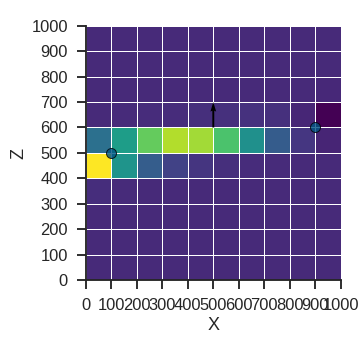

In [27]:
%matplotlib notebook
point = 0

gp.plot.plot_section(geo_data, 0,
                     block=jac[:100, point, 2].reshape(geo_data.grid.regular_grid.resolution), show_data=True,
                     cmap='viridis', show_grid=True, norm=None)

If we plot the gradient respect the point 0 (left), we can observe that the high rate changes are concentrated around the interface line of the two surfaces. Also since the model is simetric we can expect the same gradient for the other point:

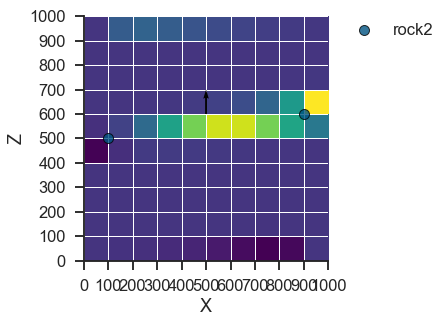

In [14]:
point = 1

gp.plot.plot_section(geo_data, 0,
                     block=jac[:100, point, 2].reshape(geo_data.grid.regular_grid.resolution), show_data=True,
                     cmap='viridis', show_grid=True, norm=None)

### Gradient?

In [24]:
respect = geo_data.interpolator.theano_graph.input_parameters_loop[4]
th_f_g = theano.function(geo_data.interpolator.theano_graph.input_parameters_loop,
                         T.grad((geo_data.interpolator.theano_graph.compute_series()[0][-1]).sum(), 
                                respect),
                          # mode=NanGuardMode(nan_is_error=True),
                         on_unused_input='ignore')
print("Respect: " + str(respect))

Respect: All the surface_points points at once


In [25]:
grad = th_f_g(*geo_data.interpolator.get_python_input_block())

n_surface_0 __str__ = [[0.]]
a __str__ = 1.3927127
n_surface_1 __str__ = [[1.]]
b __str__ = 0.8123463
drift[slice_init:slice_init+1][0] __str__ = [[1.]]
n_surface_0 __str__ = [[2.]]
a __str__ = 0.8123463
n_surface_1 __str__ = [[0.]]
b __str__ = 0.09997714
drift[slice_init:slice_init+1][0] __str__ = [[2.]]
n_surface_0 __str__ = [[0.]]
a __str__ = 1.3927127
n_surface_1 __str__ = [[1.]]
b __str__ = 0.8123463
drift[slice_init:slice_init+1][0] __str__ = [[1.]]
n_surface_0 __str__ = [[2.]]
a __str__ = 0.8123463
n_surface_1 __str__ = [[0.]]
b __str__ = 0.09997714
drift[slice_init:slice_init+1][0] __str__ = [[2.]]
n_surface_0 __str__ = [[2.]]
a __str__ = 0.8123463
n_surface_1 __str__ = [[0.]]
b __str__ = 0.09997714
drift[slice_init:slice_init+1][0] __str__ = [[2.]]
n_surface_0 __str__ = [[0.]]
a __str__ = 1.3927127
n_surface_1 __str__ = [[1.]]
b __str__ = 0.8123463
drift[slice_init:slice_init+1][0] __str__ = [[1.]]


ValueError: array must not contain infs or NaNs
Apply node that caused the error: Solve{A_structure='general', lower=True, overwrite_A=False, overwrite_b=False}(HostFromGpu(gpuarray).0, HostFromGpu(gpuarray).0)
Toposort index: 956
Inputs types: [TensorType(float32, matrix), TensorType(float32, vector)]
Inputs shapes: [(7, 7), (7,)]
Inputs strides: [(4, 28), (4,)]
Inputs values: ['not shown', 'not shown']
Inputs type_num: [11, 11]
Outputs clients: [[GpuFromHost<None>(Solve{A_structure='general', lower=True, overwrite_A=False, overwrite_b=False}.0), GpuFromHost<None>(Solve{A_structure='general', lower=True, overwrite_A=False, overwrite_b=False}.0)]]

Backtrace when the node is created(use Theano flag traceback.limit=N to make it longer):
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1326, in access_grad_cache
    term = access_term_cache(node)[idx]
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1021, in access_term_cache
    output_grads = [access_grad_cache(var) for var in node.outputs]
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1021, in <listcomp>
    output_grads = [access_grad_cache(var) for var in node.outputs]
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1326, in access_grad_cache
    term = access_term_cache(node)[idx]
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1021, in access_term_cache
    output_grads = [access_grad_cache(var) for var in node.outputs]
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1021, in <listcomp>
    output_grads = [access_grad_cache(var) for var in node.outputs]
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1326, in access_grad_cache
    term = access_term_cache(node)[idx]
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1162, in access_term_cache
    new_output_grads)
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1326, in access_grad_cache
    term = access_term_cache(node)[idx]
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1021, in access_term_cache
    output_grads = [access_grad_cache(var) for var in node.outputs]
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1021, in <listcomp>
    output_grads = [access_grad_cache(var) for var in node.outputs]
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1326, in access_grad_cache
    term = access_term_cache(node)[idx]
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1021, in access_term_cache
    output_grads = [access_grad_cache(var) for var in node.outputs]
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1021, in <listcomp>
    output_grads = [access_grad_cache(var) for var in node.outputs]
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1326, in access_grad_cache
    term = access_term_cache(node)[idx]
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1162, in access_term_cache
    new_output_grads)

Debugprint of the apply node: 
Solve{A_structure='general', lower=True, overwrite_A=False, overwrite_b=False} [id A] <TensorType(float32, vector)> ''   
 |HostFromGpu(gpuarray) [id B] <TensorType(float32, matrix)> ''   
 | |InplaceGpuDimShuffle{1,0} [id C] <GpuArrayType<None>(float32, matrix)> ''   
 |   |GpuIncSubtensor{Set;int64::, int64:int64:} [id D] <GpuArrayType<None>(float32, matrix)> ''   
 |     |GpuIncSubtensor{Set;int64::, int64:int64:} [id E] <GpuArrayType<None>(float32, matrix)> ''   
 |     | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id F] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id G] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | |GpuIncSubtensor{Set;int64:int64:, int64::} [id H] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id I] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id J] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id K] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64::} [id L] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id M] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id N] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id O] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | |GpuAlloc<None> [id P] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |GpuArrayConstant{0.0} [id Q] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | | | |HostFromGpu(gpuarray) [id R] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id S] <GpuArrayType<None>(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   |GpuElemwise{add,no_inplace} [id T] <GpuArrayType<None>(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | |GpuFromHost<None> [id U] <GpuArrayType<None>(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | |Elemwise{add,no_inplace} [id V] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | |   |Subtensor{int64} [id W] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | |   | |Shape [id X] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | |   | | |GpuReshape{2} [id Y] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | |   | |   |InplaceGpuDimShuffle{0,2,1,3} [id Z] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 |     | | | | | | | | | | | | |   | |   | |   | |GpuAlloc<None> [id BA] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 |     | | | | | | | | | | | | |   | |   | |   |   |GpuSubtensor{int32:int32:, ::} [id BB] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | |   | |   |   | |Position of the dips_copy[Gpua] [id BC] <GpuArrayType<None>(float32, matrix)>
 |     | | | | | | | | | | | | |   | |   | |   |   | |ScalarFromTensor [id BD] <int32> ''   
 |     | | | | | | | | | | | | |   | |   | |   |   | | |HostFromGpu(gpuarray) [id BE] <TensorType(int32, scalar)> ''   
 |     | | | | | | | | | | | | |   | |   | |   |   | |   |Length of foliations in every series[t][Gpua] [id BF] <GpuArrayType<None>(int32, scalar)>
 |     | | | | | | | | | | | | |   | |   | |   |   | |ScalarFromTensor [id BG] <int32> ''   
 |     | | | | | | | | | | | | |   | |   | |   |   |   |HostFromGpu(gpuarray) [id BH] <TensorType(int32, scalar)> ''   
 |     | | | | | | | | | | | | |   | |   | |   |   |     |Length of foliations in every series[t+1][Gpua] [id BI] <GpuArrayType<None>(int32, scalar)>
 |     | | | | | | | | | | | | |   | |   | |   |   |TensorConstant{3} [id BJ] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |   | |   | |   |   |TensorConstant{1} [id BK] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |   | |   | |   |   |Subtensor{int64} [id BL] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | |   | |   |   | |Shape [id BM] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | |   | |   |   | | |GpuSubtensor{int32:int32:, ::} [id BB] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | |   | |   |   | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | | |   | |   | |   |   |Subtensor{int64} [id BO] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | |   | |   |     |Shape [id BM] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | |   | |   |     |Constant{1} [id BP] <int64>
 |     | | | | | | | | | | | | |   | |   | |   |MakeVector{dtype='int64'} [id BQ] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | |   | |     |Elemwise{mul,no_inplace} [id BR] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | |   | |     | |Subtensor{int64} [id BL] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | |   | |     | |TensorConstant{3} [id BJ] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |   | |   | |     |Elemwise{mul,no_inplace} [id BS] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | |   | |       |Subtensor{int64} [id BO] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | |   | |       |TensorConstant{1} [id BK] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |   | |   | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | | |   | |   |Subtensor{int64} [id BT] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | |     |Shape [id BU] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | |     | |GpuSubtensor{int32:int32:, ::} [id BV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | |     |   |GpuAdvancedSubtensor1 [id BW] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | |     |   | |All the surface_points points at once_copy[Gpua] [id BX] <GpuArrayType<None>(float32, matrix)>
 |     | | | | | | | | | | | | |   | |     |   | |GpuContiguous [id BY] <GpuArrayType<None>(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | |     |   |   |GpuFromHost<None> [id BZ] <GpuArrayType<None>(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | |     |   |     |Subtensor{int64} [id CA] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | |     |   |       |Nonzero [id CB] <TensorType(int64, matrix)> ''   
 |     | | | | | | | | | | | | |   | |     |   |       | |HostFromGpu(gpuarray) [id CC] <TensorType(int16, vector)> ''   
 |     | | | | | | | | | | | | |   | |     |   |       |   |GpuAdvancedIncSubtensor1{inplace=False, set_instead_of_inc=True} [id CD] <GpuArrayType<None>(int16, vector)> ''   
 |     | | | | | | | | | | | | |   | |     |   |       |     |GpuAlloc<None> [id CE] <GpuArrayType<None>(int16, vector)> ''   
 |     | | | | | | | | | | | | |   | |     |   |       |     | |GpuArrayConstant{1} [id CF] <GpuArrayType<None>(int16, scalar)>
 |     | | | | | | | | | | | | |   | |     |   |       |     | |Subtensor{int64} [id CG] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | |     |   |       |     |   |Shape [id CH] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | |     |   |       |     |   | |All the surface_points points at once_copy[Gpua] [id BX] <GpuArrayType<None>(float32, matrix)>
 |     | | | | | | | | | | | | |   | |     |   |       |     |   |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | | |   | |     |   |       |     |GpuArrayConstant{0} [id CI] <GpuArrayType<None>(int8, scalar)>
 |     | | | | | | | | | | | | |   | |     |   |       |     |CumOp{None, add} [id CJ] <TensorType(int32, vector)> ''   
 |     | | | | | | | | | | | | |   | |     |   |       |       |HostFromGpu(gpuarray) [id CK] <TensorType(int32, vector)> ''   
 |     | | | | | | | | | | | | |   | |     |   |       |         |GpuJoin [id CL] <GpuArrayType<None>(int32, vector)> ''   
 |     | | | | | | | | | | | | |   | |     |   |       |           |TensorConstant{0} [id CM] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |   | |     |   |       |           |GpuArrayConstant{[0]} [id CN] <GpuArrayType<None>(int8, vector)>
 |     | | | | | | | | | | | | |   | |     |   |       |           |GpuElemwise{add,no_inplace} [id CO] <GpuArrayType<None>(int32, vector)> ''   
 |     | | | | | | | | | | | | |   | |     |   |       |             |GpuSubtensor{:int64:} [id CP] <GpuArrayType<None>(int32, vector)> ''   
 |     | | | | | | | | | | | | |   | |     |   |       |             | |Number of points per surface used to split rest-ref_copy[Gpua] [id CQ] <GpuArrayType<None>(int32, vector)>
 |     | | | | | | | | | | | | |   | |     |   |       |             | |Constant{-1} [id CR] <int64>
 |     | | | | | | | | | | | | |   | |     |   |       |             |GpuArrayConstant{[1]} [id CS] <GpuArrayType<None>(int8, (True,))>
 |     | | | | | | | | | | | | |   | |     |   |       |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | | |   | |     |   |ScalarFromTensor [id CT] <int32> ''   
 |     | | | | | | | | | | | | |   | |     |   | |HostFromGpu(gpuarray) [id CU] <TensorType(int32, scalar)> ''   
 |     | | | | | | | | | | | | |   | |     |   |   |Length of surface_points in every series[t][Gpua] [id CV] <GpuArrayType<None>(int32, scalar)>
 |     | | | | | | | | | | | | |   | |     |   |ScalarFromTensor [id CW] <int32> ''   
 |     | | | | | | | | | | | | |   | |     |     |HostFromGpu(gpuarray) [id CX] <TensorType(int32, scalar)> ''   
 |     | | | | | | | | | | | | |   | |     |       |Length of surface_points in every series[t+1][Gpua] [id CY] <GpuArrayType<None>(int32, scalar)>
 |     | | | | | | | | | | | | |   | |     |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | | |   | |Grade of the universal drift[t][Gpua] [id CZ] <GpuArrayType<None>(int32, scalar)>
 |     | | | | | | | | | | | | |   |GpuFromHost<None> [id DA] <GpuArrayType<None>(int32, scalar)> ''   
 |     | | | | | | | | | | | | |     |Elemwise{Cast{int32}} [id DB] <TensorType(int32, scalar)> ''   
 |     | | | | | | | | | | | | |       |Subtensor{int64} [id DC] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |         |Shape [id DD] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |         | |GpuElemwise{mul,no_inplace} [id DE] <GpuArrayType<None>(float64, matrix)> ''   
 |     | | | | | | | | | | | | |         |   |GpuAdvancedSubtensor [id DF] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |         |   | |block matrix[t-1][Gpua] [id DG] <GpuArrayType<None>(float32, 3D)>
 |     | | | | | | | | | | | | |         |   | |Subtensor{int64} [id DH] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |         |   | | |Nonzero [id DI] <TensorType(int64, matrix)> ''   
 |     | | | | | | | | | | | | |         |   | | | |HostFromGpu(gpuarray) [id DJ] <TensorType(int8, vector)> ''   
 |     | | | | | | | | | | | | |         |   | | |   |GpuElemwise{Cast{int8}}[]<gpuarray> [id DK] <GpuArrayType<None>(int8, vector)> ''   
 |     | | | | | | | | | | | | |         |   | | |     |GpuSubtensor{::, int8} [id DL] <GpuArrayType<None>(int64, vector)> ''   
 |     | | | | | | | | | | | | |         |   | | |       |fault relation matrix_copy[Gpua] [id DM] <GpuArrayType<None>(int64, matrix)>
 |     | | | | | | | | | | | | |         |   | | |       |ScalarFromTensor [id DN] <int8> ''   
 |     | | | | | | | | | | | | |         |   | | |         |HostFromGpu(gpuarray) [id DO] <TensorType(int8, scalar)> ''   
 |     | | | | | | | | | | | | |         |   | | |           |GpuElemwise{Cast{int8}}[]<gpuarray> [id DP] <GpuArrayType<None>(int8, scalar)> ''   
 |     | | | | | | | | | | | | |         |   | | |             |<GpuArrayType<None>(int32, scalar)> [id DQ] <GpuArrayType<None>(int32, scalar)>
 |     | | | | | | | | | | | | |         |   | | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | | |         |   | |TensorConstant{0} [id DR] <TensorType(int64, scalar)>
 |     | | | | | | | | | | | | |         |   | |SliceConstant{None, None, None} [id DS] <slice>
 |     | | | | | | | | | | | | |         |   |InplaceGpuDimShuffle{x,x} [id DT] <GpuArrayType<None>(float64, (True, True))> ''   
 |     | | | | | | | | | | | | |         |     |<GpuArrayType<None>(float64, scalar)> [id DU] <GpuArrayType<None>(float64, scalar)>
 |     | | | | | | | | | | | | |         |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | | |HostFromGpu(gpuarray) [id DV] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | |   |GpuElemwise{add,no_inplace} [id S] <GpuArrayType<None>(int64, scalar)> ''   
 |     | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DW] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |GpuElemwise{switch,no_inplace} [id DX] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | |GpuElemwise{eq,no_inplace} [id DY] <GpuArrayType<None>(bool, matrix)> ''   
 |     | | | | | | | | | | | | | | |GpuElemwise{sqrt,no_inplace} [id DZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | | |GpuElemwise{maximum,no_inplace} [id EA] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | |   |GpuElemwise{sub,no_inplace} [id EB] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | |   | |GpuElemwise{add,no_inplace} [id EC] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | |   | | |GpuReshape{2} [id ED] <GpuArrayType<None>(float32, col)> ''   
 |     | | | | | | | | | | | | | | |   | | | |GpuCAReduceCuda{add}{1} [id EE] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | | | |   | | | | |GpuElemwise{pow,no_inplace} [id EF] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | |   | | | |   |GpuReshape{2} [id Y] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | |   | | | |   |GpuArrayConstant{[[2.]]} [id EG] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | | | | | |   | | | |MakeVector{dtype='int64'} [id EH] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | | | |   | | |   |Subtensor{int64} [id W] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | | | |   | | |   |TensorConstant{1} [id EI] <TensorType(int64, scalar)>
 |     | | | | | | | | | | | | | | |   | | |GpuReshape{2} [id EJ] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{1} [id EE] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | | | |   | |   |MakeVector{dtype='int64'} [id EK] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | | | |   | |     |TensorConstant{1} [id EI] <TensorType(int64, scalar)>
 |     | | | | | | | | | | | | | | |   | |     |Subtensor{int64} [id W] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | | | |   | |GpuElemwise{mul,no_inplace} [id EL] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | |   |   |GpuArrayConstant{[[2]]} [id EM] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | | | | | | | | |   |   |GpuDot22 [id EN] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | |   |     |GpuReshape{2} [id Y] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{1,0} [id EO] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | |   |       |GpuReshape{2} [id Y] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | |   |GpuArrayConstant{[[1.e-12]]} [id EP] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | | | | | |GpuArrayConstant{[[0]]} [id EQ] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | | | | | | | |GpuArrayConstant{[[0]]} [id ER] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | | | | | | | |GpuElemwise{sub,no_inplace} [id ES] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |GpuElemwise{mul,no_inplace} [id ET] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | |GpuElemwise{true_div,no_inplace} [id EU] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | | |GpuElemwise{mul,no_inplace} [id EV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | | | |GpuJoin [id EW] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | | | | |TensorConstant{0} [id EX] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |   | | | | |GpuReshape{2} [id EY] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | | | | | |InplaceGpuDimShuffle{0,2,1,3} [id EZ] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 |     | | | | | | | | | | | | |   | | | | | | |GpuAlloc<None> [id FA] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 |     | | | | | | | | | | | | |   | | | | | |   |GpuElemwise{sub,no_inplace} [id FB] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   | |InplaceGpuDimShuffle{x,0} [id FC] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   | | |GpuSubtensor{::, int64} [id FD] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   | |   |GpuSubtensor{int32:int32:, ::} [id BB] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   | |   |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | | |   | | | | | |   | |GpuReshape{2} [id FE] <GpuArrayType<None>(float32, col)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   |   |GpuSubtensor{::, int64} [id FD] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   |   |MakeVector{dtype='int64'} [id FF] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   |     |Subtensor{int64} [id FG] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   |     | |Shape [id FH] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   |     | | |GpuSubtensor{::, int64} [id FD] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   |     | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | | |   | | | | | |   |     |TensorConstant{1} [id EI] <TensorType(int64, scalar)>
 |     | | | | | | | | | | | | |   | | | | | |   |TensorConstant{1} [id BK] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |   | | | | | |   |TensorConstant{3} [id BJ] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |   | | | | | |   |Subtensor{int64} [id FI] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   | |Shape [id FJ] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   | | |GpuElemwise{sub,no_inplace} [id FB] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | | |   | | | | | |   |Subtensor{int64} [id FK] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | | | |     |Shape [id FJ] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | | | | | |     |Constant{1} [id BP] <int64>
 |     | | | | | | | | | | | | |   | | | | | |MakeVector{dtype='int64'} [id FL] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | | | | |   |Elemwise{mul,no_inplace} [id FM] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | | |   | |Subtensor{int64} [id FI] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | | |   | |TensorConstant{1} [id BK] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |   | | | | |   |Elemwise{mul,no_inplace} [id FN] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | | |     |Subtensor{int64} [id FK] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | | |     |TensorConstant{3} [id BJ] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |   | | | | |GpuReshape{2} [id FO] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | | | | | |InplaceGpuDimShuffle{0,2,1,3} [id FP] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 |     | | | | | | | | | | | | |   | | | | | | |GpuAlloc<None> [id FQ] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 |     | | | | | | | | | | | | |   | | | | | |   |GpuElemwise{sub,no_inplace} [id FR] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   | |InplaceGpuDimShuffle{x,0} [id FS] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   | | |GpuSubtensor{::, int64} [id FT] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   | |   |GpuSubtensor{int32:int32:, ::} [id BB] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   | |   |Constant{1} [id BP] <int64>
 |     | | | | | | | | | | | | |   | | | | | |   | |GpuReshape{2} [id FU] <GpuArrayType<None>(float32, col)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   |   |GpuSubtensor{::, int64} [id FT] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   |   |MakeVector{dtype='int64'} [id FV] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   |     |Subtensor{int64} [id FW] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   |     | |Shape [id FX] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   |     | | |GpuSubtensor{::, int64} [id FT] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   |     | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | | |   | | | | | |   |     |TensorConstant{1} [id EI] <TensorType(int64, scalar)>
 |     | | | | | | | | | | | | |   | | | | | |   |TensorConstant{1} [id BK] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |   | | | | | |   |TensorConstant{3} [id BJ] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |   | | | | | |   |Subtensor{int64} [id FY] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   | |Shape [id FZ] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   | | |GpuElemwise{sub,no_inplace} [id FR] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | | | | | |   | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | | |   | | | | | |   |Subtensor{int64} [id GA] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | | | |     |Shape [id FZ] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | | | | | |     |Constant{1} [id BP] <int64>
 |     | | | | | | | | | | | | |   | | | | | |MakeVector{dtype='int64'} [id GB] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | | | | |   |Elemwise{mul,no_inplace} [id GC] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | | |   | |Subtensor{int64} [id FY] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | | |   | |TensorConstant{1} [id BK] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |   | | | | |   |Elemwise{mul,no_inplace} [id GD] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | | |     |Subtensor{int64} [id GA] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | | |     |TensorConstant{3} [id BJ] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |   | | | | |GpuReshape{2} [id GE] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | | | |   |InplaceGpuDimShuffle{0,2,1,3} [id GF] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 |     | | | | | | | | | | | | |   | | | |   | |GpuAlloc<None> [id GG] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 |     | | | | | | | | | | | | |   | | | |   |   |GpuElemwise{sub,no_inplace} [id GH] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | | | |   |   | |InplaceGpuDimShuffle{x,0} [id GI] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | | | | | | | |   | | | |   |   | | |GpuSubtensor{::, int64} [id GJ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | |   | | | |   |   | |   |GpuSubtensor{int32:int32:, ::} [id BB] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | | | |   |   | |   |Constant{2} [id GK] <int64>
 |     | | | | | | | | | | | | |   | | | |   |   | |GpuReshape{2} [id GL] <GpuArrayType<None>(float32, col)> ''   
 |     | | | | | | | | | | | | |   | | | |   |   |   |GpuSubtensor{::, int64} [id GJ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | |   | | | |   |   |   |MakeVector{dtype='int64'} [id GM] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | | | |   |   |     |Subtensor{int64} [id GN] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | |   |   |     | |Shape [id GO] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | | | |   |   |     | | |GpuSubtensor{::, int64} [id GJ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | |   | | | |   |   |     | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | | |   | | | |   |   |     |TensorConstant{1} [id EI] <TensorType(int64, scalar)>
 |     | | | | | | | | | | | | |   | | | |   |   |TensorConstant{1} [id BK] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |   | | | |   |   |TensorConstant{3} [id BJ] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |   | | | |   |   |Subtensor{int64} [id GP] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | |   |   | |Shape [id GQ] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | | | |   |   | | |GpuElemwise{sub,no_inplace} [id GH] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | | | |   |   | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | | |   | | | |   |   |Subtensor{int64} [id GR] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | |   |     |Shape [id GQ] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | | | |   |     |Constant{1} [id BP] <int64>
 |     | | | | | | | | | | | | |   | | | |   |MakeVector{dtype='int64'} [id GS] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | | |   | | | |     |Elemwise{mul,no_inplace} [id GT] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | |     | |Subtensor{int64} [id GP] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | |     | |TensorConstant{1} [id BK] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |   | | | |     |Elemwise{mul,no_inplace} [id GU] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | |       |Subtensor{int64} [id GR] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |   | | | |       |TensorConstant{3} [id BJ] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |   | | | |InplaceGpuDimShuffle{1,0} [id GV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | | |   |GpuJoin [id EW] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id GW] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | |   |GpuElemwise{sqrt,no_inplace} [id DZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   | |   |GpuArrayConstant{[[2.]]} [id GX] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | | | |   | |GpuElemwise{add,no_inplace} [id GY] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |   |GpuElemwise{mul,no_inplace} [id GZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |   | |GpuElemwise{lt,no_inplace} [id HA] <GpuArrayType<None>(bool, matrix)> ''   
 |     | | | | | | | | | | | | |   |   | | |GpuElemwise{sqrt,no_inplace} [id DZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |   | | |InplaceGpuDimShuffle{x,x} [id HB] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | | | |   |   | |   |Range_copy[Gpua] [id HC] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id HD] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |   |   |InplaceGpuDimShuffle{x,x} [id HE] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | | | |   |   |   | |GpuElemwise{neg,no_inplace} [id HF] <GpuArrayType<None>(float32, scalar)> ''   
 |     | | | | | | | | | | | | |   |   |   |   |Covariance at 0_copy[Gpua] [id HG] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | | | |   |   |   |GpuElemwise{add,no_inplace} [id HH] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |   |     |GpuElemwise{sub,no_inplace} [id HI] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |   |     | |GpuElemwise{add,no_inplace} [id HJ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |   |     | | |InplaceGpuDimShuffle{x,x} [id HK] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | | | |   |   |     | | | |GpuElemwise{true_div,no_inplace} [id HL] <GpuArrayType<None>(float32, scalar)> ''   
 |     | | | | | | | | | | | | |   |   |     | | |   |GpuArrayConstant{-14} [id HM] <GpuArrayType<None>(int8, scalar)>
 |     | | | | | | | | | | | | |   |   |     | | |   |GpuElemwise{pow,no_inplace} [id HN] <GpuArrayType<None>(float32, scalar)> ''   
 |     | | | | | | | | | | | | |   |   |     | | |     |Range_copy[Gpua] [id HC] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | | | |   |   |     | | |     |GpuArrayConstant{2.0} [id HO] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | | | |   |   |     | | |GpuElemwise{true_div,no_inplace} [id HP] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |   |     | |   |GpuElemwise{mul,no_inplace} [id HQ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |   |     | |   | |GpuArrayConstant{[[26.25]]} [id HR] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | | | |   |   |     | |   | |GpuElemwise{sqrt,no_inplace} [id DZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |   |     | |   |InplaceGpuDimShuffle{x,x} [id HS] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | | | |   |   |     | |     |GpuElemwise{pow,no_inplace} [id HT] <GpuArrayType<None>(float32, scalar)> ''   
 |     | | | | | | | | | | | | |   |   |     | |       |Range_copy[Gpua] [id HC] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | | | |   |   |     | |       |GpuArrayConstant{3.0} [id HU] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | | | |   |   |     | |GpuElemwise{true_div,no_inplace} [id HV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |   |     |   |GpuElemwise{mul,no_inplace} [id HW] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |   |     |   | |GpuArrayConstant{[[17.5]]} [id HX] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | | | |   |   |     |   | |GpuElemwise{pow,no_inplace} [id HY] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |   |     |   |   |GpuElemwise{sqrt,no_inplace} [id DZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |   |     |   |   |GpuArrayConstant{[[3.]]} [id HZ] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | | | |   |   |     |   |InplaceGpuDimShuffle{x,x} [id IA] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | | | |   |   |     |     |GpuElemwise{pow,no_inplace} [id IB] <GpuArrayType<None>(float32, scalar)> ''   
 |     | | | | | | | | | | | | |   |   |     |       |Range_copy[Gpua] [id HC] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | | | |   |   |     |       |GpuArrayConstant{5.0} [id IC] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | | | |   |   |     |GpuElemwise{true_div,no_inplace} [id ID] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |   |       |GpuElemwise{mul,no_inplace} [id IE] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |   |       | |GpuArrayConstant{[[5.25]]} [id IF] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | | | |   |   |       | |GpuElemwise{pow,no_inplace} [id IG] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |   |       |   |GpuElemwise{sqrt,no_inplace} [id DZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |   |       |   |GpuArrayConstant{[[5.]]} [id IH] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | | | |   |   |       |InplaceGpuDimShuffle{x,x} [id II] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | | | |   |   |         |GpuElemwise{pow,no_inplace} [id IJ] <GpuArrayType<None>(float32, scalar)> ''   
 |     | | | | | | | | | | | | |   |   |           |Range_copy[Gpua] [id HC] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | | | |   |   |           |GpuArrayConstant{7.0} [id IK] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | | | |   |   |GpuElemwise{true_div,no_inplace} [id IL] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |     |GpuElemwise{mul,no_inplace} [id IM] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |     | |GpuElemwise{mul,no_inplace} [id IN] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |     | | |GpuElemwise{mul,no_inplace} [id IO] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |     | | | |GpuElemwise{lt,no_inplace} [id HA] <GpuArrayType<None>(bool, matrix)> ''   
 |     | | | | | | | | | | | | |   |     | | | |InplaceGpuDimShuffle{x,x} [id IP] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | | | |   |     | | |   |Covariance at 0_copy[Gpua] [id HG] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | | | |   |     | | |GpuArrayConstant{[[7]]} [id IQ] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | | | | | | |   |     | |GpuElemwise{sub,no_inplace} [id IR] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |     |   |GpuElemwise{add,no_inplace} [id IS] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |     |   | |GpuElemwise{sub,no_inplace} [id IT] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |     |   | | |GpuElemwise{mul,no_inplace} [id IU] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |     |   | | | |GpuArrayConstant{[[9]]} [id IV] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | | | | | | |   |     |   | | | |GpuElemwise{pow,no_inplace} [id IG] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |     |   | | |GpuElemwise{mul,no_inplace} [id IW] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |     |   | |   |InplaceGpuDimShuffle{x,x} [id IX] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | | | |   |     |   | |   | |GpuElemwise{mul,no_inplace} [id IY] <GpuArrayType<None>(float32, scalar)> ''   
 |     | | | | | | | | | | | | |   |     |   | |   |   |GpuArrayConstant{20} [id IZ] <GpuArrayType<None>(int8, scalar)>
 |     | | | | | | | | | | | | |   |     |   | |   |   |GpuElemwise{pow,no_inplace} [id HN] <GpuArrayType<None>(float32, scalar)> ''   
 |     | | | | | | | | | | | | |   |     |   | |   |GpuElemwise{pow,no_inplace} [id HY] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |     |   | |GpuElemwise{mul,no_inplace} [id JA] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |     |   |   |InplaceGpuDimShuffle{x,x} [id JB] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | | | |   |     |   |   | |GpuElemwise{mul,no_inplace} [id JC] <GpuArrayType<None>(float32, scalar)> ''   
 |     | | | | | | | | | | | | |   |     |   |   |   |GpuArrayConstant{15} [id JD] <GpuArrayType<None>(int8, scalar)>
 |     | | | | | | | | | | | | |   |     |   |   |   |GpuElemwise{pow,no_inplace} [id JE] <GpuArrayType<None>(float32, scalar)> ''   
 |     | | | | | | | | | | | | |   |     |   |   |     |Range_copy[Gpua] [id HC] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | | | |   |     |   |   |     |GpuArrayConstant{4.0} [id JF] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | | | |   |     |   |   |GpuElemwise{sqrt,no_inplace} [id DZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |   |     |   |InplaceGpuDimShuffle{x,x} [id JG] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | | | |   |     |     |GpuElemwise{mul,no_inplace} [id JH] <GpuArrayType<None>(float32, scalar)> ''   
 |     | | | | | | | | | | | | |   |     |       |GpuArrayConstant{4} [id JI] <GpuArrayType<None>(int8, scalar)>
 |     | | | | | | | | | | | | |   |     |       |GpuElemwise{pow,no_inplace} [id IB] <GpuArrayType<None>(float32, scalar)> ''   
 |     | | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{x,x} [id JJ] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | | | |   |       |GpuElemwise{mul,no_inplace} [id JK] <GpuArrayType<None>(float32, scalar)> ''   
 |     | | | | | | | | | | | | |   |         |GpuArrayConstant{2} [id JL] <GpuArrayType<None>(int8, scalar)>
 |     | | | | | | | | | | | | |   |         |GpuElemwise{pow,no_inplace} [id IJ] <GpuArrayType<None>(float32, scalar)> ''   
 |     | | | | | | | | | | | | |   |GpuElemwise{mul,no_inplace} [id JM] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |     |GpuElemwise{mul,no_inplace} [id JN] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |     | |GpuElemwise{mul,no_inplace} [id JO] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |     | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id JP] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |     | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id JQ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |     | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id JR] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |     | | | | | |GpuElemwise{second,no_inplace} [id JS] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |     | | | | | | |GpuElemwise{sqrt,no_inplace} [id DZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |     | | | | | | |GpuArrayConstant{[[0.]]} [id JT] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | | | |     | | | | | |GpuArrayConstant{1} [id JU] <GpuArrayType<None>(int8, scalar)>
 |     | | | | | | | | | | | | |     | | | | | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | | |     | | | | | |ScalarFromTensor [id JV] <int64> ''   
 |     | | | | | | | | | | | | |     | | | | | | |Subtensor{int64} [id BL] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |     | | | | | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | | |     | | | | | |ScalarFromTensor [id JV] <int64> ''   
 |     | | | | | | | | | | | | |     | | | | |GpuArrayConstant{1} [id JW] <GpuArrayType<None>(int8, scalar)>
 |     | | | | | | | | | | | | |     | | | | |ScalarFromTensor [id JV] <int64> ''   
 |     | | | | | | | | | | | | |     | | | | |ScalarFromTensor [id JX] <int64> ''   
 |     | | | | | | | | | | | | |     | | | | | |Elemwise{mul,no_inplace} [id JY] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |     | | | | |   |Subtensor{int64} [id BL] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |     | | | | |   |TensorConstant{2} [id JZ] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | |     | | | | |ScalarFromTensor [id JV] <int64> ''   
 |     | | | | | | | | | | | | |     | | | | |ScalarFromTensor [id JX] <int64> ''   
 |     | | | | | | | | | | | | |     | | | |GpuArrayConstant{1} [id KA] <GpuArrayType<None>(int8, scalar)>
 |     | | | | | | | | | | | | |     | | | |ScalarFromTensor [id JX] <int64> ''   
 |     | | | | | | | | | | | | |     | | | |ScalarFromTensor [id KB] <int64> ''   
 |     | | | | | | | | | | | | |     | | | | |Elemwise{mul,no_inplace} [id BR] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | |     | | | |ScalarFromTensor [id JX] <int64> ''   
 |     | | | | | | | | | | | | |     | | | |ScalarFromTensor [id KB] <int64> ''   
 |     | | | | | | | | | | | | |     | | |GpuElemwise{lt,no_inplace} [id HA] <GpuArrayType<None>(bool, matrix)> ''   
 |     | | | | | | | | | | | | |     | |InplaceGpuDimShuffle{x,x} [id IP] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | | | |     |GpuElemwise{add,no_inplace} [id HH] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id KC] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | |   |GpuEye{dtype='float32', context_name=None} [id KD] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | |   | |Subtensor{int64} [id KE] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | |   | | |Shape [id KF] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | | |   | | | |GpuElemwise{switch,no_inplace} [id DX] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | |   | | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | |   | |Subtensor{int64} [id KE] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | |   | |TensorConstant{0} [id KG] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | |   |InplaceGpuDimShuffle{x,0} [id KH] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | | | | | | |     |GpuSubtensor{int32:int32:} [id KI] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | |       |Nugget effect of gradients_copy[Gpua] [id KJ] <GpuArrayType<None>(float32, vector)>
 |     | | | | | | | | | | | |       |ScalarFromTensor [id KK] <int32> ''   
 |     | | | | | | | | | | | |       | |HostFromGpu(gpuarray) [id KL] <TensorType(int32, scalar)> ''   
 |     | | | | | | | | | | | |       |   |GpuElemwise{mul,no_inplace} [id KM] <GpuArrayType<None>(int32, scalar)> ''   
 |     | | | | | | | | | | | |       |     |Length of foliations in every series[t][Gpua] [id BF] <GpuArrayType<None>(int32, scalar)>
 |     | | | | | | | | | | | |       |     |GpuArrayConstant{3} [id KN] <GpuArrayType<None>(int8, scalar)>
 |     | | | | | | | | | | | |       |ScalarFromTensor [id KO] <int32> ''   
 |     | | | | | | | | | | | |         |HostFromGpu(gpuarray) [id KP] <TensorType(int32, scalar)> ''   
 |     | | | | | | | | | | | |           |GpuElemwise{mul,no_inplace} [id KQ] <GpuArrayType<None>(int32, scalar)> ''   
 |     | | | | | | | | | | | |             |Length of foliations in every series[t+1][Gpua] [id BI] <GpuArrayType<None>(int32, scalar)>
 |     | | | | | | | | | | | |             |GpuArrayConstant{3} [id KR] <GpuArrayType<None>(int8, scalar)>
 |     | | | | | | | | | | | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | |ScalarFromTensor [id KS] <int64> ''   
 |     | | | | | | | | | | | | |Subtensor{int64} [id W] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | |ScalarFromTensor [id KS] <int64> ''   
 |     | | | | | | | | | | |InplaceGpuDimShuffle{1,0} [id KT] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id KU] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id KV] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | |   | |<GpuArrayType<None>(float32, scalar)> [id KW] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | |   |InplaceGpuDimShuffle{1,0} [id KX] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |     |GpuElemwise{sub,no_inplace} [id KY] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       |GpuElemwise{mul,no_inplace} [id KZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | |GpuElemwise{mul,no_inplace} [id LA] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | | |GpuJoin [id LB] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | | | |TensorConstant{0} [id LC] <TensorType(int8, scalar)>
 |     | | | | | | | | | | |       | | | |InplaceGpuDimShuffle{1,0} [id LD] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | | | | |GpuElemwise{sub,no_inplace} [id LE] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | | | |   |InplaceGpuDimShuffle{x,0} [id FC] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | | | | | |       | | | |   |GpuReshape{2} [id LF] <GpuArrayType<None>(float32, col)> ''   
 |     | | | | | | | | | | |       | | | |     |GpuSubtensor{::, int64} [id LG] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | |       | | | |     | |GpuSubtensor{int32:int32:, ::} [id BV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | | | |     | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | |       | | | |     |MakeVector{dtype='int64'} [id LH] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |       | | | |       |Subtensor{int64} [id LI] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |       | | | |       | |Shape [id LJ] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |       | | | |       | | |GpuSubtensor{::, int64} [id LG] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | |       | | | |       | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | |       | | | |       |TensorConstant{1} [id EI] <TensorType(int64, scalar)>
 |     | | | | | | | | | | |       | | | |InplaceGpuDimShuffle{1,0} [id LK] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | | | | |GpuElemwise{sub,no_inplace} [id LL] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | | | |   |InplaceGpuDimShuffle{x,0} [id FS] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | | | | | |       | | | |   |GpuReshape{2} [id LM] <GpuArrayType<None>(float32, col)> ''   
 |     | | | | | | | | | | |       | | | |     |GpuSubtensor{::, int64} [id LN] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | |       | | | |     | |GpuSubtensor{int32:int32:, ::} [id BV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | | | |     | |Constant{1} [id BP] <int64>
 |     | | | | | | | | | | |       | | | |     |MakeVector{dtype='int64'} [id LO] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |       | | | |       |Subtensor{int64} [id LP] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |       | | | |       | |Shape [id LQ] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |       | | | |       | | |GpuSubtensor{::, int64} [id LN] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | |       | | | |       | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | |       | | | |       |TensorConstant{1} [id EI] <TensorType(int64, scalar)>
 |     | | | | | | | | | | |       | | | |InplaceGpuDimShuffle{1,0} [id LR] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | | |   |GpuElemwise{sub,no_inplace} [id LS] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | | |     |InplaceGpuDimShuffle{x,0} [id GI] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | | | | | |       | | |     |GpuReshape{2} [id LT] <GpuArrayType<None>(float32, col)> ''   
 |     | | | | | | | | | | |       | | |       |GpuSubtensor{::, int64} [id LU] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | |       | | |       | |GpuSubtensor{int32:int32:, ::} [id BV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | | |       | |Constant{2} [id GK] <int64>
 |     | | | | | | | | | | |       | | |       |MakeVector{dtype='int64'} [id LV] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |       | | |         |Subtensor{int64} [id LW] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |       | | |         | |Shape [id LX] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |       | | |         | | |GpuSubtensor{::, int64} [id LU] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | |       | | |         | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | |       | | |         |TensorConstant{1} [id EI] <TensorType(int64, scalar)>
 |     | | | | | | | | | | |       | | |GpuElemwise{lt,no_inplace} [id LY] <GpuArrayType<None>(bool, matrix)> ''   
 |     | | | | | | | | | | |       | |   |GpuElemwise{sqrt,no_inplace} [id LZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | |   | |GpuElemwise{maximum,no_inplace} [id MA] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | |   |   |GpuElemwise{sub,no_inplace} [id MB] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | |   |   | |GpuElemwise{add,no_inplace} [id MC] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | |   |   | | |GpuReshape{2} [id ED] <GpuArrayType<None>(float32, col)> ''   
 |     | | | | | | | | | | |       | |   |   | | |GpuReshape{2} [id MD] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | | | | | |       | |   |   | |   |GpuCAReduceCuda{add}{1} [id ME] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | |       | |   |   | |   | |GpuElemwise{pow,no_inplace} [id MF] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | |   |   | |   |   |GpuSubtensor{int32:int32:, ::} [id BV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | |   |   | |   |   |GpuArrayConstant{[[2.]]} [id MG] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | |       | |   |   | |   |MakeVector{dtype='int64'} [id MH] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |       | |   |   | |     |TensorConstant{1} [id EI] <TensorType(int64, scalar)>
 |     | | | | | | | | | | |       | |   |   | |     |Subtensor{int64} [id BT] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |       | |   |   | |GpuElemwise{mul,no_inplace} [id MI] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | |   |   |   |GpuArrayConstant{[[2]]} [id MJ] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | | | | |       | |   |   |   |GpuDot22 [id MK] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | |   |   |     |GpuReshape{2} [id Y] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | |   |   |     |InplaceGpuDimShuffle{1,0} [id ML] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | |   |   |       |GpuSubtensor{int32:int32:, ::} [id BV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       | |   |   |GpuArrayConstant{[[1.e-12]]} [id MM] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | |       | |   |InplaceGpuDimShuffle{x,x} [id HB] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | |       | |GpuElemwise{mul,no_inplace} [id MN] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       |   |InplaceGpuDimShuffle{x,x} [id HE] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | |       |   |GpuElemwise{add,no_inplace} [id MO] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       |     |GpuElemwise{sub,no_inplace} [id MP] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       |     | |GpuElemwise{add,no_inplace} [id MQ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       |     | | |InplaceGpuDimShuffle{x,x} [id HK] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | |       |     | | |GpuElemwise{true_div,no_inplace} [id MR] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       |     | |   |GpuElemwise{mul,no_inplace} [id MS] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       |     | |   | |GpuArrayConstant{[[26.25]]} [id MT] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | |       |     | |   | |GpuElemwise{sqrt,no_inplace} [id LZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       |     | |   |InplaceGpuDimShuffle{x,x} [id HS] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | |       |     | |GpuElemwise{true_div,no_inplace} [id MU] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       |     |   |GpuElemwise{mul,no_inplace} [id MV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       |     |   | |GpuArrayConstant{[[17.5]]} [id MW] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | |       |     |   | |GpuElemwise{pow,no_inplace} [id MX] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       |     |   |   |GpuElemwise{sqrt,no_inplace} [id LZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       |     |   |   |GpuArrayConstant{[[3.]]} [id MY] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | |       |     |   |InplaceGpuDimShuffle{x,x} [id IA] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | |       |     |GpuElemwise{true_div,no_inplace} [id MZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       |       |GpuElemwise{mul,no_inplace} [id NA] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       |       | |GpuArrayConstant{[[5.25]]} [id NB] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | |       |       | |GpuElemwise{pow,no_inplace} [id NC] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       |       |   |GpuElemwise{sqrt,no_inplace} [id LZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |       |       |   |GpuArrayConstant{[[5.]]} [id ND] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | |       |       |InplaceGpuDimShuffle{x,x} [id II] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | |       |GpuElemwise{mul,no_inplace} [id NE] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         |GpuElemwise{mul,no_inplace} [id NF] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         | |GpuJoin [id NG] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         | | |TensorConstant{0} [id NH] <TensorType(int8, scalar)>
 |     | | | | | | | | | | |         | | |InplaceGpuDimShuffle{1,0} [id NI] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         | | | |GpuElemwise{sub,no_inplace} [id NJ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         | | |   |InplaceGpuDimShuffle{x,0} [id FC] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | | | | | |         | | |   |GpuReshape{2} [id NK] <GpuArrayType<None>(float32, col)> ''   
 |     | | | | | | | | | | |         | | |     |GpuSubtensor{::, int64} [id NL] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | |         | | |     | |GpuSubtensor{int32:int32:, ::} [id NM] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         | | |     | | |GpuSubtensor{int64} [id NN] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         | | |     | | | |GpuSubtensor{int64::} [id NO] <GpuArrayType<None>(float32, 3D)> ''   
 |     | | | | | | | | | | |         | | |     | | | | |for{gpu,scan_fn} [id NP] <GpuArrayType<None>(float32, 3D)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | |Elemwise{minimum,no_inplace} [id NQ] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | |Elemwise{minimum,no_inplace} [id NR] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | | |Subtensor{int64} [id NS] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | | | |Shape [id NT] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | | | | |GpuSubtensor{int64::} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | | | |   |GpuAdvancedSubtensor1 [id NV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | | | |   | |All the surface_points points at once_copy[Gpua] [id BX] <GpuArrayType<None>(float32, matrix)>
 |     | | | | | | | | | | |         | | |     | | | | | | | | |   | |GpuContiguous [id NW] <GpuArrayType<None>(int64, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | | | |   |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id NX] <GpuArrayType<None>(int64, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | | | |   |     |GpuFromHost<None> [id NY] <GpuArrayType<None>(int32, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | | | |   |       |CumOp{None, add} [id CJ] <TensorType(int32, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | | | |   |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | |         | | |     | | | | | | | | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | |         | | |     | | | | | | | |Subtensor{int64} [id NZ] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | |   |Shape [id OA] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | |   | |Subtensor{int64:int64:} [id OB] <TensorType(int32, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | |   |   |CumOp{None, add} [id OC] <TensorType(int32, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | |   |   | |HostFromGpu(gpuarray) [id OD] <TensorType(int32, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | |   |   |   |GpuJoin [id OE] <GpuArrayType<None>(int32, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | |   |   |     |TensorConstant{0} [id OF] <TensorType(int8, scalar)>
 |     | | | | | | | | | | |         | | |     | | | | | | |   |   |     |GpuArrayConstant{[0]} [id OG] <GpuArrayType<None>(int8, vector)>
 |     | | | | | | | | | | |         | | |     | | | | | | |   |   |     |Number of points per surface used to split rest-ref_copy[Gpua] [id CQ] <GpuArrayType<None>(int32, vector)>
 |     | | | | | | | | | | |         | | |     | | | | | | |   |   |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | |         | | |     | | | | | | |   |   |Constant{-1} [id CR] <int64>
 |     | | | | | | | | | | |         | | |     | | | | | | |   |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | |         | | |     | | | | | | |Subtensor{int64} [id OH] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | |   |Shape [id OI] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | |   | |Subtensor{int64::} [id OJ] <TensorType(int32, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | |   |   |CumOp{None, add} [id OC] <TensorType(int32, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | |   |   |Constant{1} [id BP] <int64>
 |     | | | | | | | | | | |         | | |     | | | | | |   |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | |         | | |     | | | | | |GpuSubtensor{:int64:} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | |GpuSubtensor{int64::} [id NU] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | |ScalarFromTensor [id OL] <int64> ''   
 |     | | | | | | | | | | |         | | |     | | | | | |   |Elemwise{minimum,no_inplace} [id NQ] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | |GpuSubtensor{:int64:} [id OM] <GpuArrayType<None>(int32, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | |GpuFromHost<None> [id ON] <GpuArrayType<None>(int32, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | | |Subtensor{int64:int64:} [id OB] <TensorType(int32, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | |ScalarFromTensor [id OL] <int64> ''   
 |     | | | | | | | | | | |         | | |     | | | | | |GpuSubtensor{:int64:} [id OO] <GpuArrayType<None>(int32, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | |GpuFromHost<None> [id OP] <GpuArrayType<None>(int32, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | | |Subtensor{int64::} [id OJ] <TensorType(int32, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | | | |ScalarFromTensor [id OL] <int64> ''   
 |     | | | | | | | | | | |         | | |     | | | | | |GpuIncSubtensor{Set;:int64:} [id OQ] <GpuArrayType<None>(float32, 3D)> ''   
 |     | | | | | | | | | | |         | | |     | | | | |   |GpuAllocEmpty{dtype='float32', context_name=None} [id OR] <GpuArrayType<None>(float32, 3D)> ''   
 |     | | | | | | | | | | |         | | |     | | | | |   | |Elemwise{add,no_inplace} [id OS] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |         | | |     | | | | |   | | |Elemwise{minimum,no_inplace} [id NQ] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |         | | |     | | | | |   | | |Subtensor{int64} [id OT] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |         | | |     | | | | |   | |   |Shape [id OU] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | |   | |   | |Rebroadcast{0} [id OV] <GpuArrayType<None>(float32, 3D)> ''   
 |     | | | | | | | | | | |         | | |     | | | | |   | |   |   |InplaceGpuDimShuffle{x,0,1} [id OW] <GpuArrayType<None>(float32, (True, False, False))> ''   
 |     | | | | | | | | | | |         | | |     | | | | |   | |   |     |GpuAlloc<None> [id OX] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         | | |     | | | | |   | |   |       |GpuArrayConstant{0.0} [id OY] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | |         | | |     | | | | |   | |   |       |Subtensor{int64} [id OZ] <TensorType(int32, scalar)> ''   
 |     | | | | | | | | | | |         | | |     | | | | |   | |   |       | |CumOp{None, add} [id OC] <TensorType(int32, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | |   | |   |       | |Constant{-1} [id CR] <int64>
 |     | | | | | | | | | | |         | | |     | | | | |   | |   |       |TensorConstant{3} [id BJ] <TensorType(int8, scalar)>
 |     | | | | | | | | | | |         | | |     | | | | |   | |   |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | |         | | |     | | | | |   | |Subtensor{int64} [id PA] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |         | | |     | | | | |   | | |Shape [id OU] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | |   | | |Constant{1} [id BP] <int64>
 |     | | | | | | | | | | |         | | |     | | | | |   | |Subtensor{int64} [id PB] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |         | | |     | | | | |   |   |Shape [id OU] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |         | | |     | | | | |   |   |Constant{2} [id GK] <int64>
 |     | | | | | | | | | | |         | | |     | | | | |   |Rebroadcast{0} [id OV] <GpuArrayType<None>(float32, 3D)> ''   
 |     | | | | | | | | | | |         | | |     | | | | |   |ScalarFromTensor [id PC] <int64> ''   
 |     | | | | | | | | | | |         | | |     | | | | |     |Subtensor{int64} [id OT] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |         | | |     | | | | |Constant{1} [id BP] <int64>
 |     | | | | | | | | | | |         | | |     | | | |Constant{-1} [id CR] <int64>
 |     | | | | | | | | | | |         | | |     | | |ScalarFromTensor [id CT] <int32> ''   
 |     | | | | | | | | | | |         | | |     | | |ScalarFromTensor [id CW] <int32> ''   
 |     | | | | | | | | | | |         | | |     | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | |         | | |     |MakeVector{dtype='int64'} [id PD] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |         | | |       |Subtensor{int64} [id PE] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |         | | |       | |Shape [id PF] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |         | | |       | | |GpuSubtensor{::, int64} [id NL] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | |         | | |       | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | |         | | |       |TensorConstant{1} [id EI] <TensorType(int64, scalar)>
 |     | | | | | | | | | | |         | | |InplaceGpuDimShuffle{1,0} [id PG] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         | | | |GpuElemwise{sub,no_inplace} [id PH] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         | | |   |InplaceGpuDimShuffle{x,0} [id FS] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | | | | | |         | | |   |GpuReshape{2} [id PI] <GpuArrayType<None>(float32, col)> ''   
 |     | | | | | | | | | | |         | | |     |GpuSubtensor{::, int64} [id PJ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | |         | | |     | |GpuSubtensor{int32:int32:, ::} [id NM] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         | | |     | |Constant{1} [id BP] <int64>
 |     | | | | | | | | | | |         | | |     |MakeVector{dtype='int64'} [id PK] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |         | | |       |Subtensor{int64} [id PL] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |         | | |       | |Shape [id PM] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |         | | |       | | |GpuSubtensor{::, int64} [id PJ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | |         | | |       | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | |         | | |       |TensorConstant{1} [id EI] <TensorType(int64, scalar)>
 |     | | | | | | | | | | |         | | |InplaceGpuDimShuffle{1,0} [id PN] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         | |   |GpuElemwise{sub,no_inplace} [id PO] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         | |     |InplaceGpuDimShuffle{x,0} [id GI] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | | | | | |         | |     |GpuReshape{2} [id PP] <GpuArrayType<None>(float32, col)> ''   
 |     | | | | | | | | | | |         | |       |GpuSubtensor{::, int64} [id PQ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | |         | |       | |GpuSubtensor{int32:int32:, ::} [id NM] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         | |       | |Constant{2} [id GK] <int64>
 |     | | | | | | | | | | |         | |       |MakeVector{dtype='int64'} [id PR] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |         | |         |Subtensor{int64} [id PS] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |         | |         | |Shape [id PT] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |         | |         | | |GpuSubtensor{::, int64} [id PQ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | |         | |         | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | |         | |         |TensorConstant{1} [id EI] <TensorType(int64, scalar)>
 |     | | | | | | | | | | |         | |GpuElemwise{lt,no_inplace} [id PU] <GpuArrayType<None>(bool, matrix)> ''   
 |     | | | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id PV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         |   | |GpuElemwise{maximum,no_inplace} [id PW] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         |   |   |GpuElemwise{sub,no_inplace} [id PX] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         |   |   | |GpuElemwise{add,no_inplace} [id PY] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         |   |   | | |GpuReshape{2} [id ED] <GpuArrayType<None>(float32, col)> ''   
 |     | | | | | | | | | | |         |   |   | | |GpuReshape{2} [id PZ] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | | | | | |         |   |   | |   |GpuCAReduceCuda{add}{1} [id QA] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | |         |   |   | |   | |GpuElemwise{pow,no_inplace} [id QB] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         |   |   | |   |   |GpuSubtensor{int32:int32:, ::} [id NM] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         |   |   | |   |   |GpuArrayConstant{[[2.]]} [id QC] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | |         |   |   | |   |MakeVector{dtype='int64'} [id QD] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |         |   |   | |     |TensorConstant{1} [id EI] <TensorType(int64, scalar)>
 |     | | | | | | | | | | |         |   |   | |     |Subtensor{int64} [id QE] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | |         |   |   | |       |Shape [id QF] <TensorType(int64, vector)> ''   
 |     | | | | | | | | | | |         |   |   | |       | |GpuSubtensor{int32:int32:, ::} [id NM] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         |   |   | |       |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | |         |   |   | |GpuElemwise{mul,no_inplace} [id QG] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         |   |   |   |GpuArrayConstant{[[2]]} [id QH] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | | | | |         |   |   |   |GpuDot22 [id QI] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         |   |   |     |GpuReshape{2} [id Y] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         |   |   |     |InplaceGpuDimShuffle{1,0} [id QJ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         |   |   |       |GpuSubtensor{int32:int32:, ::} [id NM] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |         |   |   |GpuArrayConstant{[[1.e-12]]} [id QK] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | |         |   |InplaceGpuDimShuffle{x,x} [id HB] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | |         |GpuElemwise{mul,no_inplace} [id QL] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |           |InplaceGpuDimShuffle{x,x} [id HE] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | |           |GpuElemwise{add,no_inplace} [id QM] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |             |GpuElemwise{sub,no_inplace} [id QN] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |             | |GpuElemwise{add,no_inplace} [id QO] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |             | | |InplaceGpuDimShuffle{x,x} [id HK] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | |             | | |GpuElemwise{true_div,no_inplace} [id QP] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |             | |   |GpuElemwise{mul,no_inplace} [id QQ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |             | |   | |GpuArrayConstant{[[26.25]]} [id QR] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | |             | |   | |GpuElemwise{sqrt,no_inplace} [id PV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |             | |   |InplaceGpuDimShuffle{x,x} [id HS] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | |             | |GpuElemwise{true_div,no_inplace} [id QS] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |             |   |GpuElemwise{mul,no_inplace} [id QT] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |             |   | |GpuArrayConstant{[[17.5]]} [id QU] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | |             |   | |GpuElemwise{pow,no_inplace} [id QV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |             |   |   |GpuElemwise{sqrt,no_inplace} [id PV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |             |   |   |GpuArrayConstant{[[3.]]} [id QW] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | |             |   |InplaceGpuDimShuffle{x,x} [id IA] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | |             |GpuElemwise{true_div,no_inplace} [id QX] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |               |GpuElemwise{mul,no_inplace} [id QY] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |               | |GpuArrayConstant{[[5.25]]} [id QZ] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | |               | |GpuElemwise{pow,no_inplace} [id RA] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |               |   |GpuElemwise{sqrt,no_inplace} [id PV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |               |   |GpuArrayConstant{[[5.]]} [id RB] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | | | |               |InplaceGpuDimShuffle{x,x} [id II] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | |ScalarFromTensor [id KS] <int64> ''   
 |     | | | | | | | | | | |ScalarFromTensor [id KS] <int64> ''   
 |     | | | | | | | | | | |ScalarFromTensor [id RC] <int64> ''   
 |     | | | | | | | | | |   |Elemwise{add,no_inplace} [id V] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | |GpuSubtensor{::, :int32:} [id RD] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id RE] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id RF] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id RG] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id RH] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id RI] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id RJ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id RK] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id RL] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id RM] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id RN] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id RO] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id RP] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | | | | | | | | | |GpuAlloc<None> [id RQ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{0.0} [id RR] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | | | | | | | | | | | | | | |Elemwise{mul,no_inplace} [id BR] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | | | | | | | | | | | | |TensorConstant{9} [id RS] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{1} [id RT] <GpuArrayType<None>(int8, scalar)>
 |     | | | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id JV] <int64> ''   
 |     | | | | | | | | | | | | | | | | | | | | | | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{1} [id RU] <GpuArrayType<None>(int8, scalar)>
 |     | | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id RV] <int64> ''   
 |     | | | | | | | | | | | | | | | | | | | | | | |Elemwise{mul,no_inplace} [id RW] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | | | | | | | | | | |   |Subtensor{int64} [id BL] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | | | | | | | | | | | | | | |   |TensorConstant{1} [id BK] <TensorType(int8, scalar)>
 |     | | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id JX] <int64> ''   
 |     | | | | | | | | | | | | | | | | | | | | | |Constant{1} [id BP] <int64>
 |     | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{1} [id RX] <GpuArrayType<None>(int8, scalar)>
 |     | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id JX] <int64> ''   
 |     | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id KB] <int64> ''   
 |     | | | | | | | | | | | | | | | | | | | | |Constant{2} [id GK] <int64>
 |     | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id RY] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id RZ] <GpuArrayType<None>(float32, (True,))> ''   
 |     | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id SA] <GpuArrayType<None>(float32, scalar)> ''   
 |     | | | | | | | | | | | | | | | | | | | | |   |GpuArrayConstant{2} [id SB] <GpuArrayType<None>(int8, scalar)>
 |     | | | | | | | | | | | | | | | | | | | | |   |<GpuArrayType<None>(float32, scalar)> [id KW] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id FD] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id JV] <int64> ''   
 |     | | | | | | | | | | | | | | | | | | | |Constant{3} [id SC] <int64>
 |     | | | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id SD] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id RZ] <GpuArrayType<None>(float32, (True,))> ''   
 |     | | | | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id FT] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id RV] <int64> ''   
 |     | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id JX] <int64> ''   
 |     | | | | | | | | | | | | | | | | | | |Constant{4} [id SE] <int64>
 |     | | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id SF] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id RZ] <GpuArrayType<None>(float32, (True,))> ''   
 |     | | | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id GJ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | | | | | | |ScalarFromTensor [id JX] <int64> ''   
 |     | | | | | | | | | | | | | | | | | |ScalarFromTensor [id KB] <int64> ''   
 |     | | | | | | | | | | | | | | | | | |Constant{5} [id SG] <int64>
 |     | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id SH] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id SI] <GpuArrayType<None>(float32, (True,))> ''   
 |     | | | | | | | | | | | | | | | | | | |<GpuArrayType<None>(float32, scalar)> [id KW] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id FT] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | | | | | |ScalarFromTensor [id JV] <int64> ''   
 |     | | | | | | | | | | | | | | | | |Constant{6} [id SJ] <int64>
 |     | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id SK] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id SI] <GpuArrayType<None>(float32, (True,))> ''   
 |     | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id FD] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | | | | |ScalarFromTensor [id RV] <int64> ''   
 |     | | | | | | | | | | | | | | | |ScalarFromTensor [id JX] <int64> ''   
 |     | | | | | | | | | | | | | | | |Constant{6} [id SJ] <int64>
 |     | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id SL] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id SI] <GpuArrayType<None>(float32, (True,))> ''   
 |     | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id GJ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | | | |ScalarFromTensor [id JV] <int64> ''   
 |     | | | | | | | | | | | | | | |Constant{7} [id SM] <int64>
 |     | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id SK] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | | |ScalarFromTensor [id JX] <int64> ''   
 |     | | | | | | | | | | | | | |ScalarFromTensor [id KB] <int64> ''   
 |     | | | | | | | | | | | | | |Constant{7} [id SM] <int64>
 |     | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id SL] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | | |ScalarFromTensor [id RV] <int64> ''   
 |     | | | | | | | | | | | | |ScalarFromTensor [id JX] <int64> ''   
 |     | | | | | | | | | | | | |Constant{8} [id SN] <int64>
 |     | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id SH] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | | | | | |ScalarFromTensor [id JX] <int64> ''   
 |     | | | | | | | | | | | |ScalarFromTensor [id KB] <int64> ''   
 |     | | | | | | | | | | | |Constant{8} [id SN] <int64>
 |     | | | | | | | | | | |ScalarFromTensor [id SO] <int32> ''   
 |     | | | | | | | | | |   |HostFromGpu(gpuarray) [id SP] <TensorType(int32, scalar)> ''   
 |     | | | | | | | | | |     |Grade of the universal drift[t][Gpua] [id CZ] <GpuArrayType<None>(int32, scalar)>
 |     | | | | | | | | | |Constant{0} [id BN] <int64>
 |     | | | | | | | | | |ScalarFromTensor [id KS] <int64> ''   
 |     | | | | | | | | | |ScalarFromTensor [id RC] <int64> ''   
 |     | | | | | | | | | |ScalarFromTensor [id SQ] <int64> ''   
 |     | | | | | | | | |   |HostFromGpu(gpuarray) [id SR] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | |     |GpuElemwise{add,no_inplace} [id T] <GpuArrayType<None>(int64, scalar)> ''   
 |     | | | | | | | | |InplaceGpuDimShuffle{1,0} [id SS] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | | |GpuElemwise{add,no_inplace} [id ST] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | |   |GpuAlloc<None> [id SU] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | |   | |GpuArrayConstant{0.0} [id SV] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | |   | |Elemwise{Cast{int32}} [id DB] <TensorType(int32, scalar)> ''   
 |     | | | | | | | | |   | |Subtensor{int64} [id W] <TensorType(int64, scalar)> ''   
 |     | | | | | | | | |   |GpuArrayConstant{[[1.e-04]]} [id SW] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | | |Constant{0} [id BN] <int64>
 |     | | | | | | | | |ScalarFromTensor [id KS] <int64> ''   
 |     | | | | | | | | |ScalarFromTensor [id SQ] <int64> ''   
 |     | | | | | | | |GpuElemwise{mul,no_inplace} [id KU] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |ScalarFromTensor [id KS] <int64> ''   
 |     | | | | | | | |ScalarFromTensor [id RC] <int64> ''   
 |     | | | | | | | |Constant{0} [id BN] <int64>
 |     | | | | | | | |ScalarFromTensor [id KS] <int64> ''   
 |     | | | | | | |GpuElemwise{add,no_inplace} [id SX] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |GpuElemwise{mul,no_inplace} [id SY] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | | |InplaceGpuDimShuffle{x,x} [id SZ] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | | | |GpuElemwise{mul,no_inplace} [id TA] <GpuArrayType<None>(float32, scalar)> ''   
 |     | | | | | | | | |   |Covariance at 0_copy[Gpua] [id HG] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | |   |<GpuArrayType<None>(float32, scalar)> [id TB] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | | | |GpuElemwise{add,no_inplace} [id TC] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |GpuElemwise{sub,no_inplace} [id TD] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |GpuElemwise{sub,no_inplace} [id TE] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | |GpuElemwise{mul,no_inplace} [id TF] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | | |GpuElemwise{lt,no_inplace} [id TG] <GpuArrayType<None>(bool, matrix)> ''   
 |     | | | | | | | |   | | | | |GpuElemwise{sqrt,no_inplace} [id TH] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | | | | |GpuElemwise{maximum,no_inplace} [id TI] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | | | |   |GpuElemwise{sub,no_inplace} [id TJ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | | | |   | |GpuElemwise{add,no_inplace} [id TK] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | | | |   | | |GpuReshape{2} [id TL] <GpuArrayType<None>(float32, col)> ''   
 |     | | | | | | | |   | | | | |   | | | |GpuCAReduceCuda{add}{1} [id ME] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | |   | | | | |   | | | |MakeVector{dtype='int64'} [id TM] <TensorType(int64, vector)> ''   
 |     | | | | | | | |   | | | | |   | | |   |Subtensor{int64} [id BT] <TensorType(int64, scalar)> ''   
 |     | | | | | | | |   | | | | |   | | |   |TensorConstant{1} [id EI] <TensorType(int64, scalar)>
 |     | | | | | | | |   | | | | |   | | |GpuReshape{2} [id MD] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | | |   | | | | |   | |GpuElemwise{mul,no_inplace} [id TN] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | | | |   |   |GpuArrayConstant{[[2]]} [id TO] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | |   | | | | |   |   |GpuDot22 [id TP] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | | | |   |     |GpuSubtensor{int32:int32:, ::} [id BV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | | | |   |     |InplaceGpuDimShuffle{1,0} [id ML] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | | | |   |GpuArrayConstant{[[1.e-12]]} [id TQ] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   | | | | |InplaceGpuDimShuffle{x,x} [id HB] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | |   | | | |GpuElemwise{add,no_inplace} [id TR] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | |   |GpuElemwise{sub,no_inplace} [id TS] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | |   | |GpuElemwise{add,no_inplace} [id TT] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | |   | | |GpuElemwise{sub,no_inplace} [id TU] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | |   | | | |GpuArrayConstant{[[1]]} [id TV] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | |   | | |   | | | |GpuElemwise{mul,no_inplace} [id TW] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | |   | | |   |GpuArrayConstant{[[7]]} [id TX] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | |   | | |   | | |   |GpuElemwise{pow,no_inplace} [id TY] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | |   | | |     |GpuElemwise{true_div,no_inplace} [id TZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | |   | | |     | |GpuElemwise{sqrt,no_inplace} [id TH] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | |   | | |     | |InplaceGpuDimShuffle{x,x} [id HB] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | |   | | |   | | |     |GpuArrayConstant{[[2.]]} [id UA] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   | | |   | | |GpuElemwise{mul,no_inplace} [id UB] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | |   | |   |GpuArrayConstant{[[8.75]]} [id UC] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   | | |   | |   |GpuElemwise{pow,no_inplace} [id UD] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | |   | |     |GpuElemwise{true_div,no_inplace} [id TZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | |   | |     |GpuArrayConstant{[[3.]]} [id UE] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   | | |   | |GpuElemwise{mul,no_inplace} [id UF] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | |   |   |GpuArrayConstant{[[3.5]]} [id UG] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   | | |   |   |GpuElemwise{pow,no_inplace} [id UH] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | |   |     |GpuElemwise{true_div,no_inplace} [id TZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | |   |     |GpuArrayConstant{[[5.]]} [id UI] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   | | |   |GpuElemwise{mul,no_inplace} [id UJ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | |     |GpuArrayConstant{[[0.75]]} [id UK] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   | | |     |GpuElemwise{pow,no_inplace} [id UL] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | |       |GpuElemwise{true_div,no_inplace} [id TZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | | |       |GpuArrayConstant{[[7.]]} [id UM] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   | | |GpuElemwise{mul,no_inplace} [id UN] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |   |GpuElemwise{lt,no_inplace} [id UO] <GpuArrayType<None>(bool, matrix)> ''   
 |     | | | | | | | |   | |   | |GpuElemwise{sqrt,no_inplace} [id UP] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |   | | |GpuElemwise{maximum,no_inplace} [id UQ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |   | |   |GpuElemwise{sub,no_inplace} [id UR] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |   | |   | |GpuElemwise{add,no_inplace} [id US] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |   | |   | | |GpuReshape{2} [id UT] <GpuArrayType<None>(float32, col)> ''   
 |     | | | | | | | |   | |   | |   | | | |GpuCAReduceCuda{add}{1} [id QA] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | | |   | |   | |   | | | |MakeVector{dtype='int64'} [id UU] <TensorType(int64, vector)> ''   
 |     | | | | | | | |   | |   | |   | | |   |Subtensor{int64} [id QE] <TensorType(int64, scalar)> ''   
 |     | | | | | | | |   | |   | |   | | |   |TensorConstant{1} [id EI] <TensorType(int64, scalar)>
 |     | | | | | | | |   | |   | |   | | |GpuReshape{2} [id MD] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | | |   | |   | |   | |GpuElemwise{mul,no_inplace} [id UV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |   | |   |   |GpuArrayConstant{[[2]]} [id UW] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | |   | |   | |   |   |GpuDot22 [id UX] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |   | |   |     |GpuSubtensor{int32:int32:, ::} [id NM] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |   | |   |     |InplaceGpuDimShuffle{1,0} [id ML] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |   | |   |GpuArrayConstant{[[1.e-12]]} [id UY] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   | |   | |InplaceGpuDimShuffle{x,x} [id HB] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | |   | |   |GpuElemwise{add,no_inplace} [id UZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |     |GpuElemwise{sub,no_inplace} [id VA] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |     | |GpuElemwise{add,no_inplace} [id VB] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |     | | |GpuElemwise{sub,no_inplace} [id VC] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |     | | | |GpuArrayConstant{[[1]]} [id VD] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | |   | |     | | | |GpuElemwise{mul,no_inplace} [id VE] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |     | | |   |GpuArrayConstant{[[7]]} [id VF] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | |   | |     | | |   |GpuElemwise{pow,no_inplace} [id VG] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |     | | |     |GpuElemwise{true_div,no_inplace} [id VH] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |     | | |     | |GpuElemwise{sqrt,no_inplace} [id UP] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |     | | |     | |InplaceGpuDimShuffle{x,x} [id HB] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | |   | |     | | |     |GpuArrayConstant{[[2.]]} [id VI] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   | |     | | |GpuElemwise{mul,no_inplace} [id VJ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |     | |   |GpuArrayConstant{[[8.75]]} [id VK] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   | |     | |   |GpuElemwise{pow,no_inplace} [id VL] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |     | |     |GpuElemwise{true_div,no_inplace} [id VH] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |     | |     |GpuArrayConstant{[[3.]]} [id VM] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   | |     | |GpuElemwise{mul,no_inplace} [id VN] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |     |   |GpuArrayConstant{[[3.5]]} [id VO] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   | |     |   |GpuElemwise{pow,no_inplace} [id VP] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |     |     |GpuElemwise{true_div,no_inplace} [id VH] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |     |     |GpuArrayConstant{[[5.]]} [id VQ] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   | |     |GpuElemwise{mul,no_inplace} [id VR] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |       |GpuArrayConstant{[[0.75]]} [id VS] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   | |       |GpuElemwise{pow,no_inplace} [id VT] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |         |GpuElemwise{true_div,no_inplace} [id VH] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   | |         |GpuArrayConstant{[[7.]]} [id VU] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   | |GpuElemwise{mul,no_inplace} [id VV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |   |GpuElemwise{lt,no_inplace} [id VW] <GpuArrayType<None>(bool, matrix)> ''   
 |     | | | | | | | |   |   | |GpuElemwise{sqrt,no_inplace} [id VX] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |   | | |GpuElemwise{maximum,no_inplace} [id VY] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |   | |   |GpuElemwise{sub,no_inplace} [id VZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |   | |   | |GpuElemwise{add,no_inplace} [id WA] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |   | |   | | |GpuReshape{2} [id TL] <GpuArrayType<None>(float32, col)> ''   
 |     | | | | | | | |   |   | |   | | |GpuReshape{2} [id PZ] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | | |   |   | |   | |GpuElemwise{mul,no_inplace} [id WB] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |   | |   |   |GpuArrayConstant{[[2]]} [id WC] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | |   |   | |   |   |GpuDot22 [id WD] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |   | |   |     |GpuSubtensor{int32:int32:, ::} [id BV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |   | |   |     |InplaceGpuDimShuffle{1,0} [id QJ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |   | |   |GpuArrayConstant{[[1.e-12]]} [id WE] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   |   | |InplaceGpuDimShuffle{x,x} [id HB] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | |   |   |GpuElemwise{add,no_inplace} [id WF] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |     |GpuElemwise{sub,no_inplace} [id WG] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |     | |GpuElemwise{add,no_inplace} [id WH] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |     | | |GpuElemwise{sub,no_inplace} [id WI] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |     | | | |GpuArrayConstant{[[1]]} [id WJ] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | |   |     | | | |GpuElemwise{mul,no_inplace} [id WK] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |     | | |   |GpuArrayConstant{[[7]]} [id WL] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | |   |     | | |   |GpuElemwise{pow,no_inplace} [id WM] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |     | | |     |GpuElemwise{true_div,no_inplace} [id WN] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |     | | |     | |GpuElemwise{sqrt,no_inplace} [id VX] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |     | | |     | |InplaceGpuDimShuffle{x,x} [id HB] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | |   |     | | |     |GpuArrayConstant{[[2.]]} [id WO] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   |     | | |GpuElemwise{mul,no_inplace} [id WP] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |     | |   |GpuArrayConstant{[[8.75]]} [id WQ] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   |     | |   |GpuElemwise{pow,no_inplace} [id WR] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |     | |     |GpuElemwise{true_div,no_inplace} [id WN] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |     | |     |GpuArrayConstant{[[3.]]} [id WS] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   |     | |GpuElemwise{mul,no_inplace} [id WT] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |     |   |GpuArrayConstant{[[3.5]]} [id WU] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   |     |   |GpuElemwise{pow,no_inplace} [id WV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |     |     |GpuElemwise{true_div,no_inplace} [id WN] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |     |     |GpuArrayConstant{[[5.]]} [id WW] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   |     |GpuElemwise{mul,no_inplace} [id WX] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |       |GpuArrayConstant{[[0.75]]} [id WY] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   |       |GpuElemwise{pow,no_inplace} [id WZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |         |GpuElemwise{true_div,no_inplace} [id WN] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |   |         |GpuArrayConstant{[[7.]]} [id XA] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |   |GpuElemwise{mul,no_inplace} [id XB] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |     |GpuElemwise{lt,no_inplace} [id XC] <GpuArrayType<None>(bool, matrix)> ''   
 |     | | | | | | | |     | |GpuElemwise{sqrt,no_inplace} [id XD] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |     | | |GpuElemwise{maximum,no_inplace} [id XE] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |     | |   |GpuElemwise{sub,no_inplace} [id XF] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |     | |   | |GpuElemwise{add,no_inplace} [id XG] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |     | |   | | |GpuReshape{2} [id UT] <GpuArrayType<None>(float32, col)> ''   
 |     | | | | | | | |     | |   | | |GpuReshape{2} [id PZ] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | | |     | |   | |GpuElemwise{mul,no_inplace} [id XH] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |     | |   |   |GpuArrayConstant{[[2]]} [id XI] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | |     | |   |   |GpuDot22 [id XJ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |     | |   |     |GpuSubtensor{int32:int32:, ::} [id NM] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |     | |   |     |InplaceGpuDimShuffle{1,0} [id QJ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |     | |   |GpuArrayConstant{[[1.e-12]]} [id XK] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |     | |InplaceGpuDimShuffle{x,x} [id HB] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | |     |GpuElemwise{add,no_inplace} [id XL] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |       |GpuElemwise{sub,no_inplace} [id XM] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |       | |GpuElemwise{add,no_inplace} [id XN] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |       | | |GpuElemwise{sub,no_inplace} [id XO] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |       | | | |GpuArrayConstant{[[1]]} [id XP] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | |       | | | |GpuElemwise{mul,no_inplace} [id XQ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |       | | |   |GpuArrayConstant{[[7]]} [id XR] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | | |       | | |   |GpuElemwise{pow,no_inplace} [id XS] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |       | | |     |GpuElemwise{true_div,no_inplace} [id XT] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |       | | |     | |GpuElemwise{sqrt,no_inplace} [id XD] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |       | | |     | |InplaceGpuDimShuffle{x,x} [id HB] <GpuArrayType<None>(float32, (True, True))> ''   
 |     | | | | | | | |       | | |     |GpuArrayConstant{[[2.]]} [id XU] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |       | | |GpuElemwise{mul,no_inplace} [id XV] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |       | |   |GpuArrayConstant{[[8.75]]} [id XW] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |       | |   |GpuElemwise{pow,no_inplace} [id XX] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |       | |     |GpuElemwise{true_div,no_inplace} [id XT] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |       | |     |GpuArrayConstant{[[3.]]} [id XY] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |       | |GpuElemwise{mul,no_inplace} [id XZ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |       |   |GpuArrayConstant{[[3.5]]} [id YA] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |       |   |GpuElemwise{pow,no_inplace} [id YB] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |       |     |GpuElemwise{true_div,no_inplace} [id XT] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |       |     |GpuArrayConstant{[[5.]]} [id YC] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |       |GpuElemwise{mul,no_inplace} [id YD] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |         |GpuArrayConstant{[[0.75]]} [id YE] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |         |GpuElemwise{pow,no_inplace} [id YF] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |           |GpuElemwise{true_div,no_inplace} [id XT] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |           |GpuArrayConstant{[[7.]]} [id YG] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | | | | |GpuElemwise{mul,no_inplace} [id YH] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | |   |GpuElemwise{mul,no_inplace} [id YI] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | |   | |GpuEye{dtype='float32', context_name=None} [id YJ] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | |   | | |Subtensor{int64} [id YK] <TensorType(int64, scalar)> ''   
 |     | | | | | | |   | | | |Shape [id YL] <TensorType(int64, vector)> ''   
 |     | | | | | | |   | | | | |GpuElemwise{mul,no_inplace} [id SY] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | |   | | | |Constant{0} [id BN] <int64>
 |     | | | | | | |   | | |Subtensor{int64} [id YK] <TensorType(int64, scalar)> ''   
 |     | | | | | | |   | | |TensorConstant{0} [id KG] <TensorType(int8, scalar)>
 |     | | | | | | |   | |GpuArrayConstant{[[2]]} [id YM] <GpuArrayType<None>(int8, (True, True))>
 |     | | | | | | |   |InplaceGpuDimShuffle{x,0} [id YN] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | |     |GpuSubtensor{int32:int32:} [id YO] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |       |GpuElemwise{add,no_inplace} [id YP] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |       | |GpuSubtensor{int64} [id YQ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |       | | |GpuReshape{2} [id YR] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | |       | | | |GpuSubtensor{int64} [id YS] <GpuArrayType<None>(float32, col)> ''   
 |     | | | | | | |       | | | | |GpuSubtensor{int64::} [id YT] <GpuArrayType<None>(float32, (False, False, True))> ''   
 |     | | | | | | |       | | | | | |for{gpu,scan_fn} [id YU] <GpuArrayType<None>(float32, (False, False, True))> ''   
 |     | | | | | | |       | | | | | | |Elemwise{minimum,no_inplace} [id YV] <TensorType(int64, scalar)> ''   
 |     | | | | | | |       | | | | | | | |Elemwise{minimum,no_inplace} [id YW] <TensorType(int64, scalar)> ''   
 |     | | | | | | |       | | | | | | | | |Subtensor{int64} [id YX] <TensorType(int64, scalar)> ''   
 |     | | | | | | |       | | | | | | | | | |Shape [id YY] <TensorType(int64, vector)> ''   
 |     | | | | | | |       | | | | | | | | | | |GpuSubtensor{int64::} [id YZ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |       | | | | | | | | | |   |GpuAdvancedSubtensor1 [id ZA] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |       | | | | | | | | | |   | |Nugget effect of scalar_copy[Gpua] [id ZB] <GpuArrayType<None>(float32, vector)>
 |     | | | | | | |       | | | | | | | | | |   | |GpuContiguous [id ZC] <GpuArrayType<None>(int64, vector)> ''   
 |     | | | | | | |       | | | | | | | | | |   |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id ZD] <GpuArrayType<None>(int64, vector)> ''   
 |     | | | | | | |       | | | | | | | | | |   |     |GpuFromHost<None> [id ZE] <GpuArrayType<None>(int32, vector)> ''   
 |     | | | | | | |       | | | | | | | | | |   |       |CumOp{None, add} [id CJ] <TensorType(int32, vector)> ''   
 |     | | | | | | |       | | | | | | | | | |   |Constant{0} [id BN] <int64>
 |     | | | | | | |       | | | | | | | | | |Constant{0} [id BN] <int64>
 |     | | | | | | |       | | | | | | | | |Subtensor{int64} [id NZ] <TensorType(int64, scalar)> ''   
 |     | | | | | | |       | | | | | | | |Subtensor{int64} [id OH] <TensorType(int64, scalar)> ''   
 |     | | | | | | |       | | | | | | |GpuSubtensor{:int64:} [id ZF] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |       | | | | | | | |GpuSubtensor{int64::} [id YZ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |       | | | | | | | |ScalarFromTensor [id ZG] <int64> ''   
 |     | | | | | | |       | | | | | | |   |Elemwise{minimum,no_inplace} [id YV] <TensorType(int64, scalar)> ''   
 |     | | | | | | |       | | | | | | |GpuSubtensor{:int64:} [id ZH] <GpuArrayType<None>(int32, vector)> ''   
 |     | | | | | | |       | | | | | | | |GpuFromHost<None> [id ZI] <GpuArrayType<None>(int32, vector)> ''   
 |     | | | | | | |       | | | | | | | | |Subtensor{int64:int64:} [id OB] <TensorType(int32, vector)> ''   
 |     | | | | | | |       | | | | | | | |ScalarFromTensor [id ZG] <int64> ''   
 |     | | | | | | |       | | | | | | |GpuSubtensor{:int64:} [id ZJ] <GpuArrayType<None>(int32, vector)> ''   
 |     | | | | | | |       | | | | | | | |GpuFromHost<None> [id ZK] <GpuArrayType<None>(int32, vector)> ''   
 |     | | | | | | |       | | | | | | | | |Subtensor{int64::} [id OJ] <TensorType(int32, vector)> ''   
 |     | | | | | | |       | | | | | | | |ScalarFromTensor [id ZG] <int64> ''   
 |     | | | | | | |       | | | | | | |GpuIncSubtensor{Set;:int64:} [id ZL] <GpuArrayType<None>(float32, (False, False, True))> ''   
 |     | | | | | | |       | | | | | |   |GpuAllocEmpty{dtype='float32', context_name=None} [id ZM] <GpuArrayType<None>(float32, (False, False, True))> ''   
 |     | | | | | | |       | | | | | |   | |Elemwise{add,no_inplace} [id ZN] <TensorType(int64, scalar)> ''   
 |     | | | | | | |       | | | | | |   | | |Elemwise{minimum,no_inplace} [id YV] <TensorType(int64, scalar)> ''   
 |     | | | | | | |       | | | | | |   | | |Subtensor{int64} [id ZO] <TensorType(int64, scalar)> ''   
 |     | | | | | | |       | | | | | |   | |   |Shape [id ZP] <TensorType(int64, vector)> ''   
 |     | | | | | | |       | | | | | |   | |   | |Rebroadcast{0} [id ZQ] <GpuArrayType<None>(float32, (False, False, True))> ''   
 |     | | | | | | |       | | | | | |   | |   |   |InplaceGpuDimShuffle{x,0,1} [id ZR] <GpuArrayType<None>(float32, (True, False, True))> ''   
 |     | | | | | | |       | | | | | |   | |   |     |GpuAlloc<None> [id ZS] <GpuArrayType<None>(float32, col)> ''   
 |     | | | | | | |       | | | | | |   | |   |       |GpuArrayConstant{0.0} [id ZT] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | |       | | | | | |   | |   |       |Subtensor{int64} [id OZ] <TensorType(int32, scalar)> ''   
 |     | | | | | | |       | | | | | |   | |   |       |TensorConstant{1} [id BK] <TensorType(int8, scalar)>
 |     | | | | | | |       | | | | | |   | |   |Constant{0} [id BN] <int64>
 |     | | | | | | |       | | | | | |   | |Subtensor{int64} [id ZU] <TensorType(int64, scalar)> ''   
 |     | | | | | | |       | | | | | |   | | |Shape [id ZP] <TensorType(int64, vector)> ''   
 |     | | | | | | |       | | | | | |   | | |Constant{1} [id BP] <int64>
 |     | | | | | | |       | | | | | |   | |Subtensor{int64} [id ZV] <TensorType(int64, scalar)> ''   
 |     | | | | | | |       | | | | | |   |   |Shape [id ZP] <TensorType(int64, vector)> ''   
 |     | | | | | | |       | | | | | |   |   |Constant{2} [id GK] <int64>
 |     | | | | | | |       | | | | | |   |Rebroadcast{0} [id ZQ] <GpuArrayType<None>(float32, (False, False, True))> ''   
 |     | | | | | | |       | | | | | |   |ScalarFromTensor [id ZW] <int64> ''   
 |     | | | | | | |       | | | | | |     |Subtensor{int64} [id ZO] <TensorType(int64, scalar)> ''   
 |     | | | | | | |       | | | | | |Constant{1} [id BP] <int64>
 |     | | | | | | |       | | | | |Constant{-1} [id CR] <int64>
 |     | | | | | | |       | | | |TensorConstant{[ 1 -1]} [id ZX] <TensorType(int64, vector)>
 |     | | | | | | |       | | |Constant{0} [id BN] <int64>
 |     | | | | | | |       | |GpuAdvancedSubtensor1 [id ZY] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |       |   |Nugget effect of scalar_copy[Gpua] [id ZB] <GpuArrayType<None>(float32, vector)>
 |     | | | | | | |       |   |GpuContiguous [id ZZ] <GpuArrayType<None>(int64, vector)> ''   
 |     | | | | | | |       |     |GpuFromHost<None> [id BAA] <GpuArrayType<None>(int64, vector)> ''   
 |     | | | | | | |       |       |Subtensor{int64} [id CA] <TensorType(int64, vector)> ''   
 |     | | | | | | |       |ScalarFromTensor [id CT] <int32> ''   
 |     | | | | | | |       |ScalarFromTensor [id CW] <int32> ''   
 |     | | | | | | |ScalarFromTensor [id KS] <int64> ''   
 |     | | | | | | |ScalarFromTensor [id RC] <int64> ''   
 |     | | | | | | |ScalarFromTensor [id KS] <int64> ''   
 |     | | | | | | |ScalarFromTensor [id RC] <int64> ''   
 |     | | | | | |GpuSubtensor{::, :int32:} [id BAB] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | |GpuElemwise{neg,no_inplace} [id BAC] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | | |InplaceGpuDimShuffle{1,0} [id BAD] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | |   |GpuJoin [id BAE] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | | | |     |TensorConstant{0} [id BAF] <TensorType(int8, scalar)>
 |     | | | | | | |     |InplaceGpuDimShuffle{x,0} [id BAG] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BAH] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |   |InplaceGpuDimShuffle{x} [id SI] <GpuArrayType<None>(float32, (True,))> ''   
 |     | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id BAI] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     |GpuSubtensor{::, int64} [id LG] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     |GpuSubtensor{::, int64} [id NL] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |InplaceGpuDimShuffle{x,0} [id BAJ] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BAK] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |   |InplaceGpuDimShuffle{x} [id SI] <GpuArrayType<None>(float32, (True,))> ''   
 |     | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id BAL] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     |GpuSubtensor{::, int64} [id LN] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     |GpuSubtensor{::, int64} [id PJ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |InplaceGpuDimShuffle{x,0} [id BAM] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BAN] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |   |InplaceGpuDimShuffle{x} [id SI] <GpuArrayType<None>(float32, (True,))> ''   
 |     | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id BAO] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     |GpuSubtensor{::, int64} [id LU] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     |GpuSubtensor{::, int64} [id PQ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |InplaceGpuDimShuffle{x,0} [id BAP] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BAQ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |   |InplaceGpuDimShuffle{x} [id BAR] <GpuArrayType<None>(float32, (True,))> ''   
 |     | | | | | | |     |   | |GpuElemwise{pow,no_inplace} [id BAS] <GpuArrayType<None>(float32, scalar)> ''   
 |     | | | | | | |     |   |   |<GpuArrayType<None>(float32, scalar)> [id KW] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | |     |   |   |GpuArrayConstant{2.0} [id BAT] <GpuArrayType<None>(float32, scalar)>
 |     | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id BAU] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     |GpuElemwise{pow,no_inplace} [id BAV] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     | |GpuSubtensor{::, int64} [id LG] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     | |GpuArrayConstant{[2.]} [id BAW] <GpuArrayType<None>(float32, (True,))>
 |     | | | | | | |     |     |GpuElemwise{pow,no_inplace} [id BAX] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |       |GpuSubtensor{::, int64} [id NL] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |       |GpuArrayConstant{[2.]} [id BAY] <GpuArrayType<None>(float32, (True,))>
 |     | | | | | | |     |InplaceGpuDimShuffle{x,0} [id BAZ] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BBA] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |   |InplaceGpuDimShuffle{x} [id BAR] <GpuArrayType<None>(float32, (True,))> ''   
 |     | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id BBB] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     |GpuElemwise{pow,no_inplace} [id BBC] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     | |GpuSubtensor{::, int64} [id LN] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     | |GpuArrayConstant{[2.]} [id BBD] <GpuArrayType<None>(float32, (True,))>
 |     | | | | | | |     |     |GpuElemwise{pow,no_inplace} [id BBE] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |       |GpuSubtensor{::, int64} [id PJ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |       |GpuArrayConstant{[2.]} [id BBF] <GpuArrayType<None>(float32, (True,))>
 |     | | | | | | |     |InplaceGpuDimShuffle{x,0} [id BBG] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BBH] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |   |InplaceGpuDimShuffle{x} [id BAR] <GpuArrayType<None>(float32, (True,))> ''   
 |     | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id BBI] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     |GpuElemwise{pow,no_inplace} [id BBJ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     | |GpuSubtensor{::, int64} [id LU] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     | |GpuArrayConstant{[2.]} [id BBK] <GpuArrayType<None>(float32, (True,))>
 |     | | | | | | |     |     |GpuElemwise{pow,no_inplace} [id BBL] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |       |GpuSubtensor{::, int64} [id PQ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |       |GpuArrayConstant{[2.]} [id BBM] <GpuArrayType<None>(float32, (True,))>
 |     | | | | | | |     |InplaceGpuDimShuffle{x,0} [id BBN] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BBO] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |   |InplaceGpuDimShuffle{x} [id BAR] <GpuArrayType<None>(float32, (True,))> ''   
 |     | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id BBP] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     |GpuElemwise{mul,no_inplace} [id BBQ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     | |GpuSubtensor{::, int64} [id LG] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     | |GpuSubtensor{::, int64} [id LN] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     |GpuElemwise{mul,no_inplace} [id BBR] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |       |GpuSubtensor{::, int64} [id NL] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |       |GpuSubtensor{::, int64} [id PJ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |InplaceGpuDimShuffle{x,0} [id BBS] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BBT] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |   |InplaceGpuDimShuffle{x} [id BAR] <GpuArrayType<None>(float32, (True,))> ''   
 |     | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id BBU] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     |GpuElemwise{mul,no_inplace} [id BBV] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     | |GpuSubtensor{::, int64} [id LG] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     | |GpuSubtensor{::, int64} [id LU] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |     |GpuElemwise{mul,no_inplace} [id BBW] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |       |GpuSubtensor{::, int64} [id NL] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |       |GpuSubtensor{::, int64} [id PQ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |     |InplaceGpuDimShuffle{x,0} [id BBX] <GpuArrayType<None>(float32, row)> ''   
 |     | | | | | | |       |GpuElemwise{mul,no_inplace} [id BBY] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |         |InplaceGpuDimShuffle{x} [id BAR] <GpuArrayType<None>(float32, (True,))> ''   
 |     | | | | | | |         |GpuElemwise{sub,no_inplace} [id BBZ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |           |GpuElemwise{mul,no_inplace} [id BCA] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |           | |GpuSubtensor{::, int64} [id LN] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |           | |GpuSubtensor{::, int64} [id LU] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |           |GpuElemwise{mul,no_inplace} [id BCB] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |             |GpuSubtensor{::, int64} [id PJ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |             |GpuSubtensor{::, int64} [id PQ] <GpuArrayType<None>(float32, vector)> ''   
 |     | | | | | | |ScalarFromTensor [id SO] <int32> ''   
 |     | | | | | |ScalarFromTensor [id KS] <int64> ''   
 |     | | | | | |ScalarFromTensor [id RC] <int64> ''   
 |     | | | | | |ScalarFromTensor [id RC] <int64> ''   
 |     | | | | | |ScalarFromTensor [id SQ] <int64> ''   
 |     | | | | |InplaceGpuDimShuffle{1,0} [id BCC] <GpuArrayType<None>(float64, matrix)> ''   
 |     | | | | | |GpuElemwise{add,no_inplace} [id BCD] <GpuArrayType<None>(float64, matrix)> ''   
 |     | | | | |   |GpuElemwise{sub,no_inplace} [id BCE] <GpuArrayType<None>(float64, matrix)> ''   
 |     | | | | |   | |GpuSubtensor{::, int64:int64:} [id BCF] <GpuArrayType<None>(float64, matrix)> ''   
 |     | | | | |   | | |GpuElemwise{mul,no_inplace} [id DE] <GpuArrayType<None>(float64, matrix)> ''   
 |     | | | | |   | | |ScalarFromTensor [id BCG] <int64> ''   
 |     | | | | |   | | | |HostFromGpu(gpuarray) [id BCH] <TensorType(int64, scalar)> ''   
 |     | | | | |   | | |   |GpuElemwise{add,no_inplace} [id BCI] <GpuArrayType<None>(int64, scalar)> ''   
 |     | | | | |   | | |     |GpuElemwise{add,no_inplace} [id BCJ] <GpuArrayType<None>(int64, scalar)> ''   
 |     | | | | |   | | |     | |GpuElemwise{sub,no_inplace} [id BCK] <GpuArrayType<None>(int64, scalar)> ''   
 |     | | | | |   | | |     | | |GpuSubtensor{int64} [id BCL] <GpuArrayType<None>(int64, scalar)> ''   
 |     | | | | |   | | |     | | | |GpuFromHost<None> [id BCM] <GpuArrayType<None>(int64, vector)> ''   
 |     | | | | |   | | |     | | | | |Shape [id DD] <TensorType(int64, vector)> ''   
 |     | | | | |   | | |     | | | |Constant{1} [id BP] <int64>
 |     | | | | |   | | |     | | |GpuElemwise{mul,no_inplace} [id BCN] <GpuArrayType<None>(int64, scalar)> ''   
 |     | | | | |   | | |     | |   |GpuArrayConstant{2} [id BCO] <GpuArrayType<None>(int8, scalar)>
 |     | | | | |   | | |     | |   |GpuFromHost<None> [id BCP] <GpuArrayType<None>(int64, scalar)> ''   
 |     | | | | |   | | |     | |     |Elemwise{sub,no_inplace} [id BCQ] <TensorType(int64, scalar)> ''   
 |     | | | | |   | | |     | |       |Subtensor{int64} [id CG] <TensorType(int64, scalar)> ''   
 |     | | | | |   | | |     | |       |Subtensor{int64} [id BCR] <TensorType(int64, scalar)> ''   
 |     | | | | |   | | |     | |         |Shape [id BCS] <TensorType(int64, vector)> ''   
 |     | | | | |   | | |     | |         | |Number of points per surface used to split rest-ref_copy[Gpua] [id CQ] <GpuArrayType<None>(int32, vector)>
 |     | | | | |   | | |     | |         |Constant{0} [id BN] <int64>
 |     | | | | |   | | |     | |GpuFromHost<None> [id BCT] <GpuArrayType<None>(int64, scalar)> ''   
 |     | | | | |   | | |     |   |Elemwise{sub,no_inplace} [id BCQ] <TensorType(int64, scalar)> ''   
 |     | | | | |   | | |     |Length of surface_points in every series[t][Gpua] [id CV] <GpuArrayType<None>(int32, scalar)>
 |     | | | | |   | | |ScalarFromTensor [id BCU] <int64> ''   
 |     | | | | |   | |   |HostFromGpu(gpuarray) [id BCV] <TensorType(int64, scalar)> ''   
 |     | | | | |   | |     |GpuElemwise{add,no_inplace} [id BCW] <GpuArrayType<None>(int64, scalar)> ''   
 |     | | | | |   | |       |GpuElemwise{add,no_inplace} [id BCJ] <GpuArrayType<None>(int64, scalar)> ''   
 |     | | | | |   | |       |Length of surface_points in every series[t+1][Gpua] [id CY] <GpuArrayType<None>(int32, scalar)>
 |     | | | | |   | |GpuSubtensor{::, int64:int64:} [id BCX] <GpuArrayType<None>(float64, matrix)> ''   
 |     | | | | |   |   |GpuElemwise{mul,no_inplace} [id DE] <GpuArrayType<None>(float64, matrix)> ''   
 |     | | | | |   |   |ScalarFromTensor [id BCY] <int64> ''   
 |     | | | | |   |   | |HostFromGpu(gpuarray) [id BCZ] <TensorType(int64, scalar)> ''   
 |     | | | | |   |   |   |GpuElemwise{add,no_inplace} [id BDA] <GpuArrayType<None>(int64, scalar)> ''   
 |     | | | | |   |   |     |GpuElemwise{sub,no_inplace} [id BCK] <GpuArrayType<None>(int64, scalar)> ''   
 |     | | | | |   |   |     |Length of surface_points in every series[t][Gpua] [id CV] <GpuArrayType<None>(int32, scalar)>
 |     | | | | |   |   |ScalarFromTensor [id BDB] <int64> ''   
 |     | | | | |   |     |HostFromGpu(gpuarray) [id BDC] <TensorType(int64, scalar)> ''   
 |     | | | | |   |       |GpuElemwise{add,no_inplace} [id BDD] <GpuArrayType<None>(int64, scalar)> ''   
 |     | | | | |   |         |GpuElemwise{sub,no_inplace} [id BCK] <GpuArrayType<None>(int64, scalar)> ''   
 |     | | | | |   |         |Length of surface_points in every series[t+1][Gpua] [id CY] <GpuArrayType<None>(int32, scalar)>
 |     | | | | |   |GpuArrayConstant{[[1.e-04]]} [id BDE] <GpuArrayType<None>(float32, (True, True))>
 |     | | | | |ScalarFromTensor [id KS] <int64> ''   
 |     | | | | |ScalarFromTensor [id RC] <int64> ''   
 |     | | | | |ScalarFromTensor [id SQ] <int64> ''   
 |     | | | |InplaceGpuDimShuffle{1,0} [id BDF] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | | |GpuSubtensor{::, :int32:} [id RD] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | |ScalarFromTensor [id RC] <int64> ''   
 |     | | | |ScalarFromTensor [id SQ] <int64> ''   
 |     | | | |Constant{0} [id BN] <int64>
 |     | | | |ScalarFromTensor [id KS] <int64> ''   
 |     | | |InplaceGpuDimShuffle{1,0} [id BDG] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | | |GpuSubtensor{::, :int32:} [id BAB] <GpuArrayType<None>(float32, matrix)> ''   
 |     | | |ScalarFromTensor [id RC] <int64> ''   
 |     | | |ScalarFromTensor [id SQ] <int64> ''   
 |     | | |ScalarFromTensor [id KS] <int64> ''   
 |     | | |ScalarFromTensor [id RC] <int64> ''   
 |     | |GpuElemwise{add,no_inplace} [id ST] <GpuArrayType<None>(float32, matrix)> ''   
 |     | |ScalarFromTensor [id SQ] <int64> ''   
 |     | |Constant{0} [id BN] <int64>
 |     | |ScalarFromTensor [id KS] <int64> ''   
 |     |GpuElemwise{add,no_inplace} [id BCD] <GpuArrayType<None>(float64, matrix)> ''   
 |     |ScalarFromTensor [id SQ] <int64> ''   
 |     |ScalarFromTensor [id KS] <int64> ''   
 |     |ScalarFromTensor [id RC] <int64> ''   
 |HostFromGpu(gpuarray) [id BDH] <TensorType(float32, vector)> ''   
   |GpuReshape{1} [id BDI] <GpuArrayType<None>(float32, vector)> ''   
     |if{gpu} [id BDJ] <GpuArrayType<None>(float32, vector)> ''   
     | |HostFromGpu(gpuarray) [id BDK] <TensorType(bool, scalar)> ''   
     | | |Vector controlling if weights must be recomputed[t][Gpua] [id BDL] <GpuArrayType<None>(bool, scalar)>
     | |GpuElemwise{add,no_inplace} [id BDM] <GpuArrayType<None>(float32, vector)> ''   
     | | |GpuCAReduceCuda{add}{0} [id BDN] <GpuArrayType<None>(float32, vector)> ''   
     | | | |GpuReshape{2} [id BDO] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |InplaceGpuDimShuffle{0,2,1,3} [id BDP] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
     | | |   | |GpuReshape{4} [id BDQ] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
     | | |   |   |InplaceGpuDimShuffle{1,0} [id BDR] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   | |GpuSubtensor{int64} [id BDS] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   |for{gpu,grad_of_Looping grid}.9 [id BDT] <GpuArrayType<None>(float32, 3D)> ''   
     | | |   |   |   | |Elemwise{sub,no_inplace} [id BDU] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | |Subtensor{int64} [id BDV] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |Shape [id BDW] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | |for{gpu,Looping grid} [id BDX] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | |   |Elemwise{minimum,no_inplace} [id BDY] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   | |Subtensor{int64} [id BDZ] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   | | |Shape [id BEA] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |   | | | |Subtensor{int64:int64:} [id BEB] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |   | | |   |Join [id BEC] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |   | | |   | |TensorConstant{0} [id KG] <TensorType(int8, scalar)>
     | | |   |   |   | | | |   | | |   | |ARange{dtype='int64'} [id BED] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |   | | |   | | |TensorConstant{0} [id KG] <TensorType(int8, scalar)>
     | | |   |   |   | | | |   | | |   | | |Subtensor{int64} [id BEE] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   | | |   | | | |Shape [id BEF] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |   | | |   | | | | |GpuJoin [id BEG] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | |   | | |   | | | |   |TensorConstant{0} [id BEH] <TensorType(int8, scalar)>
     | | |   |   |   | | | |   | | |   | | | |   |Constant values to interpolate._copy[Gpua] [id BEI] <GpuArrayType<None>(float32, matrix)>
     | | |   |   |   | | | |   | | |   | | | |   |GpuAdvancedSubtensor1 [id BW] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | |   | | |   | | | |   |GpuSubtensor{int64} [id NN] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | |   | | |   | | | |Constant{0} [id BN] <int64>
     | | |   |   |   | | | |   | | |   | | |HostFromGpu(gpuarray) [id BEJ] <TensorType(float64, scalar)> ''   
     | | |   |   |   | | | |   | | |   | |   |GpuElemwise{true_div,no_inplace} [id BEK] <GpuArrayType<None>(float64, scalar)> ''   
     | | |   |   |   | | | |   | | |   | |     |InplaceGpuDimShuffle{} [id BEL] <GpuArrayType<None>(float64, scalar)> ''   
     | | |   |   |   | | | |   | | |   | |     | |InplaceGpuDimShuffle{x} [id BEM] <GpuArrayType<None>(float64, (True,))> ''   
     | | |   |   |   | | | |   | | |   | |     |   |GpuElemwise{true_div,no_inplace} [id BEN] <GpuArrayType<None>(float64, scalar)> ''   
     | | |   |   |   | | | |   | | |   | |     |     |GpuArrayConstant{10000000000000.0} [id BEO] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | | |   | | |   | |     |     |GpuElemwise{add,no_inplace} [id S] <GpuArrayType<None>(int64, scalar)> ''   
     | | |   |   |   | | | |   | | |   | |     |GpuFromHost<None> [id BEP] <GpuArrayType<None>(int64, scalar)> ''   
     | | |   |   |   | | | |   | | |   | |       |Subtensor{int64} [id BEE] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   | | |   | |MakeVector{dtype='int64'} [id BEQ] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |   | | |   |   |Subtensor{int64} [id BEE] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   | | |   |Constant{0} [id BN] <int64>
     | | |   |   |   | | | |   | | |   |Constant{-1} [id CR] <int64>
     | | |   |   |   | | | |   | | |Constant{0} [id BN] <int64>
     | | |   |   |   | | | |   | |Subtensor{int64} [id BER] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   |   |Shape [id BES] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |   |   | |Subtensor{int64::} [id BET] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |   |   |   |Join [id BEC] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |   |   |   |Constant{1} [id BP] <int64>
     | | |   |   |   | | | |   |   |Constant{0} [id BN] <int64>
     | | |   |   |   | | | |   |GpuSubtensor{:int64:} [id BEU] <GpuArrayType<None>(int64, vector)> ''   
     | | |   |   |   | | | |   | |GpuFromHost<None> [id BEV] <GpuArrayType<None>(int64, vector)> ''   
     | | |   |   |   | | | |   | | |Subtensor{int64:int64:} [id BEB] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |   | |ScalarFromTensor [id BEW] <int64> ''   
     | | |   |   |   | | | |   |   |Elemwise{minimum,no_inplace} [id BDY] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   |GpuSubtensor{:int64:} [id BEX] <GpuArrayType<None>(int64, vector)> ''   
     | | |   |   |   | | | |   | |GpuFromHost<None> [id BEY] <GpuArrayType<None>(int64, vector)> ''   
     | | |   |   |   | | | |   | | |Subtensor{int64::} [id BET] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |   | |ScalarFromTensor [id BEW] <int64> ''   
     | | |   |   |   | | | |   |GpuIncSubtensor{Set;:int64:} [id BEZ] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | |   | |GpuAllocEmpty{dtype='float32', context_name=None} [id BFA] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | |   | | |Elemwise{add,no_inplace} [id BFB] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   | | | |Elemwise{minimum,no_inplace} [id BDY] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   | | | |Subtensor{int64} [id BFC] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   | | |   |Shape [id BFD] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |   | | |   | |Rebroadcast{0} [id BFE] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | |   | | |   |   |InplaceGpuDimShuffle{x,0} [id BFF] <GpuArrayType<None>(float32, row)> ''   
     | | |   |   |   | | | |   | | |   |     |GpuAlloc<None> [id BFG] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   | | |   |       |GpuArrayConstant{0.0} [id BFH] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | | |   | | |   |       |Subtensor{int64} [id BEE] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   | | |   |Constant{0} [id BN] <int64>
     | | |   |   |   | | | |   | | |Subtensor{int64} [id BFI] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   | |   |Shape [id BFD] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |   | |   |Constant{1} [id BP] <int64>
     | | |   |   |   | | | |   | |Rebroadcast{0} [id BFE] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | |   | |ScalarFromTensor [id BFJ] <int64> ''   
     | | |   |   |   | | | |   |   |Subtensor{int64} [id BFC] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   |<GpuArrayType<None>(float32, scalar)> [id KW] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | | |   |Range_copy[Gpua] [id HC] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | | |   |Covariance at 0_copy[Gpua] [id HG] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | | |   |Number of points per surface used to split rest-ref_copy[Gpua] [id CQ] <GpuArrayType<None>(int32, vector)>
     | | |   |   |   | | | |   |<GpuArrayType<None>(float32, scalar)> [id TB] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | | |   |fault relation matrix_copy[Gpua] [id DM] <GpuArrayType<None>(int64, matrix)>
     | | |   |   |   | | | |   |<GpuArrayType<None>(float64, scalar)> [id DU] <GpuArrayType<None>(float64, scalar)>
     | | |   |   |   | | | |   |GpuJoin [id BEG] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | |   |InplaceGpuDimShuffle{1,0} [id BFK] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | |   | |GpuReshape{2} [id BFL] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | |   |   |InplaceGpuDimShuffle{0,2,1,3} [id BFM] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
     | | |   |   |   | | | |   |   | |GpuAlloc<None> [id BFN] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
     | | |   |   |   | | | |   |   |   |if{gpu} [id BFO] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | |HostFromGpu(gpuarray) [id BFP] <TensorType(bool, scalar)> ''   
     | | |   |   |   | | | |   |   |   | | |Vector controlling if weights must be recomputed[t][Gpua] [id BDL] <GpuArrayType<None>(bool, scalar)>
     | | |   |   |   | | | |   |   |   | |GpuReshape{1} [id BFQ] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |GpuFromHost<None> [id BFR] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | | |Solve{A_structure='general', lower=False, overwrite_A=False, overwrite_b=False} [id BFS] <TensorType(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |   |HostFromGpu(gpuarray) [id BFT] <TensorType(float32, matrix)> ''   
     | | |   |   |   | | | |   |   |   | | |   | |GpuIncSubtensor{Set;int64::, int64:int64:} [id D] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | |   |   |   | | |   |HostFromGpu(gpuarray) [id BFU] <TensorType(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |     |GpuIncSubtensor{Set;int64:int64:} [id BFV] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       |GpuAlloc<None> [id BFW] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       | |GpuArrayConstant{0.0} [id BFX] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | | |   |   |   | | |       | |HostFromGpu(gpuarray) [id BFY] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   |   |   | | |       |   |GpuElemwise{add,no_inplace} [id S] <GpuArrayType<None>(int64, scalar)> ''   
     | | |   |   |   | | | |   |   |   | | |       |GpuJoin [id BFZ] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       | |TensorConstant{0} [id BGA] <TensorType(int8, scalar)>
     | | |   |   |   | | | |   |   |   | | |       | |GpuElemwise{mul,no_inplace} [id BGB] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       | | |GpuElemwise{mul,no_inplace} [id BGC] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       | | | |GpuElemwise{sin}[]<gpuarray> [id BGD] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       | | | | |GpuElemwise{deg2rad,no_inplace} [id BGE] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       | | | |   |GpuSubtensor{int32:int32:} [id BGF] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       | | | |     |Angle of every dip_copy[Gpua] [id BGG] <GpuArrayType<None>(float32, vector)>
     | | |   |   |   | | | |   |   |   | | |       | | | |     |ScalarFromTensor [id BD] <int32> ''   
     | | |   |   |   | | | |   |   |   | | |       | | | |     |ScalarFromTensor [id BG] <int32> ''   
     | | |   |   |   | | | |   |   |   | | |       | | | |GpuElemwise{sin}[]<gpuarray> [id BGH] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       | | |   |GpuElemwise{deg2rad,no_inplace} [id BGI] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       | | |     |GpuSubtensor{int32:int32:} [id BGJ] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       | | |       |Azimuth_copy[Gpua] [id BGK] <GpuArrayType<None>(float32, vector)>
     | | |   |   |   | | | |   |   |   | | |       | | |       |ScalarFromTensor [id BD] <int32> ''   
     | | |   |   |   | | | |   |   |   | | |       | | |       |ScalarFromTensor [id BG] <int32> ''   
     | | |   |   |   | | | |   |   |   | | |       | | |GpuSubtensor{int32:int32:} [id BGL] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       | |   |Polarity_copy[Gpua] [id BGM] <GpuArrayType<None>(float32, vector)>
     | | |   |   |   | | | |   |   |   | | |       | |   |ScalarFromTensor [id BD] <int32> ''   
     | | |   |   |   | | | |   |   |   | | |       | |   |ScalarFromTensor [id BG] <int32> ''   
     | | |   |   |   | | | |   |   |   | | |       | |GpuElemwise{mul,no_inplace} [id BGN] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       | | |GpuElemwise{mul,no_inplace} [id BGO] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       | | | |GpuElemwise{sin}[]<gpuarray> [id BGD] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       | | | |GpuElemwise{cos,no_inplace} [id BGP] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       | | |   |GpuElemwise{deg2rad,no_inplace} [id BGI] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       | | |GpuSubtensor{int32:int32:} [id BGL] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       | |GpuElemwise{mul,no_inplace} [id BGQ] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       |   |GpuElemwise{cos,no_inplace} [id BGR] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       |   | |GpuElemwise{deg2rad,no_inplace} [id BGE] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       |   |GpuSubtensor{int32:int32:} [id BGL] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |       |Constant{0} [id BN] <int64>
     | | |   |   |   | | | |   |   |   | | |       |ScalarFromTensor [id BGS] <int64> ''   
     | | |   |   |   | | | |   |   |   | | |         |Subtensor{int64} [id BGT] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   |   |   | | |           |Shape [id BGU] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |           | |GpuJoin [id BFZ] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | | |           |Constant{0} [id BN] <int64>
     | | |   |   |   | | | |   |   |   | | |MakeVector{dtype='int64'} [id BGV] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |   |   |   | |   |Subtensor{int64} [id BGW] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   |   |   | |     |Shape [id BGX] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |   |   |   | |     | |Solve{A_structure='general', lower=False, overwrite_A=False, overwrite_b=False} [id BFS] <TensorType(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   | |     |Constant{0} [id BN] <int64>
     | | |   |   |   | | | |   |   |   | |GpuSubtensor{int32:int32:} [id BGY] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |   |   |Weights vector[t-1][Gpua] [id BGZ] <GpuArrayType<None>(float32, vector)>
     | | |   |   |   | | | |   |   |   |   |ScalarFromTensor [id BHA] <int32> ''   
     | | |   |   |   | | | |   |   |   |   | |HostFromGpu(gpuarray) [id BHB] <TensorType(int32, scalar)> ''   
     | | |   |   |   | | | |   |   |   |   |   |Length of weights in every series[t][Gpua] [id BHC] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | | | |   |   |   |   |ScalarFromTensor [id BHD] <int32> ''   
     | | |   |   |   | | | |   |   |   |     |HostFromGpu(gpuarray) [id BHE] <TensorType(int32, scalar)> ''   
     | | |   |   |   | | | |   |   |   |       |Length of weights in every series[t+1][Gpua] [id BHF] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | | | |   |   |   |Subtensor{int64} [id BEE] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   |   |   |TensorConstant{1} [id BK] <TensorType(int8, scalar)>
     | | |   |   |   | | | |   |   |   |TensorConstant{1} [id BK] <TensorType(int8, scalar)>
     | | |   |   |   | | | |   |   |   |Subtensor{int64} [id BHG] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   |   |     |Shape [id BHH] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |   |   |     | |if{gpu} [id BFO] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | |   |   |     |Constant{0} [id BN] <int64>
     | | |   |   |   | | | |   |   |MakeVector{dtype='int64'} [id BHI] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |   |     |Elemwise{mul,no_inplace} [id BHJ] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   |     | |TensorConstant{1} [id BK] <TensorType(int8, scalar)>
     | | |   |   |   | | | |   |     | |Subtensor{int64} [id BEE] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   |     |Elemwise{mul,no_inplace} [id BHK] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   |       |Subtensor{int64} [id BHG] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |   |       |TensorConstant{1} [id BK] <TensorType(int8, scalar)>
     | | |   |   |   | | | |   |Position of the dips_copy[Gpua] [id BC] <GpuArrayType<None>(float32, matrix)>
     | | |   |   |   | | | |   |Length of foliations in every series[t][Gpua] [id BF] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | | | |   |Length of foliations in every series[t+1][Gpua] [id BI] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | | | |   |All the surface_points points at once_copy[Gpua] [id BX] <GpuArrayType<None>(float32, matrix)>
     | | |   |   |   | | | |   |Length of surface_points in every series[t][Gpua] [id CV] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | | | |   |Length of surface_points in every series[t+1][Gpua] [id CY] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | | | |   |Grade of the universal drift[t][Gpua] [id CZ] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | | | |   |block matrix[t-1][Gpua] [id DG] <GpuArrayType<None>(float32, 3D)>
     | | |   |   |   | | | |   |<GpuArrayType<None>(int32, scalar)> [id DQ] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | | | |Constant{0} [id BN] <int64>
     | | |   |   |   | | |TensorConstant{1} [id BK] <TensorType(int8, scalar)>
     | | |   |   |   | |GpuSubtensor{:int64:} [id BHL] <GpuArrayType<None>(int64, vector)> ''   
     | | |   |   |   | | |GpuSubtensor{::int64} [id BHM] <GpuArrayType<None>(int64, vector)> ''   
     | | |   |   |   | | | |GpuSubtensor{:int64:} [id BEU] <GpuArrayType<None>(int64, vector)> ''   
     | | |   |   |   | | | |Constant{-1} [id CR] <int64>
     | | |   |   |   | | |ScalarFromTensor [id BHN] <int64> ''   
     | | |   |   |   | |   |Elemwise{sub,no_inplace} [id BDU] <TensorType(int64, scalar)> ''   
     | | |   |   |   | |GpuSubtensor{:int64:} [id BHO] <GpuArrayType<None>(int64, vector)> ''   
     | | |   |   |   | | |GpuSubtensor{::int64} [id BHP] <GpuArrayType<None>(int64, vector)> ''   
     | | |   |   |   | | | |GpuSubtensor{:int64:} [id BEX] <GpuArrayType<None>(int64, vector)> ''   
     | | |   |   |   | | | |Constant{-1} [id CR] <int64>
     | | |   |   |   | | |ScalarFromTensor [id BHN] <int64> ''   
     | | |   |   |   | |GpuSubtensor{:int64:} [id BHQ] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | |GpuSubtensor{::int64} [id BHR] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | |GpuSubtensor{:int64:} [id BHS] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | |for{gpu,Looping grid} [id BDX] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | |Constant{-1} [id CR] <int64>
     | | |   |   |   | | | |Constant{-1} [id CR] <int64>
     | | |   |   |   | | |ScalarFromTensor [id BHN] <int64> ''   
     | | |   |   |   | |GpuSubtensor{:int64:} [id BHT] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | |GpuSubtensor{:int64:} [id BHU] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | |GpuSubtensor{::int64} [id BHV] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | |for{gpu,Looping grid} [id BDX] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | |Constant{-1} [id CR] <int64>
     | | |   |   |   | | | |Constant{-1} [id CR] <int64>
     | | |   |   |   | | |ScalarFromTensor [id BHN] <int64> ''   
     | | |   |   |   | |GpuSubtensor{::int64} [id BHW] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | |GpuIncSubtensor{Inc;int64::} [id BHX] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | |GpuElemwise{second,no_inplace} [id BHY] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | |for{gpu,Looping grid} [id BDX] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | |GpuArrayConstant{[[0.]]} [id BHZ] <GpuArrayType<None>(float32, (True, True))>
     | | |   |   |   | | | |GpuIncSubtensor{Inc;int64} [id BIA] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | |GpuElemwise{second,no_inplace} [id BIB] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | |GpuSubtensor{int64::} [id BIC] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | |for{gpu,Looping grid} [id BDX] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | |Constant{1} [id BP] <int64>
     | | |   |   |   | | | | | |GpuArrayConstant{[[0.]]} [id BID] <GpuArrayType<None>(float32, (True, True))>
     | | |   |   |   | | | | |if{gpu} [id BIE] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | |HostFromGpu(gpuarray) [id BIF] <TensorType(bool, scalar)> ''   
     | | |   |   |   | | | | | | |Vector controlling if scalar matrix must be recomputed[t][Gpua] [id BIG] <GpuArrayType<None>(bool, scalar)>
     | | |   |   |   | | | | | |GpuElemwise{add,no_inplace} [id BIH] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | |GpuElemwise{add,no_inplace} [id BII] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | |GpuElemwise{add,no_inplace} [id BIJ] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | |GpuElemwise{add,no_inplace} [id BIK] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |GpuElemwise{add,no_inplace} [id BIL] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | |GpuElemwise{add,no_inplace} [id BIM] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BIN] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | | |GpuElemwise{eq,no_inplace} [id BIO] <GpuArrayType<None>(bool, vector)> ''   
     | | |   |   |   | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id BIP] <GpuArrayType<None>(float32, (True,))> ''   
     | | |   |   |   | | | | | | | | | | | | | | |GpuMaxAndArgmax{axis=(0,)}.0 [id BIQ] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | | | |   |if{gpu} [id BIR] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | | | |     |HostFromGpu(gpuarray) [id BIS] <TensorType(bool, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | | | |     | |Vector controlling if scalar matrix must be recomputed[t][Gpua] [id BIG] <GpuArrayType<None>(bool, scalar)>
     | | |   |   |   | | | | | | | | | | | | | |     |GpuSubtensor{int64} [id BIT] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | | | |     | |GpuSubtensor{int64::} [id BIC] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | | | | | | |     | |Constant{-1} [id CR] <int64>
     | | |   |   |   | | | | | | | | | | | | | |     |GpuSubtensor{int32} [id BIU] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | | | |       |Scalar matrix[t-1][Gpua] [id BIV] <GpuArrayType<None>(float32, matrix)>
     | | |   |   |   | | | | | | | | | | | | | |       |ScalarFromTensor [id BIW] <int32> ''   
     | | |   |   |   | | | | | | | | | | | | | |         |HostFromGpu(gpuarray) [id BIX] <TensorType(int32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | | | |           |<GpuArrayType<None>(int32, scalar)> [id DQ] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | | | | | | | | | | | | | |if{gpu} [id BIR] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id BIY] <GpuArrayType<None>(float32, (True,))> ''   
     | | |   |   |   | | | | | | | | | | | |   |GpuElemwise{add,no_inplace} [id BIZ] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     |GpuElemwise{add,no_inplace} [id BJA] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | |GpuSubtensor{int64} [id BJB] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | |GpuSplit{3}.0 [id BJC] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | |GpuElemwise{add,no_inplace} [id BJD] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | |GpuIncSubtensor{Inc;int64:int64:} [id BJE] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | |GpuElemwise{second,no_inplace} [id BJF] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | |GpuJoin [id BJG] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |TensorConstant{0} [id BJH] <TensorType(int8, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |GpuFromHost<None> [id BJI] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |MakeVector{dtype='float32'} [id BJJ] <TensorType(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |   |HostFromGpu(gpuarray) [id BJK] <TensorType(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |     |GpuElemwise{add,no_inplace} [id BJL] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |       |GpuMaxAndArgmax{axis=(0,)}.0 [id BIQ] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |       |GpuElemwise{mul,no_inplace} [id BJM] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |         |GpuElemwise{sub,no_inplace} [id BJN] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |         | |GpuMaxAndArgmax{axis=(0,)}.0 [id BIQ] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |         | |GpuElemwise{neg,no_inplace} [id BJO] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |         |   |GpuMaxAndArgmax{axis=(0,)}.0 [id BJP] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |         |     |GpuElemwise{neg,no_inplace} [id BJQ] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |         |       |if{gpu} [id BIR] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |         |GpuArrayConstant{0.01} [id BJR] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |GpuAdvancedSubtensor1 [id BJS] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |GpuSubtensor{int64:int64:} [id BJT] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |if{gpu} [id BIR] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |ScalarFromTensor [id BJU] <int64> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |Elemwise{mul,no_inplace} [id BJV] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |TensorConstant{-2} [id BJW] <TensorType(int8, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |Elemwise{sub,no_inplace} [id BCQ] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |ScalarFromTensor [id BJX] <int64> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |   |Elemwise{neg,no_inplace} [id BJY] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |     |Elemwise{sub,no_inplace} [id BCQ] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |GpuContiguous [id BJZ] <GpuArrayType<None>(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id BKA] <GpuArrayType<None>(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |     |GpuFromHost<None> [id BKB] <GpuArrayType<None>(int32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |       |Subtensor{int32:int32:} [id BKC] <TensorType(int32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |         |CumOp{None, add} [id BKD] <TensorType(int32, vector)> 'Number of points per surfaces after rest-ref. This is used for finding the differentsurface points withing a layer.'   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |         |ScalarFromTensor [id BKE] <int32> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |         | |HostFromGpu(gpuarray) [id BKF] <TensorType(int32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |         |   |List with the number of surfaces[t][Gpua] [id BKG] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |         |ScalarFromTensor [id BKH] <int32> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |           |HostFromGpu(gpuarray) [id BKI] <TensorType(int32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |             |List with the number of surfaces[t+1][Gpua] [id BKJ] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |GpuFromHost<None> [id BKK] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | |   |MakeVector{dtype='float32'} [id BKL] <TensorType(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | |     |HostFromGpu(gpuarray) [id BKM] <TensorType(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | |       |GpuElemwise{sub,no_inplace} [id BKN] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | |         |GpuElemwise{neg,no_inplace} [id BJO] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | |         |GpuElemwise{mul,no_inplace} [id BJM] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | |GpuArrayConstant{[0.]} [id BKO] <GpuArrayType<None>(float32, (True,))>
     | | |   |   |   | | | | | | | | | | | |     | | | | | |GpuIncSubtensor{Inc;:int64:} [id BKP] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | |GpuElemwise{second,no_inplace} [id BKQ] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |GpuSubtensor{int64:int64:} [id BKR] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |GpuJoin [id BJG] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |Constant{0} [id BN] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |Constant{-1} [id CR] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |GpuArrayConstant{[0.]} [id BKS] <GpuArrayType<None>(float32, (True,))>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | |GpuSubtensor{::int64} [id BKT] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |for{gpu,grad_of_Looping compare}.4 [id BKU] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |Subtensor{int64} [id BKV] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |Shape [id BKW] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |for{gpu,Looping compare} [id BKX] <GpuArrayType<None>(float32, 3D)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |Elemwise{minimum,no_inplace} [id BKY] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | |Elemwise{minimum,no_inplace} [id BKZ] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | | |Subtensor{int64} [id BLA] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | | | |Shape [id BLB] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | | | | |GpuSubtensor{int64:int64:} [id BKR] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | | | |Constant{0} [id BN] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | | |Subtensor{int64} [id BLC] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | |   |Shape [id BLD] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | |   | |GpuSubtensor{int64::} [id BLE] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | |   |   |GpuJoin [id BJG] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | |   |   |Constant{1} [id BP] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | |   |Constant{0} [id BN] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | |Subtensor{int64} [id BLF] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |Shape [id BLG] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   | |Subtensor{int64::} [id BLH] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   |ARange{dtype='int64'} [id BLI] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | |TensorConstant{0} [id KG] <TensorType(int8, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | |Subtensor{int64} [id BLJ] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |Shape [id BLK] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | | |GpuIncSubtensor{Set;::, int64} [id BLL] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   |GpuIncSubtensor{Set;::, int64} [id BLM] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | |GpuReshape{2} [id BLN] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | |GpuAlloc<None> [id BLO] <GpuArrayType<None>(float32, 3D)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |InplaceGpuDimShuffle{0,1,x} [id BLP] <GpuArrayType<None>(float32, (False, False, True))> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | | |GpuSubtensor{::, int32:int32:} [id BLQ] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |   |Values that the blocks are taking_copy[Gpua] [id BLR] <GpuArrayType<None>(float32, matrix)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |   |ScalarFromTensor [id BKE] <int32> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |   |ScalarFromTensor [id BLS] <int32> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |     |HostFromGpu(gpuarray) [id BLT] <TensorType(int32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |       |GpuElemwise{add,no_inplace} [id BLU] <GpuArrayType<None>(int32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |         |List with the number of surfaces[t+1][Gpua] [id BKJ] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |         |GpuArrayConstant{1} [id BLV] <GpuArrayType<None>(int8, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |Subtensor{int64} [id BLW] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | | |Shape [id BLX] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | | | |GpuSubtensor{::, int32:int32:} [id BLQ] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | | |Constant{0} [id BN] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |Subtensor{int64} [id BLY] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | | |Shape [id BLX] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | | |Constant{1} [id BP] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |TensorConstant{2} [id JZ] <TensorType(int8, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | |MakeVector{dtype='int64'} [id BLZ] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | |   |Subtensor{int64} [id BLW] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | |   |Elemwise{mul,no_inplace} [id BMA] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | |     |Subtensor{int64} [id BLY] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | |     |TensorConstant{2} [id JZ] <TensorType(int8, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | |GpuArrayConstant{0} [id BMB] <GpuArrayType<None>(int8, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | |Constant{0} [id BN] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   |GpuArrayConstant{0} [id BMC] <GpuArrayType<None>(int8, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   |Constant{-1} [id CR] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |Constant{1} [id BP] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   | |TensorConstant{2} [id JZ] <TensorType(int8, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |   |Constant{0} [id BN] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |Constant{0} [id BN] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |GpuSubtensor{:int64:} [id BMD] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | |GpuSubtensor{int64:int64:} [id BKR] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | |ScalarFromTensor [id BME] <int64> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |   |Elemwise{minimum,no_inplace} [id BKY] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |GpuSubtensor{:int64:} [id BMF] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | |GpuSubtensor{int64::} [id BLE] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | |ScalarFromTensor [id BME] <int64> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |GpuSubtensor{:int64:} [id BMG] <GpuArrayType<None>(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | |GpuFromHost<None> [id BMH] <GpuArrayType<None>(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | | |Subtensor{int64::} [id BLH] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | |ScalarFromTensor [id BME] <int64> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |Elemwise{minimum,no_inplace} [id BKY] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |if{gpu} [id BIR] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |GpuElemwise{true_div,no_inplace} [id BMI] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | |Sigmoid slope_copy[Gpua] [id BMJ] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   | |GpuElemwise{sub,no_inplace} [id BJN] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |GpuIncSubtensor{Set;::, int64} [id BLL] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |   |GpuIncSubtensor{Set;::, int64} [id BMK] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |     |GpuIncSubtensor{Set;::, int64} [id BLL] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |     |GpuSubtensor{::, int64} [id BML] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |     | |GpuIncSubtensor{Set;::, int64} [id BLL] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |     | |Constant{1} [id BP] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |     |Constant{0} [id BN] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |Constant{0} [id BN] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |GpuSubtensor{:int64:} [id BMM] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |GpuSubtensor{::int64} [id BMN] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |GpuSubtensor{:int64:} [id BMD] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |Constant{-1} [id CR] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |ScalarFromTensor [id BMO] <int64> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |   |Subtensor{int64} [id BKV] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |GpuSubtensor{:int64:} [id BMP] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |GpuSubtensor{::int64} [id BMQ] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |GpuSubtensor{:int64:} [id BMF] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |Constant{-1} [id CR] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |ScalarFromTensor [id BMO] <int64> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |GpuSubtensor{:int64:} [id BMR] <GpuArrayType<None>(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |GpuSubtensor{::int64} [id BMS] <GpuArrayType<None>(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |GpuSubtensor{:int64:} [id BMG] <GpuArrayType<None>(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |Constant{-1} [id CR] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |ScalarFromTensor [id BMO] <int64> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |GpuSubtensor{:int64:} [id BMT] <GpuArrayType<None>(float32, 3D)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |GpuSubtensor{::int64} [id BMU] <GpuArrayType<None>(float32, 3D)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |GpuElemwise{second}[]<gpuarray> [id BMV] <GpuArrayType<None>(float32, 3D)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | | |for{gpu,Looping compare} [id BKX] <GpuArrayType<None>(float32, 3D)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | | |InplaceGpuDimShuffle{x,0,1} [id BMW] <GpuArrayType<None>(float32, (True, False, False))> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |   |if{gpu} [id BMX] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |     |HostFromGpu(gpuarray) [id BMY] <TensorType(bool, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |     | |Vector controlling if block matrix must be recomputed[t][Gpua] [id BMZ] <GpuArrayType<None>(bool, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |     |GpuSubtensor{int32, ::} [id BNA] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |     | |<GpuArrayType<None>(float32, 3D)> [id BNB] <GpuArrayType<None>(float32, 3D)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |     | |ScalarFromTensor [id BIW] <int32> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |     |GpuElemwise{second,no_inplace} [id BNC] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |       |GpuCAReduceCuda{add}{0} [id BND] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |       | |for{gpu,Looping compare} [id BKX] <GpuArrayType<None>(float32, 3D)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |       |GpuArrayConstant{[[0.]]} [id BNE] <GpuArrayType<None>(float32, (True, True))>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |Constant{-1} [id CR] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |ScalarFromTensor [id BMO] <int64> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |GpuSubtensor{:int64:} [id BNF] <GpuArrayType<None>(float32, 3D)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |GpuSubtensor{::int64} [id BNG] <GpuArrayType<None>(float32, 3D)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |for{gpu,Looping compare} [id BKX] <GpuArrayType<None>(float32, 3D)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |Constant{-1} [id CR] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |ScalarFromTensor [id BMO] <int64> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |GpuAlloc<None> [id BNH] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |GpuArrayConstant{0.0} [id BNI] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |Elemwise{add,no_inplace} [id BNJ] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |Subtensor{int64} [id BKV] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |TensorConstant{1} [id BK] <TensorType(int8, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |Subtensor{int64} [id BNK] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |   |Shape [id BNL] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |   | |if{gpu} [id BIR] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |   |Constant{0} [id BN] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |GpuAlloc<None> [id BNM] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |GpuArrayConstant{0.0} [id BNN] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |Elemwise{add,no_inplace} [id BNJ] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |GpuAlloc<None> [id BNO] <GpuArrayType<None>(float32, 3D)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |GpuArrayConstant{0.0} [id BNP] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |Elemwise{add,no_inplace} [id BNJ] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |Subtensor{int64} [id BNQ] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |Shape [id BLK] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |Constant{0} [id BN] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |Subtensor{int64} [id BLJ] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |GpuAlloc<None> [id BNR] <GpuArrayType<None>(float32, 3D)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |GpuArrayConstant{0.0} [id BNS] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |Elemwise{add,no_inplace} [id BNJ] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |Subtensor{int64} [id BNT] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |Shape [id BNU] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | | |GpuIncSubtensor{Set;::, int64} [id BMK] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | | |Constant{0} [id BN] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | | |Subtensor{int64} [id BNV] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |   |Shape [id BNU] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |   |Constant{1} [id BP] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |Elemwise{minimum,no_inplace} [id BKY] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |Elemwise{minimum,no_inplace} [id BKY] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |Elemwise{minimum,no_inplace} [id BKY] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |if{gpu} [id BIR] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |GpuElemwise{true_div,no_inplace} [id BMI] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |GpuIncSubtensor{Set;::, int64} [id BLL] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | | |GpuIncSubtensor{Set;::, int64} [id BMK] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | | | |Constant{-1} [id CR] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | | |ScalarFromTensor [id BME] <int64> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | | | |Constant{0} [id BN] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | | |Constant{-1} [id CR] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | | |GpuIncSubtensor{Inc;int64::} [id BNW] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | |   |GpuElemwise{second,no_inplace} [id BJF] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | |   |GpuIncSubtensor{Inc;:int64:} [id BNX] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | |   | |GpuElemwise{second,no_inplace} [id BNY] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | |   | | |GpuSubtensor{int64::} [id BLE] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | |   | | |GpuArrayConstant{[0.]} [id BNZ] <GpuArrayType<None>(float32, (True,))>
     | | |   |   |   | | | | | | | | | | | |     | | | |   | |GpuSubtensor{::int64} [id BOA] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | |   | | |for{gpu,grad_of_Looping compare}.5 [id BKU] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | |   | | |Constant{-1} [id CR] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | |   | |ScalarFromTensor [id BME] <int64> ''   
     | | |   |   |   | | | | | | | | | | | |     | | | |   |Constant{1} [id BP] <int64>
     | | |   |   |   | | | | | | | | | | | |     | | | |TensorConstant{0} [id KG] <TensorType(int8, scalar)>
     | | |   |   |   | | | | | | | | | | | |     | | | |MakeVector{dtype='int64'} [id BOB] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | |   |Subtensor{int8} [id BOC] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | |   | |Shape [id BOD] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | |   | | |MakeVector{dtype='float32'} [id BJJ] <TensorType(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | |   | |Constant{0} [id BOE] <int8>
     | | |   |   |   | | | | | | | | | | | |     | | |   |Subtensor{int8} [id BOF] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | |   | |Shape [id BOG] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | |   | | |GpuAdvancedSubtensor1 [id BJS] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | |   | |Constant{0} [id BOE] <int8>
     | | |   |   |   | | | | | | | | | | | |     | | |   |Subtensor{int8} [id BOH] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | |     |Shape [id BOI] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | |     | |MakeVector{dtype='float32'} [id BKL] <TensorType(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     | | |     |Constant{0} [id BOE] <int8>
     | | |   |   |   | | | | | | | | | | | |     | | |Constant{0} [id BN] <int64>
     | | |   |   |   | | | | | | | | | | | |     | |GpuElemwise{mul}[]<gpuarray> [id BOJ] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     |   |GpuElemwise{add,no_inplace} [id BOK] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     |   | |GpuSubtensor{int64} [id BJB] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     |   | |GpuElemwise{neg}[]<gpuarray> [id BOL] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     |   |   |GpuSubtensor{int64} [id BOM] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |     |   |     |GpuSplit{3}.2 [id BJC] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |     |   |     |Constant{0} [id BN] <int64>
     | | |   |   |   | | | | | | | | | | | |     |   |GpuArrayConstant{0.01} [id BON] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | | | | | | | | | | |     |GpuElemwise{true_div}[]<gpuarray> [id BOO] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |       |GpuElemwise{neg}[]<gpuarray> [id BOP] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |       | |GpuElemwise{mul}[]<gpuarray> [id BOQ] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |       |   |GpuSubtensor{int64} [id BOR] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |       |   | |for{gpu,grad_of_Looping compare}.1 [id BKU] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | | |       |   | |Constant{-1} [id CR] <int64>
     | | |   |   |   | | | | | | | | | | | |       |   |Sigmoid slope_copy[Gpua] [id BMJ] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | | | | | | | | | | |       |GpuElemwise{mul}[]<gpuarray> [id BOS] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |         |GpuElemwise{sub,no_inplace} [id BJN] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |         |GpuElemwise{sub,no_inplace} [id BJN] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | | |GpuElemwise{neg}[]<gpuarray> [id BOT] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | |   |GpuElemwise{mul,no_inplace} [id BOU] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | |     |GpuElemwise{eq,no_inplace} [id BOV] <GpuArrayType<None>(bool, vector)> ''   
     | | |   |   |   | | | | | | | | | | |     | |InplaceGpuDimShuffle{x} [id BOW] <GpuArrayType<None>(float32, (True,))> ''   
     | | |   |   |   | | | | | | | | | | |     | | |GpuMaxAndArgmax{axis=(0,)}.0 [id BJP] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | |     | |GpuElemwise{neg,no_inplace} [id BJQ] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | | |     |InplaceGpuDimShuffle{x} [id BOX] <GpuArrayType<None>(float32, (True,))> ''   
     | | |   |   |   | | | | | | | | | | |       |GpuElemwise{neg}[]<gpuarray> [id BOY] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | |         |GpuElemwise{add,no_inplace} [id BOZ] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | |           |GpuElemwise{add,no_inplace} [id BPA] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | |           | |GpuElemwise{neg}[]<gpuarray> [id BPB] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | |           | | |GpuElemwise{mul}[]<gpuarray> [id BOJ] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | |           | |GpuSubtensor{int64} [id BOM] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | |           |GpuElemwise{neg}[]<gpuarray> [id BPC] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | |             |GpuElemwise{true_div}[]<gpuarray> [id BOO] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | | |GpuIncSubtensor{Inc;int64:int64:} [id BPD] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id BPE] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | |if{gpu} [id BIR] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | |GpuArrayConstant{[0.]} [id BPF] <GpuArrayType<None>(float32, (True,))>
     | | |   |   |   | | | | | | | | | |   |GpuAdvancedIncSubtensor1{inplace=False, set_instead_of_inc=False} [id BPG] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | |GpuElemwise{second,no_inplace} [id BPH] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | | |GpuSubtensor{int64:int64:} [id BJT] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | | |GpuArrayConstant{[0.]} [id BPI] <GpuArrayType<None>(float32, (True,))>
     | | |   |   |   | | | | | | | | | |   | |GpuElemwise{add,no_inplace} [id BPJ] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | | |GpuElemwise{add,no_inplace} [id BPK] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | | | |GpuElemwise{add,no_inplace} [id BPL] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | | | | |GpuSplit{3}.1 [id BJC] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | | | | |GpuAdvancedSubtensor [id BPM] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | | | |   |<GpuArrayType<None>(float32, matrix)> [id BPN] <GpuArrayType<None>(float32, matrix)>
     | | |   |   |   | | | | | | | | | |   | | | |   |HostFromGpu(gpuarray) [id BPO] <TensorType(int32, scalar)> ''   
     | | |   |   |   | | | | | | | | | |   | | | |   | |<GpuArrayType<None>(int32, scalar)> [id DQ] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | | | | | | | | | |   | | | |   |Elemwise{sub,no_inplace} [id BPP] <TensorType(int32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | | | |     |Subtensor{int32:int32:} [id BPQ] <TensorType(int32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | | | |     | |TensorConstant{[   1    2..4998 4999]} [id BPR] <TensorType(int32, vector)>
     | | |   |   |   | | | | | | | | | |   | | | |     | |ScalarFromTensor [id BKE] <int32> ''   
     | | |   |   |   | | | | | | | | | |   | | | |     | |ScalarFromTensor [id BKH] <int32> ''   
     | | |   |   |   | | | | | | | | | |   | | | |     |TensorConstant{(1,) of 1} [id BPS] <TensorType(int8, (True,))>
     | | |   |   |   | | | | | | | | | |   | | | |GpuElemwise{mul,no_inplace} [id BPT] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | | |   |GpuElemwise{eq,no_inplace} [id BPU] <GpuArrayType<None>(bool, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | | |   | |InplaceGpuDimShuffle{x} [id BPV] <GpuArrayType<None>(float32, (True,))> ''   
     | | |   |   |   | | | | | | | | | |   | | |   | | |GpuMaxAndArgmax{axis=(0,)}.0 [id BPW] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | |   | | |   | |   |GpuAdvancedSubtensor1 [id BJS] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | | |   | |GpuAdvancedSubtensor1 [id BJS] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | | |   |GpuArrayConstant{[0.]} [id BPX] <GpuArrayType<None>(float32, (True,))>
     | | |   |   |   | | | | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id BPY] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | |   |GpuElemwise{mul,no_inplace} [id BPZ] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | |     |GpuElemwise{eq,no_inplace} [id BQA] <GpuArrayType<None>(bool, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | |     | |InplaceGpuDimShuffle{x} [id BQB] <GpuArrayType<None>(float32, (True,))> ''   
     | | |   |   |   | | | | | | | | | |   | |     | | |GpuMaxAndArgmax{axis=(0,)}.0 [id BQC] <GpuArrayType<None>(float32, scalar)> ''   
     | | |   |   |   | | | | | | | | | |   | |     | |   |GpuElemwise{neg,no_inplace} [id BQD] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | |     | |     |GpuAdvancedSubtensor1 [id BJS] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | |     | |GpuElemwise{neg,no_inplace} [id BQD] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   | |     |GpuArrayConstant{[0.]} [id BQE] <GpuArrayType<None>(float32, (True,))>
     | | |   |   |   | | | | | | | | | |   | |Subtensor{int32:int32:} [id BKC] <TensorType(int32, vector)> ''   
     | | |   |   |   | | | | | | | | | |   |ScalarFromTensor [id BJU] <int64> ''   
     | | |   |   |   | | | | | | | | | |   |ScalarFromTensor [id BJX] <int64> ''   
     | | |   |   |   | | | | | | | | | |GpuSubtensor{int64} [id BQF] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | | |   |for{gpu,grad_of_Looping compare}.0 [id BKU] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | | | | | | |   |Constant{-1} [id CR] <int64>
     | | |   |   |   | | | | | | | | |GpuSubtensor{int32} [id BQG] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | | |   |<GpuArrayType<None>(float32, matrix)> [id BQH] <GpuArrayType<None>(float32, matrix)>
     | | |   |   |   | | | | | | | |   |ScalarFromTensor [id BIW] <int32> ''   
     | | |   |   |   | | | | | | | |GpuElemwise{second,no_inplace} [id BPE] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | | |GpuElemwise{second,no_inplace} [id BPE] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | | |GpuElemwise{second,no_inplace} [id BQI] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | |   |GpuSubtensor{int64} [id BIT] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | | | |   |GpuArrayConstant{[0.]} [id BQJ] <GpuArrayType<None>(float32, (True,))>
     | | |   |   |   | | | | |Constant{-1} [id CR] <int64>
     | | |   |   |   | | | |Constant{1} [id BP] <int64>
     | | |   |   |   | | |Constant{-1} [id CR] <int64>
     | | |   |   |   | |GpuAlloc<None> [id BQK] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | | |GpuArrayConstant{0.0} [id BQL] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | |Elemwise{add,no_inplace} [id BQM] <TensorType(int64, scalar)> ''   
     | | |   |   |   | |   |Elemwise{sub,no_inplace} [id BDU] <TensorType(int64, scalar)> ''   
     | | |   |   |   | |   |TensorConstant{1} [id BK] <TensorType(int8, scalar)>
     | | |   |   |   | |GpuAlloc<None> [id BQK] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | |GpuAlloc<None> [id BQK] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | |GpuAlloc<None> [id BQN] <GpuArrayType<None>(int32, matrix)> ''   
     | | |   |   |   | | |GpuArrayConstant{0} [id BQO] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | | |Elemwise{add,no_inplace} [id BQM] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | |Subtensor{int64} [id BQP] <TensorType(int64, scalar)> ''   
     | | |   |   |   | |   |Shape [id BQQ] <TensorType(int64, vector)> ''   
     | | |   |   |   | |   | |Number of points per surface used to split rest-ref_copy[Gpua] [id CQ] <GpuArrayType<None>(int32, vector)>
     | | |   |   |   | |   |Constant{0} [id BN] <int64>
     | | |   |   |   | |GpuAlloc<None> [id BQK] <GpuArrayType<None>(float32, vector)> ''   
     | | |   |   |   | |GpuAlloc<None> [id BQR] <GpuArrayType<None>(int64, 3D)> ''   
     | | |   |   |   | | |GpuArrayConstant{0} [id BQS] <GpuArrayType<None>(int64, scalar)>
     | | |   |   |   | | |Elemwise{add,no_inplace} [id BQM] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | |Subtensor{int64} [id BQT] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |Shape [id BQU] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | |fault relation matrix_copy[Gpua] [id DM] <GpuArrayType<None>(int64, matrix)>
     | | |   |   |   | | | |Constant{0} [id BN] <int64>
     | | |   |   |   | | |Subtensor{int64} [id BQV] <TensorType(int64, scalar)> ''   
     | | |   |   |   | |   |Shape [id BQU] <TensorType(int64, vector)> ''   
     | | |   |   |   | |   |Constant{1} [id BP] <int64>
     | | |   |   |   | |GpuAlloc<None> [id BQW] <GpuArrayType<None>(float64, vector)> ''   
     | | |   |   |   | | |GpuArrayConstant{0.0} [id BQX] <GpuArrayType<None>(float64, scalar)>
     | | |   |   |   | | |Elemwise{add,no_inplace} [id BQM] <TensorType(int64, scalar)> ''   
     | | |   |   |   | |GpuAlloc<None> [id BQY] <GpuArrayType<None>(float32, 3D)> ''   
     | | |   |   |   | | |GpuArrayConstant{0.0} [id BQZ] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | |Elemwise{add,no_inplace} [id BQM] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | |Subtensor{int64} [id BEE] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | |Subtensor{int64} [id BRA] <TensorType(int64, scalar)> ''   
     | | |   |   |   | |   |Shape [id BEF] <TensorType(int64, vector)> ''   
     | | |   |   |   | |   |Constant{1} [id BP] <int64>
     | | |   |   |   | |GpuAlloc<None> [id BRB] <GpuArrayType<None>(float32, 3D)> ''   
     | | |   |   |   | | |GpuArrayConstant{0.0} [id BRC] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | |Elemwise{add,no_inplace} [id BQM] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | |Subtensor{int64} [id BRD] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |Shape [id BRE] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | |InplaceGpuDimShuffle{1,0} [id BFK] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | | | |Constant{0} [id BN] <int64>
     | | |   |   |   | | |Subtensor{int64} [id BRF] <TensorType(int64, scalar)> ''   
     | | |   |   |   | |   |Shape [id BRE] <TensorType(int64, vector)> ''   
     | | |   |   |   | |   |Constant{1} [id BP] <int64>
     | | |   |   |   | |GpuAlloc<None> [id BRG] <GpuArrayType<None>(float32, 3D)> ''   
     | | |   |   |   | | |GpuArrayConstant{0.0} [id BRH] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | |Elemwise{add,no_inplace} [id BQM] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | |Subtensor{int64} [id BRI] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |Shape [id BRJ] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | |Position of the dips_copy[Gpua] [id BC] <GpuArrayType<None>(float32, matrix)>
     | | |   |   |   | | | |Constant{0} [id BN] <int64>
     | | |   |   |   | | |Subtensor{int64} [id BRK] <TensorType(int64, scalar)> ''   
     | | |   |   |   | |   |Shape [id BRJ] <TensorType(int64, vector)> ''   
     | | |   |   |   | |   |Constant{1} [id BP] <int64>
     | | |   |   |   | |GpuAlloc<None> [id BRL] <GpuArrayType<None>(int32, vector)> ''   
     | | |   |   |   | | |GpuArrayConstant{0} [id BRM] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | | |Elemwise{add,no_inplace} [id BQM] <TensorType(int64, scalar)> ''   
     | | |   |   |   | |GpuAlloc<None> [id BRL] <GpuArrayType<None>(int32, vector)> ''   
     | | |   |   |   | |GpuAlloc<None> [id BRN] <GpuArrayType<None>(float32, 3D)> ''   
     | | |   |   |   | | |GpuArrayConstant{0.0} [id BRO] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | |Elemwise{add,no_inplace} [id BQM] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | |Subtensor{int64} [id CG] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | |Subtensor{int64} [id BRP] <TensorType(int64, scalar)> ''   
     | | |   |   |   | |   |Shape [id CH] <TensorType(int64, vector)> ''   
     | | |   |   |   | |   |Constant{1} [id BP] <int64>
     | | |   |   |   | |GpuAlloc<None> [id BRL] <GpuArrayType<None>(int32, vector)> ''   
     | | |   |   |   | |GpuAlloc<None> [id BRL] <GpuArrayType<None>(int32, vector)> ''   
     | | |   |   |   | |GpuAlloc<None> [id BRL] <GpuArrayType<None>(int32, vector)> ''   
     | | |   |   |   | |GpuAlloc<None> [id BRQ] <GpuArrayType<None>(float32, 4D)> ''   
     | | |   |   |   | | |GpuArrayConstant{0.0} [id BRR] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | | |Elemwise{add,no_inplace} [id BQM] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | |Subtensor{int64} [id BRS] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |Shape [id BRT] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | | |block matrix[t-1][Gpua] [id DG] <GpuArrayType<None>(float32, 3D)>
     | | |   |   |   | | | |Constant{0} [id BN] <int64>
     | | |   |   |   | | |Subtensor{int64} [id BRU] <TensorType(int64, scalar)> ''   
     | | |   |   |   | | | |Shape [id BRT] <TensorType(int64, vector)> ''   
     | | |   |   |   | | | |Constant{1} [id BP] <int64>
     | | |   |   |   | | |Subtensor{int64} [id BRV] <TensorType(int64, scalar)> ''   
     | | |   |   |   | |   |Shape [id BRT] <TensorType(int64, vector)> ''   
     | | |   |   |   | |   |Constant{2} [id GK] <int64>
     | | |   |   |   | |GpuAlloc<None> [id BRL] <GpuArrayType<None>(int32, vector)> ''   
     | | |   |   |   | |Elemwise{minimum,no_inplace} [id BDY] <TensorType(int64, scalar)> ''   
     | | |   |   |   | |Elemwise{minimum,no_inplace} [id BDY] <TensorType(int64, scalar)> ''   
     | | |   |   |   | |<GpuArrayType<None>(float32, scalar)> [id KW] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | |Range_copy[Gpua] [id HC] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | |Covariance at 0_copy[Gpua] [id HG] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | |Number of points per surface used to split rest-ref_copy[Gpua] [id CQ] <GpuArrayType<None>(int32, vector)>
     | | |   |   |   | |<GpuArrayType<None>(float32, scalar)> [id TB] <GpuArrayType<None>(float32, scalar)>
     | | |   |   |   | |fault relation matrix_copy[Gpua] [id DM] <GpuArrayType<None>(int64, matrix)>
     | | |   |   |   | |<GpuArrayType<None>(float64, scalar)> [id DU] <GpuArrayType<None>(float64, scalar)>
     | | |   |   |   | |GpuJoin [id BEG] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | |InplaceGpuDimShuffle{1,0} [id BFK] <GpuArrayType<None>(float32, matrix)> ''   
     | | |   |   |   | |Position of the dips_copy[Gpua] [id BC] <GpuArrayType<None>(float32, matrix)>
     | | |   |   |   | |Length of foliations in every series[t][Gpua] [id BF] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | |Length of foliations in every series[t+1][Gpua] [id BI] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | |All the surface_points points at once_copy[Gpua] [id BX] <GpuArrayType<None>(float32, matrix)>
     | | |   |   |   | |Length of surface_points in every series[t][Gpua] [id CV] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | |Length of surface_points in every series[t+1][Gpua] [id CY] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | |Grade of the universal drift[t][Gpua] [id CZ] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   | |block matrix[t-1][Gpua] [id DG] <GpuArrayType<None>(float32, 3D)>
     | | |   |   |   | |<GpuArrayType<None>(int32, scalar)> [id DQ] <GpuArrayType<None>(int32, scalar)>
     | | |   |   |   |Constant{-1} [id CR] <int64>
     | | |   |   |Shape [id BRW] <TensorType(int64, vector)> ''   
     | | |   |     |InplaceGpuDimShuffle{0,2,1,3} [id BFM] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
     | | |   |MakeVector{dtype='int64'} [id BRX] <TensorType(int64, vector)> ''   
     | | |     |Elemwise{mul,no_inplace} [id BRY] <TensorType(int64, scalar)> ''   
     | | |     | |Elemwise{mul,no_inplace} [id BRZ] <TensorType(int64, scalar)> ''   
     | | |     | | |Subtensor{int64} [id BSA] <TensorType(int64, scalar)> ''   
     | | |     | | | |Shape [id BSB] <TensorType(int64, vector)> ''   
     | | |     | | | | |InplaceGpuDimShuffle{0,2,1,3} [id BDP] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
     | | |     | | | |Constant{0} [id BSC] <int64>
     | | |     | | |Subtensor{int64} [id BSD] <TensorType(int64, scalar)> ''   
     | | |     | |   |Shape [id BSE] <TensorType(int64, vector)> ''   
     | | |     | |   | |InplaceGpuDimShuffle{0,2,1,3} [id BDP] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
     | | |     | |   |Constant{1} [id BSF] <int64>
     | | |     | |Subtensor{int64} [id BSG] <TensorType(int64, scalar)> ''   
     | | |     |   |Shape [id BSH] <TensorType(int64, vector)> ''   
     | | |     |   | |InplaceGpuDimShuffle{0,2,1,3} [id BDP] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
     | | |     |   |Constant{2} [id BSI] <int64>
     | | |     |Subtensor{int64} [id BSJ] <TensorType(int64, scalar)> ''   
     | | |       |Shape [id BSK] <TensorType(int64, vector)> ''   
     | | |       | |InplaceGpuDimShuffle{0,2,1,3} [id BDP] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
     | | |       |Constant{3} [id BSL] <int64>
     | | |GpuSubtensor{int32:int32:} [id BSM] <GpuArrayType<None>(float32, vector)> ''   
     | |   |<GpuArrayType<None>(float32, vector)> [id BSN] <GpuArrayType<None>(float32, vector)>
     | |   |ScalarFromTensor [id BHA] <int32> ''   
     | |   |ScalarFromTensor [id BHD] <int32> ''   
     | |GpuElemwise{second,no_inplace} [id BSO] <GpuArrayType<None>(float32, vector)> ''   
     |   |GpuReshape{1} [id BFQ] <GpuArrayType<None>(float32, vector)> ''   
     |   |GpuArrayConstant{[0.]} [id BSP] <GpuArrayType<None>(float32, (True,))>
     |Shape [id BGX] <TensorType(int64, vector)> ''   

Inner graphs of the scan ops:

for{gpu,scan_fn} [id NP] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id BSQ] <GpuArrayType<None>(float32, matrix)> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id BSR] <GpuArrayType<None>(float32, matrix)> -> [id OQ]
 > |GpuAlloc<None> [id BSS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |<GpuArrayType<None>(float32, vector)> [id BST] <GpuArrayType<None>(float32, vector)> -> [id OK]
 > | |HostFromGpu(gpuarray) [id BSU] <TensorType(int32, scalar)> ''   
 > | | |GpuElemwise{sub,no_inplace} [id BSV] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   |<GpuArrayType<None>(int32, scalar)> [id BSW] <GpuArrayType<None>(int32, scalar)> -> [id OO]
 > | |   |<GpuArrayType<None>(int32, scalar)> [id BSX] <GpuArrayType<None>(int32, scalar)> -> [id OM]
 > | |TensorConstant{3} [id BSY] <TensorType(int8, scalar)>
 > |ScalarFromTensor [id BSZ] <int32> ''   
 > | |HostFromGpu(gpuarray) [id BTA] <TensorType(int32, scalar)> ''   
 > |   |<GpuArrayType<None>(int32, scalar)> [id BSX] <GpuArrayType<None>(int32, scalar)> -> [id OM]
 > |ScalarFromTensor [id BTB] <int32> ''   
 >   |HostFromGpu(gpuarray) [id BTC] <TensorType(int32, scalar)> ''   
 >     |<GpuArrayType<None>(int32, scalar)> [id BSW] <GpuArrayType<None>(int32, scalar)> -> [id OO]

for{gpu,scan_fn} [id YU] <GpuArrayType<None>(float32, (False, False, True))> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id BTD] <GpuArrayType<None>(float32, col)> ''   
 > |<GpuArrayType<None>(float32, col)> [id BTE] <GpuArrayType<None>(float32, col)> -> [id ZL]
 > |GpuAlloc<None> [id BTF] <GpuArrayType<None>(float32, col)> ''   
 > | |<GpuArrayType<None>(float32, scalar)> [id BTG] <GpuArrayType<None>(float32, scalar)> -> [id ZF]
 > | |HostFromGpu(gpuarray) [id BTH] <TensorType(int32, scalar)> ''   
 > | | |GpuElemwise{sub,no_inplace} [id BTI] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   |<GpuArrayType<None>(int32, scalar)> [id BTJ] <GpuArrayType<None>(int32, scalar)> -> [id ZJ]
 > | |   |<GpuArrayType<None>(int32, scalar)> [id BTK] <GpuArrayType<None>(int32, scalar)> -> [id ZH]
 > | |TensorConstant{1} [id BTL] <TensorType(int8, scalar)>
 > |ScalarFromTensor [id BTM] <int32> ''   
 > | |HostFromGpu(gpuarray) [id BTN] <TensorType(int32, scalar)> ''   
 > |   |<GpuArrayType<None>(int32, scalar)> [id BTK] <GpuArrayType<None>(int32, scalar)> -> [id ZH]
 > |ScalarFromTensor [id BTO] <int32> ''   
 >   |HostFromGpu(gpuarray) [id BTP] <TensorType(int32, scalar)> ''   
 >     |<GpuArrayType<None>(int32, scalar)> [id BTJ] <GpuArrayType<None>(int32, scalar)> -> [id ZJ]

for{gpu,grad_of_Looping grid}.9 [id BDT] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id BTQ] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{add,no_inplace} [id BTR] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuElemwise{add,no_inplace} [id BTS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |InplaceGpuDimShuffle{} [id BTT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |InplaceGpuDimShuffle{x,x} [id BTU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |   |GpuCAReduceCuda{add}{0, 1} [id BTV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |     |GpuElemwise{mul}[]<gpuarray> [id BTW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       |GpuElemwise{mul}[]<gpuarray> [id BTX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | |GpuElemwise{second}[]<gpuarray> [id BTY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |GpuElemwise{mul,no_inplace} [id BTZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | | |GpuElemwise{mul,no_inplace} [id BUA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | | | |GpuSubtensor{:int64:} [id BUB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | | | | |GpuSubtensor{::, int64:int64:} [id BUC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | | | | | |<GpuArrayType<None>(float32, matrix)> [id BUD] <GpuArrayType<None>(float32, matrix)> -> [id BFK]
 > | | |       | | | | | | |ScalarFromTensor [id BUE] <int64> ''   
 > | | |       | | | | | | | |HostFromGpu(gpuarray) [id BUF] <TensorType(int64, scalar)> ''   
 > | | |       | | | | | | |   |<GpuArrayType<None>(int64, scalar)> [id BUG] <GpuArrayType<None>(int64, scalar)> -> [id BHL]
 > | | |       | | | | | | |ScalarFromTensor [id BUH] <int64> ''   
 > | | |       | | | | | |   |HostFromGpu(gpuarray) [id BUI] <TensorType(int64, scalar)> ''   
 > | | |       | | | | | |     |<GpuArrayType<None>(int64, scalar)> [id BUJ] <GpuArrayType<None>(int64, scalar)> -> [id BHO]
 > | | |       | | | | | |ScalarFromTensor [id BUK] <int64> ''   
 > | | |       | | | | |   |Subtensor{int64} [id BUL] <TensorType(int64, scalar)> ''   
 > | | |       | | | | |     |Shape [id BUM] <TensorType(int64, vector)> ''   
 > | | |       | | | | |     | |GpuReshape{2} [id BUN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | | | |     |   |InplaceGpuDimShuffle{0,2,1,3} [id BUO] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | | |       | | | | |     |   | |GpuAlloc<None> [id BUP] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | |       | | | | |     |   |   |GpuSubtensor{int32:int32:, ::} [id BUQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | | | |     |   |   | |Position of the dips_copy[Gpua] [id BUR] <GpuArrayType<None>(float32, matrix)> -> [id BC]
 > | | |       | | | | |     |   |   | |ScalarFromTensor [id BUS] <int32> ''   
 > | | |       | | | | |     |   |   | | |HostFromGpu(gpuarray) [id BUT] <TensorType(int32, scalar)> ''   
 > | | |       | | | | |     |   |   | |   |Length of foliations in every series[t]_copy[Gpua] [id BUU] <GpuArrayType<None>(int32, scalar)> -> [id BF]
 > | | |       | | | | |     |   |   | |ScalarFromTensor [id BUV] <int32> ''   
 > | | |       | | | | |     |   |   |   |HostFromGpu(gpuarray) [id BUW] <TensorType(int32, scalar)> ''   
 > | | |       | | | | |     |   |   |     |Length of foliations in every series[t+1]_copy[Gpua] [id BUX] <GpuArrayType<None>(int32, scalar)> -> [id BI]
 > | | |       | | | | |     |   |   |TensorConstant{3} [id BUY] <TensorType(int8, scalar)>
 > | | |       | | | | |     |   |   |TensorConstant{1} [id BUZ] <TensorType(int8, scalar)>
 > | | |       | | | | |     |   |   |Subtensor{int64} [id BVA] <TensorType(int64, scalar)> ''   
 > | | |       | | | | |     |   |   | |Shape [id BVB] <TensorType(int64, vector)> ''   
 > | | |       | | | | |     |   |   | | |GpuSubtensor{int32:int32:, ::} [id BUQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | | | |     |   |   | |Constant{0} [id BVC] <int64>
 > | | |       | | | | |     |   |   |Subtensor{int64} [id BVD] <TensorType(int64, scalar)> ''   
 > | | |       | | | | |     |   |     |Shape [id BVB] <TensorType(int64, vector)> ''   
 > | | |       | | | | |     |   |     |Constant{1} [id BVE] <int64>
 > | | |       | | | | |     |   |MakeVector{dtype='int64'} [id BVF] <TensorType(int64, vector)> ''   
 > | | |       | | | | |     |     |Elemwise{mul,no_inplace} [id BVG] <TensorType(int64, scalar)> ''   
 > | | |       | | | | |     |     | |Subtensor{int64} [id BVA] <TensorType(int64, scalar)> ''   
 > | | |       | | | | |     |     | |TensorConstant{3} [id BUY] <TensorType(int8, scalar)>
 > | | |       | | | | |     |     |Elemwise{mul,no_inplace} [id BVH] <TensorType(int64, scalar)> ''   
 > | | |       | | | | |     |       |Subtensor{int64} [id BVD] <TensorType(int64, scalar)> ''   
 > | | |       | | | | |     |       |TensorConstant{1} [id BUZ] <TensorType(int8, scalar)>
 > | | |       | | | | |     |Constant{0} [id BVC] <int64>
 > | | |       | | | | |InplaceGpuDimShuffle{x,x} [id BVI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | | | |   |<GpuArrayType<None>(float32, scalar)> [id BVJ] <GpuArrayType<None>(float32, scalar)> -> [id KW]
 > | | |       | | | |GpuElemwise{mul,no_inplace} [id BVK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |GpuElemwise{mul,no_inplace} [id BVL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |GpuElemwise{neg,no_inplace} [id BVM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | | |GpuJoin [id BVN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   |TensorConstant{0} [id BVO] <TensorType(int8, scalar)>
 > | | |       | | |   | |   |InplaceGpuDimShuffle{1,0} [id BVP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   | |GpuElemwise{sub,no_inplace} [id BVQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   |   |InplaceGpuDimShuffle{x,0} [id BVR] <GpuArrayType<None>(float32, row)> ''   
 > | | |       | | |   | |   |   | |GpuSubtensor{::, int64} [id BVS] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |   |   |   |GpuSubtensor{int32:int32:, ::} [id BUQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   |   |   |Constant{0} [id BVC] <int64>
 > | | |       | | |   | |   |   |GpuReshape{2} [id BVT] <GpuArrayType<None>(float32, col)> ''   
 > | | |       | | |   | |   |     |GpuSubtensor{::, int64} [id BVU] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |   |     | |GpuSubtensor{int64:int64:} [id BVV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   |     | | |<GpuArrayType<None>(float32, matrix)> [id BVW] <GpuArrayType<None>(float32, matrix)> -> [id BEG]
 > | | |       | | |   | |   |     | | |ScalarFromTensor [id BUE] <int64> ''   
 > | | |       | | |   | |   |     | | |ScalarFromTensor [id BUH] <int64> ''   
 > | | |       | | |   | |   |     | |Constant{0} [id BVC] <int64>
 > | | |       | | |   | |   |     |MakeVector{dtype='int64'} [id BVX] <TensorType(int64, vector)> ''   
 > | | |       | | |   | |   |       |Subtensor{int64} [id BVY] <TensorType(int64, scalar)> ''   
 > | | |       | | |   | |   |       | |Shape [id BVZ] <TensorType(int64, vector)> ''   
 > | | |       | | |   | |   |       | | |GpuSubtensor{::, int64} [id BVU] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |   |       | |Constant{0} [id BVC] <int64>
 > | | |       | | |   | |   |       |TensorConstant{1} [id BWA] <TensorType(int64, scalar)>
 > | | |       | | |   | |   |InplaceGpuDimShuffle{1,0} [id BWB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   | |GpuElemwise{sub,no_inplace} [id BWC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   |   |InplaceGpuDimShuffle{x,0} [id BWD] <GpuArrayType<None>(float32, row)> ''   
 > | | |       | | |   | |   |   | |GpuSubtensor{::, int64} [id BWE] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |   |   |   |GpuSubtensor{int32:int32:, ::} [id BUQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   |   |   |Constant{1} [id BVE] <int64>
 > | | |       | | |   | |   |   |GpuReshape{2} [id BWF] <GpuArrayType<None>(float32, col)> ''   
 > | | |       | | |   | |   |     |GpuSubtensor{::, int64} [id BWG] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |   |     | |GpuSubtensor{int64:int64:} [id BVV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   |     | |Constant{1} [id BVE] <int64>
 > | | |       | | |   | |   |     |MakeVector{dtype='int64'} [id BWH] <TensorType(int64, vector)> ''   
 > | | |       | | |   | |   |       |Subtensor{int64} [id BWI] <TensorType(int64, scalar)> ''   
 > | | |       | | |   | |   |       | |Shape [id BWJ] <TensorType(int64, vector)> ''   
 > | | |       | | |   | |   |       | | |GpuSubtensor{::, int64} [id BWG] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |   |       | |Constant{0} [id BVC] <int64>
 > | | |       | | |   | |   |       |TensorConstant{1} [id BWA] <TensorType(int64, scalar)>
 > | | |       | | |   | |   |InplaceGpuDimShuffle{1,0} [id BWK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |     |GpuElemwise{sub,no_inplace} [id BWL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |       |InplaceGpuDimShuffle{x,0} [id BWM] <GpuArrayType<None>(float32, row)> ''   
 > | | |       | | |   | |       | |GpuSubtensor{::, int64} [id BWN] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |       |   |GpuSubtensor{int32:int32:, ::} [id BUQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |       |   |Constant{2} [id BWO] <int64>
 > | | |       | | |   | |       |GpuReshape{2} [id BWP] <GpuArrayType<None>(float32, col)> ''   
 > | | |       | | |   | |         |GpuSubtensor{::, int64} [id BWQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |         | |GpuSubtensor{int64:int64:} [id BVV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |         | |Constant{2} [id BWO] <int64>
 > | | |       | | |   | |         |MakeVector{dtype='int64'} [id BWR] <TensorType(int64, vector)> ''   
 > | | |       | | |   | |           |Subtensor{int64} [id BWS] <TensorType(int64, scalar)> ''   
 > | | |       | | |   | |           | |Shape [id BWT] <TensorType(int64, vector)> ''   
 > | | |       | | |   | |           | | |GpuSubtensor{::, int64} [id BWQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |           | |Constant{0} [id BVC] <int64>
 > | | |       | | |   | |           |TensorConstant{1} [id BWA] <TensorType(int64, scalar)>
 > | | |       | | |   | |GpuElemwise{lt,no_inplace} [id BWU] <GpuArrayType<None>(bool, matrix)> ''   
 > | | |       | | |   |   |GpuElemwise{sqrt,no_inplace} [id BWV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   | |GpuElemwise{maximum,no_inplace} [id BWW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   |GpuElemwise{sub,no_inplace} [id BWX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   | |GpuElemwise{add,no_inplace} [id BWY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   | | |GpuReshape{2} [id BWZ] <GpuArrayType<None>(float32, col)> ''   
 > | | |       | | |   |   |   | | | |GpuCAReduceCuda{add}{1} [id BXA] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   |   |   | | | | |GpuElemwise{pow,no_inplace} [id BXB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   | | | |   |GpuReshape{2} [id BUN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   | | | |   |GpuArrayConstant{[[2.]]} [id BXC] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |   |   |   | | | |MakeVector{dtype='int64'} [id BXD] <TensorType(int64, vector)> ''   
 > | | |       | | |   |   |   | | |   |Subtensor{int64} [id BUL] <TensorType(int64, scalar)> ''   
 > | | |       | | |   |   |   | | |   |TensorConstant{1} [id BWA] <TensorType(int64, scalar)>
 > | | |       | | |   |   |   | | |GpuReshape{2} [id BXE] <GpuArrayType<None>(float32, row)> ''   
 > | | |       | | |   |   |   | |   |GpuCAReduceCuda{add}{1} [id BXF] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   |   |   | |   | |GpuElemwise{pow,no_inplace} [id BXG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   | |   |   |GpuSubtensor{int64:int64:} [id BVV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   | |   |   |GpuArrayConstant{[[2.]]} [id BXH] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |   |   |   | |   |MakeVector{dtype='int64'} [id BXI] <TensorType(int64, vector)> ''   
 > | | |       | | |   |   |   | |     |TensorConstant{1} [id BWA] <TensorType(int64, scalar)>
 > | | |       | | |   |   |   | |     |Subtensor{int64} [id BXJ] <TensorType(int64, scalar)> ''   
 > | | |       | | |   |   |   | |       |Shape [id BXK] <TensorType(int64, vector)> ''   
 > | | |       | | |   |   |   | |       | |GpuSubtensor{int64:int64:} [id BVV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   | |       |Constant{0} [id BVC] <int64>
 > | | |       | | |   |   |   | |GpuElemwise{mul,no_inplace} [id BXL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   |   |GpuArrayConstant{[[2]]} [id BXM] <GpuArrayType<None>(int8, (True, True))>
 > | | |       | | |   |   |   |   |GpuDot22 [id BXN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   |     |GpuReshape{2} [id BUN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   |     |InplaceGpuDimShuffle{1,0} [id BXO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   |       |GpuSubtensor{int64:int64:} [id BVV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   |GpuArrayConstant{[[1.e-12]]} [id BXP] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |   |   |InplaceGpuDimShuffle{x,x} [id BXQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | | |   |     |Range_copy[Gpua] [id BXR] <GpuArrayType<None>(float32, scalar)> -> [id HC]
 > | | |       | | |   |GpuElemwise{mul,no_inplace} [id BXS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |     |InplaceGpuDimShuffle{x,x} [id BXT] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | | |     | |GpuElemwise{neg,no_inplace} [id BXU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       | | |     |   |Covariance at 0_copy[Gpua] [id BXV] <GpuArrayType<None>(float32, scalar)> -> [id HG]
 > | | |       | | |     |GpuElemwise{add,no_inplace} [id BXW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       |GpuElemwise{sub,no_inplace} [id BXX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       | |GpuElemwise{add,no_inplace} [id BXY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       | | |InplaceGpuDimShuffle{x,x} [id BXZ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | | |       | | | |GpuElemwise{true_div,no_inplace} [id BYA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       | | |       | | |   |GpuArrayConstant{-14} [id BYB] <GpuArrayType<None>(int8, scalar)>
 > | | |       | | |       | | |   |GpuElemwise{pow,no_inplace} [id BYC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       | | |       | | |     |Range_copy[Gpua] [id BXR] <GpuArrayType<None>(float32, scalar)> -> [id HC]
 > | | |       | | |       | | |     |GpuArrayConstant{2.0} [id BYD] <GpuArrayType<None>(float32, scalar)>
 > | | |       | | |       | | |GpuElemwise{true_div,no_inplace} [id BYE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       | |   |GpuElemwise{mul,no_inplace} [id BYF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       | |   | |GpuArrayConstant{[[26.25]]} [id BYG] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |       | |   | |GpuElemwise{sqrt,no_inplace} [id BWV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       | |   |InplaceGpuDimShuffle{x,x} [id BYH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | | |       | |     |GpuElemwise{pow,no_inplace} [id BYI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       | | |       | |       |Range_copy[Gpua] [id BXR] <GpuArrayType<None>(float32, scalar)> -> [id HC]
 > | | |       | | |       | |       |GpuArrayConstant{3.0} [id BYJ] <GpuArrayType<None>(float32, scalar)>
 > | | |       | | |       | |GpuElemwise{true_div,no_inplace} [id BYK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       |   |GpuElemwise{mul,no_inplace} [id BYL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       |   | |GpuArrayConstant{[[17.5]]} [id BYM] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |       |   | |GpuElemwise{pow,no_inplace} [id BYN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       |   |   |GpuElemwise{sqrt,no_inplace} [id BWV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       |   |   |GpuArrayConstant{[[3.]]} [id BYO] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |       |   |InplaceGpuDimShuffle{x,x} [id BYP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | | |       |     |GpuElemwise{pow,no_inplace} [id BYQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       | | |       |       |Range_copy[Gpua] [id BXR] <GpuArrayType<None>(float32, scalar)> -> [id HC]
 > | | |       | | |       |       |GpuArrayConstant{5.0} [id BYR] <GpuArrayType<None>(float32, scalar)>
 > | | |       | | |       |GpuElemwise{true_div,no_inplace} [id BYS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |         |GpuElemwise{mul,no_inplace} [id BYT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |         | |GpuArrayConstant{[[5.25]]} [id BYU] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |         | |GpuElemwise{pow,no_inplace} [id BYV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |         |   |GpuElemwise{sqrt,no_inplace} [id BWV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |         |   |GpuArrayConstant{[[5.]]} [id BYW] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |         |InplaceGpuDimShuffle{x,x} [id BYX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | | |           |GpuElemwise{pow,no_inplace} [id BYY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       | | |             |Range_copy[Gpua] [id BXR] <GpuArrayType<None>(float32, scalar)> -> [id HC]
 > | | |       | | |             |GpuArrayConstant{7.0} [id BYZ] <GpuArrayType<None>(float32, scalar)>
 > | | |       | | |InplaceGpuDimShuffle{x,0} [id BZA] <GpuArrayType<None>(float32, row)> ''   
 > | | |       | |   |GpuElemwise{Cast{float32}}[]<gpuarray> [id BZB] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | |     |GpuElemwise{Cast{float64}}[]<gpuarray> [id BZC] <GpuArrayType<None>(float64, vector)> ''   
 > | | |       | |       |GpuSubtensor{int64:int64:} [id BZD] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | |         |<GpuArrayType<None>(float32, vector)> [id BZE] <GpuArrayType<None>(float32, vector)> -> [id BHW]
 > | | |       | |         |ScalarFromTensor [id BUE] <int64> ''   
 > | | |       | |         |ScalarFromTensor [id BUH] <int64> ''   
 > | | |       | |GpuElemwise{mul,no_inplace} [id BVK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       |GpuSubtensor{:int64:} [id BUB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |InplaceGpuDimShuffle{} [id BZF] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   |InplaceGpuDimShuffle{x,x} [id BZG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |     |GpuCAReduceCuda{add}{0, 1} [id BZH] <GpuArrayType<None>(float32, scalar)> ''   
 > | |       |GpuElemwise{mul}[]<gpuarray> [id BZI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |GpuElemwise{mul}[]<gpuarray> [id BZJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | |GpuElemwise{mul}[]<gpuarray> [id BZK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | |GpuElemwise{second}[]<gpuarray> [id BZL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | |GpuElemwise{mul,no_inplace} [id BZM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | |GpuElemwise{mul,no_inplace} [id BZN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | | |GpuElemwise{mul,no_inplace} [id BZO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | | | |GpuSubtensor{int64:int64:} [id BZP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | | | | |GpuSubtensor{::, int64:int64:} [id BUC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | | | | |ScalarFromTensor [id BZQ] <int64> ''   
 > | |         | | | | | | | | |Elemwise{add,no_inplace} [id BZR] <TensorType(int64, scalar)> ''   
 > | |         | | | | | | | |   |Subtensor{int64} [id BUL] <TensorType(int64, scalar)> ''   
 > | |         | | | | | | | |   |Subtensor{int64} [id BZS] <TensorType(int64, scalar)> ''   
 > | |         | | | | | | | |     |Shape [id BZT] <TensorType(int64, vector)> ''   
 > | |         | | | | | | | |     | |GpuSubtensor{int32:int32:, ::} [id BZU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | | | | |     |   |GpuAdvancedSubtensor1 [id BZV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | | | | |     |   | |All the surface_points points at once_copy[Gpua] [id BZW] <GpuArrayType<None>(float32, matrix)> -> [id BX]
 > | |         | | | | | | | |     |   | |GpuContiguous [id BZX] <GpuArrayType<None>(int64, vector)> ''   
 > | |         | | | | | | | |     |   |   |GpuSubtensor{int64} [id BZY] <GpuArrayType<None>(int64, vector)> ''   
 > | |         | | | | | | | |     |   |     |GpuFromHost<None> [id BZZ] <GpuArrayType<None>(int64, matrix)> ''   
 > | |         | | | | | | | |     |   |     | |Nonzero [id CAA] <TensorType(int64, matrix)> ''   
 > | |         | | | | | | | |     |   |     |   |HostFromGpu(gpuarray) [id CAB] <TensorType(int16, vector)> ''   
 > | |         | | | | | | | |     |   |     |     |GpuAdvancedIncSubtensor1{inplace=False, set_instead_of_inc=True} [id CAC] <GpuArrayType<None>(int16, vector)> ''   
 > | |         | | | | | | | |     |   |     |       |GpuAlloc<None> [id CAD] <GpuArrayType<None>(int16, vector)> ''   
 > | |         | | | | | | | |     |   |     |       | |GpuArrayConstant{1} [id CAE] <GpuArrayType<None>(int16, scalar)>
 > | |         | | | | | | | |     |   |     |       | |Subtensor{int64} [id CAF] <TensorType(int64, scalar)> ''   
 > | |         | | | | | | | |     |   |     |       |   |Shape [id CAG] <TensorType(int64, vector)> ''   
 > | |         | | | | | | | |     |   |     |       |   | |All the surface_points points at once_copy[Gpua] [id BZW] <GpuArrayType<None>(float32, matrix)> -> [id BX]
 > | |         | | | | | | | |     |   |     |       |   |Constant{0} [id BVC] <int64>
 > | |         | | | | | | | |     |   |     |       |GpuArrayConstant{0} [id CAH] <GpuArrayType<None>(int8, scalar)>
 > | |         | | | | | | | |     |   |     |       |CumOp{None, add} [id CAI] <TensorType(int32, vector)> ''   
 > | |         | | | | | | | |     |   |     |         |HostFromGpu(gpuarray) [id CAJ] <TensorType(int32, vector)> ''   
 > | |         | | | | | | | |     |   |     |           |GpuJoin [id CAK] <GpuArrayType<None>(int32, vector)> ''   
 > | |         | | | | | | | |     |   |     |             |TensorConstant{0} [id CAL] <TensorType(int8, scalar)>
 > | |         | | | | | | | |     |   |     |             |GpuArrayConstant{[0]} [id CAM] <GpuArrayType<None>(int8, vector)>
 > | |         | | | | | | | |     |   |     |             |GpuElemwise{add,no_inplace} [id CAN] <GpuArrayType<None>(int32, vector)> ''   
 > | |         | | | | | | | |     |   |     |               |GpuSubtensor{:int64:} [id CAO] <GpuArrayType<None>(int32, vector)> ''   
 > | |         | | | | | | | |     |   |     |               | |Number of points per surface used to split rest-ref_copy[Gpua] [id CAP] <GpuArrayType<None>(int32, vector)> -> [id CQ]
 > | |         | | | | | | | |     |   |     |               | |Constant{-1} [id CAQ] <int64>
 > | |         | | | | | | | |     |   |     |               |GpuArrayConstant{[1]} [id CAR] <GpuArrayType<None>(int8, (True,))>
 > | |         | | | | | | | |     |   |     |Constant{0} [id BVC] <int64>
 > | |         | | | | | | | |     |   |ScalarFromTensor [id CAS] <int32> ''   
 > | |         | | | | | | | |     |   | |HostFromGpu(gpuarray) [id CAT] <TensorType(int32, scalar)> ''   
 > | |         | | | | | | | |     |   |   |Length of surface_points in every series[t]_copy[Gpua] [id CAU] <GpuArrayType<None>(int32, scalar)> -> [id CV]
 > | |         | | | | | | | |     |   |ScalarFromTensor [id CAV] <int32> ''   
 > | |         | | | | | | | |     |     |HostFromGpu(gpuarray) [id CAW] <TensorType(int32, scalar)> ''   
 > | |         | | | | | | | |     |       |Length of surface_points in every series[t+1]_copy[Gpua] [id CAX] <GpuArrayType<None>(int32, scalar)> -> [id CY]
 > | |         | | | | | | | |     |Constant{0} [id BVC] <int64>
 > | |         | | | | | | | |ScalarFromTensor [id CAY] <int64> ''   
 > | |         | | | | | | |   |HostFromGpu(gpuarray) [id CAZ] <TensorType(int64, scalar)> ''   
 > | |         | | | | | | |     |GpuElemwise{add,no_inplace} [id CBA] <GpuArrayType<None>(int64, scalar)> ''   
 > | |         | | | | | | |       |GpuFromHost<None> [id CBB] <GpuArrayType<None>(int64, scalar)> ''   
 > | |         | | | | | | |       | |Elemwise{add,no_inplace} [id BZR] <TensorType(int64, scalar)> ''   
 > | |         | | | | | | |       |Grade of the universal drift[t]_copy[Gpua] [id CBC] <GpuArrayType<None>(int32, scalar)> -> [id CZ]
 > | |         | | | | | | |InplaceGpuDimShuffle{x,x} [id BVI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |         | | | | | |InplaceGpuDimShuffle{1,0} [id CBD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | |   |GpuReshape{2} [id CBE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | |     |InplaceGpuDimShuffle{0,2,1,3} [id CBF] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | |         | | | | |     | |GpuAlloc<None> [id CBG] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | |         | | | | |     |   |GpuSubtensor{:int32:} [id CBH] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | | |     |   | |GpuIncSubtensor{Set;:int64:} [id CBI] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | | |     |   | | |GpuReshape{1} [id CBJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | | |     |   | | | |InplaceGpuDimShuffle{0,1} [id CBK] <GpuArrayType<None>(float32, col)> ''   
 > | |         | | | | |     |   | | | | |GpuAlloc<None> [id CBL] <GpuArrayType<None>(float32, col)> ''   
 > | |         | | | | |     |   | | | |   |<GpuArrayType<None>(float32, scalar)> [id BVJ] <GpuArrayType<None>(float32, scalar)> -> [id KW]
 > | |         | | | | |     |   | | | |   |TensorConstant{9} [id CBM] <TensorType(int8, scalar)>
 > | |         | | | | |     |   | | | |   |TensorConstant{1} [id BUZ] <TensorType(int8, scalar)>
 > | |         | | | | |     |   | | | |TensorConstant{(1,) of 9} [id CBN] <TensorType(int64, (True,))>
 > | |         | | | | |     |   | | |GpuArrayConstant{1} [id CBO] <GpuArrayType<None>(int8, scalar)>
 > | |         | | | | |     |   | | |Constant{3} [id CBP] <int64>
 > | |         | | | | |     |   | |ScalarFromTensor [id CBQ] <int32> ''   
 > | |         | | | | |     |   |   |HostFromGpu(gpuarray) [id CBR] <TensorType(int32, scalar)> ''   
 > | |         | | | | |     |   |     |Grade of the universal drift[t]_copy[Gpua] [id CBC] <GpuArrayType<None>(int32, scalar)> -> [id CZ]
 > | |         | | | | |     |   |Subtensor{int64} [id BXJ] <TensorType(int64, scalar)> ''   
 > | |         | | | | |     |   |TensorConstant{1} [id BUZ] <TensorType(int8, scalar)>
 > | |         | | | | |     |   |TensorConstant{1} [id BUZ] <TensorType(int8, scalar)>
 > | |         | | | | |     |   |Subtensor{int64} [id CBS] <TensorType(int64, scalar)> ''   
 > | |         | | | | |     |     |Shape [id CBT] <TensorType(int64, vector)> ''   
 > | |         | | | | |     |     | |GpuSubtensor{:int32:} [id CBH] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | | |     |     |Constant{0} [id BVC] <int64>
 > | |         | | | | |     |MakeVector{dtype='int64'} [id CBU] <TensorType(int64, vector)> ''   
 > | |         | | | | |       |Elemwise{mul,no_inplace} [id CBV] <TensorType(int64, scalar)> ''   
 > | |         | | | | |       | |TensorConstant{1} [id BUZ] <TensorType(int8, scalar)>
 > | |         | | | | |       | |Subtensor{int64} [id BXJ] <TensorType(int64, scalar)> ''   
 > | |         | | | | |       |Elemwise{mul,no_inplace} [id CBW] <TensorType(int64, scalar)> ''   
 > | |         | | | | |         |Subtensor{int64} [id CBS] <TensorType(int64, scalar)> ''   
 > | |         | | | | |         |TensorConstant{1} [id BUZ] <TensorType(int8, scalar)>
 > | |         | | | | |GpuSubtensor{:int32:} [id CBX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | |   |InplaceGpuDimShuffle{1,0} [id CBY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | |   | |GpuJoin [id CBZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | |   |   |TensorConstant{1} [id CCA] <TensorType(int8, scalar)>
 > | |         | | | |   |   |GpuSubtensor{int64:int64:} [id BVV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | |   |   |GpuElemwise{pow,no_inplace} [id BXG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | |   |   |GpuJoin [id CCB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | |   |     |TensorConstant{1} [id CCC] <TensorType(int8, scalar)>
 > | |         | | | |   |     |InplaceGpuDimShuffle{0,x} [id CCD] <GpuArrayType<None>(float32, col)> ''   
 > | |         | | | |   |     | |GpuElemwise{mul,no_inplace} [id CCE] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |     |   |GpuSubtensor{::, int64} [id BVU] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |     |   |GpuSubtensor{::, int64} [id BWG] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |     |InplaceGpuDimShuffle{0,x} [id CCF] <GpuArrayType<None>(float32, col)> ''   
 > | |         | | | |   |     | |GpuElemwise{mul,no_inplace} [id CCG] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |     |   |GpuSubtensor{::, int64} [id BVU] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |     |   |GpuSubtensor{::, int64} [id BWQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |     |InplaceGpuDimShuffle{0,x} [id CCH] <GpuArrayType<None>(float32, col)> ''   
 > | |         | | | |   |       |GpuElemwise{mul,no_inplace} [id CCI] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |         |GpuSubtensor{::, int64} [id BWG] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |         |GpuSubtensor{::, int64} [id BWQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |ScalarFromTensor [id CBQ] <int32> ''   
 > | |         | | | |InplaceGpuDimShuffle{x,0} [id BZA] <GpuArrayType<None>(float32, row)> ''   
 > | |         | | |GpuSubtensor{:int32:} [id CBX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | |InplaceGpuDimShuffle{1,0} [id CBD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |GpuSubtensor{int64:int64:} [id BZP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuCAReduceCuda{add}{0, 1} [id CCJ] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |InplaceGpuDimShuffle{0,1} [id CCK] <GpuArrayType<None>(float32, col)> ''   
 > |     |GpuReshape{2} [id CCL] <GpuArrayType<None>(float32, col)> ''   
 > |       |GpuIncSubtensor{Set;:int64:} [id CCM] <GpuArrayType<None>(float32, vector)> ''   
 > |       | |GpuIncSubtensor{Inc;:int32:} [id CCN] <GpuArrayType<None>(float32, vector)> ''   
 > |       | | |GpuElemwise{second,no_inplace} [id CCO] <GpuArrayType<None>(float32, vector)> ''   
 > |       | | | |GpuIncSubtensor{Set;:int64:} [id CBI] <GpuArrayType<None>(float32, vector)> ''   
 > |       | | | |GpuArrayConstant{[0.]} [id CCP] <GpuArrayType<None>(float32, (True,))>
 > |       | | |GpuCAReduceCuda{add}{0} [id CCQ] <GpuArrayType<None>(float32, vector)> ''   
 > |       | | | |GpuReshape{2} [id CCR] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | |   |InplaceGpuDimShuffle{0,2,1,3} [id CCS] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |       | | |   | |GpuReshape{4} [id CCT] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |       | | |   |   |InplaceGpuDimShuffle{1,0} [id CCU] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | |   |   | |GpuElemwise{mul}[]<gpuarray> [id CCV] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | |   |   |   |GpuElemwise{mul}[]<gpuarray> [id BZK] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | |   |   |   |GpuElemwise{mul,no_inplace} [id BZO] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | |   |   |Shape [id CCW] <TensorType(int64, vector)> ''   
 > |       | | |   |     |InplaceGpuDimShuffle{0,2,1,3} [id CBF] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |       | | |   |MakeVector{dtype='int64'} [id CCX] <TensorType(int64, vector)> ''   
 > |       | | |     |Elemwise{mul,no_inplace} [id CCY] <TensorType(int64, scalar)> ''   
 > |       | | |     | |Elemwise{mul,no_inplace} [id CCZ] <TensorType(int64, scalar)> ''   
 > |       | | |     | | |Subtensor{int64} [id CDA] <TensorType(int64, scalar)> ''   
 > |       | | |     | | | |Shape [id CDB] <TensorType(int64, vector)> ''   
 > |       | | |     | | | | |InplaceGpuDimShuffle{0,2,1,3} [id CCS] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |       | | |     | | | |Constant{0} [id CDC] <int64>
 > |       | | |     | | |Subtensor{int64} [id CDD] <TensorType(int64, scalar)> ''   
 > |       | | |     | |   |Shape [id CDE] <TensorType(int64, vector)> ''   
 > |       | | |     | |   | |InplaceGpuDimShuffle{0,2,1,3} [id CCS] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |       | | |     | |   |Constant{1} [id CDF] <int64>
 > |       | | |     | |Subtensor{int64} [id CDG] <TensorType(int64, scalar)> ''   
 > |       | | |     |   |Shape [id CDH] <TensorType(int64, vector)> ''   
 > |       | | |     |   | |InplaceGpuDimShuffle{0,2,1,3} [id CCS] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |       | | |     |   |Constant{2} [id CDI] <int64>
 > |       | | |     |Subtensor{int64} [id CDJ] <TensorType(int64, scalar)> ''   
 > |       | | |       |Shape [id CDK] <TensorType(int64, vector)> ''   
 > |       | | |       | |InplaceGpuDimShuffle{0,2,1,3} [id CCS] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |       | | |       |Constant{3} [id CDL] <int64>
 > |       | | |ScalarFromTensor [id CBQ] <int32> ''   
 > |       | |GpuArrayConstant{0} [id CDM] <GpuArrayType<None>(int8, scalar)>
 > |       | |Constant{3} [id CBP] <int64>
 > |       |Shape [id CDN] <TensorType(int64, vector)> ''   
 > |         |InplaceGpuDimShuffle{0,1} [id CBK] <GpuArrayType<None>(float32, col)> ''   
 > |<GpuArrayType<None>(float32, scalar)> [id CDO] <GpuArrayType<None>(float32, scalar)> -> [id BQK]
 >GpuElemwise{add,no_inplace} [id CDP] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{add,no_inplace} [id CDQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuElemwise{add,no_inplace} [id CDR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |GpuElemwise{add,no_inplace} [id CDS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |GpuElemwise{add,no_inplace} [id CDT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | |GpuElemwise{add,no_inplace} [id CDU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |GpuElemwise{add,no_inplace} [id CDV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | |GpuElemwise{add,no_inplace} [id CDW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | |GpuElemwise{add,no_inplace} [id CDX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |GpuElemwise{add,no_inplace} [id CDY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | |GpuElemwise{add,no_inplace} [id CDZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CEA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CEB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CEC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CED] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | |GpuArrayConstant{0.0} [id CEE] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CEF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CEG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | |GpuElemwise{true_div}[]<gpuarray> [id CEH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id CEI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | | | |GpuElemwise{mul}[]<gpuarray> [id CEJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | | |   |InplaceGpuDimShuffle{} [id CEK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | | |   | |InplaceGpuDimShuffle{x,x} [id CEL] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | |   | | |   |   |GpuCAReduceCuda{add}{0, 1} [id CEM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | | |   |     |GpuElemwise{mul}[]<gpuarray> [id CEN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   | | |   |       |GpuElemwise{mul}[]<gpuarray> [id CEO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   | | |   |       | |GpuElemwise{mul}[]<gpuarray> [id CEP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   | | |   |       | | |GpuElemwise{second}[]<gpuarray> [id BTY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   | | |   |       | | |GpuElemwise{mul,no_inplace} [id BUA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   | | |   |       | |GpuElemwise{mul,no_inplace} [id BVL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   | | |   |       |InplaceGpuDimShuffle{x,x} [id BXT] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | |   | | |   |GpuArrayConstant{-14} [id CEQ] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id CER] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | |   |GpuElemwise{pow,no_inplace} [id BYC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | |   |GpuElemwise{pow,no_inplace} [id BYC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | |GpuArrayConstant{2} [id CES] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id CET] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     |Range_copy[Gpua] [id BXR] <GpuArrayType<None>(float32, scalar)> -> [id HC]
 > | | | | | | | | | | | | | |     |GpuArrayConstant{1.0} [id CEU] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CEV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CEW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id CEX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id CEY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id CEZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id CFA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id CFB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id CFC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul}[]<gpuarray> [id CEN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id BYF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id CFD] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id BYH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id BYH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | |   | |GpuArrayConstant{3} [id CFE] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id BYC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CFF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CFG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id CFH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id CFI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id CFJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id CFK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id CFL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id CFM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   | |       |   |GpuElemwise{neg}[]<gpuarray> [id CFN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   | |       |   | |GpuElemwise{mul}[]<gpuarray> [id CEN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id BYL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id CFO] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id BYP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id BYP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | |   | |GpuArrayConstant{5} [id CFP] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id CFQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |     |Range_copy[Gpua] [id BXR] <GpuArrayType<None>(float32, scalar)> -> [id HC]
 > | | | | | | | | | | | |     |GpuArrayConstant{4.0} [id CFR] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CFS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CFT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id CFU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id CFV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id CFW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id CFX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id CFY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id CFZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |   | |       |   |GpuElemwise{mul}[]<gpuarray> [id CEN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id BYT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id CGA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id BYX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id BYX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | |   | |GpuArrayConstant{7} [id CGB] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id CGC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |     |Range_copy[Gpua] [id BXR] <GpuArrayType<None>(float32, scalar)> -> [id HC]
 > | | | | | | | | | | |     |GpuArrayConstant{6.0} [id CGD] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | |GpuArrayConstant{0.0} [id CGE] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | |InplaceGpuDimShuffle{} [id CGF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id CGG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id CGH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id CGI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id CGJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id CGK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id CGL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id CGM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id CGN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id CGO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | | |GpuElemwise{mul}[]<gpuarray> [id CGP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   |GpuElemwise{mul}[]<gpuarray> [id CGQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | |GpuElemwise{mul}[]<gpuarray> [id CGR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | |GpuElemwise{second}[]<gpuarray> [id CGS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |GpuElemwise{mul,no_inplace} [id CGT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | | |GpuElemwise{neg,no_inplace} [id CGU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | | | |GpuSubtensor{int64:int64:, ::} [id CGV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | | |   |GpuSubtensor{::, int64:int64:} [id BUC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | | |   |ScalarFromTensor [id BUK] <int64> ''   
 > | | | | | | | | |         |   | | | |   | | | | |   |ScalarFromTensor [id BZQ] <int64> ''   
 > | | | | | | | | |         |   | | | |   | | | | |GpuElemwise{mul,no_inplace} [id CGW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |   |InplaceGpuDimShuffle{x,x} [id CGX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |         |   | | | |   | | | |   | |GpuElemwise{mul,no_inplace} [id CGY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |   |   |Covariance at 0_copy[Gpua] [id BXV] <GpuArrayType<None>(float32, scalar)> -> [id HG]
 > | | | | | | | | |         |   | | | |   | | | |   |   |<GpuArrayType<None>(float32, scalar)> [id CGZ] <GpuArrayType<None>(float32, scalar)> -> [id TB]
 > | | | | | | | | |         |   | | | |   | | | |   |GpuElemwise{sub,no_inplace} [id CHA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |GpuElemwise{mul,no_inplace} [id CHB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | |GpuElemwise{lt,no_inplace} [id CHC] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |GpuElemwise{sqrt,no_inplace} [id CHD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | | |GpuElemwise{maximum,no_inplace} [id CHE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   |GpuElemwise{sub,no_inplace} [id CHF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | |GpuElemwise{add,no_inplace} [id CHG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | |GpuReshape{2} [id CHH] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | | |GpuCAReduceCuda{add}{1} [id CHI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | | | |GpuElemwise{pow,no_inplace} [id CHJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | | |   |GpuSubtensor{int32:int32:, ::} [id BZU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | | |   |GpuArrayConstant{[[2.]]} [id CHK] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | | |MakeVector{dtype='int64'} [id CHL] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | |   |Subtensor{int64} [id BZS] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | |   |TensorConstant{1} [id BWA] <TensorType(int64, scalar)>
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | |GpuReshape{2} [id BXE] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | |GpuElemwise{mul,no_inplace} [id CHM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   |   |GpuArrayConstant{[[2]]} [id CHN] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     | | |   |   |GpuDot22 [id CHO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   |     |GpuSubtensor{int32:int32:, ::} [id BZU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   |     |InplaceGpuDimShuffle{1,0} [id BXO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   |GpuArrayConstant{[[1.e-12]]} [id CHP] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     | | |InplaceGpuDimShuffle{x,x} [id BXQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | |GpuElemwise{add,no_inplace} [id CHQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   |GpuElemwise{sub,no_inplace} [id CHR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | |GpuElemwise{add,no_inplace} [id CHS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |GpuElemwise{sub,no_inplace} [id CHT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | | | |GpuArrayConstant{[[1]]} [id CHU] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |   | | | |GpuElemwise{mul,no_inplace} [id CHV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |   |GpuArrayConstant{[[7]]} [id CHW] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |   |GpuElemwise{pow,no_inplace} [id CHX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |     |GpuElemwise{true_div,no_inplace} [id CHY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |     | |GpuElemwise{sqrt,no_inplace} [id CHD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |     | |InplaceGpuDimShuffle{x,x} [id BXQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |     |GpuArrayConstant{[[2.]]} [id CHZ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |GpuElemwise{mul,no_inplace} [id CIA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | |   |GpuArrayConstant{[[8.75]]} [id CIB] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |   | |   |GpuElemwise{pow,no_inplace} [id CIC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | |     |GpuElemwise{true_div,no_inplace} [id CHY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | |     |GpuArrayConstant{[[3.]]} [id CID] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |   | |GpuElemwise{mul,no_inplace} [id CIE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   |   |GpuArrayConstant{[[3.5]]} [id CIF] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |   |   |GpuElemwise{pow,no_inplace} [id CIG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   |     |GpuElemwise{true_div,no_inplace} [id CHY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   |     |GpuArrayConstant{[[5.]]} [id CIH] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |   |GpuElemwise{mul,no_inplace} [id CII] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |     |GpuArrayConstant{[[0.75]]} [id CIJ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |     |GpuElemwise{pow,no_inplace} [id CIK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |       |GpuElemwise{true_div,no_inplace} [id CHY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |       |GpuArrayConstant{[[7.]]} [id CIL] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |GpuElemwise{mul,no_inplace} [id CIM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       |GpuElemwise{lt,no_inplace} [id CIN] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |GpuElemwise{sqrt,no_inplace} [id CIO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | | |GpuElemwise{maximum,no_inplace} [id CIP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   |GpuElemwise{sub,no_inplace} [id CIQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | |GpuElemwise{add,no_inplace} [id CIR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | |GpuReshape{2} [id CIS] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |GpuCAReduceCuda{add}{1} [id CIT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | | |GpuElemwise{pow,no_inplace} [id CIU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   |GpuSubtensor{int32:int32:, ::} [id CIV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | |GpuSubtensor{int64} [id CIW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | |GpuSubtensor{int64::} [id CIX] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |for{gpu,scan_fn} [id CIY] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |Elemwise{minimum,no_inplace} [id CIZ] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |Elemwise{minimum,no_inplace} [id CJA] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | |Subtensor{int64} [id CJB] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |Shape [id CJC] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | | |GpuSubtensor{int64::} [id CJD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |   |GpuAdvancedSubtensor1 [id CJE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |   | |All the surface_points points at once_copy[Gpua] [id BZW] <GpuArrayType<None>(float32, matrix)> -> [id BX]
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |   | |GpuContiguous [id CJF] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |   |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id CJG] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |   |     |GpuFromHost<None> [id CJH] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |   |       |CumOp{None, add} [id CAI] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |   |Constant{0} [id BVC] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |Constant{0} [id BVC] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | |Subtensor{int64} [id CJI] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |Shape [id CJJ] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   | |Subtensor{int64:int64:} [id CJK] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   |CumOp{None, add} [id CJL] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   | |HostFromGpu(gpuarray) [id CJM] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   |   |GpuJoin [id CJN] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   |     |TensorConstant{0} [id CJO] <TensorType(int8, scalar)>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   |     |GpuArrayConstant{[0]} [id CJP] <GpuArrayType<None>(int8, vector)>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   |     |Number of points per surface used to split rest-ref_copy[Gpua] [id CAP] <GpuArrayType<None>(int32, vector)> -> [id CQ]
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   |Constant{0} [id BVC] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   |Constant{-1} [id CAQ] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |Constant{0} [id BVC] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |Subtensor{int64} [id CJQ] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |   |Shape [id CJR] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |   | |Subtensor{int64::} [id CJS] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |   |   |CumOp{None, add} [id CJL] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |   |   |Constant{1} [id BVE] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |   |Constant{0} [id BVC] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |GpuSubtensor{:int64:} [id CJT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |GpuSubtensor{int64::} [id CJD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |ScalarFromTensor [id CJU] <int64> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |   |Elemwise{minimum,no_inplace} [id CIZ] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |GpuSubtensor{:int64:} [id CJV] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |GpuFromHost<None> [id CJW] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | |Subtensor{int64:int64:} [id CJK] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |ScalarFromTensor [id CJU] <int64> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |GpuSubtensor{:int64:} [id CJX] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |GpuFromHost<None> [id CJY] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | |Subtensor{int64::} [id CJS] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |ScalarFromTensor [id CJU] <int64> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |GpuIncSubtensor{Set;:int64:} [id CJZ] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   |GpuAllocEmpty{dtype='float32', context_name=None} [id CKA] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |Elemwise{add,no_inplace} [id CKB] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | | |Elemwise{minimum,no_inplace} [id CIZ] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | | |Subtensor{int64} [id CKC] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |Shape [id CKD] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   | |Rebroadcast{0} [id CKE] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |   |InplaceGpuDimShuffle{x,0,1} [id CKF] <GpuArrayType<None>(float32, (True, False, False))> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |     |GpuAlloc<None> [id CKG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |       |GpuArrayConstant{0.0} [id CKH] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |       |Subtensor{int64} [id CKI] <TensorType(int32, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |       | |CumOp{None, add} [id CJL] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |       | |Constant{-1} [id CAQ] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |       |TensorConstant{3} [id BUY] <TensorType(int8, scalar)>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |Constant{0} [id BVC] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |Subtensor{int64} [id CKJ] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | | |Shape [id CKD] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | | |Constant{1} [id BVE] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |Subtensor{int64} [id CKK] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   |   |Shape [id CKD] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   |   |Constant{2} [id BWO] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   |Rebroadcast{0} [id CKE] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   |ScalarFromTensor [id CKL] <int64> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |     |Subtensor{int64} [id CKC] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |Constant{1} [id BVE] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | |Constant{-1} [id CAQ] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | |ScalarFromTensor [id CAS] <int32> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | |ScalarFromTensor [id CAV] <int32> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   |GpuArrayConstant{[[2.]]} [id CKM] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |MakeVector{dtype='int64'} [id CKN] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | |   |Subtensor{int64} [id CKO] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | |   | |Shape [id CKP] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | |   | | |GpuSubtensor{int32:int32:, ::} [id CIV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | |   | |Constant{0} [id BVC] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | |   |TensorConstant{1} [id BWA] <TensorType(int64, scalar)>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | |GpuReshape{2} [id BXE] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | |GpuElemwise{mul,no_inplace} [id CKQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   |   |GpuArrayConstant{[[2]]} [id CKR] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |       | |   |   |GpuDot22 [id CKS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   |     |GpuSubtensor{int32:int32:, ::} [id CIV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   |     |InplaceGpuDimShuffle{1,0} [id BXO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   |GpuArrayConstant{[[1.e-12]]} [id CKT] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |       | |InplaceGpuDimShuffle{x,x} [id BXQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |         |   | | | |   | | | |       |GpuElemwise{add,no_inplace} [id CKU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         |GpuElemwise{sub,no_inplace} [id CKV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | |GpuElemwise{add,no_inplace} [id CKW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | | |GpuElemwise{sub,no_inplace} [id CKX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | | | |GpuArrayConstant{[[1]]} [id CKY] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |         | | | |GpuElemwise{mul,no_inplace} [id CKZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | | |   |GpuArrayConstant{[[7]]} [id CLA] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |         | | |   |GpuElemwise{pow,no_inplace} [id CLB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | | |     |GpuElemwise{true_div,no_inplace} [id CLC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | | |     | |GpuElemwise{sqrt,no_inplace} [id CIO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | | |     | |InplaceGpuDimShuffle{x,x} [id BXQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | | |     |GpuArrayConstant{[[2.]]} [id CLD] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |         | | |GpuElemwise{mul,no_inplace} [id CLE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | |   |GpuArrayConstant{[[8.75]]} [id CLF] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |         | |   |GpuElemwise{pow,no_inplace} [id CLG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | |     |GpuElemwise{true_div,no_inplace} [id CLC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | |     |GpuArrayConstant{[[3.]]} [id CLH] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |         | |GpuElemwise{mul,no_inplace} [id CLI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         |   |GpuArrayConstant{[[3.5]]} [id CLJ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |         |   |GpuElemwise{pow,no_inplace} [id CLK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         |     |GpuElemwise{true_div,no_inplace} [id CLC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         |     |GpuArrayConstant{[[5.]]} [id CLL] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |         |GpuElemwise{mul,no_inplace} [id CLM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |           |GpuArrayConstant{[[0.75]]} [id CLN] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |           |GpuElemwise{pow,no_inplace} [id CLO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |             |GpuElemwise{true_div,no_inplace} [id CLC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |             |GpuArrayConstant{[[7.]]} [id CLP] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |InplaceGpuDimShuffle{x,0} [id BZA] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |   | | | |   | | |GpuElemwise{neg,no_inplace} [id CGU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | |InplaceGpuDimShuffle{x,x} [id CGX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |         |   | | | |   |GpuElemwise{lt,no_inplace} [id CHC] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | |         |   | | | |GpuArrayConstant{[[7]]} [id CLQ] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | |GpuArrayConstant{[[2]]} [id CLR] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id CLS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id CHY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   |   |GpuArrayConstant{[[1.]]} [id CLT] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id CHD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id CLU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |           |InplaceGpuDimShuffle{x,x} [id BXQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |           |InplaceGpuDimShuffle{x,x} [id BXQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |InplaceGpuDimShuffle{} [id CLV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id CLW] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id CLX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id CLY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id CLZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id CMA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id CMB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id CMC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id CMD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id CGP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   | | | |GpuArrayConstant{[[8.75]]} [id CME] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | |         |   | | |GpuArrayConstant{[[3]]} [id CMF] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | |         |   | |GpuElemwise{pow,no_inplace} [id CHX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id CHD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id CLU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | |InplaceGpuDimShuffle{} [id CMG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | |   |InplaceGpuDimShuffle{x,x} [id CMH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id CMI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id CMJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id CMK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id CML] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id CMM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id CMN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id CMO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id CGO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   | | | |GpuArrayConstant{[[3.5]]} [id CMP] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | |         |   | | |GpuArrayConstant{[[5]]} [id CMQ] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id CMR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id CHY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   |   |GpuArrayConstant{[[4.]]} [id CMS] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id CHD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id CLU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | |InplaceGpuDimShuffle{} [id CMT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |InplaceGpuDimShuffle{x,x} [id CMU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id CMV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id CMW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id CMX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id CMY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id CMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id CNA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id CNB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id CGP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   | | | |GpuArrayConstant{[[0.75]]} [id CNC] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |         |   | | |GpuArrayConstant{[[7]]} [id CND] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id CNE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id CHY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   |   |GpuArrayConstant{[[6.]]} [id CNF] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id CHD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id CLU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |GpuArrayConstant{0.0} [id CNG] <GpuArrayType<None>(float32, scalar)>
 > | | | | |InplaceGpuDimShuffle{} [id CNH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |   |InplaceGpuDimShuffle{x,x} [id CNI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |     |GpuCAReduceCuda{add}{0, 1} [id CNJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |       |GpuElemwise{true_div}[]<gpuarray> [id CNK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |GpuElemwise{neg}[]<gpuarray> [id CNL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |GpuElemwise{mul}[]<gpuarray> [id CNM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id CNN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id CNO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id CNP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id CNQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | | |GpuElemwise{mul}[]<gpuarray> [id CNR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | |   |GpuElemwise{neg}[]<gpuarray> [id CNS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | |   | |GpuElemwise{mul}[]<gpuarray> [id CGQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | |   |GpuElemwise{lt,no_inplace} [id CIN] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | |         |   | | | |GpuArrayConstant{[[7]]} [id CNT] <GpuArrayType<None>(int8, (True, True))>
 > | | | |         |   | | |GpuArrayConstant{[[2]]} [id CNU] <GpuArrayType<None>(int8, (True, True))>
 > | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id CNV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id CLC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |   |GpuArrayConstant{[[1.]]} [id CNW] <GpuArrayType<None>(float32, (True, True))>
 > | | | |         |   |GpuElemwise{sqrt,no_inplace} [id CIO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |GpuElemwise{mul}[]<gpuarray> [id CLU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |InplaceGpuDimShuffle{} [id CNX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |   |InplaceGpuDimShuffle{x,x} [id CNY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |     |GpuCAReduceCuda{add}{0, 1} [id CNZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       |GpuElemwise{true_div}[]<gpuarray> [id COA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |GpuElemwise{neg}[]<gpuarray> [id COB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | |GpuElemwise{mul}[]<gpuarray> [id COC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |GpuElemwise{mul}[]<gpuarray> [id COD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id COE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id COF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id CNR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | | |GpuArrayConstant{[[8.75]]} [id COG] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   | | |GpuArrayConstant{[[3]]} [id COH] <GpuArrayType<None>(int8, (True, True))>
 > | | |         |   | |GpuElemwise{pow,no_inplace} [id CLB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |GpuElemwise{sqrt,no_inplace} [id CIO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |GpuElemwise{mul}[]<gpuarray> [id CLU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |InplaceGpuDimShuffle{} [id COI] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   |InplaceGpuDimShuffle{x,x} [id COJ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |     |GpuCAReduceCuda{add}{0, 1} [id COK] <GpuArrayType<None>(float32, scalar)> ''   
 > | |       |GpuElemwise{true_div}[]<gpuarray> [id COL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |GpuElemwise{neg}[]<gpuarray> [id COM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | |GpuElemwise{mul}[]<gpuarray> [id CON] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   |GpuElemwise{mul}[]<gpuarray> [id COO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   | |GpuElemwise{mul}[]<gpuarray> [id COP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id COQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id CNQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   | | | |GpuArrayConstant{[[3.5]]} [id COR] <GpuArrayType<None>(float32, (True, True))>
 > | |         |   | | |GpuArrayConstant{[[5]]} [id COS] <GpuArrayType<None>(int8, (True, True))>
 > | |         |   | |GpuElemwise{pow}[]<gpuarray> [id COT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   |   |GpuElemwise{true_div,no_inplace} [id CLC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   |   |GpuArrayConstant{[[4.]]} [id COU] <GpuArrayType<None>(float32, (True, True))>
 > | |         |   |GpuElemwise{sqrt,no_inplace} [id CIO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |GpuElemwise{mul}[]<gpuarray> [id CLU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |InplaceGpuDimShuffle{} [id COV] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |InplaceGpuDimShuffle{x,x} [id COW] <GpuArrayType<None>(float32, (True, True))> ''   
 > |     |GpuCAReduceCuda{add}{0, 1} [id COX] <GpuArrayType<None>(float32, scalar)> ''   
 > |       |GpuElemwise{true_div}[]<gpuarray> [id COY] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |GpuElemwise{neg}[]<gpuarray> [id COZ] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | |GpuElemwise{mul}[]<gpuarray> [id CPA] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   |GpuElemwise{mul}[]<gpuarray> [id CPB] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   | |GpuElemwise{mul}[]<gpuarray> [id CPC] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   | | |GpuElemwise{mul}[]<gpuarray> [id CPD] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id CNR] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   | | | |GpuArrayConstant{[[0.75]]} [id CPE] <GpuArrayType<None>(float32, (True, True))>
 > |         |   | | |GpuArrayConstant{[[7]]} [id CPF] <GpuArrayType<None>(int8, (True, True))>
 > |         |   | |GpuElemwise{pow}[]<gpuarray> [id CPG] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   |   |GpuElemwise{true_div,no_inplace} [id CLC] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   |   |GpuArrayConstant{[[6.]]} [id CPH] <GpuArrayType<None>(float32, (True, True))>
 > |         |   |GpuElemwise{sqrt,no_inplace} [id CIO] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |GpuElemwise{mul}[]<gpuarray> [id CLU] <GpuArrayType<None>(float32, (True, True))> ''   
 > |<GpuArrayType<None>(float32, scalar)> [id CPI] <GpuArrayType<None>(float32, scalar)> -> [id BQK]
 >GpuElemwise{add,no_inplace} [id CPJ] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{add,no_inplace} [id CPK] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuElemwise{neg}[]<gpuarray> [id CPL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |InplaceGpuDimShuffle{} [id CPM] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   |InplaceGpuDimShuffle{x,x} [id CPN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |     |GpuCAReduceCuda{add}{0, 1} [id CPO] <GpuArrayType<None>(float32, scalar)> ''   
 > | |       |GpuElemwise{mul}[]<gpuarray> [id CPP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |GpuElemwise{mul}[]<gpuarray> [id CEO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |GpuElemwise{add,no_inplace} [id BXW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{mul}[]<gpuarray> [id CPQ] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |InplaceGpuDimShuffle{} [id CPR] <GpuArrayType<None>(float32, scalar)> ''   
 > |   | |InplaceGpuDimShuffle{x,x} [id CPS] <GpuArrayType<None>(float32, (True, True))> ''   
 > |   |   |GpuCAReduceCuda{add}{0, 1} [id CPT] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |     |GpuElemwise{mul}[]<gpuarray> [id CPU] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |       |GpuElemwise{mul}[]<gpuarray> [id CGR] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |       |GpuElemwise{sub,no_inplace} [id CHA] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |<GpuArrayType<None>(float32, scalar)> [id CGZ] <GpuArrayType<None>(float32, scalar)> -> [id TB]
 > |<GpuArrayType<None>(float32, scalar)> [id CPV] <GpuArrayType<None>(float32, scalar)> -> [id BQK]
 >GpuElemwise{add,no_inplace} [id CPW] <GpuArrayType<None>(int32, vector)> ''   
 > |GpuElemwise{second,no_inplace} [id CPX] <GpuArrayType<None>(int32, vector)> ''   
 > | |Number of points per surface used to split rest-ref_copy[Gpua] [id CAP] <GpuArrayType<None>(int32, vector)> -> [id CQ]
 > | |GpuArrayConstant{[0]} [id CPY] <GpuArrayType<None>(int32, (True,))>
 > |<GpuArrayType<None>(int32, vector)> [id CPZ] <GpuArrayType<None>(int32, vector)> -> [id BQN]
 >GpuElemwise{add,no_inplace} [id CQA] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{mul}[]<gpuarray> [id CQB] <GpuArrayType<None>(float32, scalar)> ''   
 > | |InplaceGpuDimShuffle{} [id CPR] <GpuArrayType<None>(float32, scalar)> ''   
 > | |Covariance at 0_copy[Gpua] [id BXV] <GpuArrayType<None>(float32, scalar)> -> [id HG]
 > |<GpuArrayType<None>(float32, scalar)> [id CQC] <GpuArrayType<None>(float32, scalar)> -> [id BQK]
 >GpuElemwise{add,no_inplace} [id CQD] <GpuArrayType<None>(int64, matrix)> ''   
 > |GpuElemwise{second,no_inplace} [id CQE] <GpuArrayType<None>(int64, matrix)> ''   
 > | |fault relation matrix_copy[Gpua] [id CQF] <GpuArrayType<None>(int64, matrix)> -> [id DM]
 > | |GpuArrayConstant{[[0]]} [id CQG] <GpuArrayType<None>(int64, (True, True))>
 > |<GpuArrayType<None>(int64, matrix)> [id CQH] <GpuArrayType<None>(int64, matrix)> -> [id BQR]
 >GpuElemwise{add,no_inplace} [id CQI] <GpuArrayType<None>(float64, scalar)> ''   
 > |InplaceGpuDimShuffle{} [id CQJ] <GpuArrayType<None>(float64, scalar)> ''   
 > | |InplaceGpuDimShuffle{x,x} [id CQK] <GpuArrayType<None>(float64, (True, True))> ''   
 > |   |GpuCAReduceCuda{add}{0, 1} [id CQL] <GpuArrayType<None>(float64, scalar)> ''   
 > |     |GpuElemwise{mul}[]<gpuarray> [id CQM] <GpuArrayType<None>(float64, matrix)> ''   
 > |       |GpuIncSubtensor{Inc;::, int64:int64:} [id CQN] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | |GpuElemwise{second,no_inplace} [id CQO] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | | |GpuElemwise{mul,no_inplace} [id CQP] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | | | |GpuAdvancedSubtensor [id CQQ] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | | | |block matrix[t-1]_copy[Gpua] [id CQR] <GpuArrayType<None>(float32, 3D)> -> [id DG]
 > |       | | | | |Subtensor{int64} [id CQS] <TensorType(int64, vector)> ''   
 > |       | | | | | |Nonzero [id CQT] <TensorType(int64, matrix)> ''   
 > |       | | | | | | |HostFromGpu(gpuarray) [id CQU] <TensorType(int8, vector)> ''   
 > |       | | | | | |   |GpuElemwise{Cast{int8}}[]<gpuarray> [id CQV] <GpuArrayType<None>(int8, vector)> ''   
 > |       | | | | | |     |GpuSubtensor{::, int8} [id CQW] <GpuArrayType<None>(int64, vector)> ''   
 > |       | | | | | |       |fault relation matrix_copy[Gpua] [id CQF] <GpuArrayType<None>(int64, matrix)> -> [id DM]
 > |       | | | | | |       |ScalarFromTensor [id CQX] <int8> ''   
 > |       | | | | | |         |HostFromGpu(gpuarray) [id CQY] <TensorType(int8, scalar)> ''   
 > |       | | | | | |           |GpuElemwise{Cast{int8}}[]<gpuarray> [id CQZ] <GpuArrayType<None>(int8, scalar)> ''   
 > |       | | | | | |             |<GpuArrayType<None>(int32, scalar)> [id CRA] <GpuArrayType<None>(int32, scalar)> -> [id DQ]
 > |       | | | | | |Constant{0} [id BVC] <int64>
 > |       | | | | |TensorConstant{0} [id CRB] <TensorType(int64, scalar)>
 > |       | | | | |SliceConstant{None, None, None} [id CRC] <slice>
 > |       | | | |InplaceGpuDimShuffle{x,x} [id CRD] <GpuArrayType<None>(float64, (True, True))> ''   
 > |       | | |   |<GpuArrayType<None>(float64, scalar)> [id CRE] <GpuArrayType<None>(float64, scalar)> -> [id DU]
 > |       | | |GpuArrayConstant{[[0.]]} [id CRF] <GpuArrayType<None>(float64, (True, True))>
 > |       | |GpuElemwise{mul}[]<gpuarray> [id CRG] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | | |GpuElemwise{second}[]<gpuarray> [id CRH] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | | | |GpuElemwise{mul,no_inplace} [id CRI] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | | | | |GpuSubtensor{int64::, ::} [id CRJ] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | | | | |GpuSubtensor{::, int64:int64:} [id BUC] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | | | | |ScalarFromTensor [id CAY] <int64> ''   
 > |       | | | | |GpuSubtensor{::, int64:int64:} [id CRK] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | | | |   |GpuElemwise{mul,no_inplace} [id CQP] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | | | |   |ScalarFromTensor [id BUE] <int64> ''   
 > |       | | | |   |ScalarFromTensor [id BUH] <int64> ''   
 > |       | | | |InplaceGpuDimShuffle{x,0} [id CRL] <GpuArrayType<None>(float64, row)> ''   
 > |       | | |   |GpuElemwise{Cast{float64}}[]<gpuarray> [id BZC] <GpuArrayType<None>(float64, vector)> ''   
 > |       | | |GpuSubtensor{int64::, ::} [id CRJ] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | |ScalarFromTensor [id BUE] <int64> ''   
 > |       | |ScalarFromTensor [id BUH] <int64> ''   
 > |       |GpuAdvancedSubtensor [id CQQ] <GpuArrayType<None>(float32, matrix)> ''   
 > |<GpuArrayType<None>(float64, scalar)> [id CRM] <GpuArrayType<None>(float64, scalar)> -> [id BQW]
 >GpuElemwise{add,no_inplace} [id CRN] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{add,no_inplace} [id CRO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{add,no_inplace} [id CRP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuIncSubtensor{Inc;int64:int64:} [id CRQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuElemwise{second,no_inplace} [id CRR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |<GpuArrayType<None>(float32, matrix)> [id BVW] <GpuArrayType<None>(float32, matrix)> -> [id BEG]
 > | | | | |GpuArrayConstant{[[0.]]} [id CRS] <GpuArrayType<None>(float32, (True, True))>
 > | | | |GpuElemwise{add,no_inplace} [id CRT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuElemwise{add,no_inplace} [id CRU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuElemwise{add,no_inplace} [id CRV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuElemwise{add,no_inplace} [id CRW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id CRX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |GpuElemwise{second,no_inplace} [id CRY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |GpuSubtensor{int64:int64:} [id BVV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |GpuArrayConstant{[[0.]]} [id CRZ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |GpuReshape{1} [id CSA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | |InplaceGpuDimShuffle{0,x} [id CSB] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | |GpuCAReduceCuda{add}{1} [id CSC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | |   |GpuElemwise{neg}[]<gpuarray> [id CSD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |     |InplaceGpuDimShuffle{1,0} [id CSE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |       |GpuSplit{3}.0 [id CSF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id CSG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id CSH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id CSI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id CEP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |         |   | |GpuElemwise{mul,no_inplace} [id BXS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |         |   |GpuElemwise{lt,no_inplace} [id BWU] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | | |         |TensorConstant{0} [id CSJ] <TensorType(int8, scalar)>
 > | | | | | | | | | |         |MakeVector{dtype='int64'} [id CSK] <TensorType(int64, vector)> ''   
 > | | | | | | | | | |           |Subtensor{int8} [id CSL] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | |           | |Shape [id CSM] <TensorType(int64, vector)> ''   
 > | | | | | | | | | |           | | |InplaceGpuDimShuffle{1,0} [id BVP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |           | |Constant{0} [id CSN] <int8>
 > | | | | | | | | | |           |Subtensor{int8} [id CSO] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | |           | |Shape [id CSP] <TensorType(int64, vector)> ''   
 > | | | | | | | | | |           | | |InplaceGpuDimShuffle{1,0} [id BWB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |           | |Constant{0} [id CSN] <int8>
 > | | | | | | | | | |           |Subtensor{int8} [id CSQ] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | |             |Shape [id CSR] <TensorType(int64, vector)> ''   
 > | | | | | | | | | |             | |InplaceGpuDimShuffle{1,0} [id BWK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |             |Constant{0} [id CSN] <int8>
 > | | | | | | | | | |Shape [id BVZ] <TensorType(int64, vector)> ''   
 > | | | | | | | | |Constant{0} [id BVC] <int64>
 > | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id CSS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |   |GpuElemwise{second,no_inplace} [id CRY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |   |GpuReshape{1} [id CST] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |   | |InplaceGpuDimShuffle{0,x} [id CSU] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | |   | | |GpuCAReduceCuda{add}{1} [id CSV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |   | |   |GpuElemwise{neg}[]<gpuarray> [id CSW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |   | |     |InplaceGpuDimShuffle{1,0} [id CSX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |   | |       |GpuSplit{3}.1 [id CSF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |   | |Shape [id BWJ] <TensorType(int64, vector)> ''   
 > | | | | | | |   |Constant{1} [id BVE] <int64>
 > | | | | | | |GpuIncSubtensor{Inc;::, int64} [id CSY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |GpuElemwise{second,no_inplace} [id CRY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |GpuReshape{1} [id CSZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   | |InplaceGpuDimShuffle{0,x} [id CTA] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   | | |GpuCAReduceCuda{add}{1} [id CTB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   | |   |GpuElemwise{neg}[]<gpuarray> [id CTC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | |     |InplaceGpuDimShuffle{1,0} [id CTD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | |       |GpuSplit{3}.2 [id CSF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | |Shape [id BWT] <TensorType(int64, vector)> ''   
 > | | | | | |   |Constant{2} [id BWO] <int64>
 > | | | | | |GpuElemwise{mul}[]<gpuarray> [id CTE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CTF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |GpuElemwise{second}[]<gpuarray> [id CTG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | | |GpuElemwise{pow,no_inplace} [id BXG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | | |InplaceGpuDimShuffle{0,x} [id CTH] <GpuArrayType<None>(float32, col)> ''   
 > | | | | |   | |   |GpuReshape{1} [id CTI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |   | |     |InplaceGpuDimShuffle{x,0} [id CTJ] <GpuArrayType<None>(float32, row)> ''   
 > | | | | |   | |     | |GpuCAReduceCuda{add}{0} [id CTK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id CTL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |     |GpuElemwise{EQ}[]<gpuarray> [id CTM] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | |   | |     |     | |GpuElemwise{maximum,no_inplace} [id BWW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |     | |GpuElemwise{sub,no_inplace} [id BWX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |     |GpuElemwise{true_div}[]<gpuarray> [id CTN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       |GpuElemwise{mul}[]<gpuarray> [id CTO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |GpuElemwise{add,no_inplace} [id CTP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |GpuElemwise{add,no_inplace} [id CTQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | | |GpuElemwise{add,no_inplace} [id CTR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | | | |GpuElemwise{second,no_inplace} [id CTS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | | | | |GpuElemwise{sqrt,no_inplace} [id BWV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | | | | |GpuArrayConstant{[[0.]]} [id CTT] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |   | |     |       | | | | |GpuElemwise{mul}[]<gpuarray> [id CTU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | | |   |GpuElemwise{true_div}[]<gpuarray> [id CTV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | | |   | |GpuElemwise{mul}[]<gpuarray> [id CEN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | | |   | |InplaceGpuDimShuffle{x,x} [id BYH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | |   | |     |       | | | |   |GpuArrayConstant{[[26.25]]} [id CTW] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |   | |     |       | | | |GpuElemwise{mul}[]<gpuarray> [id CTX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |   |GpuElemwise{mul}[]<gpuarray> [id CTY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |   | |GpuElemwise{mul}[]<gpuarray> [id CTZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |   | | |GpuElemwise{true_div}[]<gpuarray> [id CUA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |   | | | |GpuElemwise{neg}[]<gpuarray> [id CFN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |   | | | |InplaceGpuDimShuffle{x,x} [id BYP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | |   | |     |       | | |   | | |GpuArrayConstant{[[17.5]]} [id CUB] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |   | |     |       | | |   | |GpuArrayConstant{[[3]]} [id CUC] <GpuArrayType<None>(int8, (True, True))>
 > | | | | |   | |     |       | | |   |GpuElemwise{pow}[]<gpuarray> [id CUD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |     |GpuElemwise{sqrt,no_inplace} [id BWV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |     |GpuArrayConstant{[[2.]]} [id CUE] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |   | |     |       | | |GpuElemwise{mul}[]<gpuarray> [id CUF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |   |GpuElemwise{mul}[]<gpuarray> [id CUG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |   | |GpuElemwise{mul}[]<gpuarray> [id CUH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |   | | |GpuElemwise{true_div}[]<gpuarray> [id CUI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |   | | | |GpuElemwise{mul}[]<gpuarray> [id CEN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |   | | | |InplaceGpuDimShuffle{x,x} [id BYX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | |   | |     |       | |   | | |GpuArrayConstant{[[5.25]]} [id CUJ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |   | |     |       | |   | |GpuArrayConstant{[[5]]} [id CUK] <GpuArrayType<None>(int8, (True, True))>
 > | | | | |   | |     |       | |   |GpuElemwise{pow}[]<gpuarray> [id CUL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |     |GpuElemwise{sqrt,no_inplace} [id BWV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |     |GpuArrayConstant{[[4.]]} [id CUM] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |   | |     |       | |GpuArrayConstant{[[0.5]]} [id CUN] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |   | |     |       |GpuElemwise{sqrt,no_inplace} [id BWV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |Shape [id CUO] <TensorType(int64, vector)> ''   
 > | | | | |   | |       |GpuCAReduceCuda{add}{1} [id BXF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |   | |GpuArrayConstant{[[2]]} [id CUP] <GpuArrayType<None>(int8, (True, True))>
 > | | | | |   |GpuElemwise{pow}[]<gpuarray> [id CUQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |     |GpuSubtensor{int64:int64:} [id BVV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |     |GpuArrayConstant{[[1.]]} [id CUR] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |InplaceGpuDimShuffle{1,0} [id CUS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |GpuDot22 [id CUT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |InplaceGpuDimShuffle{1,0} [id CUU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |GpuReshape{2} [id BUN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |GpuElemwise{mul}[]<gpuarray> [id CUV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |GpuElemwise{neg}[]<gpuarray> [id CUW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       | |GpuElemwise{mul}[]<gpuarray> [id CTL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |GpuArrayConstant{[[2]]} [id CUX] <GpuArrayType<None>(int8, (True, True))>
 > | | | |ScalarFromTensor [id BUE] <int64> ''   
 > | | | |ScalarFromTensor [id BUH] <int64> ''   
 > | | |GpuIncSubtensor{Inc;int64:int64:} [id CUY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |GpuElemwise{second,no_inplace} [id CRR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |GpuElemwise{add,no_inplace} [id CUZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |GpuElemwise{add,no_inplace} [id CVA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |GpuElemwise{add,no_inplace} [id CVB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |GpuElemwise{mul}[]<gpuarray> [id CVC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | |GpuElemwise{mul}[]<gpuarray> [id CVD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |GpuElemwise{second}[]<gpuarray> [id CVE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | |GpuElemwise{pow,no_inplace} [id BXG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | |InplaceGpuDimShuffle{0,x} [id CVF] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | | | |   |GpuReshape{1} [id CVG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | |     |InplaceGpuDimShuffle{x,0} [id CVH] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | | | |     | |GpuCAReduceCuda{add}{0} [id CVI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | |     |   |GpuElemwise{mul}[]<gpuarray> [id CVJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |     |GpuElemwise{EQ}[]<gpuarray> [id CVK] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | | | |     |     | |GpuElemwise{maximum,no_inplace} [id CHE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |     | |GpuElemwise{sub,no_inplace} [id CHF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |     |GpuElemwise{true_div}[]<gpuarray> [id CVL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       |GpuElemwise{mul}[]<gpuarray> [id CVM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | |GpuElemwise{add,no_inplace} [id CVN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | |GpuElemwise{add,no_inplace} [id CVO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | |GpuElemwise{add,no_inplace} [id CVP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | | |GpuElemwise{add,no_inplace} [id CVQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | | | |GpuElemwise{second,no_inplace} [id CVR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | | | | |GpuElemwise{sqrt,no_inplace} [id CHD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | | | | |GpuArrayConstant{[[0.]]} [id CVS] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | |     |       | | | | | |GpuElemwise{true_div}[]<gpuarray> [id CVT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CGL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | | |   |InplaceGpuDimShuffle{x,x} [id BXQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | |     |       | | | | |GpuElemwise{true_div}[]<gpuarray> [id CVU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | |   |GpuElemwise{mul}[]<gpuarray> [id CMB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | |   |InplaceGpuDimShuffle{x,x} [id BXQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | |     |       | | | |GpuElemwise{true_div}[]<gpuarray> [id CVV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | |   |GpuElemwise{mul}[]<gpuarray> [id CMM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | |   |InplaceGpuDimShuffle{x,x} [id BXQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | |     |       | | |GpuElemwise{true_div}[]<gpuarray> [id CVW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | |   |GpuElemwise{mul}[]<gpuarray> [id CMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | |   |InplaceGpuDimShuffle{x,x} [id BXQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | |     |       | |GpuArrayConstant{[[0.5]]} [id CVX] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | |     |       |GpuElemwise{sqrt,no_inplace} [id CHD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |Shape [id CUO] <TensorType(int64, vector)> ''   
 > | |   | | | | | |GpuArrayConstant{[[2]]} [id CVY] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | | |GpuElemwise{pow}[]<gpuarray> [id CUQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |InplaceGpuDimShuffle{1,0} [id CVZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |   |GpuDot22 [id CWA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |     |InplaceGpuDimShuffle{1,0} [id CWB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |     | |GpuSubtensor{int32:int32:, ::} [id BZU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |     |GpuElemwise{mul}[]<gpuarray> [id CWC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |       |GpuElemwise{neg}[]<gpuarray> [id CWD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |       | |GpuElemwise{mul}[]<gpuarray> [id CVJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |       |GpuArrayConstant{[[2]]} [id CWE] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | |GpuElemwise{mul}[]<gpuarray> [id CWF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   |GpuElemwise{mul}[]<gpuarray> [id CWG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |GpuElemwise{second}[]<gpuarray> [id CWH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | | |GpuElemwise{pow,no_inplace} [id BXG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | | |InplaceGpuDimShuffle{0,x} [id CWI] <GpuArrayType<None>(float32, col)> ''   
 > | |   | |   | |   |GpuReshape{1} [id CWJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |   | |     |InplaceGpuDimShuffle{x,0} [id CWK] <GpuArrayType<None>(float32, row)> ''   
 > | |   | |   | |     | |GpuCAReduceCuda{add}{0} [id CWL] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id CWM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |     |GpuElemwise{EQ}[]<gpuarray> [id CWN] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | |   | |     |     | |GpuElemwise{maximum,no_inplace} [id CIP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |     | |GpuElemwise{sub,no_inplace} [id CIQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |     |GpuElemwise{true_div}[]<gpuarray> [id CWO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       |GpuElemwise{mul}[]<gpuarray> [id CWP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | |GpuElemwise{add,no_inplace} [id CWQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | |GpuElemwise{add,no_inplace} [id CWR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | |GpuElemwise{add,no_inplace} [id CWS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | | |GpuElemwise{add,no_inplace} [id CWT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | | | |GpuElemwise{second,no_inplace} [id CWU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | | | | |GpuElemwise{sqrt,no_inplace} [id CIO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | | | | |GpuArrayConstant{[[0.]]} [id CWV] <GpuArrayType<None>(float32, (True, True))>
 > | |   | |   | |     |       | | | | | |GpuElemwise{true_div}[]<gpuarray> [id CWW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CNN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | | |   |InplaceGpuDimShuffle{x,x} [id BXQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | |   | |     |       | | | | |GpuElemwise{true_div}[]<gpuarray> [id CWX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | |   |GpuElemwise{mul}[]<gpuarray> [id COD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | |   |InplaceGpuDimShuffle{x,x} [id BXQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | |   | |     |       | | | |GpuElemwise{true_div}[]<gpuarray> [id CWY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | |   |GpuElemwise{mul}[]<gpuarray> [id COO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | |   |InplaceGpuDimShuffle{x,x} [id BXQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | |   | |     |       | | |GpuElemwise{true_div}[]<gpuarray> [id CWZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | |   |GpuElemwise{mul}[]<gpuarray> [id CPB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | |   |InplaceGpuDimShuffle{x,x} [id BXQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | |   | |     |       | |GpuArrayConstant{[[0.5]]} [id CXA] <GpuArrayType<None>(float32, (True, True))>
 > | |   | |   | |     |       |GpuElemwise{sqrt,no_inplace} [id CIO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |Shape [id CUO] <TensorType(int64, vector)> ''   
 > | |   | |   | |GpuArrayConstant{[[2]]} [id CXB] <GpuArrayType<None>(int8, (True, True))>
 > | |   | |   |GpuElemwise{pow}[]<gpuarray> [id CUQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |InplaceGpuDimShuffle{1,0} [id CXC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |GpuDot22 [id CXD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |     |InplaceGpuDimShuffle{1,0} [id CXE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |     | |GpuSubtensor{int32:int32:, ::} [id CIV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |     |GpuElemwise{mul}[]<gpuarray> [id CXF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |       |GpuElemwise{neg}[]<gpuarray> [id CXG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |       | |GpuElemwise{mul}[]<gpuarray> [id CWM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |       |GpuArrayConstant{[[2]]} [id CXH] <GpuArrayType<None>(int8, (True, True))>
 > | |   |ScalarFromTensor [id BUE] <int64> ''   
 > | |   |ScalarFromTensor [id BUH] <int64> ''   
 > | |GpuIncSubtensor{Inc;int64:int64:} [id CXI] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuElemwise{second,no_inplace} [id CRR] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuElemwise{add,no_inplace} [id CXJ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |GpuElemwise{add,no_inplace} [id CXK] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuElemwise{add,no_inplace} [id CXL] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | |GpuElemwise{add,no_inplace} [id CXM] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | |GpuElemwise{add,no_inplace} [id CXN] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | |GpuElemwise{add,no_inplace} [id CXO] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | |GpuElemwise{add,no_inplace} [id CXP] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | |GpuSplit{3}.0 [id CXQ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |InplaceGpuDimShuffle{1,0} [id CXR] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | |GpuIncSubtensor{Inc;:int32:} [id CXS] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   |GpuElemwise{second,no_inplace} [id CXT] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   | |InplaceGpuDimShuffle{1,0} [id CBY] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   | |GpuArrayConstant{[[0.]]} [id CXU] <GpuArrayType<None>(float32, (True, True))>
 > |   | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CXV] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id BZL] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   | |GpuElemwise{mul,no_inplace} [id BZN] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   |ScalarFromTensor [id CBQ] <int32> ''   
 > |   | | | | | | | | |TensorConstant{1} [id BUZ] <TensorType(int8, scalar)>
 > |   | | | | | | | | |MakeVector{dtype='int64'} [id CXW] <TensorType(int64, vector)> ''   
 > |   | | | | | | | |   |Subtensor{int8} [id CXX] <TensorType(int64, scalar)> ''   
 > |   | | | | | | | |   | |Shape [id BXK] <TensorType(int64, vector)> ''   
 > |   | | | | | | | |   | |Constant{1} [id CXY] <int8>
 > |   | | | | | | | |   |Subtensor{int8} [id CXZ] <TensorType(int64, scalar)> ''   
 > |   | | | | | | | |   | |Shape [id CYA] <TensorType(int64, vector)> ''   
 > |   | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id BXG] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | |   | |Constant{1} [id CXY] <int8>
 > |   | | | | | | | |   |Subtensor{int8} [id CYB] <TensorType(int64, scalar)> ''   
 > |   | | | | | | | |     |Shape [id CYC] <TensorType(int64, vector)> ''   
 > |   | | | | | | | |     | |GpuJoin [id CCB] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | |     |Constant{1} [id CXY] <int8>
 > |   | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CYD] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CYE] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | |   | |GpuSplit{3}.1 [id CXQ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | |   | |GpuArrayConstant{[[2]]} [id CYF] <GpuArrayType<None>(int8, (True, True))>
 > |   | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id CUQ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | |GpuIncSubtensor{Inc;::, int64} [id CYG] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | |   |GpuElemwise{second,no_inplace} [id CRY] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CYH] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | | |   | |InplaceGpuDimShuffle{0} [id CYI] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | | |   | | |Rebroadcast{?,1} [id CYJ] <GpuArrayType<None>(float32, col)> ''   
 > |   | | | | | |   | |   |GpuSplit{3}.0 [id CYK] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | |   | |     |GpuSplit{3}.2 [id CXQ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | |   | |     |TensorConstant{1} [id BUZ] <TensorType(int8, scalar)>
 > |   | | | | | |   | |     |MakeVector{dtype='int64'} [id CYL] <TensorType(int64, vector)> ''   
 > |   | | | | | |   | |       |Subtensor{int8} [id CYM] <TensorType(int64, scalar)> ''   
 > |   | | | | | |   | |       | |Shape [id CYN] <TensorType(int64, vector)> ''   
 > |   | | | | | |   | |       | | |InplaceGpuDimShuffle{0,x} [id CCD] <GpuArrayType<None>(float32, col)> ''   
 > |   | | | | | |   | |       | |Constant{1} [id CXY] <int8>
 > |   | | | | | |   | |       |Subtensor{int8} [id CYO] <TensorType(int64, scalar)> ''   
 > |   | | | | | |   | |       | |Shape [id CYP] <TensorType(int64, vector)> ''   
 > |   | | | | | |   | |       | | |InplaceGpuDimShuffle{0,x} [id CCF] <GpuArrayType<None>(float32, col)> ''   
 > |   | | | | | |   | |       | |Constant{1} [id CXY] <int8>
 > |   | | | | | |   | |       |Subtensor{int8} [id CYQ] <TensorType(int64, scalar)> ''   
 > |   | | | | | |   | |         |Shape [id CYR] <TensorType(int64, vector)> ''   
 > |   | | | | | |   | |         | |InplaceGpuDimShuffle{0,x} [id CCH] <GpuArrayType<None>(float32, col)> ''   
 > |   | | | | | |   | |         |Constant{1} [id CXY] <int8>
 > |   | | | | | |   | |GpuSubtensor{::, int64} [id BWG] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | | |   |Constant{0} [id BVC] <int64>
 > |   | | | | | |GpuIncSubtensor{Inc;::, int64} [id CYS] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | |   |GpuElemwise{second,no_inplace} [id CRY] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CYT] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | |   | |InplaceGpuDimShuffle{0} [id CYI] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | |   | |GpuSubtensor{::, int64} [id BVU] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | |   |Constant{1} [id BVE] <int64>
 > |   | | | | |GpuIncSubtensor{Inc;::, int64} [id CYU] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | |   |GpuElemwise{second,no_inplace} [id CRY] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | |   |GpuElemwise{mul}[]<gpuarray> [id CYV] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | |   | |InplaceGpuDimShuffle{0} [id CYW] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | |   | | |Rebroadcast{?,1} [id CYX] <GpuArrayType<None>(float32, col)> ''   
 > |   | | | |   | |   |GpuSplit{3}.1 [id CYK] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | |   | |GpuSubtensor{::, int64} [id BWQ] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | |   |Constant{0} [id BVC] <int64>
 > |   | | | |GpuIncSubtensor{Inc;::, int64} [id CYY] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |   |GpuElemwise{second,no_inplace} [id CRY] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |   |GpuElemwise{mul}[]<gpuarray> [id CYZ] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | |   | |InplaceGpuDimShuffle{0} [id CYW] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | |   | |GpuSubtensor{::, int64} [id BVU] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | |   |Constant{2} [id BWO] <int64>
 > |   | | |GpuIncSubtensor{Inc;::, int64} [id CZA] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |   |GpuElemwise{second,no_inplace} [id CRY] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |   |GpuElemwise{mul}[]<gpuarray> [id CZB] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |   | |InplaceGpuDimShuffle{0} [id CZC] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |   | | |Rebroadcast{?,1} [id CZD] <GpuArrayType<None>(float32, col)> ''   
 > |   | |   | |   |GpuSplit{3}.2 [id CYK] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |   | |GpuSubtensor{::, int64} [id BWQ] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |   |Constant{1} [id BVE] <int64>
 > |   | |GpuIncSubtensor{Inc;::, int64} [id CZE] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |   |GpuElemwise{second,no_inplace} [id CRY] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |   |GpuElemwise{mul}[]<gpuarray> [id CZF] <GpuArrayType<None>(float32, vector)> ''   
 > |   |   | |InplaceGpuDimShuffle{0} [id CZC] <GpuArrayType<None>(float32, vector)> ''   
 > |   |   | |GpuSubtensor{::, int64} [id BWG] <GpuArrayType<None>(float32, vector)> ''   
 > |   |   |Constant{2} [id BWO] <int64>
 > |   |ScalarFromTensor [id BUE] <int64> ''   
 > |   |ScalarFromTensor [id BUH] <int64> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id CZG] <GpuArrayType<None>(float32, matrix)> -> [id BQY]
 >GpuElemwise{add,no_inplace} [id CZH] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{add,no_inplace} [id CZI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{add,no_inplace} [id CZJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{add,no_inplace} [id CZK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuIncSubtensor{Inc;::, int64:int64:} [id CZL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuElemwise{second,no_inplace} [id CZM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |<GpuArrayType<None>(float32, matrix)> [id BUD] <GpuArrayType<None>(float32, matrix)> -> [id BFK]
 > | | | | | |GpuArrayConstant{[[0.]]} [id CZN] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |GpuIncSubtensor{Inc;:int64:} [id CZO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuElemwise{second,no_inplace} [id CZP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuSubtensor{::, int64:int64:} [id BUC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuArrayConstant{[[0.]]} [id CZQ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |GpuElemwise{mul}[]<gpuarray> [id CZR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuElemwise{mul}[]<gpuarray> [id BTX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |InplaceGpuDimShuffle{x,x} [id BVI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |ScalarFromTensor [id BUK] <int64> ''   
 > | | | | |ScalarFromTensor [id BUE] <int64> ''   
 > | | | | |ScalarFromTensor [id BUH] <int64> ''   
 > | | | |GpuIncSubtensor{Inc;::, int64:int64:} [id CZS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |GpuElemwise{second,no_inplace} [id CZM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |GpuIncSubtensor{Inc;int64:int64:, ::} [id CZT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |GpuElemwise{second,no_inplace} [id CZP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |GpuElemwise{neg}[]<gpuarray> [id CZU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | | |GpuElemwise{mul}[]<gpuarray> [id CZV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |   |GpuElemwise{second}[]<gpuarray> [id CGS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |   |GpuElemwise{mul,no_inplace} [id CGW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |ScalarFromTensor [id BUK] <int64> ''   
 > | | |   | |ScalarFromTensor [id BZQ] <int64> ''   
 > | | |   |ScalarFromTensor [id BUE] <int64> ''   
 > | | |   |ScalarFromTensor [id BUH] <int64> ''   
 > | | |GpuIncSubtensor{Inc;::, int64:int64:} [id CZW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |GpuElemwise{second,no_inplace} [id CZM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |GpuIncSubtensor{Inc;int64:int64:} [id CZX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |GpuElemwise{second,no_inplace} [id CZP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |GpuElemwise{mul}[]<gpuarray> [id CZY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |GpuElemwise{mul}[]<gpuarray> [id BZJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |InplaceGpuDimShuffle{x,x} [id BVI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | |ScalarFromTensor [id BZQ] <int64> ''   
 > | |   | |ScalarFromTensor [id CAY] <int64> ''   
 > | |   |ScalarFromTensor [id BUE] <int64> ''   
 > | |   |ScalarFromTensor [id BUH] <int64> ''   
 > | |GpuIncSubtensor{Inc;::, int64:int64:} [id CZZ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuElemwise{second,no_inplace} [id CZM] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuIncSubtensor{Inc;int64::, ::} [id DAA] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |GpuElemwise{second,no_inplace} [id CZP] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |GpuElemwise{Cast{float32}}[]<gpuarray> [id DAB] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuElemwise{mul}[]<gpuarray> [id DAC] <GpuArrayType<None>(float64, matrix)> ''   
 > |   | |   |GpuElemwise{second}[]<gpuarray> [id CRH] <GpuArrayType<None>(float64, matrix)> ''   
 > |   | |   |GpuSubtensor{::, int64:int64:} [id CRK] <GpuArrayType<None>(float64, matrix)> ''   
 > |   | |ScalarFromTensor [id CAY] <int64> ''   
 > |   |ScalarFromTensor [id BUE] <int64> ''   
 > |   |ScalarFromTensor [id BUH] <int64> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id DAD] <GpuArrayType<None>(float32, matrix)> -> [id BRB]
 >GpuElemwise{add,no_inplace} [id DAE] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuIncSubtensor{Inc;int32:int32:, ::} [id DAF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{second,no_inplace} [id DAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |Position of the dips_copy[Gpua] [id BUR] <GpuArrayType<None>(float32, matrix)> -> [id BC]
 > | | |GpuArrayConstant{[[0.]]} [id DAH] <GpuArrayType<None>(float32, (True, True))>
 > | |GpuElemwise{add,no_inplace} [id DAI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{add,no_inplace} [id DAJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuElemwise{add,no_inplace} [id DAK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuIncSubtensor{Inc;::, int64} [id DAL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuElemwise{second,no_inplace} [id DAM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuSubtensor{int32:int32:, ::} [id BUQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuArrayConstant{[[0.]]} [id DAN] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |InplaceGpuDimShuffle{1} [id DAO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |InplaceGpuDimShuffle{x,0} [id DAP] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |GpuCAReduceCuda{add}{0} [id DAQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |     |InplaceGpuDimShuffle{1,0} [id CSE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |Constant{0} [id BVC] <int64>
 > | | | | |GpuIncSubtensor{Inc;::, int64} [id DAR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |GpuElemwise{second,no_inplace} [id DAM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |InplaceGpuDimShuffle{1} [id DAS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | |InplaceGpuDimShuffle{x,0} [id DAT] <GpuArrayType<None>(float32, row)> ''   
 > | | | |   |   |GpuCAReduceCuda{add}{0} [id DAU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   |     |InplaceGpuDimShuffle{1,0} [id CSX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |Constant{1} [id BVE] <int64>
 > | | | |GpuIncSubtensor{Inc;::, int64} [id DAV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |GpuElemwise{second,no_inplace} [id DAM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |InplaceGpuDimShuffle{1} [id DAW] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | |InplaceGpuDimShuffle{x,0} [id DAX] <GpuArrayType<None>(float32, row)> ''   
 > | | |   |   |GpuCAReduceCuda{add}{0} [id DAY] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   |     |InplaceGpuDimShuffle{1,0} [id CTD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |Constant{2} [id BWO] <int64>
 > | | |GpuReshape{2} [id DAZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |GpuCAReduceCuda{add}{0} [id DBA] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |GpuReshape{2} [id DBB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |InplaceGpuDimShuffle{0,2,1,3} [id DBC] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |   |   | |GpuReshape{4} [id DBD] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | |   |   |   |GpuElemwise{add,no_inplace} [id DBE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | |GpuElemwise{mul}[]<gpuarray> [id DBF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | |GpuElemwise{mul}[]<gpuarray> [id DBG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | | |GpuElemwise{second}[]<gpuarray> [id DBH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | | | |GpuElemwise{pow,no_inplace} [id BXB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | | | |InplaceGpuDimShuffle{0,x} [id DBI] <GpuArrayType<None>(float32, col)> ''   
 > | |   |   |   | | | |   |GpuReshape{1} [id DBJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |   |   | | | |     |InplaceGpuDimShuffle{0,x} [id DBK] <GpuArrayType<None>(float32, col)> ''   
 > | |   |   |   | | | |     | |GpuCAReduceCuda{add}{1} [id DBL] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |   |   | | | |     |   |GpuElemwise{mul}[]<gpuarray> [id CTL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | | |     |Shape [id DBM] <TensorType(int64, vector)> ''   
 > | |   |   |   | | | |       |GpuCAReduceCuda{add}{1} [id BXA] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |   |   | | | |GpuArrayConstant{[[2]]} [id DBN] <GpuArrayType<None>(int8, (True, True))>
 > | |   |   |   | | |GpuElemwise{pow}[]<gpuarray> [id DBO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | |   |GpuReshape{2} [id BUN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | |   |GpuArrayConstant{[[1.]]} [id DBP] <GpuArrayType<None>(float32, (True, True))>
 > | |   |   |   | |GpuDot22 [id DBQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   |   |GpuElemwise{mul}[]<gpuarray> [id CUV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   |   |InplaceGpuDimShuffle{1,0} [id DBR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   |     |InplaceGpuDimShuffle{1,0} [id BXO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   |Shape [id DBS] <TensorType(int64, vector)> ''   
 > | |   |   |     |InplaceGpuDimShuffle{0,2,1,3} [id BUO] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | |   |   |MakeVector{dtype='int64'} [id DBT] <TensorType(int64, vector)> ''   
 > | |   |     |Elemwise{mul,no_inplace} [id DBU] <TensorType(int64, scalar)> ''   
 > | |   |     | |Subtensor{int64} [id DBV] <TensorType(int64, scalar)> ''   
 > | |   |     | | |Shape [id DBW] <TensorType(int64, vector)> ''   
 > | |   |     | | | |InplaceGpuDimShuffle{0,2,1,3} [id DBC] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |   |     | | |Constant{0} [id DBX] <int64>
 > | |   |     | |Subtensor{int64} [id DBY] <TensorType(int64, scalar)> ''   
 > | |   |     |   |Shape [id DBZ] <TensorType(int64, vector)> ''   
 > | |   |     |   | |InplaceGpuDimShuffle{0,2,1,3} [id DBC] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |   |     |   |Constant{1} [id DCA] <int64>
 > | |   |     |Elemwise{mul,no_inplace} [id DCB] <TensorType(int64, scalar)> ''   
 > | |   |       |Subtensor{int64} [id DCC] <TensorType(int64, scalar)> ''   
 > | |   |       | |Shape [id DCD] <TensorType(int64, vector)> ''   
 > | |   |       | | |InplaceGpuDimShuffle{0,2,1,3} [id DBC] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |   |       | |Constant{2} [id DCE] <int64>
 > | |   |       |Subtensor{int64} [id DCF] <TensorType(int64, scalar)> ''   
 > | |   |         |Shape [id DCG] <TensorType(int64, vector)> ''   
 > | |   |         | |InplaceGpuDimShuffle{0,2,1,3} [id DBC] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |   |         |Constant{3} [id DCH] <int64>
 > | |   |MakeVector{dtype='int64'} [id DCI] <TensorType(int64, vector)> ''   
 > | |     |Subtensor{int64} [id DCJ] <TensorType(int64, scalar)> ''   
 > | |     | |Shape [id DCK] <TensorType(int64, vector)> ''   
 > | |     | | |InplaceGpuDimShuffle{0,2,1,3} [id DBC] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |     | |Constant{2} [id DCL] <int64>
 > | |     |Subtensor{int64} [id DCM] <TensorType(int64, scalar)> ''   
 > | |       |Shape [id DCN] <TensorType(int64, vector)> ''   
 > | |       | |InplaceGpuDimShuffle{0,2,1,3} [id DBC] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |       |Constant{3} [id DCO] <int64>
 > | |ScalarFromTensor [id BUS] <int32> ''   
 > | |ScalarFromTensor [id BUV] <int32> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id DCP] <GpuArrayType<None>(float32, matrix)> -> [id BRG]
 >GpuElemwise{add,no_inplace} [id DCQ] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id DCR] <GpuArrayType<None>(int32, scalar)>
 > |<GpuArrayType<None>(int32, scalar)> [id DCS] <GpuArrayType<None>(int32, scalar)> -> [id BRL]
 >GpuElemwise{add,no_inplace} [id DCT] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id DCU] <GpuArrayType<None>(int32, scalar)>
 > |<GpuArrayType<None>(int32, scalar)> [id DCV] <GpuArrayType<None>(int32, scalar)> -> [id BRL]
 >GpuElemwise{add,no_inplace} [id DCW] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{add,no_inplace} [id DCX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuAdvancedIncSubtensor1_dev20{inplace=False, set_instead_of_inc=False} [id DCY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{second,no_inplace} [id DCZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |All the surface_points points at once_copy[Gpua] [id BZW] <GpuArrayType<None>(float32, matrix)> -> [id BX]
 > | | | |GpuArrayConstant{[[0.]]} [id DDA] <GpuArrayType<None>(float32, (True, True))>
 > | | |GpuIncSubtensor{Inc;int32:int32:, ::} [id DDB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuElemwise{second,no_inplace} [id DDC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuAdvancedSubtensor1 [id BZV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuArrayConstant{[[0.]]} [id DDD] <GpuArrayType<None>(float32, (True, True))>
 > | | | |GpuElemwise{add,no_inplace} [id DDE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuElemwise{mul}[]<gpuarray> [id DDF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuElemwise{mul}[]<gpuarray> [id DDG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuElemwise{second}[]<gpuarray> [id DDH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |GpuElemwise{pow,no_inplace} [id CHJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |InplaceGpuDimShuffle{0,x} [id DDI] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | |   |GpuReshape{1} [id DDJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |     |InplaceGpuDimShuffle{0,x} [id DDK] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | |     | |GpuCAReduceCuda{add}{1} [id DDL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |     |   |GpuElemwise{mul}[]<gpuarray> [id CVJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |     |Shape [id DDM] <TensorType(int64, vector)> ''   
 > | | | | | | |       |GpuCAReduceCuda{add}{1} [id CHI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |GpuArrayConstant{[[2]]} [id DDN] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |GpuElemwise{pow}[]<gpuarray> [id DDO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   |GpuSubtensor{int32:int32:, ::} [id BZU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   |GpuArrayConstant{[[1.]]} [id DDP] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |GpuDot22 [id DDQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |GpuElemwise{mul}[]<gpuarray> [id CWC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |InplaceGpuDimShuffle{1,0} [id DBR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |ScalarFromTensor [id CAS] <int32> ''   
 > | | | |ScalarFromTensor [id CAV] <int32> ''   
 > | | |GpuSubtensor{int64} [id BZY] <GpuArrayType<None>(int64, vector)> ''   
 > | |GpuAdvancedIncSubtensor1_dev20{inplace=False, set_instead_of_inc=False} [id DDR] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuElemwise{second,no_inplace} [id DCZ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuIncSubtensor{Inc;int64::} [id DDS] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |GpuElemwise{second,no_inplace} [id DDT] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuAdvancedSubtensor1 [id CJE] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuArrayConstant{[[0.]]} [id DDU] <GpuArrayType<None>(float32, (True, True))>
 > |   | |GpuIncSubtensor{Inc;:int64:} [id DDV] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuElemwise{second,no_inplace} [id DDW] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | |GpuSubtensor{int64::} [id CJD] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | |GpuArrayConstant{[[0.]]} [id DDX] <GpuArrayType<None>(float32, (True, True))>
 > |   | | |GpuSubtensor{::int64} [id DDY] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | |for{gpu,grad_of_scan_fn}.1 [id DDZ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | |Elemwise{sub,no_inplace} [id DEA] <TensorType(int64, scalar)> ''   
 > |   | | | | | |Subtensor{int64} [id DEB] <TensorType(int64, scalar)> ''   
 > |   | | | | | | |Shape [id DEC] <TensorType(int64, vector)> ''   
 > |   | | | | | | | |for{gpu,scan_fn} [id CIY] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | |Constant{0} [id BVC] <int64>
 > |   | | | | | |TensorConstant{1} [id BUZ] <TensorType(int8, scalar)>
 > |   | | | | |GpuSubtensor{:int64:} [id DED] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | |GpuSubtensor{::int64} [id DEE] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | |GpuSubtensor{:int64:} [id CJT] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | |Constant{-1} [id CAQ] <int64>
 > |   | | | | | |ScalarFromTensor [id DEF] <int64> ''   
 > |   | | | | |   |Elemwise{sub,no_inplace} [id DEA] <TensorType(int64, scalar)> ''   
 > |   | | | | |GpuSubtensor{:int64:} [id DEG] <GpuArrayType<None>(int32, vector)> ''   
 > |   | | | | | |GpuSubtensor{::int64} [id DEH] <GpuArrayType<None>(int32, vector)> ''   
 > |   | | | | | | |GpuSubtensor{:int64:} [id CJV] <GpuArrayType<None>(int32, vector)> ''   
 > |   | | | | | | |Constant{-1} [id CAQ] <int64>
 > |   | | | | | |ScalarFromTensor [id DEF] <int64> ''   
 > |   | | | | |GpuSubtensor{:int64:} [id DEI] <GpuArrayType<None>(int32, vector)> ''   
 > |   | | | | | |GpuSubtensor{::int64} [id DEJ] <GpuArrayType<None>(int32, vector)> ''   
 > |   | | | | | | |GpuSubtensor{:int64:} [id CJX] <GpuArrayType<None>(int32, vector)> ''   
 > |   | | | | | | |Constant{-1} [id CAQ] <int64>
 > |   | | | | | |ScalarFromTensor [id DEF] <int64> ''   
 > |   | | | | |GpuSubtensor{:int64:} [id DEK] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | |GpuSubtensor{::int64} [id DEL] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | |GpuSubtensor{:int64:} [id DEM] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | |for{gpu,scan_fn} [id CIY] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | |Constant{-1} [id CAQ] <int64>
 > |   | | | | | | |Constant{-1} [id CAQ] <int64>
 > |   | | | | | |ScalarFromTensor [id DEF] <int64> ''   
 > |   | | | | |GpuSubtensor{:int64:} [id DEN] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | |GpuSubtensor{:int64:} [id DEO] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | |GpuSubtensor{::int64} [id DEP] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | |for{gpu,scan_fn} [id CIY] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | |Constant{-1} [id CAQ] <int64>
 > |   | | | | | | |Constant{-1} [id CAQ] <int64>
 > |   | | | | | |ScalarFromTensor [id DEF] <int64> ''   
 > |   | | | | |GpuSubtensor{::int64} [id DEQ] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | |GpuIncSubtensor{Inc;int64::} [id DER] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | |GpuElemwise{second,no_inplace} [id DES] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | |for{gpu,scan_fn} [id CIY] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | |GpuArrayConstant{[[[0.]]]} [id DET] <GpuArrayType<None>(float32, (True, True, True))>
 > |   | | | | | | |GpuIncSubtensor{Inc;int64} [id DEU] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | |GpuElemwise{second,no_inplace} [id DEV] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | | |GpuSubtensor{int64::} [id CIX] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | | |GpuArrayConstant{[[[0.]]]} [id DEW] <GpuArrayType<None>(float32, (True, True, True))>
 > |   | | | | | | | |GpuIncSubtensor{Inc;int32:int32:, ::} [id DEX] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |GpuElemwise{second,no_inplace} [id DEY] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | |GpuSubtensor{int64} [id CIW] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | |GpuArrayConstant{[[0.]]} [id DEZ] <GpuArrayType<None>(float32, (True, True))>
 > |   | | | | | | | | |GpuElemwise{add,no_inplace} [id DFA] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id DFB] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id DFC] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | | | |GpuElemwise{second}[]<gpuarray> [id DFD] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | | | | |GpuElemwise{pow,no_inplace} [id CIU] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | | | | |InplaceGpuDimShuffle{0,x} [id DFE] <GpuArrayType<None>(float32, col)> ''   
 > |   | | | | | | | | | | | |   |GpuReshape{1} [id DFF] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | | | | | | | | |     |InplaceGpuDimShuffle{0,x} [id DFG] <GpuArrayType<None>(float32, col)> ''   
 > |   | | | | | | | | | | | |     | |GpuCAReduceCuda{add}{1} [id DFH] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | | | | | | | | |     |   |GpuElemwise{mul}[]<gpuarray> [id CWM] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | | | |     |Shape [id DFI] <TensorType(int64, vector)> ''   
 > |   | | | | | | | | | | | |       |GpuCAReduceCuda{add}{1} [id CIT] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | | | | | | | | |GpuArrayConstant{[[2]]} [id DFJ] <GpuArrayType<None>(int8, (True, True))>
 > |   | | | | | | | | | | |GpuElemwise{pow}[]<gpuarray> [id DFK] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | |   |GpuSubtensor{int32:int32:, ::} [id CIV] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | |   |GpuArrayConstant{[[1.]]} [id DFL] <GpuArrayType<None>(float32, (True, True))>
 > |   | | | | | | | | | |GpuDot22 [id DFM] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CXF] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   |InplaceGpuDimShuffle{1,0} [id DBR] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |ScalarFromTensor [id CAS] <int32> ''   
 > |   | | | | | | | | |ScalarFromTensor [id CAV] <int32> ''   
 > |   | | | | | | | |Constant{-1} [id CAQ] <int64>
 > |   | | | | | | |Constant{1} [id BVE] <int64>
 > |   | | | | | |Constant{-1} [id CAQ] <int64>
 > |   | | | | |Elemwise{minimum,no_inplace} [id CIZ] <TensorType(int64, scalar)> ''   
 > |   | | | | |Elemwise{minimum,no_inplace} [id CIZ] <TensorType(int64, scalar)> ''   
 > |   | | | | |Elemwise{minimum,no_inplace} [id CIZ] <TensorType(int64, scalar)> ''   
 > |   | | | |Constant{-1} [id CAQ] <int64>
 > |   | | |ScalarFromTensor [id CJU] <int64> ''   
 > |   | |Constant{0} [id BVC] <int64>
 > |   |GpuFromHost<None> [id DFN] <GpuArrayType<None>(int32, vector)> ''   
 > |     |CumOp{None, add} [id CAI] <TensorType(int32, vector)> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id DFO] <GpuArrayType<None>(float32, matrix)> -> [id BRN]
 >GpuElemwise{add,no_inplace} [id DFP] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id DFQ] <GpuArrayType<None>(int32, scalar)>
 > |<GpuArrayType<None>(int32, scalar)> [id DFR] <GpuArrayType<None>(int32, scalar)> -> [id BRL]
 >GpuElemwise{add,no_inplace} [id DFS] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id DFT] <GpuArrayType<None>(int32, scalar)>
 > |<GpuArrayType<None>(int32, scalar)> [id DFU] <GpuArrayType<None>(int32, scalar)> -> [id BRL]
 >GpuElemwise{add,no_inplace} [id DFV] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id DFW] <GpuArrayType<None>(int32, scalar)>
 > |<GpuArrayType<None>(int32, scalar)> [id DFX] <GpuArrayType<None>(int32, scalar)> -> [id BRL]
 >GpuElemwise{add,no_inplace} [id DFY] <GpuArrayType<None>(float32, 3D)> ''   
 > |GpuFromHost<None> [id DFZ] <GpuArrayType<None>(float32, 3D)> ''   
 > | |AdvancedIncSubtensor{inplace=False,  set_instead_of_inc=False} [id DGA] <TensorType(float32, 3D)> ''   
 > |   |HostFromGpu(gpuarray) [id DGB] <TensorType(float32, 3D)> ''   
 > |   | |GpuElemwise{second,no_inplace} [id DGC] <GpuArrayType<None>(float32, 3D)> ''   
 > |   |   |block matrix[t-1]_copy[Gpua] [id CQR] <GpuArrayType<None>(float32, 3D)> -> [id DG]
 > |   |   |GpuArrayConstant{[[[0.]]]} [id DGD] <GpuArrayType<None>(float32, (True, True, True))>
 > |   |HostFromGpu(gpuarray) [id DGE] <TensorType(float32, matrix)> ''   
 > |   | |GpuElemwise{Cast{float32}}[]<gpuarray> [id DGF] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |   |GpuElemwise{mul}[]<gpuarray> [id DGG] <GpuArrayType<None>(float64, matrix)> ''   
 > |   |     |GpuIncSubtensor{Inc;::, int64:int64:} [id CQN] <GpuArrayType<None>(float64, matrix)> ''   
 > |   |     |InplaceGpuDimShuffle{x,x} [id CRD] <GpuArrayType<None>(float64, (True, True))> ''   
 > |   |Subtensor{int64} [id CQS] <TensorType(int64, vector)> ''   
 > |   |TensorConstant{0} [id CRB] <TensorType(int64, scalar)>
 > |   |SliceConstant{None, None, None} [id CRC] <slice>
 > |<GpuArrayType<None>(float32, 3D)> [id DGH] <GpuArrayType<None>(float32, 3D)> -> [id BRQ]
 >GpuElemwise{add,no_inplace} [id DGI] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id DGJ] <GpuArrayType<None>(int32, scalar)>
 > |<GpuArrayType<None>(int32, scalar)> [id DGK] <GpuArrayType<None>(int32, scalar)> -> [id BRL]
 >ViewOp [id DGL] <GpuArrayType<None>(int64, scalar)> ''   
 > |GpuArrayConstant{0} [id DGM] <GpuArrayType<None>(int64, scalar)>
 >ViewOp [id DGN] <GpuArrayType<None>(int64, scalar)> ''   
 > |GpuArrayConstant{0} [id DGM] <GpuArrayType<None>(int64, scalar)>
 >GpuElemwise{add,no_inplace} [id DGO] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuIncSubtensor{Set;int64:int64:} [id DGP] <GpuArrayType<None>(float32, vector)> ''   
 > | |<GpuArrayType<None>(float32, vector)> [id BZE] <GpuArrayType<None>(float32, vector)> -> [id BHW]
 > | |GpuElemwise{second,no_inplace} [id DGQ] <GpuArrayType<None>(float64, vector)> ''   
 > | | |GpuElemwise{add,no_inplace} [id DGR] <GpuArrayType<None>(float64, vector)> ''   
 > | | | |GpuElemwise{add,no_inplace} [id DGS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuElemwise{add,no_inplace} [id DGT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |GpuCAReduceCuda{add}{0} [id DGU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |GpuElemwise{mul,no_inplace} [id BTZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuCAReduceCuda{add}{0} [id DGV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |   |GpuElemwise{mul,no_inplace} [id CGT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuCAReduceCuda{add}{0} [id DGW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   |GpuElemwise{mul,no_inplace} [id BZM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuCAReduceCuda{add}{0} [id DGX] <GpuArrayType<None>(float64, vector)> ''   
 > | | |   |GpuElemwise{mul,no_inplace} [id CRI] <GpuArrayType<None>(float64, matrix)> ''   
 > | | |GpuArrayConstant{[0.]} [id DGY] <GpuArrayType<None>(float64, (True,))>
 > | |ScalarFromTensor [id BUE] <int64> ''   
 > | |ScalarFromTensor [id BUH] <int64> ''   
 > |<GpuArrayType<None>(float32, vector)> [id DGZ] <GpuArrayType<None>(float32, vector)> -> [id BHW]

for{gpu,Looping grid} [id BDX] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int64:int64:} [id DHA] <GpuArrayType<None>(float32, vector)> ''   
 > |<GpuArrayType<None>(float32, vector)> [id DHB] <GpuArrayType<None>(float32, vector)> -> [id BEZ]
 > |GpuElemwise{add,no_inplace} [id DHC] <GpuArrayType<None>(float64, vector)> ''   
 > | |GpuElemwise{add,no_inplace} [id DHD] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuElemwise{add,no_inplace} [id DHE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |GpuCAReduceCuda{add}{0} [id DHF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuElemwise{mul,no_inplace} [id DHG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |GpuElemwise{mul,no_inplace} [id DHH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |GpuSubtensor{:int64:} [id DHI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | |GpuSubtensor{::, int64:int64:} [id DHJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | |<GpuArrayType<None>(float32, matrix)> [id DHK] <GpuArrayType<None>(float32, matrix)> -> [id BFK]
 > | | | |   | | | |ScalarFromTensor [id DHL] <int64> ''   
 > | | | |   | | | | |HostFromGpu(gpuarray) [id DHM] <TensorType(int64, scalar)> ''   
 > | | | |   | | | |   |<GpuArrayType<None>(int64, scalar)> [id DHN] <GpuArrayType<None>(int64, scalar)> -> [id BEU]
 > | | | |   | | | |ScalarFromTensor [id DHO] <int64> ''   
 > | | | |   | | |   |HostFromGpu(gpuarray) [id DHP] <TensorType(int64, scalar)> ''   
 > | | | |   | | |     |<GpuArrayType<None>(int64, scalar)> [id DHQ] <GpuArrayType<None>(int64, scalar)> -> [id BEX]
 > | | | |   | | |ScalarFromTensor [id DHR] <int64> ''   
 > | | | |   | |   |Subtensor{int64} [id DHS] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |Shape [id DHT] <TensorType(int64, vector)> ''   
 > | | | |   | |     | |GpuReshape{2} [id DHU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |     |   |InplaceGpuDimShuffle{0,2,1,3} [id DHV] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | | | |   | |     |   | |GpuAlloc<None> [id DHW] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | | |   | |     |   |   |GpuSubtensor{int32:int32:, ::} [id DHX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |     |   |   | |Position of the dips_copy[Gpua] [id DHY] <GpuArrayType<None>(float32, matrix)> -> [id BC]
 > | | | |   | |     |   |   | |ScalarFromTensor [id DHZ] <int32> ''   
 > | | | |   | |     |   |   | | |HostFromGpu(gpuarray) [id DIA] <TensorType(int32, scalar)> ''   
 > | | | |   | |     |   |   | |   |Length of foliations in every series[t]_copy[Gpua] [id DIB] <GpuArrayType<None>(int32, scalar)> -> [id BF]
 > | | | |   | |     |   |   | |ScalarFromTensor [id DIC] <int32> ''   
 > | | | |   | |     |   |   |   |HostFromGpu(gpuarray) [id DID] <TensorType(int32, scalar)> ''   
 > | | | |   | |     |   |   |     |Length of foliations in every series[t+1]_copy[Gpua] [id DIE] <GpuArrayType<None>(int32, scalar)> -> [id BI]
 > | | | |   | |     |   |   |TensorConstant{3} [id DIF] <TensorType(int8, scalar)>
 > | | | |   | |     |   |   |TensorConstant{1} [id DIG] <TensorType(int8, scalar)>
 > | | | |   | |     |   |   |Subtensor{int64} [id DIH] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |   |   | |Shape [id DII] <TensorType(int64, vector)> ''   
 > | | | |   | |     |   |   | | |GpuSubtensor{int32:int32:, ::} [id DHX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |     |   |   | |Constant{0} [id DIJ] <int64>
 > | | | |   | |     |   |   |Subtensor{int64} [id DIK] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |   |     |Shape [id DII] <TensorType(int64, vector)> ''   
 > | | | |   | |     |   |     |Constant{1} [id DIL] <int64>
 > | | | |   | |     |   |MakeVector{dtype='int64'} [id DIM] <TensorType(int64, vector)> ''   
 > | | | |   | |     |     |Elemwise{mul,no_inplace} [id DIN] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |     | |Subtensor{int64} [id DIH] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |     | |TensorConstant{3} [id DIF] <TensorType(int8, scalar)>
 > | | | |   | |     |     |Elemwise{mul,no_inplace} [id DIO] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |       |Subtensor{int64} [id DIK] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |       |TensorConstant{1} [id DIG] <TensorType(int8, scalar)>
 > | | | |   | |     |Constant{0} [id DIJ] <int64>
 > | | | |   | |InplaceGpuDimShuffle{x,x} [id DIP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   |   |<GpuArrayType<None>(float32, scalar)> [id DIQ] <GpuArrayType<None>(float32, scalar)> -> [id KW]
 > | | | |   |GpuElemwise{mul,no_inplace} [id DIR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |GpuElemwise{mul,no_inplace} [id DIS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |GpuElemwise{neg,no_inplace} [id DIT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | | |GpuJoin [id DIU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |TensorConstant{0} [id DIV] <TensorType(int8, scalar)>
 > | | | |     | |   |InplaceGpuDimShuffle{1,0} [id DIW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   | |GpuElemwise{sub,no_inplace} [id DIX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |   |InplaceGpuDimShuffle{x,0} [id DIY] <GpuArrayType<None>(float32, row)> ''   
 > | | | |     | |   |   | |GpuSubtensor{::, int64} [id DIZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |   |   |GpuSubtensor{int32:int32:, ::} [id DHX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |   |   |Constant{0} [id DIJ] <int64>
 > | | | |     | |   |   |GpuReshape{2} [id DJA] <GpuArrayType<None>(float32, col)> ''   
 > | | | |     | |   |     |GpuSubtensor{::, int64} [id DJB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |     | |GpuSubtensor{int64:int64:} [id DJC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |     | | |<GpuArrayType<None>(float32, matrix)> [id DJD] <GpuArrayType<None>(float32, matrix)> -> [id BEG]
 > | | | |     | |   |     | | |ScalarFromTensor [id DHL] <int64> ''   
 > | | | |     | |   |     | | |ScalarFromTensor [id DHO] <int64> ''   
 > | | | |     | |   |     | |Constant{0} [id DIJ] <int64>
 > | | | |     | |   |     |MakeVector{dtype='int64'} [id DJE] <TensorType(int64, vector)> ''   
 > | | | |     | |   |       |Subtensor{int64} [id DJF] <TensorType(int64, scalar)> ''   
 > | | | |     | |   |       | |Shape [id DJG] <TensorType(int64, vector)> ''   
 > | | | |     | |   |       | | |GpuSubtensor{::, int64} [id DJB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |       | |Constant{0} [id DIJ] <int64>
 > | | | |     | |   |       |TensorConstant{1} [id DJH] <TensorType(int64, scalar)>
 > | | | |     | |   |InplaceGpuDimShuffle{1,0} [id DJI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   | |GpuElemwise{sub,no_inplace} [id DJJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |   |InplaceGpuDimShuffle{x,0} [id DJK] <GpuArrayType<None>(float32, row)> ''   
 > | | | |     | |   |   | |GpuSubtensor{::, int64} [id DJL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |   |   |GpuSubtensor{int32:int32:, ::} [id DHX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |   |   |Constant{1} [id DIL] <int64>
 > | | | |     | |   |   |GpuReshape{2} [id DJM] <GpuArrayType<None>(float32, col)> ''   
 > | | | |     | |   |     |GpuSubtensor{::, int64} [id DJN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |     | |GpuSubtensor{int64:int64:} [id DJC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |     | |Constant{1} [id DIL] <int64>
 > | | | |     | |   |     |MakeVector{dtype='int64'} [id DJO] <TensorType(int64, vector)> ''   
 > | | | |     | |   |       |Subtensor{int64} [id DJP] <TensorType(int64, scalar)> ''   
 > | | | |     | |   |       | |Shape [id DJQ] <TensorType(int64, vector)> ''   
 > | | | |     | |   |       | | |GpuSubtensor{::, int64} [id DJN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |       | |Constant{0} [id DIJ] <int64>
 > | | | |     | |   |       |TensorConstant{1} [id DJH] <TensorType(int64, scalar)>
 > | | | |     | |   |InplaceGpuDimShuffle{1,0} [id DJR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |     |GpuElemwise{sub,no_inplace} [id DJS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |       |InplaceGpuDimShuffle{x,0} [id DJT] <GpuArrayType<None>(float32, row)> ''   
 > | | | |     | |       | |GpuSubtensor{::, int64} [id DJU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |       |   |GpuSubtensor{int32:int32:, ::} [id DHX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |       |   |Constant{2} [id DJV] <int64>
 > | | | |     | |       |GpuReshape{2} [id DJW] <GpuArrayType<None>(float32, col)> ''   
 > | | | |     | |         |GpuSubtensor{::, int64} [id DJX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |         | |GpuSubtensor{int64:int64:} [id DJC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |         | |Constant{2} [id DJV] <int64>
 > | | | |     | |         |MakeVector{dtype='int64'} [id DJY] <TensorType(int64, vector)> ''   
 > | | | |     | |           |Subtensor{int64} [id DJZ] <TensorType(int64, scalar)> ''   
 > | | | |     | |           | |Shape [id DKA] <TensorType(int64, vector)> ''   
 > | | | |     | |           | | |GpuSubtensor{::, int64} [id DJX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |           | |Constant{0} [id DIJ] <int64>
 > | | | |     | |           |TensorConstant{1} [id DJH] <TensorType(int64, scalar)>
 > | | | |     | |GpuElemwise{lt,no_inplace} [id DKB] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | |     |   |GpuElemwise{sqrt,no_inplace} [id DKC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   | |GpuElemwise{maximum,no_inplace} [id DKD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |GpuElemwise{sub,no_inplace} [id DKE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | |GpuElemwise{add,no_inplace} [id DKF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | | |GpuReshape{2} [id DKG] <GpuArrayType<None>(float32, col)> ''   
 > | | | |     |   |   | | | |GpuCAReduceCuda{add}{1} [id DKH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     |   |   | | | | |GpuElemwise{pow,no_inplace} [id DKI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | | | |   |GpuReshape{2} [id DHU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | | | |   |GpuArrayConstant{[[2.]]} [id DKJ] <GpuArrayType<None>(float32, (True, True))>
 > | | | |     |   |   | | | |MakeVector{dtype='int64'} [id DKK] <TensorType(int64, vector)> ''   
 > | | | |     |   |   | | |   |Subtensor{int64} [id DHS] <TensorType(int64, scalar)> ''   
 > | | | |     |   |   | | |   |TensorConstant{1} [id DJH] <TensorType(int64, scalar)>
 > | | | |     |   |   | | |GpuReshape{2} [id DKL] <GpuArrayType<None>(float32, row)> ''   
 > | | | |     |   |   | |   |GpuCAReduceCuda{add}{1} [id DKM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     |   |   | |   | |GpuElemwise{pow,no_inplace} [id DKN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | |   |   |GpuSubtensor{int64:int64:} [id DJC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | |   |   |GpuArrayConstant{[[2.]]} [id DKO] <GpuArrayType<None>(float32, (True, True))>
 > | | | |     |   |   | |   |MakeVector{dtype='int64'} [id DKP] <TensorType(int64, vector)> ''   
 > | | | |     |   |   | |     |TensorConstant{1} [id DJH] <TensorType(int64, scalar)>
 > | | | |     |   |   | |     |Subtensor{int64} [id DKQ] <TensorType(int64, scalar)> ''   
 > | | | |     |   |   | |       |Shape [id DKR] <TensorType(int64, vector)> ''   
 > | | | |     |   |   | |       | |GpuSubtensor{int64:int64:} [id DJC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | |       |Constant{0} [id DIJ] <int64>
 > | | | |     |   |   | |GpuElemwise{mul,no_inplace} [id DKS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |   |GpuArrayConstant{[[2]]} [id DKT] <GpuArrayType<None>(int8, (True, True))>
 > | | | |     |   |   |   |GpuDot22 [id DKU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |     |GpuReshape{2} [id DHU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |     |InplaceGpuDimShuffle{1,0} [id DKV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |       |GpuSubtensor{int64:int64:} [id DJC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |GpuArrayConstant{[[1.e-12]]} [id DKW] <GpuArrayType<None>(float32, (True, True))>
 > | | | |     |   |InplaceGpuDimShuffle{x,x} [id DKX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |     |     |Range_copy[Gpua] [id DKY] <GpuArrayType<None>(float32, scalar)> -> [id HC]
 > | | | |     |GpuElemwise{mul,no_inplace} [id DKZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |InplaceGpuDimShuffle{x,x} [id DLA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |       | |GpuElemwise{neg,no_inplace} [id DLB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |       |   |Covariance at 0_copy[Gpua] [id DLC] <GpuArrayType<None>(float32, scalar)> -> [id HG]
 > | | | |       |GpuElemwise{add,no_inplace} [id DLD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |GpuElemwise{sub,no_inplace} [id DLE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |GpuElemwise{add,no_inplace} [id DLF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | | |InplaceGpuDimShuffle{x,x} [id DLG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |         | | | |GpuElemwise{true_div,no_inplace} [id DLH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         | | |   |GpuArrayConstant{-14} [id DLI] <GpuArrayType<None>(int8, scalar)>
 > | | | |         | | |   |GpuElemwise{pow,no_inplace} [id DLJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         | | |     |Range_copy[Gpua] [id DKY] <GpuArrayType<None>(float32, scalar)> -> [id HC]
 > | | | |         | | |     |GpuArrayConstant{2.0} [id DLK] <GpuArrayType<None>(float32, scalar)>
 > | | | |         | | |GpuElemwise{true_div,no_inplace} [id DLL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |   |GpuElemwise{mul,no_inplace} [id DLM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |   | |GpuArrayConstant{[[26.25]]} [id DLN] <GpuArrayType<None>(float32, (True, True))>
 > | | | |         | |   | |GpuElemwise{sqrt,no_inplace} [id DKC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |   |InplaceGpuDimShuffle{x,x} [id DLO] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |         | |     |GpuElemwise{pow,no_inplace} [id DLP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         | |       |Range_copy[Gpua] [id DKY] <GpuArrayType<None>(float32, scalar)> -> [id HC]
 > | | | |         | |       |GpuArrayConstant{3.0} [id DLQ] <GpuArrayType<None>(float32, scalar)>
 > | | | |         | |GpuElemwise{true_div,no_inplace} [id DLR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |GpuElemwise{mul,no_inplace} [id DLS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | |GpuArrayConstant{[[17.5]]} [id DLT] <GpuArrayType<None>(float32, (True, True))>
 > | | | |         |   | |GpuElemwise{pow,no_inplace} [id DLU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |   |GpuElemwise{sqrt,no_inplace} [id DKC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |   |GpuArrayConstant{[[3.]]} [id DLV] <GpuArrayType<None>(float32, (True, True))>
 > | | | |         |   |InplaceGpuDimShuffle{x,x} [id DLW] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |         |     |GpuElemwise{pow,no_inplace} [id DLX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         |       |Range_copy[Gpua] [id DKY] <GpuArrayType<None>(float32, scalar)> -> [id HC]
 > | | | |         |       |GpuArrayConstant{5.0} [id DLY] <GpuArrayType<None>(float32, scalar)>
 > | | | |         |GpuElemwise{true_div,no_inplace} [id DLZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |           |GpuElemwise{mul,no_inplace} [id DMA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |           | |GpuArrayConstant{[[5.25]]} [id DMB] <GpuArrayType<None>(float32, (True, True))>
 > | | | |           | |GpuElemwise{pow,no_inplace} [id DMC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |           |   |GpuElemwise{sqrt,no_inplace} [id DKC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |           |   |GpuArrayConstant{[[5.]]} [id DMD] <GpuArrayType<None>(float32, (True, True))>
 > | | | |           |InplaceGpuDimShuffle{x,x} [id DME] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |             |GpuElemwise{pow,no_inplace} [id DMF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |               |Range_copy[Gpua] [id DKY] <GpuArrayType<None>(float32, scalar)> -> [id HC]
 > | | | |               |GpuArrayConstant{7.0} [id DMG] <GpuArrayType<None>(float32, scalar)>
 > | | | |GpuCAReduceCuda{add}{0} [id DMH] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   |GpuElemwise{mul,no_inplace} [id DMI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |GpuElemwise{neg,no_inplace} [id DMJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     | |GpuSubtensor{int64:int64:, ::} [id DMK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |   |GpuSubtensor{::, int64:int64:} [id DHJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |   |ScalarFromTensor [id DHR] <int64> ''   
 > | | |     |   |ScalarFromTensor [id DML] <int64> ''   
 > | | |     |     |Elemwise{add,no_inplace} [id DMM] <TensorType(int64, scalar)> ''   
 > | | |     |       |Subtensor{int64} [id DHS] <TensorType(int64, scalar)> ''   
 > | | |     |       |Subtensor{int64} [id DMN] <TensorType(int64, scalar)> ''   
 > | | |     |         |Shape [id DMO] <TensorType(int64, vector)> ''   
 > | | |     |         | |GpuSubtensor{int32:int32:, ::} [id DMP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |         |   |GpuAdvancedSubtensor1 [id DMQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |         |   | |All the surface_points points at once_copy[Gpua] [id DMR] <GpuArrayType<None>(float32, matrix)> -> [id BX]
 > | | |     |         |   | |GpuContiguous [id DMS] <GpuArrayType<None>(int64, vector)> ''   
 > | | |     |         |   |   |GpuSubtensor{int64} [id DMT] <GpuArrayType<None>(int64, vector)> ''   
 > | | |     |         |   |     |GpuFromHost<None> [id DMU] <GpuArrayType<None>(int64, matrix)> ''   
 > | | |     |         |   |     | |Nonzero [id DMV] <TensorType(int64, matrix)> ''   
 > | | |     |         |   |     |   |HostFromGpu(gpuarray) [id DMW] <TensorType(int16, vector)> ''   
 > | | |     |         |   |     |     |GpuAdvancedIncSubtensor1{inplace=False, set_instead_of_inc=True} [id DMX] <GpuArrayType<None>(int16, vector)> ''   
 > | | |     |         |   |     |       |GpuAlloc<None> [id DMY] <GpuArrayType<None>(int16, vector)> ''   
 > | | |     |         |   |     |       | |GpuArrayConstant{1} [id DMZ] <GpuArrayType<None>(int16, scalar)>
 > | | |     |         |   |     |       | |Subtensor{int64} [id DNA] <TensorType(int64, scalar)> ''   
 > | | |     |         |   |     |       |   |Shape [id DNB] <TensorType(int64, vector)> ''   
 > | | |     |         |   |     |       |   | |All the surface_points points at once_copy[Gpua] [id DMR] <GpuArrayType<None>(float32, matrix)> -> [id BX]
 > | | |     |         |   |     |       |   |Constant{0} [id DIJ] <int64>
 > | | |     |         |   |     |       |GpuArrayConstant{0} [id DNC] <GpuArrayType<None>(int8, scalar)>
 > | | |     |         |   |     |       |CumOp{None, add} [id DND] <TensorType(int32, vector)> ''   
 > | | |     |         |   |     |         |HostFromGpu(gpuarray) [id DNE] <TensorType(int32, vector)> ''   
 > | | |     |         |   |     |           |GpuJoin [id DNF] <GpuArrayType<None>(int32, vector)> ''   
 > | | |     |         |   |     |             |TensorConstant{0} [id DNG] <TensorType(int8, scalar)>
 > | | |     |         |   |     |             |GpuArrayConstant{[0]} [id DNH] <GpuArrayType<None>(int8, vector)>
 > | | |     |         |   |     |             |GpuElemwise{add,no_inplace} [id DNI] <GpuArrayType<None>(int32, vector)> ''   
 > | | |     |         |   |     |               |GpuSubtensor{:int64:} [id DNJ] <GpuArrayType<None>(int32, vector)> ''   
 > | | |     |         |   |     |               | |Number of points per surface used to split rest-ref_copy[Gpua] [id DNK] <GpuArrayType<None>(int32, vector)> -> [id CQ]
 > | | |     |         |   |     |               | |Constant{-1} [id DNL] <int64>
 > | | |     |         |   |     |               |GpuArrayConstant{[1]} [id DNM] <GpuArrayType<None>(int8, (True,))>
 > | | |     |         |   |     |Constant{0} [id DIJ] <int64>
 > | | |     |         |   |ScalarFromTensor [id DNN] <int32> ''   
 > | | |     |         |   | |HostFromGpu(gpuarray) [id DNO] <TensorType(int32, scalar)> ''   
 > | | |     |         |   |   |Length of surface_points in every series[t]_copy[Gpua] [id DNP] <GpuArrayType<None>(int32, scalar)> -> [id CV]
 > | | |     |         |   |ScalarFromTensor [id DNQ] <int32> ''   
 > | | |     |         |     |HostFromGpu(gpuarray) [id DNR] <TensorType(int32, scalar)> ''   
 > | | |     |         |       |Length of surface_points in every series[t+1]_copy[Gpua] [id DNS] <GpuArrayType<None>(int32, scalar)> -> [id CY]
 > | | |     |         |Constant{0} [id DIJ] <int64>
 > | | |     |GpuElemwise{mul,no_inplace} [id DNT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       |InplaceGpuDimShuffle{x,x} [id DNU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | |GpuElemwise{mul,no_inplace} [id DNV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       |   |Covariance at 0_copy[Gpua] [id DLC] <GpuArrayType<None>(float32, scalar)> -> [id HG]
 > | | |       |   |<GpuArrayType<None>(float32, scalar)> [id DNW] <GpuArrayType<None>(float32, scalar)> -> [id TB]
 > | | |       |GpuElemwise{sub,no_inplace} [id DNX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |GpuElemwise{mul,no_inplace} [id DNY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | |GpuElemwise{lt,no_inplace} [id DNZ] <GpuArrayType<None>(bool, matrix)> ''   
 > | | |         | | |GpuElemwise{sqrt,no_inplace} [id DOA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | | |GpuElemwise{maximum,no_inplace} [id DOB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |GpuElemwise{sub,no_inplace} [id DOC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   | |GpuElemwise{add,no_inplace} [id DOD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   | | |GpuReshape{2} [id DOE] <GpuArrayType<None>(float32, col)> ''   
 > | | |         | | |   | | | |GpuCAReduceCuda{add}{1} [id DOF] <GpuArrayType<None>(float32, vector)> ''   
 > | | |         | | |   | | | | |GpuElemwise{pow,no_inplace} [id DOG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   | | | |   |GpuSubtensor{int32:int32:, ::} [id DMP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   | | | |   |GpuArrayConstant{[[2.]]} [id DOH] <GpuArrayType<None>(float32, (True, True))>
 > | | |         | | |   | | | |MakeVector{dtype='int64'} [id DOI] <TensorType(int64, vector)> ''   
 > | | |         | | |   | | |   |Subtensor{int64} [id DMN] <TensorType(int64, scalar)> ''   
 > | | |         | | |   | | |   |TensorConstant{1} [id DJH] <TensorType(int64, scalar)>
 > | | |         | | |   | | |GpuReshape{2} [id DKL] <GpuArrayType<None>(float32, row)> ''   
 > | | |         | | |   | |GpuElemwise{mul,no_inplace} [id DOJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |   |GpuArrayConstant{[[2]]} [id DOK] <GpuArrayType<None>(int8, (True, True))>
 > | | |         | | |   |   |GpuDot22 [id DOL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |     |GpuSubtensor{int32:int32:, ::} [id DMP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |     |InplaceGpuDimShuffle{1,0} [id DKV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |GpuArrayConstant{[[1.e-12]]} [id DOM] <GpuArrayType<None>(float32, (True, True))>
 > | | |         | | |InplaceGpuDimShuffle{x,x} [id DKX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |         | |GpuElemwise{add,no_inplace} [id DON] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |GpuElemwise{sub,no_inplace} [id DOO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |GpuElemwise{add,no_inplace} [id DOP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |GpuElemwise{sub,no_inplace} [id DOQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | | |GpuArrayConstant{[[1]]} [id DOR] <GpuArrayType<None>(int8, (True, True))>
 > | | |         |   | | | |GpuElemwise{mul,no_inplace} [id DOS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |   |GpuArrayConstant{[[7]]} [id DOT] <GpuArrayType<None>(int8, (True, True))>
 > | | |         |   | | |   |GpuElemwise{pow,no_inplace} [id DOU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |     |GpuElemwise{true_div,no_inplace} [id DOV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |     | |GpuElemwise{sqrt,no_inplace} [id DOA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |     | |InplaceGpuDimShuffle{x,x} [id DKX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |         |   | | |     |GpuArrayConstant{[[2.]]} [id DOW] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   | | |GpuElemwise{mul,no_inplace} [id DOX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |   |GpuArrayConstant{[[8.75]]} [id DOY] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   | |   |GpuElemwise{pow,no_inplace} [id DOZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |     |GpuElemwise{true_div,no_inplace} [id DOV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |     |GpuArrayConstant{[[3.]]} [id DPA] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   | |GpuElemwise{mul,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |   |GpuArrayConstant{[[3.5]]} [id DPC] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   |   |GpuElemwise{pow,no_inplace} [id DPD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |     |GpuElemwise{true_div,no_inplace} [id DOV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |     |GpuArrayConstant{[[5.]]} [id DPE] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   |GpuElemwise{mul,no_inplace} [id DPF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |     |GpuArrayConstant{[[0.75]]} [id DPG] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |     |GpuElemwise{pow,no_inplace} [id DPH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |       |GpuElemwise{true_div,no_inplace} [id DOV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |       |GpuArrayConstant{[[7.]]} [id DPI] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |GpuElemwise{mul,no_inplace} [id DPJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           |GpuElemwise{lt,no_inplace} [id DPK] <GpuArrayType<None>(bool, matrix)> ''   
 > | | |           | |GpuElemwise{sqrt,no_inplace} [id DPL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | | |GpuElemwise{maximum,no_inplace} [id DPM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |GpuElemwise{sub,no_inplace} [id DPN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | |GpuElemwise{add,no_inplace} [id DPO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | |GpuReshape{2} [id DPP] <GpuArrayType<None>(float32, col)> ''   
 > | | |           | |   | | | |GpuCAReduceCuda{add}{1} [id DPQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | |           | |   | | | | |GpuElemwise{pow,no_inplace} [id DPR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   |GpuSubtensor{int32:int32:, ::} [id DPS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | |GpuSubtensor{int64} [id DPT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | |GpuSubtensor{int64::} [id DPU] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |for{gpu,scan_fn} [id DPV] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | | |Elemwise{minimum,no_inplace} [id DPW] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | | |Elemwise{minimum,no_inplace} [id DPX] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | | | |Subtensor{int64} [id DPY] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | | | | |Shape [id DPZ] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | | |GpuSubtensor{int64::} [id DQA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |GpuAdvancedSubtensor1 [id DQB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | | | | | |   | |All the surface_points points at once_copy[Gpua] [id DMR] <GpuArrayType<None>(float32, matrix)> -> [id BX]
 > | | |           | |   | | | |   | | | | | | | |   | |GpuContiguous [id DQC] <GpuArrayType<None>(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id DQD] <GpuArrayType<None>(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |     |GpuFromHost<None> [id DQE] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |       |CumOp{None, add} [id DND] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |Constant{0} [id DIJ] <int64>
 > | | |           | |   | | | |   | | | | | | | |Constant{0} [id DIJ] <int64>
 > | | |           | |   | | | |   | | | | | | |Subtensor{int64} [id DQF] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | | |   |Shape [id DQG] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   | |Subtensor{int64:int64:} [id DQH] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   |   |CumOp{None, add} [id DQI] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   |   | |HostFromGpu(gpuarray) [id DQJ] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   |   |   |GpuJoin [id DQK] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   |   |     |TensorConstant{0} [id DQL] <TensorType(int8, scalar)>
 > | | |           | |   | | | |   | | | | | |   |   |     |GpuArrayConstant{[0]} [id DQM] <GpuArrayType<None>(int8, vector)>
 > | | |           | |   | | | |   | | | | | |   |   |     |Number of points per surface used to split rest-ref_copy[Gpua] [id DNK] <GpuArrayType<None>(int32, vector)> -> [id CQ]
 > | | |           | |   | | | |   | | | | | |   |   |Constant{0} [id DIJ] <int64>
 > | | |           | |   | | | |   | | | | | |   |   |Constant{-1} [id DNL] <int64>
 > | | |           | |   | | | |   | | | | | |   |Constant{0} [id DIJ] <int64>
 > | | |           | |   | | | |   | | | | | |Subtensor{int64} [id DQN] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | |   |Shape [id DQO] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | |   | |Subtensor{int64::} [id DQP] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | |   |   |CumOp{None, add} [id DQI] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | |   |   |Constant{1} [id DIL] <int64>
 > | | |           | |   | | | |   | | | | |   |Constant{0} [id DIJ] <int64>
 > | | |           | |   | | | |   | | | | |GpuSubtensor{:int64:} [id DQQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | | | |GpuSubtensor{int64::} [id DQA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | | | |ScalarFromTensor [id DQR] <int64> ''   
 > | | |           | |   | | | |   | | | | |   |Elemwise{minimum,no_inplace} [id DPW] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | |GpuSubtensor{:int64:} [id DQS] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |GpuFromHost<None> [id DQT] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | | |Subtensor{int64:int64:} [id DQH] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |ScalarFromTensor [id DQR] <int64> ''   
 > | | |           | |   | | | |   | | | | |GpuSubtensor{:int64:} [id DQU] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |GpuFromHost<None> [id DQV] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | | |Subtensor{int64::} [id DQP] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |ScalarFromTensor [id DQR] <int64> ''   
 > | | |           | |   | | | |   | | | | |GpuIncSubtensor{Set;:int64:} [id DQW] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |   |GpuAllocEmpty{dtype='float32', context_name=None} [id DQX] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |   | |Elemwise{add,no_inplace} [id DQY] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | | |Elemwise{minimum,no_inplace} [id DPW] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | | |Subtensor{int64} [id DQZ] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | |   |Shape [id DRA] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | |   | |   | |Rebroadcast{0} [id DRB] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |   | |   |   |InplaceGpuDimShuffle{x,0,1} [id DRC] <GpuArrayType<None>(float32, (True, False, False))> ''   
 > | | |           | |   | | | |   | | | |   | |   |     |GpuAlloc<None> [id DRD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | |   | |   |       |GpuArrayConstant{0.0} [id DRE] <GpuArrayType<None>(float32, scalar)>
 > | | |           | |   | | | |   | | | |   | |   |       |Subtensor{int64} [id DRF] <TensorType(int32, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | |   |       | |CumOp{None, add} [id DQI] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | |   | |   |       | |Constant{-1} [id DNL] <int64>
 > | | |           | |   | | | |   | | | |   | |   |       |TensorConstant{3} [id DIF] <TensorType(int8, scalar)>
 > | | |           | |   | | | |   | | | |   | |   |Constant{0} [id DIJ] <int64>
 > | | |           | |   | | | |   | | | |   | |Subtensor{int64} [id DRG] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | | |Shape [id DRA] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | |   | | |Constant{1} [id DIL] <int64>
 > | | |           | |   | | | |   | | | |   | |Subtensor{int64} [id DRH] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   |   |Shape [id DRA] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | |   |   |Constant{2} [id DJV] <int64>
 > | | |           | |   | | | |   | | | |   |Rebroadcast{0} [id DRB] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |   |ScalarFromTensor [id DRI] <int64> ''   
 > | | |           | |   | | | |   | | | |     |Subtensor{int64} [id DQZ] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |Constant{1} [id DIL] <int64>
 > | | |           | |   | | | |   | | |Constant{-1} [id DNL] <int64>
 > | | |           | |   | | | |   | |ScalarFromTensor [id DNN] <int32> ''   
 > | | |           | |   | | | |   | |ScalarFromTensor [id DNQ] <int32> ''   
 > | | |           | |   | | | |   |GpuArrayConstant{[[2.]]} [id DRJ] <GpuArrayType<None>(float32, (True, True))>
 > | | |           | |   | | | |MakeVector{dtype='int64'} [id DRK] <TensorType(int64, vector)> ''   
 > | | |           | |   | | |   |Subtensor{int64} [id DRL] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | |   | |Shape [id DRM] <TensorType(int64, vector)> ''   
 > | | |           | |   | | |   | | |GpuSubtensor{int32:int32:, ::} [id DPS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | |   | |Constant{0} [id DIJ] <int64>
 > | | |           | |   | | |   |TensorConstant{1} [id DJH] <TensorType(int64, scalar)>
 > | | |           | |   | | |GpuReshape{2} [id DKL] <GpuArrayType<None>(float32, row)> ''   
 > | | |           | |   | |GpuElemwise{mul,no_inplace} [id DRN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |   |GpuArrayConstant{[[2]]} [id DRO] <GpuArrayType<None>(int8, (True, True))>
 > | | |           | |   |   |GpuDot22 [id DRP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |     |GpuSubtensor{int32:int32:, ::} [id DPS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |     |InplaceGpuDimShuffle{1,0} [id DKV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |GpuArrayConstant{[[1.e-12]]} [id DRQ] <GpuArrayType<None>(float32, (True, True))>
 > | | |           | |InplaceGpuDimShuffle{x,x} [id DKX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |           |GpuElemwise{add,no_inplace} [id DRR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             |GpuElemwise{sub,no_inplace} [id DRS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | |GpuElemwise{add,no_inplace} [id DRT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |GpuElemwise{sub,no_inplace} [id DRU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | | |GpuArrayConstant{[[1]]} [id DRV] <GpuArrayType<None>(int8, (True, True))>
 > | | |             | | | |GpuElemwise{mul,no_inplace} [id DRW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |   |GpuArrayConstant{[[7]]} [id DRX] <GpuArrayType<None>(int8, (True, True))>
 > | | |             | | |   |GpuElemwise{pow,no_inplace} [id DRY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |     |GpuElemwise{true_div,no_inplace} [id DRZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |     | |GpuElemwise{sqrt,no_inplace} [id DPL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |     | |InplaceGpuDimShuffle{x,x} [id DKX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |             | | |     |GpuArrayConstant{[[2.]]} [id DSA] <GpuArrayType<None>(float32, (True, True))>
 > | | |             | | |GpuElemwise{mul,no_inplace} [id DSB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | |   |GpuArrayConstant{[[8.75]]} [id DSC] <GpuArrayType<None>(float32, (True, True))>
 > | | |             | |   |GpuElemwise{pow,no_inplace} [id DSD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | |     |GpuElemwise{true_div,no_inplace} [id DRZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | |     |GpuArrayConstant{[[3.]]} [id DSE] <GpuArrayType<None>(float32, (True, True))>
 > | | |             | |GpuElemwise{mul,no_inplace} [id DSF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             |   |GpuArrayConstant{[[3.5]]} [id DSG] <GpuArrayType<None>(float32, (True, True))>
 > | | |             |   |GpuElemwise{pow,no_inplace} [id DSH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             |     |GpuElemwise{true_div,no_inplace} [id DRZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             |     |GpuArrayConstant{[[5.]]} [id DSI] <GpuArrayType<None>(float32, (True, True))>
 > | | |             |GpuElemwise{mul,no_inplace} [id DSJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |               |GpuArrayConstant{[[0.75]]} [id DSK] <GpuArrayType<None>(float32, (True, True))>
 > | | |               |GpuElemwise{pow,no_inplace} [id DSL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |                 |GpuElemwise{true_div,no_inplace} [id DRZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |                 |GpuArrayConstant{[[7.]]} [id DSM] <GpuArrayType<None>(float32, (True, True))>
 > | | |GpuCAReduceCuda{add}{0} [id DSN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |GpuElemwise{mul,no_inplace} [id DSO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |GpuElemwise{mul,no_inplace} [id DSP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | |GpuElemwise{mul,no_inplace} [id DSQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | | |GpuSubtensor{int64:int64:} [id DSR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | | | |GpuSubtensor{::, int64:int64:} [id DHJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | | | |ScalarFromTensor [id DML] <int64> ''   
 > | |     | | | |ScalarFromTensor [id DSS] <int64> ''   
 > | |     | | |   |HostFromGpu(gpuarray) [id DST] <TensorType(int64, scalar)> ''   
 > | |     | | |     |GpuElemwise{add,no_inplace} [id DSU] <GpuArrayType<None>(int64, scalar)> ''   
 > | |     | | |       |GpuFromHost<None> [id DSV] <GpuArrayType<None>(int64, scalar)> ''   
 > | |     | | |       | |Elemwise{add,no_inplace} [id DMM] <TensorType(int64, scalar)> ''   
 > | |     | | |       |Grade of the universal drift[t]_copy[Gpua] [id DSW] <GpuArrayType<None>(int32, scalar)> -> [id CZ]
 > | |     | | |InplaceGpuDimShuffle{x,x} [id DIP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |     | |InplaceGpuDimShuffle{1,0} [id DSX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |   |GpuReshape{2} [id DSY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |     |InplaceGpuDimShuffle{0,2,1,3} [id DSZ] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | |     |     | |GpuAlloc<None> [id DTA] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | |     |     |   |GpuSubtensor{:int32:} [id DTB] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |     |   | |GpuIncSubtensor{Set;:int64:} [id DTC] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |     |   | | |GpuReshape{1} [id DTD] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |     |   | | | |InplaceGpuDimShuffle{0,1} [id DTE] <GpuArrayType<None>(float32, col)> ''   
 > | |     |     |   | | | | |GpuAlloc<None> [id DTF] <GpuArrayType<None>(float32, col)> ''   
 > | |     |     |   | | | |   |<GpuArrayType<None>(float32, scalar)> [id DIQ] <GpuArrayType<None>(float32, scalar)> -> [id KW]
 > | |     |     |   | | | |   |TensorConstant{9} [id DTG] <TensorType(int8, scalar)>
 > | |     |     |   | | | |   |TensorConstant{1} [id DIG] <TensorType(int8, scalar)>
 > | |     |     |   | | | |TensorConstant{(1,) of 9} [id DTH] <TensorType(int64, (True,))>
 > | |     |     |   | | |GpuArrayConstant{1} [id DTI] <GpuArrayType<None>(int8, scalar)>
 > | |     |     |   | | |Constant{3} [id DTJ] <int64>
 > | |     |     |   | |ScalarFromTensor [id DTK] <int32> ''   
 > | |     |     |   |   |HostFromGpu(gpuarray) [id DTL] <TensorType(int32, scalar)> ''   
 > | |     |     |   |     |Grade of the universal drift[t]_copy[Gpua] [id DSW] <GpuArrayType<None>(int32, scalar)> -> [id CZ]
 > | |     |     |   |Subtensor{int64} [id DKQ] <TensorType(int64, scalar)> ''   
 > | |     |     |   |TensorConstant{1} [id DIG] <TensorType(int8, scalar)>
 > | |     |     |   |TensorConstant{1} [id DIG] <TensorType(int8, scalar)>
 > | |     |     |   |Subtensor{int64} [id DTM] <TensorType(int64, scalar)> ''   
 > | |     |     |     |Shape [id DTN] <TensorType(int64, vector)> ''   
 > | |     |     |     | |GpuSubtensor{:int32:} [id DTB] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |     |     |Constant{0} [id DIJ] <int64>
 > | |     |     |MakeVector{dtype='int64'} [id DTO] <TensorType(int64, vector)> ''   
 > | |     |       |Elemwise{mul,no_inplace} [id DTP] <TensorType(int64, scalar)> ''   
 > | |     |       | |TensorConstant{1} [id DIG] <TensorType(int8, scalar)>
 > | |     |       | |Subtensor{int64} [id DKQ] <TensorType(int64, scalar)> ''   
 > | |     |       |Elemwise{mul,no_inplace} [id DTQ] <TensorType(int64, scalar)> ''   
 > | |     |         |Subtensor{int64} [id DTM] <TensorType(int64, scalar)> ''   
 > | |     |         |TensorConstant{1} [id DIG] <TensorType(int8, scalar)>
 > | |     |GpuSubtensor{:int32:} [id DTR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |InplaceGpuDimShuffle{1,0} [id DTS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | |GpuJoin [id DTT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |   |TensorConstant{1} [id DTU] <TensorType(int8, scalar)>
 > | |       |   |GpuSubtensor{int64:int64:} [id DJC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |   |GpuElemwise{pow,no_inplace} [id DKN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |   |GpuJoin [id DTV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |     |TensorConstant{1} [id DTW] <TensorType(int8, scalar)>
 > | |       |     |InplaceGpuDimShuffle{0,x} [id DTX] <GpuArrayType<None>(float32, col)> ''   
 > | |       |     | |GpuElemwise{mul,no_inplace} [id DTY] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |   |GpuSubtensor{::, int64} [id DJB] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |   |GpuSubtensor{::, int64} [id DJN] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |InplaceGpuDimShuffle{0,x} [id DTZ] <GpuArrayType<None>(float32, col)> ''   
 > | |       |     | |GpuElemwise{mul,no_inplace} [id DUA] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |   |GpuSubtensor{::, int64} [id DJB] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |   |GpuSubtensor{::, int64} [id DJX] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |InplaceGpuDimShuffle{0,x} [id DUB] <GpuArrayType<None>(float32, col)> ''   
 > | |       |       |GpuElemwise{mul,no_inplace} [id DUC] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |         |GpuSubtensor{::, int64} [id DJN] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |         |GpuSubtensor{::, int64} [id DJX] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |ScalarFromTensor [id DTK] <int32> ''   
 > | |GpuCAReduceCuda{add}{0} [id DUD] <GpuArrayType<None>(float64, vector)> ''   
 > |   |GpuElemwise{mul,no_inplace} [id DUE] <GpuArrayType<None>(float64, matrix)> ''   
 > |     |GpuSubtensor{int64::, ::} [id DUF] <GpuArrayType<None>(float32, matrix)> ''   
 > |     | |GpuSubtensor{::, int64:int64:} [id DHJ] <GpuArrayType<None>(float32, matrix)> ''   
 > |     | |ScalarFromTensor [id DSS] <int64> ''   
 > |     |GpuElemwise{mul,no_inplace} [id DUG] <GpuArrayType<None>(float64, matrix)> ''   
 > |       |GpuSubtensor{::, int64:int64:} [id DUH] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | |GpuAdvancedSubtensor [id DUI] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | |block matrix[t-1]_copy[Gpua] [id DUJ] <GpuArrayType<None>(float32, 3D)> -> [id DG]
 > |       | | |Subtensor{int64} [id DUK] <TensorType(int64, vector)> ''   
 > |       | | | |Nonzero [id DUL] <TensorType(int64, matrix)> ''   
 > |       | | | | |HostFromGpu(gpuarray) [id DUM] <TensorType(int8, vector)> ''   
 > |       | | | |   |GpuElemwise{Cast{int8}}[]<gpuarray> [id DUN] <GpuArrayType<None>(int8, vector)> ''   
 > |       | | | |     |GpuSubtensor{::, int8} [id DUO] <GpuArrayType<None>(int64, vector)> ''   
 > |       | | | |       |fault relation matrix_copy[Gpua] [id DUP] <GpuArrayType<None>(int64, matrix)> -> [id DM]
 > |       | | | |       |ScalarFromTensor [id DUQ] <int8> ''   
 > |       | | | |         |HostFromGpu(gpuarray) [id DUR] <TensorType(int8, scalar)> ''   
 > |       | | | |           |GpuElemwise{Cast{int8}}[]<gpuarray> [id DUS] <GpuArrayType<None>(int8, scalar)> ''   
 > |       | | | |             |<GpuArrayType<None>(int32, scalar)> [id DUT] <GpuArrayType<None>(int32, scalar)> -> [id DQ]
 > |       | | | |Constant{0} [id DIJ] <int64>
 > |       | | |TensorConstant{0} [id DUU] <TensorType(int64, scalar)>
 > |       | | |SliceConstant{None, None, None} [id DUV] <slice>
 > |       | |ScalarFromTensor [id DHL] <int64> ''   
 > |       | |ScalarFromTensor [id DHO] <int64> ''   
 > |       |InplaceGpuDimShuffle{x,x} [id DUW] <GpuArrayType<None>(float64, (True, True))> ''   
 > |         |<GpuArrayType<None>(float64, scalar)> [id DUX] <GpuArrayType<None>(float64, scalar)> -> [id DU]
 > |ScalarFromTensor [id DHL] <int64> ''   
 > |ScalarFromTensor [id DHO] <int64> ''   

for{gpu,Looping grid} [id BDX] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int64:int64:} [id DHA] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,Looping grid} [id BDX] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int64:int64:} [id DHA] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,Looping grid} [id BDX] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int64:int64:} [id DHA] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,Looping grid} [id BDX] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int64:int64:} [id DHA] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,grad_of_Looping compare}.4 [id BKU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DUY] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuElemwise{add,no_inplace} [id DUZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |GpuElemwise{mul}[]<gpuarray> [id DVA] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuElemwise{mul}[]<gpuarray> [id DVB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |InplaceGpuDimShuffle{1} [id DVC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |InplaceGpuDimShuffle{x,0} [id DVD] <GpuArrayType<None>(float32, row)> ''   
 > | | | |   |GpuCAReduceCuda{add}{0} [id DVE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     |GpuElemwise{true_div}[]<gpuarray> [id DVF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |GpuElemwise{neg}[]<gpuarray> [id DVG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       | |GpuElemwise{mul}[]<gpuarray> [id DVH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |   |<GpuArrayType<None>(float32, matrix)> [id DVI] <GpuArrayType<None>(float32, matrix)> -> [id BMT]
 > | | | |       |   |GpuElemwise{neg,no_inplace} [id DVJ] <GpuArrayType<None>(float32, col)> ''   
 > | | | |       |     |GpuReshape{2} [id DVK] <GpuArrayType<None>(float32, col)> ''   
 > | | | |       |       |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id DVL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |       | |GpuSubtensor{::, int64:int64:} [id DVM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |       |   |<GpuArrayType<None>(float32, matrix)> [id DVN] <GpuArrayType<None>(float32, matrix)> -> [id BLL]
 > | | | |       |       |   |ScalarFromTensor [id DVO] <int64> ''   
 > | | | |       |       |   | |HostFromGpu(gpuarray) [id DVP] <TensorType(int64, scalar)> ''   
 > | | | |       |       |   |   |<GpuArrayType<None>(int64, scalar)> [id DVQ] <GpuArrayType<None>(int64, scalar)> -> [id BMR]
 > | | | |       |       |   |ScalarFromTensor [id DVR] <int64> ''   
 > | | | |       |       |     |HostFromGpu(gpuarray) [id DVS] <TensorType(int64, scalar)> ''   
 > | | | |       |       |       |GpuElemwise{add,no_inplace} [id DVT] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | |       |       |         |<GpuArrayType<None>(int64, scalar)> [id DVQ] <GpuArrayType<None>(int64, scalar)> -> [id BMR]
 > | | | |       |       |         |GpuArrayConstant{1} [id DVU] <GpuArrayType<None>(int8, scalar)>
 > | | | |       |       |TensorConstant{[-1  1]} [id DVV] <TensorType(int64, vector)>
 > | | | |       |GpuElemwise{mul}[]<gpuarray> [id DVW] <GpuArrayType<None>(float32, row)> ''   
 > | | | |         |InplaceGpuDimShuffle{x,0} [id DVX] <GpuArrayType<None>(float32, row)> ''   
 > | | | |         | |GpuElemwise{add,no_inplace} [id DVY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |         |   |GpuArrayConstant{[1]} [id DVZ] <GpuArrayType<None>(int8, (True,))>
 > | | | |         |   |GpuElemwise{exp}[]<gpuarray> [id DWA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |         |     |GpuElemwise{mul,no_inplace} [id DWB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |         |       |InplaceGpuDimShuffle{x} [id DWC] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |         |       | |GpuElemwise{neg,no_inplace} [id DWD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         |       |   |<GpuArrayType<None>(float32, scalar)> [id DWE] <GpuArrayType<None>(float32, scalar)> -> [id BMI]
 > | | | |         |       |GpuElemwise{sub,no_inplace} [id DWF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |         |         |<GpuArrayType<None>(float32, vector)> [id DWG] <GpuArrayType<None>(float32, vector)> -> [id BIR]
 > | | | |         |         |InplaceGpuDimShuffle{x} [id DWH] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |         |           |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id DWI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         |             |<GpuArrayType<None>(float32, scalar)> [id DWJ] <GpuArrayType<None>(float32, scalar)> -> [id BMM]
 > | | | |         |InplaceGpuDimShuffle{x,0} [id DVX] <GpuArrayType<None>(float32, row)> ''   
 > | | | |GpuElemwise{exp}[]<gpuarray> [id DWA] <GpuArrayType<None>(float32, vector)> ''   
 > | | |InplaceGpuDimShuffle{x} [id DWC] <GpuArrayType<None>(float32, (True,))> ''   
 > | |GpuElemwise{mul}[]<gpuarray> [id DWK] <GpuArrayType<None>(float32, vector)> ''   
 > |   |GpuElemwise{mul}[]<gpuarray> [id DWL] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |InplaceGpuDimShuffle{1} [id DWM] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | |InplaceGpuDimShuffle{x,0} [id DWN] <GpuArrayType<None>(float32, row)> ''   
 > |   | |   |GpuCAReduceCuda{add}{0} [id DWO] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |     |GpuElemwise{true_div}[]<gpuarray> [id DWP] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |       |GpuElemwise{neg}[]<gpuarray> [id DWQ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |       | |GpuElemwise{mul}[]<gpuarray> [id DWR] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |       |   |GpuElemwise{neg}[]<gpuarray> [id DWS] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |       |   | |<GpuArrayType<None>(float32, matrix)> [id DVI] <GpuArrayType<None>(float32, matrix)> -> [id BMT]
 > |   | |       |   |GpuReshape{2} [id DWT] <GpuArrayType<None>(float32, col)> ''   
 > |   | |       |     |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id DWU] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |       |     | |GpuSubtensor{::, int64:int64:} [id DWV] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |       |     |   |<GpuArrayType<None>(float32, matrix)> [id DVN] <GpuArrayType<None>(float32, matrix)> -> [id BLL]
 > |   | |       |     |   |ScalarFromTensor [id DVR] <int64> ''   
 > |   | |       |     |   |ScalarFromTensor [id DWW] <int64> ''   
 > |   | |       |     |     |HostFromGpu(gpuarray) [id DWX] <TensorType(int64, scalar)> ''   
 > |   | |       |     |       |GpuElemwise{add,no_inplace} [id DWY] <GpuArrayType<None>(int64, scalar)> ''   
 > |   | |       |     |         |<GpuArrayType<None>(int64, scalar)> [id DVQ] <GpuArrayType<None>(int64, scalar)> -> [id BMR]
 > |   | |       |     |         |GpuArrayConstant{2} [id DWZ] <GpuArrayType<None>(int8, scalar)>
 > |   | |       |     |TensorConstant{[-1  1]} [id DVV] <TensorType(int64, vector)>
 > |   | |       |GpuElemwise{mul}[]<gpuarray> [id DXA] <GpuArrayType<None>(float32, row)> ''   
 > |   | |         |InplaceGpuDimShuffle{x,0} [id DXB] <GpuArrayType<None>(float32, row)> ''   
 > |   | |         | |GpuElemwise{add,no_inplace} [id DXC] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |         |   |GpuArrayConstant{[1]} [id DXD] <GpuArrayType<None>(int8, (True,))>
 > |   | |         |   |GpuElemwise{exp}[]<gpuarray> [id DXE] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |         |     |GpuElemwise{mul,no_inplace} [id DXF] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |         |       |InplaceGpuDimShuffle{x} [id DXG] <GpuArrayType<None>(float32, (True,))> ''   
 > |   | |         |       | |<GpuArrayType<None>(float32, scalar)> [id DWE] <GpuArrayType<None>(float32, scalar)> -> [id BMI]
 > |   | |         |       |GpuElemwise{sub,no_inplace} [id DXH] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |         |         |<GpuArrayType<None>(float32, vector)> [id DWG] <GpuArrayType<None>(float32, vector)> -> [id BIR]
 > |   | |         |         |InplaceGpuDimShuffle{x} [id DXI] <GpuArrayType<None>(float32, (True,))> ''   
 > |   | |         |           |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id DXJ] <GpuArrayType<None>(float32, scalar)> ''   
 > |   | |         |             |<GpuArrayType<None>(float32, scalar)> [id DXK] <GpuArrayType<None>(float32, scalar)> -> [id BMP]
 > |   | |         |InplaceGpuDimShuffle{x,0} [id DXB] <GpuArrayType<None>(float32, row)> ''   
 > |   | |GpuElemwise{exp}[]<gpuarray> [id DXE] <GpuArrayType<None>(float32, vector)> ''   
 > |   |InplaceGpuDimShuffle{x} [id DXG] <GpuArrayType<None>(float32, (True,))> ''   
 > |<GpuArrayType<None>(float32, vector)> [id DXL] <GpuArrayType<None>(float32, vector)> -> [id BNH]
 >GpuElemwise{add,no_inplace} [id DXM] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{add,no_inplace} [id DXN] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuElemwise{neg}[]<gpuarray> [id DXO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |InplaceGpuDimShuffle{} [id DXP] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   |InplaceGpuDimShuffle{x} [id DXQ] <GpuArrayType<None>(float32, (True,))> ''   
 > | |     |GpuCAReduceCuda{add}{0} [id DXR] <GpuArrayType<None>(float32, scalar)> ''   
 > | |       |GpuElemwise{mul}[]<gpuarray> [id DXS] <GpuArrayType<None>(float32, vector)> ''   
 > | |         |GpuElemwise{mul}[]<gpuarray> [id DVB] <GpuArrayType<None>(float32, vector)> ''   
 > | |         |GpuElemwise{sub,no_inplace} [id DWF] <GpuArrayType<None>(float32, vector)> ''   
 > | |InplaceGpuDimShuffle{} [id DXT] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |InplaceGpuDimShuffle{x} [id DXU] <GpuArrayType<None>(float32, (True,))> ''   
 > |     |GpuCAReduceCuda{add}{0} [id DXV] <GpuArrayType<None>(float32, scalar)> ''   
 > |       |GpuElemwise{mul}[]<gpuarray> [id DXW] <GpuArrayType<None>(float32, vector)> ''   
 > |         |GpuElemwise{mul}[]<gpuarray> [id DWL] <GpuArrayType<None>(float32, vector)> ''   
 > |         |GpuElemwise{sub,no_inplace} [id DXH] <GpuArrayType<None>(float32, vector)> ''   
 > |<GpuArrayType<None>(float32, scalar)> [id DXX] <GpuArrayType<None>(float32, scalar)> -> [id BNM]
 >GpuElemwise{add,no_inplace} [id DXY] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{add,no_inplace} [id DXZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuIncSubtensor{Inc;::, int64:int64:} [id DYA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{second,no_inplace} [id DYB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |<GpuArrayType<None>(float32, matrix)> [id DVN] <GpuArrayType<None>(float32, matrix)> -> [id BLL]
 > | | | |GpuArrayConstant{[[0.]]} [id DYC] <GpuArrayType<None>(float32, (True, True))>
 > | | |GpuReshape{2} [id DYD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuElemwise{neg}[]<gpuarray> [id DYE] <GpuArrayType<None>(float32, col)> ''   
 > | | | | |InplaceGpuDimShuffle{0,x} [id DYF] <GpuArrayType<None>(float32, col)> ''   
 > | | | |   |GpuCAReduceCuda{add}{1} [id DYG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     |GpuElemwise{true_div}[]<gpuarray> [id DYH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |<GpuArrayType<None>(float32, matrix)> [id DVI] <GpuArrayType<None>(float32, matrix)> -> [id BMT]
 > | | | |       |InplaceGpuDimShuffle{x,0} [id DVX] <GpuArrayType<None>(float32, row)> ''   
 > | | | |Shape [id DYI] <TensorType(int64, vector)> ''   
 > | | |   |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id DVL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |ScalarFromTensor [id DVO] <int64> ''   
 > | | |ScalarFromTensor [id DVR] <int64> ''   
 > | |GpuIncSubtensor{Inc;::, int64:int64:} [id DYJ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuElemwise{second,no_inplace} [id DYB] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuReshape{2} [id DYK] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |InplaceGpuDimShuffle{0,x} [id DYL] <GpuArrayType<None>(float32, col)> ''   
 > |   | | |GpuCAReduceCuda{add}{1} [id DYM] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |   |GpuElemwise{true_div}[]<gpuarray> [id DYN] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |     |GpuElemwise{neg}[]<gpuarray> [id DWS] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |     |InplaceGpuDimShuffle{x,0} [id DXB] <GpuArrayType<None>(float32, row)> ''   
 > |   | |Shape [id DYO] <TensorType(int64, vector)> ''   
 > |   |   |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id DWU] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |ScalarFromTensor [id DVR] <int64> ''   
 > |   |ScalarFromTensor [id DWW] <int64> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id DYP] <GpuArrayType<None>(float32, matrix)> -> [id BNO]
 >GpuElemwise{add,no_inplace} [id DYQ] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuIncSubtensor{Inc;::, int64:int64:} [id DYR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{second,no_inplace} [id DYS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |<GpuArrayType<None>(float32, matrix)> [id DYT] <GpuArrayType<None>(float32, matrix)> -> [id BMK]
 > | | |GpuArrayConstant{[[0.]]} [id DYU] <GpuArrayType<None>(float32, (True, True))>
 > | |GpuReshape{2} [id DYV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |InplaceGpuDimShuffle{0,x} [id DYW] <GpuArrayType<None>(float32, col)> ''   
 > | | | |GpuCAReduceCuda{add}{1} [id DYX] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   |<GpuArrayType<None>(float32, matrix)> [id DVI] <GpuArrayType<None>(float32, matrix)> -> [id BMT]
 > | | |Shape [id DYY] <TensorType(int64, vector)> ''   
 > | |   |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id DYZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |GpuSubtensor{::, int64:int64:} [id DZA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |<GpuArrayType<None>(float32, matrix)> [id DYT] <GpuArrayType<None>(float32, matrix)> -> [id BMK]
 > | |       |ScalarFromTensor [id DVO] <int64> ''   
 > | |       |ScalarFromTensor [id DVR] <int64> ''   
 > | |ScalarFromTensor [id DVO] <int64> ''   
 > | |ScalarFromTensor [id DVR] <int64> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id DZB] <GpuArrayType<None>(float32, matrix)> -> [id BNR]
 >InplaceGpuDimShuffle{} [id DZC] <GpuArrayType<None>(float32, scalar)> ''   
 > |InplaceGpuDimShuffle{x} [id DZD] <GpuArrayType<None>(float32, (True,))> ''   
 >   |GpuCAReduceCuda{add}{0} [id DZE] <GpuArrayType<None>(float32, scalar)> ''   
 >     |GpuElemwise{neg}[]<gpuarray> [id DZF] <GpuArrayType<None>(float32, vector)> ''   
 >       |GpuElemwise{mul}[]<gpuarray> [id DVA] <GpuArrayType<None>(float32, vector)> ''   
 >InplaceGpuDimShuffle{} [id DZG] <GpuArrayType<None>(float32, scalar)> ''   
 > |InplaceGpuDimShuffle{x} [id DZH] <GpuArrayType<None>(float32, (True,))> ''   
 >   |GpuCAReduceCuda{add}{0} [id DZI] <GpuArrayType<None>(float32, scalar)> ''   
 >     |GpuElemwise{neg}[]<gpuarray> [id DZJ] <GpuArrayType<None>(float32, vector)> ''   
 >       |GpuElemwise{mul}[]<gpuarray> [id DWK] <GpuArrayType<None>(float32, vector)> ''   
 >ViewOp [id DZK] <GpuArrayType<None>(int64, scalar)> ''   
 > |GpuArrayConstant{0} [id DZL] <GpuArrayType<None>(int64, scalar)>

for{gpu,Looping compare} [id BKX] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id DZM] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{sub,no_inplace} [id DZN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{true_div,no_inplace} [id DZO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{neg,no_inplace} [id DZP] <GpuArrayType<None>(float32, col)> ''   
 > | | | |GpuReshape{2} [id DZQ] <GpuArrayType<None>(float32, col)> ''   
 > | | |   |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id DZR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |GpuSubtensor{::, int64:int64:} [id DZS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |   |<GpuArrayType<None>(float32, matrix)> [id DZT] <GpuArrayType<None>(float32, matrix)> -> [id BLL]
 > | | |   |   |ScalarFromTensor [id DZU] <int64> ''   
 > | | |   |   | |HostFromGpu(gpuarray) [id DZV] <TensorType(int64, scalar)> ''   
 > | | |   |   |   |<GpuArrayType<None>(int64, scalar)> [id DZW] <GpuArrayType<None>(int64, scalar)> -> [id BMG]
 > | | |   |   |ScalarFromTensor [id DZX] <int64> ''   
 > | | |   |     |HostFromGpu(gpuarray) [id DZY] <TensorType(int64, scalar)> ''   
 > | | |   |       |GpuElemwise{add,no_inplace} [id DZZ] <GpuArrayType<None>(int64, scalar)> ''   
 > | | |   |         |<GpuArrayType<None>(int64, scalar)> [id DZW] <GpuArrayType<None>(int64, scalar)> -> [id BMG]
 > | | |   |         |GpuArrayConstant{1} [id EAA] <GpuArrayType<None>(int8, scalar)>
 > | | |   |TensorConstant{[-1  1]} [id EAB] <TensorType(int64, vector)>
 > | | |InplaceGpuDimShuffle{x,0} [id EAC] <GpuArrayType<None>(float32, row)> ''   
 > | |   |GpuElemwise{add,no_inplace} [id EAD] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |GpuArrayConstant{[1]} [id EAE] <GpuArrayType<None>(int8, (True,))>
 > | |     |GpuElemwise{exp,no_inplace} [id EAF] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |GpuElemwise{mul,no_inplace} [id EAG] <GpuArrayType<None>(float32, vector)> ''   
 > | |         |InplaceGpuDimShuffle{x} [id EAH] <GpuArrayType<None>(float32, (True,))> ''   
 > | |         | |GpuElemwise{neg,no_inplace} [id EAI] <GpuArrayType<None>(float32, scalar)> ''   
 > | |         |   |<GpuArrayType<None>(float32, scalar)> [id EAJ] <GpuArrayType<None>(float32, scalar)> -> [id BMI]
 > | |         |GpuElemwise{sub,no_inplace} [id EAK] <GpuArrayType<None>(float32, vector)> ''   
 > | |           |<GpuArrayType<None>(float32, vector)> [id EAL] <GpuArrayType<None>(float32, vector)> -> [id BIR]
 > | |           |InplaceGpuDimShuffle{x} [id EAM] <GpuArrayType<None>(float32, (True,))> ''   
 > | |             |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id EAN] <GpuArrayType<None>(float32, scalar)> ''   
 > | |               |<GpuArrayType<None>(float32, scalar)> [id EAO] <GpuArrayType<None>(float32, scalar)> -> [id BMD]
 > | |GpuElemwise{true_div,no_inplace} [id EAP] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuReshape{2} [id EAQ] <GpuArrayType<None>(float32, col)> ''   
 > |   | |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id EAR] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuSubtensor{::, int64:int64:} [id EAS] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |   |<GpuArrayType<None>(float32, matrix)> [id DZT] <GpuArrayType<None>(float32, matrix)> -> [id BLL]
 > |   | |   |ScalarFromTensor [id DZX] <int64> ''   
 > |   | |   |ScalarFromTensor [id EAT] <int64> ''   
 > |   | |     |HostFromGpu(gpuarray) [id EAU] <TensorType(int64, scalar)> ''   
 > |   | |       |GpuElemwise{add,no_inplace} [id EAV] <GpuArrayType<None>(int64, scalar)> ''   
 > |   | |         |<GpuArrayType<None>(int64, scalar)> [id DZW] <GpuArrayType<None>(int64, scalar)> -> [id BMG]
 > |   | |         |GpuArrayConstant{2} [id EAW] <GpuArrayType<None>(int8, scalar)>
 > |   | |TensorConstant{[-1  1]} [id EAB] <TensorType(int64, vector)>
 > |   |InplaceGpuDimShuffle{x,0} [id EAX] <GpuArrayType<None>(float32, row)> ''   
 > |     |GpuElemwise{add,no_inplace} [id EAY] <GpuArrayType<None>(float32, vector)> ''   
 > |       |GpuArrayConstant{[1]} [id EAZ] <GpuArrayType<None>(int8, (True,))>
 > |       |GpuElemwise{exp,no_inplace} [id EBA] <GpuArrayType<None>(float32, vector)> ''   
 > |         |GpuElemwise{mul,no_inplace} [id EBB] <GpuArrayType<None>(float32, vector)> ''   
 > |           |InplaceGpuDimShuffle{x} [id EBC] <GpuArrayType<None>(float32, (True,))> ''   
 > |           | |<GpuArrayType<None>(float32, scalar)> [id EAJ] <GpuArrayType<None>(float32, scalar)> -> [id BMI]
 > |           |GpuElemwise{sub,no_inplace} [id EBD] <GpuArrayType<None>(float32, vector)> ''   
 > |             |<GpuArrayType<None>(float32, vector)> [id EAL] <GpuArrayType<None>(float32, vector)> -> [id BIR]
 > |             |InplaceGpuDimShuffle{x} [id EBE] <GpuArrayType<None>(float32, (True,))> ''   
 > |               |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id EBF] <GpuArrayType<None>(float32, scalar)> ''   
 > |                 |<GpuArrayType<None>(float32, scalar)> [id EBG] <GpuArrayType<None>(float32, scalar)> -> [id BMF]
 > |GpuReshape{2} [id EBH] <GpuArrayType<None>(float32, col)> ''   
 >   |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id EBI] <GpuArrayType<None>(float32, matrix)> ''   
 >   | |GpuSubtensor{::, int64:int64:} [id EBJ] <GpuArrayType<None>(float32, matrix)> ''   
 >   |   |<GpuArrayType<None>(float32, matrix)> [id EBK] <GpuArrayType<None>(float32, matrix)> -> [id BMK]
 >   |   |ScalarFromTensor [id DZU] <int64> ''   
 >   |   |ScalarFromTensor [id DZX] <int64> ''   
 >   |TensorConstant{[-1  1]} [id EAB] <TensorType(int64, vector)>

for{gpu,Looping compare} [id BKX] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id DZM] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,Looping compare} [id BKX] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id DZM] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,Looping compare} [id BKX] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id DZM] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping compare}.5 [id BKU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DUY] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DXM] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DXY] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id DYQ] <GpuArrayType<None>(float32, matrix)> ''   
 >InplaceGpuDimShuffle{} [id DZC] <GpuArrayType<None>(float32, scalar)> ''   
 >InplaceGpuDimShuffle{} [id DZG] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id DZK] <GpuArrayType<None>(int64, scalar)> ''   

for{gpu,grad_of_Looping compare}.1 [id BKU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DUY] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DXM] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DXY] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id DYQ] <GpuArrayType<None>(float32, matrix)> ''   
 >InplaceGpuDimShuffle{} [id DZC] <GpuArrayType<None>(float32, scalar)> ''   
 >InplaceGpuDimShuffle{} [id DZG] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id DZK] <GpuArrayType<None>(int64, scalar)> ''   

for{gpu,grad_of_Looping compare}.0 [id BKU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id DUY] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DXM] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DXY] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id DYQ] <GpuArrayType<None>(float32, matrix)> ''   
 >InplaceGpuDimShuffle{} [id DZC] <GpuArrayType<None>(float32, scalar)> ''   
 >InplaceGpuDimShuffle{} [id DZG] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id DZK] <GpuArrayType<None>(int64, scalar)> ''   

for{gpu,scan_fn} [id CIY] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id EBL] <GpuArrayType<None>(float32, matrix)> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id EBM] <GpuArrayType<None>(float32, matrix)> -> [id CJZ]
 > |GpuAlloc<None> [id EBN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |<GpuArrayType<None>(float32, vector)> [id EBO] <GpuArrayType<None>(float32, vector)> -> [id CJT]
 > | |HostFromGpu(gpuarray) [id EBP] <TensorType(int32, scalar)> ''   
 > | | |GpuElemwise{sub,no_inplace} [id EBQ] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   |<GpuArrayType<None>(int32, scalar)> [id EBR] <GpuArrayType<None>(int32, scalar)> -> [id CJX]
 > | |   |<GpuArrayType<None>(int32, scalar)> [id EBS] <GpuArrayType<None>(int32, scalar)> -> [id CJV]
 > | |TensorConstant{3} [id EBT] <TensorType(int8, scalar)>
 > |ScalarFromTensor [id EBU] <int32> ''   
 > | |HostFromGpu(gpuarray) [id EBV] <TensorType(int32, scalar)> ''   
 > |   |<GpuArrayType<None>(int32, scalar)> [id EBS] <GpuArrayType<None>(int32, scalar)> -> [id CJV]
 > |ScalarFromTensor [id EBW] <int32> ''   
 >   |HostFromGpu(gpuarray) [id EBX] <TensorType(int32, scalar)> ''   
 >     |<GpuArrayType<None>(int32, scalar)> [id EBR] <GpuArrayType<None>(int32, scalar)> -> [id CJX]

for{gpu,grad_of_scan_fn}.1 [id DDZ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuCAReduceCuda{add}{0} [id EBY] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuSubtensor{int32:int32:} [id EBZ] <GpuArrayType<None>(float32, matrix)> ''   
 >   |<GpuArrayType<None>(float32, matrix)> [id ECA] <GpuArrayType<None>(float32, matrix)> -> [id DEQ]
 >   |ScalarFromTensor [id ECB] <int32> ''   
 >   | |HostFromGpu(gpuarray) [id ECC] <TensorType(int32, scalar)> ''   
 >   |   |<GpuArrayType<None>(int32, scalar)> [id ECD] <GpuArrayType<None>(int32, scalar)> -> [id DEG]
 >   |ScalarFromTensor [id ECE] <int32> ''   
 >     |HostFromGpu(gpuarray) [id ECF] <TensorType(int32, scalar)> ''   
 >       |<GpuArrayType<None>(int32, scalar)> [id ECG] <GpuArrayType<None>(int32, scalar)> -> [id DEI]
 >ViewOp [id ECH] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id ECI] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id ECJ] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id ECI] <GpuArrayType<None>(int32, scalar)>
 >GpuElemwise{add,no_inplace} [id ECK] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuIncSubtensor{Set;int32:int32:} [id ECL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |<GpuArrayType<None>(float32, matrix)> [id ECA] <GpuArrayType<None>(float32, matrix)> -> [id DEQ]
 > | |GpuElemwise{second,no_inplace} [id ECM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuAlloc<None> [id ECN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |<GpuArrayType<None>(float32, vector)> [id ECO] <GpuArrayType<None>(float32, vector)> -> [id DED]
 > | | | |HostFromGpu(gpuarray) [id ECP] <TensorType(int32, scalar)> ''   
 > | | | | |GpuElemwise{sub,no_inplace} [id ECQ] <GpuArrayType<None>(int32, scalar)> ''   
 > | | | |   |<GpuArrayType<None>(int32, scalar)> [id ECG] <GpuArrayType<None>(int32, scalar)> -> [id DEI]
 > | | | |   |<GpuArrayType<None>(int32, scalar)> [id ECD] <GpuArrayType<None>(int32, scalar)> -> [id DEG]
 > | | | |TensorConstant{3} [id ECR] <TensorType(int8, scalar)>
 > | | |GpuArrayConstant{[[0.]]} [id ECS] <GpuArrayType<None>(float32, (True, True))>
 > | |ScalarFromTensor [id ECB] <int32> ''   
 > | |ScalarFromTensor [id ECE] <int32> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id ECT] <GpuArrayType<None>(float32, matrix)> -> [id DEQ]

for{gpu,scan_fn} [id CIY] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id EBL] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,scan_fn} [id CIY] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id EBL] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,scan_fn} [id CIY] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id EBL] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,scan_fn} [id CIY] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id EBL] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,scan_fn} [id DPV] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id ECU] <GpuArrayType<None>(float32, matrix)> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id ECV] <GpuArrayType<None>(float32, matrix)> -> [id DQW]
 > |GpuAlloc<None> [id ECW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |<GpuArrayType<None>(float32, vector)> [id ECX] <GpuArrayType<None>(float32, vector)> -> [id DQQ]
 > | |HostFromGpu(gpuarray) [id ECY] <TensorType(int32, scalar)> ''   
 > | | |GpuElemwise{sub,no_inplace} [id ECZ] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   |<GpuArrayType<None>(int32, scalar)> [id EDA] <GpuArrayType<None>(int32, scalar)> -> [id DQU]
 > | |   |<GpuArrayType<None>(int32, scalar)> [id EDB] <GpuArrayType<None>(int32, scalar)> -> [id DQS]
 > | |TensorConstant{3} [id EDC] <TensorType(int8, scalar)>
 > |ScalarFromTensor [id EDD] <int32> ''   
 > | |HostFromGpu(gpuarray) [id EDE] <TensorType(int32, scalar)> ''   
 > |   |<GpuArrayType<None>(int32, scalar)> [id EDB] <GpuArrayType<None>(int32, scalar)> -> [id DQS]
 > |ScalarFromTensor [id EDF] <int32> ''   
 >   |HostFromGpu(gpuarray) [id EDG] <TensorType(int32, scalar)> ''   
 >     |<GpuArrayType<None>(int32, scalar)> [id EDA] <GpuArrayType<None>(int32, scalar)> -> [id DQU]

HINT: Use the Theano flag 'exception_verbosity=high' for a debugprint and storage map footprint of this apply node.
Apply node that caused the error: for{gpu,grad_of_Looping}(Elemwise{sub,no_inplace}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{:int64:}.0, GpuSubtensor{::int64}.0, GpuAlloc<None>.0, GpuAlloc<None>.0, GpuAlloc<None>.0, GpuElemwise{Cast{float32}}[]<gpuarray>.0, GpuAlloc<None>.0, GpuAlloc<None>.0, GpuAlloc<None>.0, GpuAlloc<None>.0, GpuAlloc<None>.0, GpuAlloc<None>.0, GpuAlloc<None>.0, GpuAlloc<None>.0, GpuAlloc<None>.0, GpuAlloc<None>.0, GpuAlloc<None>.0, GpuAlloc<None>.0, GpuAlloc<None>.0, GpuAlloc<None>.0, GpuAlloc<None>.0, GpuAlloc<None>.0, GpuAlloc<None>.0, GpuAlloc<None>.0, Elemwise{minimum,no_inplace}.0, Elemwise{minimum,no_inplace}.0, Elemwise{minimum,no_inplace}.0, Elemwise{minimum,no_inplace}.0, Elemwise{minimum,no_inplace}.0, Elemwise{minimum,no_inplace}.0, Elemwise{minimum,no_inplace}.0, Elemwise{minimum,no_inplace}.0, Elemwise{minimum,no_inplace}.0, Elemwise{minimum,no_inplace}.0, Elemwise{minimum,no_inplace}.0, Elemwise{minimum,no_inplace}.0, Elemwise{minimum,no_inplace}.0, Elemwise{minimum,no_inplace}.0, Elemwise{minimum,no_inplace}.0, Elemwise{minimum,no_inplace}.0, Constant values to interpolate., Number of points per surface used to split rest-ref, fault relation matrix, GpuFromHost<None>.0, GpuFromHost<None>.0, GpuFromHost<None>.0, GpuFromHost<None>.0, GpuFromHost<None>.0, Nugget effect of gradients, Nugget effect of scalar, GpuFromHost<None>.0, <GpuArrayType<None>(bool, vector)>, GpuFromHost<None>.0, GpuFromHost<None>.0, GpuFromHost<None>.0, GpuFromHost<None>.0, GpuFromHost<None>.0, GpuFromHost<None>.0)
Toposort index: 307
Inputs types: [TensorType(int64, scalar), GpuArrayType<None>(int32, vector), GpuArrayType<None>(int32, vector), GpuArrayType<None>(int32, vector), GpuArrayType<None>(int32, vector), GpuArrayType<None>(int32, vector), GpuArrayType<None>(int32, vector), GpuArrayType<None>(int32, vector), GpuArrayType<None>(int32, vector), GpuArrayType<None>(int32, vector), GpuArrayType<None>(bool, vector), GpuArrayType<None>(bool, vector), GpuArrayType<None>(bool, vector), GpuArrayType<None>(int32, vector), GpuArrayType<None>(int64, vector), GpuArrayType<None>(int64, vector), GpuArrayType<None>(int32, vector), GpuArrayType<None>(float32, 4D), GpuArrayType<None>(float32, matrix), GpuArrayType<None>(float32, 3D), GpuArrayType<None>(float32, 3D), GpuArrayType<None>(bool, 3D), GpuArrayType<None>(float32, 4D), GpuArrayType<None>(float32, matrix), GpuArrayType<None>(float32, 3D), GpuArrayType<None>(float32, 3D), GpuArrayType<None>(bool, 3D), GpuArrayType<None>(float32, 4D), GpuArrayType<None>(float32, matrix), GpuArrayType<None>(float32, 3D), GpuArrayType<None>(float32, 3D), GpuArrayType<None>(float32, 3D), GpuArrayType<None>(float32, 3D), GpuArrayType<None>(int32, matrix), GpuArrayType<None>(int64, 3D), GpuArrayType<None>(float64, vector), GpuArrayType<None>(float32, vector), GpuArrayType<None>(float32, vector), GpuArrayType<None>(float32, vector), GpuArrayType<None>(float32, vector), GpuArrayType<None>(float32, matrix), GpuArrayType<None>(float32, matrix), GpuArrayType<None>(float32, vector), GpuArrayType<None>(float32, matrix), GpuArrayType<None>(float32, 3D), GpuArrayType<None>(float32, 3D), GpuArrayType<None>(float32, matrix), GpuArrayType<None>(float32, matrix), GpuArrayType<None>(float32, matrix), GpuArrayType<None>(float32, 3D), TensorType(int64, scalar), TensorType(int64, scalar), TensorType(int64, scalar), TensorType(int64, scalar), TensorType(int64, scalar), TensorType(int64, scalar), TensorType(int64, scalar), TensorType(int64, scalar), TensorType(int64, scalar), TensorType(int64, scalar), TensorType(int64, scalar), TensorType(int64, scalar), TensorType(int64, scalar), TensorType(int64, scalar), TensorType(int64, scalar), TensorType(int64, scalar), GpuArrayType<None>(float32, matrix), GpuArrayType<None>(int32, vector), GpuArrayType<None>(int64, matrix), GpuArrayType<None>(float64, scalar), GpuArrayType<None>(float32, scalar), GpuArrayType<None>(float32, scalar), GpuArrayType<None>(float32, scalar), GpuArrayType<None>(float32, scalar), GpuArrayType<None>(float32, vector), GpuArrayType<None>(float32, vector), GpuArrayType<None>(float32, scalar), GpuArrayType<None>(bool, vector), GpuArrayType<None>(float32, matrix), GpuArrayType<None>(float32, matrix), GpuArrayType<None>(float32, vector), GpuArrayType<None>(float32, vector), GpuArrayType<None>(float32, vector), GpuArrayType<None>(float32, matrix)]
Inputs shapes: [(), (1,), (1,), (1,), (1,), (1,), (1,), (1,), (1,), (1,), (1,), (1,), (1,), (1,), (1,), (1,), (1,), (1, 1, 1, 102), (1, 7), (1, 1, 102), (1, 1, 1), (1, 1, 102), (1, 1, 1, 102), (1, 7), (1, 1, 102), (1, 1, 1), (1, 1, 102), (2, 1, 1, 102), (2, 7), (2, 1, 102), (2, 1, 1), (2, 1, 102), (2, 100, 3), (2, 1), (2, 2, 2), (2,), (2,), (2,), (2,), (2,), (2, 3), (2, 2), (2,), (2, 2), (2, 2, 3), (2, 1, 3), (2, 1), (2, 1), (2, 1), (2, 1, 2), (), (), (), (), (), (), (), (), (), (), (), (), (), (), (), (), (100, 3), (1,), (2, 2), (), (), (), (), (), (3,), (2,), (), (2,), (2, 3), (1, 3), (1,), (1,), (1,), (1, 2)]
Inputs strides: [(), (-4,), (-4,), (-4,), (-4,), (-4,), (-4,), (-4,), (-4,), (-4,), (-1,), (-1,), (-1,), (-4,), (-8,), (-8,), (-4,), (-408, 408, 408, 4), (-28, 4), (-408, 408, 4), (-4, 4, 4), (-102, 102, 1), (-408, 408, 408, 4), (-28, 4), (-408, 408, 4), (-4, 4, 4), (-102, 102, 1), (-408, 408, 408, 4), (28, 4), (408, 408, 4), (4, 4, 4), (408, 408, 4), (1200, 12, 4), (4, 4), (32, 16, 8), (8,), (4,), (4,), (4,), (4,), (12, 4), (8, 4), (4,), (8, 4), (24, 12, 4), (12, 12, 4), (4, 4), (4, 4), (4, 4), (8, 8, 4), (), (), (), (), (), (), (), (), (), (), (), (), (), (), (), (), (12, 4), (4,), (16, 8), (), (), (), (), (), (4,), (4,), (), (1,), (12, 4), (12, 4), (4,), (4,), (4,), (8, 4)]
Inputs values: [array(1), gpuarray.array([0], dtype=int32), gpuarray.array([1], dtype=int32), gpuarray.array([0], dtype=int32), gpuarray.array([1], dtype=int32), gpuarray.array([0], dtype=int32), gpuarray.array([7], dtype=int32), gpuarray.array([0], dtype=int32), gpuarray.array([1], dtype=int32), gpuarray.array([3], dtype=int32), gpuarray.array([ True]), gpuarray.array([ True]), gpuarray.array([ True]), gpuarray.array([0], dtype=int32), gpuarray.array([0]), gpuarray.array([0]), gpuarray.array([0], dtype=int32), 'not shown', 'not shown', 'not shown', gpuarray.array([[[0.]]], dtype=float32), 'not shown', 'not shown', 'not shown', 'not shown', gpuarray.array([[[0.8123463]]], dtype=float32), 'not shown', 'not shown', 'not shown', 'not shown', gpuarray.array([[[0.]],

       [[0.]]], dtype=float32), 'not shown', 'not shown', gpuarray.array([[0],
       [0]], dtype=int32), 'not shown', gpuarray.array([0., 0.]), gpuarray.array([0., 0.], dtype=float32), gpuarray.array([0., 0.], dtype=float32), gpuarray.array([0., 0.], dtype=float32), gpuarray.array([0., 0.], dtype=float32), 'not shown', gpuarray.array([[0., 0.],
       [0., 0.]], dtype=float32), gpuarray.array([0., 0.], dtype=float32), gpuarray.array([[0., 0.],
       [0., 0.]], dtype=float32), 'not shown', 'not shown', gpuarray.array([[0.],
       [0.]], dtype=float32), gpuarray.array([[0.],
       [0.]], dtype=float32), gpuarray.array([[0.],
       [0.]], dtype=float32), gpuarray.array([[[0., 0.]],

       [[0., 0.]]], dtype=float32), array(1), array(1), array(1), array(1), array(1), array(1), array(1), array(1), array(1), array(1), array(1), array(1), array(1), array(1), array(1), array(1), 'not shown', gpuarray.array([1], dtype=int32), gpuarray.array([[0, 0],
       [0, 0]]), gpuarray.array(10.), gpuarray.array(2., dtype=float32), gpuarray.array(1.0825318, dtype=float32), gpuarray.array(44.642857, dtype=float32), gpuarray.array(4., dtype=float32), gpuarray.array([0.01, 0.01, 0.01], dtype=float32), gpuarray.array([1.e-08, 1.e-08], dtype=float32), gpuarray.array(500., dtype=float32), gpuarray.array([False, False]), 'not shown', gpuarray.array([[0.5001 , 0.5001 , 0.53135]], dtype=float32), gpuarray.array([0.], dtype=float32), gpuarray.array([90.], dtype=float32), gpuarray.array([1.], dtype=float32), gpuarray.array([[1., 2.]], dtype=float32)]
Inputs type_num: [7, 5, 5, 5, 5, 5, 5, 5, 5, 5, 0, 0, 0, 5, 7, 7, 5, 11, 11, 11, 11, 0, 11, 11, 11, 11, 0, 11, 11, 11, 11, 11, 11, 5, 7, 12, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 11, 5, 7, 12, 11, 11, 11, 11, 11, 11, 11, 0, 11, 11, 11, 11, 11, 11]
Outputs clients: [[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [GpuSubtensor{int64}(for{gpu,grad_of_Looping}.17, Constant{-1})], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]

Backtrace when the node is created(use Theano flag traceback.limit=N to make it longer):
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 3249, in run_ast_nodes
    if (await self.run_code(code, result,  async_=asy)):
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 3326, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-24-f71371059372>", line 4, in <module>
    respect),
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 605, in grad
    grad_dict, wrt, cost_name)
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1371, in _populate_grad_dict
    rval = [access_grad_cache(elem) for elem in wrt]
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1371, in <listcomp>
    rval = [access_grad_cache(elem) for elem in wrt]
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1326, in access_grad_cache
    term = access_term_cache(node)[idx]
  File "/opt/miniconda3/envs/gempy/lib/python3.7/site-packages/theano/gradient.py", line 1162, in access_term_cache
    new_output_grads)

Debugprint of the apply node: 
for{gpu,grad_of_Looping}.0 [id A] <GpuArrayType<None>(float32, 4D)> ''   
 |Elemwise{sub,no_inplace} [id B] <TensorType(int64, scalar)> ''   
 | |Subtensor{int64} [id C] <TensorType(int64, scalar)> ''   
 | | |Shape [id D] <TensorType(int64, vector)> ''   
 | | | |for{gpu,Looping}.0 [id E] <GpuArrayType<None>(float32, 4D)> ''   
 | | |   |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 | | |   | |Elemwise{minimum,no_inplace} [id G] <TensorType(int64, scalar)> ''   
 | | |   | | |Elemwise{minimum,no_inplace} [id H] <TensorType(int64, scalar)> ''   
 | | |   | | | |Elemwise{minimum,no_inplace} [id I] <TensorType(int64, scalar)> ''   
 | | |   | | | | |Elemwise{minimum,no_inplace} [id J] <TensorType(int64, scalar)> ''   
 | | |   | | | | | |Elemwise{minimum,no_inplace} [id K] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | |Elemwise{minimum,no_inplace} [id L] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | | |Elemwise{minimum,no_inplace} [id M] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | | | |Elemwise{minimum,no_inplace} [id N] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | | | | |Elemwise{minimum,no_inplace} [id O] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | | | | | |Elemwise{minimum,no_inplace} [id P] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | | | | | | |Elemwise{minimum,no_inplace} [id Q] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | | | | | | | |Elemwise{minimum,no_inplace} [id R] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | | | | | | | | |Elemwise{minimum,no_inplace} [id S] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | | | | | | | | | |Elemwise{minimum,no_inplace} [id T] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | | | | | | | | | | |Subtensor{int64} [id U] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | | | | | | | | | | | |Shape [id V] <TensorType(int64, vector)> ''   
 | | |   | | | | | | | | | | | | | | | | | |GpuSubtensor{int64:int64:} [id W] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | | | | | | | | | | | | | | | | |   |Length of surface_points in every series [id X] <GpuArrayType<None>(int32, vector)>
 | | |   | | | | | | | | | | | | | | | | |   |Constant{0} [id Y] <int64>
 | | |   | | | | | | | | | | | | | | | | |   |Constant{-1} [id Z] <int64>
 | | |   | | | | | | | | | | | | | | | | |Constant{0} [id Y] <int64>
 | | |   | | | | | | | | | | | | | | | |Subtensor{int64} [id BA] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | | | | | | | | | |   |Shape [id BB] <TensorType(int64, vector)> ''   
 | | |   | | | | | | | | | | | | | | |   | |GpuSubtensor{int64::} [id BC] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | | | | | | | | | | | | | | |   |   |Length of surface_points in every series [id X] <GpuArrayType<None>(int32, vector)>
 | | |   | | | | | | | | | | | | | | |   |   |Constant{1} [id BD] <int64>
 | | |   | | | | | | | | | | | | | | |   |Constant{0} [id Y] <int64>
 | | |   | | | | | | | | | | | | | | |Subtensor{int64} [id BE] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | | | | | | | | |   |Shape [id BF] <TensorType(int64, vector)> ''   
 | | |   | | | | | | | | | | | | | |   | |GpuSubtensor{int64:int64:} [id BG] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | | | | | | | | | | | | | |   |   |Length of foliations in every series [id BH] <GpuArrayType<None>(int32, vector)>
 | | |   | | | | | | | | | | | | | |   |   |Constant{0} [id Y] <int64>
 | | |   | | | | | | | | | | | | | |   |   |Constant{-1} [id Z] <int64>
 | | |   | | | | | | | | | | | | | |   |Constant{0} [id Y] <int64>
 | | |   | | | | | | | | | | | | | |Subtensor{int64} [id BI] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | | | | | | | |   |Shape [id BJ] <TensorType(int64, vector)> ''   
 | | |   | | | | | | | | | | | | |   | |GpuSubtensor{int64::} [id BK] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | | | | | | | | | | | | |   |   |Length of foliations in every series [id BH] <GpuArrayType<None>(int32, vector)>
 | | |   | | | | | | | | | | | | |   |   |Constant{1} [id BD] <int64>
 | | |   | | | | | | | | | | | | |   |Constant{0} [id Y] <int64>
 | | |   | | | | | | | | | | | | |Subtensor{int64} [id BL] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | | | | | | |   |Shape [id BM] <TensorType(int64, vector)> ''   
 | | |   | | | | | | | | | | | |   | |GpuSubtensor{int64:int64:} [id BN] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | | | | | | | | | | | |   |   |Length of weights in every series [id BO] <GpuArrayType<None>(int32, vector)>
 | | |   | | | | | | | | | | | |   |   |Constant{0} [id Y] <int64>
 | | |   | | | | | | | | | | | |   |   |Constant{-1} [id Z] <int64>
 | | |   | | | | | | | | | | | |   |Constant{0} [id Y] <int64>
 | | |   | | | | | | | | | | | |Subtensor{int64} [id BP] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | | | | | |   |Shape [id BQ] <TensorType(int64, vector)> ''   
 | | |   | | | | | | | | | | |   | |GpuSubtensor{int64::} [id BR] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | | | | | | | | | | |   |   |Length of weights in every series [id BO] <GpuArrayType<None>(int32, vector)>
 | | |   | | | | | | | | | | |   |   |Constant{1} [id BD] <int64>
 | | |   | | | | | | | | | | |   |Constant{0} [id Y] <int64>
 | | |   | | | | | | | | | | |Subtensor{int64} [id BS] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | | | | |   |Shape [id BT] <TensorType(int64, vector)> ''   
 | | |   | | | | | | | | | |   | |GpuSubtensor{int64:int64:} [id BU] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | | | | | | | | | |   |   |List with the number of surfaces [id BV] <GpuArrayType<None>(int32, vector)>
 | | |   | | | | | | | | | |   |   |Constant{0} [id Y] <int64>
 | | |   | | | | | | | | | |   |   |Constant{-1} [id Z] <int64>
 | | |   | | | | | | | | | |   |Constant{0} [id Y] <int64>
 | | |   | | | | | | | | | |Subtensor{int64} [id BW] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | | | |   |Shape [id BX] <TensorType(int64, vector)> ''   
 | | |   | | | | | | | | |   | |GpuSubtensor{int64::} [id BY] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | | | | | | | | |   |   |List with the number of surfaces [id BV] <GpuArrayType<None>(int32, vector)>
 | | |   | | | | | | | | |   |   |Constant{1} [id BD] <int64>
 | | |   | | | | | | | | |   |Constant{0} [id Y] <int64>
 | | |   | | | | | | | | |Subtensor{int64} [id BZ] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | | |   |Shape [id CA] <TensorType(int64, vector)> ''   
 | | |   | | | | | | | |   | |GpuSubtensor{int64::} [id CB] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | | | | | | | |   |   |Grade of the universal drift [id CC] <GpuArrayType<None>(int32, vector)>
 | | |   | | | | | | | |   |   |Constant{0} [id Y] <int64>
 | | |   | | | | | | | |   |Constant{0} [id Y] <int64>
 | | |   | | | | | | | |Subtensor{int64} [id CD] <TensorType(int64, scalar)> ''   
 | | |   | | | | | | |   |Shape [id CE] <TensorType(int64, vector)> ''   
 | | |   | | | | | | |   | |GpuSubtensor{int64::} [id CF] <GpuArrayType<None>(bool, vector)> ''   
 | | |   | | | | | | |   |   |GpuFromHost<None> [id CG] <GpuArrayType<None>(bool, vector)> ''   
 | | |   | | | | | | |   |   | |Vector controlling if weights must be recomputed [id CH] <TensorType(bool, vector)>
 | | |   | | | | | | |   |   |Constant{0} [id Y] <int64>
 | | |   | | | | | | |   |Constant{0} [id Y] <int64>
 | | |   | | | | | | |Subtensor{int64} [id CI] <TensorType(int64, scalar)> ''   
 | | |   | | | | | |   |Shape [id CJ] <TensorType(int64, vector)> ''   
 | | |   | | | | | |   | |GpuSubtensor{int64::} [id CK] <GpuArrayType<None>(bool, vector)> ''   
 | | |   | | | | | |   |   |GpuFromHost<None> [id CL] <GpuArrayType<None>(bool, vector)> ''   
 | | |   | | | | | |   |   | |Vector controlling if scalar matrix must be recomputed [id CM] <TensorType(bool, vector)>
 | | |   | | | | | |   |   |Constant{0} [id Y] <int64>
 | | |   | | | | | |   |Constant{0} [id Y] <int64>
 | | |   | | | | | |Subtensor{int64} [id CN] <TensorType(int64, scalar)> ''   
 | | |   | | | | |   |Shape [id CO] <TensorType(int64, vector)> ''   
 | | |   | | | | |   | |GpuSubtensor{int64::} [id CP] <GpuArrayType<None>(bool, vector)> ''   
 | | |   | | | | |   |   |GpuFromHost<None> [id CQ] <GpuArrayType<None>(bool, vector)> ''   
 | | |   | | | | |   |   | |Vector controlling if block matrix must be recomputed [id CR] <TensorType(bool, vector)>
 | | |   | | | | |   |   |Constant{0} [id Y] <int64>
 | | |   | | | | |   |Constant{0} [id Y] <int64>
 | | |   | | | | |Subtensor{int64} [id CS] <TensorType(int64, scalar)> ''   
 | | |   | | | |   |Shape [id CT] <TensorType(int64, vector)> ''   
 | | |   | | | |   | |GpuSubtensor{int64::} [id CU] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | | | |   |   |The series (fault) is finite [id CV] <GpuArrayType<None>(int32, vector)>
 | | |   | | | |   |   |Constant{0} [id Y] <int64>
 | | |   | | | |   |Constant{0} [id Y] <int64>
 | | |   | | | |Subtensor{int64} [id CW] <TensorType(int64, scalar)> ''   
 | | |   | | |   |Shape [id CX] <TensorType(int64, vector)> ''   
 | | |   | | |   | |GpuSubtensor{int64::} [id CY] <GpuArrayType<None>(int64, vector)> ''   
 | | |   | | |   |   |<GpuArrayType<None>(int64, vector)> [id CZ] <GpuArrayType<None>(int64, vector)>
 | | |   | | |   |   |Constant{0} [id Y] <int64>
 | | |   | | |   |Constant{0} [id Y] <int64>
 | | |   | | |Subtensor{int64} [id DA] <TensorType(int64, scalar)> ''   
 | | |   | |   |Shape [id DB] <TensorType(int64, vector)> ''   
 | | |   | |   | |GpuSubtensor{int64::} [id DC] <GpuArrayType<None>(int64, vector)> ''   
 | | |   | |   |   |<GpuArrayType<None>(int64, vector)> [id DD] <GpuArrayType<None>(int64, vector)>
 | | |   | |   |   |Constant{0} [id Y] <int64>
 | | |   | |   |Constant{0} [id Y] <int64>
 | | |   | |TensorConstant{5000} [id DE] <TensorType(int64, scalar)>
 | | |   |GpuSubtensor{:int64:} [id DF] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |GpuSubtensor{int64:int64:} [id W] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |ScalarFromTensor [id DG] <int64> ''   
 | | |   |   |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 | | |   |GpuSubtensor{:int64:} [id DH] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |GpuSubtensor{int64::} [id BC] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |ScalarFromTensor [id DG] <int64> ''   
 | | |   |GpuSubtensor{:int64:} [id DI] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |GpuSubtensor{int64:int64:} [id BG] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |ScalarFromTensor [id DG] <int64> ''   
 | | |   |GpuSubtensor{:int64:} [id DJ] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |GpuSubtensor{int64::} [id BK] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |ScalarFromTensor [id DG] <int64> ''   
 | | |   |GpuSubtensor{:int64:} [id DK] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |GpuSubtensor{int64:int64:} [id BN] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |ScalarFromTensor [id DG] <int64> ''   
 | | |   |GpuSubtensor{:int64:} [id DL] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |GpuSubtensor{int64::} [id BR] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |ScalarFromTensor [id DG] <int64> ''   
 | | |   |GpuSubtensor{:int64:} [id DM] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |GpuSubtensor{int64:int64:} [id BU] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |ScalarFromTensor [id DG] <int64> ''   
 | | |   |GpuSubtensor{:int64:} [id DN] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |GpuSubtensor{int64::} [id BY] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |ScalarFromTensor [id DG] <int64> ''   
 | | |   |GpuSubtensor{:int64:} [id DO] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |GpuSubtensor{int64::} [id CB] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |ScalarFromTensor [id DG] <int64> ''   
 | | |   |GpuSubtensor{:int64:} [id DP] <GpuArrayType<None>(bool, vector)> ''   
 | | |   | |GpuSubtensor{int64::} [id CF] <GpuArrayType<None>(bool, vector)> ''   
 | | |   | |ScalarFromTensor [id DG] <int64> ''   
 | | |   |GpuSubtensor{:int64:} [id DQ] <GpuArrayType<None>(bool, vector)> ''   
 | | |   | |GpuSubtensor{int64::} [id CK] <GpuArrayType<None>(bool, vector)> ''   
 | | |   | |ScalarFromTensor [id DG] <int64> ''   
 | | |   |GpuSubtensor{:int64:} [id DR] <GpuArrayType<None>(bool, vector)> ''   
 | | |   | |GpuSubtensor{int64::} [id CP] <GpuArrayType<None>(bool, vector)> ''   
 | | |   | |ScalarFromTensor [id DG] <int64> ''   
 | | |   |GpuSubtensor{:int64:} [id DS] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |GpuSubtensor{int64::} [id CU] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |ScalarFromTensor [id DG] <int64> ''   
 | | |   |GpuSubtensor{:int64:} [id DT] <GpuArrayType<None>(int64, vector)> ''   
 | | |   | |GpuSubtensor{int64::} [id CY] <GpuArrayType<None>(int64, vector)> ''   
 | | |   | |ScalarFromTensor [id DG] <int64> ''   
 | | |   |GpuSubtensor{:int64:} [id DU] <GpuArrayType<None>(int64, vector)> ''   
 | | |   | |GpuSubtensor{int64::} [id DC] <GpuArrayType<None>(int64, vector)> ''   
 | | |   | |ScalarFromTensor [id DG] <int64> ''   
 | | |   |GpuSubtensor{:int64:} [id DV] <GpuArrayType<None>(int32, vector)> ''   
 | | |   | |GpuArrayConstant{[   0    1    2 ... 4997 4998 4999]} [id DW] <GpuArrayType<None>(int32, vector)>
 | | |   | |ScalarFromTensor [id DG] <int64> ''   
 | | |   |GpuIncSubtensor{Set;:int64:} [id DX] <GpuArrayType<None>(float32, 4D)> ''   
 | | |   | |GpuAllocEmpty{dtype='float32', context_name=None} [id DY] <GpuArrayType<None>(float32, 4D)> ''   
 | | |   | | |Elemwise{add,no_inplace} [id DZ] <TensorType(int64, scalar)> ''   
 | | |   | | | |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 | | |   | | | |Subtensor{int64} [id EA] <TensorType(int64, scalar)> ''   
 | | |   | | |   |Shape [id EB] <TensorType(int64, vector)> ''   
 | | |   | | |   | |Rebroadcast{0} [id EC] <GpuArrayType<None>(float32, 4D)> ''   
 | | |   | | |   |   |InplaceGpuDimShuffle{x,0,1,2} [id ED] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 | | |   | | |   |     |block matrix [id EE] <GpuArrayType<None>(float32, 3D)>
 | | |   | | |   |Constant{0} [id Y] <int64>
 | | |   | | |Subtensor{int64} [id EF] <TensorType(int64, scalar)> ''   
 | | |   | | | |Shape [id EB] <TensorType(int64, vector)> ''   
 | | |   | | | |Constant{1} [id BD] <int64>
 | | |   | | |Subtensor{int64} [id EG] <TensorType(int64, scalar)> ''   
 | | |   | | | |Shape [id EB] <TensorType(int64, vector)> ''   
 | | |   | | | |Constant{2} [id EH] <int64>
 | | |   | | |Subtensor{int64} [id EI] <TensorType(int64, scalar)> ''   
 | | |   | |   |Shape [id EB] <TensorType(int64, vector)> ''   
 | | |   | |   |Constant{3} [id EJ] <int64>
 | | |   | |Rebroadcast{0} [id EC] <GpuArrayType<None>(float32, 4D)> ''   
 | | |   | |ScalarFromTensor [id EK] <int64> ''   
 | | |   |   |Subtensor{int64} [id EA] <TensorType(int64, scalar)> ''   
 | | |   |GpuIncSubtensor{Set;:int64:} [id EL] <GpuArrayType<None>(float32, matrix)> ''   
 | | |   | |GpuAllocEmpty{dtype='float32', context_name=None} [id EM] <GpuArrayType<None>(float32, matrix)> ''   
 | | |   | | |Elemwise{add,no_inplace} [id EN] <TensorType(int64, scalar)> ''   
 | | |   | | | |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 | | |   | | | |Subtensor{int64} [id EO] <TensorType(int64, scalar)> ''   
 | | |   | | |   |Shape [id EP] <TensorType(int64, vector)> ''   
 | | |   | | |   | |Rebroadcast{0} [id EQ] <GpuArrayType<None>(float32, matrix)> ''   
 | | |   | | |   |   |InplaceGpuDimShuffle{x,0} [id ER] <GpuArrayType<None>(float32, row)> ''   
 | | |   | | |   |     |Weights vector [id ES] <GpuArrayType<None>(float32, vector)>
 | | |   | | |   |Constant{0} [id Y] <int64>
 | | |   | | |Subtensor{int64} [id ET] <TensorType(int64, scalar)> ''   
 | | |   | |   |Shape [id EP] <TensorType(int64, vector)> ''   
 | | |   | |   |Constant{1} [id BD] <int64>
 | | |   | |Rebroadcast{0} [id EQ] <GpuArrayType<None>(float32, matrix)> ''   
 | | |   | |ScalarFromTensor [id EU] <int64> ''   
 | | |   |   |Subtensor{int64} [id EO] <TensorType(int64, scalar)> ''   
 | | |   |GpuIncSubtensor{Set;:int64:} [id EV] <GpuArrayType<None>(float32, 3D)> ''   
 | | |   | |GpuAllocEmpty{dtype='float32', context_name=None} [id EW] <GpuArrayType<None>(float32, 3D)> ''   
 | | |   | | |Elemwise{add,no_inplace} [id EX] <TensorType(int64, scalar)> ''   
 | | |   | | | |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 | | |   | | | |Subtensor{int64} [id EY] <TensorType(int64, scalar)> ''   
 | | |   | | |   |Shape [id EZ] <TensorType(int64, vector)> ''   
 | | |   | | |   | |Rebroadcast{0} [id FA] <GpuArrayType<None>(float32, 3D)> ''   
 | | |   | | |   |   |InplaceGpuDimShuffle{x,0,1} [id FB] <GpuArrayType<None>(float32, (True, False, False))> ''   
 | | |   | | |   |     |Scalar matrix [id FC] <GpuArrayType<None>(float32, matrix)>
 | | |   | | |   |Constant{0} [id Y] <int64>
 | | |   | | |Subtensor{int64} [id FD] <TensorType(int64, scalar)> ''   
 | | |   | | | |Shape [id EZ] <TensorType(int64, vector)> ''   
 | | |   | | | |Constant{1} [id BD] <int64>
 | | |   | | |Subtensor{int64} [id FE] <TensorType(int64, scalar)> ''   
 | | |   | |   |Shape [id EZ] <TensorType(int64, vector)> ''   
 | | |   | |   |Constant{2} [id EH] <int64>
 | | |   | |Rebroadcast{0} [id FA] <GpuArrayType<None>(float32, 3D)> ''   
 | | |   | |ScalarFromTensor [id FF] <int64> ''   
 | | |   |   |Subtensor{int64} [id EY] <TensorType(int64, scalar)> ''   
 | | |   |GpuIncSubtensor{Set;:int64:} [id FG] <GpuArrayType<None>(float32, 3D)> ''   
 | | |   | |GpuAllocEmpty{dtype='float32', context_name=None} [id FH] <GpuArrayType<None>(float32, 3D)> ''   
 | | |   | | |Elemwise{add,no_inplace} [id FI] <TensorType(int64, scalar)> ''   
 | | |   | | | |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 | | |   | | | |Subtensor{int64} [id FJ] <TensorType(int64, scalar)> ''   
 | | |   | | |   |Shape [id FK] <TensorType(int64, vector)> ''   
 | | |   | | |   | |Rebroadcast{0} [id FL] <GpuArrayType<None>(float32, 3D)> ''   
 | | |   | | |   |   |InplaceGpuDimShuffle{x,0,1} [id FM] <GpuArrayType<None>(float32, (True, False, False))> ''   
 | | |   | | |   |     |GpuAlloc<None> [id FN] <GpuArrayType<None>(float32, matrix)> ''   
 | | |   | | |   |       |GpuArrayConstant{0.0} [id FO] <GpuArrayType<None>(float32, scalar)>
 | | |   | | |   |       |Subtensor{int64} [id FP] <TensorType(int64, scalar)> ''   
 | | |   | | |   |       | |Shape [id FQ] <TensorType(int64, vector)> ''   
 | | |   | | |   |       | | |<GpuArrayType<None>(int64, vector)> [id CZ] <GpuArrayType<None>(int64, vector)>
 | | |   | | |   |       | |Constant{0} [id Y] <int64>
 | | |   | | |   |       |HostFromGpu(gpuarray) [id FR] <TensorType(int32, scalar)> ''   
 | | |   | | |   |         |GpuSubtensor{int64} [id FS] <GpuArrayType<None>(int32, scalar)> ''   
 | | |   | | |   |           |List with the number of surfaces [id BV] <GpuArrayType<None>(int32, vector)>
 | | |   | | |   |           |Constant{-1} [id Z] <int64>
 | | |   | | |   |Constant{0} [id Y] <int64>
 | | |   | | |Subtensor{int64} [id FT] <TensorType(int64, scalar)> ''   
 | | |   | | | |Shape [id FK] <TensorType(int64, vector)> ''   
 | | |   | | | |Constant{1} [id BD] <int64>
 | | |   | | |Subtensor{int64} [id FU] <TensorType(int64, scalar)> ''   
 | | |   | |   |Shape [id FK] <TensorType(int64, vector)> ''   
 | | |   | |   |Constant{2} [id EH] <int64>
 | | |   | |Rebroadcast{0} [id FL] <GpuArrayType<None>(float32, 3D)> ''   
 | | |   | |ScalarFromTensor [id FV] <int64> ''   
 | | |   |   |Subtensor{int64} [id FJ] <TensorType(int64, scalar)> ''   
 | | |   |GpuIncSubtensor{Set;:int64:} [id FW] <GpuArrayType<None>(bool, 3D)> ''   
 | | |   | |GpuAllocEmpty{dtype='bool', context_name=None} [id FX] <GpuArrayType<None>(bool, 3D)> ''   
 | | |   | | |Elemwise{add,no_inplace} [id FY] <TensorType(int64, scalar)> ''   
 | | |   | | | |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 | | |   | | | |Subtensor{int64} [id FZ] <TensorType(int64, scalar)> ''   
 | | |   | | |   |Shape [id GA] <TensorType(int64, vector)> ''   
 | | |   | | |   | |Rebroadcast{0} [id GB] <GpuArrayType<None>(bool, 3D)> ''   
 | | |   | | |   |   |InplaceGpuDimShuffle{x,0,1} [id GC] <GpuArrayType<None>(bool, (True, False, False))> ''   
 | | |   | | |   |     |mask matrix [id GD] <GpuArrayType<None>(bool, matrix)>
 | | |   | | |   |Constant{0} [id Y] <int64>
 | | |   | | |Subtensor{int64} [id GE] <TensorType(int64, scalar)> ''   
 | | |   | | | |Shape [id GA] <TensorType(int64, vector)> ''   
 | | |   | | | |Constant{1} [id BD] <int64>
 | | |   | | |Subtensor{int64} [id GF] <TensorType(int64, scalar)> ''   
 | | |   | |   |Shape [id GA] <TensorType(int64, vector)> ''   
 | | |   | |   |Constant{2} [id EH] <int64>
 | | |   | |Rebroadcast{0} [id GB] <GpuArrayType<None>(bool, 3D)> ''   
 | | |   | |ScalarFromTensor [id GG] <int64> ''   
 | | |   |   |Subtensor{int64} [id FZ] <TensorType(int64, scalar)> ''   
 | | |   |Constant values to interpolate. [id GH] <GpuArrayType<None>(float32, matrix)>
 | | |   |Number of points per surface used to split rest-ref [id GI] <GpuArrayType<None>(int32, vector)>
 | | |   |fault relation matrix [id GJ] <GpuArrayType<None>(int64, matrix)>
 | | |   |GpuFromHost<None> [id GK] <GpuArrayType<None>(float64, scalar)> ''   
 | | |   | |<TensorType(float64, scalar)> [id GL] <TensorType(float64, scalar)>
 | | |   |GpuFromHost<None> [id GM] <GpuArrayType<None>(float32, scalar)> ''   
 | | |   | |<TensorType(float32, scalar)> [id GN] <TensorType(float32, scalar)>
 | | |   |GpuFromHost<None> [id GO] <GpuArrayType<None>(float32, scalar)> ''   
 | | |   | |Range [id GP] <TensorType(float32, scalar)>
 | | |   |GpuFromHost<None> [id GQ] <GpuArrayType<None>(float32, scalar)> ''   
 | | |   | |Covariance at 0 [id GR] <TensorType(float32, scalar)>
 | | |   |GpuFromHost<None> [id GS] <GpuArrayType<None>(float32, scalar)> ''   
 | | |   | |<TensorType(float32, scalar)> [id GT] <TensorType(float32, scalar)>
 | | |   |Nugget effect of gradients [id GU] <GpuArrayType<None>(float32, vector)>
 | | |   |Nugget effect of scalar [id GV] <GpuArrayType<None>(float32, vector)>
 | | |   |GpuFromHost<None> [id GW] <GpuArrayType<None>(float32, scalar)> ''   
 | | |   | |Sigmoid slope [id GX] <TensorType(float32, scalar)>
 | | |   |<GpuArrayType<None>(bool, vector)> [id GY] <GpuArrayType<None>(bool, vector)>
 | | |   |GpuFromHost<None> [id GZ] <GpuArrayType<None>(float32, matrix)> ''   
 | | |   | |All the surface_points points at once [id HA] <TensorType(float32, matrix)>
 | | |   |GpuFromHost<None> [id HB] <GpuArrayType<None>(float32, matrix)> ''   
 | | |   | |Position of the dips [id HC] <TensorType(float32, matrix)>
 | | |   |GpuFromHost<None> [id HD] <GpuArrayType<None>(float32, vector)> ''   
 | | |   | |Angle of every dip [id HE] <TensorType(float32, vector)>
 | | |   |GpuFromHost<None> [id HF] <GpuArrayType<None>(float32, vector)> ''   
 | | |   | |Azimuth [id HG] <TensorType(float32, vector)>
 | | |   |GpuFromHost<None> [id HH] <GpuArrayType<None>(float32, vector)> ''   
 | | |   | |Polarity [id HI] <TensorType(float32, vector)>
 | | |   |GpuFromHost<None> [id HJ] <GpuArrayType<None>(float32, matrix)> ''   
 | | |     |Values that the blocks are taking [id HK] <TensorType(float32, matrix)>
 | | |Constant{0} [id Y] <int64>
 | |TensorConstant{1} [id HL] <TensorType(int8, scalar)>
 |GpuSubtensor{:int64:} [id HM] <GpuArrayType<None>(int32, vector)> ''   
 | |GpuSubtensor{::int64} [id HN] <GpuArrayType<None>(int32, vector)> ''   
 | | |GpuSubtensor{:int64:} [id DF] <GpuArrayType<None>(int32, vector)> ''   
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id HO] <int64> ''   
 |   |Elemwise{sub,no_inplace} [id B] <TensorType(int64, scalar)> ''   
 |GpuSubtensor{:int64:} [id HP] <GpuArrayType<None>(int32, vector)> ''   
 | |GpuSubtensor{::int64} [id HQ] <GpuArrayType<None>(int32, vector)> ''   
 | | |GpuSubtensor{:int64:} [id DH] <GpuArrayType<None>(int32, vector)> ''   
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id HO] <int64> ''   
 |GpuSubtensor{:int64:} [id HR] <GpuArrayType<None>(int32, vector)> ''   
 | |GpuSubtensor{::int64} [id HS] <GpuArrayType<None>(int32, vector)> ''   
 | | |GpuSubtensor{:int64:} [id DI] <GpuArrayType<None>(int32, vector)> ''   
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id HO] <int64> ''   
 |GpuSubtensor{:int64:} [id HT] <GpuArrayType<None>(int32, vector)> ''   
 | |GpuSubtensor{::int64} [id HU] <GpuArrayType<None>(int32, vector)> ''   
 | | |GpuSubtensor{:int64:} [id DJ] <GpuArrayType<None>(int32, vector)> ''   
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id HO] <int64> ''   
 |GpuSubtensor{:int64:} [id HV] <GpuArrayType<None>(int32, vector)> ''   
 | |GpuSubtensor{::int64} [id HW] <GpuArrayType<None>(int32, vector)> ''   
 | | |GpuSubtensor{:int64:} [id DK] <GpuArrayType<None>(int32, vector)> ''   
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id HO] <int64> ''   
 |GpuSubtensor{:int64:} [id HX] <GpuArrayType<None>(int32, vector)> ''   
 | |GpuSubtensor{::int64} [id HY] <GpuArrayType<None>(int32, vector)> ''   
 | | |GpuSubtensor{:int64:} [id DL] <GpuArrayType<None>(int32, vector)> ''   
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id HO] <int64> ''   
 |GpuSubtensor{:int64:} [id HZ] <GpuArrayType<None>(int32, vector)> ''   
 | |GpuSubtensor{::int64} [id IA] <GpuArrayType<None>(int32, vector)> ''   
 | | |GpuSubtensor{:int64:} [id DM] <GpuArrayType<None>(int32, vector)> ''   
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id HO] <int64> ''   
 |GpuSubtensor{:int64:} [id IB] <GpuArrayType<None>(int32, vector)> ''   
 | |GpuSubtensor{::int64} [id IC] <GpuArrayType<None>(int32, vector)> ''   
 | | |GpuSubtensor{:int64:} [id DN] <GpuArrayType<None>(int32, vector)> ''   
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id HO] <int64> ''   
 |GpuSubtensor{:int64:} [id ID] <GpuArrayType<None>(int32, vector)> ''   
 | |GpuSubtensor{::int64} [id IE] <GpuArrayType<None>(int32, vector)> ''   
 | | |GpuSubtensor{:int64:} [id DO] <GpuArrayType<None>(int32, vector)> ''   
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id HO] <int64> ''   
 |GpuSubtensor{:int64:} [id IF] <GpuArrayType<None>(bool, vector)> ''   
 | |GpuSubtensor{::int64} [id IG] <GpuArrayType<None>(bool, vector)> ''   
 | | |GpuSubtensor{:int64:} [id DP] <GpuArrayType<None>(bool, vector)> ''   
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id HO] <int64> ''   
 |GpuSubtensor{:int64:} [id IH] <GpuArrayType<None>(bool, vector)> ''   
 | |GpuSubtensor{::int64} [id II] <GpuArrayType<None>(bool, vector)> ''   
 | | |GpuSubtensor{:int64:} [id DQ] <GpuArrayType<None>(bool, vector)> ''   
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id HO] <int64> ''   
 |GpuSubtensor{:int64:} [id IJ] <GpuArrayType<None>(bool, vector)> ''   
 | |GpuSubtensor{::int64} [id IK] <GpuArrayType<None>(bool, vector)> ''   
 | | |GpuSubtensor{:int64:} [id DR] <GpuArrayType<None>(bool, vector)> ''   
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id HO] <int64> ''   
 |GpuSubtensor{:int64:} [id IL] <GpuArrayType<None>(int32, vector)> ''   
 | |GpuSubtensor{::int64} [id IM] <GpuArrayType<None>(int32, vector)> ''   
 | | |GpuSubtensor{:int64:} [id DS] <GpuArrayType<None>(int32, vector)> ''   
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id HO] <int64> ''   
 |GpuSubtensor{:int64:} [id IN] <GpuArrayType<None>(int64, vector)> ''   
 | |GpuSubtensor{::int64} [id IO] <GpuArrayType<None>(int64, vector)> ''   
 | | |GpuSubtensor{:int64:} [id DT] <GpuArrayType<None>(int64, vector)> ''   
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id HO] <int64> ''   
 |GpuSubtensor{:int64:} [id IP] <GpuArrayType<None>(int64, vector)> ''   
 | |GpuSubtensor{::int64} [id IQ] <GpuArrayType<None>(int64, vector)> ''   
 | | |GpuSubtensor{:int64:} [id DU] <GpuArrayType<None>(int64, vector)> ''   
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id HO] <int64> ''   
 |GpuSubtensor{:int64:} [id IR] <GpuArrayType<None>(int32, vector)> ''   
 | |GpuSubtensor{::int64} [id IS] <GpuArrayType<None>(int32, vector)> ''   
 | | |GpuSubtensor{:int64:} [id DV] <GpuArrayType<None>(int32, vector)> ''   
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id HO] <int64> ''   
 |GpuSubtensor{:int64:} [id IT] <GpuArrayType<None>(float32, 4D)> ''   
 | |GpuSubtensor{::int64} [id IU] <GpuArrayType<None>(float32, 4D)> ''   
 | | |GpuSubtensor{:int64:} [id IV] <GpuArrayType<None>(float32, 4D)> ''   
 | | | |for{gpu,Looping}.0 [id E] <GpuArrayType<None>(float32, 4D)> ''   
 | | | |Constant{-1} [id Z] <int64>
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id HO] <int64> ''   
 |GpuSubtensor{:int64:} [id IW] <GpuArrayType<None>(float32, matrix)> ''   
 | |GpuSubtensor{::int64} [id IX] <GpuArrayType<None>(float32, matrix)> ''   
 | | |GpuSubtensor{:int64:} [id IY] <GpuArrayType<None>(float32, matrix)> ''   
 | | | |for{gpu,Looping}.1 [id E] <GpuArrayType<None>(float32, matrix)> ''   
 | | | |Constant{-1} [id Z] <int64>
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id HO] <int64> ''   
 |GpuSubtensor{:int64:} [id IZ] <GpuArrayType<None>(float32, 3D)> ''   
 | |GpuSubtensor{::int64} [id JA] <GpuArrayType<None>(float32, 3D)> ''   
 | | |GpuSubtensor{:int64:} [id JB] <GpuArrayType<None>(float32, 3D)> ''   
 | | | |for{gpu,Looping}.2 [id E] <GpuArrayType<None>(float32, 3D)> ''   
 | | | |Constant{-1} [id Z] <int64>
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id HO] <int64> ''   
 |GpuSubtensor{:int64:} [id JC] <GpuArrayType<None>(float32, 3D)> ''   
 | |GpuSubtensor{::int64} [id JD] <GpuArrayType<None>(float32, 3D)> ''   
 | | |GpuSubtensor{:int64:} [id JE] <GpuArrayType<None>(float32, 3D)> ''   
 | | | |for{gpu,Looping}.3 [id E] <GpuArrayType<None>(float32, 3D)> ''   
 | | | |Constant{-1} [id Z] <int64>
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id HO] <int64> ''   
 |GpuSubtensor{:int64:} [id JF] <GpuArrayType<None>(bool, 3D)> ''   
 | |GpuSubtensor{::int64} [id JG] <GpuArrayType<None>(bool, 3D)> ''   
 | | |GpuSubtensor{:int64:} [id JH] <GpuArrayType<None>(bool, 3D)> ''   
 | | | |for{gpu,Looping}.4 [id E] <GpuArrayType<None>(bool, 3D)> ''   
 | | | |Constant{-1} [id Z] <int64>
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id HO] <int64> ''   
 |GpuSubtensor{:int64:} [id JI] <GpuArrayType<None>(float32, 4D)> ''   
 | |GpuSubtensor{:int64:} [id JJ] <GpuArrayType<None>(float32, 4D)> ''   
 | | |GpuSubtensor{::int64} [id JK] <GpuArrayType<None>(float32, 4D)> ''   
 | | | |for{gpu,Looping}.0 [id E] <GpuArrayType<None>(float32, 4D)> ''   
 | | | |Constant{-1} [id Z] <int64>
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id HO] <int64> ''   
 |GpuSubtensor{:int64:} [id JL] <GpuArrayType<None>(float32, matrix)> ''   
 | |GpuSubtensor{:int64:} [id JM] <GpuArrayType<None>(float32, matrix)> ''   
 | | |GpuSubtensor{::int64} [id JN] <GpuArrayType<None>(float32, matrix)> ''   
 | | | |for{gpu,Looping}.1 [id E] <GpuArrayType<None>(float32, matrix)> ''   
 | | | |Constant{-1} [id Z] <int64>
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id HO] <int64> ''   
 |GpuSubtensor{:int64:} [id JO] <GpuArrayType<None>(float32, 3D)> ''   
 | |GpuSubtensor{:int64:} [id JP] <GpuArrayType<None>(float32, 3D)> ''   
 | | |GpuSubtensor{::int64} [id JQ] <GpuArrayType<None>(float32, 3D)> ''   
 | | | |for{gpu,Looping}.2 [id E] <GpuArrayType<None>(float32, 3D)> ''   
 | | | |Constant{-1} [id Z] <int64>
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id HO] <int64> ''   
 |GpuSubtensor{:int64:} [id JR] <GpuArrayType<None>(float32, 3D)> ''   
 | |GpuSubtensor{:int64:} [id JS] <GpuArrayType<None>(float32, 3D)> ''   
 | | |GpuSubtensor{::int64} [id JT] <GpuArrayType<None>(float32, 3D)> ''   
 | | | |for{gpu,Looping}.3 [id E] <GpuArrayType<None>(float32, 3D)> ''   
 | | | |Constant{-1} [id Z] <int64>
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id HO] <int64> ''   
 |GpuSubtensor{:int64:} [id JU] <GpuArrayType<None>(bool, 3D)> ''   
 | |GpuSubtensor{:int64:} [id JV] <GpuArrayType<None>(bool, 3D)> ''   
 | | |GpuSubtensor{::int64} [id JW] <GpuArrayType<None>(bool, 3D)> ''   
 | | | |for{gpu,Looping}.4 [id E] <GpuArrayType<None>(bool, 3D)> ''   
 | | | |Constant{-1} [id Z] <int64>
 | | |Constant{-1} [id Z] <int64>
 | |ScalarFromTensor [id HO] <int64> ''   
 |GpuSubtensor{::int64} [id JX] <GpuArrayType<None>(float32, 4D)> ''   
 | |GpuIncSubtensor{Inc;int64::} [id JY] <GpuArrayType<None>(float32, 4D)> ''   
 | | |GpuElemwise{second,no_inplace} [id JZ] <GpuArrayType<None>(float32, 4D)> ''   
 | | | |for{gpu,Looping}.0 [id E] <GpuArrayType<None>(float32, 4D)> ''   
 | | | |GpuArrayConstant{[[[[0.]]]]} [id KA] <GpuArrayType<None>(float32, (True, True, True, True))>
 | | |GpuIncSubtensor{Inc;int64} [id KB] <GpuArrayType<None>(float32, 4D)> ''   
 | | | |GpuElemwise{second,no_inplace} [id KC] <GpuArrayType<None>(float32, 4D)> ''   
 | | | | |GpuSubtensor{int64::} [id KD] <GpuArrayType<None>(float32, 4D)> ''   
 | | | | | |for{gpu,Looping}.0 [id E] <GpuArrayType<None>(float32, 4D)> ''   
 | | | | | |Constant{1} [id BD] <int64>
 | | | | |GpuArrayConstant{[[[[0.]]]]} [id KE] <GpuArrayType<None>(float32, (True, True, True, True))>
 | | | |GpuElemwise{mul}[]<gpuarray> [id KF] <GpuArrayType<None>(float32, 3D)> ''   
 | | | | |GpuElemwise{second}[]<gpuarray> [id KG] <GpuArrayType<None>(float32, 3D)> ''   
 | | | | | |GpuElemwise{mul,no_inplace} [id KH] <GpuArrayType<None>(float32, 3D)> ''   
 | | | | | | |InplaceGpuDimShuffle{0,x,1} [id KI] <GpuArrayType<None>(bool, (False, True, False))> ''   
 | | | | | | | |GpuElemwise{mul,no_inplace} [id KJ] <GpuArrayType<None>(bool, matrix)> ''   
 | | | | | | |   |GpuSubtensor{int64} [id KK] <GpuArrayType<None>(bool, matrix)> ''   
 | | | | | | |   | |GpuSubtensor{int64::} [id KL] <GpuArrayType<None>(bool, 3D)> ''   
 | | | | | | |   | | |for{gpu,Looping}.4 [id E] <GpuArrayType<None>(bool, 3D)> ''   
 | | | | | | |   | | |Constant{1} [id BD] <int64>
 | | | | | | |   | |Constant{-1} [id Z] <int64>
 | | | | | | |   |GpuJoin [id KM] <GpuArrayType<None>(bool, matrix)> ''   
 | | | | | | |     |TensorConstant{0} [id KN] <TensorType(int8, scalar)>
 | | | | | | |     |GpuAdvancedSubtensor1 [id KO] <GpuArrayType<None>(bool, row)> ''   
 | | | | | | |     | |GpuSubtensor{int64} [id KK] <GpuArrayType<None>(bool, matrix)> ''   
 | | | | | | |     | |GpuArrayConstant{[-1]} [id KP] <GpuArrayType<None>(int64, (True,))>
 | | | | | | |     |GpuFromHost<None> [id KQ] <GpuArrayType<None>(bool, matrix)> ''   
 | | | | | | |       |CumOp{0, mul} [id KR] <TensorType(bool, matrix)> ''   
 | | | | | | |         |HostFromGpu(gpuarray) [id KS] <TensorType(bool, matrix)> ''   
 | | | | | | |           |GpuElemwise{invert,no_inplace} [id KT] <GpuArrayType<None>(bool, matrix)> ''   
 | | | | | | |             |GpuSubtensor{:int64:} [id KU] <GpuArrayType<None>(bool, matrix)> ''   
 | | | | | | |               |GpuSubtensor{int64} [id KK] <GpuArrayType<None>(bool, matrix)> ''   
 | | | | | | |               |Constant{-1} [id Z] <int64>
 | | | | | | |GpuSubtensor{int64} [id KV] <GpuArrayType<None>(float32, 3D)> ''   
 | | | | | |   |GpuSubtensor{int64::} [id KD] <GpuArrayType<None>(float32, 4D)> ''   
 | | | | | |   |Constant{-1} [id Z] <int64>
 | | | | | |InplaceGpuDimShuffle{x,0,1} [id KW] <GpuArrayType<None>(float32, (True, False, False))> ''   
 | | | | |   |GpuIncSubtensor{Inc;int64} [id KX] <GpuArrayType<None>(float32, matrix)> ''   
 | | | | |     |GpuElemwise{second,no_inplace} [id KY] <GpuArrayType<None>(float32, matrix)> ''   
 | | | | |     | |GpuCAReduceCuda{add}{0} [id KZ] <GpuArrayType<None>(float32, matrix)> ''   
 | | | | |     | | |GpuElemwise{mul,no_inplace} [id KH] <GpuArrayType<None>(float32, 3D)> ''   
 | | | | |     | |GpuArrayConstant{[[0.]]} [id LA] <GpuArrayType<None>(float32, (True, True))>
 | | | | |     |GpuElemwise{second}[]<gpuarray> [id LB] <GpuArrayType<None>(float32, vector)> ''   
 | | | | |     | |GpuSubtensor{int64} [id LC] <GpuArrayType<None>(float32, vector)> ''   
 | | | | |     | | |GpuCAReduceCuda{add}{0} [id KZ] <GpuArrayType<None>(float32, matrix)> ''   
 | | | | |     | | |Constant{-1} [id Z] <int64>
 | | | | |     | |GpuArrayConstant{[1.]} [id LD] <GpuArrayType<None>(float32, (True,))>
 | | | | |     |Constant{-1} [id Z] <int64>
 | | | | |InplaceGpuDimShuffle{0,x,1} [id KI] <GpuArrayType<None>(bool, (False, True, False))> ''   
 | | | |Constant{-1} [id Z] <int64>
 | | |Constant{1} [id BD] <int64>
 | |Constant{-1} [id Z] <int64>
 |GpuAlloc<None> [id LE] <GpuArrayType<None>(float32, matrix)> ''   
 | |GpuArrayConstant{0.0} [id LF] <GpuArrayType<None>(float32, scalar)>
 | |Subtensor{int64} [id LG] <TensorType(int64, scalar)> ''   
 | | |Shape [id LH] <TensorType(int64, vector)> ''   
 | | | |for{gpu,Looping}.1 [id E] <GpuArrayType<None>(float32, matrix)> ''   
 | | |Constant{0} [id Y] <int64>
 | |Subtensor{int64} [id LI] <TensorType(int64, scalar)> ''   
 |   |Shape [id LH] <TensorType(int64, vector)> ''   
 |   |Constant{1} [id BD] <int64>
 |GpuAlloc<None> [id LJ] <GpuArrayType<None>(float32, 3D)> ''   
 | |GpuArrayConstant{0.0} [id LK] <GpuArrayType<None>(float32, scalar)>
 | |Subtensor{int64} [id LL] <TensorType(int64, scalar)> ''   
 | | |Shape [id LM] <TensorType(int64, vector)> ''   
 | | | |for{gpu,Looping}.2 [id E] <GpuArrayType<None>(float32, 3D)> ''   
 | | |Constant{0} [id Y] <int64>
 | |Subtensor{int64} [id LN] <TensorType(int64, scalar)> ''   
 | | |Shape [id LM] <TensorType(int64, vector)> ''   
 | | |Constant{1} [id BD] <int64>
 | |Subtensor{int64} [id LO] <TensorType(int64, scalar)> ''   
 |   |Shape [id LM] <TensorType(int64, vector)> ''   
 |   |Constant{2} [id EH] <int64>
 |GpuAlloc<None> [id LP] <GpuArrayType<None>(float32, 3D)> ''   
 | |GpuArrayConstant{0.0} [id LQ] <GpuArrayType<None>(float32, scalar)>
 | |Subtensor{int64} [id LR] <TensorType(int64, scalar)> ''   
 | | |Shape [id LS] <TensorType(int64, vector)> ''   
 | | | |for{gpu,Looping}.3 [id E] <GpuArrayType<None>(float32, 3D)> ''   
 | | |Constant{0} [id Y] <int64>
 | |Subtensor{int64} [id LT] <TensorType(int64, scalar)> ''   
 | | |Shape [id LS] <TensorType(int64, vector)> ''   
 | | |Constant{1} [id BD] <int64>
 | |Subtensor{int64} [id LU] <TensorType(int64, scalar)> ''   
 |   |Shape [id LS] <TensorType(int64, vector)> ''   
 |   |Constant{2} [id EH] <int64>
 |GpuElemwise{Cast{float32}}[]<gpuarray> [id LV] <GpuArrayType<None>(float32, 3D)> ''   
 | |GpuElemwise{second,no_inplace} [id LW] <GpuArrayType<None>(bool, 3D)> ''   
 |   |GpuSubtensor{::int64} [id JW] <GpuArrayType<None>(bool, 3D)> ''   
 |   |GpuArrayConstant{[[[False]]]} [id LX] <GpuArrayType<None>(bool, (True, True, True))>
 |GpuAlloc<None> [id LY] <GpuArrayType<None>(float32, 3D)> ''   
 | |GpuArrayConstant{0.0} [id LZ] <GpuArrayType<None>(float32, scalar)>
 | |Elemwise{add,no_inplace} [id MA] <TensorType(int64, scalar)> ''   
 | | |Elemwise{sub,no_inplace} [id B] <TensorType(int64, scalar)> ''   
 | | |TensorConstant{1} [id HL] <TensorType(int8, scalar)>
 | |Subtensor{int64} [id MB] <TensorType(int64, scalar)> ''   
 | | |Shape [id MC] <TensorType(int64, vector)> ''   
 | | | |Constant values to interpolate. [id GH] <GpuArrayType<None>(float32, matrix)>
 | | |Constant{0} [id Y] <int64>
 | |Subtensor{int64} [id MD] <TensorType(int64, scalar)> ''   
 |   |Shape [id MC] <TensorType(int64, vector)> ''   
 |   |Constant{1} [id BD] <int64>
 |GpuAlloc<None> [id ME] <GpuArrayType<None>(int32, matrix)> ''   
 | |GpuArrayConstant{0} [id MF] <GpuArrayType<None>(int32, scalar)>
 | |Elemwise{add,no_inplace} [id MA] <TensorType(int64, scalar)> ''   
 | |Subtensor{int64} [id MG] <TensorType(int64, scalar)> ''   
 |   |Shape [id MH] <TensorType(int64, vector)> ''   
 |   | |Number of points per surface used to split rest-ref [id GI] <GpuArrayType<None>(int32, vector)>
 |   |Constant{0} [id Y] <int64>
 |GpuAlloc<None> [id MI] <GpuArrayType<None>(int64, 3D)> ''   
 | |GpuArrayConstant{0} [id MJ] <GpuArrayType<None>(int64, scalar)>
 | |Elemwise{add,no_inplace} [id MA] <TensorType(int64, scalar)> ''   
 | |Subtensor{int64} [id MK] <TensorType(int64, scalar)> ''   
 | | |Shape [id ML] <TensorType(int64, vector)> ''   
 | | | |fault relation matrix [id GJ] <GpuArrayType<None>(int64, matrix)>
 | | |Constant{0} [id Y] <int64>
 | |Subtensor{int64} [id MM] <TensorType(int64, scalar)> ''   
 |   |Shape [id ML] <TensorType(int64, vector)> ''   
 |   |Constant{1} [id BD] <int64>
 |GpuAlloc<None> [id MN] <GpuArrayType<None>(float64, vector)> ''   
 | |GpuArrayConstant{0.0} [id MO] <GpuArrayType<None>(float64, scalar)>
 | |Elemwise{add,no_inplace} [id MA] <TensorType(int64, scalar)> ''   
 |GpuAlloc<None> [id MP] <GpuArrayType<None>(float32, vector)> ''   
 | |GpuArrayConstant{0.0} [id MQ] <GpuArrayType<None>(float32, scalar)>
 | |Elemwise{add,no_inplace} [id MA] <TensorType(int64, scalar)> ''   
 |GpuAlloc<None> [id MP] <GpuArrayType<None>(float32, vector)> ''   
 |GpuAlloc<None> [id MP] <GpuArrayType<None>(float32, vector)> ''   
 |GpuAlloc<None> [id MP] <GpuArrayType<None>(float32, vector)> ''   
 |GpuAlloc<None> [id MR] <GpuArrayType<None>(float32, matrix)> ''   
 | |GpuArrayConstant{0.0} [id MS] <GpuArrayType<None>(float32, scalar)>
 | |Elemwise{add,no_inplace} [id MA] <TensorType(int64, scalar)> ''   
 | |Subtensor{int64} [id MT] <TensorType(int64, scalar)> ''   
 |   |Shape [id MU] <TensorType(int64, vector)> ''   
 |   | |Nugget effect of gradients [id GU] <GpuArrayType<None>(float32, vector)>
 |   |Constant{0} [id Y] <int64>
 |GpuAlloc<None> [id MV] <GpuArrayType<None>(float32, matrix)> ''   
 | |GpuArrayConstant{0.0} [id MW] <GpuArrayType<None>(float32, scalar)>
 | |Elemwise{add,no_inplace} [id MA] <TensorType(int64, scalar)> ''   
 | |Subtensor{int64} [id MX] <TensorType(int64, scalar)> ''   
 |   |Shape [id MY] <TensorType(int64, vector)> ''   
 |   | |Nugget effect of scalar [id GV] <GpuArrayType<None>(float32, vector)>
 |   |Constant{0} [id Y] <int64>
 |GpuAlloc<None> [id MP] <GpuArrayType<None>(float32, vector)> ''   
 |GpuAlloc<None> [id MZ] <GpuArrayType<None>(float32, matrix)> ''   
 | |GpuArrayConstant{0.0} [id NA] <GpuArrayType<None>(float32, scalar)>
 | |Elemwise{add,no_inplace} [id MA] <TensorType(int64, scalar)> ''   
 | |Subtensor{int64} [id NB] <TensorType(int64, scalar)> ''   
 |   |Shape [id NC] <TensorType(int64, vector)> ''   
 |   | |<GpuArrayType<None>(bool, vector)> [id GY] <GpuArrayType<None>(bool, vector)>
 |   |Constant{0} [id Y] <int64>
 |GpuAlloc<None> [id ND] <GpuArrayType<None>(float32, 3D)> ''   
 | |GpuArrayConstant{0.0} [id NE] <GpuArrayType<None>(float32, scalar)>
 | |Elemwise{add,no_inplace} [id MA] <TensorType(int64, scalar)> ''   
 | |Subtensor{int64} [id NF] <TensorType(int64, scalar)> ''   
 | | |Shape [id NG] <TensorType(int64, vector)> ''   
 | | | |GpuFromHost<None> [id GZ] <GpuArrayType<None>(float32, matrix)> ''   
 | | |Constant{0} [id Y] <int64>
 | |Subtensor{int64} [id NH] <TensorType(int64, scalar)> ''   
 |   |Shape [id NG] <TensorType(int64, vector)> ''   
 |   |Constant{1} [id BD] <int64>
 |GpuAlloc<None> [id NI] <GpuArrayType<None>(float32, 3D)> ''   
 | |GpuArrayConstant{0.0} [id NJ] <GpuArrayType<None>(float32, scalar)>
 | |Elemwise{add,no_inplace} [id MA] <TensorType(int64, scalar)> ''   
 | |Subtensor{int64} [id NK] <TensorType(int64, scalar)> ''   
 | | |Shape [id NL] <TensorType(int64, vector)> ''   
 | | | |GpuFromHost<None> [id HB] <GpuArrayType<None>(float32, matrix)> ''   
 | | |Constant{0} [id Y] <int64>
 | |Subtensor{int64} [id NM] <TensorType(int64, scalar)> ''   
 |   |Shape [id NL] <TensorType(int64, vector)> ''   
 |   |Constant{1} [id BD] <int64>
 |GpuAlloc<None> [id NN] <GpuArrayType<None>(float32, matrix)> ''   
 | |GpuArrayConstant{0.0} [id NO] <GpuArrayType<None>(float32, scalar)>
 | |Elemwise{add,no_inplace} [id MA] <TensorType(int64, scalar)> ''   
 | |Subtensor{int64} [id NP] <TensorType(int64, scalar)> ''   
 |   |Shape [id NQ] <TensorType(int64, vector)> ''   
 |   | |GpuFromHost<None> [id HD] <GpuArrayType<None>(float32, vector)> ''   
 |   |Constant{0} [id Y] <int64>
 |GpuAlloc<None> [id NR] <GpuArrayType<None>(float32, matrix)> ''   
 | |GpuArrayConstant{0.0} [id NS] <GpuArrayType<None>(float32, scalar)>
 | |Elemwise{add,no_inplace} [id MA] <TensorType(int64, scalar)> ''   
 | |Subtensor{int64} [id NT] <TensorType(int64, scalar)> ''   
 |   |Shape [id NU] <TensorType(int64, vector)> ''   
 |   | |GpuFromHost<None> [id HF] <GpuArrayType<None>(float32, vector)> ''   
 |   |Constant{0} [id Y] <int64>
 |GpuAlloc<None> [id NV] <GpuArrayType<None>(float32, matrix)> ''   
 | |GpuArrayConstant{0.0} [id NW] <GpuArrayType<None>(float32, scalar)>
 | |Elemwise{add,no_inplace} [id MA] <TensorType(int64, scalar)> ''   
 | |Subtensor{int64} [id NX] <TensorType(int64, scalar)> ''   
 |   |Shape [id NY] <TensorType(int64, vector)> ''   
 |   | |GpuFromHost<None> [id HH] <GpuArrayType<None>(float32, vector)> ''   
 |   |Constant{0} [id Y] <int64>
 |GpuAlloc<None> [id NZ] <GpuArrayType<None>(float32, 3D)> ''   
 | |GpuArrayConstant{0.0} [id OA] <GpuArrayType<None>(float32, scalar)>
 | |Elemwise{add,no_inplace} [id MA] <TensorType(int64, scalar)> ''   
 | |Subtensor{int64} [id OB] <TensorType(int64, scalar)> ''   
 | | |Shape [id OC] <TensorType(int64, vector)> ''   
 | | | |GpuFromHost<None> [id HJ] <GpuArrayType<None>(float32, matrix)> ''   
 | | |Constant{0} [id Y] <int64>
 | |Subtensor{int64} [id OD] <TensorType(int64, scalar)> ''   
 |   |Shape [id OC] <TensorType(int64, vector)> ''   
 |   |Constant{1} [id BD] <int64>
 |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 |Elemwise{minimum,no_inplace} [id F] <TensorType(int64, scalar)> ''   
 |Constant values to interpolate. [id GH] <GpuArrayType<None>(float32, matrix)>
 |Number of points per surface used to split rest-ref [id GI] <GpuArrayType<None>(int32, vector)>
 |fault relation matrix [id GJ] <GpuArrayType<None>(int64, matrix)>
 |GpuFromHost<None> [id OE] <GpuArrayType<None>(float64, scalar)> ''   
 | |<TensorType(float64, scalar)> [id GL] <TensorType(float64, scalar)>
 |GpuFromHost<None> [id OF] <GpuArrayType<None>(float32, scalar)> ''   
 | |<TensorType(float32, scalar)> [id GN] <TensorType(float32, scalar)>
 |GpuFromHost<None> [id OG] <GpuArrayType<None>(float32, scalar)> ''   
 | |Range [id GP] <TensorType(float32, scalar)>
 |GpuFromHost<None> [id OH] <GpuArrayType<None>(float32, scalar)> ''   
 | |Covariance at 0 [id GR] <TensorType(float32, scalar)>
 |GpuFromHost<None> [id OI] <GpuArrayType<None>(float32, scalar)> ''   
 | |<TensorType(float32, scalar)> [id GT] <TensorType(float32, scalar)>
 |Nugget effect of gradients [id GU] <GpuArrayType<None>(float32, vector)>
 |Nugget effect of scalar [id GV] <GpuArrayType<None>(float32, vector)>
 |GpuFromHost<None> [id OJ] <GpuArrayType<None>(float32, scalar)> ''   
 | |Sigmoid slope [id GX] <TensorType(float32, scalar)>
 |<GpuArrayType<None>(bool, vector)> [id GY] <GpuArrayType<None>(bool, vector)>
 |GpuFromHost<None> [id GZ] <GpuArrayType<None>(float32, matrix)> ''   
 |GpuFromHost<None> [id HB] <GpuArrayType<None>(float32, matrix)> ''   
 |GpuFromHost<None> [id HD] <GpuArrayType<None>(float32, vector)> ''   
 |GpuFromHost<None> [id HF] <GpuArrayType<None>(float32, vector)> ''   
 |GpuFromHost<None> [id HH] <GpuArrayType<None>(float32, vector)> ''   
 |GpuFromHost<None> [id HJ] <GpuArrayType<None>(float32, matrix)> ''   
for{gpu,grad_of_Looping}.1 [id A] <GpuArrayType<None>(float32, matrix)> ''   
for{gpu,grad_of_Looping}.2 [id A] <GpuArrayType<None>(float32, 3D)> ''   
for{gpu,grad_of_Looping}.3 [id A] <GpuArrayType<None>(float32, 3D)> ''   
for{gpu,grad_of_Looping}.4 [id A] <GpuArrayType<None>(float32, 3D)> ''   
for{gpu,grad_of_Looping}.5 [id A] <GpuArrayType<None>(float32, 3D)> ''   
for{gpu,grad_of_Looping}.6 [id A] <GpuArrayType<None>(int32, matrix)> ''   
for{gpu,grad_of_Looping}.7 [id A] <GpuArrayType<None>(int64, 3D)> ''   
for{gpu,grad_of_Looping}.8 [id A] <GpuArrayType<None>(float64, vector)> ''   
for{gpu,grad_of_Looping}.9 [id A] <GpuArrayType<None>(float32, vector)> ''   
for{gpu,grad_of_Looping}.10 [id A] <GpuArrayType<None>(float32, vector)> ''   
for{gpu,grad_of_Looping}.11 [id A] <GpuArrayType<None>(float32, vector)> ''   
for{gpu,grad_of_Looping}.12 [id A] <GpuArrayType<None>(float32, vector)> ''   
for{gpu,grad_of_Looping}.13 [id A] <GpuArrayType<None>(float32, matrix)> ''   
for{gpu,grad_of_Looping}.14 [id A] <GpuArrayType<None>(float32, matrix)> ''   
for{gpu,grad_of_Looping}.15 [id A] <GpuArrayType<None>(float32, vector)> ''   
for{gpu,grad_of_Looping}.16 [id A] <GpuArrayType<None>(float32, matrix)> ''   
for{gpu,grad_of_Looping}.17 [id A] <GpuArrayType<None>(float32, 3D)> ''   
for{gpu,grad_of_Looping}.18 [id A] <GpuArrayType<None>(float32, 3D)> ''   
for{gpu,grad_of_Looping}.19 [id A] <GpuArrayType<None>(float32, matrix)> ''   
for{gpu,grad_of_Looping}.20 [id A] <GpuArrayType<None>(float32, matrix)> ''   
for{gpu,grad_of_Looping}.21 [id A] <GpuArrayType<None>(float32, matrix)> ''   
for{gpu,grad_of_Looping}.22 [id A] <GpuArrayType<None>(float32, 3D)> ''   
for{gpu,grad_of_Looping}.23 [id A] <GpuArrayType<None>(int32, vector)> ''   
for{gpu,grad_of_Looping}.24 [id A] <GpuArrayType<None>(int32, vector)> ''   
for{gpu,grad_of_Looping}.25 [id A] <GpuArrayType<None>(int32, vector)> ''   
for{gpu,grad_of_Looping}.26 [id A] <GpuArrayType<None>(int32, vector)> ''   
for{gpu,grad_of_Looping}.27 [id A] <GpuArrayType<None>(int32, vector)> ''   
for{gpu,grad_of_Looping}.28 [id A] <GpuArrayType<None>(int32, vector)> ''   
for{gpu,grad_of_Looping}.29 [id A] <GpuArrayType<None>(int32, vector)> ''   
for{gpu,grad_of_Looping}.30 [id A] <GpuArrayType<None>(int32, vector)> ''   
for{gpu,grad_of_Looping}.31 [id A] <GpuArrayType<None>(int32, vector)> ''   
for{gpu,grad_of_Looping}.32 [id A] <GpuArrayType<None>(float32, vector)> ''   
for{gpu,grad_of_Looping}.33 [id A] <GpuArrayType<None>(float32, vector)> ''   
for{gpu,grad_of_Looping}.34 [id A] <GpuArrayType<None>(float32, vector)> ''   
for{gpu,grad_of_Looping}.35 [id A] <GpuArrayType<None>(int32, vector)> ''   
for{gpu,grad_of_Looping}.36 [id A] <GpuArrayType<None>(float32, vector)> ''   
for{gpu,grad_of_Looping}.37 [id A] <GpuArrayType<None>(float32, vector)> ''   
for{gpu,grad_of_Looping}.38 [id A] <GpuArrayType<None>(int32, vector)> ''   

Inner graphs of the scan ops:

for{gpu,grad_of_Looping}.0 [id A] <GpuArrayType<None>(float32, 4D)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuSplit{3}.0 [id OL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuSubtensor{int64} [id OM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |for{gpu,grad_of_Looping grid}.8 [id ON] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | |Elemwise{sub,no_inplace} [id OO] <TensorType(int64, scalar)> ''   
 > | | | | |Subtensor{int64} [id OP] <TensorType(int64, scalar)> ''   
 > | | | | | |Shape [id OQ] <TensorType(int64, vector)> ''   
 > | | | | | | |for{gpu,Looping grid} [id OR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |Elemwise{minimum,no_inplace} [id OS] <TensorType(int64, scalar)> ''   
 > | | | | | |   | |Subtensor{int64} [id OT] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |Shape [id OU] <TensorType(int64, vector)> ''   
 > | | | | | |   | | | |Subtensor{int64:int64:} [id OV] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   |Join [id OW] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | |TensorConstant{0} [id OX] <TensorType(int8, scalar)>
 > | | | | | |   | | |   | |ARange{dtype='int64'} [id OY] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | | |TensorConstant{0} [id OX] <TensorType(int8, scalar)>
 > | | | | | |   | | |   | | |Subtensor{int64} [id OZ] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |Shape [id PA] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | | | | |GpuJoin [id PB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | | | |   |TensorConstant{0} [id PC] <TensorType(int8, scalar)>
 > | | | | | |   | | |   | | | |   |Constant values to interpolate._copy[Gpua] [id PD] <GpuArrayType<None>(float32, matrix)> -> [id GH]
 > | | | | | |   | | |   | | | |   |GpuAdvancedSubtensor1 [id PE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | | | |   | |All the surface_points points at once_copy[Gpua] [id PF] <GpuArrayType<None>(float32, matrix)> -> [id GZ]
 > | | | | | |   | | |   | | | |   | |GpuContiguous [id PG] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   | | |   | | | |   |   |GpuFromHost<None> [id PH] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   | | |   | | | |   |     |Subtensor{int64} [id PI] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | | | |   |       |Nonzero [id PJ] <TensorType(int64, matrix)> ''   
 > | | | | | |   | | |   | | | |   |       | |HostFromGpu(gpuarray) [id PK] <TensorType(int16, vector)> ''   
 > | | | | | |   | | |   | | | |   |       |   |GpuAdvancedIncSubtensor1{inplace=False, set_instead_of_inc=True} [id PL] <GpuArrayType<None>(int16, vector)> ''   
 > | | | | | |   | | |   | | | |   |       |     |GpuAlloc<None> [id PM] <GpuArrayType<None>(int16, vector)> ''   
 > | | | | | |   | | |   | | | |   |       |     | |GpuArrayConstant{1} [id PN] <GpuArrayType<None>(int16, scalar)>
 > | | | | | |   | | |   | | | |   |       |     | |Subtensor{int64} [id PO] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |   |       |     |   |Shape [id PP] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | | | |   |       |     |   | |All the surface_points points at once_copy[Gpua] [id PF] <GpuArrayType<None>(float32, matrix)> -> [id GZ]
 > | | | | | |   | | |   | | | |   |       |     |   |Constant{0} [id PQ] <int64>
 > | | | | | |   | | |   | | | |   |       |     |GpuArrayConstant{0} [id PR] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   | | |   | | | |   |       |     |CumOp{None, add} [id PS] <TensorType(int32, vector)> ''   
 > | | | | | |   | | |   | | | |   |       |       |HostFromGpu(gpuarray) [id PT] <TensorType(int32, vector)> ''   
 > | | | | | |   | | |   | | | |   |       |         |GpuJoin [id PU] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   | | |   | | | |   |       |           |TensorConstant{0} [id PV] <TensorType(int8, scalar)>
 > | | | | | |   | | |   | | | |   |       |           |GpuArrayConstant{[0]} [id PW] <GpuArrayType<None>(int8, vector)>
 > | | | | | |   | | |   | | | |   |       |           |GpuElemwise{add,no_inplace} [id PX] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   | | |   | | | |   |       |             |GpuSubtensor{:int64:} [id PY] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   | | |   | | | |   |       |             | |Number of points per surface used to split rest-ref_copy[Gpua] [id PZ] <GpuArrayType<None>(int32, vector)> -> [id GI]
 > | | | | | |   | | |   | | | |   |       |             | |Constant{-1} [id QA] <int64>
 > | | | | | |   | | |   | | | |   |       |             |GpuArrayConstant{[1]} [id QB] <GpuArrayType<None>(int8, (True,))>
 > | | | | | |   | | |   | | | |   |       |Constant{0} [id PQ] <int64>
 > | | | | | |   | | |   | | | |   |GpuSubtensor{int64} [id QC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | | | |     |GpuSubtensor{int64::} [id QD] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | |   | | |   | | | |     | |for{gpu,scan_fn} [id QE] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | |   | | |   | | | |     | | |Elemwise{minimum,no_inplace} [id QF] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |     | | | |Elemwise{minimum,no_inplace} [id QG] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |     | | | | |Subtensor{int64} [id QH] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |     | | | | | |Shape [id QI] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | | | | |GpuSubtensor{int64::} [id QJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | | | |     | | | | | |   |GpuAdvancedSubtensor1 [id QK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | | | |     | | | | | |   | |All the surface_points points at once_copy[Gpua] [id PF] <GpuArrayType<None>(float32, matrix)> -> [id GZ]
 > | | | | | |   | | |   | | | |     | | | | | |   | |GpuContiguous [id QL] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | | | |   |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id QM] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | | | |   |     |GpuFromHost<None> [id QN] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | | | |   |       |CumOp{None, add} [id PS] <TensorType(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | | | |   |Constant{0} [id PQ] <int64>
 > | | | | | |   | | |   | | | |     | | | | | |Constant{0} [id PQ] <int64>
 > | | | | | |   | | |   | | | |     | | | | |Subtensor{int64} [id QO] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |     | | | |   |Shape [id QP] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | |   | |Subtensor{int64:int64:} [id QQ] <TensorType(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | |   |   |CumOp{None, add} [id QR] <TensorType(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | |   |   | |HostFromGpu(gpuarray) [id QS] <TensorType(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | |   |   |   |GpuJoin [id QT] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | |   |   |     |TensorConstant{0} [id QU] <TensorType(int8, scalar)>
 > | | | | | |   | | |   | | | |     | | | |   |   |     |GpuArrayConstant{[0]} [id QV] <GpuArrayType<None>(int8, vector)>
 > | | | | | |   | | |   | | | |     | | | |   |   |     |Number of points per surface used to split rest-ref_copy[Gpua] [id PZ] <GpuArrayType<None>(int32, vector)> -> [id GI]
 > | | | | | |   | | |   | | | |     | | | |   |   |Constant{0} [id PQ] <int64>
 > | | | | | |   | | |   | | | |     | | | |   |   |Constant{-1} [id QA] <int64>
 > | | | | | |   | | |   | | | |     | | | |   |Constant{0} [id PQ] <int64>
 > | | | | | |   | | |   | | | |     | | | |Subtensor{int64} [id QW] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |     | | |   |Shape [id QX] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | | | |     | | |   | |Subtensor{int64::} [id QY] <TensorType(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | |   |   |CumOp{None, add} [id QR] <TensorType(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | |   |   |Constant{1} [id QZ] <int64>
 > | | | | | |   | | |   | | | |     | | |   |Constant{0} [id PQ] <int64>
 > | | | | | |   | | |   | | | |     | | |GpuSubtensor{:int64:} [id RA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | | | |     | | | |GpuSubtensor{int64::} [id QJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | | | |     | | | |ScalarFromTensor [id RB] <int64> ''   
 > | | | | | |   | | |   | | | |     | | |   |Elemwise{minimum,no_inplace} [id QF] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |     | | |GpuSubtensor{:int64:} [id RC] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | |GpuFromHost<None> [id RD] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | | |Subtensor{int64:int64:} [id QQ] <TensorType(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | |ScalarFromTensor [id RB] <int64> ''   
 > | | | | | |   | | |   | | | |     | | |GpuSubtensor{:int64:} [id RE] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | |GpuFromHost<None> [id RF] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | | |Subtensor{int64::} [id QY] <TensorType(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | | | |ScalarFromTensor [id RB] <int64> ''   
 > | | | | | |   | | |   | | | |     | | |GpuIncSubtensor{Set;:int64:} [id RG] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | |   | | |   | | | |     | |   |GpuAllocEmpty{dtype='float32', context_name=None} [id RH] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | |   | | |   | | | |     | |   | |Elemwise{add,no_inplace} [id RI] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |     | |   | | |Elemwise{minimum,no_inplace} [id QF] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |     | |   | | |Subtensor{int64} [id RJ] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |     | |   | |   |Shape [id RK] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | | | |     | |   | |   | |Rebroadcast{0} [id RL] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | |   | | |   | | | |     | |   | |   |   |InplaceGpuDimShuffle{x,0,1} [id RM] <GpuArrayType<None>(float32, (True, False, False))> ''   
 > | | | | | |   | | |   | | | |     | |   | |   |     |GpuAlloc<None> [id RN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | | | |     | |   | |   |       |GpuArrayConstant{0.0} [id RO] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   | | |   | | | |     | |   | |   |       |Subtensor{int64} [id RP] <TensorType(int32, scalar)> ''   
 > | | | | | |   | | |   | | | |     | |   | |   |       | |CumOp{None, add} [id QR] <TensorType(int32, vector)> ''   
 > | | | | | |   | | |   | | | |     | |   | |   |       | |Constant{-1} [id QA] <int64>
 > | | | | | |   | | |   | | | |     | |   | |   |       |TensorConstant{3} [id RQ] <TensorType(int8, scalar)>
 > | | | | | |   | | |   | | | |     | |   | |   |Constant{0} [id PQ] <int64>
 > | | | | | |   | | |   | | | |     | |   | |Subtensor{int64} [id RR] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |     | |   | | |Shape [id RK] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | | | |     | |   | | |Constant{1} [id QZ] <int64>
 > | | | | | |   | | |   | | | |     | |   | |Subtensor{int64} [id RS] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |     | |   |   |Shape [id RK] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | | | |     | |   |   |Constant{2} [id RT] <int64>
 > | | | | | |   | | |   | | | |     | |   |Rebroadcast{0} [id RL] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | |   | | |   | | | |     | |   |ScalarFromTensor [id RU] <int64> ''   
 > | | | | | |   | | |   | | | |     | |     |Subtensor{int64} [id RJ] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | | | |     | |Constant{1} [id QZ] <int64>
 > | | | | | |   | | |   | | | |     |Constant{-1} [id QA] <int64>
 > | | | | | |   | | |   | | | |Constant{0} [id PQ] <int64>
 > | | | | | |   | | |   | | |HostFromGpu(gpuarray) [id RV] <TensorType(float64, scalar)> ''   
 > | | | | | |   | | |   | |   |GpuElemwise{true_div,no_inplace} [id RW] <GpuArrayType<None>(float64, scalar)> ''   
 > | | | | | |   | | |   | |     |InplaceGpuDimShuffle{} [id RX] <GpuArrayType<None>(float64, scalar)> ''   
 > | | | | | |   | | |   | |     | |InplaceGpuDimShuffle{x} [id RY] <GpuArrayType<None>(float64, (True,))> ''   
 > | | | | | |   | | |   | |     |   |GpuElemwise{true_div,no_inplace} [id RZ] <GpuArrayType<None>(float64, scalar)> ''   
 > | | | | | |   | | |   | |     |     |GpuArrayConstant{10000000000000.0} [id SA] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   | | |   | |     |     |GpuElemwise{add,no_inplace} [id SB] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |       |GpuElemwise{add,no_inplace} [id SC] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |GpuFromHost<None> [id SD] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |       | | |Elemwise{add,no_inplace} [id SE] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |   |Subtensor{int64} [id SF] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |   | |Shape [id SG] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | |     |       | |   | | |GpuReshape{2} [id SH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | |     |       | |   | |   |InplaceGpuDimShuffle{0,2,1,3} [id SI] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | | | | | |   | | |   | |     |       | |   | |   | |GpuAlloc<None> [id SJ] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | | | | |   | | |   | |     |       | |   | |   |   |GpuSubtensor{int32:int32:, ::} [id SK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | |     |       | |   | |   |   | |Position of the dips_copy[Gpua] [id SL] <GpuArrayType<None>(float32, matrix)> -> [id HB]
 > | | | | | |   | | |   | |     |       | |   | |   |   | |ScalarFromTensor [id SM] <int32> ''   
 > | | | | | |   | | |   | |     |       | |   | |   |   | | |HostFromGpu(gpuarray) [id SN] <TensorType(int32, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |   | |   |   | |   |Length of foliations in every series[t][Gpua] [id SO] <GpuArrayType<None>(int32, scalar)> -> [id HR]
 > | | | | | |   | | |   | |     |       | |   | |   |   | |ScalarFromTensor [id SP] <int32> ''   
 > | | | | | |   | | |   | |     |       | |   | |   |   |   |HostFromGpu(gpuarray) [id SQ] <TensorType(int32, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |   | |   |   |     |Length of foliations in every series[t+1][Gpua] [id SR] <GpuArrayType<None>(int32, scalar)> -> [id HT]
 > | | | | | |   | | |   | |     |       | |   | |   |   |TensorConstant{3} [id RQ] <TensorType(int8, scalar)>
 > | | | | | |   | | |   | |     |       | |   | |   |   |TensorConstant{1} [id SS] <TensorType(int8, scalar)>
 > | | | | | |   | | |   | |     |       | |   | |   |   |Subtensor{int64} [id ST] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |   | |   |   | |Shape [id SU] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | |     |       | |   | |   |   | | |GpuSubtensor{int32:int32:, ::} [id SK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | |     |       | |   | |   |   | |Constant{0} [id PQ] <int64>
 > | | | | | |   | | |   | |     |       | |   | |   |   |Subtensor{int64} [id SV] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |   | |   |     |Shape [id SU] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | |     |       | |   | |   |     |Constant{1} [id QZ] <int64>
 > | | | | | |   | | |   | |     |       | |   | |   |MakeVector{dtype='int64'} [id SW] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | |     |       | |   | |     |Elemwise{mul,no_inplace} [id SX] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |   | |     | |Subtensor{int64} [id ST] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |   | |     | |TensorConstant{3} [id RQ] <TensorType(int8, scalar)>
 > | | | | | |   | | |   | |     |       | |   | |     |Elemwise{mul,no_inplace} [id SY] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |   | |       |Subtensor{int64} [id SV] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |   | |       |TensorConstant{1} [id SS] <TensorType(int8, scalar)>
 > | | | | | |   | | |   | |     |       | |   | |Constant{0} [id PQ] <int64>
 > | | | | | |   | | |   | |     |       | |   |Subtensor{int64} [id SZ] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |     |Shape [id TA] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | |     |       | |     | |GpuSubtensor{int32:int32:, ::} [id TB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | |     |       | |     |   |GpuAdvancedSubtensor1 [id PE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | |     |       | |     |   |ScalarFromTensor [id TC] <int32> ''   
 > | | | | | |   | | |   | |     |       | |     |   | |HostFromGpu(gpuarray) [id TD] <TensorType(int32, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |     |   |   |Length of surface_points in every series[t][Gpua] [id TE] <GpuArrayType<None>(int32, scalar)> -> [id HM]
 > | | | | | |   | | |   | |     |       | |     |   |ScalarFromTensor [id TF] <int32> ''   
 > | | | | | |   | | |   | |     |       | |     |     |HostFromGpu(gpuarray) [id TG] <TensorType(int32, scalar)> ''   
 > | | | | | |   | | |   | |     |       | |     |       |Length of surface_points in every series[t+1][Gpua] [id TH] <GpuArrayType<None>(int32, scalar)> -> [id HP]
 > | | | | | |   | | |   | |     |       | |     |Constant{0} [id PQ] <int64>
 > | | | | | |   | | |   | |     |       | |Grade of the universal drift[t][Gpua] [id TI] <GpuArrayType<None>(int32, scalar)> -> [id ID]
 > | | | | | |   | | |   | |     |       |GpuFromHost<None> [id TJ] <GpuArrayType<None>(int32, scalar)> ''   
 > | | | | | |   | | |   | |     |         |Elemwise{Cast{int32}} [id TK] <TensorType(int32, scalar)> ''   
 > | | | | | |   | | |   | |     |           |Subtensor{int64} [id TL] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | |     |             |Shape [id TM] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | |     |             | |GpuElemwise{mul,no_inplace} [id TN] <GpuArrayType<None>(float64, matrix)> ''   
 > | | | | | |   | | |   | |     |             |   |GpuAdvancedSubtensor [id TO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   | |     |             |   | |block matrix[t-1][Gpua] [id TP] <GpuArrayType<None>(float32, 3D)> -> [id IT]
 > | | | | | |   | | |   | |     |             |   | |Subtensor{int64} [id TQ] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | |     |             |   | | |Nonzero [id TR] <TensorType(int64, matrix)> ''   
 > | | | | | |   | | |   | |     |             |   | | | |HostFromGpu(gpuarray) [id TS] <TensorType(int8, vector)> ''   
 > | | | | | |   | | |   | |     |             |   | | |   |GpuElemwise{Cast{int8}}[]<gpuarray> [id TT] <GpuArrayType<None>(int8, vector)> ''   
 > | | | | | |   | | |   | |     |             |   | | |     |GpuSubtensor{::, int8} [id TU] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   | | |   | |     |             |   | | |       |fault relation matrix_copy[Gpua] [id TV] <GpuArrayType<None>(int64, matrix)> -> [id GJ]
 > | | | | | |   | | |   | |     |             |   | | |       |ScalarFromTensor [id TW] <int8> ''   
 > | | | | | |   | | |   | |     |             |   | | |         |HostFromGpu(gpuarray) [id TX] <TensorType(int8, scalar)> ''   
 > | | | | | |   | | |   | |     |             |   | | |           |GpuElemwise{Cast{int8}}[]<gpuarray> [id TY] <GpuArrayType<None>(int8, scalar)> ''   
 > | | | | | |   | | |   | |     |             |   | | |             |<GpuArrayType<None>(int32, scalar)> [id TZ] <GpuArrayType<None>(int32, scalar)> -> [id IR]
 > | | | | | |   | | |   | |     |             |   | | |Constant{0} [id PQ] <int64>
 > | | | | | |   | | |   | |     |             |   | |TensorConstant{0} [id UA] <TensorType(int64, scalar)>
 > | | | | | |   | | |   | |     |             |   | |SliceConstant{None, None, None} [id UB] <slice>
 > | | | | | |   | | |   | |     |             |   |InplaceGpuDimShuffle{x,x} [id UC] <GpuArrayType<None>(float64, (True, True))> ''   
 > | | | | | |   | | |   | |     |             |     |<GpuArrayType<None>(float64, scalar)> [id UD] <GpuArrayType<None>(float64, scalar)> -> [id OE]
 > | | | | | |   | | |   | |     |             |Constant{0} [id PQ] <int64>
 > | | | | | |   | | |   | |     |GpuFromHost<None> [id UE] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   | | |   | |       |Subtensor{int64} [id OZ] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   | |MakeVector{dtype='int64'} [id UF] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   |   |Subtensor{int64} [id OZ] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   |Constant{0} [id PQ] <int64>
 > | | | | | |   | | |   |Constant{-1} [id QA] <int64>
 > | | | | | |   | | |Constant{0} [id PQ] <int64>
 > | | | | | |   | |Subtensor{int64} [id UG] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |Shape [id UH] <TensorType(int64, vector)> ''   
 > | | | | | |   |   | |Subtensor{int64::} [id UI] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   |Join [id OW] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   |Constant{1} [id QZ] <int64>
 > | | | | | |   |   |Constant{0} [id PQ] <int64>
 > | | | | | |   |GpuSubtensor{:int64:} [id UJ] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   | |GpuFromHost<None> [id UK] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   | | |Subtensor{int64:int64:} [id OV] <TensorType(int64, vector)> ''   
 > | | | | | |   | |ScalarFromTensor [id UL] <int64> ''   
 > | | | | | |   |   |Elemwise{minimum,no_inplace} [id OS] <TensorType(int64, scalar)> ''   
 > | | | | | |   |GpuSubtensor{:int64:} [id UM] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   | |GpuFromHost<None> [id UN] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   | | |Subtensor{int64::} [id UI] <TensorType(int64, vector)> ''   
 > | | | | | |   | |ScalarFromTensor [id UL] <int64> ''   
 > | | | | | |   |GpuIncSubtensor{Set;:int64:} [id UO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | |GpuAllocEmpty{dtype='float32', context_name=None} [id UP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |Elemwise{add,no_inplace} [id UQ] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | | |Elemwise{minimum,no_inplace} [id OS] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | | |Subtensor{int64} [id UR] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   |Shape [id US] <TensorType(int64, vector)> ''   
 > | | | | | |   | | |   | |Rebroadcast{0} [id UT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | | |   |   |InplaceGpuDimShuffle{x,0} [id UU] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   | | |   |     |GpuAlloc<None> [id UV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   | | |   |       |GpuArrayConstant{0.0} [id UW] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   | | |   |       |Subtensor{int64} [id OZ] <TensorType(int64, scalar)> ''   
 > | | | | | |   | | |   |Constant{0} [id PQ] <int64>
 > | | | | | |   | | |Subtensor{int64} [id UX] <TensorType(int64, scalar)> ''   
 > | | | | | |   | |   |Shape [id US] <TensorType(int64, vector)> ''   
 > | | | | | |   | |   |Constant{1} [id QZ] <int64>
 > | | | | | |   | |Rebroadcast{0} [id UT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | |ScalarFromTensor [id UY] <int64> ''   
 > | | | | | |   |   |Subtensor{int64} [id UR] <TensorType(int64, scalar)> ''   
 > | | | | | |   |<GpuArrayType<None>(float32, scalar)> [id UZ] <GpuArrayType<None>(float32, scalar)> -> [id OF]
 > | | | | | |   |Range_copy[Gpua] [id VA] <GpuArrayType<None>(float32, scalar)> -> [id OG]
 > | | | | | |   |Covariance at 0_copy[Gpua] [id VB] <GpuArrayType<None>(float32, scalar)> -> [id OH]
 > | | | | | |   |Number of points per surface used to split rest-ref_copy[Gpua] [id PZ] <GpuArrayType<None>(int32, vector)> -> [id GI]
 > | | | | | |   |<GpuArrayType<None>(float32, scalar)> [id VC] <GpuArrayType<None>(float32, scalar)> -> [id OI]
 > | | | | | |   |fault relation matrix_copy[Gpua] [id TV] <GpuArrayType<None>(int64, matrix)> -> [id GJ]
 > | | | | | |   |<GpuArrayType<None>(float64, scalar)> [id UD] <GpuArrayType<None>(float64, scalar)> -> [id OE]
 > | | | | | |   |GpuJoin [id PB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |InplaceGpuDimShuffle{1,0} [id VD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | |GpuReshape{2} [id VE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |InplaceGpuDimShuffle{0,2,1,3} [id VF] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | | | | | |   |   | |GpuAlloc<None> [id VG] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | | | | | |   |   |   |if{gpu} [id VH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | |HostFromGpu(gpuarray) [id VI] <TensorType(bool, scalar)> ''   
 > | | | | | |   |   |   | | |Vector controlling if weights must be recomputed[t][Gpua] [id VJ] <GpuArrayType<None>(bool, scalar)> -> [id IF]
 > | | | | | |   |   |   | |GpuReshape{1} [id VK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |GpuFromHost<None> [id VL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | | |Solve{A_structure='general', lower=False, overwrite_A=False, overwrite_b=False} [id VM] <TensorType(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |HostFromGpu(gpuarray) [id VN] <TensorType(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   | |GpuIncSubtensor{Set;int64::, int64:int64:} [id VO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   |GpuIncSubtensor{Set;int64::, int64:int64:} [id VP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id VQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id VR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | |GpuIncSubtensor{Set;int64:int64:, int64::} [id VS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id VT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id VU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id VV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64::} [id VW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id VX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id VY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id VZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |GpuAlloc<None> [id WA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |GpuArrayConstant{0.0} [id WB] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |HostFromGpu(gpuarray) [id WC] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id SB] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |HostFromGpu(gpuarray) [id WD] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |   |GpuElemwise{add,no_inplace} [id SB] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id WE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |GpuElemwise{switch,no_inplace} [id WF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | |GpuElemwise{eq,no_inplace} [id WG] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |GpuElemwise{sqrt,no_inplace} [id WH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | |GpuElemwise{maximum,no_inplace} [id WI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   |GpuElemwise{sub,no_inplace} [id WJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | |GpuElemwise{add,no_inplace} [id WK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | | |GpuReshape{2} [id WL] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | | | |GpuCAReduceCuda{add}{1} [id WM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | | | | |GpuElemwise{pow,no_inplace} [id WN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | | | |   |GpuReshape{2} [id SH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | | | |   |GpuArrayConstant{[[2.]]} [id WO] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | | | |MakeVector{dtype='int64'} [id WP] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | | |   |Subtensor{int64} [id SF] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | | |   |TensorConstant{1} [id WQ] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | | |GpuReshape{2} [id WR] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{1} [id WM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | |   |MakeVector{dtype='int64'} [id WS] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | |     |TensorConstant{1} [id WQ] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | |     |Subtensor{int64} [id SF] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   | |GpuElemwise{mul,no_inplace} [id WT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   |   |GpuArrayConstant{[[2]]} [id WU] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   |   |GpuDot22 [id WV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   |     |GpuReshape{2} [id SH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{1,0} [id WW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   |       |GpuReshape{2} [id SH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |   |GpuArrayConstant{[[1.e-12]]} [id WX] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |GpuArrayConstant{[[0]]} [id WY] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | |GpuArrayConstant{[[0]]} [id WZ] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | |GpuElemwise{sub,no_inplace} [id XA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |GpuElemwise{mul,no_inplace} [id XB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | |GpuElemwise{true_div,no_inplace} [id XC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | |GpuElemwise{mul,no_inplace} [id XD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |GpuJoin [id XE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |TensorConstant{0} [id XF] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |GpuReshape{2} [id XG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |InplaceGpuDimShuffle{0,2,1,3} [id XH] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | | |GpuAlloc<None> [id XI] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |GpuElemwise{sub,no_inplace} [id XJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |InplaceGpuDimShuffle{x,0} [id XK] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | | |GpuSubtensor{::, int64} [id XL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |   |GpuSubtensor{int32:int32:, ::} [id SK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |   |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |GpuReshape{2} [id XM] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |   |GpuSubtensor{::, int64} [id XL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |   |MakeVector{dtype='int64'} [id XN] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     |Subtensor{int64} [id XO] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | |Shape [id XP] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | | |GpuSubtensor{::, int64} [id XL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     |TensorConstant{1} [id WQ] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |TensorConstant{1} [id SS] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |TensorConstant{3} [id RQ] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |Subtensor{int64} [id XQ] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |Shape [id XR] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | | |GpuElemwise{sub,no_inplace} [id XJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |Subtensor{int64} [id XS] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |     |Shape [id XR] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |     |Constant{1} [id QZ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |MakeVector{dtype='int64'} [id XT] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   |Elemwise{mul,no_inplace} [id XU] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   | |Subtensor{int64} [id XQ] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   | |TensorConstant{1} [id SS] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   |Elemwise{mul,no_inplace} [id XV] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |     |Subtensor{int64} [id XS] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |     |TensorConstant{3} [id RQ] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |GpuReshape{2} [id XW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |InplaceGpuDimShuffle{0,2,1,3} [id XX] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | | |GpuAlloc<None> [id XY] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |GpuElemwise{sub,no_inplace} [id XZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |InplaceGpuDimShuffle{x,0} [id YA] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | | |GpuSubtensor{::, int64} [id YB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |   |GpuSubtensor{int32:int32:, ::} [id SK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |   |Constant{1} [id QZ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |GpuReshape{2} [id YC] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |   |GpuSubtensor{::, int64} [id YB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |   |MakeVector{dtype='int64'} [id YD] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     |Subtensor{int64} [id YE] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | |Shape [id YF] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | | |GpuSubtensor{::, int64} [id YB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     |TensorConstant{1} [id WQ] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |TensorConstant{1} [id SS] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |TensorConstant{3} [id RQ] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |Subtensor{int64} [id YG] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |Shape [id YH] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | | |GpuElemwise{sub,no_inplace} [id XZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |Subtensor{int64} [id YI] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |     |Shape [id YH] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |     |Constant{1} [id QZ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |MakeVector{dtype='int64'} [id YJ] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   |Elemwise{mul,no_inplace} [id YK] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   | |Subtensor{int64} [id YG] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   | |TensorConstant{1} [id SS] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   |Elemwise{mul,no_inplace} [id YL] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |     |Subtensor{int64} [id YI] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |     |TensorConstant{3} [id RQ] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | | |GpuReshape{2} [id YM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |InplaceGpuDimShuffle{0,2,1,3} [id YN] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   | |GpuAlloc<None> [id YO] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |GpuElemwise{sub,no_inplace} [id YP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |InplaceGpuDimShuffle{x,0} [id YQ] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | | |GpuSubtensor{::, int64} [id YR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |   |GpuSubtensor{int32:int32:, ::} [id SK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |   |Constant{2} [id RT] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |GpuReshape{2} [id YS] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |   |GpuSubtensor{::, int64} [id YR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |   |MakeVector{dtype='int64'} [id YT] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |     |Subtensor{int64} [id YU] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |     | |Shape [id YV] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |     | | |GpuSubtensor{::, int64} [id YR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |     | |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |     |TensorConstant{1} [id WQ] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |TensorConstant{1} [id SS] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |TensorConstant{3} [id RQ] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |Subtensor{int64} [id YW] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |Shape [id YX] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | | |GpuElemwise{sub,no_inplace} [id YP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |Subtensor{int64} [id YY] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |     |Shape [id YX] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |     |Constant{1} [id QZ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |MakeVector{dtype='int64'} [id YZ] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |     |Elemwise{mul,no_inplace} [id ZA] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |     | |Subtensor{int64} [id YW] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |     | |TensorConstant{1} [id SS] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |     |Elemwise{mul,no_inplace} [id ZB] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |       |Subtensor{int64} [id YY] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |       |TensorConstant{3} [id RQ] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | | |InplaceGpuDimShuffle{1,0} [id ZC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | |   |GpuJoin [id XE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id ZD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | |   |GpuElemwise{sqrt,no_inplace} [id WH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | |   |GpuArrayConstant{[[2.]]} [id ZE] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   | |GpuElemwise{add,no_inplace} [id ZF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |GpuElemwise{mul,no_inplace} [id ZG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   | |GpuElemwise{lt,no_inplace} [id ZH] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   | | |GpuElemwise{sqrt,no_inplace} [id WH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   | | |InplaceGpuDimShuffle{x,x} [id ZI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   | |   |Range_copy[Gpua] [id VA] <GpuArrayType<None>(float32, scalar)> -> [id OG]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id ZJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |   |InplaceGpuDimShuffle{x,x} [id ZK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |   | |GpuElemwise{neg,no_inplace} [id ZL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |   |   |Covariance at 0_copy[Gpua] [id VB] <GpuArrayType<None>(float32, scalar)> -> [id OH]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |   |GpuElemwise{add,no_inplace} [id ZM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     |GpuElemwise{sub,no_inplace} [id ZN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |GpuElemwise{add,no_inplace} [id ZO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |InplaceGpuDimShuffle{x,x} [id ZP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | | |GpuElemwise{true_div,no_inplace} [id ZQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |   |GpuArrayConstant{-14} [id ZR] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |   |GpuElemwise{pow,no_inplace} [id ZS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |     |Range_copy[Gpua] [id VA] <GpuArrayType<None>(float32, scalar)> -> [id OG]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |     |GpuArrayConstant{2.0} [id ZT] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |GpuElemwise{true_div,no_inplace} [id ZU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |   |GpuElemwise{mul,no_inplace} [id ZV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |   | |GpuArrayConstant{[[26.25]]} [id ZW] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |   | |GpuElemwise{sqrt,no_inplace} [id WH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |   |InplaceGpuDimShuffle{x,x} [id ZX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |     |GpuElemwise{pow,no_inplace} [id ZY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |       |Range_copy[Gpua] [id VA] <GpuArrayType<None>(float32, scalar)> -> [id OG]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |       |GpuArrayConstant{3.0} [id ZZ] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |GpuElemwise{true_div,no_inplace} [id BAA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   |GpuElemwise{mul,no_inplace} [id BAB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   | |GpuArrayConstant{[[17.5]]} [id BAC] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   | |GpuElemwise{pow,no_inplace} [id BAD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   |   |GpuElemwise{sqrt,no_inplace} [id WH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   |   |GpuArrayConstant{[[3.]]} [id BAE] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   |InplaceGpuDimShuffle{x,x} [id BAF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     |     |GpuElemwise{pow,no_inplace} [id BAG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     |       |Range_copy[Gpua] [id VA] <GpuArrayType<None>(float32, scalar)> -> [id OG]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     |       |GpuArrayConstant{5.0} [id BAH] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |     |GpuElemwise{true_div,no_inplace} [id BAI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |       |GpuElemwise{mul,no_inplace} [id BAJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |       | |GpuArrayConstant{[[5.25]]} [id BAK] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |       | |GpuElemwise{pow,no_inplace} [id BAL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |       |   |GpuElemwise{sqrt,no_inplace} [id WH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |       |   |GpuArrayConstant{[[5.]]} [id BAM] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |       |InplaceGpuDimShuffle{x,x} [id BAN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |         |GpuElemwise{pow,no_inplace} [id BAO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |           |Range_copy[Gpua] [id VA] <GpuArrayType<None>(float32, scalar)> -> [id OG]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |           |GpuArrayConstant{7.0} [id BAP] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |   |GpuElemwise{true_div,no_inplace} [id BAQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |GpuElemwise{mul,no_inplace} [id BAR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     | |GpuElemwise{mul,no_inplace} [id BAS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     | | |GpuElemwise{mul,no_inplace} [id BAT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     | | | |GpuElemwise{lt,no_inplace} [id ZH] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     | | | |InplaceGpuDimShuffle{x,x} [id BAU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     | | |   |Covariance at 0_copy[Gpua] [id VB] <GpuArrayType<None>(float32, scalar)> -> [id OH]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     | | |GpuArrayConstant{[[7]]} [id BAV] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     | |GpuElemwise{sub,no_inplace} [id BAW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   |GpuElemwise{add,no_inplace} [id BAX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |GpuElemwise{sub,no_inplace} [id BAY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   | | |GpuElemwise{mul,no_inplace} [id BAZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   | | | |GpuArrayConstant{[[9]]} [id BBA] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   | | | |GpuElemwise{pow,no_inplace} [id BAL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   | | |GpuElemwise{mul,no_inplace} [id BBB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |   |InplaceGpuDimShuffle{x,x} [id BBC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |   | |GpuElemwise{mul,no_inplace} [id BBD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |   |   |GpuArrayConstant{20} [id BBE] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |   |   |GpuElemwise{pow,no_inplace} [id ZS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |   |GpuElemwise{pow,no_inplace} [id BAD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |GpuElemwise{mul,no_inplace} [id BBF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |InplaceGpuDimShuffle{x,x} [id BBG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   | |GpuElemwise{mul,no_inplace} [id BBH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |   |GpuArrayConstant{15} [id BBI] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |   |GpuElemwise{pow,no_inplace} [id BBJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |     |Range_copy[Gpua] [id VA] <GpuArrayType<None>(float32, scalar)> -> [id OG]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |     |GpuArrayConstant{4.0} [id BBK] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |GpuElemwise{sqrt,no_inplace} [id WH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |   |InplaceGpuDimShuffle{x,x} [id BBL] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |     |GpuElemwise{mul,no_inplace} [id BBM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |       |GpuArrayConstant{4} [id BBN] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |       |GpuElemwise{pow,no_inplace} [id BAG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{x,x} [id BBO] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |       |GpuElemwise{mul,no_inplace} [id BBP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |         |GpuArrayConstant{2} [id BBQ] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |         |GpuElemwise{pow,no_inplace} [id BAO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |   |GpuElemwise{mul,no_inplace} [id BBR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     |GpuElemwise{mul,no_inplace} [id BBS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BBT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id BBU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id BBV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id BBW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |GpuElemwise{second,no_inplace} [id BBX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | | | |GpuElemwise{sqrt,no_inplace} [id WH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | | | |GpuArrayConstant{[[0.]]} [id BBY] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |GpuArrayConstant{1} [id BBZ] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |ScalarFromTensor [id BCA] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | | | |Subtensor{int64} [id ST] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |ScalarFromTensor [id BCA] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | |GpuArrayConstant{1} [id BCB] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | |ScalarFromTensor [id BCA] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | |ScalarFromTensor [id BCC] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |Elemwise{mul,no_inplace} [id BCD] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | |   |Subtensor{int64} [id ST] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | |   |TensorConstant{2} [id BCE] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | |ScalarFromTensor [id BCA] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | |ScalarFromTensor [id BCC] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | |GpuArrayConstant{1} [id BCF] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | |ScalarFromTensor [id BCC] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | | |Elemwise{mul,no_inplace} [id SX] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | |ScalarFromTensor [id BCC] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | | |GpuElemwise{lt,no_inplace} [id ZH] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     | |InplaceGpuDimShuffle{x,x} [id BAU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |     |GpuElemwise{add,no_inplace} [id ZM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BCH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |   |GpuEye{dtype='float32', context_name=None} [id BCI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |   | |Subtensor{int64} [id BCJ] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |   | | |Shape [id BCK] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |   | | | |GpuElemwise{switch,no_inplace} [id WF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |   | | |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |   | |Subtensor{int64} [id BCJ] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |   | |TensorConstant{0} [id OX] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |   |InplaceGpuDimShuffle{x,0} [id BCL] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |     |GpuSubtensor{int32:int32:} [id BCM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |       |Nugget effect of gradients_copy[Gpua] [id BCN] <GpuArrayType<None>(float32, vector)> -> [id GU]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |       |ScalarFromTensor [id BCO] <int32> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |       | |HostFromGpu(gpuarray) [id BCP] <TensorType(int32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |       |   |GpuElemwise{mul,no_inplace} [id BCQ] <GpuArrayType<None>(int32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |       |     |Length of foliations in every series[t][Gpua] [id SO] <GpuArrayType<None>(int32, scalar)> -> [id HR]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |       |     |GpuArrayConstant{3} [id BCR] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |       |ScalarFromTensor [id BCS] <int32> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |         |HostFromGpu(gpuarray) [id BCT] <TensorType(int32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |           |GpuElemwise{mul,no_inplace} [id BCU] <GpuArrayType<None>(int32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |             |Length of foliations in every series[t+1][Gpua] [id SR] <GpuArrayType<None>(int32, scalar)> -> [id HT]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |             |GpuArrayConstant{3} [id BCV] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |Subtensor{int64} [id SF] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |InplaceGpuDimShuffle{1,0} [id BCX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BCY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id BCZ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |   | |<GpuArrayType<None>(float32, scalar)> [id UZ] <GpuArrayType<None>(float32, scalar)> -> [id OF]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |   |InplaceGpuDimShuffle{1,0} [id BDA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |     |GpuElemwise{sub,no_inplace} [id BDB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |GpuElemwise{mul,no_inplace} [id BDC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |GpuElemwise{mul,no_inplace} [id BDD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |GpuJoin [id BDE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |TensorConstant{0} [id BDF] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |InplaceGpuDimShuffle{1,0} [id BDG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | | |GpuElemwise{sub,no_inplace} [id BDH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |   |InplaceGpuDimShuffle{x,0} [id XK] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |   |GpuReshape{2} [id BDI] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |     |GpuSubtensor{::, int64} [id BDJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |     | |GpuSubtensor{int32:int32:, ::} [id TB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |     | |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |     |MakeVector{dtype='int64'} [id BDK] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |       |Subtensor{int64} [id BDL] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |       | |Shape [id BDM] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |       | | |GpuSubtensor{::, int64} [id BDJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |       | |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |       |TensorConstant{1} [id WQ] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |InplaceGpuDimShuffle{1,0} [id BDN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | | |GpuElemwise{sub,no_inplace} [id BDO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |   |InplaceGpuDimShuffle{x,0} [id YA] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |   |GpuReshape{2} [id BDP] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |     |GpuSubtensor{::, int64} [id BDQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |     | |GpuSubtensor{int32:int32:, ::} [id TB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |     | |Constant{1} [id QZ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |     |MakeVector{dtype='int64'} [id BDR] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |       |Subtensor{int64} [id BDS] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |       | |Shape [id BDT] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |       | | |GpuSubtensor{::, int64} [id BDQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |       | |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |       |TensorConstant{1} [id WQ] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | | |InplaceGpuDimShuffle{1,0} [id BDU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |   |GpuElemwise{sub,no_inplace} [id BDV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |     |InplaceGpuDimShuffle{x,0} [id YQ] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |     |GpuReshape{2} [id BDW] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |       |GpuSubtensor{::, int64} [id BDX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |       | |GpuSubtensor{int32:int32:, ::} [id TB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |       | |Constant{2} [id RT] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |       |MakeVector{dtype='int64'} [id BDY] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |         |Subtensor{int64} [id BDZ] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |         | |Shape [id BEA] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |         | | |GpuSubtensor{::, int64} [id BDX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |         | |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |         |TensorConstant{1} [id WQ] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | | |GpuElemwise{lt,no_inplace} [id BEB] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |GpuElemwise{sqrt,no_inplace} [id BEC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   | |GpuElemwise{maximum,no_inplace} [id BED] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   |GpuElemwise{sub,no_inplace} [id BEE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   | |GpuElemwise{add,no_inplace} [id BEF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   | | |GpuReshape{2} [id WL] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   | | |GpuReshape{2} [id BEG] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   | |   |GpuCAReduceCuda{add}{1} [id BEH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   | |   | |GpuElemwise{pow,no_inplace} [id BEI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   | |   |   |GpuSubtensor{int32:int32:, ::} [id TB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   | |   |   |GpuArrayConstant{[[2.]]} [id BEJ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   | |   |MakeVector{dtype='int64'} [id BEK] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   | |     |TensorConstant{1} [id WQ] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   | |     |Subtensor{int64} [id SZ] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   | |GpuElemwise{mul,no_inplace} [id BEL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   |   |GpuArrayConstant{[[2]]} [id BEM] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   |   |GpuDot22 [id BEN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   |     |GpuReshape{2} [id SH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   |     |InplaceGpuDimShuffle{1,0} [id BEO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   |       |GpuSubtensor{int32:int32:, ::} [id TB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |   |GpuArrayConstant{[[1.e-12]]} [id BEP] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |   |InplaceGpuDimShuffle{x,x} [id ZI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       | |GpuElemwise{mul,no_inplace} [id BEQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |   |InplaceGpuDimShuffle{x,x} [id ZK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |   |GpuElemwise{add,no_inplace} [id BER] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     |GpuElemwise{sub,no_inplace} [id BES] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     | |GpuElemwise{add,no_inplace} [id BET] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     | | |InplaceGpuDimShuffle{x,x} [id ZP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     | | |GpuElemwise{true_div,no_inplace} [id BEU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     | |   |GpuElemwise{mul,no_inplace} [id BEV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     | |   | |GpuArrayConstant{[[26.25]]} [id BEW] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     | |   | |GpuElemwise{sqrt,no_inplace} [id BEC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     | |   |InplaceGpuDimShuffle{x,x} [id ZX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     | |GpuElemwise{true_div,no_inplace} [id BEX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     |   |GpuElemwise{mul,no_inplace} [id BEY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     |   | |GpuArrayConstant{[[17.5]]} [id BEZ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     |   | |GpuElemwise{pow,no_inplace} [id BFA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     |   |   |GpuElemwise{sqrt,no_inplace} [id BEC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     |   |   |GpuArrayConstant{[[3.]]} [id BFB] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     |   |InplaceGpuDimShuffle{x,x} [id BAF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |     |GpuElemwise{true_div,no_inplace} [id BFC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |       |GpuElemwise{mul,no_inplace} [id BFD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |       | |GpuArrayConstant{[[5.25]]} [id BFE] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |       | |GpuElemwise{pow,no_inplace} [id BFF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |       |   |GpuElemwise{sqrt,no_inplace} [id BEC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |       |   |GpuArrayConstant{[[5.]]} [id BFG] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |       |InplaceGpuDimShuffle{x,x} [id BAN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |       |GpuElemwise{mul,no_inplace} [id BFH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |GpuElemwise{mul,no_inplace} [id BFI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |GpuJoin [id BFJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |TensorConstant{0} [id BFK] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |InplaceGpuDimShuffle{1,0} [id BFL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | | |GpuElemwise{sub,no_inplace} [id BFM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |   |InplaceGpuDimShuffle{x,0} [id XK] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |   |GpuReshape{2} [id BFN] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |     |GpuSubtensor{::, int64} [id BFO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |     | |GpuSubtensor{int32:int32:, ::} [id BFP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |     | | |GpuSubtensor{int64} [id QC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |     | | |ScalarFromTensor [id TC] <int32> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |     | | |ScalarFromTensor [id TF] <int32> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |     | |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |     |MakeVector{dtype='int64'} [id BFQ] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |       |Subtensor{int64} [id BFR] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |       | |Shape [id BFS] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |       | | |GpuSubtensor{::, int64} [id BFO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |       | |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |       |TensorConstant{1} [id WQ] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |InplaceGpuDimShuffle{1,0} [id BFT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | | |GpuElemwise{sub,no_inplace} [id BFU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |   |InplaceGpuDimShuffle{x,0} [id YA] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |   |GpuReshape{2} [id BFV] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |     |GpuSubtensor{::, int64} [id BFW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |     | |GpuSubtensor{int32:int32:, ::} [id BFP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |     | |Constant{1} [id QZ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |     |MakeVector{dtype='int64'} [id BFX] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |       |Subtensor{int64} [id BFY] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |       | |Shape [id BFZ] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |       | | |GpuSubtensor{::, int64} [id BFW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |       | |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |       |TensorConstant{1} [id WQ] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | | |InplaceGpuDimShuffle{1,0} [id BGA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |   |GpuElemwise{sub,no_inplace} [id BGB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |     |InplaceGpuDimShuffle{x,0} [id YQ] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |     |GpuReshape{2} [id BGC] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |       |GpuSubtensor{::, int64} [id BGD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |       | |GpuSubtensor{int32:int32:, ::} [id BFP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |       | |Constant{2} [id RT] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |       |MakeVector{dtype='int64'} [id BGE] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |         |Subtensor{int64} [id BGF] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |         | |Shape [id BGG] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |         | | |GpuSubtensor{::, int64} [id BGD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |         | |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |         |TensorConstant{1} [id WQ] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         | |GpuElemwise{lt,no_inplace} [id BGH] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id BGI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   | |GpuElemwise{maximum,no_inplace} [id BGJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   |GpuElemwise{sub,no_inplace} [id BGK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | |GpuElemwise{add,no_inplace} [id BGL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | | |GpuReshape{2} [id WL] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | | |GpuReshape{2} [id BGM] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | |   |GpuCAReduceCuda{add}{1} [id BGN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | |   | |GpuElemwise{pow,no_inplace} [id BGO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | |   |   |GpuSubtensor{int32:int32:, ::} [id BFP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | |   |   |GpuArrayConstant{[[2.]]} [id BGP] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | |   |MakeVector{dtype='int64'} [id BGQ] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | |     |TensorConstant{1} [id WQ] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | |     |Subtensor{int64} [id BGR] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | |       |Shape [id BGS] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | |       | |GpuSubtensor{int32:int32:, ::} [id BFP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | |       |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   | |GpuElemwise{mul,no_inplace} [id BGT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   |   |GpuArrayConstant{[[2]]} [id BGU] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   |   |GpuDot22 [id BGV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   |     |GpuReshape{2} [id SH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   |     |InplaceGpuDimShuffle{1,0} [id BGW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   |       |GpuSubtensor{int32:int32:, ::} [id BFP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |   |GpuArrayConstant{[[1.e-12]]} [id BGX] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |   |InplaceGpuDimShuffle{x,x} [id ZI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |         |GpuElemwise{mul,no_inplace} [id BGY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |           |InplaceGpuDimShuffle{x,x} [id ZK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |           |GpuElemwise{add,no_inplace} [id BGZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             |GpuElemwise{sub,no_inplace} [id BHA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             | |GpuElemwise{add,no_inplace} [id BHB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             | | |InplaceGpuDimShuffle{x,x} [id ZP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             | | |GpuElemwise{true_div,no_inplace} [id BHC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             | |   |GpuElemwise{mul,no_inplace} [id BHD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             | |   | |GpuArrayConstant{[[26.25]]} [id BHE] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             | |   | |GpuElemwise{sqrt,no_inplace} [id BGI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             | |   |InplaceGpuDimShuffle{x,x} [id ZX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             | |GpuElemwise{true_div,no_inplace} [id BHF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             |   |GpuElemwise{mul,no_inplace} [id BHG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             |   | |GpuArrayConstant{[[17.5]]} [id BHH] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             |   | |GpuElemwise{pow,no_inplace} [id BHI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             |   |   |GpuElemwise{sqrt,no_inplace} [id BGI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             |   |   |GpuArrayConstant{[[3.]]} [id BHJ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             |   |InplaceGpuDimShuffle{x,x} [id BAF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |             |GpuElemwise{true_div,no_inplace} [id BHK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |               |GpuElemwise{mul,no_inplace} [id BHL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |               | |GpuArrayConstant{[[5.25]]} [id BHM] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |               | |GpuElemwise{pow,no_inplace} [id BHN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |               |   |GpuElemwise{sqrt,no_inplace} [id BGI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |               |   |GpuArrayConstant{[[5.]]} [id BHO] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |               |InplaceGpuDimShuffle{x,x} [id BAN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |ScalarFromTensor [id BHP] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | |   |Elemwise{add,no_inplace} [id SE] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | |GpuSubtensor{::, :int32:} [id BHQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id BHR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id BHS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id BHT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id BHU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id BHV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id BHW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id BHX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id BHY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id BHZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id BIA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id BIB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id BIC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | |GpuAlloc<None> [id BID] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{0.0} [id BIE] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | | |Elemwise{mul,no_inplace} [id SX] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | | |TensorConstant{9} [id BIF] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{1} [id BIG] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id BCA] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{1} [id BIH] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id BII] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | |Elemwise{mul,no_inplace} [id BIJ] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |   |Subtensor{int64} [id ST] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |   |TensorConstant{1} [id SS] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id BCC] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |Constant{1} [id QZ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{1} [id BIK] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id BCC] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |Constant{2} [id RT] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BIL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id BIM] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BIN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |   |GpuArrayConstant{2} [id BIO] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |   |<GpuArrayType<None>(float32, scalar)> [id UZ] <GpuArrayType<None>(float32, scalar)> -> [id OF]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id XL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id BCA] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |Constant{3} [id BIP] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BIQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id BIM] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id YB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id BII] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id BCC] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | |Constant{4} [id BIR] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BIS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id BIM] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id YR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | |ScalarFromTensor [id BCC] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | |Constant{5} [id BIT] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BIU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id BIV] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | | |<GpuArrayType<None>(float32, scalar)> [id UZ] <GpuArrayType<None>(float32, scalar)> -> [id OF]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id YB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | |ScalarFromTensor [id BCA] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | |Constant{6} [id BIW] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BIX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id BIV] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id XL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | |ScalarFromTensor [id BII] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | |ScalarFromTensor [id BCC] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | |Constant{6} [id BIW] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BIY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id BIV] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id YR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |ScalarFromTensor [id BCA] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | | |Constant{7} [id BIZ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BIX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | |ScalarFromTensor [id BCC] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | | |Constant{7} [id BIZ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BIY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |ScalarFromTensor [id BII] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |ScalarFromTensor [id BCC] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | | |Constant{8} [id BJA] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BIU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |ScalarFromTensor [id BCC] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | | |Constant{8} [id BJA] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | | |ScalarFromTensor [id BJB] <int32> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | |   |HostFromGpu(gpuarray) [id BJC] <TensorType(int32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | |     |Grade of the universal drift[t][Gpua] [id TI] <GpuArrayType<None>(int32, scalar)> -> [id ID]
 > | | | | | |   |   |   | | |   |   | | | | | | | | | |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | | |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | |ScalarFromTensor [id BHP] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | |ScalarFromTensor [id BJD] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | |   |HostFromGpu(gpuarray) [id BJE] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | |     |GpuElemwise{add,no_inplace} [id SC] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | |InplaceGpuDimShuffle{1,0} [id BJF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | |GpuElemwise{add,no_inplace} [id BJG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | |   |GpuAlloc<None> [id BJH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | |   | |GpuArrayConstant{0.0} [id BJI] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | | |   | |Elemwise{Cast{int32}} [id TK] <TensorType(int32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | |   | |Subtensor{int64} [id SF] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | |   |GpuArrayConstant{[[1.e-04]]} [id BJJ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | | |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | | |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | |ScalarFromTensor [id BJD] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |GpuElemwise{mul,no_inplace} [id BCY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |ScalarFromTensor [id BHP] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | | |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |GpuElemwise{add,no_inplace} [id BJK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |GpuElemwise{mul,no_inplace} [id BJL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | |InplaceGpuDimShuffle{x,x} [id BJM] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BJN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | | |   |Covariance at 0_copy[Gpua] [id VB] <GpuArrayType<None>(float32, scalar)> -> [id OH]
 > | | | | | |   |   |   | | |   |   | | | | | | | | |   |<GpuArrayType<None>(float32, scalar)> [id VC] <GpuArrayType<None>(float32, scalar)> -> [id OI]
 > | | | | | |   |   |   | | |   |   | | | | | | | | |GpuElemwise{add,no_inplace} [id BJO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |GpuElemwise{sub,no_inplace} [id BJP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |GpuElemwise{sub,no_inplace} [id BJQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |GpuElemwise{mul,no_inplace} [id BJR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | |GpuElemwise{lt,no_inplace} [id BJS] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |GpuElemwise{sqrt,no_inplace} [id BJT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | | |GpuElemwise{maximum,no_inplace} [id BJU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   |GpuElemwise{sub,no_inplace} [id BJV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   | |GpuElemwise{add,no_inplace} [id BJW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   | | |GpuReshape{2} [id BJX] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   | | | |GpuCAReduceCuda{add}{1} [id BEH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   | | | |MakeVector{dtype='int64'} [id BJY] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   | | |   |Subtensor{int64} [id SZ] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   | | |   |TensorConstant{1} [id WQ] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   | | |GpuReshape{2} [id BEG] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   | |GpuElemwise{mul,no_inplace} [id BJZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   |   |GpuArrayConstant{[[2]]} [id BKA] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   |   |GpuDot22 [id BKB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   |     |GpuSubtensor{int32:int32:, ::} [id TB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   |     |InplaceGpuDimShuffle{1,0} [id BEO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |   |GpuArrayConstant{[[1.e-12]]} [id BKC] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | | |InplaceGpuDimShuffle{x,x} [id ZI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | | |GpuElemwise{add,no_inplace} [id BKD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   |GpuElemwise{sub,no_inplace} [id BKE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | |GpuElemwise{add,no_inplace} [id BKF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | | |GpuElemwise{sub,no_inplace} [id BKG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | | | |GpuArrayConstant{[[1]]} [id BKH] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | | | |GpuElemwise{mul,no_inplace} [id BKI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | | |   |GpuArrayConstant{[[7]]} [id BKJ] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | | |   |GpuElemwise{pow,no_inplace} [id BKK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | | |     |GpuElemwise{true_div,no_inplace} [id BKL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | | |     | |GpuElemwise{sqrt,no_inplace} [id BJT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | | |     | |InplaceGpuDimShuffle{x,x} [id ZI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | | |     |GpuArrayConstant{[[2.]]} [id BKM] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | | |GpuElemwise{mul,no_inplace} [id BKN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | |   |GpuArrayConstant{[[8.75]]} [id BKO] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | |   |GpuElemwise{pow,no_inplace} [id BKP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | |     |GpuElemwise{true_div,no_inplace} [id BKL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | |     |GpuArrayConstant{[[3.]]} [id BKQ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   | |GpuElemwise{mul,no_inplace} [id BKR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   |   |GpuArrayConstant{[[3.5]]} [id BKS] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   |   |GpuElemwise{pow,no_inplace} [id BKT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   |     |GpuElemwise{true_div,no_inplace} [id BKL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   |     |GpuArrayConstant{[[5.]]} [id BKU] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |   |GpuElemwise{mul,no_inplace} [id BKV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |     |GpuArrayConstant{[[0.75]]} [id BKW] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |     |GpuElemwise{pow,no_inplace} [id BKX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |       |GpuElemwise{true_div,no_inplace} [id BKL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |       |GpuArrayConstant{[[7.]]} [id BKY] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | | |GpuElemwise{mul,no_inplace} [id BKZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   |GpuElemwise{lt,no_inplace} [id BLA] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |GpuElemwise{sqrt,no_inplace} [id BLB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | | |GpuElemwise{maximum,no_inplace} [id BLC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   |GpuElemwise{sub,no_inplace} [id BLD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   | |GpuElemwise{add,no_inplace} [id BLE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   | | |GpuReshape{2} [id BLF] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   | | | |GpuCAReduceCuda{add}{1} [id BGN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   | | | |MakeVector{dtype='int64'} [id BLG] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   | | |   |Subtensor{int64} [id BGR] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   | | |   |TensorConstant{1} [id WQ] <TensorType(int64, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   | | |GpuReshape{2} [id BEG] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   | |GpuElemwise{mul,no_inplace} [id BLH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   |   |GpuArrayConstant{[[2]]} [id BLI] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   |   |GpuDot22 [id BLJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   |     |GpuSubtensor{int32:int32:, ::} [id BFP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   |     |InplaceGpuDimShuffle{1,0} [id BEO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |   |GpuArrayConstant{[[1.e-12]]} [id BLK] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   | |InplaceGpuDimShuffle{x,x} [id ZI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |   |GpuElemwise{add,no_inplace} [id BLL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     |GpuElemwise{sub,no_inplace} [id BLM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | |GpuElemwise{add,no_inplace} [id BLN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | | |GpuElemwise{sub,no_inplace} [id BLO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | | | |GpuArrayConstant{[[1]]} [id BLP] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | | | |GpuElemwise{mul,no_inplace} [id BLQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | | |   |GpuArrayConstant{[[7]]} [id BLR] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | | |   |GpuElemwise{pow,no_inplace} [id BLS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | | |     |GpuElemwise{true_div,no_inplace} [id BLT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | | |     | |GpuElemwise{sqrt,no_inplace} [id BLB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | | |     | |InplaceGpuDimShuffle{x,x} [id ZI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | | |     |GpuArrayConstant{[[2.]]} [id BLU] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | | |GpuElemwise{mul,no_inplace} [id BLV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | |   |GpuArrayConstant{[[8.75]]} [id BLW] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | |   |GpuElemwise{pow,no_inplace} [id BLX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | |     |GpuElemwise{true_div,no_inplace} [id BLT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | |     |GpuArrayConstant{[[3.]]} [id BLY] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     | |GpuElemwise{mul,no_inplace} [id BLZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     |   |GpuArrayConstant{[[3.5]]} [id BMA] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     |   |GpuElemwise{pow,no_inplace} [id BMB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     |     |GpuElemwise{true_div,no_inplace} [id BLT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     |     |GpuArrayConstant{[[5.]]} [id BMC] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |     |GpuElemwise{mul,no_inplace} [id BMD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |       |GpuArrayConstant{[[0.75]]} [id BME] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |       |GpuElemwise{pow,no_inplace} [id BMF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |         |GpuElemwise{true_div,no_inplace} [id BLT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |         |GpuArrayConstant{[[7.]]} [id BMG] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   | |GpuElemwise{mul,no_inplace} [id BMH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   |GpuElemwise{lt,no_inplace} [id BMI] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | |GpuElemwise{sqrt,no_inplace} [id BMJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | | |GpuElemwise{maximum,no_inplace} [id BMK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | |   |GpuElemwise{sub,no_inplace} [id BML] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | |   | |GpuElemwise{add,no_inplace} [id BMM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | |   | | |GpuReshape{2} [id BJX] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | |   | | |GpuReshape{2} [id BGM] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | |   | |GpuElemwise{mul,no_inplace} [id BMN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | |   |   |GpuArrayConstant{[[2]]} [id BMO] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | |   |   |GpuDot22 [id BMP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | |   |     |GpuSubtensor{int32:int32:, ::} [id TB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | |   |     |InplaceGpuDimShuffle{1,0} [id BGW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | |   |GpuArrayConstant{[[1.e-12]]} [id BMQ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   | |InplaceGpuDimShuffle{x,x} [id ZI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |   |GpuElemwise{add,no_inplace} [id BMR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     |GpuElemwise{sub,no_inplace} [id BMS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | |GpuElemwise{add,no_inplace} [id BMT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | | |GpuElemwise{sub,no_inplace} [id BMU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | | | |GpuArrayConstant{[[1]]} [id BMV] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | | | |GpuElemwise{mul,no_inplace} [id BMW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | | |   |GpuArrayConstant{[[7]]} [id BMX] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | | |   |GpuElemwise{pow,no_inplace} [id BMY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | | |     |GpuElemwise{true_div,no_inplace} [id BMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | | |     | |GpuElemwise{sqrt,no_inplace} [id BMJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | | |     | |InplaceGpuDimShuffle{x,x} [id ZI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | | |     |GpuArrayConstant{[[2.]]} [id BNA] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | | |GpuElemwise{mul,no_inplace} [id BNB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | |   |GpuArrayConstant{[[8.75]]} [id BNC] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | |   |GpuElemwise{pow,no_inplace} [id BND] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | |     |GpuElemwise{true_div,no_inplace} [id BMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | |     |GpuArrayConstant{[[3.]]} [id BNE] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     | |GpuElemwise{mul,no_inplace} [id BNF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     |   |GpuArrayConstant{[[3.5]]} [id BNG] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     |   |GpuElemwise{pow,no_inplace} [id BNH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     |     |GpuElemwise{true_div,no_inplace} [id BMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     |     |GpuArrayConstant{[[5.]]} [id BNI] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |     |GpuElemwise{mul,no_inplace} [id BNJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |       |GpuArrayConstant{[[0.75]]} [id BNK] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |       |GpuElemwise{pow,no_inplace} [id BNL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |         |GpuElemwise{true_div,no_inplace} [id BMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |         |GpuArrayConstant{[[7.]]} [id BNM] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |   |GpuElemwise{mul,no_inplace} [id BNN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     |GpuElemwise{lt,no_inplace} [id BNO] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | |GpuElemwise{sqrt,no_inplace} [id BNP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | | |GpuElemwise{maximum,no_inplace} [id BNQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | |   |GpuElemwise{sub,no_inplace} [id BNR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | |   | |GpuElemwise{add,no_inplace} [id BNS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | |   | | |GpuReshape{2} [id BLF] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | |   | | |GpuReshape{2} [id BGM] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | |   | |GpuElemwise{mul,no_inplace} [id BNT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | |   |   |GpuArrayConstant{[[2]]} [id BNU] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | |   |   |GpuDot22 [id BNV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | |   |     |GpuSubtensor{int32:int32:, ::} [id BFP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | |   |     |InplaceGpuDimShuffle{1,0} [id BGW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | |   |GpuArrayConstant{[[1.e-12]]} [id BNW] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |     | |InplaceGpuDimShuffle{x,x} [id ZI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |     |GpuElemwise{add,no_inplace} [id BNX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       |GpuElemwise{sub,no_inplace} [id BNY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | |GpuElemwise{add,no_inplace} [id BNZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | | |GpuElemwise{sub,no_inplace} [id BOA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | | | |GpuArrayConstant{[[1]]} [id BOB] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | | | |GpuElemwise{mul,no_inplace} [id BOC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | | |   |GpuArrayConstant{[[7]]} [id BOD] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | | |   |GpuElemwise{pow,no_inplace} [id BOE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | | |     |GpuElemwise{true_div,no_inplace} [id BOF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | | |     | |GpuElemwise{sqrt,no_inplace} [id BNP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | | |     | |InplaceGpuDimShuffle{x,x} [id ZI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | | |     |GpuArrayConstant{[[2.]]} [id BOG] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | | |GpuElemwise{mul,no_inplace} [id BOH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | |   |GpuArrayConstant{[[8.75]]} [id BOI] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | |   |GpuElemwise{pow,no_inplace} [id BOJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | |     |GpuElemwise{true_div,no_inplace} [id BOF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | |     |GpuArrayConstant{[[3.]]} [id BOK] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |       | |GpuElemwise{mul,no_inplace} [id BOL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       |   |GpuArrayConstant{[[3.5]]} [id BOM] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |       |   |GpuElemwise{pow,no_inplace} [id BON] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       |     |GpuElemwise{true_div,no_inplace} [id BOF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |       |     |GpuArrayConstant{[[5.]]} [id BOO] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |       |GpuElemwise{mul,no_inplace} [id BOP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |         |GpuArrayConstant{[[0.75]]} [id BOQ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |         |GpuElemwise{pow,no_inplace} [id BOR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |           |GpuElemwise{true_div,no_inplace} [id BOF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |           |GpuArrayConstant{[[7.]]} [id BOS] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | | |GpuElemwise{mul,no_inplace} [id BOT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |   |GpuElemwise{mul,no_inplace} [id BOU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |   | |GpuEye{dtype='float32', context_name=None} [id BOV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |   | | |Subtensor{int64} [id BOW] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |   | | | |Shape [id BOX] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |   | | | | |GpuElemwise{mul,no_inplace} [id BJL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |   | | | |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | |   | | |Subtensor{int64} [id BOW] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |   | | |TensorConstant{0} [id OX] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | |   | |GpuArrayConstant{[[2]]} [id BOY] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | | | |   |InplaceGpuDimShuffle{x,0} [id BOZ] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |GpuSubtensor{int32:int32:} [id BPA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       |GpuElemwise{add,no_inplace} [id BPB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | |GpuSubtensor{int64} [id BPC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | |GpuReshape{2} [id BPD] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | |GpuSubtensor{int64} [id BPE] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | |GpuSubtensor{int64::} [id BPF] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |for{gpu,scan_fn} [id BPG] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | |Elemwise{minimum,no_inplace} [id BPH] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | |Elemwise{minimum,no_inplace} [id BPI] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | |Subtensor{int64} [id BPJ] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | | |Shape [id BPK] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | | | |GpuSubtensor{int64::} [id BPL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | | |   |GpuAdvancedSubtensor1 [id BPM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | | |   | |Nugget effect of scalar_copy[Gpua] [id BPN] <GpuArrayType<None>(float32, vector)> -> [id GV]
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | | |   | |GpuContiguous [id BPO] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | | |   |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id BPP] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | | |   |     |GpuFromHost<None> [id BPQ] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | | |   |       |CumOp{None, add} [id PS] <TensorType(int32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | | |   |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | | |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | |Subtensor{int64} [id QO] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | |Subtensor{int64} [id QW] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | |GpuSubtensor{:int64:} [id BPR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | |GpuSubtensor{int64::} [id BPL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | |ScalarFromTensor [id BPS] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | |   |Elemwise{minimum,no_inplace} [id BPH] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | |GpuSubtensor{:int64:} [id BPT] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | |GpuFromHost<None> [id BPU] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | |Subtensor{int64:int64:} [id QQ] <TensorType(int32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | |ScalarFromTensor [id BPS] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | |GpuSubtensor{:int64:} [id BPV] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | |GpuFromHost<None> [id BPW] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | | |Subtensor{int64::} [id QY] <TensorType(int32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | | |ScalarFromTensor [id BPS] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | | |GpuIncSubtensor{Set;:int64:} [id BPX] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   |GpuAllocEmpty{dtype='float32', context_name=None} [id BPY] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | |Elemwise{add,no_inplace} [id BPZ] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | | |Elemwise{minimum,no_inplace} [id BPH] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | | |Subtensor{int64} [id BQA] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | |   |Shape [id BQB] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | |   | |Rebroadcast{0} [id BQC] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | |   |   |InplaceGpuDimShuffle{x,0,1} [id BQD] <GpuArrayType<None>(float32, (True, False, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | |   |     |GpuAlloc<None> [id BQE] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | |   |       |GpuArrayConstant{0.0} [id BQF] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | |   |       |Subtensor{int64} [id RP] <TensorType(int32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | |   |       |TensorConstant{1} [id SS] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | |   |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | |Subtensor{int64} [id BQG] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | | |Shape [id BQB] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | | |Constant{1} [id QZ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   | |Subtensor{int64} [id BQH] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   |   |Shape [id BQB] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   |   |Constant{2} [id RT] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   |Rebroadcast{0} [id BQC] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |   |ScalarFromTensor [id BQI] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |     |Subtensor{int64} [id BQA] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | | |Constant{1} [id QZ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | | |Constant{-1} [id QA] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | | |TensorConstant{[ 1 -1]} [id BQJ] <TensorType(int64, vector)>
 > | | | | | |   |   |   | | |   |   | | | | | | |       | | |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | | | |       | |GpuAdvancedSubtensor1 [id BQK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       |   |Nugget effect of scalar_copy[Gpua] [id BPN] <GpuArrayType<None>(float32, vector)> -> [id GV]
 > | | | | | |   |   |   | | |   |   | | | | | | |       |   |GpuContiguous [id BQL] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       |     |GpuFromHost<None> [id BQM] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       |       |Subtensor{int64} [id PI] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       |ScalarFromTensor [id TC] <int32> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       |ScalarFromTensor [id TF] <int32> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |ScalarFromTensor [id BHP] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |ScalarFromTensor [id BHP] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | |GpuSubtensor{::, :int32:} [id BQN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |GpuElemwise{neg,no_inplace} [id BQO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | | |InplaceGpuDimShuffle{1,0} [id BQP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |   |GpuJoin [id BQQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |TensorConstant{0} [id BQR] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | |     |InplaceGpuDimShuffle{x,0} [id BQS] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BQT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |InplaceGpuDimShuffle{x} [id BIV] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id BQU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuSubtensor{::, int64} [id BDJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuSubtensor{::, int64} [id BFO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |InplaceGpuDimShuffle{x,0} [id BQV] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BQW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |InplaceGpuDimShuffle{x} [id BIV] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id BQX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuSubtensor{::, int64} [id BDQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuSubtensor{::, int64} [id BFW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |InplaceGpuDimShuffle{x,0} [id BQY] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BQZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |InplaceGpuDimShuffle{x} [id BIV] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id BRA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuSubtensor{::, int64} [id BDX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuSubtensor{::, int64} [id BGD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |InplaceGpuDimShuffle{x,0} [id BRB] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BRC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |InplaceGpuDimShuffle{x} [id BRD] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   | |GpuElemwise{pow,no_inplace} [id BRE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |   |<GpuArrayType<None>(float32, scalar)> [id UZ] <GpuArrayType<None>(float32, scalar)> -> [id OF]
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |   |GpuArrayConstant{2.0} [id BRF] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id BRG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuElemwise{pow,no_inplace} [id BRH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     | |GpuSubtensor{::, int64} [id BDJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     | |GpuArrayConstant{[2.]} [id BRI] <GpuArrayType<None>(float32, (True,))>
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuElemwise{pow,no_inplace} [id BRJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |       |GpuSubtensor{::, int64} [id BFO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |       |GpuArrayConstant{[2.]} [id BRK] <GpuArrayType<None>(float32, (True,))>
 > | | | | | |   |   |   | | |   |   | | | | | | |     |InplaceGpuDimShuffle{x,0} [id BRL] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BRM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |InplaceGpuDimShuffle{x} [id BRD] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id BRN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuElemwise{pow,no_inplace} [id BRO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     | |GpuSubtensor{::, int64} [id BDQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     | |GpuArrayConstant{[2.]} [id BRP] <GpuArrayType<None>(float32, (True,))>
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuElemwise{pow,no_inplace} [id BRQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |       |GpuSubtensor{::, int64} [id BFW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |       |GpuArrayConstant{[2.]} [id BRR] <GpuArrayType<None>(float32, (True,))>
 > | | | | | |   |   |   | | |   |   | | | | | | |     |InplaceGpuDimShuffle{x,0} [id BRS] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BRT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |InplaceGpuDimShuffle{x} [id BRD] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id BRU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuElemwise{pow,no_inplace} [id BRV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     | |GpuSubtensor{::, int64} [id BDX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     | |GpuArrayConstant{[2.]} [id BRW] <GpuArrayType<None>(float32, (True,))>
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuElemwise{pow,no_inplace} [id BRX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |       |GpuSubtensor{::, int64} [id BGD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |       |GpuArrayConstant{[2.]} [id BRY] <GpuArrayType<None>(float32, (True,))>
 > | | | | | |   |   |   | | |   |   | | | | | | |     |InplaceGpuDimShuffle{x,0} [id BRZ] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BSA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |InplaceGpuDimShuffle{x} [id BRD] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id BSB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuElemwise{mul,no_inplace} [id BSC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     | |GpuSubtensor{::, int64} [id BDJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     | |GpuSubtensor{::, int64} [id BDQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuElemwise{mul,no_inplace} [id BSD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |       |GpuSubtensor{::, int64} [id BFO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |       |GpuSubtensor{::, int64} [id BFW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |InplaceGpuDimShuffle{x,0} [id BSE] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BSF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |InplaceGpuDimShuffle{x} [id BRD] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |   |GpuElemwise{sub,no_inplace} [id BSG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuElemwise{mul,no_inplace} [id BSH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     | |GpuSubtensor{::, int64} [id BDJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     | |GpuSubtensor{::, int64} [id BDX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |     |GpuElemwise{mul,no_inplace} [id BSI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |       |GpuSubtensor{::, int64} [id BFO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |       |GpuSubtensor{::, int64} [id BGD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |     |InplaceGpuDimShuffle{x,0} [id BSJ] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |       |GpuElemwise{mul,no_inplace} [id BSK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |         |InplaceGpuDimShuffle{x} [id BRD] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |         |GpuElemwise{sub,no_inplace} [id BSL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |           |GpuElemwise{mul,no_inplace} [id BSM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |           | |GpuSubtensor{::, int64} [id BDQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |           | |GpuSubtensor{::, int64} [id BDX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |           |GpuElemwise{mul,no_inplace} [id BSN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |             |GpuSubtensor{::, int64} [id BFW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |             |GpuSubtensor{::, int64} [id BGD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | | |ScalarFromTensor [id BJB] <int32> ''   
 > | | | | | |   |   |   | | |   |   | | | | | |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | |ScalarFromTensor [id BHP] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | |ScalarFromTensor [id BHP] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | | |ScalarFromTensor [id BJD] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | |InplaceGpuDimShuffle{1,0} [id BSO] <GpuArrayType<None>(float64, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | | |GpuElemwise{add,no_inplace} [id BSP] <GpuArrayType<None>(float64, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   |GpuElemwise{sub,no_inplace} [id BSQ] <GpuArrayType<None>(float64, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | |GpuSubtensor{::, int64:int64:} [id BSR] <GpuArrayType<None>(float64, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |GpuElemwise{mul,no_inplace} [id TN] <GpuArrayType<None>(float64, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |ScalarFromTensor [id BSS] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | | |HostFromGpu(gpuarray) [id BST] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |   |GpuElemwise{add,no_inplace} [id BSU] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     |GpuElemwise{add,no_inplace} [id BSV] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | |GpuElemwise{sub,no_inplace} [id BSW] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | | |GpuSubtensor{int64} [id BSX] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | | | |GpuFromHost<None> [id BSY] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | | | | |Shape [id TM] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | | | |Constant{1} [id QZ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | | |GpuElemwise{mul,no_inplace} [id BSZ] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | |   |GpuArrayConstant{2} [id BTA] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | |   |GpuFromHost<None> [id BTB] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | |     |Elemwise{sub,no_inplace} [id BTC] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | |       |Subtensor{int64} [id PO] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | |       |Subtensor{int64} [id BTD] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | |         |Shape [id BTE] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | |         | |Number of points per surface used to split rest-ref_copy[Gpua] [id PZ] <GpuArrayType<None>(int32, vector)> -> [id GI]
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | |         |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     | |GpuFromHost<None> [id BTF] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     |   |Elemwise{sub,no_inplace} [id BTC] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | | |     |Length of surface_points in every series[t][Gpua] [id TE] <GpuArrayType<None>(int32, scalar)> -> [id HM]
 > | | | | | |   |   |   | | |   |   | | | | |   | | |ScalarFromTensor [id BTG] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | |   |HostFromGpu(gpuarray) [id BTH] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | |     |GpuElemwise{add,no_inplace} [id BTI] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | |       |GpuElemwise{add,no_inplace} [id BSV] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   | |       |Length of surface_points in every series[t+1][Gpua] [id TH] <GpuArrayType<None>(int32, scalar)> -> [id HP]
 > | | | | | |   |   |   | | |   |   | | | | |   | |GpuSubtensor{::, int64:int64:} [id BTJ] <GpuArrayType<None>(float64, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   |   |GpuElemwise{mul,no_inplace} [id TN] <GpuArrayType<None>(float64, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   |   |ScalarFromTensor [id BTK] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   |   | |HostFromGpu(gpuarray) [id BTL] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   |   |   |GpuElemwise{add,no_inplace} [id BTM] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   |   |     |GpuElemwise{sub,no_inplace} [id BSW] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   |   |     |Length of surface_points in every series[t][Gpua] [id TE] <GpuArrayType<None>(int32, scalar)> -> [id HM]
 > | | | | | |   |   |   | | |   |   | | | | |   |   |ScalarFromTensor [id BTN] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   |     |HostFromGpu(gpuarray) [id BTO] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   |       |GpuElemwise{add,no_inplace} [id BTP] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   |         |GpuElemwise{sub,no_inplace} [id BSW] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |   |         |Length of surface_points in every series[t+1][Gpua] [id TH] <GpuArrayType<None>(int32, scalar)> -> [id HP]
 > | | | | | |   |   |   | | |   |   | | | | |   |GpuArrayConstant{[[1.e-04]]} [id BTQ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |   |   |   | | |   |   | | | | |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | |ScalarFromTensor [id BHP] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | | |ScalarFromTensor [id BJD] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | |InplaceGpuDimShuffle{1,0} [id BTR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | | |GpuSubtensor{::, :int32:} [id BHQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | |ScalarFromTensor [id BHP] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | |ScalarFromTensor [id BJD] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | | |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | | |   |   | | | |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | |InplaceGpuDimShuffle{1,0} [id BTS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | | |GpuSubtensor{::, :int32:} [id BQN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | | |ScalarFromTensor [id BHP] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | |ScalarFromTensor [id BJD] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | |   |   |   | | |   |   | | |ScalarFromTensor [id BHP] <int64> ''   
 > | | | | | |   |   |   | | |   |   | |GpuElemwise{add,no_inplace} [id BJG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |   |   | | |   |   | |ScalarFromTensor [id BJD] <int64> ''   
 > | | | | | |   |   |   | | |   |   | |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | | |   |   | |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | |   |   |   | | |   |   |GpuElemwise{add,no_inplace} [id BSP] <GpuArrayType<None>(float64, matrix)> ''   
 > | | | | | |   |   |   | | |   |   |ScalarFromTensor [id BJD] <int64> ''   
 > | | | | | |   |   |   | | |   |   |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | |   |   |   | | |   |   |ScalarFromTensor [id BHP] <int64> ''   
 > | | | | | |   |   |   | | |   |HostFromGpu(gpuarray) [id BTT] <TensorType(float32, vector)> ''   
 > | | | | | |   |   |   | | |     |GpuIncSubtensor{Set;int64:int64:} [id BTU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       |GpuAlloc<None> [id BTV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | |GpuArrayConstant{0.0} [id BTW] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |   |   |   | | |       | |HostFromGpu(gpuarray) [id BTX] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |       |   |GpuElemwise{add,no_inplace} [id SB] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | | | |   |   |   | | |       |GpuJoin [id BTY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | |TensorConstant{0} [id BTZ] <TensorType(int8, scalar)>
 > | | | | | |   |   |   | | |       | |GpuElemwise{mul,no_inplace} [id BUA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | |GpuElemwise{mul,no_inplace} [id BUB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | | |GpuElemwise{sin}[]<gpuarray> [id BUC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | | | |GpuElemwise{deg2rad,no_inplace} [id BUD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | | |   |GpuSubtensor{int32:int32:} [id BUE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | | |     |Angle of every dip_copy[Gpua] [id BUF] <GpuArrayType<None>(float32, vector)> -> [id HD]
 > | | | | | |   |   |   | | |       | | | |     |ScalarFromTensor [id SM] <int32> ''   
 > | | | | | |   |   |   | | |       | | | |     |ScalarFromTensor [id SP] <int32> ''   
 > | | | | | |   |   |   | | |       | | | |GpuElemwise{sin}[]<gpuarray> [id BUG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | |   |GpuElemwise{deg2rad,no_inplace} [id BUH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | |     |GpuSubtensor{int32:int32:} [id BUI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | |       |Azimuth_copy[Gpua] [id BUJ] <GpuArrayType<None>(float32, vector)> -> [id HF]
 > | | | | | |   |   |   | | |       | | |       |ScalarFromTensor [id SM] <int32> ''   
 > | | | | | |   |   |   | | |       | | |       |ScalarFromTensor [id SP] <int32> ''   
 > | | | | | |   |   |   | | |       | | |GpuSubtensor{int32:int32:} [id BUK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | |   |Polarity_copy[Gpua] [id BUL] <GpuArrayType<None>(float32, vector)> -> [id HH]
 > | | | | | |   |   |   | | |       | |   |ScalarFromTensor [id SM] <int32> ''   
 > | | | | | |   |   |   | | |       | |   |ScalarFromTensor [id SP] <int32> ''   
 > | | | | | |   |   |   | | |       | |GpuElemwise{mul,no_inplace} [id BUM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | |GpuElemwise{mul,no_inplace} [id BUN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | | |GpuElemwise{sin}[]<gpuarray> [id BUC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | | |GpuElemwise{cos,no_inplace} [id BUO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | |   |GpuElemwise{deg2rad,no_inplace} [id BUH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | | |GpuSubtensor{int32:int32:} [id BUK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       | |GpuElemwise{mul,no_inplace} [id BUP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       |   |GpuElemwise{cos,no_inplace} [id BUQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       |   | |GpuElemwise{deg2rad,no_inplace} [id BUD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       |   |GpuSubtensor{int32:int32:} [id BUK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |       |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | | |       |ScalarFromTensor [id BUR] <int64> ''   
 > | | | | | |   |   |   | | |         |Subtensor{int64} [id BUS] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | | |           |Shape [id BUT] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | | |           | |GpuJoin [id BTY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   | | |           |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | | |MakeVector{dtype='int64'} [id BUU] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | |   |Subtensor{int64} [id BUV] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   | |     |Shape [id BUW] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |   | |     | |Solve{A_structure='general', lower=False, overwrite_A=False, overwrite_b=False} [id VM] <TensorType(float32, vector)> ''   
 > | | | | | |   |   |   | |     |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |   | |GpuSubtensor{int32:int32:} [id BUX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |   |   |Weights vector[t-1][Gpua] [id BUY] <GpuArrayType<None>(float32, vector)> -> [id IW]
 > | | | | | |   |   |   |   |ScalarFromTensor [id BUZ] <int32> ''   
 > | | | | | |   |   |   |   | |HostFromGpu(gpuarray) [id BVA] <TensorType(int32, scalar)> ''   
 > | | | | | |   |   |   |   |   |Length of weights in every series[t][Gpua] [id BVB] <GpuArrayType<None>(int32, scalar)> -> [id HV]
 > | | | | | |   |   |   |   |ScalarFromTensor [id BVC] <int32> ''   
 > | | | | | |   |   |   |     |HostFromGpu(gpuarray) [id BVD] <TensorType(int32, scalar)> ''   
 > | | | | | |   |   |   |       |Length of weights in every series[t+1][Gpua] [id BVE] <GpuArrayType<None>(int32, scalar)> -> [id HX]
 > | | | | | |   |   |   |Subtensor{int64} [id OZ] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |   |TensorConstant{1} [id SS] <TensorType(int8, scalar)>
 > | | | | | |   |   |   |TensorConstant{1} [id SS] <TensorType(int8, scalar)>
 > | | | | | |   |   |   |Subtensor{int64} [id BVF] <TensorType(int64, scalar)> ''   
 > | | | | | |   |   |     |Shape [id BVG] <TensorType(int64, vector)> ''   
 > | | | | | |   |   |     | |if{gpu} [id VH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   |   |     |Constant{0} [id PQ] <int64>
 > | | | | | |   |   |MakeVector{dtype='int64'} [id BVH] <TensorType(int64, vector)> ''   
 > | | | | | |   |     |Elemwise{mul,no_inplace} [id BVI] <TensorType(int64, scalar)> ''   
 > | | | | | |   |     | |TensorConstant{1} [id SS] <TensorType(int8, scalar)>
 > | | | | | |   |     | |Subtensor{int64} [id OZ] <TensorType(int64, scalar)> ''   
 > | | | | | |   |     |Elemwise{mul,no_inplace} [id BVJ] <TensorType(int64, scalar)> ''   
 > | | | | | |   |       |Subtensor{int64} [id BVF] <TensorType(int64, scalar)> ''   
 > | | | | | |   |       |TensorConstant{1} [id SS] <TensorType(int8, scalar)>
 > | | | | | |   |Position of the dips_copy[Gpua] [id SL] <GpuArrayType<None>(float32, matrix)> -> [id HB]
 > | | | | | |   |Length of foliations in every series[t][Gpua] [id SO] <GpuArrayType<None>(int32, scalar)> -> [id HR]
 > | | | | | |   |Length of foliations in every series[t+1][Gpua] [id SR] <GpuArrayType<None>(int32, scalar)> -> [id HT]
 > | | | | | |   |All the surface_points points at once_copy[Gpua] [id PF] <GpuArrayType<None>(float32, matrix)> -> [id GZ]
 > | | | | | |   |Length of surface_points in every series[t][Gpua] [id TE] <GpuArrayType<None>(int32, scalar)> -> [id HM]
 > | | | | | |   |Length of surface_points in every series[t+1][Gpua] [id TH] <GpuArrayType<None>(int32, scalar)> -> [id HP]
 > | | | | | |   |Grade of the universal drift[t][Gpua] [id TI] <GpuArrayType<None>(int32, scalar)> -> [id ID]
 > | | | | | |   |block matrix[t-1][Gpua] [id TP] <GpuArrayType<None>(float32, 3D)> -> [id IT]
 > | | | | | |   |<GpuArrayType<None>(int32, scalar)> [id TZ] <GpuArrayType<None>(int32, scalar)> -> [id IR]
 > | | | | | |Constant{0} [id PQ] <int64>
 > | | | | |TensorConstant{1} [id SS] <TensorType(int8, scalar)>
 > | | | |GpuSubtensor{:int64:} [id BVK] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | |GpuSubtensor{::int64} [id BVL] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |GpuSubtensor{:int64:} [id UJ] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |Constant{-1} [id QA] <int64>
 > | | | | |ScalarFromTensor [id BVM] <int64> ''   
 > | | | |   |Elemwise{sub,no_inplace} [id OO] <TensorType(int64, scalar)> ''   
 > | | | |GpuSubtensor{:int64:} [id BVN] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | |GpuSubtensor{::int64} [id BVO] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |GpuSubtensor{:int64:} [id UM] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | |Constant{-1} [id QA] <int64>
 > | | | | |ScalarFromTensor [id BVM] <int64> ''   
 > | | | |GpuSubtensor{:int64:} [id BVP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuSubtensor{::int64} [id BVQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuSubtensor{:int64:} [id BVR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |for{gpu,Looping grid} [id OR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |Constant{-1} [id QA] <int64>
 > | | | | | |Constant{-1} [id QA] <int64>
 > | | | | |ScalarFromTensor [id BVM] <int64> ''   
 > | | | |GpuSubtensor{:int64:} [id BVS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuSubtensor{:int64:} [id BVT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuSubtensor{::int64} [id BVU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |for{gpu,Looping grid} [id OR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |Constant{-1} [id QA] <int64>
 > | | | | | |Constant{-1} [id QA] <int64>
 > | | | | |ScalarFromTensor [id BVM] <int64> ''   
 > | | | |GpuSubtensor{::int64} [id BVV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuIncSubtensor{Inc;int64::} [id BVW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuElemwise{second,no_inplace} [id BVX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |for{gpu,Looping grid} [id OR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuArrayConstant{[[0.]]} [id BVY] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |GpuIncSubtensor{Inc;int64} [id BVZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuElemwise{second,no_inplace} [id BWA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |GpuSubtensor{int64::} [id BWB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |for{gpu,Looping grid} [id OR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |Constant{1} [id QZ] <int64>
 > | | | | | | | |GpuArrayConstant{[[0.]]} [id BWC] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | |if{gpu} [id BWD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |HostFromGpu(gpuarray) [id BWE] <TensorType(bool, scalar)> ''   
 > | | | | | | | | |Vector controlling if scalar matrix must be recomputed[t][Gpua] [id BWF] <GpuArrayType<None>(bool, scalar)> -> [id IH]
 > | | | | | | | |GpuElemwise{add,no_inplace} [id BWG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |GpuElemwise{add,no_inplace} [id BWH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | |GpuElemwise{add,no_inplace} [id BWI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | |GpuElemwise{add,no_inplace} [id BWJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id BWK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id BWL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BWM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | |GpuElemwise{eq,no_inplace} [id BWN] <GpuArrayType<None>(bool, vector)> ''   
 > | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id BWO] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | | | | | | |GpuMaxAndArgmax{axis=(0,)}.0 [id BWP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | |   |if{gpu} [id BWQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | |     |HostFromGpu(gpuarray) [id BWR] <TensorType(bool, scalar)> ''   
 > | | | | | | | | | | | | | | | |     | |Vector controlling if scalar matrix must be recomputed[t][Gpua] [id BWF] <GpuArrayType<None>(bool, scalar)> -> [id IH]
 > | | | | | | | | | | | | | | | |     |GpuSubtensor{int64} [id BWS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | |     | |GpuSubtensor{int64::} [id BWB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |     | |Constant{-1} [id QA] <int64>
 > | | | | | | | | | | | | | | | |     |GpuSubtensor{int32} [id BWT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | |       |Scalar matrix[t-1][Gpua] [id BWU] <GpuArrayType<None>(float32, matrix)> -> [id IZ]
 > | | | | | | | | | | | | | | | |       |ScalarFromTensor [id BWV] <int32> ''   
 > | | | | | | | | | | | | | | | |         |HostFromGpu(gpuarray) [id BWW] <TensorType(int32, scalar)> ''   
 > | | | | | | | | | | | | | | | |           |<GpuArrayType<None>(int32, scalar)> [id TZ] <GpuArrayType<None>(int32, scalar)> -> [id IR]
 > | | | | | | | | | | | | | | | |if{gpu} [id BWQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id BWX] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | | | |   |GpuElemwise{add,no_inplace} [id BWY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     |GpuElemwise{add,no_inplace} [id BWZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | |GpuSubtensor{int64} [id BXA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | |GpuSplit{3}.0 [id BXB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | |GpuElemwise{add,no_inplace} [id BXC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | |GpuIncSubtensor{Inc;int64:int64:} [id BXD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | |GpuElemwise{second,no_inplace} [id BXE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | |GpuJoin [id BXF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |TensorConstant{0} [id BXG] <TensorType(int8, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | |GpuFromHost<None> [id BXH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |MakeVector{dtype='float32'} [id BXI] <TensorType(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |   |HostFromGpu(gpuarray) [id BXJ] <TensorType(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |     |GpuElemwise{add,no_inplace} [id BXK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |       |GpuMaxAndArgmax{axis=(0,)}.0 [id BWP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |       |GpuElemwise{mul,no_inplace} [id BXL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |         |GpuElemwise{sub,no_inplace} [id BXM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |         | |GpuMaxAndArgmax{axis=(0,)}.0 [id BWP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |         | |GpuElemwise{neg,no_inplace} [id BXN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |         |   |GpuMaxAndArgmax{axis=(0,)}.0 [id BXO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |         |     |GpuElemwise{neg,no_inplace} [id BXP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |         |       |if{gpu} [id BWQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |         |GpuArrayConstant{0.01} [id BXQ] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | |GpuAdvancedSubtensor1 [id BXR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuSubtensor{int64:int64:} [id BXS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |if{gpu} [id BWQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |ScalarFromTensor [id BXT] <int64> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |Elemwise{mul,no_inplace} [id BXU] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |TensorConstant{-2} [id BXV] <TensorType(int8, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |Elemwise{sub,no_inplace} [id BTC] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |ScalarFromTensor [id BXW] <int64> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |   |Elemwise{neg,no_inplace} [id BXX] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |     |Elemwise{sub,no_inplace} [id BTC] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuContiguous [id BXY] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id BXZ] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |     |GpuFromHost<None> [id BYA] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |       |Subtensor{int32:int32:} [id BYB] <TensorType(int32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |         |CumOp{None, add} [id BYC] <TensorType(int32, vector)> 'Number of points per surfaces after rest-ref. This is used for finding the differentsurface points withing a layer.'   
 > | | | | | | | | | | | | | |     | | | | | | | |         |ScalarFromTensor [id BYD] <int32> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |         | |HostFromGpu(gpuarray) [id BYE] <TensorType(int32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |         |   |List with the number of surfaces[t][Gpua] [id BYF] <GpuArrayType<None>(int32, scalar)> -> [id HZ]
 > | | | | | | | | | | | | | |     | | | | | | | |         |ScalarFromTensor [id BYG] <int32> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |           |HostFromGpu(gpuarray) [id BYH] <TensorType(int32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |             |List with the number of surfaces[t+1][Gpua] [id BYI] <GpuArrayType<None>(int32, scalar)> -> [id IB]
 > | | | | | | | | | | | | | |     | | | | | | | |GpuFromHost<None> [id BYJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | |   |MakeVector{dtype='float32'} [id BYK] <TensorType(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | |     |HostFromGpu(gpuarray) [id BYL] <TensorType(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | |       |GpuElemwise{sub,no_inplace} [id BYM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | |         |GpuElemwise{neg,no_inplace} [id BXN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | |         |GpuElemwise{mul,no_inplace} [id BXL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | |GpuArrayConstant{[0.]} [id BYN] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | | | |     | | | | | |GpuIncSubtensor{Inc;:int64:} [id BYO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | |GpuElemwise{second,no_inplace} [id BYP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |GpuSubtensor{int64:int64:} [id BYQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuJoin [id BXF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |Constant{0} [id PQ] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | |Constant{-1} [id QA] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | |GpuArrayConstant{[0.]} [id BYR] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | | | |     | | | | | | |GpuSubtensor{::int64} [id BYS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |for{gpu,grad_of_Looping compare}.4 [id BYT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |Subtensor{int64} [id BYU] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |Shape [id BYV] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |for{gpu,Looping compare} [id BYW] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |Elemwise{minimum,no_inplace} [id BYX] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |Elemwise{minimum,no_inplace} [id BYY] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | | |Subtensor{int64} [id BYZ] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | | | |Shape [id BZA] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | | | | |GpuSubtensor{int64:int64:} [id BYQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | | | |Constant{0} [id PQ] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | | |Subtensor{int64} [id BZB] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |   |Shape [id BZC] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |   | |GpuSubtensor{int64::} [id BZD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |   |   |GpuJoin [id BXF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |   |   |Constant{1} [id QZ] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |   |Constant{0} [id PQ] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |Subtensor{int64} [id BZE] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |Shape [id BZF] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   | |Subtensor{int64::} [id BZG] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   |ARange{dtype='int64'} [id BZH] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | |TensorConstant{0} [id OX] <TensorType(int8, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | |Subtensor{int64} [id BZI] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |Shape [id BZJ] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | | |GpuIncSubtensor{Set;::, int64} [id BZK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   |GpuIncSubtensor{Set;::, int64} [id BZL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | |GpuReshape{2} [id BZM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | |GpuAlloc<None> [id BZN] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |InplaceGpuDimShuffle{0,1,x} [id BZO] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | | |GpuSubtensor{::, int32:int32:} [id BZP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |   |Values that the blocks are taking_copy[Gpua] [id BZQ] <GpuArrayType<None>(float32, matrix)> -> [id HJ]
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |   |ScalarFromTensor [id BYD] <int32> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |   |ScalarFromTensor [id BZR] <int32> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |     |HostFromGpu(gpuarray) [id BZS] <TensorType(int32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |       |GpuElemwise{add,no_inplace} [id BZT] <GpuArrayType<None>(int32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |         |List with the number of surfaces[t+1][Gpua] [id BYI] <GpuArrayType<None>(int32, scalar)> -> [id IB]
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |         |GpuArrayConstant{1} [id BZU] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |Subtensor{int64} [id BZV] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | | |Shape [id BZW] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | | | |GpuSubtensor{::, int32:int32:} [id BZP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | | |Constant{0} [id PQ] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |Subtensor{int64} [id BZX] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | | |Shape [id BZW] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | | |Constant{1} [id QZ] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | | |TensorConstant{2} [id BCE] <TensorType(int8, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | | |MakeVector{dtype='int64'} [id BZY] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | |   |Subtensor{int64} [id BZV] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | |   |Elemwise{mul,no_inplace} [id BZZ] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | |     |Subtensor{int64} [id BZX] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | |     |TensorConstant{2} [id BCE] <TensorType(int8, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | |GpuArrayConstant{0} [id CAA] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   | |Constant{0} [id PQ] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   |GpuArrayConstant{0} [id CAB] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |   |Constant{-1} [id QA] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | | |Constant{1} [id QZ] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   | |TensorConstant{2} [id BCE] <TensorType(int8, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |   |Constant{0} [id PQ] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |Constant{0} [id PQ] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |GpuSubtensor{:int64:} [id CAC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |GpuSubtensor{int64:int64:} [id BYQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |ScalarFromTensor [id CAD] <int64> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |   |Elemwise{minimum,no_inplace} [id BYX] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |GpuSubtensor{:int64:} [id CAE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |GpuSubtensor{int64::} [id BZD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |ScalarFromTensor [id CAD] <int64> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |GpuSubtensor{:int64:} [id CAF] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |GpuFromHost<None> [id CAG] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | | |Subtensor{int64::} [id BZG] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |ScalarFromTensor [id CAD] <int64> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |Elemwise{minimum,no_inplace} [id BYX] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |if{gpu} [id BWQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |GpuElemwise{true_div,no_inplace} [id CAH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |Sigmoid slope_copy[Gpua] [id CAI] <GpuArrayType<None>(float32, scalar)> -> [id OJ]
 > | | | | | | | | | | | | | |     | | | | | | | | | |   | |GpuElemwise{sub,no_inplace} [id BXM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |GpuIncSubtensor{Set;::, int64} [id BZK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |   |GpuIncSubtensor{Set;::, int64} [id CAJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |     |GpuIncSubtensor{Set;::, int64} [id BZK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |     |GpuSubtensor{::, int64} [id CAK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |     | |GpuIncSubtensor{Set;::, int64} [id BZK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |     | |Constant{1} [id QZ] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |     |Constant{0} [id PQ] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |Constant{0} [id PQ] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuSubtensor{:int64:} [id CAL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |GpuSubtensor{::int64} [id CAM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |GpuSubtensor{:int64:} [id CAC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |Constant{-1} [id QA] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |ScalarFromTensor [id CAN] <int64> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |   |Subtensor{int64} [id BYU] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuSubtensor{:int64:} [id CAO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |GpuSubtensor{::int64} [id CAP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |GpuSubtensor{:int64:} [id CAE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |Constant{-1} [id QA] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |ScalarFromTensor [id CAN] <int64> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuSubtensor{:int64:} [id CAQ] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |GpuSubtensor{::int64} [id CAR] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |GpuSubtensor{:int64:} [id CAF] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |Constant{-1} [id QA] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |ScalarFromTensor [id CAN] <int64> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuSubtensor{:int64:} [id CAS] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |GpuSubtensor{::int64} [id CAT] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |GpuElemwise{second}[]<gpuarray> [id CAU] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | | |for{gpu,Looping compare} [id BYW] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | | |InplaceGpuDimShuffle{x,0,1} [id CAV] <GpuArrayType<None>(float32, (True, False, False))> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |   |if{gpu} [id CAW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |     |HostFromGpu(gpuarray) [id CAX] <TensorType(bool, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |     | |Vector controlling if block matrix must be recomputed[t][Gpua] [id CAY] <GpuArrayType<None>(bool, scalar)> -> [id IJ]
 > | | | | | | | | | | | | | |     | | | | | | | | | | |     |GpuSubtensor{int32, ::} [id CAZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |     | |<GpuArrayType<None>(float32, 3D)> [id CBA] <GpuArrayType<None>(float32, 3D)> -> [id JX]
 > | | | | | | | | | | | | | |     | | | | | | | | | | |     | |ScalarFromTensor [id BWV] <int32> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |     |GpuElemwise{second,no_inplace} [id CBB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |       |GpuCAReduceCuda{add}{0} [id CBC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |       | |for{gpu,Looping compare} [id BYW] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |       |GpuArrayConstant{[[0.]]} [id CBD] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | |     | | | | | | | | | | |Constant{-1} [id QA] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |ScalarFromTensor [id CAN] <int64> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuSubtensor{:int64:} [id CBE] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |GpuSubtensor{::int64} [id CBF] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |for{gpu,Looping compare} [id BYW] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |Constant{-1} [id QA] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |ScalarFromTensor [id CAN] <int64> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuAlloc<None> [id CBG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |GpuArrayConstant{0.0} [id CBH] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |Elemwise{add,no_inplace} [id CBI] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |Subtensor{int64} [id BYU] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |TensorConstant{1} [id SS] <TensorType(int8, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |Subtensor{int64} [id CBJ] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |   |Shape [id CBK] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |   | |if{gpu} [id BWQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |   |Constant{0} [id PQ] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuAlloc<None> [id CBL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |GpuArrayConstant{0.0} [id CBM] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |Elemwise{add,no_inplace} [id CBI] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuAlloc<None> [id CBN] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |GpuArrayConstant{0.0} [id CBO] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |Elemwise{add,no_inplace} [id CBI] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |Subtensor{int64} [id CBP] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |Shape [id BZJ] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |Constant{0} [id PQ] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |Subtensor{int64} [id BZI] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuAlloc<None> [id CBQ] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |GpuArrayConstant{0.0} [id CBR] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | |     | | | | | | | | | |Elemwise{add,no_inplace} [id CBI] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | |Subtensor{int64} [id CBS] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |Shape [id CBT] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | | |GpuIncSubtensor{Set;::, int64} [id CAJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | | | |Constant{0} [id PQ] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | | |Subtensor{int64} [id CBU] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |   |Shape [id CBT] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |   |Constant{1} [id QZ] <int64>
 > | | | | | | | | | | | | | |     | | | | | | | | |Elemwise{minimum,no_inplace} [id BYX] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |Elemwise{minimum,no_inplace} [id BYX] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |Elemwise{minimum,no_inplace} [id BYX] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |if{gpu} [id BWQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuElemwise{true_div,no_inplace} [id CAH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuIncSubtensor{Set;::, int64} [id BZK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | | |GpuIncSubtensor{Set;::, int64} [id CAJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |     | | | | | | | |Constant{-1} [id QA] <int64>
 > | | | | | | | | | | | | | |     | | | | | | |ScalarFromTensor [id CAD] <int64> ''   
 > | | | | | | | | | | | | | |     | | | | | |Constant{0} [id PQ] <int64>
 > | | | | | | | | | | | | | |     | | | | | |Constant{-1} [id QA] <int64>
 > | | | | | | | | | | | | | |     | | | | |GpuIncSubtensor{Inc;int64::} [id CBV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | |   |GpuElemwise{second,no_inplace} [id BXE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | |   |GpuIncSubtensor{Inc;:int64:} [id CBW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | |   | |GpuElemwise{second,no_inplace} [id CBX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | |   | | |GpuSubtensor{int64::} [id BZD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | |   | | |GpuArrayConstant{[0.]} [id CBY] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | | | |     | | | |   | |GpuSubtensor{::int64} [id CBZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | |   | | |for{gpu,grad_of_Looping compare}.5 [id BYT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | | |   | | |Constant{-1} [id QA] <int64>
 > | | | | | | | | | | | | | |     | | | |   | |ScalarFromTensor [id CAD] <int64> ''   
 > | | | | | | | | | | | | | |     | | | |   |Constant{1} [id QZ] <int64>
 > | | | | | | | | | | | | | |     | | | |TensorConstant{0} [id OX] <TensorType(int8, scalar)>
 > | | | | | | | | | | | | | |     | | | |MakeVector{dtype='int64'} [id CCA] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | |   |Subtensor{int8} [id CCB] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | |   | |Shape [id CCC] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | |   | | |MakeVector{dtype='float32'} [id BXI] <TensorType(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | |   | |Constant{0} [id CCD] <int8>
 > | | | | | | | | | | | | | |     | | |   |Subtensor{int8} [id CCE] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | |   | |Shape [id CCF] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | |   | | |GpuAdvancedSubtensor1 [id BXR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | |   | |Constant{0} [id CCD] <int8>
 > | | | | | | | | | | | | | |     | | |   |Subtensor{int8} [id CCG] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | |     | | |     |Shape [id CCH] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | |     | | |     | |MakeVector{dtype='float32'} [id BYK] <TensorType(float32, vector)> ''   
 > | | | | | | | | | | | | | |     | | |     |Constant{0} [id CCD] <int8>
 > | | | | | | | | | | | | | |     | | |Constant{0} [id PQ] <int64>
 > | | | | | | | | | | | | | |     | |GpuElemwise{mul}[]<gpuarray> [id CCI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     |   |GpuElemwise{add,no_inplace} [id CCJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     |   | |GpuSubtensor{int64} [id BXA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     |   | |GpuElemwise{neg}[]<gpuarray> [id CCK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     |   |   |GpuSubtensor{int64} [id CCL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     |   |     |GpuSplit{3}.2 [id BXB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |     |   |     |Constant{0} [id PQ] <int64>
 > | | | | | | | | | | | | | |     |   |GpuArrayConstant{0.01} [id CCM] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | |     |GpuElemwise{true_div}[]<gpuarray> [id CCN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |       |GpuElemwise{neg}[]<gpuarray> [id CCO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |       | |GpuElemwise{mul}[]<gpuarray> [id CCP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |       |   |GpuSubtensor{int64} [id CCQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |       |   | |for{gpu,grad_of_Looping compare}.1 [id BYT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |       |   | |Constant{-1} [id QA] <int64>
 > | | | | | | | | | | | | | |       |   |Sigmoid slope_copy[Gpua] [id CAI] <GpuArrayType<None>(float32, scalar)> -> [id OJ]
 > | | | | | | | | | | | | | |       |GpuElemwise{mul}[]<gpuarray> [id CCR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |         |GpuElemwise{sub,no_inplace} [id BXM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |         |GpuElemwise{sub,no_inplace} [id BXM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |GpuElemwise{neg}[]<gpuarray> [id CCS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | |   |GpuElemwise{mul,no_inplace} [id CCT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | |     |GpuElemwise{eq,no_inplace} [id CCU] <GpuArrayType<None>(bool, vector)> ''   
 > | | | | | | | | | | | | |     | |InplaceGpuDimShuffle{x} [id CCV] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | | |     | | |GpuMaxAndArgmax{axis=(0,)}.0 [id BXO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |     | |GpuElemwise{neg,no_inplace} [id BXP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | |     |InplaceGpuDimShuffle{x} [id CCW] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | | |       |GpuElemwise{neg}[]<gpuarray> [id CCX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |         |GpuElemwise{add,no_inplace} [id CCY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |           |GpuElemwise{add,no_inplace} [id CCZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |           | |GpuElemwise{neg}[]<gpuarray> [id CDA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |           | | |GpuElemwise{mul}[]<gpuarray> [id CCI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |           | |GpuSubtensor{int64} [id CCL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |           |GpuElemwise{neg}[]<gpuarray> [id CDB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |             |GpuElemwise{true_div}[]<gpuarray> [id CCN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |GpuIncSubtensor{Inc;int64:int64:} [id CDC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id CDD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | |if{gpu} [id BWQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | |GpuArrayConstant{[0.]} [id CDE] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | |   |GpuAdvancedIncSubtensor1{inplace=False, set_instead_of_inc=False} [id CDF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | |GpuElemwise{second,no_inplace} [id CDG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | | |GpuSubtensor{int64:int64:} [id BXS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | | |GpuArrayConstant{[0.]} [id CDH] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | |   | |GpuElemwise{add,no_inplace} [id CDI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | | |GpuElemwise{add,no_inplace} [id CDJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | | | |GpuElemwise{add,no_inplace} [id CDK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | | | | |GpuSplit{3}.1 [id BXB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | | | | |GpuAdvancedSubtensor [id CDL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | | | |   |<GpuArrayType<None>(float32, matrix)> [id CDM] <GpuArrayType<None>(float32, matrix)> -> [id LP]
 > | | | | | | | | | | | |   | | | |   |HostFromGpu(gpuarray) [id CDN] <TensorType(int32, scalar)> ''   
 > | | | | | | | | | | | |   | | | |   | |<GpuArrayType<None>(int32, scalar)> [id TZ] <GpuArrayType<None>(int32, scalar)> -> [id IR]
 > | | | | | | | | | | | |   | | | |   |Elemwise{sub,no_inplace} [id CDO] <TensorType(int32, vector)> ''   
 > | | | | | | | | | | | |   | | | |     |Subtensor{int32:int32:} [id CDP] <TensorType(int32, vector)> ''   
 > | | | | | | | | | | | |   | | | |     | |TensorConstant{[   1    2..4998 4999]} [id CDQ] <TensorType(int32, vector)>
 > | | | | | | | | | | | |   | | | |     | |ScalarFromTensor [id BYD] <int32> ''   
 > | | | | | | | | | | | |   | | | |     | |ScalarFromTensor [id BYG] <int32> ''   
 > | | | | | | | | | | | |   | | | |     |TensorConstant{(1,) of 1} [id CDR] <TensorType(int8, (True,))>
 > | | | | | | | | | | | |   | | | |GpuElemwise{mul,no_inplace} [id CDS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | | |   |GpuElemwise{eq,no_inplace} [id CDT] <GpuArrayType<None>(bool, vector)> ''   
 > | | | | | | | | | | | |   | | |   | |InplaceGpuDimShuffle{x} [id CDU] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | |   | | |   | | |GpuMaxAndArgmax{axis=(0,)}.0 [id CDV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |   | | |   | |   |GpuAdvancedSubtensor1 [id BXR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | | |   | |GpuAdvancedSubtensor1 [id BXR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | | |   |GpuArrayConstant{[0.]} [id CDW] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id CDX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | |   |GpuElemwise{mul,no_inplace} [id CDY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | |     |GpuElemwise{eq,no_inplace} [id CDZ] <GpuArrayType<None>(bool, vector)> ''   
 > | | | | | | | | | | | |   | |     | |InplaceGpuDimShuffle{x} [id CEA] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | |   | |     | | |GpuMaxAndArgmax{axis=(0,)}.0 [id CEB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |   | |     | |   |GpuElemwise{neg,no_inplace} [id CEC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | |     | |     |GpuAdvancedSubtensor1 [id BXR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | |     | |GpuElemwise{neg,no_inplace} [id CEC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | |     |GpuArrayConstant{[0.]} [id CED] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | |   | |Subtensor{int32:int32:} [id BYB] <TensorType(int32, vector)> ''   
 > | | | | | | | | | | | |   |ScalarFromTensor [id BXT] <int64> ''   
 > | | | | | | | | | | | |   |ScalarFromTensor [id BXW] <int64> ''   
 > | | | | | | | | | | | |GpuSubtensor{int64} [id CEE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | |   |for{gpu,grad_of_Looping compare}.0 [id BYT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |   |Constant{-1} [id QA] <int64>
 > | | | | | | | | | | |GpuSubtensor{int32} [id CEF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | |   |<GpuArrayType<None>(float32, matrix)> [id CEG] <GpuArrayType<None>(float32, matrix)> -> [id LJ]
 > | | | | | | | | | |   |ScalarFromTensor [id BWV] <int32> ''   
 > | | | | | | | | | |GpuElemwise{second,no_inplace} [id CDD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |GpuElemwise{second,no_inplace} [id CDD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |GpuElemwise{second,no_inplace} [id CEH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |   |GpuSubtensor{int64} [id BWS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |   |GpuArrayConstant{[0.]} [id CEI] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | |Constant{-1} [id QA] <int64>
 > | | | | | |Constant{1} [id QZ] <int64>
 > | | | | |Constant{-1} [id QA] <int64>
 > | | | |GpuAlloc<None> [id CEJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuArrayConstant{0.0} [id CEK] <GpuArrayType<None>(float32, scalar)>
 > | | | | |Elemwise{add,no_inplace} [id CEL] <TensorType(int64, scalar)> ''   
 > | | | |   |Elemwise{sub,no_inplace} [id OO] <TensorType(int64, scalar)> ''   
 > | | | |   |TensorConstant{1} [id SS] <TensorType(int8, scalar)>
 > | | | |GpuAlloc<None> [id CEJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |GpuAlloc<None> [id CEJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |GpuAlloc<None> [id CEM] <GpuArrayType<None>(int32, matrix)> ''   
 > | | | | |GpuArrayConstant{0} [id CEN] <GpuArrayType<None>(int32, scalar)>
 > | | | | |Elemwise{add,no_inplace} [id CEL] <TensorType(int64, scalar)> ''   
 > | | | | |Subtensor{int64} [id CEO] <TensorType(int64, scalar)> ''   
 > | | | |   |Shape [id CEP] <TensorType(int64, vector)> ''   
 > | | | |   | |Number of points per surface used to split rest-ref_copy[Gpua] [id PZ] <GpuArrayType<None>(int32, vector)> -> [id GI]
 > | | | |   |Constant{0} [id PQ] <int64>
 > | | | |GpuAlloc<None> [id CEJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |GpuAlloc<None> [id CEQ] <GpuArrayType<None>(int64, 3D)> ''   
 > | | | | |GpuArrayConstant{0} [id CER] <GpuArrayType<None>(int64, scalar)>
 > | | | | |Elemwise{add,no_inplace} [id CEL] <TensorType(int64, scalar)> ''   
 > | | | | |Subtensor{int64} [id CES] <TensorType(int64, scalar)> ''   
 > | | | | | |Shape [id CET] <TensorType(int64, vector)> ''   
 > | | | | | | |fault relation matrix_copy[Gpua] [id TV] <GpuArrayType<None>(int64, matrix)> -> [id GJ]
 > | | | | | |Constant{0} [id PQ] <int64>
 > | | | | |Subtensor{int64} [id CEU] <TensorType(int64, scalar)> ''   
 > | | | |   |Shape [id CET] <TensorType(int64, vector)> ''   
 > | | | |   |Constant{1} [id QZ] <int64>
 > | | | |GpuAlloc<None> [id CEV] <GpuArrayType<None>(float64, vector)> ''   
 > | | | | |GpuArrayConstant{0.0} [id CEW] <GpuArrayType<None>(float64, scalar)>
 > | | | | |Elemwise{add,no_inplace} [id CEL] <TensorType(int64, scalar)> ''   
 > | | | |GpuAlloc<None> [id CEX] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | |GpuArrayConstant{0.0} [id CEY] <GpuArrayType<None>(float32, scalar)>
 > | | | | |Elemwise{add,no_inplace} [id CEL] <TensorType(int64, scalar)> ''   
 > | | | | |Subtensor{int64} [id OZ] <TensorType(int64, scalar)> ''   
 > | | | | |Subtensor{int64} [id CEZ] <TensorType(int64, scalar)> ''   
 > | | | |   |Shape [id PA] <TensorType(int64, vector)> ''   
 > | | | |   |Constant{1} [id QZ] <int64>
 > | | | |GpuAlloc<None> [id CFA] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | |GpuArrayConstant{0.0} [id CFB] <GpuArrayType<None>(float32, scalar)>
 > | | | | |Elemwise{add,no_inplace} [id CEL] <TensorType(int64, scalar)> ''   
 > | | | | |Subtensor{int64} [id CFC] <TensorType(int64, scalar)> ''   
 > | | | | | |Shape [id CFD] <TensorType(int64, vector)> ''   
 > | | | | | | |InplaceGpuDimShuffle{1,0} [id VD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |Constant{0} [id PQ] <int64>
 > | | | | |Subtensor{int64} [id CFE] <TensorType(int64, scalar)> ''   
 > | | | |   |Shape [id CFD] <TensorType(int64, vector)> ''   
 > | | | |   |Constant{1} [id QZ] <int64>
 > | | | |GpuAlloc<None> [id CFF] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | |GpuArrayConstant{0.0} [id CFG] <GpuArrayType<None>(float32, scalar)>
 > | | | | |Elemwise{add,no_inplace} [id CEL] <TensorType(int64, scalar)> ''   
 > | | | | |Subtensor{int64} [id CFH] <TensorType(int64, scalar)> ''   
 > | | | | | |Shape [id CFI] <TensorType(int64, vector)> ''   
 > | | | | | | |Position of the dips_copy[Gpua] [id SL] <GpuArrayType<None>(float32, matrix)> -> [id HB]
 > | | | | | |Constant{0} [id PQ] <int64>
 > | | | | |Subtensor{int64} [id CFJ] <TensorType(int64, scalar)> ''   
 > | | | |   |Shape [id CFI] <TensorType(int64, vector)> ''   
 > | | | |   |Constant{1} [id QZ] <int64>
 > | | | |GpuAlloc<None> [id CFK] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | |GpuArrayConstant{0} [id CFL] <GpuArrayType<None>(int32, scalar)>
 > | | | | |Elemwise{add,no_inplace} [id CEL] <TensorType(int64, scalar)> ''   
 > | | | |GpuAlloc<None> [id CFK] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |GpuAlloc<None> [id CFM] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | |GpuArrayConstant{0.0} [id CFN] <GpuArrayType<None>(float32, scalar)>
 > | | | | |Elemwise{add,no_inplace} [id CEL] <TensorType(int64, scalar)> ''   
 > | | | | |Subtensor{int64} [id PO] <TensorType(int64, scalar)> ''   
 > | | | | |Subtensor{int64} [id CFO] <TensorType(int64, scalar)> ''   
 > | | | |   |Shape [id PP] <TensorType(int64, vector)> ''   
 > | | | |   |Constant{1} [id QZ] <int64>
 > | | | |GpuAlloc<None> [id CFK] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |GpuAlloc<None> [id CFK] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |GpuAlloc<None> [id CFK] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |GpuAlloc<None> [id CFP] <GpuArrayType<None>(float32, 4D)> ''   
 > | | | | |GpuArrayConstant{0.0} [id CFQ] <GpuArrayType<None>(float32, scalar)>
 > | | | | |Elemwise{add,no_inplace} [id CEL] <TensorType(int64, scalar)> ''   
 > | | | | |Subtensor{int64} [id CFR] <TensorType(int64, scalar)> ''   
 > | | | | | |Shape [id CFS] <TensorType(int64, vector)> ''   
 > | | | | | | |block matrix[t-1][Gpua] [id TP] <GpuArrayType<None>(float32, 3D)> -> [id IT]
 > | | | | | |Constant{0} [id PQ] <int64>
 > | | | | |Subtensor{int64} [id CFT] <TensorType(int64, scalar)> ''   
 > | | | | | |Shape [id CFS] <TensorType(int64, vector)> ''   
 > | | | | | |Constant{1} [id QZ] <int64>
 > | | | | |Subtensor{int64} [id CFU] <TensorType(int64, scalar)> ''   
 > | | | |   |Shape [id CFS] <TensorType(int64, vector)> ''   
 > | | | |   |Constant{2} [id RT] <int64>
 > | | | |GpuAlloc<None> [id CFK] <GpuArrayType<None>(int32, vector)> ''   
 > | | | |Elemwise{minimum,no_inplace} [id OS] <TensorType(int64, scalar)> ''   
 > | | | |Elemwise{minimum,no_inplace} [id OS] <TensorType(int64, scalar)> ''   
 > | | | |<GpuArrayType<None>(float32, scalar)> [id UZ] <GpuArrayType<None>(float32, scalar)> -> [id OF]
 > | | | |Range_copy[Gpua] [id VA] <GpuArrayType<None>(float32, scalar)> -> [id OG]
 > | | | |Covariance at 0_copy[Gpua] [id VB] <GpuArrayType<None>(float32, scalar)> -> [id OH]
 > | | | |Number of points per surface used to split rest-ref_copy[Gpua] [id PZ] <GpuArrayType<None>(int32, vector)> -> [id GI]
 > | | | |<GpuArrayType<None>(float32, scalar)> [id VC] <GpuArrayType<None>(float32, scalar)> -> [id OI]
 > | | | |fault relation matrix_copy[Gpua] [id TV] <GpuArrayType<None>(int64, matrix)> -> [id GJ]
 > | | | |<GpuArrayType<None>(float64, scalar)> [id UD] <GpuArrayType<None>(float64, scalar)> -> [id OE]
 > | | | |GpuJoin [id PB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |InplaceGpuDimShuffle{1,0} [id VD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |Position of the dips_copy[Gpua] [id SL] <GpuArrayType<None>(float32, matrix)> -> [id HB]
 > | | | |Length of foliations in every series[t][Gpua] [id SO] <GpuArrayType<None>(int32, scalar)> -> [id HR]
 > | | | |Length of foliations in every series[t+1][Gpua] [id SR] <GpuArrayType<None>(int32, scalar)> -> [id HT]
 > | | | |All the surface_points points at once_copy[Gpua] [id PF] <GpuArrayType<None>(float32, matrix)> -> [id GZ]
 > | | | |Length of surface_points in every series[t][Gpua] [id TE] <GpuArrayType<None>(int32, scalar)> -> [id HM]
 > | | | |Length of surface_points in every series[t+1][Gpua] [id TH] <GpuArrayType<None>(int32, scalar)> -> [id HP]
 > | | | |Grade of the universal drift[t][Gpua] [id TI] <GpuArrayType<None>(int32, scalar)> -> [id ID]
 > | | | |block matrix[t-1][Gpua] [id TP] <GpuArrayType<None>(float32, 3D)> -> [id IT]
 > | | | |<GpuArrayType<None>(int32, scalar)> [id TZ] <GpuArrayType<None>(int32, scalar)> -> [id IR]
 > | | |Constant{-1} [id QA] <int64>
 > | |TensorConstant{0} [id OX] <TensorType(int8, scalar)>
 > | |MakeVector{dtype='int64'} [id CFV] <TensorType(int64, vector)> ''   
 > |   |Subtensor{int8} [id CFW] <TensorType(int64, scalar)> ''   
 > |   | |Shape [id CFX] <TensorType(int64, vector)> ''   
 > |   | | |Constant values to interpolate._copy[Gpua] [id PD] <GpuArrayType<None>(float32, matrix)> -> [id GH]
 > |   | |Constant{0} [id CCD] <int8>
 > |   |Subtensor{int8} [id CFY] <TensorType(int64, scalar)> ''   
 > |   | |Shape [id CFZ] <TensorType(int64, vector)> ''   
 > |   | | |GpuAdvancedSubtensor1 [id PE] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |Constant{0} [id CCD] <int8>
 > |   |Subtensor{int8} [id CGA] <TensorType(int64, scalar)> ''   
 > |     |Shape [id CGB] <TensorType(int64, vector)> ''   
 > |     | |GpuSubtensor{int64} [id QC] <GpuArrayType<None>(float32, matrix)> ''   
 > |     |Constant{0} [id CCD] <int8>
 > |<GpuArrayType<None>(float32, matrix)> [id CGC] <GpuArrayType<None>(float32, matrix)> -> [id LY]
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 > |GpuElemwise{second,no_inplace} [id CGE] <GpuArrayType<None>(int32, vector)> ''   
 > | |Number of points per surface used to split rest-ref_copy[Gpua] [id PZ] <GpuArrayType<None>(int32, vector)> -> [id GI]
 > | |GpuArrayConstant{[0]} [id CGF] <GpuArrayType<None>(int32, (True,))>
 > |<GpuArrayType<None>(int32, vector)> [id CGG] <GpuArrayType<None>(int32, vector)> -> [id ME]
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 > |GpuElemwise{second,no_inplace} [id CGI] <GpuArrayType<None>(int64, matrix)> ''   
 > | |fault relation matrix_copy[Gpua] [id TV] <GpuArrayType<None>(int64, matrix)> -> [id GJ]
 > | |GpuArrayConstant{[[0]]} [id CGJ] <GpuArrayType<None>(int64, (True, True))>
 > |<GpuArrayType<None>(int64, matrix)> [id CGK] <GpuArrayType<None>(int64, matrix)> -> [id MI]
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 > |GpuElemwise{add,no_inplace} [id CGM] <GpuArrayType<None>(float64, scalar)> ''   
 > | |GpuSubtensor{int64} [id CGN] <GpuArrayType<None>(float64, scalar)> ''   
 > | | |for{gpu,grad_of_Looping grid}.7 [id ON] <GpuArrayType<None>(float64, vector)> ''   
 > | | |Constant{-1} [id QA] <int64>
 > | |InplaceGpuDimShuffle{} [id CGO] <GpuArrayType<None>(float64, scalar)> ''   
 > |   |InplaceGpuDimShuffle{x,x} [id CGP] <GpuArrayType<None>(float64, (True, True))> ''   
 > |     |GpuCAReduceCuda{add}{0, 1} [id CGQ] <GpuArrayType<None>(float64, scalar)> ''   
 > |       |GpuElemwise{mul}[]<gpuarray> [id CGR] <GpuArrayType<None>(float64, matrix)> ''   
 > |         |GpuElemwise{add,no_inplace} [id CGS] <GpuArrayType<None>(float64, matrix)> ''   
 > |         | |GpuIncSubtensor{Inc;::, int64:int64:} [id CGT] <GpuArrayType<None>(float64, matrix)> ''   
 > |         | | |GpuElemwise{second,no_inplace} [id CGU] <GpuArrayType<None>(float64, matrix)> ''   
 > |         | | | |GpuElemwise{mul,no_inplace} [id TN] <GpuArrayType<None>(float64, matrix)> ''   
 > |         | | | |GpuArrayConstant{[[0.]]} [id CGV] <GpuArrayType<None>(float64, (True, True))>
 > |         | | |GpuElemwise{add,no_inplace} [id CGW] <GpuArrayType<None>(float64, matrix)> ''   
 > |         | | | |InplaceGpuDimShuffle{1,0} [id CGX] <GpuArrayType<None>(float64, matrix)> ''   
 > |         | | | | |GpuElemwise{Cast{float64}}[]<gpuarray> [id CGY] <GpuArrayType<None>(float64, matrix)> ''   
 > |         | | | |   |GpuSubtensor{int64:int64:, int64::} [id CGZ] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id CHA] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id CHB] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | |GpuIncSubtensor{Set;int64::, int64:int64:} [id CHC] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | |GpuIncSubtensor{Set;int64::, int64:int64:} [id CHD] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | | |GpuElemwise{neg,no_inplace} [id CHE] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | | | |GpuDot22 [id CHF] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | | |   |InplaceGpuDimShuffle{0,x} [id CHG] <GpuArrayType<None>(float32, col)> ''   
 > |         | | | |     | | | | |   | |GpuFromHost<None> [id CHH] <GpuArrayType<None>(float32, vector)> ''   
 > |         | | | |     | | | | |   |   |Solve{A_structure='general', lower=True, overwrite_A=False, overwrite_b=False} [id CHI] <TensorType(float32, vector)> ''   
 > |         | | | |     | | | | |   |     |HostFromGpu(gpuarray) [id CHJ] <TensorType(float32, matrix)> ''   
 > |         | | | |     | | | | |   |     | |InplaceGpuDimShuffle{1,0} [id CHK] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | | |   |     |   |GpuIncSubtensor{Set;int64::, int64:int64:} [id VO] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | | |   |     |HostFromGpu(gpuarray) [id CHL] <TensorType(float32, vector)> ''   
 > |         | | | |     | | | | |   |       |GpuReshape{1} [id CHM] <GpuArrayType<None>(float32, vector)> ''   
 > |         | | | |     | | | | |   |         |if{gpu} [id CHN] <GpuArrayType<None>(float32, vector)> ''   
 > |         | | | |     | | | | |   |         | |HostFromGpu(gpuarray) [id CHO] <TensorType(bool, scalar)> ''   
 > |         | | | |     | | | | |   |         | | |Vector controlling if weights must be recomputed[t][Gpua] [id VJ] <GpuArrayType<None>(bool, scalar)> -> [id IF]
 > |         | | | |     | | | | |   |         | |GpuElemwise{add,no_inplace} [id CHP] <GpuArrayType<None>(float32, vector)> ''   
 > |         | | | |     | | | | |   |         | | |GpuCAReduceCuda{add}{0} [id CHQ] <GpuArrayType<None>(float32, vector)> ''   
 > |         | | | |     | | | | |   |         | | | |GpuReshape{2} [id CHR] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | | |   |         | | |   |InplaceGpuDimShuffle{0,2,1,3} [id CHS] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |         | | | |     | | | | |   |         | | |   | |GpuReshape{4} [id CHT] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |         | | | |     | | | | |   |         | | |   |   |InplaceGpuDimShuffle{1,0} [id CHU] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | | |   |         | | |   |   | |GpuSubtensor{int64} [id CHV] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | | |   |         | | |   |   |   |for{gpu,grad_of_Looping grid}.9 [id ON] <GpuArrayType<None>(float32, 3D)> ''   
 > |         | | | |     | | | | |   |         | | |   |   |   |Constant{-1} [id QA] <int64>
 > |         | | | |     | | | | |   |         | | |   |   |Shape [id CHW] <TensorType(int64, vector)> ''   
 > |         | | | |     | | | | |   |         | | |   |     |InplaceGpuDimShuffle{0,2,1,3} [id VF] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |         | | | |     | | | | |   |         | | |   |MakeVector{dtype='int64'} [id CHX] <TensorType(int64, vector)> ''   
 > |         | | | |     | | | | |   |         | | |     |Elemwise{mul,no_inplace} [id CHY] <TensorType(int64, scalar)> ''   
 > |         | | | |     | | | | |   |         | | |     | |Elemwise{mul,no_inplace} [id CHZ] <TensorType(int64, scalar)> ''   
 > |         | | | |     | | | | |   |         | | |     | | |Subtensor{int64} [id CIA] <TensorType(int64, scalar)> ''   
 > |         | | | |     | | | | |   |         | | |     | | | |Shape [id CIB] <TensorType(int64, vector)> ''   
 > |         | | | |     | | | | |   |         | | |     | | | | |InplaceGpuDimShuffle{0,2,1,3} [id CHS] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |         | | | |     | | | | |   |         | | |     | | | |Constant{0} [id CIC] <int64>
 > |         | | | |     | | | | |   |         | | |     | | |Subtensor{int64} [id CID] <TensorType(int64, scalar)> ''   
 > |         | | | |     | | | | |   |         | | |     | |   |Shape [id CIE] <TensorType(int64, vector)> ''   
 > |         | | | |     | | | | |   |         | | |     | |   | |InplaceGpuDimShuffle{0,2,1,3} [id CHS] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |         | | | |     | | | | |   |         | | |     | |   |Constant{1} [id CIF] <int64>
 > |         | | | |     | | | | |   |         | | |     | |Subtensor{int64} [id CIG] <TensorType(int64, scalar)> ''   
 > |         | | | |     | | | | |   |         | | |     |   |Shape [id CIH] <TensorType(int64, vector)> ''   
 > |         | | | |     | | | | |   |         | | |     |   | |InplaceGpuDimShuffle{0,2,1,3} [id CHS] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |         | | | |     | | | | |   |         | | |     |   |Constant{2} [id CII] <int64>
 > |         | | | |     | | | | |   |         | | |     |Subtensor{int64} [id CIJ] <TensorType(int64, scalar)> ''   
 > |         | | | |     | | | | |   |         | | |       |Shape [id CIK] <TensorType(int64, vector)> ''   
 > |         | | | |     | | | | |   |         | | |       | |InplaceGpuDimShuffle{0,2,1,3} [id CHS] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |         | | | |     | | | | |   |         | | |       |Constant{3} [id CIL] <int64>
 > |         | | | |     | | | | |   |         | | |GpuSubtensor{int32:int32:} [id CIM] <GpuArrayType<None>(float32, vector)> ''   
 > |         | | | |     | | | | |   |         | |   |<GpuArrayType<None>(float32, vector)> [id CIN] <GpuArrayType<None>(float32, vector)> -> [id LE]
 > |         | | | |     | | | | |   |         | |   |ScalarFromTensor [id BUZ] <int32> ''   
 > |         | | | |     | | | | |   |         | |   |ScalarFromTensor [id BVC] <int32> ''   
 > |         | | | |     | | | | |   |         | |GpuElemwise{second,no_inplace} [id CIO] <GpuArrayType<None>(float32, vector)> ''   
 > |         | | | |     | | | | |   |         |   |GpuReshape{1} [id VK] <GpuArrayType<None>(float32, vector)> ''   
 > |         | | | |     | | | | |   |         |   |GpuArrayConstant{[0.]} [id CIP] <GpuArrayType<None>(float32, (True,))>
 > |         | | | |     | | | | |   |         |Shape [id BUW] <TensorType(int64, vector)> ''   
 > |         | | | |     | | | | |   |InplaceGpuDimShuffle{x,0} [id CIQ] <GpuArrayType<None>(float32, row)> ''   
 > |         | | | |     | | | | |     |GpuFromHost<None> [id CIR] <GpuArrayType<None>(float32, vector)> ''   
 > |         | | | |     | | | | |       |Solve{A_structure='general', lower=False, overwrite_A=False, overwrite_b=False} [id VM] <TensorType(float32, vector)> ''   
 > |         | | | |     | | | | |GpuElemwise{second,no_inplace} [id CIS] <GpuArrayType<None>(float64, matrix)> ''   
 > |         | | | |     | | | | | |GpuElemwise{add,no_inplace} [id BSP] <GpuArrayType<None>(float64, matrix)> ''   
 > |         | | | |     | | | | | |GpuArrayConstant{[[0.]]} [id CIT] <GpuArrayType<None>(float64, (True, True))>
 > |         | | | |     | | | | |ScalarFromTensor [id BJD] <int64> ''   
 > |         | | | |     | | | | |ScalarFromTensor [id BCW] <int64> ''   
 > |         | | | |     | | | | |ScalarFromTensor [id BHP] <int64> ''   
 > |         | | | |     | | | |GpuElemwise{second,no_inplace} [id CIU] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | | |GpuElemwise{add,no_inplace} [id BJG] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | | |GpuArrayConstant{[[0.]]} [id CIV] <GpuArrayType<None>(float32, (True, True))>
 > |         | | | |     | | | |ScalarFromTensor [id BJD] <int64> ''   
 > |         | | | |     | | | |Constant{0} [id PQ] <int64>
 > |         | | | |     | | | |ScalarFromTensor [id BCW] <int64> ''   
 > |         | | | |     | | |GpuElemwise{second,no_inplace} [id CIW] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | |InplaceGpuDimShuffle{1,0} [id BTS] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | | |GpuArrayConstant{[[0.]]} [id CIX] <GpuArrayType<None>(float32, (True, True))>
 > |         | | | |     | | |ScalarFromTensor [id BHP] <int64> ''   
 > |         | | | |     | | |ScalarFromTensor [id BJD] <int64> ''   
 > |         | | | |     | | |ScalarFromTensor [id BCW] <int64> ''   
 > |         | | | |     | | |ScalarFromTensor [id BHP] <int64> ''   
 > |         | | | |     | |GpuElemwise{second,no_inplace} [id CIY] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | |InplaceGpuDimShuffle{1,0} [id BTR] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | | |     | | |GpuArrayConstant{[[0.]]} [id CIZ] <GpuArrayType<None>(float32, (True, True))>
 > |         | | | |     | |ScalarFromTensor [id BHP] <int64> ''   
 > |         | | | |     | |ScalarFromTensor [id BJD] <int64> ''   
 > |         | | | |     | |Constant{0} [id PQ] <int64>
 > |         | | | |     | |ScalarFromTensor [id BCW] <int64> ''   
 > |         | | | |     |ScalarFromTensor [id BCW] <int64> ''   
 > |         | | | |     |ScalarFromTensor [id BHP] <int64> ''   
 > |         | | | |     |ScalarFromTensor [id BJD] <int64> ''   
 > |         | | | |GpuSubtensor{int64::, int64:int64:} [id CJA] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | |   |GpuElemwise{neg,no_inplace} [id CHE] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | | |   |ScalarFromTensor [id BJD] <int64> ''   
 > |         | | |   |ScalarFromTensor [id BCW] <int64> ''   
 > |         | | |   |ScalarFromTensor [id BHP] <int64> ''   
 > |         | | |ScalarFromTensor [id BSS] <int64> ''   
 > |         | | |ScalarFromTensor [id BTG] <int64> ''   
 > |         | |GpuIncSubtensor{Inc;::, int64:int64:} [id CJB] <GpuArrayType<None>(float64, matrix)> ''   
 > |         |   |GpuElemwise{second,no_inplace} [id CGU] <GpuArrayType<None>(float64, matrix)> ''   
 > |         |   |GpuElemwise{neg}[]<gpuarray> [id CJC] <GpuArrayType<None>(float64, matrix)> ''   
 > |         |   | |GpuElemwise{add,no_inplace} [id CGW] <GpuArrayType<None>(float64, matrix)> ''   
 > |         |   |ScalarFromTensor [id BTK] <int64> ''   
 > |         |   |ScalarFromTensor [id BTN] <int64> ''   
 > |         |GpuAdvancedSubtensor [id TO] <GpuArrayType<None>(float32, matrix)> ''   
 > |<GpuArrayType<None>(float64, scalar)> [id CJD] <GpuArrayType<None>(float64, scalar)> -> [id MN]
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{add,no_inplace} [id CJF] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuElemwise{add,no_inplace} [id CJG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |GpuElemwise{add,no_inplace} [id CJH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |GpuElemwise{add,no_inplace} [id CJI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | |GpuElemwise{add,no_inplace} [id CJJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |GpuElemwise{add,no_inplace} [id CJK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | |GpuElemwise{add,no_inplace} [id CJL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | |GpuElemwise{add,no_inplace} [id CJM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |GpuElemwise{add,no_inplace} [id CJN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | |GpuElemwise{add,no_inplace} [id CJO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CJP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CJQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CJR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CJS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CJT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CJU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CJV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CJW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CJX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | |GpuSubtensor{int64} [id CJY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |for{gpu,grad_of_Looping grid}.1 [id ON] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |Constant{-1} [id QA] <int64>
 > | | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{} [id CJZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id CKA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id CKB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |       |GpuElemwise{mul}[]<gpuarray> [id CKC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |GpuElemwise{add,no_inplace} [id CKD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |InplaceGpuDimShuffle{1,0} [id CKE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | | |GpuSubtensor{int64:int64:, int64:int64:} [id CKF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id CKG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | |GpuIncSubtensor{Set;int64:int64:, int64::} [id CKH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id CKI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id CKJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id CKK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | |GpuIncSubtensor{Set;int64:int64:, int64::} [id CKL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id CHA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | | |GpuElemwise{second,no_inplace} [id CKM] <GpuArrayType<None>(float64, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | | | |InplaceGpuDimShuffle{1,0} [id BSO] <GpuArrayType<None>(float64, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | | | |GpuArrayConstant{[[0.]]} [id CKN] <GpuArrayType<None>(float64, (True, True))>
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | | |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | | |ScalarFromTensor [id BHP] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | | |ScalarFromTensor [id BJD] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | |GpuElemwise{second,no_inplace} [id CKO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | | |GpuSubtensor{::, :int32:} [id BQN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | | |GpuArrayConstant{[[0.]]} [id CKP] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | |ScalarFromTensor [id BHP] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | |ScalarFromTensor [id BHP] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | |ScalarFromTensor [id BJD] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | |GpuElemwise{second,no_inplace} [id CKQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | |GpuElemwise{add,no_inplace} [id BJK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | | |GpuArrayConstant{[[0.]]} [id CKR] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | |ScalarFromTensor [id BHP] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | |ScalarFromTensor [id BHP] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | |GpuElemwise{second,no_inplace} [id CKS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | |GpuElemwise{mul,no_inplace} [id BCY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | | |GpuArrayConstant{[[0.]]} [id CKT] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | |         | |   | | | |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | |ScalarFromTensor [id BHP] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | |Constant{0} [id PQ] <int64>
 > | | | | | | | | | | | | | | | | | | |         | |   | | | |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | |GpuElemwise{second,no_inplace} [id CKU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | |InplaceGpuDimShuffle{1,0} [id BJF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | | |GpuArrayConstant{[[0.]]} [id CKV] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | |         | |   | | |Constant{0} [id PQ] <int64>
 > | | | | | | | | | | | | | | | | | | |         | |   | | |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | |ScalarFromTensor [id BJD] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | |GpuElemwise{second,no_inplace} [id CKW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | |GpuSubtensor{::, :int32:} [id BHQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | | |GpuArrayConstant{[[0.]]} [id CKX] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | |         | |   | |Constant{0} [id PQ] <int64>
 > | | | | | | | | | | | | | | | | | | |         | |   | |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | |ScalarFromTensor [id BHP] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   | |ScalarFromTensor [id BJD] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   |Constant{0} [id PQ] <int64>
 > | | | | | | | | | | | | | | | | | | |         | |   |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |   |ScalarFromTensor [id BHP] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         | |GpuSubtensor{int64:int64:, int64:int64:} [id CKY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id CKJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         |   |ScalarFromTensor [id BHP] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         |   |Constant{0} [id PQ] <int64>
 > | | | | | | | | | | | | | | | | | | |         |   |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         |InplaceGpuDimShuffle{1,0} [id BDA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CKZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{} [id CLA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x} [id CLB] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | | | | | | | |   |   |GpuCAReduceCuda{add}{0} [id CLC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | |   |     |GpuElemwise{mul}[]<gpuarray> [id CLD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       |GpuSubtensor{:int64:, int64} [id CLE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | |GpuIncSubtensor{Set;int64:int64:, int64} [id CLF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | |GpuIncSubtensor{Set;int64:int64:, int64} [id CLG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | |GpuIncSubtensor{Set;:int64:, int64} [id CLH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id CLI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id CLJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id CLK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id CLL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id CLM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | |GpuIncSubtensor{Inc;::, :int32:} [id CLN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | |GpuElemwise{second,no_inplace} [id CLO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id BHR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | | |GpuArrayConstant{[[0.]]} [id CLP] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CLQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | | |GpuSubtensor{int64:int64:, int64:int64:} [id CLR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64::} [id CKH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | | | |Constant{0} [id PQ] <int64>
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | | | |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | | | |ScalarFromTensor [id BHP] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | | | |ScalarFromTensor [id BJD] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | | |InplaceGpuDimShuffle{1,0} [id CLS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | |   |GpuSubtensor{int64:int64:, int64:int64:} [id CLT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | |     |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id CHB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | |     |ScalarFromTensor [id BHP] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | |     |ScalarFromTensor [id BJD] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | |     |Constant{0} [id PQ] <int64>
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | |     |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | |ScalarFromTensor [id BJB] <int32> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | |GpuElemwise{second,no_inplace} [id CLU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BIU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | | |GpuArrayConstant{[0.]} [id CLV] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | |ScalarFromTensor [id BCC] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | |Constant{8} [id BJA] <int64>
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | |GpuElemwise{second,no_inplace} [id CLW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | |GpuElemwise{mul,no_inplace} [id BIY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | | |GpuArrayConstant{[0.]} [id CLX] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | |ScalarFromTensor [id BII] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | |ScalarFromTensor [id BCC] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | |Constant{8} [id BJA] <int64>
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | |GpuElemwise{second,no_inplace} [id CLY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | |GpuElemwise{mul,no_inplace} [id BIX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | | |GpuArrayConstant{[0.]} [id CLZ] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | |ScalarFromTensor [id BCC] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | | |Constant{7} [id BIZ] <int64>
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | |GpuElemwise{second,no_inplace} [id CLW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | |ScalarFromTensor [id BCA] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | | |Constant{7} [id BIZ] <int64>
 > | | | | | | | | | | | | | | | | | |   |       | | | | | |GpuElemwise{second,no_inplace} [id CLY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | |ScalarFromTensor [id BII] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | |ScalarFromTensor [id BCC] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | | |Constant{6} [id BIW] <int64>
 > | | | | | | | | | | | | | | | | | |   |       | | | | |GpuElemwise{second,no_inplace} [id CLU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | |ScalarFromTensor [id BCA] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | |Constant{6} [id BIW] <int64>
 > | | | | | | | | | | | | | | | | | |   |       | | | |GpuElemwise{second,no_inplace} [id CMA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | |GpuElemwise{mul,no_inplace} [id BIS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | | |GpuArrayConstant{[0.]} [id CMB] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | | | | | | | |   |       | | | |ScalarFromTensor [id BCC] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | |Constant{5} [id BIT] <int64>
 > | | | | | | | | | | | | | | | | | |   |       | | |GpuElemwise{second,no_inplace} [id CMC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | |GpuElemwise{mul,no_inplace} [id BIQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | | |GpuArrayConstant{[0.]} [id CMD] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | | | | | | | |   |       | | |ScalarFromTensor [id BII] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | |ScalarFromTensor [id BCC] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | | |Constant{4} [id BIR] <int64>
 > | | | | | | | | | | | | | | | | | |   |       | |ScalarFromTensor [id BCA] <int64> ''   
 > | | | | | | | | | | | | | | | | | |   |       | |Constant{3} [id BIP] <int64>
 > | | | | | | | | | | | | | | | | | |   |       |GpuSubtensor{::, int64} [id XL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |GpuArrayConstant{2} [id CME] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CMF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{} [id CMG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x} [id CMH] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | | | | | | |   |   |GpuCAReduceCuda{add}{0} [id CMI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | |   |     |GpuElemwise{mul}[]<gpuarray> [id CMJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | |   |       |GpuSubtensor{int64:int64:, int64} [id CMK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | |   |       | |GpuIncSubtensor{Set;int64:int64:, int64} [id CLG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |   |       | |ScalarFromTensor [id BII] <int64> ''   
 > | | | | | | | | | | | | | | | | |   |       | |ScalarFromTensor [id BCC] <int64> ''   
 > | | | | | | | | | | | | | | | | |   |       | |Constant{4} [id BIR] <int64>
 > | | | | | | | | | | | | | | | | |   |       |GpuSubtensor{::, int64} [id YB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | |   |GpuArrayConstant{2} [id CML] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CMM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{} [id CMN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x} [id CMO] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | | | | | |   |   |GpuCAReduceCuda{add}{0} [id CMP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | |   |     |GpuElemwise{mul}[]<gpuarray> [id CMQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | |   |       |GpuSubtensor{int64:int64:, int64} [id CMR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | |   |       | |GpuIncSubtensor{Set;:int64:, int64} [id CLH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |   |       | |ScalarFromTensor [id BCC] <int64> ''   
 > | | | | | | | | | | | | | | | |   |       | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | | | | | | | | | | | |   |       | |Constant{5} [id BIT] <int64>
 > | | | | | | | | | | | | | | | |   |       |GpuSubtensor{::, int64} [id YR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | |   |GpuArrayConstant{2} [id CMS] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{} [id CMT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{x} [id CMU] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | | | | |     |GpuCAReduceCuda{add}{0} [id CMV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | |       |GpuElemwise{mul}[]<gpuarray> [id CMW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | |         |GpuSubtensor{:int64:, int64} [id CMX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | |         | |GpuIncSubtensor{Set;int64:int64:, int64} [id CLI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | |         | |ScalarFromTensor [id BCA] <int64> ''   
 > | | | | | | | | | | | | | | |         | |Constant{6} [id BIW] <int64>
 > | | | | | | | | | | | | | | |         |GpuSubtensor{::, int64} [id YB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | |InplaceGpuDimShuffle{} [id CMY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{x} [id CMZ] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | | | |     |GpuCAReduceCuda{add}{0} [id CNA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |       |GpuElemwise{mul}[]<gpuarray> [id CNB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |         |GpuSubtensor{int64:int64:, int64} [id CNC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |         | |GpuIncSubtensor{Set;:int64:, int64} [id CLJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         | |ScalarFromTensor [id BII] <int64> ''   
 > | | | | | | | | | | | | | |         | |ScalarFromTensor [id BCC] <int64> ''   
 > | | | | | | | | | | | | | |         | |Constant{6} [id BIW] <int64>
 > | | | | | | | | | | | | | |         |GpuSubtensor{::, int64} [id XL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |InplaceGpuDimShuffle{} [id CND] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |   |InplaceGpuDimShuffle{x} [id CNE] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | | |     |GpuCAReduceCuda{add}{0} [id CNF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |       |GpuElemwise{mul}[]<gpuarray> [id CNG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | |         |GpuSubtensor{:int64:, int64} [id CNH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | |         | |GpuIncSubtensor{Set;int64:int64:, int64} [id CLK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |         | |ScalarFromTensor [id BCA] <int64> ''   
 > | | | | | | | | | | | | |         | |Constant{7} [id BIZ] <int64>
 > | | | | | | | | | | | | |         |GpuSubtensor{::, int64} [id YR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | |InplaceGpuDimShuffle{} [id CNI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |   |InplaceGpuDimShuffle{x} [id CNJ] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | | |     |GpuCAReduceCuda{add}{0} [id CNK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |       |GpuElemwise{mul}[]<gpuarray> [id CNL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |         |GpuSubtensor{int64:int64:, int64} [id CNM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |         | |GpuIncSubtensor{Set;int64:int64:, int64} [id CLL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |         | |ScalarFromTensor [id BCC] <int64> ''   
 > | | | | | | | | | | | |         | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | | | | | | | |         | |Constant{7} [id BIZ] <int64>
 > | | | | | | | | | | | |         |GpuSubtensor{::, int64} [id XL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |InplaceGpuDimShuffle{} [id CNN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |   |InplaceGpuDimShuffle{x} [id CNO] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | |     |GpuCAReduceCuda{add}{0} [id CNP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |       |GpuElemwise{mul}[]<gpuarray> [id CNQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | |         |GpuSubtensor{int64:int64:, int64} [id CNR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | |         | |GpuIncSubtensor{Set;int64:int64:, int64} [id CLM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |         | |ScalarFromTensor [id BII] <int64> ''   
 > | | | | | | | | | | |         | |ScalarFromTensor [id BCC] <int64> ''   
 > | | | | | | | | | | |         | |Constant{8} [id BJA] <int64>
 > | | | | | | | | | | |         |GpuSubtensor{::, int64} [id YR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | |InplaceGpuDimShuffle{} [id CNS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | |   |InplaceGpuDimShuffle{x} [id CNT] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | |     |GpuCAReduceCuda{add}{0} [id CNU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | |       |GpuElemwise{mul}[]<gpuarray> [id CNV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | |         |GpuSubtensor{int64:int64:, int64} [id CNW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | |         | |GpuIncSubtensor{Inc;::, :int32:} [id CLN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |         | |ScalarFromTensor [id BCC] <int64> ''   
 > | | | | | | | | | |         | |ScalarFromTensor [id BCG] <int64> ''   
 > | | | | | | | | | |         | |Constant{8} [id BJA] <int64>
 > | | | | | | | | | |         |GpuSubtensor{::, int64} [id YB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | |InplaceGpuDimShuffle{} [id CNX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |   |InplaceGpuDimShuffle{x} [id CNY] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | |     |GpuCAReduceCuda{add}{0} [id CNZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |       |GpuElemwise{mul}[]<gpuarray> [id COA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |         |InplaceGpuDimShuffle{1} [id COB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |         | |Rebroadcast{1} [id COC] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |   |GpuSplit{9}.0 [id COD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |     |InplaceGpuDimShuffle{1,0} [id COE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |     | |GpuElemwise{neg}[]<gpuarray> [id COF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |     |   |GpuIncSubtensor{Inc;::, :int32:} [id COG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |     |     |GpuElemwise{second,no_inplace} [id COH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |     |     | |GpuElemwise{neg,no_inplace} [id BQO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |     |     | |GpuArrayConstant{[[0.]]} [id COI] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |     |     |GpuElemwise{add,no_inplace} [id COJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |     |     | |GpuSubtensor{int64:int64:, int64:int64:} [id COK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |     |     | | |GpuIncSubtensor{Set;int64:int64:, int64::} [id CKL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |     |     | | |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | | | | |         |     |     | | |ScalarFromTensor [id BHP] <int64> ''   
 > | | | | | | | | |         |     |     | | |ScalarFromTensor [id BHP] <int64> ''   
 > | | | | | | | | |         |     |     | | |ScalarFromTensor [id BJD] <int64> ''   
 > | | | | | | | | |         |     |     | |InplaceGpuDimShuffle{1,0} [id COL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |     |     |   |GpuSubtensor{int64:int64:, int64:int64:} [id COM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |     |     |     |GpuIncSubtensor{Set;int64::, int64:int64:} [id CHC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |     |     |     |ScalarFromTensor [id BHP] <int64> ''   
 > | | | | | | | | |         |     |     |     |ScalarFromTensor [id BJD] <int64> ''   
 > | | | | | | | | |         |     |     |     |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | | | | |         |     |     |     |ScalarFromTensor [id BHP] <int64> ''   
 > | | | | | | | | |         |     |     |ScalarFromTensor [id BJB] <int32> ''   
 > | | | | | | | | |         |     |TensorConstant{0} [id OX] <TensorType(int8, scalar)>
 > | | | | | | | | |         |     |MakeVector{dtype='int64'} [id CON] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |       |Subtensor{int8} [id COO] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |       | |Shape [id COP] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |       | | |InplaceGpuDimShuffle{x,0} [id BQS] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |       | |Constant{0} [id CCD] <int8>
 > | | | | | | | | |         |       |Subtensor{int8} [id COQ] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |       | |Shape [id COR] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |       | | |InplaceGpuDimShuffle{x,0} [id BQV] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |       | |Constant{0} [id CCD] <int8>
 > | | | | | | | | |         |       |Subtensor{int8} [id COS] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |       | |Shape [id COT] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |       | | |InplaceGpuDimShuffle{x,0} [id BQY] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |       | |Constant{0} [id CCD] <int8>
 > | | | | | | | | |         |       |Subtensor{int8} [id COU] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |       | |Shape [id COV] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |       | | |InplaceGpuDimShuffle{x,0} [id BRB] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |       | |Constant{0} [id CCD] <int8>
 > | | | | | | | | |         |       |Subtensor{int8} [id COW] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |       | |Shape [id COX] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |       | | |InplaceGpuDimShuffle{x,0} [id BRL] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |       | |Constant{0} [id CCD] <int8>
 > | | | | | | | | |         |       |Subtensor{int8} [id COY] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |       | |Shape [id COZ] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |       | | |InplaceGpuDimShuffle{x,0} [id BRS] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |       | |Constant{0} [id CCD] <int8>
 > | | | | | | | | |         |       |Subtensor{int8} [id CPA] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |       | |Shape [id CPB] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |       | | |InplaceGpuDimShuffle{x,0} [id BRZ] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |       | |Constant{0} [id CCD] <int8>
 > | | | | | | | | |         |       |Subtensor{int8} [id CPC] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |       | |Shape [id CPD] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |       | | |InplaceGpuDimShuffle{x,0} [id BSE] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |       | |Constant{0} [id CCD] <int8>
 > | | | | | | | | |         |       |Subtensor{int8} [id CPE] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |         |Shape [id CPF] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |         | |InplaceGpuDimShuffle{x,0} [id BSJ] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |         |Constant{0} [id CCD] <int8>
 > | | | | | | | | |         |GpuElemwise{sub,no_inplace} [id BQU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |InplaceGpuDimShuffle{} [id CPG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | |   |InplaceGpuDimShuffle{x} [id CPH] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | |     |GpuCAReduceCuda{add}{0} [id CPI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | |       |GpuElemwise{mul}[]<gpuarray> [id CPJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |         |InplaceGpuDimShuffle{1} [id CPK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |         | |Rebroadcast{1} [id CPL] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | |         |   |GpuSplit{9}.1 [id COD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |GpuElemwise{sub,no_inplace} [id BQX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |InplaceGpuDimShuffle{} [id CPM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | |   |InplaceGpuDimShuffle{x} [id CPN] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | |     |GpuCAReduceCuda{add}{0} [id CPO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | |       |GpuElemwise{mul}[]<gpuarray> [id CPP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |         |InplaceGpuDimShuffle{1} [id CPQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |         | |Rebroadcast{1} [id CPR] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | |         |   |GpuSplit{9}.2 [id COD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |GpuElemwise{sub,no_inplace} [id BRA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CPS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CPT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   | |InplaceGpuDimShuffle{} [id CPU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   | | |InplaceGpuDimShuffle{x} [id CPV] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   | |   |GpuCAReduceCuda{add}{0} [id CPW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   | |     |GpuElemwise{mul}[]<gpuarray> [id CPX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   | |       |InplaceGpuDimShuffle{1} [id CPY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   | |       | |Rebroadcast{1} [id CPZ] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   | |       |   |GpuSplit{9}.3 [id COD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | |       |GpuElemwise{sub,no_inplace} [id BRG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   | |GpuArrayConstant{2} [id CQA] <GpuArrayType<None>(int8, scalar)>
 > | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id CQB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |     |<GpuArrayType<None>(float32, scalar)> [id UZ] <GpuArrayType<None>(float32, scalar)> -> [id OF]
 > | | | | | |     |GpuArrayConstant{1.0} [id CQC] <GpuArrayType<None>(float32, scalar)>
 > | | | | | |GpuElemwise{mul}[]<gpuarray> [id CQD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CQE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | |   | |InplaceGpuDimShuffle{} [id CQF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | |   | | |InplaceGpuDimShuffle{x} [id CQG] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | |   | |   |GpuCAReduceCuda{add}{0} [id CQH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | |   | |     |GpuElemwise{mul}[]<gpuarray> [id CQI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |   | |       |InplaceGpuDimShuffle{1} [id CQJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |   | |       | |Rebroadcast{1} [id CQK] <GpuArrayType<None>(float32, row)> ''   
 > | | | | |   | |       |   |GpuSplit{9}.4 [id COD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |       |GpuElemwise{sub,no_inplace} [id BRN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |   | |GpuArrayConstant{2} [id CQL] <GpuArrayType<None>(int8, scalar)>
 > | | | | |   |GpuElemwise{pow}[]<gpuarray> [id CQB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | |GpuElemwise{mul}[]<gpuarray> [id CQM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |   |GpuElemwise{mul}[]<gpuarray> [id CQN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |   | |InplaceGpuDimShuffle{} [id CQO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |   | | |InplaceGpuDimShuffle{x} [id CQP] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |   | |   |GpuCAReduceCuda{add}{0} [id CQQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |   | |     |GpuElemwise{mul}[]<gpuarray> [id CQR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | |       |InplaceGpuDimShuffle{1} [id CQS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | |       | |Rebroadcast{1} [id CQT] <GpuArrayType<None>(float32, row)> ''   
 > | | | |   | |       |   |GpuSplit{9}.5 [id COD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |       |GpuElemwise{sub,no_inplace} [id BRU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | |GpuArrayConstant{2} [id CQU] <GpuArrayType<None>(int8, scalar)>
 > | | | |   |GpuElemwise{pow}[]<gpuarray> [id CQB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |GpuElemwise{mul}[]<gpuarray> [id CQV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |   |GpuElemwise{mul}[]<gpuarray> [id CQW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |   | |InplaceGpuDimShuffle{} [id CQX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |   | | |InplaceGpuDimShuffle{x} [id CQY] <GpuArrayType<None>(float32, (True,))> ''   
 > | | |   | |   |GpuCAReduceCuda{add}{0} [id CQZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |   | |     |GpuElemwise{mul}[]<gpuarray> [id CRA] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | |       |InplaceGpuDimShuffle{1} [id CRB] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | |       | |Rebroadcast{1} [id CRC] <GpuArrayType<None>(float32, row)> ''   
 > | | |   | |       |   |GpuSplit{9}.6 [id COD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |       |GpuElemwise{sub,no_inplace} [id BSB] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | |GpuArrayConstant{2} [id CRD] <GpuArrayType<None>(int8, scalar)>
 > | | |   |GpuElemwise{pow}[]<gpuarray> [id CQB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |GpuElemwise{mul}[]<gpuarray> [id CRE] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   |GpuElemwise{mul}[]<gpuarray> [id CRF] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | |InplaceGpuDimShuffle{} [id CRG] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | |InplaceGpuDimShuffle{x} [id CRH] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | |   |GpuCAReduceCuda{add}{0} [id CRI] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | |     |GpuElemwise{mul}[]<gpuarray> [id CRJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |       |InplaceGpuDimShuffle{1} [id CRK] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |       | |Rebroadcast{1} [id CRL] <GpuArrayType<None>(float32, row)> ''   
 > | |   | |       |   |GpuSplit{9}.7 [id COD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |       |GpuElemwise{sub,no_inplace} [id BSG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |GpuArrayConstant{2} [id CRM] <GpuArrayType<None>(int8, scalar)>
 > | |   |GpuElemwise{pow}[]<gpuarray> [id CQB] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuElemwise{mul}[]<gpuarray> [id CRN] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |GpuElemwise{mul}[]<gpuarray> [id CRO] <GpuArrayType<None>(float32, scalar)> ''   
 > |   | |InplaceGpuDimShuffle{} [id CRP] <GpuArrayType<None>(float32, scalar)> ''   
 > |   | | |InplaceGpuDimShuffle{x} [id CRQ] <GpuArrayType<None>(float32, (True,))> ''   
 > |   | |   |GpuCAReduceCuda{add}{0} [id CRR] <GpuArrayType<None>(float32, scalar)> ''   
 > |   | |     |GpuElemwise{mul}[]<gpuarray> [id CRS] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |       |InplaceGpuDimShuffle{1} [id CRT] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |       | |Rebroadcast{1} [id CRU] <GpuArrayType<None>(float32, row)> ''   
 > |   | |       |   |GpuSplit{9}.8 [id COD] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |       |GpuElemwise{sub,no_inplace} [id BSL] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |GpuArrayConstant{2} [id CRV] <GpuArrayType<None>(int8, scalar)>
 > |   |GpuElemwise{pow}[]<gpuarray> [id CQB] <GpuArrayType<None>(float32, scalar)> ''   
 > |<GpuArrayType<None>(float32, scalar)> [id CRW] <GpuArrayType<None>(float32, scalar)> -> [id MP]
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{add,no_inplace} [id CRY] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuElemwise{add,no_inplace} [id CRZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |GpuElemwise{add,no_inplace} [id CSA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |GpuElemwise{add,no_inplace} [id CSB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | |GpuElemwise{add,no_inplace} [id CSC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |GpuElemwise{add,no_inplace} [id CSD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | |GpuElemwise{add,no_inplace} [id CSE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | |GpuElemwise{add,no_inplace} [id CSF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |GpuElemwise{add,no_inplace} [id CSG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CST] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CSZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CTA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CTB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CTC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CTD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CTE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CTF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CTG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CTH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CTI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CTJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CTK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CTL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CTM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CTN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CTO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CTP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id CTQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuSubtensor{int64} [id CTR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |for{gpu,grad_of_Looping grid}.2 [id ON] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |Constant{-1} [id QA] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{0.0} [id CTS] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CTT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CTU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{true_div}[]<gpuarray> [id CTV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id CTW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | | |GpuElemwise{mul}[]<gpuarray> [id CTX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |InplaceGpuDimShuffle{} [id CTY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   | |InplaceGpuDimShuffle{x,x} [id CTZ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |   |GpuCAReduceCuda{add}{0, 1} [id CUA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |     |GpuElemwise{mul}[]<gpuarray> [id CUB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       |GpuElemwise{mul}[]<gpuarray> [id CUC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | |GpuElemwise{mul}[]<gpuarray> [id CUD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |GpuElemwise{Switch}[]<gpuarray> [id CUE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | | |GpuElemwise{eq,no_inplace} [id WG] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | | |GpuArrayConstant{[[0.]]} [id CUF] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | | |GpuSubtensor{int64:int64:, int64:int64:} [id CUG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id CUH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id CKG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   | |GpuElemwise{second,no_inplace} [id CUI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   | | |InplaceGpuDimShuffle{1,0} [id BCX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   | | |GpuArrayConstant{[[0.]]} [id CUJ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   | |Constant{0} [id PQ] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   | |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   | |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   | |ScalarFromTensor [id BHP] <int64> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   |Constant{0} [id PQ] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   |Constant{0} [id PQ] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |   |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |GpuElemwise{true_div,no_inplace} [id XC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | |GpuElemwise{lt,no_inplace} [id ZH] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       |InplaceGpuDimShuffle{x,x} [id ZK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |GpuArrayConstant{-14} [id CUK] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id CUL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuElemwise{pow,no_inplace} [id ZS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuElemwise{pow,no_inplace} [id ZS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{2} [id CUM] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id CUN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |     |Range_copy[Gpua] [id VA] <GpuArrayType<None>(float32, scalar)> -> [id OG]
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |     |GpuArrayConstant{1.0} [id CUO] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CUP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CUQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id CUR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id CUS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id CUT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id CUU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id CUV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id CUW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul}[]<gpuarray> [id CUB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id ZV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id CUX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id ZX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id ZX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{3} [id CUY] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id ZS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CUZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CVA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id CVB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id CVC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id CVD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id CVE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id CVF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id CVG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{neg}[]<gpuarray> [id CVH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   | |GpuElemwise{mul}[]<gpuarray> [id CUB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id BAB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id CVI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id BAF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id BAF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{5} [id CVJ] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id BBJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CVK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CVL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id CVM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id CVN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id CVO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id CVP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id CVQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id CVR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul}[]<gpuarray> [id CUB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id BAJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id CVS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id BAN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id BAN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{7} [id CVT] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id CVU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |     |Range_copy[Gpua] [id VA] <GpuArrayType<None>(float32, scalar)> -> [id OG]
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |     |GpuArrayConstant{6.0} [id CVV] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{0.0} [id CVW] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CVX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CVY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id CVZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{} [id CWA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | | |InplaceGpuDimShuffle{x,x} [id CWB] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |GpuCAReduceCuda{add}{0, 1} [id CWC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |     |GpuElemwise{mul}[]<gpuarray> [id CWD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       |GpuElemwise{neg}[]<gpuarray> [id CWE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       | |GpuElemwise{mul}[]<gpuarray> [id CWF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       |   |GpuElemwise{true_div}[]<gpuarray> [id CWG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       |   | |GpuElemwise{mul}[]<gpuarray> [id CUD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       |   | |InplaceGpuDimShuffle{x,x} [id BBO] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       |   |GpuElemwise{mul,no_inplace} [id BAS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       |GpuElemwise{pow,no_inplace} [id BAD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuArrayConstant{20} [id CWH] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{2} [id CWI] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id CUN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CWJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CWK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id CWL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{} [id CWM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | | |InplaceGpuDimShuffle{x,x} [id CWN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |GpuCAReduceCuda{add}{0, 1} [id CWO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |     |GpuElemwise{mul}[]<gpuarray> [id CWP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       |GpuElemwise{mul}[]<gpuarray> [id CWF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       |GpuElemwise{sqrt,no_inplace} [id WH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuArrayConstant{15} [id CWQ] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{4} [id CWR] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id ZY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CWS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CWT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id CWU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{} [id CWV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | | |InplaceGpuDimShuffle{x,x} [id CWW] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |GpuCAReduceCuda{add}{0, 1} [id CWX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |     |GpuElemwise{neg}[]<gpuarray> [id CWE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuArrayConstant{4} [id CWY] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{5} [id CWZ] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id BBJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CXA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CXB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id CXC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{} [id CXD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | | |InplaceGpuDimShuffle{x,x} [id CXE] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |GpuCAReduceCuda{add}{0, 1} [id CXF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |     |GpuElemwise{true_div}[]<gpuarray> [id CXG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       |GpuElemwise{neg}[]<gpuarray> [id CXH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       | |GpuElemwise{mul}[]<gpuarray> [id CXI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       |   |GpuElemwise{mul}[]<gpuarray> [id CUD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       |   |GpuElemwise{mul,no_inplace} [id BAR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |       |GpuElemwise{mul}[]<gpuarray> [id CXJ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |         |InplaceGpuDimShuffle{x,x} [id BBO] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |         |InplaceGpuDimShuffle{x,x} [id BBO] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuArrayConstant{2} [id CXK] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{7} [id CXL] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id CVU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{0.0} [id CXM] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CXN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CXO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{true_div}[]<gpuarray> [id CXP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id CXQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | | |GpuElemwise{mul}[]<gpuarray> [id CXR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |InplaceGpuDimShuffle{} [id CXS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   | |InplaceGpuDimShuffle{x,x} [id CXT] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |   |GpuCAReduceCuda{add}{0, 1} [id CXU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |     |GpuElemwise{mul}[]<gpuarray> [id CXV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       |GpuElemwise{neg}[]<gpuarray> [id CXW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | |GpuElemwise{Switch}[]<gpuarray> [id CUE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       |GpuElemwise{mul,no_inplace} [id BBS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |GpuArrayConstant{-14} [id CXX] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id CUL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{2} [id CXY] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id CUN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CXZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CYA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id CYB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id CYC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id CYD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id CYE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id CYF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id CYG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul}[]<gpuarray> [id CXV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id ZV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id CUX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{3} [id CYH] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id ZS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CYI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CYJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id CYK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id CYL] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id CYM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id CYN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id CYO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id CYP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{neg}[]<gpuarray> [id CYQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   | |GpuElemwise{mul}[]<gpuarray> [id CXV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id BAB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id CVI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{5} [id CYR] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id BBJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CYS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CYT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id CYU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id CYV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id CYW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id CYX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id CYY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id CYZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul}[]<gpuarray> [id CXV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id BAJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id CVS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{7} [id CZA] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id CVU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{0.0} [id CZB] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CZC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CZD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{true_div}[]<gpuarray> [id CZE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id CZF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | | |GpuElemwise{mul}[]<gpuarray> [id CZG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |InplaceGpuDimShuffle{} [id CZH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   | |InplaceGpuDimShuffle{x,x} [id CZI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |   |GpuCAReduceCuda{add}{0, 1} [id CZJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |     |GpuElemwise{mul}[]<gpuarray> [id CZK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       |GpuElemwise{mul}[]<gpuarray> [id CZL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | |InplaceGpuDimShuffle{1,0} [id CZM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |GpuElemwise{mul}[]<gpuarray> [id CZN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | |   |GpuElemwise{add,no_inplace} [id CKD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | |   |InplaceGpuDimShuffle{x,x} [id BCZ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | |GpuElemwise{mul,no_inplace} [id BDD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       |InplaceGpuDimShuffle{x,x} [id ZK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |GpuArrayConstant{-14} [id CZO] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id CUL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{2} [id CZP] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id CUN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CZQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CZR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id CZS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id CZT] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id CZU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id CZV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id CZW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id CZX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul}[]<gpuarray> [id CZK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id BEV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id CUX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{3} [id CZY] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id ZS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id CZZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DAA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id DAB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id DAC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id DAD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id DAE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id DAF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id DAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{neg}[]<gpuarray> [id DAH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   | |GpuElemwise{mul}[]<gpuarray> [id CZK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id BEY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id CVI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{5} [id DAI] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id BBJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id DAJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DAK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id DAL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id DAM] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id DAN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id DAO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id DAP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id DAQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul}[]<gpuarray> [id CZK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id BFD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id CVS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{7} [id DAR] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id CVU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{0.0} [id DAS] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id DAT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DAU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{true_div}[]<gpuarray> [id DAV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id DAW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | | |GpuElemwise{mul}[]<gpuarray> [id DAX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |InplaceGpuDimShuffle{} [id DAY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |   | |InplaceGpuDimShuffle{x,x} [id DAZ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |   |GpuCAReduceCuda{add}{0, 1} [id DBA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |     |GpuElemwise{mul}[]<gpuarray> [id DBB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       |GpuElemwise{mul}[]<gpuarray> [id DBC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | |GpuElemwise{neg}[]<gpuarray> [id DBD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | | |InplaceGpuDimShuffle{1,0} [id CZM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       | |GpuElemwise{mul,no_inplace} [id BFI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |       |InplaceGpuDimShuffle{x,x} [id ZK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |   |GpuArrayConstant{-14} [id DBE] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id CUL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{2} [id DBF] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id CUN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id DBG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DBH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id DBI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id DBJ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id DBK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id DBL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id DBM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id DBN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul}[]<gpuarray> [id DBB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id BHD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id CUX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{3} [id DBO] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id ZS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id DBP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DBQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id DBR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id DBS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id DBT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id DBU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id DBV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id DBW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{neg}[]<gpuarray> [id DBX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |       |   | |GpuElemwise{mul}[]<gpuarray> [id DBB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id BHG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id CVI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{5} [id DBY] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id BBJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id DBZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DCA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id DCB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id DCC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id DCD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id DCE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id DCF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id DCG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul}[]<gpuarray> [id DBB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id BHL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id CVS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{7} [id DCH] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id CVU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{0.0} [id DCI] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{} [id DCJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id DCK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id DCL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id DCM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id DCN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id DCO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id DCP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id DCQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id DCR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id DCS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | | | |GpuElemwise{mul}[]<gpuarray> [id DCT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | | |   |GpuElemwise{mul}[]<gpuarray> [id DCU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | | |   | |GpuSubtensor{int64:int64:, int64:int64:} [id DCV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | | |   | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id CKK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | | |   | | |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | | |   | | |ScalarFromTensor [id BHP] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | | |   | | |ScalarFromTensor [id BCW] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | | |   | | |ScalarFromTensor [id BHP] <int64> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | | |   | |InplaceGpuDimShuffle{x,x} [id BJM] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | | |   |GpuElemwise{lt,no_inplace} [id BJS] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   | | | |GpuArrayConstant{[[7]]} [id DCW] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | |         |   | | |GpuArrayConstant{[[2]]} [id DCX] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id DCY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id BKL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |   |   |GpuArrayConstant{[[1.]]} [id DCZ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id BJT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id DDA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | |           |InplaceGpuDimShuffle{x,x} [id ZI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | |           |InplaceGpuDimShuffle{x,x} [id ZI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{} [id DDB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id DDC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id DDD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id DDE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id DDF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id DDG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id DDH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id DDI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id DDJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id DCT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |         |   | | | |GpuArrayConstant{[[8.75]]} [id DDK] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | |         |   | | |GpuArrayConstant{[[3]]} [id DDL] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | |         |   | |GpuElemwise{pow,no_inplace} [id BKK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id BJT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id DDA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{} [id DDM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id DDN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id DDO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id DDP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id DDQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id DDR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id DDS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id DDT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id DDU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id DCS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |         |   | | | |GpuArrayConstant{[[3.5]]} [id DDV] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | |         |   | | |GpuArrayConstant{[[5]]} [id DDW] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id DDX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id BKL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |         |   |   |GpuArrayConstant{[[4.]]} [id DDY] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id BJT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id DDA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{} [id DDZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id DEA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id DEB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id DEC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id DED] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id DEE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id DEF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id DEG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id DEH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id DCT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |         |   | | | |GpuArrayConstant{[[0.75]]} [id DEI] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | |         |   | | |GpuArrayConstant{[[7]]} [id DEJ] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id DEK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id BKL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |         |   |   |GpuArrayConstant{[[6.]]} [id DEL] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id BJT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id DDA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | |GpuArrayConstant{0.0} [id DEM] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | | |InplaceGpuDimShuffle{} [id DEN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id DEO] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id DEP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id DEQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id DER] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id DES] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id DET] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id DEU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id DEV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id DEW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         |   | | | | |GpuElemwise{mul}[]<gpuarray> [id DEX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         |   | | | |   |GpuElemwise{neg}[]<gpuarray> [id DEY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         |   | | | |   | |GpuElemwise{mul}[]<gpuarray> [id DCU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         |   | | | |   |GpuElemwise{lt,no_inplace} [id BLA] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | | | | | | |         |   | | | |GpuArrayConstant{[[7]]} [id DEZ] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | |         |   | | |GpuArrayConstant{[[2]]} [id DFA] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id DFB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id BLT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         |   |   |GpuArrayConstant{[[1.]]} [id DFC] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id BLB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id DDA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | |InplaceGpuDimShuffle{} [id DFD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id DFE] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id DFF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id DFG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id DFH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id DFI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id DFJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id DFK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id DFL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id DEX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |         |   | | | |GpuArrayConstant{[[8.75]]} [id DFM] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | |         |   | | |GpuArrayConstant{[[3]]} [id DFN] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | |         |   | |GpuElemwise{pow,no_inplace} [id BLS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id BLB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id DDA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | |InplaceGpuDimShuffle{} [id DFO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id DFP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id DFQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id DFR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id DFS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id DFT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id DFU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id DFV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id DFW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id DEW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |         |   | | | |GpuArrayConstant{[[3.5]]} [id DFX] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | |         |   | | |GpuArrayConstant{[[5]]} [id DFY] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id DFZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id BLT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |         |   |   |GpuArrayConstant{[[4.]]} [id DGA] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id BLB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id DDA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | |InplaceGpuDimShuffle{} [id DGB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id DGC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id DGD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id DGE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id DGF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id DGG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id DGH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id DGI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id DGJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id DEX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |         |   | | | |GpuArrayConstant{[[0.75]]} [id DGK] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | |         |   | | |GpuArrayConstant{[[7]]} [id DGL] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id DGM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id BLT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |         |   |   |GpuArrayConstant{[[6.]]} [id DGN] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id BLB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id DDA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | |GpuArrayConstant{0.0} [id DGO] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | |InplaceGpuDimShuffle{} [id DGP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id DGQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id DGR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id DGS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id DGT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id DGU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id DGV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id DGW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id DGX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id DGY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | | |GpuElemwise{mul}[]<gpuarray> [id DGZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   |GpuElemwise{neg}[]<gpuarray> [id DEY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   |GpuElemwise{lt,no_inplace} [id BMI] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | |         |   | | | |GpuArrayConstant{[[7]]} [id DHA] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | |GpuArrayConstant{[[2]]} [id DHB] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id DHC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id BMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   |   |GpuArrayConstant{[[1.]]} [id DHD] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id BMJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id DDA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |InplaceGpuDimShuffle{} [id DHE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id DHF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id DHG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id DHH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id DHI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id DHJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id DHK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id DHL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id DHM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id DGZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   | | | |GpuArrayConstant{[[8.75]]} [id DHN] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | |         |   | | |GpuArrayConstant{[[3]]} [id DHO] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | |         |   | |GpuElemwise{pow,no_inplace} [id BMY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id BMJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id DDA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | |InplaceGpuDimShuffle{} [id DHP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | |   |InplaceGpuDimShuffle{x,x} [id DHQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id DHR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id DHS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id DHT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id DHU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id DHV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id DHW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id DHX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id DGY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   | | | |GpuArrayConstant{[[3.5]]} [id DHY] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | |         |   | | |GpuArrayConstant{[[5]]} [id DHZ] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id DIA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id BMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   |   |GpuArrayConstant{[[4.]]} [id DIB] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id BMJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id DDA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | |InplaceGpuDimShuffle{} [id DIC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |InplaceGpuDimShuffle{x,x} [id DID] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id DIE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id DIF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id DIG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id DIH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id DII] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id DIJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id DIK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id DGZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   | | | |GpuArrayConstant{[[0.75]]} [id DIL] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |         |   | | |GpuArrayConstant{[[7]]} [id DIM] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id DIN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id BMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   |   |GpuArrayConstant{[[6.]]} [id DIO] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id BMJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id DDA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |GpuArrayConstant{0.0} [id DIP] <GpuArrayType<None>(float32, scalar)>
 > | | | | |InplaceGpuDimShuffle{} [id DIQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |   |InplaceGpuDimShuffle{x,x} [id DIR] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |     |GpuCAReduceCuda{add}{0, 1} [id DIS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |       |GpuElemwise{true_div}[]<gpuarray> [id DIT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |GpuElemwise{neg}[]<gpuarray> [id DIU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |GpuElemwise{mul}[]<gpuarray> [id DIV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id DIW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id DIX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id DIY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id DIZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | | |GpuElemwise{mul}[]<gpuarray> [id DJA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | |   |GpuElemwise{mul}[]<gpuarray> [id DCU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | |   |GpuElemwise{lt,no_inplace} [id BNO] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | |         |   | | | |GpuArrayConstant{[[7]]} [id DJB] <GpuArrayType<None>(int8, (True, True))>
 > | | | |         |   | | |GpuArrayConstant{[[2]]} [id DJC] <GpuArrayType<None>(int8, (True, True))>
 > | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id DJD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id BOF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |   |GpuArrayConstant{[[1.]]} [id DJE] <GpuArrayType<None>(float32, (True, True))>
 > | | | |         |   |GpuElemwise{sqrt,no_inplace} [id BNP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |GpuElemwise{mul}[]<gpuarray> [id DDA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |InplaceGpuDimShuffle{} [id DJF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |   |InplaceGpuDimShuffle{x,x} [id DJG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |     |GpuCAReduceCuda{add}{0, 1} [id DJH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       |GpuElemwise{true_div}[]<gpuarray> [id DJI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |GpuElemwise{neg}[]<gpuarray> [id DJJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | |GpuElemwise{mul}[]<gpuarray> [id DJK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |GpuElemwise{mul}[]<gpuarray> [id DJL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id DJM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id DJN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id DJA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | | |GpuArrayConstant{[[8.75]]} [id DJO] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   | | |GpuArrayConstant{[[3]]} [id DJP] <GpuArrayType<None>(int8, (True, True))>
 > | | |         |   | |GpuElemwise{pow,no_inplace} [id BOE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |GpuElemwise{sqrt,no_inplace} [id BNP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |GpuElemwise{mul}[]<gpuarray> [id DDA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |InplaceGpuDimShuffle{} [id DJQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   |InplaceGpuDimShuffle{x,x} [id DJR] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |     |GpuCAReduceCuda{add}{0, 1} [id DJS] <GpuArrayType<None>(float32, scalar)> ''   
 > | |       |GpuElemwise{true_div}[]<gpuarray> [id DJT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |GpuElemwise{neg}[]<gpuarray> [id DJU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | |GpuElemwise{mul}[]<gpuarray> [id DJV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   |GpuElemwise{mul}[]<gpuarray> [id DJW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   | |GpuElemwise{mul}[]<gpuarray> [id DJX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id DJY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id DIZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   | | | |GpuArrayConstant{[[3.5]]} [id DJZ] <GpuArrayType<None>(float32, (True, True))>
 > | |         |   | | |GpuArrayConstant{[[5]]} [id DKA] <GpuArrayType<None>(int8, (True, True))>
 > | |         |   | |GpuElemwise{pow}[]<gpuarray> [id DKB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   |   |GpuElemwise{true_div,no_inplace} [id BOF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   |   |GpuArrayConstant{[[4.]]} [id DKC] <GpuArrayType<None>(float32, (True, True))>
 > | |         |   |GpuElemwise{sqrt,no_inplace} [id BNP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |GpuElemwise{mul}[]<gpuarray> [id DDA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |InplaceGpuDimShuffle{} [id DKD] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |InplaceGpuDimShuffle{x,x} [id DKE] <GpuArrayType<None>(float32, (True, True))> ''   
 > |     |GpuCAReduceCuda{add}{0, 1} [id DKF] <GpuArrayType<None>(float32, scalar)> ''   
 > |       |GpuElemwise{true_div}[]<gpuarray> [id DKG] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |GpuElemwise{neg}[]<gpuarray> [id DKH] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | |GpuElemwise{mul}[]<gpuarray> [id DKI] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   |GpuElemwise{mul}[]<gpuarray> [id DKJ] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   | |GpuElemwise{mul}[]<gpuarray> [id DKK] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   | | |GpuElemwise{mul}[]<gpuarray> [id DKL] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id DJA] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   | | | |GpuArrayConstant{[[0.75]]} [id DKM] <GpuArrayType<None>(float32, (True, True))>
 > |         |   | | |GpuArrayConstant{[[7]]} [id DKN] <GpuArrayType<None>(int8, (True, True))>
 > |         |   | |GpuElemwise{pow}[]<gpuarray> [id DKO] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   |   |GpuElemwise{true_div,no_inplace} [id BOF] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   |   |GpuArrayConstant{[[6.]]} [id DKP] <GpuArrayType<None>(float32, (True, True))>
 > |         |   |GpuElemwise{sqrt,no_inplace} [id BNP] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |GpuElemwise{mul}[]<gpuarray> [id DDA] <GpuArrayType<None>(float32, (True, True))> ''   
 > |<GpuArrayType<None>(float32, scalar)> [id DKQ] <GpuArrayType<None>(float32, scalar)> -> [id MP]
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{add,no_inplace} [id DKS] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuElemwise{add,no_inplace} [id DKT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |GpuElemwise{add,no_inplace} [id DKU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |GpuElemwise{add,no_inplace} [id DKV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | |GpuElemwise{add,no_inplace} [id DKW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |GpuElemwise{add,no_inplace} [id DKX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | |GpuSubtensor{int64} [id DKY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | |for{gpu,grad_of_Looping grid}.3 [id ON] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |Constant{-1} [id QA] <int64>
 > | | | | | | |GpuElemwise{neg}[]<gpuarray> [id DKZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |InplaceGpuDimShuffle{} [id DLA] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |     |InplaceGpuDimShuffle{x,x} [id DLB] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |       |GpuCAReduceCuda{add}{0, 1} [id DLC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id DLD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |           |GpuElemwise{mul}[]<gpuarray> [id CUC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |           |GpuElemwise{add,no_inplace} [id ZM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |InplaceGpuDimShuffle{} [id DLE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | |   |InplaceGpuDimShuffle{x,x} [id DLF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | |     |GpuCAReduceCuda{add}{0, 1} [id DLG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | |       |GpuElemwise{mul}[]<gpuarray> [id DLH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |         |GpuElemwise{mul}[]<gpuarray> [id DLI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id DLJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |         | | |GpuElemwise{true_div}[]<gpuarray> [id CWG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |         | | |GpuElemwise{sub,no_inplace} [id BAW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |         | |GpuArrayConstant{[[7]]} [id DLK] <GpuArrayType<None>(int8, (True, True))>
 > | | | | |         |GpuElemwise{lt,no_inplace} [id ZH] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | |InplaceGpuDimShuffle{} [id DLL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |   |InplaceGpuDimShuffle{x,x} [id DLM] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |     |GpuCAReduceCuda{add}{0, 1} [id DLN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |       |GpuElemwise{mul}[]<gpuarray> [id DLO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |GpuElemwise{mul}[]<gpuarray> [id DLP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |GpuElemwise{neg}[]<gpuarray> [id CXW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |GpuElemwise{add,no_inplace} [id ZM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |GpuElemwise{mul,no_inplace} [id BBT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuElemwise{neg}[]<gpuarray> [id DLQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |   |InplaceGpuDimShuffle{} [id DLR] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |     |InplaceGpuDimShuffle{x,x} [id DLS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       |GpuCAReduceCuda{add}{0, 1} [id DLT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |         |GpuElemwise{mul}[]<gpuarray> [id DLU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           |GpuElemwise{mul}[]<gpuarray> [id CZL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           |GpuElemwise{add,no_inplace} [id BER] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{neg}[]<gpuarray> [id DLV] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   |InplaceGpuDimShuffle{} [id DLW] <GpuArrayType<None>(float32, scalar)> ''   
 > | |     |InplaceGpuDimShuffle{x,x} [id DLX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |       |GpuCAReduceCuda{add}{0, 1} [id DLY] <GpuArrayType<None>(float32, scalar)> ''   
 > | |         |GpuElemwise{mul}[]<gpuarray> [id DLZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |           |GpuElemwise{mul}[]<gpuarray> [id DBC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |           |GpuElemwise{add,no_inplace} [id BGZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{mul}[]<gpuarray> [id DMA] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |InplaceGpuDimShuffle{} [id DMB] <GpuArrayType<None>(float32, scalar)> ''   
 > |   | |InplaceGpuDimShuffle{x,x} [id DMC] <GpuArrayType<None>(float32, (True, True))> ''   
 > |   |   |GpuCAReduceCuda{add}{0, 1} [id DMD] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |     |GpuElemwise{mul}[]<gpuarray> [id DME] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |       |GpuSubtensor{int64:int64:, int64:int64:} [id DCV] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |       |GpuElemwise{add,no_inplace} [id BJO] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |<GpuArrayType<None>(float32, scalar)> [id VC] <GpuArrayType<None>(float32, scalar)> -> [id OI]
 > |<GpuArrayType<None>(float32, scalar)> [id DMF] <GpuArrayType<None>(float32, scalar)> -> [id MP]
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{add,no_inplace} [id DMH] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuSubtensor{int64} [id DMI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |for{gpu,grad_of_Looping grid}.5 [id ON] <GpuArrayType<None>(float32, vector)> ''   
 > | | |Constant{-1} [id QA] <int64>
 > | |GpuElemwise{mul}[]<gpuarray> [id DMJ] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |InplaceGpuDimShuffle{} [id DMB] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |Covariance at 0_copy[Gpua] [id VB] <GpuArrayType<None>(float32, scalar)> -> [id OH]
 > |<GpuArrayType<None>(float32, scalar)> [id DMK] <GpuArrayType<None>(float32, scalar)> -> [id MP]
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuIncSubtensor{Inc;int32:int32:} [id DMM] <GpuArrayType<None>(float32, vector)> ''   
 > | |GpuElemwise{second,no_inplace} [id DMN] <GpuArrayType<None>(float32, vector)> ''   
 > | | |Nugget effect of gradients_copy[Gpua] [id BCN] <GpuArrayType<None>(float32, vector)> -> [id GU]
 > | | |GpuArrayConstant{[0.]} [id DMO] <GpuArrayType<None>(float32, (True,))>
 > | |InplaceGpuDimShuffle{1} [id DMP] <GpuArrayType<None>(float32, vector)> ''   
 > | | |InplaceGpuDimShuffle{x,0} [id DMQ] <GpuArrayType<None>(float32, row)> ''   
 > | |   |GpuCAReduceCuda{add}{0} [id DMR] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |GpuElemwise{mul}[]<gpuarray> [id DMS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |GpuSubtensor{int64:int64:, int64:int64:} [id CUG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |GpuEye{dtype='float32', context_name=None} [id BCI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |ScalarFromTensor [id BCO] <int32> ''   
 > | |ScalarFromTensor [id BCS] <int32> ''   
 > |<GpuArrayType<None>(float32, vector)> [id DMT] <GpuArrayType<None>(float32, vector)> -> [id MR]
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuElemwise{add,no_inplace} [id DMV] <GpuArrayType<None>(float32, vector)> ''   
 > | |GpuAdvancedIncSubtensor1{inplace=False, set_instead_of_inc=False} [id DMW] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuElemwise{second,no_inplace} [id DMX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |Nugget effect of scalar_copy[Gpua] [id BPN] <GpuArrayType<None>(float32, vector)> -> [id GV]
 > | | | |GpuArrayConstant{[0.]} [id DMY] <GpuArrayType<None>(float32, (True,))>
 > | | |GpuIncSubtensor{Inc;int64::} [id DMZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |GpuElemwise{second,no_inplace} [id DNA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuAdvancedSubtensor1 [id BPM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuArrayConstant{[0.]} [id DNB] <GpuArrayType<None>(float32, (True,))>
 > | | | |GpuIncSubtensor{Inc;:int64:} [id DNC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuElemwise{second,no_inplace} [id DND] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |GpuSubtensor{int64::} [id BPL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |GpuArrayConstant{[0.]} [id DNE] <GpuArrayType<None>(float32, (True,))>
 > | | | | |GpuSubtensor{::int64} [id DNF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |for{gpu,grad_of_scan_fn}.1 [id DNG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |Elemwise{sub,no_inplace} [id DNH] <TensorType(int64, scalar)> ''   
 > | | | | | | | |Subtensor{int64} [id DNI] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |Shape [id DNJ] <TensorType(int64, vector)> ''   
 > | | | | | | | | | |for{gpu,scan_fn} [id BPG] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | |Constant{0} [id PQ] <int64>
 > | | | | | | | |TensorConstant{1} [id SS] <TensorType(int8, scalar)>
 > | | | | | | |GpuSubtensor{:int64:} [id DNK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |GpuSubtensor{::int64} [id DNL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |GpuSubtensor{:int64:} [id BPR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |Constant{-1} [id QA] <int64>
 > | | | | | | | |ScalarFromTensor [id DNM] <int64> ''   
 > | | | | | | |   |Elemwise{sub,no_inplace} [id DNH] <TensorType(int64, scalar)> ''   
 > | | | | | | |GpuSubtensor{:int64:} [id DNN] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | |GpuSubtensor{::int64} [id DNO] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |GpuSubtensor{:int64:} [id BPT] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |Constant{-1} [id QA] <int64>
 > | | | | | | | |ScalarFromTensor [id DNM] <int64> ''   
 > | | | | | | |GpuSubtensor{:int64:} [id DNP] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | |GpuSubtensor{::int64} [id DNQ] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |GpuSubtensor{:int64:} [id BPV] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |Constant{-1} [id QA] <int64>
 > | | | | | | | |ScalarFromTensor [id DNM] <int64> ''   
 > | | | | | | |GpuSubtensor{:int64:} [id DNR] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | |GpuSubtensor{::int64} [id DNS] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | |GpuSubtensor{:int64:} [id DNT] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | | |for{gpu,scan_fn} [id BPG] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | | |Constant{-1} [id QA] <int64>
 > | | | | | | | | |Constant{-1} [id QA] <int64>
 > | | | | | | | |ScalarFromTensor [id DNM] <int64> ''   
 > | | | | | | |GpuSubtensor{:int64:} [id DNU] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | |GpuSubtensor{:int64:} [id DNV] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | |GpuSubtensor{::int64} [id DNW] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | | |for{gpu,scan_fn} [id BPG] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | | |Constant{-1} [id QA] <int64>
 > | | | | | | | | |Constant{-1} [id QA] <int64>
 > | | | | | | | |ScalarFromTensor [id DNM] <int64> ''   
 > | | | | | | |GpuSubtensor{::int64} [id DNX] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | |GpuIncSubtensor{Inc;int64::} [id DNY] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | |GpuElemwise{second,no_inplace} [id DNZ] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | | |for{gpu,scan_fn} [id BPG] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | | |GpuArrayConstant{[[[0.]]]} [id DOA] <GpuArrayType<None>(float32, (True, True, True))>
 > | | | | | | | | |GpuIncSubtensor{Inc;int64} [id DOB] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | | |GpuElemwise{second,no_inplace} [id DOC] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | | | |GpuSubtensor{int64::} [id BPF] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | | | | | | | | | | |GpuArrayConstant{[[[0.]]]} [id DOD] <GpuArrayType<None>(float32, (True, True, True))>
 > | | | | | | | | | |GpuReshape{2} [id DOE] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | |GpuIncSubtensor{Inc;int64} [id DOF] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | |GpuElemwise{second,no_inplace} [id DOG] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | | |GpuReshape{2} [id BPD] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | | |GpuArrayConstant{[[0.]]} [id DOH] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | |GpuIncSubtensor{Inc;int32:int32:} [id DOI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | |GpuElemwise{second,no_inplace} [id DOJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id BPB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |GpuArrayConstant{[0.]} [id DOK] <GpuArrayType<None>(float32, (True,))>
 > | | | | | | | | | | | | |InplaceGpuDimShuffle{1} [id DOL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |InplaceGpuDimShuffle{x,0} [id DOM] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | | |   |GpuCAReduceCuda{add}{0} [id DON] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | |     |GpuElemwise{mul}[]<gpuarray> [id DOO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |       |GpuSubtensor{int64:int64:, int64:int64:} [id DCV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |       |GpuElemwise{mul,no_inplace} [id BOU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |ScalarFromTensor [id TC] <int32> ''   
 > | | | | | | | | | | | | |ScalarFromTensor [id TF] <int32> ''   
 > | | | | | | | | | | | |Constant{0} [id PQ] <int64>
 > | | | | | | | | | | |Shape [id DOP] <TensorType(int64, vector)> ''   
 > | | | | | | | | | |   |GpuSubtensor{int64} [id BPE] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | |Constant{-1} [id QA] <int64>
 > | | | | | | | | |Constant{1} [id QZ] <int64>
 > | | | | | | | |Constant{-1} [id QA] <int64>
 > | | | | | | |Elemwise{minimum,no_inplace} [id BPH] <TensorType(int64, scalar)> ''   
 > | | | | | | |Elemwise{minimum,no_inplace} [id BPH] <TensorType(int64, scalar)> ''   
 > | | | | | | |Elemwise{minimum,no_inplace} [id BPH] <TensorType(int64, scalar)> ''   
 > | | | | | |Constant{-1} [id QA] <int64>
 > | | | | |ScalarFromTensor [id BPS] <int64> ''   
 > | | | |Constant{0} [id PQ] <int64>
 > | | |CumOp{None, add} [id PS] <TensorType(int32, vector)> ''   
 > | |GpuAdvancedIncSubtensor1{inplace=False, set_instead_of_inc=False} [id DOQ] <GpuArrayType<None>(float32, vector)> ''   
 > |   |GpuElemwise{second,no_inplace} [id DMX] <GpuArrayType<None>(float32, vector)> ''   
 > |   |GpuIncSubtensor{Inc;int32:int32:} [id DOI] <GpuArrayType<None>(float32, vector)> ''   
 > |   |Subtensor{int64} [id PI] <TensorType(int64, vector)> ''   
 > |<GpuArrayType<None>(float32, vector)> [id DOR] <GpuArrayType<None>(float32, vector)> -> [id MV]
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{true_div}[]<gpuarray> [id DOT] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuSubtensor{int64} [id CCQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuElemwise{sub,no_inplace} [id BXM] <GpuArrayType<None>(float32, scalar)> ''   
 > |<GpuArrayType<None>(float32, scalar)> [id DOU] <GpuArrayType<None>(float32, scalar)> -> [id MP]
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuElemwise{Cast{float32}}[]<gpuarray> [id DOW] <GpuArrayType<None>(float32, vector)> ''   
 > | |GpuElemwise{second,no_inplace} [id DOX] <GpuArrayType<None>(bool, vector)> ''   
 > |   |<GpuArrayType<None>(bool, vector)> [id DOY] <GpuArrayType<None>(bool, vector)> -> [id GY]
 > |   |GpuArrayConstant{[False]} [id DOZ] <GpuArrayType<None>(bool, (True,))>
 > |<GpuArrayType<None>(float32, vector)> [id DPA] <GpuArrayType<None>(float32, vector)> -> [id MZ]
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{add,no_inplace} [id DPC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{add,no_inplace} [id DPD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuAdvancedIncSubtensor1_dev20{inplace=False, set_instead_of_inc=False} [id DPE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuElemwise{second,no_inplace} [id DPF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |All the surface_points points at once_copy[Gpua] [id PF] <GpuArrayType<None>(float32, matrix)> -> [id GZ]
 > | | | | |GpuArrayConstant{[[0.]]} [id DPG] <GpuArrayType<None>(float32, (True, True))>
 > | | | |GpuElemwise{add,no_inplace} [id DPH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuSplit{3}.1 [id OL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuIncSubtensor{Inc;int32:int32:, ::} [id DPI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |GpuElemwise{second,no_inplace} [id DPJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |GpuAdvancedSubtensor1 [id PE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |GpuArrayConstant{[[0.]]} [id DPK] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   |GpuElemwise{add,no_inplace} [id DPL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |GpuElemwise{add,no_inplace} [id DPM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | |GpuElemwise{add,no_inplace} [id DPN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | |GpuElemwise{add,no_inplace} [id DPO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | |GpuElemwise{add,no_inplace} [id DPP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | |GpuElemwise{add,no_inplace} [id DPQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | |GpuElemwise{add,no_inplace} [id DPR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | |GpuElemwise{add,no_inplace} [id DPS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | |GpuElemwise{add,no_inplace} [id DPT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | |GpuElemwise{add,no_inplace} [id DPU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DPV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DPW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DPX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DPY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DPZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DQA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DQB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DQC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DQD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DQE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DQF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DQG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DQH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id DQI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id DQJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{second,no_inplace} [id DQK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuSubtensor{int32:int32:, ::} [id TB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{[[0.]]} [id DQL] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | |GpuReshape{1} [id DQM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{0,x} [id DQN] <GpuArrayType<None>(float32, col)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuCAReduceCuda{add}{1} [id DQO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{neg}[]<gpuarray> [id DQP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |     |InplaceGpuDimShuffle{1,0} [id DQQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |       |GpuSplit{3}.0 [id DQR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id DQS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id DQT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         | | |InplaceGpuDimShuffle{1,0} [id CZM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         | | |GpuElemwise{mul,no_inplace} [id BEQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         | |GpuElemwise{lt,no_inplace} [id BEB] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         |TensorConstant{0} [id OX] <TensorType(int8, scalar)>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         |MakeVector{dtype='int64'} [id DQU] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           |Subtensor{int8} [id DQV] <TensorType(int64, scalar)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           | |Shape [id DQW] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           | | |InplaceGpuDimShuffle{1,0} [id BDG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           | |Constant{0} [id CCD] <int8>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           |Subtensor{int8} [id DQX] <TensorType(int64, scalar)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           | |Shape [id DQY] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           | | |InplaceGpuDimShuffle{1,0} [id BDN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           | |Constant{0} [id CCD] <int8>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           |Subtensor{int8} [id DQZ] <TensorType(int64, scalar)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |             |Shape [id DRA] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |             | |InplaceGpuDimShuffle{1,0} [id BDU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |             |Constant{0} [id CCD] <int8>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |Shape [id BDM] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | |Constant{0} [id PQ] <int64>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id DRB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id DQK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   |GpuReshape{1} [id DRC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{0,x} [id DRD] <GpuArrayType<None>(float32, col)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuCAReduceCuda{add}{1} [id DRE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuElemwise{neg}[]<gpuarray> [id DRF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{1,0} [id DRG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuSplit{3}.1 [id DQR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   | |Shape [id BDT] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   |Constant{1} [id QZ] <int64>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id DRH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id DQK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | |   |GpuReshape{1} [id DRI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{0,x} [id DRJ] <GpuArrayType<None>(float32, col)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuCAReduceCuda{add}{1} [id DRK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuElemwise{neg}[]<gpuarray> [id DRL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{1,0} [id DRM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuSplit{3}.2 [id DQR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | |   | |Shape [id BEA] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | |   |Constant{2} [id RT] <int64>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id DRN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DRO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id DRP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id BEI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{0,x} [id DRQ] <GpuArrayType<None>(float32, col)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuReshape{1} [id DRR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{x,0} [id DRS] <GpuArrayType<None>(float32, row)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     | |GpuCAReduceCuda{add}{0} [id DRT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id DRU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |     |GpuElemwise{EQ}[]<gpuarray> [id DRV] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |     | |GpuElemwise{maximum,no_inplace} [id BED] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |     | |GpuElemwise{sub,no_inplace} [id BEE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |     |GpuElemwise{true_div}[]<gpuarray> [id DRW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       |GpuElemwise{mul}[]<gpuarray> [id DRX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |GpuElemwise{add,no_inplace} [id DRY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |GpuElemwise{add,no_inplace} [id DRZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |GpuElemwise{add,no_inplace} [id DSA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | |GpuElemwise{second,no_inplace} [id DSB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | | |GpuElemwise{sqrt,no_inplace} [id BEC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | | |GpuArrayConstant{[[0.]]} [id DSC] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | |GpuElemwise{mul}[]<gpuarray> [id DSD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |   |GpuElemwise{true_div}[]<gpuarray> [id DSE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |   | |GpuElemwise{mul}[]<gpuarray> [id CZK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |   | |InplaceGpuDimShuffle{x,x} [id ZX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |   |GpuArrayConstant{[[26.25]]} [id DSF] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |GpuElemwise{mul}[]<gpuarray> [id DSG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   |GpuElemwise{mul}[]<gpuarray> [id DSH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   | |GpuElemwise{mul}[]<gpuarray> [id DSI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   | | |GpuElemwise{true_div}[]<gpuarray> [id DSJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   | | | |GpuElemwise{neg}[]<gpuarray> [id DAH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   | | | |InplaceGpuDimShuffle{x,x} [id BAF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   | | |GpuArrayConstant{[[17.5]]} [id DSK] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   | |GpuArrayConstant{[[3]]} [id DSL] <GpuArrayType<None>(int8, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   |GpuElemwise{pow}[]<gpuarray> [id DSM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |     |GpuElemwise{sqrt,no_inplace} [id BEC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |     |GpuArrayConstant{[[2.]]} [id DSN] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |GpuElemwise{mul}[]<gpuarray> [id DSO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   |GpuElemwise{mul}[]<gpuarray> [id DSP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   | |GpuElemwise{mul}[]<gpuarray> [id DSQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   | | |GpuElemwise{true_div}[]<gpuarray> [id DSR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   | | | |GpuElemwise{mul}[]<gpuarray> [id CZK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   | | | |InplaceGpuDimShuffle{x,x} [id BAN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   | | |GpuArrayConstant{[[5.25]]} [id DSS] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   | |GpuArrayConstant{[[5]]} [id DST] <GpuArrayType<None>(int8, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   |GpuElemwise{pow}[]<gpuarray> [id DSU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |     |GpuElemwise{sqrt,no_inplace} [id BEC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |     |GpuArrayConstant{[[4.]]} [id DSV] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |GpuArrayConstant{[[0.5]]} [id DSW] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       |GpuElemwise{sqrt,no_inplace} [id BEC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |Shape [id DSX] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuCAReduceCuda{add}{1} [id BEH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id DSY] <GpuArrayType<None>(int8, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id DSZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |     |GpuSubtensor{int32:int32:, ::} [id TB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |     |GpuArrayConstant{[[1.]]} [id DTA] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{1,0} [id DTB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | |   |GpuDot22 [id DTC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | |     |InplaceGpuDimShuffle{1,0} [id WW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | |     |GpuElemwise{mul}[]<gpuarray> [id DTD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | |       |GpuElemwise{neg}[]<gpuarray> [id DTE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | |       | |GpuElemwise{mul}[]<gpuarray> [id DRU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | | |       |GpuArrayConstant{[[2]]} [id DTF] <GpuArrayType<None>(int8, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id DTG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DTH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id DTI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id BEI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{0,x} [id DTJ] <GpuArrayType<None>(float32, col)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |   |GpuReshape{1} [id DTK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{0,x} [id DTL] <GpuArrayType<None>(float32, col)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     | |GpuCAReduceCuda{add}{1} [id DTM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id DTN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |     |GpuElemwise{EQ}[]<gpuarray> [id DTO] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |     | |GpuElemwise{maximum,no_inplace} [id BJU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |     | |GpuElemwise{sub,no_inplace} [id BJV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |     |GpuElemwise{true_div}[]<gpuarray> [id DTP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       |GpuElemwise{mul}[]<gpuarray> [id DTQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | |GpuElemwise{add,no_inplace} [id DTR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | |GpuElemwise{add,no_inplace} [id DTS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |GpuElemwise{add,no_inplace} [id DTT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | |GpuElemwise{add,no_inplace} [id DTU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | | |GpuElemwise{second,no_inplace} [id DTV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | | | |GpuElemwise{sqrt,no_inplace} [id BJT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | | | |GpuArrayConstant{[[0.]]} [id DTW] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | | |GpuElemwise{true_div}[]<gpuarray> [id DTX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DCP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | |   |InplaceGpuDimShuffle{x,x} [id ZI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | |GpuElemwise{true_div}[]<gpuarray> [id DTY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |   |GpuElemwise{mul}[]<gpuarray> [id DDH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |   |InplaceGpuDimShuffle{x,x} [id ZI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |GpuElemwise{true_div}[]<gpuarray> [id DTZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   |GpuElemwise{mul}[]<gpuarray> [id DDS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   |InplaceGpuDimShuffle{x,x} [id ZI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | | |GpuElemwise{true_div}[]<gpuarray> [id DUA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | |   |GpuElemwise{mul}[]<gpuarray> [id DEF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | |   |InplaceGpuDimShuffle{x,x} [id ZI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       | |GpuArrayConstant{[[0.5]]} [id DUB] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |       |GpuElemwise{sqrt,no_inplace} [id BJT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |Shape [id DSX] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id DUC] <GpuArrayType<None>(int8, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id DSZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id DUD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DUE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id DUF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id BEI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{0,x} [id DUG] <GpuArrayType<None>(float32, col)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | |   | |   |GpuReshape{1} [id DUH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{x,0} [id DUI] <GpuArrayType<None>(float32, row)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | |   | |     | |GpuCAReduceCuda{add}{0} [id DUJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id DTN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | |   | |     |Shape [id DSX] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id DUK] <GpuArrayType<None>(int8, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id DSZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | | |GpuDot22 [id DUL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DUM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | |   | |GpuElemwise{neg}[]<gpuarray> [id DUN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id DTN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id DUO] <GpuArrayType<None>(int8, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{1,0} [id DUP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | |     |InplaceGpuDimShuffle{1,0} [id BEO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{1,0} [id DUQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | |   |GpuDot22 [id DUR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | |     |InplaceGpuDimShuffle{1,0} [id BEO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | |     |GpuElemwise{mul}[]<gpuarray> [id DUM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id DUS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DUT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id DUU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id BEI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{0,x} [id DUV] <GpuArrayType<None>(float32, col)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |   |GpuReshape{1} [id DUW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{x,0} [id DUX] <GpuArrayType<None>(float32, row)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     | |GpuCAReduceCuda{add}{0} [id DUY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id DUZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |     |GpuElemwise{EQ}[]<gpuarray> [id DVA] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |     | |GpuElemwise{maximum,no_inplace} [id BLC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |     | |GpuElemwise{sub,no_inplace} [id BLD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |     |GpuElemwise{true_div}[]<gpuarray> [id DVB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       |GpuElemwise{mul}[]<gpuarray> [id DVC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | |GpuElemwise{add,no_inplace} [id DVD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | |GpuElemwise{add,no_inplace} [id DVE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | |GpuElemwise{add,no_inplace} [id DVF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | |GpuElemwise{add,no_inplace} [id DVG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | | |GpuElemwise{second,no_inplace} [id DVH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | | | |GpuElemwise{sqrt,no_inplace} [id BLB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | | | |GpuArrayConstant{[[0.]]} [id DVI] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | | |GpuElemwise{true_div}[]<gpuarray> [id DVJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DET] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | |   |InplaceGpuDimShuffle{x,x} [id ZI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | |GpuElemwise{true_div}[]<gpuarray> [id DVK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | |   |GpuElemwise{mul}[]<gpuarray> [id DFJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | |   |InplaceGpuDimShuffle{x,x} [id ZI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | |GpuElemwise{true_div}[]<gpuarray> [id DVL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | |   |GpuElemwise{mul}[]<gpuarray> [id DFU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | |   |InplaceGpuDimShuffle{x,x} [id ZI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | | |GpuElemwise{true_div}[]<gpuarray> [id DVM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | |   |GpuElemwise{mul}[]<gpuarray> [id DGH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | |   |InplaceGpuDimShuffle{x,x} [id ZI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       | |GpuArrayConstant{[[0.5]]} [id DVN] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | |   | |     |       |GpuElemwise{sqrt,no_inplace} [id BLB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |     |Shape [id DSX] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id DVO] <GpuArrayType<None>(int8, (True, True))>
 > | | | |   | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id DSZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{1,0} [id DVP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | |   |GpuDot22 [id DVQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | |     |InplaceGpuDimShuffle{1,0} [id BGW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | |     |GpuElemwise{mul}[]<gpuarray> [id DVR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | |       |GpuElemwise{neg}[]<gpuarray> [id DVS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | |       | |GpuElemwise{mul}[]<gpuarray> [id DUZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | | |       |GpuArrayConstant{[[2]]} [id DVT] <GpuArrayType<None>(int8, (True, True))>
 > | | | |   | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id DVU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DVV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id DVW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id BEI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{0,x} [id DVX] <GpuArrayType<None>(float32, col)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |   |GpuReshape{1} [id DVY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{0,x} [id DVZ] <GpuArrayType<None>(float32, col)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     | |GpuCAReduceCuda{add}{1} [id DWA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id DWB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |     |GpuElemwise{EQ}[]<gpuarray> [id DWC] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |     | |GpuElemwise{maximum,no_inplace} [id BMK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |     | |GpuElemwise{sub,no_inplace} [id BML] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |     |GpuElemwise{true_div}[]<gpuarray> [id DWD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       |GpuElemwise{mul}[]<gpuarray> [id DWE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | |GpuElemwise{add,no_inplace} [id DWF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | |GpuElemwise{add,no_inplace} [id DWG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | | |GpuElemwise{add,no_inplace} [id DWH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | | | |GpuElemwise{add,no_inplace} [id DWI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | | | | |GpuElemwise{second,no_inplace} [id DWJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | | | | | |GpuElemwise{sqrt,no_inplace} [id BMJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | | | | | |GpuArrayConstant{[[0.]]} [id DWK] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | | | | |GpuElemwise{true_div}[]<gpuarray> [id DWL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DGV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | | | |   |InplaceGpuDimShuffle{x,x} [id ZI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | | | |GpuElemwise{true_div}[]<gpuarray> [id DWM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | | |   |GpuElemwise{mul}[]<gpuarray> [id DHK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | | |   |InplaceGpuDimShuffle{x,x} [id ZI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | | |GpuElemwise{true_div}[]<gpuarray> [id DWN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | |   |GpuElemwise{mul}[]<gpuarray> [id DHV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | |   |InplaceGpuDimShuffle{x,x} [id ZI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | | |GpuElemwise{true_div}[]<gpuarray> [id DWO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | |   |GpuElemwise{mul}[]<gpuarray> [id DII] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | |   |InplaceGpuDimShuffle{x,x} [id ZI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |       | |GpuArrayConstant{[[0.5]]} [id DWP] <GpuArrayType<None>(float32, (True, True))>
 > | | | |   | | | | | | | | | | | | | |   | |     |       |GpuElemwise{sqrt,no_inplace} [id BMJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |     |Shape [id DSX] <TensorType(int64, vector)> ''   
 > | | | |   | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id DWQ] <GpuArrayType<None>(int8, (True, True))>
 > | | | |   | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id DSZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | | |GpuDot22 [id DWR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DWS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | |   | |GpuElemwise{neg}[]<gpuarray> [id DWT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id DWB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id DWU] <GpuArrayType<None>(int8, (True, True))>
 > | | | |   | | | | | | | | | | | | |   |InplaceGpuDimShuffle{1,0} [id DWV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | |     |InplaceGpuDimShuffle{1,0} [id BGW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id DWW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id DQK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DWX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | |   | |InplaceGpuDimShuffle{1} [id COB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x} [id BIV] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |   | | | | | | | | | | | |   |Constant{0} [id PQ] <int64>
 > | | | |   | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id DWY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id DQK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DWZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | |   | |InplaceGpuDimShuffle{1} [id CPK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | | |   | |InplaceGpuDimShuffle{x} [id BIV] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |   | | | | | | | | | | |   |Constant{1} [id QZ] <int64>
 > | | | |   | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id DXA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id DQK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DXB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | |   | |InplaceGpuDimShuffle{1} [id CPQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | | |   | |InplaceGpuDimShuffle{x} [id BIV] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |   | | | | | | | | | |   |Constant{2} [id RT] <int64>
 > | | | |   | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id DXC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | |   |GpuElemwise{second,no_inplace} [id DQK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DXD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id DXE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id DXF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | |   | | | |InplaceGpuDimShuffle{1} [id CPY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | |   | | | |InplaceGpuDimShuffle{x} [id BRD] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |   | | | | | | | | |   | | |GpuArrayConstant{[2]} [id DXG] <GpuArrayType<None>(int8, (True,))>
 > | | | |   | | | | | | | | |   | |GpuElemwise{pow}[]<gpuarray> [id DXH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | |   |   |GpuSubtensor{::, int64} [id BDJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | | |   |   |GpuArrayConstant{[1.]} [id DXI] <GpuArrayType<None>(float32, (True,))>
 > | | | |   | | | | | | | | |   |Constant{0} [id PQ] <int64>
 > | | | |   | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id DXJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | |   |GpuElemwise{second,no_inplace} [id DQK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DXK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id DXL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id DXM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | |   | | | |InplaceGpuDimShuffle{1} [id CQJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | |   | | | |InplaceGpuDimShuffle{x} [id BRD] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |   | | | | | | | |   | | |GpuArrayConstant{[2]} [id DXN] <GpuArrayType<None>(int8, (True,))>
 > | | | |   | | | | | | | |   | |GpuElemwise{pow}[]<gpuarray> [id DXO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | |   |   |GpuSubtensor{::, int64} [id BDQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | | |   |   |GpuArrayConstant{[1.]} [id DXP] <GpuArrayType<None>(float32, (True,))>
 > | | | |   | | | | | | | |   |Constant{1} [id QZ] <int64>
 > | | | |   | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id DXQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | |   |GpuElemwise{second,no_inplace} [id DQK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DXR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id DXS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id DXT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | |   | | | |InplaceGpuDimShuffle{1} [id CQS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | |   | | | |InplaceGpuDimShuffle{x} [id BRD] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |   | | | | | | |   | | |GpuArrayConstant{[2]} [id DXU] <GpuArrayType<None>(int8, (True,))>
 > | | | |   | | | | | | |   | |GpuElemwise{pow}[]<gpuarray> [id DXV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | |   |   |GpuSubtensor{::, int64} [id BDX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | | |   |   |GpuArrayConstant{[1.]} [id DXW] <GpuArrayType<None>(float32, (True,))>
 > | | | |   | | | | | | |   |Constant{2} [id RT] <int64>
 > | | | |   | | | | | | |GpuIncSubtensor{Inc;::, int64} [id DXX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | |   |GpuElemwise{second,no_inplace} [id DQK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DXY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id DXZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | |   | | |InplaceGpuDimShuffle{1} [id CRB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | |   | | |InplaceGpuDimShuffle{x} [id BRD] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |   | | | | | |   | |GpuSubtensor{::, int64} [id BDQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | | |   |Constant{0} [id PQ] <int64>
 > | | | |   | | | | | |GpuIncSubtensor{Inc;::, int64} [id DYA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | |   |GpuElemwise{second,no_inplace} [id DQK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DYB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id DXZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | |   | |GpuSubtensor{::, int64} [id BDJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | | |   |Constant{1} [id QZ] <int64>
 > | | | |   | | | | |GpuIncSubtensor{Inc;::, int64} [id DYC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | |   |GpuElemwise{second,no_inplace} [id DQK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | |   |GpuElemwise{mul}[]<gpuarray> [id DYD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | |   | |GpuElemwise{mul}[]<gpuarray> [id DYE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | |   | | |InplaceGpuDimShuffle{1} [id CRK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | |   | | |InplaceGpuDimShuffle{x} [id BRD] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |   | | | |   | |GpuSubtensor{::, int64} [id BDX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | | |   |Constant{0} [id PQ] <int64>
 > | | | |   | | | |GpuIncSubtensor{Inc;::, int64} [id DYF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | |   |GpuElemwise{second,no_inplace} [id DQK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | |   |GpuElemwise{mul}[]<gpuarray> [id DYG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | |   | |GpuElemwise{mul}[]<gpuarray> [id DYE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | |   | |GpuSubtensor{::, int64} [id BDJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | | |   |Constant{2} [id RT] <int64>
 > | | | |   | | |GpuIncSubtensor{Inc;::, int64} [id DYH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |   |GpuElemwise{second,no_inplace} [id DQK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |   |GpuElemwise{mul}[]<gpuarray> [id DYI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | |   | |GpuElemwise{mul}[]<gpuarray> [id DYJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | |   | | |InplaceGpuDimShuffle{1} [id CRT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | |   | | |InplaceGpuDimShuffle{x} [id BRD] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |   | |   | |GpuSubtensor{::, int64} [id BDX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | |   |Constant{1} [id QZ] <int64>
 > | | | |   | |GpuIncSubtensor{Inc;::, int64} [id DYK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |   |GpuElemwise{second,no_inplace} [id DQK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |   |GpuElemwise{mul}[]<gpuarray> [id DYL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   |   | |GpuElemwise{mul}[]<gpuarray> [id DYJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   |   | |GpuSubtensor{::, int64} [id BDQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   |   |Constant{2} [id RT] <int64>
 > | | | |   |ScalarFromTensor [id TC] <int32> ''   
 > | | | |   |ScalarFromTensor [id TF] <int32> ''   
 > | | | |GpuFromHost<None> [id DYM] <GpuArrayType<None>(int64, vector)> ''   
 > | | |   |Subtensor{int64} [id PI] <TensorType(int64, vector)> ''   
 > | | |GpuAdvancedIncSubtensor1_dev20{inplace=False, set_instead_of_inc=False} [id DYN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |GpuElemwise{second,no_inplace} [id DPF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |GpuIncSubtensor{Inc;int64::} [id DYO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |GpuElemwise{second,no_inplace} [id DYP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |GpuAdvancedSubtensor1 [id QK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |GpuArrayConstant{[[0.]]} [id DYQ] <GpuArrayType<None>(float32, (True, True))>
 > | |   | |GpuIncSubtensor{Inc;:int64:} [id DYR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |GpuElemwise{second,no_inplace} [id DYS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |GpuSubtensor{int64::} [id QJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |GpuArrayConstant{[[0.]]} [id DYT] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | |GpuSubtensor{::int64} [id DYU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |for{gpu,grad_of_scan_fn}.1 [id DYV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | |Elemwise{sub,no_inplace} [id DYW] <TensorType(int64, scalar)> ''   
 > | |   | | | | | |Subtensor{int64} [id DYX] <TensorType(int64, scalar)> ''   
 > | |   | | | | | | |Shape [id DYY] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |for{gpu,scan_fn} [id QE] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | |Constant{0} [id PQ] <int64>
 > | |   | | | | | |TensorConstant{1} [id SS] <TensorType(int8, scalar)>
 > | |   | | | | |GpuSubtensor{:int64:} [id DYZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |GpuSubtensor{::int64} [id DZA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | |GpuSubtensor{:int64:} [id RA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | |Constant{-1} [id QA] <int64>
 > | |   | | | | | |ScalarFromTensor [id DZB] <int64> ''   
 > | |   | | | | |   |Elemwise{sub,no_inplace} [id DYW] <TensorType(int64, scalar)> ''   
 > | |   | | | | |GpuSubtensor{:int64:} [id DZC] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | | | |GpuSubtensor{::int64} [id DZD] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | | | | |GpuSubtensor{:int64:} [id RC] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | | | | |Constant{-1} [id QA] <int64>
 > | |   | | | | | |ScalarFromTensor [id DZB] <int64> ''   
 > | |   | | | | |GpuSubtensor{:int64:} [id DZE] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | | | |GpuSubtensor{::int64} [id DZF] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | | | | |GpuSubtensor{:int64:} [id RE] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | | | | |Constant{-1} [id QA] <int64>
 > | |   | | | | | |ScalarFromTensor [id DZB] <int64> ''   
 > | |   | | | | |GpuSubtensor{:int64:} [id DZG] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | |GpuSubtensor{::int64} [id DZH] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | |GpuSubtensor{:int64:} [id DZI] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | | |for{gpu,scan_fn} [id QE] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | | |Constant{-1} [id QA] <int64>
 > | |   | | | | | | |Constant{-1} [id QA] <int64>
 > | |   | | | | | |ScalarFromTensor [id DZB] <int64> ''   
 > | |   | | | | |GpuSubtensor{:int64:} [id DZJ] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | |GpuSubtensor{:int64:} [id DZK] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | |GpuSubtensor{::int64} [id DZL] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | | |for{gpu,scan_fn} [id QE] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | | |Constant{-1} [id QA] <int64>
 > | |   | | | | | | |Constant{-1} [id QA] <int64>
 > | |   | | | | | |ScalarFromTensor [id DZB] <int64> ''   
 > | |   | | | | |GpuSubtensor{::int64} [id DZM] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | |GpuIncSubtensor{Inc;int64::} [id DZN] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | |GpuElemwise{second,no_inplace} [id DZO] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | | |for{gpu,scan_fn} [id QE] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | | |GpuArrayConstant{[[[0.]]]} [id DZP] <GpuArrayType<None>(float32, (True, True, True))>
 > | |   | | | | | | |GpuIncSubtensor{Inc;int64} [id DZQ] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | | |GpuElemwise{second,no_inplace} [id DZR] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | | | |GpuSubtensor{int64::} [id QD] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | | | | | | |GpuArrayConstant{[[[0.]]]} [id DZS] <GpuArrayType<None>(float32, (True, True, True))>
 > | |   | | | | | | | |GpuElemwise{add,no_inplace} [id DZT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | | |GpuSplit{3}.2 [id OL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | | |GpuIncSubtensor{Inc;int32:int32:, ::} [id DZU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   |GpuElemwise{second,no_inplace} [id DZV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | |GpuSubtensor{int64} [id QC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | |GpuArrayConstant{[[0.]]} [id DZW] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | | | |   |GpuElemwise{add,no_inplace} [id DZX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | |GpuElemwise{add,no_inplace} [id DZY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | |GpuElemwise{add,no_inplace} [id DZZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | |GpuElemwise{add,no_inplace} [id EAA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | |GpuElemwise{add,no_inplace} [id EAB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | |GpuElemwise{add,no_inplace} [id EAC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | |GpuElemwise{add,no_inplace} [id EAD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | |GpuElemwise{add,no_inplace} [id EAE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | |GpuElemwise{add,no_inplace} [id EAF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | |GpuElemwise{add,no_inplace} [id EAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EAH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EAI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EAJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EAK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EAL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EAM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EAN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EAO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EAP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EAQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EAR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EAS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EAT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EAU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id EAV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{second,no_inplace} [id EAW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuSubtensor{int32:int32:, ::} [id BFP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{[[0.]]} [id EAX] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | |GpuReshape{1} [id EAY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{0,x} [id EAZ] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | | |GpuCAReduceCuda{add}{1} [id EBA] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{neg}[]<gpuarray> [id EBB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |     |InplaceGpuDimShuffle{1,0} [id EBC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |       |GpuSplit{3}.0 [id EBD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id EBE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id EBF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         | | |GpuElemwise{neg}[]<gpuarray> [id DBD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         | | |GpuElemwise{mul,no_inplace} [id BGY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         | |GpuElemwise{lt,no_inplace} [id BGH] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         |TensorConstant{0} [id OX] <TensorType(int8, scalar)>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |         |MakeVector{dtype='int64'} [id EBG] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           |Subtensor{int8} [id EBH] <TensorType(int64, scalar)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           | |Shape [id EBI] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           | | |InplaceGpuDimShuffle{1,0} [id BFL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           | |Constant{0} [id CCD] <int8>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           |Subtensor{int8} [id EBJ] <TensorType(int64, scalar)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           | |Shape [id EBK] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           | | |InplaceGpuDimShuffle{1,0} [id BFT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           | |Constant{0} [id CCD] <int8>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |           |Subtensor{int8} [id EBL] <TensorType(int64, scalar)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |             |Shape [id EBM] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |             | |InplaceGpuDimShuffle{1,0} [id BGA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |             |Constant{0} [id CCD] <int8>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | | |Shape [id BFS] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | | |Constant{0} [id PQ] <int64>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id EBN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id EAW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   |GpuReshape{1} [id EBO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{0,x} [id EBP] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuCAReduceCuda{add}{1} [id EBQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuElemwise{neg}[]<gpuarray> [id EBR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{1,0} [id EBS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuSplit{3}.1 [id EBD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   | |Shape [id BFZ] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | |   |Constant{1} [id QZ] <int64>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id EBT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id EAW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | |   |GpuReshape{1} [id EBU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{0,x} [id EBV] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | |   | | |GpuCAReduceCuda{add}{1} [id EBW] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuElemwise{neg}[]<gpuarray> [id EBX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{1,0} [id EBY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuSplit{3}.2 [id EBD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | |   | |Shape [id BGG] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | |   |Constant{2} [id RT] <int64>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EBZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id ECA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id ECB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id BGO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{0,x} [id ECC] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuReshape{1} [id ECD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{x,0} [id ECE] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     | |GpuCAReduceCuda{add}{0} [id ECF] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id ECG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |     |GpuElemwise{EQ}[]<gpuarray> [id ECH] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |     | |GpuElemwise{maximum,no_inplace} [id BGJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |     | |GpuElemwise{sub,no_inplace} [id BGK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |     |GpuElemwise{true_div}[]<gpuarray> [id ECI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       |GpuElemwise{mul}[]<gpuarray> [id ECJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |GpuElemwise{add,no_inplace} [id ECK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |GpuElemwise{add,no_inplace} [id ECL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |GpuElemwise{add,no_inplace} [id ECM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | |GpuElemwise{second,no_inplace} [id ECN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | | |GpuElemwise{sqrt,no_inplace} [id BGI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | | |GpuArrayConstant{[[0.]]} [id ECO] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | | |GpuElemwise{mul}[]<gpuarray> [id ECP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |   |GpuElemwise{true_div}[]<gpuarray> [id ECQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |   | |GpuElemwise{mul}[]<gpuarray> [id DBB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |   | |InplaceGpuDimShuffle{x,x} [id ZX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |   |GpuArrayConstant{[[26.25]]} [id ECR] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | | |GpuElemwise{mul}[]<gpuarray> [id ECS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   |GpuElemwise{mul}[]<gpuarray> [id ECT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   | |GpuElemwise{mul}[]<gpuarray> [id ECU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   | | |GpuElemwise{true_div}[]<gpuarray> [id ECV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   | | | |GpuElemwise{neg}[]<gpuarray> [id DBX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   | | | |InplaceGpuDimShuffle{x,x} [id BAF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   | | |GpuArrayConstant{[[17.5]]} [id ECW] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   | |GpuArrayConstant{[[3]]} [id ECX] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |   |GpuElemwise{pow}[]<gpuarray> [id ECY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |     |GpuElemwise{sqrt,no_inplace} [id BGI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |     |GpuArrayConstant{[[2.]]} [id ECZ] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | | |GpuElemwise{mul}[]<gpuarray> [id EDA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   |GpuElemwise{mul}[]<gpuarray> [id EDB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   | |GpuElemwise{mul}[]<gpuarray> [id EDC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   | | |GpuElemwise{true_div}[]<gpuarray> [id EDD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   | | | |GpuElemwise{mul}[]<gpuarray> [id DBB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   | | | |InplaceGpuDimShuffle{x,x} [id BAN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   | | |GpuArrayConstant{[[5.25]]} [id EDE] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   | |GpuArrayConstant{[[5]]} [id EDF] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |   |GpuElemwise{pow}[]<gpuarray> [id EDG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |     |GpuElemwise{sqrt,no_inplace} [id BGI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |     |GpuArrayConstant{[[4.]]} [id EDH] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       | |GpuArrayConstant{[[0.5]]} [id EDI] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |       |GpuElemwise{sqrt,no_inplace} [id BGI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |     |Shape [id EDJ] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |       |GpuCAReduceCuda{add}{1} [id BGN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id EDK] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id EDL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |     |GpuSubtensor{int32:int32:, ::} [id BFP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |     |GpuArrayConstant{[[1.]]} [id EDM] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{1,0} [id EDN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | |   |GpuDot22 [id EDO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | |     |InplaceGpuDimShuffle{1,0} [id WW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | |     |GpuElemwise{mul}[]<gpuarray> [id EDP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | |       |GpuElemwise{neg}[]<gpuarray> [id EDQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | |       | |GpuElemwise{mul}[]<gpuarray> [id ECG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | |       |GpuArrayConstant{[[2]]} [id EDR] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EDS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EDT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id EDU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id BGO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{0,x} [id EDV] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |   | |   |GpuReshape{1} [id EDW] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{0,x} [id EDX] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |   | |     | |GpuCAReduceCuda{add}{1} [id EDY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id DUZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |   | |     |Shape [id EDJ] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id EDZ] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id EDL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | | |GpuDot22 [id EEA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DVR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{1,0} [id DUP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EEB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EEC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id EED] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id BGO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{0,x} [id EEE] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |   | |   |GpuReshape{1} [id EEF] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{x,0} [id EEG] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |   | |     | |GpuCAReduceCuda{add}{0} [id EEH] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id DWB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |   | |     |Shape [id EDJ] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id EEI] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id EDL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{1,0} [id EEJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | |   |GpuDot22 [id EEK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | |     |InplaceGpuDimShuffle{1,0} [id BEO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | |     |GpuElemwise{mul}[]<gpuarray> [id DWS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EEL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EEM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id EEN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id BGO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{0,x} [id EEO] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |   |GpuReshape{1} [id EEP] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{0,x} [id EEQ] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     | |GpuCAReduceCuda{add}{1} [id EER] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id EES] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |     |GpuElemwise{EQ}[]<gpuarray> [id EET] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |     | |GpuElemwise{maximum,no_inplace} [id BNQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |     | |GpuElemwise{sub,no_inplace} [id BNR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |     |GpuElemwise{true_div}[]<gpuarray> [id EEU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       |GpuElemwise{mul}[]<gpuarray> [id EEV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | |GpuElemwise{add,no_inplace} [id EEW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | |GpuElemwise{add,no_inplace} [id EEX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | |GpuElemwise{add,no_inplace} [id EEY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | |GpuElemwise{add,no_inplace} [id EEZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | | |GpuElemwise{second,no_inplace} [id EFA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | | | |GpuElemwise{sqrt,no_inplace} [id BNP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | | | |GpuArrayConstant{[[0.]]} [id EFB] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | | |GpuElemwise{true_div}[]<gpuarray> [id EFC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | |   |GpuElemwise{mul}[]<gpuarray> [id DIW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | |   |InplaceGpuDimShuffle{x,x} [id ZI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | | |GpuElemwise{true_div}[]<gpuarray> [id EFD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | |   |GpuElemwise{mul}[]<gpuarray> [id DJL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | |   |InplaceGpuDimShuffle{x,x} [id ZI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | | |GpuElemwise{true_div}[]<gpuarray> [id EFE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | |   |GpuElemwise{mul}[]<gpuarray> [id DJW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | |   |InplaceGpuDimShuffle{x,x} [id ZI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | | |GpuElemwise{true_div}[]<gpuarray> [id EFF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | |   |GpuElemwise{mul}[]<gpuarray> [id DKJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | |   |InplaceGpuDimShuffle{x,x} [id ZI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       | |GpuArrayConstant{[[0.5]]} [id EFG] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |       |GpuElemwise{sqrt,no_inplace} [id BNP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |     |Shape [id EDJ] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id EFH] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id EDL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EFI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EFJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id EFK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id BGO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{0,x} [id EFL] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |   | |   |GpuReshape{1} [id EFM] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |   | |     |InplaceGpuDimShuffle{x,0} [id EFN] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |   | |     | |GpuCAReduceCuda{add}{0} [id EFO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id EES] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |   | |     |Shape [id EDJ] <TensorType(int64, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id EFP] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id EDL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | | |GpuDot22 [id EFQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EFR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | |   | |GpuElemwise{neg}[]<gpuarray> [id EFS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id EES] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id EFT] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | | | | | |   | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{1,0} [id DWV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | | |InplaceGpuDimShuffle{1,0} [id EFU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | |   |GpuDot22 [id EFV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | |     |InplaceGpuDimShuffle{1,0} [id BGW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | |     |GpuElemwise{mul}[]<gpuarray> [id EFR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id EFW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id EAW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | |   |GpuElemwise{neg}[]<gpuarray> [id EFX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id DWX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | | |   |Constant{0} [id PQ] <int64>
 > | |   | | | | | | | |   | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id EFY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id EAW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | |   |GpuElemwise{neg}[]<gpuarray> [id EFZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id DWZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | | |   |Constant{1} [id QZ] <int64>
 > | |   | | | | | | | |   | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id EGA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id EAW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | | |   |GpuElemwise{neg}[]<gpuarray> [id EGB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id DXB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | | |   |Constant{2} [id RT] <int64>
 > | |   | | | | | | | |   | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id EGC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | |   |GpuElemwise{second,no_inplace} [id EAW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EGD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id EGE] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id EGF] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | |   | | | |GpuElemwise{mul}[]<gpuarray> [id DXF] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | |   | | |GpuArrayConstant{[2]} [id EGG] <GpuArrayType<None>(int8, (True,))>
 > | |   | | | | | | | |   | | | | | | | | |   | |GpuElemwise{pow}[]<gpuarray> [id EGH] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | |   |   |GpuSubtensor{::, int64} [id BFO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | | |   |   |GpuArrayConstant{[1.]} [id EGI] <GpuArrayType<None>(float32, (True,))>
 > | |   | | | | | | | |   | | | | | | | | |   |Constant{0} [id PQ] <int64>
 > | |   | | | | | | | |   | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id EGJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | |   |GpuElemwise{second,no_inplace} [id EAW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EGK] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id EGL] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id EGM] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | |   | | | |GpuElemwise{mul}[]<gpuarray> [id DXM] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | |   | | |GpuArrayConstant{[2]} [id EGN] <GpuArrayType<None>(int8, (True,))>
 > | |   | | | | | | | |   | | | | | | | |   | |GpuElemwise{pow}[]<gpuarray> [id EGO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | |   |   |GpuSubtensor{::, int64} [id BFW] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | | |   |   |GpuArrayConstant{[1.]} [id EGP] <GpuArrayType<None>(float32, (True,))>
 > | |   | | | | | | | |   | | | | | | | |   |Constant{1} [id QZ] <int64>
 > | |   | | | | | | | |   | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id EGQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | |   |GpuElemwise{second,no_inplace} [id EAW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EGR] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id EGS] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id EGT] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | |   | | | |GpuElemwise{mul}[]<gpuarray> [id DXT] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | |   | | |GpuArrayConstant{[2]} [id EGU] <GpuArrayType<None>(int8, (True,))>
 > | |   | | | | | | | |   | | | | | | |   | |GpuElemwise{pow}[]<gpuarray> [id EGV] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | |   |   |GpuSubtensor{::, int64} [id BGD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | | |   |   |GpuArrayConstant{[1.]} [id EGW] <GpuArrayType<None>(float32, (True,))>
 > | |   | | | | | | | |   | | | | | | |   |Constant{2} [id RT] <int64>
 > | |   | | | | | | | |   | | | | | | |GpuIncSubtensor{Inc;::, int64} [id EGX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | |   |GpuElemwise{second,no_inplace} [id EAW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EGY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | |   | |GpuElemwise{neg}[]<gpuarray> [id EGZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id DXZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | |   | |GpuSubtensor{::, int64} [id BFW] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | | |   |Constant{0} [id PQ] <int64>
 > | |   | | | | | | | |   | | | | | |GpuIncSubtensor{Inc;::, int64} [id EHA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | |   |GpuElemwise{second,no_inplace} [id EAW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EHB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | |   | |GpuElemwise{neg}[]<gpuarray> [id EGZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | |   | |GpuSubtensor{::, int64} [id BFO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | | |   |Constant{1} [id QZ] <int64>
 > | |   | | | | | | | |   | | | | |GpuIncSubtensor{Inc;::, int64} [id EHC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | |   |GpuElemwise{second,no_inplace} [id EAW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | | |   |GpuElemwise{mul}[]<gpuarray> [id EHD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | |   | |GpuElemwise{neg}[]<gpuarray> [id EHE] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id DYE] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | |   | |GpuSubtensor{::, int64} [id BGD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | | |   |Constant{0} [id PQ] <int64>
 > | |   | | | | | | | |   | | | |GpuIncSubtensor{Inc;::, int64} [id EHF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | |   |GpuElemwise{second,no_inplace} [id EAW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | | |   |GpuElemwise{mul}[]<gpuarray> [id EHG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | |   | |GpuElemwise{neg}[]<gpuarray> [id EHE] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | |   | |GpuSubtensor{::, int64} [id BFO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | | |   |Constant{2} [id RT] <int64>
 > | |   | | | | | | | |   | | |GpuIncSubtensor{Inc;::, int64} [id EHH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | |   |GpuElemwise{second,no_inplace} [id EAW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   | |   |GpuElemwise{mul}[]<gpuarray> [id EHI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | |   | |GpuElemwise{neg}[]<gpuarray> [id EHJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | |   | | |GpuElemwise{mul}[]<gpuarray> [id DYJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | |   | |GpuSubtensor{::, int64} [id BGD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   | |   |Constant{1} [id QZ] <int64>
 > | |   | | | | | | | |   | |GpuIncSubtensor{Inc;::, int64} [id EHK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   |   |GpuElemwise{second,no_inplace} [id EAW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | | |   |   |GpuElemwise{mul}[]<gpuarray> [id EHL] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   |   | |GpuElemwise{neg}[]<gpuarray> [id EHJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   |   | |GpuSubtensor{::, int64} [id BFW] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | | | |   |   |Constant{2} [id RT] <int64>
 > | |   | | | | | | | |   |ScalarFromTensor [id TC] <int32> ''   
 > | |   | | | | | | | |   |ScalarFromTensor [id TF] <int32> ''   
 > | |   | | | | | | | |Constant{-1} [id QA] <int64>
 > | |   | | | | | | |Constant{1} [id QZ] <int64>
 > | |   | | | | | |Constant{-1} [id QA] <int64>
 > | |   | | | | |Elemwise{minimum,no_inplace} [id QF] <TensorType(int64, scalar)> ''   
 > | |   | | | | |Elemwise{minimum,no_inplace} [id QF] <TensorType(int64, scalar)> ''   
 > | |   | | | | |Elemwise{minimum,no_inplace} [id QF] <TensorType(int64, scalar)> ''   
 > | |   | | | |Constant{-1} [id QA] <int64>
 > | |   | | |ScalarFromTensor [id RB] <int64> ''   
 > | |   | |Constant{0} [id PQ] <int64>
 > | |   |GpuFromHost<None> [id EHM] <GpuArrayType<None>(int32, vector)> ''   
 > | |     |CumOp{None, add} [id PS] <TensorType(int32, vector)> ''   
 > | |GpuSubtensor{int64} [id EHN] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |for{gpu,grad_of_Looping grid}.13 [id ON] <GpuArrayType<None>(float32, 3D)> ''   
 > |   |Constant{-1} [id QA] <int64>
 > |<GpuArrayType<None>(float32, matrix)> [id EHO] <GpuArrayType<None>(float32, matrix)> -> [id ND]
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{add,no_inplace} [id EHQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuIncSubtensor{Inc;int32:int32:, ::} [id EHR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{second,no_inplace} [id EHS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |Position of the dips_copy[Gpua] [id SL] <GpuArrayType<None>(float32, matrix)> -> [id HB]
 > | | | |GpuArrayConstant{[[0.]]} [id EHT] <GpuArrayType<None>(float32, (True, True))>
 > | | |GpuElemwise{add,no_inplace} [id EHU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuElemwise{add,no_inplace} [id EHV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuElemwise{add,no_inplace} [id EHW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuElemwise{add,no_inplace} [id EHX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuElemwise{add,no_inplace} [id EHY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |GpuElemwise{add,no_inplace} [id EHZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |GpuElemwise{add,no_inplace} [id EIA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |GpuElemwise{add,no_inplace} [id EIB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EIC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EID] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EIE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EIF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EIG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EIH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EII] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EIJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EIK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EIL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EIM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EIN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EIO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |GpuReshape{2} [id EIP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |GpuCAReduceCuda{add}{0} [id EIQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | | |GpuReshape{2} [id EIR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{0,2,1,3} [id EIS] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   | |GpuReshape{4} [id EIT] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   |GpuElemwise{add,no_inplace} [id EIU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |GpuElemwise{add,no_inplace} [id EIV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | |GpuElemwise{add,no_inplace} [id EIW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |GpuElemwise{add,no_inplace} [id EIX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | |GpuElemwise{add,no_inplace} [id EIY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | |GpuElemwise{add,no_inplace} [id EIZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |GpuElemwise{add,no_inplace} [id EJA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EJB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EJC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |GpuElemwise{second}[]<gpuarray> [id EJD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | | |GpuElemwise{pow,no_inplace} [id WN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | | |InplaceGpuDimShuffle{0,x} [id EJE] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |   |GpuReshape{1} [id EJF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |InplaceGpuDimShuffle{0,x} [id EJG] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     | |GpuCAReduceCuda{add}{1} [id EJH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |   |GpuElemwise{mul}[]<gpuarray> [id EJI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |     |GpuElemwise{EQ}[]<gpuarray> [id EJJ] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |     | |GpuElemwise{maximum,no_inplace} [id WI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |     | |GpuElemwise{sub,no_inplace} [id WJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |     |GpuElemwise{true_div}[]<gpuarray> [id EJK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       |GpuElemwise{mul}[]<gpuarray> [id EJL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | |GpuElemwise{add,no_inplace} [id EJM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | |GpuElemwise{add,no_inplace} [id EJN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | |GpuElemwise{add,no_inplace} [id EJO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | |GpuElemwise{add,no_inplace} [id EJP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | |GpuElemwise{add,no_inplace} [id EJQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | |GpuElemwise{add,no_inplace} [id EJR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | |GpuElemwise{add,no_inplace} [id EJS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | |GpuElemwise{add,no_inplace} [id EJT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | |GpuElemwise{add,no_inplace} [id EJU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EJV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EJW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EJX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id EJY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | | |GpuElemwise{second,no_inplace} [id BBX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EJZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EKA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   | |GpuElemwise{true_div}[]<gpuarray> [id EKB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id EKC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   | | | |GpuElemwise{mul}[]<gpuarray> [id EKD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   | | |   |GpuElemwise{mul}[]<gpuarray> [id EKE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   | | |   | |GpuElemwise{Switch}[]<gpuarray> [id CUE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   | | |   | |GpuElemwise{add,no_inplace} [id ZF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   | | |   |GpuElemwise{mul,no_inplace} [id XD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id EKF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   | |   |GpuElemwise{pow,no_inplace} [id ZD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   | |   |GpuElemwise{pow,no_inplace} [id ZD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   | |GpuArrayConstant{[[2]]} [id EKG] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id EKH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |     |GpuElemwise{sqrt,no_inplace} [id WH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |     |GpuArrayConstant{[[1.]]} [id EKI] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | | |GpuElemwise{second,no_inplace} [id BBX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EKJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | |   |GpuElemwise{true_div}[]<gpuarray> [id EKK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id CUB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x,x} [id ZX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | |   |GpuArrayConstant{[[26.25]]} [id EKL] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EKM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EKN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id EKO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | |   | | |GpuElemwise{true_div}[]<gpuarray> [id EKP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | |   | | | |GpuElemwise{neg}[]<gpuarray> [id CVH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | |   | | | |InplaceGpuDimShuffle{x,x} [id BAF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | |   | | |GpuArrayConstant{[[17.5]]} [id EKQ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | |   | |GpuArrayConstant{[[3]]} [id EKR] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id ZD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EKS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EKT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id EKU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | |   | | |GpuElemwise{true_div}[]<gpuarray> [id EKV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | |   | | | |GpuElemwise{mul}[]<gpuarray> [id CUB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | |   | | | |InplaceGpuDimShuffle{x,x} [id BAN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | |   | | |GpuArrayConstant{[[5.25]]} [id EKW] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | |   | |GpuArrayConstant{[[5]]} [id EKX] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id EKY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | |     |GpuElemwise{sqrt,no_inplace} [id WH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | |     |GpuArrayConstant{[[4.]]} [id EKZ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | | |GpuElemwise{second,no_inplace} [id BBX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id ELA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id ELB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id ELC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id CWF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | |   | | |GpuArrayConstant{[[9]]} [id ELD] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | |   | |GpuArrayConstant{[[5]]} [id ELE] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id EKY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id ELF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id ELG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | |   | |GpuElemwise{mul}[]<gpuarray> [id ELH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id CWE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id BBC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | |   | |GpuArrayConstant{[[3]]} [id ELI] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | |   |GpuElemwise{pow,no_inplace} [id ZD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | | |GpuElemwise{mul}[]<gpuarray> [id ELJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id CWF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | |   |InplaceGpuDimShuffle{x,x} [id BBG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | | |GpuElemwise{second,no_inplace} [id BBX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | | |GpuElemwise{mul}[]<gpuarray> [id ELK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | |   |GpuElemwise{true_div}[]<gpuarray> [id ELL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | |   | |GpuElemwise{mul}[]<gpuarray> [id CXV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | |   | |InplaceGpuDimShuffle{x,x} [id ZX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | |   |GpuArrayConstant{[[26.25]]} [id ELM] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | | |GpuElemwise{mul}[]<gpuarray> [id ELN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | |   |GpuElemwise{mul}[]<gpuarray> [id ELO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | |   | |GpuElemwise{mul}[]<gpuarray> [id ELP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | |   | | |GpuElemwise{true_div}[]<gpuarray> [id ELQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | |   | | | |GpuElemwise{neg}[]<gpuarray> [id CYQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | |   | | | |InplaceGpuDimShuffle{x,x} [id BAF] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | |   | | |GpuArrayConstant{[[17.5]]} [id ELR] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | |   | |GpuArrayConstant{[[3]]} [id ELS] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | |   |GpuElemwise{pow,no_inplace} [id ZD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | | |GpuElemwise{mul}[]<gpuarray> [id ELT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | |   |GpuElemwise{mul}[]<gpuarray> [id ELU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | |   | |GpuElemwise{mul}[]<gpuarray> [id ELV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | |   | | |GpuElemwise{true_div}[]<gpuarray> [id ELW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | |   | | | |GpuElemwise{mul}[]<gpuarray> [id CXV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | |   | | | |InplaceGpuDimShuffle{x,x} [id BAN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | |   | | |GpuArrayConstant{[[5.25]]} [id ELX] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | |   | |GpuArrayConstant{[[5]]} [id ELY] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | |   |GpuElemwise{pow}[]<gpuarray> [id EKY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       | |GpuArrayConstant{[[0.5]]} [id ELZ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |       |GpuElemwise{sqrt,no_inplace} [id WH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |     |Shape [id EMA] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |       |GpuCAReduceCuda{add}{1} [id WM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | | |GpuArrayConstant{[[2]]} [id EMB] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | | |GpuElemwise{pow}[]<gpuarray> [id EMC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | |   |GpuReshape{2} [id SH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | |   |GpuArrayConstant{[[1.]]} [id EMD] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EME] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EMF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id EMG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id WN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |   | | |InplaceGpuDimShuffle{0,x} [id EMH] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |   | |   |GpuReshape{1} [id EMI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |   | |     |InplaceGpuDimShuffle{x,0} [id EMJ] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |   | |     | |GpuCAReduceCuda{add}{0} [id EMK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id EJI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |   | |     |Shape [id EMA] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |   | |GpuArrayConstant{[[2]]} [id EML] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id EMC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | | |GpuDot22 [id EMM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EMN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | |   | |GpuElemwise{neg}[]<gpuarray> [id EMO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id EJI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | |   | |GpuArrayConstant{[[2]]} [id EMP] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | |   |InplaceGpuDimShuffle{1,0} [id EMQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | |     |InplaceGpuDimShuffle{1,0} [id WW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | | |InplaceGpuDimShuffle{1,0} [id EMR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | |   |GpuDot22 [id EMS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | |     |InplaceGpuDimShuffle{1,0} [id WW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | |     |GpuElemwise{mul}[]<gpuarray> [id EMN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | | |GpuElemwise{mul}[]<gpuarray> [id EMT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |   |GpuElemwise{mul}[]<gpuarray> [id EMU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |   | |GpuElemwise{second}[]<gpuarray> [id EMV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |   | | |GpuElemwise{pow,no_inplace} [id WN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |   | | |InplaceGpuDimShuffle{0,x} [id EMW] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |   | |   |GpuReshape{1} [id EMX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |   | |     |InplaceGpuDimShuffle{0,x} [id EMY] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |   | |     | |GpuCAReduceCuda{add}{1} [id EMZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id DRU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |   | |     |Shape [id EMA] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |   | |GpuArrayConstant{[[2]]} [id ENA] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |   |GpuElemwise{pow}[]<gpuarray> [id EMC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | | |GpuDot22 [id ENB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | |   |GpuElemwise{mul}[]<gpuarray> [id DTD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | |   |InplaceGpuDimShuffle{1,0} [id DUP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | | |GpuElemwise{mul}[]<gpuarray> [id ENC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |   |GpuElemwise{mul}[]<gpuarray> [id END] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |   | |GpuElemwise{second}[]<gpuarray> [id ENE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |   | | |GpuElemwise{pow,no_inplace} [id WN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |   | | |InplaceGpuDimShuffle{0,x} [id ENF] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |   | |   |GpuReshape{1} [id ENG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |   | |     |InplaceGpuDimShuffle{0,x} [id ENH] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |   | |     | |GpuCAReduceCuda{add}{1} [id ENI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id ECG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |   | |     |Shape [id EMA] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |   | |GpuArrayConstant{[[2]]} [id ENJ] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |   |GpuElemwise{pow}[]<gpuarray> [id EMC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   | |GpuDot22 [id ENK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   |   |GpuElemwise{mul}[]<gpuarray> [id EDP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   |   |InplaceGpuDimShuffle{1,0} [id DWV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |   |Shape [id ENL] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{0,2,1,3} [id SI] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |   |MakeVector{dtype='int64'} [id ENM] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |     |Elemwise{mul,no_inplace} [id ENN] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |     | |Subtensor{int64} [id ENO] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |     | | |Shape [id ENP] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |     | | | |InplaceGpuDimShuffle{0,2,1,3} [id EIS] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |     | | |Constant{0} [id ENQ] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | | | |     | |Subtensor{int64} [id ENR] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |     |   |Shape [id ENS] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |     |   | |InplaceGpuDimShuffle{0,2,1,3} [id EIS] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |     |   |Constant{1} [id ENT] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | | | |     |Elemwise{mul,no_inplace} [id ENU] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |       |Subtensor{int64} [id ENV] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |       | |Shape [id ENW] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |       | | |InplaceGpuDimShuffle{0,2,1,3} [id EIS] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |       | |Constant{2} [id ENX] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | | | |       |Subtensor{int64} [id ENY] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |         |Shape [id ENZ] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |         | |InplaceGpuDimShuffle{0,2,1,3} [id EIS] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | | |         |Constant{3} [id EOA] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | | | |MakeVector{dtype='int64'} [id EOB] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   |Subtensor{int64} [id EOC] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | |Shape [id EOD] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{0,2,1,3} [id EIS] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |   | |Constant{2} [id EOE] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | | |   |Subtensor{int64} [id EOF] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |     |Shape [id EOG] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |     | |InplaceGpuDimShuffle{0,2,1,3} [id EIS] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | | |     |Constant{3} [id EOH] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id EOI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id EOJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | |GpuSubtensor{int32:int32:, ::} [id SK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | |GpuArrayConstant{[[0.]]} [id EOK] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{1} [id EOL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x,0} [id EOM] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |   |GpuCAReduceCuda{add}{0} [id EON] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |     |GpuReshape{2} [id EOO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |GpuCAReduceCuda{add}{0} [id EOP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       | |GpuReshape{2} [id EOQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |InplaceGpuDimShuffle{0,2,1,3} [id EOR] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   | |GpuReshape{4} [id EOS] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |GpuSplit{3}.0 [id EOT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   | |GpuElemwise{add,no_inplace} [id EOU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   | | |GpuElemwise{mul}[]<gpuarray> [id EOV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   | | | |GpuElemwise{true_div}[]<gpuarray> [id EOW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   | | | | |GpuElemwise{mul}[]<gpuarray> [id EKE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   | | | | |GpuElemwise{pow,no_inplace} [id ZD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   | | | |InplaceGpuDimShuffle{1,0} [id ZC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   | | |InplaceGpuDimShuffle{1,0} [id EOX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   | |   |GpuElemwise{mul}[]<gpuarray> [id EOY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   | |     |GpuElemwise{true_div}[]<gpuarray> [id EOW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   | |     |GpuJoin [id XE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   | |TensorConstant{0} [id OX] <TensorType(int8, scalar)>
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   | |MakeVector{dtype='int64'} [id EOZ] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |   |Subtensor{int8} [id EPA] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |   | |Shape [id EPB] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |   | | |GpuReshape{2} [id XG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |   | |Constant{0} [id CCD] <int8>
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |   |Subtensor{int8} [id EPC] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |   | |Shape [id EPD] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |   | | |GpuReshape{2} [id XW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |   | |Constant{0} [id CCD] <int8>
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |   |Subtensor{int8} [id EPE] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |     |Shape [id EPF] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |     | |GpuReshape{2} [id YM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |     |Constant{0} [id CCD] <int8>
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |   |Shape [id EPG] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |     |InplaceGpuDimShuffle{0,2,1,3} [id XH] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |   |MakeVector{dtype='int64'} [id EPH] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |     |Elemwise{mul,no_inplace} [id EPI] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |     | |Subtensor{int64} [id EPJ] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |     | | |Shape [id EPK] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |     | | | |InplaceGpuDimShuffle{0,2,1,3} [id EOR] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |     | | |Constant{0} [id EPL] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |     | |Subtensor{int64} [id EPM] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |     |   |Shape [id EPN] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |     |   | |InplaceGpuDimShuffle{0,2,1,3} [id EOR] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |     |   |Constant{1} [id EPO] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |     |Elemwise{mul,no_inplace} [id EPP] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |       |Subtensor{int64} [id EPQ] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |       | |Shape [id EPR] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |       | | |InplaceGpuDimShuffle{0,2,1,3} [id EOR] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |       | |Constant{2} [id EPS] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |       |Subtensor{int64} [id EPT] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |         |Shape [id EPU] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |         | |InplaceGpuDimShuffle{0,2,1,3} [id EOR] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |         |Constant{3} [id EPV] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | |   |       |MakeVector{dtype='int64'} [id EPW] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |         |Subtensor{int64} [id EPX] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |         | |Shape [id EPY] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |         | | |InplaceGpuDimShuffle{0,2,1,3} [id EOR] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |         | |Constant{2} [id EPZ] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | |   |         |Subtensor{int64} [id EQA] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |           |Shape [id EQB] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |           | |InplaceGpuDimShuffle{0,2,1,3} [id EOR] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | | | |   |           |Constant{3} [id EQC] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | |   |Constant{0} [id PQ] <int64>
 > | | | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id EQD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id EOJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   |GpuReshape{1} [id EQE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{0,x} [id EQF] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | | |GpuCAReduceCuda{add}{1} [id EQG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |   |GpuElemwise{neg}[]<gpuarray> [id EQH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |     |GpuReshape{2} [id EOO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   | |Shape [id XP] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | | |   |Constant{0} [id PQ] <int64>
 > | | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id EQI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id EOJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{1} [id EQJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x,0} [id EQK] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |   |GpuCAReduceCuda{add}{0} [id EQL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |     |GpuReshape{2} [id EQM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |GpuCAReduceCuda{add}{0} [id EQN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       | |GpuReshape{2} [id EQO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |   |InplaceGpuDimShuffle{0,2,1,3} [id EQP] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |   | |GpuReshape{4} [id EQQ] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |   |   |GpuSplit{3}.1 [id EOT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |   |   |Shape [id EQR] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |   |     |InplaceGpuDimShuffle{0,2,1,3} [id XX] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |   |MakeVector{dtype='int64'} [id EQS] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |     |Elemwise{mul,no_inplace} [id EQT] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |     | |Subtensor{int64} [id EQU] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |     | | |Shape [id EQV] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |     | | | |InplaceGpuDimShuffle{0,2,1,3} [id EQP] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |     | | |Constant{0} [id EQW] <int64>
 > | | | | | | | | | | | | | | | | | | | | |   |       |     | |Subtensor{int64} [id EQX] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |     |   |Shape [id EQY] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |     |   | |InplaceGpuDimShuffle{0,2,1,3} [id EQP] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |     |   |Constant{1} [id EQZ] <int64>
 > | | | | | | | | | | | | | | | | | | | | |   |       |     |Elemwise{mul,no_inplace} [id ERA] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |       |Subtensor{int64} [id ERB] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |       | |Shape [id ERC] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |       | | |InplaceGpuDimShuffle{0,2,1,3} [id EQP] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |       | |Constant{2} [id ERD] <int64>
 > | | | | | | | | | | | | | | | | | | | | |   |       |       |Subtensor{int64} [id ERE] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |         |Shape [id ERF] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |         | |InplaceGpuDimShuffle{0,2,1,3} [id EQP] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |       |         |Constant{3} [id ERG] <int64>
 > | | | | | | | | | | | | | | | | | | | | |   |       |MakeVector{dtype='int64'} [id ERH] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |         |Subtensor{int64} [id ERI] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |         | |Shape [id ERJ] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |         | | |InplaceGpuDimShuffle{0,2,1,3} [id EQP] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |         | |Constant{2} [id ERK] <int64>
 > | | | | | | | | | | | | | | | | | | | | |   |         |Subtensor{int64} [id ERL] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |           |Shape [id ERM] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |           | |InplaceGpuDimShuffle{0,2,1,3} [id EQP] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | | | |   |           |Constant{3} [id ERN] <int64>
 > | | | | | | | | | | | | | | | | | | | | |   |Constant{1} [id QZ] <int64>
 > | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id ERO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id EOJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | |   |GpuReshape{1} [id ERP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{0,x} [id ERQ] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | | | | | | | | | | |   | | |GpuCAReduceCuda{add}{1} [id ERR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | |   | |   |GpuElemwise{neg}[]<gpuarray> [id ERS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | |   | |     |GpuReshape{2} [id EQM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | | |   | |Shape [id YF] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | | |   |Constant{1} [id QZ] <int64>
 > | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id ERT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id EOJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{1} [id ERU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x,0} [id ERV] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | | | | | | | | |   |   |GpuCAReduceCuda{add}{0} [id ERW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | |   |     |GpuReshape{2} [id ERX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |GpuCAReduceCuda{add}{0} [id ERY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       | |GpuReshape{2} [id ERZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |   |InplaceGpuDimShuffle{0,2,1,3} [id ESA] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |   | |GpuReshape{4} [id ESB] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |   |   |GpuSplit{3}.2 [id EOT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |   |   |Shape [id ESC] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |   |     |InplaceGpuDimShuffle{0,2,1,3} [id YN] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |   |MakeVector{dtype='int64'} [id ESD] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |     |Elemwise{mul,no_inplace} [id ESE] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |     | |Subtensor{int64} [id ESF] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |     | | |Shape [id ESG] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |     | | | |InplaceGpuDimShuffle{0,2,1,3} [id ESA] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |     | | |Constant{0} [id ESH] <int64>
 > | | | | | | | | | | | | | | | | | | |   |       |     | |Subtensor{int64} [id ESI] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |     |   |Shape [id ESJ] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |     |   | |InplaceGpuDimShuffle{0,2,1,3} [id ESA] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |     |   |Constant{1} [id ESK] <int64>
 > | | | | | | | | | | | | | | | | | | |   |       |     |Elemwise{mul,no_inplace} [id ESL] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |       |Subtensor{int64} [id ESM] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |       | |Shape [id ESN] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |       | | |InplaceGpuDimShuffle{0,2,1,3} [id ESA] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |       | |Constant{2} [id ESO] <int64>
 > | | | | | | | | | | | | | | | | | | |   |       |       |Subtensor{int64} [id ESP] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |         |Shape [id ESQ] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |         | |InplaceGpuDimShuffle{0,2,1,3} [id ESA] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | |   |       |         |Constant{3} [id ESR] <int64>
 > | | | | | | | | | | | | | | | | | | |   |       |MakeVector{dtype='int64'} [id ESS] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | |   |         |Subtensor{int64} [id EST] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |   |         | |Shape [id ESU] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | |   |         | | |InplaceGpuDimShuffle{0,2,1,3} [id ESA] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | |   |         | |Constant{2} [id ESV] <int64>
 > | | | | | | | | | | | | | | | | | | |   |         |Subtensor{int64} [id ESW] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | | | | | | | | | | |   |           |Shape [id ESX] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | | |   |           | |InplaceGpuDimShuffle{0,2,1,3} [id ESA] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | | | | | | | | | | | | | | | | | | |   |           |Constant{3} [id ESY] <int64>
 > | | | | | | | | | | | | | | | | | | |   |Constant{2} [id RT] <int64>
 > | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id ESZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id EOJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   |GpuReshape{1} [id ETA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{0,x} [id ETB] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | | | | | | | | |   | | |GpuCAReduceCuda{add}{1} [id ETC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   | |   |GpuElemwise{neg}[]<gpuarray> [id ETD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   | |     |GpuReshape{2} [id ERX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | | |   | |Shape [id YV] <TensorType(int64, vector)> ''   
 > | | | | | | | | | | | | | | | | | |   |Constant{2} [id RT] <int64>
 > | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id ETE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id EOJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{1} [id ETF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x,0} [id ETG] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | | | | | | |   |   |GpuCAReduceCuda{add}{0} [id ETH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{1,0} [id DQQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | | |   |Constant{0} [id PQ] <int64>
 > | | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id ETI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id EOJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{1} [id ETJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x,0} [id ETK] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | | | | | |   |   |GpuCAReduceCuda{add}{0} [id ETL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{1,0} [id DRG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | | |   |Constant{1} [id QZ] <int64>
 > | | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id ETM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id EOJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{1} [id ETN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x,0} [id ETO] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | | | | |   |   |GpuCAReduceCuda{add}{0} [id ETP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{1,0} [id DRM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | | |   |Constant{2} [id RT] <int64>
 > | | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id ETQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id EOJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   |InplaceGpuDimShuffle{1} [id ETR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x,0} [id ETS] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | | | |   |   |GpuCAReduceCuda{add}{0} [id ETT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{1,0} [id EBC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   |Constant{0} [id PQ] <int64>
 > | | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id ETU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id EOJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |   |InplaceGpuDimShuffle{1} [id ETV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x,0} [id ETW] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | | |   |   |GpuCAReduceCuda{add}{0} [id ETX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{1,0} [id EBS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |   |Constant{1} [id QZ] <int64>
 > | | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id ETY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id EOJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   |InplaceGpuDimShuffle{1} [id ETZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   | |InplaceGpuDimShuffle{x,0} [id EUA] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | | | | |   |   |GpuCAReduceCuda{add}{0} [id EUB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{1,0} [id EBY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   |Constant{2} [id RT] <int64>
 > | | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id EUC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id EOJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EUD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | |   | |GpuSubtensor{:int64:, int64} [id CLE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | |   | |InplaceGpuDimShuffle{x} [id BIM] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | | |   |Constant{0} [id PQ] <int64>
 > | | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id EUE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |   |GpuElemwise{second,no_inplace} [id EOJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EUF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | |   | |GpuSubtensor{int64:int64:, int64} [id CMK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | |   | |InplaceGpuDimShuffle{x} [id BIM] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | | |   |Constant{1} [id QZ] <int64>
 > | | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id EUG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |   |GpuElemwise{second,no_inplace} [id EOJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EUH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |   | |GpuSubtensor{int64:int64:, int64} [id CMR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |   | |InplaceGpuDimShuffle{x} [id BIM] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | | |   |Constant{2} [id RT] <int64>
 > | | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id EUI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |   |GpuElemwise{second,no_inplace} [id EOJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EUJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |   | |GpuSubtensor{:int64:, int64} [id CMX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |   | |InplaceGpuDimShuffle{x} [id BIV] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | | |   |Constant{1} [id QZ] <int64>
 > | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id EUK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |   |GpuElemwise{second,no_inplace} [id EOJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EUL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |   | |GpuSubtensor{int64:int64:, int64} [id CNC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |   | |InplaceGpuDimShuffle{x} [id BIV] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | | |   |Constant{0} [id PQ] <int64>
 > | | | | | | |GpuIncSubtensor{Inc;::, int64} [id EUM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |GpuElemwise{second,no_inplace} [id EOJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EUN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   | |GpuSubtensor{:int64:, int64} [id CNH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   | |InplaceGpuDimShuffle{x} [id BIV] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | | |   |Constant{2} [id RT] <int64>
 > | | | | | |GpuIncSubtensor{Inc;::, int64} [id EUO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   |GpuElemwise{second,no_inplace} [id EOJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   |GpuElemwise{mul}[]<gpuarray> [id EUP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |   | |GpuSubtensor{int64:int64:, int64} [id CNM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |   | |InplaceGpuDimShuffle{x} [id BIV] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | | |   |Constant{0} [id PQ] <int64>
 > | | | | |GpuIncSubtensor{Inc;::, int64} [id EUQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |GpuElemwise{second,no_inplace} [id EOJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |GpuElemwise{mul}[]<gpuarray> [id EUR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | |GpuSubtensor{int64:int64:, int64} [id CNR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | |InplaceGpuDimShuffle{x} [id BIV] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |   |Constant{2} [id RT] <int64>
 > | | | |GpuIncSubtensor{Inc;::, int64} [id EUS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |GpuElemwise{second,no_inplace} [id EOJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |GpuElemwise{mul}[]<gpuarray> [id EUT] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | |GpuSubtensor{int64:int64:, int64} [id CNW] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | |InplaceGpuDimShuffle{x} [id BIV] <GpuArrayType<None>(float32, (True,))> ''   
 > | | |   |Constant{1} [id QZ] <int64>
 > | | |ScalarFromTensor [id SM] <int32> ''   
 > | | |ScalarFromTensor [id SP] <int32> ''   
 > | |GpuSubtensor{int64} [id EUU] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |for{gpu,grad_of_Looping grid}.10 [id ON] <GpuArrayType<None>(float32, 3D)> ''   
 > |   |Constant{-1} [id QA] <int64>
 > |<GpuArrayType<None>(float32, matrix)> [id EUV] <GpuArrayType<None>(float32, matrix)> -> [id NI]
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuIncSubtensor{Inc;int32:int32:} [id EUX] <GpuArrayType<None>(float32, vector)> ''   
 > | |GpuElemwise{second,no_inplace} [id EUY] <GpuArrayType<None>(float32, vector)> ''   
 > | | |Angle of every dip_copy[Gpua] [id BUF] <GpuArrayType<None>(float32, vector)> -> [id HD]
 > | | |GpuArrayConstant{[0.]} [id EUZ] <GpuArrayType<None>(float32, (True,))>
 > | |GpuElemwise{add,no_inplace} [id EVA] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuElemwise{add,no_inplace} [id EVB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |GpuElemwise{mul}[]<gpuarray> [id EVC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuElemwise{mul}[]<gpuarray> [id EVD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |GpuElemwise{mul}[]<gpuarray> [id EVE] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |GpuElemwise{mul}[]<gpuarray> [id EVF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |GpuSplit{3}.0 [id EVG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |GpuSubtensor{int64:int64:} [id EVH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | |GpuFromHost<None> [id EVI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | | |Solve{A_structure='general', lower=True, overwrite_A=False, overwrite_b=False} [id CHI] <TensorType(float32, vector)> ''   
 > | | | | | | | | | |Constant{0} [id PQ] <int64>
 > | | | | | | | | | |ScalarFromTensor [id BUR] <int64> ''   
 > | | | | | | | | |TensorConstant{0} [id OX] <TensorType(int8, scalar)>
 > | | | | | | | | |MakeVector{dtype='int64'} [id EVJ] <TensorType(int64, vector)> ''   
 > | | | | | | | |   |Subtensor{int8} [id EVK] <TensorType(int64, scalar)> ''   
 > | | | | | | | |   | |Shape [id EVL] <TensorType(int64, vector)> ''   
 > | | | | | | | |   | | |GpuElemwise{mul,no_inplace} [id BUA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |   | |Constant{0} [id CCD] <int8>
 > | | | | | | | |   |Subtensor{int8} [id EVM] <TensorType(int64, scalar)> ''   
 > | | | | | | | |   | |Shape [id EVN] <TensorType(int64, vector)> ''   
 > | | | | | | | |   | | |GpuElemwise{mul,no_inplace} [id BUM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |   | |Constant{0} [id CCD] <int8>
 > | | | | | | | |   |Subtensor{int8} [id EVO] <TensorType(int64, scalar)> ''   
 > | | | | | | | |     |Shape [id EVP] <TensorType(int64, vector)> ''   
 > | | | | | | | |     | |GpuElemwise{mul,no_inplace} [id BUP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | |     |Constant{0} [id CCD] <int8>
 > | | | | | | | |GpuSubtensor{int32:int32:} [id BUK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |GpuElemwise{sin}[]<gpuarray> [id BUG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |GpuElemwise{cos,no_inplace} [id BUQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuArrayConstant{[0.01745329]} [id EVQ] <GpuArrayType<None>(float32, (True,))>
 > | | | |GpuElemwise{mul}[]<gpuarray> [id EVR] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   |GpuElemwise{mul}[]<gpuarray> [id EVS] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | |GpuElemwise{mul}[]<gpuarray> [id EVT] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | | |GpuElemwise{mul}[]<gpuarray> [id EVU] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | | | |GpuSplit{3}.1 [id EVG] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | | | |GpuSubtensor{int32:int32:} [id BUK] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | | |GpuElemwise{cos,no_inplace} [id BUO] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | |GpuElemwise{cos,no_inplace} [id BUQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   |GpuArrayConstant{[0.01745329]} [id EVV] <GpuArrayType<None>(float32, (True,))>
 > | | |GpuElemwise{mul}[]<gpuarray> [id EVW] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |GpuElemwise{mul}[]<gpuarray> [id EVX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |GpuElemwise{neg}[]<gpuarray> [id EVY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | |GpuElemwise{mul}[]<gpuarray> [id EVZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |   |GpuSplit{3}.2 [id EVG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |   |GpuSubtensor{int32:int32:} [id BUK] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |GpuElemwise{sin}[]<gpuarray> [id BUC] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |GpuArrayConstant{[0.01745329]} [id EWA] <GpuArrayType<None>(float32, (True,))>
 > | |ScalarFromTensor [id SM] <int32> ''   
 > | |ScalarFromTensor [id SP] <int32> ''   
 > |<GpuArrayType<None>(float32, vector)> [id EWB] <GpuArrayType<None>(float32, vector)> -> [id NN]
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuIncSubtensor{Inc;int32:int32:} [id EWD] <GpuArrayType<None>(float32, vector)> ''   
 > | |GpuElemwise{second,no_inplace} [id EWE] <GpuArrayType<None>(float32, vector)> ''   
 > | | |Azimuth_copy[Gpua] [id BUJ] <GpuArrayType<None>(float32, vector)> -> [id HF]
 > | | |GpuArrayConstant{[0.]} [id EWF] <GpuArrayType<None>(float32, (True,))>
 > | |GpuElemwise{add,no_inplace} [id EWG] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuElemwise{mul}[]<gpuarray> [id EWH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |GpuElemwise{mul}[]<gpuarray> [id EWI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuElemwise{mul}[]<gpuarray> [id EWJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |GpuElemwise{mul}[]<gpuarray> [id EVF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |GpuElemwise{sin}[]<gpuarray> [id BUC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuElemwise{cos,no_inplace} [id BUO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |GpuArrayConstant{[0.01745329]} [id EWK] <GpuArrayType<None>(float32, (True,))>
 > | | |GpuElemwise{mul}[]<gpuarray> [id EWL] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |GpuElemwise{mul}[]<gpuarray> [id EWM] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |GpuElemwise{neg}[]<gpuarray> [id EWN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | |GpuElemwise{mul}[]<gpuarray> [id EWO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |   |GpuElemwise{mul}[]<gpuarray> [id EVU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |   |GpuElemwise{sin}[]<gpuarray> [id BUC] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |GpuElemwise{sin}[]<gpuarray> [id BUG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |GpuArrayConstant{[0.01745329]} [id EWP] <GpuArrayType<None>(float32, (True,))>
 > | |ScalarFromTensor [id SM] <int32> ''   
 > | |ScalarFromTensor [id SP] <int32> ''   
 > |<GpuArrayType<None>(float32, vector)> [id EWQ] <GpuArrayType<None>(float32, vector)> -> [id NR]
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuIncSubtensor{Inc;int32:int32:} [id EWS] <GpuArrayType<None>(float32, vector)> ''   
 > | |GpuElemwise{second,no_inplace} [id EWT] <GpuArrayType<None>(float32, vector)> ''   
 > | | |Polarity_copy[Gpua] [id BUL] <GpuArrayType<None>(float32, vector)> -> [id HH]
 > | | |GpuArrayConstant{[0.]} [id EWU] <GpuArrayType<None>(float32, (True,))>
 > | |GpuElemwise{add,no_inplace} [id EWV] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuElemwise{add,no_inplace} [id EWW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |GpuElemwise{mul}[]<gpuarray> [id EWX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuSplit{3}.0 [id EVG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuElemwise{mul,no_inplace} [id BUB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |GpuElemwise{mul}[]<gpuarray> [id EWY] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   |GpuSplit{3}.1 [id EVG] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   |GpuElemwise{mul,no_inplace} [id BUN] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuElemwise{mul}[]<gpuarray> [id EWZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |GpuSplit{3}.2 [id EVG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |GpuElemwise{cos,no_inplace} [id BUQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |ScalarFromTensor [id SM] <int32> ''   
 > | |ScalarFromTensor [id SP] <int32> ''   
 > |<GpuArrayType<None>(float32, vector)> [id EXA] <GpuArrayType<None>(float32, vector)> -> [id NV]
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuIncSubtensor{Inc;::, int32:int32:} [id EXC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{second,no_inplace} [id EXD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |Values that the blocks are taking_copy[Gpua] [id BZQ] <GpuArrayType<None>(float32, matrix)> -> [id HJ]
 > | | |GpuArrayConstant{[[0.]]} [id EXE] <GpuArrayType<None>(float32, (True, True))>
 > | |InplaceGpuDimShuffle{0,1} [id EXF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |InplaceGpuDimShuffle{0,1,x} [id EXG] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | |   |GpuCAReduceCuda{add}{2} [id EXH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |GpuReshape{3} [id EXI] <GpuArrayType<None>(float32, 3D)> ''   
 > | |       |GpuIncSubtensor{Set;::, int64} [id EXJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | |GpuIncSubtensor{Set;::, int64} [id EXK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | | |GpuElemwise{add,no_inplace} [id EXL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | | | |GpuElemwise{add,no_inplace} [id EXM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | | | | |GpuSubtensor{int64} [id EXN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | | | | | |for{gpu,grad_of_Looping compare}.2 [id BYT] <GpuArrayType<None>(float32, 3D)> ''   
 > | |       | | | | | |Constant{-1} [id QA] <int64>
 > | |       | | | | |GpuIncSubtensor{Set;::, int64} [id EXO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | | | |   |GpuSubtensor{int64} [id EXP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | | | |   | |for{gpu,grad_of_Looping compare}.3 [id BYT] <GpuArrayType<None>(float32, 3D)> ''   
 > | |       | | | |   | |Constant{-1} [id QA] <int64>
 > | |       | | | |   |GpuElemwise{second,no_inplace} [id EXQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |       | | | |   | |GpuSubtensor{::, int64} [id CAK] <GpuArrayType<None>(float32, vector)> ''   
 > | |       | | | |   | |GpuArrayConstant{[0.]} [id EXR] <GpuArrayType<None>(float32, (True,))>
 > | |       | | | |   |Constant{0} [id PQ] <int64>
 > | |       | | | |GpuIncSubtensor{Inc;::, int64} [id EXS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | | |   |GpuElemwise{second,no_inplace} [id EXT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | | |   | |GpuIncSubtensor{Set;::, int64} [id BZK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | | |   | |GpuArrayConstant{[[0.]]} [id EXU] <GpuArrayType<None>(float32, (True, True))>
 > | |       | | |   |GpuSubtensor{::, int64} [id EXV] <GpuArrayType<None>(float32, vector)> ''   
 > | |       | | |   | |GpuSubtensor{int64} [id EXP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | | |   | |Constant{0} [id PQ] <int64>
 > | |       | | |   |Constant{1} [id QZ] <int64>
 > | |       | | |GpuArrayConstant{0} [id EXW] <GpuArrayType<None>(int8, scalar)>
 > | |       | | |Constant{-1} [id QA] <int64>
 > | |       | |GpuArrayConstant{0} [id EXX] <GpuArrayType<None>(int8, scalar)>
 > | |       | |Constant{0} [id PQ] <int64>
 > | |       |Shape [id EXY] <TensorType(int64, vector)> ''   
 > | |         |GpuAlloc<None> [id BZN] <GpuArrayType<None>(float32, 3D)> ''   
 > | |ScalarFromTensor [id BYD] <int32> ''   
 > | |ScalarFromTensor [id BZR] <int32> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id EXZ] <GpuArrayType<None>(float32, matrix)> -> [id NZ]
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id EYB] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id EYB] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id EYB] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id EYB] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id EYB] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id EYB] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id EYB] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id EYB] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id EYB] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuArrayConstant{0.0} [id EYL] <GpuArrayType<None>(float32, scalar)>
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuArrayConstant{0.0} [id EYL] <GpuArrayType<None>(float32, scalar)>
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuArrayConstant{0.0} [id EYL] <GpuArrayType<None>(float32, scalar)>
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id EYB] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuArrayConstant{0.0} [id EYL] <GpuArrayType<None>(float32, scalar)>
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuArrayConstant{0.0} [id EYL] <GpuArrayType<None>(float32, scalar)>
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id EYB] <GpuArrayType<None>(int32, scalar)>
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 > |GpuElemwise{add,no_inplace} [id EYT] <GpuArrayType<None>(float32, 3D)> ''   
 > | |GpuElemwise{add,no_inplace} [id EYU] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |GpuElemwise{add,no_inplace} [id EYV] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | |GpuIncSubtensor{Set;int32, ::} [id EYW] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | |<GpuArrayType<None>(float32, 3D)> [id CBA] <GpuArrayType<None>(float32, 3D)> -> [id JX]
 > | | | | |GpuElemwise{second,no_inplace} [id EYX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |if{gpu} [id EYY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |HostFromGpu(gpuarray) [id EYZ] <TensorType(bool, scalar)> ''   
 > | | | | | | | |Vector controlling if block matrix must be recomputed[t][Gpua] [id CAY] <GpuArrayType<None>(bool, scalar)> -> [id IJ]
 > | | | | | | |GpuCAReduceCuda{add}{0} [id CBC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuSubtensor{int32, ::} [id EZA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |block matrix[t-1][Gpua] [id TP] <GpuArrayType<None>(float32, 3D)> -> [id IT]
 > | | | | | |   |ScalarFromTensor [id BWV] <int32> ''   
 > | | | | | |GpuArrayConstant{[[0.]]} [id EZB] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |ScalarFromTensor [id BWV] <int32> ''   
 > | | | |GpuFromHost<None> [id EZC] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |   |AdvancedIncSubtensor{inplace=False,  set_instead_of_inc=False} [id EZD] <TensorType(float32, 3D)> ''   
 > | | |     |HostFromGpu(gpuarray) [id EZE] <TensorType(float32, 3D)> ''   
 > | | |     | |GpuElemwise{second,no_inplace} [id EZF] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |     |   |block matrix[t-1][Gpua] [id TP] <GpuArrayType<None>(float32, 3D)> -> [id IT]
 > | | |     |   |GpuArrayConstant{[[[0.]]]} [id EZG] <GpuArrayType<None>(float32, (True, True, True))>
 > | | |     |HostFromGpu(gpuarray) [id EZH] <TensorType(float32, matrix)> ''   
 > | | |     | |GpuElemwise{Cast{float32}}[]<gpuarray> [id EZI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |   |GpuElemwise{mul}[]<gpuarray> [id EZJ] <GpuArrayType<None>(float64, matrix)> ''   
 > | | |     |     |GpuElemwise{add,no_inplace} [id CGS] <GpuArrayType<None>(float64, matrix)> ''   
 > | | |     |     |InplaceGpuDimShuffle{x,x} [id UC] <GpuArrayType<None>(float64, (True, True))> ''   
 > | | |     |Subtensor{int64} [id TQ] <TensorType(int64, vector)> ''   
 > | | |     |TensorConstant{0} [id UA] <TensorType(int64, scalar)>
 > | | |     |SliceConstant{None, None, None} [id UB] <slice>
 > | | |GpuSubtensor{int64} [id EZK] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   |for{gpu,grad_of_Looping grid}.17 [id ON] <GpuArrayType<None>(float32, 4D)> ''   
 > | |   |Constant{-1} [id QA] <int64>
 > | |GpuIncSubtensor{Inc;int32, ::} [id EZL] <GpuArrayType<None>(float32, 3D)> ''   
 > |   |GpuElemwise{second,no_inplace} [id EZF] <GpuArrayType<None>(float32, 3D)> ''   
 > |   |if{gpu} [id EZM] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |HostFromGpu(gpuarray) [id EZN] <TensorType(bool, scalar)> ''   
 > |   | | |Vector controlling if block matrix must be recomputed[t][Gpua] [id CAY] <GpuArrayType<None>(bool, scalar)> -> [id IJ]
 > |   | |GpuElemwise{second,no_inplace} [id EZO] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuSubtensor{int32, ::} [id EZA] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuArrayConstant{[[0.]]} [id EZP] <GpuArrayType<None>(float32, (True, True))>
 > |   | |GpuSubtensor{int32, ::} [id CAZ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |ScalarFromTensor [id BWV] <int32> ''   
 > |<GpuArrayType<None>(float32, 3D)> [id EZQ] <GpuArrayType<None>(float32, 3D)> -> [id JX]
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuElemwise{add,no_inplace} [id EZS] <GpuArrayType<None>(float32, vector)> ''   
 > | |GpuIncSubtensor{Inc;int32:int32:} [id EZT] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuElemwise{second,no_inplace} [id EZU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |Weights vector[t-1][Gpua] [id BUY] <GpuArrayType<None>(float32, vector)> -> [id IW]
 > | | | |GpuArrayConstant{[0.]} [id EZV] <GpuArrayType<None>(float32, (True,))>
 > | | |if{gpu} [id EZW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |HostFromGpu(gpuarray) [id EZX] <TensorType(bool, scalar)> ''   
 > | | | | |Vector controlling if weights must be recomputed[t][Gpua] [id VJ] <GpuArrayType<None>(bool, scalar)> -> [id IF]
 > | | | |GpuElemwise{second,no_inplace} [id EZY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuSubtensor{int32:int32:} [id BUX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuArrayConstant{[0.]} [id EZZ] <GpuArrayType<None>(float32, (True,))>
 > | | | |GpuElemwise{add,no_inplace} [id CHP] <GpuArrayType<None>(float32, vector)> ''   
 > | | |ScalarFromTensor [id BUZ] <int32> ''   
 > | | |ScalarFromTensor [id BVC] <int32> ''   
 > | |GpuIncSubtensor{Set;int32:int32:} [id FAA] <GpuArrayType<None>(float32, vector)> ''   
 > |   |<GpuArrayType<None>(float32, vector)> [id CIN] <GpuArrayType<None>(float32, vector)> -> [id LE]
 > |   |GpuElemwise{second,no_inplace} [id FAB] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |if{gpu} [id VH] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |GpuArrayConstant{[0.]} [id FAC] <GpuArrayType<None>(float32, (True,))>
 > |   |ScalarFromTensor [id BUZ] <int32> ''   
 > |   |ScalarFromTensor [id BVC] <int32> ''   
 > |<GpuArrayType<None>(float32, vector)> [id FAD] <GpuArrayType<None>(float32, vector)> -> [id LE]
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{add,no_inplace} [id FAF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuIncSubtensor{Inc;int32} [id FAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{second,no_inplace} [id FAH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |Scalar matrix[t-1][Gpua] [id BWU] <GpuArrayType<None>(float32, matrix)> -> [id IZ]
 > | | | |GpuArrayConstant{[[0.]]} [id FAI] <GpuArrayType<None>(float32, (True, True))>
 > | | |if{gpu} [id FAJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |HostFromGpu(gpuarray) [id FAK] <TensorType(bool, scalar)> ''   
 > | | | | |Vector controlling if scalar matrix must be recomputed[t][Gpua] [id BWF] <GpuArrayType<None>(bool, scalar)> -> [id IH]
 > | | | |GpuElemwise{second,no_inplace} [id FAL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuSubtensor{int32} [id BWT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuArrayConstant{[0.]} [id FAM] <GpuArrayType<None>(float32, (True,))>
 > | | | |GpuElemwise{add,no_inplace} [id BWG] <GpuArrayType<None>(float32, vector)> ''   
 > | | |ScalarFromTensor [id BWV] <int32> ''   
 > | |GpuIncSubtensor{Set;int32} [id FAN] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |<GpuArrayType<None>(float32, matrix)> [id CEG] <GpuArrayType<None>(float32, matrix)> -> [id LJ]
 > |   |GpuElemwise{second,no_inplace} [id CDD] <GpuArrayType<None>(float32, vector)> ''   
 > |   |ScalarFromTensor [id BWV] <int32> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id FAO] <GpuArrayType<None>(float32, matrix)> -> [id LJ]
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuFromHost<None> [id FAQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |AdvancedIncSubtensor{inplace=False,  set_instead_of_inc=True} [id FAR] <TensorType(float32, matrix)> ''   
 > |   |HostFromGpu(gpuarray) [id FAS] <TensorType(float32, matrix)> ''   
 > |   | |<GpuArrayType<None>(float32, matrix)> [id CDM] <GpuArrayType<None>(float32, matrix)> -> [id LP]
 > |   |HostFromGpu(gpuarray) [id FAT] <TensorType(float32, vector)> ''   
 > |   | |GpuElemwise{second,no_inplace} [id FAU] <GpuArrayType<None>(float32, vector)> ''   
 > |   |   |GpuAdvancedSubtensor1 [id BXR] <GpuArrayType<None>(float32, vector)> ''   
 > |   |   |GpuArrayConstant{[0.]} [id FAV] <GpuArrayType<None>(float32, (True,))>
 > |   |HostFromGpu(gpuarray) [id FAW] <TensorType(int32, scalar)> ''   
 > |   | |<GpuArrayType<None>(int32, scalar)> [id TZ] <GpuArrayType<None>(int32, scalar)> -> [id IR]
 > |   |Elemwise{sub,no_inplace} [id CDO] <TensorType(int32, vector)> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id FAX] <GpuArrayType<None>(float32, matrix)> -> [id LP]
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{add,no_inplace} [id FAZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{second,no_inplace} [id FBA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |mask matrix[t-1][Gpua] [id FBB] <GpuArrayType<None>(bool, matrix)> -> [id JF]
 > | | |GpuArrayConstant{[[0.]]} [id FBC] <GpuArrayType<None>(float32, (True, True))>
 > | |GpuElemwise{Cast{float32}}[]<gpuarray> [id FBD] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuElemwise{second,no_inplace} [id FBE] <GpuArrayType<None>(bool, matrix)> ''   
 > |     |mask matrix[t-1][Gpua] [id FBB] <GpuArrayType<None>(bool, matrix)> -> [id JF]
 > |     |GpuArrayConstant{[[False]]} [id FBF] <GpuArrayType<None>(bool, (True, True))>
 > |<GpuArrayType<None>(float32, matrix)> [id FBG] <GpuArrayType<None>(float32, matrix)> -> [id LV]

for{gpu,Looping}.0 [id E] <GpuArrayType<None>(float32, 4D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id FBH] <GpuArrayType<None>(float32, 3D)> ''   
 > |block matrix[t-1][Gpua] [id FBI] <GpuArrayType<None>(float32, 3D)> -> [id DX]
 > |if{gpu} [id FBJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |HostFromGpu(gpuarray) [id FBK] <TensorType(bool, scalar)> ''   
 > | | |Vector controlling if block matrix must be recomputed[t][Gpua] [id FBL] <GpuArrayType<None>(bool, scalar)> -> [id DR]
 > | |GpuCAReduceCuda{add}{0} [id FBM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |for{gpu,Looping compare} [id FBN] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   |Elemwise{minimum,no_inplace} [id FBO] <TensorType(int64, scalar)> ''   
 > | |   | |Elemwise{minimum,no_inplace} [id FBP] <TensorType(int64, scalar)> ''   
 > | |   | | |Subtensor{int64} [id FBQ] <TensorType(int64, scalar)> ''   
 > | |   | | | |Shape [id FBR] <TensorType(int64, vector)> ''   
 > | |   | | | | |GpuSubtensor{int64:int64:} [id FBS] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   |GpuJoin [id FBT] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |TensorConstant{0} [id FBU] <TensorType(int8, scalar)>
 > | |   | | | |   | |GpuFromHost<None> [id FBV] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | | |MakeVector{dtype='float32'} [id FBW] <TensorType(float32, vector)> ''   
 > | |   | | | |   | |   |HostFromGpu(gpuarray) [id FBX] <TensorType(float32, scalar)> ''   
 > | |   | | | |   | |     |GpuElemwise{add,no_inplace} [id FBY] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |GpuMaxAndArgmax{axis=(0,)}.0 [id FBZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       | |if{gpu} [id FCA] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   |HostFromGpu(gpuarray) [id FCB] <TensorType(bool, scalar)> ''   
 > | |   | | | |   | |       |   | |Vector controlling if scalar matrix must be recomputed[t][Gpua] [id FCC] <GpuArrayType<None>(bool, scalar)> -> [id DQ]
 > | |   | | | |   | |       |   |GpuSubtensor{int64} [id FCD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | |GpuSubtensor{int64::} [id FCE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | |for{gpu,Looping grid} [id FCF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |Elemwise{minimum,no_inplace} [id FCG] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | |Subtensor{int64} [id FCH] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |Shape [id FCI] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | | |Subtensor{int64:int64:} [id FCJ] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   |Join [id FCK] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |TensorConstant{0} [id FCL] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | |ARange{dtype='int64'} [id FCM] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | |TensorConstant{0} [id FCL] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | | |Subtensor{int64} [id FCN] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |Shape [id FCO] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | | |GpuJoin [id FCP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |TensorConstant{0} [id FCQ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | | | |   |Constant values to interpolate._copy[Gpua] [id FCR] <GpuArrayType<None>(float32, matrix)> -> [id GH]
 > | |   | | | |   | |       |   | | | | | |   | | | |   |GpuAdvancedSubtensor1 [id FCS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   | |All the surface_points points at once_copy[Gpua] [id FCT] <GpuArrayType<None>(float32, matrix)> -> [id GZ]
 > | |   | | | |   | |       |   | | | | | |   | | | |   | |GpuContiguous [id FCU] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |   |GpuSubtensor{int64} [id FCV] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |GpuFromHost<None> [id FCW] <GpuArrayType<None>(int64, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     | |Nonzero [id FCX] <TensorType(int64, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |   |HostFromGpu(gpuarray) [id FCY] <TensorType(int16, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |     |GpuAdvancedIncSubtensor1{inplace=False, set_instead_of_inc=True} [id FCZ] <GpuArrayType<None>(int16, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |       |GpuAlloc<None> [id FDA] <GpuArrayType<None>(int16, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |       | |GpuArrayConstant{1} [id FDB] <GpuArrayType<None>(int16, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |       | |Subtensor{int64} [id FDC] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |       |   |Shape [id FDD] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |       |   | |All the surface_points points at once_copy[Gpua] [id FCT] <GpuArrayType<None>(float32, matrix)> -> [id GZ]
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |       |   |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |       |GpuArrayConstant{0} [id FDF] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |       |CumOp{None, add} [id FDG] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |         |HostFromGpu(gpuarray) [id FDH] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |           |GpuJoin [id FDI] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |             |TensorConstant{0} [id FDJ] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |             |GpuArrayConstant{[0]} [id FDK] <GpuArrayType<None>(int8, vector)>
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |             |GpuElemwise{add,no_inplace} [id FDL] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |               |GpuSubtensor{:int64:} [id FDM] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |               | |Number of points per surface used to split rest-ref_copy[Gpua] [id FDN] <GpuArrayType<None>(int32, vector)> -> [id GI]
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |               | |Constant{-1} [id FDO] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |               |GpuArrayConstant{[1]} [id FDP] <GpuArrayType<None>(int8, (True,))>
 > | |   | | | |   | |       |   | | | | | |   | | | |   |     |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |   |GpuSubtensor{int64} [id FDQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     |GpuSubtensor{int64::} [id FDR] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |for{gpu,scan_fn} [id FDS] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |Elemwise{minimum,no_inplace} [id FDT] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |Elemwise{minimum,no_inplace} [id FDU] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | |Subtensor{int64} [id FDV] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | |Shape [id FDW] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | | |GpuSubtensor{int64::} [id FDX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | |   |GpuAdvancedSubtensor1 [id FDY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | |   | |All the surface_points points at once_copy[Gpua] [id FCT] <GpuArrayType<None>(float32, matrix)> -> [id GZ]
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | |   | |GpuContiguous [id FDZ] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | |   |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id FEA] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | |   |     |GpuFromHost<None> [id FEB] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | |   |       |CumOp{None, add} [id FDG] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | |   |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | | |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | |Subtensor{int64} [id FEC] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |Shape [id FED] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   | |Subtensor{int64:int64:} [id FEE] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |   |CumOp{None, add} [id FEF] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |   | |HostFromGpu(gpuarray) [id FEG] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |   |   |GpuJoin [id FEH] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |   |     |TensorConstant{0} [id FEI] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |   |     |GpuArrayConstant{[0]} [id FEJ] <GpuArrayType<None>(int8, vector)>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |   |     |Number of points per surface used to split rest-ref_copy[Gpua] [id FDN] <GpuArrayType<None>(int32, vector)> -> [id GI]
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |   |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |   |Constant{-1} [id FDO] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |   |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |Subtensor{int64} [id FEK] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |   |Shape [id FEL] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |   | |Subtensor{int64::} [id FEM] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |   |   |CumOp{None, add} [id FEF] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |   |   |Constant{1} [id FEN] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |   |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |GpuSubtensor{:int64:} [id FEO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |GpuSubtensor{int64::} [id FDX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |ScalarFromTensor [id FEP] <int64> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |   |Elemwise{minimum,no_inplace} [id FDT] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |GpuSubtensor{:int64:} [id FEQ] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |GpuFromHost<None> [id FER] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | |Subtensor{int64:int64:} [id FEE] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |ScalarFromTensor [id FEP] <int64> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |GpuSubtensor{:int64:} [id FES] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |GpuFromHost<None> [id FET] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | | |Subtensor{int64::} [id FEM] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | | |ScalarFromTensor [id FEP] <int64> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | | |GpuIncSubtensor{Set;:int64:} [id FEU] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   |GpuAllocEmpty{dtype='float32', context_name=None} [id FEV] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |Elemwise{add,no_inplace} [id FEW] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | | |Elemwise{minimum,no_inplace} [id FDT] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | | |Subtensor{int64} [id FEX] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   |Shape [id FEY] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   | |Rebroadcast{0} [id FEZ] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   |   |InplaceGpuDimShuffle{x,0,1} [id FFA] <GpuArrayType<None>(float32, (True, False, False))> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   |     |GpuAlloc<None> [id FFB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   |       |GpuArrayConstant{0.0} [id FFC] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   |       |Subtensor{int64} [id FFD] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   |       | |CumOp{None, add} [id FEF] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   |       | |Constant{-1} [id FDO] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   |       |TensorConstant{3} [id FFE] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |   |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |Subtensor{int64} [id FFF] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | | |Shape [id FEY] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | | |Constant{1} [id FEN] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   | |Subtensor{int64} [id FFG] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   |   |Shape [id FEY] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   |   |Constant{2} [id FFH] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   |Rebroadcast{0} [id FEZ] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |   |ScalarFromTensor [id FFI] <int64> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |     |Subtensor{int64} [id FEX] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | | | |     | |Constant{1} [id FEN] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |     |Constant{-1} [id FDO] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | | |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | | | |   | | |HostFromGpu(gpuarray) [id FFJ] <TensorType(float64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |   |GpuElemwise{true_div,no_inplace} [id FFK] <GpuArrayType<None>(float64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |InplaceGpuDimShuffle{} [id FFL] <GpuArrayType<None>(float64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     | |InplaceGpuDimShuffle{x} [id FFM] <GpuArrayType<None>(float64, (True,))> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |   |GpuElemwise{true_div,no_inplace} [id FFN] <GpuArrayType<None>(float64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |     |GpuArrayConstant{10000000000000.0} [id FFO] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | |     |     |GpuElemwise{add,no_inplace} [id FFP] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       |GpuElemwise{add,no_inplace} [id FFQ] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |GpuFromHost<None> [id FFR] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | | |Elemwise{add,no_inplace} [id FFS] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   |Subtensor{int64} [id FFT] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |Shape [id FFU] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | | |GpuReshape{2} [id FFV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |InplaceGpuDimShuffle{0,2,1,3} [id FFW] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   | |GpuAlloc<None> [id FFX] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   |GpuSubtensor{int32:int32:, ::} [id FFY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   | |Position of the dips_copy[Gpua] [id FFZ] <GpuArrayType<None>(float32, matrix)> -> [id HB]
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   | |ScalarFromTensor [id FGA] <int32> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   | | |HostFromGpu(gpuarray) [id FGB] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   | |   |Length of foliations in every series[t][Gpua] [id FGC] <GpuArrayType<None>(int32, scalar)> -> [id DI]
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   | |ScalarFromTensor [id FGD] <int32> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   |   |HostFromGpu(gpuarray) [id FGE] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   |     |Length of foliations in every series[t+1][Gpua] [id FGF] <GpuArrayType<None>(int32, scalar)> -> [id DJ]
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   |TensorConstant{3} [id FFE] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   |TensorConstant{1} [id FGG] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   |Subtensor{int64} [id FGH] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   | |Shape [id FGI] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   | | |GpuSubtensor{int32:int32:, ::} [id FFY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   | |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |   |Subtensor{int64} [id FGJ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |     |Shape [id FGI] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |     |Constant{1} [id FEN] <int64>
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |   |MakeVector{dtype='int64'} [id FGK] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |     |Elemwise{mul,no_inplace} [id FGL] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |     | |Subtensor{int64} [id FGH] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |     | |TensorConstant{3} [id FFE] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |     |Elemwise{mul,no_inplace} [id FGM] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |       |Subtensor{int64} [id FGJ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |       |TensorConstant{1} [id FGG] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   | |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |   |Subtensor{int64} [id FGN] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     |Shape [id FGO] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     | |GpuSubtensor{int32:int32:, ::} [id FGP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     |   |GpuAdvancedSubtensor1 [id FCS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     |   |ScalarFromTensor [id FGQ] <int32> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     |   | |HostFromGpu(gpuarray) [id FGR] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     |   |   |Length of surface_points in every series[t][Gpua] [id FGS] <GpuArrayType<None>(int32, scalar)> -> [id DF]
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     |   |ScalarFromTensor [id FGT] <int32> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     |     |HostFromGpu(gpuarray) [id FGU] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     |       |Length of surface_points in every series[t+1][Gpua] [id FGV] <GpuArrayType<None>(int32, scalar)> -> [id DH]
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |     |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | | | |   | |     |       | |Grade of the universal drift[t][Gpua] [id FGW] <GpuArrayType<None>(int32, scalar)> -> [id DO]
 > | |   | | | |   | |       |   | | | | | |   | |     |       |GpuFromHost<None> [id FGX] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |         |Elemwise{Cast{int32}} [id FGY] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |           |Subtensor{int64} [id FGZ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |Shape [id FHA] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             | |GpuElemwise{mul,no_inplace} [id FHB] <GpuArrayType<None>(float64, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   |GpuAdvancedSubtensor [id FHC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | |block matrix[t-1][Gpua] [id FBI] <GpuArrayType<None>(float32, 3D)> -> [id DX]
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | |Subtensor{int64} [id FHD] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | |Nonzero [id FHE] <TensorType(int64, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | | |HostFromGpu(gpuarray) [id FHF] <TensorType(int8, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | |   |GpuElemwise{Cast{int8}}[]<gpuarray> [id FHG] <GpuArrayType<None>(int8, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | |     |GpuSubtensor{::, int8} [id FHH] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | |       |fault relation matrix_copy[Gpua] [id FHI] <GpuArrayType<None>(int64, matrix)> -> [id GJ]
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | |       |ScalarFromTensor [id FHJ] <int8> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | |         |HostFromGpu(gpuarray) [id FHK] <TensorType(int8, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | |           |GpuElemwise{Cast{int8}}[]<gpuarray> [id FHL] <GpuArrayType<None>(int8, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | |             |<GpuArrayType<None>(int32, scalar)> [id FHM] <GpuArrayType<None>(int32, scalar)> -> [id DV]
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | | |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | |TensorConstant{0} [id FHN] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   | |SliceConstant{None, None, None} [id FHO] <slice>
 > | |   | | | |   | |       |   | | | | | |   | |     |             |   |InplaceGpuDimShuffle{x,x} [id FHP] <GpuArrayType<None>(float64, (True, True))> ''   
 > | |   | | | |   | |       |   | | | | | |   | |     |             |     |<GpuArrayType<None>(float64, scalar)> [id FHQ] <GpuArrayType<None>(float64, scalar)> -> [id GK]
 > | |   | | | |   | |       |   | | | | | |   | |     |             |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | | | |   | |     |GpuFromHost<None> [id FHR] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |       |Subtensor{int64} [id FCN] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |MakeVector{dtype='int64'} [id FHS] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   |   |Subtensor{int64} [id FCN] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | | | |   |Constant{-1} [id FDO] <int64>
 > | |   | | | |   | |       |   | | | | | |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | | |Subtensor{int64} [id FHT] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |Shape [id FHU] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   | |Subtensor{int64::} [id FHV] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   |Join [id FCK] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   |Constant{1} [id FEN] <int64>
 > | |   | | | |   | |       |   | | | |   |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |GpuSubtensor{:int64:} [id FHW] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | |GpuFromHost<None> [id FHX] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |Subtensor{int64:int64:} [id FCJ] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | |ScalarFromTensor [id FHY] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |Elemwise{minimum,no_inplace} [id FCG] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |GpuSubtensor{:int64:} [id FHZ] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | |GpuFromHost<None> [id FIA] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |Subtensor{int64::} [id FHV] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | |ScalarFromTensor [id FHY] <int64> ''   
 > | |   | | | |   | |       |   | | | |GpuIncSubtensor{Set;:int64:} [id FIB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | |GpuAllocEmpty{dtype='float32', context_name=None} [id FIC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |Elemwise{add,no_inplace} [id FID] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | | |Elemwise{minimum,no_inplace} [id FCG] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | | |Subtensor{int64} [id FIE] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   |Shape [id FIF] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   | |Rebroadcast{0} [id FIG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id FIH] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | | | |   |     |GpuAlloc<None> [id FII] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | | | |   |       |GpuArrayConstant{0.0} [id FIJ] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | | | |   |       |Subtensor{int64} [id FCN] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | | |   |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | | | |Subtensor{int64} [id FIK] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | | |   |Shape [id FIF] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | | |   |Constant{1} [id FEN] <int64>
 > | |   | | | |   | |       |   | | | | |Rebroadcast{0} [id FIG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | |ScalarFromTensor [id FIL] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |Subtensor{int64} [id FIE] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |<GpuArrayType<None>(float32, scalar)> [id FIM] <GpuArrayType<None>(float32, scalar)> -> [id GM]
 > | |   | | | |   | |       |   | | | |Range_copy[Gpua] [id FIN] <GpuArrayType<None>(float32, scalar)> -> [id GO]
 > | |   | | | |   | |       |   | | | |Covariance at 0_copy[Gpua] [id FIO] <GpuArrayType<None>(float32, scalar)> -> [id GQ]
 > | |   | | | |   | |       |   | | | |Number of points per surface used to split rest-ref_copy[Gpua] [id FDN] <GpuArrayType<None>(int32, vector)> -> [id GI]
 > | |   | | | |   | |       |   | | | |<GpuArrayType<None>(float32, scalar)> [id FIP] <GpuArrayType<None>(float32, scalar)> -> [id GS]
 > | |   | | | |   | |       |   | | | |fault relation matrix_copy[Gpua] [id FHI] <GpuArrayType<None>(int64, matrix)> -> [id GJ]
 > | |   | | | |   | |       |   | | | |<GpuArrayType<None>(float64, scalar)> [id FHQ] <GpuArrayType<None>(float64, scalar)> -> [id GK]
 > | |   | | | |   | |       |   | | | |GpuJoin [id FCP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |InplaceGpuDimShuffle{1,0} [id FIQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | | |GpuReshape{2} [id FIR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |InplaceGpuDimShuffle{0,2,1,3} [id FIS] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | |   | | | |   | |       |   | | | |   | |GpuAlloc<None> [id FIT] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | |   | | | |   | |       |   | | | |   |   |if{gpu} [id FIU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | |HostFromGpu(gpuarray) [id FIV] <TensorType(bool, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |Vector controlling if weights must be recomputed[t][Gpua] [id FIW] <GpuArrayType<None>(bool, scalar)> -> [id DP]
 > | |   | | | |   | |       |   | | | |   |   | |GpuReshape{1} [id FIX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |GpuFromHost<None> [id FIY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | | |Solve{A_structure='general', lower=False, overwrite_A=False, overwrite_b=False} [id FIZ] <TensorType(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |HostFromGpu(gpuarray) [id FJA] <TensorType(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   | |GpuIncSubtensor{Set;int64::, int64:int64:} [id FJB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   |GpuIncSubtensor{Set;int64::, int64:int64:} [id FJC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id FJD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id FJE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | |GpuIncSubtensor{Set;int64:int64:, int64::} [id FJF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id FJG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id FJH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id FJI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64::} [id FJJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id FJK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id FJL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id FJM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |GpuAlloc<None> [id FJN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |GpuArrayConstant{0.0} [id FJO] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |HostFromGpu(gpuarray) [id FJP] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id FFP] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |HostFromGpu(gpuarray) [id FJQ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |   |GpuElemwise{add,no_inplace} [id FFP] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id FJR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |GpuElemwise{switch,no_inplace} [id FJS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | |GpuElemwise{eq,no_inplace} [id FJT] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |GpuElemwise{sqrt,no_inplace} [id FJU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | |GpuElemwise{maximum,no_inplace} [id FJV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   |GpuElemwise{sub,no_inplace} [id FJW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | |GpuElemwise{add,no_inplace} [id FJX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | | |GpuReshape{2} [id FJY] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | | | |GpuCAReduceCuda{add}{1} [id FJZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | | | | |GpuElemwise{pow,no_inplace} [id FKA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | | | |   |GpuReshape{2} [id FFV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | | | |   |GpuArrayConstant{[[2.]]} [id FKB] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | | | |MakeVector{dtype='int64'} [id FKC] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | | |   |Subtensor{int64} [id FFT] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | | |   |TensorConstant{1} [id FKD] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | | |GpuReshape{2} [id FKE] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{1} [id FJZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | |   |MakeVector{dtype='int64'} [id FKF] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | |     |TensorConstant{1} [id FKD] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | |     |Subtensor{int64} [id FFT] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   | |GpuElemwise{mul,no_inplace} [id FKG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   |   |GpuArrayConstant{[[2]]} [id FKH] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   |   |GpuDot22 [id FKI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   |     |GpuReshape{2} [id FFV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{1,0} [id FKJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   |       |GpuReshape{2} [id FFV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |   |GpuArrayConstant{[[1.e-12]]} [id FKK] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |GpuArrayConstant{[[0]]} [id FKL] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | |GpuArrayConstant{[[0]]} [id FKM] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | |GpuElemwise{sub,no_inplace} [id FKN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |GpuElemwise{mul,no_inplace} [id FKO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | |GpuElemwise{true_div,no_inplace} [id FKP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | |GpuElemwise{mul,no_inplace} [id FKQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |GpuJoin [id FKR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |TensorConstant{0} [id FKS] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |GpuReshape{2} [id FKT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |InplaceGpuDimShuffle{0,2,1,3} [id FKU] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | | |GpuAlloc<None> [id FKV] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |GpuElemwise{sub,no_inplace} [id FKW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |InplaceGpuDimShuffle{x,0} [id FKX] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | | |GpuSubtensor{::, int64} [id FKY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |   |GpuSubtensor{int32:int32:, ::} [id FFY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |   |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |GpuReshape{2} [id FKZ] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |   |GpuSubtensor{::, int64} [id FKY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |   |MakeVector{dtype='int64'} [id FLA] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     |Subtensor{int64} [id FLB] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | |Shape [id FLC] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | | |GpuSubtensor{::, int64} [id FKY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     |TensorConstant{1} [id FKD] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |TensorConstant{1} [id FGG] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |TensorConstant{3} [id FFE] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |Subtensor{int64} [id FLD] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |Shape [id FLE] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | | |GpuElemwise{sub,no_inplace} [id FKW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |Subtensor{int64} [id FLF] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |     |Shape [id FLE] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |     |Constant{1} [id FEN] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |MakeVector{dtype='int64'} [id FLG] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   |Elemwise{mul,no_inplace} [id FLH] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   | |Subtensor{int64} [id FLD] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   | |TensorConstant{1} [id FGG] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   |Elemwise{mul,no_inplace} [id FLI] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |     |Subtensor{int64} [id FLF] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |     |TensorConstant{3} [id FFE] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |GpuReshape{2} [id FLJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |InplaceGpuDimShuffle{0,2,1,3} [id FLK] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | | |GpuAlloc<None> [id FLL] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |GpuElemwise{sub,no_inplace} [id FLM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |InplaceGpuDimShuffle{x,0} [id FLN] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | | |GpuSubtensor{::, int64} [id FLO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |   |GpuSubtensor{int32:int32:, ::} [id FFY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |   |Constant{1} [id FEN] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |GpuReshape{2} [id FLP] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |   |GpuSubtensor{::, int64} [id FLO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |   |MakeVector{dtype='int64'} [id FLQ] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     |Subtensor{int64} [id FLR] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | |Shape [id FLS] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | | |GpuSubtensor{::, int64} [id FLO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     | |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |     |TensorConstant{1} [id FKD] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |TensorConstant{1} [id FGG] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |TensorConstant{3} [id FFE] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |Subtensor{int64} [id FLT] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |Shape [id FLU] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | | |GpuElemwise{sub,no_inplace} [id FLM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   | |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |   |Subtensor{int64} [id FLV] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |     |Shape [id FLU] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |     |Constant{1} [id FEN] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | | |MakeVector{dtype='int64'} [id FLW] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   |Elemwise{mul,no_inplace} [id FLX] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   | |Subtensor{int64} [id FLT] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   | |TensorConstant{1} [id FGG] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |   |Elemwise{mul,no_inplace} [id FLY] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |     |Subtensor{int64} [id FLV] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |     |TensorConstant{3} [id FFE] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | | |GpuReshape{2} [id FLZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |InplaceGpuDimShuffle{0,2,1,3} [id FMA] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   | |GpuAlloc<None> [id FMB] <GpuArrayType<None>(float32, (True, False, False, False))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |GpuElemwise{sub,no_inplace} [id FMC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |InplaceGpuDimShuffle{x,0} [id FMD] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | | |GpuSubtensor{::, int64} [id FME] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |   |GpuSubtensor{int32:int32:, ::} [id FFY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |   |Constant{2} [id FFH] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |GpuReshape{2} [id FMF] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |   |GpuSubtensor{::, int64} [id FME] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |   |MakeVector{dtype='int64'} [id FMG] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |     |Subtensor{int64} [id FMH] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |     | |Shape [id FMI] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |     | | |GpuSubtensor{::, int64} [id FME] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |     | |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |     |TensorConstant{1} [id FKD] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |TensorConstant{1} [id FGG] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |TensorConstant{3} [id FFE] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |Subtensor{int64} [id FMJ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |Shape [id FMK] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | | |GpuElemwise{sub,no_inplace} [id FMC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   | |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |   |Subtensor{int64} [id FML] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |     |Shape [id FMK] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |     |Constant{1} [id FEN] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |   |MakeVector{dtype='int64'} [id FMM] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |     |Elemwise{mul,no_inplace} [id FMN] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |     | |Subtensor{int64} [id FMJ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |     | |TensorConstant{1} [id FGG] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |     |Elemwise{mul,no_inplace} [id FMO] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |       |Subtensor{int64} [id FML] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |       |TensorConstant{3} [id FFE] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | | |InplaceGpuDimShuffle{1,0} [id FMP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | |   |GpuJoin [id FKR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id FMQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | |   |GpuElemwise{sqrt,no_inplace} [id FJU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | |   |GpuArrayConstant{[[2.]]} [id FMR] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   | |GpuElemwise{add,no_inplace} [id FMS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |GpuElemwise{mul,no_inplace} [id FMT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   | |GpuElemwise{lt,no_inplace} [id FMU] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   | | |GpuElemwise{sqrt,no_inplace} [id FJU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   | | |InplaceGpuDimShuffle{x,x} [id FMV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   | |   |Range_copy[Gpua] [id FIN] <GpuArrayType<None>(float32, scalar)> -> [id GO]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id FMW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |   |InplaceGpuDimShuffle{x,x} [id FMX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |   | |GpuElemwise{neg,no_inplace} [id FMY] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |   |   |Covariance at 0_copy[Gpua] [id FIO] <GpuArrayType<None>(float32, scalar)> -> [id GQ]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |   |GpuElemwise{add,no_inplace} [id FMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |GpuElemwise{sub,no_inplace} [id FNA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |GpuElemwise{add,no_inplace} [id FNB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |InplaceGpuDimShuffle{x,x} [id FNC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | | |GpuElemwise{true_div,no_inplace} [id FND] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |   |GpuArrayConstant{-14} [id FNE] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |   |GpuElemwise{pow,no_inplace} [id FNF] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |     |Range_copy[Gpua] [id FIN] <GpuArrayType<None>(float32, scalar)> -> [id GO]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |     |GpuArrayConstant{2.0} [id FNG] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | | |GpuElemwise{true_div,no_inplace} [id FNH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |   |GpuElemwise{mul,no_inplace} [id FNI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |   | |GpuArrayConstant{[[26.25]]} [id FNJ] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |   | |GpuElemwise{sqrt,no_inplace} [id FJU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |   |InplaceGpuDimShuffle{x,x} [id FNK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |     |GpuElemwise{pow,no_inplace} [id FNL] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |       |Range_copy[Gpua] [id FIN] <GpuArrayType<None>(float32, scalar)> -> [id GO]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |       |GpuArrayConstant{3.0} [id FNM] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     | |GpuElemwise{true_div,no_inplace} [id FNN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   |GpuElemwise{mul,no_inplace} [id FNO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   | |GpuArrayConstant{[[17.5]]} [id FNP] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   | |GpuElemwise{pow,no_inplace} [id FNQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   |   |GpuElemwise{sqrt,no_inplace} [id FJU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   |   |GpuArrayConstant{[[3.]]} [id FNR] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |   |InplaceGpuDimShuffle{x,x} [id FNS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |     |GpuElemwise{pow,no_inplace} [id FNT] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |       |Range_copy[Gpua] [id FIN] <GpuArrayType<None>(float32, scalar)> -> [id GO]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |       |GpuArrayConstant{5.0} [id FNU] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |     |GpuElemwise{true_div,no_inplace} [id FNV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |       |GpuElemwise{mul,no_inplace} [id FNW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |       | |GpuArrayConstant{[[5.25]]} [id FNX] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |       | |GpuElemwise{pow,no_inplace} [id FNY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |       |   |GpuElemwise{sqrt,no_inplace} [id FJU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |       |   |GpuArrayConstant{[[5.]]} [id FNZ] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |       |InplaceGpuDimShuffle{x,x} [id FOA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |         |GpuElemwise{pow,no_inplace} [id FOB] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |           |Range_copy[Gpua] [id FIN] <GpuArrayType<None>(float32, scalar)> -> [id GO]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |           |GpuArrayConstant{7.0} [id FOC] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |   |GpuElemwise{true_div,no_inplace} [id FOD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |GpuElemwise{mul,no_inplace} [id FOE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     | |GpuElemwise{mul,no_inplace} [id FOF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     | | |GpuElemwise{mul,no_inplace} [id FOG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     | | | |GpuElemwise{lt,no_inplace} [id FMU] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     | | | |InplaceGpuDimShuffle{x,x} [id FOH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     | | |   |Covariance at 0_copy[Gpua] [id FIO] <GpuArrayType<None>(float32, scalar)> -> [id GQ]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     | | |GpuArrayConstant{[[7]]} [id FOI] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     | |GpuElemwise{sub,no_inplace} [id FOJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   |GpuElemwise{add,no_inplace} [id FOK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |GpuElemwise{sub,no_inplace} [id FOL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | | |GpuElemwise{mul,no_inplace} [id FOM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | | | |GpuArrayConstant{[[9]]} [id FON] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | | | |GpuElemwise{pow,no_inplace} [id FNY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | | |GpuElemwise{mul,no_inplace} [id FOO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |   |InplaceGpuDimShuffle{x,x} [id FOP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |   | |GpuElemwise{mul,no_inplace} [id FOQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |   |   |GpuArrayConstant{20} [id FOR] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |   |   |GpuElemwise{pow,no_inplace} [id FNF] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |   |GpuElemwise{pow,no_inplace} [id FNQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   | |GpuElemwise{mul,no_inplace} [id FOS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |InplaceGpuDimShuffle{x,x} [id FOT] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   | |GpuElemwise{mul,no_inplace} [id FOU] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |   |GpuArrayConstant{15} [id FOV] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |   |GpuElemwise{pow,no_inplace} [id FOW] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |     |Range_copy[Gpua] [id FIN] <GpuArrayType<None>(float32, scalar)> -> [id GO]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |     |GpuArrayConstant{4.0} [id FOX] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   |   |GpuElemwise{sqrt,no_inplace} [id FJU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |   |InplaceGpuDimShuffle{x,x} [id FOY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |     |GpuElemwise{mul,no_inplace} [id FOZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |       |GpuArrayConstant{4} [id FPA] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |       |GpuElemwise{pow,no_inplace} [id FNT] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |     |InplaceGpuDimShuffle{x,x} [id FPB] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |       |GpuElemwise{mul,no_inplace} [id FPC] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |         |GpuArrayConstant{2} [id FPD] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |         |GpuElemwise{pow,no_inplace} [id FOB] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |   |GpuElemwise{mul,no_inplace} [id FPE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     |GpuElemwise{mul,no_inplace} [id FPF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | |GpuElemwise{mul,no_inplace} [id FPG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id FPH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id FPI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | |GpuIncSubtensor{Set;int64:int64:, int64:int64:} [id FPJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |GpuElemwise{second,no_inplace} [id FPK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | | |GpuElemwise{sqrt,no_inplace} [id FJU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | | |GpuArrayConstant{[[0.]]} [id FPL] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |GpuArrayConstant{1} [id FPM] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |ScalarFromTensor [id FPN] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | | |Subtensor{int64} [id FGH] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |ScalarFromTensor [id FPN] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | |GpuArrayConstant{1} [id FPO] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | |ScalarFromTensor [id FPN] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | |ScalarFromTensor [id FPP] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | | |Elemwise{mul,no_inplace} [id FPQ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | |   |Subtensor{int64} [id FGH] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | |   |TensorConstant{2} [id FPR] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | |ScalarFromTensor [id FPN] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | |ScalarFromTensor [id FPP] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | |GpuArrayConstant{1} [id FPS] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | |ScalarFromTensor [id FPP] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | |ScalarFromTensor [id FPT] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | | |Elemwise{mul,no_inplace} [id FGL] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | |ScalarFromTensor [id FPP] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | | |ScalarFromTensor [id FPT] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | | |GpuElemwise{lt,no_inplace} [id FMU] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     | |InplaceGpuDimShuffle{x,x} [id FOH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |     |GpuElemwise{add,no_inplace} [id FMZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id FPU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |   |GpuEye{dtype='float32', context_name=None} [id FPV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |   | |Subtensor{int64} [id FPW] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |   | | |Shape [id FPX] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |   | | | |GpuElemwise{switch,no_inplace} [id FJS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |   | | |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |   | |Subtensor{int64} [id FPW] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |   | |TensorConstant{0} [id FCL] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |   |InplaceGpuDimShuffle{x,0} [id FPY] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |     |GpuSubtensor{int32:int32:} [id FPZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |       |Nugget effect of gradients_copy[Gpua] [id FQA] <GpuArrayType<None>(float32, vector)> -> [id GU]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |       |ScalarFromTensor [id FQB] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |       | |HostFromGpu(gpuarray) [id FQC] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |       |   |GpuElemwise{mul,no_inplace} [id FQD] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |       |     |Length of foliations in every series[t][Gpua] [id FGC] <GpuArrayType<None>(int32, scalar)> -> [id DI]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |       |     |GpuArrayConstant{3} [id FQE] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |       |ScalarFromTensor [id FQF] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |         |HostFromGpu(gpuarray) [id FQG] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |           |GpuElemwise{mul,no_inplace} [id FQH] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |             |Length of foliations in every series[t+1][Gpua] [id FGF] <GpuArrayType<None>(int32, scalar)> -> [id DJ]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |             |GpuArrayConstant{3} [id FQI] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |ScalarFromTensor [id FQJ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |Subtensor{int64} [id FFT] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |ScalarFromTensor [id FQJ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |InplaceGpuDimShuffle{1,0} [id FQK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id FQL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id FQM] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |   | |<GpuArrayType<None>(float32, scalar)> [id FIM] <GpuArrayType<None>(float32, scalar)> -> [id GM]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |   |InplaceGpuDimShuffle{1,0} [id FQN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |     |GpuElemwise{sub,no_inplace} [id FQO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |GpuElemwise{mul,no_inplace} [id FQP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |GpuElemwise{mul,no_inplace} [id FQQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |GpuJoin [id FQR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |TensorConstant{0} [id FQS] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |InplaceGpuDimShuffle{1,0} [id FQT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | | |GpuElemwise{sub,no_inplace} [id FQU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |   |InplaceGpuDimShuffle{x,0} [id FKX] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |   |GpuReshape{2} [id FQV] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |     |GpuSubtensor{::, int64} [id FQW] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |     | |GpuSubtensor{int32:int32:, ::} [id FGP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |     | |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |     |MakeVector{dtype='int64'} [id FQX] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       |Subtensor{int64} [id FQY] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       | |Shape [id FQZ] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       | | |GpuSubtensor{::, int64} [id FQW] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       | |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       |TensorConstant{1} [id FKD] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |InplaceGpuDimShuffle{1,0} [id FRA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | | |GpuElemwise{sub,no_inplace} [id FRB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |   |InplaceGpuDimShuffle{x,0} [id FLN] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |   |GpuReshape{2} [id FRC] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |     |GpuSubtensor{::, int64} [id FRD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |     | |GpuSubtensor{int32:int32:, ::} [id FGP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |     | |Constant{1} [id FEN] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |     |MakeVector{dtype='int64'} [id FRE] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       |Subtensor{int64} [id FRF] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       | |Shape [id FRG] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       | | |GpuSubtensor{::, int64} [id FRD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       | |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |       |TensorConstant{1} [id FKD] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | | |InplaceGpuDimShuffle{1,0} [id FRH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |   |GpuElemwise{sub,no_inplace} [id FRI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |     |InplaceGpuDimShuffle{x,0} [id FMD] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |     |GpuReshape{2} [id FRJ] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |       |GpuSubtensor{::, int64} [id FRK] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |       | |GpuSubtensor{int32:int32:, ::} [id FGP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |       | |Constant{2} [id FFH] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |       |MakeVector{dtype='int64'} [id FRL] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |         |Subtensor{int64} [id FRM] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |         | |Shape [id FRN] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |         | | |GpuSubtensor{::, int64} [id FRK] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |         | |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |         |TensorConstant{1} [id FKD] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | | |GpuElemwise{lt,no_inplace} [id FRO] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |GpuElemwise{sqrt,no_inplace} [id FRP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   | |GpuElemwise{maximum,no_inplace} [id FRQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   |GpuElemwise{sub,no_inplace} [id FRR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | |GpuElemwise{add,no_inplace} [id FRS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | | |GpuReshape{2} [id FJY] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | | |GpuReshape{2} [id FRT] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | |   |GpuCAReduceCuda{add}{1} [id FRU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | |   | |GpuElemwise{pow,no_inplace} [id FRV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | |   |   |GpuSubtensor{int32:int32:, ::} [id FGP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | |   |   |GpuArrayConstant{[[2.]]} [id FRW] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | |   |MakeVector{dtype='int64'} [id FRX] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | |     |TensorConstant{1} [id FKD] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | |     |Subtensor{int64} [id FGN] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   | |GpuElemwise{mul,no_inplace} [id FRY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   |   |GpuArrayConstant{[[2]]} [id FRZ] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   |   |GpuDot22 [id FSA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   |     |GpuReshape{2} [id FFV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   |     |InplaceGpuDimShuffle{1,0} [id FSB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   |       |GpuSubtensor{int32:int32:, ::} [id FGP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |   |GpuArrayConstant{[[1.e-12]]} [id FSC] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |   |InplaceGpuDimShuffle{x,x} [id FMV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       | |GpuElemwise{mul,no_inplace} [id FSD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |   |InplaceGpuDimShuffle{x,x} [id FMX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |   |GpuElemwise{add,no_inplace} [id FSE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     |GpuElemwise{sub,no_inplace} [id FSF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     | |GpuElemwise{add,no_inplace} [id FSG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     | | |InplaceGpuDimShuffle{x,x} [id FNC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     | | |GpuElemwise{true_div,no_inplace} [id FSH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     | |   |GpuElemwise{mul,no_inplace} [id FSI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     | |   | |GpuArrayConstant{[[26.25]]} [id FSJ] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     | |   | |GpuElemwise{sqrt,no_inplace} [id FRP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     | |   |InplaceGpuDimShuffle{x,x} [id FNK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     | |GpuElemwise{true_div,no_inplace} [id FSK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     |   |GpuElemwise{mul,no_inplace} [id FSL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     |   | |GpuArrayConstant{[[17.5]]} [id FSM] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     |   | |GpuElemwise{pow,no_inplace} [id FSN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     |   |   |GpuElemwise{sqrt,no_inplace} [id FRP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     |   |   |GpuArrayConstant{[[3.]]} [id FSO] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     |   |InplaceGpuDimShuffle{x,x} [id FNS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |     |GpuElemwise{true_div,no_inplace} [id FSP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |       |GpuElemwise{mul,no_inplace} [id FSQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |       | |GpuArrayConstant{[[5.25]]} [id FSR] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |       | |GpuElemwise{pow,no_inplace} [id FSS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |       |   |GpuElemwise{sqrt,no_inplace} [id FRP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |       |   |GpuArrayConstant{[[5.]]} [id FST] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |       |InplaceGpuDimShuffle{x,x} [id FOA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |       |GpuElemwise{mul,no_inplace} [id FSU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |GpuElemwise{mul,no_inplace} [id FSV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |GpuJoin [id FSW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |TensorConstant{0} [id FSX] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |InplaceGpuDimShuffle{1,0} [id FSY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | | |GpuElemwise{sub,no_inplace} [id FSZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |   |InplaceGpuDimShuffle{x,0} [id FKX] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |   |GpuReshape{2} [id FTA] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     |GpuSubtensor{::, int64} [id FTB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     | |GpuSubtensor{int32:int32:, ::} [id FTC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     | | |GpuSubtensor{int64} [id FDQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     | | |ScalarFromTensor [id FGQ] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     | | |ScalarFromTensor [id FGT] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     | |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     |MakeVector{dtype='int64'} [id FTD] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       |Subtensor{int64} [id FTE] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       | |Shape [id FTF] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       | | |GpuSubtensor{::, int64} [id FTB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       | |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       |TensorConstant{1} [id FKD] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |InplaceGpuDimShuffle{1,0} [id FTG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | | |GpuElemwise{sub,no_inplace} [id FTH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |   |InplaceGpuDimShuffle{x,0} [id FLN] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |   |GpuReshape{2} [id FTI] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     |GpuSubtensor{::, int64} [id FTJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     | |GpuSubtensor{int32:int32:, ::} [id FTC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     | |Constant{1} [id FEN] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |     |MakeVector{dtype='int64'} [id FTK] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       |Subtensor{int64} [id FTL] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       | |Shape [id FTM] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       | | |GpuSubtensor{::, int64} [id FTJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       | |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |       |TensorConstant{1} [id FKD] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | | |InplaceGpuDimShuffle{1,0} [id FTN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |   |GpuElemwise{sub,no_inplace} [id FTO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |     |InplaceGpuDimShuffle{x,0} [id FMD] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |     |GpuReshape{2} [id FTP] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |       |GpuSubtensor{::, int64} [id FTQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |       | |GpuSubtensor{int32:int32:, ::} [id FTC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |       | |Constant{2} [id FFH] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |       |MakeVector{dtype='int64'} [id FTR] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |         |Subtensor{int64} [id FTS] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |         | |Shape [id FTT] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |         | | |GpuSubtensor{::, int64} [id FTQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |         | |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |         |TensorConstant{1} [id FKD] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         | |GpuElemwise{lt,no_inplace} [id FTU] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id FTV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   | |GpuElemwise{maximum,no_inplace} [id FTW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   |GpuElemwise{sub,no_inplace} [id FTX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |GpuElemwise{add,no_inplace} [id FTY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | | |GpuReshape{2} [id FJY] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | | |GpuReshape{2} [id FTZ] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |   |GpuCAReduceCuda{add}{1} [id FUA] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |   | |GpuElemwise{pow,no_inplace} [id FUB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |   |   |GpuSubtensor{int32:int32:, ::} [id FTC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |   |   |GpuArrayConstant{[[2.]]} [id FUC] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |   |MakeVector{dtype='int64'} [id FUD] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |     |TensorConstant{1} [id FKD] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |     |Subtensor{int64} [id FUE] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |       |Shape [id FUF] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |       | |GpuSubtensor{int32:int32:, ::} [id FTC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |       |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   | |GpuElemwise{mul,no_inplace} [id FUG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   |   |GpuArrayConstant{[[2]]} [id FUH] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   |   |GpuDot22 [id FUI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   |     |GpuReshape{2} [id FFV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   |     |InplaceGpuDimShuffle{1,0} [id FUJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   |       |GpuSubtensor{int32:int32:, ::} [id FTC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |   |GpuArrayConstant{[[1.e-12]]} [id FUK] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |   |InplaceGpuDimShuffle{x,x} [id FMV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |         |GpuElemwise{mul,no_inplace} [id FUL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |           |InplaceGpuDimShuffle{x,x} [id FMX] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |           |GpuElemwise{add,no_inplace} [id FUM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             |GpuElemwise{sub,no_inplace} [id FUN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             | |GpuElemwise{add,no_inplace} [id FUO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             | | |InplaceGpuDimShuffle{x,x} [id FNC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             | | |GpuElemwise{true_div,no_inplace} [id FUP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             | |   |GpuElemwise{mul,no_inplace} [id FUQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             | |   | |GpuArrayConstant{[[26.25]]} [id FUR] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             | |   | |GpuElemwise{sqrt,no_inplace} [id FTV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             | |   |InplaceGpuDimShuffle{x,x} [id FNK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             | |GpuElemwise{true_div,no_inplace} [id FUS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             |   |GpuElemwise{mul,no_inplace} [id FUT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             |   | |GpuArrayConstant{[[17.5]]} [id FUU] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             |   | |GpuElemwise{pow,no_inplace} [id FUV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             |   |   |GpuElemwise{sqrt,no_inplace} [id FTV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             |   |   |GpuArrayConstant{[[3.]]} [id FUW] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             |   |InplaceGpuDimShuffle{x,x} [id FNS] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |             |GpuElemwise{true_div,no_inplace} [id FUX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |               |GpuElemwise{mul,no_inplace} [id FUY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |               | |GpuArrayConstant{[[5.25]]} [id FUZ] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |               | |GpuElemwise{pow,no_inplace} [id FVA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |               |   |GpuElemwise{sqrt,no_inplace} [id FTV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |               |   |GpuArrayConstant{[[5.]]} [id FVB] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |               |InplaceGpuDimShuffle{x,x} [id FOA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |ScalarFromTensor [id FQJ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |ScalarFromTensor [id FQJ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |ScalarFromTensor [id FVC] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |   |Elemwise{add,no_inplace} [id FFS] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |GpuSubtensor{::, :int32:} [id FVD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id FVE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id FVF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id FVG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id FVH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id FVI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id FVJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id FVK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id FVL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id FVM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id FVN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;int64:int64:, int64} [id FVO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |GpuIncSubtensor{Set;:int64:, int64} [id FVP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | |GpuAlloc<None> [id FVQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{0.0} [id FVR] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | | |Elemwise{mul,no_inplace} [id FGL] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | | |TensorConstant{9} [id FVS] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{1} [id FVT] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id FPN] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{1} [id FVU] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id FVV] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | | |Elemwise{mul,no_inplace} [id FVW] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |   |Subtensor{int64} [id FGH] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |   |TensorConstant{1} [id FGG] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id FPP] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |Constant{1} [id FEN] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |GpuArrayConstant{1} [id FVX] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id FPP] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id FPT] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |Constant{2} [id FFH] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id FVY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id FVZ] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id FWA] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |   |GpuArrayConstant{2} [id FWB] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |   |<GpuArrayType<None>(float32, scalar)> [id FIM] <GpuArrayType<None>(float32, scalar)> -> [id GM]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id FKY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id FPN] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |Constant{3} [id FWC] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id FWD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id FVZ] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id FLO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id FVV] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | |ScalarFromTensor [id FPP] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | |Constant{4} [id FWE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id FWF] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id FVZ] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id FME] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | |ScalarFromTensor [id FPP] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | |ScalarFromTensor [id FPT] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | |Constant{5} [id FWG] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id FWH] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id FWI] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | | |<GpuArrayType<None>(float32, scalar)> [id FIM] <GpuArrayType<None>(float32, scalar)> -> [id GM]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id FLO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | |ScalarFromTensor [id FPN] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | |Constant{6} [id FWJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id FWK] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id FWI] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id FKY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | |ScalarFromTensor [id FVV] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | |ScalarFromTensor [id FPP] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | |Constant{6} [id FWJ] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id FWL] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | |InplaceGpuDimShuffle{x} [id FWI] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | | |GpuSubtensor{::, int64} [id FME] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |ScalarFromTensor [id FPN] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | | |Constant{7} [id FWM] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id FWK] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | |ScalarFromTensor [id FPP] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | |ScalarFromTensor [id FPT] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | | |Constant{7} [id FWM] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id FWL] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |ScalarFromTensor [id FVV] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |ScalarFromTensor [id FPP] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | | |Constant{8} [id FWN] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |GpuElemwise{mul,no_inplace} [id FWH] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |ScalarFromTensor [id FPP] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |ScalarFromTensor [id FPT] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | | |Constant{8} [id FWN] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | | |ScalarFromTensor [id FWO] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |   |HostFromGpu(gpuarray) [id FWP] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |     |Grade of the universal drift[t][Gpua] [id FGW] <GpuArrayType<None>(int32, scalar)> -> [id DO]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |ScalarFromTensor [id FQJ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |ScalarFromTensor [id FVC] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |ScalarFromTensor [id FWQ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |   |HostFromGpu(gpuarray) [id FWR] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |     |GpuElemwise{add,no_inplace} [id FFQ] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |InplaceGpuDimShuffle{1,0} [id FWS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |GpuElemwise{add,no_inplace} [id FWT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |   |GpuAlloc<None> [id FWU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |   | |GpuArrayConstant{0.0} [id FWV] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |   | |Elemwise{Cast{int32}} [id FGY] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |   | |Subtensor{int64} [id FFT] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |   |GpuArrayConstant{[[1.e-04]]} [id FWW] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |ScalarFromTensor [id FQJ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |ScalarFromTensor [id FWQ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |GpuElemwise{mul,no_inplace} [id FQL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |ScalarFromTensor [id FQJ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |ScalarFromTensor [id FVC] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |ScalarFromTensor [id FQJ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |GpuElemwise{add,no_inplace} [id FWX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |GpuElemwise{mul,no_inplace} [id FWY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |InplaceGpuDimShuffle{x,x} [id FWZ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | | |GpuElemwise{mul,no_inplace} [id FXA] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |   |Covariance at 0_copy[Gpua] [id FIO] <GpuArrayType<None>(float32, scalar)> -> [id GQ]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |   |<GpuArrayType<None>(float32, scalar)> [id FIP] <GpuArrayType<None>(float32, scalar)> -> [id GS]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | | |GpuElemwise{add,no_inplace} [id FXB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |GpuElemwise{sub,no_inplace} [id FXC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |GpuElemwise{sub,no_inplace} [id FXD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |GpuElemwise{mul,no_inplace} [id FXE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | |GpuElemwise{lt,no_inplace} [id FXF] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |GpuElemwise{sqrt,no_inplace} [id FXG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | | |GpuElemwise{maximum,no_inplace} [id FXH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   |GpuElemwise{sub,no_inplace} [id FXI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   | |GpuElemwise{add,no_inplace} [id FXJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   | | |GpuReshape{2} [id FXK] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   | | | |GpuCAReduceCuda{add}{1} [id FRU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   | | | |MakeVector{dtype='int64'} [id FXL] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   | | |   |Subtensor{int64} [id FGN] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   | | |   |TensorConstant{1} [id FKD] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   | | |GpuReshape{2} [id FRT] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   | |GpuElemwise{mul,no_inplace} [id FXM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   |   |GpuArrayConstant{[[2]]} [id FXN] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   |   |GpuDot22 [id FXO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   |     |GpuSubtensor{int32:int32:, ::} [id FGP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   |     |InplaceGpuDimShuffle{1,0} [id FSB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |   |GpuArrayConstant{[[1.e-12]]} [id FXP] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | | |InplaceGpuDimShuffle{x,x} [id FMV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | | |GpuElemwise{add,no_inplace} [id FXQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   |GpuElemwise{sub,no_inplace} [id FXR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | |GpuElemwise{add,no_inplace} [id FXS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | |GpuElemwise{sub,no_inplace} [id FXT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | | |GpuArrayConstant{[[1]]} [id FXU] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | | |GpuElemwise{mul,no_inplace} [id FXV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | |   |GpuArrayConstant{[[7]]} [id FXW] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | |   |GpuElemwise{pow,no_inplace} [id FXX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | |     |GpuElemwise{true_div,no_inplace} [id FXY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | |     | |GpuElemwise{sqrt,no_inplace} [id FXG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | |     | |InplaceGpuDimShuffle{x,x} [id FMV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | |     |GpuArrayConstant{[[2.]]} [id FXZ] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | | |GpuElemwise{mul,no_inplace} [id FYA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | |   |GpuArrayConstant{[[8.75]]} [id FYB] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | |   |GpuElemwise{pow,no_inplace} [id FYC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | |     |GpuElemwise{true_div,no_inplace} [id FXY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | |     |GpuArrayConstant{[[3.]]} [id FYD] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   | |GpuElemwise{mul,no_inplace} [id FYE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   |   |GpuArrayConstant{[[3.5]]} [id FYF] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   |   |GpuElemwise{pow,no_inplace} [id FYG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   |     |GpuElemwise{true_div,no_inplace} [id FXY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   |     |GpuArrayConstant{[[5.]]} [id FYH] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |   |GpuElemwise{mul,no_inplace} [id FYI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |     |GpuArrayConstant{[[0.75]]} [id FYJ] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |     |GpuElemwise{pow,no_inplace} [id FYK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |       |GpuElemwise{true_div,no_inplace} [id FXY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |       |GpuArrayConstant{[[7.]]} [id FYL] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | | |GpuElemwise{mul,no_inplace} [id FYM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   |GpuElemwise{lt,no_inplace} [id FYN] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |GpuElemwise{sqrt,no_inplace} [id FYO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | | |GpuElemwise{maximum,no_inplace} [id FYP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   |GpuElemwise{sub,no_inplace} [id FYQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   | |GpuElemwise{add,no_inplace} [id FYR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   | | |GpuReshape{2} [id FYS] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   | | | |GpuCAReduceCuda{add}{1} [id FUA] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   | | | |MakeVector{dtype='int64'} [id FYT] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   | | |   |Subtensor{int64} [id FUE] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   | | |   |TensorConstant{1} [id FKD] <TensorType(int64, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   | | |GpuReshape{2} [id FRT] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   | |GpuElemwise{mul,no_inplace} [id FYU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   |   |GpuArrayConstant{[[2]]} [id FYV] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   |   |GpuDot22 [id FYW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   |     |GpuSubtensor{int32:int32:, ::} [id FTC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   |     |InplaceGpuDimShuffle{1,0} [id FSB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |   |GpuArrayConstant{[[1.e-12]]} [id FYX] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   | |InplaceGpuDimShuffle{x,x} [id FMV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |   |GpuElemwise{add,no_inplace} [id FYY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     |GpuElemwise{sub,no_inplace} [id FYZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | |GpuElemwise{add,no_inplace} [id FZA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | |GpuElemwise{sub,no_inplace} [id FZB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | | |GpuArrayConstant{[[1]]} [id FZC] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | | |GpuElemwise{mul,no_inplace} [id FZD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | |   |GpuArrayConstant{[[7]]} [id FZE] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | |   |GpuElemwise{pow,no_inplace} [id FZF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | |     |GpuElemwise{true_div,no_inplace} [id FZG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | |     | |GpuElemwise{sqrt,no_inplace} [id FYO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | |     | |InplaceGpuDimShuffle{x,x} [id FMV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | |     |GpuArrayConstant{[[2.]]} [id FZH] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | | |GpuElemwise{mul,no_inplace} [id FZI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | |   |GpuArrayConstant{[[8.75]]} [id FZJ] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | |   |GpuElemwise{pow,no_inplace} [id FZK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | |     |GpuElemwise{true_div,no_inplace} [id FZG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | |     |GpuArrayConstant{[[3.]]} [id FZL] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     | |GpuElemwise{mul,no_inplace} [id FZM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     |   |GpuArrayConstant{[[3.5]]} [id FZN] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     |   |GpuElemwise{pow,no_inplace} [id FZO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     |     |GpuElemwise{true_div,no_inplace} [id FZG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     |     |GpuArrayConstant{[[5.]]} [id FZP] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |     |GpuElemwise{mul,no_inplace} [id FZQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |       |GpuArrayConstant{[[0.75]]} [id FZR] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |       |GpuElemwise{pow,no_inplace} [id FZS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |         |GpuElemwise{true_div,no_inplace} [id FZG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |         |GpuArrayConstant{[[7.]]} [id FZT] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   | |GpuElemwise{mul,no_inplace} [id FZU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   |GpuElemwise{lt,no_inplace} [id FZV] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |GpuElemwise{sqrt,no_inplace} [id FZW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | | |GpuElemwise{maximum,no_inplace} [id FZX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   |GpuElemwise{sub,no_inplace} [id FZY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   | |GpuElemwise{add,no_inplace} [id FZZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   | | |GpuReshape{2} [id FXK] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   | | |GpuReshape{2} [id FTZ] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   | |GpuElemwise{mul,no_inplace} [id GAA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   |   |GpuArrayConstant{[[2]]} [id GAB] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   |   |GpuDot22 [id GAC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   |     |GpuSubtensor{int32:int32:, ::} [id FGP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   |     |InplaceGpuDimShuffle{1,0} [id FUJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |   |GpuArrayConstant{[[1.e-12]]} [id GAD] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   | |InplaceGpuDimShuffle{x,x} [id FMV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |   |GpuElemwise{add,no_inplace} [id GAE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     |GpuElemwise{sub,no_inplace} [id GAF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | |GpuElemwise{add,no_inplace} [id GAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | |GpuElemwise{sub,no_inplace} [id GAH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | | |GpuArrayConstant{[[1]]} [id GAI] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | | |GpuElemwise{mul,no_inplace} [id GAJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | |   |GpuArrayConstant{[[7]]} [id GAK] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | |   |GpuElemwise{pow,no_inplace} [id GAL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | |     |GpuElemwise{true_div,no_inplace} [id GAM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | |     | |GpuElemwise{sqrt,no_inplace} [id FZW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | |     | |InplaceGpuDimShuffle{x,x} [id FMV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | |     |GpuArrayConstant{[[2.]]} [id GAN] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | | |GpuElemwise{mul,no_inplace} [id GAO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | |   |GpuArrayConstant{[[8.75]]} [id GAP] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | |   |GpuElemwise{pow,no_inplace} [id GAQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | |     |GpuElemwise{true_div,no_inplace} [id GAM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | |     |GpuArrayConstant{[[3.]]} [id GAR] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     | |GpuElemwise{mul,no_inplace} [id GAS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     |   |GpuArrayConstant{[[3.5]]} [id GAT] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     |   |GpuElemwise{pow,no_inplace} [id GAU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     |     |GpuElemwise{true_div,no_inplace} [id GAM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     |     |GpuArrayConstant{[[5.]]} [id GAV] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |     |GpuElemwise{mul,no_inplace} [id GAW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |       |GpuArrayConstant{[[0.75]]} [id GAX] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |       |GpuElemwise{pow,no_inplace} [id GAY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |         |GpuElemwise{true_div,no_inplace} [id GAM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |         |GpuArrayConstant{[[7.]]} [id GAZ] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |   |GpuElemwise{mul,no_inplace} [id GBA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     |GpuElemwise{lt,no_inplace} [id GBB] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |GpuElemwise{sqrt,no_inplace} [id GBC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | | |GpuElemwise{maximum,no_inplace} [id GBD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   |GpuElemwise{sub,no_inplace} [id GBE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   | |GpuElemwise{add,no_inplace} [id GBF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   | | |GpuReshape{2} [id FYS] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   | | |GpuReshape{2} [id FTZ] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   | |GpuElemwise{mul,no_inplace} [id GBG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   |   |GpuArrayConstant{[[2]]} [id GBH] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   |   |GpuDot22 [id GBI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   |     |GpuSubtensor{int32:int32:, ::} [id FTC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   |     |InplaceGpuDimShuffle{1,0} [id FUJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |   |GpuArrayConstant{[[1.e-12]]} [id GBJ] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     | |InplaceGpuDimShuffle{x,x} [id FMV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |     |GpuElemwise{add,no_inplace} [id GBK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       |GpuElemwise{sub,no_inplace} [id GBL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | |GpuElemwise{add,no_inplace} [id GBM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | |GpuElemwise{sub,no_inplace} [id GBN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | | |GpuArrayConstant{[[1]]} [id GBO] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | | |GpuElemwise{mul,no_inplace} [id GBP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | |   |GpuArrayConstant{[[7]]} [id GBQ] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | |   |GpuElemwise{pow,no_inplace} [id GBR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | |     |GpuElemwise{true_div,no_inplace} [id GBS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | |     | |GpuElemwise{sqrt,no_inplace} [id GBC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | |     | |InplaceGpuDimShuffle{x,x} [id FMV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | |     |GpuArrayConstant{[[2.]]} [id GBT] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | | |GpuElemwise{mul,no_inplace} [id GBU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | |   |GpuArrayConstant{[[8.75]]} [id GBV] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | |   |GpuElemwise{pow,no_inplace} [id GBW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | |     |GpuElemwise{true_div,no_inplace} [id GBS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | |     |GpuArrayConstant{[[3.]]} [id GBX] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       | |GpuElemwise{mul,no_inplace} [id GBY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       |   |GpuArrayConstant{[[3.5]]} [id GBZ] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       |   |GpuElemwise{pow,no_inplace} [id GCA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       |     |GpuElemwise{true_div,no_inplace} [id GBS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       |     |GpuArrayConstant{[[5.]]} [id GCB] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |       |GpuElemwise{mul,no_inplace} [id GCC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |         |GpuArrayConstant{[[0.75]]} [id GCD] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |         |GpuElemwise{pow,no_inplace} [id GCE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |           |GpuElemwise{true_div,no_inplace} [id GBS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |           |GpuArrayConstant{[[7.]]} [id GCF] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | | |GpuElemwise{mul,no_inplace} [id GCG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   |GpuElemwise{mul,no_inplace} [id GCH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   | |GpuEye{dtype='float32', context_name=None} [id GCI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   | | |Subtensor{int64} [id GCJ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   | | | |Shape [id GCK] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   | | | | |GpuElemwise{mul,no_inplace} [id FWY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   | | | |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   | | |Subtensor{int64} [id GCJ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   | | |TensorConstant{0} [id FCL] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   | |GpuArrayConstant{[[2]]} [id GCL] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |   |InplaceGpuDimShuffle{x,0} [id GCM] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |     |GpuElemwise{add,no_inplace} [id GCN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       |GpuSubtensor{int32:int32:} [id GCO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | |GpuSubtensor{int64} [id GCP] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | |GpuReshape{2} [id GCQ] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | |GpuSubtensor{int64} [id GCR] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | |GpuSubtensor{int64::} [id GCS] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |for{gpu,scan_fn} [id GCT] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | |Elemwise{minimum,no_inplace} [id GCU] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | |Elemwise{minimum,no_inplace} [id GCV] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | |Subtensor{int64} [id GCW] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | |Shape [id GCX] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | | |GpuSubtensor{int64::} [id GCY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | |   |GpuAdvancedSubtensor1 [id GCZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | |   | |Nugget effect of scalar_copy[Gpua] [id GDA] <GpuArrayType<None>(float32, vector)> -> [id GV]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | |   | |GpuContiguous [id GDB] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | |   |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id GDC] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | |   |     |GpuFromHost<None> [id GDD] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | |   |       |CumOp{None, add} [id FDG] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | |   |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | | |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | |Subtensor{int64} [id FEC] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | |Subtensor{int64} [id FEK] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | |GpuSubtensor{:int64:} [id GDE] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | |GpuSubtensor{int64::} [id GCY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | |ScalarFromTensor [id GDF] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | |   |Elemwise{minimum,no_inplace} [id GCU] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | |GpuSubtensor{:int64:} [id GDG] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | |GpuFromHost<None> [id GDH] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | |Subtensor{int64:int64:} [id FEE] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | |ScalarFromTensor [id GDF] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | |GpuSubtensor{:int64:} [id GDI] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | |GpuFromHost<None> [id GDJ] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | | |Subtensor{int64::} [id FEM] <TensorType(int32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | | |ScalarFromTensor [id GDF] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | | |GpuIncSubtensor{Set;:int64:} [id GDK] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   |GpuAllocEmpty{dtype='float32', context_name=None} [id GDL] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |Elemwise{add,no_inplace} [id GDM] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | | |Elemwise{minimum,no_inplace} [id GCU] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | | |Subtensor{int64} [id GDN] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |   |Shape [id GDO] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |   | |Rebroadcast{0} [id GDP] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |   |   |InplaceGpuDimShuffle{x,0,1} [id GDQ] <GpuArrayType<None>(float32, (True, False, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |   |     |GpuAlloc<None> [id GDR] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |   |       |GpuArrayConstant{0.0} [id GDS] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |   |       |Subtensor{int64} [id FFD] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |   |       |TensorConstant{1} [id FGG] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |   |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |Subtensor{int64} [id GDT] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | | |Shape [id GDO] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | | |Constant{1} [id FEN] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   | |Subtensor{int64} [id GDU] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   |   |Shape [id GDO] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   |   |Constant{2} [id FFH] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   |Rebroadcast{0} [id GDP] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |   |ScalarFromTensor [id GDV] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |     |Subtensor{int64} [id GDN] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | | |Constant{1} [id FEN] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | | |Constant{-1} [id FDO] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | | |TensorConstant{[ 1 -1]} [id GDW] <TensorType(int64, vector)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | | |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | |ScalarFromTensor [id FGQ] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       | |ScalarFromTensor [id FGT] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |       |GpuSubtensor{int32:int32:} [id GDX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |         |GpuAdvancedSubtensor1 [id GDY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |         | |Nugget effect of scalar_copy[Gpua] [id GDA] <GpuArrayType<None>(float32, vector)> -> [id GV]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |         | |GpuContiguous [id GDZ] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |         |   |GpuSubtensor{int64} [id FCV] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |         |ScalarFromTensor [id FGQ] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |         |ScalarFromTensor [id FGT] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |ScalarFromTensor [id FQJ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |ScalarFromTensor [id FVC] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |ScalarFromTensor [id FQJ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |ScalarFromTensor [id FVC] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |GpuElemwise{neg,no_inplace} [id GEA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | | |GpuSubtensor{::, :int32:} [id GEB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |InplaceGpuDimShuffle{1,0} [id GEC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   | |GpuJoin [id GED] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |TensorConstant{0} [id GEE] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id GEF] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id GEG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |InplaceGpuDimShuffle{x} [id FWI] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |GpuElemwise{sub,no_inplace} [id GEH] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuSubtensor{::, int64} [id FQW] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuSubtensor{::, int64} [id FTB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id GEI] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id GEJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |InplaceGpuDimShuffle{x} [id FWI] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |GpuElemwise{sub,no_inplace} [id GEK] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuSubtensor{::, int64} [id FRD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuSubtensor{::, int64} [id FTJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id GEL] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id GEM] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |InplaceGpuDimShuffle{x} [id FWI] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |GpuElemwise{sub,no_inplace} [id GEN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuSubtensor{::, int64} [id FRK] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuSubtensor{::, int64} [id FTQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id GEO] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id GEP] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |InplaceGpuDimShuffle{x} [id GEQ] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   | |GpuElemwise{pow,no_inplace} [id GER] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |   |<GpuArrayType<None>(float32, scalar)> [id FIM] <GpuArrayType<None>(float32, scalar)> -> [id GM]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |   |GpuArrayConstant{2.0} [id GES] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |GpuElemwise{sub,no_inplace} [id GET] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{pow,no_inplace} [id GEU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuSubtensor{::, int64} [id FQW] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuArrayConstant{[2.]} [id GEV] <GpuArrayType<None>(float32, (True,))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{pow,no_inplace} [id GEW] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuSubtensor{::, int64} [id FTB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuArrayConstant{[2.]} [id GEX] <GpuArrayType<None>(float32, (True,))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id GEY] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id GEZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |InplaceGpuDimShuffle{x} [id GEQ] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |GpuElemwise{sub,no_inplace} [id GFA] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{pow,no_inplace} [id GFB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuSubtensor{::, int64} [id FRD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuArrayConstant{[2.]} [id GFC] <GpuArrayType<None>(float32, (True,))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{pow,no_inplace} [id GFD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuSubtensor{::, int64} [id FTJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuArrayConstant{[2.]} [id GFE] <GpuArrayType<None>(float32, (True,))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id GFF] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id GFG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |InplaceGpuDimShuffle{x} [id GEQ] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |GpuElemwise{sub,no_inplace} [id GFH] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{pow,no_inplace} [id GFI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuSubtensor{::, int64} [id FRK] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuArrayConstant{[2.]} [id GFJ] <GpuArrayType<None>(float32, (True,))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{pow,no_inplace} [id GFK] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuSubtensor{::, int64} [id FTQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuArrayConstant{[2.]} [id GFL] <GpuArrayType<None>(float32, (True,))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id GFM] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id GFN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |InplaceGpuDimShuffle{x} [id GEQ] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |GpuElemwise{sub,no_inplace} [id GFO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{mul,no_inplace} [id GFP] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuSubtensor{::, int64} [id FQW] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuSubtensor{::, int64} [id FRD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{mul,no_inplace} [id GFQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuSubtensor{::, int64} [id FTB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuSubtensor{::, int64} [id FTJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id GFR] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   | |GpuElemwise{mul,no_inplace} [id GFS] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |InplaceGpuDimShuffle{x} [id GEQ] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |   |GpuElemwise{sub,no_inplace} [id GFT] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{mul,no_inplace} [id GFU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuSubtensor{::, int64} [id FQW] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     | |GpuSubtensor{::, int64} [id FRK] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |     |GpuElemwise{mul,no_inplace} [id GFV] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuSubtensor{::, int64} [id FTB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |       |GpuSubtensor{::, int64} [id FTQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |   |InplaceGpuDimShuffle{x,0} [id GFW] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |     |GpuElemwise{mul,no_inplace} [id GFX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |       |InplaceGpuDimShuffle{x} [id GEQ] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |       |GpuElemwise{sub,no_inplace} [id GFY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |         |GpuElemwise{mul,no_inplace} [id GFZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |         | |GpuSubtensor{::, int64} [id FRD] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |         | |GpuSubtensor{::, int64} [id FRK] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |         |GpuElemwise{mul,no_inplace} [id GGA] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |           |GpuSubtensor{::, int64} [id FTJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |           |GpuSubtensor{::, int64} [id FTQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |   |ScalarFromTensor [id FWO] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |ScalarFromTensor [id FQJ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |ScalarFromTensor [id FVC] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |ScalarFromTensor [id FVC] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |ScalarFromTensor [id FWQ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |InplaceGpuDimShuffle{1,0} [id GGB] <GpuArrayType<None>(float64, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | | |GpuElemwise{add,no_inplace} [id GGC] <GpuArrayType<None>(float64, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |GpuElemwise{sub,no_inplace} [id GGD] <GpuArrayType<None>(float64, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | |GpuSubtensor{::, int64:int64:} [id GGE] <GpuArrayType<None>(float64, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |GpuElemwise{mul,no_inplace} [id FHB] <GpuArrayType<None>(float64, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |ScalarFromTensor [id GGF] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | | |HostFromGpu(gpuarray) [id GGG] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |   |GpuElemwise{add,no_inplace} [id GGH] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     |GpuElemwise{add,no_inplace} [id GGI] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |GpuElemwise{sub,no_inplace} [id GGJ] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | | |GpuSubtensor{int64} [id GGK] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | | | |GpuFromHost<None> [id GGL] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | | | | |Shape [id FHA] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | | | |Constant{1} [id FEN] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | | |GpuElemwise{mul,no_inplace} [id GGM] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |   |GpuArrayConstant{2} [id GGN] <GpuArrayType<None>(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |   |GpuFromHost<None> [id GGO] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |     |Elemwise{sub,no_inplace} [id GGP] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |       |Subtensor{int64} [id FDC] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |       |Subtensor{int64} [id GGQ] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |         |Shape [id GGR] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |         | |Number of points per surface used to split rest-ref_copy[Gpua] [id FDN] <GpuArrayType<None>(int32, vector)> -> [id GI]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |         |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     | |GpuFromHost<None> [id GGS] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     |   |Elemwise{sub,no_inplace} [id GGP] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |     |Length of surface_points in every series[t][Gpua] [id FGS] <GpuArrayType<None>(int32, scalar)> -> [id DF]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | | |ScalarFromTensor [id GGT] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | |   |HostFromGpu(gpuarray) [id GGU] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | |     |GpuElemwise{add,no_inplace} [id GGV] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | |       |GpuElemwise{add,no_inplace} [id GGI] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | |       |Length of surface_points in every series[t+1][Gpua] [id FGV] <GpuArrayType<None>(int32, scalar)> -> [id DH]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   | |GpuSubtensor{::, int64:int64:} [id GGW] <GpuArrayType<None>(float64, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |   |GpuElemwise{mul,no_inplace} [id FHB] <GpuArrayType<None>(float64, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |   |ScalarFromTensor [id GGX] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |   | |HostFromGpu(gpuarray) [id GGY] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |   |   |GpuElemwise{add,no_inplace} [id GGZ] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |   |     |GpuElemwise{sub,no_inplace} [id GGJ] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |   |     |Length of surface_points in every series[t][Gpua] [id FGS] <GpuArrayType<None>(int32, scalar)> -> [id DF]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |   |ScalarFromTensor [id GHA] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |     |HostFromGpu(gpuarray) [id GHB] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |       |GpuElemwise{add,no_inplace} [id GHC] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |         |GpuElemwise{sub,no_inplace} [id GGJ] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |         |Length of surface_points in every series[t+1][Gpua] [id FGV] <GpuArrayType<None>(int32, scalar)> -> [id DH]
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |   |GpuArrayConstant{[[1.e-04]]} [id GHD] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |ScalarFromTensor [id FQJ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |ScalarFromTensor [id FVC] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |ScalarFromTensor [id FWQ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | |InplaceGpuDimShuffle{1,0} [id GHE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | | |GpuSubtensor{::, :int32:} [id FVD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | |ScalarFromTensor [id FVC] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | |ScalarFromTensor [id FWQ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | |ScalarFromTensor [id FQJ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | |InplaceGpuDimShuffle{1,0} [id GHF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | | |GpuElemwise{neg,no_inplace} [id GEA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | |ScalarFromTensor [id FVC] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | |ScalarFromTensor [id FWQ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | |ScalarFromTensor [id FQJ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | | |ScalarFromTensor [id FVC] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | |GpuElemwise{add,no_inplace} [id FWT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | |ScalarFromTensor [id FWQ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |   |   | |ScalarFromTensor [id FQJ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   |GpuElemwise{add,no_inplace} [id GGC] <GpuArrayType<None>(float64, matrix)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   |ScalarFromTensor [id FWQ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   |ScalarFromTensor [id FQJ] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |   |ScalarFromTensor [id FVC] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |   |HostFromGpu(gpuarray) [id GHG] <TensorType(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |     |GpuIncSubtensor{Set;int64:int64:} [id GHH] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       |GpuAlloc<None> [id GHI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | |GpuArrayConstant{0.0} [id GHJ] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |       | |HostFromGpu(gpuarray) [id GHK] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       |   |GpuElemwise{add,no_inplace} [id FFP] <GpuArrayType<None>(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       |GpuJoin [id GHL] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | |TensorConstant{0} [id GHM] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   | | |       | |GpuElemwise{mul,no_inplace} [id GHN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |GpuElemwise{mul,no_inplace} [id GHO] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | | |GpuElemwise{sin,no_inplace} [id GHP] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | | | |GpuElemwise{deg2rad,no_inplace} [id GHQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | | |   |GpuSubtensor{int32:int32:} [id GHR] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | | |     |Angle of every dip_copy[Gpua] [id GHS] <GpuArrayType<None>(float32, vector)> -> [id HD]
 > | |   | | | |   | |       |   | | | |   |   | | |       | | | |     |ScalarFromTensor [id FGA] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | | |     |ScalarFromTensor [id FGD] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | | |GpuElemwise{sin,no_inplace} [id GHT] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |   |GpuElemwise{deg2rad,no_inplace} [id GHU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |     |GpuSubtensor{int32:int32:} [id GHV] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |       |Azimuth_copy[Gpua] [id GHW] <GpuArrayType<None>(float32, vector)> -> [id HF]
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |       |ScalarFromTensor [id FGA] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |       |ScalarFromTensor [id FGD] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |GpuSubtensor{int32:int32:} [id GHX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | |   |Polarity_copy[Gpua] [id GHY] <GpuArrayType<None>(float32, vector)> -> [id HH]
 > | |   | | | |   | |       |   | | | |   |   | | |       | |   |ScalarFromTensor [id FGA] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | |   |ScalarFromTensor [id FGD] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | |GpuElemwise{mul,no_inplace} [id GHZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |GpuElemwise{mul,no_inplace} [id GIA] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | | |GpuElemwise{sin,no_inplace} [id GHP] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | | |GpuElemwise{cos,no_inplace} [id GIB] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |   |GpuElemwise{deg2rad,no_inplace} [id GHU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | | |GpuSubtensor{int32:int32:} [id GHX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       | |GpuElemwise{mul,no_inplace} [id GIC] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       |   |GpuElemwise{cos,no_inplace} [id GID] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       |   | |GpuElemwise{deg2rad,no_inplace} [id GHQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       |   |GpuSubtensor{int32:int32:} [id GHX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |       |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |       |ScalarFromTensor [id GIE] <int64> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |         |Subtensor{int64} [id GIF] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |           |Shape [id GIG] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |           | |GpuJoin [id GHL] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | | |           |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | | |MakeVector{dtype='int64'} [id GIH] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | |   |Subtensor{int64} [id GII] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   | |     |Shape [id GIJ] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | |     | |Solve{A_structure='general', lower=False, overwrite_A=False, overwrite_b=False} [id FIZ] <TensorType(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   | |     |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |   | |GpuSubtensor{int32:int32:} [id GIK] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |   |   |Weights vector[t-1][Gpua] [id GIL] <GpuArrayType<None>(float32, vector)> -> [id EL]
 > | |   | | | |   | |       |   | | | |   |   |   |ScalarFromTensor [id GIM] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   |   | |HostFromGpu(gpuarray) [id GIN] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   |   |   |Length of weights in every series[t][Gpua] [id GIO] <GpuArrayType<None>(int32, scalar)> -> [id DK]
 > | |   | | | |   | |       |   | | | |   |   |   |ScalarFromTensor [id GIP] <int32> ''   
 > | |   | | | |   | |       |   | | | |   |   |     |HostFromGpu(gpuarray) [id GIQ] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   |       |Length of weights in every series[t+1][Gpua] [id GIR] <GpuArrayType<None>(int32, scalar)> -> [id DL]
 > | |   | | | |   | |       |   | | | |   |   |Subtensor{int64} [id FCN] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |   |TensorConstant{1} [id FGG] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   |TensorConstant{1} [id FGG] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |   |   |Subtensor{int64} [id GIS] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |   |     |Shape [id GIT] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |     | |if{gpu} [id FIU] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |   | | | |   |     |Constant{0} [id FDE] <int64>
 > | |   | | | |   | |       |   | | | |   |MakeVector{dtype='int64'} [id GIU] <TensorType(int64, vector)> ''   
 > | |   | | | |   | |       |   | | | |     |Elemwise{mul,no_inplace} [id GIV] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |     | |TensorConstant{1} [id FGG] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |     | |Subtensor{int64} [id FCN] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |     |Elemwise{mul,no_inplace} [id GIW] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |       |Subtensor{int64} [id GIS] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | |       |   | | | |       |TensorConstant{1} [id FGG] <TensorType(int8, scalar)>
 > | |   | | | |   | |       |   | | | |Position of the dips_copy[Gpua] [id FFZ] <GpuArrayType<None>(float32, matrix)> -> [id HB]
 > | |   | | | |   | |       |   | | | |Length of foliations in every series[t][Gpua] [id FGC] <GpuArrayType<None>(int32, scalar)> -> [id DI]
 > | |   | | | |   | |       |   | | | |Length of foliations in every series[t+1][Gpua] [id FGF] <GpuArrayType<None>(int32, scalar)> -> [id DJ]
 > | |   | | | |   | |       |   | | | |All the surface_points points at once_copy[Gpua] [id FCT] <GpuArrayType<None>(float32, matrix)> -> [id GZ]
 > | |   | | | |   | |       |   | | | |Length of surface_points in every series[t][Gpua] [id FGS] <GpuArrayType<None>(int32, scalar)> -> [id DF]
 > | |   | | | |   | |       |   | | | |Length of surface_points in every series[t+1][Gpua] [id FGV] <GpuArrayType<None>(int32, scalar)> -> [id DH]
 > | |   | | | |   | |       |   | | | |Grade of the universal drift[t][Gpua] [id FGW] <GpuArrayType<None>(int32, scalar)> -> [id DO]
 > | |   | | | |   | |       |   | | | |block matrix[t-1][Gpua] [id FBI] <GpuArrayType<None>(float32, 3D)> -> [id DX]
 > | |   | | | |   | |       |   | | | |<GpuArrayType<None>(int32, scalar)> [id FHM] <GpuArrayType<None>(int32, scalar)> -> [id DV]
 > | |   | | | |   | |       |   | | |Constant{1} [id FEN] <int64>
 > | |   | | | |   | |       |   | |Constant{-1} [id FDO] <int64>
 > | |   | | | |   | |       |   |GpuSubtensor{int32} [id GIX] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |       |     |Scalar matrix[t-1][Gpua] [id GIY] <GpuArrayType<None>(float32, matrix)> -> [id EV]
 > | |   | | | |   | |       |     |ScalarFromTensor [id GIZ] <int32> ''   
 > | |   | | | |   | |       |       |HostFromGpu(gpuarray) [id GJA] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |         |<GpuArrayType<None>(int32, scalar)> [id FHM] <GpuArrayType<None>(int32, scalar)> -> [id DV]
 > | |   | | | |   | |       |GpuElemwise{mul,no_inplace} [id GJB] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |         |GpuElemwise{sub,no_inplace} [id GJC] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |         | |GpuMaxAndArgmax{axis=(0,)}.0 [id FBZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |         | |GpuElemwise{neg,no_inplace} [id GJD] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |         |   |GpuMaxAndArgmax{axis=(0,)}.0 [id GJE] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   | |         |     |GpuElemwise{neg,no_inplace} [id GJF] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |         |       |if{gpu} [id FCA] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | |         |GpuArrayConstant{0.01} [id GJG] <GpuArrayType<None>(float32, scalar)>
 > | |   | | | |   | |GpuAdvancedSubtensor1 [id GJH] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | | |GpuSubtensor{int64:int64:} [id GJI] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | | | |if{gpu} [id FCA] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   | | | |ScalarFromTensor [id GJJ] <int64> ''   
 > | |   | | | |   | | | | |Elemwise{mul,no_inplace} [id GJK] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | | | |   |TensorConstant{-2} [id GJL] <TensorType(int8, scalar)>
 > | |   | | | |   | | | |   |Elemwise{sub,no_inplace} [id GGP] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | | | |ScalarFromTensor [id GJM] <int64> ''   
 > | |   | | | |   | | |   |Elemwise{neg,no_inplace} [id GJN] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | | |     |Elemwise{sub,no_inplace} [id GGP] <TensorType(int64, scalar)> ''   
 > | |   | | | |   | | |GpuContiguous [id GJO] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id GJP] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | | |   | |     |GpuSubtensor{int32:int32:} [id GJQ] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       |GpuFromHost<None> [id GJR] <GpuArrayType<None>(int32, vector)> ''   
 > | |   | | | |   | |       | |CumOp{None, add} [id GJS] <TensorType(int32, vector)> 'Number of points per surfaces after rest-ref. This is used for finding the differentsurface points withing a layer.'   
 > | |   | | | |   | |       |ScalarFromTensor [id GJT] <int32> ''   
 > | |   | | | |   | |       | |HostFromGpu(gpuarray) [id GJU] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |       |   |List with the number of surfaces[t][Gpua] [id GJV] <GpuArrayType<None>(int32, scalar)> -> [id DM]
 > | |   | | | |   | |       |ScalarFromTensor [id GJW] <int32> ''   
 > | |   | | | |   | |         |HostFromGpu(gpuarray) [id GJX] <TensorType(int32, scalar)> ''   
 > | |   | | | |   | |           |List with the number of surfaces[t+1][Gpua] [id GJY] <GpuArrayType<None>(int32, scalar)> -> [id DN]
 > | |   | | | |   | |GpuFromHost<None> [id GJZ] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | |   |   |MakeVector{dtype='float32'} [id GKA] <TensorType(float32, vector)> ''   
 > | |   | | | |   |     |HostFromGpu(gpuarray) [id GKB] <TensorType(float32, scalar)> ''   
 > | |   | | | |   |       |GpuElemwise{sub,no_inplace} [id GKC] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   |         |GpuElemwise{neg,no_inplace} [id GJD] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   |         |GpuElemwise{mul,no_inplace} [id GJB] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | | | |   |Constant{0} [id FDE] <int64>
 > | |   | | | |   |Constant{-1} [id FDO] <int64>
 > | |   | | | |Constant{0} [id FDE] <int64>
 > | |   | | |Subtensor{int64} [id GKD] <TensorType(int64, scalar)> ''   
 > | |   | |   |Shape [id GKE] <TensorType(int64, vector)> ''   
 > | |   | |   | |GpuSubtensor{int64::} [id GKF] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |   |   |GpuJoin [id FBT] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |   |   |Constant{1} [id FEN] <int64>
 > | |   | |   |Constant{0} [id FDE] <int64>
 > | |   | |Subtensor{int64} [id GKG] <TensorType(int64, scalar)> ''   
 > | |   |   |Shape [id GKH] <TensorType(int64, vector)> ''   
 > | |   |   | |Subtensor{int64::} [id GKI] <TensorType(int64, vector)> ''   
 > | |   |   |   |ARange{dtype='int64'} [id GKJ] <TensorType(int64, vector)> ''   
 > | |   |   |   | |TensorConstant{0} [id FCL] <TensorType(int8, scalar)>
 > | |   |   |   | |Subtensor{int64} [id GKK] <TensorType(int64, scalar)> ''   
 > | |   |   |   | | |Shape [id GKL] <TensorType(int64, vector)> ''   
 > | |   |   |   | | | |GpuIncSubtensor{Set;::, int64} [id GKM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | |   |GpuIncSubtensor{Set;::, int64} [id GKN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | |   | |GpuReshape{2} [id GKO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | |   | | |GpuAlloc<None> [id GKP] <GpuArrayType<None>(float32, 3D)> ''   
 > | |   |   |   | | |   | | | |InplaceGpuDimShuffle{0,1,x} [id GKQ] <GpuArrayType<None>(float32, (False, False, True))> ''   
 > | |   |   |   | | |   | | | | |GpuSubtensor{::, int32:int32:} [id GKR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | |   | | | |   |Values that the blocks are taking_copy[Gpua] [id GKS] <GpuArrayType<None>(float32, matrix)> -> [id HJ]
 > | |   |   |   | | |   | | | |   |ScalarFromTensor [id GJT] <int32> ''   
 > | |   |   |   | | |   | | | |   |ScalarFromTensor [id GKT] <int32> ''   
 > | |   |   |   | | |   | | | |     |HostFromGpu(gpuarray) [id GKU] <TensorType(int32, scalar)> ''   
 > | |   |   |   | | |   | | | |       |GpuElemwise{add,no_inplace} [id GKV] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   |   |   | | |   | | | |         |List with the number of surfaces[t+1][Gpua] [id GJY] <GpuArrayType<None>(int32, scalar)> -> [id DN]
 > | |   |   |   | | |   | | | |         |GpuArrayConstant{1} [id GKW] <GpuArrayType<None>(int8, scalar)>
 > | |   |   |   | | |   | | | |Subtensor{int64} [id GKX] <TensorType(int64, scalar)> ''   
 > | |   |   |   | | |   | | | | |Shape [id GKY] <TensorType(int64, vector)> ''   
 > | |   |   |   | | |   | | | | | |GpuSubtensor{::, int32:int32:} [id GKR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | |   | | | | |Constant{0} [id FDE] <int64>
 > | |   |   |   | | |   | | | |Subtensor{int64} [id GKZ] <TensorType(int64, scalar)> ''   
 > | |   |   |   | | |   | | | | |Shape [id GKY] <TensorType(int64, vector)> ''   
 > | |   |   |   | | |   | | | | |Constant{1} [id FEN] <int64>
 > | |   |   |   | | |   | | | |TensorConstant{2} [id FPR] <TensorType(int8, scalar)>
 > | |   |   |   | | |   | | |MakeVector{dtype='int64'} [id GLA] <TensorType(int64, vector)> ''   
 > | |   |   |   | | |   | |   |Subtensor{int64} [id GKX] <TensorType(int64, scalar)> ''   
 > | |   |   |   | | |   | |   |Elemwise{mul,no_inplace} [id GLB] <TensorType(int64, scalar)> ''   
 > | |   |   |   | | |   | |     |Subtensor{int64} [id GKZ] <TensorType(int64, scalar)> ''   
 > | |   |   |   | | |   | |     |TensorConstant{2} [id FPR] <TensorType(int8, scalar)>
 > | |   |   |   | | |   | |GpuArrayConstant{0} [id GLC] <GpuArrayType<None>(int8, scalar)>
 > | |   |   |   | | |   | |Constant{0} [id FDE] <int64>
 > | |   |   |   | | |   |GpuArrayConstant{0} [id GLD] <GpuArrayType<None>(int8, scalar)>
 > | |   |   |   | | |   |Constant{-1} [id FDO] <int64>
 > | |   |   |   | | |Constant{1} [id FEN] <int64>
 > | |   |   |   | |TensorConstant{2} [id FPR] <TensorType(int8, scalar)>
 > | |   |   |   |Constant{0} [id FDE] <int64>
 > | |   |   |Constant{0} [id FDE] <int64>
 > | |   |GpuSubtensor{:int64:} [id GLE] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |GpuSubtensor{int64:int64:} [id FBS] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |ScalarFromTensor [id GLF] <int64> ''   
 > | |   |   |Elemwise{minimum,no_inplace} [id FBO] <TensorType(int64, scalar)> ''   
 > | |   |GpuSubtensor{:int64:} [id GLG] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |GpuSubtensor{int64::} [id GKF] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |ScalarFromTensor [id GLF] <int64> ''   
 > | |   |GpuSubtensor{:int64:} [id GLH] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | |GpuFromHost<None> [id GLI] <GpuArrayType<None>(int64, vector)> ''   
 > | |   | | |Subtensor{int64::} [id GKI] <TensorType(int64, vector)> ''   
 > | |   | |ScalarFromTensor [id GLF] <int64> ''   
 > | |   |Elemwise{minimum,no_inplace} [id FBO] <TensorType(int64, scalar)> ''   
 > | |   |if{gpu} [id FCA] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |GpuElemwise{true_div,no_inplace} [id GLJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   | |Sigmoid slope_copy[Gpua] [id GLK] <GpuArrayType<None>(float32, scalar)> -> [id GW]
 > | |   | |GpuElemwise{sub,no_inplace} [id GJC] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   |GpuIncSubtensor{Set;::, int64} [id GKM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |GpuIncSubtensor{Set;::, int64} [id GLL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |GpuIncSubtensor{Set;::, int64} [id GKM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |GpuSubtensor{::, int64} [id GLM] <GpuArrayType<None>(float32, vector)> ''   
 > | |     | |GpuIncSubtensor{Set;::, int64} [id GKM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | |Constant{1} [id FEN] <int64>
 > | |     |Constant{0} [id FDE] <int64>
 > | |GpuSubtensor{int32, ::} [id GLN] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |block matrix[t-1][Gpua] [id FBI] <GpuArrayType<None>(float32, 3D)> -> [id DX]
 > |   |ScalarFromTensor [id GIZ] <int32> ''   
 > |ScalarFromTensor [id GIZ] <int32> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id GLO] <GpuArrayType<None>(float32, vector)> ''   
 > |Weights vector[t-1][Gpua] [id GIL] <GpuArrayType<None>(float32, vector)> -> [id EL]
 > |if{gpu} [id FIU] <GpuArrayType<None>(float32, vector)> ''   
 > |ScalarFromTensor [id GIM] <int32> ''   
 > |ScalarFromTensor [id GIP] <int32> ''   
 >GpuIncSubtensor{Set;int32} [id GLP] <GpuArrayType<None>(float32, matrix)> ''   
 > |Scalar matrix[t-1][Gpua] [id GIY] <GpuArrayType<None>(float32, matrix)> -> [id EV]
 > |if{gpu} [id FCA] <GpuArrayType<None>(float32, vector)> ''   
 > |ScalarFromTensor [id GIZ] <int32> ''   
 >GpuFromHost<None> [id GLQ] <GpuArrayType<None>(float32, matrix)> ''   
 > |AdvancedIncSubtensor{inplace=False,  set_instead_of_inc=True} [id GLR] <TensorType(float32, matrix)> ''   
 >   |HostFromGpu(gpuarray) [id GLS] <TensorType(float32, matrix)> ''   
 >   | |<GpuArrayType<None>(float32, matrix)> [id GLT] <GpuArrayType<None>(float32, matrix)> -> [id FG]
 >   |HostFromGpu(gpuarray) [id GLU] <TensorType(float32, vector)> ''   
 >   | |GpuAdvancedSubtensor1 [id GJH] <GpuArrayType<None>(float32, vector)> ''   
 >   |HostFromGpu(gpuarray) [id GLV] <TensorType(int32, scalar)> ''   
 >   | |<GpuArrayType<None>(int32, scalar)> [id FHM] <GpuArrayType<None>(int32, scalar)> -> [id DV]
 >   |Elemwise{sub,no_inplace} [id GLW] <TensorType(int32, vector)> ''   
 >     |Subtensor{int32:int32:} [id GLX] <TensorType(int32, vector)> ''   
 >     | |TensorConstant{[   1    2..4998 4999]} [id GLY] <TensorType(int32, vector)>
 >     | |ScalarFromTensor [id GJT] <int32> ''   
 >     | |ScalarFromTensor [id GJW] <int32> ''   
 >     |TensorConstant{(1,) of 1} [id GLZ] <TensorType(int8, (True,))>
 >GpuIncSubtensor{Set;int32, ::} [id GMA] <GpuArrayType<None>(bool, matrix)> ''   
 > |GpuIncSubtensor{Set;int32, ::} [id GMB] <GpuArrayType<None>(bool, matrix)> ''   
 > | |mask matrix[t-1][Gpua] [id GMC] <GpuArrayType<None>(bool, matrix)> -> [id FW]
 > | |if{gpu} [id GMD] <GpuArrayType<None>(bool, vector)> ''   
 > | | |HostFromGpu(gpuarray) [id GME] <TensorType(int64, scalar)> ''   
 > | | | |<GpuArrayType<None>(int64, scalar)> [id GMF] <GpuArrayType<None>(int64, scalar)> -> [id DU]
 > | | |GpuElemwise{gt,no_inplace} [id GMG] <GpuArrayType<None>(bool, vector)> ''   
 > | | | |if{gpu} [id FCA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |InplaceGpuDimShuffle{x} [id GMH] <GpuArrayType<None>(float32, (True,))> ''   
 > | | |   |GpuMaxAndArgmax{axis=(0,)}.0 [id GMI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |     |GpuAdvancedSubtensor1 [id GJH] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuSubtensor{int32, ::} [id GMJ] <GpuArrayType<None>(bool, vector)> ''   
 > | |   |mask matrix[t-1][Gpua] [id GMC] <GpuArrayType<None>(bool, matrix)> -> [id FW]
 > | |   |ScalarFromTensor [id GMK] <int32> ''   
 > | |     |HostFromGpu(gpuarray) [id GML] <TensorType(int32, scalar)> ''   
 > | |       |GpuElemwise{sub,no_inplace} [id GMM] <GpuArrayType<None>(int32, scalar)> ''   
 > | |         |<GpuArrayType<None>(int32, scalar)> [id FHM] <GpuArrayType<None>(int32, scalar)> -> [id DV]
 > | |         |GpuArrayConstant{1} [id GMN] <GpuArrayType<None>(int8, scalar)>
 > | |ScalarFromTensor [id GMK] <int32> ''   
 > |if{gpu} [id GMO] <GpuArrayType<None>(bool, vector)> ''   
 > | |HostFromGpu(gpuarray) [id GMP] <TensorType(int64, scalar)> ''   
 > | | |<GpuArrayType<None>(int64, scalar)> [id GMQ] <GpuArrayType<None>(int64, scalar)> -> [id DT]
 > | |GpuElemwise{gt,no_inplace} [id GMR] <GpuArrayType<None>(bool, vector)> ''   
 > | | |if{gpu} [id FCA] <GpuArrayType<None>(float32, vector)> ''   
 > | | |InplaceGpuDimShuffle{x} [id GMS] <GpuArrayType<None>(float32, (True,))> ''   
 > | |   |GpuElemwise{neg,no_inplace} [id GMT] <GpuArrayType<None>(float32, scalar)> ''   
 > | |     |GpuMaxAndArgmax{axis=(0,)}.0 [id GMU] <GpuArrayType<None>(float32, scalar)> ''   
 > | |       |GpuElemwise{neg,no_inplace} [id GMV] <GpuArrayType<None>(float32, vector)> ''   
 > | |         |GpuAdvancedSubtensor1 [id GJH] <GpuArrayType<None>(float32, vector)> ''   
 > | |GpuElemwise{mul,no_inplace} [id GMW] <GpuArrayType<None>(bool, vector)> ''   
 > |   |InplaceGpuDimShuffle{x} [id GMX] <GpuArrayType<None>(bool, (True,))> ''   
 > |   | |GpuElemwise{invert,no_inplace} [id GMY] <GpuArrayType<None>(bool, scalar)> ''   
 > |   |   |GpuSubtensor{int32} [id GMZ] <GpuArrayType<None>(bool, scalar)> ''   
 > |   |     |<GpuArrayType<None>(bool, vector)> [id GNA] <GpuArrayType<None>(bool, vector)> -> [id GY]
 > |   |     |ScalarFromTensor [id GIZ] <int32> ''   
 > |   |GpuElemwise{second,no_inplace} [id GNB] <GpuArrayType<None>(bool, vector)> ''   
 > |     |if{gpu} [id FCA] <GpuArrayType<None>(float32, vector)> ''   
 > |     |GpuArrayConstant{[ True]} [id GNC] <GpuArrayType<None>(bool, (True,))>
 > |ScalarFromTensor [id GIZ] <int32> ''   

for{gpu,Looping}.0 [id E] <GpuArrayType<None>(float32, 4D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id FBH] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id GLO] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id GLP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id GLQ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GMA] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.1 [id E] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id FBH] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id GLO] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id GLP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id GLQ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GMA] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.2 [id E] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id FBH] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id GLO] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id GLP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id GLQ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GMA] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.3 [id E] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id FBH] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id GLO] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id GLP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id GLQ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GMA] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.4 [id E] <GpuArrayType<None>(bool, 3D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id FBH] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id GLO] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id GLP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id GLQ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GMA] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.0 [id E] <GpuArrayType<None>(float32, 4D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id FBH] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id GLO] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id GLP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id GLQ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GMA] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.1 [id E] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id FBH] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id GLO] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id GLP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id GLQ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GMA] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.2 [id E] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id FBH] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id GLO] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id GLP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id GLQ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GMA] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.3 [id E] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id FBH] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id GLO] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id GLP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id GLQ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GMA] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.4 [id E] <GpuArrayType<None>(bool, 3D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id FBH] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id GLO] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id GLP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id GLQ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GMA] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.0 [id E] <GpuArrayType<None>(float32, 4D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id FBH] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id GLO] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id GLP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id GLQ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GMA] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.0 [id E] <GpuArrayType<None>(float32, 4D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id FBH] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id GLO] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id GLP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id GLQ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GMA] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.4 [id E] <GpuArrayType<None>(bool, 3D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id FBH] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id GLO] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id GLP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id GLQ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GMA] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.1 [id E] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id FBH] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id GLO] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id GLP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id GLQ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GMA] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.2 [id E] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id FBH] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id GLO] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id GLP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id GLQ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GMA] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,Looping}.3 [id E] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id FBH] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id GLO] <GpuArrayType<None>(float32, vector)> ''   
 >GpuIncSubtensor{Set;int32} [id GLP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuFromHost<None> [id GLQ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int32, ::} [id GMA] <GpuArrayType<None>(bool, matrix)> ''   

for{gpu,grad_of_Looping}.1 [id A] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.2 [id A] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.3 [id A] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.4 [id A] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.5 [id A] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.6 [id A] <GpuArrayType<None>(int32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.7 [id A] <GpuArrayType<None>(int64, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.8 [id A] <GpuArrayType<None>(float64, vector)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.9 [id A] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.10 [id A] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.11 [id A] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.12 [id A] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.13 [id A] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.14 [id A] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.15 [id A] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.16 [id A] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.17 [id A] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.18 [id A] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.19 [id A] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.20 [id A] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.21 [id A] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.22 [id A] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.23 [id A] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.24 [id A] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.25 [id A] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.26 [id A] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.27 [id A] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.28 [id A] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.29 [id A] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.30 [id A] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.31 [id A] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.32 [id A] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.33 [id A] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.34 [id A] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.35 [id A] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.36 [id A] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.37 [id A] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping}.38 [id A] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id OK] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGD] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id CGH] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id CGL] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CJE] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id CRX] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DKR] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DMG] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DML] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DMU] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DOS] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id DOV] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id DPB] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EHP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id EUW] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWC] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EWR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id EXB] <GpuArrayType<None>(float32, matrix)> ''   
 >ViewOp [id EYA] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYC] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYD] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYE] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYF] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYG] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYH] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYI] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYJ] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYK] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYM] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYN] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYO] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id EYP] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYQ] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id EYR] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id EYS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id EZR] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id FAE] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAP] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id FAY] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping grid}.8 [id ON] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id GND] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{add,no_inplace} [id GNE] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuElemwise{add,no_inplace} [id GNF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |InplaceGpuDimShuffle{} [id GNG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |InplaceGpuDimShuffle{x,x} [id GNH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |   |GpuCAReduceCuda{add}{0, 1} [id GNI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |     |GpuElemwise{mul}[]<gpuarray> [id GNJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       |GpuElemwise{mul}[]<gpuarray> [id GNK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | |GpuElemwise{second}[]<gpuarray> [id GNL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |GpuElemwise{mul,no_inplace} [id GNM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | | |GpuElemwise{mul,no_inplace} [id GNN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | | | |GpuSubtensor{:int64:} [id GNO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | | | | |GpuSubtensor{::, int64:int64:} [id GNP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | | | | | |<GpuArrayType<None>(float32, matrix)> [id GNQ] <GpuArrayType<None>(float32, matrix)> -> [id VD]
 > | | |       | | | | | | |ScalarFromTensor [id GNR] <int64> ''   
 > | | |       | | | | | | | |HostFromGpu(gpuarray) [id GNS] <TensorType(int64, scalar)> ''   
 > | | |       | | | | | | |   |<GpuArrayType<None>(int64, scalar)> [id GNT] <GpuArrayType<None>(int64, scalar)> -> [id BVK]
 > | | |       | | | | | | |ScalarFromTensor [id GNU] <int64> ''   
 > | | |       | | | | | |   |HostFromGpu(gpuarray) [id GNV] <TensorType(int64, scalar)> ''   
 > | | |       | | | | | |     |<GpuArrayType<None>(int64, scalar)> [id GNW] <GpuArrayType<None>(int64, scalar)> -> [id BVN]
 > | | |       | | | | | |ScalarFromTensor [id GNX] <int64> ''   
 > | | |       | | | | |   |Subtensor{int64} [id GNY] <TensorType(int64, scalar)> ''   
 > | | |       | | | | |     |Shape [id GNZ] <TensorType(int64, vector)> ''   
 > | | |       | | | | |     | |GpuReshape{2} [id GOA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | | | |     |   |InplaceGpuDimShuffle{0,2,1,3} [id GOB] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | | |       | | | | |     |   | |GpuAlloc<None> [id GOC] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | |       | | | | |     |   |   |GpuSubtensor{int32:int32:, ::} [id GOD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | | | |     |   |   | |Position of the dips_copy[Gpua] [id GOE] <GpuArrayType<None>(float32, matrix)> -> [id SL]
 > | | |       | | | | |     |   |   | |ScalarFromTensor [id GOF] <int32> ''   
 > | | |       | | | | |     |   |   | | |HostFromGpu(gpuarray) [id GOG] <TensorType(int32, scalar)> ''   
 > | | |       | | | | |     |   |   | |   |Length of foliations in every series[t]_copy[Gpua] [id GOH] <GpuArrayType<None>(int32, scalar)> -> [id SO]
 > | | |       | | | | |     |   |   | |ScalarFromTensor [id GOI] <int32> ''   
 > | | |       | | | | |     |   |   |   |HostFromGpu(gpuarray) [id GOJ] <TensorType(int32, scalar)> ''   
 > | | |       | | | | |     |   |   |     |Length of foliations in every series[t+1]_copy[Gpua] [id GOK] <GpuArrayType<None>(int32, scalar)> -> [id SR]
 > | | |       | | | | |     |   |   |TensorConstant{3} [id GOL] <TensorType(int8, scalar)>
 > | | |       | | | | |     |   |   |TensorConstant{1} [id GOM] <TensorType(int8, scalar)>
 > | | |       | | | | |     |   |   |Subtensor{int64} [id GON] <TensorType(int64, scalar)> ''   
 > | | |       | | | | |     |   |   | |Shape [id GOO] <TensorType(int64, vector)> ''   
 > | | |       | | | | |     |   |   | | |GpuSubtensor{int32:int32:, ::} [id GOD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | | | |     |   |   | |Constant{0} [id GOP] <int64>
 > | | |       | | | | |     |   |   |Subtensor{int64} [id GOQ] <TensorType(int64, scalar)> ''   
 > | | |       | | | | |     |   |     |Shape [id GOO] <TensorType(int64, vector)> ''   
 > | | |       | | | | |     |   |     |Constant{1} [id GOR] <int64>
 > | | |       | | | | |     |   |MakeVector{dtype='int64'} [id GOS] <TensorType(int64, vector)> ''   
 > | | |       | | | | |     |     |Elemwise{mul,no_inplace} [id GOT] <TensorType(int64, scalar)> ''   
 > | | |       | | | | |     |     | |Subtensor{int64} [id GON] <TensorType(int64, scalar)> ''   
 > | | |       | | | | |     |     | |TensorConstant{3} [id GOL] <TensorType(int8, scalar)>
 > | | |       | | | | |     |     |Elemwise{mul,no_inplace} [id GOU] <TensorType(int64, scalar)> ''   
 > | | |       | | | | |     |       |Subtensor{int64} [id GOQ] <TensorType(int64, scalar)> ''   
 > | | |       | | | | |     |       |TensorConstant{1} [id GOM] <TensorType(int8, scalar)>
 > | | |       | | | | |     |Constant{0} [id GOP] <int64>
 > | | |       | | | | |InplaceGpuDimShuffle{x,x} [id GOV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | | | |   |<GpuArrayType<None>(float32, scalar)> [id GOW] <GpuArrayType<None>(float32, scalar)> -> [id UZ]
 > | | |       | | | |GpuElemwise{mul,no_inplace} [id GOX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |GpuElemwise{mul,no_inplace} [id GOY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |GpuElemwise{neg,no_inplace} [id GOZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | | |GpuJoin [id GPA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   |TensorConstant{0} [id GPB] <TensorType(int8, scalar)>
 > | | |       | | |   | |   |InplaceGpuDimShuffle{1,0} [id GPC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   | |GpuElemwise{sub,no_inplace} [id GPD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   |   |InplaceGpuDimShuffle{x,0} [id GPE] <GpuArrayType<None>(float32, row)> ''   
 > | | |       | | |   | |   |   | |GpuSubtensor{::, int64} [id GPF] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |   |   |   |GpuSubtensor{int32:int32:, ::} [id GOD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   |   |   |Constant{0} [id GOP] <int64>
 > | | |       | | |   | |   |   |GpuReshape{2} [id GPG] <GpuArrayType<None>(float32, col)> ''   
 > | | |       | | |   | |   |     |GpuSubtensor{::, int64} [id GPH] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |   |     | |GpuSubtensor{int64:int64:} [id GPI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   |     | | |<GpuArrayType<None>(float32, matrix)> [id GPJ] <GpuArrayType<None>(float32, matrix)> -> [id PB]
 > | | |       | | |   | |   |     | | |ScalarFromTensor [id GNR] <int64> ''   
 > | | |       | | |   | |   |     | | |ScalarFromTensor [id GNU] <int64> ''   
 > | | |       | | |   | |   |     | |Constant{0} [id GOP] <int64>
 > | | |       | | |   | |   |     |MakeVector{dtype='int64'} [id GPK] <TensorType(int64, vector)> ''   
 > | | |       | | |   | |   |       |Subtensor{int64} [id GPL] <TensorType(int64, scalar)> ''   
 > | | |       | | |   | |   |       | |Shape [id GPM] <TensorType(int64, vector)> ''   
 > | | |       | | |   | |   |       | | |GpuSubtensor{::, int64} [id GPH] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |   |       | |Constant{0} [id GOP] <int64>
 > | | |       | | |   | |   |       |TensorConstant{1} [id GPN] <TensorType(int64, scalar)>
 > | | |       | | |   | |   |InplaceGpuDimShuffle{1,0} [id GPO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   | |GpuElemwise{sub,no_inplace} [id GPP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   |   |InplaceGpuDimShuffle{x,0} [id GPQ] <GpuArrayType<None>(float32, row)> ''   
 > | | |       | | |   | |   |   | |GpuSubtensor{::, int64} [id GPR] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |   |   |   |GpuSubtensor{int32:int32:, ::} [id GOD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   |   |   |Constant{1} [id GOR] <int64>
 > | | |       | | |   | |   |   |GpuReshape{2} [id GPS] <GpuArrayType<None>(float32, col)> ''   
 > | | |       | | |   | |   |     |GpuSubtensor{::, int64} [id GPT] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |   |     | |GpuSubtensor{int64:int64:} [id GPI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |   |     | |Constant{1} [id GOR] <int64>
 > | | |       | | |   | |   |     |MakeVector{dtype='int64'} [id GPU] <TensorType(int64, vector)> ''   
 > | | |       | | |   | |   |       |Subtensor{int64} [id GPV] <TensorType(int64, scalar)> ''   
 > | | |       | | |   | |   |       | |Shape [id GPW] <TensorType(int64, vector)> ''   
 > | | |       | | |   | |   |       | | |GpuSubtensor{::, int64} [id GPT] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |   |       | |Constant{0} [id GOP] <int64>
 > | | |       | | |   | |   |       |TensorConstant{1} [id GPN] <TensorType(int64, scalar)>
 > | | |       | | |   | |   |InplaceGpuDimShuffle{1,0} [id GPX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |     |GpuElemwise{sub,no_inplace} [id GPY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |       |InplaceGpuDimShuffle{x,0} [id GPZ] <GpuArrayType<None>(float32, row)> ''   
 > | | |       | | |   | |       | |GpuSubtensor{::, int64} [id GQA] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |       |   |GpuSubtensor{int32:int32:, ::} [id GOD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |       |   |Constant{2} [id GQB] <int64>
 > | | |       | | |   | |       |GpuReshape{2} [id GQC] <GpuArrayType<None>(float32, col)> ''   
 > | | |       | | |   | |         |GpuSubtensor{::, int64} [id GQD] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |         | |GpuSubtensor{int64:int64:} [id GPI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   | |         | |Constant{2} [id GQB] <int64>
 > | | |       | | |   | |         |MakeVector{dtype='int64'} [id GQE] <TensorType(int64, vector)> ''   
 > | | |       | | |   | |           |Subtensor{int64} [id GQF] <TensorType(int64, scalar)> ''   
 > | | |       | | |   | |           | |Shape [id GQG] <TensorType(int64, vector)> ''   
 > | | |       | | |   | |           | | |GpuSubtensor{::, int64} [id GQD] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   | |           | |Constant{0} [id GOP] <int64>
 > | | |       | | |   | |           |TensorConstant{1} [id GPN] <TensorType(int64, scalar)>
 > | | |       | | |   | |GpuElemwise{lt,no_inplace} [id GQH] <GpuArrayType<None>(bool, matrix)> ''   
 > | | |       | | |   |   |GpuElemwise{sqrt,no_inplace} [id GQI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   | |GpuElemwise{maximum,no_inplace} [id GQJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   |GpuElemwise{sub,no_inplace} [id GQK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   | |GpuElemwise{add,no_inplace} [id GQL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   | | |GpuReshape{2} [id GQM] <GpuArrayType<None>(float32, col)> ''   
 > | | |       | | |   |   |   | | | |GpuCAReduceCuda{add}{1} [id GQN] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   |   |   | | | | |GpuElemwise{pow,no_inplace} [id GQO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   | | | |   |GpuReshape{2} [id GOA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   | | | |   |GpuArrayConstant{[[2.]]} [id GQP] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |   |   |   | | | |MakeVector{dtype='int64'} [id GQQ] <TensorType(int64, vector)> ''   
 > | | |       | | |   |   |   | | |   |Subtensor{int64} [id GNY] <TensorType(int64, scalar)> ''   
 > | | |       | | |   |   |   | | |   |TensorConstant{1} [id GPN] <TensorType(int64, scalar)>
 > | | |       | | |   |   |   | | |GpuReshape{2} [id GQR] <GpuArrayType<None>(float32, row)> ''   
 > | | |       | | |   |   |   | |   |GpuCAReduceCuda{add}{1} [id GQS] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | | |   |   |   | |   | |GpuElemwise{pow,no_inplace} [id GQT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   | |   |   |GpuSubtensor{int64:int64:} [id GPI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   | |   |   |GpuArrayConstant{[[2.]]} [id GQU] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |   |   |   | |   |MakeVector{dtype='int64'} [id GQV] <TensorType(int64, vector)> ''   
 > | | |       | | |   |   |   | |     |TensorConstant{1} [id GPN] <TensorType(int64, scalar)>
 > | | |       | | |   |   |   | |     |Subtensor{int64} [id GQW] <TensorType(int64, scalar)> ''   
 > | | |       | | |   |   |   | |       |Shape [id GQX] <TensorType(int64, vector)> ''   
 > | | |       | | |   |   |   | |       | |GpuSubtensor{int64:int64:} [id GPI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   | |       |Constant{0} [id GOP] <int64>
 > | | |       | | |   |   |   | |GpuElemwise{mul,no_inplace} [id GQY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   |   |GpuArrayConstant{[[2]]} [id GQZ] <GpuArrayType<None>(int8, (True, True))>
 > | | |       | | |   |   |   |   |GpuDot22 [id GRA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   |     |GpuReshape{2} [id GOA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   |     |InplaceGpuDimShuffle{1,0} [id GRB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   |       |GpuSubtensor{int64:int64:} [id GPI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |   |   |   |GpuArrayConstant{[[1.e-12]]} [id GRC] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |   |   |InplaceGpuDimShuffle{x,x} [id GRD] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | | |   |     |Range_copy[Gpua] [id GRE] <GpuArrayType<None>(float32, scalar)> -> [id VA]
 > | | |       | | |   |GpuElemwise{mul,no_inplace} [id GRF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |     |InplaceGpuDimShuffle{x,x} [id GRG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | | |     | |GpuElemwise{neg,no_inplace} [id GRH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       | | |     |   |Covariance at 0_copy[Gpua] [id GRI] <GpuArrayType<None>(float32, scalar)> -> [id VB]
 > | | |       | | |     |GpuElemwise{add,no_inplace} [id GRJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       |GpuElemwise{sub,no_inplace} [id GRK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       | |GpuElemwise{add,no_inplace} [id GRL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       | | |InplaceGpuDimShuffle{x,x} [id GRM] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | | |       | | | |GpuElemwise{true_div,no_inplace} [id GRN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       | | |       | | |   |GpuArrayConstant{-14} [id GRO] <GpuArrayType<None>(int8, scalar)>
 > | | |       | | |       | | |   |GpuElemwise{pow,no_inplace} [id GRP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       | | |       | | |     |Range_copy[Gpua] [id GRE] <GpuArrayType<None>(float32, scalar)> -> [id VA]
 > | | |       | | |       | | |     |GpuArrayConstant{2.0} [id GRQ] <GpuArrayType<None>(float32, scalar)>
 > | | |       | | |       | | |GpuElemwise{true_div,no_inplace} [id GRR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       | |   |GpuElemwise{mul,no_inplace} [id GRS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       | |   | |GpuArrayConstant{[[26.25]]} [id GRT] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |       | |   | |GpuElemwise{sqrt,no_inplace} [id GQI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       | |   |InplaceGpuDimShuffle{x,x} [id GRU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | | |       | |     |GpuElemwise{pow,no_inplace} [id GRV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       | | |       | |       |Range_copy[Gpua] [id GRE] <GpuArrayType<None>(float32, scalar)> -> [id VA]
 > | | |       | | |       | |       |GpuArrayConstant{3.0} [id GRW] <GpuArrayType<None>(float32, scalar)>
 > | | |       | | |       | |GpuElemwise{true_div,no_inplace} [id GRX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       |   |GpuElemwise{mul,no_inplace} [id GRY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       |   | |GpuArrayConstant{[[17.5]]} [id GRZ] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |       |   | |GpuElemwise{pow,no_inplace} [id GSA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       |   |   |GpuElemwise{sqrt,no_inplace} [id GQI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |       |   |   |GpuArrayConstant{[[3.]]} [id GSB] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |       |   |InplaceGpuDimShuffle{x,x} [id GSC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | | |       |     |GpuElemwise{pow,no_inplace} [id GSD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       | | |       |       |Range_copy[Gpua] [id GRE] <GpuArrayType<None>(float32, scalar)> -> [id VA]
 > | | |       | | |       |       |GpuArrayConstant{5.0} [id GSE] <GpuArrayType<None>(float32, scalar)>
 > | | |       | | |       |GpuElemwise{true_div,no_inplace} [id GSF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |         |GpuElemwise{mul,no_inplace} [id GSG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |         | |GpuArrayConstant{[[5.25]]} [id GSH] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |         | |GpuElemwise{pow,no_inplace} [id GSI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |         |   |GpuElemwise{sqrt,no_inplace} [id GQI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       | | |         |   |GpuArrayConstant{[[5.]]} [id GSJ] <GpuArrayType<None>(float32, (True, True))>
 > | | |       | | |         |InplaceGpuDimShuffle{x,x} [id GSK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | | |           |GpuElemwise{pow,no_inplace} [id GSL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       | | |             |Range_copy[Gpua] [id GRE] <GpuArrayType<None>(float32, scalar)> -> [id VA]
 > | | |       | | |             |GpuArrayConstant{7.0} [id GSM] <GpuArrayType<None>(float32, scalar)>
 > | | |       | | |InplaceGpuDimShuffle{x,0} [id GSN] <GpuArrayType<None>(float32, row)> ''   
 > | | |       | |   |GpuElemwise{Cast{float32}}[]<gpuarray> [id GSO] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | |     |GpuElemwise{Cast{float64}}[]<gpuarray> [id GSP] <GpuArrayType<None>(float64, vector)> ''   
 > | | |       | |       |GpuSubtensor{int64:int64:} [id GSQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | |       | |         |<GpuArrayType<None>(float32, vector)> [id GSR] <GpuArrayType<None>(float32, vector)> -> [id BVV]
 > | | |       | |         |ScalarFromTensor [id GNR] <int64> ''   
 > | | |       | |         |ScalarFromTensor [id GNU] <int64> ''   
 > | | |       | |GpuElemwise{mul,no_inplace} [id GOX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       |GpuSubtensor{:int64:} [id GNO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |InplaceGpuDimShuffle{} [id GSS] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   |InplaceGpuDimShuffle{x,x} [id GST] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |     |GpuCAReduceCuda{add}{0, 1} [id GSU] <GpuArrayType<None>(float32, scalar)> ''   
 > | |       |GpuElemwise{mul}[]<gpuarray> [id GSV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |GpuElemwise{mul}[]<gpuarray> [id GSW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | |GpuElemwise{mul}[]<gpuarray> [id GSX] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | |GpuElemwise{second}[]<gpuarray> [id GSY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | |GpuElemwise{mul,no_inplace} [id GSZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | |GpuElemwise{mul,no_inplace} [id GTA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | | |GpuElemwise{mul,no_inplace} [id GTB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | | | |GpuSubtensor{int64:int64:} [id GTC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | | | | |GpuSubtensor{::, int64:int64:} [id GNP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | | | | |ScalarFromTensor [id GTD] <int64> ''   
 > | |         | | | | | | | | |Elemwise{add,no_inplace} [id GTE] <TensorType(int64, scalar)> ''   
 > | |         | | | | | | | |   |Subtensor{int64} [id GNY] <TensorType(int64, scalar)> ''   
 > | |         | | | | | | | |   |Subtensor{int64} [id GTF] <TensorType(int64, scalar)> ''   
 > | |         | | | | | | | |     |Shape [id GTG] <TensorType(int64, vector)> ''   
 > | |         | | | | | | | |     | |GpuSubtensor{int32:int32:, ::} [id GTH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | | | | |     |   |GpuAdvancedSubtensor1 [id GTI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | | | | |     |   | |All the surface_points points at once_copy[Gpua] [id GTJ] <GpuArrayType<None>(float32, matrix)> -> [id PF]
 > | |         | | | | | | | |     |   | |GpuContiguous [id GTK] <GpuArrayType<None>(int64, vector)> ''   
 > | |         | | | | | | | |     |   |   |GpuSubtensor{int64} [id GTL] <GpuArrayType<None>(int64, vector)> ''   
 > | |         | | | | | | | |     |   |     |GpuFromHost<None> [id GTM] <GpuArrayType<None>(int64, matrix)> ''   
 > | |         | | | | | | | |     |   |     | |Nonzero [id GTN] <TensorType(int64, matrix)> ''   
 > | |         | | | | | | | |     |   |     |   |HostFromGpu(gpuarray) [id GTO] <TensorType(int16, vector)> ''   
 > | |         | | | | | | | |     |   |     |     |GpuAdvancedIncSubtensor1{inplace=False, set_instead_of_inc=True} [id GTP] <GpuArrayType<None>(int16, vector)> ''   
 > | |         | | | | | | | |     |   |     |       |GpuAlloc<None> [id GTQ] <GpuArrayType<None>(int16, vector)> ''   
 > | |         | | | | | | | |     |   |     |       | |GpuArrayConstant{1} [id GTR] <GpuArrayType<None>(int16, scalar)>
 > | |         | | | | | | | |     |   |     |       | |Subtensor{int64} [id GTS] <TensorType(int64, scalar)> ''   
 > | |         | | | | | | | |     |   |     |       |   |Shape [id GTT] <TensorType(int64, vector)> ''   
 > | |         | | | | | | | |     |   |     |       |   | |All the surface_points points at once_copy[Gpua] [id GTJ] <GpuArrayType<None>(float32, matrix)> -> [id PF]
 > | |         | | | | | | | |     |   |     |       |   |Constant{0} [id GOP] <int64>
 > | |         | | | | | | | |     |   |     |       |GpuArrayConstant{0} [id GTU] <GpuArrayType<None>(int8, scalar)>
 > | |         | | | | | | | |     |   |     |       |CumOp{None, add} [id GTV] <TensorType(int32, vector)> ''   
 > | |         | | | | | | | |     |   |     |         |HostFromGpu(gpuarray) [id GTW] <TensorType(int32, vector)> ''   
 > | |         | | | | | | | |     |   |     |           |GpuJoin [id GTX] <GpuArrayType<None>(int32, vector)> ''   
 > | |         | | | | | | | |     |   |     |             |TensorConstant{0} [id GTY] <TensorType(int8, scalar)>
 > | |         | | | | | | | |     |   |     |             |GpuArrayConstant{[0]} [id GTZ] <GpuArrayType<None>(int8, vector)>
 > | |         | | | | | | | |     |   |     |             |GpuElemwise{add,no_inplace} [id GUA] <GpuArrayType<None>(int32, vector)> ''   
 > | |         | | | | | | | |     |   |     |               |GpuSubtensor{:int64:} [id GUB] <GpuArrayType<None>(int32, vector)> ''   
 > | |         | | | | | | | |     |   |     |               | |Number of points per surface used to split rest-ref_copy[Gpua] [id GUC] <GpuArrayType<None>(int32, vector)> -> [id PZ]
 > | |         | | | | | | | |     |   |     |               | |Constant{-1} [id GUD] <int64>
 > | |         | | | | | | | |     |   |     |               |GpuArrayConstant{[1]} [id GUE] <GpuArrayType<None>(int8, (True,))>
 > | |         | | | | | | | |     |   |     |Constant{0} [id GOP] <int64>
 > | |         | | | | | | | |     |   |ScalarFromTensor [id GUF] <int32> ''   
 > | |         | | | | | | | |     |   | |HostFromGpu(gpuarray) [id GUG] <TensorType(int32, scalar)> ''   
 > | |         | | | | | | | |     |   |   |Length of surface_points in every series[t]_copy[Gpua] [id GUH] <GpuArrayType<None>(int32, scalar)> -> [id TE]
 > | |         | | | | | | | |     |   |ScalarFromTensor [id GUI] <int32> ''   
 > | |         | | | | | | | |     |     |HostFromGpu(gpuarray) [id GUJ] <TensorType(int32, scalar)> ''   
 > | |         | | | | | | | |     |       |Length of surface_points in every series[t+1]_copy[Gpua] [id GUK] <GpuArrayType<None>(int32, scalar)> -> [id TH]
 > | |         | | | | | | | |     |Constant{0} [id GOP] <int64>
 > | |         | | | | | | | |ScalarFromTensor [id GUL] <int64> ''   
 > | |         | | | | | | |   |HostFromGpu(gpuarray) [id GUM] <TensorType(int64, scalar)> ''   
 > | |         | | | | | | |     |GpuElemwise{add,no_inplace} [id GUN] <GpuArrayType<None>(int64, scalar)> ''   
 > | |         | | | | | | |       |GpuFromHost<None> [id GUO] <GpuArrayType<None>(int64, scalar)> ''   
 > | |         | | | | | | |       | |Elemwise{add,no_inplace} [id GTE] <TensorType(int64, scalar)> ''   
 > | |         | | | | | | |       |Grade of the universal drift[t]_copy[Gpua] [id GUP] <GpuArrayType<None>(int32, scalar)> -> [id TI]
 > | |         | | | | | | |InplaceGpuDimShuffle{x,x} [id GOV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |         | | | | | |InplaceGpuDimShuffle{1,0} [id GUQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | |   |GpuReshape{2} [id GUR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | | |     |InplaceGpuDimShuffle{0,2,1,3} [id GUS] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | |         | | | | |     | |GpuAlloc<None> [id GUT] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | |         | | | | |     |   |GpuSubtensor{:int32:} [id GUU] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | | |     |   | |GpuIncSubtensor{Set;:int64:} [id GUV] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | | |     |   | | |GpuReshape{1} [id GUW] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | | |     |   | | | |InplaceGpuDimShuffle{0,1} [id GUX] <GpuArrayType<None>(float32, col)> ''   
 > | |         | | | | |     |   | | | | |GpuAlloc<None> [id GUY] <GpuArrayType<None>(float32, col)> ''   
 > | |         | | | | |     |   | | | |   |<GpuArrayType<None>(float32, scalar)> [id GOW] <GpuArrayType<None>(float32, scalar)> -> [id UZ]
 > | |         | | | | |     |   | | | |   |TensorConstant{9} [id GUZ] <TensorType(int8, scalar)>
 > | |         | | | | |     |   | | | |   |TensorConstant{1} [id GOM] <TensorType(int8, scalar)>
 > | |         | | | | |     |   | | | |TensorConstant{(1,) of 9} [id GVA] <TensorType(int64, (True,))>
 > | |         | | | | |     |   | | |GpuArrayConstant{1} [id GVB] <GpuArrayType<None>(int8, scalar)>
 > | |         | | | | |     |   | | |Constant{3} [id GVC] <int64>
 > | |         | | | | |     |   | |ScalarFromTensor [id GVD] <int32> ''   
 > | |         | | | | |     |   |   |HostFromGpu(gpuarray) [id GVE] <TensorType(int32, scalar)> ''   
 > | |         | | | | |     |   |     |Grade of the universal drift[t]_copy[Gpua] [id GUP] <GpuArrayType<None>(int32, scalar)> -> [id TI]
 > | |         | | | | |     |   |Subtensor{int64} [id GQW] <TensorType(int64, scalar)> ''   
 > | |         | | | | |     |   |TensorConstant{1} [id GOM] <TensorType(int8, scalar)>
 > | |         | | | | |     |   |TensorConstant{1} [id GOM] <TensorType(int8, scalar)>
 > | |         | | | | |     |   |Subtensor{int64} [id GVF] <TensorType(int64, scalar)> ''   
 > | |         | | | | |     |     |Shape [id GVG] <TensorType(int64, vector)> ''   
 > | |         | | | | |     |     | |GpuSubtensor{:int32:} [id GUU] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | | |     |     |Constant{0} [id GOP] <int64>
 > | |         | | | | |     |MakeVector{dtype='int64'} [id GVH] <TensorType(int64, vector)> ''   
 > | |         | | | | |       |Elemwise{mul,no_inplace} [id GVI] <TensorType(int64, scalar)> ''   
 > | |         | | | | |       | |TensorConstant{1} [id GOM] <TensorType(int8, scalar)>
 > | |         | | | | |       | |Subtensor{int64} [id GQW] <TensorType(int64, scalar)> ''   
 > | |         | | | | |       |Elemwise{mul,no_inplace} [id GVJ] <TensorType(int64, scalar)> ''   
 > | |         | | | | |         |Subtensor{int64} [id GVF] <TensorType(int64, scalar)> ''   
 > | |         | | | | |         |TensorConstant{1} [id GOM] <TensorType(int8, scalar)>
 > | |         | | | | |GpuSubtensor{:int32:} [id GVK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | |   |InplaceGpuDimShuffle{1,0} [id GVL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | |   | |GpuJoin [id GVM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | |   |   |TensorConstant{1} [id GVN] <TensorType(int8, scalar)>
 > | |         | | | |   |   |GpuSubtensor{int64:int64:} [id GPI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | |   |   |GpuElemwise{pow,no_inplace} [id GQT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | |   |   |GpuJoin [id GVO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | | | |   |     |TensorConstant{1} [id GVP] <TensorType(int8, scalar)>
 > | |         | | | |   |     |InplaceGpuDimShuffle{0,x} [id GVQ] <GpuArrayType<None>(float32, col)> ''   
 > | |         | | | |   |     | |GpuElemwise{mul,no_inplace} [id GVR] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |     |   |GpuSubtensor{::, int64} [id GPH] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |     |   |GpuSubtensor{::, int64} [id GPT] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |     |InplaceGpuDimShuffle{0,x} [id GVS] <GpuArrayType<None>(float32, col)> ''   
 > | |         | | | |   |     | |GpuElemwise{mul,no_inplace} [id GVT] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |     |   |GpuSubtensor{::, int64} [id GPH] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |     |   |GpuSubtensor{::, int64} [id GQD] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |     |InplaceGpuDimShuffle{0,x} [id GVU] <GpuArrayType<None>(float32, col)> ''   
 > | |         | | | |   |       |GpuElemwise{mul,no_inplace} [id GVV] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |         |GpuSubtensor{::, int64} [id GPT] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |         |GpuSubtensor{::, int64} [id GQD] <GpuArrayType<None>(float32, vector)> ''   
 > | |         | | | |   |ScalarFromTensor [id GVD] <int32> ''   
 > | |         | | | |InplaceGpuDimShuffle{x,0} [id GSN] <GpuArrayType<None>(float32, row)> ''   
 > | |         | | |GpuSubtensor{:int32:} [id GVK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | |InplaceGpuDimShuffle{1,0} [id GUQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |GpuSubtensor{int64:int64:} [id GTC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuCAReduceCuda{add}{0, 1} [id GVW] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |InplaceGpuDimShuffle{0,1} [id GVX] <GpuArrayType<None>(float32, col)> ''   
 > |     |GpuReshape{2} [id GVY] <GpuArrayType<None>(float32, col)> ''   
 > |       |GpuIncSubtensor{Set;:int64:} [id GVZ] <GpuArrayType<None>(float32, vector)> ''   
 > |       | |GpuIncSubtensor{Inc;:int32:} [id GWA] <GpuArrayType<None>(float32, vector)> ''   
 > |       | | |GpuElemwise{second,no_inplace} [id GWB] <GpuArrayType<None>(float32, vector)> ''   
 > |       | | | |GpuIncSubtensor{Set;:int64:} [id GUV] <GpuArrayType<None>(float32, vector)> ''   
 > |       | | | |GpuArrayConstant{[0.]} [id GWC] <GpuArrayType<None>(float32, (True,))>
 > |       | | |GpuCAReduceCuda{add}{0} [id GWD] <GpuArrayType<None>(float32, vector)> ''   
 > |       | | | |GpuReshape{2} [id GWE] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | |   |InplaceGpuDimShuffle{0,2,1,3} [id GWF] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |       | | |   | |GpuReshape{4} [id GWG] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |       | | |   |   |InplaceGpuDimShuffle{1,0} [id GWH] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | |   |   | |GpuElemwise{mul}[]<gpuarray> [id GWI] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | |   |   |   |GpuElemwise{mul}[]<gpuarray> [id GSX] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | |   |   |   |GpuElemwise{mul,no_inplace} [id GTB] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | |   |   |Shape [id GWJ] <TensorType(int64, vector)> ''   
 > |       | | |   |     |InplaceGpuDimShuffle{0,2,1,3} [id GUS] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |       | | |   |MakeVector{dtype='int64'} [id GWK] <TensorType(int64, vector)> ''   
 > |       | | |     |Elemwise{mul,no_inplace} [id GWL] <TensorType(int64, scalar)> ''   
 > |       | | |     | |Elemwise{mul,no_inplace} [id GWM] <TensorType(int64, scalar)> ''   
 > |       | | |     | | |Subtensor{int64} [id GWN] <TensorType(int64, scalar)> ''   
 > |       | | |     | | | |Shape [id GWO] <TensorType(int64, vector)> ''   
 > |       | | |     | | | | |InplaceGpuDimShuffle{0,2,1,3} [id GWF] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |       | | |     | | | |Constant{0} [id GWP] <int64>
 > |       | | |     | | |Subtensor{int64} [id GWQ] <TensorType(int64, scalar)> ''   
 > |       | | |     | |   |Shape [id GWR] <TensorType(int64, vector)> ''   
 > |       | | |     | |   | |InplaceGpuDimShuffle{0,2,1,3} [id GWF] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |       | | |     | |   |Constant{1} [id GWS] <int64>
 > |       | | |     | |Subtensor{int64} [id GWT] <TensorType(int64, scalar)> ''   
 > |       | | |     |   |Shape [id GWU] <TensorType(int64, vector)> ''   
 > |       | | |     |   | |InplaceGpuDimShuffle{0,2,1,3} [id GWF] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |       | | |     |   |Constant{2} [id GWV] <int64>
 > |       | | |     |Subtensor{int64} [id GWW] <TensorType(int64, scalar)> ''   
 > |       | | |       |Shape [id GWX] <TensorType(int64, vector)> ''   
 > |       | | |       | |InplaceGpuDimShuffle{0,2,1,3} [id GWF] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > |       | | |       |Constant{3} [id GWY] <int64>
 > |       | | |ScalarFromTensor [id GVD] <int32> ''   
 > |       | |GpuArrayConstant{0} [id GWZ] <GpuArrayType<None>(int8, scalar)>
 > |       | |Constant{3} [id GVC] <int64>
 > |       |Shape [id GXA] <TensorType(int64, vector)> ''   
 > |         |InplaceGpuDimShuffle{0,1} [id GUX] <GpuArrayType<None>(float32, col)> ''   
 > |<GpuArrayType<None>(float32, scalar)> [id GXB] <GpuArrayType<None>(float32, scalar)> -> [id CEJ]
 >GpuElemwise{add,no_inplace} [id GXC] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{add,no_inplace} [id GXD] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuElemwise{add,no_inplace} [id GXE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |GpuElemwise{add,no_inplace} [id GXF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |GpuElemwise{add,no_inplace} [id GXG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | |GpuElemwise{add,no_inplace} [id GXH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |GpuElemwise{add,no_inplace} [id GXI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | |GpuElemwise{add,no_inplace} [id GXJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | |GpuElemwise{add,no_inplace} [id GXK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |GpuElemwise{add,no_inplace} [id GXL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | |GpuElemwise{add,no_inplace} [id GXM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |GpuElemwise{add,no_inplace} [id GXN] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id GXO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id GXP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |GpuElemwise{add,no_inplace} [id GXQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | | |GpuArrayConstant{0.0} [id GXR] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id GXS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id GXT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | |GpuElemwise{true_div}[]<gpuarray> [id GXU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | | |GpuElemwise{neg}[]<gpuarray> [id GXV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | | | |GpuElemwise{mul}[]<gpuarray> [id GXW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | | |   |InplaceGpuDimShuffle{} [id GXX] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | | |   | |InplaceGpuDimShuffle{x,x} [id GXY] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | |   | | |   |   |GpuCAReduceCuda{add}{0, 1} [id GXZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | | |   |     |GpuElemwise{mul}[]<gpuarray> [id GYA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   | | |   |       |GpuElemwise{mul}[]<gpuarray> [id GYB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   | | |   |       | |GpuElemwise{mul}[]<gpuarray> [id GYC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   | | |   |       | | |GpuElemwise{second}[]<gpuarray> [id GNL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   | | |   |       | | |GpuElemwise{mul,no_inplace} [id GNN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   | | |   |       | |GpuElemwise{mul,no_inplace} [id GOY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | | |   | | |   |       |InplaceGpuDimShuffle{x,x} [id GRG] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | | |   | | |   |GpuArrayConstant{-14} [id GYD] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | |   | | |GpuElemwise{mul}[]<gpuarray> [id GYE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | |   |GpuElemwise{pow,no_inplace} [id GRP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | |   |GpuElemwise{pow,no_inplace} [id GRP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |   | |GpuArrayConstant{2} [id GYF] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id GYG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | | |     |Range_copy[Gpua] [id GRE] <GpuArrayType<None>(float32, scalar)> -> [id VA]
 > | | | | | | | | | | | | | |     |GpuArrayConstant{1.0} [id GYH] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id GYI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id GYJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id GYK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id GYL] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id GYM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id GYN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id GYO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id GYP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul}[]<gpuarray> [id GYA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id GRS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id GYQ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id GRU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id GRU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | | |   | |GpuArrayConstant{3} [id GYR] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | | |   |GpuElemwise{pow,no_inplace} [id GRP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id GYS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id GYT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id GYU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id GYV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id GYW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id GYX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id GYY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id GYZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   | |       |   |GpuElemwise{neg}[]<gpuarray> [id GZA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   | |       |   | |GpuElemwise{mul}[]<gpuarray> [id GYA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id GRY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id GZB] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id GSC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id GSC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | | |   | |GpuArrayConstant{5} [id GZC] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id GZD] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | | |     |Range_copy[Gpua] [id GRE] <GpuArrayType<None>(float32, scalar)> -> [id VA]
 > | | | | | | | | | | | |     |GpuArrayConstant{4.0} [id GZE] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id GZF] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id GZG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |   | |InplaceGpuDimShuffle{} [id GZH] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |   | | |InplaceGpuDimShuffle{x,x} [id GZI] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | |   | |   |GpuCAReduceCuda{add}{0, 1} [id GZJ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |   | |     |GpuElemwise{true_div}[]<gpuarray> [id GZK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |   | |       |GpuElemwise{neg}[]<gpuarray> [id GZL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |   | |       | |GpuElemwise{mul}[]<gpuarray> [id GZM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |   | |       |   |GpuElemwise{mul}[]<gpuarray> [id GYA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |   | |       |   |GpuElemwise{mul,no_inplace} [id GSG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | | |   | |       |GpuElemwise{mul}[]<gpuarray> [id GZN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id GSK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | |   | |         |InplaceGpuDimShuffle{x,x} [id GSK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | | | |   | |GpuArrayConstant{7} [id GZO] <GpuArrayType<None>(int8, scalar)>
 > | | | | | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id GZP] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | | | |     |Range_copy[Gpua] [id GRE] <GpuArrayType<None>(float32, scalar)> -> [id VA]
 > | | | | | | | | | | |     |GpuArrayConstant{6.0} [id GZQ] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | | |GpuArrayConstant{0.0} [id GZR] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | | |InplaceGpuDimShuffle{} [id GZS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id GZT] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id GZU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id GZV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id GZW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id GZX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id GZY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id GZZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id HAA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id HAB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | | |GpuElemwise{mul}[]<gpuarray> [id HAC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   |GpuElemwise{mul}[]<gpuarray> [id HAD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | |GpuElemwise{mul}[]<gpuarray> [id HAE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | |GpuElemwise{second}[]<gpuarray> [id HAF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |GpuElemwise{mul,no_inplace} [id HAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | | |GpuElemwise{neg,no_inplace} [id HAH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | | | |GpuSubtensor{int64:int64:, ::} [id HAI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | | |   |GpuSubtensor{::, int64:int64:} [id GNP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | | |   |ScalarFromTensor [id GNX] <int64> ''   
 > | | | | | | | | |         |   | | | |   | | | | |   |ScalarFromTensor [id GTD] <int64> ''   
 > | | | | | | | | |         |   | | | |   | | | | |GpuElemwise{mul,no_inplace} [id HAJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |   |InplaceGpuDimShuffle{x,x} [id HAK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |         |   | | | |   | | | |   | |GpuElemwise{mul,no_inplace} [id HAL] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |   |   |Covariance at 0_copy[Gpua] [id GRI] <GpuArrayType<None>(float32, scalar)> -> [id VB]
 > | | | | | | | | |         |   | | | |   | | | |   |   |<GpuArrayType<None>(float32, scalar)> [id HAM] <GpuArrayType<None>(float32, scalar)> -> [id VC]
 > | | | | | | | | |         |   | | | |   | | | |   |GpuElemwise{sub,no_inplace} [id HAN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |GpuElemwise{mul,no_inplace} [id HAO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | |GpuElemwise{lt,no_inplace} [id HAP] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |GpuElemwise{sqrt,no_inplace} [id HAQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | | |GpuElemwise{maximum,no_inplace} [id HAR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   |GpuElemwise{sub,no_inplace} [id HAS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | |GpuElemwise{add,no_inplace} [id HAT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | |GpuReshape{2} [id HAU] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | | |GpuCAReduceCuda{add}{1} [id HAV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | | | |GpuElemwise{pow,no_inplace} [id HAW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | | |   |GpuSubtensor{int32:int32:, ::} [id GTH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | | |   |GpuArrayConstant{[[2.]]} [id HAX] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | | |MakeVector{dtype='int64'} [id HAY] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | |   |Subtensor{int64} [id GTF] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | |   |TensorConstant{1} [id GPN] <TensorType(int64, scalar)>
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | | |GpuReshape{2} [id GQR] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   | |GpuElemwise{mul,no_inplace} [id HAZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   |   |GpuArrayConstant{[[2]]} [id HBA] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     | | |   |   |GpuDot22 [id HBB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   |     |GpuSubtensor{int32:int32:, ::} [id GTH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   |     |InplaceGpuDimShuffle{1,0} [id GRB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | | |   |GpuArrayConstant{[[1.e-12]]} [id HBC] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     | | |InplaceGpuDimShuffle{x,x} [id GRD] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |         |   | | | |   | | | |     | |GpuElemwise{add,no_inplace} [id HBD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   |GpuElemwise{sub,no_inplace} [id HBE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | |GpuElemwise{add,no_inplace} [id HBF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |GpuElemwise{sub,no_inplace} [id HBG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | | | |GpuArrayConstant{[[1]]} [id HBH] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |   | | | |GpuElemwise{mul,no_inplace} [id HBI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |   |GpuArrayConstant{[[7]]} [id HBJ] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |   |GpuElemwise{pow,no_inplace} [id HBK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |     |GpuElemwise{true_div,no_inplace} [id HBL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |     | |GpuElemwise{sqrt,no_inplace} [id HAQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |     | |InplaceGpuDimShuffle{x,x} [id GRD] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |     |GpuArrayConstant{[[2.]]} [id HBM] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |   | | |GpuElemwise{mul,no_inplace} [id HBN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | |   |GpuArrayConstant{[[8.75]]} [id HBO] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |   | |   |GpuElemwise{pow,no_inplace} [id HBP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | |     |GpuElemwise{true_div,no_inplace} [id HBL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   | |     |GpuArrayConstant{[[3.]]} [id HBQ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |   | |GpuElemwise{mul,no_inplace} [id HBR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   |   |GpuArrayConstant{[[3.5]]} [id HBS] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |   |   |GpuElemwise{pow,no_inplace} [id HBT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   |     |GpuElemwise{true_div,no_inplace} [id HBL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |   |     |GpuArrayConstant{[[5.]]} [id HBU] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |   |GpuElemwise{mul,no_inplace} [id HBV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |     |GpuArrayConstant{[[0.75]]} [id HBW] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |     |GpuElemwise{pow,no_inplace} [id HBX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |       |GpuElemwise{true_div,no_inplace} [id HBL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |     |       |GpuArrayConstant{[[7.]]} [id HBY] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |     |GpuElemwise{mul,no_inplace} [id HBZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       |GpuElemwise{lt,no_inplace} [id HCA] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |GpuElemwise{sqrt,no_inplace} [id HCB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | | |GpuElemwise{maximum,no_inplace} [id HCC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   |GpuElemwise{sub,no_inplace} [id HCD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | |GpuElemwise{add,no_inplace} [id HCE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | |GpuReshape{2} [id HCF] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |GpuCAReduceCuda{add}{1} [id HCG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | | |GpuElemwise{pow,no_inplace} [id HCH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   |GpuSubtensor{int32:int32:, ::} [id HCI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | |GpuSubtensor{int64} [id HCJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | |GpuSubtensor{int64::} [id HCK] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |for{gpu,scan_fn} [id HCL] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |Elemwise{minimum,no_inplace} [id HCM] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |Elemwise{minimum,no_inplace} [id HCN] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | |Subtensor{int64} [id HCO] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |Shape [id HCP] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | | |GpuSubtensor{int64::} [id HCQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |   |GpuAdvancedSubtensor1 [id HCR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |   | |All the surface_points points at once_copy[Gpua] [id GTJ] <GpuArrayType<None>(float32, matrix)> -> [id PF]
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |   | |GpuContiguous [id HCS] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |   |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id HCT] <GpuArrayType<None>(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |   |     |GpuFromHost<None> [id HCU] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |   |       |CumOp{None, add} [id GTV] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |   |Constant{0} [id GOP] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | | |Constant{0} [id GOP] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | |Subtensor{int64} [id HCV] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |Shape [id HCW] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   | |Subtensor{int64:int64:} [id HCX] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   |CumOp{None, add} [id HCY] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   | |HostFromGpu(gpuarray) [id HCZ] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   |   |GpuJoin [id HDA] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   |     |TensorConstant{0} [id HDB] <TensorType(int8, scalar)>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   |     |GpuArrayConstant{[0]} [id HDC] <GpuArrayType<None>(int8, vector)>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   |     |Number of points per surface used to split rest-ref_copy[Gpua] [id GUC] <GpuArrayType<None>(int32, vector)> -> [id PZ]
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   |Constant{0} [id GOP] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |   |Constant{-1} [id GUD] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |   |Constant{0} [id GOP] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |Subtensor{int64} [id HDD] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |   |Shape [id HDE] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |   | |Subtensor{int64::} [id HDF] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |   |   |CumOp{None, add} [id HCY] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |   |   |Constant{1} [id GOR] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |   |Constant{0} [id GOP] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |GpuSubtensor{:int64:} [id HDG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |GpuSubtensor{int64::} [id HCQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |ScalarFromTensor [id HDH] <int64> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |   |Elemwise{minimum,no_inplace} [id HCM] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |GpuSubtensor{:int64:} [id HDI] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |GpuFromHost<None> [id HDJ] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | |Subtensor{int64:int64:} [id HCX] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |ScalarFromTensor [id HDH] <int64> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |GpuSubtensor{:int64:} [id HDK] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |GpuFromHost<None> [id HDL] <GpuArrayType<None>(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | | |Subtensor{int64::} [id HDF] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | | |ScalarFromTensor [id HDH] <int64> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | | |GpuIncSubtensor{Set;:int64:} [id HDM] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   |GpuAllocEmpty{dtype='float32', context_name=None} [id HDN] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |Elemwise{add,no_inplace} [id HDO] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | | |Elemwise{minimum,no_inplace} [id HCM] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | | |Subtensor{int64} [id HDP] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |Shape [id HDQ] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   | |Rebroadcast{0} [id HDR] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |   |InplaceGpuDimShuffle{x,0,1} [id HDS] <GpuArrayType<None>(float32, (True, False, False))> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |     |GpuAlloc<None> [id HDT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |       |GpuArrayConstant{0.0} [id HDU] <GpuArrayType<None>(float32, scalar)>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |       |Subtensor{int64} [id HDV] <TensorType(int32, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |       | |CumOp{None, add} [id HCY] <TensorType(int32, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |       | |Constant{-1} [id GUD] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |       |TensorConstant{3} [id GOL] <TensorType(int8, scalar)>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |   |Constant{0} [id GOP] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |Subtensor{int64} [id HDW] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | | |Shape [id HDQ] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | | |Constant{1} [id GOR] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   | |Subtensor{int64} [id HDX] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   |   |Shape [id HDQ] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   |   |Constant{2} [id GQB] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   |Rebroadcast{0} [id HDR] <GpuArrayType<None>(float32, 3D)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |   |ScalarFromTensor [id HDY] <int64> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |     |Subtensor{int64} [id HDP] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | | |Constant{1} [id GOR] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | | |Constant{-1} [id GUD] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | |ScalarFromTensor [id GUF] <int32> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   | |ScalarFromTensor [id GUI] <int32> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |   |GpuArrayConstant{[[2.]]} [id HDZ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | | |MakeVector{dtype='int64'} [id HEA] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | |   |Subtensor{int64} [id HEB] <TensorType(int64, scalar)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | |   | |Shape [id HEC] <TensorType(int64, vector)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | |   | | |GpuSubtensor{int32:int32:, ::} [id HCI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | |   | |Constant{0} [id GOP] <int64>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | |   |TensorConstant{1} [id GPN] <TensorType(int64, scalar)>
 > | | | | | | | | |         |   | | | |   | | | |       | |   | | |GpuReshape{2} [id GQR] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   | |GpuElemwise{mul,no_inplace} [id HED] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   |   |GpuArrayConstant{[[2]]} [id HEE] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |       | |   |   |GpuDot22 [id HEF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   |     |GpuSubtensor{int32:int32:, ::} [id HCI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   |     |InplaceGpuDimShuffle{1,0} [id GRB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |       | |   |GpuArrayConstant{[[1.e-12]]} [id HEG] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |       | |InplaceGpuDimShuffle{x,x} [id GRD] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |         |   | | | |   | | | |       |GpuElemwise{add,no_inplace} [id HEH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         |GpuElemwise{sub,no_inplace} [id HEI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | |GpuElemwise{add,no_inplace} [id HEJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | | |GpuElemwise{sub,no_inplace} [id HEK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | | | |GpuArrayConstant{[[1]]} [id HEL] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |         | | | |GpuElemwise{mul,no_inplace} [id HEM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | | |   |GpuArrayConstant{[[7]]} [id HEN] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |         | | |   |GpuElemwise{pow,no_inplace} [id HEO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | | |     |GpuElemwise{true_div,no_inplace} [id HEP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | | |     | |GpuElemwise{sqrt,no_inplace} [id HCB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | | |     | |InplaceGpuDimShuffle{x,x} [id GRD] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | | |     |GpuArrayConstant{[[2.]]} [id HEQ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |         | | |GpuElemwise{mul,no_inplace} [id HER] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | |   |GpuArrayConstant{[[8.75]]} [id HES] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |         | |   |GpuElemwise{pow,no_inplace} [id HET] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | |     |GpuElemwise{true_div,no_inplace} [id HEP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         | |     |GpuArrayConstant{[[3.]]} [id HEU] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |         | |GpuElemwise{mul,no_inplace} [id HEV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         |   |GpuArrayConstant{[[3.5]]} [id HEW] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |         |   |GpuElemwise{pow,no_inplace} [id HEX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         |     |GpuElemwise{true_div,no_inplace} [id HEP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |         |     |GpuArrayConstant{[[5.]]} [id HEY] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |         |GpuElemwise{mul,no_inplace} [id HEZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |           |GpuArrayConstant{[[0.75]]} [id HFA] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |           |GpuElemwise{pow,no_inplace} [id HFB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |             |GpuElemwise{true_div,no_inplace} [id HEP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | | | |             |GpuArrayConstant{[[7.]]} [id HFC] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   | | | |   | | | |InplaceGpuDimShuffle{x,0} [id GSN] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | | | | |         |   | | | |   | | |GpuElemwise{neg,no_inplace} [id HAH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   | | | |   | |InplaceGpuDimShuffle{x,x} [id HAK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |         |   | | | |   |GpuElemwise{lt,no_inplace} [id HAP] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | |         |   | | | |GpuArrayConstant{[[7]]} [id HFD] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | | |GpuArrayConstant{[[2]]} [id HFE] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id HFF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id HBL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |   |   |GpuArrayConstant{[[1.]]} [id HFG] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id HAQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id HFH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |           |InplaceGpuDimShuffle{x,x} [id GRD] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |           |InplaceGpuDimShuffle{x,x} [id GRD] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | | |InplaceGpuDimShuffle{} [id HFI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | |   |InplaceGpuDimShuffle{x,x} [id HFJ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id HFK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id HFL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id HFM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id HFN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id HFO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id HFP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id HFQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id HAC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   | | | |GpuArrayConstant{[[8.75]]} [id HFR] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | |         |   | | |GpuArrayConstant{[[3]]} [id HFS] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | | |         |   | |GpuElemwise{pow,no_inplace} [id HBK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id HAQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id HFH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | | |InplaceGpuDimShuffle{} [id HFT] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | |   |InplaceGpuDimShuffle{x,x} [id HFU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id HFV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id HFW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id HFX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id HFY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id HFZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id HGA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id HGB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id HAB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   | | | |GpuArrayConstant{[[3.5]]} [id HGC] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | |         |   | | |GpuArrayConstant{[[5]]} [id HGD] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id HGE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id HBL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |   |   |GpuArrayConstant{[[4.]]} [id HGF] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id HAQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id HFH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | | |InplaceGpuDimShuffle{} [id HGG] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |   |InplaceGpuDimShuffle{x,x} [id HGH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |     |GpuCAReduceCuda{add}{0, 1} [id HGI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | | | |       |GpuElemwise{true_div}[]<gpuarray> [id HGJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id HGK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id HGL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id HGM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id HGN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id HGO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id HAC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   | | | |GpuArrayConstant{[[0.75]]} [id HGP] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |         |   | | |GpuArrayConstant{[[7]]} [id HGQ] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id HGR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id HBL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |   |   |GpuArrayConstant{[[6.]]} [id HGS] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |         |   |GpuElemwise{sqrt,no_inplace} [id HAQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |         |GpuElemwise{mul}[]<gpuarray> [id HFH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |GpuArrayConstant{0.0} [id HGT] <GpuArrayType<None>(float32, scalar)>
 > | | | | |InplaceGpuDimShuffle{} [id HGU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |   |InplaceGpuDimShuffle{x,x} [id HGV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |     |GpuCAReduceCuda{add}{0, 1} [id HGW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |       |GpuElemwise{true_div}[]<gpuarray> [id HGX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |GpuElemwise{neg}[]<gpuarray> [id HGY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |GpuElemwise{mul}[]<gpuarray> [id HGZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id HHA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id HHB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id HHC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id HHD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | | |GpuElemwise{mul}[]<gpuarray> [id HHE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | |   |GpuElemwise{neg}[]<gpuarray> [id HHF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | |   | |GpuElemwise{mul}[]<gpuarray> [id HAD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | | | |   |GpuElemwise{lt,no_inplace} [id HCA] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | |         |   | | | |GpuArrayConstant{[[7]]} [id HHG] <GpuArrayType<None>(int8, (True, True))>
 > | | | |         |   | | |GpuArrayConstant{[[2]]} [id HHH] <GpuArrayType<None>(int8, (True, True))>
 > | | | |         |   | |GpuElemwise{pow}[]<gpuarray> [id HHI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |   |GpuElemwise{true_div,no_inplace} [id HEP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |   |GpuArrayConstant{[[1.]]} [id HHJ] <GpuArrayType<None>(float32, (True, True))>
 > | | | |         |   |GpuElemwise{sqrt,no_inplace} [id HCB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |GpuElemwise{mul}[]<gpuarray> [id HFH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |InplaceGpuDimShuffle{} [id HHK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |   |InplaceGpuDimShuffle{x,x} [id HHL] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |     |GpuCAReduceCuda{add}{0, 1} [id HHM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       |GpuElemwise{true_div}[]<gpuarray> [id HHN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |GpuElemwise{neg}[]<gpuarray> [id HHO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | |GpuElemwise{mul}[]<gpuarray> [id HHP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |GpuElemwise{mul}[]<gpuarray> [id HHQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id HHR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id HHS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id HHE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | | |GpuArrayConstant{[[8.75]]} [id HHT] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   | | |GpuArrayConstant{[[3]]} [id HHU] <GpuArrayType<None>(int8, (True, True))>
 > | | |         |   | |GpuElemwise{pow,no_inplace} [id HEO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |GpuElemwise{sqrt,no_inplace} [id HCB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |GpuElemwise{mul}[]<gpuarray> [id HFH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |InplaceGpuDimShuffle{} [id HHV] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   |InplaceGpuDimShuffle{x,x} [id HHW] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |     |GpuCAReduceCuda{add}{0, 1} [id HHX] <GpuArrayType<None>(float32, scalar)> ''   
 > | |       |GpuElemwise{true_div}[]<gpuarray> [id HHY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |GpuElemwise{neg}[]<gpuarray> [id HHZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         | |GpuElemwise{mul}[]<gpuarray> [id HIA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   |GpuElemwise{mul}[]<gpuarray> [id HIB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   | |GpuElemwise{mul}[]<gpuarray> [id HIC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   | | |GpuElemwise{mul}[]<gpuarray> [id HID] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   | | | |GpuElemwise{neg}[]<gpuarray> [id HHD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   | | | |GpuArrayConstant{[[3.5]]} [id HIE] <GpuArrayType<None>(float32, (True, True))>
 > | |         |   | | |GpuArrayConstant{[[5]]} [id HIF] <GpuArrayType<None>(int8, (True, True))>
 > | |         |   | |GpuElemwise{pow}[]<gpuarray> [id HIG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   |   |GpuElemwise{true_div,no_inplace} [id HEP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |   |   |GpuArrayConstant{[[4.]]} [id HIH] <GpuArrayType<None>(float32, (True, True))>
 > | |         |   |GpuElemwise{sqrt,no_inplace} [id HCB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |GpuElemwise{mul}[]<gpuarray> [id HFH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |InplaceGpuDimShuffle{} [id HII] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |InplaceGpuDimShuffle{x,x} [id HIJ] <GpuArrayType<None>(float32, (True, True))> ''   
 > |     |GpuCAReduceCuda{add}{0, 1} [id HIK] <GpuArrayType<None>(float32, scalar)> ''   
 > |       |GpuElemwise{true_div}[]<gpuarray> [id HIL] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |GpuElemwise{neg}[]<gpuarray> [id HIM] <GpuArrayType<None>(float32, matrix)> ''   
 > |         | |GpuElemwise{mul}[]<gpuarray> [id HIN] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   |GpuElemwise{mul}[]<gpuarray> [id HIO] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   | |GpuElemwise{mul}[]<gpuarray> [id HIP] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   | | |GpuElemwise{mul}[]<gpuarray> [id HIQ] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   | | | |GpuElemwise{mul}[]<gpuarray> [id HHE] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   | | | |GpuArrayConstant{[[0.75]]} [id HIR] <GpuArrayType<None>(float32, (True, True))>
 > |         |   | | |GpuArrayConstant{[[7]]} [id HIS] <GpuArrayType<None>(int8, (True, True))>
 > |         |   | |GpuElemwise{pow}[]<gpuarray> [id HIT] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   |   |GpuElemwise{true_div,no_inplace} [id HEP] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |   |   |GpuArrayConstant{[[6.]]} [id HIU] <GpuArrayType<None>(float32, (True, True))>
 > |         |   |GpuElemwise{sqrt,no_inplace} [id HCB] <GpuArrayType<None>(float32, matrix)> ''   
 > |         |GpuElemwise{mul}[]<gpuarray> [id HFH] <GpuArrayType<None>(float32, (True, True))> ''   
 > |<GpuArrayType<None>(float32, scalar)> [id HIV] <GpuArrayType<None>(float32, scalar)> -> [id CEJ]
 >GpuElemwise{add,no_inplace} [id HIW] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{add,no_inplace} [id HIX] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuElemwise{neg}[]<gpuarray> [id HIY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |InplaceGpuDimShuffle{} [id HIZ] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   |InplaceGpuDimShuffle{x,x} [id HJA] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |     |GpuCAReduceCuda{add}{0, 1} [id HJB] <GpuArrayType<None>(float32, scalar)> ''   
 > | |       |GpuElemwise{mul}[]<gpuarray> [id HJC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |GpuElemwise{mul}[]<gpuarray> [id GYB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |         |GpuElemwise{add,no_inplace} [id GRJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{mul}[]<gpuarray> [id HJD] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |InplaceGpuDimShuffle{} [id HJE] <GpuArrayType<None>(float32, scalar)> ''   
 > |   | |InplaceGpuDimShuffle{x,x} [id HJF] <GpuArrayType<None>(float32, (True, True))> ''   
 > |   |   |GpuCAReduceCuda{add}{0, 1} [id HJG] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |     |GpuElemwise{mul}[]<gpuarray> [id HJH] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |       |GpuElemwise{mul}[]<gpuarray> [id HAE] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |       |GpuElemwise{sub,no_inplace} [id HAN] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |<GpuArrayType<None>(float32, scalar)> [id HAM] <GpuArrayType<None>(float32, scalar)> -> [id VC]
 > |<GpuArrayType<None>(float32, scalar)> [id HJI] <GpuArrayType<None>(float32, scalar)> -> [id CEJ]
 >GpuElemwise{add,no_inplace} [id HJJ] <GpuArrayType<None>(int32, vector)> ''   
 > |GpuElemwise{second,no_inplace} [id HJK] <GpuArrayType<None>(int32, vector)> ''   
 > | |Number of points per surface used to split rest-ref_copy[Gpua] [id GUC] <GpuArrayType<None>(int32, vector)> -> [id PZ]
 > | |GpuArrayConstant{[0]} [id HJL] <GpuArrayType<None>(int32, (True,))>
 > |<GpuArrayType<None>(int32, vector)> [id HJM] <GpuArrayType<None>(int32, vector)> -> [id CEM]
 >GpuElemwise{add,no_inplace} [id HJN] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{mul}[]<gpuarray> [id HJO] <GpuArrayType<None>(float32, scalar)> ''   
 > | |InplaceGpuDimShuffle{} [id HJE] <GpuArrayType<None>(float32, scalar)> ''   
 > | |Covariance at 0_copy[Gpua] [id GRI] <GpuArrayType<None>(float32, scalar)> -> [id VB]
 > |<GpuArrayType<None>(float32, scalar)> [id HJP] <GpuArrayType<None>(float32, scalar)> -> [id CEJ]
 >GpuElemwise{add,no_inplace} [id HJQ] <GpuArrayType<None>(int64, matrix)> ''   
 > |GpuElemwise{second,no_inplace} [id HJR] <GpuArrayType<None>(int64, matrix)> ''   
 > | |fault relation matrix_copy[Gpua] [id HJS] <GpuArrayType<None>(int64, matrix)> -> [id TV]
 > | |GpuArrayConstant{[[0]]} [id HJT] <GpuArrayType<None>(int64, (True, True))>
 > |<GpuArrayType<None>(int64, matrix)> [id HJU] <GpuArrayType<None>(int64, matrix)> -> [id CEQ]
 >GpuElemwise{add,no_inplace} [id HJV] <GpuArrayType<None>(float64, scalar)> ''   
 > |InplaceGpuDimShuffle{} [id HJW] <GpuArrayType<None>(float64, scalar)> ''   
 > | |InplaceGpuDimShuffle{x,x} [id HJX] <GpuArrayType<None>(float64, (True, True))> ''   
 > |   |GpuCAReduceCuda{add}{0, 1} [id HJY] <GpuArrayType<None>(float64, scalar)> ''   
 > |     |GpuElemwise{mul}[]<gpuarray> [id HJZ] <GpuArrayType<None>(float64, matrix)> ''   
 > |       |GpuIncSubtensor{Inc;::, int64:int64:} [id HKA] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | |GpuElemwise{second,no_inplace} [id HKB] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | | |GpuElemwise{mul,no_inplace} [id HKC] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | | | |GpuAdvancedSubtensor [id HKD] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | | | |block matrix[t-1]_copy[Gpua] [id HKE] <GpuArrayType<None>(float32, 3D)> -> [id TP]
 > |       | | | | |Subtensor{int64} [id HKF] <TensorType(int64, vector)> ''   
 > |       | | | | | |Nonzero [id HKG] <TensorType(int64, matrix)> ''   
 > |       | | | | | | |HostFromGpu(gpuarray) [id HKH] <TensorType(int8, vector)> ''   
 > |       | | | | | |   |GpuElemwise{Cast{int8}}[]<gpuarray> [id HKI] <GpuArrayType<None>(int8, vector)> ''   
 > |       | | | | | |     |GpuSubtensor{::, int8} [id HKJ] <GpuArrayType<None>(int64, vector)> ''   
 > |       | | | | | |       |fault relation matrix_copy[Gpua] [id HJS] <GpuArrayType<None>(int64, matrix)> -> [id TV]
 > |       | | | | | |       |ScalarFromTensor [id HKK] <int8> ''   
 > |       | | | | | |         |HostFromGpu(gpuarray) [id HKL] <TensorType(int8, scalar)> ''   
 > |       | | | | | |           |GpuElemwise{Cast{int8}}[]<gpuarray> [id HKM] <GpuArrayType<None>(int8, scalar)> ''   
 > |       | | | | | |             |<GpuArrayType<None>(int32, scalar)> [id HKN] <GpuArrayType<None>(int32, scalar)> -> [id TZ]
 > |       | | | | | |Constant{0} [id GOP] <int64>
 > |       | | | | |TensorConstant{0} [id HKO] <TensorType(int64, scalar)>
 > |       | | | | |SliceConstant{None, None, None} [id HKP] <slice>
 > |       | | | |InplaceGpuDimShuffle{x,x} [id HKQ] <GpuArrayType<None>(float64, (True, True))> ''   
 > |       | | |   |<GpuArrayType<None>(float64, scalar)> [id HKR] <GpuArrayType<None>(float64, scalar)> -> [id UD]
 > |       | | |GpuArrayConstant{[[0.]]} [id HKS] <GpuArrayType<None>(float64, (True, True))>
 > |       | |GpuElemwise{mul}[]<gpuarray> [id HKT] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | | |GpuElemwise{second}[]<gpuarray> [id HKU] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | | | |GpuElemwise{mul,no_inplace} [id HKV] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | | | | |GpuSubtensor{int64::, ::} [id HKW] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | | | | |GpuSubtensor{::, int64:int64:} [id GNP] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | | | | |ScalarFromTensor [id GUL] <int64> ''   
 > |       | | | | |GpuSubtensor{::, int64:int64:} [id HKX] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | | | |   |GpuElemwise{mul,no_inplace} [id HKC] <GpuArrayType<None>(float64, matrix)> ''   
 > |       | | | |   |ScalarFromTensor [id GNR] <int64> ''   
 > |       | | | |   |ScalarFromTensor [id GNU] <int64> ''   
 > |       | | | |InplaceGpuDimShuffle{x,0} [id HKY] <GpuArrayType<None>(float64, row)> ''   
 > |       | | |   |GpuElemwise{Cast{float64}}[]<gpuarray> [id GSP] <GpuArrayType<None>(float64, vector)> ''   
 > |       | | |GpuSubtensor{int64::, ::} [id HKW] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | |ScalarFromTensor [id GNR] <int64> ''   
 > |       | |ScalarFromTensor [id GNU] <int64> ''   
 > |       |GpuAdvancedSubtensor [id HKD] <GpuArrayType<None>(float32, matrix)> ''   
 > |<GpuArrayType<None>(float64, scalar)> [id HKZ] <GpuArrayType<None>(float64, scalar)> -> [id CEV]
 >GpuElemwise{add,no_inplace} [id HLA] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{add,no_inplace} [id HLB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{add,no_inplace} [id HLC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuIncSubtensor{Inc;int64:int64:} [id HLD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuElemwise{second,no_inplace} [id HLE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |<GpuArrayType<None>(float32, matrix)> [id GPJ] <GpuArrayType<None>(float32, matrix)> -> [id PB]
 > | | | | |GpuArrayConstant{[[0.]]} [id HLF] <GpuArrayType<None>(float32, (True, True))>
 > | | | |GpuElemwise{add,no_inplace} [id HLG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuElemwise{add,no_inplace} [id HLH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuElemwise{add,no_inplace} [id HLI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuElemwise{add,no_inplace} [id HLJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id HLK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | |GpuElemwise{second,no_inplace} [id HLL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |GpuSubtensor{int64:int64:} [id GPI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |GpuArrayConstant{[[0.]]} [id HLM] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | | | | |GpuReshape{1} [id HLN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | |InplaceGpuDimShuffle{0,x} [id HLO] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | | | | | |GpuCAReduceCuda{add}{1} [id HLP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | | | | |   |GpuElemwise{neg}[]<gpuarray> [id HLQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |     |InplaceGpuDimShuffle{1,0} [id HLR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |       |GpuSplit{3}.0 [id HLS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |         |GpuElemwise{neg}[]<gpuarray> [id HLT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |         | |GpuElemwise{mul}[]<gpuarray> [id HLU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |         |   |GpuElemwise{mul}[]<gpuarray> [id HLV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |         |   | |GpuElemwise{mul}[]<gpuarray> [id GYC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |         |   | |GpuElemwise{mul,no_inplace} [id GRF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |         |   |GpuElemwise{lt,no_inplace} [id GQH] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | | | | | | |         |TensorConstant{0} [id HLW] <TensorType(int8, scalar)>
 > | | | | | | | | | |         |MakeVector{dtype='int64'} [id HLX] <TensorType(int64, vector)> ''   
 > | | | | | | | | | |           |Subtensor{int8} [id HLY] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | |           | |Shape [id HLZ] <TensorType(int64, vector)> ''   
 > | | | | | | | | | |           | | |InplaceGpuDimShuffle{1,0} [id GPC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |           | |Constant{0} [id HMA] <int8>
 > | | | | | | | | | |           |Subtensor{int8} [id HMB] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | |           | |Shape [id HMC] <TensorType(int64, vector)> ''   
 > | | | | | | | | | |           | | |InplaceGpuDimShuffle{1,0} [id GPO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |           | |Constant{0} [id HMA] <int8>
 > | | | | | | | | | |           |Subtensor{int8} [id HMD] <TensorType(int64, scalar)> ''   
 > | | | | | | | | | |             |Shape [id HME] <TensorType(int64, vector)> ''   
 > | | | | | | | | | |             | |InplaceGpuDimShuffle{1,0} [id GPX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | | | |             |Constant{0} [id HMA] <int8>
 > | | | | | | | | | |Shape [id GPM] <TensorType(int64, vector)> ''   
 > | | | | | | | | |Constant{0} [id GOP] <int64>
 > | | | | | | | |GpuIncSubtensor{Inc;::, int64} [id HMF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |   |GpuElemwise{second,no_inplace} [id HLL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |   |GpuReshape{1} [id HMG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |   | |InplaceGpuDimShuffle{0,x} [id HMH] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | |   | | |GpuCAReduceCuda{add}{1} [id HMI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |   | |   |GpuElemwise{neg}[]<gpuarray> [id HMJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |   | |     |InplaceGpuDimShuffle{1,0} [id HMK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |   | |       |GpuSplit{3}.1 [id HLS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |   | |Shape [id GPW] <TensorType(int64, vector)> ''   
 > | | | | | | |   |Constant{1} [id GOR] <int64>
 > | | | | | | |GpuIncSubtensor{Inc;::, int64} [id HML] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |GpuElemwise{second,no_inplace} [id HLL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   |GpuReshape{1} [id HMM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   | |InplaceGpuDimShuffle{0,x} [id HMN] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | |   | | |GpuCAReduceCuda{add}{1} [id HMO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |   | |   |GpuElemwise{neg}[]<gpuarray> [id HMP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | |     |InplaceGpuDimShuffle{1,0} [id HMQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | |       |GpuSplit{3}.2 [id HLS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |   | |Shape [id GQG] <TensorType(int64, vector)> ''   
 > | | | | | |   |Constant{2} [id GQB] <int64>
 > | | | | | |GpuElemwise{mul}[]<gpuarray> [id HMR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   |GpuElemwise{mul}[]<gpuarray> [id HMS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |GpuElemwise{second}[]<gpuarray> [id HMT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | | |GpuElemwise{pow,no_inplace} [id GQT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | | |InplaceGpuDimShuffle{0,x} [id HMU] <GpuArrayType<None>(float32, col)> ''   
 > | | | | |   | |   |GpuReshape{1} [id HMV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |   | |     |InplaceGpuDimShuffle{x,0} [id HMW] <GpuArrayType<None>(float32, row)> ''   
 > | | | | |   | |     | |GpuCAReduceCuda{add}{0} [id HMX] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id HMY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |     |GpuElemwise{EQ}[]<gpuarray> [id HMZ] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | | |   | |     |     | |GpuElemwise{maximum,no_inplace} [id GQJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |     | |GpuElemwise{sub,no_inplace} [id GQK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |     |GpuElemwise{true_div}[]<gpuarray> [id HNA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       |GpuElemwise{mul}[]<gpuarray> [id HNB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |GpuElemwise{add,no_inplace} [id HNC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |GpuElemwise{add,no_inplace} [id HND] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | | |GpuElemwise{add,no_inplace} [id HNE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | | | |GpuElemwise{second,no_inplace} [id HNF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | | | | |GpuElemwise{sqrt,no_inplace} [id GQI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | | | | |GpuArrayConstant{[[0.]]} [id HNG] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |   | |     |       | | | | |GpuElemwise{mul}[]<gpuarray> [id HNH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | | |   |GpuElemwise{true_div}[]<gpuarray> [id HNI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | | |   | |GpuElemwise{mul}[]<gpuarray> [id GYA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | | |   | |InplaceGpuDimShuffle{x,x} [id GRU] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | |   | |     |       | | | |   |GpuArrayConstant{[[26.25]]} [id HNJ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |   | |     |       | | | |GpuElemwise{mul}[]<gpuarray> [id HNK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |   |GpuElemwise{mul}[]<gpuarray> [id HNL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |   | |GpuElemwise{mul}[]<gpuarray> [id HNM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |   | | |GpuElemwise{true_div}[]<gpuarray> [id HNN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |   | | | |GpuElemwise{neg}[]<gpuarray> [id GZA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |   | | | |InplaceGpuDimShuffle{x,x} [id GSC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | |   | |     |       | | |   | | |GpuArrayConstant{[[17.5]]} [id HNO] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |   | |     |       | | |   | |GpuArrayConstant{[[3]]} [id HNP] <GpuArrayType<None>(int8, (True, True))>
 > | | | | |   | |     |       | | |   |GpuElemwise{pow}[]<gpuarray> [id HNQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |     |GpuElemwise{sqrt,no_inplace} [id GQI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | | |     |GpuArrayConstant{[[2.]]} [id HNR] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |   | |     |       | | |GpuElemwise{mul}[]<gpuarray> [id HNS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |   |GpuElemwise{mul}[]<gpuarray> [id HNT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |   | |GpuElemwise{mul}[]<gpuarray> [id HNU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |   | | |GpuElemwise{true_div}[]<gpuarray> [id HNV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |   | | | |GpuElemwise{mul}[]<gpuarray> [id GYA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |   | | | |InplaceGpuDimShuffle{x,x} [id GSK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | |   | |     |       | |   | | |GpuArrayConstant{[[5.25]]} [id HNW] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |   | |     |       | |   | |GpuArrayConstant{[[5]]} [id HNX] <GpuArrayType<None>(int8, (True, True))>
 > | | | | |   | |     |       | |   |GpuElemwise{pow}[]<gpuarray> [id HNY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |     |GpuElemwise{sqrt,no_inplace} [id GQI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |       | |     |GpuArrayConstant{[[4.]]} [id HNZ] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |   | |     |       | |GpuArrayConstant{[[0.5]]} [id HOA] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |   | |     |       |GpuElemwise{sqrt,no_inplace} [id GQI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   | |     |Shape [id HOB] <TensorType(int64, vector)> ''   
 > | | | | |   | |       |GpuCAReduceCuda{add}{1} [id GQS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |   | |GpuArrayConstant{[[2]]} [id HOC] <GpuArrayType<None>(int8, (True, True))>
 > | | | | |   |GpuElemwise{pow}[]<gpuarray> [id HOD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |     |GpuSubtensor{int64:int64:} [id GPI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |     |GpuArrayConstant{[[1.]]} [id HOE] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |InplaceGpuDimShuffle{1,0} [id HOF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |GpuDot22 [id HOG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |InplaceGpuDimShuffle{1,0} [id HOH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |GpuReshape{2} [id GOA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |GpuElemwise{mul}[]<gpuarray> [id HOI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |GpuElemwise{neg}[]<gpuarray> [id HOJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       | |GpuElemwise{mul}[]<gpuarray> [id HMY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |GpuArrayConstant{[[2]]} [id HOK] <GpuArrayType<None>(int8, (True, True))>
 > | | | |ScalarFromTensor [id GNR] <int64> ''   
 > | | | |ScalarFromTensor [id GNU] <int64> ''   
 > | | |GpuIncSubtensor{Inc;int64:int64:} [id HOL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |GpuElemwise{second,no_inplace} [id HLE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |GpuElemwise{add,no_inplace} [id HOM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |GpuElemwise{add,no_inplace} [id HON] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |GpuElemwise{add,no_inplace} [id HOO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |GpuElemwise{mul}[]<gpuarray> [id HOP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | |GpuElemwise{mul}[]<gpuarray> [id HOQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |GpuElemwise{second}[]<gpuarray> [id HOR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | |GpuElemwise{pow,no_inplace} [id GQT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | | |InplaceGpuDimShuffle{0,x} [id HOS] <GpuArrayType<None>(float32, col)> ''   
 > | |   | | | | | |   |GpuReshape{1} [id HOT] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | |     |InplaceGpuDimShuffle{x,0} [id HOU] <GpuArrayType<None>(float32, row)> ''   
 > | |   | | | | | |     | |GpuCAReduceCuda{add}{0} [id HOV] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | | | | | |     |   |GpuElemwise{mul}[]<gpuarray> [id HOW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |     |GpuElemwise{EQ}[]<gpuarray> [id HOX] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | | | | | |     |     | |GpuElemwise{maximum,no_inplace} [id HAR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |     | |GpuElemwise{sub,no_inplace} [id HAS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |     |GpuElemwise{true_div}[]<gpuarray> [id HOY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       |GpuElemwise{mul}[]<gpuarray> [id HOZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | |GpuElemwise{add,no_inplace} [id HPA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | |GpuElemwise{add,no_inplace} [id HPB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | |GpuElemwise{add,no_inplace} [id HPC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | | |GpuElemwise{add,no_inplace} [id HPD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | | | |GpuElemwise{second,no_inplace} [id HPE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | | | | |GpuElemwise{sqrt,no_inplace} [id HAQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | | | | |GpuArrayConstant{[[0.]]} [id HPF] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | |     |       | | | | | |GpuElemwise{true_div}[]<gpuarray> [id HPG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | | |   |GpuElemwise{mul}[]<gpuarray> [id GZY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | | |   |InplaceGpuDimShuffle{x,x} [id GRD] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | |     |       | | | | |GpuElemwise{true_div}[]<gpuarray> [id HPH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | |   |GpuElemwise{mul}[]<gpuarray> [id HFO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | | |   |InplaceGpuDimShuffle{x,x} [id GRD] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | |     |       | | | |GpuElemwise{true_div}[]<gpuarray> [id HPI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | |   |GpuElemwise{mul}[]<gpuarray> [id HFZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | | |   |InplaceGpuDimShuffle{x,x} [id GRD] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | |     |       | | |GpuElemwise{true_div}[]<gpuarray> [id HPJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | |   |GpuElemwise{mul}[]<gpuarray> [id HGM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |       | |   |InplaceGpuDimShuffle{x,x} [id GRD] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | | | | | |     |       | |GpuArrayConstant{[[0.5]]} [id HPK] <GpuArrayType<None>(float32, (True, True))>
 > | |   | | | | | |     |       |GpuElemwise{sqrt,no_inplace} [id HAQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | | | |     |Shape [id HOB] <TensorType(int64, vector)> ''   
 > | |   | | | | | |GpuArrayConstant{[[2]]} [id HPL] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | | | |GpuElemwise{pow}[]<gpuarray> [id HOD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | | |InplaceGpuDimShuffle{1,0} [id HPM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |   |GpuDot22 [id HPN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |     |InplaceGpuDimShuffle{1,0} [id HPO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |     | |GpuSubtensor{int32:int32:, ::} [id GTH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |     |GpuElemwise{mul}[]<gpuarray> [id HPP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |       |GpuElemwise{neg}[]<gpuarray> [id HPQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |       | |GpuElemwise{mul}[]<gpuarray> [id HOW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |       |GpuArrayConstant{[[2]]} [id HPR] <GpuArrayType<None>(int8, (True, True))>
 > | |   | | |GpuElemwise{mul}[]<gpuarray> [id HPS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   |GpuElemwise{mul}[]<gpuarray> [id HPT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |GpuElemwise{second}[]<gpuarray> [id HPU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | | |GpuElemwise{pow,no_inplace} [id GQT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | | |InplaceGpuDimShuffle{0,x} [id HPV] <GpuArrayType<None>(float32, col)> ''   
 > | |   | |   | |   |GpuReshape{1} [id HPW] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |   | |     |InplaceGpuDimShuffle{x,0} [id HPX] <GpuArrayType<None>(float32, row)> ''   
 > | |   | |   | |     | |GpuCAReduceCuda{add}{0} [id HPY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |   | |     |   |GpuElemwise{mul}[]<gpuarray> [id HPZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |     |GpuElemwise{EQ}[]<gpuarray> [id HQA] <GpuArrayType<None>(bool, matrix)> ''   
 > | |   | |   | |     |     | |GpuElemwise{maximum,no_inplace} [id HCC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |     | |GpuElemwise{sub,no_inplace} [id HCD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |     |GpuElemwise{true_div}[]<gpuarray> [id HQB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       |GpuElemwise{mul}[]<gpuarray> [id HQC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | |GpuElemwise{add,no_inplace} [id HQD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | |GpuElemwise{add,no_inplace} [id HQE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | |GpuElemwise{add,no_inplace} [id HQF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | | |GpuElemwise{add,no_inplace} [id HQG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | | | |GpuElemwise{second,no_inplace} [id HQH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | | | | |GpuElemwise{sqrt,no_inplace} [id HCB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | | | | |GpuArrayConstant{[[0.]]} [id HQI] <GpuArrayType<None>(float32, (True, True))>
 > | |   | |   | |     |       | | | | | |GpuElemwise{true_div}[]<gpuarray> [id HQJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | | |   |GpuElemwise{mul}[]<gpuarray> [id HHA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | | |   |InplaceGpuDimShuffle{x,x} [id GRD] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | |   | |     |       | | | | |GpuElemwise{true_div}[]<gpuarray> [id HQK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | |   |GpuElemwise{mul}[]<gpuarray> [id HHQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | | |   |InplaceGpuDimShuffle{x,x} [id GRD] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | |   | |     |       | | | |GpuElemwise{true_div}[]<gpuarray> [id HQL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | |   |GpuElemwise{mul}[]<gpuarray> [id HIB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | | |   |InplaceGpuDimShuffle{x,x} [id GRD] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | |   | |     |       | | |GpuElemwise{true_div}[]<gpuarray> [id HQM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | |   |GpuElemwise{mul}[]<gpuarray> [id HIO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |       | |   |InplaceGpuDimShuffle{x,x} [id GRD] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | |   | |     |       | |GpuArrayConstant{[[0.5]]} [id HQN] <GpuArrayType<None>(float32, (True, True))>
 > | |   | |   | |     |       |GpuElemwise{sqrt,no_inplace} [id HCB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |   | |     |Shape [id HOB] <TensorType(int64, vector)> ''   
 > | |   | |   | |GpuArrayConstant{[[2]]} [id HQO] <GpuArrayType<None>(int8, (True, True))>
 > | |   | |   |GpuElemwise{pow}[]<gpuarray> [id HOD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |InplaceGpuDimShuffle{1,0} [id HQP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |GpuDot22 [id HQQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |     |InplaceGpuDimShuffle{1,0} [id HQR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |     | |GpuSubtensor{int32:int32:, ::} [id HCI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |     |GpuElemwise{mul}[]<gpuarray> [id HQS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |       |GpuElemwise{neg}[]<gpuarray> [id HQT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |       | |GpuElemwise{mul}[]<gpuarray> [id HPZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |       |GpuArrayConstant{[[2]]} [id HQU] <GpuArrayType<None>(int8, (True, True))>
 > | |   |ScalarFromTensor [id GNR] <int64> ''   
 > | |   |ScalarFromTensor [id GNU] <int64> ''   
 > | |GpuIncSubtensor{Inc;int64:int64:} [id HQV] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuElemwise{second,no_inplace} [id HLE] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuElemwise{add,no_inplace} [id HQW] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |GpuElemwise{add,no_inplace} [id HQX] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuElemwise{add,no_inplace} [id HQY] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | |GpuElemwise{add,no_inplace} [id HQZ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | |GpuElemwise{add,no_inplace} [id HRA] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | |GpuElemwise{add,no_inplace} [id HRB] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | |GpuElemwise{add,no_inplace} [id HRC] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | |GpuSplit{3}.0 [id HRD] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |InplaceGpuDimShuffle{1,0} [id HRE] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | |GpuIncSubtensor{Inc;:int32:} [id HRF] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   |GpuElemwise{second,no_inplace} [id HRG] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   | |InplaceGpuDimShuffle{1,0} [id GVL] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   | |GpuArrayConstant{[[0.]]} [id HRH] <GpuArrayType<None>(float32, (True, True))>
 > |   | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id HRI] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   | |GpuElemwise{second}[]<gpuarray> [id GSY] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   | |GpuElemwise{mul,no_inplace} [id GTA] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   |ScalarFromTensor [id GVD] <int32> ''   
 > |   | | | | | | | | |TensorConstant{1} [id GOM] <TensorType(int8, scalar)>
 > |   | | | | | | | | |MakeVector{dtype='int64'} [id HRJ] <TensorType(int64, vector)> ''   
 > |   | | | | | | | |   |Subtensor{int8} [id HRK] <TensorType(int64, scalar)> ''   
 > |   | | | | | | | |   | |Shape [id GQX] <TensorType(int64, vector)> ''   
 > |   | | | | | | | |   | |Constant{1} [id HRL] <int8>
 > |   | | | | | | | |   |Subtensor{int8} [id HRM] <TensorType(int64, scalar)> ''   
 > |   | | | | | | | |   | |Shape [id HRN] <TensorType(int64, vector)> ''   
 > |   | | | | | | | |   | | |GpuElemwise{pow,no_inplace} [id GQT] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | |   | |Constant{1} [id HRL] <int8>
 > |   | | | | | | | |   |Subtensor{int8} [id HRO] <TensorType(int64, scalar)> ''   
 > |   | | | | | | | |     |Shape [id HRP] <TensorType(int64, vector)> ''   
 > |   | | | | | | | |     | |GpuJoin [id GVO] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | |     |Constant{1} [id HRL] <int8>
 > |   | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id HRQ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id HRR] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | |   | |GpuSplit{3}.1 [id HRD] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | |   | |GpuArrayConstant{[[2]]} [id HRS] <GpuArrayType<None>(int8, (True, True))>
 > |   | | | | | | |   |GpuElemwise{pow}[]<gpuarray> [id HOD] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | |GpuIncSubtensor{Inc;::, int64} [id HRT] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | |   |GpuElemwise{second,no_inplace} [id HLL] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id HRU] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | | |   | |InplaceGpuDimShuffle{0} [id HRV] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | | |   | | |Rebroadcast{?,1} [id HRW] <GpuArrayType<None>(float32, col)> ''   
 > |   | | | | | |   | |   |GpuSplit{3}.0 [id HRX] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | |   | |     |GpuSplit{3}.2 [id HRD] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | |   | |     |TensorConstant{1} [id GOM] <TensorType(int8, scalar)>
 > |   | | | | | |   | |     |MakeVector{dtype='int64'} [id HRY] <TensorType(int64, vector)> ''   
 > |   | | | | | |   | |       |Subtensor{int8} [id HRZ] <TensorType(int64, scalar)> ''   
 > |   | | | | | |   | |       | |Shape [id HSA] <TensorType(int64, vector)> ''   
 > |   | | | | | |   | |       | | |InplaceGpuDimShuffle{0,x} [id GVQ] <GpuArrayType<None>(float32, col)> ''   
 > |   | | | | | |   | |       | |Constant{1} [id HRL] <int8>
 > |   | | | | | |   | |       |Subtensor{int8} [id HSB] <TensorType(int64, scalar)> ''   
 > |   | | | | | |   | |       | |Shape [id HSC] <TensorType(int64, vector)> ''   
 > |   | | | | | |   | |       | | |InplaceGpuDimShuffle{0,x} [id GVS] <GpuArrayType<None>(float32, col)> ''   
 > |   | | | | | |   | |       | |Constant{1} [id HRL] <int8>
 > |   | | | | | |   | |       |Subtensor{int8} [id HSD] <TensorType(int64, scalar)> ''   
 > |   | | | | | |   | |         |Shape [id HSE] <TensorType(int64, vector)> ''   
 > |   | | | | | |   | |         | |InplaceGpuDimShuffle{0,x} [id GVU] <GpuArrayType<None>(float32, col)> ''   
 > |   | | | | | |   | |         |Constant{1} [id HRL] <int8>
 > |   | | | | | |   | |GpuSubtensor{::, int64} [id GPT] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | | |   |Constant{0} [id GOP] <int64>
 > |   | | | | | |GpuIncSubtensor{Inc;::, int64} [id HSF] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | |   |GpuElemwise{second,no_inplace} [id HLL] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | |   |GpuElemwise{mul}[]<gpuarray> [id HSG] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | |   | |InplaceGpuDimShuffle{0} [id HRV] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | |   | |GpuSubtensor{::, int64} [id GPH] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | |   |Constant{1} [id GOR] <int64>
 > |   | | | | |GpuIncSubtensor{Inc;::, int64} [id HSH] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | |   |GpuElemwise{second,no_inplace} [id HLL] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | |   |GpuElemwise{mul}[]<gpuarray> [id HSI] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | |   | |InplaceGpuDimShuffle{0} [id HSJ] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | |   | | |Rebroadcast{?,1} [id HSK] <GpuArrayType<None>(float32, col)> ''   
 > |   | | | |   | |   |GpuSplit{3}.1 [id HRX] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | |   | |GpuSubtensor{::, int64} [id GQD] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | |   |Constant{0} [id GOP] <int64>
 > |   | | | |GpuIncSubtensor{Inc;::, int64} [id HSL] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |   |GpuElemwise{second,no_inplace} [id HLL] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |   |GpuElemwise{mul}[]<gpuarray> [id HSM] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | |   | |InplaceGpuDimShuffle{0} [id HSJ] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | |   | |GpuSubtensor{::, int64} [id GPH] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | |   |Constant{2} [id GQB] <int64>
 > |   | | |GpuIncSubtensor{Inc;::, int64} [id HSN] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |   |GpuElemwise{second,no_inplace} [id HLL] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |   |GpuElemwise{mul}[]<gpuarray> [id HSO] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |   | |InplaceGpuDimShuffle{0} [id HSP] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |   | | |Rebroadcast{?,1} [id HSQ] <GpuArrayType<None>(float32, col)> ''   
 > |   | |   | |   |GpuSplit{3}.2 [id HRX] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |   | |GpuSubtensor{::, int64} [id GQD] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |   |Constant{1} [id GOR] <int64>
 > |   | |GpuIncSubtensor{Inc;::, int64} [id HSR] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |   |GpuElemwise{second,no_inplace} [id HLL] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |   |GpuElemwise{mul}[]<gpuarray> [id HSS] <GpuArrayType<None>(float32, vector)> ''   
 > |   |   | |InplaceGpuDimShuffle{0} [id HSP] <GpuArrayType<None>(float32, vector)> ''   
 > |   |   | |GpuSubtensor{::, int64} [id GPT] <GpuArrayType<None>(float32, vector)> ''   
 > |   |   |Constant{2} [id GQB] <int64>
 > |   |ScalarFromTensor [id GNR] <int64> ''   
 > |   |ScalarFromTensor [id GNU] <int64> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id HST] <GpuArrayType<None>(float32, matrix)> -> [id CEX]
 >GpuElemwise{add,no_inplace} [id HSU] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{add,no_inplace} [id HSV] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{add,no_inplace} [id HSW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{add,no_inplace} [id HSX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuIncSubtensor{Inc;::, int64:int64:} [id HSY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuElemwise{second,no_inplace} [id HSZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |<GpuArrayType<None>(float32, matrix)> [id GNQ] <GpuArrayType<None>(float32, matrix)> -> [id VD]
 > | | | | | |GpuArrayConstant{[[0.]]} [id HTA] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |GpuIncSubtensor{Inc;:int64:} [id HTB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuElemwise{second,no_inplace} [id HTC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuSubtensor{::, int64:int64:} [id GNP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuArrayConstant{[[0.]]} [id HTD] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |GpuElemwise{mul}[]<gpuarray> [id HTE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuElemwise{mul}[]<gpuarray> [id GNK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |InplaceGpuDimShuffle{x,x} [id GOV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | | | |ScalarFromTensor [id GNX] <int64> ''   
 > | | | | |ScalarFromTensor [id GNR] <int64> ''   
 > | | | | |ScalarFromTensor [id GNU] <int64> ''   
 > | | | |GpuIncSubtensor{Inc;::, int64:int64:} [id HTF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |GpuElemwise{second,no_inplace} [id HSZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |GpuIncSubtensor{Inc;int64:int64:, ::} [id HTG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |GpuElemwise{second,no_inplace} [id HTC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |GpuElemwise{neg}[]<gpuarray> [id HTH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | | |GpuElemwise{mul}[]<gpuarray> [id HTI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |   |GpuElemwise{second}[]<gpuarray> [id HAF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |   |GpuElemwise{mul,no_inplace} [id HAJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |ScalarFromTensor [id GNX] <int64> ''   
 > | | |   | |ScalarFromTensor [id GTD] <int64> ''   
 > | | |   |ScalarFromTensor [id GNR] <int64> ''   
 > | | |   |ScalarFromTensor [id GNU] <int64> ''   
 > | | |GpuIncSubtensor{Inc;::, int64:int64:} [id HTJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |GpuElemwise{second,no_inplace} [id HSZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |GpuIncSubtensor{Inc;int64:int64:} [id HTK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |GpuElemwise{second,no_inplace} [id HTC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | |GpuElemwise{mul}[]<gpuarray> [id HTL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |GpuElemwise{mul}[]<gpuarray> [id GSW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   | | |InplaceGpuDimShuffle{x,x} [id GOV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |   | |ScalarFromTensor [id GTD] <int64> ''   
 > | |   | |ScalarFromTensor [id GUL] <int64> ''   
 > | |   |ScalarFromTensor [id GNR] <int64> ''   
 > | |   |ScalarFromTensor [id GNU] <int64> ''   
 > | |GpuIncSubtensor{Inc;::, int64:int64:} [id HTM] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuElemwise{second,no_inplace} [id HSZ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuIncSubtensor{Inc;int64::, ::} [id HTN] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |GpuElemwise{second,no_inplace} [id HTC] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |GpuElemwise{Cast{float32}}[]<gpuarray> [id HTO] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuElemwise{mul}[]<gpuarray> [id HTP] <GpuArrayType<None>(float64, matrix)> ''   
 > |   | |   |GpuElemwise{second}[]<gpuarray> [id HKU] <GpuArrayType<None>(float64, matrix)> ''   
 > |   | |   |GpuSubtensor{::, int64:int64:} [id HKX] <GpuArrayType<None>(float64, matrix)> ''   
 > |   | |ScalarFromTensor [id GUL] <int64> ''   
 > |   |ScalarFromTensor [id GNR] <int64> ''   
 > |   |ScalarFromTensor [id GNU] <int64> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id HTQ] <GpuArrayType<None>(float32, matrix)> -> [id CFA]
 >GpuElemwise{add,no_inplace} [id HTR] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuIncSubtensor{Inc;int32:int32:, ::} [id HTS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{second,no_inplace} [id HTT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |Position of the dips_copy[Gpua] [id GOE] <GpuArrayType<None>(float32, matrix)> -> [id SL]
 > | | |GpuArrayConstant{[[0.]]} [id HTU] <GpuArrayType<None>(float32, (True, True))>
 > | |GpuElemwise{add,no_inplace} [id HTV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{add,no_inplace} [id HTW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuElemwise{add,no_inplace} [id HTX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuIncSubtensor{Inc;::, int64} [id HTY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuElemwise{second,no_inplace} [id HTZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuSubtensor{int32:int32:, ::} [id GOD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuArrayConstant{[[0.]]} [id HUA] <GpuArrayType<None>(float32, (True, True))>
 > | | | | | |InplaceGpuDimShuffle{1} [id HUB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |InplaceGpuDimShuffle{x,0} [id HUC] <GpuArrayType<None>(float32, row)> ''   
 > | | | | | |   |GpuCAReduceCuda{add}{0} [id HUD] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |     |InplaceGpuDimShuffle{1,0} [id HLR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |Constant{0} [id GOP] <int64>
 > | | | | |GpuIncSubtensor{Inc;::, int64} [id HUE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |GpuElemwise{second,no_inplace} [id HTZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |InplaceGpuDimShuffle{1} [id HUF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   | |InplaceGpuDimShuffle{x,0} [id HUG] <GpuArrayType<None>(float32, row)> ''   
 > | | | |   |   |GpuCAReduceCuda{add}{0} [id HUH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   |     |InplaceGpuDimShuffle{1,0} [id HMK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |Constant{1} [id GOR] <int64>
 > | | | |GpuIncSubtensor{Inc;::, int64} [id HUI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |GpuElemwise{second,no_inplace} [id HTZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |InplaceGpuDimShuffle{1} [id HUJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   | |InplaceGpuDimShuffle{x,0} [id HUK] <GpuArrayType<None>(float32, row)> ''   
 > | | |   |   |GpuCAReduceCuda{add}{0} [id HUL] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   |     |InplaceGpuDimShuffle{1,0} [id HMQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |Constant{2} [id GQB] <int64>
 > | | |GpuReshape{2} [id HUM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |GpuCAReduceCuda{add}{0} [id HUN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   | |GpuReshape{2} [id HUO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |InplaceGpuDimShuffle{0,2,1,3} [id HUP] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |   |   | |GpuReshape{4} [id HUQ] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | |   |   |   |GpuElemwise{add,no_inplace} [id HUR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | |GpuElemwise{mul}[]<gpuarray> [id HUS] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | |GpuElemwise{mul}[]<gpuarray> [id HUT] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | | |GpuElemwise{second}[]<gpuarray> [id HUU] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | | | |GpuElemwise{pow,no_inplace} [id GQO] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | | | |InplaceGpuDimShuffle{0,x} [id HUV] <GpuArrayType<None>(float32, col)> ''   
 > | |   |   |   | | | |   |GpuReshape{1} [id HUW] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |   |   | | | |     |InplaceGpuDimShuffle{0,x} [id HUX] <GpuArrayType<None>(float32, col)> ''   
 > | |   |   |   | | | |     | |GpuCAReduceCuda{add}{1} [id HUY] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |   |   | | | |     |   |GpuElemwise{mul}[]<gpuarray> [id HMY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | | | |     |Shape [id HUZ] <TensorType(int64, vector)> ''   
 > | |   |   |   | | | |       |GpuCAReduceCuda{add}{1} [id GQN] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |   |   | | | |GpuArrayConstant{[[2]]} [id HVA] <GpuArrayType<None>(int8, (True, True))>
 > | |   |   |   | | |GpuElemwise{pow}[]<gpuarray> [id HVB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | |   |GpuReshape{2} [id GOA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   | |   |GpuArrayConstant{[[1.]]} [id HVC] <GpuArrayType<None>(float32, (True, True))>
 > | |   |   |   | |GpuDot22 [id HVD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   |   |GpuElemwise{mul}[]<gpuarray> [id HOI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   |   |InplaceGpuDimShuffle{1,0} [id HVE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   |     |InplaceGpuDimShuffle{1,0} [id GRB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |   |   |   |Shape [id HVF] <TensorType(int64, vector)> ''   
 > | |   |   |     |InplaceGpuDimShuffle{0,2,1,3} [id GOB] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | |   |   |MakeVector{dtype='int64'} [id HVG] <TensorType(int64, vector)> ''   
 > | |   |     |Elemwise{mul,no_inplace} [id HVH] <TensorType(int64, scalar)> ''   
 > | |   |     | |Subtensor{int64} [id HVI] <TensorType(int64, scalar)> ''   
 > | |   |     | | |Shape [id HVJ] <TensorType(int64, vector)> ''   
 > | |   |     | | | |InplaceGpuDimShuffle{0,2,1,3} [id HUP] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |   |     | | |Constant{0} [id HVK] <int64>
 > | |   |     | |Subtensor{int64} [id HVL] <TensorType(int64, scalar)> ''   
 > | |   |     |   |Shape [id HVM] <TensorType(int64, vector)> ''   
 > | |   |     |   | |InplaceGpuDimShuffle{0,2,1,3} [id HUP] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |   |     |   |Constant{1} [id HVN] <int64>
 > | |   |     |Elemwise{mul,no_inplace} [id HVO] <TensorType(int64, scalar)> ''   
 > | |   |       |Subtensor{int64} [id HVP] <TensorType(int64, scalar)> ''   
 > | |   |       | |Shape [id HVQ] <TensorType(int64, vector)> ''   
 > | |   |       | | |InplaceGpuDimShuffle{0,2,1,3} [id HUP] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |   |       | |Constant{2} [id HVR] <int64>
 > | |   |       |Subtensor{int64} [id HVS] <TensorType(int64, scalar)> ''   
 > | |   |         |Shape [id HVT] <TensorType(int64, vector)> ''   
 > | |   |         | |InplaceGpuDimShuffle{0,2,1,3} [id HUP] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |   |         |Constant{3} [id HVU] <int64>
 > | |   |MakeVector{dtype='int64'} [id HVV] <TensorType(int64, vector)> ''   
 > | |     |Subtensor{int64} [id HVW] <TensorType(int64, scalar)> ''   
 > | |     | |Shape [id HVX] <TensorType(int64, vector)> ''   
 > | |     | | |InplaceGpuDimShuffle{0,2,1,3} [id HUP] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |     | |Constant{2} [id HVY] <int64>
 > | |     |Subtensor{int64} [id HVZ] <TensorType(int64, scalar)> ''   
 > | |       |Shape [id HWA] <TensorType(int64, vector)> ''   
 > | |       | |InplaceGpuDimShuffle{0,2,1,3} [id HUP] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | |       |Constant{3} [id HWB] <int64>
 > | |ScalarFromTensor [id GOF] <int32> ''   
 > | |ScalarFromTensor [id GOI] <int32> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id HWC] <GpuArrayType<None>(float32, matrix)> -> [id CFF]
 >GpuElemwise{add,no_inplace} [id HWD] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id HWE] <GpuArrayType<None>(int32, scalar)>
 > |<GpuArrayType<None>(int32, scalar)> [id HWF] <GpuArrayType<None>(int32, scalar)> -> [id CFK]
 >GpuElemwise{add,no_inplace} [id HWG] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id HWH] <GpuArrayType<None>(int32, scalar)>
 > |<GpuArrayType<None>(int32, scalar)> [id HWI] <GpuArrayType<None>(int32, scalar)> -> [id CFK]
 >GpuElemwise{add,no_inplace} [id HWJ] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{add,no_inplace} [id HWK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuAdvancedIncSubtensor1_dev20{inplace=False, set_instead_of_inc=False} [id HWL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{second,no_inplace} [id HWM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |All the surface_points points at once_copy[Gpua] [id GTJ] <GpuArrayType<None>(float32, matrix)> -> [id PF]
 > | | | |GpuArrayConstant{[[0.]]} [id HWN] <GpuArrayType<None>(float32, (True, True))>
 > | | |GpuIncSubtensor{Inc;int32:int32:, ::} [id HWO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuElemwise{second,no_inplace} [id HWP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuAdvancedSubtensor1 [id GTI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuArrayConstant{[[0.]]} [id HWQ] <GpuArrayType<None>(float32, (True, True))>
 > | | | |GpuElemwise{add,no_inplace} [id HWR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuElemwise{mul}[]<gpuarray> [id HWS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuElemwise{mul}[]<gpuarray> [id HWT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |GpuElemwise{second}[]<gpuarray> [id HWU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |GpuElemwise{pow,no_inplace} [id HAW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | | |InplaceGpuDimShuffle{0,x} [id HWV] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | |   |GpuReshape{1} [id HWW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |     |InplaceGpuDimShuffle{0,x} [id HWX] <GpuArrayType<None>(float32, col)> ''   
 > | | | | | | |     | |GpuCAReduceCuda{add}{1} [id HWY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |     |   |GpuElemwise{mul}[]<gpuarray> [id HOW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | | |     |Shape [id HWZ] <TensorType(int64, vector)> ''   
 > | | | | | | |       |GpuCAReduceCuda{add}{1} [id HAV] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |GpuArrayConstant{[[2]]} [id HXA] <GpuArrayType<None>(int8, (True, True))>
 > | | | | | |GpuElemwise{pow}[]<gpuarray> [id HXB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   |GpuSubtensor{int32:int32:, ::} [id GTH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |   |GpuArrayConstant{[[1.]]} [id HXC] <GpuArrayType<None>(float32, (True, True))>
 > | | | | |GpuDot22 [id HXD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |GpuElemwise{mul}[]<gpuarray> [id HPP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |InplaceGpuDimShuffle{1,0} [id HVE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |ScalarFromTensor [id GUF] <int32> ''   
 > | | | |ScalarFromTensor [id GUI] <int32> ''   
 > | | |GpuSubtensor{int64} [id GTL] <GpuArrayType<None>(int64, vector)> ''   
 > | |GpuAdvancedIncSubtensor1_dev20{inplace=False, set_instead_of_inc=False} [id HXE] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuElemwise{second,no_inplace} [id HWM] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuIncSubtensor{Inc;int64::} [id HXF] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |GpuElemwise{second,no_inplace} [id HXG] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuAdvancedSubtensor1 [id HCR] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuArrayConstant{[[0.]]} [id HXH] <GpuArrayType<None>(float32, (True, True))>
 > |   | |GpuIncSubtensor{Inc;:int64:} [id HXI] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuElemwise{second,no_inplace} [id HXJ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | |GpuSubtensor{int64::} [id HCQ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | |GpuArrayConstant{[[0.]]} [id HXK] <GpuArrayType<None>(float32, (True, True))>
 > |   | | |GpuSubtensor{::int64} [id HXL] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | |for{gpu,grad_of_scan_fn}.1 [id HXM] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | |Elemwise{sub,no_inplace} [id HXN] <TensorType(int64, scalar)> ''   
 > |   | | | | | |Subtensor{int64} [id HXO] <TensorType(int64, scalar)> ''   
 > |   | | | | | | |Shape [id HXP] <TensorType(int64, vector)> ''   
 > |   | | | | | | | |for{gpu,scan_fn} [id HCL] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | |Constant{0} [id GOP] <int64>
 > |   | | | | | |TensorConstant{1} [id GOM] <TensorType(int8, scalar)>
 > |   | | | | |GpuSubtensor{:int64:} [id HXQ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | |GpuSubtensor{::int64} [id HXR] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | |GpuSubtensor{:int64:} [id HDG] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | |Constant{-1} [id GUD] <int64>
 > |   | | | | | |ScalarFromTensor [id HXS] <int64> ''   
 > |   | | | | |   |Elemwise{sub,no_inplace} [id HXN] <TensorType(int64, scalar)> ''   
 > |   | | | | |GpuSubtensor{:int64:} [id HXT] <GpuArrayType<None>(int32, vector)> ''   
 > |   | | | | | |GpuSubtensor{::int64} [id HXU] <GpuArrayType<None>(int32, vector)> ''   
 > |   | | | | | | |GpuSubtensor{:int64:} [id HDI] <GpuArrayType<None>(int32, vector)> ''   
 > |   | | | | | | |Constant{-1} [id GUD] <int64>
 > |   | | | | | |ScalarFromTensor [id HXS] <int64> ''   
 > |   | | | | |GpuSubtensor{:int64:} [id HXV] <GpuArrayType<None>(int32, vector)> ''   
 > |   | | | | | |GpuSubtensor{::int64} [id HXW] <GpuArrayType<None>(int32, vector)> ''   
 > |   | | | | | | |GpuSubtensor{:int64:} [id HDK] <GpuArrayType<None>(int32, vector)> ''   
 > |   | | | | | | |Constant{-1} [id GUD] <int64>
 > |   | | | | | |ScalarFromTensor [id HXS] <int64> ''   
 > |   | | | | |GpuSubtensor{:int64:} [id HXX] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | |GpuSubtensor{::int64} [id HXY] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | |GpuSubtensor{:int64:} [id HXZ] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | |for{gpu,scan_fn} [id HCL] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | |Constant{-1} [id GUD] <int64>
 > |   | | | | | | |Constant{-1} [id GUD] <int64>
 > |   | | | | | |ScalarFromTensor [id HXS] <int64> ''   
 > |   | | | | |GpuSubtensor{:int64:} [id HYA] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | |GpuSubtensor{:int64:} [id HYB] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | |GpuSubtensor{::int64} [id HYC] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | |for{gpu,scan_fn} [id HCL] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | |Constant{-1} [id GUD] <int64>
 > |   | | | | | | |Constant{-1} [id GUD] <int64>
 > |   | | | | | |ScalarFromTensor [id HXS] <int64> ''   
 > |   | | | | |GpuSubtensor{::int64} [id HYD] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | |GpuIncSubtensor{Inc;int64::} [id HYE] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | |GpuElemwise{second,no_inplace} [id HYF] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | |for{gpu,scan_fn} [id HCL] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | |GpuArrayConstant{[[[0.]]]} [id HYG] <GpuArrayType<None>(float32, (True, True, True))>
 > |   | | | | | | |GpuIncSubtensor{Inc;int64} [id HYH] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | |GpuElemwise{second,no_inplace} [id HYI] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | | |GpuSubtensor{int64::} [id HCK] <GpuArrayType<None>(float32, 3D)> ''   
 > |   | | | | | | | | |GpuArrayConstant{[[[0.]]]} [id HYJ] <GpuArrayType<None>(float32, (True, True, True))>
 > |   | | | | | | | |GpuIncSubtensor{Inc;int32:int32:, ::} [id HYK] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |GpuElemwise{second,no_inplace} [id HYL] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | |GpuSubtensor{int64} [id HCJ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | |GpuArrayConstant{[[0.]]} [id HYM] <GpuArrayType<None>(float32, (True, True))>
 > |   | | | | | | | | |GpuElemwise{add,no_inplace} [id HYN] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id HYO] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | | |GpuElemwise{mul}[]<gpuarray> [id HYP] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | | | |GpuElemwise{second}[]<gpuarray> [id HYQ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | | | | |GpuElemwise{pow,no_inplace} [id HCH] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | | | | |InplaceGpuDimShuffle{0,x} [id HYR] <GpuArrayType<None>(float32, col)> ''   
 > |   | | | | | | | | | | | |   |GpuReshape{1} [id HYS] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | | | | | | | | |     |InplaceGpuDimShuffle{0,x} [id HYT] <GpuArrayType<None>(float32, col)> ''   
 > |   | | | | | | | | | | | |     | |GpuCAReduceCuda{add}{1} [id HYU] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | | | | | | | | |     |   |GpuElemwise{mul}[]<gpuarray> [id HPZ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | | | |     |Shape [id HYV] <TensorType(int64, vector)> ''   
 > |   | | | | | | | | | | | |       |GpuCAReduceCuda{add}{1} [id HCG] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | | | | | | | | | | |GpuArrayConstant{[[2]]} [id HYW] <GpuArrayType<None>(int8, (True, True))>
 > |   | | | | | | | | | | |GpuElemwise{pow}[]<gpuarray> [id HYX] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | |   |GpuSubtensor{int32:int32:, ::} [id HCI] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | | |   |GpuArrayConstant{[[1.]]} [id HYY] <GpuArrayType<None>(float32, (True, True))>
 > |   | | | | | | | | | |GpuDot22 [id HYZ] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   |GpuElemwise{mul}[]<gpuarray> [id HQS] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |   |InplaceGpuDimShuffle{1,0} [id HVE] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | | | | | | | |ScalarFromTensor [id GUF] <int32> ''   
 > |   | | | | | | | | |ScalarFromTensor [id GUI] <int32> ''   
 > |   | | | | | | | |Constant{-1} [id GUD] <int64>
 > |   | | | | | | |Constant{1} [id GOR] <int64>
 > |   | | | | | |Constant{-1} [id GUD] <int64>
 > |   | | | | |Elemwise{minimum,no_inplace} [id HCM] <TensorType(int64, scalar)> ''   
 > |   | | | | |Elemwise{minimum,no_inplace} [id HCM] <TensorType(int64, scalar)> ''   
 > |   | | | | |Elemwise{minimum,no_inplace} [id HCM] <TensorType(int64, scalar)> ''   
 > |   | | | |Constant{-1} [id GUD] <int64>
 > |   | | |ScalarFromTensor [id HDH] <int64> ''   
 > |   | |Constant{0} [id GOP] <int64>
 > |   |GpuFromHost<None> [id HZA] <GpuArrayType<None>(int32, vector)> ''   
 > |     |CumOp{None, add} [id GTV] <TensorType(int32, vector)> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id HZB] <GpuArrayType<None>(float32, matrix)> -> [id CFM]
 >GpuElemwise{add,no_inplace} [id HZC] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id HZD] <GpuArrayType<None>(int32, scalar)>
 > |<GpuArrayType<None>(int32, scalar)> [id HZE] <GpuArrayType<None>(int32, scalar)> -> [id CFK]
 >GpuElemwise{add,no_inplace} [id HZF] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id HZG] <GpuArrayType<None>(int32, scalar)>
 > |<GpuArrayType<None>(int32, scalar)> [id HZH] <GpuArrayType<None>(int32, scalar)> -> [id CFK]
 >GpuElemwise{add,no_inplace} [id HZI] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id HZJ] <GpuArrayType<None>(int32, scalar)>
 > |<GpuArrayType<None>(int32, scalar)> [id HZK] <GpuArrayType<None>(int32, scalar)> -> [id CFK]
 >GpuElemwise{add,no_inplace} [id HZL] <GpuArrayType<None>(float32, 3D)> ''   
 > |GpuFromHost<None> [id HZM] <GpuArrayType<None>(float32, 3D)> ''   
 > | |AdvancedIncSubtensor{inplace=False,  set_instead_of_inc=False} [id HZN] <TensorType(float32, 3D)> ''   
 > |   |HostFromGpu(gpuarray) [id HZO] <TensorType(float32, 3D)> ''   
 > |   | |GpuElemwise{second,no_inplace} [id HZP] <GpuArrayType<None>(float32, 3D)> ''   
 > |   |   |block matrix[t-1]_copy[Gpua] [id HKE] <GpuArrayType<None>(float32, 3D)> -> [id TP]
 > |   |   |GpuArrayConstant{[[[0.]]]} [id HZQ] <GpuArrayType<None>(float32, (True, True, True))>
 > |   |HostFromGpu(gpuarray) [id HZR] <TensorType(float32, matrix)> ''   
 > |   | |GpuElemwise{Cast{float32}}[]<gpuarray> [id HZS] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |   |GpuElemwise{mul}[]<gpuarray> [id HZT] <GpuArrayType<None>(float64, matrix)> ''   
 > |   |     |GpuIncSubtensor{Inc;::, int64:int64:} [id HKA] <GpuArrayType<None>(float64, matrix)> ''   
 > |   |     |InplaceGpuDimShuffle{x,x} [id HKQ] <GpuArrayType<None>(float64, (True, True))> ''   
 > |   |Subtensor{int64} [id HKF] <TensorType(int64, vector)> ''   
 > |   |TensorConstant{0} [id HKO] <TensorType(int64, scalar)>
 > |   |SliceConstant{None, None, None} [id HKP] <slice>
 > |<GpuArrayType<None>(float32, 3D)> [id HZU] <GpuArrayType<None>(float32, 3D)> -> [id CFP]
 >GpuElemwise{add,no_inplace} [id HZV] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id HZW] <GpuArrayType<None>(int32, scalar)>
 > |<GpuArrayType<None>(int32, scalar)> [id HZX] <GpuArrayType<None>(int32, scalar)> -> [id CFK]
 >ViewOp [id HZY] <GpuArrayType<None>(int64, scalar)> ''   
 > |GpuArrayConstant{0} [id HZZ] <GpuArrayType<None>(int64, scalar)>
 >ViewOp [id IAA] <GpuArrayType<None>(int64, scalar)> ''   
 > |GpuArrayConstant{0} [id HZZ] <GpuArrayType<None>(int64, scalar)>
 >GpuElemwise{add,no_inplace} [id IAB] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuIncSubtensor{Set;int64:int64:} [id IAC] <GpuArrayType<None>(float32, vector)> ''   
 > | |<GpuArrayType<None>(float32, vector)> [id GSR] <GpuArrayType<None>(float32, vector)> -> [id BVV]
 > | |GpuElemwise{second,no_inplace} [id IAD] <GpuArrayType<None>(float64, vector)> ''   
 > | | |GpuElemwise{add,no_inplace} [id IAE] <GpuArrayType<None>(float64, vector)> ''   
 > | | | |GpuElemwise{add,no_inplace} [id IAF] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuElemwise{add,no_inplace} [id IAG] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | |GpuCAReduceCuda{add}{0} [id IAH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | | | |GpuElemwise{mul,no_inplace} [id GNM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | | |GpuCAReduceCuda{add}{0} [id IAI] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |   |GpuElemwise{mul,no_inplace} [id HAG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | | |GpuCAReduceCuda{add}{0} [id IAJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |   |GpuElemwise{mul,no_inplace} [id GSZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuCAReduceCuda{add}{0} [id IAK] <GpuArrayType<None>(float64, vector)> ''   
 > | | |   |GpuElemwise{mul,no_inplace} [id HKV] <GpuArrayType<None>(float64, matrix)> ''   
 > | | |GpuArrayConstant{[0.]} [id IAL] <GpuArrayType<None>(float64, (True,))>
 > | |ScalarFromTensor [id GNR] <int64> ''   
 > | |ScalarFromTensor [id GNU] <int64> ''   
 > |<GpuArrayType<None>(float32, vector)> [id IAM] <GpuArrayType<None>(float32, vector)> -> [id BVV]

for{gpu,Looping grid} [id OR] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int64:int64:} [id IAN] <GpuArrayType<None>(float32, vector)> ''   
 > |<GpuArrayType<None>(float32, vector)> [id IAO] <GpuArrayType<None>(float32, vector)> -> [id UO]
 > |GpuElemwise{add,no_inplace} [id IAP] <GpuArrayType<None>(float64, vector)> ''   
 > | |GpuElemwise{add,no_inplace} [id IAQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuElemwise{add,no_inplace} [id IAR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |GpuCAReduceCuda{add}{0} [id IAS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuElemwise{mul,no_inplace} [id IAT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |GpuElemwise{mul,no_inplace} [id IAU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |GpuSubtensor{:int64:} [id IAV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | |GpuSubtensor{::, int64:int64:} [id IAW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | |<GpuArrayType<None>(float32, matrix)> [id IAX] <GpuArrayType<None>(float32, matrix)> -> [id VD]
 > | | | |   | | | |ScalarFromTensor [id IAY] <int64> ''   
 > | | | |   | | | | |HostFromGpu(gpuarray) [id IAZ] <TensorType(int64, scalar)> ''   
 > | | | |   | | | |   |<GpuArrayType<None>(int64, scalar)> [id IBA] <GpuArrayType<None>(int64, scalar)> -> [id UJ]
 > | | | |   | | | |ScalarFromTensor [id IBB] <int64> ''   
 > | | | |   | | |   |HostFromGpu(gpuarray) [id IBC] <TensorType(int64, scalar)> ''   
 > | | | |   | | |     |<GpuArrayType<None>(int64, scalar)> [id IBD] <GpuArrayType<None>(int64, scalar)> -> [id UM]
 > | | | |   | | |ScalarFromTensor [id IBE] <int64> ''   
 > | | | |   | |   |Subtensor{int64} [id IBF] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |Shape [id IBG] <TensorType(int64, vector)> ''   
 > | | | |   | |     | |GpuReshape{2} [id IBH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |     |   |InplaceGpuDimShuffle{0,2,1,3} [id IBI] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | | | |   | |     |   | |GpuAlloc<None> [id IBJ] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | | |   | |     |   |   |GpuSubtensor{int32:int32:, ::} [id IBK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |     |   |   | |Position of the dips_copy[Gpua] [id IBL] <GpuArrayType<None>(float32, matrix)> -> [id SL]
 > | | | |   | |     |   |   | |ScalarFromTensor [id IBM] <int32> ''   
 > | | | |   | |     |   |   | | |HostFromGpu(gpuarray) [id IBN] <TensorType(int32, scalar)> ''   
 > | | | |   | |     |   |   | |   |Length of foliations in every series[t]_copy[Gpua] [id IBO] <GpuArrayType<None>(int32, scalar)> -> [id SO]
 > | | | |   | |     |   |   | |ScalarFromTensor [id IBP] <int32> ''   
 > | | | |   | |     |   |   |   |HostFromGpu(gpuarray) [id IBQ] <TensorType(int32, scalar)> ''   
 > | | | |   | |     |   |   |     |Length of foliations in every series[t+1]_copy[Gpua] [id IBR] <GpuArrayType<None>(int32, scalar)> -> [id SR]
 > | | | |   | |     |   |   |TensorConstant{3} [id IBS] <TensorType(int8, scalar)>
 > | | | |   | |     |   |   |TensorConstant{1} [id IBT] <TensorType(int8, scalar)>
 > | | | |   | |     |   |   |Subtensor{int64} [id IBU] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |   |   | |Shape [id IBV] <TensorType(int64, vector)> ''   
 > | | | |   | |     |   |   | | |GpuSubtensor{int32:int32:, ::} [id IBK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |     |   |   | |Constant{0} [id IBW] <int64>
 > | | | |   | |     |   |   |Subtensor{int64} [id IBX] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |   |     |Shape [id IBV] <TensorType(int64, vector)> ''   
 > | | | |   | |     |   |     |Constant{1} [id IBY] <int64>
 > | | | |   | |     |   |MakeVector{dtype='int64'} [id IBZ] <TensorType(int64, vector)> ''   
 > | | | |   | |     |     |Elemwise{mul,no_inplace} [id ICA] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |     | |Subtensor{int64} [id IBU] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |     | |TensorConstant{3} [id IBS] <TensorType(int8, scalar)>
 > | | | |   | |     |     |Elemwise{mul,no_inplace} [id ICB] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |       |Subtensor{int64} [id IBX] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |       |TensorConstant{1} [id IBT] <TensorType(int8, scalar)>
 > | | | |   | |     |Constant{0} [id IBW] <int64>
 > | | | |   | |InplaceGpuDimShuffle{x,x} [id ICC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   |   |<GpuArrayType<None>(float32, scalar)> [id ICD] <GpuArrayType<None>(float32, scalar)> -> [id UZ]
 > | | | |   |GpuElemwise{mul,no_inplace} [id ICE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |GpuElemwise{mul,no_inplace} [id ICF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |GpuElemwise{neg,no_inplace} [id ICG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | | |GpuJoin [id ICH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |TensorConstant{0} [id ICI] <TensorType(int8, scalar)>
 > | | | |     | |   |InplaceGpuDimShuffle{1,0} [id ICJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   | |GpuElemwise{sub,no_inplace} [id ICK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |   |InplaceGpuDimShuffle{x,0} [id ICL] <GpuArrayType<None>(float32, row)> ''   
 > | | | |     | |   |   | |GpuSubtensor{::, int64} [id ICM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |   |   |GpuSubtensor{int32:int32:, ::} [id IBK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |   |   |Constant{0} [id IBW] <int64>
 > | | | |     | |   |   |GpuReshape{2} [id ICN] <GpuArrayType<None>(float32, col)> ''   
 > | | | |     | |   |     |GpuSubtensor{::, int64} [id ICO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |     | |GpuSubtensor{int64:int64:} [id ICP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |     | | |<GpuArrayType<None>(float32, matrix)> [id ICQ] <GpuArrayType<None>(float32, matrix)> -> [id PB]
 > | | | |     | |   |     | | |ScalarFromTensor [id IAY] <int64> ''   
 > | | | |     | |   |     | | |ScalarFromTensor [id IBB] <int64> ''   
 > | | | |     | |   |     | |Constant{0} [id IBW] <int64>
 > | | | |     | |   |     |MakeVector{dtype='int64'} [id ICR] <TensorType(int64, vector)> ''   
 > | | | |     | |   |       |Subtensor{int64} [id ICS] <TensorType(int64, scalar)> ''   
 > | | | |     | |   |       | |Shape [id ICT] <TensorType(int64, vector)> ''   
 > | | | |     | |   |       | | |GpuSubtensor{::, int64} [id ICO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |       | |Constant{0} [id IBW] <int64>
 > | | | |     | |   |       |TensorConstant{1} [id ICU] <TensorType(int64, scalar)>
 > | | | |     | |   |InplaceGpuDimShuffle{1,0} [id ICV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   | |GpuElemwise{sub,no_inplace} [id ICW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |   |InplaceGpuDimShuffle{x,0} [id ICX] <GpuArrayType<None>(float32, row)> ''   
 > | | | |     | |   |   | |GpuSubtensor{::, int64} [id ICY] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |   |   |GpuSubtensor{int32:int32:, ::} [id IBK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |   |   |Constant{1} [id IBY] <int64>
 > | | | |     | |   |   |GpuReshape{2} [id ICZ] <GpuArrayType<None>(float32, col)> ''   
 > | | | |     | |   |     |GpuSubtensor{::, int64} [id IDA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |     | |GpuSubtensor{int64:int64:} [id ICP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |     | |Constant{1} [id IBY] <int64>
 > | | | |     | |   |     |MakeVector{dtype='int64'} [id IDB] <TensorType(int64, vector)> ''   
 > | | | |     | |   |       |Subtensor{int64} [id IDC] <TensorType(int64, scalar)> ''   
 > | | | |     | |   |       | |Shape [id IDD] <TensorType(int64, vector)> ''   
 > | | | |     | |   |       | | |GpuSubtensor{::, int64} [id IDA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |       | |Constant{0} [id IBW] <int64>
 > | | | |     | |   |       |TensorConstant{1} [id ICU] <TensorType(int64, scalar)>
 > | | | |     | |   |InplaceGpuDimShuffle{1,0} [id IDE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |     |GpuElemwise{sub,no_inplace} [id IDF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |       |InplaceGpuDimShuffle{x,0} [id IDG] <GpuArrayType<None>(float32, row)> ''   
 > | | | |     | |       | |GpuSubtensor{::, int64} [id IDH] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |       |   |GpuSubtensor{int32:int32:, ::} [id IBK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |       |   |Constant{2} [id IDI] <int64>
 > | | | |     | |       |GpuReshape{2} [id IDJ] <GpuArrayType<None>(float32, col)> ''   
 > | | | |     | |         |GpuSubtensor{::, int64} [id IDK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |         | |GpuSubtensor{int64:int64:} [id ICP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |         | |Constant{2} [id IDI] <int64>
 > | | | |     | |         |MakeVector{dtype='int64'} [id IDL] <TensorType(int64, vector)> ''   
 > | | | |     | |           |Subtensor{int64} [id IDM] <TensorType(int64, scalar)> ''   
 > | | | |     | |           | |Shape [id IDN] <TensorType(int64, vector)> ''   
 > | | | |     | |           | | |GpuSubtensor{::, int64} [id IDK] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |           | |Constant{0} [id IBW] <int64>
 > | | | |     | |           |TensorConstant{1} [id ICU] <TensorType(int64, scalar)>
 > | | | |     | |GpuElemwise{lt,no_inplace} [id IDO] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | |     |   |GpuElemwise{sqrt,no_inplace} [id IDP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   | |GpuElemwise{maximum,no_inplace} [id IDQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |GpuElemwise{sub,no_inplace} [id IDR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | |GpuElemwise{add,no_inplace} [id IDS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | | |GpuReshape{2} [id IDT] <GpuArrayType<None>(float32, col)> ''   
 > | | | |     |   |   | | | |GpuCAReduceCuda{add}{1} [id IDU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     |   |   | | | | |GpuElemwise{pow,no_inplace} [id IDV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | | | |   |GpuReshape{2} [id IBH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | | | |   |GpuArrayConstant{[[2.]]} [id IDW] <GpuArrayType<None>(float32, (True, True))>
 > | | | |     |   |   | | | |MakeVector{dtype='int64'} [id IDX] <TensorType(int64, vector)> ''   
 > | | | |     |   |   | | |   |Subtensor{int64} [id IBF] <TensorType(int64, scalar)> ''   
 > | | | |     |   |   | | |   |TensorConstant{1} [id ICU] <TensorType(int64, scalar)>
 > | | | |     |   |   | | |GpuReshape{2} [id IDY] <GpuArrayType<None>(float32, row)> ''   
 > | | | |     |   |   | |   |GpuCAReduceCuda{add}{1} [id IDZ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     |   |   | |   | |GpuElemwise{pow,no_inplace} [id IEA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | |   |   |GpuSubtensor{int64:int64:} [id ICP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | |   |   |GpuArrayConstant{[[2.]]} [id IEB] <GpuArrayType<None>(float32, (True, True))>
 > | | | |     |   |   | |   |MakeVector{dtype='int64'} [id IEC] <TensorType(int64, vector)> ''   
 > | | | |     |   |   | |     |TensorConstant{1} [id ICU] <TensorType(int64, scalar)>
 > | | | |     |   |   | |     |Subtensor{int64} [id IED] <TensorType(int64, scalar)> ''   
 > | | | |     |   |   | |       |Shape [id IEE] <TensorType(int64, vector)> ''   
 > | | | |     |   |   | |       | |GpuSubtensor{int64:int64:} [id ICP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | |       |Constant{0} [id IBW] <int64>
 > | | | |     |   |   | |GpuElemwise{mul,no_inplace} [id IEF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |   |GpuArrayConstant{[[2]]} [id IEG] <GpuArrayType<None>(int8, (True, True))>
 > | | | |     |   |   |   |GpuDot22 [id IEH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |     |GpuReshape{2} [id IBH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |     |InplaceGpuDimShuffle{1,0} [id IEI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |       |GpuSubtensor{int64:int64:} [id ICP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |GpuArrayConstant{[[1.e-12]]} [id IEJ] <GpuArrayType<None>(float32, (True, True))>
 > | | | |     |   |InplaceGpuDimShuffle{x,x} [id IEK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |     |     |Range_copy[Gpua] [id IEL] <GpuArrayType<None>(float32, scalar)> -> [id VA]
 > | | | |     |GpuElemwise{mul,no_inplace} [id IEM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |InplaceGpuDimShuffle{x,x} [id IEN] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |       | |GpuElemwise{neg,no_inplace} [id IEO] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |       |   |Covariance at 0_copy[Gpua] [id IEP] <GpuArrayType<None>(float32, scalar)> -> [id VB]
 > | | | |       |GpuElemwise{add,no_inplace} [id IEQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |GpuElemwise{sub,no_inplace} [id IER] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |GpuElemwise{add,no_inplace} [id IES] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | | |InplaceGpuDimShuffle{x,x} [id IET] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |         | | | |GpuElemwise{true_div,no_inplace} [id IEU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         | | |   |GpuArrayConstant{-14} [id IEV] <GpuArrayType<None>(int8, scalar)>
 > | | | |         | | |   |GpuElemwise{pow,no_inplace} [id IEW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         | | |     |Range_copy[Gpua] [id IEL] <GpuArrayType<None>(float32, scalar)> -> [id VA]
 > | | | |         | | |     |GpuArrayConstant{2.0} [id IEX] <GpuArrayType<None>(float32, scalar)>
 > | | | |         | | |GpuElemwise{true_div,no_inplace} [id IEY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |   |GpuElemwise{mul,no_inplace} [id IEZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |   | |GpuArrayConstant{[[26.25]]} [id IFA] <GpuArrayType<None>(float32, (True, True))>
 > | | | |         | |   | |GpuElemwise{sqrt,no_inplace} [id IDP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |   |InplaceGpuDimShuffle{x,x} [id IFB] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |         | |     |GpuElemwise{pow,no_inplace} [id IFC] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         | |       |Range_copy[Gpua] [id IEL] <GpuArrayType<None>(float32, scalar)> -> [id VA]
 > | | | |         | |       |GpuArrayConstant{3.0} [id IFD] <GpuArrayType<None>(float32, scalar)>
 > | | | |         | |GpuElemwise{true_div,no_inplace} [id IFE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |GpuElemwise{mul,no_inplace} [id IFF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | |GpuArrayConstant{[[17.5]]} [id IFG] <GpuArrayType<None>(float32, (True, True))>
 > | | | |         |   | |GpuElemwise{pow,no_inplace} [id IFH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |   |GpuElemwise{sqrt,no_inplace} [id IDP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |   |GpuArrayConstant{[[3.]]} [id IFI] <GpuArrayType<None>(float32, (True, True))>
 > | | | |         |   |InplaceGpuDimShuffle{x,x} [id IFJ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |         |     |GpuElemwise{pow,no_inplace} [id IFK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         |       |Range_copy[Gpua] [id IEL] <GpuArrayType<None>(float32, scalar)> -> [id VA]
 > | | | |         |       |GpuArrayConstant{5.0} [id IFL] <GpuArrayType<None>(float32, scalar)>
 > | | | |         |GpuElemwise{true_div,no_inplace} [id IFM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |           |GpuElemwise{mul,no_inplace} [id IFN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |           | |GpuArrayConstant{[[5.25]]} [id IFO] <GpuArrayType<None>(float32, (True, True))>
 > | | | |           | |GpuElemwise{pow,no_inplace} [id IFP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |           |   |GpuElemwise{sqrt,no_inplace} [id IDP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |           |   |GpuArrayConstant{[[5.]]} [id IFQ] <GpuArrayType<None>(float32, (True, True))>
 > | | | |           |InplaceGpuDimShuffle{x,x} [id IFR] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |             |GpuElemwise{pow,no_inplace} [id IFS] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |               |Range_copy[Gpua] [id IEL] <GpuArrayType<None>(float32, scalar)> -> [id VA]
 > | | | |               |GpuArrayConstant{7.0} [id IFT] <GpuArrayType<None>(float32, scalar)>
 > | | | |GpuCAReduceCuda{add}{0} [id IFU] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   |GpuElemwise{mul,no_inplace} [id IFV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |GpuElemwise{neg,no_inplace} [id IFW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     | |GpuSubtensor{int64:int64:, ::} [id IFX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |   |GpuSubtensor{::, int64:int64:} [id IAW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |   |ScalarFromTensor [id IBE] <int64> ''   
 > | | |     |   |ScalarFromTensor [id IFY] <int64> ''   
 > | | |     |     |Elemwise{add,no_inplace} [id IFZ] <TensorType(int64, scalar)> ''   
 > | | |     |       |Subtensor{int64} [id IBF] <TensorType(int64, scalar)> ''   
 > | | |     |       |Subtensor{int64} [id IGA] <TensorType(int64, scalar)> ''   
 > | | |     |         |Shape [id IGB] <TensorType(int64, vector)> ''   
 > | | |     |         | |GpuSubtensor{int32:int32:, ::} [id IGC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |         |   |GpuAdvancedSubtensor1 [id IGD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |         |   | |All the surface_points points at once_copy[Gpua] [id IGE] <GpuArrayType<None>(float32, matrix)> -> [id PF]
 > | | |     |         |   | |GpuContiguous [id IGF] <GpuArrayType<None>(int64, vector)> ''   
 > | | |     |         |   |   |GpuSubtensor{int64} [id IGG] <GpuArrayType<None>(int64, vector)> ''   
 > | | |     |         |   |     |GpuFromHost<None> [id IGH] <GpuArrayType<None>(int64, matrix)> ''   
 > | | |     |         |   |     | |Nonzero [id IGI] <TensorType(int64, matrix)> ''   
 > | | |     |         |   |     |   |HostFromGpu(gpuarray) [id IGJ] <TensorType(int16, vector)> ''   
 > | | |     |         |   |     |     |GpuAdvancedIncSubtensor1{inplace=False, set_instead_of_inc=True} [id IGK] <GpuArrayType<None>(int16, vector)> ''   
 > | | |     |         |   |     |       |GpuAlloc<None> [id IGL] <GpuArrayType<None>(int16, vector)> ''   
 > | | |     |         |   |     |       | |GpuArrayConstant{1} [id IGM] <GpuArrayType<None>(int16, scalar)>
 > | | |     |         |   |     |       | |Subtensor{int64} [id IGN] <TensorType(int64, scalar)> ''   
 > | | |     |         |   |     |       |   |Shape [id IGO] <TensorType(int64, vector)> ''   
 > | | |     |         |   |     |       |   | |All the surface_points points at once_copy[Gpua] [id IGE] <GpuArrayType<None>(float32, matrix)> -> [id PF]
 > | | |     |         |   |     |       |   |Constant{0} [id IBW] <int64>
 > | | |     |         |   |     |       |GpuArrayConstant{0} [id IGP] <GpuArrayType<None>(int8, scalar)>
 > | | |     |         |   |     |       |CumOp{None, add} [id IGQ] <TensorType(int32, vector)> ''   
 > | | |     |         |   |     |         |HostFromGpu(gpuarray) [id IGR] <TensorType(int32, vector)> ''   
 > | | |     |         |   |     |           |GpuJoin [id IGS] <GpuArrayType<None>(int32, vector)> ''   
 > | | |     |         |   |     |             |TensorConstant{0} [id IGT] <TensorType(int8, scalar)>
 > | | |     |         |   |     |             |GpuArrayConstant{[0]} [id IGU] <GpuArrayType<None>(int8, vector)>
 > | | |     |         |   |     |             |GpuElemwise{add,no_inplace} [id IGV] <GpuArrayType<None>(int32, vector)> ''   
 > | | |     |         |   |     |               |GpuSubtensor{:int64:} [id IGW] <GpuArrayType<None>(int32, vector)> ''   
 > | | |     |         |   |     |               | |Number of points per surface used to split rest-ref_copy[Gpua] [id IGX] <GpuArrayType<None>(int32, vector)> -> [id PZ]
 > | | |     |         |   |     |               | |Constant{-1} [id IGY] <int64>
 > | | |     |         |   |     |               |GpuArrayConstant{[1]} [id IGZ] <GpuArrayType<None>(int8, (True,))>
 > | | |     |         |   |     |Constant{0} [id IBW] <int64>
 > | | |     |         |   |ScalarFromTensor [id IHA] <int32> ''   
 > | | |     |         |   | |HostFromGpu(gpuarray) [id IHB] <TensorType(int32, scalar)> ''   
 > | | |     |         |   |   |Length of surface_points in every series[t]_copy[Gpua] [id IHC] <GpuArrayType<None>(int32, scalar)> -> [id TE]
 > | | |     |         |   |ScalarFromTensor [id IHD] <int32> ''   
 > | | |     |         |     |HostFromGpu(gpuarray) [id IHE] <TensorType(int32, scalar)> ''   
 > | | |     |         |       |Length of surface_points in every series[t+1]_copy[Gpua] [id IHF] <GpuArrayType<None>(int32, scalar)> -> [id TH]
 > | | |     |         |Constant{0} [id IBW] <int64>
 > | | |     |GpuElemwise{mul,no_inplace} [id IHG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       |InplaceGpuDimShuffle{x,x} [id IHH] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | |GpuElemwise{mul,no_inplace} [id IHI] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       |   |Covariance at 0_copy[Gpua] [id IEP] <GpuArrayType<None>(float32, scalar)> -> [id VB]
 > | | |       |   |<GpuArrayType<None>(float32, scalar)> [id IHJ] <GpuArrayType<None>(float32, scalar)> -> [id VC]
 > | | |       |GpuElemwise{sub,no_inplace} [id IHK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |GpuElemwise{mul,no_inplace} [id IHL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | |GpuElemwise{lt,no_inplace} [id IHM] <GpuArrayType<None>(bool, matrix)> ''   
 > | | |         | | |GpuElemwise{sqrt,no_inplace} [id IHN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | | |GpuElemwise{maximum,no_inplace} [id IHO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |GpuElemwise{sub,no_inplace} [id IHP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   | |GpuElemwise{add,no_inplace} [id IHQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   | | |GpuReshape{2} [id IHR] <GpuArrayType<None>(float32, col)> ''   
 > | | |         | | |   | | | |GpuCAReduceCuda{add}{1} [id IHS] <GpuArrayType<None>(float32, vector)> ''   
 > | | |         | | |   | | | | |GpuElemwise{pow,no_inplace} [id IHT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   | | | |   |GpuSubtensor{int32:int32:, ::} [id IGC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   | | | |   |GpuArrayConstant{[[2.]]} [id IHU] <GpuArrayType<None>(float32, (True, True))>
 > | | |         | | |   | | | |MakeVector{dtype='int64'} [id IHV] <TensorType(int64, vector)> ''   
 > | | |         | | |   | | |   |Subtensor{int64} [id IGA] <TensorType(int64, scalar)> ''   
 > | | |         | | |   | | |   |TensorConstant{1} [id ICU] <TensorType(int64, scalar)>
 > | | |         | | |   | | |GpuReshape{2} [id IDY] <GpuArrayType<None>(float32, row)> ''   
 > | | |         | | |   | |GpuElemwise{mul,no_inplace} [id IHW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |   |GpuArrayConstant{[[2]]} [id IHX] <GpuArrayType<None>(int8, (True, True))>
 > | | |         | | |   |   |GpuDot22 [id IHY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |     |GpuSubtensor{int32:int32:, ::} [id IGC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |     |InplaceGpuDimShuffle{1,0} [id IEI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |GpuArrayConstant{[[1.e-12]]} [id IHZ] <GpuArrayType<None>(float32, (True, True))>
 > | | |         | | |InplaceGpuDimShuffle{x,x} [id IEK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |         | |GpuElemwise{add,no_inplace} [id IIA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |GpuElemwise{sub,no_inplace} [id IIB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |GpuElemwise{add,no_inplace} [id IIC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |GpuElemwise{sub,no_inplace} [id IID] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | | |GpuArrayConstant{[[1]]} [id IIE] <GpuArrayType<None>(int8, (True, True))>
 > | | |         |   | | | |GpuElemwise{mul,no_inplace} [id IIF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |   |GpuArrayConstant{[[7]]} [id IIG] <GpuArrayType<None>(int8, (True, True))>
 > | | |         |   | | |   |GpuElemwise{pow,no_inplace} [id IIH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |     |GpuElemwise{true_div,no_inplace} [id III] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |     | |GpuElemwise{sqrt,no_inplace} [id IHN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |     | |InplaceGpuDimShuffle{x,x} [id IEK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |         |   | | |     |GpuArrayConstant{[[2.]]} [id IIJ] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   | | |GpuElemwise{mul,no_inplace} [id IIK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |   |GpuArrayConstant{[[8.75]]} [id IIL] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   | |   |GpuElemwise{pow,no_inplace} [id IIM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |     |GpuElemwise{true_div,no_inplace} [id III] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |     |GpuArrayConstant{[[3.]]} [id IIN] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   | |GpuElemwise{mul,no_inplace} [id IIO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |   |GpuArrayConstant{[[3.5]]} [id IIP] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   |   |GpuElemwise{pow,no_inplace} [id IIQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |     |GpuElemwise{true_div,no_inplace} [id III] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |     |GpuArrayConstant{[[5.]]} [id IIR] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   |GpuElemwise{mul,no_inplace} [id IIS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |     |GpuArrayConstant{[[0.75]]} [id IIT] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |     |GpuElemwise{pow,no_inplace} [id IIU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |       |GpuElemwise{true_div,no_inplace} [id III] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |       |GpuArrayConstant{[[7.]]} [id IIV] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |GpuElemwise{mul,no_inplace} [id IIW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           |GpuElemwise{lt,no_inplace} [id IIX] <GpuArrayType<None>(bool, matrix)> ''   
 > | | |           | |GpuElemwise{sqrt,no_inplace} [id IIY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | | |GpuElemwise{maximum,no_inplace} [id IIZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |GpuElemwise{sub,no_inplace} [id IJA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | |GpuElemwise{add,no_inplace} [id IJB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | |GpuReshape{2} [id IJC] <GpuArrayType<None>(float32, col)> ''   
 > | | |           | |   | | | |GpuCAReduceCuda{add}{1} [id IJD] <GpuArrayType<None>(float32, vector)> ''   
 > | | |           | |   | | | | |GpuElemwise{pow,no_inplace} [id IJE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   |GpuSubtensor{int32:int32:, ::} [id IJF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | |GpuSubtensor{int64} [id IJG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | |GpuSubtensor{int64::} [id IJH] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |for{gpu,scan_fn} [id IJI] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | | |Elemwise{minimum,no_inplace} [id IJJ] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | | |Elemwise{minimum,no_inplace} [id IJK] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | | | |Subtensor{int64} [id IJL] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | | | | |Shape [id IJM] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | | |GpuSubtensor{int64::} [id IJN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |GpuAdvancedSubtensor1 [id IJO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | | | | | |   | |All the surface_points points at once_copy[Gpua] [id IGE] <GpuArrayType<None>(float32, matrix)> -> [id PF]
 > | | |           | |   | | | |   | | | | | | | |   | |GpuContiguous [id IJP] <GpuArrayType<None>(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id IJQ] <GpuArrayType<None>(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |     |GpuFromHost<None> [id IJR] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |       |CumOp{None, add} [id IGQ] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |Constant{0} [id IBW] <int64>
 > | | |           | |   | | | |   | | | | | | | |Constant{0} [id IBW] <int64>
 > | | |           | |   | | | |   | | | | | | |Subtensor{int64} [id IJS] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | | |   |Shape [id IJT] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   | |Subtensor{int64:int64:} [id IJU] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   |   |CumOp{None, add} [id IJV] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   |   | |HostFromGpu(gpuarray) [id IJW] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   |   |   |GpuJoin [id IJX] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   |   |     |TensorConstant{0} [id IJY] <TensorType(int8, scalar)>
 > | | |           | |   | | | |   | | | | | |   |   |     |GpuArrayConstant{[0]} [id IJZ] <GpuArrayType<None>(int8, vector)>
 > | | |           | |   | | | |   | | | | | |   |   |     |Number of points per surface used to split rest-ref_copy[Gpua] [id IGX] <GpuArrayType<None>(int32, vector)> -> [id PZ]
 > | | |           | |   | | | |   | | | | | |   |   |Constant{0} [id IBW] <int64>
 > | | |           | |   | | | |   | | | | | |   |   |Constant{-1} [id IGY] <int64>
 > | | |           | |   | | | |   | | | | | |   |Constant{0} [id IBW] <int64>
 > | | |           | |   | | | |   | | | | | |Subtensor{int64} [id IKA] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | |   |Shape [id IKB] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | |   | |Subtensor{int64::} [id IKC] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | |   |   |CumOp{None, add} [id IJV] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | |   |   |Constant{1} [id IBY] <int64>
 > | | |           | |   | | | |   | | | | |   |Constant{0} [id IBW] <int64>
 > | | |           | |   | | | |   | | | | |GpuSubtensor{:int64:} [id IKD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | | | |GpuSubtensor{int64::} [id IJN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | | | |ScalarFromTensor [id IKE] <int64> ''   
 > | | |           | |   | | | |   | | | | |   |Elemwise{minimum,no_inplace} [id IJJ] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | |GpuSubtensor{:int64:} [id IKF] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |GpuFromHost<None> [id IKG] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | | |Subtensor{int64:int64:} [id IJU] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |ScalarFromTensor [id IKE] <int64> ''   
 > | | |           | |   | | | |   | | | | |GpuSubtensor{:int64:} [id IKH] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |GpuFromHost<None> [id IKI] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | | |Subtensor{int64::} [id IKC] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |ScalarFromTensor [id IKE] <int64> ''   
 > | | |           | |   | | | |   | | | | |GpuIncSubtensor{Set;:int64:} [id IKJ] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |   |GpuAllocEmpty{dtype='float32', context_name=None} [id IKK] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |   | |Elemwise{add,no_inplace} [id IKL] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | | |Elemwise{minimum,no_inplace} [id IJJ] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | | |Subtensor{int64} [id IKM] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | |   |Shape [id IKN] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | |   | |   | |Rebroadcast{0} [id IKO] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |   | |   |   |InplaceGpuDimShuffle{x,0,1} [id IKP] <GpuArrayType<None>(float32, (True, False, False))> ''   
 > | | |           | |   | | | |   | | | |   | |   |     |GpuAlloc<None> [id IKQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | |   | |   |       |GpuArrayConstant{0.0} [id IKR] <GpuArrayType<None>(float32, scalar)>
 > | | |           | |   | | | |   | | | |   | |   |       |Subtensor{int64} [id IKS] <TensorType(int32, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | |   |       | |CumOp{None, add} [id IJV] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | |   | |   |       | |Constant{-1} [id IGY] <int64>
 > | | |           | |   | | | |   | | | |   | |   |       |TensorConstant{3} [id IBS] <TensorType(int8, scalar)>
 > | | |           | |   | | | |   | | | |   | |   |Constant{0} [id IBW] <int64>
 > | | |           | |   | | | |   | | | |   | |Subtensor{int64} [id IKT] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | | |Shape [id IKN] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | |   | | |Constant{1} [id IBY] <int64>
 > | | |           | |   | | | |   | | | |   | |Subtensor{int64} [id IKU] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   |   |Shape [id IKN] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | |   |   |Constant{2} [id IDI] <int64>
 > | | |           | |   | | | |   | | | |   |Rebroadcast{0} [id IKO] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |   |ScalarFromTensor [id IKV] <int64> ''   
 > | | |           | |   | | | |   | | | |     |Subtensor{int64} [id IKM] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |Constant{1} [id IBY] <int64>
 > | | |           | |   | | | |   | | |Constant{-1} [id IGY] <int64>
 > | | |           | |   | | | |   | |ScalarFromTensor [id IHA] <int32> ''   
 > | | |           | |   | | | |   | |ScalarFromTensor [id IHD] <int32> ''   
 > | | |           | |   | | | |   |GpuArrayConstant{[[2.]]} [id IKW] <GpuArrayType<None>(float32, (True, True))>
 > | | |           | |   | | | |MakeVector{dtype='int64'} [id IKX] <TensorType(int64, vector)> ''   
 > | | |           | |   | | |   |Subtensor{int64} [id IKY] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | |   | |Shape [id IKZ] <TensorType(int64, vector)> ''   
 > | | |           | |   | | |   | | |GpuSubtensor{int32:int32:, ::} [id IJF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | |   | |Constant{0} [id IBW] <int64>
 > | | |           | |   | | |   |TensorConstant{1} [id ICU] <TensorType(int64, scalar)>
 > | | |           | |   | | |GpuReshape{2} [id IDY] <GpuArrayType<None>(float32, row)> ''   
 > | | |           | |   | |GpuElemwise{mul,no_inplace} [id ILA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |   |GpuArrayConstant{[[2]]} [id ILB] <GpuArrayType<None>(int8, (True, True))>
 > | | |           | |   |   |GpuDot22 [id ILC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |     |GpuSubtensor{int32:int32:, ::} [id IJF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |     |InplaceGpuDimShuffle{1,0} [id IEI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |GpuArrayConstant{[[1.e-12]]} [id ILD] <GpuArrayType<None>(float32, (True, True))>
 > | | |           | |InplaceGpuDimShuffle{x,x} [id IEK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |           |GpuElemwise{add,no_inplace} [id ILE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             |GpuElemwise{sub,no_inplace} [id ILF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | |GpuElemwise{add,no_inplace} [id ILG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |GpuElemwise{sub,no_inplace} [id ILH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | | |GpuArrayConstant{[[1]]} [id ILI] <GpuArrayType<None>(int8, (True, True))>
 > | | |             | | | |GpuElemwise{mul,no_inplace} [id ILJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |   |GpuArrayConstant{[[7]]} [id ILK] <GpuArrayType<None>(int8, (True, True))>
 > | | |             | | |   |GpuElemwise{pow,no_inplace} [id ILL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |     |GpuElemwise{true_div,no_inplace} [id ILM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |     | |GpuElemwise{sqrt,no_inplace} [id IIY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |     | |InplaceGpuDimShuffle{x,x} [id IEK] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |             | | |     |GpuArrayConstant{[[2.]]} [id ILN] <GpuArrayType<None>(float32, (True, True))>
 > | | |             | | |GpuElemwise{mul,no_inplace} [id ILO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | |   |GpuArrayConstant{[[8.75]]} [id ILP] <GpuArrayType<None>(float32, (True, True))>
 > | | |             | |   |GpuElemwise{pow,no_inplace} [id ILQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | |     |GpuElemwise{true_div,no_inplace} [id ILM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | |     |GpuArrayConstant{[[3.]]} [id ILR] <GpuArrayType<None>(float32, (True, True))>
 > | | |             | |GpuElemwise{mul,no_inplace} [id ILS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             |   |GpuArrayConstant{[[3.5]]} [id ILT] <GpuArrayType<None>(float32, (True, True))>
 > | | |             |   |GpuElemwise{pow,no_inplace} [id ILU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             |     |GpuElemwise{true_div,no_inplace} [id ILM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             |     |GpuArrayConstant{[[5.]]} [id ILV] <GpuArrayType<None>(float32, (True, True))>
 > | | |             |GpuElemwise{mul,no_inplace} [id ILW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |               |GpuArrayConstant{[[0.75]]} [id ILX] <GpuArrayType<None>(float32, (True, True))>
 > | | |               |GpuElemwise{pow,no_inplace} [id ILY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |                 |GpuElemwise{true_div,no_inplace} [id ILM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |                 |GpuArrayConstant{[[7.]]} [id ILZ] <GpuArrayType<None>(float32, (True, True))>
 > | | |GpuCAReduceCuda{add}{0} [id IMA] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |GpuElemwise{mul,no_inplace} [id IMB] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |GpuElemwise{mul,no_inplace} [id IMC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | |GpuElemwise{mul,no_inplace} [id IMD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | | |GpuSubtensor{int64:int64:} [id IME] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | | | |GpuSubtensor{::, int64:int64:} [id IAW] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | | | |ScalarFromTensor [id IFY] <int64> ''   
 > | |     | | | |ScalarFromTensor [id IMF] <int64> ''   
 > | |     | | |   |HostFromGpu(gpuarray) [id IMG] <TensorType(int64, scalar)> ''   
 > | |     | | |     |GpuElemwise{add,no_inplace} [id IMH] <GpuArrayType<None>(int64, scalar)> ''   
 > | |     | | |       |GpuFromHost<None> [id IMI] <GpuArrayType<None>(int64, scalar)> ''   
 > | |     | | |       | |Elemwise{add,no_inplace} [id IFZ] <TensorType(int64, scalar)> ''   
 > | |     | | |       |Grade of the universal drift[t]_copy[Gpua] [id IMJ] <GpuArrayType<None>(int32, scalar)> -> [id TI]
 > | |     | | |InplaceGpuDimShuffle{x,x} [id ICC] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |     | |InplaceGpuDimShuffle{1,0} [id IMK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |   |GpuReshape{2} [id IML] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |     |InplaceGpuDimShuffle{0,2,1,3} [id IMM] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | |     |     | |GpuAlloc<None> [id IMN] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | |     |     |   |GpuSubtensor{:int32:} [id IMO] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |     |   | |GpuIncSubtensor{Set;:int64:} [id IMP] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |     |   | | |GpuReshape{1} [id IMQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |     |   | | | |InplaceGpuDimShuffle{0,1} [id IMR] <GpuArrayType<None>(float32, col)> ''   
 > | |     |     |   | | | | |GpuAlloc<None> [id IMS] <GpuArrayType<None>(float32, col)> ''   
 > | |     |     |   | | | |   |<GpuArrayType<None>(float32, scalar)> [id ICD] <GpuArrayType<None>(float32, scalar)> -> [id UZ]
 > | |     |     |   | | | |   |TensorConstant{9} [id IMT] <TensorType(int8, scalar)>
 > | |     |     |   | | | |   |TensorConstant{1} [id IBT] <TensorType(int8, scalar)>
 > | |     |     |   | | | |TensorConstant{(1,) of 9} [id IMU] <TensorType(int64, (True,))>
 > | |     |     |   | | |GpuArrayConstant{1} [id IMV] <GpuArrayType<None>(int8, scalar)>
 > | |     |     |   | | |Constant{3} [id IMW] <int64>
 > | |     |     |   | |ScalarFromTensor [id IMX] <int32> ''   
 > | |     |     |   |   |HostFromGpu(gpuarray) [id IMY] <TensorType(int32, scalar)> ''   
 > | |     |     |   |     |Grade of the universal drift[t]_copy[Gpua] [id IMJ] <GpuArrayType<None>(int32, scalar)> -> [id TI]
 > | |     |     |   |Subtensor{int64} [id IED] <TensorType(int64, scalar)> ''   
 > | |     |     |   |TensorConstant{1} [id IBT] <TensorType(int8, scalar)>
 > | |     |     |   |TensorConstant{1} [id IBT] <TensorType(int8, scalar)>
 > | |     |     |   |Subtensor{int64} [id IMZ] <TensorType(int64, scalar)> ''   
 > | |     |     |     |Shape [id INA] <TensorType(int64, vector)> ''   
 > | |     |     |     | |GpuSubtensor{:int32:} [id IMO] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |     |     |Constant{0} [id IBW] <int64>
 > | |     |     |MakeVector{dtype='int64'} [id INB] <TensorType(int64, vector)> ''   
 > | |     |       |Elemwise{mul,no_inplace} [id INC] <TensorType(int64, scalar)> ''   
 > | |     |       | |TensorConstant{1} [id IBT] <TensorType(int8, scalar)>
 > | |     |       | |Subtensor{int64} [id IED] <TensorType(int64, scalar)> ''   
 > | |     |       |Elemwise{mul,no_inplace} [id IND] <TensorType(int64, scalar)> ''   
 > | |     |         |Subtensor{int64} [id IMZ] <TensorType(int64, scalar)> ''   
 > | |     |         |TensorConstant{1} [id IBT] <TensorType(int8, scalar)>
 > | |     |GpuSubtensor{:int32:} [id INE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |InplaceGpuDimShuffle{1,0} [id INF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | |GpuJoin [id ING] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |   |TensorConstant{1} [id INH] <TensorType(int8, scalar)>
 > | |       |   |GpuSubtensor{int64:int64:} [id ICP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |   |GpuElemwise{pow,no_inplace} [id IEA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |   |GpuJoin [id INI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |     |TensorConstant{1} [id INJ] <TensorType(int8, scalar)>
 > | |       |     |InplaceGpuDimShuffle{0,x} [id INK] <GpuArrayType<None>(float32, col)> ''   
 > | |       |     | |GpuElemwise{mul,no_inplace} [id INL] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |   |GpuSubtensor{::, int64} [id ICO] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |   |GpuSubtensor{::, int64} [id IDA] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |InplaceGpuDimShuffle{0,x} [id INM] <GpuArrayType<None>(float32, col)> ''   
 > | |       |     | |GpuElemwise{mul,no_inplace} [id INN] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |   |GpuSubtensor{::, int64} [id ICO] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |   |GpuSubtensor{::, int64} [id IDK] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |InplaceGpuDimShuffle{0,x} [id INO] <GpuArrayType<None>(float32, col)> ''   
 > | |       |       |GpuElemwise{mul,no_inplace} [id INP] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |         |GpuSubtensor{::, int64} [id IDA] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |         |GpuSubtensor{::, int64} [id IDK] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |ScalarFromTensor [id IMX] <int32> ''   
 > | |GpuCAReduceCuda{add}{0} [id INQ] <GpuArrayType<None>(float64, vector)> ''   
 > |   |GpuElemwise{mul,no_inplace} [id INR] <GpuArrayType<None>(float64, matrix)> ''   
 > |     |GpuSubtensor{int64::, ::} [id INS] <GpuArrayType<None>(float32, matrix)> ''   
 > |     | |GpuSubtensor{::, int64:int64:} [id IAW] <GpuArrayType<None>(float32, matrix)> ''   
 > |     | |ScalarFromTensor [id IMF] <int64> ''   
 > |     |GpuElemwise{mul,no_inplace} [id INT] <GpuArrayType<None>(float64, matrix)> ''   
 > |       |GpuSubtensor{::, int64:int64:} [id INU] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | |GpuAdvancedSubtensor [id INV] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | |block matrix[t-1]_copy[Gpua] [id INW] <GpuArrayType<None>(float32, 3D)> -> [id TP]
 > |       | | |Subtensor{int64} [id INX] <TensorType(int64, vector)> ''   
 > |       | | | |Nonzero [id INY] <TensorType(int64, matrix)> ''   
 > |       | | | | |HostFromGpu(gpuarray) [id INZ] <TensorType(int8, vector)> ''   
 > |       | | | |   |GpuElemwise{Cast{int8}}[]<gpuarray> [id IOA] <GpuArrayType<None>(int8, vector)> ''   
 > |       | | | |     |GpuSubtensor{::, int8} [id IOB] <GpuArrayType<None>(int64, vector)> ''   
 > |       | | | |       |fault relation matrix_copy[Gpua] [id IOC] <GpuArrayType<None>(int64, matrix)> -> [id TV]
 > |       | | | |       |ScalarFromTensor [id IOD] <int8> ''   
 > |       | | | |         |HostFromGpu(gpuarray) [id IOE] <TensorType(int8, scalar)> ''   
 > |       | | | |           |GpuElemwise{Cast{int8}}[]<gpuarray> [id IOF] <GpuArrayType<None>(int8, scalar)> ''   
 > |       | | | |             |<GpuArrayType<None>(int32, scalar)> [id IOG] <GpuArrayType<None>(int32, scalar)> -> [id TZ]
 > |       | | | |Constant{0} [id IBW] <int64>
 > |       | | |TensorConstant{0} [id IOH] <TensorType(int64, scalar)>
 > |       | | |SliceConstant{None, None, None} [id IOI] <slice>
 > |       | |ScalarFromTensor [id IAY] <int64> ''   
 > |       | |ScalarFromTensor [id IBB] <int64> ''   
 > |       |InplaceGpuDimShuffle{x,x} [id IOJ] <GpuArrayType<None>(float64, (True, True))> ''   
 > |         |<GpuArrayType<None>(float64, scalar)> [id IOK] <GpuArrayType<None>(float64, scalar)> -> [id UD]
 > |ScalarFromTensor [id IAY] <int64> ''   
 > |ScalarFromTensor [id IBB] <int64> ''   

for{gpu,scan_fn} [id QE] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id IOL] <GpuArrayType<None>(float32, matrix)> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id IOM] <GpuArrayType<None>(float32, matrix)> -> [id RG]
 > |GpuAlloc<None> [id ION] <GpuArrayType<None>(float32, matrix)> ''   
 > | |<GpuArrayType<None>(float32, vector)> [id IOO] <GpuArrayType<None>(float32, vector)> -> [id RA]
 > | |HostFromGpu(gpuarray) [id IOP] <TensorType(int32, scalar)> ''   
 > | | |GpuElemwise{sub,no_inplace} [id IOQ] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   |<GpuArrayType<None>(int32, scalar)> [id IOR] <GpuArrayType<None>(int32, scalar)> -> [id RE]
 > | |   |<GpuArrayType<None>(int32, scalar)> [id IOS] <GpuArrayType<None>(int32, scalar)> -> [id RC]
 > | |TensorConstant{3} [id IOT] <TensorType(int8, scalar)>
 > |ScalarFromTensor [id IOU] <int32> ''   
 > | |HostFromGpu(gpuarray) [id IOV] <TensorType(int32, scalar)> ''   
 > |   |<GpuArrayType<None>(int32, scalar)> [id IOS] <GpuArrayType<None>(int32, scalar)> -> [id RC]
 > |ScalarFromTensor [id IOW] <int32> ''   
 >   |HostFromGpu(gpuarray) [id IOX] <TensorType(int32, scalar)> ''   
 >     |<GpuArrayType<None>(int32, scalar)> [id IOR] <GpuArrayType<None>(int32, scalar)> -> [id RE]

for{gpu,scan_fn} [id BPG] <GpuArrayType<None>(float32, (False, False, True))> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id IOY] <GpuArrayType<None>(float32, col)> ''   
 > |<GpuArrayType<None>(float32, col)> [id IOZ] <GpuArrayType<None>(float32, col)> -> [id BPX]
 > |GpuAlloc<None> [id IPA] <GpuArrayType<None>(float32, col)> ''   
 > | |<GpuArrayType<None>(float32, scalar)> [id IPB] <GpuArrayType<None>(float32, scalar)> -> [id BPR]
 > | |HostFromGpu(gpuarray) [id IPC] <TensorType(int32, scalar)> ''   
 > | | |GpuElemwise{sub,no_inplace} [id IPD] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   |<GpuArrayType<None>(int32, scalar)> [id IPE] <GpuArrayType<None>(int32, scalar)> -> [id BPV]
 > | |   |<GpuArrayType<None>(int32, scalar)> [id IPF] <GpuArrayType<None>(int32, scalar)> -> [id BPT]
 > | |TensorConstant{1} [id IPG] <TensorType(int8, scalar)>
 > |ScalarFromTensor [id IPH] <int32> ''   
 > | |HostFromGpu(gpuarray) [id IPI] <TensorType(int32, scalar)> ''   
 > |   |<GpuArrayType<None>(int32, scalar)> [id IPF] <GpuArrayType<None>(int32, scalar)> -> [id BPT]
 > |ScalarFromTensor [id IPJ] <int32> ''   
 >   |HostFromGpu(gpuarray) [id IPK] <TensorType(int32, scalar)> ''   
 >     |<GpuArrayType<None>(int32, scalar)> [id IPE] <GpuArrayType<None>(int32, scalar)> -> [id BPV]

for{gpu,Looping grid} [id OR] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int64:int64:} [id IAN] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,Looping grid} [id OR] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int64:int64:} [id IAN] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,Looping grid} [id OR] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int64:int64:} [id IAN] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,Looping grid} [id OR] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int64:int64:} [id IAN] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,grad_of_Looping compare}.4 [id BYT] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id IPL] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuElemwise{add,no_inplace} [id IPM] <GpuArrayType<None>(float32, vector)> ''   
 > | |GpuElemwise{mul}[]<gpuarray> [id IPN] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuElemwise{mul}[]<gpuarray> [id IPO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |InplaceGpuDimShuffle{1} [id IPP] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |InplaceGpuDimShuffle{x,0} [id IPQ] <GpuArrayType<None>(float32, row)> ''   
 > | | | |   |GpuCAReduceCuda{add}{0} [id IPR] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     |GpuElemwise{true_div}[]<gpuarray> [id IPS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |GpuElemwise{neg}[]<gpuarray> [id IPT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       | |GpuElemwise{mul}[]<gpuarray> [id IPU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |   |<GpuArrayType<None>(float32, matrix)> [id IPV] <GpuArrayType<None>(float32, matrix)> -> [id CAS]
 > | | | |       |   |GpuElemwise{neg,no_inplace} [id IPW] <GpuArrayType<None>(float32, col)> ''   
 > | | | |       |     |GpuReshape{2} [id IPX] <GpuArrayType<None>(float32, col)> ''   
 > | | | |       |       |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id IPY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |       | |GpuSubtensor{::, int64:int64:} [id IPZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |       |   |<GpuArrayType<None>(float32, matrix)> [id IQA] <GpuArrayType<None>(float32, matrix)> -> [id BZK]
 > | | | |       |       |   |ScalarFromTensor [id IQB] <int64> ''   
 > | | | |       |       |   | |HostFromGpu(gpuarray) [id IQC] <TensorType(int64, scalar)> ''   
 > | | | |       |       |   |   |<GpuArrayType<None>(int64, scalar)> [id IQD] <GpuArrayType<None>(int64, scalar)> -> [id CAQ]
 > | | | |       |       |   |ScalarFromTensor [id IQE] <int64> ''   
 > | | | |       |       |     |HostFromGpu(gpuarray) [id IQF] <TensorType(int64, scalar)> ''   
 > | | | |       |       |       |GpuElemwise{add,no_inplace} [id IQG] <GpuArrayType<None>(int64, scalar)> ''   
 > | | | |       |       |         |<GpuArrayType<None>(int64, scalar)> [id IQD] <GpuArrayType<None>(int64, scalar)> -> [id CAQ]
 > | | | |       |       |         |GpuArrayConstant{1} [id IQH] <GpuArrayType<None>(int8, scalar)>
 > | | | |       |       |TensorConstant{[-1  1]} [id IQI] <TensorType(int64, vector)>
 > | | | |       |GpuElemwise{mul}[]<gpuarray> [id IQJ] <GpuArrayType<None>(float32, row)> ''   
 > | | | |         |InplaceGpuDimShuffle{x,0} [id IQK] <GpuArrayType<None>(float32, row)> ''   
 > | | | |         | |GpuElemwise{add,no_inplace} [id IQL] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |         |   |GpuArrayConstant{[1]} [id IQM] <GpuArrayType<None>(int8, (True,))>
 > | | | |         |   |GpuElemwise{exp}[]<gpuarray> [id IQN] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |         |     |GpuElemwise{mul,no_inplace} [id IQO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |         |       |InplaceGpuDimShuffle{x} [id IQP] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |         |       | |GpuElemwise{neg,no_inplace} [id IQQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         |       |   |<GpuArrayType<None>(float32, scalar)> [id IQR] <GpuArrayType<None>(float32, scalar)> -> [id CAH]
 > | | | |         |       |GpuElemwise{sub,no_inplace} [id IQS] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |         |         |<GpuArrayType<None>(float32, vector)> [id IQT] <GpuArrayType<None>(float32, vector)> -> [id BWQ]
 > | | | |         |         |InplaceGpuDimShuffle{x} [id IQU] <GpuArrayType<None>(float32, (True,))> ''   
 > | | | |         |           |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id IQV] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         |             |<GpuArrayType<None>(float32, scalar)> [id IQW] <GpuArrayType<None>(float32, scalar)> -> [id CAL]
 > | | | |         |InplaceGpuDimShuffle{x,0} [id IQK] <GpuArrayType<None>(float32, row)> ''   
 > | | | |GpuElemwise{exp}[]<gpuarray> [id IQN] <GpuArrayType<None>(float32, vector)> ''   
 > | | |InplaceGpuDimShuffle{x} [id IQP] <GpuArrayType<None>(float32, (True,))> ''   
 > | |GpuElemwise{mul}[]<gpuarray> [id IQX] <GpuArrayType<None>(float32, vector)> ''   
 > |   |GpuElemwise{mul}[]<gpuarray> [id IQY] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |InplaceGpuDimShuffle{1} [id IQZ] <GpuArrayType<None>(float32, vector)> ''   
 > |   | | |InplaceGpuDimShuffle{x,0} [id IRA] <GpuArrayType<None>(float32, row)> ''   
 > |   | |   |GpuCAReduceCuda{add}{0} [id IRB] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |     |GpuElemwise{true_div}[]<gpuarray> [id IRC] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |       |GpuElemwise{neg}[]<gpuarray> [id IRD] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |       | |GpuElemwise{mul}[]<gpuarray> [id IRE] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |       |   |GpuElemwise{neg}[]<gpuarray> [id IRF] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |       |   | |<GpuArrayType<None>(float32, matrix)> [id IPV] <GpuArrayType<None>(float32, matrix)> -> [id CAS]
 > |   | |       |   |GpuReshape{2} [id IRG] <GpuArrayType<None>(float32, col)> ''   
 > |   | |       |     |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id IRH] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |       |     | |GpuSubtensor{::, int64:int64:} [id IRI] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |       |     |   |<GpuArrayType<None>(float32, matrix)> [id IQA] <GpuArrayType<None>(float32, matrix)> -> [id BZK]
 > |   | |       |     |   |ScalarFromTensor [id IQE] <int64> ''   
 > |   | |       |     |   |ScalarFromTensor [id IRJ] <int64> ''   
 > |   | |       |     |     |HostFromGpu(gpuarray) [id IRK] <TensorType(int64, scalar)> ''   
 > |   | |       |     |       |GpuElemwise{add,no_inplace} [id IRL] <GpuArrayType<None>(int64, scalar)> ''   
 > |   | |       |     |         |<GpuArrayType<None>(int64, scalar)> [id IQD] <GpuArrayType<None>(int64, scalar)> -> [id CAQ]
 > |   | |       |     |         |GpuArrayConstant{2} [id IRM] <GpuArrayType<None>(int8, scalar)>
 > |   | |       |     |TensorConstant{[-1  1]} [id IQI] <TensorType(int64, vector)>
 > |   | |       |GpuElemwise{mul}[]<gpuarray> [id IRN] <GpuArrayType<None>(float32, row)> ''   
 > |   | |         |InplaceGpuDimShuffle{x,0} [id IRO] <GpuArrayType<None>(float32, row)> ''   
 > |   | |         | |GpuElemwise{add,no_inplace} [id IRP] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |         |   |GpuArrayConstant{[1]} [id IRQ] <GpuArrayType<None>(int8, (True,))>
 > |   | |         |   |GpuElemwise{exp}[]<gpuarray> [id IRR] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |         |     |GpuElemwise{mul,no_inplace} [id IRS] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |         |       |InplaceGpuDimShuffle{x} [id IRT] <GpuArrayType<None>(float32, (True,))> ''   
 > |   | |         |       | |<GpuArrayType<None>(float32, scalar)> [id IQR] <GpuArrayType<None>(float32, scalar)> -> [id CAH]
 > |   | |         |       |GpuElemwise{sub,no_inplace} [id IRU] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |         |         |<GpuArrayType<None>(float32, vector)> [id IQT] <GpuArrayType<None>(float32, vector)> -> [id BWQ]
 > |   | |         |         |InplaceGpuDimShuffle{x} [id IRV] <GpuArrayType<None>(float32, (True,))> ''   
 > |   | |         |           |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id IRW] <GpuArrayType<None>(float32, scalar)> ''   
 > |   | |         |             |<GpuArrayType<None>(float32, scalar)> [id IRX] <GpuArrayType<None>(float32, scalar)> -> [id CAO]
 > |   | |         |InplaceGpuDimShuffle{x,0} [id IRO] <GpuArrayType<None>(float32, row)> ''   
 > |   | |GpuElemwise{exp}[]<gpuarray> [id IRR] <GpuArrayType<None>(float32, vector)> ''   
 > |   |InplaceGpuDimShuffle{x} [id IRT] <GpuArrayType<None>(float32, (True,))> ''   
 > |<GpuArrayType<None>(float32, vector)> [id IRY] <GpuArrayType<None>(float32, vector)> -> [id CBG]
 >GpuElemwise{add,no_inplace} [id IRZ] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuElemwise{add,no_inplace} [id ISA] <GpuArrayType<None>(float32, scalar)> ''   
 > | |GpuElemwise{neg}[]<gpuarray> [id ISB] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |InplaceGpuDimShuffle{} [id ISC] <GpuArrayType<None>(float32, scalar)> ''   
 > | |   |InplaceGpuDimShuffle{x} [id ISD] <GpuArrayType<None>(float32, (True,))> ''   
 > | |     |GpuCAReduceCuda{add}{0} [id ISE] <GpuArrayType<None>(float32, scalar)> ''   
 > | |       |GpuElemwise{mul}[]<gpuarray> [id ISF] <GpuArrayType<None>(float32, vector)> ''   
 > | |         |GpuElemwise{mul}[]<gpuarray> [id IPO] <GpuArrayType<None>(float32, vector)> ''   
 > | |         |GpuElemwise{sub,no_inplace} [id IQS] <GpuArrayType<None>(float32, vector)> ''   
 > | |InplaceGpuDimShuffle{} [id ISG] <GpuArrayType<None>(float32, scalar)> ''   
 > |   |InplaceGpuDimShuffle{x} [id ISH] <GpuArrayType<None>(float32, (True,))> ''   
 > |     |GpuCAReduceCuda{add}{0} [id ISI] <GpuArrayType<None>(float32, scalar)> ''   
 > |       |GpuElemwise{mul}[]<gpuarray> [id ISJ] <GpuArrayType<None>(float32, vector)> ''   
 > |         |GpuElemwise{mul}[]<gpuarray> [id IQY] <GpuArrayType<None>(float32, vector)> ''   
 > |         |GpuElemwise{sub,no_inplace} [id IRU] <GpuArrayType<None>(float32, vector)> ''   
 > |<GpuArrayType<None>(float32, scalar)> [id ISK] <GpuArrayType<None>(float32, scalar)> -> [id CBL]
 >GpuElemwise{add,no_inplace} [id ISL] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{add,no_inplace} [id ISM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuIncSubtensor{Inc;::, int64:int64:} [id ISN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{second,no_inplace} [id ISO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |<GpuArrayType<None>(float32, matrix)> [id IQA] <GpuArrayType<None>(float32, matrix)> -> [id BZK]
 > | | | |GpuArrayConstant{[[0.]]} [id ISP] <GpuArrayType<None>(float32, (True, True))>
 > | | |GpuReshape{2} [id ISQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |GpuElemwise{neg}[]<gpuarray> [id ISR] <GpuArrayType<None>(float32, col)> ''   
 > | | | | |InplaceGpuDimShuffle{0,x} [id ISS] <GpuArrayType<None>(float32, col)> ''   
 > | | | |   |GpuCAReduceCuda{add}{1} [id IST] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     |GpuElemwise{true_div}[]<gpuarray> [id ISU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |<GpuArrayType<None>(float32, matrix)> [id IPV] <GpuArrayType<None>(float32, matrix)> -> [id CAS]
 > | | | |       |InplaceGpuDimShuffle{x,0} [id IQK] <GpuArrayType<None>(float32, row)> ''   
 > | | | |Shape [id ISV] <TensorType(int64, vector)> ''   
 > | | |   |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id IPY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |ScalarFromTensor [id IQB] <int64> ''   
 > | | |ScalarFromTensor [id IQE] <int64> ''   
 > | |GpuIncSubtensor{Inc;::, int64:int64:} [id ISW] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuElemwise{second,no_inplace} [id ISO] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuReshape{2} [id ISX] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |InplaceGpuDimShuffle{0,x} [id ISY] <GpuArrayType<None>(float32, col)> ''   
 > |   | | |GpuCAReduceCuda{add}{1} [id ISZ] <GpuArrayType<None>(float32, vector)> ''   
 > |   | |   |GpuElemwise{true_div}[]<gpuarray> [id ITA] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |     |GpuElemwise{neg}[]<gpuarray> [id IRF] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |     |InplaceGpuDimShuffle{x,0} [id IRO] <GpuArrayType<None>(float32, row)> ''   
 > |   | |Shape [id ITB] <TensorType(int64, vector)> ''   
 > |   |   |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id IRH] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |ScalarFromTensor [id IQE] <int64> ''   
 > |   |ScalarFromTensor [id IRJ] <int64> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id ITC] <GpuArrayType<None>(float32, matrix)> -> [id CBN]
 >GpuElemwise{add,no_inplace} [id ITD] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuIncSubtensor{Inc;::, int64:int64:} [id ITE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{second,no_inplace} [id ITF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |<GpuArrayType<None>(float32, matrix)> [id ITG] <GpuArrayType<None>(float32, matrix)> -> [id CAJ]
 > | | |GpuArrayConstant{[[0.]]} [id ITH] <GpuArrayType<None>(float32, (True, True))>
 > | |GpuReshape{2} [id ITI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |InplaceGpuDimShuffle{0,x} [id ITJ] <GpuArrayType<None>(float32, col)> ''   
 > | | | |GpuCAReduceCuda{add}{1} [id ITK] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   |<GpuArrayType<None>(float32, matrix)> [id IPV] <GpuArrayType<None>(float32, matrix)> -> [id CAS]
 > | | |Shape [id ITL] <TensorType(int64, vector)> ''   
 > | |   |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id ITM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |GpuSubtensor{::, int64:int64:} [id ITN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |<GpuArrayType<None>(float32, matrix)> [id ITG] <GpuArrayType<None>(float32, matrix)> -> [id CAJ]
 > | |       |ScalarFromTensor [id IQB] <int64> ''   
 > | |       |ScalarFromTensor [id IQE] <int64> ''   
 > | |ScalarFromTensor [id IQB] <int64> ''   
 > | |ScalarFromTensor [id IQE] <int64> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id ITO] <GpuArrayType<None>(float32, matrix)> -> [id CBQ]
 >InplaceGpuDimShuffle{} [id ITP] <GpuArrayType<None>(float32, scalar)> ''   
 > |InplaceGpuDimShuffle{x} [id ITQ] <GpuArrayType<None>(float32, (True,))> ''   
 >   |GpuCAReduceCuda{add}{0} [id ITR] <GpuArrayType<None>(float32, scalar)> ''   
 >     |GpuElemwise{neg}[]<gpuarray> [id ITS] <GpuArrayType<None>(float32, vector)> ''   
 >       |GpuElemwise{mul}[]<gpuarray> [id IPN] <GpuArrayType<None>(float32, vector)> ''   
 >InplaceGpuDimShuffle{} [id ITT] <GpuArrayType<None>(float32, scalar)> ''   
 > |InplaceGpuDimShuffle{x} [id ITU] <GpuArrayType<None>(float32, (True,))> ''   
 >   |GpuCAReduceCuda{add}{0} [id ITV] <GpuArrayType<None>(float32, scalar)> ''   
 >     |GpuElemwise{neg}[]<gpuarray> [id ITW] <GpuArrayType<None>(float32, vector)> ''   
 >       |GpuElemwise{mul}[]<gpuarray> [id IQX] <GpuArrayType<None>(float32, vector)> ''   
 >ViewOp [id ITX] <GpuArrayType<None>(int64, scalar)> ''   
 > |GpuArrayConstant{0} [id ITY] <GpuArrayType<None>(int64, scalar)>

for{gpu,Looping compare} [id BYW] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id ITZ] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{sub,no_inplace} [id IUA] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{true_div,no_inplace} [id IUB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{neg,no_inplace} [id IUC] <GpuArrayType<None>(float32, col)> ''   
 > | | | |GpuReshape{2} [id IUD] <GpuArrayType<None>(float32, col)> ''   
 > | | |   |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id IUE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |GpuSubtensor{::, int64:int64:} [id IUF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |   |<GpuArrayType<None>(float32, matrix)> [id IUG] <GpuArrayType<None>(float32, matrix)> -> [id BZK]
 > | | |   |   |ScalarFromTensor [id IUH] <int64> ''   
 > | | |   |   | |HostFromGpu(gpuarray) [id IUI] <TensorType(int64, scalar)> ''   
 > | | |   |   |   |<GpuArrayType<None>(int64, scalar)> [id IUJ] <GpuArrayType<None>(int64, scalar)> -> [id CAF]
 > | | |   |   |ScalarFromTensor [id IUK] <int64> ''   
 > | | |   |     |HostFromGpu(gpuarray) [id IUL] <TensorType(int64, scalar)> ''   
 > | | |   |       |GpuElemwise{add,no_inplace} [id IUM] <GpuArrayType<None>(int64, scalar)> ''   
 > | | |   |         |<GpuArrayType<None>(int64, scalar)> [id IUJ] <GpuArrayType<None>(int64, scalar)> -> [id CAF]
 > | | |   |         |GpuArrayConstant{1} [id IUN] <GpuArrayType<None>(int8, scalar)>
 > | | |   |TensorConstant{[-1  1]} [id IUO] <TensorType(int64, vector)>
 > | | |InplaceGpuDimShuffle{x,0} [id IUP] <GpuArrayType<None>(float32, row)> ''   
 > | |   |GpuElemwise{add,no_inplace} [id IUQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |GpuArrayConstant{[1]} [id IUR] <GpuArrayType<None>(int8, (True,))>
 > | |     |GpuElemwise{exp,no_inplace} [id IUS] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |GpuElemwise{mul,no_inplace} [id IUT] <GpuArrayType<None>(float32, vector)> ''   
 > | |         |InplaceGpuDimShuffle{x} [id IUU] <GpuArrayType<None>(float32, (True,))> ''   
 > | |         | |GpuElemwise{neg,no_inplace} [id IUV] <GpuArrayType<None>(float32, scalar)> ''   
 > | |         |   |<GpuArrayType<None>(float32, scalar)> [id IUW] <GpuArrayType<None>(float32, scalar)> -> [id CAH]
 > | |         |GpuElemwise{sub,no_inplace} [id IUX] <GpuArrayType<None>(float32, vector)> ''   
 > | |           |<GpuArrayType<None>(float32, vector)> [id IUY] <GpuArrayType<None>(float32, vector)> -> [id BWQ]
 > | |           |InplaceGpuDimShuffle{x} [id IUZ] <GpuArrayType<None>(float32, (True,))> ''   
 > | |             |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id IVA] <GpuArrayType<None>(float32, scalar)> ''   
 > | |               |<GpuArrayType<None>(float32, scalar)> [id IVB] <GpuArrayType<None>(float32, scalar)> -> [id CAC]
 > | |GpuElemwise{true_div,no_inplace} [id IVC] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuReshape{2} [id IVD] <GpuArrayType<None>(float32, col)> ''   
 > |   | |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id IVE] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuSubtensor{::, int64:int64:} [id IVF] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |   |<GpuArrayType<None>(float32, matrix)> [id IUG] <GpuArrayType<None>(float32, matrix)> -> [id BZK]
 > |   | |   |ScalarFromTensor [id IUK] <int64> ''   
 > |   | |   |ScalarFromTensor [id IVG] <int64> ''   
 > |   | |     |HostFromGpu(gpuarray) [id IVH] <TensorType(int64, scalar)> ''   
 > |   | |       |GpuElemwise{add,no_inplace} [id IVI] <GpuArrayType<None>(int64, scalar)> ''   
 > |   | |         |<GpuArrayType<None>(int64, scalar)> [id IUJ] <GpuArrayType<None>(int64, scalar)> -> [id CAF]
 > |   | |         |GpuArrayConstant{2} [id IVJ] <GpuArrayType<None>(int8, scalar)>
 > |   | |TensorConstant{[-1  1]} [id IUO] <TensorType(int64, vector)>
 > |   |InplaceGpuDimShuffle{x,0} [id IVK] <GpuArrayType<None>(float32, row)> ''   
 > |     |GpuElemwise{add,no_inplace} [id IVL] <GpuArrayType<None>(float32, vector)> ''   
 > |       |GpuArrayConstant{[1]} [id IVM] <GpuArrayType<None>(int8, (True,))>
 > |       |GpuElemwise{exp,no_inplace} [id IVN] <GpuArrayType<None>(float32, vector)> ''   
 > |         |GpuElemwise{mul,no_inplace} [id IVO] <GpuArrayType<None>(float32, vector)> ''   
 > |           |InplaceGpuDimShuffle{x} [id IVP] <GpuArrayType<None>(float32, (True,))> ''   
 > |           | |<GpuArrayType<None>(float32, scalar)> [id IUW] <GpuArrayType<None>(float32, scalar)> -> [id CAH]
 > |           |GpuElemwise{sub,no_inplace} [id IVQ] <GpuArrayType<None>(float32, vector)> ''   
 > |             |<GpuArrayType<None>(float32, vector)> [id IUY] <GpuArrayType<None>(float32, vector)> -> [id BWQ]
 > |             |InplaceGpuDimShuffle{x} [id IVR] <GpuArrayType<None>(float32, (True,))> ''   
 > |               |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id IVS] <GpuArrayType<None>(float32, scalar)> ''   
 > |                 |<GpuArrayType<None>(float32, scalar)> [id IVT] <GpuArrayType<None>(float32, scalar)> -> [id CAE]
 > |GpuReshape{2} [id IVU] <GpuArrayType<None>(float32, col)> ''   
 >   |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id IVV] <GpuArrayType<None>(float32, matrix)> ''   
 >   | |GpuSubtensor{::, int64:int64:} [id IVW] <GpuArrayType<None>(float32, matrix)> ''   
 >   |   |<GpuArrayType<None>(float32, matrix)> [id IVX] <GpuArrayType<None>(float32, matrix)> -> [id CAJ]
 >   |   |ScalarFromTensor [id IUH] <int64> ''   
 >   |   |ScalarFromTensor [id IUK] <int64> ''   
 >   |TensorConstant{[-1  1]} [id IUO] <TensorType(int64, vector)>

for{gpu,Looping compare} [id BYW] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id ITZ] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,Looping compare} [id BYW] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id ITZ] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,Looping compare} [id BYW] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id ITZ] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping compare}.5 [id BYT] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id IPL] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id IRZ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id ISL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id ITD] <GpuArrayType<None>(float32, matrix)> ''   
 >InplaceGpuDimShuffle{} [id ITP] <GpuArrayType<None>(float32, scalar)> ''   
 >InplaceGpuDimShuffle{} [id ITT] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id ITX] <GpuArrayType<None>(int64, scalar)> ''   

for{gpu,grad_of_Looping compare}.1 [id BYT] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id IPL] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id IRZ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id ISL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id ITD] <GpuArrayType<None>(float32, matrix)> ''   
 >InplaceGpuDimShuffle{} [id ITP] <GpuArrayType<None>(float32, scalar)> ''   
 >InplaceGpuDimShuffle{} [id ITT] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id ITX] <GpuArrayType<None>(int64, scalar)> ''   

for{gpu,grad_of_Looping compare}.0 [id BYT] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id IPL] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id IRZ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id ISL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id ITD] <GpuArrayType<None>(float32, matrix)> ''   
 >InplaceGpuDimShuffle{} [id ITP] <GpuArrayType<None>(float32, scalar)> ''   
 >InplaceGpuDimShuffle{} [id ITT] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id ITX] <GpuArrayType<None>(int64, scalar)> ''   

for{gpu,grad_of_Looping grid}.7 [id ON] <GpuArrayType<None>(float64, vector)> ''   
 >GpuElemwise{add,no_inplace} [id GND] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id GXC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HIW] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HJJ] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id HJN] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HJQ] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HJV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HLA] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HSU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HTR] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HWD] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HWG] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HWJ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HZC] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HZF] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HZI] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HZL] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id HZV] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id HZY] <GpuArrayType<None>(int64, scalar)> ''   
 >ViewOp [id IAA] <GpuArrayType<None>(int64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id IAB] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,grad_of_Looping grid}.9 [id ON] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id GND] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id GXC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HIW] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HJJ] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id HJN] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HJQ] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HJV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HLA] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HSU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HTR] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HWD] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HWG] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HWJ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HZC] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HZF] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HZI] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HZL] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id HZV] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id HZY] <GpuArrayType<None>(int64, scalar)> ''   
 >ViewOp [id IAA] <GpuArrayType<None>(int64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id IAB] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,grad_of_Looping grid}.1 [id ON] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id GND] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id GXC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HIW] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HJJ] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id HJN] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HJQ] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HJV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HLA] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HSU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HTR] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HWD] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HWG] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HWJ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HZC] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HZF] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HZI] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HZL] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id HZV] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id HZY] <GpuArrayType<None>(int64, scalar)> ''   
 >ViewOp [id IAA] <GpuArrayType<None>(int64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id IAB] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,grad_of_Looping grid}.2 [id ON] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id GND] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id GXC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HIW] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HJJ] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id HJN] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HJQ] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HJV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HLA] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HSU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HTR] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HWD] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HWG] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HWJ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HZC] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HZF] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HZI] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HZL] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id HZV] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id HZY] <GpuArrayType<None>(int64, scalar)> ''   
 >ViewOp [id IAA] <GpuArrayType<None>(int64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id IAB] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,grad_of_Looping grid}.3 [id ON] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id GND] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id GXC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HIW] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HJJ] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id HJN] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HJQ] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HJV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HLA] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HSU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HTR] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HWD] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HWG] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HWJ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HZC] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HZF] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HZI] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HZL] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id HZV] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id HZY] <GpuArrayType<None>(int64, scalar)> ''   
 >ViewOp [id IAA] <GpuArrayType<None>(int64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id IAB] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,grad_of_Looping grid}.5 [id ON] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id GND] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id GXC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HIW] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HJJ] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id HJN] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HJQ] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HJV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HLA] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HSU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HTR] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HWD] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HWG] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HWJ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HZC] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HZF] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HZI] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HZL] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id HZV] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id HZY] <GpuArrayType<None>(int64, scalar)> ''   
 >ViewOp [id IAA] <GpuArrayType<None>(int64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id IAB] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,grad_of_scan_fn}.1 [id DNG] <GpuArrayType<None>(float32, vector)> ''   
 >GpuCAReduceCuda{add}{0, 1} [id IVY] <GpuArrayType<None>(float32, scalar)> ''   
 > |GpuSubtensor{int32:int32:} [id IVZ] <GpuArrayType<None>(float32, col)> ''   
 >   |<GpuArrayType<None>(float32, col)> [id IWA] <GpuArrayType<None>(float32, col)> -> [id DNX]
 >   |ScalarFromTensor [id IWB] <int32> ''   
 >   | |HostFromGpu(gpuarray) [id IWC] <TensorType(int32, scalar)> ''   
 >   |   |<GpuArrayType<None>(int32, scalar)> [id IWD] <GpuArrayType<None>(int32, scalar)> -> [id DNN]
 >   |ScalarFromTensor [id IWE] <int32> ''   
 >     |HostFromGpu(gpuarray) [id IWF] <TensorType(int32, scalar)> ''   
 >       |<GpuArrayType<None>(int32, scalar)> [id IWG] <GpuArrayType<None>(int32, scalar)> -> [id DNP]
 >ViewOp [id IWH] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id IWI] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id IWJ] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id IWI] <GpuArrayType<None>(int32, scalar)>
 >GpuElemwise{add,no_inplace} [id IWK] <GpuArrayType<None>(float32, col)> ''   
 > |GpuIncSubtensor{Set;int32:int32:} [id IWL] <GpuArrayType<None>(float32, col)> ''   
 > | |<GpuArrayType<None>(float32, col)> [id IWA] <GpuArrayType<None>(float32, col)> -> [id DNX]
 > | |GpuElemwise{second,no_inplace} [id IWM] <GpuArrayType<None>(float32, col)> ''   
 > | | |GpuAlloc<None> [id IWN] <GpuArrayType<None>(float32, col)> ''   
 > | | | |<GpuArrayType<None>(float32, scalar)> [id IWO] <GpuArrayType<None>(float32, scalar)> -> [id DNK]
 > | | | |HostFromGpu(gpuarray) [id IWP] <TensorType(int32, scalar)> ''   
 > | | | | |GpuElemwise{sub,no_inplace} [id IWQ] <GpuArrayType<None>(int32, scalar)> ''   
 > | | | |   |<GpuArrayType<None>(int32, scalar)> [id IWG] <GpuArrayType<None>(int32, scalar)> -> [id DNP]
 > | | | |   |<GpuArrayType<None>(int32, scalar)> [id IWD] <GpuArrayType<None>(int32, scalar)> -> [id DNN]
 > | | | |TensorConstant{1} [id IWR] <TensorType(int8, scalar)>
 > | | |GpuArrayConstant{[[0.]]} [id IWS] <GpuArrayType<None>(float32, (True, True))>
 > | |ScalarFromTensor [id IWB] <int32> ''   
 > | |ScalarFromTensor [id IWE] <int32> ''   
 > |<GpuArrayType<None>(float32, col)> [id IWT] <GpuArrayType<None>(float32, col)> -> [id DNX]

for{gpu,scan_fn} [id BPG] <GpuArrayType<None>(float32, (False, False, True))> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id IOY] <GpuArrayType<None>(float32, col)> ''   

for{gpu,scan_fn} [id BPG] <GpuArrayType<None>(float32, (False, False, True))> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id IOY] <GpuArrayType<None>(float32, col)> ''   

for{gpu,scan_fn} [id BPG] <GpuArrayType<None>(float32, (False, False, True))> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id IOY] <GpuArrayType<None>(float32, col)> ''   

for{gpu,scan_fn} [id BPG] <GpuArrayType<None>(float32, (False, False, True))> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id IOY] <GpuArrayType<None>(float32, col)> ''   

for{gpu,grad_of_scan_fn}.1 [id DYV] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuCAReduceCuda{add}{0} [id IWU] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuSubtensor{int32:int32:} [id IWV] <GpuArrayType<None>(float32, matrix)> ''   
 >   |<GpuArrayType<None>(float32, matrix)> [id IWW] <GpuArrayType<None>(float32, matrix)> -> [id DZM]
 >   |ScalarFromTensor [id IWX] <int32> ''   
 >   | |HostFromGpu(gpuarray) [id IWY] <TensorType(int32, scalar)> ''   
 >   |   |<GpuArrayType<None>(int32, scalar)> [id IWZ] <GpuArrayType<None>(int32, scalar)> -> [id DZC]
 >   |ScalarFromTensor [id IXA] <int32> ''   
 >     |HostFromGpu(gpuarray) [id IXB] <TensorType(int32, scalar)> ''   
 >       |<GpuArrayType<None>(int32, scalar)> [id IXC] <GpuArrayType<None>(int32, scalar)> -> [id DZE]
 >ViewOp [id IXD] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id IXE] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id IXF] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id IXE] <GpuArrayType<None>(int32, scalar)>
 >GpuElemwise{add,no_inplace} [id IXG] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuIncSubtensor{Set;int32:int32:} [id IXH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |<GpuArrayType<None>(float32, matrix)> [id IWW] <GpuArrayType<None>(float32, matrix)> -> [id DZM]
 > | |GpuElemwise{second,no_inplace} [id IXI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuAlloc<None> [id IXJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |<GpuArrayType<None>(float32, vector)> [id IXK] <GpuArrayType<None>(float32, vector)> -> [id DYZ]
 > | | | |HostFromGpu(gpuarray) [id IXL] <TensorType(int32, scalar)> ''   
 > | | | | |GpuElemwise{sub,no_inplace} [id IXM] <GpuArrayType<None>(int32, scalar)> ''   
 > | | | |   |<GpuArrayType<None>(int32, scalar)> [id IXC] <GpuArrayType<None>(int32, scalar)> -> [id DZE]
 > | | | |   |<GpuArrayType<None>(int32, scalar)> [id IWZ] <GpuArrayType<None>(int32, scalar)> -> [id DZC]
 > | | | |TensorConstant{3} [id IXN] <TensorType(int8, scalar)>
 > | | |GpuArrayConstant{[[0.]]} [id IXO] <GpuArrayType<None>(float32, (True, True))>
 > | |ScalarFromTensor [id IWX] <int32> ''   
 > | |ScalarFromTensor [id IXA] <int32> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id IXP] <GpuArrayType<None>(float32, matrix)> -> [id DZM]

for{gpu,scan_fn} [id QE] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id IOL] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,scan_fn} [id QE] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id IOL] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,scan_fn} [id QE] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id IOL] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,scan_fn} [id QE] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id IOL] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,grad_of_Looping grid}.13 [id ON] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id GND] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id GXC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HIW] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HJJ] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id HJN] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HJQ] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HJV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HLA] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HSU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HTR] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HWD] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HWG] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HWJ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HZC] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HZF] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HZI] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HZL] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id HZV] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id HZY] <GpuArrayType<None>(int64, scalar)> ''   
 >ViewOp [id IAA] <GpuArrayType<None>(int64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id IAB] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,grad_of_Looping grid}.10 [id ON] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id GND] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id GXC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HIW] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HJJ] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id HJN] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HJQ] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HJV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HLA] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HSU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HTR] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HWD] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HWG] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HWJ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HZC] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HZF] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HZI] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HZL] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id HZV] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id HZY] <GpuArrayType<None>(int64, scalar)> ''   
 >ViewOp [id IAA] <GpuArrayType<None>(int64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id IAB] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,grad_of_Looping compare}.2 [id BYT] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id IPL] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id IRZ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id ISL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id ITD] <GpuArrayType<None>(float32, matrix)> ''   
 >InplaceGpuDimShuffle{} [id ITP] <GpuArrayType<None>(float32, scalar)> ''   
 >InplaceGpuDimShuffle{} [id ITT] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id ITX] <GpuArrayType<None>(int64, scalar)> ''   

for{gpu,grad_of_Looping compare}.3 [id BYT] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id IPL] <GpuArrayType<None>(float32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id IRZ] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id ISL] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id ITD] <GpuArrayType<None>(float32, matrix)> ''   
 >InplaceGpuDimShuffle{} [id ITP] <GpuArrayType<None>(float32, scalar)> ''   
 >InplaceGpuDimShuffle{} [id ITT] <GpuArrayType<None>(float32, scalar)> ''   
 >ViewOp [id ITX] <GpuArrayType<None>(int64, scalar)> ''   

for{gpu,grad_of_Looping grid}.17 [id ON] <GpuArrayType<None>(float32, 4D)> ''   
 >GpuElemwise{add,no_inplace} [id GND] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id GXC] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HIW] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HJJ] <GpuArrayType<None>(int32, vector)> ''   
 >GpuElemwise{add,no_inplace} [id HJN] <GpuArrayType<None>(float32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HJQ] <GpuArrayType<None>(int64, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HJV] <GpuArrayType<None>(float64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HLA] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HSU] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HTR] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HWD] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HWG] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HWJ] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuElemwise{add,no_inplace} [id HZC] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HZF] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HZI] <GpuArrayType<None>(int32, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id HZL] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id HZV] <GpuArrayType<None>(int32, scalar)> ''   
 >ViewOp [id HZY] <GpuArrayType<None>(int64, scalar)> ''   
 >ViewOp [id IAA] <GpuArrayType<None>(int64, scalar)> ''   
 >GpuElemwise{add,no_inplace} [id IAB] <GpuArrayType<None>(float32, vector)> ''   

for{gpu,Looping compare} [id FBN] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuElemwise{add,no_inplace} [id IXQ] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuElemwise{sub,no_inplace} [id IXR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |GpuElemwise{true_div,no_inplace} [id IXS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuElemwise{neg,no_inplace} [id IXT] <GpuArrayType<None>(float32, col)> ''   
 > | | | |GpuReshape{2} [id IXU] <GpuArrayType<None>(float32, col)> ''   
 > | | |   |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id IXV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   | |GpuSubtensor{::, int64:int64:} [id IXW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |   |   |<GpuArrayType<None>(float32, matrix)> [id IXX] <GpuArrayType<None>(float32, matrix)> -> [id GKM]
 > | | |   |   |ScalarFromTensor [id IXY] <int64> ''   
 > | | |   |   | |HostFromGpu(gpuarray) [id IXZ] <TensorType(int64, scalar)> ''   
 > | | |   |   |   |<GpuArrayType<None>(int64, scalar)> [id IYA] <GpuArrayType<None>(int64, scalar)> -> [id GLH]
 > | | |   |   |ScalarFromTensor [id IYB] <int64> ''   
 > | | |   |     |HostFromGpu(gpuarray) [id IYC] <TensorType(int64, scalar)> ''   
 > | | |   |       |GpuElemwise{add,no_inplace} [id IYD] <GpuArrayType<None>(int64, scalar)> ''   
 > | | |   |         |<GpuArrayType<None>(int64, scalar)> [id IYA] <GpuArrayType<None>(int64, scalar)> -> [id GLH]
 > | | |   |         |GpuArrayConstant{1} [id IYE] <GpuArrayType<None>(int8, scalar)>
 > | | |   |TensorConstant{[-1  1]} [id IYF] <TensorType(int64, vector)>
 > | | |InplaceGpuDimShuffle{x,0} [id IYG] <GpuArrayType<None>(float32, row)> ''   
 > | |   |GpuElemwise{add,no_inplace} [id IYH] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |GpuArrayConstant{[1]} [id IYI] <GpuArrayType<None>(int8, (True,))>
 > | |     |GpuElemwise{exp,no_inplace} [id IYJ] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |GpuElemwise{mul,no_inplace} [id IYK] <GpuArrayType<None>(float32, vector)> ''   
 > | |         |InplaceGpuDimShuffle{x} [id IYL] <GpuArrayType<None>(float32, (True,))> ''   
 > | |         | |GpuElemwise{neg,no_inplace} [id IYM] <GpuArrayType<None>(float32, scalar)> ''   
 > | |         |   |<GpuArrayType<None>(float32, scalar)> [id IYN] <GpuArrayType<None>(float32, scalar)> -> [id GLJ]
 > | |         |GpuElemwise{sub,no_inplace} [id IYO] <GpuArrayType<None>(float32, vector)> ''   
 > | |           |<GpuArrayType<None>(float32, vector)> [id IYP] <GpuArrayType<None>(float32, vector)> -> [id FCA]
 > | |           |InplaceGpuDimShuffle{x} [id IYQ] <GpuArrayType<None>(float32, (True,))> ''   
 > | |             |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id IYR] <GpuArrayType<None>(float32, scalar)> ''   
 > | |               |<GpuArrayType<None>(float32, scalar)> [id IYS] <GpuArrayType<None>(float32, scalar)> -> [id GLE]
 > | |GpuElemwise{true_div,no_inplace} [id IYT] <GpuArrayType<None>(float32, matrix)> ''   
 > |   |GpuReshape{2} [id IYU] <GpuArrayType<None>(float32, col)> ''   
 > |   | |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id IYV] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | | |GpuSubtensor{::, int64:int64:} [id IYW] <GpuArrayType<None>(float32, matrix)> ''   
 > |   | |   |<GpuArrayType<None>(float32, matrix)> [id IXX] <GpuArrayType<None>(float32, matrix)> -> [id GKM]
 > |   | |   |ScalarFromTensor [id IYB] <int64> ''   
 > |   | |   |ScalarFromTensor [id IYX] <int64> ''   
 > |   | |     |HostFromGpu(gpuarray) [id IYY] <TensorType(int64, scalar)> ''   
 > |   | |       |GpuElemwise{add,no_inplace} [id IYZ] <GpuArrayType<None>(int64, scalar)> ''   
 > |   | |         |<GpuArrayType<None>(int64, scalar)> [id IYA] <GpuArrayType<None>(int64, scalar)> -> [id GLH]
 > |   | |         |GpuArrayConstant{2} [id IZA] <GpuArrayType<None>(int8, scalar)>
 > |   | |TensorConstant{[-1  1]} [id IYF] <TensorType(int64, vector)>
 > |   |InplaceGpuDimShuffle{x,0} [id IZB] <GpuArrayType<None>(float32, row)> ''   
 > |     |GpuElemwise{add,no_inplace} [id IZC] <GpuArrayType<None>(float32, vector)> ''   
 > |       |GpuArrayConstant{[1]} [id IZD] <GpuArrayType<None>(int8, (True,))>
 > |       |GpuElemwise{exp,no_inplace} [id IZE] <GpuArrayType<None>(float32, vector)> ''   
 > |         |GpuElemwise{mul,no_inplace} [id IZF] <GpuArrayType<None>(float32, vector)> ''   
 > |           |InplaceGpuDimShuffle{x} [id IZG] <GpuArrayType<None>(float32, (True,))> ''   
 > |           | |<GpuArrayType<None>(float32, scalar)> [id IYN] <GpuArrayType<None>(float32, scalar)> -> [id GLJ]
 > |           |GpuElemwise{sub,no_inplace} [id IZH] <GpuArrayType<None>(float32, vector)> ''   
 > |             |<GpuArrayType<None>(float32, vector)> [id IYP] <GpuArrayType<None>(float32, vector)> -> [id FCA]
 > |             |InplaceGpuDimShuffle{x} [id IZI] <GpuArrayType<None>(float32, (True,))> ''   
 > |               |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id IZJ] <GpuArrayType<None>(float32, scalar)> ''   
 > |                 |<GpuArrayType<None>(float32, scalar)> [id IZK] <GpuArrayType<None>(float32, scalar)> -> [id GLG]
 > |GpuReshape{2} [id IZL] <GpuArrayType<None>(float32, col)> ''   
 >   |Print{message='', attrs=('__str__',), global_fn=<function gpu_print_wrapper at 0x7fa2a322fea0>} [id IZM] <GpuArrayType<None>(float32, matrix)> ''   
 >   | |GpuSubtensor{::, int64:int64:} [id IZN] <GpuArrayType<None>(float32, matrix)> ''   
 >   |   |<GpuArrayType<None>(float32, matrix)> [id IZO] <GpuArrayType<None>(float32, matrix)> -> [id GLL]
 >   |   |ScalarFromTensor [id IXY] <int64> ''   
 >   |   |ScalarFromTensor [id IYB] <int64> ''   
 >   |TensorConstant{[-1  1]} [id IYF] <TensorType(int64, vector)>

for{gpu,Looping grid} [id FCF] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuIncSubtensor{Set;int64:int64:} [id IZP] <GpuArrayType<None>(float32, vector)> ''   
 > |<GpuArrayType<None>(float32, vector)> [id IZQ] <GpuArrayType<None>(float32, vector)> -> [id FIB]
 > |GpuElemwise{add,no_inplace} [id IZR] <GpuArrayType<None>(float64, vector)> ''   
 > | |GpuElemwise{add,no_inplace} [id IZS] <GpuArrayType<None>(float32, vector)> ''   
 > | | |GpuElemwise{add,no_inplace} [id IZT] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |GpuCAReduceCuda{add}{0} [id IZU] <GpuArrayType<None>(float32, vector)> ''   
 > | | | | |GpuElemwise{mul,no_inplace} [id IZV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   |GpuElemwise{mul,no_inplace} [id IZW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |GpuSubtensor{:int64:} [id IZX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | |GpuSubtensor{::, int64:int64:} [id IZY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | | | |<GpuArrayType<None>(float32, matrix)> [id IZZ] <GpuArrayType<None>(float32, matrix)> -> [id FIQ]
 > | | | |   | | | |ScalarFromTensor [id JAA] <int64> ''   
 > | | | |   | | | | |HostFromGpu(gpuarray) [id JAB] <TensorType(int64, scalar)> ''   
 > | | | |   | | | |   |<GpuArrayType<None>(int64, scalar)> [id JAC] <GpuArrayType<None>(int64, scalar)> -> [id FHW]
 > | | | |   | | | |ScalarFromTensor [id JAD] <int64> ''   
 > | | | |   | | |   |HostFromGpu(gpuarray) [id JAE] <TensorType(int64, scalar)> ''   
 > | | | |   | | |     |<GpuArrayType<None>(int64, scalar)> [id JAF] <GpuArrayType<None>(int64, scalar)> -> [id FHZ]
 > | | | |   | | |ScalarFromTensor [id JAG] <int64> ''   
 > | | | |   | |   |Subtensor{int64} [id JAH] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |Shape [id JAI] <TensorType(int64, vector)> ''   
 > | | | |   | |     | |GpuReshape{2} [id JAJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |     |   |InplaceGpuDimShuffle{0,2,1,3} [id JAK] <GpuArrayType<None>(float32, (False, False, True, False))> ''   
 > | | | |   | |     |   | |GpuAlloc<None> [id JAL] <GpuArrayType<None>(float32, (False, True, False, False))> ''   
 > | | | |   | |     |   |   |GpuSubtensor{int32:int32:, ::} [id JAM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |     |   |   | |Position of the dips_copy[Gpua] [id JAN] <GpuArrayType<None>(float32, matrix)> -> [id FFZ]
 > | | | |   | |     |   |   | |ScalarFromTensor [id JAO] <int32> ''   
 > | | | |   | |     |   |   | | |HostFromGpu(gpuarray) [id JAP] <TensorType(int32, scalar)> ''   
 > | | | |   | |     |   |   | |   |Length of foliations in every series[t]_copy[Gpua] [id JAQ] <GpuArrayType<None>(int32, scalar)> -> [id FGC]
 > | | | |   | |     |   |   | |ScalarFromTensor [id JAR] <int32> ''   
 > | | | |   | |     |   |   |   |HostFromGpu(gpuarray) [id JAS] <TensorType(int32, scalar)> ''   
 > | | | |   | |     |   |   |     |Length of foliations in every series[t+1]_copy[Gpua] [id JAT] <GpuArrayType<None>(int32, scalar)> -> [id FGF]
 > | | | |   | |     |   |   |TensorConstant{3} [id JAU] <TensorType(int8, scalar)>
 > | | | |   | |     |   |   |TensorConstant{1} [id JAV] <TensorType(int8, scalar)>
 > | | | |   | |     |   |   |Subtensor{int64} [id JAW] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |   |   | |Shape [id JAX] <TensorType(int64, vector)> ''   
 > | | | |   | |     |   |   | | |GpuSubtensor{int32:int32:, ::} [id JAM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |   | |     |   |   | |Constant{0} [id JAY] <int64>
 > | | | |   | |     |   |   |Subtensor{int64} [id JAZ] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |   |     |Shape [id JAX] <TensorType(int64, vector)> ''   
 > | | | |   | |     |   |     |Constant{1} [id JBA] <int64>
 > | | | |   | |     |   |MakeVector{dtype='int64'} [id JBB] <TensorType(int64, vector)> ''   
 > | | | |   | |     |     |Elemwise{mul,no_inplace} [id JBC] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |     | |Subtensor{int64} [id JAW] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |     | |TensorConstant{3} [id JAU] <TensorType(int8, scalar)>
 > | | | |   | |     |     |Elemwise{mul,no_inplace} [id JBD] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |       |Subtensor{int64} [id JAZ] <TensorType(int64, scalar)> ''   
 > | | | |   | |     |       |TensorConstant{1} [id JAV] <TensorType(int8, scalar)>
 > | | | |   | |     |Constant{0} [id JAY] <int64>
 > | | | |   | |InplaceGpuDimShuffle{x,x} [id JBE] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |   |   |<GpuArrayType<None>(float32, scalar)> [id JBF] <GpuArrayType<None>(float32, scalar)> -> [id FIM]
 > | | | |   |GpuElemwise{mul,no_inplace} [id JBG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |GpuElemwise{mul,no_inplace} [id JBH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |GpuElemwise{neg,no_inplace} [id JBI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | | |GpuJoin [id JBJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |TensorConstant{0} [id JBK] <TensorType(int8, scalar)>
 > | | | |     | |   |InplaceGpuDimShuffle{1,0} [id JBL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   | |GpuElemwise{sub,no_inplace} [id JBM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |   |InplaceGpuDimShuffle{x,0} [id JBN] <GpuArrayType<None>(float32, row)> ''   
 > | | | |     | |   |   | |GpuSubtensor{::, int64} [id JBO] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |   |   |GpuSubtensor{int32:int32:, ::} [id JAM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |   |   |Constant{0} [id JAY] <int64>
 > | | | |     | |   |   |GpuReshape{2} [id JBP] <GpuArrayType<None>(float32, col)> ''   
 > | | | |     | |   |     |GpuSubtensor{::, int64} [id JBQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |     | |GpuSubtensor{int64:int64:} [id JBR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |     | | |<GpuArrayType<None>(float32, matrix)> [id JBS] <GpuArrayType<None>(float32, matrix)> -> [id FCP]
 > | | | |     | |   |     | | |ScalarFromTensor [id JAA] <int64> ''   
 > | | | |     | |   |     | | |ScalarFromTensor [id JAD] <int64> ''   
 > | | | |     | |   |     | |Constant{0} [id JAY] <int64>
 > | | | |     | |   |     |MakeVector{dtype='int64'} [id JBT] <TensorType(int64, vector)> ''   
 > | | | |     | |   |       |Subtensor{int64} [id JBU] <TensorType(int64, scalar)> ''   
 > | | | |     | |   |       | |Shape [id JBV] <TensorType(int64, vector)> ''   
 > | | | |     | |   |       | | |GpuSubtensor{::, int64} [id JBQ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |       | |Constant{0} [id JAY] <int64>
 > | | | |     | |   |       |TensorConstant{1} [id JBW] <TensorType(int64, scalar)>
 > | | | |     | |   |InplaceGpuDimShuffle{1,0} [id JBX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   | |GpuElemwise{sub,no_inplace} [id JBY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |   |InplaceGpuDimShuffle{x,0} [id JBZ] <GpuArrayType<None>(float32, row)> ''   
 > | | | |     | |   |   | |GpuSubtensor{::, int64} [id JCA] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |   |   |GpuSubtensor{int32:int32:, ::} [id JAM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |   |   |Constant{1} [id JBA] <int64>
 > | | | |     | |   |   |GpuReshape{2} [id JCB] <GpuArrayType<None>(float32, col)> ''   
 > | | | |     | |   |     |GpuSubtensor{::, int64} [id JCC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |     | |GpuSubtensor{int64:int64:} [id JBR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |   |     | |Constant{1} [id JBA] <int64>
 > | | | |     | |   |     |MakeVector{dtype='int64'} [id JCD] <TensorType(int64, vector)> ''   
 > | | | |     | |   |       |Subtensor{int64} [id JCE] <TensorType(int64, scalar)> ''   
 > | | | |     | |   |       | |Shape [id JCF] <TensorType(int64, vector)> ''   
 > | | | |     | |   |       | | |GpuSubtensor{::, int64} [id JCC] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |   |       | |Constant{0} [id JAY] <int64>
 > | | | |     | |   |       |TensorConstant{1} [id JBW] <TensorType(int64, scalar)>
 > | | | |     | |   |InplaceGpuDimShuffle{1,0} [id JCG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |     |GpuElemwise{sub,no_inplace} [id JCH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |       |InplaceGpuDimShuffle{x,0} [id JCI] <GpuArrayType<None>(float32, row)> ''   
 > | | | |     | |       | |GpuSubtensor{::, int64} [id JCJ] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |       |   |GpuSubtensor{int32:int32:, ::} [id JAM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |       |   |Constant{2} [id JCK] <int64>
 > | | | |     | |       |GpuReshape{2} [id JCL] <GpuArrayType<None>(float32, col)> ''   
 > | | | |     | |         |GpuSubtensor{::, int64} [id JCM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |         | |GpuSubtensor{int64:int64:} [id JBR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     | |         | |Constant{2} [id JCK] <int64>
 > | | | |     | |         |MakeVector{dtype='int64'} [id JCN] <TensorType(int64, vector)> ''   
 > | | | |     | |           |Subtensor{int64} [id JCO] <TensorType(int64, scalar)> ''   
 > | | | |     | |           | |Shape [id JCP] <TensorType(int64, vector)> ''   
 > | | | |     | |           | | |GpuSubtensor{::, int64} [id JCM] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     | |           | |Constant{0} [id JAY] <int64>
 > | | | |     | |           |TensorConstant{1} [id JBW] <TensorType(int64, scalar)>
 > | | | |     | |GpuElemwise{lt,no_inplace} [id JCQ] <GpuArrayType<None>(bool, matrix)> ''   
 > | | | |     |   |GpuElemwise{sqrt,no_inplace} [id JCR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   | |GpuElemwise{maximum,no_inplace} [id JCS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |GpuElemwise{sub,no_inplace} [id JCT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | |GpuElemwise{add,no_inplace} [id JCU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | | |GpuReshape{2} [id JCV] <GpuArrayType<None>(float32, col)> ''   
 > | | | |     |   |   | | | |GpuCAReduceCuda{add}{1} [id JCW] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     |   |   | | | | |GpuElemwise{pow,no_inplace} [id JCX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | | | |   |GpuReshape{2} [id JAJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | | | |   |GpuArrayConstant{[[2.]]} [id JCY] <GpuArrayType<None>(float32, (True, True))>
 > | | | |     |   |   | | | |MakeVector{dtype='int64'} [id JCZ] <TensorType(int64, vector)> ''   
 > | | | |     |   |   | | |   |Subtensor{int64} [id JAH] <TensorType(int64, scalar)> ''   
 > | | | |     |   |   | | |   |TensorConstant{1} [id JBW] <TensorType(int64, scalar)>
 > | | | |     |   |   | | |GpuReshape{2} [id JDA] <GpuArrayType<None>(float32, row)> ''   
 > | | | |     |   |   | |   |GpuCAReduceCuda{add}{1} [id JDB] <GpuArrayType<None>(float32, vector)> ''   
 > | | | |     |   |   | |   | |GpuElemwise{pow,no_inplace} [id JDC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | |   |   |GpuSubtensor{int64:int64:} [id JBR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | |   |   |GpuArrayConstant{[[2.]]} [id JDD] <GpuArrayType<None>(float32, (True, True))>
 > | | | |     |   |   | |   |MakeVector{dtype='int64'} [id JDE] <TensorType(int64, vector)> ''   
 > | | | |     |   |   | |     |TensorConstant{1} [id JBW] <TensorType(int64, scalar)>
 > | | | |     |   |   | |     |Subtensor{int64} [id JDF] <TensorType(int64, scalar)> ''   
 > | | | |     |   |   | |       |Shape [id JDG] <TensorType(int64, vector)> ''   
 > | | | |     |   |   | |       | |GpuSubtensor{int64:int64:} [id JBR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   | |       |Constant{0} [id JAY] <int64>
 > | | | |     |   |   | |GpuElemwise{mul,no_inplace} [id JDH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |   |GpuArrayConstant{[[2]]} [id JDI] <GpuArrayType<None>(int8, (True, True))>
 > | | | |     |   |   |   |GpuDot22 [id JDJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |     |GpuReshape{2} [id JAJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |     |InplaceGpuDimShuffle{1,0} [id JDK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |       |GpuSubtensor{int64:int64:} [id JBR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |     |   |   |GpuArrayConstant{[[1.e-12]]} [id JDL] <GpuArrayType<None>(float32, (True, True))>
 > | | | |     |   |InplaceGpuDimShuffle{x,x} [id JDM] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |     |     |Range_copy[Gpua] [id JDN] <GpuArrayType<None>(float32, scalar)> -> [id FIN]
 > | | | |     |GpuElemwise{mul,no_inplace} [id JDO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |       |InplaceGpuDimShuffle{x,x} [id JDP] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |       | |GpuElemwise{neg,no_inplace} [id JDQ] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |       |   |Covariance at 0_copy[Gpua] [id JDR] <GpuArrayType<None>(float32, scalar)> -> [id FIO]
 > | | | |       |GpuElemwise{add,no_inplace} [id JDS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |GpuElemwise{sub,no_inplace} [id JDT] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |GpuElemwise{add,no_inplace} [id JDU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | | |InplaceGpuDimShuffle{x,x} [id JDV] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |         | | | |GpuElemwise{true_div,no_inplace} [id JDW] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         | | |   |GpuArrayConstant{-14} [id JDX] <GpuArrayType<None>(int8, scalar)>
 > | | | |         | | |   |GpuElemwise{pow,no_inplace} [id JDY] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         | | |     |Range_copy[Gpua] [id JDN] <GpuArrayType<None>(float32, scalar)> -> [id FIN]
 > | | | |         | | |     |GpuArrayConstant{2.0} [id JDZ] <GpuArrayType<None>(float32, scalar)>
 > | | | |         | | |GpuElemwise{true_div,no_inplace} [id JEA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |   |GpuElemwise{mul,no_inplace} [id JEB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |   | |GpuArrayConstant{[[26.25]]} [id JEC] <GpuArrayType<None>(float32, (True, True))>
 > | | | |         | |   | |GpuElemwise{sqrt,no_inplace} [id JCR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         | |   |InplaceGpuDimShuffle{x,x} [id JED] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |         | |     |GpuElemwise{pow,no_inplace} [id JEE] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         | |       |Range_copy[Gpua] [id JDN] <GpuArrayType<None>(float32, scalar)> -> [id FIN]
 > | | | |         | |       |GpuArrayConstant{3.0} [id JEF] <GpuArrayType<None>(float32, scalar)>
 > | | | |         | |GpuElemwise{true_div,no_inplace} [id JEG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |GpuElemwise{mul,no_inplace} [id JEH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   | |GpuArrayConstant{[[17.5]]} [id JEI] <GpuArrayType<None>(float32, (True, True))>
 > | | | |         |   | |GpuElemwise{pow,no_inplace} [id JEJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |   |GpuElemwise{sqrt,no_inplace} [id JCR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |         |   |   |GpuArrayConstant{[[3.]]} [id JEK] <GpuArrayType<None>(float32, (True, True))>
 > | | | |         |   |InplaceGpuDimShuffle{x,x} [id JEL] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |         |     |GpuElemwise{pow,no_inplace} [id JEM] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |         |       |Range_copy[Gpua] [id JDN] <GpuArrayType<None>(float32, scalar)> -> [id FIN]
 > | | | |         |       |GpuArrayConstant{5.0} [id JEN] <GpuArrayType<None>(float32, scalar)>
 > | | | |         |GpuElemwise{true_div,no_inplace} [id JEO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |           |GpuElemwise{mul,no_inplace} [id JEP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |           | |GpuArrayConstant{[[5.25]]} [id JEQ] <GpuArrayType<None>(float32, (True, True))>
 > | | | |           | |GpuElemwise{pow,no_inplace} [id JER] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |           |   |GpuElemwise{sqrt,no_inplace} [id JCR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |           |   |GpuArrayConstant{[[5.]]} [id JES] <GpuArrayType<None>(float32, (True, True))>
 > | | | |           |InplaceGpuDimShuffle{x,x} [id JET] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | | |             |GpuElemwise{pow,no_inplace} [id JEU] <GpuArrayType<None>(float32, scalar)> ''   
 > | | | |               |Range_copy[Gpua] [id JDN] <GpuArrayType<None>(float32, scalar)> -> [id FIN]
 > | | | |               |GpuArrayConstant{7.0} [id JEV] <GpuArrayType<None>(float32, scalar)>
 > | | | |GpuCAReduceCuda{add}{0} [id JEW] <GpuArrayType<None>(float32, vector)> ''   
 > | | |   |GpuElemwise{mul,no_inplace} [id JEX] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |GpuElemwise{neg,no_inplace} [id JEY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     | |GpuSubtensor{int64:int64:, ::} [id JEZ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |   |GpuSubtensor{::, int64:int64:} [id IZY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |   |ScalarFromTensor [id JAG] <int64> ''   
 > | | |     |   |ScalarFromTensor [id JFA] <int64> ''   
 > | | |     |     |Elemwise{add,no_inplace} [id JFB] <TensorType(int64, scalar)> ''   
 > | | |     |       |Subtensor{int64} [id JAH] <TensorType(int64, scalar)> ''   
 > | | |     |       |Subtensor{int64} [id JFC] <TensorType(int64, scalar)> ''   
 > | | |     |         |Shape [id JFD] <TensorType(int64, vector)> ''   
 > | | |     |         | |GpuSubtensor{int32:int32:, ::} [id JFE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |         |   |GpuAdvancedSubtensor1 [id JFF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |     |         |   | |All the surface_points points at once_copy[Gpua] [id JFG] <GpuArrayType<None>(float32, matrix)> -> [id FCT]
 > | | |     |         |   | |GpuContiguous [id JFH] <GpuArrayType<None>(int64, vector)> ''   
 > | | |     |         |   |   |GpuSubtensor{int64} [id JFI] <GpuArrayType<None>(int64, vector)> ''   
 > | | |     |         |   |     |GpuFromHost<None> [id JFJ] <GpuArrayType<None>(int64, matrix)> ''   
 > | | |     |         |   |     | |Nonzero [id JFK] <TensorType(int64, matrix)> ''   
 > | | |     |         |   |     |   |HostFromGpu(gpuarray) [id JFL] <TensorType(int16, vector)> ''   
 > | | |     |         |   |     |     |GpuAdvancedIncSubtensor1{inplace=False, set_instead_of_inc=True} [id JFM] <GpuArrayType<None>(int16, vector)> ''   
 > | | |     |         |   |     |       |GpuAlloc<None> [id JFN] <GpuArrayType<None>(int16, vector)> ''   
 > | | |     |         |   |     |       | |GpuArrayConstant{1} [id JFO] <GpuArrayType<None>(int16, scalar)>
 > | | |     |         |   |     |       | |Subtensor{int64} [id JFP] <TensorType(int64, scalar)> ''   
 > | | |     |         |   |     |       |   |Shape [id JFQ] <TensorType(int64, vector)> ''   
 > | | |     |         |   |     |       |   | |All the surface_points points at once_copy[Gpua] [id JFG] <GpuArrayType<None>(float32, matrix)> -> [id FCT]
 > | | |     |         |   |     |       |   |Constant{0} [id JAY] <int64>
 > | | |     |         |   |     |       |GpuArrayConstant{0} [id JFR] <GpuArrayType<None>(int8, scalar)>
 > | | |     |         |   |     |       |CumOp{None, add} [id JFS] <TensorType(int32, vector)> ''   
 > | | |     |         |   |     |         |HostFromGpu(gpuarray) [id JFT] <TensorType(int32, vector)> ''   
 > | | |     |         |   |     |           |GpuJoin [id JFU] <GpuArrayType<None>(int32, vector)> ''   
 > | | |     |         |   |     |             |TensorConstant{0} [id JFV] <TensorType(int8, scalar)>
 > | | |     |         |   |     |             |GpuArrayConstant{[0]} [id JFW] <GpuArrayType<None>(int8, vector)>
 > | | |     |         |   |     |             |GpuElemwise{add,no_inplace} [id JFX] <GpuArrayType<None>(int32, vector)> ''   
 > | | |     |         |   |     |               |GpuSubtensor{:int64:} [id JFY] <GpuArrayType<None>(int32, vector)> ''   
 > | | |     |         |   |     |               | |Number of points per surface used to split rest-ref_copy[Gpua] [id JFZ] <GpuArrayType<None>(int32, vector)> -> [id FDN]
 > | | |     |         |   |     |               | |Constant{-1} [id JGA] <int64>
 > | | |     |         |   |     |               |GpuArrayConstant{[1]} [id JGB] <GpuArrayType<None>(int8, (True,))>
 > | | |     |         |   |     |Constant{0} [id JAY] <int64>
 > | | |     |         |   |ScalarFromTensor [id JGC] <int32> ''   
 > | | |     |         |   | |HostFromGpu(gpuarray) [id JGD] <TensorType(int32, scalar)> ''   
 > | | |     |         |   |   |Length of surface_points in every series[t]_copy[Gpua] [id JGE] <GpuArrayType<None>(int32, scalar)> -> [id FGS]
 > | | |     |         |   |ScalarFromTensor [id JGF] <int32> ''   
 > | | |     |         |     |HostFromGpu(gpuarray) [id JGG] <TensorType(int32, scalar)> ''   
 > | | |     |         |       |Length of surface_points in every series[t+1]_copy[Gpua] [id JGH] <GpuArrayType<None>(int32, scalar)> -> [id FGV]
 > | | |     |         |Constant{0} [id JAY] <int64>
 > | | |     |GpuElemwise{mul,no_inplace} [id JGI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |       |InplaceGpuDimShuffle{x,x} [id JGJ] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |       | |GpuElemwise{mul,no_inplace} [id JGK] <GpuArrayType<None>(float32, scalar)> ''   
 > | | |       |   |Covariance at 0_copy[Gpua] [id JDR] <GpuArrayType<None>(float32, scalar)> -> [id FIO]
 > | | |       |   |<GpuArrayType<None>(float32, scalar)> [id JGL] <GpuArrayType<None>(float32, scalar)> -> [id FIP]
 > | | |       |GpuElemwise{sub,no_inplace} [id JGM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |GpuElemwise{mul,no_inplace} [id JGN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | |GpuElemwise{lt,no_inplace} [id JGO] <GpuArrayType<None>(bool, matrix)> ''   
 > | | |         | | |GpuElemwise{sqrt,no_inplace} [id JGP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | | |GpuElemwise{maximum,no_inplace} [id JGQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |GpuElemwise{sub,no_inplace} [id JGR] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   | |GpuElemwise{add,no_inplace} [id JGS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   | | |GpuReshape{2} [id JGT] <GpuArrayType<None>(float32, col)> ''   
 > | | |         | | |   | | | |GpuCAReduceCuda{add}{1} [id JGU] <GpuArrayType<None>(float32, vector)> ''   
 > | | |         | | |   | | | | |GpuElemwise{pow,no_inplace} [id JGV] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   | | | |   |GpuSubtensor{int32:int32:, ::} [id JFE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   | | | |   |GpuArrayConstant{[[2.]]} [id JGW] <GpuArrayType<None>(float32, (True, True))>
 > | | |         | | |   | | | |MakeVector{dtype='int64'} [id JGX] <TensorType(int64, vector)> ''   
 > | | |         | | |   | | |   |Subtensor{int64} [id JFC] <TensorType(int64, scalar)> ''   
 > | | |         | | |   | | |   |TensorConstant{1} [id JBW] <TensorType(int64, scalar)>
 > | | |         | | |   | | |GpuReshape{2} [id JDA] <GpuArrayType<None>(float32, row)> ''   
 > | | |         | | |   | |GpuElemwise{mul,no_inplace} [id JGY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |   |GpuArrayConstant{[[2]]} [id JGZ] <GpuArrayType<None>(int8, (True, True))>
 > | | |         | | |   |   |GpuDot22 [id JHA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |     |GpuSubtensor{int32:int32:, ::} [id JFE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |     |InplaceGpuDimShuffle{1,0} [id JDK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         | | |   |GpuArrayConstant{[[1.e-12]]} [id JHB] <GpuArrayType<None>(float32, (True, True))>
 > | | |         | | |InplaceGpuDimShuffle{x,x} [id JDM] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |         | |GpuElemwise{add,no_inplace} [id JHC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |GpuElemwise{sub,no_inplace} [id JHD] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |GpuElemwise{add,no_inplace} [id JHE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |GpuElemwise{sub,no_inplace} [id JHF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | | |GpuArrayConstant{[[1]]} [id JHG] <GpuArrayType<None>(int8, (True, True))>
 > | | |         |   | | | |GpuElemwise{mul,no_inplace} [id JHH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |   |GpuArrayConstant{[[7]]} [id JHI] <GpuArrayType<None>(int8, (True, True))>
 > | | |         |   | | |   |GpuElemwise{pow,no_inplace} [id JHJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |     |GpuElemwise{true_div,no_inplace} [id JHK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |     | |GpuElemwise{sqrt,no_inplace} [id JGP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | | |     | |InplaceGpuDimShuffle{x,x} [id JDM] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |         |   | | |     |GpuArrayConstant{[[2.]]} [id JHL] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   | | |GpuElemwise{mul,no_inplace} [id JHM] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |   |GpuArrayConstant{[[8.75]]} [id JHN] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   | |   |GpuElemwise{pow,no_inplace} [id JHO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |     |GpuElemwise{true_div,no_inplace} [id JHK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   | |     |GpuArrayConstant{[[3.]]} [id JHP] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   | |GpuElemwise{mul,no_inplace} [id JHQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |   |GpuArrayConstant{[[3.5]]} [id JHR] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   |   |GpuElemwise{pow,no_inplace} [id JHS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |     |GpuElemwise{true_div,no_inplace} [id JHK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |   |     |GpuArrayConstant{[[5.]]} [id JHT] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |   |GpuElemwise{mul,no_inplace} [id JHU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |     |GpuArrayConstant{[[0.75]]} [id JHV] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |     |GpuElemwise{pow,no_inplace} [id JHW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |       |GpuElemwise{true_div,no_inplace} [id JHK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |         |       |GpuArrayConstant{[[7.]]} [id JHX] <GpuArrayType<None>(float32, (True, True))>
 > | | |         |GpuElemwise{mul,no_inplace} [id JHY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           |GpuElemwise{lt,no_inplace} [id JHZ] <GpuArrayType<None>(bool, matrix)> ''   
 > | | |           | |GpuElemwise{sqrt,no_inplace} [id JIA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | | |GpuElemwise{maximum,no_inplace} [id JIB] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |GpuElemwise{sub,no_inplace} [id JIC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | |GpuElemwise{add,no_inplace} [id JID] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | |GpuReshape{2} [id JIE] <GpuArrayType<None>(float32, col)> ''   
 > | | |           | |   | | | |GpuCAReduceCuda{add}{1} [id JIF] <GpuArrayType<None>(float32, vector)> ''   
 > | | |           | |   | | | | |GpuElemwise{pow,no_inplace} [id JIG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   |GpuSubtensor{int32:int32:, ::} [id JIH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | |GpuSubtensor{int64} [id JII] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | |GpuSubtensor{int64::} [id JIJ] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |for{gpu,scan_fn} [id JIK] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | | |Elemwise{minimum,no_inplace} [id JIL] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | | |Elemwise{minimum,no_inplace} [id JIM] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | | | |Subtensor{int64} [id JIN] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | | | | |Shape [id JIO] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | | |GpuSubtensor{int64::} [id JIP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |GpuAdvancedSubtensor1 [id JIQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | | | | | |   | |All the surface_points points at once_copy[Gpua] [id JFG] <GpuArrayType<None>(float32, matrix)> -> [id FCT]
 > | | |           | |   | | | |   | | | | | | | |   | |GpuContiguous [id JIR] <GpuArrayType<None>(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |   |GpuElemwise{Cast{int64}}[]<gpuarray> [id JIS] <GpuArrayType<None>(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |     |GpuFromHost<None> [id JIT] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |       |CumOp{None, add} [id JFS] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | | | |   |Constant{0} [id JAY] <int64>
 > | | |           | |   | | | |   | | | | | | | |Constant{0} [id JAY] <int64>
 > | | |           | |   | | | |   | | | | | | |Subtensor{int64} [id JIU] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | | |   |Shape [id JIV] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   | |Subtensor{int64:int64:} [id JIW] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   |   |CumOp{None, add} [id JIX] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   |   | |HostFromGpu(gpuarray) [id JIY] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   |   |   |GpuJoin [id JIZ] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |   |   |     |TensorConstant{0} [id JJA] <TensorType(int8, scalar)>
 > | | |           | |   | | | |   | | | | | |   |   |     |GpuArrayConstant{[0]} [id JJB] <GpuArrayType<None>(int8, vector)>
 > | | |           | |   | | | |   | | | | | |   |   |     |Number of points per surface used to split rest-ref_copy[Gpua] [id JFZ] <GpuArrayType<None>(int32, vector)> -> [id FDN]
 > | | |           | |   | | | |   | | | | | |   |   |Constant{0} [id JAY] <int64>
 > | | |           | |   | | | |   | | | | | |   |   |Constant{-1} [id JGA] <int64>
 > | | |           | |   | | | |   | | | | | |   |Constant{0} [id JAY] <int64>
 > | | |           | |   | | | |   | | | | | |Subtensor{int64} [id JJC] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | |   |Shape [id JJD] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | | |   | |Subtensor{int64::} [id JJE] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | |   |   |CumOp{None, add} [id JIX] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | |   |   |Constant{1} [id JBA] <int64>
 > | | |           | |   | | | |   | | | | |   |Constant{0} [id JAY] <int64>
 > | | |           | |   | | | |   | | | | |GpuSubtensor{:int64:} [id JJF] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | | | |GpuSubtensor{int64::} [id JIP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | | | |ScalarFromTensor [id JJG] <int64> ''   
 > | | |           | |   | | | |   | | | | |   |Elemwise{minimum,no_inplace} [id JIL] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | | |GpuSubtensor{:int64:} [id JJH] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |GpuFromHost<None> [id JJI] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | | |Subtensor{int64:int64:} [id JIW] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |ScalarFromTensor [id JJG] <int64> ''   
 > | | |           | |   | | | |   | | | | |GpuSubtensor{:int64:} [id JJJ] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |GpuFromHost<None> [id JJK] <GpuArrayType<None>(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | | |Subtensor{int64::} [id JJE] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | | | |ScalarFromTensor [id JJG] <int64> ''   
 > | | |           | |   | | | |   | | | | |GpuIncSubtensor{Set;:int64:} [id JJL] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |   |GpuAllocEmpty{dtype='float32', context_name=None} [id JJM] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |   | |Elemwise{add,no_inplace} [id JJN] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | | |Elemwise{minimum,no_inplace} [id JIL] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | | |Subtensor{int64} [id JJO] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | |   |Shape [id JJP] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | |   | |   | |Rebroadcast{0} [id JJQ] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |   | |   |   |InplaceGpuDimShuffle{x,0,1} [id JJR] <GpuArrayType<None>(float32, (True, False, False))> ''   
 > | | |           | |   | | | |   | | | |   | |   |     |GpuAlloc<None> [id JJS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | | |   | | | |   | |   |       |GpuArrayConstant{0.0} [id JJT] <GpuArrayType<None>(float32, scalar)>
 > | | |           | |   | | | |   | | | |   | |   |       |Subtensor{int64} [id JJU] <TensorType(int32, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | |   |       | |CumOp{None, add} [id JIX] <TensorType(int32, vector)> ''   
 > | | |           | |   | | | |   | | | |   | |   |       | |Constant{-1} [id JGA] <int64>
 > | | |           | |   | | | |   | | | |   | |   |       |TensorConstant{3} [id JAU] <TensorType(int8, scalar)>
 > | | |           | |   | | | |   | | | |   | |   |Constant{0} [id JAY] <int64>
 > | | |           | |   | | | |   | | | |   | |Subtensor{int64} [id JJV] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   | | |Shape [id JJP] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | |   | | |Constant{1} [id JBA] <int64>
 > | | |           | |   | | | |   | | | |   | |Subtensor{int64} [id JJW] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |   |   |Shape [id JJP] <TensorType(int64, vector)> ''   
 > | | |           | |   | | | |   | | | |   |   |Constant{2} [id JCK] <int64>
 > | | |           | |   | | | |   | | | |   |Rebroadcast{0} [id JJQ] <GpuArrayType<None>(float32, 3D)> ''   
 > | | |           | |   | | | |   | | | |   |ScalarFromTensor [id JJX] <int64> ''   
 > | | |           | |   | | | |   | | | |     |Subtensor{int64} [id JJO] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | | |   | | | |Constant{1} [id JBA] <int64>
 > | | |           | |   | | | |   | | |Constant{-1} [id JGA] <int64>
 > | | |           | |   | | | |   | |ScalarFromTensor [id JGC] <int32> ''   
 > | | |           | |   | | | |   | |ScalarFromTensor [id JGF] <int32> ''   
 > | | |           | |   | | | |   |GpuArrayConstant{[[2.]]} [id JJY] <GpuArrayType<None>(float32, (True, True))>
 > | | |           | |   | | | |MakeVector{dtype='int64'} [id JJZ] <TensorType(int64, vector)> ''   
 > | | |           | |   | | |   |Subtensor{int64} [id JKA] <TensorType(int64, scalar)> ''   
 > | | |           | |   | | |   | |Shape [id JKB] <TensorType(int64, vector)> ''   
 > | | |           | |   | | |   | | |GpuSubtensor{int32:int32:, ::} [id JIH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   | | |   | |Constant{0} [id JAY] <int64>
 > | | |           | |   | | |   |TensorConstant{1} [id JBW] <TensorType(int64, scalar)>
 > | | |           | |   | | |GpuReshape{2} [id JDA] <GpuArrayType<None>(float32, row)> ''   
 > | | |           | |   | |GpuElemwise{mul,no_inplace} [id JKC] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |   |GpuArrayConstant{[[2]]} [id JKD] <GpuArrayType<None>(int8, (True, True))>
 > | | |           | |   |   |GpuDot22 [id JKE] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |     |GpuSubtensor{int32:int32:, ::} [id JIH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |     |InplaceGpuDimShuffle{1,0} [id JDK] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |           | |   |GpuArrayConstant{[[1.e-12]]} [id JKF] <GpuArrayType<None>(float32, (True, True))>
 > | | |           | |InplaceGpuDimShuffle{x,x} [id JDM] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |           |GpuElemwise{add,no_inplace} [id JKG] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             |GpuElemwise{sub,no_inplace} [id JKH] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | |GpuElemwise{add,no_inplace} [id JKI] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |GpuElemwise{sub,no_inplace} [id JKJ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | | |GpuArrayConstant{[[1]]} [id JKK] <GpuArrayType<None>(int8, (True, True))>
 > | | |             | | | |GpuElemwise{mul,no_inplace} [id JKL] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |   |GpuArrayConstant{[[7]]} [id JKM] <GpuArrayType<None>(int8, (True, True))>
 > | | |             | | |   |GpuElemwise{pow,no_inplace} [id JKN] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |     |GpuElemwise{true_div,no_inplace} [id JKO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |     | |GpuElemwise{sqrt,no_inplace} [id JIA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | | |     | |InplaceGpuDimShuffle{x,x} [id JDM] <GpuArrayType<None>(float32, (True, True))> ''   
 > | | |             | | |     |GpuArrayConstant{[[2.]]} [id JKP] <GpuArrayType<None>(float32, (True, True))>
 > | | |             | | |GpuElemwise{mul,no_inplace} [id JKQ] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | |   |GpuArrayConstant{[[8.75]]} [id JKR] <GpuArrayType<None>(float32, (True, True))>
 > | | |             | |   |GpuElemwise{pow,no_inplace} [id JKS] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | |     |GpuElemwise{true_div,no_inplace} [id JKO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             | |     |GpuArrayConstant{[[3.]]} [id JKT] <GpuArrayType<None>(float32, (True, True))>
 > | | |             | |GpuElemwise{mul,no_inplace} [id JKU] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             |   |GpuArrayConstant{[[3.5]]} [id JKV] <GpuArrayType<None>(float32, (True, True))>
 > | | |             |   |GpuElemwise{pow,no_inplace} [id JKW] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             |     |GpuElemwise{true_div,no_inplace} [id JKO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |             |     |GpuArrayConstant{[[5.]]} [id JKX] <GpuArrayType<None>(float32, (True, True))>
 > | | |             |GpuElemwise{mul,no_inplace} [id JKY] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |               |GpuArrayConstant{[[0.75]]} [id JKZ] <GpuArrayType<None>(float32, (True, True))>
 > | | |               |GpuElemwise{pow,no_inplace} [id JLA] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |                 |GpuElemwise{true_div,no_inplace} [id JKO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |                 |GpuArrayConstant{[[7.]]} [id JLB] <GpuArrayType<None>(float32, (True, True))>
 > | | |GpuCAReduceCuda{add}{0} [id JLC] <GpuArrayType<None>(float32, vector)> ''   
 > | |   |GpuElemwise{mul,no_inplace} [id JLD] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |GpuElemwise{mul,no_inplace} [id JLE] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | |GpuElemwise{mul,no_inplace} [id JLF] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | | |GpuSubtensor{int64:int64:} [id JLG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | | | |GpuSubtensor{::, int64:int64:} [id IZY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     | | | |ScalarFromTensor [id JFA] <int64> ''   
 > | |     | | | |ScalarFromTensor [id JLH] <int64> ''   
 > | |     | | |   |HostFromGpu(gpuarray) [id JLI] <TensorType(int64, scalar)> ''   
 > | |     | | |     |GpuElemwise{add,no_inplace} [id JLJ] <GpuArrayType<None>(int64, scalar)> ''   
 > | |     | | |       |GpuFromHost<None> [id JLK] <GpuArrayType<None>(int64, scalar)> ''   
 > | |     | | |       | |Elemwise{add,no_inplace} [id JFB] <TensorType(int64, scalar)> ''   
 > | |     | | |       |Grade of the universal drift[t]_copy[Gpua] [id JLL] <GpuArrayType<None>(int32, scalar)> -> [id FGW]
 > | |     | | |InplaceGpuDimShuffle{x,x} [id JBE] <GpuArrayType<None>(float32, (True, True))> ''   
 > | |     | |InplaceGpuDimShuffle{1,0} [id JLM] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |   |GpuReshape{2} [id JLN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |     |     |InplaceGpuDimShuffle{0,2,1,3} [id JLO] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | |     |     | |GpuAlloc<None> [id JLP] <GpuArrayType<None>(float32, (False, True, True, False))> ''   
 > | |     |     |   |GpuSubtensor{:int32:} [id JLQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |     |   | |GpuIncSubtensor{Set;:int64:} [id JLR] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |     |   | | |GpuReshape{1} [id JLS] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |     |   | | | |InplaceGpuDimShuffle{0,1} [id JLT] <GpuArrayType<None>(float32, col)> ''   
 > | |     |     |   | | | | |GpuAlloc<None> [id JLU] <GpuArrayType<None>(float32, col)> ''   
 > | |     |     |   | | | |   |<GpuArrayType<None>(float32, scalar)> [id JBF] <GpuArrayType<None>(float32, scalar)> -> [id FIM]
 > | |     |     |   | | | |   |TensorConstant{9} [id JLV] <TensorType(int8, scalar)>
 > | |     |     |   | | | |   |TensorConstant{1} [id JAV] <TensorType(int8, scalar)>
 > | |     |     |   | | | |TensorConstant{(1,) of 9} [id JLW] <TensorType(int64, (True,))>
 > | |     |     |   | | |GpuArrayConstant{1} [id JLX] <GpuArrayType<None>(int8, scalar)>
 > | |     |     |   | | |Constant{3} [id JLY] <int64>
 > | |     |     |   | |ScalarFromTensor [id JLZ] <int32> ''   
 > | |     |     |   |   |HostFromGpu(gpuarray) [id JMA] <TensorType(int32, scalar)> ''   
 > | |     |     |   |     |Grade of the universal drift[t]_copy[Gpua] [id JLL] <GpuArrayType<None>(int32, scalar)> -> [id FGW]
 > | |     |     |   |Subtensor{int64} [id JDF] <TensorType(int64, scalar)> ''   
 > | |     |     |   |TensorConstant{1} [id JAV] <TensorType(int8, scalar)>
 > | |     |     |   |TensorConstant{1} [id JAV] <TensorType(int8, scalar)>
 > | |     |     |   |Subtensor{int64} [id JMB] <TensorType(int64, scalar)> ''   
 > | |     |     |     |Shape [id JMC] <TensorType(int64, vector)> ''   
 > | |     |     |     | |GpuSubtensor{:int32:} [id JLQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |     |     |     |Constant{0} [id JAY] <int64>
 > | |     |     |MakeVector{dtype='int64'} [id JMD] <TensorType(int64, vector)> ''   
 > | |     |       |Elemwise{mul,no_inplace} [id JME] <TensorType(int64, scalar)> ''   
 > | |     |       | |TensorConstant{1} [id JAV] <TensorType(int8, scalar)>
 > | |     |       | |Subtensor{int64} [id JDF] <TensorType(int64, scalar)> ''   
 > | |     |       |Elemwise{mul,no_inplace} [id JMF] <TensorType(int64, scalar)> ''   
 > | |     |         |Subtensor{int64} [id JMB] <TensorType(int64, scalar)> ''   
 > | |     |         |TensorConstant{1} [id JAV] <TensorType(int8, scalar)>
 > | |     |GpuSubtensor{:int32:} [id JMG] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |InplaceGpuDimShuffle{1,0} [id JMH] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       | |GpuJoin [id JMI] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |   |TensorConstant{1} [id JMJ] <TensorType(int8, scalar)>
 > | |       |   |GpuSubtensor{int64:int64:} [id JBR] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |   |GpuElemwise{pow,no_inplace} [id JDC] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |   |GpuJoin [id JMK] <GpuArrayType<None>(float32, matrix)> ''   
 > | |       |     |TensorConstant{1} [id JML] <TensorType(int8, scalar)>
 > | |       |     |InplaceGpuDimShuffle{0,x} [id JMM] <GpuArrayType<None>(float32, col)> ''   
 > | |       |     | |GpuElemwise{mul,no_inplace} [id JMN] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |   |GpuSubtensor{::, int64} [id JBQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |   |GpuSubtensor{::, int64} [id JCC] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |InplaceGpuDimShuffle{0,x} [id JMO] <GpuArrayType<None>(float32, col)> ''   
 > | |       |     | |GpuElemwise{mul,no_inplace} [id JMP] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |   |GpuSubtensor{::, int64} [id JBQ] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |   |GpuSubtensor{::, int64} [id JCM] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |     |InplaceGpuDimShuffle{0,x} [id JMQ] <GpuArrayType<None>(float32, col)> ''   
 > | |       |       |GpuElemwise{mul,no_inplace} [id JMR] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |         |GpuSubtensor{::, int64} [id JCC] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |         |GpuSubtensor{::, int64} [id JCM] <GpuArrayType<None>(float32, vector)> ''   
 > | |       |ScalarFromTensor [id JLZ] <int32> ''   
 > | |GpuCAReduceCuda{add}{0} [id JMS] <GpuArrayType<None>(float64, vector)> ''   
 > |   |GpuElemwise{mul,no_inplace} [id JMT] <GpuArrayType<None>(float64, matrix)> ''   
 > |     |GpuSubtensor{int64::, ::} [id JMU] <GpuArrayType<None>(float32, matrix)> ''   
 > |     | |GpuSubtensor{::, int64:int64:} [id IZY] <GpuArrayType<None>(float32, matrix)> ''   
 > |     | |ScalarFromTensor [id JLH] <int64> ''   
 > |     |GpuElemwise{mul,no_inplace} [id JMV] <GpuArrayType<None>(float64, matrix)> ''   
 > |       |GpuSubtensor{::, int64:int64:} [id JMW] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | |GpuAdvancedSubtensor [id JMX] <GpuArrayType<None>(float32, matrix)> ''   
 > |       | | |block matrix[t-1]_copy[Gpua] [id JMY] <GpuArrayType<None>(float32, 3D)> -> [id FBI]
 > |       | | |Subtensor{int64} [id JMZ] <TensorType(int64, vector)> ''   
 > |       | | | |Nonzero [id JNA] <TensorType(int64, matrix)> ''   
 > |       | | | | |HostFromGpu(gpuarray) [id JNB] <TensorType(int8, vector)> ''   
 > |       | | | |   |GpuElemwise{Cast{int8}}[]<gpuarray> [id JNC] <GpuArrayType<None>(int8, vector)> ''   
 > |       | | | |     |GpuSubtensor{::, int8} [id JND] <GpuArrayType<None>(int64, vector)> ''   
 > |       | | | |       |fault relation matrix_copy[Gpua] [id JNE] <GpuArrayType<None>(int64, matrix)> -> [id FHI]
 > |       | | | |       |ScalarFromTensor [id JNF] <int8> ''   
 > |       | | | |         |HostFromGpu(gpuarray) [id JNG] <TensorType(int8, scalar)> ''   
 > |       | | | |           |GpuElemwise{Cast{int8}}[]<gpuarray> [id JNH] <GpuArrayType<None>(int8, scalar)> ''   
 > |       | | | |             |<GpuArrayType<None>(int32, scalar)> [id JNI] <GpuArrayType<None>(int32, scalar)> -> [id FHM]
 > |       | | | |Constant{0} [id JAY] <int64>
 > |       | | |TensorConstant{0} [id JNJ] <TensorType(int64, scalar)>
 > |       | | |SliceConstant{None, None, None} [id JNK] <slice>
 > |       | |ScalarFromTensor [id JAA] <int64> ''   
 > |       | |ScalarFromTensor [id JAD] <int64> ''   
 > |       |InplaceGpuDimShuffle{x,x} [id JNL] <GpuArrayType<None>(float64, (True, True))> ''   
 > |         |<GpuArrayType<None>(float64, scalar)> [id JNM] <GpuArrayType<None>(float64, scalar)> -> [id FHQ]
 > |ScalarFromTensor [id JAA] <int64> ''   
 > |ScalarFromTensor [id JAD] <int64> ''   

for{gpu,scan_fn} [id FDS] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id JNN] <GpuArrayType<None>(float32, matrix)> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id JNO] <GpuArrayType<None>(float32, matrix)> -> [id FEU]
 > |GpuAlloc<None> [id JNP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |<GpuArrayType<None>(float32, vector)> [id JNQ] <GpuArrayType<None>(float32, vector)> -> [id FEO]
 > | |HostFromGpu(gpuarray) [id JNR] <TensorType(int32, scalar)> ''   
 > | | |GpuElemwise{sub,no_inplace} [id JNS] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   |<GpuArrayType<None>(int32, scalar)> [id JNT] <GpuArrayType<None>(int32, scalar)> -> [id FES]
 > | |   |<GpuArrayType<None>(int32, scalar)> [id JNU] <GpuArrayType<None>(int32, scalar)> -> [id FEQ]
 > | |TensorConstant{3} [id JNV] <TensorType(int8, scalar)>
 > |ScalarFromTensor [id JNW] <int32> ''   
 > | |HostFromGpu(gpuarray) [id JNX] <TensorType(int32, scalar)> ''   
 > |   |<GpuArrayType<None>(int32, scalar)> [id JNU] <GpuArrayType<None>(int32, scalar)> -> [id FEQ]
 > |ScalarFromTensor [id JNY] <int32> ''   
 >   |HostFromGpu(gpuarray) [id JNZ] <TensorType(int32, scalar)> ''   
 >     |<GpuArrayType<None>(int32, scalar)> [id JNT] <GpuArrayType<None>(int32, scalar)> -> [id FES]

for{gpu,scan_fn} [id GCT] <GpuArrayType<None>(float32, (False, False, True))> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id JOA] <GpuArrayType<None>(float32, col)> ''   
 > |<GpuArrayType<None>(float32, col)> [id JOB] <GpuArrayType<None>(float32, col)> -> [id GDK]
 > |GpuAlloc<None> [id JOC] <GpuArrayType<None>(float32, col)> ''   
 > | |<GpuArrayType<None>(float32, scalar)> [id JOD] <GpuArrayType<None>(float32, scalar)> -> [id GDE]
 > | |HostFromGpu(gpuarray) [id JOE] <TensorType(int32, scalar)> ''   
 > | | |GpuElemwise{sub,no_inplace} [id JOF] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   |<GpuArrayType<None>(int32, scalar)> [id JOG] <GpuArrayType<None>(int32, scalar)> -> [id GDI]
 > | |   |<GpuArrayType<None>(int32, scalar)> [id JOH] <GpuArrayType<None>(int32, scalar)> -> [id GDG]
 > | |TensorConstant{1} [id JOI] <TensorType(int8, scalar)>
 > |ScalarFromTensor [id JOJ] <int32> ''   
 > | |HostFromGpu(gpuarray) [id JOK] <TensorType(int32, scalar)> ''   
 > |   |<GpuArrayType<None>(int32, scalar)> [id JOH] <GpuArrayType<None>(int32, scalar)> -> [id GDG]
 > |ScalarFromTensor [id JOL] <int32> ''   
 >   |HostFromGpu(gpuarray) [id JOM] <TensorType(int32, scalar)> ''   
 >     |<GpuArrayType<None>(int32, scalar)> [id JOG] <GpuArrayType<None>(int32, scalar)> -> [id GDI]

for{gpu,scan_fn} [id HCL] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id JON] <GpuArrayType<None>(float32, matrix)> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id JOO] <GpuArrayType<None>(float32, matrix)> -> [id HDM]
 > |GpuAlloc<None> [id JOP] <GpuArrayType<None>(float32, matrix)> ''   
 > | |<GpuArrayType<None>(float32, vector)> [id JOQ] <GpuArrayType<None>(float32, vector)> -> [id HDG]
 > | |HostFromGpu(gpuarray) [id JOR] <TensorType(int32, scalar)> ''   
 > | | |GpuElemwise{sub,no_inplace} [id JOS] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   |<GpuArrayType<None>(int32, scalar)> [id JOT] <GpuArrayType<None>(int32, scalar)> -> [id HDK]
 > | |   |<GpuArrayType<None>(int32, scalar)> [id JOU] <GpuArrayType<None>(int32, scalar)> -> [id HDI]
 > | |TensorConstant{3} [id JOV] <TensorType(int8, scalar)>
 > |ScalarFromTensor [id JOW] <int32> ''   
 > | |HostFromGpu(gpuarray) [id JOX] <TensorType(int32, scalar)> ''   
 > |   |<GpuArrayType<None>(int32, scalar)> [id JOU] <GpuArrayType<None>(int32, scalar)> -> [id HDI]
 > |ScalarFromTensor [id JOY] <int32> ''   
 >   |HostFromGpu(gpuarray) [id JOZ] <TensorType(int32, scalar)> ''   
 >     |<GpuArrayType<None>(int32, scalar)> [id JOT] <GpuArrayType<None>(int32, scalar)> -> [id HDK]

for{gpu,grad_of_scan_fn}.1 [id HXM] <GpuArrayType<None>(float32, matrix)> ''   
 >GpuCAReduceCuda{add}{0} [id JPA] <GpuArrayType<None>(float32, vector)> ''   
 > |GpuSubtensor{int32:int32:} [id JPB] <GpuArrayType<None>(float32, matrix)> ''   
 >   |<GpuArrayType<None>(float32, matrix)> [id JPC] <GpuArrayType<None>(float32, matrix)> -> [id HYD]
 >   |ScalarFromTensor [id JPD] <int32> ''   
 >   | |HostFromGpu(gpuarray) [id JPE] <TensorType(int32, scalar)> ''   
 >   |   |<GpuArrayType<None>(int32, scalar)> [id JPF] <GpuArrayType<None>(int32, scalar)> -> [id HXT]
 >   |ScalarFromTensor [id JPG] <int32> ''   
 >     |HostFromGpu(gpuarray) [id JPH] <TensorType(int32, scalar)> ''   
 >       |<GpuArrayType<None>(int32, scalar)> [id JPI] <GpuArrayType<None>(int32, scalar)> -> [id HXV]
 >ViewOp [id JPJ] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id JPK] <GpuArrayType<None>(int32, scalar)>
 >ViewOp [id JPL] <GpuArrayType<None>(int32, scalar)> ''   
 > |GpuArrayConstant{0} [id JPK] <GpuArrayType<None>(int32, scalar)>
 >GpuElemwise{add,no_inplace} [id JPM] <GpuArrayType<None>(float32, matrix)> ''   
 > |GpuIncSubtensor{Set;int32:int32:} [id JPN] <GpuArrayType<None>(float32, matrix)> ''   
 > | |<GpuArrayType<None>(float32, matrix)> [id JPC] <GpuArrayType<None>(float32, matrix)> -> [id HYD]
 > | |GpuElemwise{second,no_inplace} [id JPO] <GpuArrayType<None>(float32, matrix)> ''   
 > | | |GpuAlloc<None> [id JPP] <GpuArrayType<None>(float32, matrix)> ''   
 > | | | |<GpuArrayType<None>(float32, vector)> [id JPQ] <GpuArrayType<None>(float32, vector)> -> [id HXQ]
 > | | | |HostFromGpu(gpuarray) [id JPR] <TensorType(int32, scalar)> ''   
 > | | | | |GpuElemwise{sub,no_inplace} [id JPS] <GpuArrayType<None>(int32, scalar)> ''   
 > | | | |   |<GpuArrayType<None>(int32, scalar)> [id JPI] <GpuArrayType<None>(int32, scalar)> -> [id HXV]
 > | | | |   |<GpuArrayType<None>(int32, scalar)> [id JPF] <GpuArrayType<None>(int32, scalar)> -> [id HXT]
 > | | | |TensorConstant{3} [id JPT] <TensorType(int8, scalar)>
 > | | |GpuArrayConstant{[[0.]]} [id JPU] <GpuArrayType<None>(float32, (True, True))>
 > | |ScalarFromTensor [id JPD] <int32> ''   
 > | |ScalarFromTensor [id JPG] <int32> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id JPV] <GpuArrayType<None>(float32, matrix)> -> [id HYD]

for{gpu,scan_fn} [id HCL] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id JON] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,scan_fn} [id HCL] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id JON] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,scan_fn} [id HCL] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id JON] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,scan_fn} [id HCL] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id JON] <GpuArrayType<None>(float32, matrix)> ''   

for{gpu,scan_fn} [id IJI] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id JPW] <GpuArrayType<None>(float32, matrix)> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id JPX] <GpuArrayType<None>(float32, matrix)> -> [id IKJ]
 > |GpuAlloc<None> [id JPY] <GpuArrayType<None>(float32, matrix)> ''   
 > | |<GpuArrayType<None>(float32, vector)> [id JPZ] <GpuArrayType<None>(float32, vector)> -> [id IKD]
 > | |HostFromGpu(gpuarray) [id JQA] <TensorType(int32, scalar)> ''   
 > | | |GpuElemwise{sub,no_inplace} [id JQB] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   |<GpuArrayType<None>(int32, scalar)> [id JQC] <GpuArrayType<None>(int32, scalar)> -> [id IKH]
 > | |   |<GpuArrayType<None>(int32, scalar)> [id JQD] <GpuArrayType<None>(int32, scalar)> -> [id IKF]
 > | |TensorConstant{3} [id JQE] <TensorType(int8, scalar)>
 > |ScalarFromTensor [id JQF] <int32> ''   
 > | |HostFromGpu(gpuarray) [id JQG] <TensorType(int32, scalar)> ''   
 > |   |<GpuArrayType<None>(int32, scalar)> [id JQD] <GpuArrayType<None>(int32, scalar)> -> [id IKF]
 > |ScalarFromTensor [id JQH] <int32> ''   
 >   |HostFromGpu(gpuarray) [id JQI] <TensorType(int32, scalar)> ''   
 >     |<GpuArrayType<None>(int32, scalar)> [id JQC] <GpuArrayType<None>(int32, scalar)> -> [id IKH]

for{gpu,scan_fn} [id JIK] <GpuArrayType<None>(float32, 3D)> ''   
 >GpuIncSubtensor{Set;int32:int32:} [id JQJ] <GpuArrayType<None>(float32, matrix)> ''   
 > |<GpuArrayType<None>(float32, matrix)> [id JQK] <GpuArrayType<None>(float32, matrix)> -> [id JJL]
 > |GpuAlloc<None> [id JQL] <GpuArrayType<None>(float32, matrix)> ''   
 > | |<GpuArrayType<None>(float32, vector)> [id JQM] <GpuArrayType<None>(float32, vector)> -> [id JJF]
 > | |HostFromGpu(gpuarray) [id JQN] <TensorType(int32, scalar)> ''   
 > | | |GpuElemwise{sub,no_inplace} [id JQO] <GpuArrayType<None>(int32, scalar)> ''   
 > | |   |<GpuArrayType<None>(int32, scalar)> [id JQP] <GpuArrayType<None>(int32, scalar)> -> [id JJJ]
 > | |   |<GpuArrayType<None>(int32, scalar)> [id JQQ] <GpuArrayType<None>(int32, scalar)> -> [id JJH]
 > | |TensorConstant{3} [id JQR] <TensorType(int8, scalar)>
 > |ScalarFromTensor [id JQS] <int32> ''   
 > | |HostFromGpu(gpuarray) [id JQT] <TensorType(int32, scalar)> ''   
 > |   |<GpuArrayType<None>(int32, scalar)> [id JQQ] <GpuArrayType<None>(int32, scalar)> -> [id JJH]
 > |ScalarFromTensor [id JQU] <int32> ''   
 >   |HostFromGpu(gpuarray) [id JQV] <TensorType(int32, scalar)> ''   
 >     |<GpuArrayType<None>(int32, scalar)> [id JQP] <GpuArrayType<None>(int32, scalar)> -> [id JJJ]

Storage map footprint:
 - GpuArrayConstant{[   0    1    2 ... 4997 4998 4999]}, Shape: (5000,), ElemSize: 4 Byte(s), TotalSize: 20000 Byte(s)
 - GpuAlloc<None>.0, Shape: (2, 100, 3), ElemSize: 4 Byte(s), TotalSize: 2400 Byte(s)
 - for{gpu,grad_of_Looping}.5, Shape: (2, 100, 3), ElemSize: 4 Byte(s), TotalSize: 2400 Byte(s)
 - Coordinates of the grid points to interpolate, Input, Shape: (100, 3), ElemSize: 4 Byte(s), TotalSize: 1200 Byte(s)
 - Constant values to interpolate., Shared Input, Shape: (100, 3), ElemSize: 4 Byte(s), TotalSize: 1200 Byte(s)
 - Vector controlling if weights must be recomputed, Input, Shape: (1000,), ElemSize: 1 Byte(s), TotalSize: 1000 Byte(s)
 - Vector controlling if scalar matrix must be recomputed, Input, Shape: (1000,), ElemSize: 1 Byte(s), TotalSize: 1000 Byte(s)
 - Vector controlling if block matrix must be recomputed, Input, Shape: (1000,), ElemSize: 1 Byte(s), TotalSize: 1000 Byte(s)
 - GpuElemwise{Cast{float32}}[]<gpuarray>.0, Shape: (2, 1, 102), ElemSize: 4 Byte(s), TotalSize: 816 Byte(s)
 - GpuAlloc<None>.0, Shape: (2, 1, 102), ElemSize: 4 Byte(s), TotalSize: 816 Byte(s)
 - GpuSubtensor{::int64}.0, Shape: (2, 1, 1, 102), ElemSize: 4 Byte(s), TotalSize: 816 Byte(s)
 - for{gpu,grad_of_Looping}.0, Shape: (2, 1, 1, 102), ElemSize: 4 Byte(s), TotalSize: 816 Byte(s)
 - for{gpu,grad_of_Looping}.2, Shape: (2, 1, 102), ElemSize: 4 Byte(s), TotalSize: 816 Byte(s)
 - for{gpu,grad_of_Looping}.4, Shape: (2, 1, 102), ElemSize: 4 Byte(s), TotalSize: 816 Byte(s)
 - block matrix, Shared Input, Shape: (1, 1, 102), ElemSize: 4 Byte(s), TotalSize: 408 Byte(s)
 - Scalar matrix, Shared Input, Shape: (1, 102), ElemSize: 4 Byte(s), TotalSize: 408 Byte(s)
 - GpuSubtensor{:int64:}.0, Shape: (1, 1, 102), ElemSize: 4 Byte(s), TotalSize: 408 Byte(s)
 - GpuSubtensor{:int64:}.0, Shape: (1, 1, 1, 102), ElemSize: 4 Byte(s), TotalSize: 408 Byte(s)
 - GpuSubtensor{:int64:}.0, Shape: (1, 1, 102), ElemSize: 4 Byte(s), TotalSize: 408 Byte(s)
 - GpuSubtensor{:int64:}.0, Shape: (1, 1, 1, 102), ElemSize: 4 Byte(s), TotalSize: 408 Byte(s)
 - mask matrix, Shared Input, Shape: (1, 102), ElemSize: 1 Byte(s), TotalSize: 102 Byte(s)
 - GpuSubtensor{:int64:}.0, Shape: (1, 1, 102), ElemSize: 1 Byte(s), TotalSize: 102 Byte(s)
 - GpuSubtensor{:int64:}.0, Shape: (1, 1, 102), ElemSize: 1 Byte(s), TotalSize: 102 Byte(s)
 - GpuAlloc<None>.0, Shape: (2, 2, 2), ElemSize: 8 Byte(s), TotalSize: 64 Byte(s)
 - for{gpu,grad_of_Looping}.7, Shape: (2, 2, 2), ElemSize: 8 Byte(s), TotalSize: 64 Byte(s)
 - GpuAlloc<None>.0, Shape: (2, 7), ElemSize: 4 Byte(s), TotalSize: 56 Byte(s)
 - for{gpu,grad_of_Looping}.1, Shape: (2, 7), ElemSize: 4 Byte(s), TotalSize: 56 Byte(s)
 - GpuAlloc<None>.0, Shape: (2, 2, 3), ElemSize: 4 Byte(s), TotalSize: 48 Byte(s)
 - for{gpu,grad_of_Looping}.17, Shape: (2, 2, 3), ElemSize: 4 Byte(s), TotalSize: 48 Byte(s)
 - fault relation matrix, Shared Input, Shape: (2, 2), ElemSize: 8 Byte(s), TotalSize: 32 Byte(s)
 - Weights vector, Shared Input, Shape: (7,), ElemSize: 4 Byte(s), TotalSize: 28 Byte(s)
 - GpuSubtensor{:int64:}.0, Shape: (1, 7), ElemSize: 4 Byte(s), TotalSize: 28 Byte(s)
 - GpuSubtensor{:int64:}.0, Shape: (1, 7), ElemSize: 4 Byte(s), TotalSize: 28 Byte(s)
 - All the surface_points points at once, Input, Shape: (2, 3), ElemSize: 4 Byte(s), TotalSize: 24 Byte(s)
 - GpuFromHost<None>.0, Shape: (2, 3), ElemSize: 4 Byte(s), TotalSize: 24 Byte(s)
 - GpuAlloc<None>.0, Shape: (2, 1, 3), ElemSize: 4 Byte(s), TotalSize: 24 Byte(s)
 - GpuAlloc<None>.0, Shape: (2, 3), ElemSize: 4 Byte(s), TotalSize: 24 Byte(s)
 - for{gpu,grad_of_Looping}.13, Shape: (2, 3), ElemSize: 4 Byte(s), TotalSize: 24 Byte(s)
 - for{gpu,grad_of_Looping}.18, Shape: (2, 1, 3), ElemSize: 4 Byte(s), TotalSize: 24 Byte(s)
 - GpuAlloc<None>.0, Shape: (2, 1, 2), ElemSize: 4 Byte(s), TotalSize: 16 Byte(s)
 - GpuAlloc<None>.0, Shape: (2, 2), ElemSize: 4 Byte(s), TotalSize: 16 Byte(s)
 - GpuAlloc<None>.0, Shape: (2, 2), ElemSize: 4 Byte(s), TotalSize: 16 Byte(s)
 - GpuAlloc<None>.0, Shape: (2,), ElemSize: 8 Byte(s), TotalSize: 16 Byte(s)
 - for{gpu,grad_of_Looping}.8, Shape: (2,), ElemSize: 8 Byte(s), TotalSize: 16 Byte(s)
 - for{gpu,grad_of_Looping}.14, Shape: (2, 2), ElemSize: 4 Byte(s), TotalSize: 16 Byte(s)
 - for{gpu,grad_of_Looping}.16, Shape: (2, 2), ElemSize: 4 Byte(s), TotalSize: 16 Byte(s)
 - for{gpu,grad_of_Looping}.22, Shape: (2, 1, 2), ElemSize: 4 Byte(s), TotalSize: 16 Byte(s)
 - Position of the dips, Input, Shape: (1, 3), ElemSize: 4 Byte(s), TotalSize: 12 Byte(s)
 - Nugget effect of gradients, Shared Input, Shape: (3,), ElemSize: 4 Byte(s), TotalSize: 12 Byte(s)
 - GpuFromHost<None>.0, Shape: (1, 3), ElemSize: 4 Byte(s), TotalSize: 12 Byte(s)
 - Values that the blocks are taking, Input, Shape: (1, 2), ElemSize: 4 Byte(s), TotalSize: 8 Byte(s)
 - Length of surface_points in every series, Shared Input, Shape: (2,), ElemSize: 4 Byte(s), TotalSize: 8 Byte(s)
 - Length of foliations in every series, Shared Input, Shape: (2,), ElemSize: 4 Byte(s), TotalSize: 8 Byte(s)
 - Length of weights in every series, Shared Input, Shape: (2,), ElemSize: 4 Byte(s), TotalSize: 8 Byte(s)
 - List with the number of surfaces, Shared Input, Shape: (2,), ElemSize: 4 Byte(s), TotalSize: 8 Byte(s)
 - The series (fault) is finite, Shared Input, Shape: (2,), ElemSize: 4 Byte(s), TotalSize: 8 Byte(s)
 - <GpuArrayType<None>(int64, vector)>, Shared Input, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - <GpuArrayType<None>(int64, vector)>, Shared Input, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - <TensorType(float64, scalar)>, Shared Input, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Nugget effect of scalar, Shared Input, Shape: (2,), ElemSize: 4 Byte(s), TotalSize: 8 Byte(s)
 - GpuFromHost<None>.0, Shape: (1, 2), ElemSize: 4 Byte(s), TotalSize: 8 Byte(s)
 - GpuFromHost<None>.0, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Constant{0}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Constant{1}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Constant{-1}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - TensorConstant{5000}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Elemwise{minimum,no_inplace}.0, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Constant{2}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Constant{3}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Elemwise{sub,no_inplace}.0, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - GpuAlloc<None>.0, Shape: (2, 1), ElemSize: 4 Byte(s), TotalSize: 8 Byte(s)
 - GpuAlloc<None>.0, Shape: (2, 1), ElemSize: 4 Byte(s), TotalSize: 8 Byte(s)
 - GpuAlloc<None>.0, Shape: (2, 1), ElemSize: 4 Byte(s), TotalSize: 8 Byte(s)
 - GpuAlloc<None>.0, Shape: (2,), ElemSize: 4 Byte(s), TotalSize: 8 Byte(s)
 - GpuArrayConstant{0.0}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - GpuArrayConstant{0}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - GpuAlloc<None>.0, Shape: (2, 1), ElemSize: 4 Byte(s), TotalSize: 8 Byte(s)
 - GpuAlloc<None>.0, Shape: (2, 1, 1), ElemSize: 4 Byte(s), TotalSize: 8 Byte(s)
 - GpuArrayConstant{[-1]}, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - GpuSubtensor{:int64:}.0, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - GpuSubtensor{:int64:}.0, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - for{gpu,grad_of_Looping}.3, Shape: (2, 1, 1), ElemSize: 4 Byte(s), TotalSize: 8 Byte(s)
 - for{gpu,grad_of_Looping}.6, Shape: (2, 1), ElemSize: 4 Byte(s), TotalSize: 8 Byte(s)
 - for{gpu,grad_of_Looping}.9, Shape: (2,), ElemSize: 4 Byte(s), TotalSize: 8 Byte(s)
 - for{gpu,grad_of_Looping}.10, Shape: (2,), ElemSize: 4 Byte(s), TotalSize: 8 Byte(s)
 - for{gpu,grad_of_Looping}.11, Shape: (2,), ElemSize: 4 Byte(s), TotalSize: 8 Byte(s)
 - for{gpu,grad_of_Looping}.12, Shape: (2,), ElemSize: 4 Byte(s), TotalSize: 8 Byte(s)
 - for{gpu,grad_of_Looping}.15, Shape: (2,), ElemSize: 4 Byte(s), TotalSize: 8 Byte(s)
 - for{gpu,grad_of_Looping}.19, Shape: (2, 1), ElemSize: 4 Byte(s), TotalSize: 8 Byte(s)
 - for{gpu,grad_of_Looping}.20, Shape: (2, 1), ElemSize: 4 Byte(s), TotalSize: 8 Byte(s)
 - for{gpu,grad_of_Looping}.21, Shape: (2, 1), ElemSize: 4 Byte(s), TotalSize: 8 Byte(s)
 - Angle of every dip, Input, Shape: (1,), ElemSize: 4 Byte(s), TotalSize: 4 Byte(s)
 - Azimuth, Input, Shape: (1,), ElemSize: 4 Byte(s), TotalSize: 4 Byte(s)
 - Polarity, Input, Shape: (1,), ElemSize: 4 Byte(s), TotalSize: 4 Byte(s)
 - Grade of the universal drift, Shared Input, Shape: (1,), ElemSize: 4 Byte(s), TotalSize: 4 Byte(s)
 - Number of points per surface used to split rest-ref, Shared Input, Shape: (1,), ElemSize: 4 Byte(s), TotalSize: 4 Byte(s)
 - <TensorType(float32, scalar)>, Shared Input, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - Range, Shared Input, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - Covariance at 0, Shared Input, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - <TensorType(float32, scalar)>, Shared Input, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - Sigmoid slope, Shared Input, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - GpuFromHost<None>.0, Shape: (1,), ElemSize: 4 Byte(s), TotalSize: 4 Byte(s)
 - GpuFromHost<None>.0, Shape: (1,), ElemSize: 4 Byte(s), TotalSize: 4 Byte(s)
 - GpuFromHost<None>.0, Shape: (1,), ElemSize: 4 Byte(s), TotalSize: 4 Byte(s)
 - GpuFromHost<None>.0, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - GpuFromHost<None>.0, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - GpuFromHost<None>.0, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - GpuFromHost<None>.0, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - GpuFromHost<None>.0, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - GpuArrayConstant{0.0}, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - GpuArrayConstant{0.0}, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - GpuArrayConstant{0.0}, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - GpuArrayConstant{0.0}, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - GpuArrayConstant{0.0}, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - GpuArrayConstant{0.0}, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - GpuArrayConstant{0.0}, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - GpuArrayConstant{0.0}, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - GpuArrayConstant{0.0}, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - GpuArrayConstant{0.0}, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - GpuArrayConstant{0.0}, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - GpuArrayConstant{0}, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - GpuArrayConstant{0.0}, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - GpuArrayConstant{0.0}, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - GpuArrayConstant{0.0}, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - GpuArrayConstant{0.0}, Shape: (), ElemSize: 4 Byte(s), TotalSize: 4.0 Byte(s)
 - GpuArrayConstant{[1.]}, Shape: (1,), ElemSize: 4 Byte(s), TotalSize: 4 Byte(s)
 - GpuArrayConstant{[[0.]]}, Shape: (1, 1), ElemSize: 4 Byte(s), TotalSize: 4 Byte(s)
 - GpuArrayConstant{[[[[0.]]]]}, Shape: (1, 1, 1, 1), ElemSize: 4 Byte(s), TotalSize: 4 Byte(s)
 - GpuArrayConstant{[[[[0.]]]]}, Shape: (1, 1, 1, 1), ElemSize: 4 Byte(s), TotalSize: 4 Byte(s)
 - GpuSubtensor{:int64:}.0, Shape: (1, 1, 1), ElemSize: 4 Byte(s), TotalSize: 4 Byte(s)
 - GpuSubtensor{:int64:}.0, Shape: (1, 1, 1), ElemSize: 4 Byte(s), TotalSize: 4 Byte(s)
 - GpuSubtensor{:int64:}.0, Shape: (1,), ElemSize: 4 Byte(s), TotalSize: 4 Byte(s)
 - GpuSubtensor{:int64:}.0, Shape: (1,), ElemSize: 4 Byte(s), TotalSize: 4 Byte(s)
 - GpuSubtensor{:int64:}.0, Shape: (1,), ElemSize: 4 Byte(s), TotalSize: 4 Byte(s)
 - GpuSubtensor{:int64:}.0, Shape: (1,), ElemSize: 4 Byte(s), TotalSize: 4 Byte(s)
 - GpuSubtensor{:int64:}.0, Shape: (1,), ElemSize: 4 Byte(s), TotalSize: 4 Byte(s)
 - GpuSubtensor{:int64:}.0, Shape: (1,), ElemSize: 4 Byte(s), TotalSize: 4 Byte(s)
 - GpuSubtensor{:int64:}.0, Shape: (1,), ElemSize: 4 Byte(s), TotalSize: 4 Byte(s)
 - GpuSubtensor{:int64:}.0, Shape: (1,), ElemSize: 4 Byte(s), TotalSize: 4 Byte(s)
 - GpuSubtensor{:int64:}.0, Shape: (1,), ElemSize: 4 Byte(s), TotalSize: 4 Byte(s)
 - GpuSubtensor{:int64:}.0, Shape: (1,), ElemSize: 4 Byte(s), TotalSize: 4 Byte(s)
 - GpuSubtensor{:int64:}.0, Shape: (1,), ElemSize: 4 Byte(s), TotalSize: 4 Byte(s)
 - <GpuArrayType<None>(bool, vector)>, Shared Input, Shape: (2,), ElemSize: 1 Byte(s), TotalSize: 2 Byte(s)
 - TensorConstant{1}, Shape: (), ElemSize: 1 Byte(s), TotalSize: 1.0 Byte(s)
 - GpuArrayConstant{[[[False]]]}, Shape: (1, 1, 1), ElemSize: 1 Byte(s), TotalSize: 1 Byte(s)
 - TensorConstant{0}, Shape: (), ElemSize: 1 Byte(s), TotalSize: 1.0 Byte(s)
 - GpuSubtensor{:int64:}.0, Shape: (1,), ElemSize: 1 Byte(s), TotalSize: 1 Byte(s)
 - GpuSubtensor{:int64:}.0, Shape: (1,), ElemSize: 1 Byte(s), TotalSize: 1 Byte(s)
 - GpuSubtensor{:int64:}.0, Shape: (1,), ElemSize: 1 Byte(s), TotalSize: 1 Byte(s)
 - Full block matrix for faults or drift. We take 2 times len points for the faultdrift., Input, Shape: (0, 102), ElemSize: 4 Byte(s), TotalSize: 0 Byte(s)
 TotalSize: 39150.0 Byte(s) 0.000 GB
 TotalSize inputs: 26703.0 Byte(s) 0.000 GB



### How changing values change the jacobian:

To prove that the jacobian is correct we can comparte the results by finite differences:

In [15]:
def prove_gradient(par_val = 500, var = 50, point_pos = 0, rescaled=True):
    """
    Function to evaluate the geomodel around par_val as well as its jacobian for
    a posterior comparison.
    """
    
    point = geo_data.surface_points.df.index[point_pos]
    print('point: '+str(point))

    if rescaled is True:
        original_par = (par_val-0.5) * 1600 + 550
    else:
        original_par = par_val
    
    geo_data.modify_surface_points(point, Z=original_par, recompute_rescale_factor=False)

    # Compute values around the value of interest:
    arrays = np.array([])
    values_to_compute = np.linspace(par_val-var, par_val+var, 30)
    
    for i in values_to_compute:
        if rescaled is True:
            geo_data.surface_points.df.loc[point, 'Z_r'] = i 
        else:
            geo_data.modify_surface_points(point, Z=i, recompute_rescale_factor=False)
        
        sol = gp.compute_model(geo_data)
        arrays = np.append(arrays, sol.lith_block)
    
    # Compute jacobian
    geo_data.modify_surface_points(point, Z=original_par, recompute_rescale_factor=False)

    jac = th_f_j(*geo_data.interpolator.get_python_input_block())

    
    # Plot values
    iter_a = arrays.reshape(-1, 10, 10)
    fig= plt.figure()
    plt.axis('off')

    for i in range(10):
        for j in range(10):
           # print(i,j, (9-j)*10+i+1)
            ax = plt.subplot(10,  10, (9-j)*10+i+1)#((1+j)*10)-i)
            ax.plot(values_to_compute, iter_a[:, i, j], '.')
            ax.axvline(par_val, ymax=3, color='r')
            ax.set_yticklabels([])
            ax.set_xticklabels([])
            # ax.sharex()
            ax.set_ylim(0,3)

    gp.plot.plot_section(geo_data, 0,
                         block=jac[:100, point_pos, 2].reshape(geo_data.grid.regular_grid.resolution), show_data=True,
                         cmap='viridis', show_grid=True, norm=None
                        )
    return iter_a, jac[:100, point_pos, 2].reshape(geo_data.grid.regular_grid.resolution)

#### Rescale input.
Right now we are computing the jacobian of the rescale data. Therefore we need to evaluate the values on the rescaled coordinate system (since rescaling carries an extra division so the derivative chain would carry an extra term.)

In [16]:
# To examine the gradients when the point 0 is around Z = 500:
par_val = 0.46885
var = 0.05
values_to_compute = np.linspace(par_val-var, par_val+var, 30)
(values_to_compute-0.5) * 1600 + 550

array([420.16      , 425.67724138, 431.19448276, 436.71172414,
       442.22896552, 447.7462069 , 453.26344828, 458.78068966,
       464.29793103, 469.81517241, 475.33241379, 480.84965517,
       486.36689655, 491.88413793, 497.40137931, 502.91862069,
       508.43586207, 513.95310345, 519.47034483, 524.98758621,
       530.50482759, 536.02206897, 541.53931034, 547.05655172,
       552.5737931 , 558.09103448, 563.60827586, 569.12551724,
       574.64275862, 580.16      ])

point: 0


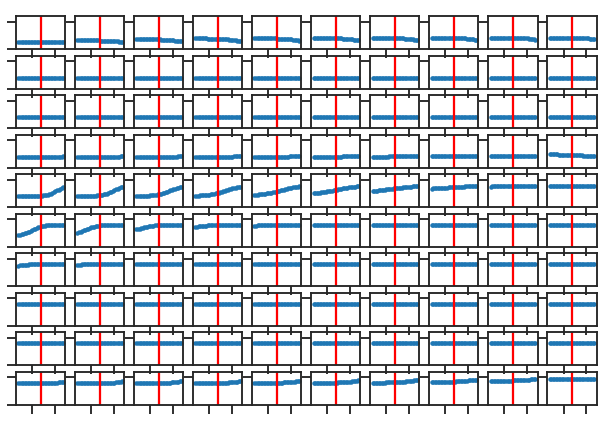

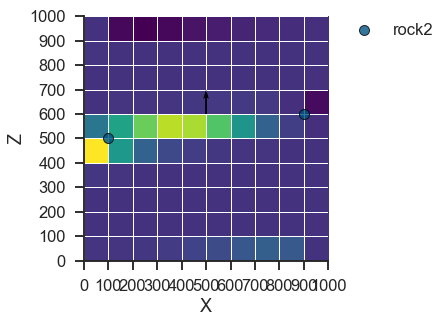

In [17]:
foo, jac = prove_gradient(par_val = 0.46885, var = 0.05, point_pos = 0);

In the figure above we can see 30 evaluations around the point of interes (Z=500) for each voxel. Below the jacobian. At first glance we can see that most of blue voxels (fig below) correlate with horizontal lines on the figure above.

Lets zoom in on the voxel with higher gradient (5,0) and compute the gradient by differences:

Text(0.5, 1.0, 'Gradient')

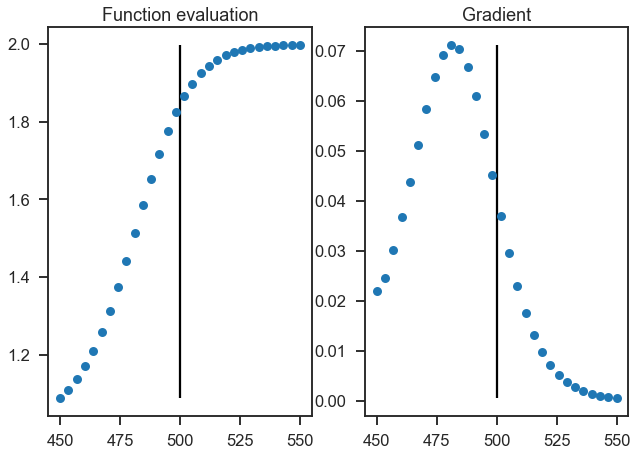

In [18]:
fig = plt.figure()
par_val = 500
var = 50

i = 0 # 9
j = 4 # 4

x =  np.linspace(par_val-var, par_val+var, 30)
y2 = np.gradient(foo[:, i, j])
y = foo[:, i, j]
fig.add_subplot(121)
plt.plot(x, y, 'o')
plt.vlines(par_val, y.min(),y.max() )
plt.title('Function evaluation')


fig.add_subplot(122)
plt.plot(x, y2, 'o')
plt.vlines(par_val, y2.min(),y2.max() )
plt.title('Gradient')

Now that we have seen how we can compute the gradient for a voxel around the point of interest, we can compute the value of the gradient by differences to all the voxels at Z=500 

In [19]:
ff = np.array([])
gg = np.array([])
for i in range(10):
    for j in range(10):
        gg = np.append(gg, foo[:, i, j][14])
        ff = np.append(ff, np.diff(foo[:, i, j])[14])

As sanity check we can plot the lithologies to be sure we still computing the model when is Z=500 properly.

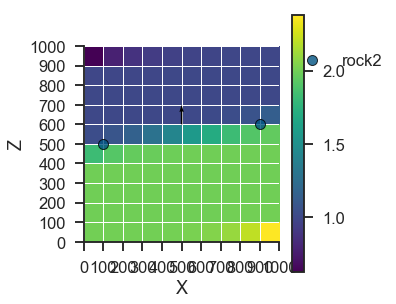

In [20]:

gp.plot.plot_section(geo_data, 0,
                     block=gg.reshape(10, 10).reshape(geo_data.grid.regular_grid.resolution), show_data=True,
                     cmap='viridis', show_grid=True, norm=None)
plt.colorbar()

Now the gradient by taking the differences around Z=500

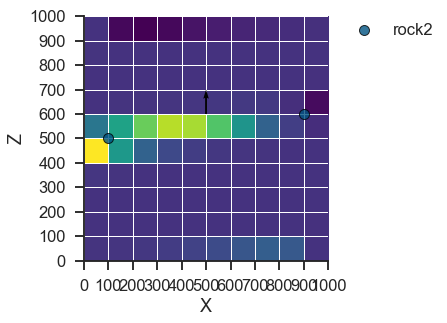

In [21]:
gp.plot.plot_section(geo_data, 0,
                     block=ff.reshape(10, 10), show_data=True,
                     cmap='viridis', show_grid=True, norm=None)

### Comparing both:

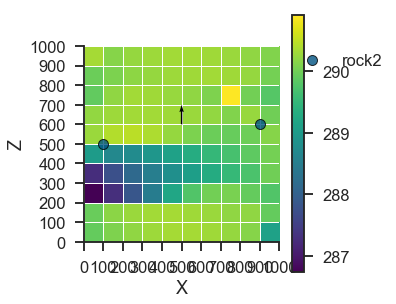

In [22]:
sect = jac/ ff.reshape(10, 10).reshape(geo_data.grid.regular_grid.resolution)

gp.plot.plot_section(geo_data, 0,
                     block=sect, show_data=True,
                     cmap='viridis', show_grid=True, norm=None)
plt.colorbar()

(array([ 1.,  2.,  2.,  1.,  5.,  6.,  4., 21., 57.,  1.]),
 array([286.73371091, 287.15126645, 287.568822  , 287.98637754,
        288.40393309, 288.82148863, 289.23904418, 289.65659972,
        290.07415527, 290.49171081, 290.90926635]),
 <a list of 10 Patch objects>)

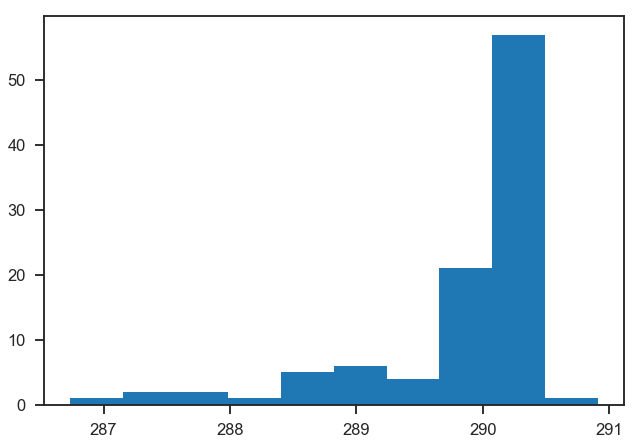

In [23]:
plt.figure()
plt.hist((jac/ ff.reshape(10, 10).reshape(geo_data.grid.regular_grid.resolution)).ravel())